This tries to partially reproduce the results from WDvS2013 paper.

However, we only use part of the data, and we use higher error tolerance so we don't expect to fully reproduce the result.

In [1]:
import numpy as np
import pycyc
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import copy
import pickle

In [3]:
from matplotlib.ticker import MultipleLocator
import matplotlib as mpl

In [34]:
def plot_intrinsic_vs_observed(CS, pp_ref=None):
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(8, 12))
    offset = 100

    off_start = 0
    off_end = 200
    target_max = 100
    if pp_ref is None:
        pp_ref = CS.pp_ref
    base_ref = np.mean(pp_ref[off_start:off_end])
    ref = pp_ref - base_ref
    ref /= np.max(ref) / target_max
    roll = -np.argmax(ref) + offset
    ref = np.roll(ref, roll)
    base_int = np.mean(CS.pp_int[off_start:off_end])
    _int = CS.pp_int - base_int
    _int /= np.max(_int) / target_max
    _int = np.roll(_int, roll)

    axs[0].plot(
        np.arange(2048) / 1024,
        np.array((ref, ref)).ravel() + 1,
        label="as usual",
        c="black",
    )
    axs[0].plot(
        np.arange(2048) / 1024,
        np.array((_int, _int)).ravel() + 1,
        label="intrinsic",
        c="red",
    )

    axs[0].set_xticks(
        np.arange(offset / 1024, 2048 / 1024, 512 / 1024),
        labels=("0.0", "0.5", "1.0", "1.5"),
    )

    axs[0].tick_params(which="both", direction="in")
    axs[0].xaxis.set_minor_locator(MultipleLocator(0.1))
    axs[0].yaxis.set_minor_locator(MultipleLocator(5.0))
    axs[0].set_ylim((-1, 100))
    axs[0].spines.right.set_visible(False)
    axs[0].spines.top.set_visible(False)

    axs[1].plot(
        np.arange(2048) / 1024,
        np.array((ref, ref)).ravel() + 1,
        label="as usual",
        c="black",
    )
    axs[1].plot(
        np.arange(2048) / 1024,
        np.array((_int, _int)).ravel() + 1,
        label="intrinsic",
        c="red",
    )

    axs[1].set_xticks(
        np.arange(offset / 1024, 2048 / 1024, 512 / 1024),
        labels=("0.0", "0.5", "1.0", "1.5"),
    )
    axs[1].tick_params(which="both", direction="in")
    axs[1].xaxis.set_minor_locator(MultipleLocator(0.1))
    axs[1].set_yticks((0, 1, 2, 3, 4))
    axs[1].yaxis.set_minor_locator(MultipleLocator(0.2))
    axs[1].set_ylim((0, 4))
    axs[1].spines.right.set_visible(False)
    axs[1].spines.top.set_visible(False)
    _ = axs[1].set_xlabel("Pulse Phase [Turns]")

In [5]:
mpl.rcParams["axes.linewidth"] = 2
mpl.rcParams["font.size"] = 14
mpl.rcParams["xtick.major.size"] = 7
mpl.rcParams["ytick.major.size"] = 7
mpl.rcParams["xtick.minor.size"] = 4
mpl.rcParams["ytick.minor.size"] = 4
mpl.rcParams["figure.figsize"] = [8., 6.]

In [6]:
CS = pycyc.CyclicSolver(filename="../P2067/chan07/53873.27864.07.15s.cyc", zap_edges = 0.05556, pscrunch=True)

In [7]:
CS.data.shape, CS.nchan

((236, 1, 4096, 1024), 4096)

In [8]:
CS.initProfile()

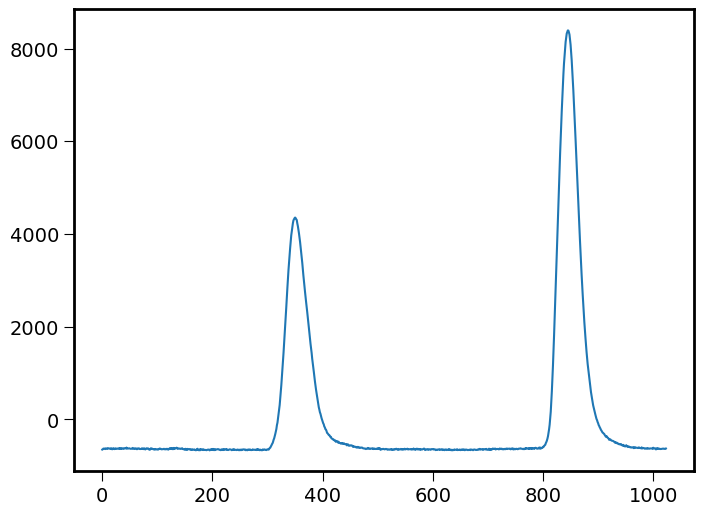

In [9]:
plt.plot(CS.pp_int)

In [10]:
np.max(CS.pp_ref - CS.pp_int), np.min(CS.pp_ref - CS.pp_int)

(0.0, 0.0)

In [11]:
pp_scattered = np.copy(CS.pp_ref)

In [12]:
filters = {}
intrinsic_profiles = {}

In [13]:
# For first pass, either loop:

for isub in range(0, 80):
    CS.loop(isub=isub, make_plots=False, ipol=0, tolfact=10)
filters[0] = copy.deepcopy(CS.optimized_filters)
intrinsic_profiles[0] = copy.deepcopy(CS.intrinsic_profiles)

# or load up previous first pass:
# with open("filters_0.pkl", "rb") as fh:
#     filters[0] = pickle.load(fh)

# with open("profiles_0.pkl", "rb") as fh:
#     intrinsic_profiles[0] = pickle.load(fh)

In [ ]:
with open("filters_0.pkl", "wb") as fh:
    pickle.dump(filters[0], fh)

with open("profiles_0.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles[0], fh)

In [17]:
# three more passes through 20 minutes (80 15 sec subints):
for ipass in range(1, 4):
    CS.pp_ref = np.copy(CS.pp_int)
    CS.pp_int = np.zeros((CS.nphase))
    for isub in range(0, 80):
        CS.loop(isub=isub, make_plots=False, ipol=0, tolfact=10, hf_prev=np.copy(filters[ipass-1][isub]))
    
    filters[ipass] = copy.deepcopy(CS.optimized_filters)
    intrinsic_profiles[ipass] = copy.deepcopy(CS.intrinsic_profiles)

initial filter: delta function at delay = 4081
onp not specified, so not using minimum phase
max filter index = 4081
variance : 7.86184e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15450e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4081
merit= 3.4858059e+06  grad= 1.1499927e+05
rindex 4081
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.48581D+06    |proj g|=  1.05364D+02


 This problem is unconstrained.


merit= 3.4854668e+06  grad= 1.1489600e+05
rindex 4081
merit= 3.4841122e+06  grad= 1.1448342e+05
rindex 4081
merit= 3.4787181e+06  grad= 1.1284143e+05
rindex 4081
merit= 3.4575373e+06  grad= 1.0638973e+05
rindex 4081
merit= 3.3794631e+06  grad= 8.1562935e+04
rindex 4081

At iterate    1    f=  3.37946D+06    |proj g|=  6.28945D+01
merit= 5.0332473e+06  grad= 1.3336772e+07
rindex 4081
merit= 3.2521073e+06  grad= 2.6020767e+04

At iterate    2    f=  3.25211D+06    |proj g|=  6.89190D+01
rindex 4081
merit= 3.2050141e+06  grad= 2.4723662e+04
rindex 4081

At iterate    3    f=  3.20501D+06    |proj g|=  8.27475D+01
merit= 3.1781531e+06  grad= 4.2436569e+03

At iterate    4    f=  3.17815D+06    |proj g|=  3.56529D+01
rindex 4081
merit= 3.1687959e+06  grad= 1.6473312e+03
rindex 4081

At iterate    5    f=  3.16880D+06    |proj g|=  1.28806D+01
merit= 3.1615705e+06  grad= 9.8223939e+02

At iterate    6    f=  3.16157D+06    |proj g|=  3.61232D+00
rindex 4081
merit= 3.1599252e+06  grad= 3.9234

merit= 3.1433208e+06  grad= 9.3447052e+00

At iterate   67    f=  3.14332D+06    |proj g|=  2.79072D-01
rindex 4081
merit= 3.1432994e+06  grad= 1.7693810e+01

At iterate   68    f=  3.14330D+06    |proj g|=  3.81515D-01
rindex 4081
merit= 3.1432728e+06  grad= 6.1241790e+00

At iterate   69    f=  3.14327D+06    |proj g|=  2.27395D-01
rindex 4081
merit= 3.1432461e+06  grad= 1.2433004e+01

At iterate   70    f=  3.14325D+06    |proj g|=  4.05263D-01
rindex 4081
merit= 3.1432281e+06  grad= 9.2542728e+00
rindex 4081

At iterate   71    f=  3.14323D+06    |proj g|=  2.82413D-01
merit= 3.1432040e+06  grad= 5.6565488e+00

At iterate   72    f=  3.14320D+06    |proj g|=  1.96027D-01
rindex 4081
merit= 3.1431796e+06  grad= 2.2258300e+01

At iterate   73    f=  3.14318D+06    |proj g|=  6.01239D-01
rindex 4081
merit= 3.1431566e+06  grad= 6.6081673e+00

At iterate   74    f=  3.14316D+06    |proj g|=  2.49517D-01
rindex 4081
merit= 3.1431406e+06  grad= 6.0632869e+00
rindex 4081

At iterate   75  

merit= 3.1425607e+06  grad= 1.8215820e+00
rindex 4081

At iterate  137    f=  3.14256D+06    |proj g|=  1.26022D-01
merit= 3.1425546e+06  grad= 1.9141436e+00
rindex 4081

At iterate  138    f=  3.14255D+06    |proj g|=  1.33620D-01
merit= 3.1425481e+06  grad= 1.6947341e+00
rindex 4081

At iterate  139    f=  3.14255D+06    |proj g|=  1.44540D-01
merit= 3.1425416e+06  grad= 1.7520751e+00
rindex 4081

At iterate  140    f=  3.14254D+06    |proj g|=  1.49544D-01
merit= 3.1425347e+06  grad= 1.8444933e+00

At iterate  141    f=  3.14253D+06    |proj g|=  1.15687D-01
rindex 4081
merit= 3.1425296e+06  grad= 2.7803676e+00

At iterate  142    f=  3.14253D+06    |proj g|=  1.87281D-01
rindex 4081
merit= 3.1425231e+06  grad= 3.1167635e+00

At iterate  143    f=  3.14252D+06    |proj g|=  1.69972D-01
rindex 4081
merit= 3.1425171e+06  grad= 1.1615417e+00

At iterate  144    f=  3.14252D+06    |proj g|=  9.47270D-02
rindex 4081
merit= 3.1425126e+06  grad= 1.1084163e+00

At iterate  145    f=  3.1425

merit= 3.1423167e+06  grad= 6.4049116e-01

At iterate  208    f=  3.14232D+06    |proj g|=  7.17345D-02
rindex 4081
merit= 3.1423153e+06  grad= 3.1753338e-01

At iterate  209    f=  3.14232D+06    |proj g|=  5.14991D-02
rindex 4081
merit= 3.1423133e+06  grad= 2.7752355e-01
rindex 4081

At iterate  210    f=  3.14231D+06    |proj g|=  3.97201D-02
merit= 3.1423119e+06  grad= 6.5519339e-01

At iterate  211    f=  3.14231D+06    |proj g|=  1.19510D-01
rindex 4081
merit= 3.1423103e+06  grad= 4.9914285e-01

At iterate  212    f=  3.14231D+06    |proj g|=  6.92984D-02
rindex 4081
merit= 3.1423107e+06  grad= 2.0330831e+00
rindex 4081
merit= 3.1423092e+06  grad= 4.5214751e-01
rindex 4081

At iterate  213    f=  3.14231D+06    |proj g|=  6.19030D-02
merit= 3.1423078e+06  grad= 3.0653747e-01

At iterate  214    f=  3.14231D+06    |proj g|=  4.69217D-02
rindex 4081
merit= 3.1423064e+06  grad= 5.1535236e-01

At iterate  215    f=  3.14231D+06    |proj g|=  9.62801D-02
rindex 4081
merit= 3.1423050e+

 This problem is unconstrained.


merit= 3.2322709e+06  grad= 8.8487078e+03
rindex 4056
merit= 3.2318997e+06  grad= 8.4041372e+03
rindex 4056
merit= 3.2305100e+06  grad= 6.7751339e+03
rindex 4056

At iterate    1    f=  3.23051D+06    |proj g|=  1.96077D+01
merit= 3.2232852e+06  grad= 2.1239733e+02

At iterate    2    f=  3.22329D+06    |proj g|=  3.11613D+00
rindex 4056
merit= 3.2228938e+06  grad= 6.4068528e+01

At iterate    3    f=  3.22289D+06    |proj g|=  9.88649D-01
rindex 4056
merit= 3.2227372e+06  grad= 2.8140004e+01

At iterate    4    f=  3.22274D+06    |proj g|=  7.07377D-01
rindex 4056
merit= 3.2227188e+06  grad= 3.8460747e+01
rindex 4056

At iterate    5    f=  3.22272D+06    |proj g|=  6.47932D-01
merit= 3.2226911e+06  grad= 3.0418699e+00

At iterate    6    f=  3.22269D+06    |proj g|=  1.93048D-01
rindex 4056
merit= 3.2226858e+06  grad= 1.4122451e+00

At iterate    7    f=  3.22269D+06    |proj g|=  1.27918D-01
rindex 4056
merit= 3.2226802e+06  grad= 9.0861441e-01
rindex 4056

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.5297103e+06  grad= 6.4544975e+03
rindex 4056
merit= 3.5293938e+06  grad= 6.0901034e+03
rindex 4056
merit= 3.5282193e+06  grad= 4.7681190e+03

At iterate    1    f=  3.52822D+06    |proj g|=  1.58536D+01
rindex 4056
merit= 3.5229640e+06  grad= 1.5191607e+02

At iterate    2    f=  3.52296D+06    |proj g|=  2.24676D+00
rindex 4056
merit= 3.5226903e+06  grad= 4.9542592e+01

At iterate    3    f=  3.52269D+06    |proj g|=  1.07348D+00
rindex 4056
merit= 3.5225869e+06  grad= 3.0289057e+01

At iterate    4    f=  3.52259D+06    |proj g|=  6.55544D-01
rindex 4056
merit= 3.5225548e+06  grad= 9.8452933e+00

At iterate    5    f=  3.52255D+06    |proj g|=  3.30822D-01
rindex 4056
merit= 3.5225452e+06  grad= 2.4569809e+00
rindex 4056

At iterate    6    f=  3.52255D+06    |proj g|=  1.60850D-01
merit= 3.5225390e+06  grad= 9.7107356e-01
rindex 4056

At iterate    7    f=  3.52254D+06    |proj g|=  1.05539D-01
merit= 3.5225362e+06  grad= 5.7599874e-01

At iterate    8    f=  3.52254D+06   

 This problem is unconstrained.


merit= 3.9116302e+06  grad= 3.5338946e+03
rindex 4056
merit= 3.9113970e+06  grad= 3.2768634e+03
rindex 4056
merit= 3.9105518e+06  grad= 2.3689159e+03
rindex 4056

At iterate    1    f=  3.91055D+06    |proj g|=  1.08567D+01
merit= 3.9078350e+06  grad= 8.0165739e+01

At iterate    2    f=  3.90784D+06    |proj g|=  1.43695D+00
rindex 4056
merit= 3.9076935e+06  grad= 2.7510530e+01

At iterate    3    f=  3.90769D+06    |proj g|=  8.14329D-01
rindex 4056
merit= 3.9076385e+06  grad= 1.4271275e+01

At iterate    4    f=  3.90764D+06    |proj g|=  4.08862D-01
rindex 4056
merit= 3.9076217e+06  grad= 3.6926612e+00

At iterate    5    f=  3.90762D+06    |proj g|=  2.13810D-01
rindex 4056
merit= 3.9076172e+06  grad= 1.1847196e+00

At iterate    6    f=  3.90762D+06    |proj g|=  1.13027D-01
rindex 4056
merit= 3.9076139e+06  grad= 5.1329793e-01

At iterate    7    f=  3.90761D+06    |proj g|=  6.68792D-02
rindex 4056
merit= 3.9076125e+06  grad= 4.2464916e-01

At iterate    8    f=  3.90761D+06   

 This problem is unconstrained.


merit= 3.8143787e+06  grad= 6.8265900e+03
rindex 4056
merit= 3.8140527e+06  grad= 6.4712487e+03
rindex 4056
merit= 3.8128356e+06  grad= 5.1712959e+03

At iterate    1    f=  3.81284D+06    |proj g|=  1.47380D+01
rindex 4056
merit= 3.8068902e+06  grad= 1.5336480e+02

At iterate    2    f=  3.80689D+06    |proj g|=  2.12482D+00
rindex 4056
merit= 3.8066076e+06  grad= 4.8185741e+01

At iterate    3    f=  3.80661D+06    |proj g|=  9.75391D-01
rindex 4056
merit= 3.8065083e+06  grad= 2.5731798e+01

At iterate    4    f=  3.80651D+06    |proj g|=  6.39693D-01
rindex 4056
merit= 3.8064749e+06  grad= 6.1767400e+00
rindex 4056

At iterate    5    f=  3.80647D+06    |proj g|=  2.81502D-01
merit= 3.8064662e+06  grad= 2.0824133e+00

At iterate    6    f=  3.80647D+06    |proj g|=  1.42242D-01
rindex 4056
merit= 3.8064596e+06  grad= 8.6755993e-01

At iterate    7    f=  3.80646D+06    |proj g|=  1.01062D-01
rindex 4056
merit= 3.8064573e+06  grad= 7.4248074e-01

At iterate    8    f=  3.80646D+06   

 This problem is unconstrained.


merit= 3.8427469e+06  grad= 9.0324995e+03
rindex 4056
merit= 3.8423713e+06  grad= 8.6169331e+03
rindex 4056
merit= 3.8409569e+06  grad= 7.0812237e+03
rindex 4056

At iterate    1    f=  3.84096D+06    |proj g|=  1.56402D+01
merit= 3.8329556e+06  grad= 1.9819124e+02

At iterate    2    f=  3.83296D+06    |proj g|=  2.30139D+00
rindex 4056
merit= 3.8325784e+06  grad= 5.8055497e+01

At iterate    3    f=  3.83258D+06    |proj g|=  9.72087D-01
rindex 4056
merit= 3.8324421e+06  grad= 3.1774974e+01

At iterate    4    f=  3.83244D+06    |proj g|=  7.34626D-01
rindex 4056
merit= 3.8324034e+06  grad= 1.4262810e+01

At iterate    5    f=  3.83240D+06    |proj g|=  4.25606D-01
rindex 4056
merit= 3.8323896e+06  grad= 2.7346658e+00

At iterate    6    f=  3.83239D+06    |proj g|=  2.05615D-01
rindex 4056
merit= 3.8323825e+06  grad= 1.2609722e+00

At iterate    7    f=  3.83238D+06    |proj g|=  1.11623D-01
rindex 4056
merit= 3.8323787e+06  grad= 8.1529328e-01

At iterate    8    f=  3.83238D+06   

 This problem is unconstrained.


merit= 4.3786861e+06  grad= 3.6756641e+03
rindex 4056
merit= 4.3784480e+06  grad= 3.4184000e+03
rindex 4056
merit= 4.3775816e+06  grad= 2.5027634e+03

At iterate    1    f=  4.37758D+06    |proj g|=  9.61341D+00
rindex 4056
merit= 4.3747096e+06  grad= 7.1564928e+01
rindex 4056

At iterate    2    f=  4.37471D+06    |proj g|=  1.11971D+00
merit= 4.3745732e+06  grad= 2.3698840e+01

At iterate    3    f=  4.37457D+06    |proj g|=  6.10883D-01
rindex 4056
merit= 4.3745108e+06  grad= 1.0498489e+01

At iterate    4    f=  4.37451D+06    |proj g|=  4.11099D-01
rindex 4056
merit= 4.3745043e+06  grad= 1.2714787e+01

At iterate    5    f=  4.37450D+06    |proj g|=  4.18548D-01
rindex 4056
merit= 4.3744944e+06  grad= 9.9113641e-01

At iterate    6    f=  4.37449D+06    |proj g|=  1.19557D-01
rindex 4056
merit= 4.3744926e+06  grad= 4.6931343e-01

At iterate    7    f=  4.37449D+06    |proj g|=  6.15373D-02
rindex 4056
merit= 4.3744905e+06  grad= 3.2327671e-01
rindex 4056

At iterate    8    f=  4.

 This problem is unconstrained.


merit= 4.1720476e+06  grad= 6.4159275e+03
rindex 4056
merit= 4.1717318e+06  grad= 6.0577877e+03
rindex 4056
merit= 4.1705590e+06  grad= 4.7526087e+03
rindex 4056

At iterate    1    f=  4.17056D+06    |proj g|=  1.21305D+01
merit= 4.1653870e+06  grad= 1.3522955e+02
rindex 4056

At iterate    2    f=  4.16539D+06    |proj g|=  1.64654D+00
merit= 4.1651315e+06  grad= 4.3062248e+01

At iterate    3    f=  4.16513D+06    |proj g|=  8.64716D-01
rindex 4056
merit= 4.1650149e+06  grad= 1.2929162e+01

At iterate    4    f=  4.16501D+06    |proj g|=  3.72831D-01
rindex 4056
merit= 4.1650108e+06  grad= 3.0729603e+01
rindex 4056

At iterate    5    f=  4.16501D+06    |proj g|=  6.32302D-01
merit= 4.1649875e+06  grad= 1.6000513e+00
rindex 4056

At iterate    6    f=  4.16499D+06    |proj g|=  1.12813D-01
merit= 4.1649848e+06  grad= 7.4734975e-01

At iterate    7    f=  4.16498D+06    |proj g|=  8.78137D-02
rindex 4056
merit= 4.1649814e+06  grad= 4.6303392e-01
rindex 4056

At iterate    8    f=  4.

 This problem is unconstrained.


merit= 3.7666276e+06  grad= 1.8459138e+04
rindex 4056
merit= 3.7660891e+06  grad= 1.7799879e+04
rindex 4056
merit= 3.7640326e+06  grad= 1.5322656e+04
rindex 4056
merit= 3.7573190e+06  grad= 7.7674940e+03
rindex 4056

At iterate    1    f=  3.75732D+06    |proj g|=  1.51365D+01
merit= 3.7482103e+06  grad= 4.2403878e+02

At iterate    2    f=  3.74821D+06    |proj g|=  3.40912D+00
rindex 4056
merit= 3.7473553e+06  grad= 1.1701432e+02
rindex 4056

At iterate    3    f=  3.74736D+06    |proj g|=  1.56283D+00
merit= 3.7470602e+06  grad= 5.7912778e+01

At iterate    4    f=  3.74706D+06    |proj g|=  8.08247D-01
rindex 4056
merit= 3.7470039e+06  grad= 4.7110695e+01

At iterate    5    f=  3.74700D+06    |proj g|=  6.59151D-01
rindex 4056
merit= 3.7469636e+06  grad= 4.8343829e+00

At iterate    6    f=  3.74696D+06    |proj g|=  2.23819D-01
rindex 4056
merit= 3.7469535e+06  grad= 2.2163565e+00

At iterate    7    f=  3.74695D+06    |proj g|=  1.60027D-01
rindex 4056
merit= 3.7469450e+06  grad

 This problem is unconstrained.


merit= 4.0887841e+06  grad= 9.4093403e+03
rindex 4048
merit= 4.0884010e+06  grad= 8.9428599e+03
rindex 4048
merit= 4.0869655e+06  grad= 7.2289531e+03

At iterate    1    f=  4.08697D+06    |proj g|=  1.32855D+01
rindex 4048
merit= 4.0794852e+06  grad= 2.3065093e+02

At iterate    2    f=  4.07949D+06    |proj g|=  2.32852D+00
rindex 4048
merit= 4.0790667e+06  grad= 7.2968729e+01

At iterate    3    f=  4.07907D+06    |proj g|=  1.06969D+00
rindex 4048
merit= 4.0788904e+06  grad= 3.3922811e+01

At iterate    4    f=  4.07889D+06    |proj g|=  5.71826D-01
rindex 4048
merit= 4.0788738e+06  grad= 4.8281868e+01
rindex 4048

At iterate    5    f=  4.07887D+06    |proj g|=  6.24635D-01
merit= 4.0788395e+06  grad= 3.2858112e+00

At iterate    6    f=  4.07884D+06    |proj g|=  1.81207D-01
rindex 4048
merit= 4.0788341e+06  grad= 1.5499001e+00

At iterate    7    f=  4.07883D+06    |proj g|=  1.42676D-01
rindex 4048
merit= 4.0788277e+06  grad= 1.0731239e+00

At iterate    8    f=  4.07883D+06   

 This problem is unconstrained.


merit= 3.5868700e+06  grad= 2.2409826e+04
rindex 4048
merit= 3.5862764e+06  grad= 2.1645802e+04
rindex 4048
merit= 3.5840043e+06  grad= 1.8769633e+04
rindex 4048
merit= 3.5765053e+06  grad= 9.9109565e+03

At iterate    1    f=  3.57651D+06    |proj g|=  1.68363D+01
rindex 4048
merit= 3.5653574e+06  grad= 5.5346857e+02

At iterate    2    f=  3.56536D+06    |proj g|=  3.83629D+00
rindex 4048
merit= 3.5642773e+06  grad= 1.5029650e+02

At iterate    3    f=  3.56428D+06    |proj g|=  1.60790D+00
rindex 4048
merit= 3.5639084e+06  grad= 7.1588544e+01

At iterate    4    f=  3.56391D+06    |proj g|=  1.04348D+00
rindex 4048
merit= 3.5638399e+06  grad= 6.0473687e+01

At iterate    5    f=  3.56384D+06    |proj g|=  7.79674D-01
rindex 4048
merit= 3.5637898e+06  grad= 6.2240146e+00

At iterate    6    f=  3.56379D+06    |proj g|=  2.26200D-01
rindex 4048
merit= 3.5637769e+06  grad= 3.0824113e+00

At iterate    7    f=  3.56378D+06    |proj g|=  1.87065D-01
rindex 4048
merit= 3.5637652e+06  grad

 This problem is unconstrained.


merit= 3.6739137e+06  grad= 1.6584939e+04
rindex 4048
merit= 3.6734035e+06  grad= 1.5964506e+04
rindex 4048
merit= 3.6714593e+06  grad= 1.3638594e+04
rindex 4048
merit= 3.6651856e+06  grad= 6.6298548e+03

At iterate    1    f=  3.66519D+06    |proj g|=  1.46875D+01
rindex 4048
merit= 3.6573820e+06  grad= 3.5586454e+02

At iterate    2    f=  3.65738D+06    |proj g|=  2.98481D+00
rindex 4048
merit= 3.6566691e+06  grad= 1.0137791e+02

At iterate    3    f=  3.65667D+06    |proj g|=  1.29020D+00
rindex 4048
merit= 3.6564143e+06  grad= 5.1825833e+01
rindex 4048

At iterate    4    f=  3.65641D+06    |proj g|=  8.69645D-01
merit= 3.6563630e+06  grad= 3.6372506e+01

At iterate    5    f=  3.65636D+06    |proj g|=  6.50469D-01
rindex 4048
merit= 3.6563313e+06  grad= 4.0523913e+00

At iterate    6    f=  3.65633D+06    |proj g|=  2.04423D-01
rindex 4048
merit= 3.6563224e+06  grad= 1.9410125e+00

At iterate    7    f=  3.65632D+06    |proj g|=  1.27371D-01
rindex 4048
merit= 3.6563148e+06  grad

 This problem is unconstrained.


merit= 3.7242509e+06  grad= 1.7560383e+04
rindex 4048
merit= 3.7237256e+06  grad= 1.6935552e+04
rindex 4048
merit= 3.7217191e+06  grad= 1.4585313e+04
rindex 4048
merit= 3.7151647e+06  grad= 7.3860985e+03

At iterate    1    f=  3.71516D+06    |proj g|=  1.47689D+01
rindex 4048
merit= 3.7064286e+06  grad= 3.5783410e+02

At iterate    2    f=  3.70643D+06    |proj g|=  3.02208D+00
rindex 4048
merit= 3.7056955e+06  grad= 9.6316840e+01

At iterate    3    f=  3.70570D+06    |proj g|=  1.22914D+00
rindex 4048
merit= 3.7054245e+06  grad= 3.0853637e+01

At iterate    4    f=  3.70542D+06    |proj g|=  6.54094D-01
rindex 4048
merit= 3.7054079e+06  grad= 6.7192790e+01
rindex 4048

At iterate    5    f=  3.70541D+06    |proj g|=  8.77659D-01
merit= 3.7053530e+06  grad= 3.9127310e+00
rindex 4048

At iterate    6    f=  3.70535D+06    |proj g|=  2.01579D-01
merit= 3.7053456e+06  grad= 1.9083671e+00

At iterate    7    f=  3.70535D+06    |proj g|=  1.27455D-01
rindex 4048
merit= 3.7053368e+06  grad

 This problem is unconstrained.


merit= 3.7652468e+06  grad= 1.3124475e+04
rindex 4048
merit= 3.7647932e+06  grad= 1.2601918e+04
rindex 4048
merit= 3.7630705e+06  grad= 1.0649045e+04

rindex 4048
At iterate    1    f=  3.76307D+06    |proj g|=  1.71230D+01
merit= 3.7516387e+06  grad= 2.9177159e+02
rindex 4048

At iterate    2    f=  3.75164D+06    |proj g|=  2.57399D+00
merit= 3.7510748e+06  grad= 7.9039835e+01
rindex 4048

At iterate    3    f=  3.75107D+06    |proj g|=  1.27595D+00
merit= 3.7508507e+06  grad= 1.8750221e+01

At iterate    4    f=  3.75085D+06    |proj g|=  6.46583D-01
rindex 4048
merit= 3.7508258e+06  grad= 4.0718017e+01
rindex 4048

At iterate    5    f=  3.75083D+06    |proj g|=  6.83557D-01
merit= 3.7507913e+06  grad= 2.2186412e+00
rindex 4048

At iterate    6    f=  3.75079D+06    |proj g|=  1.55081D-01
merit= 3.7507869e+06  grad= 1.1613570e+00

At iterate    7    f=  3.75079D+06    |proj g|=  9.69063D-02
rindex 4048
merit= 3.7507816e+06  grad= 6.2402154e-01

At iterate    8    f=  3.75078D+06   

 This problem is unconstrained.


merit= 3.6484412e+06  grad= 1.2820980e+04
rindex 4048
merit= 3.6479929e+06  grad= 1.2306816e+04
rindex 4048
merit= 3.6462911e+06  grad= 1.0387644e+04

At iterate    1    f=  3.64629D+06    |proj g|=  1.54891D+01
rindex 4048
merit= 3.6349753e+06  grad= 2.9332347e+02

At iterate    2    f=  3.63498D+06    |proj g|=  2.52349D+00
rindex 4048
merit= 3.6344038e+06  grad= 7.8319368e+01

At iterate    3    f=  3.63440D+06    |proj g|=  1.36867D+00
rindex 4048
merit= 3.6341838e+06  grad= 2.1286885e+01

At iterate    4    f=  3.63418D+06    |proj g|=  5.84030D-01
rindex 4048
merit= 3.6341669e+06  grad= 5.0852596e+01

At iterate    5    f=  3.63417D+06    |proj g|=  9.45534D-01
rindex 4048
merit= 3.6341256e+06  grad= 2.6141547e+00

At iterate    6    f=  3.63413D+06    |proj g|=  1.52036D-01
rindex 4048
merit= 3.6341206e+06  grad= 1.3012361e+00

At iterate    7    f=  3.63412D+06    |proj g|=  9.59724D-02
rindex 4048
merit= 3.6341146e+06  grad= 7.8735193e-01

At iterate    8    f=  3.63411D+06   

 This problem is unconstrained.


merit= 4.0163648e+06  grad= 5.6241761e+03
rindex 4048
merit= 4.0160694e+06  grad= 5.2909974e+03
rindex 4048
merit= 4.0149777e+06  grad= 4.0864702e+03

At iterate    1    f=  4.01498D+06    |proj g|=  1.09834D+01
rindex 4048
merit= 4.0103961e+06  grad= 1.2270013e+02

At iterate    2    f=  4.01040D+06    |proj g|=  1.56019D+00
rindex 4048
merit= 4.0101649e+06  grad= 3.6113458e+01

At iterate    3    f=  4.01016D+06    |proj g|=  8.94079D-01
rindex 4048
merit= 4.0100718e+06  grad= 1.2739078e+01

At iterate    4    f=  4.01007D+06    |proj g|=  3.90740D-01
rindex 4048
merit= 4.0100639e+06  grad= 2.0763565e+01

At iterate    5    f=  4.01006D+06    |proj g|=  5.31101D-01
rindex 4048
merit= 4.0100482e+06  grad= 1.4970250e+00

At iterate    6    f=  4.01005D+06    |proj g|=  1.44198D-01
rindex 4048
merit= 4.0100455e+06  grad= 7.2220461e-01

At iterate    7    f=  4.01005D+06    |proj g|=  7.99856D-02
rindex 4048
merit= 4.0100422e+06  grad= 5.0701981e-01

At iterate    8    f=  4.01004D+06   

 This problem is unconstrained.


merit= 4.0247180e+06  grad= 3.6264287e+03
rindex 4048
merit= 4.0244817e+06  grad= 3.3624727e+03
rindex 4048
merit= 4.0236253e+06  grad= 2.4307461e+03
rindex 4048

At iterate    1    f=  4.02363D+06    |proj g|=  8.51422D+00
merit= 4.0208331e+06  grad= 7.8627552e+01

At iterate    2    f=  4.02083D+06    |proj g|=  1.30081D+00
rindex 4048
merit= 4.0206867e+06  grad= 2.2842706e+01

At iterate    3    f=  4.02069D+06    |proj g|=  7.65900D-01
rindex 4048
merit= 4.0206262e+06  grad= 6.5432894e+00

At iterate    4    f=  4.02063D+06    |proj g|=  2.73182D-01
rindex 4048
merit= 4.0206231e+06  grad= 1.4091469e+01

At iterate    5    f=  4.02062D+06    |proj g|=  3.93948D-01
rindex 4048
merit= 4.0206127e+06  grad= 9.7015270e-01

At iterate    6    f=  4.02061D+06    |proj g|=  8.62778D-02
rindex 4048
merit= 4.0206110e+06  grad= 4.6894171e-01
rindex 4048

At iterate    7    f=  4.02061D+06    |proj g|=  5.33642D-02
merit= 4.0206087e+06  grad= 3.4545671e-01

At iterate    8    f=  4.02061D+06   

 This problem is unconstrained.


merit= 3.6944286e+06  grad= 7.4940796e+03
rindex 4048
merit= 3.6940869e+06  grad= 7.1035683e+03
rindex 4048
merit= 3.6928113e+06  grad= 5.6758101e+03

At iterate    1    f=  3.69281D+06    |proj g|=  1.32288D+01
rindex 4048
merit= 3.6865005e+06  grad= 1.7023099e+02

At iterate    2    f=  3.68650D+06    |proj g|=  2.04171D+00
rindex 4048
merit= 3.6861774e+06  grad= 4.6924852e+01

At iterate    3    f=  3.68618D+06    |proj g|=  1.07431D+00
rindex 4048
merit= 3.6860568e+06  grad= 1.7347311e+01

At iterate    4    f=  3.68606D+06    |proj g|=  5.95189D-01
rindex 4048
merit= 3.6860470e+06  grad= 2.9712634e+01

At iterate    5    f=  3.68605D+06    |proj g|=  6.12629D-01
rindex 4048
merit= 3.6860244e+06  grad= 2.0377371e+00

At iterate    6    f=  3.68602D+06    |proj g|=  1.42181D-01
rindex 4048
merit= 3.6860207e+06  grad= 1.0007874e+00

At iterate    7    f=  3.68602D+06    |proj g|=  9.04744D-02
rindex 4048
merit= 3.6860162e+06  grad= 6.8518654e-01

At iterate    8    f=  3.68602D+06   

 This problem is unconstrained.


merit= 3.8210566e+06  grad= 4.8060685e+03
rindex 4048
merit= 3.8207840e+06  grad= 4.4894906e+03
rindex 4048
merit= 3.8197862e+06  grad= 3.3589409e+03

At iterate    1    f=  3.81979D+06    |proj g|=  1.06822D+01
rindex 4048
merit= 3.8160776e+06  grad= 1.1404403e+02
rindex 4048

At iterate    2    f=  3.81608D+06    |proj g|=  1.59606D+00
merit= 3.8158718e+06  grad= 3.4341441e+01

At iterate    3    f=  3.81587D+06    |proj g|=  9.32806D-01
rindex 4048
merit= 3.8157947e+06  grad= 2.0012261e+01
rindex 4048

At iterate    4    f=  3.81579D+06    |proj g|=  5.68717D-01
merit= 3.8157797e+06  grad= 1.3491208e+01

At iterate    5    f=  3.81578D+06    |proj g|=  3.79262D-01
rindex 4048
merit= 3.8157694e+06  grad= 1.6333581e+00
rindex 4048

At iterate    6    f=  3.81577D+06    |proj g|=  1.35604D-01
merit= 3.8157662e+06  grad= 7.6216632e-01

At iterate    7    f=  3.81577D+06    |proj g|=  7.04228D-02
rindex 4048
merit= 3.8157630e+06  grad= 5.6464221e-01

At iterate    8    f=  3.81576D+06   

 This problem is unconstrained.


merit= 3.4933667e+06  grad= 1.3056839e+04
rindex 4048
merit= 3.4929146e+06  grad= 1.2504754e+04
rindex 4048
merit= 3.4912035e+06  grad= 1.0454795e+04

At iterate    1    f=  3.49120D+06    |proj g|=  1.85256D+01
rindex 4048
merit= 3.4802747e+06  grad= 3.3573649e+02

At iterate    2    f=  3.48027D+06    |proj g|=  3.20480D+00
rindex 4048
merit= 3.4796501e+06  grad= 9.4703902e+01
rindex 4048

At iterate    3    f=  3.47965D+06    |proj g|=  1.48088D+00
merit= 3.4794110e+06  grad= 3.1802251e+01

At iterate    4    f=  3.47941D+06    |proj g|=  7.46221D-01
rindex 4048
merit= 3.4793904e+06  grad= 5.7694912e+01

At iterate    5    f=  3.47939D+06    |proj g|=  7.98865D-01
rindex 4048
merit= 3.4793472e+06  grad= 3.7319822e+00

At iterate    6    f=  3.47935D+06    |proj g|=  1.87542D-01
rindex 4048
merit= 3.4793405e+06  grad= 1.7944556e+00

At iterate    7    f=  3.47934D+06    |proj g|=  1.44064D-01
rindex 4048
merit= 3.4793329e+06  grad= 1.2165086e+00

At iterate    8    f=  3.47933D+06   

 This problem is unconstrained.


merit= 3.5141355e+06  grad= 1.3679974e+04
rindex 4048
merit= 3.5136725e+06  grad= 1.3122291e+04
rindex 4048
merit= 3.5119166e+06  grad= 1.1044911e+04

At iterate    1    f=  3.51192D+06    |proj g|=  1.98981D+01
rindex 4048
merit= 3.5003481e+06  grad= 3.2550677e+02

At iterate    2    f=  3.50035D+06    |proj g|=  3.25320D+00
rindex 4048
merit= 3.4997383e+06  grad= 8.9774688e+01

At iterate    3    f=  3.49974D+06    |proj g|=  1.19995D+00
rindex 4048
merit= 3.4994933e+06  grad= 2.1147251e+01

At iterate    4    f=  3.49949D+06    |proj g|=  6.79346D-01
rindex 4048
merit= 3.4994602e+06  grad= 3.9869182e+01

At iterate    5    f=  3.49946D+06    |proj g|=  6.58675D-01
rindex 4048
merit= 3.4994261e+06  grad= 2.5256063e+00

At iterate    6    f=  3.49943D+06    |proj g|=  1.46066D-01
rindex 4048
merit= 3.4994211e+06  grad= 1.2778538e+00

At iterate    7    f=  3.49942D+06    |proj g|=  1.01819D-01
rindex 4048
merit= 3.4994159e+06  grad= 8.4134101e-01

At iterate    8    f=  3.49942D+06   

 This problem is unconstrained.


merit= 3.7381851e+06  grad= 1.3145192e+04
rindex 4048
merit= 3.7377312e+06  grad= 1.2606328e+04
rindex 4048
merit= 3.7360105e+06  grad= 1.0599013e+04

At iterate    1    f=  3.73601D+06    |proj g|=  1.80356D+01
rindex 4048
merit= 3.7248460e+06  grad= 2.9751318e+02

At iterate    2    f=  3.72485D+06    |proj g|=  2.57593D+00
rindex 4048
merit= 3.7243083e+06  grad= 8.4439084e+01
rindex 4048

At iterate    3    f=  3.72431D+06    |proj g|=  9.89300D-01
merit= 3.7241089e+06  grad= 4.6703964e+01
rindex 4048

At iterate    4    f=  3.72411D+06    |proj g|=  8.35959D-01
merit= 3.7240505e+06  grad= 2.8061585e+01

At iterate    5    f=  3.72405D+06    |proj g|=  5.12904D-01
rindex 4048
merit= 3.7240251e+06  grad= 4.4329693e+00

At iterate    6    f=  3.72403D+06    |proj g|=  2.15932D-01
rindex 4048
merit= 3.7240147e+06  grad= 2.1128091e+00

At iterate    7    f=  3.72401D+06    |proj g|=  1.50630D-01
rindex 4048
merit= 3.7240087e+06  grad= 1.3354502e+00

At iterate    8    f=  3.72401D+06   

 This problem is unconstrained.


merit= 3.5217137e+06  grad= 1.7954787e+04
rindex 4048
merit= 3.5211826e+06  grad= 1.7313882e+04
rindex 4048
merit= 3.5191542e+06  grad= 1.4906559e+04
rindex 4048
merit= 3.5125322e+06  grad= 7.5770879e+03

At iterate    1    f=  3.51253D+06    |proj g|=  1.66994D+01
rindex 4048
merit= 3.5035705e+06  grad= 3.6346937e+02

At iterate    2    f=  3.50357D+06    |proj g|=  2.52171D+00
rindex 4048
merit= 3.5028624e+06  grad= 1.0470204e+02

At iterate    3    f=  3.50286D+06    |proj g|=  1.24453D+00
rindex 4048
merit= 3.5026298e+06  grad= 6.6534237e+01
rindex 4048

At iterate    4    f=  3.50263D+06    |proj g|=  9.15552D-01
merit= 3.5025474e+06  grad= 1.7189714e+01

At iterate    5    f=  3.50255D+06    |proj g|=  4.00799D-01
rindex 4048
merit= 3.5025247e+06  grad= 5.2881642e+00

At iterate    6    f=  3.50252D+06    |proj g|=  2.22995D-01
rindex 4048
merit= 3.5025084e+06  grad= 2.4239366e+00

At iterate    7    f=  3.50251D+06    |proj g|=  1.67782D-01
rindex 4048
merit= 3.5025022e+06  grad

 This problem is unconstrained.


merit= 3.7011606e+06  grad= 1.3113097e+04
rindex 4048
merit= 3.7007075e+06  grad= 1.2553216e+04
rindex 4048
merit= 3.6989936e+06  grad= 1.0473060e+04
rindex 4048

At iterate    1    f=  3.69899D+06    |proj g|=  1.78436D+01
merit= 3.6883876e+06  grad= 2.9650054e+02

At iterate    2    f=  3.68839D+06    |proj g|=  2.32353D+00
rindex 4048
merit= 3.6878563e+06  grad= 8.6796706e+01

At iterate    3    f=  3.68786D+06    |proj g|=  1.26171D+00
rindex 4048
merit= 3.6876346e+06  grad= 3.2924045e+01

At iterate    4    f=  3.68763D+06    |proj g|=  7.05443D-01
rindex 4048
merit= 3.6876125e+06  grad= 6.3579495e+01

At iterate    5    f=  3.68761D+06    |proj g|=  9.34879D-01
rindex 4048
merit= 3.6875662e+06  grad= 4.0698081e+00
rindex 4048

At iterate    6    f=  3.68757D+06    |proj g|=  1.99273D-01
merit= 3.6875591e+06  grad= 1.9754284e+00

At iterate    7    f=  3.68756D+06    |proj g|=  1.42656D-01
rindex 4048
merit= 3.6875512e+06  grad= 1.4572007e+00

At iterate    8    f=  3.68755D+06   

 This problem is unconstrained.


merit= 3.5420688e+06  grad= 1.4768657e+04
rindex 4048
merit= 3.5415879e+06  grad= 1.4143032e+04
rindex 4048
merit= 3.5397680e+06  grad= 1.1817041e+04

At iterate    1    f=  3.53977D+06    |proj g|=  1.85916D+01
rindex 4048
merit= 3.5283780e+06  grad= 3.5867732e+02
rindex 4048

At iterate    2    f=  3.52838D+06    |proj g|=  2.53070D+00
merit= 3.5277520e+06  grad= 1.0901408e+02

At iterate    3    f=  3.52775D+06    |proj g|=  1.38304D+00
rindex 4048
merit= 3.5274750e+06  grad= 3.3694134e+01

At iterate    4    f=  3.52748D+06    |proj g|=  7.65825D-01
rindex 4048
merit= 3.5274627e+06  grad= 9.0073577e+01

At iterate    5    f=  3.52746D+06    |proj g|=  9.85328D-01
rindex 4048
merit= 3.5274001e+06  grad= 4.3112569e+00

At iterate    6    f=  3.52740D+06    |proj g|=  2.29714D-01
rindex 4048
merit= 3.5273931e+06  grad= 2.0866240e+00
rindex 4048

At iterate    7    f=  3.52739D+06    |proj g|=  1.35436D-01
merit= 3.5273846e+06  grad= 1.3399340e+00

At iterate    8    f=  3.52738D+06   

 This problem is unconstrained.


merit= 3.4790556e+06  grad= 1.6282706e+04
rindex 6
merit= 3.4785506e+06  grad= 1.5601213e+04
rindex 6
merit= 3.4766382e+06  grad= 1.3063814e+04
rindex 6

At iterate    1    f=  3.47664D+06    |proj g|=  1.76654D+01
merit= 3.4645732e+06  grad= 4.0157812e+02

At iterate    2    f=  3.46457D+06    |proj g|=  3.38991D+00
rindex 6
merit= 3.4638918e+06  grad= 1.2304038e+02

At iterate    3    f=  3.46389D+06    |proj g|=  1.55528D+00
rindex 6
merit= 3.4635780e+06  grad= 2.9007380e+01

At iterate    4    f=  3.46358D+06    |proj g|=  6.47168D-01
rindex 6
merit= 3.4635306e+06  grad= 5.2043743e+01

At iterate    5    f=  3.46353D+06    |proj g|=  8.22146D-01
rindex 6
merit= 3.4634899e+06  grad= 3.4182418e+00

At iterate    6    f=  3.46349D+06    |proj g|=  2.40133D-01
rindex 6
merit= 3.4634842e+06  grad= 1.7750044e+00

At iterate    7    f=  3.46348D+06    |proj g|=  1.34169D-01
rindex 6
merit= 3.4634763e+06  grad= 8.4018828e-01

At iterate    8    f=  3.46348D+06    |proj g|=  1.18156D-01
rin

 This problem is unconstrained.


merit= 3.2177772e+06  grad= 2.3977978e+04
rindex 6
merit= 3.2171638e+06  grad= 2.3088087e+04
rindex 6
merit= 3.2148253e+06  grad= 1.9752657e+04
rindex 6
merit= 3.2072608e+06  grad= 9.7022117e+03

rindex 6
At iterate    1    f=  3.20726D+06    |proj g|=  1.68724D+01
merit= 3.1975573e+06  grad= 5.7794474e+02
rindex 6

At iterate    2    f=  3.19756D+06    |proj g|=  3.56297D+00
merit= 3.1965609e+06  grad= 1.7327448e+02

At iterate    3    f=  3.19656D+06    |proj g|=  1.78399D+00
rindex 6
merit= 3.1961868e+06  grad= 9.8683343e+01

At iterate    4    f=  3.19619D+06    |proj g|=  1.26558D+00
rindex 6
merit= 3.1960938e+06  grad= 6.5595968e+01

At iterate    5    f=  3.19609D+06    |proj g|=  9.46366D-01
rindex 6
merit= 3.1960433e+06  grad= 9.1862930e+00

At iterate    6    f=  3.19604D+06    |proj g|=  3.65876D-01
rindex 6
merit= 3.1960248e+06  grad= 4.2324316e+00
rindex 6

At iterate    7    f=  3.19602D+06    |proj g|=  1.97055D-01
merit= 3.1960124e+06  grad= 2.6611986e+00

At iterate   

 This problem is unconstrained.


merit= 3.0086670e+06  grad= 3.8966295e+04
rindex 6
merit= 3.0078839e+06  grad= 3.7739123e+04
rindex 6
merit= 3.0048760e+06  grad= 3.3105133e+04
rindex 6
merit= 2.9947749e+06  grad= 1.8598790e+04

At iterate    1    f=  2.99477D+06    |proj g|=  2.19197D+01
rindex 6
merit= 2.9774704e+06  grad= 1.0585100e+03

At iterate    2    f=  2.97747D+06    |proj g|=  4.67637D+00
rindex 6
merit= 2.9757373e+06  grad= 3.0218980e+02

At iterate    3    f=  2.97574D+06    |proj g|=  2.64714D+00
rindex 6
merit= 2.9751177e+06  grad= 1.8209350e+02
rindex 6

At iterate    4    f=  2.97512D+06    |proj g|=  1.89603D+00
merit= 2.9749156e+06  grad= 8.3855786e+01

At iterate    5    f=  2.97492D+06    |proj g|=  1.12784D+00
rindex 6
merit= 2.9748421e+06  grad= 1.6405236e+01

At iterate    6    f=  2.97484D+06    |proj g|=  5.07329D-01
rindex 6
merit= 2.9748037e+06  grad= 8.1952204e+00

At iterate    7    f=  2.97480D+06    |proj g|=  3.06162D-01
rindex 6
merit= 2.9747842e+06  grad= 4.7912879e+00
rindex 6

At i

 This problem is unconstrained.


merit= 3.1752939e+06  grad= 3.1435982e+04
rindex 4063
merit= 3.1745917e+06  grad= 3.0284464e+04
rindex 4063
merit= 3.1719132e+06  grad= 2.5981702e+04
rindex 4063
merit= 3.1632114e+06  grad= 1.3170451e+04

At iterate    1    f=  3.16321D+06    |proj g|=  1.75998D+01
rindex 4063
merit= 3.1508289e+06  grad= 8.9237712e+02
rindex 4063

At iterate    2    f=  3.15083D+06    |proj g|=  4.94001D+00
merit= 3.1494188e+06  grad= 2.8635263e+02

At iterate    3    f=  3.14942D+06    |proj g|=  2.56298D+00
rindex 4063
merit= 3.1489356e+06  grad= 2.1541410e+02

At iterate    4    f=  3.14894D+06    |proj g|=  1.77766D+00
rindex 4063
merit= 3.1487425e+06  grad= 3.9409981e+01

At iterate    5    f=  3.14874D+06    |proj g|=  7.35163D-01
rindex 4063
merit= 3.1486943e+06  grad= 1.6463945e+01

At iterate    6    f=  3.14869D+06    |proj g|=  4.26936D-01
rindex 4063
merit= 3.1486468e+06  grad= 6.6860791e+00

At iterate    7    f=  3.14865D+06    |proj g|=  3.32234D-01
rindex 4063
merit= 3.1486347e+06  grad

 This problem is unconstrained.


merit= 3.1030674e+06  grad= 3.9163429e+04
rindex 4063
merit= 3.1022828e+06  grad= 3.7850588e+04
rindex 4063
merit= 3.0992775e+06  grad= 3.2928995e+04
rindex 4063
merit= 3.0893072e+06  grad= 1.8008633e+04

At iterate    1    f=  3.08931D+06    |proj g|=  2.28114D+01
rindex 4063
merit= 3.0723525e+06  grad= 1.2217985e+03

At iterate    2    f=  3.07235D+06    |proj g|=  5.96646D+00
rindex 4063
merit= 3.0703634e+06  grad= 3.4974307e+02

At iterate    3    f=  3.07036D+06    |proj g|=  2.94989D+00
rindex 4063
merit= 3.0697337e+06  grad= 2.8884236e+02

At iterate    4    f=  3.06973D+06    |proj g|=  1.90377D+00
rindex 4063
merit= 3.0694891e+06  grad= 6.6481531e+01

At iterate    5    f=  3.06949D+06    |proj g|=  9.35860D-01
rindex 4063
merit= 3.0694250e+06  grad= 2.0437895e+01

At iterate    6    f=  3.06942D+06    |proj g|=  5.00141D-01
rindex 4063
merit= 3.0693718e+06  grad= 9.1376676e+00

At iterate    7    f=  3.06937D+06    |proj g|=  3.12208D-01
rindex 4063
merit= 3.0693488e+06  grad

 This problem is unconstrained.


merit= 3.5497746e+06  grad= 2.2414180e+04
rindex 4063
merit= 3.5491820e+06  grad= 2.1519279e+04
rindex 4063
merit= 3.5469316e+06  grad= 1.8200477e+04
rindex 4063

At iterate    1    f=  3.54693D+06    |proj g|=  2.49465D+01
merit= 3.5306677e+06  grad= 7.0747620e+02

At iterate    2    f=  3.53067D+06    |proj g|=  4.30609D+00
rindex 4063
merit= 3.5295373e+06  grad= 2.0568595e+02

At iterate    3    f=  3.52954D+06    |proj g|=  2.16162D+00
rindex 4063
merit= 3.5291185e+06  grad= 1.3221430e+02

At iterate    4    f=  3.52912D+06    |proj g|=  1.32464D+00
rindex 4063
merit= 3.5290240e+06  grad= 1.0829934e+02

At iterate    5    f=  3.52902D+06    |proj g|=  1.26745D+00
rindex 4063
merit= 3.5289560e+06  grad= 1.1628210e+01

At iterate    6    f=  3.52896D+06    |proj g|=  4.17268D-01
rindex 4063
merit= 3.5289371e+06  grad= 5.8680368e+00

At iterate    7    f=  3.52894D+06    |proj g|=  2.59038D-01
rindex 4063
merit= 3.5289193e+06  grad= 4.4781372e+00

At iterate    8    f=  3.52892D+06   

 This problem is unconstrained.


merit= 3.8053111e+06  grad= 1.2440330e+04
rindex 4063
merit= 3.8048701e+06  grad= 1.1883863e+04
rindex 4063
merit= 3.8032065e+06  grad= 9.8305036e+03
rindex 4063

At iterate    1    f=  3.80321D+06    |proj g|=  1.99792D+01
merit= 3.7931048e+06  grad= 3.1786792e+02

At iterate    2    f=  3.79310D+06    |proj g|=  3.06151D+00
rindex 4063
merit= 3.7925569e+06  grad= 9.2163708e+01

At iterate    3    f=  3.79256D+06    |proj g|=  1.17559D+00
rindex 4063
merit= 3.7923496e+06  grad= 3.6394862e+01

At iterate    4    f=  3.79235D+06    |proj g|=  8.55778D-01
rindex 4063
merit= 3.7922936e+06  grad= 2.3084685e+01
rindex 4063

At iterate    5    f=  3.79229D+06    |proj g|=  4.96264D-01
merit= 3.7922721e+06  grad= 3.7863979e+00

At iterate    6    f=  3.79227D+06    |proj g|=  1.81453D-01
rindex 4063
merit= 3.7922629e+06  grad= 2.1066142e+00

At iterate    7    f=  3.79226D+06    |proj g|=  1.51154D-01
rindex 4063
merit= 3.7922578e+06  grad= 1.5526252e+00

At iterate    8    f=  3.79226D+06   

 This problem is unconstrained.


merit= 4.0389960e+06  grad= 8.5530858e+03
rindex 4063
merit= 4.0386306e+06  grad= 8.1461802e+03
rindex 4063
merit= 4.0372574e+06  grad= 6.6446916e+03

At iterate    1    f=  4.03726D+06    |proj g|=  1.78936D+01
rindex 4063
merit= 4.0298733e+06  grad= 1.7101751e+02
rindex 4063

At iterate    2    f=  4.02987D+06    |proj g|=  2.22147D+00
merit= 4.0295465e+06  grad= 4.8724859e+01

At iterate    3    f=  4.02955D+06    |proj g|=  8.50728D-01
rindex 4063
merit= 4.0294179e+06  grad= 2.0698182e+01

At iterate    4    f=  4.02942D+06    |proj g|=  6.84979D-01
rindex 4063
merit= 4.0293975e+06  grad= 2.6256551e+01

At iterate    5    f=  4.02940D+06    |proj g|=  5.77207D-01
rindex 4063
merit= 4.0293760e+06  grad= 2.3023821e+00

At iterate    6    f=  4.02938D+06    |proj g|=  1.47219D-01
rindex 4063
merit= 4.0293712e+06  grad= 1.0940743e+00

At iterate    7    f=  4.02937D+06    |proj g|=  9.36644D-02
rindex 4063
merit= 4.0293668e+06  grad= 7.9783682e-01
rindex 4063

At iterate    8    f=  4.

 This problem is unconstrained.


merit= 3.8691104e+06  grad= 9.5990937e+03
rindex 4042
merit= 3.8687233e+06  grad= 9.1739408e+03
rindex 4042
merit= 3.8672621e+06  grad= 7.5961794e+03

At iterate    1    f=  3.86726D+06    |proj g|=  1.93088D+01
rindex 4042
merit= 3.8587346e+06  grad= 1.9805209e+02
rindex 4042

At iterate    2    f=  3.85873D+06    |proj g|=  2.52027D+00
merit= 3.8583477e+06  grad= 5.5351734e+01

At iterate    3    f=  3.85835D+06    |proj g|=  8.97555D-01
rindex 4042
merit= 3.8581992e+06  grad= 2.2432690e+01

At iterate    4    f=  3.85820D+06    |proj g|=  5.29287D-01
rindex 4042
merit= 3.8581800e+06  grad= 3.2636564e+01
rindex 4042

At iterate    5    f=  3.85818D+06    |proj g|=  4.95376D-01
merit= 3.8581531e+06  grad= 2.4330579e+00

At iterate    6    f=  3.85815D+06    |proj g|=  1.48351D-01
rindex 4042
merit= 3.8581483e+06  grad= 1.1252216e+00

At iterate    7    f=  3.85815D+06    |proj g|=  9.08056D-02
rindex 4042
merit= 3.8581437e+06  grad= 7.7801527e-01
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.8246457e+06  grad= 1.0886210e+04
rindex 4063
merit= 3.8242334e+06  grad= 1.0373480e+04
rindex 4063
merit= 3.8226832e+06  grad= 8.4859456e+03

At iterate    1    f=  3.82268D+06    |proj g|=  2.04367D+01
rindex 4063
merit= 3.8139536e+06  grad= 3.0982779e+02

At iterate    2    f=  3.81395D+06    |proj g|=  3.00229D+00
rindex 4063
merit= 3.8134314e+06  grad= 1.0031970e+02

At iterate    3    f=  3.81343D+06    |proj g|=  1.04137D+00
rindex 4063
merit= 3.8132392e+06  grad= 4.7973641e+01

At iterate    4    f=  3.81324D+06    |proj g|=  8.29315D-01
rindex 4063
merit= 3.8131757e+06  grad= 1.3442510e+01

At iterate    5    f=  3.81318D+06    |proj g|=  4.01504D-01
rindex 4063
merit= 3.8131583e+06  grad= 3.8787752e+00

At iterate    6    f=  3.81316D+06    |proj g|=  1.78165D-01
rindex 4063
merit= 3.8131477e+06  grad= 1.8095513e+00

At iterate    7    f=  3.81315D+06    |proj g|=  1.74901D-01
rindex 4063
merit= 3.8131435e+06  grad= 1.2331455e+00
rindex 4063

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.4701209e+06  grad= 2.1962403e+04
rindex 4063
merit= 3.4695339e+06  grad= 2.1128776e+04
rindex 4063
merit= 3.4672989e+06  grad= 1.8019408e+04
rindex 4063
merit= 3.4601061e+06  grad= 8.8505343e+03

At iterate    1    f=  3.46011D+06    |proj g|=  1.99507D+01
rindex 4063
merit= 3.4505183e+06  grad= 6.5291585e+02

At iterate    2    f=  3.45052D+06    |proj g|=  4.42397D+00
rindex 4063
merit= 3.4493649e+06  grad= 2.2064735e+02

At iterate    3    f=  3.44936D+06    |proj g|=  1.60693D+00
rindex 4063
merit= 3.4489990e+06  grad= 1.4662645e+02

At iterate    4    f=  3.44900D+06    |proj g|=  1.26510D+00
rindex 4063
merit= 3.4488624e+06  grad= 2.0451437e+01

At iterate    5    f=  3.44886D+06    |proj g|=  4.52929D-01
rindex 4063
merit= 3.4488306e+06  grad= 9.5882171e+00

At iterate    6    f=  3.44883D+06    |proj g|=  3.09590D-01
rindex 4063
merit= 3.4488017e+06  grad= 4.3754992e+00
rindex 4063

At iterate    7    f=  3.44880D+06    |proj g|=  2.49833D-01
merit= 3.4487966e+06  grad

 This problem is unconstrained.


merit= 3.6171481e+06  grad= 2.0657747e+04
rindex 4063
merit= 3.6165795e+06  grad= 1.9788086e+04
rindex 4063
merit= 3.6144268e+06  grad= 1.6570790e+04

At iterate    1    f=  3.61443D+06    |proj g|=  2.64685D+01
rindex 4063
merit= 3.5999372e+06  grad= 7.3513305e+02
rindex 4063

At iterate    2    f=  3.59994D+06    |proj g|=  4.78631D+00
merit= 3.5987882e+06  grad= 2.3951345e+02

At iterate    3    f=  3.59879D+06    |proj g|=  1.96316D+00
rindex 4063
merit= 3.5983364e+06  grad= 1.4966610e+02

At iterate    4    f=  3.59834D+06    |proj g|=  1.31539D+00
rindex 4063
merit= 3.5982096e+06  grad= 7.5943792e+01

At iterate    5    f=  3.59821D+06    |proj g|=  8.64171D-01
rindex 4063
merit= 3.5981575e+06  grad= 1.1480727e+01

At iterate    6    f=  3.59816D+06    |proj g|=  3.90489D-01
rindex 4063
merit= 3.5981366e+06  grad= 5.5348769e+00

At iterate    7    f=  3.59814D+06    |proj g|=  2.66643D-01
rindex 4063
merit= 3.5981229e+06  grad= 3.8610645e+00
rindex 4063

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.7065247e+06  grad= 1.7974546e+04
rindex 4042
merit= 3.7059947e+06  grad= 1.7156694e+04
rindex 4042
merit= 3.7039972e+06  grad= 1.4146510e+04

At iterate    1    f=  3.70400D+06    |proj g|=  2.21075D+01
rindex 4042
merit= 3.6917240e+06  grad= 6.3219680e+02

At iterate    2    f=  3.69172D+06    |proj g|=  4.19362D+00
rindex 4042
merit= 3.6907344e+06  grad= 1.9944747e+02

At iterate    3    f=  3.69073D+06    |proj g|=  1.68345D+00
rindex 4042
merit= 3.6903206e+06  grad= 8.6583980e+01

At iterate    4    f=  3.69032D+06    |proj g|=  1.17017D+00
rindex 4042
merit= 3.6903037e+06  grad= 1.7426934e+02
rindex 4042

At iterate    5    f=  3.69030D+06    |proj g|=  1.23594D+00
merit= 3.6902030e+06  grad= 9.6290746e+00
rindex 4042

At iterate    6    f=  3.69020D+06    |proj g|=  3.42815D-01
merit= 3.6901900e+06  grad= 4.7633978e+00

At iterate    7    f=  3.69019D+06    |proj g|=  2.53177D-01
rindex 4042
merit= 3.6901731e+06  grad= 3.0088727e+00
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.5449821e+06  grad= 2.2892136e+04
rindex 4063
merit= 3.5443832e+06  grad= 2.1995359e+04
rindex 4063
merit= 3.5421068e+06  grad= 1.8658695e+04

At iterate    1    f=  3.54211D+06    |proj g|=  2.39452D+01
rindex 4063
merit= 3.5254567e+06  grad= 7.7048640e+02

At iterate    2    f=  3.52546D+06    |proj g|=  4.45053D+00
rindex 4063
merit= 3.5241833e+06  grad= 2.1474148e+02

At iterate    3    f=  3.52418D+06    |proj g|=  1.69462D+00
rindex 4063
merit= 3.5236676e+06  grad= 5.5945342e+01

At iterate    4    f=  3.52367D+06    |proj g|=  9.18469D-01
rindex 4063
merit= 3.5236204e+06  grad= 1.4638852e+02

At iterate    5    f=  3.52362D+06    |proj g|=  1.31181D+00
rindex 4063
merit= 3.5235263e+06  grad= 7.5787333e+00
rindex 4063

At iterate    6    f=  3.52353D+06    |proj g|=  3.02419D-01
merit= 3.5235150e+06  grad= 3.8549475e+00

At iterate    7    f=  3.52351D+06    |proj g|=  1.80733D-01
rindex 4063
merit= 3.5235002e+06  grad= 1.7731038e+00

At iterate    8    f=  3.52350D+06   

 This problem is unconstrained.


merit= 4.0272153e+06  grad= 1.2296172e+04
rindex 4042
merit= 4.0267772e+06  grad= 1.1698318e+04
rindex 4042
merit= 4.0251338e+06  grad= 9.5071131e+03

At iterate    1    f=  4.02513D+06    |proj g|=  1.74949D+01
rindex 4042
merit= 4.0159580e+06  grad= 3.4461576e+02

At iterate    2    f=  4.01596D+06    |proj g|=  2.84074D+00
rindex 4042
merit= 4.0153712e+06  grad= 1.0420546e+02

At iterate    3    f=  4.01537D+06    |proj g|=  1.20126D+00
rindex 4042
merit= 4.0151230e+06  grad= 4.4515113e+01
rindex 4042

At iterate    4    f=  4.01512D+06    |proj g|=  8.53549D-01
merit= 4.0151185e+06  grad= 1.0469433e+02
rindex 4042
merit= 4.0150740e+06  grad= 1.7157887e+01

At iterate    5    f=  4.01507D+06    |proj g|=  4.90035D-01
rindex 4042
merit= 4.0150532e+06  grad= 5.2091098e+00

At iterate    6    f=  4.01505D+06    |proj g|=  2.59003D-01
rindex 4042
merit= 4.0150393e+06  grad= 2.2758849e+00

At iterate    7    f=  4.01504D+06    |proj g|=  1.76709D-01
rindex 4042
merit= 4.0150328e+06  grad

 This problem is unconstrained.


merit= 3.9547895e+06  grad= 1.6727162e+04
rindex 4042
merit= 3.9542775e+06  grad= 1.6063578e+04
rindex 4042
merit= 3.9523323e+06  grad= 1.3591257e+04

At iterate    1    f=  3.95233D+06    |proj g|=  2.00554D+01
rindex 4042
merit= 3.9388464e+06  grad= 4.3441440e+02

At iterate    2    f=  3.93885D+06    |proj g|=  3.27190D+00
rindex 4042
merit= 3.9380764e+06  grad= 1.2255999e+02

At iterate    3    f=  3.93808D+06    |proj g|=  1.20989D+00
rindex 4042
merit= 3.9377755e+06  grad= 5.6205479e+01

At iterate    4    f=  3.93778D+06    |proj g|=  1.00309D+00
rindex 4042
merit= 3.9377394e+06  grad= 9.3559368e+01

At iterate    5    f=  3.93774D+06    |proj g|=  1.04952D+00
rindex 4042
merit= 3.9376738e+06  grad= 6.4710340e+00

At iterate    6    f=  3.93767D+06    |proj g|=  3.03420D-01
rindex 4042
merit= 3.9376629e+06  grad= 3.0302475e+00

At iterate    7    f=  3.93766D+06    |proj g|=  1.79927D-01
rindex 4042
merit= 3.9376517e+06  grad= 2.0722926e+00
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 4.2856855e+06  grad= 1.2184363e+04
rindex 4042
merit= 4.2852489e+06  grad= 1.1651442e+04
rindex 4042
merit= 4.2835997e+06  grad= 9.6750595e+03

At iterate    1    f=  4.28360D+06    |proj g|=  1.67167D+01
rindex 4042
merit= 4.2737003e+06  grad= 2.9136397e+02

At iterate    2    f=  4.27370D+06    |proj g|=  2.33641D+00
rindex 4042
merit= 4.2732012e+06  grad= 9.0034518e+01
rindex 4042

At iterate    3    f=  4.27320D+06    |proj g|=  1.20220D+00
merit= 4.2730077e+06  grad= 4.6216935e+01

At iterate    4    f=  4.27301D+06    |proj g|=  1.01715D+00
rindex 4042
merit= 4.2729434e+06  grad= 2.0051816e+01

At iterate    5    f=  4.27294D+06    |proj g|=  4.57365D-01
rindex 4042
merit= 4.2729222e+06  grad= 4.2618370e+00

At iterate    6    f=  4.27292D+06    |proj g|=  2.21398D-01
rindex 4042
merit= 4.2729113e+06  grad= 1.9666818e+00

At iterate    7    f=  4.27291D+06    |proj g|=  1.43777D-01
rindex 4042
merit= 4.2729063e+06  grad= 1.0945404e+00

At iterate    8    f=  4.27291D+06   

 This problem is unconstrained.


merit= 4.1686301e+06  grad= 1.5989229e+04
rindex 4042
merit= 4.1681290e+06  grad= 1.5395160e+04
rindex 4042
merit= 4.1662194e+06  grad= 1.3166227e+04
rindex 4042
merit= 4.1600472e+06  grad= 6.4228311e+03

At iterate    1    f=  4.16005D+06    |proj g|=  1.44214D+01
rindex 4042
merit= 4.1524812e+06  grad= 3.3420397e+02

At iterate    2    f=  4.15248D+06    |proj g|=  2.31915D+00
rindex 4042
merit= 4.1518508e+06  grad= 1.1127956e+02
rindex 4042

At iterate    3    f=  4.15185D+06    |proj g|=  1.25826D+00
merit= 4.1516213e+06  grad= 5.1143042e+01

At iterate    4    f=  4.15162D+06    |proj g|=  8.63777D-01
rindex 4042
merit= 4.1515432e+06  grad= 1.1290182e+01
rindex 4042

At iterate    5    f=  4.15154D+06    |proj g|=  4.05913D-01
merit= 4.1515210e+06  grad= 4.0767358e+00

At iterate    6    f=  4.15152D+06    |proj g|=  2.26746D-01
rindex 4042
merit= 4.1515075e+06  grad= 2.2552662e+00

At iterate    7    f=  4.15151D+06    |proj g|=  1.76898D-01
rindex 4042
merit= 4.1515034e+06  grad

 This problem is unconstrained.


merit= 4.2575524e+06  grad= 1.2524188e+04
rindex 4042
merit= 4.2571095e+06  grad= 1.2011248e+04
rindex 4042
merit= 4.2554297e+06  grad= 1.0097225e+04

At iterate    1    f=  4.25543D+06    |proj g|=  1.69975D+01
rindex 4042
merit= 4.2447785e+06  grad= 2.8043236e+02

At iterate    2    f=  4.24478D+06    |proj g|=  2.32746D+00
rindex 4042
merit= 4.2442734e+06  grad= 8.3774038e+01

At iterate    3    f=  4.24427D+06    |proj g|=  9.77964D-01
rindex 4042
merit= 4.2440672e+06  grad= 3.5551982e+01

At iterate    4    f=  4.24407D+06    |proj g|=  7.40334D-01
rindex 4042
merit= 4.2440153e+06  grad= 2.9273435e+01

At iterate    5    f=  4.24402D+06    |proj g|=  5.45986D-01
rindex 4042
merit= 4.2439896e+06  grad= 3.4921450e+00

At iterate    6    f=  4.24399D+06    |proj g|=  1.71573D-01
rindex 4042
merit= 4.2439821e+06  grad= 1.7531299e+00
rindex 4042

At iterate    7    f=  4.24398D+06    |proj g|=  1.61376D-01
merit= 4.2439770e+06  grad= 1.2446725e+00

At iterate    8    f=  4.24398D+06   

 This problem is unconstrained.


merit= 4.1319817e+06  grad= 1.3859651e+04
rindex 4042
merit= 4.1315154e+06  grad= 1.3321903e+04
rindex 4042
merit= 4.1297422e+06  grad= 1.1309513e+04

At iterate    1    f=  4.12974D+06    |proj g|=  1.90030D+01
rindex 4042
merit= 4.1176759e+06  grad= 3.1190999e+02

At iterate    2    f=  4.11768D+06    |proj g|=  2.89606D+00
rindex 4042
merit= 4.1171013e+06  grad= 8.7812137e+01

At iterate    3    f=  4.11710D+06    |proj g|=  9.64175D-01
rindex 4042
merit= 4.1168709e+06  grad= 3.4234478e+01

At iterate    4    f=  4.11687D+06    |proj g|=  7.23092D-01
rindex 4042
merit= 4.1168218e+06  grad= 4.0745926e+01
rindex 4042

At iterate    5    f=  4.11682D+06    |proj g|=  6.62551D-01
merit= 4.1167874e+06  grad= 3.3164670e+00

At iterate    6    f=  4.11679D+06    |proj g|=  1.62484D-01
rindex 4042
merit= 4.1167807e+06  grad= 1.6486135e+00

At iterate    7    f=  4.11678D+06    |proj g|=  1.44848D-01
rindex 4042
merit= 4.1167752e+06  grad= 1.2114239e+00

At iterate    8    f=  4.11678D+06   

 This problem is unconstrained.


merit= 4.2854603e+06  grad= 7.8832361e+03
rindex 4042
merit= 4.2851097e+06  grad= 7.4869186e+03
rindex 4042
merit= 4.2837974e+06  grad= 6.0312374e+03

At iterate    1    f=  4.28380D+06    |proj g|=  1.45798D+01
rindex 4042
merit= 4.2772186e+06  grad= 1.7226480e+02

At iterate    2    f=  4.27722D+06    |proj g|=  2.11497D+00
rindex 4042
merit= 4.2769116e+06  grad= 5.6236584e+01

At iterate    3    f=  4.27691D+06    |proj g|=  8.50813D-01
rindex 4042
merit= 4.2767841e+06  grad= 2.4801242e+01
rindex 4042

At iterate    4    f=  4.27678D+06    |proj g|=  5.94497D-01
merit= 4.2767481e+06  grad= 1.3115055e+01
rindex 4042

At iterate    5    f=  4.27675D+06    |proj g|=  4.01302D-01
merit= 4.2767350e+06  grad= 2.3915749e+00

At iterate    6    f=  4.27674D+06    |proj g|=  1.56007D-01
rindex 4042
merit= 4.2767294e+06  grad= 1.1475573e+00

At iterate    7    f=  4.27673D+06    |proj g|=  1.01349D-01
rindex 4042
merit= 4.2767261e+06  grad= 7.3552752e-01

At iterate    8    f=  4.27673D+06   

 This problem is unconstrained.


merit= 4.0199351e+06  grad= 1.1239514e+04
rindex 4042
merit= 4.0195157e+06  grad= 1.0763075e+04
rindex 4042
merit= 4.0179281e+06  grad= 8.9905156e+03
rindex 4042

At iterate    1    f=  4.01793D+06    |proj g|=  1.85129D+01
merit= 4.0081737e+06  grad= 2.6584725e+02

At iterate    2    f=  4.00817D+06    |proj g|=  2.74566D+00
rindex 4042
merit= 4.0077002e+06  grad= 7.9033280e+01

At iterate    3    f=  4.00770D+06    |proj g|=  1.03838D+00
rindex 4042
merit= 4.0075263e+06  grad= 3.4344589e+01

At iterate    4    f=  4.00753D+06    |proj g|=  7.24944D-01
rindex 4042
merit= 4.0074700e+06  grad= 1.4027802e+01
rindex 4042

At iterate    5    f=  4.00747D+06    |proj g|=  4.16962D-01
merit= 4.0074522e+06  grad= 3.1188136e+00

At iterate    6    f=  4.00745D+06    |proj g|=  2.05741D-01
rindex 4042
merit= 4.0074439e+06  grad= 1.4790982e+00

At iterate    7    f=  4.00744D+06    |proj g|=  1.14409D-01
rindex 4042
merit= 4.0074400e+06  grad= 8.3821882e-01
rindex 4042

At iterate    8    f=  4.

 This problem is unconstrained.


merit= 3.9653955e+06  grad= 9.0926203e+03
rindex 4042
merit= 3.9650185e+06  grad= 8.6782744e+03
rindex 4042
merit= 3.9635980e+06  grad= 7.1424061e+03
rindex 4042

At iterate    1    f=  3.96360D+06    |proj g|=  1.71473D+01
merit= 3.9556859e+06  grad= 1.8529834e+02

At iterate    2    f=  3.95569D+06    |proj g|=  2.58990D+00
rindex 4042
merit= 3.9553343e+06  grad= 5.4363802e+01

At iterate    3    f=  3.95533D+06    |proj g|=  8.78652D-01
rindex 4042
merit= 3.9551983e+06  grad= 2.7743376e+01

At iterate    4    f=  3.95520D+06    |proj g|=  7.62892D-01
rindex 4042
merit= 3.9551652e+06  grad= 2.0097712e+01

At iterate    5    f=  3.95517D+06    |proj g|=  4.31229D-01
rindex 4042
merit= 3.9551473e+06  grad= 2.5531976e+00

At iterate    6    f=  3.95515D+06    |proj g|=  1.80927D-01
rindex 4042
merit= 3.9551415e+06  grad= 1.1411576e+00

At iterate    7    f=  3.95514D+06    |proj g|=  9.60863D-02
rindex 4042
merit= 3.9551377e+06  grad= 7.6800954e-01
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.9203632e+06  grad= 6.2838449e+03
rindex 4042
merit= 3.9200504e+06  grad= 5.9548259e+03
rindex 4042
merit= 3.9188827e+06  grad= 4.7477971e+03

At iterate    1    f=  3.91888D+06    |proj g|=  1.36617D+01
rindex 4042
merit= 3.9134098e+06  grad= 1.1543129e+02
rindex 4042

At iterate    2    f=  3.91341D+06    |proj g|=  1.78424D+00
merit= 3.9131819e+06  grad= 3.5476256e+01

At iterate    3    f=  3.91318D+06    |proj g|=  6.92111D-01
rindex 4042
merit= 3.9130855e+06  grad= 1.5380350e+01

At iterate    4    f=  3.91309D+06    |proj g|=  4.13730D-01
rindex 4042
merit= 3.9130716e+06  grad= 1.8211634e+01
rindex 4042

At iterate    5    f=  3.91307D+06    |proj g|=  4.29098D-01
merit= 3.9130564e+06  grad= 1.5326275e+00

At iterate    6    f=  3.91306D+06    |proj g|=  1.39762D-01
rindex 4042
merit= 3.9130533e+06  grad= 6.8611351e-01

At iterate    7    f=  3.91305D+06    |proj g|=  7.39408D-02
rindex 4042
merit= 3.9130503e+06  grad= 4.8274843e-01

At iterate    8    f=  3.91305D+06   

 This problem is unconstrained.


merit= 3.7013564e+06  grad= 8.0726466e+03
rindex 4042
merit= 3.7010011e+06  grad= 7.7121076e+03
rindex 4042
merit= 3.6996607e+06  grad= 6.3726734e+03

At iterate    1    f=  3.69966D+06    |proj g|=  1.50545D+01
rindex 4042
merit= 3.6921104e+06  grad= 1.4330460e+02

At iterate    2    f=  3.69211D+06    |proj g|=  2.22627D+00
rindex 4042
merit= 3.6918174e+06  grad= 4.0560277e+01

At iterate    3    f=  3.69182D+06    |proj g|=  6.87907D-01
rindex 4042
merit= 3.6916983e+06  grad= 1.4364514e+01

At iterate    4    f=  3.69170D+06    |proj g|=  5.74300D-01
rindex 4042
merit= 3.6916833e+06  grad= 2.2690699e+01
rindex 4042

At iterate    5    f=  3.69168D+06    |proj g|=  5.11749D-01
merit= 3.6916629e+06  grad= 1.5229079e+00

At iterate    6    f=  3.69166D+06    |proj g|=  1.41428D-01
rindex 4042
merit= 3.6916597e+06  grad= 7.2275991e-01

At iterate    7    f=  3.69166D+06    |proj g|=  7.39995D-02
rindex 4042
merit= 3.6916564e+06  grad= 5.1799074e-01
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.9799663e+06  grad= 3.0559520e+03
rindex 4042
merit= 3.9797492e+06  grad= 2.8412733e+03
rindex 4042
merit= 3.9789595e+06  grad= 2.0754448e+03
rindex 4042

At iterate    1    f=  3.97896D+06    |proj g|=  8.83846D+00
merit= 3.9764427e+06  grad= 5.1550909e+01

At iterate    2    f=  3.97644D+06    |proj g|=  1.09144D+00
rindex 4042
merit= 3.9763442e+06  grad= 1.7696778e+01

At iterate    3    f=  3.97634D+06    |proj g|=  4.95227D-01
rindex 4042
merit= 3.9763009e+06  grad= 8.0652146e+00

At iterate    4    f=  3.97630D+06    |proj g|=  3.53817D-01
rindex 4042
merit= 3.9762890e+06  grad= 2.9791983e+00

At iterate    5    f=  3.97629D+06    |proj g|=  1.74980D-01
rindex 4042
merit= 3.9762855e+06  grad= 6.8580004e-01

At iterate    6    f=  3.97629D+06    |proj g|=  9.35127D-02
rindex 4042
merit= 3.9762834e+06  grad= 3.0075287e-01
rindex 4042

At iterate    7    f=  3.97628D+06    |proj g|=  5.04419D-02
merit= 3.9762824e+06  grad= 2.0443552e-01

At iterate    8    f=  3.97628D+06   

 This problem is unconstrained.


merit= 3.7490954e+06  grad= 5.5395535e+03
rindex 4042
merit= 3.7488020e+06  grad= 5.2236278e+03
rindex 4042
merit= 3.7477145e+06  grad= 4.0741402e+03
rindex 4042

At iterate    1    f=  3.74771D+06    |proj g|=  1.24240D+01
merit= 3.7430898e+06  grad= 1.0440796e+02
rindex 4042

At iterate    2    f=  3.74309D+06    |proj g|=  1.48636D+00
merit= 3.7428880e+06  grad= 3.3783353e+01
rindex 4042

At iterate    3    f=  3.74289D+06    |proj g|=  7.25168D-01
merit= 3.7427983e+06  grad= 1.5215933e+01

At iterate    4    f=  3.74280D+06    |proj g|=  4.69884D-01
rindex 4042
merit= 3.7427870e+06  grad= 1.8207671e+01

At iterate    5    f=  3.74279D+06    |proj g|=  4.42420D-01
rindex 4042
merit= 3.7427726e+06  grad= 1.4254103e+00

At iterate    6    f=  3.74277D+06    |proj g|=  1.59907D-01
rindex 4042
merit= 3.7427699e+06  grad= 6.3171141e-01
rindex 4042

At iterate    7    f=  3.74277D+06    |proj g|=  8.41403D-02
merit= 3.7427671e+06  grad= 4.3269140e-01

At iterate    8    f=  3.74277D+06   

 This problem is unconstrained.


merit= 3.4513753e+06  grad= 1.0636077e+04
rindex 4067
merit= 3.4509680e+06  grad= 1.0121465e+04
rindex 4067
merit= 3.4494390e+06  grad= 8.2271375e+03

At iterate    1    f=  3.44944D+06    |proj g|=  1.74397D+01
rindex 4067
merit= 3.4412361e+06  grad= 2.6471573e+02

At iterate    2    f=  3.44124D+06    |proj g|=  2.59229D+00
rindex 4067
merit= 3.4407647e+06  grad= 8.5093927e+01

At iterate    3    f=  3.44076D+06    |proj g|=  1.14880D+00
rindex 4067
merit= 3.4405505e+06  grad= 2.6447344e+01

At iterate    4    f=  3.44055D+06    |proj g|=  6.68120D-01
rindex 4067
merit= 3.4405430e+06  grad= 6.5433330e+01

At iterate    5    f=  3.44054D+06    |proj g|=  1.01002D+00
rindex 4067
merit= 3.4404971e+06  grad= 3.3646933e+00

At iterate    6    f=  3.44050D+06    |proj g|=  1.78211D-01
rindex 4067
merit= 3.4404916e+06  grad= 1.6010566e+00

At iterate    7    f=  3.44049D+06    |proj g|=  1.21217D-01
rindex 4067
merit= 3.4404849e+06  grad= 9.9355932e-01

At iterate    8    f=  3.44048D+06   

 This problem is unconstrained.


merit= 3.2517848e+06  grad= 1.7502313e+04
rindex 4067
merit= 3.2512615e+06  grad= 1.6736318e+04
rindex 4067
merit= 3.2492848e+06  grad= 1.3902240e+04

At iterate    1    f=  3.24928D+06    |proj g|=  2.28158D+01
rindex 4067
merit= 3.2369538e+06  grad= 5.4633247e+02

At iterate    2    f=  3.23695D+06    |proj g|=  4.12462D+00
rindex 4067
merit= 3.2360543e+06  grad= 1.8591831e+02

At iterate    3    f=  3.23605D+06    |proj g|=  1.97820D+00
rindex 4067
merit= 3.2356110e+06  grad= 3.8014669e+01
rindex 4067

At iterate    4    f=  3.23561D+06    |proj g|=  6.95115D-01
merit= 3.2355694e+06  grad= 8.2511482e+01

At iterate    5    f=  3.23557D+06    |proj g|=  1.09051D+00
rindex 4067
merit= 3.2355138e+06  grad= 4.7781035e+00

At iterate    6    f=  3.23551D+06    |proj g|=  3.07260D-01
rindex 4067
merit= 3.2355068e+06  grad= 2.3120130e+00

At iterate    7    f=  3.23551D+06    |proj g|=  1.49016D-01
rindex 4067
merit= 3.2354982e+06  grad= 1.3678044e+00

At iterate    8    f=  3.23550D+06   

 This problem is unconstrained.


merit= 3.2060643e+06  grad= 1.9292857e+04
rindex 4067
merit= 3.2055152e+06  grad= 1.8407831e+04
rindex 4067
merit= 3.2034470e+06  grad= 1.5151709e+04

At iterate    1    f=  3.20345D+06    |proj g|=  2.35755D+01
rindex 4067
merit= 3.1909408e+06  grad= 7.0216352e+02

At iterate    2    f=  3.19094D+06    |proj g|=  5.18052D+00
rindex 4067
merit= 3.1898816e+06  grad= 2.5415166e+02

At iterate    3    f=  3.18988D+06    |proj g|=  2.27748D+00
rindex 4067
merit= 3.1893882e+06  grad= 1.3618935e+02

At iterate    4    f=  3.18939D+06    |proj g|=  1.51322D+00
rindex 4067
merit= 3.1893298e+06  grad= 1.6713364e+02

At iterate    5    f=  3.18933D+06    |proj g|=  1.55179D+00
rindex 4067
merit= 3.1892349e+06  grad= 1.1413804e+01

At iterate    6    f=  3.18923D+06    |proj g|=  3.92564D-01
rindex 4067
merit= 3.1892194e+06  grad= 5.5712682e+00

At iterate    7    f=  3.18922D+06    |proj g|=  2.85308D-01
rindex 4067
merit= 3.1892012e+06  grad= 3.8789537e+00

At iterate    8    f=  3.18920D+06   

 This problem is unconstrained.


merit= 3.0454149e+06  grad= 2.6474514e+04
rindex 4042
merit= 3.0447712e+06  grad= 2.5330651e+04
rindex 4042
merit= 3.0423381e+06  grad= 2.1115727e+04

At iterate    1    f=  3.04234D+06    |proj g|=  2.67434D+01
rindex 4042
merit= 3.0260765e+06  grad= 1.1155998e+03

At iterate    2    f=  3.02608D+06    |proj g|=  6.21569D+00
rindex 4042
merit= 3.0244878e+06  grad= 3.9875810e+02

At iterate    3    f=  3.02449D+06    |proj g|=  2.68015D+00
rindex 4042
merit= 3.0237437e+06  grad= 1.6237141e+02

At iterate    4    f=  3.02374D+06    |proj g|=  1.62195D+00
rindex 4042
merit= 3.0236471e+06  grad= 2.4112114e+02
rindex 4042

At iterate    5    f=  3.02365D+06    |proj g|=  1.91462D+00
merit= 3.0235189e+06  grad= 1.7236676e+01

At iterate    6    f=  3.02352D+06    |proj g|=  5.77093D-01
rindex 4042
merit= 3.0234958e+06  grad= 8.5417353e+00

At iterate    7    f=  3.02350D+06    |proj g|=  3.83579D-01
rindex 4042
merit= 3.0234720e+06  grad= 6.4365436e+00

At iterate    8    f=  3.02347D+06   

 This problem is unconstrained.


merit= 3.1571924e+06  grad= 2.3695512e+04
rindex 4042
merit= 3.1565841e+06  grad= 2.2579379e+04
rindex 4042
merit= 3.1542971e+06  grad= 1.8505583e+04
rindex 4042

At iterate    1    f=  3.15430D+06    |proj g|=  2.57869D+01
merit= 3.1401157e+06  grad= 1.0718317e+03

At iterate    2    f=  3.14012D+06    |proj g|=  6.45174D+00
rindex 4042
merit= 3.1386085e+06  grad= 3.9017950e+02
rindex 4042

At iterate    3    f=  3.13861D+06    |proj g|=  2.76079D+00
merit= 3.1378716e+06  grad= 1.1189465e+02

At iterate    4    f=  3.13787D+06    |proj g|=  1.51133D+00
rindex 4042
merit= 3.1378209e+06  grad= 2.6018667e+02
rindex 4042

At iterate    5    f=  3.13782D+06    |proj g|=  1.85860D+00
merit= 3.1376895e+06  grad= 1.4571788e+01

At iterate    6    f=  3.13769D+06    |proj g|=  4.97209D-01
rindex 4042
merit= 3.1376709e+06  grad= 7.4824593e+00

At iterate    7    f=  3.13767D+06    |proj g|=  2.93196D-01
rindex 4042
merit= 3.1376485e+06  grad= 4.8496839e+00
rindex 4042

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.1949686e+06  grad= 2.1077376e+04
rindex 4042
merit= 3.1943952e+06  grad= 2.0059720e+04
rindex 4042
merit= 3.1922428e+06  grad= 1.6355727e+04

At iterate    1    f=  3.19224D+06    |proj g|=  2.45367D+01
rindex 4042
merit= 3.1791626e+06  grad= 9.6099621e+02

At iterate    2    f=  3.17916D+06    |proj g|=  6.19763D+00
rindex 4042
merit= 3.1777848e+06  grad= 3.2875439e+02

At iterate    3    f=  3.17778D+06    |proj g|=  2.80448D+00
rindex 4042
merit= 3.1771776e+06  grad= 1.3003940e+02

At iterate    4    f=  3.17718D+06    |proj g|=  1.37011D+00
rindex 4042
merit= 3.1771182e+06  grad= 2.1239707e+02

At iterate    5    f=  3.17712D+06    |proj g|=  1.60124D+00
rindex 4042
merit= 3.1770068e+06  grad= 1.3551952e+01

At iterate    6    f=  3.17701D+06    |proj g|=  4.49744D-01
rindex 4042
merit= 3.1769886e+06  grad= 6.8432267e+00

At iterate    7    f=  3.17699D+06    |proj g|=  2.58504D-01
rindex 4042
merit= 3.1769675e+06  grad= 3.9931751e+00

At iterate    8    f=  3.17697D+06   

 This problem is unconstrained.


merit= 3.0853972e+06  grad= 2.1203292e+04
rindex 4042
merit= 3.0848216e+06  grad= 2.0261661e+04
rindex 4042
merit= 3.0826497e+06  grad= 1.6805665e+04

At iterate    1    f=  3.08265D+06    |proj g|=  2.66021D+01
rindex 4042
merit= 3.0682862e+06  grad= 8.5786809e+02

At iterate    2    f=  3.06829D+06    |proj g|=  6.28699D+00
rindex 4042
merit= 3.0669755e+06  grad= 2.6209356e+02

At iterate    3    f=  3.06698D+06    |proj g|=  2.72002D+00
rindex 4042
merit= 3.0664766e+06  grad= 1.5089730e+02

At iterate    4    f=  3.06648D+06    |proj g|=  1.47873D+00
rindex 4042
merit= 3.0663884e+06  grad= 1.4653176e+02

At iterate    5    f=  3.06639D+06    |proj g|=  1.38263D+00
rindex 4042
merit= 3.0663031e+06  grad= 1.2183582e+01

At iterate    6    f=  3.06630D+06    |proj g|=  3.89877D-01
rindex 4042
merit= 3.0662850e+06  grad= 6.2093585e+00
rindex 4042

At iterate    7    f=  3.06629D+06    |proj g|=  2.40307D-01
merit= 3.0662654e+06  grad= 4.0897065e+00

At iterate    8    f=  3.06627D+06   

 This problem is unconstrained.


merit= 2.9976718e+06  grad= 2.4030500e+04
rindex 4042
merit= 2.9970587e+06  grad= 2.3056968e+04
rindex 4042
merit= 2.9947324e+06  grad= 1.9452413e+04
rindex 4042

At iterate    1    f=  2.99473D+06    |proj g|=  2.92043D+01
merit= 2.9779850e+06  grad= 8.5131405e+02

At iterate    2    f=  2.97798D+06    |proj g|=  6.44461D+00
rindex 4042
merit= 2.9766347e+06  grad= 2.5130626e+02

At iterate    3    f=  2.97663D+06    |proj g|=  2.61185D+00
rindex 4042
merit= 2.9760667e+06  grad= 7.7736726e+01

At iterate    4    f=  2.97607D+06    |proj g|=  9.82797D-01
rindex 4042
merit= 2.9760995e+06  grad= 3.3241091e+02
rindex 4042
merit= 2.9759777e+06  grad= 5.0765066e+01

At iterate    5    f=  2.97598D+06    |proj g|=  8.02050D-01
rindex 4042
merit= 2.9759234e+06  grad= 1.1475531e+01

At iterate    6    f=  2.97592D+06    |proj g|=  3.54990D-01
rindex 4042
merit= 2.9758980e+06  grad= 5.4370560e+00

At iterate    7    f=  2.97590D+06    |proj g|=  2.44796D-01
rindex 4042
merit= 2.9758817e+06  grad

 This problem is unconstrained.


merit= 3.1834863e+06  grad= 1.8795612e+04
rindex 4042
merit= 3.1829443e+06  grad= 1.8005818e+04
rindex 4042
merit= 3.1808923e+06  grad= 1.5083362e+04
rindex 4042

At iterate    1    f=  3.18089D+06    |proj g|=  2.51238D+01
merit= 3.1671919e+06  grad= 6.0162844e+02

At iterate    2    f=  3.16719D+06    |proj g|=  4.69263D+00
rindex 4042
merit= 3.1662682e+06  grad= 2.0011267e+02
rindex 4042

At iterate    3    f=  3.16627D+06    |proj g|=  1.94340D+00
merit= 3.1659072e+06  grad= 9.5164617e+01

At iterate    4    f=  3.16591D+06    |proj g|=  1.21222D+00
rindex 4042
merit= 3.1657871e+06  grad= 3.3144923e+01

At iterate    5    f=  3.16579D+06    |proj g|=  6.91085D-01
rindex 4042
merit= 3.1657514e+06  grad= 8.6132500e+00

At iterate    6    f=  3.16575D+06    |proj g|=  2.91591D-01
rindex 4042
merit= 3.1657294e+06  grad= 4.1847663e+00

At iterate    7    f=  3.16573D+06    |proj g|=  2.79915D-01
rindex 4042
merit= 3.1657199e+06  grad= 2.3361112e+00

At iterate    8    f=  3.16572D+06   

 This problem is unconstrained.


merit= 3.1242159e+06  grad= 1.9142856e+04
rindex 4058
merit= 3.1236684e+06  grad= 1.8342241e+04
rindex 4058
merit= 3.1215951e+06  grad= 1.5380502e+04

At iterate    1    f=  3.12160D+06    |proj g|=  2.52206D+01
rindex 4058
merit= 3.1077070e+06  grad= 6.1681940e+02

At iterate    2    f=  3.10771D+06    |proj g|=  4.18784D+00
rindex 4058
merit= 3.1067899e+06  grad= 1.9824573e+02

At iterate    3    f=  3.10679D+06    |proj g|=  1.71917D+00
rindex 4058
merit= 3.1064292e+06  grad= 6.8144616e+01

At iterate    4    f=  3.10643D+06    |proj g|=  9.82972D-01
rindex 4058
merit= 3.1063101e+06  grad= 3.0279981e+01

At iterate    5    f=  3.10631D+06    |proj g|=  6.02669D-01
rindex 4058
merit= 3.1062708e+06  grad= 5.9599056e+00

At iterate    6    f=  3.10627D+06    |proj g|=  2.60231D-01
rindex 4058
merit= 3.1062549e+06  grad= 3.3472181e+00

At iterate    7    f=  3.10625D+06    |proj g|=  2.32100D-01
rindex 4058
merit= 3.1062472e+06  grad= 2.7169623e+00

At iterate    8    f=  3.10625D+06   

 This problem is unconstrained.


merit= 3.1582862e+06  grad= 1.5942866e+04
rindex 4058
merit= 3.1577871e+06  grad= 1.5219923e+04
rindex 4058
merit= 3.1559060e+06  grad= 1.2561709e+04
rindex 4058

At iterate    1    f=  3.15591D+06    |proj g|=  2.30275D+01
merit= 3.1444467e+06  grad= 4.8880419e+02

At iterate    2    f=  3.14445D+06    |proj g|=  3.54336D+00
rindex 4058
merit= 3.1437233e+06  grad= 1.6274392e+02

At iterate    3    f=  3.14372D+06    |proj g|=  1.40110D+00
rindex 4058
merit= 3.1434331e+06  grad= 5.9168073e+01

At iterate    4    f=  3.14343D+06    |proj g|=  9.70361D-01
rindex 4058
merit= 3.1433343e+06  grad= 2.2526036e+01

At iterate    5    f=  3.14333D+06    |proj g|=  4.76834D-01
rindex 4058
merit= 3.1433024e+06  grad= 5.0116526e+00
rindex 4058

At iterate    6    f=  3.14330D+06    |proj g|=  2.28721D-01
merit= 3.1432884e+06  grad= 2.6143213e+00

At iterate    7    f=  3.14329D+06    |proj g|=  1.74367D-01
rindex 4058
merit= 3.1432824e+06  grad= 2.8993727e+00

At iterate    8    f=  3.14328D+06   

 This problem is unconstrained.


merit= 3.1826411e+06  grad= 1.6577127e+04
rindex 4058
merit= 3.1821319e+06  grad= 1.5857010e+04
rindex 4058
merit= 3.1802073e+06  grad= 1.3196206e+04
rindex 4058

At iterate    1    f=  3.18021D+06    |proj g|=  2.25942D+01
merit= 3.1680059e+06  grad= 4.8367023e+02

At iterate    2    f=  3.16801D+06    |proj g|=  3.70342D+00
rindex 4058
merit= 3.1672582e+06  grad= 1.5288056e+02

At iterate    3    f=  3.16726D+06    |proj g|=  1.48500D+00
rindex 4058
merit= 3.1669699e+06  grad= 7.5289263e+01
rindex 4058

At iterate    4    f=  3.16697D+06    |proj g|=  1.10115D+00
merit= 3.1668701e+06  grad= 2.8240741e+01

At iterate    5    f=  3.16687D+06    |proj g|=  5.53106D-01
rindex 4058
merit= 3.1668396e+06  grad= 6.8177658e+00

At iterate    6    f=  3.16684D+06    |proj g|=  2.89225D-01
rindex 4058
merit= 3.1668221e+06  grad= 3.4048390e+00

At iterate    7    f=  3.16682D+06    |proj g|=  1.92590D-01
rindex 4058
merit= 3.1668140e+06  grad= 2.0209491e+00
rindex 4058

At iterate    8    f=  3.

 This problem is unconstrained.


merit= 3.0914562e+06  grad= 1.5219126e+04
rindex 4058
merit= 3.0909684e+06  grad= 1.4538874e+04
rindex 4058
merit= 3.0891280e+06  grad= 1.2027249e+04

At iterate    1    f=  3.08913D+06    |proj g|=  2.12041D+01
rindex 4058
merit= 3.0779457e+06  grad= 4.1984057e+02

At iterate    2    f=  3.07795D+06    |proj g|=  3.66021D+00
rindex 4058
merit= 3.0772612e+06  grad= 1.2662211e+02

At iterate    3    f=  3.07726D+06    |proj g|=  1.50823D+00
rindex 4058
merit= 3.0769822e+06  grad= 5.5308115e+01

At iterate    4    f=  3.07698D+06    |proj g|=  8.80437D-01
rindex 4058
merit= 3.0769329e+06  grad= 7.1398972e+01

At iterate    5    f=  3.07693D+06    |proj g|=  9.00704D-01
rindex 4058
merit= 3.0768857e+06  grad= 6.7390410e+00

At iterate    6    f=  3.07689D+06    |proj g|=  2.79794D-01
rindex 4058
merit= 3.0768747e+06  grad= 3.2413668e+00

At iterate    7    f=  3.07687D+06    |proj g|=  1.96777D-01
rindex 4058
merit= 3.0768647e+06  grad= 2.4247413e+00

At iterate    8    f=  3.07686D+06   

 This problem is unconstrained.


merit= 2.9858560e+06  grad= 1.8393571e+04
rindex 4058
merit= 2.9853192e+06  grad= 1.7639478e+04
rindex 4058
merit= 2.9832836e+06  grad= 1.4836377e+04

At iterate    1    f=  2.98328D+06    |proj g|=  2.21360D+01
rindex 4058
merit= 2.9696828e+06  grad= 5.2797299e+02

At iterate    2    f=  2.96968D+06    |proj g|=  4.27965D+00
rindex 4058
merit= 2.9688254e+06  grad= 1.5703727e+02

At iterate    3    f=  2.96883D+06    |proj g|=  1.60656D+00
rindex 4058
merit= 2.9684866e+06  grad= 7.2695261e+01

At iterate    4    f=  2.96849D+06    |proj g|=  9.25812D-01
rindex 4058
merit= 2.9684178e+06  grad= 8.1120315e+01
rindex 4058

At iterate    5    f=  2.96842D+06    |proj g|=  9.52851D-01
merit= 2.9683628e+06  grad= 8.3118129e+00

At iterate    6    f=  2.96836D+06    |proj g|=  2.86670D-01
rindex 4058
merit= 2.9683488e+06  grad= 3.9426616e+00

At iterate    7    f=  2.96835D+06    |proj g|=  2.02780D-01
rindex 4058
merit= 2.9683374e+06  grad= 2.8753201e+00

At iterate    8    f=  2.96834D+06   

 This problem is unconstrained.


merit= 2.9461314e+06  grad= 2.1865362e+04
rindex 4058
merit= 2.9455457e+06  grad= 2.1027231e+04
rindex 4058
merit= 2.9433168e+06  grad= 1.7897077e+04

At iterate    1    f=  2.94332D+06    |proj g|=  2.06885D+01
rindex 4058
merit= 2.9273208e+06  grad= 6.6943249e+02

At iterate    2    f=  2.92732D+06    |proj g|=  4.59948D+00
rindex 4058
merit= 2.9262824e+06  grad= 2.0530475e+02

At iterate    3    f=  2.92628D+06    |proj g|=  2.19764D+00
rindex 4058
merit= 2.9258823e+06  grad= 9.8678531e+01

At iterate    4    f=  2.92588D+06    |proj g|=  1.27490D+00
rindex 4058
merit= 2.9257531e+06  grad= 4.7101268e+01

At iterate    5    f=  2.92575D+06    |proj g|=  7.01995D-01
rindex 4058
merit= 2.9257103e+06  grad= 8.7103734e+00

At iterate    6    f=  2.92571D+06    |proj g|=  2.99296D-01
rindex 4058
merit= 2.9256900e+06  grad= 4.5963322e+00

At iterate    7    f=  2.92569D+06    |proj g|=  2.57091D-01
rindex 4058
merit= 2.9256796e+06  grad= 2.8223098e+00

At iterate    8    f=  2.92568D+06   

 This problem is unconstrained.


merit= 2.9595486e+06  grad= 2.6992772e+04
rindex 4058
merit= 2.9588973e+06  grad= 2.6046128e+04
rindex 4058
merit= 2.9564077e+06  grad= 2.2487927e+04
rindex 4058
merit= 2.9482424e+06  grad= 1.1607750e+04

rindex 4058
At iterate    1    f=  2.94824D+06    |proj g|=  1.65521D+01
merit= 2.9367293e+06  grad= 6.9157063e+02

At iterate    2    f=  2.93673D+06    |proj g|=  4.76793D+00
rindex 4058
merit= 2.9355477e+06  grad= 2.2184614e+02

At iterate    3    f=  2.93555D+06    |proj g|=  2.31422D+00
rindex 4058
merit= 2.9351078e+06  grad= 1.3605156e+02
rindex 4058

At iterate    4    f=  2.93511D+06    |proj g|=  1.43933D+00
merit= 2.9349640e+06  grad= 4.3331766e+01

At iterate    5    f=  2.93496D+06    |proj g|=  8.15577D-01
rindex 4058
merit= 2.9349224e+06  grad= 1.0105544e+01

At iterate    6    f=  2.93492D+06    |proj g|=  3.42191D-01
rindex 4058
merit= 2.9348979e+06  grad= 4.5544530e+00

At iterate    7    f=  2.93490D+06    |proj g|=  2.31087D-01
rindex 4058
merit= 2.9348863e+06  grad

 This problem is unconstrained.


merit= 2.9187503e+06  grad= 3.8166052e+04
rindex 4058
merit= 2.9179752e+06  grad= 3.6983905e+04
rindex 4058
merit= 2.9149956e+06  grad= 3.2514784e+04
rindex 4058
merit= 2.9049570e+06  grad= 1.8449684e+04
rindex 4058

At iterate    1    f=  2.90496D+06    |proj g|=  2.12432D+01
merit= 2.8874885e+06  grad= 1.0161552e+03
rindex 4058

At iterate    2    f=  2.88749D+06    |proj g|=  6.26615D+00
merit= 2.8857549e+06  grad= 2.8827096e+02

At iterate    3    f=  2.88575D+06    |proj g|=  3.09478D+00
rindex 4058
merit= 2.8850665e+06  grad= 1.0391478e+02
rindex 4058

At iterate    4    f=  2.88507D+06    |proj g|=  1.19832D+00
merit= 2.8849603e+06  grad= 1.7802992e+02

At iterate    5    f=  2.88496D+06    |proj g|=  1.38785D+00
rindex 4058
merit= 2.8848341e+06  grad= 1.2353603e+01

At iterate    6    f=  2.88483D+06    |proj g|=  3.87068D-01
rindex 4058
merit= 2.8848130e+06  grad= 6.0207704e+00

At iterate    7    f=  2.88481D+06    |proj g|=  2.58618D-01
rindex 4058
merit= 2.8847933e+06  grad

 This problem is unconstrained.


merit= 3.1548620e+06  grad= 3.5075999e+04
rindex 4058
merit= 3.1541193e+06  grad= 3.3927962e+04
rindex 4058
merit= 3.1512710e+06  grad= 2.9604568e+04
rindex 4058
merit= 3.1417802e+06  grad= 1.6240095e+04

At iterate    1    f=  3.14178D+06    |proj g|=  2.07022D+01
rindex 4058
merit= 3.1261818e+06  grad= 9.5392264e+02

At iterate    2    f=  3.12618D+06    |proj g|=  5.99180D+00
rindex 4058
merit= 3.1245575e+06  grad= 2.7926925e+02

At iterate    3    f=  3.12456D+06    |proj g|=  3.07409D+00
rindex 4058
merit= 3.1239425e+06  grad= 1.5802076e+02

At iterate    4    f=  3.12394D+06    |proj g|=  1.72823D+00
rindex 4058
merit= 3.1238016e+06  grad= 1.3075579e+02

At iterate    5    f=  3.12380D+06    |proj g|=  1.32922D+00
rindex 4058
merit= 3.1237080e+06  grad= 1.4803200e+01

At iterate    6    f=  3.12371D+06    |proj g|=  4.15608D-01
rindex 4058
merit= 3.1236811e+06  grad= 7.2996015e+00

At iterate    7    f=  3.12368D+06    |proj g|=  3.01637D-01
rindex 4058
merit= 3.1236593e+06  grad

 This problem is unconstrained.


merit= 3.4773277e+06  grad= 3.0699629e+04
rindex 4058
merit= 3.4766332e+06  grad= 2.9656480e+04
rindex 4058
merit= 3.4739745e+06  grad= 2.5740850e+04
rindex 4058
merit= 3.4651847e+06  grad= 1.3817958e+04
rindex 4058

At iterate    1    f=  3.46518D+06    |proj g|=  1.92126D+01
merit= 3.4511501e+06  grad= 8.6806773e+02
rindex 4058

At iterate    2    f=  3.45115D+06    |proj g|=  5.64385D+00
merit= 3.4496399e+06  grad= 2.5559212e+02

At iterate    3    f=  3.44964D+06    |proj g|=  2.59583D+00
rindex 4058
merit= 3.4491388e+06  grad= 1.9166214e+02

At iterate    4    f=  3.44914D+06    |proj g|=  1.67187D+00
rindex 4058
merit= 3.4489501e+06  grad= 4.2543245e+01

At iterate    5    f=  3.44895D+06    |proj g|=  7.78259D-01
rindex 4058
merit= 3.4489035e+06  grad= 1.2896785e+01

At iterate    6    f=  3.44890D+06    |proj g|=  3.97579D-01
rindex 4058
merit= 3.4488674e+06  grad= 5.3654159e+00
rindex 4058

At iterate    7    f=  3.44887D+06    |proj g|=  2.57866D-01
merit= 3.4488525e+06  grad

 This problem is unconstrained.


merit= 4.1194511e+06  grad= 1.6116259e+04
rindex 1
merit= 4.1189490e+06  grad= 1.5412592e+04
rindex 1
merit= 4.1170523e+06  grad= 1.2817514e+04

At iterate    1    f=  4.11705D+06    |proj g|=  1.84710D+01
rindex 1
merit= 4.1048415e+06  grad= 4.9803052e+02
rindex 1

At iterate    2    f=  4.10484D+06    |proj g|=  3.01105D+00
merit= 4.1040337e+06  grad= 1.5669803e+02

At iterate    3    f=  4.10403D+06    |proj g|=  1.79191D+00
rindex 1
merit= 4.1037303e+06  grad= 9.4380159e+01

At iterate    4    f=  4.10373D+06    |proj g|=  1.17538D+00
rindex 1
merit= 4.1036231e+06  grad= 3.0295551e+01

At iterate    5    f=  4.10362D+06    |proj g|=  5.37552D-01
rindex 1
merit= 4.1035930e+06  grad= 7.4747873e+00

At iterate    6    f=  4.10359D+06    |proj g|=  2.64087D-01
rindex 1
merit= 4.1035745e+06  grad= 3.4053476e+00

At iterate    7    f=  4.10357D+06    |proj g|=  1.71037D-01
rindex 1
merit= 4.1035663e+06  grad= 1.8777887e+00

At iterate    8    f=  4.10357D+06    |proj g|=  1.36699D-01
rin

 This problem is unconstrained.


merit= 4.3775395e+06  grad= 1.2003195e+04
rindex 4041
merit= 4.3771065e+06  grad= 1.1463402e+04
rindex 4041
merit= 4.3754738e+06  grad= 9.4729075e+03

At iterate    1    f=  4.37547D+06    |proj g|=  1.40757D+01
rindex 4041
merit= 4.3655604e+06  grad= 3.2077539e+02

At iterate    2    f=  4.36556D+06    |proj g|=  2.65149D+00
rindex 4041
merit= 4.3649928e+06  grad= 9.6633916e+01

At iterate    3    f=  4.36499D+06    |proj g|=  1.45416D+00
rindex 4041
merit= 4.3647895e+06  grad= 5.9211909e+01

At iterate    4    f=  4.36479D+06    |proj g|=  8.98451D-01
rindex 4041
merit= 4.3647240e+06  grad= 2.2775302e+01

At iterate    5    f=  4.36472D+06    |proj g|=  4.93386D-01
rindex 4041
merit= 4.3647029e+06  grad= 4.9208166e+00
rindex 4041

At iterate    6    f=  4.36470D+06    |proj g|=  2.37018D-01
merit= 4.3646913e+06  grad= 2.2002961e+00

At iterate    7    f=  4.36469D+06    |proj g|=  1.35928D-01
rindex 4041
merit= 4.3646854e+06  grad= 1.3702632e+00

At iterate    8    f=  4.36469D+06   

 This problem is unconstrained.


merit= 4.6707506e+06  grad= 8.1071054e+03
rindex 4087
merit= 4.6703953e+06  grad= 7.6778441e+03
rindex 4087
merit= 4.6690705e+06  grad= 6.1137048e+03
rindex 4087

At iterate    1    f=  4.66907D+06    |proj g|=  1.26508D+01
merit= 4.6625491e+06  grad= 2.0479752e+02

At iterate    2    f=  4.66255D+06    |proj g|=  1.95232D+00
rindex 4087
merit= 4.6621849e+06  grad= 6.4245655e+01

At iterate    3    f=  4.66218D+06    |proj g|=  1.22241D+00
rindex 4087
merit= 4.6620494e+06  grad= 4.2255471e+01

At iterate    4    f=  4.66205D+06    |proj g|=  7.37600D-01
rindex 4087
merit= 4.6620098e+06  grad= 1.7636165e+01

At iterate    5    f=  4.66201D+06    |proj g|=  5.04000D-01
rindex 4087
merit= 4.6619952e+06  grad= 3.3697278e+00

At iterate    6    f=  4.66200D+06    |proj g|=  2.21549D-01
rindex 4087
merit= 4.6619876e+06  grad= 1.4909952e+00

At iterate    7    f=  4.66199D+06    |proj g|=  1.18609D-01
rindex 4087
merit= 4.6619830e+06  grad= 9.8169427e-01
rindex 4087

At iterate    8    f=  4.

 This problem is unconstrained.


merit= 4.0168368e+06  grad= 2.0923372e+04
rindex 16
merit= 4.0162641e+06  grad= 2.0144735e+04
rindex 16
merit= 4.0140812e+06  grad= 1.7240421e+04
rindex 16
merit= 4.0070191e+06  grad= 8.6692747e+03

At iterate    1    f=  4.00702D+06    |proj g|=  1.39846D+01
rindex 16
merit= 3.9970390e+06  grad= 5.8097434e+02

At iterate    2    f=  3.99704D+06    |proj g|=  4.10971D+00
rindex 16
merit= 3.9959291e+06  grad= 1.6126549e+02

At iterate    3    f=  3.99593D+06    |proj g|=  1.76943D+00
rindex 16
merit= 3.9955758e+06  grad= 8.0357199e+01

At iterate    4    f=  3.99558D+06    |proj g|=  9.69435D-01
rindex 16
merit= 3.9954763e+06  grad= 2.3637026e+01

At iterate    5    f=  3.99548D+06    |proj g|=  6.22755D-01
rindex 16
merit= 3.9954493e+06  grad= 6.3946298e+00

At iterate    6    f=  3.99545D+06    |proj g|=  3.28358D-01
rindex 16
merit= 3.9954321e+06  grad= 3.2857937e+00

At iterate    7    f=  3.99543D+06    |proj g|=  1.84261D-01
rindex 16
merit= 3.9954249e+06  grad= 2.7334483e+00

At 

 This problem is unconstrained.


merit= 4.2499786e+06  grad= 1.6685504e+04
rindex 4071
merit= 4.2494682e+06  grad= 1.5917026e+04
rindex 4071
merit= 4.2475462e+06  grad= 1.3099743e+04
rindex 4071

At iterate    1    f=  4.24755D+06    |proj g|=  1.81567D+01
merit= 4.2356286e+06  grad= 6.0043613e+02

At iterate    2    f=  4.23563D+06    |proj g|=  3.97219D+00
rindex 4071
merit= 4.2346726e+06  grad= 1.8700446e+02

At iterate    3    f=  4.23467D+06    |proj g|=  2.38095D+00
rindex 4071
merit= 4.2343123e+06  grad= 1.2050408e+02

At iterate    4    f=  4.23431D+06    |proj g|=  1.19767D+00
rindex 4071
merit= 4.2342137e+06  grad= 6.6601256e+01

At iterate    5    f=  4.23421D+06    |proj g|=  7.77073D-01
rindex 4071
merit= 4.2341680e+06  grad= 9.6261904e+00

At iterate    6    f=  4.23417D+06    |proj g|=  3.15229D-01
rindex 4071
merit= 4.2341502e+06  grad= 4.4475387e+00

At iterate    7    f=  4.23415D+06    |proj g|=  1.94327D-01
rindex 4071
merit= 4.2341381e+06  grad= 2.8470088e+00

At iterate    8    f=  4.23414D+06   

 This problem is unconstrained.


merit= 4.2035109e+06  grad= 1.9041986e+04
rindex 4071
merit= 4.2029667e+06  grad= 1.8063412e+04
rindex 4071
merit= 4.2009328e+06  grad= 1.4525701e+04

At iterate    1    f=  4.20093D+06    |proj g|=  1.91557D+01
rindex 4071
merit= 4.1893361e+06  grad= 8.6038440e+02

At iterate    2    f=  4.18934D+06    |proj g|=  4.66135D+00
rindex 4071
merit= 4.1881284e+06  grad= 2.8565560e+02

At iterate    3    f=  4.18813D+06    |proj g|=  3.16062D+00
rindex 4071
merit= 4.1875854e+06  grad= 8.1394262e+01

At iterate    4    f=  4.18759D+06    |proj g|=  1.19438D+00
rindex 4071
merit= 4.1875411e+06  grad= 1.8103854e+02
rindex 4071

At iterate    5    f=  4.18754D+06    |proj g|=  1.28614D+00
merit= 4.1874456e+06  grad= 1.1349920e+01

At iterate    6    f=  4.18745D+06    |proj g|=  3.25357D-01
rindex 4071
merit= 4.1874304e+06  grad= 5.7806089e+00
rindex 4071

At iterate    7    f=  4.18743D+06    |proj g|=  2.43662D-01
merit= 4.1874131e+06  grad= 3.4895385e+00

At iterate    8    f=  4.18741D+06   

 This problem is unconstrained.


merit= 3.6786306e+06  grad= 3.6895319e+04
rindex 4071
merit= 3.6778721e+06  grad= 3.5208094e+04
rindex 4071
merit= 3.6750143e+06  grad= 2.9073678e+04

At iterate    1    f=  3.67501D+06    |proj g|=  2.75323D+01
rindex 4071
merit= 3.6553022e+06  grad= 2.1436526e+03

At iterate    2    f=  3.65530D+06    |proj g|=  8.03523D+00
rindex 4071
merit= 3.6526322e+06  grad= 7.1430187e+02

At iterate    3    f=  3.65263D+06    |proj g|=  4.72046D+00
rindex 4071
merit= 3.6513583e+06  grad= 1.8680403e+02

At iterate    4    f=  3.65136D+06    |proj g|=  2.18436D+00
rindex 4071
merit= 3.6511749e+06  grad= 3.2420998e+02

At iterate    5    f=  3.65117D+06    |proj g|=  1.69339D+00
rindex 4071
merit= 3.6510202e+06  grad= 2.4114004e+01

At iterate    6    f=  3.65102D+06    |proj g|=  6.03489D-01
rindex 4071
merit= 3.6509913e+06  grad= 1.0774819e+01

At iterate    7    f=  3.65099D+06    |proj g|=  3.53278D-01
rindex 4071
merit= 3.6509614e+06  grad= 6.7161953e+00

At iterate    8    f=  3.65096D+06   

 This problem is unconstrained.


merit= 3.4171490e+06  grad= 5.7499090e+04
rindex 4071
merit= 3.4162021e+06  grad= 5.4925039e+04
rindex 4071
merit= 3.4126299e+06  grad= 4.5569786e+04

At iterate    1    f=  3.41263D+06    |proj g|=  3.29371D+01
rindex 4071
merit= 3.3866240e+06  grad= 4.0993978e+03

At iterate    2    f=  3.38662D+06    |proj g|=  1.19425D+01
rindex 4071
merit= 3.3822316e+06  grad= 1.4184263e+03

At iterate    3    f=  3.38223D+06    |proj g|=  5.71181D+00
rindex 4071
merit= 3.3800904e+06  grad= 3.4952990e+02

At iterate    4    f=  3.38009D+06    |proj g|=  3.00253D+00
rindex 4071
merit= 3.3795894e+06  grad= 2.7845421e+02
rindex 4071

At iterate    5    f=  3.37959D+06    |proj g|=  1.39182D+00
merit= 3.3794029e+06  grad= 3.2904694e+01

At iterate    6    f=  3.37940D+06    |proj g|=  7.69336D-01
rindex 4071
merit= 3.3793566e+06  grad= 1.6003695e+01

At iterate    7    f=  3.37936D+06    |proj g|=  5.22165D-01
rindex 4071
merit= 3.3793103e+06  grad= 1.0651718e+01

At iterate    8    f=  3.37931D+06   

 This problem is unconstrained.


merit= 3.1978000e+06  grad= 6.3585042e+04
rindex 4062
merit= 3.1968033e+06  grad= 6.0785433e+04
rindex 4062
merit= 3.1930395e+06  grad= 5.0597621e+04

At iterate    1    f=  3.19304D+06    |proj g|=  3.36662D+01
rindex 4062
merit= 3.1650790e+06  grad= 4.6504473e+03

At iterate    2    f=  3.16508D+06    |proj g|=  1.17755D+01
rindex 4062
merit= 3.1602025e+06  grad= 1.6419103e+03

At iterate    3    f=  3.16020D+06    |proj g|=  6.27425D+00
rindex 4062
merit= 3.1577799e+06  grad= 3.9502384e+02

At iterate    4    f=  3.15778D+06    |proj g|=  2.79702D+00
rindex 4062
merit= 3.1572104e+06  grad= 2.6327908e+02

At iterate    5    f=  3.15721D+06    |proj g|=  1.83977D+00
rindex 4062
merit= 3.1570195e+06  grad= 3.4293340e+01

At iterate    6    f=  3.15702D+06    |proj g|=  8.78314D-01
rindex 4062
merit= 3.1569682e+06  grad= 1.7545638e+01

At iterate    7    f=  3.15697D+06    |proj g|=  4.40569D-01
rindex 4062
merit= 3.1569162e+06  grad= 1.4263178e+01

At iterate    8    f=  3.15692D+06   

 This problem is unconstrained.


merit= 3.1804432e+06  grad= 6.9093111e+04
rindex 4081
merit= 3.1793987e+06  grad= 6.7319374e+04
rindex 4081
merit= 3.1753558e+06  grad= 6.0557122e+04
rindex 4081
merit= 3.1612846e+06  grad= 3.8431937e+04
rindex 4081

At iterate    1    f=  3.16128D+06    |proj g|=  4.66798D+01
merit= 3.1288766e+06  grad= 1.9192713e+03

At iterate    2    f=  3.12888D+06    |proj g|=  9.92134D+00
rindex 4081
merit= 3.1260172e+06  grad= 4.4384866e+02

At iterate    3    f=  3.12602D+06    |proj g|=  2.95862D+00
rindex 4081
merit= 3.1251069e+06  grad= 2.1132838e+02

At iterate    4    f=  3.12511D+06    |proj g|=  1.73387D+00
rindex 4081
merit= 3.1248481e+06  grad= 1.8001285e+02

At iterate    5    f=  3.12485D+06    |proj g|=  1.59613D+00
rindex 4081
merit= 3.1247098e+06  grad= 2.7661972e+01
rindex 4081

At iterate    6    f=  3.12471D+06    |proj g|=  5.01822D-01
merit= 3.1246521e+06  grad= 1.6022002e+01

At iterate    7    f=  3.12465D+06    |proj g|=  4.16364D-01
rindex 4081
merit= 3.1246140e+06  grad

merit= 3.1244003e+06  grad= 4.9109613e+00

At iterate   69    f=  3.12440D+06    |proj g|=  2.50862D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     69     77      1     0     0   2.509D-01   3.124D+06
  F =   3124400.3179561226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4056
variance : 7.88861e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.16524e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4056
merit= 3.2648689e+06  grad= 7.3708676e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 3.2645981e+06  grad= 7.3247354e+04
rindex 4056
merit= 3.2635230e+06  grad= 7.1423215e+04
rindex 4056
merit= 3.2593577e+06  grad= 6.4458681e+04
rindex 4056
merit= 3.2447923e+06  grad= 4.1522314e+04

At iterate    1    f=  3.24479D+06    |proj g|=  5.20476D+01
rindex 4056
merit= 3.2098587e+06  grad= 2.0796715e+03
rindex 4056

At iterate    2    f=  3.20986D+06    |proj g|=  1.13996D+01
merit= 3.2067092e+06  grad= 4.6151687e+02

At iterate    3    f=  3.20671D+06    |proj g|=  3.24447D+00
rindex 4056
merit= 3.2056916e+06  grad= 1.8601719e+02

At iterate    4    f=  3.20569D+06    |proj g|=  1.77458D+00
rindex 4056
merit= 3.2055325e+06  grad= 3.5276286e+02
rindex 4056

At iterate    5    f=  3.20553D+06    |proj g|=  1.84745D+00
merit= 3.2053021e+06  grad= 3.0595368e+01

At iterate    6    f=  3.20530D+06    |proj g|=  5.29715D-01
rindex 4056
merit= 3.2052533e+06  grad= 1.5759340e+01

At iterate    7    f=  3.20525D+06    |proj g|=  3.35174D-01
rindex 4056
merit= 3.2052057e+06  grad

max filter index = 4056
variance : 8.54904e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.43024e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4056
merit= 3.5587590e+06  grad= 6.3882810e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.55876D+06    |proj g|=  5.80867D+01
rindex 4056


 This problem is unconstrained.


merit= 3.5585069e+06  grad= 6.3469781e+04
rindex 4056
merit= 3.5575064e+06  grad= 6.1836997e+04
rindex 4056
merit= 3.5536342e+06  grad= 5.5609394e+04
rindex 4056
merit= 3.5401616e+06  grad= 3.5199393e+04
rindex 4056

At iterate    1    f=  3.54016D+06    |proj g|=  4.56932D+01
merit= 3.5095886e+06  grad= 1.7323152e+03

At iterate    2    f=  3.50959D+06    |proj g|=  9.43284D+00
rindex 4056
merit= 3.5069207e+06  grad= 4.0868397e+02
rindex 4056

At iterate    3    f=  3.50692D+06    |proj g|=  2.84834D+00
merit= 3.5060548e+06  grad= 2.0043641e+02

At iterate    4    f=  3.50605D+06    |proj g|=  1.61026D+00
rindex 4056
merit= 3.5058282e+06  grad= 2.0092613e+02

At iterate    5    f=  3.50583D+06    |proj g|=  1.51316D+00
rindex 4056
merit= 3.5056817e+06  grad= 2.8300072e+01

At iterate    6    f=  3.50568D+06    |proj g|=  4.97009D-01
rindex 4056
merit= 3.5056281e+06  grad= 1.5817791e+01

At iterate    7    f=  3.50563D+06    |proj g|=  3.40025D-01
rindex 4056
merit= 3.5055882e+06  grad

merit= 3.5053835e+06  grad= 9.3610109e-01

At iterate   70    f=  3.50538D+06    |proj g|=  1.13702D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     70     76      1     0     0   1.137D-01   3.505D+06
  F =   3505383.4714974519     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4056
variance : 9.73403e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.90570e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4056
merit= 3.9322127e+06  grad= 5.0678855e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 3.9319881e+06  grad= 5.0325609e+04
rindex 4056
merit= 3.9310975e+06  grad= 4.8930058e+04
rindex 4056
merit= 3.9276596e+06  grad= 4.3621561e+04
rindex 4056
merit= 3.9158461e+06  grad= 2.6446460e+04

At iterate    1    f=  3.91585D+06    |proj g|=  3.84870D+01
rindex 4056
merit= 3.8920444e+06  grad= 1.2979009e+03

At iterate    2    f=  3.89204D+06    |proj g|=  7.75033D+00
rindex 4056
merit= 3.8900007e+06  grad= 3.3746561e+02
rindex 4056

At iterate    3    f=  3.89000D+06    |proj g|=  2.62359D+00
merit= 3.8893166e+06  grad= 1.9410845e+02

At iterate    4    f=  3.88932D+06    |proj g|=  1.45379D+00
rindex 4056
merit= 3.8890914e+06  grad= 1.1001143e+02

At iterate    5    f=  3.88909D+06    |proj g|=  1.04767D+00
rindex 4056
merit= 3.8889957e+06  grad= 2.4363716e+01

At iterate    6    f=  3.88900D+06    |proj g|=  5.09149D-01
rindex 4056
merit= 3.8889388e+06  grad= 1.4673415e+01

At iterate    7    f=  3.88894D+06    |proj g|=  3.21775D-01
rindex 4056
merit= 3.8889035e+06  grad

merit= 3.8886885e+06  grad= 7.3159189e-01

At iterate   70    f=  3.88869D+06    |proj g|=  8.59223D-02
rindex 4056
merit= 3.8886861e+06  grad= 4.8462516e-01
rindex 4056

At iterate   71    f=  3.88869D+06    |proj g|=  7.10766D-02
merit= 3.8886840e+06  grad= 5.2835006e-01

At iterate   72    f=  3.88868D+06    |proj g|=  6.70003D-02
rindex 4056
merit= 3.8886818e+06  grad= 1.5058143e+00

At iterate   73    f=  3.88868D+06    |proj g|=  1.24630D-01
rindex 4056
merit= 3.8886795e+06  grad= 4.3304906e-01

At iterate   74    f=  3.88868D+06    |proj g|=  6.01516D-02
rindex 4056
merit= 3.8886778e+06  grad= 4.1654967e-01

At iterate   75    f=  3.88868D+06    |proj g|=  6.32695D-02
rindex 4056
merit= 3.8886761e+06  grad= 5.1745473e-01
rindex 4056

At iterate   76    f=  3.88868D+06    |proj g|=  8.18753D-02
merit= 3.8886779e+06  grad= 4.2576190e+00
rindex 4056
merit= 3.8886749e+06  grad= 8.6216159e-01
rindex 4056

At iterate   77    f=  3.88867D+06    |proj g|=  1.02467D-01
merit= 3.8886732e+

 This problem is unconstrained.


merit= 3.8432529e+06  grad= 6.2673853e+04
rindex 4056
merit= 3.8422583e+06  grad= 6.1119900e+04
rindex 4056
merit= 3.8384038e+06  grad= 5.5181870e+04
rindex 4056
merit= 3.8249194e+06  grad= 3.5558618e+04

At iterate    1    f=  3.82492D+06    |proj g|=  4.08486D+01
rindex 4056
merit= 3.7930214e+06  grad= 1.6816179e+03

At iterate    2    f=  3.79302D+06    |proj g|=  8.59761D+00
rindex 4056
merit= 3.7903827e+06  grad= 3.7861356e+02

At iterate    3    f=  3.79038D+06    |proj g|=  2.59586D+00
rindex 4056
merit= 3.7895962e+06  grad= 2.2453199e+02

At iterate    4    f=  3.78960D+06    |proj g|=  1.76373D+00
rindex 4056
merit= 3.7893264e+06  grad= 1.2043213e+02

At iterate    5    f=  3.78933D+06    |proj g|=  1.05280D+00
rindex 4056
merit= 3.7892143e+06  grad= 2.7347111e+01

At iterate    6    f=  3.78921D+06    |proj g|=  5.06027D-01
rindex 4056
merit= 3.7891446e+06  grad= 1.5919026e+01

At iterate    7    f=  3.78914D+06    |proj g|=  4.24214D-01
rindex 4056
merit= 3.7891062e+06  grad

max filter index = 4056
variance : 9.29514e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.72960e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4056
merit= 3.8764157e+06  grad= 7.1396927e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.87642D+06    |proj g|=  5.03629D+01
rindex 4056


 This problem is unconstrained.


merit= 3.8761490e+06  grad= 7.0971532e+04
rindex 4056
merit= 3.8750900e+06  grad= 6.9288411e+04
rindex 4056
merit= 3.8709804e+06  grad= 6.2845949e+04
rindex 4056
merit= 3.8565099e+06  grad= 4.1390337e+04
rindex 4056

At iterate    1    f=  3.85651D+06    |proj g|=  3.97513D+01
merit= 3.8200949e+06  grad= 1.9373734e+03

At iterate    2    f=  3.82009D+06    |proj g|=  8.40345D+00
rindex 4056
merit= 3.8170674e+06  grad= 4.0926281e+02

At iterate    3    f=  3.81707D+06    |proj g|=  2.49792D+00
rindex 4056
merit= 3.8161334e+06  grad= 1.8609710e+02

At iterate    4    f=  3.81613D+06    |proj g|=  1.66806D+00
rindex 4056
merit= 3.8159197e+06  grad= 2.3893469e+02

At iterate    5    f=  3.81592D+06    |proj g|=  1.61921D+00
rindex 4056
merit= 3.8157401e+06  grad= 2.7302276e+01

At iterate    6    f=  3.81574D+06    |proj g|=  5.28888D-01
rindex 4056
merit= 3.8156868e+06  grad= 1.5309096e+01

At iterate    7    f=  3.81569D+06    |proj g|=  4.02217D-01
rindex 4056
merit= 3.8156431e+06  grad

 This problem is unconstrained.


merit= 4.4006271e+06  grad= 5.1071073e+04
rindex 4056
merit= 4.3997296e+06  grad= 4.9675229e+04
rindex 4056
merit= 4.3962633e+06  grad= 4.4359666e+04
rindex 4056
merit= 4.3843240e+06  grad= 2.7076396e+04

At iterate    1    f=  4.38432D+06    |proj g|=  3.29167D+01
rindex 4056
merit= 4.3599823e+06  grad= 1.2776592e+03

At iterate    2    f=  4.35998D+06    |proj g|=  6.25539D+00
rindex 4056
merit= 4.3579108e+06  grad= 3.2333016e+02

At iterate    3    f=  4.35791D+06    |proj g|=  2.09257D+00
rindex 4056
merit= 4.3571252e+06  grad= 1.0907942e+02

At iterate    4    f=  4.35713D+06    |proj g|=  1.38273D+00
rindex 4056
merit= 4.3570029e+06  grad= 2.4324694e+02

At iterate    5    f=  4.35700D+06    |proj g|=  1.96536D+00
rindex 4056
merit= 4.3568287e+06  grad= 1.8163891e+01

At iterate    6    f=  4.35683D+06    |proj g|=  4.24661D-01
rindex 4056
merit= 4.3567948e+06  grad= 1.0853557e+01

At iterate    7    f=  4.35679D+06    |proj g|=  2.80288D-01
rindex 4056
merit= 4.3567524e+06  grad

max filter index = 4056
variance : 1.02032e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.09395e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4056
merit= 4.2006664e+06  grad= 6.3576515e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.20067D+06    |proj g|=  4.54840D+01
rindex 4056


 This problem is unconstrained.


merit= 4.2004147e+06  grad= 6.3168191e+04
rindex 4056
merit= 4.1994161e+06  grad= 6.1553469e+04
rindex 4056
merit= 4.1955500e+06  grad= 5.5386539e+04
rindex 4056
merit= 4.1820884e+06  grad= 3.5064788e+04

At iterate    1    f=  4.18209D+06    |proj g|=  3.46175D+01
rindex 4056
merit= 4.1519317e+06  grad= 1.6923797e+03

At iterate    2    f=  4.15193D+06    |proj g|=  6.61580D+00
rindex 4056
merit= 4.1492747e+06  grad= 4.0195136e+02

At iterate    3    f=  4.14927D+06    |proj g|=  2.50615D+00
rindex 4056
merit= 4.1483147e+06  grad= 1.2752057e+02

At iterate    4    f=  4.14831D+06    |proj g|=  1.23701D+00
rindex 4056
merit= 4.1481733e+06  grad= 3.0763640e+02

At iterate    5    f=  4.14817D+06    |proj g|=  1.98460D+00
rindex 4056
merit= 4.1479558e+06  grad= 2.0030840e+01
rindex 4056

At iterate    6    f=  4.14796D+06    |proj g|=  3.54750D-01
merit= 4.1479205e+06  grad= 1.1833558e+01

At iterate    7    f=  4.14792D+06    |proj g|=  2.81722D-01
rindex 4056
merit= 4.1478750e+06  grad

merit= 4.1475695e+06  grad= 3.3374709e-01
rindex 4056

At iterate   70    f=  4.14757D+06    |proj g|=  4.48138D-02
merit= 4.1475682e+06  grad= 2.5567446e-01

At iterate   71    f=  4.14757D+06    |proj g|=  4.99050D-02
rindex 4056
merit= 4.1475668e+06  grad= 4.1373119e-01

At iterate   72    f=  4.14757D+06    |proj g|=  7.21651D-02
rindex 4056
merit= 4.1475659e+06  grad= 1.2217916e+00

At iterate   73    f=  4.14757D+06    |proj g|=  1.17451D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73     78      1     0     0   1.175D-01   4.148D+06
  F =   4147565.8504862525     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.8151471e+06  grad= 1.0261796e+05
rindex 4056
merit= 3.8138728e+06  grad= 1.0040848e+05
rindex 4056
merit= 3.8089138e+06  grad= 9.1922403e+04
rindex 4056
merit= 3.7912246e+06  grad= 6.3223348e+04
rindex 4056

At iterate    1    f=  3.79122D+06    |proj g|=  4.38191D+01
merit= 3.7401761e+06  grad= 3.2841430e+03

At iterate    2    f=  3.74018D+06    |proj g|=  9.63394D+00
rindex 4056
merit= 3.7352982e+06  grad= 6.4982082e+02

At iterate    3    f=  3.73530D+06    |proj g|=  3.61853D+00
rindex 4056
merit= 3.7337703e+06  grad= 2.0216866e+02

At iterate    4    f=  3.73377D+06    |proj g|=  1.48484D+00
rindex 4056
merit= 3.7335033e+06  grad= 4.2279090e+02

At iterate    5    f=  3.73350D+06    |proj g|=  2.20926D+00
rindex 4056
merit= 3.7331937e+06  grad= 2.7435621e+01

At iterate    6    f=  3.73319D+06    |proj g|=  4.93950D-01
rindex 4056
merit= 3.7331447e+06  grad= 1.5868909e+01

At iterate    7    f=  3.73314D+06    |proj g|=  3.42597D-01
rindex 4056
merit= 3.7330885e+06  grad

merit= 3.7328179e+06  grad= 4.4949521e-01

At iterate   70    f=  3.73282D+06    |proj g|=  6.26434D-02
rindex 4056
merit= 3.7328165e+06  grad= 1.6226780e+00

At iterate   71    f=  3.73282D+06    |proj g|=  1.28750D-01
rindex 4056
merit= 3.7328148e+06  grad= 3.6278486e-01
rindex 4056

At iterate   72    f=  3.73281D+06    |proj g|=  5.41200D-02
merit= 3.7328137e+06  grad= 3.0295661e-01

At iterate   73    f=  3.73281D+06    |proj g|=  4.79216D-02
rindex 4056
merit= 3.7328126e+06  grad= 8.3957922e-01

At iterate   74    f=  3.73281D+06    |proj g|=  1.01660D-01
rindex 4056
merit= 3.7328110e+06  grad= 7.0669594e-01

At iterate   75    f=  3.73281D+06    |proj g|=  1.12409D-01
rindex 4056
merit= 3.7328094e+06  grad= 5.5540876e-01

At iterate   76    f=  3.73281D+06    |proj g|=  8.06584D-02
rindex 4056
merit= 3.7328078e+06  grad= 4.0220872e-01
rindex 4056

At iterate   77    f=  3.73281D+06    |proj g|=  6.72096D-02
merit= 3.7328063e+06  grad= 4.2194531e-01

At iterate   78    f=  3.7328

 This problem is unconstrained.


merit= 4.1238664e+06  grad= 7.6500122e+04
rindex 4048
merit= 4.1227670e+06  grad= 7.4592040e+04
rindex 4048
merit= 4.1185076e+06  grad= 6.7304858e+04
rindex 4048
merit= 4.1036181e+06  grad= 4.3278669e+04

At iterate    1    f=  4.10362D+06    |proj g|=  3.36863D+01
rindex 4048
merit= 4.0681531e+06  grad= 2.2771434e+03

At iterate    2    f=  4.06815D+06    |proj g|=  7.77361D+00
rindex 4048
merit= 4.0647229e+06  grad= 5.3123442e+02
rindex 4048

At iterate    3    f=  4.06472D+06    |proj g|=  2.91680D+00
merit= 4.0635326e+06  grad= 1.8229754e+02

At iterate    4    f=  4.06353D+06    |proj g|=  1.28012D+00
rindex 4048
merit= 4.0634116e+06  grad= 4.7071949e+02

At iterate    5    f=  4.06341D+06    |proj g|=  1.99288D+00
rindex 4048
merit= 4.0631107e+06  grad= 3.1492287e+01

At iterate    6    f=  4.06311D+06    |proj g|=  5.20559D-01
rindex 4048
merit= 4.0630628e+06  grad= 1.6654441e+01

At iterate    7    f=  4.06306D+06    |proj g|=  3.52396D-01
rindex 4048
merit= 4.0630071e+06  grad

merit= 4.0626793e+06  grad= 2.4848076e+00
rindex 4048

At iterate   71    f=  4.06268D+06    |proj g|=  1.77204D-01
merit= 4.0626768e+06  grad= 4.4784109e-01

At iterate   72    f=  4.06268D+06    |proj g|=  6.78512D-02
rindex 4048
merit= 4.0626747e+06  grad= 4.7827842e-01
rindex 4048

At iterate   73    f=  4.06267D+06    |proj g|=  7.94318D-02
merit= 4.0626721e+06  grad= 8.9941202e-01

At iterate   74    f=  4.06267D+06    |proj g|=  1.05966D-01
rindex 4048
merit= 4.0626683e+06  grad= 1.3971891e+00
rindex 4048

At iterate   75    f=  4.06267D+06    |proj g|=  1.32561D-01
merit= 4.0626684e+06  grad= 6.4284731e+00
rindex 4048
merit= 4.0626657e+06  grad= 1.6977014e+00
rindex 4048

At iterate   76    f=  4.06267D+06    |proj g|=  1.48078D-01
merit= 4.0626627e+06  grad= 4.3903566e-01

At iterate   77    f=  4.06266D+06    |proj g|=  5.11966D-02
rindex 4048
merit= 4.0626620e+06  grad= 1.9950995e+00

At iterate   78    f=  4.06266D+06    |proj g|=  1.82728D-01

           * * *

Tit   = tot

 This problem is unconstrained.


merit= 3.6383455e+06  grad= 1.1561043e+05
rindex 4048
merit= 3.6369928e+06  grad= 1.1315577e+05
rindex 4048
merit= 3.6317260e+06  grad= 1.0372620e+05
rindex 4048
merit= 3.6129056e+06  grad= 7.1803549e+04

At iterate    1    f=  3.61291D+06    |proj g|=  4.65952D+01
rindex 4048
merit= 3.5571515e+06  grad= 3.8776294e+03

At iterate    2    f=  3.55715D+06    |proj g|=  1.06854D+01
rindex 4048
merit= 3.5515910e+06  grad= 7.5506925e+02

At iterate    3    f=  3.55159D+06    |proj g|=  3.66101D+00
rindex 4048
merit= 3.5498759e+06  grad= 2.3508449e+02

At iterate    4    f=  3.54988D+06    |proj g|=  1.94646D+00
rindex 4048
merit= 3.5495883e+06  grad= 4.9430367e+02

At iterate    5    f=  3.54959D+06    |proj g|=  2.30766D+00
rindex 4048
merit= 3.5492413e+06  grad= 3.2693302e+01

At iterate    6    f=  3.54924D+06    |proj g|=  5.70072D-01
rindex 4048
merit= 3.5491851e+06  grad= 1.8809563e+01

At iterate    7    f=  3.54919D+06    |proj g|=  3.90900D-01
rindex 4048
merit= 3.5491219e+06  grad

merit= 3.5488699e+06  grad= 5.6657217e-01
rindex 4048

At iterate   69    f=  3.54887D+06    |proj g|=  7.52329D-02
merit= 3.5488688e+06  grad= 5.9135138e-01

At iterate   70    f=  3.54887D+06    |proj g|=  9.19071D-02
rindex 4048
merit= 3.5488660e+06  grad= 5.8273087e-01

At iterate   71    f=  3.54887D+06    |proj g|=  7.78263D-02
rindex 4048
merit= 3.5488649e+06  grad= 2.6046412e+00
rindex 4048
merit= 3.5488642e+06  grad= 9.6189254e-01

At iterate   72    f=  3.54886D+06    |proj g|=  1.11681D-01
rindex 4048
merit= 3.5488609e+06  grad= 1.7309240e+00

At iterate   73    f=  3.54886D+06    |proj g|=  1.47442D-01
rindex 4048
merit= 3.5488583e+06  grad= 9.9135282e-01

At iterate   74    f=  3.54886D+06    |proj g|=  1.06822D-01
rindex 4048
merit= 3.5488567e+06  grad= 4.6543606e-01

At iterate   75    f=  3.54886D+06    |proj g|=  6.40436D-02
rindex 4048
merit= 3.5488546e+06  grad= 1.1919355e+00

At iterate   76    f=  3.54885D+06    |proj g|=  1.45664D-01
rindex 4048
merit= 3.5488527e+

 This problem is unconstrained.


merit= 3.7185995e+06  grad= 9.8482622e+04
rindex 4048
merit= 3.7173512e+06  grad= 9.6324420e+04
rindex 4048
merit= 3.7124954e+06  grad= 8.8037226e+04
rindex 4048
merit= 3.6952144e+06  grad= 6.0044814e+04

At iterate    1    f=  3.69521D+06    |proj g|=  4.62336D+01
rindex 4048
merit= 3.6470912e+06  grad= 2.9992524e+03
rindex 4048

At iterate    2    f=  3.64709D+06    |proj g|=  9.46090D+00
merit= 3.6426893e+06  grad= 6.0794151e+02

At iterate    3    f=  3.64269D+06    |proj g|=  3.20859D+00
rindex 4048
merit= 3.6412667e+06  grad= 1.9497340e+02

At iterate    4    f=  3.64127D+06    |proj g|=  1.47401D+00
rindex 4048
merit= 3.6410115e+06  grad= 4.0222344e+02

At iterate    5    f=  3.64101D+06    |proj g|=  2.03219D+00
rindex 4048
merit= 3.6407181e+06  grad= 2.5171342e+01

At iterate    6    f=  3.64072D+06    |proj g|=  4.67948D-01
rindex 4048
merit= 3.6406732e+06  grad= 1.5350564e+01

At iterate    7    f=  3.64067D+06    |proj g|=  3.59318D-01
rindex 4048
merit= 3.6406169e+06  grad

merit= 3.6403416e+06  grad= 4.3056755e-01

At iterate   69    f=  3.64034D+06    |proj g|=  6.54417D-02
rindex 4048
merit= 3.6403393e+06  grad= 8.6508972e-01
rindex 4048

At iterate   70    f=  3.64034D+06    |proj g|=  1.12558D-01
merit= 3.6403379e+06  grad= 2.3980140e+00

At iterate   71    f=  3.64034D+06    |proj g|=  2.13971D-01
rindex 4048
merit= 3.6403359e+06  grad= 4.5414969e-01

At iterate   72    f=  3.64034D+06    |proj g|=  7.75360D-02
rindex 4048
merit= 3.6403344e+06  grad= 3.5491349e-01

At iterate   73    f=  3.64033D+06    |proj g|=  6.97935D-02
rindex 4048
merit= 3.6403330e+06  grad= 4.6822419e-01
rindex 4048

At iterate   74    f=  3.64033D+06    |proj g|=  6.76462D-02
merit= 3.6403313e+06  grad= 2.0811168e+00

At iterate   75    f=  3.64033D+06    |proj g|=  1.73148D-01
rindex 4048
merit= 3.6403288e+06  grad= 4.1925754e-01

At iterate   76    f=  3.64033D+06    |proj g|=  5.95523D-02
rindex 4048
merit= 3.6403274e+06  grad= 3.3074292e-01
rindex 4048

At iterate   77  

 This problem is unconstrained.


merit= 3.7717946e+06  grad= 1.0154092e+05
rindex 4048
merit= 3.7705268e+06  grad= 9.9383930e+04
rindex 4048
merit= 3.7655911e+06  grad= 9.1090389e+04
rindex 4048
merit= 3.7479574e+06  grad= 6.2914380e+04

At iterate    1    f=  3.74796D+06    |proj g|=  4.53804D+01
rindex 4048
merit= 3.6971700e+06  grad= 3.0524734e+03

At iterate    2    f=  3.69717D+06    |proj g|=  9.65738D+00
rindex 4048
merit= 3.6926725e+06  grad= 5.8467759e+02

At iterate    3    f=  3.69267D+06    |proj g|=  3.02472D+00
rindex 4048
merit= 3.6912589e+06  grad= 1.6589697e+02

At iterate    4    f=  3.69126D+06    |proj g|=  1.42092D+00
rindex 4048
merit= 3.6908736e+06  grad= 1.9852677e+02

At iterate    5    f=  3.69087D+06    |proj g|=  1.50887D+00
rindex 4048
merit= 3.6906910e+06  grad= 3.8660792e+01

At iterate    6    f=  3.69069D+06    |proj g|=  7.52166D-01
rindex 4048
merit= 3.6906453e+06  grad= 1.2996963e+01

At iterate    7    f=  3.69065D+06    |proj g|=  2.75601D-01
rindex 4048
merit= 3.6905970e+06  grad

merit= 3.6903196e+06  grad= 1.5186481e+00

At iterate   69    f=  3.69032D+06    |proj g|=  1.19307D-01
rindex 4048
merit= 3.6903174e+06  grad= 5.9703076e-01

At iterate   70    f=  3.69032D+06    |proj g|=  7.66417D-02
rindex 4048
merit= 3.6903162e+06  grad= 5.9490406e-01

At iterate   71    f=  3.69032D+06    |proj g|=  7.35328D-02
rindex 4048
merit= 3.6903147e+06  grad= 4.2388973e-01
rindex 4048

At iterate   72    f=  3.69031D+06    |proj g|=  6.25750D-02
merit= 3.6903132e+06  grad= 4.6410054e-01

At iterate   73    f=  3.69031D+06    |proj g|=  6.20295D-02
rindex 4048
merit= 3.6903117e+06  grad= 4.2122876e-01
rindex 4048

At iterate   74    f=  3.69031D+06    |proj g|=  8.63544D-02
merit= 3.6903099e+06  grad= 5.4284805e-01

At iterate   75    f=  3.69031D+06    |proj g|=  7.35490D-02
rindex 4048
merit= 3.6903086e+06  grad= 4.4664777e-01

At iterate   76    f=  3.69031D+06    |proj g|=  7.96125D-02
rindex 4048
merit= 3.6903076e+06  grad= 2.9342931e-01

At iterate   77    f=  3.6903

 This problem is unconstrained.


merit= 3.8063501e+06  grad= 8.7229726e+04
rindex 4048
merit= 3.8051754e+06  grad= 8.5281689e+04
rindex 4048
merit= 3.8006088e+06  grad= 7.7804242e+04
rindex 4048
merit= 3.7843976e+06  grad= 5.2593264e+04

At iterate    1    f=  3.78440D+06    |proj g|=  3.80927D+01
rindex 4048
merit= 3.7406760e+06  grad= 2.5160515e+03

At iterate    2    f=  3.74068D+06    |proj g|=  8.32944D+00
rindex 4048
merit= 3.7368590e+06  grad= 4.9936069e+02

At iterate    3    f=  3.73686D+06    |proj g|=  3.25922D+00
rindex 4048
merit= 3.7356490e+06  grad= 1.4513748e+02

At iterate    4    f=  3.73565D+06    |proj g|=  1.69673D+00
rindex 4048
merit= 3.7353747e+06  grad= 2.4844739e+02

At iterate    5    f=  3.73537D+06    |proj g|=  1.56049D+00
rindex 4048
merit= 3.7351636e+06  grad= 1.9576773e+01
rindex 4048

At iterate    6    f=  3.73516D+06    |proj g|=  3.76125D-01
merit= 3.7351268e+06  grad= 1.2463039e+01
rindex 4048

At iterate    7    f=  3.73513D+06    |proj g|=  3.08062D-01
merit= 3.7350661e+06  grad

 This problem is unconstrained.


merit= 3.6896415e+06  grad= 8.5872315e+04
rindex 4048
merit= 3.6884762e+06  grad= 8.3935480e+04
rindex 4048
merit= 3.6839472e+06  grad= 7.6507661e+04
rindex 4048
merit= 3.6678887e+06  grad= 5.1556130e+04

At iterate    1    f=  3.66789D+06    |proj g|=  3.53329D+01
rindex 4048
merit= 3.6245398e+06  grad= 2.5246617e+03

At iterate    2    f=  3.62454D+06    |proj g|=  8.16954D+00
rindex 4048
merit= 3.6206824e+06  grad= 4.9647603e+02

At iterate    3    f=  3.62068D+06    |proj g|=  3.37561D+00
rindex 4048
merit= 3.6194874e+06  grad= 1.5397196e+02

At iterate    4    f=  3.61949D+06    |proj g|=  1.49888D+00
rindex 4048
merit= 3.6192649e+06  grad= 3.1488442e+02

At iterate    5    f=  3.61926D+06    |proj g|=  2.08050D+00
rindex 4048
merit= 3.6190223e+06  grad= 2.2114323e+01
rindex 4048

At iterate    6    f=  3.61902D+06    |proj g|=  4.37355D-01
merit= 3.6189802e+06  grad= 1.3696539e+01

At iterate    7    f=  3.61898D+06    |proj g|=  3.12416D-01
rindex 4048
merit= 3.6189274e+06  grad

 This problem is unconstrained.


merit= 4.0425620e+06  grad= 6.0108036e+04
rindex 4048
merit= 4.0415881e+06  grad= 5.8518982e+04
rindex 4048
merit= 4.0378224e+06  grad= 5.2465201e+04
rindex 4048
merit= 4.0247771e+06  grad= 3.2730963e+04
rindex 4048

At iterate    1    f=  4.02478D+06    |proj g|=  3.20770D+01
merit= 3.9961015e+06  grad= 1.6375368e+03

At iterate    2    f=  3.99610D+06    |proj g|=  6.63553D+00
rindex 4048
merit= 3.9935217e+06  grad= 3.7294619e+02

At iterate    3    f=  3.99352D+06    |proj g|=  2.71960D+00
rindex 4048
merit= 3.9926514e+06  grad= 1.2875400e+02
rindex 4048

At iterate    4    f=  3.99265D+06    |proj g|=  1.20222D+00
merit= 3.9925192e+06  grad= 2.9386304e+02

At iterate    5    f=  3.99252D+06    |proj g|=  2.12188D+00
rindex 4048
merit= 3.9923175e+06  grad= 2.3470586e+01

At iterate    6    f=  3.99232D+06    |proj g|=  5.00763D-01
rindex 4048
merit= 3.9922765e+06  grad= 1.3524634e+01

At iterate    7    f=  3.99228D+06    |proj g|=  3.20043D-01
rindex 4048
merit= 3.9922281e+06  grad

merit= 3.9919832e+06  grad= 6.9249454e-01

At iterate   70    f=  3.99198D+06    |proj g|=  8.95685D-02
rindex 4048
merit= 3.9919813e+06  grad= 4.9643218e-01
rindex 4048

At iterate   71    f=  3.99198D+06    |proj g|=  6.16005D-02
merit= 3.9919791e+06  grad= 6.0772816e-01
rindex 4048

At iterate   72    f=  3.99198D+06    |proj g|=  7.12881D-02
merit= 3.9919767e+06  grad= 5.4724395e-01

At iterate   73    f=  3.99198D+06    |proj g|=  9.06647D-02
rindex 4048
merit= 3.9919751e+06  grad= 2.1164731e+00

At iterate   74    f=  3.99198D+06    |proj g|=  1.58949D-01
rindex 4048
merit= 3.9919730e+06  grad= 4.9707565e-01

At iterate   75    f=  3.99197D+06    |proj g|=  6.15907D-02
rindex 4048
merit= 3.9919717e+06  grad= 1.2509962e+00

At iterate   76    f=  3.99197D+06    |proj g|=  1.41525D-01
rindex 4048
merit= 3.9919699e+06  grad= 5.5076423e-01
rindex 4048

At iterate   77    f=  3.99197D+06    |proj g|=  1.07762D-01
merit= 3.9919678e+06  grad= 3.9781582e-01

At iterate   78    f=  3.9919

 This problem is unconstrained.


merit= 4.0464410e+06  grad= 5.1729162e+04
rindex 4048
merit= 4.0455379e+06  grad= 5.0271268e+04
rindex 4048
merit= 4.0420539e+06  grad= 4.4733949e+04
rindex 4048
merit= 4.0301136e+06  grad= 2.6934939e+04

At iterate    1    f=  4.03011D+06    |proj g|=  2.92799D+01
rindex 4048
merit= 4.0059860e+06  grad= 1.3575296e+03

At iterate    2    f=  4.00599D+06    |proj g|=  6.30196D+00
rindex 4048
merit= 4.0038148e+06  grad= 3.1778412e+02

At iterate    3    f=  4.00381D+06    |proj g|=  2.78808D+00
rindex 4048
merit= 4.0030505e+06  grad= 9.6727750e+01

At iterate    4    f=  4.00305D+06    |proj g|=  1.06331D+00
rindex 4048
merit= 4.0029325e+06  grad= 2.5207260e+02

At iterate    5    f=  4.00293D+06    |proj g|=  1.85468D+00
rindex 4048
merit= 4.0027599e+06  grad= 1.9200497e+01

At iterate    6    f=  4.00276D+06    |proj g|=  4.10239D-01
rindex 4048
merit= 4.0027259e+06  grad= 1.1539808e+01

At iterate    7    f=  4.00273D+06    |proj g|=  2.55271D-01
rindex 4048
merit= 4.0026803e+06  grad

merit= 4.0024420e+06  grad= 4.8466028e-01
rindex 4048

At iterate   69    f=  4.00244D+06    |proj g|=  6.28788D-02
merit= 4.0024410e+06  grad= 1.8399132e+00
rindex 4048

At iterate   70    f=  4.00244D+06    |proj g|=  1.55820D-01
merit= 4.0024387e+06  grad= 1.2622397e+00

At iterate   71    f=  4.00244D+06    |proj g|=  1.21377D-01
rindex 4048
merit= 4.0024367e+06  grad= 3.9601312e-01
rindex 4048

At iterate   72    f=  4.00244D+06    |proj g|=  6.20311D-02
merit= 4.0024351e+06  grad= 4.0499866e-01

At iterate   73    f=  4.00244D+06    |proj g|=  7.33955D-02
rindex 4048
merit= 4.0024331e+06  grad= 8.4719585e-01

At iterate   74    f=  4.00243D+06    |proj g|=  1.11124D-01
rindex 4048
merit= 4.0024317e+06  grad= 2.7420181e+00
rindex 4048

At iterate   75    f=  4.00243D+06    |proj g|=  1.84168D-01
merit= 4.0024295e+06  grad= 4.7087542e-01

At iterate   76    f=  4.00243D+06    |proj g|=  7.15688D-02
rindex 4048
merit= 4.0024279e+06  grad= 4.4880006e-01
rindex 4048

At iterate   77  

 This problem is unconstrained.


merit= 3.7257904e+06  grad= 6.7450346e+04
rindex 4048
merit= 3.7247583e+06  grad= 6.5749269e+04
rindex 4048
merit= 3.7207610e+06  grad= 5.9257464e+04
rindex 4048
merit= 3.7068099e+06  grad= 3.7922771e+04

At iterate    1    f=  3.70681D+06    |proj g|=  3.52378D+01
rindex 4048
merit= 3.6738569e+06  grad= 1.8939278e+03

At iterate    2    f=  3.67386D+06    |proj g|=  8.11341D+00
rindex 4048
merit= 3.6708963e+06  grad= 3.9503238e+02

At iterate    3    f=  3.67090D+06    |proj g|=  3.03974D+00
rindex 4048
merit= 3.6699676e+06  grad= 1.3063859e+02
rindex 4048

At iterate    4    f=  3.66997D+06    |proj g|=  1.67321D+00
merit= 3.6698309e+06  grad= 3.1118307e+02

At iterate    5    f=  3.66983D+06    |proj g|=  1.98246D+00
rindex 4048
merit= 3.6696139e+06  grad= 2.3179589e+01

At iterate    6    f=  3.66961D+06    |proj g|=  4.77511D-01
rindex 4048
merit= 3.6695729e+06  grad= 1.3314561e+01

At iterate    7    f=  3.66957D+06    |proj g|=  3.31571D-01
rindex 4048
merit= 3.6695252e+06  grad

merit= 3.6692665e+06  grad= 2.4560876e+00
rindex 4048

At iterate   71    f=  3.66927D+06    |proj g|=  2.26304D-01
merit= 3.6692631e+06  grad= 4.2009009e-01

At iterate   72    f=  3.66926D+06    |proj g|=  5.95727D-02
rindex 4048
merit= 3.6692614e+06  grad= 3.6579392e-01
rindex 4048

At iterate   73    f=  3.66926D+06    |proj g|=  5.49640D-02
merit= 3.6692591e+06  grad= 7.5267402e-01
rindex 4048

At iterate   74    f=  3.66926D+06    |proj g|=  9.57144D-02
merit= 3.6692577e+06  grad= 2.0387002e+00
rindex 4048

At iterate   75    f=  3.66926D+06    |proj g|=  1.63664D-01
merit= 3.6692558e+06  grad= 5.0910371e-01

At iterate   76    f=  3.66926D+06    |proj g|=  7.62052D-02
rindex 4048
merit= 3.6692542e+06  grad= 7.0874639e-01

At iterate   77    f=  3.66925D+06    |proj g|=  9.05926D-02
rindex 4048
merit= 3.6692529e+06  grad= 5.5396494e-01

At iterate   78    f=  3.66925D+06    |proj g|=  7.63795D-02
rindex 4048
merit= 3.6692511e+06  grad= 4.3003304e-01

At iterate   79    f=  3.6692

 This problem is unconstrained.


merit= 3.8451509e+06  grad= 5.8631844e+04
rindex 4048
merit= 3.8441892e+06  grad= 5.7009163e+04
rindex 4048
merit= 3.8404769e+06  grad= 5.0841956e+04
rindex 4048
merit= 3.8277126e+06  grad= 3.0953678e+04

At iterate    1    f=  3.82771D+06    |proj g|=  3.33961D+01
rindex 4048
merit= 3.8011427e+06  grad= 1.6456156e+03
rindex 4048

At iterate    2    f=  3.80114D+06    |proj g|=  7.68534D+00
merit= 3.7986109e+06  grad= 3.9181713e+02
rindex 4048

At iterate    3    f=  3.79861D+06    |proj g|=  3.00282D+00
merit= 3.7977666e+06  grad= 1.6998799e+02
rindex 4048

At iterate    4    f=  3.79777D+06    |proj g|=  1.66380D+00
merit= 3.7976279e+06  grad= 2.8969530e+02

At iterate    5    f=  3.79763D+06    |proj g|=  1.85229D+00
rindex 4048
merit= 3.7974389e+06  grad= 2.7578510e+01

At iterate    6    f=  3.79744D+06    |proj g|=  5.82475D-01
rindex 4048
merit= 3.7973923e+06  grad= 1.5200975e+01

At iterate    7    f=  3.79739D+06    |proj g|=  3.30310D-01
rindex 4048
merit= 3.7973439e+06  grad

merit= 3.5335761e+06  grad= 8.9258266e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.53358D+06    |proj g|=  5.45118D+01
rindex 4048


 This problem is unconstrained.


merit= 3.5332778e+06  grad= 8.8730556e+04
rindex 4048
merit= 3.5320936e+06  grad= 8.6642905e+04
rindex 4048
merit= 3.5274971e+06  grad= 7.8656412e+04
rindex 4048
merit= 3.5112896e+06  grad= 5.2109824e+04

At iterate    1    f=  3.51129D+06    |proj g|=  4.27375D+01
rindex 4048
merit= 3.4689582e+06  grad= 2.7513188e+03

At iterate    2    f=  3.46896D+06    |proj g|=  1.04054D+01
rindex 4048
merit= 3.4648650e+06  grad= 5.7548815e+02

At iterate    3    f=  3.46486D+06    |proj g|=  3.41995D+00
rindex 4048
merit= 3.4635726e+06  grad= 1.8010894e+02

At iterate    4    f=  3.46357D+06    |proj g|=  1.63243D+00
rindex 4048
merit= 3.4633828e+06  grad= 4.0264284e+02

At iterate    5    f=  3.46338D+06    |proj g|=  2.38159D+00
rindex 4048
merit= 3.4631108e+06  grad= 2.9687713e+01

At iterate    6    f=  3.46311D+06    |proj g|=  4.51473D-01
rindex 4048
merit= 3.4630598e+06  grad= 1.6811335e+01

At iterate    7    f=  3.46306D+06    |proj g|=  3.78546D-01
rindex 4048
merit= 3.4630020e+06  grad

 This problem is unconstrained.


merit= 3.5550844e+06  grad= 9.0435697e+04
rindex 4048
merit= 3.5538885e+06  grad= 8.8362209e+04
rindex 4048
merit= 3.5492431e+06  grad= 8.0418249e+04
rindex 4048
merit= 3.5328069e+06  grad= 5.3845256e+04

At iterate    1    f=  3.53281D+06    |proj g|=  4.57289D+01
rindex 4048
merit= 3.4890354e+06  grad= 2.6829979e+03

At iterate    2    f=  3.48904D+06    |proj g|=  1.05824D+01
rindex 4048
merit= 3.4850561e+06  grad= 5.4660964e+02

At iterate    3    f=  3.48506D+06    |proj g|=  2.81946D+00
rindex 4048
merit= 3.4837692e+06  grad= 1.4611171e+02

At iterate    4    f=  3.48377D+06    |proj g|=  1.59489D+00
rindex 4048
merit= 3.4834236e+06  grad= 1.7489580e+02

At iterate    5    f=  3.48342D+06    |proj g|=  1.54837D+00
rindex 4048
merit= 3.4832629e+06  grad= 3.4088908e+01

At iterate    6    f=  3.48326D+06    |proj g|=  6.13175D-01
rindex 4048
merit= 3.4832229e+06  grad= 1.1996155e+01

At iterate    7    f=  3.48322D+06    |proj g|=  3.67785D-01
rindex 4048
merit= 3.4831814e+06  grad

 This problem is unconstrained.


merit= 3.7783560e+06  grad= 8.8533003e+04
rindex 4048
merit= 3.7771727e+06  grad= 8.6525793e+04
rindex 4048
merit= 3.7725743e+06  grad= 7.8828757e+04
rindex 4048
merit= 3.7562824e+06  grad= 5.2984214e+04

At iterate    1    f=  3.75628D+06    |proj g|=  4.18955D+01
rindex 4048
merit= 3.7129219e+06  grad= 2.4993408e+03

At iterate    2    f=  3.71292D+06    |proj g|=  8.69493D+00
rindex 4048
merit= 3.7092740e+06  grad= 5.1029682e+02

At iterate    3    f=  3.70927D+06    |proj g|=  2.58595D+00
rindex 4048
merit= 3.7081378e+06  grad= 2.3227016e+02
rindex 4048

At iterate    4    f=  3.70814D+06    |proj g|=  1.96113D+00
merit= 3.7078717e+06  grad= 3.4099298e+02

At iterate    5    f=  3.70787D+06    |proj g|=  1.88383D+00
rindex 4048
merit= 3.7076267e+06  grad= 3.5399268e+01
rindex 4048

At iterate    6    f=  3.70763D+06    |proj g|=  5.56536D-01
merit= 3.7075626e+06  grad= 1.9180950e+01

At iterate    7    f=  3.70756D+06    |proj g|=  4.36873D-01
rindex 4048
merit= 3.7075122e+06  grad

max filter index = 4048
variance : 8.55652e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.43324e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4048
merit= 3.5689301e+06  grad= 1.0404607e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56893D+06    |proj g|=  6.14654D+01
rindex 4048


 This problem is unconstrained.


merit= 3.5686080e+06  grad= 1.0348805e+05
rindex 4048
merit= 3.5673281e+06  grad= 1.0127814e+05
rindex 4048
merit= 3.5623462e+06  grad= 9.2787445e+04
rindex 4048
merit= 3.5445581e+06  grad= 6.4028094e+04
rindex 4048

At iterate    1    f=  3.54456D+06    |proj g|=  4.90692D+01
merit= 3.4931268e+06  grad= 3.0633141e+03

At iterate    2    f=  3.49313D+06    |proj g|=  9.09682D+00
rindex 4048
merit= 3.4887597e+06  grad= 5.8115227e+02

At iterate    3    f=  3.48876D+06    |proj g|=  2.97362D+00
rindex 4048
merit= 3.4874391e+06  grad= 2.3526487e+02

At iterate    4    f=  3.48744D+06    |proj g|=  1.78245D+00
rindex 4048
merit= 3.4871414e+06  grad= 4.0379665e+02
rindex 4048

At iterate    5    f=  3.48714D+06    |proj g|=  1.99730D+00
merit= 3.4868487e+06  grad= 3.6964572e+01

At iterate    6    f=  3.48685D+06    |proj g|=  5.48398D-01
rindex 4048
merit= 3.4867835e+06  grad= 2.0123177e+01

At iterate    7    f=  3.48678D+06    |proj g|=  3.90809D-01
rindex 4048
merit= 3.4867281e+06  grad

merit= 3.4864666e+06  grad= 6.5993757e-01

At iterate   70    f=  3.48647D+06    |proj g|=  9.12502D-02
rindex 4048
merit= 3.4864651e+06  grad= 7.0899193e-01

At iterate   71    f=  3.48647D+06    |proj g|=  9.93602D-02
rindex 4048
merit= 3.4864641e+06  grad= 3.8009613e-01
rindex 4048

At iterate   72    f=  3.48646D+06    |proj g|=  5.74629D-02
merit= 3.4864631e+06  grad= 3.5931429e-01
rindex 4048

At iterate   73    f=  3.48646D+06    |proj g|=  6.71399D-02
merit= 3.4864610e+06  grad= 5.4091495e-01

At iterate   74    f=  3.48646D+06    |proj g|=  7.29831D-02
rindex 4048
merit= 3.4864605e+06  grad= 2.3004247e+00

At iterate   75    f=  3.48646D+06    |proj g|=  1.76693D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.7417110e+06  grad= 9.1670048e+04
rindex 4048
merit= 3.7405071e+06  grad= 8.9529417e+04
rindex 4048
merit= 3.7358329e+06  grad= 8.1332123e+04
rindex 4048
merit= 3.7193372e+06  grad= 5.3973486e+04
rindex 4048

At iterate    1    f=  3.71934D+06    |proj g|=  4.21544D+01
merit= 3.6767629e+06  grad= 2.6262898e+03

At iterate    2    f=  3.67676D+06    |proj g|=  7.28700D+00
rindex 4048
merit= 3.6729889e+06  grad= 5.6595183e+02
rindex 4048

At iterate    3    f=  3.67299D+06    |proj g|=  3.31640D+00
merit= 3.6716935e+06  grad= 1.7723390e+02
rindex 4048

At iterate    4    f=  3.67169D+06    |proj g|=  1.50594D+00
merit= 3.6714341e+06  grad= 3.7932753e+02

At iterate    5    f=  3.67143D+06    |proj g|=  2.18843D+00
rindex 4048
merit= 3.6711671e+06  grad= 2.6482924e+01

At iterate    6    f=  3.67117D+06    |proj g|=  5.31034D-01
rindex 4048
merit= 3.6711216e+06  grad= 1.6912757e+01

At iterate    7    f=  3.67112D+06    |proj g|=  3.34106D-01
rindex 4048
merit= 3.6710559e+06  grad

 This problem is unconstrained.


merit= 3.5837353e+06  grad= 1.0046959e+05
rindex 4048
merit= 3.5824751e+06  grad= 9.8090287e+04
rindex 4048
merit= 3.5775845e+06  grad= 8.8985302e+04
rindex 4048
merit= 3.5603571e+06  grad= 5.8686932e+04

At iterate    1    f=  3.56036D+06    |proj g|=  4.29568D+01
rindex 4048
merit= 3.5164314e+06  grad= 3.0561989e+03

rindex 4048
At iterate    2    f=  3.51643D+06    |proj g|=  8.44154D+00
merit= 3.5121900e+06  grad= 6.8836852e+02

At iterate    3    f=  3.51219D+06    |proj g|=  3.36923D+00
rindex 4048
merit= 3.5106815e+06  grad= 2.0941537e+02

At iterate    4    f=  3.51068D+06    |proj g|=  1.51084D+00
rindex 4048
merit= 3.5103926e+06  grad= 4.3540299e+02

At iterate    5    f=  3.51039D+06    |proj g|=  2.63186D+00
rindex 4048
merit= 3.5100981e+06  grad= 2.7716993e+01
rindex 4048

At iterate    6    f=  3.51010D+06    |proj g|=  5.45393D-01
merit= 3.5100519e+06  grad= 1.8172293e+01

At iterate    7    f=  3.51005D+06    |proj g|=  3.83760D-01
rindex 4048
merit= 3.5099784e+06  grad

 This problem is unconstrained.


merit= 3.5230347e+06  grad= 1.0916440e+05
rindex 6
merit= 3.5217211e+06  grad= 1.0658556e+05
rindex 6
merit= 3.5166227e+06  grad= 9.6713013e+04
rindex 6
merit= 3.4986574e+06  grad= 6.3804534e+04

At iterate    1    f=  3.49866D+06    |proj g|=  4.10415D+01
rindex 6
merit= 3.4530379e+06  grad= 3.3772763e+03
rindex 6

At iterate    2    f=  3.45304D+06    |proj g|=  9.87043D+00
merit= 3.4485158e+06  grad= 7.6947227e+02

At iterate    3    f=  3.44852D+06    |proj g|=  3.73938D+00
rindex 6
merit= 3.4468684e+06  grad= 2.2271918e+02

At iterate    4    f=  3.44687D+06    |proj g|=  1.68646D+00
rindex 6
merit= 3.4464114e+06  grad= 2.7315202e+02

At iterate    5    f=  3.44641D+06    |proj g|=  1.82714D+00
rindex 6
merit= 3.4461976e+06  grad= 5.4877802e+01

At iterate    6    f=  3.44620D+06    |proj g|=  9.51930D-01
rindex 6
merit= 3.4461421e+06  grad= 1.7367978e+01

At iterate    7    f=  3.44614D+06    |proj g|=  4.76052D-01
rindex 6
merit= 3.4460869e+06  grad= 9.8673160e+00

At iterate   

 This problem is unconstrained.


merit= 3.2705705e+06  grad= 1.3692440e+05
rindex 6
merit= 3.2690991e+06  grad= 1.3382730e+05
rindex 6
merit= 3.2633810e+06  grad= 1.2195832e+05
rindex 6
merit= 3.2431090e+06  grad= 8.2194074e+04

At iterate    1    f=  3.24311D+06    |proj g|=  4.86214D+01
rindex 6
merit= 3.1878544e+06  grad= 4.5675666e+03

At iterate    2    f=  3.18785D+06    |proj g|=  1.13995D+01
rindex 6
merit= 3.1821334e+06  grad= 1.0036147e+03

At iterate    3    f=  3.18213D+06    |proj g|=  4.44427D+00
rindex 6
merit= 3.1801531e+06  grad= 3.6404156e+02

At iterate    4    f=  3.18015D+06    |proj g|=  2.57739D+00
rindex 6
merit= 3.1797767e+06  grad= 7.7124124e+02

At iterate    5    f=  3.17978D+06    |proj g|=  2.92272D+00
rindex 6
merit= 3.1793124e+06  grad= 5.4796844e+01

At iterate    6    f=  3.17931D+06    |proj g|=  9.41240D-01
rindex 6
merit= 3.1792337e+06  grad= 2.8792350e+01
rindex 6

At iterate    7    f=  3.17923D+06    |proj g|=  4.69101D-01
merit= 3.1791593e+06  grad= 2.4104336e+01

At iterate   

 This problem is unconstrained.


merit= 3.0748950e+06  grad= 1.8140815e+05
rindex 6
merit= 3.0732009e+06  grad= 1.7759688e+05
rindex 6
merit= 3.0666030e+06  grad= 1.6296460e+05
rindex 6
merit= 3.0429881e+06  grad= 1.1352473e+05
rindex 6

At iterate    1    f=  3.04299D+06    |proj g|=  5.37659D+01
merit= 2.9706477e+06  grad= 6.6445963e+03
rindex 6

At iterate    2    f=  2.97065D+06    |proj g|=  1.33069D+01
merit= 2.9627989e+06  grad= 1.3518190e+03

At iterate    3    f=  2.96280D+06    |proj g|=  5.55636D+00
rindex 6
merit= 2.9602363e+06  grad= 5.4750280e+02

At iterate    4    f=  2.96024D+06    |proj g|=  3.28662D+00
rindex 6
merit= 2.9596184e+06  grad= 8.8265140e+02
rindex 6

At iterate    5    f=  2.95962D+06    |proj g|=  3.09558D+00
merit= 2.9590847e+06  grad= 7.9054560e+01

At iterate    6    f=  2.95908D+06    |proj g|=  1.15277D+00
rindex 6
merit= 2.9589669e+06  grad= 4.0847449e+01

At iterate    7    f=  2.95897D+06    |proj g|=  5.84739D-01
rindex 6
merit= 2.9588795e+06  grad= 3.4848678e+01
rindex 6

At i

 This problem is unconstrained.


merit= 3.2339749e+06  grad= 1.6248227e+05
rindex 4063
merit= 3.2323730e+06  grad= 1.5874046e+05
rindex 4063
merit= 3.2261510e+06  grad= 1.4444262e+05
rindex 4063
merit= 3.2041348e+06  grad= 9.7100287e+04

At iterate    1    f=  3.20413D+06    |proj g|=  4.69875D+01
rindex 4063
merit= 3.1423536e+06  grad= 5.8970032e+03

At iterate    2    f=  3.14235D+06    |proj g|=  1.37186D+01
rindex 4063
merit= 3.1354292e+06  grad= 1.3426347e+03

At iterate    3    f=  3.13543D+06    |proj g|=  5.51645D+00
rindex 4063
merit= 3.1330992e+06  grad= 6.4893041e+02

At iterate    4    f=  3.13310D+06    |proj g|=  2.93525D+00
rindex 4063
merit= 3.1324576e+06  grad= 7.2636290e+02

At iterate    5    f=  3.13246D+06    |proj g|=  3.27112D+00
rindex 4063
merit= 3.1320451e+06  grad= 8.9335093e+01

At iterate    6    f=  3.13205D+06    |proj g|=  1.04935D+00
rindex 4063
merit= 3.1319091e+06  grad= 4.9820091e+01
rindex 4063

At iterate    7    f=  3.13191D+06    |proj g|=  7.14018D-01
merit= 3.1318164e+06  grad

 This problem is unconstrained.


merit= 3.1698252e+06  grad= 1.7889696e+05
rindex 4063
merit= 3.1681435e+06  grad= 1.7494741e+05
rindex 4063
merit= 3.1616031e+06  grad= 1.5984825e+05
rindex 4063
merit= 3.1383284e+06  grad= 1.0971216e+05

At iterate    1    f=  3.13833D+06    |proj g|=  5.61492D+01
rindex 4063
merit= 3.0673284e+06  grad= 6.9577287e+03

At iterate    2    f=  3.06733D+06    |proj g|=  1.54988D+01
rindex 4063
merit= 3.0589510e+06  grad= 1.4688492e+03

At iterate    3    f=  3.05895D+06    |proj g|=  5.95553D+00
rindex 4063
merit= 3.0562823e+06  grad= 6.9114061e+02

At iterate    4    f=  3.05628D+06    |proj g|=  2.95345D+00
rindex 4063
merit= 3.0557061e+06  grad= 9.9814371e+02

At iterate    5    f=  3.05571D+06    |proj g|=  3.80879D+00
rindex 4063
merit= 3.0551782e+06  grad= 9.9364322e+01

At iterate    6    f=  3.05518D+06    |proj g|=  1.09523D+00
rindex 4063
merit= 3.0550438e+06  grad= 4.8969196e+01

rindex 4063
At iterate    7    f=  3.05504D+06    |proj g|=  7.27498D-01
merit= 3.0549361e+06  grad

merit= 3.0546218e+06  grad= 2.4093604e-01

At iterate   70    f=  3.05462D+06    |proj g|=  3.81574D-02
rindex 4063
merit= 3.0546211e+06  grad= 2.1193867e-01

At iterate   71    f=  3.05462D+06    |proj g|=  3.50879D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     77      1     0     0   3.509D-02   3.055D+06
  F =   3054621.0830007056     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4063
variance : 8.50340e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.41192e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4063
merit= 3.6006075e+06  grad= 1

 This problem is unconstrained.


merit= 3.6002532e+06  grad= 1.2518329e+05
rindex 4063
merit= 3.5988469e+06  grad= 1.2220247e+05
rindex 4063
merit= 3.5933900e+06  grad= 1.1083667e+05
rindex 4063
merit= 3.5741713e+06  grad= 7.3551609e+04

At iterate    1    f=  3.57417D+06    |proj g|=  5.41843D+01
rindex 4063
merit= 3.5215187e+06  grad= 4.3813611e+03

At iterate    2    f=  3.52152D+06    |proj g|=  1.21388D+01
rindex 4063
merit= 3.5157923e+06  grad= 9.7640032e+02

At iterate    3    f=  3.51579D+06    |proj g|=  4.61309D+00
rindex 4063
merit= 3.5139923e+06  grad= 5.4975714e+02

At iterate    4    f=  3.51399D+06    |proj g|=  2.72982D+00
rindex 4063
merit= 3.5135439e+06  grad= 5.7496988e+02

At iterate    5    f=  3.51354D+06    |proj g|=  2.96549D+00
rindex 4063
merit= 3.5132183e+06  grad= 7.1416069e+01

At iterate    6    f=  3.51322D+06    |proj g|=  9.63822D-01
rindex 4063
merit= 3.5131110e+06  grad= 3.8833042e+01

At iterate    7    f=  3.51311D+06    |proj g|=  5.64485D-01
rindex 4063
merit= 3.5130230e+06  grad

 This problem is unconstrained.


merit= 3.8448657e+06  grad= 8.9390608e+04
rindex 4063
merit= 3.8436772e+06  grad= 8.7223833e+04
rindex 4063
merit= 3.8390684e+06  grad= 7.8952963e+04
rindex 4063
merit= 3.8228845e+06  grad= 5.1718079e+04

At iterate    1    f=  3.82288D+06    |proj g|=  4.81028D+01
rindex 4063
merit= 3.7815402e+06  grad= 2.6959288e+03

At iterate    2    f=  3.78154D+06    |proj g|=  9.85170D+00
rindex 4063
merit= 3.7777135e+06  grad= 5.8948080e+02

At iterate    3    f=  3.77771D+06    |proj g|=  3.09355D+00
rindex 4063
merit= 3.7764834e+06  grad= 2.3560560e+02

At iterate    4    f=  3.77648D+06    |proj g|=  1.90508D+00
rindex 4063
merit= 3.7761315e+06  grad= 2.6927086e+02

At iterate    5    f=  3.77613D+06    |proj g|=  1.81836D+00
rindex 4063
merit= 3.7759309e+06  grad= 3.3138810e+01

At iterate    6    f=  3.77593D+06    |proj g|=  5.06632D-01
rindex 4063
merit= 3.7758611e+06  grad= 2.2871712e+01
rindex 4063

At iterate    7    f=  3.77586D+06    |proj g|=  4.73160D-01
merit= 3.7758082e+06  grad

 This problem is unconstrained.


merit= 4.0721026e+06  grad= 7.1470193e+04
rindex 4063
merit= 4.0710398e+06  grad= 6.9753410e+04
rindex 4063
merit= 4.0669169e+06  grad= 6.3182266e+04
rindex 4063
merit= 4.0524267e+06  grad= 4.1305683e+04

At iterate    1    f=  4.05243D+06    |proj g|=  4.64847D+01
rindex 4063
merit= 4.0169990e+06  grad= 1.8874633e+03

At iterate    2    f=  4.01700D+06    |proj g|=  8.18758D+00
rindex 4063
merit= 4.0140833e+06  grad= 4.0185285e+02

At iterate    3    f=  4.01408D+06    |proj g|=  2.72812D+00
rindex 4063
merit= 4.0130983e+06  grad= 1.2995290e+02

At iterate    4    f=  4.01310D+06    |proj g|=  1.40433D+00
rindex 4063
merit= 4.0128822e+06  grad= 2.7272348e+02
rindex 4063

At iterate    5    f=  4.01288D+06    |proj g|=  1.80576D+00
merit= 4.0126713e+06  grad= 2.0455165e+01

At iterate    6    f=  4.01267D+06    |proj g|=  3.80632D-01
rindex 4063
merit= 4.0126323e+06  grad= 1.3227887e+01
rindex 4063

At iterate    7    f=  4.01263D+06    |proj g|=  3.00091D-01
merit= 4.0125774e+06  grad

merit= 4.0123300e+06  grad= 5.0321791e-01

At iterate   71    f=  4.01233D+06    |proj g|=  6.50453D-02
rindex 4063
merit= 4.0123290e+06  grad= 2.5660922e-01

At iterate   72    f=  4.01233D+06    |proj g|=  4.46479D-02
rindex 4063
merit= 4.0123277e+06  grad= 2.5322224e-01

At iterate   73    f=  4.01233D+06    |proj g|=  4.90351D-02
rindex 4063
merit= 4.0123267e+06  grad= 4.8852425e-01

At iterate   74    f=  4.01233D+06    |proj g|=  7.79438D-02
rindex 4063
merit= 4.0123256e+06  grad= 3.5827080e-01

At iterate   75    f=  4.01233D+06    |proj g|=  6.59715D-02
rindex 4063
merit= 4.0123253e+06  grad= 9.1244187e-01

At iterate   76    f=  4.01233D+06    |proj g|=  1.12088D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.9041839e+06  grad= 7.3766568e+04
rindex 4042
merit= 3.9031051e+06  grad= 7.2049393e+04
rindex 4042
merit= 3.8989162e+06  grad= 6.5467962e+04
rindex 4042
merit= 3.8841272e+06  grad= 4.3426237e+04

At iterate    1    f=  3.88413D+06    |proj g|=  4.74993D+01
rindex 4042
merit= 3.8465128e+06  grad= 2.0149706e+03

At iterate    2    f=  3.84651D+06    |proj g|=  8.64762D+00
rindex 4042
merit= 3.8433826e+06  grad= 4.1637308e+02

At iterate    3    f=  3.84338D+06    |proj g|=  2.52450D+00
rindex 4042
merit= 3.8423936e+06  grad= 1.5410899e+02

At iterate    4    f=  3.84239D+06    |proj g|=  1.37757D+00
rindex 4042
merit= 3.8421966e+06  grad= 2.8298032e+02

At iterate    5    f=  3.84220D+06    |proj g|=  1.61232D+00
rindex 4042
merit= 3.8419800e+06  grad= 2.3958793e+01

At iterate    6    f=  3.84198D+06    |proj g|=  4.60328D-01
rindex 4042
merit= 3.8419346e+06  grad= 1.3748004e+01

At iterate    7    f=  3.84193D+06    |proj g|=  3.29910D-01
rindex 4042
merit= 3.8418899e+06  grad

 This problem is unconstrained.


merit= 3.8616963e+06  grad= 8.1476475e+04
rindex 4063
merit= 3.8605618e+06  grad= 7.9463075e+04
rindex 4063
merit= 3.8561649e+06  grad= 7.1777842e+04
rindex 4063
merit= 3.8407703e+06  grad= 4.6485033e+04

At iterate    1    f=  3.84077D+06    |proj g|=  4.98965D+01
rindex 4063
merit= 3.8030172e+06  grad= 2.6319305e+03
rindex 4063

At iterate    2    f=  3.80302D+06    |proj g|=  9.91340D+00
merit= 3.7992281e+06  grad= 6.4229669e+02

At iterate    3    f=  3.79923D+06    |proj g|=  2.85438D+00
rindex 4063
merit= 3.7980623e+06  grad= 3.6405014e+02

At iterate    4    f=  3.79806D+06    |proj g|=  2.23017D+00
rindex 4063
merit= 3.7976381e+06  grad= 1.4065265e+02

At iterate    5    f=  3.79764D+06    |proj g|=  1.30524D+00
rindex 4063
merit= 3.7974964e+06  grad= 3.8335332e+01
rindex 4063

At iterate    6    f=  3.79750D+06    |proj g|=  5.22355D-01
merit= 3.7973994e+06  grad= 2.1774619e+01

At iterate    7    f=  3.79740D+06    |proj g|=  6.20406D-01
rindex 4063
merit= 3.7973527e+06  grad

 This problem is unconstrained.


merit= 3.5215407e+06  grad= 1.1972879e+05
rindex 4063
merit= 3.5201648e+06  grad= 1.1697380e+05
rindex 4063
merit= 3.5148208e+06  grad= 1.0644097e+05
rindex 4063
merit= 3.4959146e+06  grad= 7.1495189e+04
rindex 4063

At iterate    1    f=  3.49591D+06    |proj g|=  5.87040D+01
merit= 3.4433091e+06  grad= 4.4573465e+03

At iterate    2    f=  3.44331D+06    |proj g|=  1.34436D+01
rindex 4063
merit= 3.4373048e+06  grad= 1.0315751e+03

At iterate    3    f=  3.43730D+06    |proj g|=  3.56138D+00
rindex 4063
merit= 3.4354489e+06  grad= 5.3665739e+02

At iterate    4    f=  3.43545D+06    |proj g|=  2.38681D+00
rindex 4063
merit= 3.4348875e+06  grad= 3.1929908e+02

At iterate    5    f=  3.43489D+06    |proj g|=  1.80420D+00
rindex 4063
merit= 3.4346586e+06  grad= 5.7379224e+01

At iterate    6    f=  3.43466D+06    |proj g|=  7.43068D-01
rindex 4063
merit= 3.4345492e+06  grad= 3.1232607e+01

At iterate    7    f=  3.43455D+06    |proj g|=  5.18049D-01
rindex 4063
merit= 3.4344915e+06  grad

merit= 3.4342457e+06  grad= 7.4296707e-01

At iterate   69    f=  3.43425D+06    |proj g|=  1.03560D-01
rindex 4063
merit= 3.4342451e+06  grad= 1.0647873e+00

At iterate   70    f=  3.43425D+06    |proj g|=  1.31611D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     70     77      1     0     0   1.316D-01   3.434D+06
  F =   3434245.0635529254     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4063
variance : 8.76738e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.51784e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4063
merit= 3.6653617e+06  grad= 1

 This problem is unconstrained.


merit= 3.6650163e+06  grad= 1.1898078e+05
rindex 4063
merit= 3.6636456e+06  grad= 1.1603696e+05
rindex 4063
merit= 3.6583333e+06  grad= 1.0482405e+05
rindex 4063
merit= 3.6397281e+06  grad= 6.8225351e+04
rindex 4063

At iterate    1    f=  3.63973D+06    |proj g|=  5.68615D+01
merit= 3.5915551e+06  grad= 4.5786694e+03

At iterate    2    f=  3.59156D+06    |proj g|=  1.31739D+01
rindex 4063
merit= 3.5855327e+06  grad= 1.1360922e+03

At iterate    3    f=  3.58553D+06    |proj g|=  4.02281D+00
rindex 4063
merit= 3.5835537e+06  grad= 6.4726713e+02

At iterate    4    f=  3.58355D+06    |proj g|=  2.78263D+00
rindex 4063
merit= 3.5830177e+06  grad= 4.6533190e+02

At iterate    5    f=  3.58302D+06    |proj g|=  2.06968D+00
rindex 4063
merit= 3.5827384e+06  grad= 6.7095479e+01

At iterate    6    f=  3.58274D+06    |proj g|=  8.45852D-01
rindex 4063
merit= 3.5826297e+06  grad= 3.6979990e+01

At iterate    7    f=  3.58263D+06    |proj g|=  5.60950D-01
rindex 4063
merit= 3.5825562e+06  grad

merit= 3.5822700e+06  grad= 1.3456295e+00
rindex 4063

At iterate   70    f=  3.58227D+06    |proj g|=  1.41087D-01
merit= 3.5822676e+06  grad= 9.1412065e-01
rindex 4063

At iterate   71    f=  3.58227D+06    |proj g|=  1.16429D-01
merit= 3.5822659e+06  grad= 6.3096340e-01

At iterate   72    f=  3.58227D+06    |proj g|=  7.74286D-02
rindex 4063
merit= 3.5822644e+06  grad= 4.9654060e-01

At iterate   73    f=  3.58226D+06    |proj g|=  7.37878D-02
rindex 4063
merit= 3.5822623e+06  grad= 6.6103705e-01

At iterate   74    f=  3.58226D+06    |proj g|=  7.31295D-02
rindex 4063
merit= 3.5822614e+06  grad= 2.8627132e+00
rindex 4063

At iterate   75    f=  3.58226D+06    |proj g|=  1.95106D-01
merit= 3.5822596e+06  grad= 9.7148638e-01
rindex 4063

At iterate   76    f=  3.58226D+06    |proj g|=  1.18629D-01
merit= 3.5822583e+06  grad= 1.4402687e+00
rindex 4063

At iterate   77    f=  3.58226D+06    |proj g|=  1.20535D-01
merit= 3.5822571e+06  grad= 3.1408404e-01

At iterate   78    f=  3.5822

 This problem is unconstrained.


merit= 3.7511281e+06  grad= 1.1127901e+05
rindex 4042
merit= 3.7498025e+06  grad= 1.0842817e+05
rindex 4042
merit= 3.7446708e+06  grad= 9.7582038e+04
rindex 4042
merit= 3.7267930e+06  grad= 6.2378641e+04

At iterate    1    f=  3.72679D+06    |proj g|=  4.87404D+01
rindex 4042
merit= 3.6826034e+06  grad= 4.2174222e+03

At iterate    2    f=  3.68260D+06    |proj g|=  1.20922D+01
rindex 4042
merit= 3.6770023e+06  grad= 1.0051889e+03

At iterate    3    f=  3.67700D+06    |proj g|=  3.65194D+00
rindex 4042
merit= 3.6750775e+06  grad= 3.8767356e+02
rindex 4042

At iterate    4    f=  3.67508D+06    |proj g|=  2.37988D+00
merit= 3.6749714e+06  grad= 1.0378004e+03

At iterate    5    f=  3.67497D+06    |proj g|=  3.18072D+00
rindex 4042
merit= 3.6744305e+06  grad= 6.2113250e+01

At iterate    6    f=  3.67443D+06    |proj g|=  7.39462D-01
rindex 4042
merit= 3.6743541e+06  grad= 3.1750464e+01

At iterate    7    f=  3.67435D+06    |proj g|=  5.19738D-01
rindex 4042
merit= 3.6742606e+06  grad

 This problem is unconstrained.


merit= 3.5956249e+06  grad= 1.2373190e+05
rindex 4063
merit= 3.5942271e+06  grad= 1.2079685e+05
rindex 4063
merit= 3.5888027e+06  grad= 1.0959357e+05
rindex 4063
merit= 3.5696905e+06  grad= 7.2687364e+04

At iterate    1    f=  3.56969D+06    |proj g|=  4.94545D+01
rindex 4063
merit= 3.5174298e+06  grad= 4.6108489e+03

At iterate    2    f=  3.51743D+06    |proj g|=  1.16572D+01
rindex 4063
merit= 3.5111844e+06  grad= 9.7137492e+02

At iterate    3    f=  3.51118D+06    |proj g|=  3.45859D+00
rindex 4063
merit= 3.5091188e+06  grad= 2.6612953e+02

At iterate    4    f=  3.50912D+06    |proj g|=  1.87008D+00
rindex 4063
merit= 3.5087854e+06  grad= 6.3847878e+02

At iterate    5    f=  3.50879D+06    |proj g|=  2.94614D+00
rindex 4063
merit= 3.5083964e+06  grad= 3.6290023e+01

At iterate    6    f=  3.50840D+06    |proj g|=  5.96513D-01
rindex 4063
merit= 3.5083420e+06  grad= 2.2045954e+01

At iterate    7    f=  3.50834D+06    |proj g|=  4.52505D-01
rindex 4063
merit= 3.5082572e+06  grad

 This problem is unconstrained.


merit= 4.0661027e+06  grad= 8.9388474e+04
rindex 4042
merit= 4.0649145e+06  grad= 8.7102363e+04
rindex 4042
merit= 4.0603151e+06  grad= 7.8398277e+04
rindex 4042
merit= 4.0442915e+06  grad= 5.0064949e+04

At iterate    1    f=  4.04429D+06    |proj g|=  4.26436D+01
rindex 4042
merit= 4.0054729e+06  grad= 2.8761747e+03

At iterate    2    f=  4.00547D+06    |proj g|=  8.81759D+00
rindex 4042
merit= 4.0013694e+06  grad= 6.6442239e+02
rindex 4042

At iterate    3    f=  4.00137D+06    |proj g|=  3.18428D+00
merit= 3.9999260e+06  grad= 2.4773122e+02

At iterate    4    f=  3.99993D+06    |proj g|=  2.13387D+00
rindex 4042
merit= 3.9998406e+06  grad= 7.7432663e+02

At iterate    5    f=  3.99984D+06    |proj g|=  3.35702D+00
rindex 4042
merit= 3.9994061e+06  grad= 4.4029239e+01

At iterate    6    f=  3.99941D+06    |proj g|=  6.91791D-01
rindex 4042
merit= 3.9993466e+06  grad= 2.3123915e+01
rindex 4042

At iterate    7    f=  3.99935D+06    |proj g|=  5.49711D-01
merit= 3.9992698e+06  grad

 This problem is unconstrained.


merit= 4.0001074e+06  grad= 1.0189430e+05
rindex 4042
merit= 3.9988380e+06  grad= 9.9550524e+04
rindex 4042
merit= 3.9939076e+06  grad= 9.0581366e+04
rindex 4042
merit= 3.9764680e+06  grad= 6.0715468e+04

At iterate    1    f=  3.97647D+06    |proj g|=  4.47098D+01
rindex 4042
merit= 3.9290603e+06  grad= 3.1991584e+03

At iterate    2    f=  3.92906D+06    |proj g|=  9.56891D+00
rindex 4042
merit= 3.9245061e+06  grad= 6.8039379e+02

At iterate    3    f=  3.92451D+06    |proj g|=  3.11756D+00
rindex 4042
merit= 3.9230050e+06  grad= 2.6029000e+02

At iterate    4    f=  3.92301D+06    |proj g|=  2.09377D+00
rindex 4042
merit= 3.9227669e+06  grad= 5.9027072e+02

At iterate    5    f=  3.92277D+06    |proj g|=  2.65835D+00
rindex 4042
merit= 3.9223963e+06  grad= 4.3047654e+01

At iterate    6    f=  3.92240D+06    |proj g|=  8.41736D-01
rindex 4042
merit= 3.9223298e+06  grad= 2.2397175e+01

At iterate    7    f=  3.92233D+06    |proj g|=  4.25022D-01
rindex 4042
merit= 3.9222622e+06  grad

 This problem is unconstrained.


merit= 4.3242825e+06  grad= 8.6671032e+04
rindex 4042
merit= 4.3231120e+06  grad= 8.4630663e+04
rindex 4042
merit= 4.3185686e+06  grad= 7.6819790e+04
rindex 4042
merit= 4.3025531e+06  grad= 5.0786993e+04

At iterate    1    f=  4.30255D+06    |proj g|=  4.04859D+01
rindex 4042
merit= 4.2618325e+06  grad= 2.5367467e+03

At iterate    2    f=  4.26183D+06    |proj g|=  7.58747D+00
rindex 4042
merit= 4.2582276e+06  grad= 5.8118570e+02

At iterate    3    f=  4.25823D+06    |proj g|=  3.18986D+00
rindex 4042
merit= 4.2570433e+06  grad= 2.9652673e+02

At iterate    4    f=  4.25704D+06    |proj g|=  2.52685D+00
rindex 4042
merit= 4.2566536e+06  grad= 2.5042674e+02

At iterate    5    f=  4.25665D+06    |proj g|=  1.60826D+00
rindex 4042
merit= 4.2564554e+06  grad= 4.0375293e+01
rindex 4042

At iterate    6    f=  4.25646D+06    |proj g|=  6.93683D-01
merit= 4.2563737e+06  grad= 2.3504700e+01

At iterate    7    f=  4.25637D+06    |proj g|=  4.12946D-01
rindex 4042
merit= 4.2563232e+06  grad

 This problem is unconstrained.


merit= 4.2140374e+06  grad= 9.6737237e+04
rindex 4042
merit= 4.2128001e+06  grad= 9.4649295e+04
rindex 4042
merit= 4.2079852e+06  grad= 8.6624958e+04
rindex 4042
merit= 4.1908179e+06  grad= 5.9419095e+04

At iterate    1    f=  4.19082D+06    |proj g|=  4.38152D+01
rindex 4042
merit= 4.1428318e+06  grad= 2.9005942e+03

At iterate    2    f=  4.14283D+06    |proj g|=  8.12757D+00
rindex 4042
merit= 4.1387016e+06  grad= 6.0430317e+02

At iterate    3    f=  4.13870D+06    |proj g|=  3.07717D+00
rindex 4042
merit= 4.1374156e+06  grad= 2.9046832e+02

At iterate    4    f=  4.13742D+06    |proj g|=  2.18461D+00
rindex 4042
merit= 4.1369975e+06  grad= 2.4824374e+02

At iterate    5    f=  4.13700D+06    |proj g|=  1.60234D+00
rindex 4042
merit= 4.1367880e+06  grad= 3.6559290e+01

At iterate    6    f=  4.13679D+06    |proj g|=  6.00039D-01
rindex 4042
merit= 4.1367079e+06  grad= 2.2030088e+01

At iterate    7    f=  4.13671D+06    |proj g|=  3.86495D-01
rindex 4042
merit= 4.1366591e+06  grad

 This problem is unconstrained.


merit= 4.2975374e+06  grad= 8.5780703e+04
rindex 4042
merit= 4.2963725e+06  grad= 8.3854137e+04
rindex 4042
merit= 4.2918447e+06  grad= 7.6458432e+04
rindex 4042
merit= 4.2757840e+06  grad= 5.1515041e+04

At iterate    1    f=  4.27578D+06    |proj g|=  4.04179D+01
rindex 4042
merit= 4.2334615e+06  grad= 2.4283675e+03

At iterate    2    f=  4.23346D+06    |proj g|=  7.86998D+00
rindex 4042
merit= 4.2298914e+06  grad= 5.2748279e+02

At iterate    3    f=  4.22989D+06    |proj g|=  2.28637D+00
rindex 4042
merit= 4.2286935e+06  grad= 2.0836111e+02

At iterate    4    f=  4.22869D+06    |proj g|=  1.61607D+00
rindex 4042
merit= 4.2284071e+06  grad= 3.2083291e+02

At iterate    5    f=  4.22841D+06    |proj g|=  1.98594D+00
rindex 4042
merit= 4.2281674e+06  grad= 2.9295794e+01

At iterate    6    f=  4.22817D+06    |proj g|=  5.16280D-01
rindex 4042
merit= 4.2281119e+06  grad= 1.7615956e+01

rindex 4042
At iterate    7    f=  4.22811D+06    |proj g|=  4.35019D-01
merit= 4.2280611e+06  grad

 This problem is unconstrained.


merit= 4.1736285e+06  grad= 8.8448612e+04
rindex 4042
merit= 4.1724455e+06  grad= 8.6504352e+04
rindex 4042
merit= 4.1678445e+06  grad= 7.9037236e+04
rindex 4042
merit= 4.1514779e+06  grad= 5.3796591e+04

At iterate    1    f=  4.15148D+06    |proj g|=  4.33822D+01
rindex 4042
merit= 4.1067517e+06  grad= 2.5389211e+03
rindex 4042

At iterate    2    f=  4.10675D+06    |proj g|=  9.13831D+00
merit= 4.1029956e+06  grad= 5.2885741e+02

At iterate    3    f=  4.10300D+06    |proj g|=  2.73056D+00
rindex 4042
merit= 4.1017648e+06  grad= 2.0616847e+02

At iterate    4    f=  4.10176D+06    |proj g|=  1.51142D+00
rindex 4042
merit= 4.1014613e+06  grad= 3.2123453e+02

At iterate    5    f=  4.10146D+06    |proj g|=  1.78569D+00
rindex 4042
merit= 4.1012153e+06  grad= 2.8570355e+01

At iterate    6    f=  4.10122D+06    |proj g|=  5.60395D-01
rindex 4042
merit= 4.1011625e+06  grad= 1.6743751e+01

At iterate    7    f=  4.10116D+06    |proj g|=  4.00317D-01
rindex 4042
merit= 4.1011134e+06  grad

merit= 4.1008443e+06  grad= 4.0824817e-01

At iterate   69    f=  4.10084D+06    |proj g|=  5.10101D-02
rindex 4042
merit= 4.1008420e+06  grad= 5.2152026e-01

At iterate   70    f=  4.10084D+06    |proj g|=  6.18908D-02
rindex 4042
merit= 4.1008399e+06  grad= 1.3944189e+00
rindex 4042

At iterate   71    f=  4.10084D+06    |proj g|=  1.27954D-01
merit= 4.1008375e+06  grad= 9.1623426e-01

At iterate   72    f=  4.10084D+06    |proj g|=  1.01937D-01
rindex 4042
merit= 4.1008369e+06  grad= 2.7300637e+00

At iterate   73    f=  4.10084D+06    |proj g|=  1.83195D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73

 This problem is unconstrained.


merit= 4.3177539e+06  grad= 6.8395595e+04
rindex 4042
merit= 4.3167143e+06  grad= 6.6725453e+04
rindex 4042
merit= 4.3126842e+06  grad= 6.0337379e+04
rindex 4042
merit= 4.2985539e+06  grad= 3.9137465e+04

At iterate    1    f=  4.29855D+06    |proj g|=  3.89318D+01
rindex 4042
merit= 4.2649460e+06  grad= 1.8721513e+03

At iterate    2    f=  4.26495D+06    |proj g|=  8.10234D+00
rindex 4042
merit= 4.2621599e+06  grad= 4.5851151e+02

At iterate    3    f=  4.26216D+06    |proj g|=  2.31661D+00
rindex 4042
merit= 4.2612249e+06  grad= 2.3057967e+02

At iterate    4    f=  4.26122D+06    |proj g|=  1.77644D+00
rindex 4042
merit= 4.2608922e+06  grad= 1.4286408e+02

At iterate    5    f=  4.26089D+06    |proj g|=  1.24718D+00
rindex 4042
merit= 4.2607547e+06  grad= 2.9710571e+01

At iterate    6    f=  4.26075D+06    |proj g|=  5.05914D-01
rindex 4042
merit= 4.2606861e+06  grad= 1.8211674e+01

At iterate    7    f=  4.26069D+06    |proj g|=  3.66927D-01
rindex 4042
merit= 4.2606439e+06  grad

 This problem is unconstrained.


merit= 4.0588780e+06  grad= 7.8943508e+04
rindex 4042
merit= 4.0577606e+06  grad= 7.7149171e+04
rindex 4042
merit= 4.0534190e+06  grad= 7.0266774e+04
rindex 4042
merit= 4.0380432e+06  grad= 4.7136382e+04

At iterate    1    f=  4.03804D+06    |proj g|=  4.39220D+01
rindex 4042
merit= 3.9977755e+06  grad= 2.2934713e+03

At iterate    2    f=  3.99778D+06    |proj g|=  8.82196D+00
rindex 4042
merit= 3.9943903e+06  grad= 5.0264366e+02

At iterate    3    f=  3.99439D+06    |proj g|=  2.56548D+00
rindex 4042
merit= 3.9933642e+06  grad= 2.4529240e+02

At iterate    4    f=  3.99336D+06    |proj g|=  1.72438D+00
rindex 4042
merit= 3.9929877e+06  grad= 1.3494632e+02

At iterate    5    f=  3.99299D+06    |proj g|=  1.29512D+00
rindex 4042
merit= 3.9928414e+06  grad= 3.0012386e+01

At iterate    6    f=  3.99284D+06    |proj g|=  6.28220D-01
rindex 4042
merit= 3.9927658e+06  grad= 1.7794044e+01

At iterate    7    f=  3.99277D+06    |proj g|=  3.82777D-01
rindex 4042
merit= 3.9927251e+06  grad

 This problem is unconstrained.


merit= 4.0001931e+06  grad= 7.0682807e+04
rindex 4042
merit= 3.9991359e+06  grad= 6.9046282e+04
rindex 4042
merit= 3.9950303e+06  grad= 6.2768149e+04
rindex 4042
merit= 3.9805287e+06  grad= 4.1664059e+04

At iterate    1    f=  3.98053D+06    |proj g|=  4.30836D+01
rindex 4042
merit= 3.9441319e+06  grad= 1.8673310e+03

At iterate    2    f=  3.94413D+06    |proj g|=  8.74169D+00
rindex 4042
merit= 3.9412299e+06  grad= 3.9901412e+02

At iterate    3    f=  3.94123D+06    |proj g|=  2.84245D+00
rindex 4042
merit= 3.9403022e+06  grad= 1.8221519e+02

At iterate    4    f=  3.94030D+06    |proj g|=  1.75220D+00
rindex 4042
merit= 3.9400663e+06  grad= 2.3560944e+02

At iterate    5    f=  3.94007D+06    |proj g|=  1.56178D+00
rindex 4042
merit= 3.9398793e+06  grad= 2.6105635e+01
rindex 4042

At iterate    6    f=  3.93988D+06    |proj g|=  5.23621D-01
merit= 3.9398262e+06  grad= 1.4787929e+01

At iterate    7    f=  3.93983D+06    |proj g|=  3.74811D-01
rindex 4042
merit= 3.9397855e+06  grad

 This problem is unconstrained.


merit= 3.9492992e+06  grad= 5.9230665e+04
rindex 4042
merit= 3.9483316e+06  grad= 5.7790985e+04
rindex 4042
merit= 3.9445800e+06  grad= 5.2276949e+04
rindex 4042
merit= 3.9314203e+06  grad= 3.3879555e+04

At iterate    1    f=  3.93142D+06    |proj g|=  3.79522D+01
rindex 4042
merit= 3.9006583e+06  grad= 1.4561605e+03
rindex 4042

At iterate    2    f=  3.90066D+06    |proj g|=  7.78052D+00
merit= 3.8982851e+06  grad= 3.2517820e+02

At iterate    3    f=  3.89829D+06    |proj g|=  1.92946D+00
rindex 4042
merit= 3.8974638e+06  grad= 1.1330106e+02

At iterate    4    f=  3.89746D+06    |proj g|=  1.04684D+00
rindex 4042
merit= 3.8973223e+06  grad= 2.4815108e+02

rindex 4042
At iterate    5    f=  3.89732D+06    |proj g|=  1.56418D+00
merit= 3.8971306e+06  grad= 1.8174734e+01

At iterate    6    f=  3.89713D+06    |proj g|=  3.87212D-01
rindex 4042
merit= 3.8970957e+06  grad= 1.0607500e+01

At iterate    7    f=  3.89710D+06    |proj g|=  3.38920D-01
rindex 4042
merit= 3.8970560e+06  grad

 This problem is unconstrained.


merit= 3.7335171e+06  grad= 6.3991885e+04
rindex 4042
merit= 3.7325111e+06  grad= 6.2534679e+04
rindex 4042
merit= 3.7286023e+06  grad= 5.6939927e+04
rindex 4042
merit= 3.7147655e+06  grad= 3.8066221e+04
rindex 4042

At iterate    1    f=  3.71477D+06    |proj g|=  3.82119D+01
merit= 3.6795858e+06  grad= 1.6005793e+03

At iterate    2    f=  3.67959D+06    |proj g|=  8.36175D+00
rindex 4042
merit= 3.6769929e+06  grad= 3.2764960e+02
rindex 4042

At iterate    3    f=  3.67699D+06    |proj g|=  2.00974D+00
merit= 3.6761719e+06  grad= 1.3029289e+02

At iterate    4    f=  3.67617D+06    |proj g|=  1.39423D+00
rindex 4042
merit= 3.6759747e+06  grad= 1.9090163e+02

At iterate    5    f=  3.67597D+06    |proj g|=  1.45346D+00
rindex 4042
merit= 3.6758117e+06  grad= 1.7968072e+01

At iterate    6    f=  3.67581D+06    |proj g|=  4.29291D-01
rindex 4042
merit= 3.6757733e+06  grad= 1.0728098e+01

At iterate    7    f=  3.67577D+06    |proj g|=  3.00805D-01
rindex 4042
merit= 3.6757383e+06  grad

 This problem is unconstrained.


merit= 4.0001292e+06  grad= 4.5354045e+04
rindex 4042
merit= 3.9992832e+06  grad= 4.4148253e+04
rindex 4042
merit= 3.9960125e+06  grad= 3.9546534e+04
rindex 4042
merit= 3.9846974e+06  grad= 2.4442364e+04

At iterate    1    f=  3.98470D+06    |proj g|=  3.18066D+01
rindex 4042
merit= 3.9615590e+06  grad= 1.0662805e+03
rindex 4042

At iterate    2    f=  3.96156D+06    |proj g|=  6.34210D+00
merit= 3.9598329e+06  grad= 2.8192048e+02
rindex 4042

At iterate    3    f=  3.95983D+06    |proj g|=  1.82176D+00
merit= 3.9592196e+06  grad= 1.3997917e+02

At iterate    4    f=  3.95922D+06    |proj g|=  1.41506D+00
rindex 4042
merit= 3.9589980e+06  grad= 7.2978249e+01

At iterate    5    f=  3.95900D+06    |proj g|=  9.98098D-01
rindex 4042
merit= 3.9589143e+06  grad= 1.6322713e+01

At iterate    6    f=  3.95891D+06    |proj g|=  3.93766D-01
rindex 4042
merit= 3.9588661e+06  grad= 1.0713200e+01
rindex 4042

At iterate    7    f=  3.95887D+06    |proj g|=  3.31049D-01
merit= 3.9588366e+06  grad

 This problem is unconstrained.


merit= 3.7757066e+06  grad= 5.8553968e+04
rindex 4042
merit= 3.7747452e+06  grad= 5.7055336e+04
rindex 4042
merit= 3.7710232e+06  grad= 5.1332078e+04
rindex 4042
merit= 3.7580657e+06  grad= 3.2475677e+04

At iterate    1    f=  3.75807D+06    |proj g|=  3.68496D+01
rindex 4042
merit= 3.7292934e+06  grad= 1.4809339e+03
rindex 4042

At iterate    2    f=  3.72929D+06    |proj g|=  7.32213D+00
merit= 3.7269446e+06  grad= 3.5744237e+02

At iterate    3    f=  3.72694D+06    |proj g|=  2.18524D+00
rindex 4042
merit= 3.7261090e+06  grad= 1.4627684e+02
rindex 4042

At iterate    4    f=  3.72611D+06    |proj g|=  1.37467D+00
merit= 3.7259583e+06  grad= 2.4875483e+02

At iterate    5    f=  3.72596D+06    |proj g|=  1.81451D+00
rindex 4042
merit= 3.7257788e+06  grad= 2.1697643e+01

At iterate    6    f=  3.72578D+06    |proj g|=  5.16927D-01
rindex 4042
merit= 3.7257398e+06  grad= 1.1971210e+01

At iterate    7    f=  3.72574D+06    |proj g|=  2.86235D-01
rindex 4042
merit= 3.7257004e+06  grad

 This problem is unconstrained.


merit= 3.4870847e+06  grad= 8.2087687e+04
rindex 4067
merit= 3.4859462e+06  grad= 8.0025652e+04
rindex 4067
merit= 3.4815364e+06  grad= 7.2155386e+04
rindex 4067
merit= 3.4661346e+06  grad= 4.6271515e+04

At iterate    1    f=  3.46613D+06    |proj g|=  4.43890D+01
rindex 4067
merit= 3.4295412e+06  grad= 2.5156831e+03

At iterate    2    f=  3.42954D+06    |proj g|=  9.50422D+00
rindex 4067
merit= 3.4258513e+06  grad= 6.0552672e+02

At iterate    3    f=  3.42585D+06    |proj g|=  2.90878D+00
rindex 4067
merit= 3.4245195e+06  grad= 1.9056578e+02

At iterate    4    f=  3.42452D+06    |proj g|=  1.44224D+00
rindex 4067
merit= 3.4243833e+06  grad= 5.1180023e+02
rindex 4067

At iterate    5    f=  3.42438D+06    |proj g|=  2.71155D+00
merit= 3.4240638e+06  grad= 3.0058467e+01

At iterate    6    f=  3.42406D+06    |proj g|=  4.89315D-01
rindex 4067
merit= 3.4240185e+06  grad= 1.6216039e+01

At iterate    7    f=  3.42402D+06    |proj g|=  3.40012D-01
rindex 4067
merit= 3.4239627e+06  grad

max filter index = 4067
variance : 7.80299e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.13089e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4067
merit= 3.2958595e+06  grad= 1.1151741e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.29586D+06    |proj g|=  6.51015D+01
rindex 4067


 This problem is unconstrained.


merit= 3.2955261e+06  grad= 1.1081097e+05
rindex 4067
merit= 3.2942030e+06  grad= 1.0801897e+05
rindex 4067
merit= 3.2890788e+06  grad= 9.7379914e+04
rindex 4067
merit= 3.2711832e+06  grad= 6.2611068e+04

At iterate    1    f=  3.27118D+06    |proj g|=  5.23016D+01
rindex 4067
merit= 3.2271327e+06  grad= 4.0235881e+03

At iterate    2    f=  3.22713D+06    |proj g|=  1.28453D+01
rindex 4067
merit= 3.2217229e+06  grad= 1.0343268e+03

At iterate    3    f=  3.22172D+06    |proj g|=  4.28149D+00
rindex 4067
merit= 3.2196158e+06  grad= 2.4275869e+02
rindex 4067

At iterate    4    f=  3.21962D+06    |proj g|=  1.69011D+00
merit= 3.2191425e+06  grad= 2.7259951e+02
rindex 4067

At iterate    5    f=  3.21914D+06    |proj g|=  2.02525D+00
merit= 3.2189565e+06  grad= 7.9763865e+01

At iterate    6    f=  3.21896D+06    |proj g|=  1.18134D+00
rindex 4067
merit= 3.2188949e+06  grad= 1.7580560e+01
rindex 4067

At iterate    7    f=  3.21889D+06    |proj g|=  4.00050D-01
merit= 3.2188548e+06  grad

max filter index = 4067
variance : 7.88950e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.16560e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4067
merit= 3.2528432e+06  grad= 1.2406359e+05
rindex 4067
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.25284D+06    |proj g|=  6.75346D+01


 This problem is unconstrained.


merit= 3.2524916e+06  grad= 1.2324040e+05
rindex 4067
merit= 3.2510967e+06  grad= 1.1998952e+05
rindex 4067
merit= 3.2457026e+06  grad= 1.0764187e+05
rindex 4067
merit= 3.2269922e+06  grad= 6.7844244e+04

At iterate    1    f=  3.22699D+06    |proj g|=  5.45156D+01
rindex 4067
merit= 3.1824258e+06  grad= 4.9292531e+03
rindex 4067

At iterate    2    f=  3.18243D+06    |proj g|=  1.53585D+01
merit= 3.1762352e+06  grad= 1.3603174e+03

At iterate    3    f=  3.17624D+06    |proj g|=  4.89880D+00
rindex 4067
merit= 3.1738371e+06  grad= 5.3738624e+02
rindex 4067

At iterate    4    f=  3.17384D+06    |proj g|=  2.88144D+00
merit= 3.1736977e+06  grad= 1.2974451e+03

At iterate    5    f=  3.17370D+06    |proj g|=  4.38313D+00
rindex 4067
merit= 3.1730718e+06  grad= 7.1266003e+01

At iterate    6    f=  3.17307D+06    |proj g|=  8.78882D-01
rindex 4067
merit= 3.1729912e+06  grad= 3.6926159e+01

At iterate    7    f=  3.17299D+06    |proj g|=  6.39437D-01
rindex 4067
merit= 3.1728878e+06  grad

 This problem is unconstrained.


merit= 3.0970796e+06  grad= 1.4622407e+05
rindex 4042
merit= 3.0955604e+06  grad= 1.4236778e+05
rindex 4042
merit= 3.0896852e+06  grad= 1.2774635e+05
rindex 4042
merit= 3.0692974e+06  grad= 8.0936561e+04

At iterate    1    f=  3.06930D+06    |proj g|=  5.61595D+01
rindex 4042
merit= 3.0189189e+06  grad= 6.4904752e+03
rindex 4042

At iterate    2    f=  3.01892D+06    |proj g|=  1.65261D+01
merit= 3.0111639e+06  grad= 1.8112689e+03
rindex 4042

At iterate    3    f=  3.01116D+06    |proj g|=  5.55676D+00
merit= 3.0081906e+06  grad= 7.0183560e+02

At iterate    4    f=  3.00819D+06    |proj g|=  3.50790D+00
rindex 4042
merit= 3.0077364e+06  grad= 1.1698917e+03

At iterate    5    f=  3.00774D+06    |proj g|=  4.46543D+00
rindex 4042
merit= 3.0071846e+06  grad= 8.7761841e+01

At iterate    6    f=  3.00718D+06    |proj g|=  1.23588D+00
rindex 4042
merit= 3.0070785e+06  grad= 4.7771401e+01

At iterate    7    f=  3.00708D+06    |proj g|=  8.13533D-01
rindex 4042
merit= 3.0069698e+06  grad

 This problem is unconstrained.


merit= 3.2052147e+06  grad= 1.3767419e+05
rindex 4042
merit= 3.2037412e+06  grad= 1.3383021e+05
rindex 4042
merit= 3.1980546e+06  grad= 1.1932034e+05
rindex 4042
merit= 3.1784994e+06  grad= 7.3758086e+04

At iterate    1    f=  3.17850D+06    |proj g|=  5.57103D+01
rindex 4042
merit= 3.1321333e+06  grad= 6.4172768e+03
rindex 4042

At iterate    2    f=  3.13213D+06    |proj g|=  1.71728D+01
merit= 3.1244578e+06  grad= 1.8139097e+03

At iterate    3    f=  3.12446D+06    |proj g|=  5.73111D+00
rindex 4042
merit= 3.1215068e+06  grad= 5.8968672e+02

At iterate    4    f=  3.12151D+06    |proj g|=  3.38358D+00
rindex 4042
merit= 3.1211143e+06  grad= 1.1533163e+03
rindex 4042

At iterate    5    f=  3.12111D+06    |proj g|=  4.14283D+00
merit= 3.1205901e+06  grad= 7.9609902e+01

At iterate    6    f=  3.12059D+06    |proj g|=  1.08606D+00
rindex 4042
merit= 3.1204934e+06  grad= 4.6058104e+01
rindex 4042

At iterate    7    f=  3.12049D+06    |proj g|=  6.13912D-01
merit= 3.1203829e+06  grad

merit= 3.2422365e+06  grad= 1.3004715e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.24224D+06    |proj g|=  6.92511D+01
rindex 4042


 This problem is unconstrained.


merit= 3.2418766e+06  grad= 1.2912642e+05
rindex 4042
merit= 3.2404499e+06  grad= 1.2549657e+05
rindex 4042
merit= 3.2349451e+06  grad= 1.1180427e+05
rindex 4042
merit= 3.2160371e+06  grad= 6.8941370e+04

At iterate    1    f=  3.21604D+06    |proj g|=  5.44378D+01
rindex 4042
merit= 3.1711843e+06  grad= 6.0156610e+03

rindex 4042
At iterate    2    f=  3.17118D+06    |proj g|=  1.70848D+01
merit= 3.1638477e+06  grad= 1.6034963e+03
rindex 4042

At iterate    3    f=  3.16385D+06    |proj g|=  6.06295D+00
merit= 3.1612385e+06  grad= 6.3704162e+02

At iterate    4    f=  3.16124D+06    |proj g|=  2.89585D+00
rindex 4042
merit= 3.1608599e+06  grad= 1.0376676e+03

At iterate    5    f=  3.16086D+06    |proj g|=  3.77655D+00
rindex 4042
merit= 3.1603807e+06  grad= 7.5609439e+01

At iterate    6    f=  3.16038D+06    |proj g|=  1.00429D+00
rindex 4042
merit= 3.1602870e+06  grad= 4.2438022e+01

At iterate    7    f=  3.16029D+06    |proj g|=  5.82864D-01
rindex 4042
merit= 3.1601810e+06  grad

merit= 3.1598947e+06  grad= 1.1594849e+00

At iterate   70    f=  3.15989D+06    |proj g|=  9.68443D-02
rindex 4042
merit= 3.1598935e+06  grad= 4.3719847e-01

At iterate   71    f=  3.15989D+06    |proj g|=  5.04633D-02
rindex 4042
merit= 3.1598918e+06  grad= 3.2583802e-01
rindex 4042

At iterate   72    f=  3.15989D+06    |proj g|=  5.10784D-02
merit= 3.1598908e+06  grad= 4.2706221e-01
rindex 4042

At iterate   73    f=  3.15989D+06    |proj g|=  6.49241D-02
merit= 3.1598900e+06  grad= 1.8371714e+00

At iterate   74    f=  3.15989D+06    |proj g|=  1.49098D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     74

 This problem is unconstrained.


merit= 3.1341686e+06  grad= 1.2589444e+05
rindex 4042
merit= 3.1327596e+06  grad= 1.2258291e+05
rindex 4042
merit= 3.1273104e+06  grad= 1.1003892e+05
rindex 4042
merit= 3.1083926e+06  grad= 7.0038968e+04

At iterate    1    f=  3.10839D+06    |proj g|=  5.67466D+01
rindex 4042
merit= 3.0603075e+06  grad= 5.3430590e+03
rindex 4042

At iterate    2    f=  3.06031D+06    |proj g|=  1.70014D+01
merit= 3.0534816e+06  grad= 1.2616172e+03

At iterate    3    f=  3.05348D+06    |proj g|=  5.84419D+00
rindex 4042
merit= 3.0512862e+06  grad= 6.1752508e+02

At iterate    4    f=  3.05129D+06    |proj g|=  2.86432D+00
rindex 4042
merit= 3.0509484e+06  grad= 9.2139996e+02

At iterate    5    f=  3.05095D+06    |proj g|=  3.47084D+00
rindex 4042
merit= 3.0504983e+06  grad= 6.8059450e+01

At iterate    6    f=  3.05050D+06    |proj g|=  8.17880D-01
rindex 4042
merit= 3.0504123e+06  grad= 3.7172853e+01

At iterate    7    f=  3.05041D+06    |proj g|=  5.71473D-01
rindex 4042
merit= 3.0503133e+06  grad

 This problem is unconstrained.


merit= 3.0500047e+06  grad= 1.3403925e+05
rindex 4042
merit= 3.0485506e+06  grad= 1.3074014e+05
rindex 4042
merit= 3.0429144e+06  grad= 1.1818912e+05
rindex 4042
merit= 3.0231535e+06  grad= 7.7407439e+04

At iterate    1    f=  3.02315D+06    |proj g|=  6.05674D+01
rindex 4042
merit= 2.9699743e+06  grad= 5.1831901e+03

At iterate    2    f=  2.96997D+06    |proj g|=  1.67445D+01
rindex 4042
merit= 2.9632735e+06  grad= 1.1625332e+03

At iterate    3    f=  2.96327D+06    |proj g|=  5.47306D+00
rindex 4042
merit= 2.9609617e+06  grad= 3.2138081e+02

At iterate    4    f=  2.96096D+06    |proj g|=  1.95064D+00
rindex 4042
merit= 2.9607871e+06  grad= 1.1579439e+03

At iterate    5    f=  2.96079D+06    |proj g|=  3.67612D+00
rindex 4042
merit= 2.9602283e+06  grad= 5.6914296e+01

At iterate    6    f=  2.96023D+06    |proj g|=  8.99128D-01
rindex 4042
merit= 2.9601628e+06  grad= 2.9710931e+01

At iterate    7    f=  2.96016D+06    |proj g|=  4.87742D-01
rindex 4042
merit= 2.9600713e+06  grad

 This problem is unconstrained.


merit= 3.2309994e+06  grad= 1.1966329e+05
rindex 4042
merit= 3.2296257e+06  grad= 1.1671864e+05
rindex 4042
merit= 3.2243012e+06  grad= 1.0550512e+05
rindex 4042
merit= 3.2056362e+06  grad= 6.8925936e+04

At iterate    1    f=  3.20564D+06    |proj g|=  5.56793D+01
rindex 4042
merit= 3.1570566e+06  grad= 4.2315223e+03

At iterate    2    f=  3.15706D+06    |proj g|=  1.38007D+01
rindex 4042
merit= 3.1516642e+06  grad= 1.0428266e+03

At iterate    3    f=  3.15166D+06    |proj g|=  4.44104D+00
rindex 4042
merit= 3.1498860e+06  grad= 5.2574635e+02
rindex 4042

At iterate    4    f=  3.14989D+06    |proj g|=  2.84166D+00
merit= 3.1493122e+06  grad= 3.0861433e+02

At iterate    5    f=  3.14931D+06    |proj g|=  2.16603D+00
rindex 4042
merit= 3.1490893e+06  grad= 5.9519157e+01
rindex 4042

At iterate    6    f=  3.14909D+06    |proj g|=  7.74048D-01
merit= 3.1489703e+06  grad= 3.6727454e+01

At iterate    7    f=  3.14897D+06    |proj g|=  6.74247D-01
rindex 4042
merit= 3.1489064e+06  grad

 This problem is unconstrained.


merit= 3.1712885e+06  grad= 1.1955821e+05
rindex 4058
merit= 3.1699143e+06  grad= 1.1664334e+05
rindex 4058
merit= 3.1645861e+06  grad= 1.0554005e+05
rindex 4058
merit= 3.1458858e+06  grad= 6.9268369e+04

At iterate    1    f=  3.14589D+06    |proj g|=  5.59193D+01
rindex 4058
merit= 3.0968807e+06  grad= 4.1901172e+03

At iterate    2    f=  3.09688D+06    |proj g|=  1.26805D+01
rindex 4058
merit= 3.0916315e+06  grad= 1.0176142e+03
rindex 4058

At iterate    3    f=  3.09163D+06    |proj g|=  3.77754D+00
merit= 3.0899026e+06  grad= 4.1626651e+02

At iterate    4    f=  3.08990D+06    |proj g|=  2.53990D+00
rindex 4058
merit= 3.0893127e+06  grad= 2.4675767e+02

At iterate    5    f=  3.08931D+06    |proj g|=  1.60749D+00
rindex 4058
merit= 3.0890939e+06  grad= 4.7639429e+01

At iterate    6    f=  3.08909D+06    |proj g|=  7.48770D-01
rindex 4058
merit= 3.0889874e+06  grad= 2.9734538e+01

At iterate    7    f=  3.08899D+06    |proj g|=  6.13359D-01
rindex 4058
merit= 3.0889306e+06  grad

 This problem is unconstrained.


merit= 3.2020200e+06  grad= 1.1003210e+05
rindex 4058
merit= 3.2007020e+06  grad= 1.0725998e+05
rindex 4058
merit= 3.1955971e+06  grad= 9.6714366e+04
rindex 4058
merit= 3.1777680e+06  grad= 6.2473754e+04

rindex 4058
At iterate    1    f=  3.17777D+06    |proj g|=  5.38221D+01
merit= 3.1331103e+06  grad= 3.6938048e+03

At iterate    2    f=  3.13311D+06    |proj g|=  1.18730D+01
rindex 4058
merit= 3.1284705e+06  grad= 9.2785614e+02
rindex 4058

At iterate    3    f=  3.12847D+06    |proj g|=  3.39945D+00
merit= 3.1269289e+06  grad= 4.2785216e+02

At iterate    4    f=  3.12693D+06    |proj g|=  2.55836D+00
rindex 4058
merit= 3.1263649e+06  grad= 2.0541423e+02

At iterate    5    f=  3.12636D+06    |proj g|=  1.47016D+00
rindex 4058
merit= 3.1261652e+06  grad= 4.6726622e+01

At iterate    6    f=  3.12617D+06    |proj g|=  7.34937D-01
rindex 4058
merit= 3.1260549e+06  grad= 2.6792605e+01

At iterate    7    f=  3.12605D+06    |proj g|=  5.52567D-01
rindex 4058
merit= 3.1259980e+06  grad

merit= 3.1257685e+06  grad= 4.1128944e-01
rindex 4058

At iterate   69    f=  3.12577D+06    |proj g|=  5.69727D-02
merit= 3.1257670e+06  grad= 3.5454568e-01
rindex 4058

At iterate   70    f=  3.12577D+06    |proj g|=  5.35202D-02
merit= 3.1257660e+06  grad= 4.6507840e-01

At iterate   71    f=  3.12577D+06    |proj g|=  6.35310D-02
rindex 4058
merit= 3.1257649e+06  grad= 6.3869973e-01

At iterate   72    f=  3.12576D+06    |proj g|=  8.84138D-02
rindex 4058
merit= 3.1257646e+06  grad= 1.8575457e+00
rindex 4058
merit= 3.1257638e+06  grad= 4.9865449e-01
rindex 4058

At iterate   73    f=  3.12576D+06    |proj g|=  7.14125D-02
merit= 3.1257627e+06  grad= 2.9224031e-01

At iterate   74    f=  3.12576D+06    |proj g|=  4.41212D-02
rindex 4058
merit= 3.1257615e+06  grad= 3.2011612e-01
rindex 4058

At iterate   75    f=  3.12576D+06    |proj g|=  5.56051D-02
merit= 3.1257606e+06  grad= 1.3334904e+00

At iterate   76    f=  3.12576D+06    |proj g|=  1.13938D-01
rindex 4058
merit= 3.1257594e+

 This problem is unconstrained.


merit= 3.2280348e+06  grad= 1.1161809e+05
rindex 4058
merit= 3.2267068e+06  grad= 1.0887785e+05
rindex 4058
merit= 3.2215592e+06  grad= 9.8433004e+04
rindex 4058
merit= 3.2035130e+06  grad= 6.4235937e+04

At iterate    1    f=  3.20351D+06    |proj g|=  5.20681D+01
rindex 4058
merit= 3.1573376e+06  grad= 3.6985834e+03

At iterate    2    f=  3.15734D+06    |proj g|=  1.20369D+01
rindex 4058
merit= 3.1525961e+06  grad= 8.7221838e+02

At iterate    3    f=  3.15260D+06    |proj g|=  3.38498D+00
rindex 4058
merit= 3.1510678e+06  grad= 4.5801569e+02

At iterate    4    f=  3.15107D+06    |proj g|=  2.72596D+00
rindex 4058
merit= 3.1505350e+06  grad= 2.7291439e+02

At iterate    5    f=  3.15053D+06    |proj g|=  1.70870D+00
rindex 4058
merit= 3.1503229e+06  grad= 5.4044374e+01

At iterate    6    f=  3.15032D+06    |proj g|=  7.18884D-01
rindex 4058
merit= 3.1502103e+06  grad= 3.3092809e+01

At iterate    7    f=  3.15021D+06    |proj g|=  5.84482D-01
rindex 4058
merit= 3.1501474e+06  grad

 This problem is unconstrained.


merit= 3.1333009e+06  grad= 1.0627174e+05
rindex 4058
merit= 3.1320052e+06  grad= 1.0364205e+05
rindex 4058
merit= 3.1269836e+06  grad= 9.3613371e+04
rindex 4058
merit= 3.1094018e+06  grad= 6.0720684e+04

At iterate    1    f=  3.10940D+06    |proj g|=  4.97977D+01
rindex 4058
merit= 3.0655222e+06  grad= 3.4291543e+03

At iterate    2    f=  3.06552D+06    |proj g|=  1.19852D+01
rindex 4058
merit= 3.0609940e+06  grad= 7.8330976e+02
rindex 4058

At iterate    3    f=  3.06099D+06    |proj g|=  3.54254D+00
merit= 3.0594627e+06  grad= 3.0320302e+02

At iterate    4    f=  3.05946D+06    |proj g|=  2.07437D+00
rindex 4058
merit= 3.0591785e+06  grad= 5.8176532e+02

At iterate    5    f=  3.05918D+06    |proj g|=  2.49212D+00
rindex 4058
merit= 3.0588427e+06  grad= 5.1287720e+01

At iterate    6    f=  3.05884D+06    |proj g|=  7.69490D-01
rindex 4058
merit= 3.0587713e+06  grad= 2.6767792e+01

At iterate    7    f=  3.05877D+06    |proj g|=  4.73004D-01
rindex 4058
merit= 3.0587042e+06  grad

 This problem is unconstrained.


merit= 3.0338259e+06  grad= 1.1679928e+05
rindex 4058
merit= 3.0324670e+06  grad= 1.1404750e+05
rindex 4058
merit= 3.0271926e+06  grad= 1.0352643e+05
rindex 4058
merit= 3.0085963e+06  grad= 6.8631034e+04

At iterate    1    f=  3.00860D+06    |proj g|=  5.00617D+01
rindex 4058
merit= 2.9596773e+06  grad= 3.8768651e+03

At iterate    2    f=  2.95968D+06    |proj g|=  1.29983D+01
rindex 4058
merit= 2.9545967e+06  grad= 8.6214511e+02

At iterate    3    f=  2.95460D+06    |proj g|=  3.96958D+00
rindex 4058
merit= 2.9529049e+06  grad= 3.2095230e+02

At iterate    4    f=  2.95290D+06    |proj g|=  2.05930D+00
rindex 4058
merit= 2.9525812e+06  grad= 6.0352577e+02
rindex 4058

At iterate    5    f=  2.95258D+06    |proj g|=  2.49187D+00
merit= 2.9522233e+06  grad= 5.1619216e+01

At iterate    6    f=  2.95222D+06    |proj g|=  7.11375D-01
rindex 4058
merit= 2.9521501e+06  grad= 2.6436204e+01

At iterate    7    f=  2.95215D+06    |proj g|=  4.65400D-01
rindex 4058
merit= 2.9520859e+06  grad

 This problem is unconstrained.


merit= 2.9977645e+06  grad= 1.2764287e+05
rindex 4058
merit= 2.9963437e+06  grad= 1.2473417e+05
rindex 4058
merit= 2.9908232e+06  grad= 1.1359476e+05
rindex 4058
merit= 2.9712714e+06  grad= 7.6380118e+04

At iterate    1    f=  2.97127D+06    |proj g|=  4.53514D+01
rindex 4058
merit= 2.9181085e+06  grad= 4.3798245e+03

At iterate    2    f=  2.91811D+06    |proj g|=  1.27375D+01
rindex 4058
merit= 2.9125496e+06  grad= 9.9291252e+02

At iterate    3    f=  2.91255D+06    |proj g|=  5.11888D+00
rindex 4058
merit= 2.9107534e+06  grad= 4.7706378e+02

At iterate    4    f=  2.91075D+06    |proj g|=  2.88177D+00
rindex 4058
merit= 2.9102157e+06  grad= 4.0690843e+02

At iterate    5    f=  2.91022D+06    |proj g|=  2.06586D+00
rindex 4058
merit= 2.9099418e+06  grad= 5.8678792e+01

At iterate    6    f=  2.90994D+06    |proj g|=  8.10912D-01
rindex 4058
merit= 2.9098366e+06  grad= 3.4494173e+01

At iterate    7    f=  2.90984D+06    |proj g|=  5.05340D-01
rindex 4058
merit= 2.9097724e+06  grad

max filter index = 4058
variance : 7.11279e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.85395e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4058
merit= 3.0163140e+06  grad= 1.4464030e+05
RUNNING THE L-BFGS-B CODE

           * * *

rindex 4058
Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.01631D+06    |proj g|=  5.99968D+01


 This problem is unconstrained.


merit= 3.0159342e+06  grad= 1.4384794e+05
rindex 4058
merit= 3.0144256e+06  grad= 1.4071083e+05
rindex 4058
merit= 3.0085564e+06  grad= 1.2867045e+05
rindex 4058
merit= 2.9876510e+06  grad= 8.8065541e+04

At iterate    1    f=  2.98765D+06    |proj g|=  4.66630D+01
rindex 4058
merit= 2.9282635e+06  grad= 4.9051042e+03

At iterate    2    f=  2.92826D+06    |proj g|=  1.32561D+01
rindex 4058
merit= 2.9221128e+06  grad= 1.0716548e+03

At iterate    3    f=  2.92211D+06    |proj g|=  5.60527D+00
rindex 4058
merit= 2.9200012e+06  grad= 4.1069704e+02

At iterate    4    f=  2.92000D+06    |proj g|=  2.77090D+00
rindex 4058
merit= 2.9196141e+06  grad= 8.1416472e+02

At iterate    5    f=  2.91961D+06    |proj g|=  2.82944D+00
rindex 4058
merit= 2.9191276e+06  grad= 6.0476589e+01
rindex 4058

At iterate    6    f=  2.91913D+06    |proj g|=  8.22385D-01
merit= 2.9190444e+06  grad= 3.0387599e+01

At iterate    7    f=  2.91904D+06    |proj g|=  4.56190D-01
rindex 4058
merit= 2.9189706e+06  grad

merit= 2.9186716e+06  grad= 3.2377282e-01

At iterate   71    f=  2.91867D+06    |proj g|=  6.13605D-02
rindex 4058
merit= 2.9186705e+06  grad= 3.5915094e-01
rindex 4058

At iterate   72    f=  2.91867D+06    |proj g|=  5.95429D-02
merit= 2.9186690e+06  grad= 6.0065229e-01

At iterate   73    f=  2.91867D+06    |proj g|=  9.02098D-02
rindex 4058
merit= 2.9186677e+06  grad= 7.8238872e-01

At iterate   74    f=  2.91867D+06    |proj g|=  9.31968D-02
rindex 4058
merit= 2.9186662e+06  grad= 4.4627966e-01

At iterate   75    f=  2.91867D+06    |proj g|=  8.67589D-02
rindex 4058
merit= 2.9186651e+06  grad= 3.4815773e-01
rindex 4058

At iterate   76    f=  2.91867D+06    |proj g|=  5.84180D-02
merit= 2.9186640e+06  grad= 6.2999595e-01

At iterate   77    f=  2.91866D+06    |proj g|=  1.01554D-01
rindex 4058
merit= 2.9186626e+06  grad= 4.4221658e-01

At iterate   78    f=  2.91866D+06    |proj g|=  6.65191D-02
rindex 4058
merit= 2.9186613e+06  grad= 3.2732324e-01

At iterate   79    f=  2.9186

 This problem is unconstrained.


merit= 2.9843677e+06  grad= 1.7568313e+05
rindex 4058
merit= 2.9827002e+06  grad= 1.7204398e+05
rindex 4058
merit= 2.9762035e+06  grad= 1.5806248e+05
rindex 4058
merit= 2.9529121e+06  grad= 1.1067806e+05
rindex 4058

At iterate    1    f=  2.95291D+06    |proj g|=  5.39383D+01
merit= 2.8807274e+06  grad= 6.3559417e+03

At iterate    2    f=  2.88073D+06    |proj g|=  1.54756D+01
rindex 4058
merit= 2.8729820e+06  grad= 1.2973752e+03

At iterate    3    f=  2.87298D+06    |proj g|=  6.68212D+00
rindex 4058
merit= 2.8703413e+06  grad= 4.0174717e+02

At iterate    4    f=  2.87034D+06    |proj g|=  2.40208D+00
rindex 4058
merit= 2.8696588e+06  grad= 6.0275959e+02

At iterate    5    f=  2.86966D+06    |proj g|=  2.46779D+00
rindex 4058
merit= 2.8692367e+06  grad= 4.8058376e+01

At iterate    6    f=  2.86924D+06    |proj g|=  8.96615D-01
rindex 4058
merit= 2.8691723e+06  grad= 2.5124939e+01

At iterate    7    f=  2.86917D+06    |proj g|=  5.32356D-01
rindex 4058
merit= 2.8690889e+06  grad

 This problem is unconstrained.


merit= 3.2181903e+06  grad= 1.6747288e+05
rindex 4058
merit= 3.2165628e+06  grad= 1.6384610e+05
rindex 4058
merit= 3.2102295e+06  grad= 1.4994800e+05
rindex 4058
merit= 3.1876429e+06  grad= 1.0335394e+05
rindex 4058

At iterate    1    f=  3.18764D+06    |proj g|=  5.43300D+01
merit= 3.1198181e+06  grad= 6.1678777e+03

At iterate    2    f=  3.11982D+06    |proj g|=  1.48937D+01
rindex 4058
merit= 3.1122539e+06  grad= 1.3251014e+03

At iterate    3    f=  3.11225D+06    |proj g|=  6.77864D+00
rindex 4058
merit= 3.1096644e+06  grad= 5.1594594e+02

At iterate    4    f=  3.10966D+06    |proj g|=  3.15247D+00
rindex 4058
merit= 3.1092054e+06  grad= 1.0645001e+03

At iterate    5    f=  3.10921D+06    |proj g|=  4.07439D+00
rindex 4058
merit= 3.1086085e+06  grad= 7.7248856e+01

At iterate    6    f=  3.10861D+06    |proj g|=  9.04073D-01
rindex 4058
merit= 3.1085058e+06  grad= 3.7255071e+01

At iterate    7    f=  3.10851D+06    |proj g|=  6.46166D-01
rindex 4058
merit= 3.1084124e+06  grad

 This problem is unconstrained.


merit= 3.5367909e+06  grad= 1.4996147e+05
rindex 4058
merit= 3.5352514e+06  grad= 1.4662355e+05
rindex 4058
merit= 3.5292654e+06  grad= 1.3385737e+05
rindex 4058
merit= 3.5079888e+06  grad= 9.1406794e+04

At iterate    1    f=  3.50799D+06    |proj g|=  5.13661D+01
rindex 4058
merit= 3.4448653e+06  grad= 5.6345367e+03

At iterate    2    f=  3.44487D+06    |proj g|=  1.43155D+01
rindex 4058
merit= 3.4376557e+06  grad= 1.2100727e+03

At iterate    3    f=  3.43766D+06    |proj g|=  5.87761D+00
rindex 4058
merit= 3.4353121e+06  grad= 5.3522592e+02

At iterate    4    f=  3.43531D+06    |proj g|=  3.04798D+00
rindex 4058
merit= 3.4347638e+06  grad= 7.2222514e+02

At iterate    5    f=  3.43476D+06    |proj g|=  3.18161D+00
rindex 4058
merit= 3.4343335e+06  grad= 7.0382219e+01

At iterate    6    f=  3.43433D+06    |proj g|=  1.00486D+00
rindex 4058
merit= 3.4342259e+06  grad= 3.6575902e+01
rindex 4058

At iterate    7    f=  3.43423D+06    |proj g|=  6.10305D-01
merit= 3.4341426e+06  grad

 This problem is unconstrained.


merit= 4.1626790e+06  grad= 1.0203146e+05
rindex 1
merit= 4.1614097e+06  grad= 9.9473042e+04
rindex 1
merit= 4.1564928e+06  grad= 8.9742387e+04
rindex 1
merit= 4.1393050e+06  grad= 5.8173251e+04
rindex 1

At iterate    1    f=  4.13930D+06    |proj g|=  4.13794D+01
merit= 4.0951392e+06  grad= 3.5802736e+03

At iterate    2    f=  4.09514D+06    |proj g|=  8.33317D+00
rindex 1
merit= 4.0902563e+06  grad= 8.7499259e+02

At iterate    3    f=  4.09026D+06    |proj g|=  4.15937D+00
rindex 1
merit= 4.0886734e+06  grad= 5.1305432e+02

At iterate    4    f=  4.08867D+06    |proj g|=  2.60359D+00
rindex 1
merit= 4.0881092e+06  grad= 2.4212761e+02
rindex 1

At iterate    5    f=  4.08811D+06    |proj g|=  1.62535D+00
merit= 4.0879094e+06  grad= 5.4931708e+01

At iterate    6    f=  4.08791D+06    |proj g|=  6.76019D-01
rindex 1
merit= 4.0877864e+06  grad= 3.2638557e+01

At iterate    7    f=  4.08779D+06    |proj g|=  5.15909D-01
rindex 1
merit= 4.0877233e+06  grad= 2.2392090e+01

At iterate   

 This problem is unconstrained.


merit= 4.4171400e+06  grad= 8.3899401e+04
rindex 4041
merit= 4.4159892e+06  grad= 8.1849429e+04
rindex 4041
merit= 4.4115273e+06  grad= 7.4031049e+04
rindex 4041
merit= 4.3958768e+06  grad= 4.8377234e+04

At iterate    1    f=  4.39588D+06    |proj g|=  3.31856D+01
rindex 4041
merit= 4.3557659e+06  grad= 2.6529339e+03

At iterate    2    f=  4.35577D+06    |proj g|=  8.20670D+00
rindex 4041
merit= 4.3518714e+06  grad= 6.1643952e+02
rindex 4041

At iterate    3    f=  4.35187D+06    |proj g|=  3.67383D+00
merit= 4.3506818e+06  grad= 3.7210704e+02

At iterate    4    f=  4.35068D+06    |proj g|=  2.05240D+00
rindex 4041
merit= 4.3502575e+06  grad= 1.8112380e+02

At iterate    5    f=  4.35026D+06    |proj g|=  1.55537D+00
rindex 4041
merit= 4.3500974e+06  grad= 4.2671357e+01

At iterate    6    f=  4.35010D+06    |proj g|=  5.63672D-01
rindex 4041
merit= 4.3499992e+06  grad= 2.4020726e+01

At iterate    7    f=  4.35000D+06    |proj g|=  4.72659D-01
rindex 4041
merit= 4.3499483e+06  grad

max filter index = 4087
variance : 1.14365e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.58880e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4087
merit= 4.7024076e+06  grad= 6.9960262e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4087

At iterate    0    f=  4.70241D+06    |proj g|=  4.48211D+01


 This problem is unconstrained.


merit= 4.7021436e+06  grad= 6.9508589e+04
rindex 4087
merit= 4.7010959e+06  grad= 6.7723432e+04
rindex 4087
merit= 4.6970410e+06  grad= 6.0920702e+04
rindex 4087
merit= 4.6829277e+06  grad= 3.8704165e+04

At iterate    1    f=  4.68293D+06    |proj g|=  3.34336D+01
rindex 4087
merit= 4.6499700e+06  grad= 2.0401140e+03

At iterate    2    f=  4.64997D+06    |proj g|=  6.62852D+00
rindex 4087
merit= 4.6468571e+06  grad= 4.8686520e+02

At iterate    3    f=  4.64686D+06    |proj g|=  3.25806D+00
rindex 4087
merit= 4.6458260e+06  grad= 2.5348902e+02

At iterate    4    f=  4.64583D+06    |proj g|=  1.73706D+00
rindex 4087
merit= 4.6455755e+06  grad= 2.8762265e+02

At iterate    5    f=  4.64558D+06    |proj g|=  1.88095D+00
rindex 4087
merit= 4.6453806e+06  grad= 3.7289040e+01

At iterate    6    f=  4.64538D+06    |proj g|=  6.30930D-01
rindex 4087
merit= 4.6453148e+06  grad= 2.0813618e+01

At iterate    7    f=  4.64531D+06    |proj g|=  4.06105D-01
rindex 4087
merit= 4.6452611e+06  grad

 This problem is unconstrained.


merit= 4.0672315e+06  grad= 1.1196328e+05
rindex 16
merit= 4.0659018e+06  grad= 1.0941412e+05
rindex 16
merit= 4.0607349e+06  grad= 9.9672269e+04
rindex 16
merit= 4.0424275e+06  grad= 6.7398421e+04
rindex 16

At iterate    1    f=  4.04243D+06    |proj g|=  4.08177D+01
merit= 3.9897429e+06  grad= 3.9800199e+03

At iterate    2    f=  3.98974D+06    |proj g|=  1.02029D+01
rindex 16
merit= 3.9840494e+06  grad= 8.3111269e+02

At iterate    3    f=  3.98405D+06    |proj g|=  4.03013D+00
rindex 16
merit= 3.9822655e+06  grad= 2.9224750e+02

At iterate    4    f=  3.98227D+06    |proj g|=  1.71140D+00
rindex 16
merit= 3.9819300e+06  grad= 5.3463992e+02

At iterate    5    f=  3.98193D+06    |proj g|=  2.67701D+00
rindex 16
merit= 3.9815957e+06  grad= 4.9090697e+01

At iterate    6    f=  3.98160D+06    |proj g|=  8.86054D-01
rindex 16
merit= 3.9815266e+06  grad= 2.3658677e+01
rindex 16

At iterate    7    f=  3.98153D+06    |proj g|=  5.29111D-01
merit= 3.9814651e+06  grad= 2.1501346e+01
rind

 This problem is unconstrained.


merit= 4.2942600e+06  grad= 1.0529400e+05
rindex 4071
merit= 4.2929713e+06  grad= 1.0253832e+05
rindex 4071
merit= 4.2879860e+06  grad= 9.2089043e+04
rindex 4071
merit= 4.2706674e+06  grad= 5.8629928e+04

At iterate    1    f=  4.27067D+06    |proj g|=  4.16393D+01
rindex 4071
merit= 4.2273464e+06  grad= 4.0942283e+03
rindex 4071

At iterate    2    f=  4.22735D+06    |proj g|=  1.02590D+01
merit= 4.2218235e+06  grad= 1.0156127e+03

At iterate    3    f=  4.22182D+06    |proj g|=  5.25144D+00
rindex 4071
merit= 4.2200549e+06  grad= 6.1477048e+02

At iterate    4    f=  4.22005D+06    |proj g|=  2.72371D+00
rindex 4071
merit= 4.2194975e+06  grad= 3.4582674e+02

At iterate    5    f=  4.21950D+06    |proj g|=  1.94512D+00
rindex 4071
merit= 4.2192662e+06  grad= 6.2916139e+01

At iterate    6    f=  4.21927D+06    |proj g|=  8.28284D-01
rindex 4071
merit= 4.2191474e+06  grad= 3.5589372e+01
rindex 4071

At iterate    7    f=  4.21915D+06    |proj g|=  5.91804D-01
merit= 4.2190765e+06  grad

 This problem is unconstrained.


merit= 4.2490798e+06  grad= 1.2244275e+05
rindex 4071
merit= 4.2476919e+06  grad= 1.1889491e+05
rindex 4071
merit= 4.2423431e+06  grad= 1.0554724e+05
rindex 4071
merit= 4.2240606e+06  grad= 6.4242755e+04

At iterate    1    f=  4.22406D+06    |proj g|=  4.42866D+01
rindex 4071
merit= 4.1816455e+06  grad= 5.5925147e+03

At iterate    2    f=  4.18165D+06    |proj g|=  1.24863D+01
rindex 4071
merit= 4.1748243e+06  grad= 1.4631865e+03

At iterate    3    f=  4.17482D+06    |proj g|=  6.83725D+00
rindex 4071
merit= 4.1723185e+06  grad= 4.3798583e+02

At iterate    4    f=  4.17232D+06    |proj g|=  2.76979D+00
rindex 4071
merit= 4.1719443e+06  grad= 9.2984824e+02

At iterate    5    f=  4.17194D+06    |proj g|=  3.21837D+00
rindex 4071
merit= 4.1714994e+06  grad= 6.6320134e+01

At iterate    6    f=  4.17150D+06    |proj g|=  7.97376D-01
rindex 4071
merit= 4.1714115e+06  grad= 4.0134915e+01

At iterate    7    f=  4.17141D+06    |proj g|=  5.30330D-01
rindex 4071
merit= 4.1713121e+06  grad

 This problem is unconstrained.


merit= 3.7382730e+06  grad= 1.8413439e+05
rindex 4071
merit= 3.7365711e+06  grad= 1.7879234e+05
rindex 4071
merit= 3.7300125e+06  grad= 1.5875650e+05
rindex 4071
merit= 3.7075779e+06  grad= 9.7488618e+04

rindex 4071
At iterate    1    f=  3.70758D+06    |proj g|=  5.63184D+01
merit= 3.6520319e+06  grad= 1.0437020e+04

At iterate    2    f=  3.65203D+06    |proj g|=  1.90634D+01
rindex 4071
merit= 3.6408641e+06  grad= 2.6483962e+03

At iterate    3    f=  3.64086D+06    |proj g|=  8.91351D+00
rindex 4071
merit= 3.6365708e+06  grad= 6.0371285e+02

At iterate    4    f=  3.63657D+06    |proj g|=  4.32944D+00
rindex 4071
merit= 3.6354612e+06  grad= 3.4441717e+02

At iterate    5    f=  3.63546D+06    |proj g|=  2.02744D+00
rindex 4071
merit= 3.6351833e+06  grad= 1.2037187e+02

rindex 4071
At iterate    6    f=  3.63518D+06    |proj g|=  1.05485D+00
merit= 3.6350876e+06  grad= 3.1511699e+01

At iterate    7    f=  3.63509D+06    |proj g|=  4.93189D-01
rindex 4071
merit= 3.6350126e+06  grad

 This problem is unconstrained.


merit= 3.4880322e+06  grad= 2.5141088e+05
rindex 4071
merit= 3.4860449e+06  grad= 2.4395321e+05
rindex 4071
merit= 3.4783926e+06  grad= 2.1605836e+05
rindex 4071
merit= 3.4523036e+06  grad= 1.3172118e+05

At iterate    1    f=  3.45230D+06    |proj g|=  6.24588D+01
rindex 4071
merit= 3.3871927e+06  grad= 1.6746758e+04
rindex 4071

At iterate    2    f=  3.38719D+06    |proj g|=  2.46977D+01
merit= 3.3715554e+06  grad= 4.2845144e+03

At iterate    3    f=  3.37156D+06    |proj g|=  9.93253D+00
rindex 4071
merit= 3.3654917e+06  grad= 1.0442593e+03

At iterate    4    f=  3.36549D+06    |proj g|=  5.32705D+00
rindex 4071
merit= 3.3637934e+06  grad= 5.1039660e+02
rindex 4071

At iterate    5    f=  3.36379D+06    |proj g|=  2.50013D+00
merit= 3.3633517e+06  grad= 1.1813325e+02

At iterate    6    f=  3.36335D+06    |proj g|=  1.23729D+00
rindex 4071
merit= 3.3632295e+06  grad= 4.4374367e+01
rindex 4071

At iterate    7    f=  3.36323D+06    |proj g|=  7.72224D-01
merit= 3.3631099e+06  grad

 This problem is unconstrained.


merit= 3.2731110e+06  grad= 2.7136614e+05
rindex 4062
merit= 3.2710444e+06  grad= 2.6338402e+05
rindex 4062
merit= 3.2630842e+06  grad= 2.3351325e+05
rindex 4062
merit= 3.2359071e+06  grad= 1.4299111e+05

At iterate    1    f=  3.23591D+06    |proj g|=  6.18893D+01
rindex 4062
merit= 3.1674325e+06  grad= 1.8334805e+04

At iterate    2    f=  3.16743D+06    |proj g|=  2.36544D+01
rindex 4062
merit= 3.1506834e+06  grad= 4.7645907e+03
rindex 4062

At iterate    3    f=  3.15068D+06    |proj g|=  1.14321D+01
merit= 3.1441046e+06  grad= 1.1378376e+03

At iterate    4    f=  3.14410D+06    |proj g|=  5.31389D+00
rindex 4062
merit= 3.1422817e+06  grad= 4.8877770e+02

At iterate    5    f=  3.14228D+06    |proj g|=  3.10623D+00
rindex 4062
merit= 3.1418204e+06  grad= 1.3060053e+02

At iterate    6    f=  3.14182D+06    |proj g|=  1.28413D+00
rindex 4062
merit= 3.1416811e+06  grad= 4.9518572e+01
rindex 4062

At iterate    7    f=  3.14168D+06    |proj g|=  6.95800D-01
merit= 3.1415493e+06  grad

 This problem is unconstrained.


merit= 3.1875318e+06  grad= 8.3441892e+04
rindex 4056
merit= 3.1863841e+06  grad= 8.1381273e+04
rindex 4056
merit= 3.1819359e+06  grad= 7.3513381e+04
rindex 4056
merit= 3.1663605e+06  grad= 4.7584372e+04

At iterate    1    f=  3.16636D+06    |proj g|=  4.99554D+01
rindex 4056
merit= 3.1286349e+06  grad= 2.2709143e+03

At iterate    2    f=  3.12863D+06    |proj g|=  1.03983D+01
rindex 4056
merit= 3.1254913e+06  grad= 4.4127226e+02

At iterate    3    f=  3.12549D+06    |proj g|=  2.58384D+00
rindex 4056
merit= 3.1246307e+06  grad= 1.6479607e+02

At iterate    4    f=  3.12463D+06    |proj g|=  1.65878D+00
rindex 4056
merit= 3.1244452e+06  grad= 1.7571149e+02

At iterate    5    f=  3.12445D+06    |proj g|=  1.57765D+00
rindex 4056
merit= 3.1243260e+06  grad= 1.7081730e+01

At iterate    6    f=  3.12433D+06    |proj g|=  4.95632D-01
rindex 4056
merit= 3.1242969e+06  grad= 8.5114180e+00

At iterate    7    f=  3.12430D+06    |proj g|=  3.18337D-01
rindex 4056
merit= 3.1242759e+06  grad

 This problem is unconstrained.


merit= 3.2721874e+06  grad= 8.8703332e+04
rindex 4056
merit= 3.2710043e+06  grad= 8.6576210e+04
rindex 4056
merit= 3.2664146e+06  grad= 7.8443047e+04
rindex 4056
merit= 3.2502744e+06  grad= 5.1473779e+04
rindex 4056

At iterate    1    f=  3.25027D+06    |proj g|=  5.34176D+01
merit= 3.2096766e+06  grad= 2.4819602e+03

At iterate    2    f=  3.20968D+06    |proj g|=  1.21436D+01
rindex 4056
merit= 3.2061905e+06  grad= 4.6970228e+02

At iterate    3    f=  3.20619D+06    |proj g|=  3.47568D+00
rindex 4056
merit= 3.2052124e+06  grad= 1.4259898e+02

At iterate    4    f=  3.20521D+06    |proj g|=  1.62431D+00
rindex 4056
merit= 3.2051012e+06  grad= 3.0851428e+02
rindex 4056

At iterate    5    f=  3.20510D+06    |proj g|=  1.89750D+00
merit= 3.2049096e+06  grad= 1.7846208e+01

At iterate    6    f=  3.20491D+06    |proj g|=  5.02393D-01
rindex 4056
merit= 3.2048846e+06  grad= 8.3212814e+00

At iterate    7    f=  3.20488D+06    |proj g|=  3.09419D-01
rindex 4056
merit= 3.2048606e+06  grad

 This problem is unconstrained.


merit= 3.5653837e+06  grad= 7.6925564e+04
rindex 4056
merit= 3.5642819e+06  grad= 7.5027303e+04
rindex 4056
merit= 3.5600115e+06  grad= 6.7774740e+04
rindex 4056
merit= 3.5450581e+06  grad= 4.3813998e+04

At iterate    1    f=  3.54506D+06    |proj g|=  4.66833D+01
rindex 4056
merit= 3.5093295e+06  grad= 2.0452564e+03
rindex 4056

At iterate    2    f=  3.50933D+06    |proj g|=  9.61061D+00
merit= 3.5064180e+06  grad= 4.0601869e+02
rindex 4056

At iterate    3    f=  3.50642D+06    |proj g|=  2.81412D+00
merit= 3.5056185e+06  grad= 1.6889046e+02

At iterate    4    f=  3.50562D+06    |proj g|=  1.78358D+00
rindex 4056
merit= 3.5054565e+06  grad= 1.7770607e+02

At iterate    5    f=  3.50546D+06    |proj g|=  1.54014D+00
rindex 4056
merit= 3.5053389e+06  grad= 1.6842006e+01

At iterate    6    f=  3.50534D+06    |proj g|=  5.42985D-01
rindex 4056
merit= 3.5053128e+06  grad= 7.6759897e+00

At iterate    7    f=  3.50531D+06    |proj g|=  2.71308D-01
rindex 4056
merit= 3.5052941e+06  grad

 This problem is unconstrained.


merit= 3.9377657e+06  grad= 6.1846880e+04
rindex 4056
merit= 3.9367783e+06  grad= 6.0205709e+04
rindex 4056
merit= 3.9329607e+06  grad= 5.3951283e+04
rindex 4056
merit= 3.9197441e+06  grad= 3.3532796e+04
rindex 4056

At iterate    1    f=  3.91974D+06    |proj g|=  3.53980D+01
merit= 3.8915611e+06  grad= 1.5254232e+03

At iterate    2    f=  3.89156D+06    |proj g|=  6.70045D+00
rindex 4056
merit= 3.8893506e+06  grad= 3.2517266e+02

At iterate    3    f=  3.88935D+06    |proj g|=  2.66190D+00
rindex 4056
merit= 3.8887394e+06  grad= 1.4869808e+02
rindex 4056

At iterate    4    f=  3.88874D+06    |proj g|=  1.52735D+00
merit= 3.8885884e+06  grad= 9.5256623e+01
rindex 4056

At iterate    5    f=  3.88859D+06    |proj g|=  1.11050D+00
merit= 3.8885199e+06  grad= 1.2452888e+01

At iterate    6    f=  3.88852D+06    |proj g|=  4.27619D-01
rindex 4056
merit= 3.8884985e+06  grad= 5.9811904e+00

At iterate    7    f=  3.88850D+06    |proj g|=  2.60504D-01
rindex 4056
merit= 3.8884846e+06  grad

 This problem is unconstrained.


merit= 3.8501771e+06  grad= 7.5853442e+04
rindex 4056
merit= 3.8490825e+06  grad= 7.4047540e+04
rindex 4056
merit= 3.8448354e+06  grad= 6.7136147e+04
rindex 4056
merit= 3.8298879e+06  grad= 4.4131329e+04

At iterate    1    f=  3.82989D+06    |proj g|=  4.01399D+01
rindex 4056
merit= 3.7926702e+06  grad= 1.9995051e+03

At iterate    2    f=  3.79267D+06    |proj g|=  8.29494D+00
rindex 4056
merit= 3.7897782e+06  grad= 3.6992566e+02

At iterate    3    f=  3.78978D+06    |proj g|=  2.81565D+00
rindex 4056
merit= 3.7890653e+06  grad= 1.7894544e+02

At iterate    4    f=  3.78907D+06    |proj g|=  1.64144D+00
rindex 4056
merit= 3.7888695e+06  grad= 9.7237088e+01

At iterate    5    f=  3.78887D+06    |proj g|=  1.06569D+00
rindex 4056
merit= 3.7887916e+06  grad= 1.5270348e+01

At iterate    6    f=  3.78879D+06    |proj g|=  3.98051D-01
rindex 4056
merit= 3.7887609e+06  grad= 7.2601109e+00

At iterate    7    f=  3.78876D+06    |proj g|=  2.53461D-01
rindex 4056
merit= 3.7887447e+06  grad

 This problem is unconstrained.


merit= 3.8836459e+06  grad= 8.5013618e+04
rindex 4056
merit= 3.8824866e+06  grad= 8.3081806e+04
rindex 4056
merit= 3.8779818e+06  grad= 7.5675237e+04
rindex 4056
merit= 3.8620255e+06  grad= 5.0822918e+04

At iterate    1    f=  3.86203D+06    |proj g|=  3.78130D+01
rindex 4056
merit= 3.8197456e+06  grad= 2.2761084e+03

At iterate    2    f=  3.81975D+06    |proj g|=  8.03356D+00
rindex 4056
merit= 3.8164617e+06  grad= 3.9536671e+02

At iterate    3    f=  3.81646D+06    |proj g|=  2.52826D+00
rindex 4056
merit= 3.8156253e+06  grad= 1.5015312e+02

At iterate    4    f=  3.81563D+06    |proj g|=  1.63604D+00
rindex 4056
merit= 3.8154675e+06  grad= 1.8363988e+02
rindex 4056

At iterate    5    f=  3.81547D+06    |proj g|=  1.39892D+00
merit= 3.8153371e+06  grad= 1.5446678e+01

At iterate    6    f=  3.81534D+06    |proj g|=  4.56267D-01
rindex 4056
merit= 3.8153109e+06  grad= 7.3218675e+00

At iterate    7    f=  3.81531D+06    |proj g|=  2.61369D-01
rindex 4056
merit= 3.8152911e+06  grad

 This problem is unconstrained.


merit= 4.4064640e+06  grad= 6.2506343e+04
rindex 4041
merit= 4.4054705e+06  grad= 6.0882634e+04
rindex 4041
merit= 4.4016270e+06  grad= 5.4684566e+04
rindex 4041
merit= 4.3882775e+06  grad= 3.4306809e+04

At iterate    1    f=  4.38828D+06    |proj g|=  3.42639D+01
rindex 4041
merit= 4.3594248e+06  grad= 1.4546849e+03

At iterate    2    f=  4.35942D+06    |proj g|=  6.01882D+00
rindex 4041
merit= 4.3572693e+06  grad= 2.9546621e+02

At iterate    3    f=  4.35727D+06    |proj g|=  2.00493D+00
rindex 4041
merit= 4.3566136e+06  grad= 8.1158224e+01

At iterate    4    f=  4.35661D+06    |proj g|=  1.34495D+00
rindex 4041
merit= 4.3565217e+06  grad= 1.5422533e+02

At iterate    5    f=  4.35652D+06    |proj g|=  1.50662D+00
rindex 4041
merit= 4.3564145e+06  grad= 7.1947505e+00

At iterate    6    f=  4.35641D+06    |proj g|=  2.75506D-01
rindex 4041
merit= 4.3564027e+06  grad= 4.0090625e+00
rindex 4041

At iterate    7    f=  4.35640D+06    |proj g|=  2.25547D-01
merit= 4.3563881e+06  grad

 This problem is unconstrained.


merit= 4.2074008e+06  grad= 7.7576470e+04
rindex 4041
merit= 4.2062937e+06  grad= 7.5681657e+04
rindex 4041
merit= 4.2020015e+06  grad= 6.8431230e+04
rindex 4041
merit= 4.1869524e+06  grad= 4.4327097e+04

At iterate    1    f=  4.18695D+06    |proj g|=  4.00421D+01
rindex 4041
merit= 4.1514145e+06  grad= 1.9884138e+03

At iterate    2    f=  4.15141D+06    |proj g|=  8.01836D+00
rindex 4041
merit= 4.1485647e+06  grad= 3.8736232e+02

At iterate    3    f=  4.14856D+06    |proj g|=  2.58265D+00
rindex 4041
merit= 4.1477189e+06  grad= 1.0365072e+02

At iterate    4    f=  4.14772D+06    |proj g|=  1.36268D+00
rindex 4041
merit= 4.1475849e+06  grad= 1.8766864e+02

At iterate    5    f=  4.14758D+06    |proj g|=  1.57946D+00
rindex 4041
merit= 4.1474535e+06  grad= 8.2923306e+00
rindex 4041

At iterate    6    f=  4.14745D+06    |proj g|=  3.24659D-01
merit= 4.1474403e+06  grad= 4.5864813e+00

At iterate    7    f=  4.14744D+06    |proj g|=  2.65205D-01
rindex 4041
merit= 4.1474232e+06  grad

 This problem is unconstrained.


merit= 3.8247368e+06  grad= 1.2264412e+05
rindex 4041
merit= 3.8233434e+06  grad= 1.2009503e+05
rindex 4041
merit= 3.8179155e+06  grad= 1.1029237e+05
rindex 4041
merit= 3.7984691e+06  grad= 7.6954558e+04

At iterate    1    f=  3.79847D+06    |proj g|=  5.02477D+01
rindex 4041
merit= 3.7400515e+06  grad= 3.9042806e+03
rindex 4041

At iterate    2    f=  3.74005D+06    |proj g|=  1.02148D+01
merit= 3.7346979e+06  grad= 6.6782699e+02

At iterate    3    f=  3.73470D+06    |proj g|=  3.57768D+00
rindex 4041
merit= 3.7332373e+06  grad= 1.8767213e+02

At iterate    4    f=  3.73324D+06    |proj g|=  2.17877D+00
rindex 4041
merit= 3.7329898e+06  grad= 3.2360275e+02

At iterate    5    f=  3.73299D+06    |proj g|=  1.96270D+00
rindex 4041
merit= 3.7327571e+06  grad= 1.6073604e+01

At iterate    6    f=  3.73276D+06    |proj g|=  4.56957D-01
rindex 4041
merit= 3.7327309e+06  grad= 8.2211450e+00
rindex 4041

At iterate    7    f=  3.73273D+06    |proj g|=  2.86266D-01
merit= 3.7327045e+06  grad

 This problem is unconstrained.


merit= 4.1316516e+06  grad= 9.3177128e+04
rindex 4041
merit= 4.1304380e+06  grad= 9.0948432e+04
rindex 4041
merit= 4.1257296e+06  grad= 8.2421827e+04
rindex 4041
merit= 4.1091680e+06  grad= 5.4080194e+04

At iterate    1    f=  4.10917D+06    |proj g|=  4.44380D+01
rindex 4041
merit= 4.0677810e+06  grad= 2.6833633e+03

At iterate    2    f=  4.06778D+06    |proj g|=  8.54920D+00
rindex 4041
merit= 4.0640629e+06  grad= 5.3026256e+02
rindex 4041

At iterate    3    f=  4.06406D+06    |proj g|=  3.55287D+00
merit= 4.0629635e+06  grad= 1.5349983e+02
rindex 4041

At iterate    4    f=  4.06296D+06    |proj g|=  1.67649D+00
merit= 4.0628567e+06  grad= 3.5640929e+02
rindex 4041

At iterate    5    f=  4.06286D+06    |proj g|=  1.79971D+00
merit= 4.0626349e+06  grad= 1.7067633e+01

At iterate    6    f=  4.06263D+06    |proj g|=  3.94407D-01
rindex 4041
merit= 4.0626112e+06  grad= 8.1903657e+00
rindex 4041

At iterate    7    f=  4.06261D+06    |proj g|=  2.71006D-01
merit= 4.0625864e+06  grad

 This problem is unconstrained.


merit= 3.6483378e+06  grad= 1.3679862e+05
rindex 4041
merit= 3.6468664e+06  grad= 1.3398970e+05
rindex 4041
merit= 3.6411329e+06  grad= 1.2318699e+05
rindex 4041
merit= 3.6205606e+06  grad= 8.6428608e+04

At iterate    1    f=  3.62056D+06    |proj g|=  5.47624D+01
rindex 4041
merit= 3.5571444e+06  grad= 4.5835601e+03

At iterate    2    f=  3.55714D+06    |proj g|=  1.11253D+01
rindex 4041
merit= 3.5510167e+06  grad= 7.8650770e+02

At iterate    3    f=  3.55102D+06    |proj g|=  4.25509D+00
rindex 4041
merit= 3.5493363e+06  grad= 2.1709815e+02

At iterate    4    f=  3.54934D+06    |proj g|=  2.05783D+00
rindex 4041
merit= 3.5490599e+06  grad= 3.8298140e+02

At iterate    5    f=  3.54906D+06    |proj g|=  2.28039D+00
rindex 4041
merit= 3.5487945e+06  grad= 1.9490285e+01

At iterate    6    f=  3.54879D+06    |proj g|=  4.60893D-01
rindex 4041
merit= 3.5487634e+06  grad= 1.0495266e+01

At iterate    7    f=  3.54876D+06    |proj g|=  3.13873D-01
rindex 4041
merit= 3.5487295e+06  grad

 This problem is unconstrained.


merit= 3.7272310e+06  grad= 1.1639629e+05
rindex 4056
merit= 3.7258740e+06  grad= 1.1393728e+05
rindex 4056
merit= 3.7205900e+06  grad= 1.0448261e+05
rindex 4056
merit= 3.7016981e+06  grad= 7.2358268e+04

At iterate    1    f=  3.70170D+06    |proj g|=  5.01394D+01
rindex 4056
merit= 3.6467857e+06  grad= 3.5090059e+03

At iterate    2    f=  3.64679D+06    |proj g|=  9.80512D+00
rindex 4056
merit= 3.6420010e+06  grad= 6.0838571e+02

At iterate    3    f=  3.64200D+06    |proj g|=  3.85828D+00
rindex 4056
merit= 3.6406713e+06  grad= 1.7208920e+02

At iterate    4    f=  3.64067D+06    |proj g|=  1.70341D+00
rindex 4056
merit= 3.6404336e+06  grad= 2.8459564e+02

At iterate    5    f=  3.64043D+06    |proj g|=  1.71937D+00
rindex 4056
merit= 3.6402288e+06  grad= 1.3778834e+01

At iterate    6    f=  3.64023D+06    |proj g|=  4.68376D-01
rindex 4056
merit= 3.6402063e+06  grad= 7.8874706e+00

At iterate    7    f=  3.64021D+06    |proj g|=  2.74032D-01
rindex 4056
merit= 3.6401779e+06  grad

 This problem is unconstrained.


merit= 3.7815312e+06  grad= 1.2090474e+05
rindex 4056
merit= 3.7801476e+06  grad= 1.1843445e+05
rindex 4056
merit= 3.7747553e+06  grad= 1.0892361e+05
rindex 4056
merit= 3.7553995e+06  grad= 7.6420073e+04

At iterate    1    f=  3.75540D+06    |proj g|=  4.87120D+01
rindex 4056
merit= 3.6970163e+06  grad= 3.6301766e+03

At iterate    2    f=  3.69702D+06    |proj g|=  1.07989D+01
rindex 4056
merit= 3.6920574e+06  grad= 5.9339695e+02
rindex 4056

At iterate    3    f=  3.69206D+06    |proj g|=  3.39917D+00
merit= 3.6907258e+06  grad= 1.5036694e+02

At iterate    4    f=  3.69073D+06    |proj g|=  1.66211D+00
rindex 4056
merit= 3.6903994e+06  grad= 1.3653494e+02

At iterate    5    f=  3.69040D+06    |proj g|=  1.28157D+00
rindex 4056
merit= 3.6902889e+06  grad= 3.7030164e+01

At iterate    6    f=  3.69029D+06    |proj g|=  7.19772D-01
rindex 4056
merit= 3.6902556e+06  grad= 6.3471929e+00

At iterate    7    f=  3.69026D+06    |proj g|=  2.21331D-01
rindex 4056
merit= 3.6902404e+06  grad

 This problem is unconstrained.


merit= 3.8154665e+06  grad= 1.0477705e+05
rindex 4048
merit= 3.8141788e+06  grad= 1.0253186e+05
rindex 4048
merit= 3.8091668e+06  grad= 9.3901097e+04
rindex 4048
merit= 3.7912794e+06  grad= 6.4607872e+04

At iterate    1    f=  3.79128D+06    |proj g|=  4.16729D+01
rindex 4048
merit= 3.7405818e+06  grad= 3.0003073e+03

At iterate    2    f=  3.74058D+06    |proj g|=  9.06791D+00
rindex 4048
merit= 3.7363720e+06  grad= 4.9833998e+02

At iterate    3    f=  3.73637D+06    |proj g|=  3.32281D+00
rindex 4048
merit= 3.7352558e+06  grad= 1.2182688e+02

At iterate    4    f=  3.73526D+06    |proj g|=  1.67070D+00
rindex 4048
merit= 3.7350045e+06  grad= 1.3165646e+02

At iterate    5    f=  3.73500D+06    |proj g|=  1.23517D+00
rindex 4048
merit= 3.7348945e+06  grad= 1.9718956e+01

At iterate    6    f=  3.73489D+06    |proj g|=  4.65185D-01
rindex 4048
merit= 3.7348728e+06  grad= 5.5721509e+00

At iterate    7    f=  3.73487D+06    |proj g|=  2.48497D-01
rindex 4048
merit= 3.7348558e+06  grad

merit= 3.7347149e+06  grad= 6.1902855e-01

At iterate   70    f=  3.73471D+06    |proj g|=  8.71788D-02
rindex 4048
merit= 3.7347139e+06  grad= 6.7874379e-01

At iterate   71    f=  3.73471D+06    |proj g|=  8.93386D-02
rindex 4048
merit= 3.7347125e+06  grad= 6.0819453e-01

At iterate   72    f=  3.73471D+06    |proj g|=  8.14787D-02
rindex 4048
merit= 3.7347107e+06  grad= 8.8967748e-01

At iterate   73    f=  3.73471D+06    |proj g|=  1.06877D-01
rindex 4048
merit= 3.7347094e+06  grad= 3.9349696e-01
rindex 4048

At iterate   74    f=  3.73471D+06    |proj g|=  6.12103D-02
merit= 3.7347083e+06  grad= 3.2191520e-01

At iterate   75    f=  3.73471D+06    |proj g|=  5.74381D-02
rindex 4048
merit= 3.7347061e+06  grad= 5.4041146e-01

At iterate   76    f=  3.73471D+06    |proj g|=  7.76448D-02
rindex 4048
merit= 3.7347051e+06  grad= 1.6589633e+00
rindex 4048

At iterate   77    f=  3.73471D+06    |proj g|=  1.30579D-01
merit= 3.7347034e+06  grad= 3.8289204e-01
rindex 4048

At iterate   78  

 This problem is unconstrained.


merit= 3.6980315e+06  grad= 1.0172184e+05
rindex 4048
merit= 3.6967631e+06  grad= 9.9521497e+04
rindex 4048
merit= 3.6918274e+06  grad= 9.1069593e+04
rindex 4048
merit= 3.6742316e+06  grad= 6.2474449e+04
rindex 4048

At iterate    1    f=  3.67423D+06    |proj g|=  3.95345D+01
merit= 3.6243430e+06  grad= 2.9469002e+03

At iterate    2    f=  3.62434D+06    |proj g|=  9.19702D+00
rindex 4048
merit= 3.6201476e+06  grad= 4.8514304e+02

At iterate    3    f=  3.62015D+06    |proj g|=  3.52906D+00
rindex 4048
merit= 3.6190593e+06  grad= 1.2336417e+02

At iterate    4    f=  3.61906D+06    |proj g|=  1.42147D+00
rindex 4048
merit= 3.6188632e+06  grad= 1.9227079e+02
rindex 4048

At iterate    5    f=  3.61886D+06    |proj g|=  1.78696D+00
merit= 3.6187158e+06  grad= 1.0838876e+01
rindex 4048

At iterate    6    f=  3.61872D+06    |proj g|=  3.21303D-01
merit= 3.6186978e+06  grad= 6.0890877e+00

At iterate    7    f=  3.61870D+06    |proj g|=  2.37441D-01
rindex 4048
merit= 3.6186739e+06  grad

merit= 3.6185296e+06  grad= 4.1740606e-01

At iterate   70    f=  3.61853D+06    |proj g|=  5.37288D-02
rindex 4048
merit= 3.6185289e+06  grad= 2.7849440e+00

At iterate   71    f=  3.61853D+06    |proj g|=  2.18357D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     77      1     0     0   2.184D-01   3.619D+06
  F =   3618528.8568789070     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4048
variance : 1.01940e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.09026e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4048
merit= 4.0496497e+06  grad= 7

 This problem is unconstrained.


merit= 4.0493787e+06  grad= 7.3268040e+04
rindex 4048
merit= 4.0483034e+06  grad= 7.1427389e+04
rindex 4048
merit= 4.0441381e+06  grad= 6.4398826e+04
rindex 4048
merit= 4.0295919e+06  grad= 4.1240532e+04

At iterate    1    f=  4.02959D+06    |proj g|=  3.51418D+01
rindex 4048
merit= 3.9956120e+06  grad= 1.9127838e+03
rindex 4048

At iterate    2    f=  3.99561D+06    |proj g|=  7.34586D+00
merit= 3.9928238e+06  grad= 3.5270537e+02

At iterate    3    f=  3.99282D+06    |proj g|=  2.78616D+00
rindex 4048
merit= 3.9920706e+06  grad= 9.3794668e+01

At iterate    4    f=  3.99207D+06    |proj g|=  1.02551D+00
rindex 4048
merit= 3.9919790e+06  grad= 1.9391815e+02

At iterate    5    f=  3.99198D+06    |proj g|=  1.81715D+00
rindex 4048
merit= 3.9918511e+06  grad= 1.0596275e+01

At iterate    6    f=  3.99185D+06    |proj g|=  3.21828D-01
rindex 4048
merit= 3.9918348e+06  grad= 5.4953235e+00

At iterate    7    f=  3.99183D+06    |proj g|=  2.11019D-01
rindex 4048
merit= 3.9918164e+06  grad

 This problem is unconstrained.


merit= 4.0521091e+06  grad= 6.2853451e+04
rindex 4048
merit= 4.0511133e+06  grad= 6.1166582e+04
rindex 4048
merit= 4.0472648e+06  grad= 5.4744804e+04
rindex 4048
merit= 4.0339642e+06  grad= 3.3876810e+04

At iterate    1    f=  4.03396D+06    |proj g|=  3.06596D+01
rindex 4048
merit= 4.0054156e+06  grad= 1.5664942e+03

At iterate    2    f=  4.00542D+06    |proj g|=  6.39483D+00
rindex 4048
merit= 4.0030965e+06  grad= 2.9280942e+02

At iterate    3    f=  4.00310D+06    |proj g|=  2.96159D+00
rindex 4048
merit= 4.0024646e+06  grad= 6.5723229e+01

At iterate    4    f=  4.00246D+06    |proj g|=  8.60816D-01
rindex 4048
merit= 4.0023790e+06  grad= 1.2950853e+02

At iterate    5    f=  4.00238D+06    |proj g|=  1.34183D+00
rindex 4048
merit= 4.0022913e+06  grad= 7.5389452e+00

At iterate    6    f=  4.00229D+06    |proj g|=  3.14195D-01
rindex 4048
merit= 4.0022794e+06  grad= 4.1259006e+00

At iterate    7    f=  4.00228D+06    |proj g|=  1.81562D-01
rindex 4048
merit= 4.0022641e+06  grad

 This problem is unconstrained.


merit= 3.7328759e+06  grad= 8.1000113e+04
rindex 4048
merit= 3.7317444e+06  grad= 7.9045834e+04
rindex 4048
merit= 3.7273560e+06  grad= 7.1574082e+04
rindex 4048
merit= 3.7119390e+06  grad= 4.6811143e+04
rindex 4048

At iterate    1    f=  3.71194D+06    |proj g|=  4.03153D+01
merit= 3.6734707e+06  grad= 2.2253952e+03

At iterate    2    f=  3.67347D+06    |proj g|=  8.63667D+00
rindex 4048
merit= 3.6702310e+06  grad= 3.8064979e+02

At iterate    3    f=  3.67023D+06    |proj g|=  3.55225D+00
rindex 4048
merit= 3.6694111e+06  grad= 9.6105446e+01

At iterate    4    f=  3.66941D+06    |proj g|=  1.23301D+00
rindex 4048
merit= 3.6693090e+06  grad= 1.9831526e+02
rindex 4048

At iterate    5    f=  3.66931D+06    |proj g|=  1.43497D+00
merit= 3.6691749e+06  grad= 1.1020924e+01

At iterate    6    f=  3.66917D+06    |proj g|=  4.19299D-01
rindex 4048
merit= 3.6691571e+06  grad= 5.8158199e+00

At iterate    7    f=  3.66916D+06    |proj g|=  2.61658D-01
rindex 4048
merit= 3.6691373e+06  grad

 This problem is unconstrained.


merit= 3.8515353e+06  grad= 7.1144006e+04
rindex 4048
merit= 3.8504756e+06  grad= 6.9267282e+04
rindex 4048
merit= 3.8463778e+06  grad= 6.2119036e+04
rindex 4048
merit= 3.8321746e+06  grad= 3.8829767e+04
rindex 4048

At iterate    1    f=  3.83217D+06    |proj g|=  3.76559D+01
merit= 3.8007613e+06  grad= 1.9238348e+03

At iterate    2    f=  3.80076D+06    |proj g|=  8.51558D+00
rindex 4048
merit= 3.7980038e+06  grad= 3.7711800e+02

At iterate    3    f=  3.79800D+06    |proj g|=  3.21636D+00
rindex 4048
merit= 3.7972595e+06  grad= 1.2430873e+02

At iterate    4    f=  3.79726D+06    |proj g|=  1.35801D+00
rindex 4048
merit= 3.7971829e+06  grad= 2.2527083e+02

At iterate    5    f=  3.79718D+06    |proj g|=  1.66467D+00
rindex 4048
merit= 3.7970449e+06  grad= 1.4646685e+01

At iterate    6    f=  3.79704D+06    |proj g|=  4.28408D-01
rindex 4048
merit= 3.7970237e+06  grad= 7.0981874e+00
rindex 4048

At iterate    7    f=  3.79702D+06    |proj g|=  2.55931D-01
merit= 3.7970019e+06  grad

 This problem is unconstrained.


merit= 3.5415758e+06  grad= 1.0546538e+05
rindex 4048
merit= 3.5402845e+06  grad= 1.0307674e+05
rindex 4048
merit= 3.5352662e+06  grad= 9.3925593e+04
rindex 4048
merit= 3.5174792e+06  grad= 6.3306846e+04
rindex 4048

At iterate    1    f=  3.51748D+06    |proj g|=  4.67150D+01
merit= 3.4687809e+06  grad= 3.2463443e+03

At iterate    2    f=  3.46878D+06    |proj g|=  1.14823D+01
rindex 4048
merit= 3.4642662e+06  grad= 5.8407062e+02

At iterate    3    f=  3.46427D+06    |proj g|=  3.79241D+00
rindex 4048
merit= 3.4630413e+06  grad= 1.4961686e+02

At iterate    4    f=  3.46304D+06    |proj g|=  1.62725D+00
rindex 4048
merit= 3.4628870e+06  grad= 2.9502585e+02

At iterate    5    f=  3.46289D+06    |proj g|=  2.06569D+00
rindex 4048
merit= 3.4626930e+06  grad= 1.6067471e+01

At iterate    6    f=  3.46269D+06    |proj g|=  4.00049D-01
rindex 4048
merit= 3.4626679e+06  grad= 8.3598760e+00

At iterate    7    f=  3.46267D+06    |proj g|=  3.22621D-01
rindex 4048
merit= 3.4626407e+06  grad

 This problem is unconstrained.


merit= 3.5637280e+06  grad= 1.0740819e+05
rindex 4048
merit= 3.5624244e+06  grad= 1.0504195e+05
rindex 4048
merit= 3.5573547e+06  grad= 9.5962938e+04
rindex 4048
merit= 3.5393219e+06  grad= 6.5389310e+04

At iterate    1    f=  3.53932D+06    |proj g|=  4.83097D+01
rindex 4048
merit= 3.4888889e+06  grad= 3.1650720e+03

At iterate    2    f=  3.48889D+06    |proj g|=  1.11310D+01
rindex 4048
merit= 3.4845123e+06  grad= 5.5134311e+02

At iterate    3    f=  3.48451D+06    |proj g|=  3.23805D+00
rindex 4048
merit= 3.4833056e+06  grad= 1.2920528e+02
rindex 4048

At iterate    4    f=  3.48331D+06    |proj g|=  1.69418D+00
merit= 3.4830236e+06  grad= 1.2013189e+02

At iterate    5    f=  3.48302D+06    |proj g|=  1.29004D+00
rindex 4048
merit= 3.4829279e+06  grad= 3.2433695e+01
rindex 4048

At iterate    6    f=  3.48293D+06    |proj g|=  6.84832D-01
merit= 3.4829001e+06  grad= 5.6431511e+00

At iterate    7    f=  3.48290D+06    |proj g|=  2.35290D-01
rindex 4048
merit= 3.4828875e+06  grad

 This problem is unconstrained.


merit= 3.7868789e+06  grad= 1.0530224e+05
rindex 4084
merit= 3.7855881e+06  grad= 1.0300442e+05
rindex 4084
merit= 3.7805667e+06  grad= 9.4181702e+04
rindex 4084
merit= 3.7626862e+06  grad= 6.4383510e+04
rindex 4084

At iterate    1    f=  3.76269D+06    |proj g|=  3.87776D+01
merit= 3.7126964e+06  grad= 2.9643347e+03
rindex 4084

At iterate    2    f=  3.71270D+06    |proj g|=  7.72029D+00
merit= 3.7086775e+06  grad= 5.1041651e+02

At iterate    3    f=  3.70868D+06    |proj g|=  2.97873D+00
rindex 4084
merit= 3.7076167e+06  grad= 1.9941949e+02

At iterate    4    f=  3.70762D+06    |proj g|=  1.89776D+00
rindex 4084
merit= 3.7073966e+06  grad= 2.7372957e+02

At iterate    5    f=  3.70740D+06    |proj g|=  1.50604D+00
rindex 4084
merit= 3.7072075e+06  grad= 2.2534929e+01
rindex 4084

At iterate    6    f=  3.70721D+06    |proj g|=  5.21718D-01
merit= 3.7071708e+06  grad= 1.0307375e+01

At iterate    7    f=  3.70717D+06    |proj g|=  3.24830D-01
rindex 4084
merit= 3.7071456e+06  grad

 This problem is unconstrained.


merit= 3.5782245e+06  grad= 1.2262212e+05
rindex 4048
merit= 3.5768311e+06  grad= 1.2009862e+05
rindex 4048
merit= 3.5714015e+06  grad= 1.1039147e+05
rindex 4048
merit= 3.5519269e+06  grad= 7.7333444e+04

At iterate    1    f=  3.55193D+06    |proj g|=  4.90871D+01
rindex 4048
merit= 3.4929491e+06  grad= 3.6413823e+03

At iterate    2    f=  3.49295D+06    |proj g|=  9.17391D+00
rindex 4048
merit= 3.4881281e+06  grad= 5.8568069e+02
rindex 4048

At iterate    3    f=  3.48813D+06    |proj g|=  3.06418D+00
merit= 3.4868874e+06  grad= 2.0707424e+02

At iterate    4    f=  3.48689D+06    |proj g|=  1.79668D+00
rindex 4048
merit= 3.4866260e+06  grad= 3.0995919e+02

At iterate    5    f=  3.48663D+06    |proj g|=  1.70222D+00
rindex 4048
merit= 3.4864066e+06  grad= 2.3941625e+01

At iterate    6    f=  3.48641D+06    |proj g|=  4.92664D-01
rindex 4048
merit= 3.4863678e+06  grad= 1.1363725e+01

At iterate    7    f=  3.48637D+06    |proj g|=  3.65944D-01
rindex 4048
merit= 3.4863388e+06  grad

 This problem is unconstrained.


merit= 3.7508602e+06  grad= 1.1036243e+05
rindex 4048
merit= 3.7495389e+06  grad= 1.0789637e+05
rindex 4048
merit= 3.7444022e+06  grad= 9.8437077e+04
rindex 4048
merit= 3.7261657e+06  grad= 6.6626106e+04
rindex 4048

At iterate    1    f=  3.72617D+06    |proj g|=  4.60387D+01
merit= 3.6765266e+06  grad= 3.1169755e+03

At iterate    2    f=  3.67653D+06    |proj g|=  8.59541D+00
rindex 4048
merit= 3.6723911e+06  grad= 5.6107374e+02

At iterate    3    f=  3.67239D+06    |proj g|=  3.31315D+00
rindex 4048
merit= 3.6712047e+06  grad= 1.5776314e+02

At iterate    4    f=  3.67120D+06    |proj g|=  1.55051D+00
rindex 4048
merit= 3.6709838e+06  grad= 2.7604280e+02

At iterate    5    f=  3.67098D+06    |proj g|=  2.01574D+00
rindex 4048
merit= 3.6707954e+06  grad= 1.5352247e+01

At iterate    6    f=  3.67080D+06    |proj g|=  4.38154D-01
rindex 4048
merit= 3.6707722e+06  grad= 8.6224596e+00
rindex 4048

At iterate    7    f=  3.67077D+06    |proj g|=  2.86631D-01
merit= 3.6707416e+06  grad

 This problem is unconstrained.


merit= 3.5933896e+06  grad= 1.2077124e+05
rindex 4048
merit= 3.5920075e+06  grad= 1.1803926e+05
rindex 4048
merit= 3.5866364e+06  grad= 1.0756593e+05
rindex 4048
merit= 3.5675974e+06  grad= 7.2431086e+04

At iterate    1    f=  3.56760D+06    |proj g|=  4.68227D+01
rindex 4048
merit= 3.5162911e+06  grad= 3.6243516e+03
rindex 4048

At iterate    2    f=  3.51629D+06    |proj g|=  9.28626D+00
merit= 3.5116137e+06  grad= 6.9594781e+02

At iterate    3    f=  3.51161D+06    |proj g|=  3.67365D+00
rindex 4048
merit= 3.5101895e+06  grad= 1.8963898e+02
rindex 4048

At iterate    4    f=  3.51019D+06    |proj g|=  1.62597D+00
merit= 3.5099227e+06  grad= 3.1012269e+02

At iterate    5    f=  3.50992D+06    |proj g|=  2.18864D+00
rindex 4048
merit= 3.5097168e+06  grad= 1.6267937e+01

At iterate    6    f=  3.50972D+06    |proj g|=  4.63485D-01
rindex 4048
merit= 3.5096936e+06  grad= 9.1290815e+00

At iterate    7    f=  3.50969D+06    |proj g|=  2.87059D-01
rindex 4048
merit= 3.5096593e+06  grad

 This problem is unconstrained.


merit= 3.5330703e+06  grad= 1.3061879e+05
rindex 6
merit= 3.5316329e+06  grad= 1.2767812e+05
rindex 6
merit= 3.5260463e+06  grad= 1.1639874e+05
rindex 6
merit= 3.5062310e+06  grad= 7.8477135e+04

At iterate    1    f=  3.50623D+06    |proj g|=  4.51513D+01
rindex 6
merit= 3.4529118e+06  grad= 3.9925806e+03
rindex 6

At iterate    2    f=  3.45291D+06    |proj g|=  1.05296D+01
merit= 3.4479095e+06  grad= 7.7957483e+02
rindex 6

At iterate    3    f=  3.44791D+06    |proj g|=  4.02501D+00
merit= 3.4463455e+06  grad= 2.0076763e+02

At iterate    4    f=  3.44635D+06    |proj g|=  1.80121D+00
rindex 6
merit= 3.4459385e+06  grad= 1.6347248e+02

At iterate    5    f=  3.44594D+06    |proj g|=  1.39287D+00
rindex 6
merit= 3.4458383e+06  grad= 8.0733172e+01

At iterate    6    f=  3.44584D+06    |proj g|=  1.06216D+00
rindex 6
merit= 3.4457821e+06  grad= 8.5229491e+00

At iterate    7    f=  3.44578D+06    |proj g|=  3.49919D-01
rindex 6
merit= 3.4457669e+06  grad= 4.7969288e+00

At iterate   

 This problem is unconstrained.


merit= 3.2813496e+06  grad= 1.6145838e+05
rindex 6
merit= 3.2797515e+06  grad= 1.5795410e+05
rindex 6
merit= 3.2735334e+06  grad= 1.4450311e+05
rindex 6
merit= 3.2513706e+06  grad= 9.9116988e+04

At iterate    1    f=  3.25137D+06    |proj g|=  5.34062D+01
rindex 6
merit= 3.1879205e+06  grad= 5.3694874e+03

At iterate    2    f=  3.18792D+06    |proj g|=  1.26195D+01
rindex 6
merit= 3.1815965e+06  grad= 1.0367132e+03

At iterate    3    f=  3.18160D+06    |proj g|=  4.64840D+00
rindex 6
merit= 3.1796529e+06  grad= 3.3782415e+02

At iterate    4    f=  3.17965D+06    |proj g|=  2.61961D+00
rindex 6
merit= 3.1792966e+06  grad= 6.4895818e+02

At iterate    5    f=  3.17930D+06    |proj g|=  2.80529D+00
rindex 6
merit= 3.1789128e+06  grad= 3.8012356e+01

At iterate    6    f=  3.17891D+06    |proj g|=  8.61143D-01
rindex 6
merit= 3.1788610e+06  grad= 1.8594777e+01

At iterate    7    f=  3.17886D+06    |proj g|=  3.95359D-01
rindex 6
merit= 3.1788153e+06  grad= 1.1741540e+01
rindex 6

At i

 This problem is unconstrained.


merit= 3.0876747e+06  grad= 2.1194312e+05
rindex 6
merit= 3.0858433e+06  grad= 2.0764823e+05
rindex 6
merit= 3.0787037e+06  grad= 1.9113713e+05
rindex 6
merit= 3.0530401e+06  grad= 1.3502173e+05
rindex 6

At iterate    1    f=  3.05304D+06    |proj g|=  5.70888D+01
merit= 2.9710143e+06  grad= 7.7926065e+03

At iterate    2    f=  2.97101D+06    |proj g|=  1.40200D+01
rindex 6
merit= 2.9623246e+06  grad= 1.4204182e+03

At iterate    3    f=  2.96232D+06    |proj g|=  5.60071D+00
rindex 6
merit= 2.9597426e+06  grad= 5.1200005e+02

At iterate    4    f=  2.95974D+06    |proj g|=  3.29095D+00
rindex 6
merit= 2.9591804e+06  grad= 8.2815926e+02
rindex 6

At iterate    5    f=  2.95918D+06    |proj g|=  3.04927D+00
merit= 2.9586941e+06  grad= 6.2646856e+01

At iterate    6    f=  2.95869D+06    |proj g|=  1.14645D+00
rindex 6
merit= 2.9586075e+06  grad= 2.9327466e+01

At iterate    7    f=  2.95861D+06    |proj g|=  6.37812D-01
rindex 6
merit= 2.9585461e+06  grad= 2.1639147e+01

At iterate   

 This problem is unconstrained.


merit= 3.2461346e+06  grad= 1.9267059e+05
rindex 4063
merit= 3.2443899e+06  grad= 1.8839025e+05
rindex 4063
merit= 3.2376060e+06  grad= 1.7201176e+05
rindex 4063
merit= 3.2134863e+06  grad= 1.1743801e+05

At iterate    1    f=  3.21349D+06    |proj g|=  5.02391D+01
rindex 4063
merit= 3.1427246e+06  grad= 7.0078622e+03

At iterate    2    f=  3.14272D+06    |proj g|=  1.50503D+01
rindex 4063
merit= 3.1349817e+06  grad= 1.4220683e+03

rindex 4063
At iterate    3    f=  3.13498D+06    |proj g|=  5.66013D+00
merit= 3.1326015e+06  grad= 5.9567744e+02

At iterate    4    f=  3.13260D+06    |proj g|=  3.04319D+00
rindex 4063
merit= 3.1320589e+06  grad= 7.8073450e+02

At iterate    5    f=  3.13206D+06    |proj g|=  3.36315D+00
rindex 4063
merit= 3.1316480e+06  grad= 7.2903756e+01

At iterate    6    f=  3.13165D+06    |proj g|=  9.75884D-01
rindex 4063
merit= 3.1315521e+06  grad= 3.5299093e+01

At iterate    7    f=  3.13155D+06    |proj g|=  7.55300D-01
rindex 4063
merit= 3.1314850e+06  grad

 This problem is unconstrained.


merit= 3.1825728e+06  grad= 2.1059135e+05
rindex 4063
merit= 3.1807481e+06  grad= 2.0607372e+05
rindex 4063
merit= 3.1736457e+06  grad= 1.8878481e+05
rindex 4063
merit= 3.1482781e+06  grad= 1.3110695e+05

At iterate    1    f=  3.14828D+06    |proj g|=  6.03143D+01
rindex 4063
merit= 3.0680208e+06  grad= 8.2647367e+03
rindex 4063

At iterate    2    f=  3.06802D+06    |proj g|=  1.70225D+01
merit= 3.0586413e+06  grad= 1.5833390e+03

At iterate    3    f=  3.05864D+06    |proj g|=  5.90139D+00
rindex 4063
merit= 3.0558623e+06  grad= 6.2477107e+02

At iterate    4    f=  3.05586D+06    |proj g|=  2.72881D+00
rindex 4063
merit= 3.0554068e+06  grad= 1.1145057e+03

At iterate    5    f=  3.05541D+06    |proj g|=  4.07071D+00
rindex 4063
merit= 3.0548504e+06  grad= 8.4997715e+01
rindex 4063

At iterate    6    f=  3.05485D+06    |proj g|=  1.06936D+00
merit= 3.0547491e+06  grad= 3.7516232e+01
rindex 4063

At iterate    7    f=  3.05475D+06    |proj g|=  7.05716D-01
merit= 3.0546651e+06  grad

 This problem is unconstrained.


merit= 3.6113480e+06  grad= 1.5111059e+05
rindex 4063
merit= 3.6098027e+06  grad= 1.4761815e+05
rindex 4063
merit= 3.6038011e+06  grad= 1.3428904e+05
rindex 4063
merit= 3.5825734e+06  grad= 9.0362969e+04

At iterate    1    f=  3.58257D+06    |proj g|=  5.73339D+01
rindex 4063
merit= 3.5218921e+06  grad= 5.3423318e+03

At iterate    2    f=  3.52189D+06    |proj g|=  1.29037D+01
rindex 4063
merit= 3.5153534e+06  grad= 1.0502853e+03

At iterate    3    f=  3.51535D+06    |proj g|=  4.61891D+00
rindex 4063
merit= 3.5134643e+06  grad= 4.4877259e+02

At iterate    4    f=  3.51346D+06    |proj g|=  2.84410D+00
rindex 4063
merit= 3.5131960e+06  grad= 7.6895059e+02

At iterate    5    f=  3.51320D+06    |proj g|=  3.45682D+00
rindex 4063
merit= 3.5128082e+06  grad= 5.4661570e+01

rindex 4063
At iterate    6    f=  3.51281D+06    |proj g|=  9.12502D-01
merit= 3.5127429e+06  grad= 2.5191749e+01

rindex 4063
At iterate    7    f=  3.51274D+06    |proj g|=  4.41841D-01
merit= 3.5126816e+06  grad

 This problem is unconstrained.


merit= 3.8532684e+06  grad= 1.0653289e+05
rindex 4063
merit= 3.8519706e+06  grad= 1.0405024e+05
rindex 4063
merit= 3.8469318e+06  grad= 9.4559417e+04
rindex 4063
merit= 3.8291386e+06  grad= 6.3089580e+04

At iterate    1    f=  3.82914D+06    |proj g|=  5.02368D+01
rindex 4063
merit= 3.7813321e+06  grad= 3.1680972e+03

At iterate    2    f=  3.78133D+06    |proj g|=  1.04329D+01
rindex 4063
merit= 3.7771361e+06  grad= 5.8161807e+02

At iterate    3    f=  3.77714D+06    |proj g|=  3.02993D+00
rindex 4063
merit= 3.7759927e+06  grad= 1.9347692e+02

At iterate    4    f=  3.77599D+06    |proj g|=  2.01412D+00
rindex 4063
merit= 3.7757298e+06  grad= 2.2845408e+02

At iterate    5    f=  3.77573D+06    |proj g|=  1.74252D+00
rindex 4063
merit= 3.7755763e+06  grad= 1.8985565e+01

At iterate    6    f=  3.77558D+06    |proj g|=  4.06077D-01
rindex 4063
merit= 3.7755432e+06  grad= 1.0902463e+01
rindex 4063

At iterate    7    f=  3.77554D+06    |proj g|=  3.54990D-01
merit= 3.7755178e+06  grad

 This problem is unconstrained.


merit= 4.0794128e+06  grad= 8.5283752e+04
rindex 4042
merit= 4.0782529e+06  grad= 8.3332107e+04
rindex 4042
merit= 4.0737466e+06  grad= 7.5847283e+04
rindex 4042
merit= 4.0577999e+06  grad= 5.0706845e+04
rindex 4042

At iterate    1    f=  4.05780D+06    |proj g|=  4.77262D+01
merit= 4.0164647e+06  grad= 2.1796681e+03
rindex 4042

At iterate    2    f=  4.01646D+06    |proj g|=  9.08357D+00
merit= 4.0133525e+06  grad= 3.7120450e+02

At iterate    3    f=  4.01335D+06    |proj g|=  2.59465D+00
rindex 4042
merit= 4.0125298e+06  grad= 1.0654879e+02

At iterate    4    f=  4.01253D+06    |proj g|=  1.39244D+00
rindex 4042
merit= 4.0123877e+06  grad= 1.9192821e+02

At iterate    5    f=  4.01239D+06    |proj g|=  1.86100D+00
rindex 4042
merit= 4.0122492e+06  grad= 1.0776123e+01

At iterate    6    f=  4.01225D+06    |proj g|=  3.01542D-01
rindex 4042
merit= 4.0122311e+06  grad= 5.9235498e+00
rindex 4042

At iterate    7    f=  4.01223D+06    |proj g|=  2.33729D-01
merit= 4.0122106e+06  grad

 This problem is unconstrained.


merit= 3.9116264e+06  grad= 8.7601340e+04
rindex 4042
merit= 3.9104505e+06  grad= 8.5646907e+04
rindex 4042
merit= 3.9058784e+06  grad= 7.8143908e+04
rindex 4042
merit= 3.8896443e+06  grad= 5.2830506e+04
rindex 4042

At iterate    1    f=  3.88964D+06    |proj g|=  5.07053D+01
merit= 3.8461978e+06  grad= 2.3404961e+03

At iterate    2    f=  3.84620D+06    |proj g|=  9.10475D+00
rindex 4042
merit= 3.8428203e+06  grad= 3.9415573e+02

At iterate    3    f=  3.84282D+06    |proj g|=  2.46758D+00
rindex 4042
merit= 3.8419485e+06  grad= 1.1592613e+02

At iterate    4    f=  3.84195D+06    |proj g|=  1.32969D+00
rindex 4042
merit= 3.8418053e+06  grad= 1.9799950e+02

At iterate    5    f=  3.84181D+06    |proj g|=  1.47772D+00
rindex 4042
merit= 3.8416602e+06  grad= 1.1582452e+01

At iterate    6    f=  3.84166D+06    |proj g|=  3.23713D-01
rindex 4042
merit= 3.8416406e+06  grad= 5.9385675e+00

At iterate    7    f=  3.84164D+06    |proj g|=  2.39794D-01
rindex 4042
merit= 3.8416217e+06  grad

 This problem is unconstrained.


merit= 3.8697453e+06  grad= 9.7979229e+04
rindex 4042
merit= 3.8685014e+06  grad= 9.5653672e+04
rindex 4042
merit= 3.8636740e+06  grad= 8.6762688e+04
rindex 4042
merit= 3.8466717e+06  grad= 5.7283342e+04

At iterate    1    f=  3.84667D+06    |proj g|=  5.18406D+01
rindex 4042
merit= 3.8028515e+06  grad= 3.0852468e+03

At iterate    2    f=  3.80285D+06    |proj g|=  1.13523D+01
rindex 4042
merit= 3.7987206e+06  grad= 6.3509366e+02

At iterate    3    f=  3.79872D+06    |proj g|=  2.99792D+00
rindex 4042
merit= 3.7976261e+06  grad= 3.0282189e+02

At iterate    4    f=  3.79763D+06    |proj g|=  2.30124D+00
rindex 4042
merit= 3.7972922e+06  grad= 1.2579345e+02

At iterate    5    f=  3.79729D+06    |proj g|=  1.22321D+00
rindex 4042
merit= 3.7971874e+06  grad= 2.3614971e+01

At iterate    6    f=  3.79719D+06    |proj g|=  4.79689D-01
rindex 4042
merit= 3.7971402e+06  grad= 1.0829519e+01

At iterate    7    f=  3.79714D+06    |proj g|=  4.33617D-01
rindex 4042
merit= 3.7971193e+06  grad

 This problem is unconstrained.


merit= 3.5309447e+06  grad= 1.4118951e+05
rindex 4057
merit= 3.5294502e+06  grad= 1.3803460e+05
rindex 4057
merit= 3.5236400e+06  grad= 1.2596040e+05
rindex 4057
merit= 3.5030036e+06  grad= 8.5708607e+04

At iterate    1    f=  3.50300D+06    |proj g|=  5.86521D+01
rindex 4057
merit= 3.4434618e+06  grad= 5.2185425e+03

At iterate    2    f=  3.44346D+06    |proj g|=  1.29790D+01
rindex 4057
merit= 3.4368718e+06  grad= 1.0690095e+03
rindex 4057

At iterate    3    f=  3.43687D+06    |proj g|=  3.76035D+00
merit= 3.4350074e+06  grad= 4.7013752e+02
rindex 4057

At iterate    4    f=  3.43501D+06    |proj g|=  2.41044D+00
merit= 3.4345417e+06  grad= 3.4691903e+02

At iterate    5    f=  3.43454D+06    |proj g|=  1.89120D+00
rindex 4057
merit= 3.4343234e+06  grad= 4.3287785e+01

At iterate    6    f=  3.43432D+06    |proj g|=  6.41468D-01
rindex 4057
merit= 3.4342557e+06  grad= 1.9878128e+01

At iterate    7    f=  3.43426D+06    |proj g|=  4.95967D-01
rindex 4057
merit= 3.4342191e+06  grad

 This problem is unconstrained.


merit= 3.6748094e+06  grad= 1.4193985e+05
rindex 4063
merit= 3.6733123e+06  grad= 1.3855882e+05
rindex 4063
merit= 3.6675032e+06  grad= 1.2565957e+05
rindex 4063
merit= 3.6470451e+06  grad= 8.3240169e+04

At iterate    1    f=  3.64705D+06    |proj g|=  6.19012D+01
rindex 4063
merit= 3.5916269e+06  grad= 5.3620507e+03

At iterate    2    f=  3.59163D+06    |proj g|=  1.42483D+01
rindex 4063
merit= 3.5850034e+06  grad= 1.1815660e+03
rindex 4063

At iterate    3    f=  3.58500D+06    |proj g|=  4.32686D+00
merit= 3.5830110e+06  grad= 5.6157874e+02

At iterate    4    f=  3.58301D+06    |proj g|=  2.82681D+00
rindex 4063
merit= 3.5825830e+06  grad= 5.2045154e+02

At iterate    5    f=  3.58258D+06    |proj g|=  2.26185D+00
rindex 4063
merit= 3.5822981e+06  grad= 5.1416362e+01

At iterate    6    f=  3.58230D+06    |proj g|=  8.63973D-01
rindex 4063
merit= 3.5822290e+06  grad= 2.3492350e+01

At iterate    7    f=  3.58223D+06    |proj g|=  4.88348D-01
rindex 4063
merit= 3.5821816e+06  grad

 This problem is unconstrained.


merit= 3.7608785e+06  grad= 1.3468350e+05
rindex 4042
merit= 3.7594197e+06  grad= 1.3135393e+05
rindex 4042
merit= 3.7537661e+06  grad= 1.1866759e+05
rindex 4042
merit= 3.7339614e+06  grad= 7.7201540e+04

At iterate    1    f=  3.73396D+06    |proj g|=  5.18567D+01
rindex 4042
merit= 3.6828308e+06  grad= 5.0629218e+03

At iterate    2    f=  3.68283D+06    |proj g|=  1.31398D+01
rindex 4042
merit= 3.6765524e+06  grad= 1.0816149e+03
rindex 4042

At iterate    3    f=  3.67655D+06    |proj g|=  4.17208D+00
merit= 3.6746126e+06  grad= 3.4330166e+02

At iterate    4    f=  3.67461D+06    |proj g|=  2.50843D+00
rindex 4042
merit= 3.6745191e+06  grad= 9.1800613e+02

At iterate    5    f=  3.67452D+06    |proj g|=  2.93626D+00
rindex 4042
merit= 3.6740524e+06  grad= 4.4046382e+01

At iterate    6    f=  3.67405D+06    |proj g|=  7.16129D-01
rindex 4042
merit= 3.6740020e+06  grad= 2.0507988e+01

At iterate    7    f=  3.67400D+06    |proj g|=  5.00028D-01
rindex 4042
merit= 3.6739475e+06  grad

 This problem is unconstrained.


merit= 3.6063051e+06  grad= 1.4876835e+05
rindex 4063
merit= 3.6047720e+06  grad= 1.4534982e+05
rindex 4063
merit= 3.5988169e+06  grad= 1.3228507e+05
rindex 4063
merit= 3.5777412e+06  grad= 8.9000912e+04

At iterate    1    f=  3.57774D+06    |proj g|=  5.26625D+01
rindex 4063
merit= 3.5178511e+06  grad= 5.5737483e+03

At iterate    2    f=  3.51785D+06    |proj g|=  1.25900D+01
rindex 4063
merit= 3.5108101e+06  grad= 1.0517848e+03

At iterate    3    f=  3.51081D+06    |proj g|=  3.93425D+00
rindex 4063
merit= 3.5087352e+06  grad= 2.4934537e+02

At iterate    4    f=  3.50874D+06    |proj g|=  1.95308D+00
rindex 4063
merit= 3.5083572e+06  grad= 4.1034625e+02
rindex 4063

At iterate    5    f=  3.50836D+06    |proj g|=  2.31673D+00
merit= 3.5080988e+06  grad= 2.8158078e+01

At iterate    6    f=  3.50810D+06    |proj g|=  6.02696D-01
rindex 4063
merit= 3.5080654e+06  grad= 1.2509621e+01

At iterate    7    f=  3.50807D+06    |proj g|=  3.47040D-01
rindex 4063
merit= 3.5080234e+06  grad

 This problem is unconstrained.


merit= 4.0751922e+06  grad= 1.0901410e+05
rindex 4042
merit= 4.0738798e+06  grad= 1.0634262e+05
rindex 4042
merit= 4.0687921e+06  grad= 9.6152679e+04
rindex 4042
merit= 4.0509517e+06  grad= 6.2699684e+04

At iterate    1    f=  4.05095D+06    |proj g|=  4.62063D+01
rindex 4042
merit= 4.0054157e+06  grad= 3.4481377e+03

At iterate    2    f=  4.00542D+06    |proj g|=  9.73337D+00
rindex 4042
merit= 4.0008534e+06  grad= 6.7774657e+02

At iterate    3    f=  4.00085D+06    |proj g|=  3.24591D+00
rindex 4042
merit= 3.9994932e+06  grad= 2.0388645e+02

At iterate    4    f=  3.99949D+06    |proj g|=  2.16023D+00
rindex 4042
merit= 3.9994058e+06  grad= 5.8342155e+02

At iterate    5    f=  3.99941D+06    |proj g|=  2.95696D+00
rindex 4042
merit= 3.9990853e+06  grad= 2.6067259e+01

At iterate    6    f=  3.99909D+06    |proj g|=  5.93091D-01
rindex 4042
merit= 3.9990524e+06  grad= 1.2496608e+01
rindex 4042

At iterate    7    f=  3.99905D+06    |proj g|=  3.81288D-01
merit= 3.9990156e+06  grad

 This problem is unconstrained.


merit= 4.0099808e+06  grad= 1.2214770e+05
rindex 4042
merit= 4.0085907e+06  grad= 1.1945436e+05
rindex 4042
merit= 4.0031844e+06  grad= 1.0913036e+05
rindex 4042
merit= 3.9839542e+06  grad= 7.4495666e+04

At iterate    1    f=  3.98395D+06    |proj g|=  4.84009D+01
rindex 4042
merit= 3.9289735e+06  grad= 3.7988083e+03

At iterate    2    f=  3.92897D+06    |proj g|=  1.01073D+01
rindex 4042
merit= 3.9239462e+06  grad= 6.8664650e+02

At iterate    3    f=  3.92395D+06    |proj g|=  3.13630D+00
rindex 4042
merit= 3.9225291e+06  grad= 2.2354568e+02

At iterate    4    f=  3.92253D+06    |proj g|=  2.24324D+00
rindex 4042
merit= 3.9223314e+06  grad= 4.7745796e+02

At iterate    5    f=  3.92233D+06    |proj g|=  2.36556D+00
rindex 4042
merit= 3.9220393e+06  grad= 2.7977580e+01

At iterate    6    f=  3.92204D+06    |proj g|=  7.07787D-01
rindex 4042
merit= 3.9219997e+06  grad= 1.2853801e+01

At iterate    7    f=  3.92200D+06    |proj g|=  3.53237D-01
rindex 4042
merit= 3.9219642e+06  grad

 This problem is unconstrained.


merit= 4.3329285e+06  grad= 1.0409931e+05
rindex 4042
merit= 4.3316454e+06  grad= 1.0175595e+05
rindex 4042
merit= 4.3266581e+06  grad= 9.2769420e+04
rindex 4042
merit= 4.3089698e+06  grad= 6.2579288e+04

At iterate    1    f=  4.30897D+06    |proj g|=  4.37522D+01
rindex 4042
merit= 4.2615399e+06  grad= 2.9820668e+03

At iterate    2    f=  4.26154D+06    |proj g|=  8.38475D+00
rindex 4042
merit= 4.2576288e+06  grad= 5.6409476e+02

At iterate    3    f=  4.25763D+06    |proj g|=  3.21514D+00
rindex 4042
merit= 4.2565549e+06  grad= 2.4778379e+02

At iterate    4    f=  4.25655D+06    |proj g|=  2.53392D+00
rindex 4042
merit= 4.2562477e+06  grad= 2.0183455e+02

At iterate    5    f=  4.25625D+06    |proj g|=  1.43501D+00
rindex 4042
merit= 4.2561000e+06  grad= 2.4831094e+01

At iterate    6    f=  4.25610D+06    |proj g|=  6.05066D-01
rindex 4042
merit= 4.2560569e+06  grad= 1.1771953e+01

At iterate    7    f=  4.25606D+06    |proj g|=  3.41639D-01
rindex 4042
merit= 4.2560331e+06  grad

 This problem is unconstrained.


merit= 4.2236171e+06  grad= 1.1585267e+05
rindex 4042
merit= 4.2222628e+06  grad= 1.1344998e+05
rindex 4042
merit= 4.2169866e+06  grad= 1.0420333e+05
rindex 4042
merit= 4.1980812e+06  grad= 7.2659573e+04

At iterate    1    f=  4.19808D+06    |proj g|=  4.70764D+01
rindex 4042
merit= 4.1426784e+06  grad= 3.4488321e+03

At iterate    2    f=  4.14268D+06    |proj g|=  9.67673D+00
rindex 4042
merit= 4.1381557e+06  grad= 6.0150002e+02

At iterate    3    f=  4.13816D+06    |proj g|=  3.16035D+00
rindex 4042
merit= 4.1369517e+06  grad= 2.5135274e+02

At iterate    4    f=  4.13695D+06    |proj g|=  2.27394D+00
rindex 4042
merit= 4.1366014e+06  grad= 2.0480204e+02

At iterate    5    f=  4.13660D+06    |proj g|=  1.57893D+00
rindex 4042
merit= 4.1364392e+06  grad= 2.2525676e+01
rindex 4042

At iterate    6    f=  4.13644D+06    |proj g|=  4.77900D-01
merit= 4.1363965e+06  grad= 1.1203409e+01

At iterate    7    f=  4.13640D+06    |proj g|=  3.24431D-01
rindex 4042
merit= 4.1363730e+06  grad

 This problem is unconstrained.


merit= 4.3063667e+06  grad= 1.0354555e+05
rindex 4042
merit= 4.3050866e+06  grad= 1.0131185e+05
rindex 4042
merit= 4.3001050e+06  grad= 9.2725098e+04
rindex 4042
merit= 4.2823420e+06  grad= 6.3579941e+04

At iterate    1    f=  4.28234D+06    |proj g|=  4.32448D+01
rindex 4042
merit= 4.2332133e+06  grad= 2.8873681e+03

At iterate    2    f=  4.23321D+06    |proj g|=  8.28757D+00
rindex 4042
merit= 4.2293252e+06  grad= 5.2031651e+02

At iterate    3    f=  4.22933D+06    |proj g|=  2.43259D+00
rindex 4042
merit= 4.2282215e+06  grad= 1.7624684e+02

At iterate    4    f=  4.22822D+06    |proj g|=  1.61211D+00
rindex 4042
merit= 4.2279781e+06  grad= 2.4035341e+02
rindex 4042

At iterate    5    f=  4.22798D+06    |proj g|=  1.76540D+00
merit= 4.2278045e+06  grad= 1.5252957e+01

At iterate    6    f=  4.22780D+06    |proj g|=  3.98328D-01
rindex 4042
merit= 4.2277788e+06  grad= 8.2462361e+00

At iterate    7    f=  4.22778D+06    |proj g|=  3.64516D-01
rindex 4042
merit= 4.2277555e+06  grad

 This problem is unconstrained.


merit= 4.1818909e+06  grad= 1.0523896e+05
rindex 4042
merit= 4.1806003e+06  grad= 1.0301112e+05
rindex 4042
merit= 4.1755752e+06  grad= 9.4443482e+04
rindex 4042
merit= 4.1576148e+06  grad= 6.5308203e+04
rindex 4042

At iterate    1    f=  4.15761D+06    |proj g|=  4.47135D+01
merit= 4.1063279e+06  grad= 2.9671680e+03

At iterate    2    f=  4.10633D+06    |proj g|=  8.62475D+00
rindex 4042
merit= 4.1022927e+06  grad= 5.1143279e+02

At iterate    3    f=  4.10229D+06    |proj g|=  2.72289D+00
rindex 4042
merit= 4.1011831e+06  grad= 1.7243795e+02

rindex 4042
At iterate    4    f=  4.10118D+06    |proj g|=  1.36797D+00
merit= 4.1009334e+06  grad= 2.3712782e+02

rindex 4042
At iterate    5    f=  4.10093D+06    |proj g|=  1.59226D+00
merit= 4.1007587e+06  grad= 1.5114921e+01

At iterate    6    f=  4.10076D+06    |proj g|=  3.79205D-01
rindex 4042
merit= 4.1007342e+06  grad= 7.5901604e+00

At iterate    7    f=  4.10073D+06    |proj g|=  3.27262D-01
rindex 4042
merit= 4.1007128e+06  grad

 This problem is unconstrained.


merit= 4.3255135e+06  grad= 8.3667237e+04
rindex 4042
merit= 4.3243634e+06  grad= 8.1715403e+04
rindex 4042
merit= 4.3198981e+06  grad= 7.4236316e+04
rindex 4042
merit= 4.3041392e+06  grad= 4.9207605e+04

At iterate    1    f=  4.30414D+06    |proj g|=  4.24352D+01
rindex 4042
merit= 4.2645584e+06  grad= 2.1977601e+03

At iterate    2    f=  4.26456D+06    |proj g|=  8.38761D+00
rindex 4042
merit= 4.2615653e+06  grad= 4.3016330e+02

At iterate    3    f=  4.26157D+06    |proj g|=  2.59588D+00
rindex 4042
merit= 4.2607372e+06  grad= 1.8337511e+02

At iterate    4    f=  4.26074D+06    |proj g|=  1.64311D+00
rindex 4042
merit= 4.2604944e+06  grad= 1.2479370e+02

At iterate    5    f=  4.26049D+06    |proj g|=  1.25001D+00
rindex 4042
merit= 4.2603950e+06  grad= 1.6104395e+01

At iterate    6    f=  4.26040D+06    |proj g|=  4.24917D-01
rindex 4042
merit= 4.2603660e+06  grad= 7.8809325e+00

At iterate    7    f=  4.26037D+06    |proj g|=  3.00129D-01
rindex 4042
merit= 4.2603490e+06  grad

 This problem is unconstrained.


merit= 4.0673243e+06  grad= 9.5398961e+04
rindex 4042
merit= 4.0660957e+06  grad= 9.3317567e+04
rindex 4042
merit= 4.0613160e+06  grad= 8.5321553e+04
rindex 4042
merit= 4.0442974e+06  grad= 5.8257310e+04

At iterate    1    f=  4.04430D+06    |proj g|=  4.83074D+01
rindex 4042
merit= 3.9975966e+06  grad= 2.7023932e+03

At iterate    2    f=  3.99760D+06    |proj g|=  9.42035D+00
rindex 4042
merit= 3.9939227e+06  grad= 4.8432951e+02

At iterate    3    f=  3.99392D+06    |proj g|=  2.73689D+00
rindex 4042
merit= 3.9929834e+06  grad= 2.0443418e+02
rindex 4042

At iterate    4    f=  3.99298D+06    |proj g|=  1.66392D+00
merit= 3.9926956e+06  grad= 1.2286716e+02

At iterate    5    f=  3.99270D+06    |proj g|=  1.19171D+00
rindex 4042
merit= 3.9925873e+06  grad= 1.7780316e+01

At iterate    6    f=  3.99259D+06    |proj g|=  4.92896D-01
rindex 4042
merit= 3.9925518e+06  grad= 8.3472084e+00

At iterate    7    f=  3.99255D+06    |proj g|=  2.62900D-01
rindex 4042
merit= 3.9925344e+06  grad

 This problem is unconstrained.


merit= 4.0080989e+06  grad= 8.6114287e+04
rindex 4042
merit= 4.0069317e+06  grad= 8.4201689e+04
rindex 4042
merit= 4.0023933e+06  grad= 7.6853198e+04
rindex 4042
merit= 3.9862723e+06  grad= 5.1977314e+04
rindex 4042

At iterate    1    f=  3.98627D+06    |proj g|=  4.70684D+01
merit= 3.9438132e+06  grad= 2.2192379e+03

At iterate    2    f=  3.94381D+06    |proj g|=  9.70386D+00
rindex 4042
merit= 3.9406685e+06  grad= 3.8241902e+02

At iterate    3    f=  3.94067D+06    |proj g|=  2.50796D+00
rindex 4042
merit= 3.9398422e+06  grad= 1.3932707e+02
rindex 4042

At iterate    4    f=  3.93984D+06    |proj g|=  1.47773D+00
merit= 3.9396744e+06  grad= 1.9187300e+02

At iterate    5    f=  3.93967D+06    |proj g|=  1.33223D+00
rindex 4042
merit= 3.9395324e+06  grad= 1.3672115e+01

At iterate    6    f=  3.93953D+06    |proj g|=  4.26419D-01
rindex 4042
merit= 3.9395089e+06  grad= 6.5127847e+00

At iterate    7    f=  3.93951D+06    |proj g|=  2.37279D-01
rindex 4042
merit= 3.9394914e+06  grad

 This problem is unconstrained.


merit= 3.9563538e+06  grad= 7.2447972e+04
rindex 4042
merit= 3.9552835e+06  grad= 7.0765764e+04
rindex 4042
merit= 3.9511272e+06  grad= 6.4311368e+04
rindex 4042
merit= 3.9364525e+06  grad= 4.2599700e+04

At iterate    1    f=  3.93645D+06    |proj g|=  4.18371D+01
rindex 4042
merit= 3.9002663e+06  grad= 1.7112727e+03

At iterate    2    f=  3.90027D+06    |proj g|=  8.90191D+00
rindex 4042
merit= 3.8977396e+06  grad= 3.0215283e+02

At iterate    3    f=  3.89774D+06    |proj g|=  2.19549D+00
rindex 4042
merit= 3.8970482e+06  grad= 8.8167137e+01

At iterate    4    f=  3.89705D+06    |proj g|=  1.03583D+00
rindex 4042
merit= 3.8969301e+06  grad= 1.5019353e+02

At iterate    5    f=  3.89693D+06    |proj g|=  1.19731D+00
rindex 4042
merit= 3.8968161e+06  grad= 7.8689415e+00
rindex 4042

At iterate    6    f=  3.89682D+06    |proj g|=  3.51257D-01
merit= 3.8968024e+06  grad= 4.2969545e+00

At iterate    7    f=  3.89680D+06    |proj g|=  2.26982D-01
rindex 4042
merit= 3.8967871e+06  grad

 This problem is unconstrained.


merit= 3.7409525e+06  grad= 7.7431401e+04
rindex 4042
merit= 3.7398456e+06  grad= 7.5746276e+04
rindex 4042
merit= 3.7355391e+06  grad= 6.9265070e+04
rindex 4042
merit= 3.7202034e+06  grad= 4.7228165e+04
rindex 4042

At iterate    1    f=  3.72020D+06    |proj g|=  4.15808D+01
merit= 3.6791838e+06  grad= 1.8671427e+03

At iterate    2    f=  3.67918D+06    |proj g|=  9.32245D+00
rindex 4042
merit= 3.6764294e+06  grad= 2.9953397e+02

At iterate    3    f=  3.67643D+06    |proj g|=  2.36427D+00
rindex 4042
merit= 3.6757320e+06  grad= 9.5413610e+01

At iterate    4    f=  3.67573D+06    |proj g|=  1.15238D+00
rindex 4042
merit= 3.6755910e+06  grad= 1.3558540e+02
rindex 4042

At iterate    5    f=  3.67559D+06    |proj g|=  1.21624D+00
merit= 3.6754816e+06  grad= 7.8833059e+00

At iterate    6    f=  3.67548D+06    |proj g|=  3.27493D-01
rindex 4042
merit= 3.6754672e+06  grad= 4.2642817e+00

At iterate    7    f=  3.67547D+06    |proj g|=  2.00055D-01
rindex 4042
merit= 3.6754529e+06  grad

 This problem is unconstrained.


merit= 4.0058130e+06  grad= 5.5835422e+04
rindex 4067
merit= 4.0048740e+06  grad= 5.4430409e+04
rindex 4067
merit= 4.0012372e+06  grad= 4.9054407e+04
rindex 4067
merit= 3.9885456e+06  grad= 3.1197167e+04

At iterate    1    f=  3.98855D+06    |proj g|=  3.49635D+01
rindex 4067
merit= 3.9609532e+06  grad= 1.1862330e+03

At iterate    2    f=  3.96095D+06    |proj g|=  6.98854D+00
rindex 4067
merit= 3.9592095e+06  grad= 2.3595838e+02

At iterate    3    f=  3.95921D+06    |proj g|=  1.97007D+00
rindex 4067
merit= 3.9587291e+06  grad= 9.9766058e+01
rindex 4067

At iterate    4    f=  3.95873D+06    |proj g|=  1.24097D+00
merit= 3.9585894e+06  grad= 5.9538542e+01

At iterate    5    f=  3.95859D+06    |proj g|=  8.53233D-01
rindex 4067
merit= 3.9585369e+06  grad= 7.1668383e+00

At iterate    6    f=  3.95854D+06    |proj g|=  3.29189D-01
rindex 4067
merit= 3.9585217e+06  grad= 3.7383216e+00
rindex 4067

At iterate    7    f=  3.95852D+06    |proj g|=  1.95982D-01
merit= 3.9585126e+06  grad

 This problem is unconstrained.


merit= 3.7820640e+06  grad= 7.0700387e+04
rindex 4042
merit= 3.7810071e+06  grad= 6.8976134e+04
rindex 4042
merit= 3.7769094e+06  grad= 6.2377195e+04
rindex 4042
merit= 3.7625393e+06  grad= 4.0423122e+04

At iterate    1    f=  3.76254D+06    |proj g|=  3.98160D+01
rindex 4042
merit= 3.7288098e+06  grad= 1.6904239e+03

At iterate    2    f=  3.72881D+06    |proj g|=  7.85307D+00
rindex 4042
merit= 3.7263506e+06  grad= 3.2673805e+02

At iterate    3    f=  3.72635D+06    |proj g|=  2.33471D+00
rindex 4042
merit= 3.7256401e+06  grad= 1.0737308e+02

At iterate    4    f=  3.72564D+06    |proj g|=  1.38251D+00
rindex 4042
merit= 3.7255372e+06  grad= 1.8732703e+02

At iterate    5    f=  3.72554D+06    |proj g|=  1.55502D+00
rindex 4042
merit= 3.7254085e+06  grad= 1.0229526e+01
rindex 4042

At iterate    6    f=  3.72541D+06    |proj g|=  4.07672D-01
merit= 3.7253927e+06  grad= 4.9125917e+00

At iterate    7    f=  3.72539D+06    |proj g|=  2.09437D-01
rindex 4042
merit= 3.7253777e+06  grad

 This problem is unconstrained.


merit= 3.4949616e+06  grad= 9.8603893e+04
rindex 4067
merit= 3.4937135e+06  grad= 9.6238876e+04
rindex 4067
merit= 3.4888714e+06  grad= 8.7193609e+04
rindex 4067
merit= 3.4718450e+06  grad= 5.7166394e+04

At iterate    1    f=  3.47184D+06    |proj g|=  4.71091D+01
rindex 4067
merit= 3.4292117e+06  grad= 2.9184043e+03
rindex 4067

At iterate    2    f=  3.42921D+06    |proj g|=  1.03707D+01
merit= 3.4252357e+06  grad= 5.9760252e+02

At iterate    3    f=  3.42524D+06    |proj g|=  3.28250D+00
rindex 4067
merit= 3.4240080e+06  grad= 1.6271854e+02

At iterate    4    f=  3.42401D+06    |proj g|=  1.54068D+00
rindex 4067
merit= 3.4238704e+06  grad= 3.6735078e+02

At iterate    5    f=  3.42387D+06    |proj g|=  2.16448D+00
rindex 4067
merit= 3.4236442e+06  grad= 1.6152441e+01

At iterate    6    f=  3.42364D+06    |proj g|=  3.80715D-01
rindex 4067
merit= 3.4236212e+06  grad= 8.2203171e+00

At iterate    7    f=  3.42362D+06    |proj g|=  2.92839D-01
rindex 4067
merit= 3.4235954e+06  grad

 This problem is unconstrained.


merit= 3.3050809e+06  grad= 1.3258560e+05
rindex 4067
merit= 3.3036333e+06  grad= 1.2939187e+05
rindex 4067
merit= 3.2980184e+06  grad= 1.1719750e+05
rindex 4067
merit= 3.2782792e+06  grad= 7.6980332e+04

At iterate    1    f=  3.27828D+06    |proj g|=  5.45818D+01
rindex 4067
merit= 3.2270852e+06  grad= 4.6970554e+03

At iterate    2    f=  3.22709D+06    |proj g|=  1.41464D+01
rindex 4067
merit= 3.2211607e+06  grad= 1.0691169e+03

At iterate    3    f=  3.22116D+06    |proj g|=  4.64024D+00
rindex 4067
merit= 3.2191038e+06  grad= 2.3239061e+02

At iterate    4    f=  3.21910D+06    |proj g|=  1.87817D+00
rindex 4067
merit= 3.2186567e+06  grad= 1.6031169e+02

At iterate    5    f=  3.21866D+06    |proj g|=  1.46762D+00
rindex 4067
merit= 3.2185797e+06  grad= 1.1327280e+02

At iterate    6    f=  3.21858D+06    |proj g|=  1.43122D+00
rindex 4067
merit= 3.2185111e+06  grad= 8.8209580e+00

At iterate    7    f=  3.21851D+06    |proj g|=  3.12257D-01
rindex 4067
merit= 3.2184980e+06  grad

 This problem is unconstrained.


merit= 3.2621066e+06  grad= 1.4656552e+05
rindex 4042
merit= 3.2605853e+06  grad= 1.4286075e+05
rindex 4042
merit= 3.2546935e+06  grad= 1.2876058e+05
rindex 4042
merit= 3.2341203e+06  grad= 8.2891567e+04
rindex 4042

At iterate    1    f=  3.23412D+06    |proj g|=  5.48559D+01
merit= 3.1825907e+06  grad= 5.7198522e+03

At iterate    2    f=  3.18259D+06    |proj g|=  1.56109D+01
rindex 4042
merit= 3.1758134e+06  grad= 1.4236267e+03

At iterate    3    f=  3.17581D+06    |proj g|=  5.02214D+00
rindex 4042
merit= 3.1734188e+06  grad= 5.0348428e+02

At iterate    4    f=  3.17342D+06    |proj g|=  2.91483D+00
rindex 4042
merit= 3.1732880e+06  grad= 1.1888124e+03
rindex 4042

At iterate    5    f=  3.17329D+06    |proj g|=  4.26618D+00
merit= 3.1727247e+06  grad= 5.4542317e+01

At iterate    6    f=  3.17272D+06    |proj g|=  9.52249D-01
rindex 4042
merit= 3.1726669e+06  grad= 2.5684332e+01

At iterate    7    f=  3.17267D+06    |proj g|=  5.66619D-01
rindex 4042
merit= 3.1726017e+06  grad

 This problem is unconstrained.


merit= 3.1083609e+06  grad= 1.7486364e+05
rindex 4042
merit= 3.1066991e+06  grad= 1.7043201e+05
rindex 4042
merit= 3.1002639e+06  grad= 1.5359840e+05
rindex 4042
merit= 3.0777932e+06  grad= 9.9249265e+04

At iterate    1    f=  3.07779D+06    |proj g|=  6.15999D+01
rindex 4042
merit= 3.0194726e+06  grad= 7.6637751e+03

At iterate    2    f=  3.01947D+06    |proj g|=  1.80544D+01
rindex 4042
merit= 3.0108190e+06  grad= 1.9504815e+03
rindex 4042

At iterate    3    f=  3.01082D+06    |proj g|=  6.00055D+00
merit= 3.0077252e+06  grad= 6.4985685e+02

At iterate    4    f=  3.00773D+06    |proj g|=  3.67604D+00
rindex 4042
merit= 3.0073426e+06  grad= 1.2221767e+03

At iterate    5    f=  3.00734D+06    |proj g|=  4.41996D+00
rindex 4042
merit= 3.0067868e+06  grad= 6.9968595e+01

At iterate    6    f=  3.00679D+06    |proj g|=  1.17052D+00
rindex 4042
merit= 3.0067098e+06  grad= 3.4769358e+01

At iterate    7    f=  3.00671D+06    |proj g|=  7.73199D-01
rindex 4042
merit= 3.0066329e+06  grad

 This problem is unconstrained.


merit= 3.2149059e+06  grad= 1.6278466e+05
rindex 4042
merit= 3.2133033e+06  grad= 1.5840618e+05
rindex 4042
merit= 3.2071102e+06  grad= 1.4184765e+05
rindex 4042
merit= 3.1856789e+06  grad= 8.9391688e+04

At iterate    1    f=  3.18568D+06    |proj g|=  5.87944D+01
rindex 4042
merit= 3.1324792e+06  grad= 7.4504865e+03

At iterate    2    f=  3.13248D+06    |proj g|=  1.78726D+01
rindex 4042
merit= 3.1240087e+06  grad= 1.9438977e+03

At iterate    3    f=  3.12401D+06    |proj g|=  6.45041D+00
rindex 4042
merit= 3.1209580e+06  grad= 5.3858509e+02

At iterate    4    f=  3.12096D+06    |proj g|=  3.55614D+00
rindex 4042
merit= 3.1206223e+06  grad= 1.1438616e+03

At iterate    5    f=  3.12062D+06    |proj g|=  3.89471D+00
rindex 4042
merit= 3.1201201e+06  grad= 5.9894520e+01

At iterate    6    f=  3.12012D+06    |proj g|=  9.66751D-01
rindex 4042
merit= 3.1200532e+06  grad= 3.1841507e+01
rindex 4042

At iterate    7    f=  3.12005D+06    |proj g|=  6.09812D-01
merit= 3.1199797e+06  grad

 This problem is unconstrained.


merit= 3.2508718e+06  grad= 1.5162643e+05
rindex 4042
merit= 3.2493254e+06  grad= 1.4751439e+05
rindex 4042
merit= 3.2433508e+06  grad= 1.3197484e+05
rindex 4042
merit= 3.2227035e+06  grad= 8.2909102e+04

At iterate    1    f=  3.22270D+06    |proj g|=  5.81196D+01
rindex 4042
merit= 3.1714969e+06  grad= 6.9507264e+03

At iterate    2    f=  3.17150D+06    |proj g|=  1.78557D+01
rindex 4042
merit= 3.1634128e+06  grad= 1.7127204e+03

At iterate    3    f=  3.16341D+06    |proj g|=  6.33875D+00
rindex 4042
merit= 3.1607220e+06  grad= 5.7490578e+02

At iterate    4    f=  3.16072D+06    |proj g|=  2.98864D+00
rindex 4042
merit= 3.1604271e+06  grad= 1.0886086e+03

At iterate    5    f=  3.16043D+06    |proj g|=  3.75399D+00
rindex 4042
merit= 3.1599453e+06  grad= 6.0706459e+01

At iterate    6    f=  3.15995D+06    |proj g|=  8.99495D-01
rindex 4042
merit= 3.1598766e+06  grad= 3.1214503e+01

At iterate    7    f=  3.15988D+06    |proj g|=  4.96781D-01
rindex 4042
merit= 3.1598016e+06  grad

 This problem is unconstrained.


merit= 3.1444062e+06  grad= 1.5000368e+05
rindex 4042
merit= 3.1428678e+06  grad= 1.4619187e+05
rindex 4042
merit= 3.1369110e+06  grad= 1.3173148e+05
rindex 4042
merit= 3.1161182e+06  grad= 8.5295090e+04
rindex 4042

At iterate    1    f=  3.11612D+06    |proj g|=  6.13686D+01
merit= 3.0608574e+06  grad= 6.3557895e+03

At iterate    2    f=  3.06086D+06    |proj g|=  1.83836D+01
rindex 4042
merit= 3.0531864e+06  grad= 1.3697570e+03

At iterate    3    f=  3.05319D+06    |proj g|=  6.47757D+00
rindex 4042
merit= 3.0509192e+06  grad= 5.7553047e+02
rindex 4042

At iterate    4    f=  3.05092D+06    |proj g|=  2.80985D+00
merit= 3.0506289e+06  grad= 9.1209950e+02
rindex 4042

At iterate    5    f=  3.05063D+06    |proj g|=  3.45232D+00
merit= 3.0501990e+06  grad= 5.4979338e+01

At iterate    6    f=  3.05020D+06    |proj g|=  7.67672D-01
rindex 4042
merit= 3.0501344e+06  grad= 2.7331624e+01

At iterate    7    f=  3.05013D+06    |proj g|=  5.28026D-01
rindex 4042
merit= 3.0500654e+06  grad

 This problem is unconstrained.


merit= 3.0603472e+06  grad= 1.5738217e+05
rindex 4042
merit= 3.0587713e+06  grad= 1.5364938e+05
rindex 4042
merit= 3.0526558e+06  grad= 1.3942551e+05
rindex 4042
merit= 3.0311000e+06  grad= 9.2868290e+04

At iterate    1    f=  3.03110D+06    |proj g|=  6.48801D+01
rindex 4042
merit= 2.9703867e+06  grad= 6.0615776e+03
rindex 4042

At iterate    2    f=  2.97039D+06    |proj g|=  1.81006D+01
merit= 2.9629536e+06  grad= 1.2326068e+03

At iterate    3    f=  2.96295D+06    |proj g|=  6.04077D+00
rindex 4042
merit= 2.9606164e+06  grad= 2.9374749e+02

At iterate    4    f=  2.96062D+06    |proj g|=  1.99880D+00
rindex 4042
merit= 2.9603442e+06  grad= 7.9412261e+02

At iterate    5    f=  2.96034D+06    |proj g|=  2.96261D+00
rindex 4042
merit= 2.9599510e+06  grad= 3.7504022e+01

At iterate    6    f=  2.95995D+06    |proj g|=  7.45333D-01
rindex 4042
merit= 2.9599096e+06  grad= 1.8591309e+01

At iterate    7    f=  2.95991D+06    |proj g|=  4.40146D-01
rindex 4042
merit= 2.9598547e+06  grad

 This problem is unconstrained.


merit= 3.2406559e+06  grad= 1.4106552e+05
rindex 4042
merit= 3.2391639e+06  grad= 1.3773446e+05
rindex 4042
merit= 3.2333734e+06  grad= 1.2502646e+05
rindex 4042
merit= 3.2129552e+06  grad= 8.3231670e+04

At iterate    1    f=  3.21296D+06    |proj g|=  5.78662D+01
rindex 4042
merit= 3.1570752e+06  grad= 4.9358463e+03

At iterate    2    f=  3.15708D+06    |proj g|=  1.45047D+01
rindex 4042
merit= 3.1511350e+06  grad= 1.0688220e+03

At iterate    3    f=  3.15114D+06    |proj g|=  5.05240D+00
rindex 4042
merit= 3.1493797e+06  grad= 4.7753664e+02

At iterate    4    f=  3.14938D+06    |proj g|=  2.71676D+00
rindex 4042
merit= 3.1488891e+06  grad= 3.0517064e+02

At iterate    5    f=  3.14889D+06    |proj g|=  2.31240D+00
rindex 4042
merit= 3.1486955e+06  grad= 4.3941479e+01
rindex 4042

At iterate    6    f=  3.14870D+06    |proj g|=  7.17746D-01
merit= 3.1486222e+06  grad= 2.3347132e+01

At iterate    7    f=  3.14862D+06    |proj g|=  6.01849D-01
rindex 4042
merit= 3.1485832e+06  grad

 This problem is unconstrained.


merit= 3.1812262e+06  grad= 1.4151870e+05
rindex 4042
merit= 3.1797321e+06  grad= 1.3821115e+05
rindex 4042
merit= 3.1739312e+06  grad= 1.2558843e+05
rindex 4042
merit= 3.1534469e+06  grad= 8.4003251e+04

At iterate    1    f=  3.15345D+06    |proj g|=  5.95338D+01
rindex 4042
merit= 3.0969204e+06  grad= 4.8916150e+03

At iterate    2    f=  3.09692D+06    |proj g|=  1.37017D+01
rindex 4042
merit= 3.0911648e+06  grad= 1.0442498e+03

At iterate    3    f=  3.09116D+06    |proj g|=  4.26396D+00
rindex 4042
merit= 3.0894665e+06  grad= 3.8552782e+02

At iterate    4    f=  3.08947D+06    |proj g|=  2.54662D+00
rindex 4042
merit= 3.0889306e+06  grad= 2.2666658e+02

At iterate    5    f=  3.08893D+06    |proj g|=  1.66786D+00
rindex 4042
merit= 3.0887485e+06  grad= 3.2923162e+01

At iterate    6    f=  3.08875D+06    |proj g|=  6.83758D-01
rindex 4042
merit= 3.0886838e+06  grad= 1.8406476e+01

At iterate    7    f=  3.08868D+06    |proj g|=  5.12144D-01
rindex 4042
merit= 3.0886516e+06  grad

 This problem is unconstrained.


merit= 3.2114273e+06  grad= 1.3063719e+05
rindex 4058
merit= 3.2099906e+06  grad= 1.2747876e+05
rindex 4058
merit= 3.2044190e+06  grad= 1.1544313e+05
rindex 4058
merit= 3.1848400e+06  grad= 7.6056500e+04

At iterate    1    f=  3.18484D+06    |proj g|=  5.68036D+01
rindex 4058
merit= 3.1330995e+06  grad= 4.3406990e+03

At iterate    2    f=  3.13310D+06    |proj g|=  1.23553D+01
rindex 4058
merit= 3.1279619e+06  grad= 9.4722763e+02

At iterate    3    f=  3.12796D+06    |proj g|=  3.81042D+00
rindex 4058
merit= 3.1264424e+06  grad= 3.8674112e+02

At iterate    4    f=  3.12644D+06    |proj g|=  2.53824D+00
rindex 4058
merit= 3.1259484e+06  grad= 1.9663859e+02

At iterate    5    f=  3.12595D+06    |proj g|=  1.46654D+00
rindex 4058
merit= 3.1257863e+06  grad= 3.2809431e+01

At iterate    6    f=  3.12579D+06    |proj g|=  6.40376D-01
rindex 4058
merit= 3.1257212e+06  grad= 1.6706029e+01

At iterate    7    f=  3.12572D+06    |proj g|=  4.32641D-01
rindex 4058
merit= 3.1256908e+06  grad

 This problem is unconstrained.


merit= 3.2378765e+06  grad= 1.3261404e+05
rindex 4058
merit= 3.2364286e+06  grad= 1.2949380e+05
rindex 4058
merit= 3.2308086e+06  grad= 1.1758024e+05
rindex 4058
merit= 3.2109860e+06  grad= 7.8269331e+04

At iterate    1    f=  3.21099D+06    |proj g|=  5.39733D+01
rindex 4058
merit= 3.1574212e+06  grad= 4.3612759e+03

At iterate    2    f=  3.15742D+06    |proj g|=  1.26453D+01
rindex 4058
merit= 3.1521581e+06  grad= 8.9301481e+02

At iterate    3    f=  3.15216D+06    |proj g|=  3.38847D+00
rindex 4058
merit= 3.1506579e+06  grad= 4.1259718e+02
rindex 4058

At iterate    4    f=  3.15066D+06    |proj g|=  2.64292D+00
merit= 3.1502004e+06  grad= 2.6063744e+02
rindex 4058

At iterate    5    f=  3.15020D+06    |proj g|=  1.73481D+00
merit= 3.1500211e+06  grad= 3.8653825e+01

At iterate    6    f=  3.15002D+06    |proj g|=  6.85351D-01
rindex 4058
merit= 3.1499538e+06  grad= 1.9718037e+01
rindex 4058

At iterate    7    f=  3.14995D+06    |proj g|=  4.58775D-01
merit= 3.1499187e+06  grad

 This problem is unconstrained.


merit= 3.1422508e+06  grad= 1.2586070e+05
rindex 4058
merit= 3.1408403e+06  grad= 1.2286328e+05
rindex 4058
merit= 3.1353675e+06  grad= 1.1141520e+05
rindex 4058
merit= 3.1160982e+06  grad= 7.3608246e+04

At iterate    1    f=  3.11610D+06    |proj g|=  5.35353D+01
rindex 4058
merit= 3.0655286e+06  grad= 4.0433293e+03

At iterate    2    f=  3.06553D+06    |proj g|=  1.30744D+01
rindex 4058
merit= 3.0604965e+06  grad= 8.0800407e+02

At iterate    3    f=  3.06050D+06    |proj g|=  3.76396D+00
rindex 4058
merit= 3.0589960e+06  grad= 2.6257766e+02

At iterate    4    f=  3.05900D+06    |proj g|=  1.97936D+00
rindex 4058
merit= 3.0587659e+06  grad= 5.2052713e+02

At iterate    5    f=  3.05877D+06    |proj g|=  2.37822D+00
rindex 4058
merit= 3.0584769e+06  grad= 3.5902401e+01

At iterate    6    f=  3.05848D+06    |proj g|=  7.25781D-01
rindex 4058
merit= 3.0584316e+06  grad= 1.6622994e+01

At iterate    7    f=  3.05843D+06    |proj g|=  4.82953D-01
rindex 4058
merit= 3.0583913e+06  grad

 This problem is unconstrained.


merit= 3.0430453e+06  grad= 1.3672094e+05
rindex 4058
merit= 3.0415747e+06  grad= 1.3361291e+05
rindex 4058
merit= 3.0358607e+06  grad= 1.2171405e+05
rindex 4058
merit= 3.0156152e+06  grad= 8.2010165e+04
rindex 4058

At iterate    1    f=  3.01562D+06    |proj g|=  5.09889D+01
merit= 2.9598353e+06  grad= 4.5383398e+03

At iterate    2    f=  2.95984D+06    |proj g|=  1.34938D+01
rindex 4058
merit= 2.9542124e+06  grad= 8.9377762e+02

At iterate    3    f=  2.95421D+06    |proj g|=  4.22384D+00
rindex 4058
merit= 2.9525465e+06  grad= 2.9224384e+02

At iterate    4    f=  2.95255D+06    |proj g|=  1.87471D+00
rindex 4058
merit= 2.9522749e+06  grad= 5.4248748e+02

At iterate    5    f=  2.95227D+06    |proj g|=  2.46244D+00
rindex 4058
merit= 2.9519649e+06  grad= 3.8342087e+01

At iterate    6    f=  2.95196D+06    |proj g|=  7.30462D-01
rindex 4058
merit= 2.9519151e+06  grad= 1.7594103e+01

rindex 4058
At iterate    7    f=  2.95192D+06    |proj g|=  4.10649D-01
merit= 2.9518738e+06  grad

 This problem is unconstrained.


merit= 3.0080233e+06  grad= 1.5054354e+05
rindex 4058
merit= 3.0064799e+06  grad= 1.4722787e+05
rindex 4058
merit= 3.0004774e+06  grad= 1.3451551e+05
rindex 4058
merit= 2.9791219e+06  grad= 9.1824457e+04

At iterate    1    f=  2.97912D+06    |proj g|=  4.67971D+01
rindex 4058
merit= 2.9183836e+06  grad= 5.2006397e+03

At iterate    2    f=  2.91838D+06    |proj g|=  1.23015D+01
rindex 4058
merit= 2.9121648e+06  grad= 1.0506110e+03

At iterate    3    f=  2.91216D+06    |proj g|=  5.12427D+00
rindex 4058
merit= 2.9103410e+06  grad= 4.3950971e+02

At iterate    4    f=  2.91034D+06    |proj g|=  2.95576D+00
rindex 4058
merit= 2.9098760e+06  grad= 4.0369297e+02

At iterate    5    f=  2.90988D+06    |proj g|=  2.14998D+00
rindex 4058
merit= 2.9096271e+06  grad= 4.3286461e+01

At iterate    6    f=  2.90963D+06    |proj g|=  8.00751D-01
rindex 4058
merit= 2.9095609e+06  grad= 2.1312594e+01
rindex 4058

At iterate    7    f=  2.90956D+06    |proj g|=  4.44303D-01
merit= 2.9095217e+06  grad

 This problem is unconstrained.


merit= 3.0266823e+06  grad= 1.6866761e+05
rindex 4068
merit= 3.0250483e+06  grad= 1.6511291e+05
rindex 4068
merit= 3.0186852e+06  grad= 1.5145416e+05
rindex 4068
merit= 2.9959239e+06  grad= 1.0515345e+05

At iterate    1    f=  2.99592D+06    |proj g|=  5.37813D+01
rindex 4068
merit= 2.9284379e+06  grad= 5.7936437e+03

At iterate    2    f=  2.92844D+06    |proj g|=  1.23799D+01
rindex 4068
merit= 2.9216215e+06  grad= 1.1363964e+03
rindex 4068

At iterate    3    f=  2.92162D+06    |proj g|=  4.17377D+00
merit= 2.9195036e+06  grad= 4.0225084e+02

At iterate    4    f=  2.91950D+06    |proj g|=  2.64586D+00
rindex 4068
merit= 2.9191134e+06  grad= 6.9105658e+02
rindex 4068

At iterate    5    f=  2.91911D+06    |proj g|=  2.30281D+00
merit= 2.9187079e+06  grad= 4.3586677e+01
rindex 4068

At iterate    6    f=  2.91871D+06    |proj g|=  7.13881D-01
merit= 2.9186519e+06  grad= 1.9413170e+01

At iterate    7    f=  2.91865D+06    |proj g|=  4.41360D-01
rindex 4068
merit= 2.9186087e+06  grad

 This problem is unconstrained.


merit= 2.9958439e+06  grad= 2.0307250e+05
rindex 4058
merit= 2.9940507e+06  grad= 1.9898986e+05
rindex 4058
merit= 2.9870592e+06  grad= 1.8328835e+05
rindex 4058
merit= 2.9619052e+06  grad= 1.2983277e+05
rindex 4058

At iterate    1    f=  2.96191D+06    |proj g|=  5.51437D+01
merit= 2.8810956e+06  grad= 7.3873825e+03

At iterate    2    f=  2.88110D+06    |proj g|=  1.63844D+01
rindex 4058
merit= 2.8725946e+06  grad= 1.3724379e+03
rindex 4058

At iterate    3    f=  2.87259D+06    |proj g|=  6.86867D+00
merit= 2.8699258e+06  grad= 3.9068688e+02

At iterate    4    f=  2.86993D+06    |proj g|=  2.62973D+00
rindex 4058
merit= 2.8692043e+06  grad= 4.2035277e+02

At iterate    5    f=  2.86920D+06    |proj g|=  2.20011D+00
rindex 4058
merit= 2.8689071e+06  grad= 5.9781025e+01

At iterate    6    f=  2.86891D+06    |proj g|=  1.09464D+00
rindex 4058
merit= 2.8688518e+06  grad= 1.6607536e+01

At iterate    7    f=  2.86885D+06    |proj g|=  4.88277D-01
rindex 4058
merit= 2.8688107e+06  grad

 This problem is unconstrained.


merit= 3.2305562e+06  grad= 1.9674230e+05
rindex 4058
merit= 3.2287918e+06  grad= 1.9263988e+05
rindex 4058
merit= 3.2219189e+06  grad= 1.7689520e+05
rindex 4058
merit= 3.1972936e+06  grad= 1.2375844e+05

At iterate    1    f=  3.19729D+06    |proj g|=  5.64046D+01
rindex 4058
merit= 3.1201022e+06  grad= 7.2152117e+03

At iterate    2    f=  3.12010D+06    |proj g|=  1.59553D+01
rindex 4058
merit= 3.1117899e+06  grad= 1.3793698e+03

At iterate    3    f=  3.11179D+06    |proj g|=  6.94044D+00
rindex 4058
merit= 3.1092071e+06  grad= 4.7435807e+02
rindex 4058

At iterate    4    f=  3.10921D+06    |proj g|=  2.92467D+00
merit= 3.1087676e+06  grad= 9.5703158e+02

At iterate    5    f=  3.10877D+06    |proj g|=  3.83545D+00
rindex 4058
merit= 3.1082376e+06  grad= 5.9746863e+01

At iterate    6    f=  3.10824D+06    |proj g|=  8.71007D-01
rindex 4058
merit= 3.1081623e+06  grad= 2.6919221e+01

At iterate    7    f=  3.10816D+06    |proj g|=  6.29400D-01
rindex 4058
merit= 3.1080985e+06  grad

 This problem is unconstrained.


merit= 3.5486734e+06  grad= 1.7686519e+05
rindex 4058
merit= 3.5470010e+06  grad= 1.7308243e+05
rindex 4058
merit= 3.5404911e+06  grad= 1.5859030e+05
rindex 4058
merit= 3.5172352e+06  grad= 1.1003987e+05

At iterate    1    f=  3.51724D+06    |proj g|=  5.54607D+01
rindex 4058
merit= 3.4450632e+06  grad= 6.5844081e+03

At iterate    2    f=  3.44506D+06    |proj g|=  1.53386D+01
rindex 4058
merit= 3.4371434e+06  grad= 1.2434832e+03

At iterate    3    f=  3.43714D+06    |proj g|=  6.21938D+00
rindex 4058
merit= 3.4348328e+06  grad= 4.8102473e+02

At iterate    4    f=  3.43483D+06    |proj g|=  2.88863D+00
rindex 4058
merit= 3.4343821e+06  grad= 7.2076288e+02
rindex 4058

At iterate    5    f=  3.43438D+06    |proj g|=  3.31483D+00
merit= 3.4339746e+06  grad= 5.5973691e+01

At iterate    6    f=  3.43397D+06    |proj g|=  8.54452D-01
rindex 4058
merit= 3.4338989e+06  grad= 2.4797706e+01

At iterate    7    f=  3.43390D+06    |proj g|=  5.83361D-01
rindex 4058
merit= 3.4338440e+06  grad

 This problem is unconstrained.


merit= 4.1728060e+06  grad= 1.2374669e+05
rindex 1
merit= 4.1714077e+06  grad= 1.2078684e+05
rindex 1
merit= 4.1659824e+06  grad= 1.0950465e+05
rindex 1
merit= 4.1468869e+06  grad= 7.2536901e+04

At iterate    1    f=  4.14689D+06    |proj g|=  4.45839D+01
rindex 1
merit= 4.0950061e+06  grad= 4.2366626e+03

At iterate    2    f=  4.09501D+06    |proj g|=  9.77147D+00
rindex 1
merit= 4.0896126e+06  grad= 8.7433067e+02

rindex 1
At iterate    3    f=  4.08961D+06    |proj g|=  4.13217D+00
merit= 4.0881008e+06  grad= 4.4191456e+02

At iterate    4    f=  4.08810D+06    |proj g|=  2.58850D+00
rindex 1
merit= 4.0876498e+06  grad= 2.4290552e+02

At iterate    5    f=  4.08765D+06    |proj g|=  1.61482D+00
rindex 1
merit= 4.0874839e+06  grad= 3.7489068e+01

At iterate    6    f=  4.08748D+06    |proj g|=  7.30337D-01
rindex 1
merit= 4.0874178e+06  grad= 1.8258917e+01

At iterate    7    f=  4.08742D+06    |proj g|=  3.92266D-01
rindex 1
merit= 4.0873857e+06  grad= 1.1099700e+01

At iterate   

 This problem is unconstrained.


merit= 4.4260817e+06  grad= 1.0205003e+05
rindex 4041
merit= 4.4248123e+06  grad= 9.9660063e+04
rindex 4041
merit= 4.4198840e+06  grad= 9.0528889e+04
rindex 4041
merit= 4.4024921e+06  grad= 6.0324010e+04

At iterate    1    f=  4.40249D+06    |proj g|=  3.77832D+01
rindex 4041
merit= 4.3555741e+06  grad= 3.1445206e+03

At iterate    2    f=  4.35557D+06    |proj g|=  9.86609D+00
rindex 4041
merit= 4.3512961e+06  grad= 5.9903983e+02

At iterate    3    f=  4.35130D+06    |proj g|=  3.91190D+00
rindex 4041
merit= 4.3501867e+06  grad= 2.9535294e+02

At iterate    4    f=  4.35019D+06    |proj g|=  1.94048D+00
rindex 4041
merit= 4.3498796e+06  grad= 1.8681146e+02

At iterate    5    f=  4.34988D+06    |proj g|=  1.62535D+00
rindex 4041
merit= 4.3497472e+06  grad= 2.6998123e+01

At iterate    6    f=  4.34975D+06    |proj g|=  5.56531D-01
rindex 4041
merit= 4.3497000e+06  grad= 1.2257496e+01

At iterate    7    f=  4.34970D+06    |proj g|=  3.87262D-01
rindex 4041
merit= 4.3496751e+06  grad

 This problem is unconstrained.


merit= 4.7097706e+06  grad= 8.5359366e+04
rindex 4087
merit= 4.7086093e+06  grad= 8.3256568e+04
rindex 4087
merit= 4.7041082e+06  grad= 7.5229719e+04
rindex 4087
merit= 4.6883413e+06  grad= 4.8802927e+04

At iterate    1    f=  4.68834D+06    |proj g|=  3.70158D+01
rindex 4087
merit= 4.6495997e+06  grad= 2.4214619e+03

At iterate    2    f=  4.64960D+06    |proj g|=  7.42638D+00
rindex 4087
merit= 4.6462148e+06  grad= 4.7272387e+02

At iterate    3    f=  4.64621D+06    |proj g|=  3.19355D+00
rindex 4087
merit= 4.6452944e+06  grad= 1.9755550e+02

At iterate    4    f=  4.64529D+06    |proj g|=  1.75499D+00
rindex 4087
merit= 4.6451286e+06  grad= 2.4126163e+02

At iterate    5    f=  4.64513D+06    |proj g|=  1.81051D+00
rindex 4087
merit= 4.6449779e+06  grad= 2.1187037e+01

At iterate    6    f=  4.64498D+06    |proj g|=  5.64091D-01
rindex 4087
merit= 4.6449465e+06  grad= 9.7427166e+00

At iterate    7    f=  4.64495D+06    |proj g|=  2.81801D-01
rindex 4087
merit= 4.6449220e+06  grad

 This problem is unconstrained.


merit= 4.0773994e+06  grad= 1.3311893e+05
rindex 4041
merit= 4.0759488e+06  grad= 1.3019991e+05
rindex 4041
merit= 4.0703063e+06  grad= 1.1902777e+05
rindex 4041
merit= 4.0502158e+06  grad= 8.1764141e+04

At iterate    1    f=  4.05022D+06    |proj g|=  4.24371D+01
rindex 4041
merit= 3.9898068e+06  grad= 4.6872926e+03

At iterate    2    f=  3.98981D+06    |proj g|=  1.06441D+01
rindex 4041
merit= 3.9835520e+06  grad= 8.4695652e+02

At iterate    3    f=  3.98355D+06    |proj g|=  4.77855D+00
rindex 4041
merit= 3.9818393e+06  grad= 2.6035881e+02

At iterate    4    f=  3.98184D+06    |proj g|=  1.78184D+00
rindex 4041
merit= 3.9815644e+06  grad= 4.7128882e+02

At iterate    5    f=  3.98156D+06    |proj g|=  2.58876D+00
rindex 4041
merit= 3.9812829e+06  grad= 3.4813522e+01

At iterate    6    f=  3.98128D+06    |proj g|=  8.75941D-01
rindex 4041
merit= 3.9812395e+06  grad= 1.3936496e+01
rindex 4041

At iterate    7    f=  3.98124D+06    |proj g|=  4.32641D-01
merit= 3.9812058e+06  grad

 This problem is unconstrained.


merit= 4.3042517e+06  grad= 1.2795200e+05
rindex 4071
merit= 4.3028306e+06  grad= 1.2474211e+05
rindex 4071
merit= 4.2973255e+06  grad= 1.1254501e+05
rindex 4071
merit= 4.2780754e+06  grad= 7.3111894e+04

At iterate    1    f=  4.27808D+06    |proj g|=  4.40044D+01
rindex 4071
merit= 4.2274908e+06  grad= 4.8636921e+03

At iterate    2    f=  4.22749D+06    |proj g|=  1.07224D+01
rindex 4071
merit= 4.2213519e+06  grad= 1.0517471e+03
rindex 4071

At iterate    3    f=  4.22135D+06    |proj g|=  5.65493D+00
merit= 4.2195868e+06  grad= 5.1623958e+02

At iterate    4    f=  4.21959D+06    |proj g|=  2.56106D+00
rindex 4071
merit= 4.2191606e+06  grad= 4.0615375e+02

At iterate    5    f=  4.21916D+06    |proj g|=  2.02302D+00
rindex 4071
merit= 4.2189312e+06  grad= 4.5912965e+01

At iterate    6    f=  4.21893D+06    |proj g|=  8.43675D-01
rindex 4071
merit= 4.2188635e+06  grad= 2.1540499e+01

At iterate    7    f=  4.21886D+06    |proj g|=  4.61137D-01
rindex 4071
merit= 4.2188202e+06  grad

 This problem is unconstrained.


merit= 4.2591934e+06  grad= 1.4806501e+05
rindex 4071
merit= 4.2576665e+06  grad= 1.4396088e+05
rindex 4071
merit= 4.2517722e+06  grad= 1.2848015e+05
rindex 4071
merit= 4.2314691e+06  grad= 7.9991534e+04

At iterate    1    f=  4.23147D+06    |proj g|=  4.66662D+01
rindex 4071
merit= 4.1819148e+06  grad= 6.5630530e+03

At iterate    2    f=  4.18191D+06    |proj g|=  1.28422D+01
rindex 4071
merit= 4.1743531e+06  grad= 1.5577921e+03

At iterate    3    f=  4.17435D+06    |proj g|=  7.41322D+00
rindex 4071
merit= 4.1718269e+06  grad= 3.8818511e+02
rindex 4071

At iterate    4    f=  4.17183D+06    |proj g|=  3.09533D+00
merit= 4.1715053e+06  grad= 8.3799548e+02

At iterate    5    f=  4.17151D+06    |proj g|=  3.04143D+00
rindex 4071
merit= 4.1711186e+06  grad= 4.5971076e+01

At iterate    6    f=  4.17112D+06    |proj g|=  8.29748D-01
rindex 4071
merit= 4.1710627e+06  grad= 2.5577234e+01
rindex 4071

At iterate    7    f=  4.17106D+06    |proj g|=  5.71428D-01
merit= 4.1710028e+06  grad

 This problem is unconstrained.


merit= 3.7507405e+06  grad= 2.2014471e+05
rindex 4071
merit= 3.7488792e+06  grad= 2.1397699e+05
rindex 4071
merit= 3.7416964e+06  grad= 1.9079655e+05
rindex 4071
merit= 3.7169759e+06  grad= 1.1922143e+05

At iterate    1    f=  3.71698D+06    |proj g|=  5.85329D+01
rindex 4071
merit= 3.6532267e+06  grad= 1.2336142e+04

At iterate    2    f=  3.65323D+06    |proj g|=  1.98151D+01
rindex 4071
merit= 3.6406918e+06  grad= 2.9659800e+03
rindex 4071

At iterate    3    f=  3.64069D+06    |proj g|=  9.57158D+00
merit= 3.6361528e+06  grad= 6.2983135e+02

At iterate    4    f=  3.63615D+06    |proj g|=  4.76992D+00
rindex 4071
merit= 3.6350522e+06  grad= 2.6378185e+02
rindex 4071

At iterate    5    f=  3.63505D+06    |proj g|=  1.79065D+00
merit= 3.6348495e+06  grad= 1.4766045e+02

At iterate    6    f=  3.63485D+06    |proj g|=  1.11207D+00
rindex 4071
merit= 3.6347588e+06  grad= 2.1350323e+01

At iterate    7    f=  3.63476D+06    |proj g|=  4.74385D-01
rindex 4071
merit= 3.6347222e+06  grad

 This problem is unconstrained.


merit= 3.5024707e+06  grad= 3.0157125e+05
rindex 4071
merit= 3.5002935e+06  grad= 2.9282581e+05
rindex 4071
merit= 3.4919028e+06  grad= 2.6006858e+05
rindex 4071
merit= 3.4631749e+06  grad= 1.6035398e+05

At iterate    1    f=  3.46317D+06    |proj g|=  6.57559D+01
rindex 4071
merit= 3.3896124e+06  grad= 2.0144635e+04

At iterate    2    f=  3.38961D+06    |proj g|=  2.63479D+01
rindex 4071
merit= 3.3718475e+06  grad= 5.0357377e+03

At iterate    3    f=  3.37185D+06    |proj g|=  1.06694D+01
rindex 4071
merit= 3.3651960e+06  grad= 1.1221120e+03

At iterate    4    f=  3.36520D+06    |proj g|=  5.80042D+00
rindex 4071
merit= 3.3633571e+06  grad= 2.8874430e+02

At iterate    5    f=  3.36336D+06    |proj g|=  2.03761D+00
rindex 4071
merit= 3.3630211e+06  grad= 1.9697217e+02

At iterate    6    f=  3.36302D+06    |proj g|=  1.24032D+00
rindex 4071
merit= 3.3628851e+06  grad= 2.9895100e+01

At iterate    7    f=  3.36289D+06    |proj g|=  7.49239D-01
rindex 4071
merit= 3.3628313e+06  grad

 This problem is unconstrained.


merit= 3.2881223e+06  grad= 3.2311775e+05
rindex 4062
merit= 3.2858668e+06  grad= 3.1383047e+05
rindex 4062
merit= 3.2771711e+06  grad= 2.7902843e+05
rindex 4062
merit= 3.2473558e+06  grad= 1.7286613e+05

At iterate    1    f=  3.24736D+06    |proj g|=  6.41330D+01
rindex 4062
merit= 3.1701234e+06  grad= 2.1948391e+04
rindex 4062

At iterate    2    f=  3.17012D+06    |proj g|=  2.53308D+01
merit= 3.1511078e+06  grad= 5.5961856e+03

At iterate    3    f=  3.15111D+06    |proj g|=  1.23470D+01
rindex 4062
merit= 3.1438437e+06  grad= 1.2374781e+03
rindex 4062

At iterate    4    f=  3.14384D+06    |proj g|=  5.62722D+00
merit= 3.1418650e+06  grad= 2.8888829e+02

At iterate    5    f=  3.14187D+06    |proj g|=  2.65460D+00
rindex 4062
merit= 3.1414958e+06  grad= 1.9468273e+02

At iterate    6    f=  3.14150D+06    |proj g|=  1.68012D+00
rindex 4062
merit= 3.1413504e+06  grad= 3.4593691e+01

At iterate    7    f=  3.14135D+06    |proj g|=  6.66771D-01
rindex 4062
merit= 3.1412872e+06  grad

In [18]:
with open(f"filters_{ipass}.pkl", "wb") as fh:
    pickle.dump(filters[ipass], fh)

with open(f"profiles_{ipass}.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles[ipass], fh)

Now pass through all the data with intrinsic profile so far:

In [19]:
CS.pp_ref = np.copy(CS.pp_int)
CS.pp_int = np.zeros((CS.nphase))
for isub in range(0, CS.data.shape[0]):
    CS.loop(isub=isub, make_plots=False, ipol=0, tolfact=10)

max filter index = 4062
variance : 7.86184e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15450e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4062
merit= 4.3260171e+06  grad= 2.1977230e+06
rindex 4062
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.32602D+06    |proj g|=  1.91895D+02


 This problem is unconstrained.


merit= 4.3245385e+06  grad= 2.1894373e+06
rindex 4062
merit= 4.3186518e+06  grad= 2.1566195e+06
rindex 4062
merit= 4.2955464e+06  grad= 2.0304227e+06
rindex 4062
merit= 4.2098821e+06  grad= 1.5994098e+06

At iterate    1    f=  4.20988D+06    |proj g|=  1.71145D+02
rindex 4062
merit= 3.6996723e+06  grad= 2.5678770e+05

At iterate    2    f=  3.69967D+06    |proj g|=  7.64472D+01
rindex 4062
merit= 3.4903986e+06  grad= 8.4278745e+04

At iterate    3    f=  3.49040D+06    |proj g|=  4.09273D+01
rindex 4062
merit= 3.3195562e+06  grad= 4.0460934e+04

At iterate    4    f=  3.31956D+06    |proj g|=  2.29241D+01
rindex 4062
merit= 3.2574731e+06  grad= 4.4367171e+04

At iterate    5    f=  3.25747D+06    |proj g|=  2.31233D+01
rindex 4062
merit= 3.2195981e+06  grad= 1.1278165e+04

At iterate    6    f=  3.21960D+06    |proj g|=  1.42601D+01
rindex 4062
merit= 3.1994076e+06  grad= 8.2196284e+03

At iterate    7    f=  3.19941D+06    |proj g|=  1.06041D+01
rindex 4062
merit= 3.1812168e+06  grad

merit= 3.1252543e+06  grad= 3.3801057e+01
rindex 4062

At iterate   70    f=  3.12525D+06    |proj g|=  6.56418D-01
merit= 3.1252248e+06  grad= 9.1602425e+00
rindex 4062

At iterate   71    f=  3.12522D+06    |proj g|=  3.83688D-01
merit= 3.1252041e+06  grad= 9.2992298e+00

At iterate   72    f=  3.12520D+06    |proj g|=  2.85294D-01
rindex 4062
merit= 3.1251889e+06  grad= 1.3918666e+01

At iterate   73    f=  3.12519D+06    |proj g|=  4.55017D-01
rindex 4062
merit= 3.1251617e+06  grad= 7.1016681e+00

At iterate   74    f=  3.12516D+06    |proj g|=  3.67426D-01
rindex 4062
merit= 3.1251165e+06  grad= 9.8353180e+00

At iterate   75    f=  3.12512D+06    |proj g|=  3.06459D-01
rindex 4062
merit= 3.1251001e+06  grad= 2.1744877e+01

At iterate   76    f=  3.12510D+06    |proj g|=  5.73440D-01
rindex 4062
merit= 3.1250755e+06  grad= 1.1377664e+01

At iterate   77    f=  3.12508D+06    |proj g|=  4.29483D-01
rindex 4062
merit= 3.1250414e+06  grad= 8.7853932e+00

At iterate   78    f=  3.1250

merit= 3.1244548e+06  grad= 5.6843156e+00

At iterate  141    f=  3.12445D+06    |proj g|=  2.60345D-01
rindex 4062
merit= 3.1244475e+06  grad= 1.0330512e+00

At iterate  142    f=  3.12445D+06    |proj g|=  9.86117D-02
rindex 4062
merit= 3.1244440e+06  grad= 6.6718547e-01

At iterate  143    f=  3.12444D+06    |proj g|=  7.56296D-02
rindex 4062
merit= 3.1244388e+06  grad= 1.8217832e+00

At iterate  144    f=  3.12444D+06    |proj g|=  1.36385D-01
rindex 4062
merit= 3.1244340e+06  grad= 2.5914383e+00

At iterate  145    f=  3.12443D+06    |proj g|=  1.79529D-01
rindex 4062
merit= 3.1244291e+06  grad= 1.1581334e+00
rindex 4062

At iterate  146    f=  3.12443D+06    |proj g|=  1.15043D-01
merit= 3.1244240e+06  grad= 1.0800483e+00
rindex 4062

At iterate  147    f=  3.12442D+06    |proj g|=  8.44492D-02
merit= 3.1244207e+06  grad= 2.0054103e+00

At iterate  148    f=  3.12442D+06    |proj g|=  1.60636D-01
rindex 4062
merit= 3.1244172e+06  grad= 3.9416050e+00
rindex 4062

At iterate  149  

merit= 3.1242248e+06  grad= 5.2829339e-01

At iterate  212    f=  3.12422D+06    |proj g|=  6.67882D-02
rindex 4062
merit= 3.1242237e+06  grad= 1.0684927e+00
rindex 4062

At iterate  213    f=  3.12422D+06    |proj g|=  1.22148D-01
merit= 3.1242222e+06  grad= 9.4383496e-01

At iterate  214    f=  3.12422D+06    |proj g|=  1.02850D-01
rindex 4062
merit= 3.1242206e+06  grad= 4.7035255e-01

At iterate  215    f=  3.12422D+06    |proj g|=  5.82190D-02
rindex 4062
merit= 3.1242185e+06  grad= 7.8531540e-01

At iterate  216    f=  3.12422D+06    |proj g|=  1.37730D-01
rindex 4062
merit= 3.1242166e+06  grad= 1.0660067e+00

At iterate  217    f=  3.12422D+06    |proj g|=  1.58258D-01
rindex 4062
merit= 3.1242147e+06  grad= 1.0350390e+00

At iterate  218    f=  3.12421D+06    |proj g|=  1.24909D-01
rindex 4062
merit= 3.1242129e+06  grad= 5.3859674e-01

At iterate  219    f=  3.12421D+06    |proj g|=  7.61966D-02
rindex 4062
merit= 3.1242113e+06  grad= 5.4085690e-01

At iterate  220    f=  3.1242

 This problem is unconstrained.


merit= 3.3257697e+06  grad= 1.2665413e+05
rindex 4049
merit= 3.3243531e+06  grad= 1.2421260e+05
rindex 4049
merit= 3.3188241e+06  grad= 1.1482277e+05
rindex 4049
merit= 3.2988414e+06  grad= 8.2857283e+04
rindex 4049

At iterate    1    f=  3.29884D+06    |proj g|=  5.00374D+01
merit= 3.2265503e+06  grad= 6.1573014e+03

At iterate    2    f=  3.22655D+06    |proj g|=  9.48857D+00
rindex 4049
merit= 3.2157893e+06  grad= 1.8400395e+03

At iterate    3    f=  3.21579D+06    |proj g|=  3.85565D+00
rindex 4049
merit= 3.2105544e+06  grad= 1.2760219e+03
rindex 4049

At iterate    4    f=  3.21055D+06    |proj g|=  4.06447D+00
merit= 3.2087465e+06  grad= 1.8867519e+03

At iterate    5    f=  3.20875D+06    |proj g|=  4.90917D+00
rindex 4049
merit= 3.2073298e+06  grad= 3.2510988e+02

At iterate    6    f=  3.20733D+06    |proj g|=  1.73494D+00
rindex 4049
merit= 3.2066834e+06  grad= 1.7154982e+02

At iterate    7    f=  3.20668D+06    |proj g|=  1.26064D+00
rindex 4049
merit= 3.2062415e+06  grad

 This problem is unconstrained.


merit= 3.6227084e+06  grad= 1.2291774e+05
rindex 4049
merit= 3.6213131e+06  grad= 1.2046567e+05
rindex 4049
merit= 3.6158718e+06  grad= 1.1104692e+05
rindex 4049
merit= 3.5962794e+06  grad= 7.9149643e+04

At iterate    1    f=  3.59628D+06    |proj g|=  4.93021D+01
rindex 4049
merit= 3.5281132e+06  grad= 6.2138467e+03

At iterate    2    f=  3.52811D+06    |proj g|=  8.83768D+00
rindex 4049
merit= 3.5170874e+06  grad= 1.9852106e+03

At iterate    3    f=  3.51709D+06    |proj g|=  3.53416D+00
rindex 4049
merit= 3.5110674e+06  grad= 1.1020511e+03
rindex 4049

At iterate    4    f=  3.51107D+06    |proj g|=  4.64344D+00
merit= 3.5106146e+06  grad= 4.6657944e+03

At iterate    5    f=  3.51061D+06    |proj g|=  7.98921D+00
rindex 4049
merit= 3.5078414e+06  grad= 3.7338326e+02

At iterate    6    f=  3.50784D+06    |proj g|=  2.17541D+00
rindex 4049
merit= 3.5073447e+06  grad= 1.6348628e+02

At iterate    7    f=  3.50734D+06    |proj g|=  9.74839D-01
rindex 4049
merit= 3.5067675e+06  grad

 This problem is unconstrained.


merit= 3.9992430e+06  grad= 1.0700098e+05
rindex 4049
merit= 3.9979412e+06  grad= 1.0485732e+05
rindex 4049
merit= 3.9928653e+06  grad= 9.6622993e+04
rindex 4049
merit= 3.9746000e+06  grad= 6.8746287e+04

At iterate    1    f=  3.97460D+06    |proj g|=  4.38783D+01
rindex 4049
merit= 3.9110173e+06  grad= 5.6709527e+03

At iterate    2    f=  3.91102D+06    |proj g|=  6.15896D+00
rindex 4049
merit= 3.9001830e+06  grad= 1.9943791e+03

At iterate    3    f=  3.90018D+06    |proj g|=  3.60965D+00
rindex 4049
merit= 3.8942735e+06  grad= 1.5603544e+03

At iterate    4    f=  3.89427D+06    |proj g|=  5.02482D+00
rindex 4049
merit= 3.8930197e+06  grad= 2.5875730e+03

At iterate    5    f=  3.89302D+06    |proj g|=  4.83578D+00
rindex 4049
merit= 3.8910410e+06  grad= 3.6160169e+02

At iterate    6    f=  3.89104D+06    |proj g|=  1.77865D+00
rindex 4049
merit= 3.8904179e+06  grad= 1.7803150e+02

At iterate    7    f=  3.89042D+06    |proj g|=  1.09357D+00
rindex 4049
merit= 3.8900122e+06  grad

merit= 3.8885426e+06  grad= 7.1026859e-01

At iterate   70    f=  3.88854D+06    |proj g|=  1.00662D-01
rindex 4049
merit= 3.8885413e+06  grad= 2.8019933e+00

At iterate   71    f=  3.88854D+06    |proj g|=  2.04188D-01
rindex 4049
merit= 3.8885387e+06  grad= 5.5350848e-01

At iterate   72    f=  3.88854D+06    |proj g|=  7.24720D-02
rindex 4049
merit= 3.8885370e+06  grad= 4.1651951e-01
rindex 4049

At iterate   73    f=  3.88854D+06    |proj g|=  7.84615D-02
merit= 3.8885356e+06  grad= 6.9520421e-01
rindex 4049

At iterate   74    f=  3.88854D+06    |proj g|=  9.24872D-02
merit= 3.8885333e+06  grad= 9.4762897e-01

At iterate   75    f=  3.88853D+06    |proj g|=  1.20018D-01
rindex 4049
merit= 3.8885315e+06  grad= 1.6884425e+00
rindex 4049

At iterate   76    f=  3.88853D+06    |proj g|=  1.61957D-01
merit= 3.8885295e+06  grad= 5.1986821e-01

At iterate   77    f=  3.88853D+06    |proj g|=  6.76646D-02
rindex 4049
merit= 3.8885280e+06  grad= 4.5548095e-01
rindex 4049

At iterate   78  

 This problem is unconstrained.


merit= 3.9098676e+06  grad= 1.2088731e+05
rindex 4049
merit= 3.9084835e+06  grad= 1.1860400e+05
rindex 4049
merit= 3.9030783e+06  grad= 1.0981120e+05
rindex 4049
merit= 3.8834999e+06  grad= 7.9714690e+04

At iterate    1    f=  3.88350D+06    |proj g|=  4.76993D+01
rindex 4049
merit= 3.8118106e+06  grad= 6.1213336e+03

At iterate    2    f=  3.81181D+06    |proj g|=  7.70843D+00
rindex 4049
merit= 3.8004653e+06  grad= 1.9090426e+03

At iterate    3    f=  3.80047D+06    |proj g|=  3.59329D+00
rindex 4049
merit= 3.7945508e+06  grad= 1.2544712e+03

At iterate    4    f=  3.79455D+06    |proj g|=  4.39479D+00
rindex 4049
merit= 3.7934303e+06  grad= 2.9057618e+03

At iterate    5    f=  3.79343D+06    |proj g|=  5.54649D+00
rindex 4049
merit= 3.7912177e+06  grad= 3.4576998e+02

At iterate    6    f=  3.79122D+06    |proj g|=  1.68584D+00
rindex 4049
merit= 3.7906266e+06  grad= 1.6994386e+02
rindex 4049

At iterate    7    f=  3.79063D+06    |proj g|=  1.12611D+00
merit= 3.7902102e+06  grad

merit= 3.7887078e+06  grad= 6.5586803e-01

At iterate   70    f=  3.78871D+06    |proj g|=  8.18547D-02
rindex 4049
merit= 3.7887055e+06  grad= 7.4847628e-01

At iterate   71    f=  3.78871D+06    |proj g|=  9.09280D-02
rindex 4049
merit= 3.7887036e+06  grad= 6.2501432e-01
rindex 4049

At iterate   72    f=  3.78870D+06    |proj g|=  6.74046D-02
merit= 3.7887024e+06  grad= 1.0963620e+00

At iterate   73    f=  3.78870D+06    |proj g|=  1.10804D-01
rindex 4049
merit= 3.7887004e+06  grad= 9.2417527e-01

At iterate   74    f=  3.78870D+06    |proj g|=  9.96351D-02
rindex 4049
merit= 3.7886986e+06  grad= 4.6511475e-01

At iterate   75    f=  3.78870D+06    |proj g|=  1.00291D-01
rindex 4049
merit= 3.7886968e+06  grad= 4.0227540e-01
rindex 4049

At iterate   76    f=  3.78870D+06    |proj g|=  6.38973D-02
merit= 3.7886948e+06  grad= 6.9698631e-01

At iterate   77    f=  3.78869D+06    |proj g|=  9.52872D-02
rindex 4049
merit= 3.7886928e+06  grad= 1.1788802e+00
rindex 4049

At iterate   78  

 This problem is unconstrained.


merit= 3.9432317e+06  grad= 1.2365416e+05
rindex 4049
merit= 3.9418315e+06  grad= 1.2143455e+05
rindex 4049
merit= 3.9363568e+06  grad= 1.1287160e+05
rindex 4049
merit= 3.9164237e+06  grad= 8.3337626e+04

At iterate    1    f=  3.91642D+06    |proj g|=  4.82436D+01
rindex 4049
merit= 3.8388482e+06  grad= 6.2589645e+03
rindex 4049

At iterate    2    f=  3.83885D+06    |proj g|=  7.57461D+00
merit= 3.8270637e+06  grad= 1.8547137e+03

At iterate    3    f=  3.82706D+06    |proj g|=  3.16208D+00
rindex 4049
merit= 3.8215813e+06  grad= 1.6759613e+03

At iterate    4    f=  3.82158D+06    |proj g|=  5.39718D+00
rindex 4049
merit= 3.8193840e+06  grad= 1.3883283e+03

At iterate    5    f=  3.81938D+06    |proj g|=  4.06563D+00
rindex 4049
merit= 3.8180820e+06  grad= 3.5722980e+02

At iterate    6    f=  3.81808D+06    |proj g|=  1.83409D+00
rindex 4049
merit= 3.8171745e+06  grad= 2.1603492e+02

At iterate    7    f=  3.81717D+06    |proj g|=  1.23533D+00
rindex 4049
merit= 3.8168040e+06  grad

 This problem is unconstrained.


merit= 4.4721735e+06  grad= 1.0449773e+05
rindex 4049
merit= 4.4708867e+06  grad= 1.0251298e+05
rindex 4049
merit= 4.4658623e+06  grad= 9.4874102e+04
rindex 4049
merit= 4.4476761e+06  grad= 6.8794660e+04

At iterate    1    f=  4.44768D+06    |proj g|=  4.29331D+01
rindex 4049
merit= 4.3801016e+06  grad= 5.6002255e+03

At iterate    2    f=  4.38010D+06    |proj g|=  6.83492D+00
rindex 4049
merit= 4.3688119e+06  grad= 1.8828809e+03
rindex 4049

At iterate    3    f=  4.36881D+06    |proj g|=  3.12356D+00
merit= 4.3630344e+06  grad= 1.7707280e+03

At iterate    4    f=  4.36303D+06    |proj g|=  6.45240D+00
rindex 4049
merit= 4.3608663e+06  grad= 1.5159590e+03

At iterate    5    f=  4.36087D+06    |proj g|=  4.19075D+00
rindex 4049
merit= 4.3594640e+06  grad= 3.5276526e+02

At iterate    6    f=  4.35946D+06    |proj g|=  1.69658D+00
rindex 4049
merit= 4.3585755e+06  grad= 2.2106332e+02

At iterate    7    f=  4.35858D+06    |proj g|=  1.42326D+00
rindex 4049
merit= 4.3581453e+06  grad

merit= 4.3563785e+06  grad= 6.3262116e-01

At iterate   70    f=  4.35638D+06    |proj g|=  7.30300D-02
rindex 4049
merit= 4.3563763e+06  grad= 7.5104054e-01
rindex 4049

At iterate   71    f=  4.35638D+06    |proj g|=  9.64956D-02
merit= 4.3563754e+06  grad= 1.6693910e+00

At iterate   72    f=  4.35638D+06    |proj g|=  1.58725D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     72     77      1     0     0   1.587D-01   4.356D+06
  F =   4356375.4447768135     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4049
variance : 1.02032e+00
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 4.2689682e+06  grad= 1.1153559e+05
rindex 4049
merit= 4.2676388e+06  grad= 1.0947930e+05
rindex 4049
merit= 4.2624443e+06  grad= 1.0155504e+05
rindex 4049
merit= 4.2435821e+06  grad= 7.4353114e+04

At iterate    1    f=  4.24358D+06    |proj g|=  4.25942D+01
rindex 4049
merit= 4.1714587e+06  grad= 5.8314662e+03

At iterate    2    f=  4.17146D+06    |proj g|=  7.92448D+00
rindex 4049
merit= 4.1596789e+06  grad= 1.8633727e+03

At iterate    3    f=  4.15968D+06    |proj g|=  4.16152D+00
rindex 4049
merit= 4.1532427e+06  grad= 1.1480541e+03

At iterate    4    f=  4.15324D+06    |proj g|=  4.71194D+00
rindex 4049
merit= 4.1524132e+06  grad= 3.6334414e+03

At iterate    5    f=  4.15241D+06    |proj g|=  8.40985D+00
rindex 4049
merit= 4.1498774e+06  grad= 2.9375169e+02

At iterate    6    f=  4.14988D+06    |proj g|=  1.50883D+00
rindex 4049
merit= 4.1493787e+06  grad= 1.3504245e+02

At iterate    7    f=  4.14938D+06    |proj g|=  8.58099D-01
rindex 4049
merit= 4.1488140e+06  grad

merit= 4.1473581e+06  grad= 1.7827393e+00

At iterate   70    f=  4.14736D+06    |proj g|=  1.42280D-01
rindex 4049
merit= 4.1473548e+06  grad= 9.4248217e-01

At iterate   71    f=  4.14735D+06    |proj g|=  1.04819D-01
rindex 4049
merit= 4.1473525e+06  grad= 5.1830179e-01

At iterate   72    f=  4.14735D+06    |proj g|=  6.69417D-02
rindex 4049
merit= 4.1473502e+06  grad= 6.5552160e-01

At iterate   73    f=  4.14735D+06    |proj g|=  6.90032D-02
rindex 4049
merit= 4.1473472e+06  grad= 1.0371381e+00

At iterate   74    f=  4.14735D+06    |proj g|=  1.14976D-01
rindex 4049
merit= 4.1473447e+06  grad= 1.9577090e+00

At iterate   75    f=  4.14734D+06    |proj g|=  1.58172D-01
rindex 4049
merit= 4.1473423e+06  grad= 5.2103116e-01

At iterate   76    f=  4.14734D+06    |proj g|=  6.05434D-02
rindex 4049
merit= 4.1473406e+06  grad= 6.9066397e-01

At iterate   77    f=  4.14734D+06    |proj g|=  9.83318D-02
rindex 4049
merit= 4.1473385e+06  grad= 5.7995260e-01
rindex 4049

At iterate   78  

 This problem is unconstrained.


merit= 3.8814086e+06  grad= 1.5232099e+05
rindex 4044
merit= 3.8798544e+06  grad= 1.4974967e+05
rindex 4044
merit= 3.8737693e+06  grad= 1.3980513e+05
rindex 4044
merit= 3.8514806e+06  grad= 1.0514318e+05
rindex 4044

At iterate    1    f=  3.85148D+06    |proj g|=  5.30874D+01
merit= 3.7594997e+06  grad= 7.5790088e+03

At iterate    2    f=  3.75950D+06    |proj g|=  1.10951D+01
rindex 4044
merit= 3.7457623e+06  grad= 2.0312919e+03

At iterate    3    f=  3.74576D+06    |proj g|=  4.02329D+00
rindex 4044
merit= 3.7388766e+06  grad= 8.8852827e+02

At iterate    4    f=  3.73888D+06    |proj g|=  2.91508D+00
rindex 4044
merit= 3.7377256e+06  grad= 3.3704453e+03

At iterate    5    f=  3.73773D+06    |proj g|=  7.70819D+00
rindex 4044
merit= 3.7351588e+06  grad= 2.6393456e+02

At iterate    6    f=  3.73516D+06    |proj g|=  2.00510D+00
rindex 4044
merit= 3.7346990e+06  grad= 1.2917262e+02

At iterate    7    f=  3.73470D+06    |proj g|=  1.07529D+00
rindex 4044
merit= 3.7342217e+06  grad

merit= 3.7326538e+06  grad= 1.7013072e+00

At iterate   70    f=  3.73265D+06    |proj g|=  1.29389D-01
rindex 4044
merit= 3.7326518e+06  grad= 3.6194234e-01

At iterate   71    f=  3.73265D+06    |proj g|=  5.29299D-02
rindex 4044
merit= 3.7326507e+06  grad= 4.5421190e-01

At iterate   72    f=  3.73265D+06    |proj g|=  8.54625D-02
rindex 4044
merit= 3.7326494e+06  grad= 3.7901525e-01
rindex 4044

At iterate   73    f=  3.73265D+06    |proj g|=  6.31215D-02
merit= 3.7326475e+06  grad= 6.8535491e-01

At iterate   74    f=  3.73265D+06    |proj g|=  8.44176D-02
rindex 4044
merit= 3.7326459e+06  grad= 5.3650106e-01

At iterate   75    f=  3.73265D+06    |proj g|=  7.76645D-02
rindex 4044
merit= 3.7326447e+06  grad= 2.8639871e-01

At iterate   76    f=  3.73264D+06    |proj g|=  6.18176D-02
rindex 4044
merit= 3.7326431e+06  grad= 2.8571887e-01

At iterate   77    f=  3.73264D+06    |proj g|=  4.48957D-02
rindex 4044
merit= 3.7326419e+06  grad= 7.6344012e-01
rindex 4044

At iterate   78  

 This problem is unconstrained.


merit= 4.1937493e+06  grad= 1.2976624e+05
rindex 4044
merit= 4.1923156e+06  grad= 1.2739836e+05
rindex 4044
merit= 4.1867122e+06  grad= 1.1826266e+05
rindex 4044
merit= 4.1663460e+06  grad= 8.6756389e+04

At iterate    1    f=  4.16635D+06    |proj g|=  4.71768D+01
rindex 4044
merit= 4.0889680e+06  grad= 6.7135754e+03

At iterate    2    f=  4.08897D+06    |proj g|=  9.24004D+00
rindex 4044
merit= 4.0764427e+06  grad= 2.1371484e+03

At iterate    3    f=  4.07644D+06    |proj g|=  3.34364D+00
rindex 4044
merit= 4.0697002e+06  grad= 1.5131170e+03

At iterate    4    f=  4.06970D+06    |proj g|=  4.83934D+00
rindex 4044
merit= 4.0685147e+06  grad= 3.6857485e+03

At iterate    5    f=  4.06851D+06    |proj g|=  7.43877D+00
rindex 4044
merit= 4.0658784e+06  grad= 4.0720692e+02

At iterate    6    f=  4.06588D+06    |proj g|=  2.25593D+00
rindex 4044
merit= 4.0652187e+06  grad= 1.8497109e+02

At iterate    7    f=  4.06522D+06    |proj g|=  1.09191D+00
rindex 4044
merit= 4.0647030e+06  grad

merit= 4.0626264e+06  grad= 9.0469310e-01
rindex 4044

At iterate   70    f=  4.06263D+06    |proj g|=  9.81096D-02
merit= 4.0626241e+06  grad= 6.1328062e-01

At iterate   71    f=  4.06262D+06    |proj g|=  6.77418D-02
rindex 4044
merit= 4.0626216e+06  grad= 7.6117252e-01

At iterate   72    f=  4.06262D+06    |proj g|=  7.00189D-02
rindex 4044
merit= 4.0626183e+06  grad= 1.4005597e+00

At iterate   73    f=  4.06262D+06    |proj g|=  1.33626D-01
rindex 4044
merit= 4.0626153e+06  grad= 6.8576538e-01

At iterate   74    f=  4.06262D+06    |proj g|=  6.85988D-02
rindex 4044
merit= 4.0626130e+06  grad= 7.0794378e-01
rindex 4044

At iterate   75    f=  4.06261D+06    |proj g|=  7.96322D-02
merit= 4.0626105e+06  grad= 8.6896462e-01

At iterate   76    f=  4.06261D+06    |proj g|=  9.18567D-02
rindex 4044
merit= 4.0626070e+06  grad= 8.6285006e-01

At iterate   77    f=  4.06261D+06    |proj g|=  9.01412D-02
rindex 4044
merit= 4.0626042e+06  grad= 1.3593645e+00

At iterate   78    f=  4.0626

 This problem is unconstrained.


merit= 3.7051687e+06  grad= 1.6962547e+05
rindex 4044
merit= 3.7035293e+06  grad= 1.6671027e+05
rindex 4044
merit= 3.6971131e+06  grad= 1.5544558e+05
rindex 4044
merit= 3.6736506e+06  grad= 1.1632568e+05

At iterate    1    f=  3.67365D+06    |proj g|=  5.74848D+01
rindex 4044
merit= 3.5777055e+06  grad= 8.5748327e+03

At iterate    2    f=  3.57771D+06    |proj g|=  1.28010D+01
rindex 4044
merit= 3.5630199e+06  grad= 2.3383128e+03

At iterate    3    f=  3.56302D+06    |proj g|=  3.71773D+00
rindex 4044
merit= 3.5556703e+06  grad= 1.0904514e+03
rindex 4044

At iterate    4    f=  3.55567D+06    |proj g|=  3.35697D+00
merit= 3.5549361e+06  grad= 4.0743104e+03

At iterate    5    f=  3.55494D+06    |proj g|=  6.66463D+00
rindex 4044
merit= 3.5517638e+06  grad= 4.3677122e+02

At iterate    6    f=  3.55176D+06    |proj g|=  1.98860D+00
rindex 4044
merit= 3.5511373e+06  grad= 2.0669749e+02

At iterate    7    f=  3.55114D+06    |proj g|=  1.18783D+00
rindex 4044
merit= 3.5506592e+06  grad

max filter index = 4044
variance : 8.84190e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.54774e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4044
merit= 3.7911592e+06  grad= 1.7070018e+05
rindex 4044
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.79116D+06    |proj g|=  6.35061D+01


 This problem is unconstrained.


merit= 3.7907468e+06  grad= 1.6991516e+05
rindex 4044
merit= 3.7891065e+06  grad= 1.6680392e+05
rindex 4044
merit= 3.7826961e+06  grad= 1.5481189e+05
rindex 4044
merit= 3.7593970e+06  grad= 1.1359434e+05

At iterate    1    f=  3.75940D+06    |proj g|=  5.34174D+01
rindex 4044
merit= 3.6705923e+06  grad= 8.9027071e+03

At iterate    2    f=  3.67059D+06    |proj g|=  1.34781D+01
rindex 4044
merit= 3.6559644e+06  grad= 2.6619858e+03

At iterate    3    f=  3.65596D+06    |proj g|=  4.49442D+00
rindex 4044
merit= 3.6479389e+06  grad= 1.1963861e+03

At iterate    4    f=  3.64794D+06    |proj g|=  3.65866D+00
rindex 4044
merit= 3.6457413e+06  grad= 3.0961005e+03
rindex 4044

At iterate    5    f=  3.64574D+06    |proj g|=  5.99325D+00
merit= 3.6429486e+06  grad= 3.1383138e+02

At iterate    6    f=  3.64295D+06    |proj g|=  1.91343D+00
rindex 4044
merit= 3.6423628e+06  grad= 1.8866118e+02

At iterate    7    f=  3.64236D+06    |proj g|=  1.20268D+00
rindex 4044
merit= 3.6418390e+06  grad

merit= 3.6402112e+06  grad= 1.5310165e+00

At iterate   70    f=  3.64021D+06    |proj g|=  1.51455D-01
rindex 4044
merit= 3.6402088e+06  grad= 3.9429404e-01

At iterate   71    f=  3.64021D+06    |proj g|=  5.79015D-02
rindex 4044
merit= 3.6402074e+06  grad= 7.5486743e-01
rindex 4044

At iterate   72    f=  3.64021D+06    |proj g|=  9.62681D-02
merit= 3.6402056e+06  grad= 5.5313324e-01
rindex 4044

At iterate   73    f=  3.64021D+06    |proj g|=  8.72428D-02
merit= 3.6402036e+06  grad= 1.0656568e+00

At iterate   74    f=  3.64020D+06    |proj g|=  1.42373D-01
rindex 4044
merit= 3.6402015e+06  grad= 4.7984647e-01
rindex 4044

At iterate   75    f=  3.64020D+06    |proj g|=  7.45840D-02
merit= 3.6401999e+06  grad= 4.2422314e-01
rindex 4044

At iterate   76    f=  3.64020D+06    |proj g|=  6.37119D-02
merit= 3.6401980e+06  grad= 6.6435040e-01
rindex 4044

At iterate   77    f=  3.64020D+06    |proj g|=  9.23769D-02
merit= 3.6401956e+06  grad= 8.7557827e-01
rindex 4044

At iterate   78  

 This problem is unconstrained.


merit= 3.8404091e+06  grad= 1.6558755e+05
rindex 4092
merit= 3.8387888e+06  grad= 1.6268127e+05
rindex 4092
merit= 3.8324503e+06  grad= 1.5145634e+05
rindex 4092
merit= 3.8093189e+06  grad= 1.1254804e+05

At iterate    1    f=  3.80932D+06    |proj g|=  4.64461D+01
rindex 4092
merit= 3.7183695e+06  grad= 8.2477297e+03

At iterate    2    f=  3.71837D+06    |proj g|=  1.12967D+01
rindex 4092
merit= 3.7045553e+06  grad= 2.3362580e+03

At iterate    3    f=  3.70456D+06    |proj g|=  4.27115D+00
rindex 4092
merit= 3.6973184e+06  grad= 1.0935365e+03

At iterate    4    f=  3.69732D+06    |proj g|=  3.72368D+00
rindex 4092
merit= 3.6954641e+06  grad= 3.1279527e+03

At iterate    5    f=  3.69546D+06    |proj g|=  6.43362D+00
rindex 4092
merit= 3.6929243e+06  grad= 2.9067173e+02

At iterate    6    f=  3.69292D+06    |proj g|=  1.86419D+00
rindex 4092
merit= 3.6924188e+06  grad= 1.4679782e+02

At iterate    7    f=  3.69242D+06    |proj g|=  1.07849D+00
rindex 4092
merit= 3.6919421e+06  grad

merit= 3.6902092e+06  grad= 4.2223409e-01
rindex 4092

At iterate   71    f=  3.69021D+06    |proj g|=  6.41029D-02
merit= 3.6902069e+06  grad= 4.8241146e-01

At iterate   72    f=  3.69021D+06    |proj g|=  6.94185D-02
rindex 4092
merit= 3.6902057e+06  grad= 1.9710697e+00

At iterate   73    f=  3.69021D+06    |proj g|=  1.83519D-01
rindex 4092
merit= 3.6902037e+06  grad= 3.4078746e-01
rindex 4092

At iterate   74    f=  3.69020D+06    |proj g|=  5.42392D-02
merit= 3.6902025e+06  grad= 3.8376879e-01

At iterate   75    f=  3.69020D+06    |proj g|=  6.26671D-02
rindex 4092
merit= 3.6902012e+06  grad= 6.3785921e-01

At iterate   76    f=  3.69020D+06    |proj g|=  9.14876D-02
rindex 4092
merit= 3.6901993e+06  grad= 6.8243601e-01
rindex 4092

At iterate   77    f=  3.69020D+06    |proj g|=  9.08744D-02
merit= 3.6901974e+06  grad= 3.3304075e-01

At iterate   78    f=  3.69020D+06    |proj g|=  5.67710D-02
rindex 4092
merit= 3.6901959e+06  grad= 4.7597965e-01

At iterate   79    f=  3.6902

 This problem is unconstrained.


merit= 3.8790856e+06  grad= 1.5636335e+05
rindex 4068
merit= 3.8775109e+06  grad= 1.5360687e+05
rindex 4068
merit= 3.8713514e+06  grad= 1.4296039e+05
rindex 4068
merit= 3.8488836e+06  grad= 1.0605613e+05

At iterate    1    f=  3.84888D+06    |proj g|=  4.76871D+01
rindex 4068
merit= 3.7616227e+06  grad= 7.6502103e+03
rindex 4068

At iterate    2    f=  3.76162D+06    |proj g|=  1.10231D+01
merit= 3.7485899e+06  grad= 2.1718917e+03
rindex 4068

At iterate    3    f=  3.74859D+06    |proj g|=  3.16641D+00
merit= 3.7415865e+06  grad= 1.0236503e+03

At iterate    4    f=  3.74159D+06    |proj g|=  3.50731D+00
rindex 4068
merit= 3.7393205e+06  grad= 2.5362019e+03

At iterate    5    f=  3.73932D+06    |proj g|=  7.06964D+00
rindex 4068
merit= 3.7371046e+06  grad= 2.8897758e+02

At iterate    6    f=  3.73710D+06    |proj g|=  1.78355D+00
rindex 4068
merit= 3.7365986e+06  grad= 1.4258393e+02

At iterate    7    f=  3.73660D+06    |proj g|=  8.45399D-01
rindex 4068
merit= 3.7360824e+06  grad

merit= 3.7346565e+06  grad= 1.0353104e+00
rindex 4068

At iterate   70    f=  3.73466D+06    |proj g|=  1.16936D-01
merit= 3.7346544e+06  grad= 9.0676854e-01

At iterate   71    f=  3.73465D+06    |proj g|=  9.39926D-02
rindex 4068
merit= 3.7346521e+06  grad= 8.9631088e-01

At iterate   72    f=  3.73465D+06    |proj g|=  1.22222D-01
rindex 4068
merit= 3.7346503e+06  grad= 5.0742911e-01

At iterate   73    f=  3.73465D+06    |proj g|=  7.40993D-02
rindex 4068
merit= 3.7346479e+06  grad= 5.4359147e-01

At iterate   74    f=  3.73465D+06    |proj g|=  7.91419D-02
rindex 4068
merit= 3.7346460e+06  grad= 1.5600261e+00

At iterate   75    f=  3.73465D+06    |proj g|=  1.74811D-01
rindex 4068
merit= 3.7346438e+06  grad= 6.4984146e-01
rindex 4068

At iterate   76    f=  3.73464D+06    |proj g|=  8.10983D-02
merit= 3.7346421e+06  grad= 6.8503797e-01
rindex 4068

At iterate   77    f=  3.73464D+06    |proj g|=  1.02015D-01
merit= 3.7346404e+06  grad= 9.3130468e-01

At iterate   78    f=  3.7346

 This problem is unconstrained.


merit= 3.7617165e+06  grad= 1.5110684e+05
rindex 4068
merit= 3.7601685e+06  grad= 1.4847400e+05
rindex 4068
merit= 3.7541119e+06  grad= 1.3830075e+05
rindex 4068
merit= 3.7319942e+06  grad= 1.0297575e+05

At iterate    1    f=  3.73199D+06    |proj g|=  5.21820D+01
rindex 4068
merit= 3.6447589e+06  grad= 7.3443497e+03

At iterate    2    f=  3.64476D+06    |proj g|=  1.21134D+01
rindex 4068
merit= 3.6318990e+06  grad= 2.0452795e+03

At iterate    3    f=  3.63190D+06    |proj g|=  3.32484D+00
rindex 4068
merit= 3.6251421e+06  grad= 9.6015954e+02
rindex 4068

At iterate    4    f=  3.62514D+06    |proj g|=  3.18847D+00
merit= 3.6235138e+06  grad= 3.6850432e+03
rindex 4068

At iterate    5    f=  3.62351D+06    |proj g|=  7.27118D+00
merit= 3.6210881e+06  grad= 2.6985196e+02

At iterate    6    f=  3.62109D+06    |proj g|=  1.42348D+00
rindex 4068
merit= 3.6206231e+06  grad= 1.4370619e+02

At iterate    7    f=  3.62062D+06    |proj g|=  8.06719D-01
rindex 4068
merit= 3.6199867e+06  grad

merit= 3.6184795e+06  grad= 3.0788188e-01
rindex 4068

At iterate   71    f=  3.61848D+06    |proj g|=  5.74116D-02
merit= 3.6184778e+06  grad= 3.0970018e-01
rindex 4068

At iterate   72    f=  3.61848D+06    |proj g|=  7.71421D-02
merit= 3.6184764e+06  grad= 6.3004868e-01

At iterate   73    f=  3.61848D+06    |proj g|=  8.58231D-02
rindex 4068
merit= 3.6184748e+06  grad= 3.5501767e-01
rindex 4068

At iterate   74    f=  3.61847D+06    |proj g|=  6.36048D-02
merit= 3.6184734e+06  grad= 3.2569184e-01

At iterate   75    f=  3.61847D+06    |proj g|=  5.49075D-02
rindex 4068
merit= 3.6184721e+06  grad= 3.9999720e-01

At iterate   76    f=  3.61847D+06    |proj g|=  6.25102D-02
rindex 4068
merit= 3.6184706e+06  grad= 4.0572269e-01

At iterate   77    f=  3.61847D+06    |proj g|=  6.22725D-02
rindex 4068
merit= 3.6184691e+06  grad= 3.8936060e-01

At iterate   78    f=  3.61847D+06    |proj g|=  6.21600D-02
rindex 4068
merit= 3.6184676e+06  grad= 3.6316977e-01

At iterate   79    f=  3.6184

 This problem is unconstrained.


merit= 4.1142456e+06  grad= 1.1818929e+05
rindex 4068
merit= 4.1128769e+06  grad= 1.1602791e+05
rindex 4068
merit= 4.1075278e+06  grad= 1.0768728e+05
rindex 4068
merit= 4.0880919e+06  grad= 7.8902521e+04
rindex 4068

At iterate    1    f=  4.08809D+06    |proj g|=  4.23085D+01
merit= 4.0150002e+06  grad= 5.7851746e+03
rindex 4068

At iterate    2    f=  4.01500D+06    |proj g|=  9.22515D+00
merit= 4.0038335e+06  grad= 1.8573997e+03

At iterate    3    f=  4.00383D+06    |proj g|=  3.18446D+00
rindex 4068
merit= 3.9976161e+06  grad= 1.0198126e+03
rindex 4068

At iterate    4    f=  3.99762D+06    |proj g|=  3.20605D+00
merit= 3.9975823e+06  grad= 4.6380758e+03
rindex 4068
merit= 3.9958303e+06  grad= 1.0898239e+03

At iterate    5    f=  3.99583D+06    |proj g|=  4.04803D+00
rindex 4068
merit= 3.9944397e+06  grad= 2.8208174e+02

At iterate    6    f=  3.99444D+06    |proj g|=  1.92709D+00
rindex 4068
merit= 3.9936612e+06  grad= 1.4154687e+02

At iterate    7    f=  3.99366D+06    |proj g

 This problem is unconstrained.


merit= 4.1176798e+06  grad= 1.0939283e+05
rindex 4068
merit= 4.1163634e+06  grad= 1.0729314e+05
rindex 4068
merit= 4.1112244e+06  grad= 9.9209717e+04
rindex 4068
merit= 4.0926456e+06  grad= 7.1589324e+04

At iterate    1    f=  4.09265D+06    |proj g|=  3.74873D+01
rindex 4068
merit= 4.0253616e+06  grad= 5.5847590e+03
rindex 4068

At iterate    2    f=  4.02536D+06    |proj g|=  9.60194D+00
merit= 4.0144413e+06  grad= 1.8889904e+03

At iterate    3    f=  4.01444D+06    |proj g|=  3.03853D+00
rindex 4068
merit= 4.0082532e+06  grad= 1.1286959e+03

At iterate    4    f=  4.00825D+06    |proj g|=  3.55057D+00
rindex 4068
merit= 4.0081209e+06  grad= 4.7845577e+03
rindex 4068
merit= 4.0063846e+06  grad= 1.0575761e+03

At iterate    5    f=  4.00638D+06    |proj g|=  4.35074D+00
rindex 4068
merit= 4.0050663e+06  grad= 2.9617901e+02

At iterate    6    f=  4.00507D+06    |proj g|=  1.90619D+00
rindex 4068
merit= 4.0042636e+06  grad= 1.7958980e+02
rindex 4068

At iterate    7    f=  4.00426D+0

merit= 4.0022859e+06  grad= 3.1303280e-01
rindex 4068

At iterate   70    f=  4.00229D+06    |proj g|=  4.90938D-02
merit= 4.0022848e+06  grad= 6.6656833e-01
rindex 4068

At iterate   71    f=  4.00228D+06    |proj g|=  8.30098D-02
merit= 4.0022830e+06  grad= 6.8805479e-01

At iterate   72    f=  4.00228D+06    |proj g|=  9.59506D-02
rindex 4068
merit= 4.0022815e+06  grad= 1.0036568e+00

At iterate   73    f=  4.00228D+06    |proj g|=  1.10112D-01
rindex 4068
merit= 4.0022802e+06  grad= 4.0011552e-01

At iterate   74    f=  4.00228D+06    |proj g|=  6.46951D-02
rindex 4068
merit= 4.0022789e+06  grad= 4.4235878e-01
rindex 4068

At iterate   75    f=  4.00228D+06    |proj g|=  5.97997D-02
merit= 4.0022771e+06  grad= 4.7253072e-01
rindex 4068

At iterate   76    f=  4.00228D+06    |proj g|=  7.23952D-02
merit= 4.0022750e+06  grad= 1.0393141e+00

At iterate   77    f=  4.00228D+06    |proj g|=  9.10777D-02
rindex 4068
merit= 4.0022731e+06  grad= 6.3263572e-01

At iterate   78    f=  4.0022

 This problem is unconstrained.


merit= 3.7899986e+06  grad= 1.1835338e+05
rindex 4068
merit= 3.7886298e+06  grad= 1.1612700e+05
rindex 4068
merit= 3.7832835e+06  grad= 1.0755342e+05
rindex 4068
merit= 3.7639097e+06  grad= 7.8213276e+04

At iterate    1    f=  3.76391D+06    |proj g|=  4.07670D+01
rindex 4068
merit= 3.6916433e+06  grad= 5.8516906e+03

At iterate    2    f=  3.69164D+06    |proj g|=  1.06484D+01
rindex 4068
merit= 3.6805163e+06  grad= 1.7469979e+03

At iterate    3    f=  3.68052D+06    |proj g|=  3.32777D+00
rindex 4068
merit= 3.6747216e+06  grad= 9.5189790e+02

At iterate    4    f=  3.67472D+06    |proj g|=  3.26908D+00
rindex 4068
merit= 3.6747215e+06  grad= 5.1949775e+03
rindex 4068
merit= 3.6730439e+06  grad= 9.6014430e+02

At iterate    5    f=  3.67304D+06    |proj g|=  3.71181D+00
rindex 4068
merit= 3.6717859e+06  grad= 2.5738816e+02
rindex 4068

At iterate    6    f=  3.67179D+06    |proj g|=  1.84499D+00
merit= 3.6710836e+06  grad= 1.5651579e+02

At iterate    7    f=  3.67108D+06    |proj g

merit= 3.6691190e+06  grad= 5.6918018e-01

At iterate   70    f=  3.66912D+06    |proj g|=  7.38040D-02
rindex 4068
merit= 3.6691166e+06  grad= 1.1256348e+00

At iterate   71    f=  3.66912D+06    |proj g|=  1.09457D-01
rindex 4068
merit= 3.6691153e+06  grad= 1.6231983e+00

At iterate   72    f=  3.66912D+06    |proj g|=  1.28094D-01
rindex 4068
merit= 3.6691133e+06  grad= 1.1035262e+00

At iterate   73    f=  3.66911D+06    |proj g|=  1.28815D-01
rindex 4068
merit= 3.6691120e+06  grad= 1.3346830e+00
rindex 4068

At iterate   74    f=  3.66911D+06    |proj g|=  1.57550D-01
merit= 3.6691104e+06  grad= 3.7681703e-01

At iterate   75    f=  3.66911D+06    |proj g|=  5.53611D-02
rindex 4068
merit= 3.6691088e+06  grad= 3.8101485e-01
rindex 4068

At iterate   76    f=  3.66911D+06    |proj g|=  6.24676D-02
merit= 3.6691071e+06  grad= 5.5788488e-01

At iterate   77    f=  3.66911D+06    |proj g|=  7.73255D-02
rindex 4068
merit= 3.6691063e+06  grad= 4.3616444e+00

At iterate   78    f=  3.6691

 This problem is unconstrained.


merit= 3.9100768e+06  grad= 1.0511910e+05
rindex 4092
merit= 3.9087869e+06  grad= 1.0307451e+05
rindex 4092
merit= 3.9037535e+06  grad= 9.5213690e+04
rindex 4092
merit= 3.8855805e+06  grad= 6.8498479e+04

At iterate    1    f=  3.88558D+06    |proj g|=  4.29153D+01
rindex 4092
merit= 3.8194084e+06  grad= 5.4437998e+03

At iterate    2    f=  3.81941D+06    |proj g|=  7.95329D+00
rindex 4092
merit= 3.8085209e+06  grad= 1.7260198e+03

At iterate    3    f=  3.80852D+06    |proj g|=  2.98833D+00
rindex 4092
merit= 3.8026546e+06  grad= 1.1181497e+03

At iterate    4    f=  3.80265D+06    |proj g|=  4.28150D+00
rindex 4092
merit= 3.8029360e+06  grad= 6.3571314e+03
rindex 4092
merit= 3.8008717e+06  grad= 9.0325942e+02

At iterate    5    f=  3.80087D+06    |proj g|=  3.77865D+00
rindex 4092
merit= 3.7996875e+06  grad= 2.6927930e+02
rindex 4092

At iterate    6    f=  3.79969D+06    |proj g|=  1.39353D+00
merit= 3.7988834e+06  grad= 1.6115980e+02

At iterate    7    f=  3.79888D+06    |proj g

 This problem is unconstrained.


merit= 3.5945184e+06  grad= 1.3395566e+05
rindex 4092
merit= 3.5930619e+06  grad= 1.3149846e+05
rindex 4092
merit= 3.5873701e+06  grad= 1.2202796e+05
rindex 4092
merit= 3.5666919e+06  grad= 8.9500256e+04

At iterate    1    f=  3.56669D+06    |proj g|=  5.39118D+01
rindex 4092
merit= 3.4870479e+06  grad= 6.7009334e+03

At iterate    2    f=  3.48705D+06    |proj g|=  1.03959D+01
rindex 4092
merit= 3.4747808e+06  grad= 1.9292639e+03

At iterate    3    f=  3.47478D+06    |proj g|=  3.98179D+00
rindex 4092
merit= 3.4687388e+06  grad= 1.2034321e+03

At iterate    4    f=  3.46874D+06    |proj g|=  3.40905D+00
rindex 4092
merit= 3.4680514e+06  grad= 3.5165570e+03
rindex 4092

At iterate    5    f=  3.46805D+06    |proj g|=  6.37278D+00
merit= 3.4655169e+06  grad= 3.8399787e+02

At iterate    6    f=  3.46552D+06    |proj g|=  2.07092D+00
rindex 4092
merit= 3.4649301e+06  grad= 1.8160141e+02

At iterate    7    f=  3.46493D+06    |proj g|=  1.46099D+00
rindex 4092
merit= 3.4644347e+06  grad

merit= 3.4626842e+06  grad= 1.2599782e+00

At iterate   70    f=  3.46268D+06    |proj g|=  1.15813D-01
rindex 4092
merit= 3.4626820e+06  grad= 8.8219228e-01
rindex 4092

At iterate   71    f=  3.46268D+06    |proj g|=  8.70297D-02
merit= 3.4626803e+06  grad= 1.0048145e+00

At iterate   72    f=  3.46268D+06    |proj g|=  1.22723D-01
rindex 4092
merit= 3.4626786e+06  grad= 5.0965538e-01

At iterate   73    f=  3.46268D+06    |proj g|=  7.00614D-02
rindex 4092
merit= 3.4626763e+06  grad= 5.4207225e-01

At iterate   74    f=  3.46268D+06    |proj g|=  6.54628D-02
rindex 4092
merit= 3.4626739e+06  grad= 1.0086856e+00

At iterate   75    f=  3.46267D+06    |proj g|=  1.14697D-01
rindex 4092
merit= 3.4626713e+06  grad= 5.5442389e-01

At iterate   76    f=  3.46267D+06    |proj g|=  6.39029D-02
rindex 4092
merit= 3.4626687e+06  grad= 5.2689291e-01

At iterate   77    f=  3.46267D+06    |proj g|=  8.05411D-02
rindex 4092
merit= 3.4626666e+06  grad= 1.6387591e+00

At iterate   78    f=  3.4626

 This problem is unconstrained.


merit= 3.6194845e+06  grad= 1.4731137e+05
rindex 4092
merit= 3.6179581e+06  grad= 1.4454366e+05
rindex 4092
merit= 3.6119964e+06  grad= 1.3388937e+05
rindex 4092
merit= 3.5903884e+06  grad= 9.7469997e+04

At iterate    1    f=  3.59039D+06    |proj g|=  6.10633D+01
rindex 4092
merit= 3.5093436e+06  grad= 7.6284444e+03

At iterate    2    f=  3.50934D+06    |proj g|=  9.68209D+00
rindex 4092
merit= 3.4961432e+06  grad= 2.2589730e+03

At iterate    3    f=  3.49614D+06    |proj g|=  4.69456D+00
rindex 4092
merit= 3.4892824e+06  grad= 1.0050461e+03
rindex 4092

At iterate    4    f=  3.48928D+06    |proj g|=  3.61479D+00
merit= 3.4885535e+06  grad= 4.5170211e+03
rindex 4092

At iterate    5    f=  3.48855D+06    |proj g|=  7.70879D+00
merit= 3.4857379e+06  grad= 3.6991414e+02

At iterate    6    f=  3.48574D+06    |proj g|=  1.68553D+00
rindex 4092
merit= 3.4852360e+06  grad= 1.6084640e+02

At iterate    7    f=  3.48524D+06    |proj g|=  9.34123D-01
rindex 4092
merit= 3.4846562e+06  grad

max filter index = 4092
variance : 9.09563e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.64955e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4092
merit= 3.8460666e+06  grad= 1.4991599e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.84607D+06    |proj g|=  8.11792D+01
rindex 4092


 This problem is unconstrained.


merit= 3.8456801e+06  grad= 1.4921916e+05
rindex 4092
merit= 3.8441433e+06  grad= 1.4645779e+05
rindex 4092
merit= 3.8381385e+06  grad= 1.3582028e+05
rindex 4092
merit= 3.8163389e+06  grad= 9.9343867e+04

At iterate    1    f=  3.81634D+06    |proj g|=  6.56303D+01
rindex 4092
merit= 3.7339536e+06  grad= 7.6008678e+03

At iterate    2    f=  3.73395D+06    |proj g|=  1.11629D+01
rindex 4092
merit= 3.7208375e+06  grad= 2.2388892e+03

At iterate    3    f=  3.72084D+06    |proj g|=  4.08182D+00
rindex 4092
merit= 3.7138553e+06  grad= 1.0330720e+03

At iterate    4    f=  3.71386D+06    |proj g|=  3.71003D+00
rindex 4092
merit= 3.7129352e+06  grad= 5.2698350e+03

At iterate    5    f=  3.71294D+06    |proj g|=  9.64280D+00
rindex 4092
merit= 3.7100542e+06  grad= 3.7315213e+02

At iterate    6    f=  3.71005D+06    |proj g|=  2.08915D+00
rindex 4092
merit= 3.7095729e+06  grad= 1.7216384e+02

At iterate    7    f=  3.70957D+06    |proj g|=  1.06561D+00
rindex 4092
merit= 3.7089049e+06  grad

merit= 3.7071623e+06  grad= 4.9022810e-01
rindex 4092

At iterate   71    f=  3.70716D+06    |proj g|=  7.50871D-02
merit= 3.7071617e+06  grad= 1.0599655e+00

At iterate   72    f=  3.70716D+06    |proj g|=  1.11105D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     72     76      1     0     0   1.111D-01   3.707D+06
  F =   3707161.6531051332     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4092
variance : 8.55652e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.43324e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4092
merit= 3.6391149e+06  grad= 1

 This problem is unconstrained.


merit= 3.6387039e+06  grad= 1.6875154e+05
rindex 4092
merit= 3.6370686e+06  grad= 1.6580912e+05
rindex 4092
merit= 3.6306706e+06  grad= 1.5444834e+05
rindex 4092
merit= 3.6073043e+06  grad= 1.1511144e+05

At iterate    1    f=  3.60730D+06    |proj g|=  7.06911D+01
rindex 4092
merit= 3.5141185e+06  grad= 8.4260358e+03

At iterate    2    f=  3.51412D+06    |proj g|=  1.52361D+01
rindex 4092
merit= 3.5001665e+06  grad= 2.2082588e+03

At iterate    3    f=  3.50017D+06    |proj g|=  3.96261D+00
rindex 4092
merit= 3.4933352e+06  grad= 1.1538902e+03
rindex 4092

At iterate    4    f=  3.49334D+06    |proj g|=  3.33715D+00
merit= 3.4921167e+06  grad= 4.1155548e+03

At iterate    5    f=  3.49212D+06    |proj g|=  6.77208D+00
rindex 4092
merit= 3.4892926e+06  grad= 4.4598489e+02

At iterate    6    f=  3.48929D+06    |proj g|=  2.50317D+00
rindex 4092
merit= 3.4886354e+06  grad= 1.9416291e+02

At iterate    7    f=  3.48864D+06    |proj g|=  1.23025D+00
rindex 4092
merit= 3.4881014e+06  grad

merit= 3.4863068e+06  grad= 2.7024957e-01
rindex 4092

At iterate   70    f=  3.48631D+06    |proj g|=  6.17818D-02
merit= 3.4863058e+06  grad= 2.3018384e-01
rindex 4092

At iterate   71    f=  3.48631D+06    |proj g|=  3.68013D-02
merit= 3.4863047e+06  grad= 3.4466236e-01
rindex 4092

At iterate   72    f=  3.48630D+06    |proj g|=  6.12931D-02
merit= 3.4863034e+06  grad= 3.4511707e-01

At iterate   73    f=  3.48630D+06    |proj g|=  4.80339D-02
rindex 4092
merit= 3.4863023e+06  grad= 2.6535297e-01

At iterate   74    f=  3.48630D+06    |proj g|=  3.97231D-02
rindex 4092
merit= 3.4863014e+06  grad= 2.0769092e-01
rindex 4092

At iterate   75    f=  3.48630D+06    |proj g|=  4.15460D-02
merit= 3.4863002e+06  grad= 3.1073435e-01

At iterate   76    f=  3.48630D+06    |proj g|=  4.53233D-02
rindex 4092
merit= 3.4862992e+06  grad= 5.0266542e-01
rindex 4092

At iterate   77    f=  3.48630D+06    |proj g|=  6.07221D-02
merit= 3.4862982e+06  grad= 2.1932397e-01
rindex 4092

At iterate   78  

 This problem is unconstrained.


merit= 3.8102919e+06  grad= 1.4495284e+05
rindex 4092
merit= 3.8087762e+06  grad= 1.4236656e+05
rindex 4092
merit= 3.8028493e+06  grad= 1.3238694e+05
rindex 4092
merit= 3.7812555e+06  grad= 9.7931754e+04

At iterate    1    f=  3.78126D+06    |proj g|=  6.23252D+01
rindex 4092
merit= 3.6970992e+06  grad= 7.2278146e+03

At iterate    2    f=  3.69710D+06    |proj g|=  1.35645D+01
rindex 4092
merit= 3.6844682e+06  grad= 2.0683972e+03
rindex 4092

At iterate    3    f=  3.68447D+06    |proj g|=  3.66137D+00
merit= 3.6782299e+06  grad= 1.5545864e+03

At iterate    4    f=  3.67823D+06    |proj g|=  4.41694D+00
rindex 4092
merit= 3.6760969e+06  grad= 2.2677075e+03

At iterate    5    f=  3.67610D+06    |proj g|=  4.95363D+00
rindex 4092
merit= 3.6742185e+06  grad= 4.7393909e+02

At iterate    6    f=  3.67422D+06    |proj g|=  2.51836D+00
rindex 4092
merit= 3.6732893e+06  grad= 2.5374915e+02

At iterate    7    f=  3.67329D+06    |proj g|=  1.47036D+00
rindex 4092
merit= 3.6728274e+06  grad

merit= 3.6707446e+06  grad= 4.5079328e-01

At iterate   70    f=  3.67074D+06    |proj g|=  6.20390D-02
rindex 4092
merit= 3.6707427e+06  grad= 5.8509026e-01

At iterate   71    f=  3.67074D+06    |proj g|=  7.66455D-02
rindex 4092
merit= 3.6707409e+06  grad= 1.1969616e+00

At iterate   72    f=  3.67074D+06    |proj g|=  9.20427D-02
rindex 4092
merit= 3.6707390e+06  grad= 3.8159374e-01

At iterate   73    f=  3.67074D+06    |proj g|=  4.41110D-02
rindex 4092
merit= 3.6707376e+06  grad= 6.6298610e-01

At iterate   74    f=  3.67074D+06    |proj g|=  8.23995D-02
rindex 4092
merit= 3.6707363e+06  grad= 6.4806731e-01
rindex 4092

At iterate   75    f=  3.67074D+06    |proj g|=  9.09249D-02
merit= 3.6707346e+06  grad= 4.4484484e-01

At iterate   76    f=  3.67073D+06    |proj g|=  6.78184D-02
rindex 4092
merit= 3.6707325e+06  grad= 1.1668057e+00

At iterate   77    f=  3.67073D+06    |proj g|=  1.12668D-01
rindex 4092
merit= 3.6707312e+06  grad= 5.5207085e-01

At iterate   78    f=  3.6707

 This problem is unconstrained.


merit= 3.6505822e+06  grad= 1.4709543e+05
rindex 4092
merit= 3.6490553e+06  grad= 1.4447525e+05
rindex 4092
merit= 3.6430842e+06  grad= 1.3436328e+05
rindex 4092
merit= 3.6213283e+06  grad= 9.9437015e+04

At iterate    1    f=  3.62133D+06    |proj g|=  5.73812D+01
rindex 4092
merit= 3.5359293e+06  grad= 7.2577203e+03

At iterate    2    f=  3.53593D+06    |proj g|=  1.42651D+01
rindex 4092
merit= 3.5231739e+06  grad= 2.1036677e+03

At iterate    3    f=  3.52317D+06    |proj g|=  4.28764D+00
rindex 4092
merit= 3.5166370e+06  grad= 1.3501282e+03

At iterate    4    f=  3.51664D+06    |proj g|=  4.01342D+00
rindex 4092
merit= 3.5150718e+06  grad= 3.4590397e+03

At iterate    5    f=  3.51507D+06    |proj g|=  7.69317D+00
rindex 4092
merit= 3.5127135e+06  grad= 4.0425787e+02

At iterate    6    f=  3.51271D+06    |proj g|=  2.32867D+00
rindex 4092
merit= 3.5120152e+06  grad= 1.9520747e+02

At iterate    7    f=  3.51202D+06    |proj g|=  1.25891D+00
rindex 4092
merit= 3.5114061e+06  grad

 This problem is unconstrained.


merit= 3.5876172e+06  grad= 1.5752669e+05
rindex 4053
merit= 3.5860375e+06  grad= 1.5458749e+05
rindex 4053
merit= 3.5798666e+06  grad= 1.4326627e+05
rindex 4053
merit= 3.5574855e+06  grad= 1.0447699e+05

At iterate    1    f=  3.55749D+06    |proj g|=  4.42001D+01
rindex 4053
merit= 3.4733838e+06  grad= 7.9952667e+03
rindex 4053

At iterate    2    f=  3.47338D+06    |proj g|=  1.14361D+01
merit= 3.4600365e+06  grad= 2.4071796e+03

At iterate    3    f=  3.46004D+06    |proj g|=  5.27171D+00
rindex 4053
merit= 3.4529003e+06  grad= 1.3336930e+03

At iterate    4    f=  3.45290D+06    |proj g|=  4.35997D+00
rindex 4053
merit= 3.4518842e+06  grad= 4.7547316e+03

At iterate    5    f=  3.45188D+06    |proj g|=  9.59242D+00
rindex 4053
merit= 3.4489391e+06  grad= 3.8564129e+02

At iterate    6    f=  3.44894D+06    |proj g|=  1.57264D+00
rindex 4053
merit= 3.4483545e+06  grad= 1.8752573e+02
rindex 4053

At iterate    7    f=  3.44835D+06    |proj g|=  1.09621D+00
merit= 3.4476588e+06  grad

merit= 3.4457431e+06  grad= 5.0653833e-01

At iterate   70    f=  3.44574D+06    |proj g|=  6.36440D-02
rindex 4053
merit= 3.4457412e+06  grad= 6.4238042e-01
rindex 4053

At iterate   71    f=  3.44574D+06    |proj g|=  9.44505D-02
merit= 3.4457390e+06  grad= 8.1342172e-01

At iterate   72    f=  3.44574D+06    |proj g|=  9.45200D-02
rindex 4053
merit= 3.4457368e+06  grad= 5.4574914e-01
rindex 4053

At iterate   73    f=  3.44574D+06    |proj g|=  5.82023D-02
merit= 3.4457351e+06  grad= 5.5883700e-01
rindex 4053

At iterate   74    f=  3.44574D+06    |proj g|=  7.08764D-02
merit= 3.4457331e+06  grad= 5.3293044e-01

At iterate   75    f=  3.44573D+06    |proj g|=  6.40766D-02
rindex 4053
merit= 3.4457310e+06  grad= 8.2592307e-01

At iterate   76    f=  3.44573D+06    |proj g|=  9.54463D-02
rindex 4053
merit= 3.4457292e+06  grad= 6.9881579e-01

At iterate   77    f=  3.44573D+06    |proj g|=  8.06151D-02
rindex 4053
merit= 3.4457278e+06  grad= 4.3816671e-01
rindex 4053

At iterate   78  

 This problem is unconstrained.


merit= 3.3321229e+06  grad= 1.8073192e+05
rindex 4053
merit= 3.3304305e+06  grad= 1.7745324e+05
rindex 4053
merit= 3.3238147e+06  grad= 1.6480527e+05
rindex 4053
merit= 3.2997511e+06  grad= 1.2119406e+05

rindex 4053
At iterate    1    f=  3.29975D+06    |proj g|=  4.99025D+01
merit= 3.2078085e+06  grad= 8.9970003e+03

At iterate    2    f=  3.20781D+06    |proj g|=  1.27092D+01
rindex 4053
merit= 3.1935787e+06  grad= 2.5708747e+03
rindex 4053

At iterate    3    f=  3.19358D+06    |proj g|=  4.73158D+00
merit= 3.1861106e+06  grad= 1.1907010e+03

At iterate    4    f=  3.18611D+06    |proj g|=  3.93366D+00
rindex 4053
merit= 3.1855632e+06  grad= 7.3725189e+03
rindex 4053

At iterate    5    f=  3.18556D+06    |proj g|=  1.01630D+01
merit= 3.1820377e+06  grad= 4.4724288e+02

At iterate    6    f=  3.18204D+06    |proj g|=  2.43911D+00
rindex 4053
merit= 3.1815032e+06  grad= 2.0961804e+02
rindex 4053

At iterate    7    f=  3.18150D+06    |proj g|=  1.15123D+00
merit= 3.1807361e+06  grad

max filter index = 4053
variance : 7.04205e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.82557e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4053
merit= 3.1355236e+06  grad= 2.3145141e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.13552D+06    |proj g|=  8.49677D+01
rindex 4053


 This problem is unconstrained.


merit= 3.1350431e+06  grad= 2.3042722e+05
rindex 4053
merit= 3.1331317e+06  grad= 2.2636636e+05
rindex 4053
merit= 3.1256553e+06  grad= 2.1068743e+05
rindex 4053
merit= 3.0983806e+06  grad= 1.5641668e+05

At iterate    1    f=  3.09838D+06    |proj g|=  6.92940D+01
rindex 4053
merit= 2.9910930e+06  grad= 1.1588408e+04

At iterate    2    f=  2.99109D+06    |proj g|=  1.32658D+01
rindex 4053
merit= 2.9746851e+06  grad= 3.0910721e+03
rindex 4053

At iterate    3    f=  2.97469D+06    |proj g|=  4.84396D+00
merit= 2.9666192e+06  grad= 1.4981459e+03

At iterate    4    f=  2.96662D+06    |proj g|=  3.48645D+00
rindex 4053
merit= 2.9654232e+06  grad= 5.7506216e+03

At iterate    5    f=  2.96542D+06    |proj g|=  7.83968D+00
rindex 4053
merit= 2.9618449e+06  grad= 5.6685411e+02

At iterate    6    f=  2.96184D+06    |proj g|=  2.24512D+00
rindex 4053
merit= 2.9611016e+06  grad= 2.7218498e+02

At iterate    7    f=  2.96110D+06    |proj g|=  1.39357D+00
rindex 4053
merit= 2.9605100e+06  grad

max filter index = 4053
variance : 7.62208e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.05830e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4053
merit= 3.3004881e+06  grad= 2.2753104e+05
rindex 4053
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.30049D+06    |proj g|=  8.75656D+01


 This problem is unconstrained.


merit= 3.3000117e+06  grad= 2.2649086e+05
rindex 4053
merit= 3.2981170e+06  grad= 2.2236730e+05
rindex 4053
merit= 3.2907112e+06  grad= 2.0645797e+05
rindex 4053
merit= 3.2637845e+06  grad= 1.5157571e+05

At iterate    1    f=  3.26378D+06    |proj g|=  7.17376D+01
rindex 4053
merit= 3.1626925e+06  grad= 1.1008612e+04

At iterate    2    f=  3.16269D+06    |proj g|=  1.32005D+01
rindex 4053
merit= 3.1477149e+06  grad= 3.1347545e+03

At iterate    3    f=  3.14771D+06    |proj g|=  4.72503D+00
rindex 4053
merit= 3.1404768e+06  grad= 2.5042958e+03

At iterate    4    f=  3.14048D+06    |proj g|=  5.74091D+00
rindex 4053
merit= 3.1380268e+06  grad= 4.0203850e+03

At iterate    5    f=  3.13803D+06    |proj g|=  6.96388D+00
rindex 4053
merit= 3.1356728e+06  grad= 7.3364514e+02

At iterate    6    f=  3.13567D+06    |proj g|=  2.74457D+00
rindex 4053
merit= 3.1345658e+06  grad= 4.2439592e+02

At iterate    7    f=  3.13457D+06    |proj g|=  1.75243D+00
rindex 4053
merit= 3.1339776e+06  grad

merit= 3.1313995e+06  grad= 5.6766412e-01

At iterate   70    f=  3.13140D+06    |proj g|=  7.64745D-02
rindex 4053
merit= 3.1313977e+06  grad= 1.8277267e+00

At iterate   71    f=  3.13140D+06    |proj g|=  1.22460D-01
rindex 4053
merit= 3.1313956e+06  grad= 3.7142926e-01

At iterate   72    f=  3.13140D+06    |proj g|=  4.94757D-02
rindex 4053
merit= 3.1313946e+06  grad= 3.1457795e-01

At iterate   73    f=  3.13139D+06    |proj g|=  5.96963D-02
rindex 4053
merit= 3.1313929e+06  grad= 8.2660157e-01

At iterate   74    f=  3.13139D+06    |proj g|=  8.97856D-02
rindex 4053
merit= 3.1313913e+06  grad= 1.2663468e+00

At iterate   75    f=  3.13139D+06    |proj g|=  9.97048D-02
rindex 4053
merit= 3.1313895e+06  grad= 3.2610366e-01

At iterate   76    f=  3.13139D+06    |proj g|=  4.45395D-02
rindex 4053
merit= 3.1313884e+06  grad= 3.6416583e-01

At iterate   77    f=  3.13139D+06    |proj g|=  7.20973D-02
rindex 4053
merit= 3.1313870e+06  grad= 6.7557060e-01

At iterate   78    f=  3.1313

 This problem is unconstrained.


merit= 3.2491395e+06  grad= 2.8153998e+05
rindex 4053
merit= 3.2470267e+06  grad= 2.7649156e+05
rindex 4053
merit= 3.2387655e+06  grad= 2.5703229e+05
rindex 4053
merit= 3.2086759e+06  grad= 1.9012445e+05
rindex 4053

At iterate    1    f=  3.20868D+06    |proj g|=  8.41827D+01
merit= 3.0901486e+06  grad= 1.4163686e+04
rindex 4053

At iterate    2    f=  3.09015D+06    |proj g|=  1.69647D+01
merit= 3.0725063e+06  grad= 3.6722987e+03

At iterate    3    f=  3.07251D+06    |proj g|=  6.21633D+00
rindex 4053
merit= 3.0644448e+06  grad= 2.3658483e+03

At iterate    4    f=  3.06444D+06    |proj g|=  5.57146D+00
rindex 4053
merit= 3.0613697e+06  grad= 3.7644121e+03

At iterate    5    f=  3.06137D+06    |proj g|=  7.19657D+00
rindex 4053
merit= 3.0590358e+06  grad= 7.7628318e+02

At iterate    6    f=  3.05904D+06    |proj g|=  2.86363D+00
rindex 4053
merit= 3.0577916e+06  grad= 4.3104505e+02

At iterate    7    f=  3.05779D+06    |proj g|=  2.04142D+00
rindex 4053
merit= 3.0571870e+06  grad

max filter index = 4053
variance : 8.50340e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.41192e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4053
merit= 3.6910809e+06  grad= 2.5323467e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.69108D+06    |proj g|=  9.25072D+01
rindex 4053


 This problem is unconstrained.


merit= 3.6905783e+06  grad= 2.5200355e+05
rindex 4053
merit= 3.6885801e+06  grad= 2.4712896e+05
rindex 4053
merit= 3.6807813e+06  grad= 2.2841308e+05
rindex 4053
merit= 3.6525934e+06  grad= 1.6509052e+05

At iterate    1    f=  3.65259D+06    |proj g|=  7.60755D+01
rindex 4053
merit= 3.5481313e+06  grad= 1.3010056e+04

At iterate    2    f=  3.54813D+06    |proj g|=  1.50390D+01
rindex 4053
merit= 3.5313364e+06  grad= 3.7238368e+03

At iterate    3    f=  3.53134D+06    |proj g|=  5.85761D+00
rindex 4053
merit= 3.5227088e+06  grad= 2.2319085e+03

At iterate    4    f=  3.52271D+06    |proj g|=  5.24850D+00
rindex 4053
merit= 3.5203477e+06  grad= 5.8760390e+03

At iterate    5    f=  3.52035D+06    |proj g|=  9.15498D+00
rindex 4053
merit= 3.5172248e+06  grad= 7.7738248e+02

At iterate    6    f=  3.51722D+06    |proj g|=  2.98319D+00
rindex 4053
merit= 3.5162605e+06  grad= 3.5932657e+02

At iterate    7    f=  3.51626D+06    |proj g|=  1.51568D+00
rindex 4053
merit= 3.5154673e+06  grad

merit= 3.5126208e+06  grad= 3.9886421e-01

At iterate   70    f=  3.51262D+06    |proj g|=  4.27192D-02
rindex 4053
merit= 3.5126190e+06  grad= 3.8534322e-01
rindex 4053

At iterate   71    f=  3.51262D+06    |proj g|=  4.34852D-02
merit= 3.5126170e+06  grad= 8.3489510e-01

At iterate   72    f=  3.51262D+06    |proj g|=  5.84530D-02
rindex 4053
merit= 3.5126152e+06  grad= 9.0900469e-01

At iterate   73    f=  3.51262D+06    |proj g|=  6.19439D-02
rindex 4053
merit= 3.5126133e+06  grad= 5.2302758e-01

At iterate   74    f=  3.51261D+06    |proj g|=  4.54978D-02
rindex 4053
merit= 3.5126111e+06  grad= 7.0635416e-01

At iterate   75    f=  3.51261D+06    |proj g|=  6.55967D-02
rindex 4053
merit= 3.5126097e+06  grad= 6.7571065e-01
rindex 4053

At iterate   76    f=  3.51261D+06    |proj g|=  6.47378D-02
merit= 3.5126078e+06  grad= 6.0770028e-01

At iterate   77    f=  3.51261D+06    |proj g|=  6.23097D-02
rindex 4053
merit= 3.5126065e+06  grad= 2.6190434e+00

At iterate   78    f=  3.5126

 This problem is unconstrained.


merit= 3.9394851e+06  grad= 2.2262712e+05
rindex 4060
merit= 3.9376081e+06  grad= 2.1814231e+05
rindex 4060
merit= 3.9302898e+06  grad= 2.0096391e+05
rindex 4060
merit= 3.9039482e+06  grad= 1.4339376e+05

At iterate    1    f=  3.90395D+06    |proj g|=  6.90857D+01
rindex 4060
merit= 3.8096465e+06  grad= 1.1884162e+04

At iterate    2    f=  3.80965D+06    |proj g|=  1.47454D+01
rindex 4060
merit= 3.7934909e+06  grad= 3.4438542e+03

At iterate    3    f=  3.79349D+06    |proj g|=  4.56666D+00
rindex 4060
merit= 3.7848358e+06  grad= 1.7626443e+03

At iterate    4    f=  3.78484D+06    |proj g|=  3.74023D+00
rindex 4060
merit= 3.7829981e+06  grad= 6.6758989e+03

At iterate    5    f=  3.78300D+06    |proj g|=  8.96748D+00
rindex 4060
merit= 3.7795389e+06  grad= 6.3124960e+02

At iterate    6    f=  3.77954D+06    |proj g|=  2.63058D+00
rindex 4060
merit= 3.7787891e+06  grad= 2.9009754e+02

At iterate    7    f=  3.77879D+06    |proj g|=  1.19503D+00
rindex 4060
merit= 3.7779382e+06  grad

merit= 3.7754390e+06  grad= 8.4534608e-01

At iterate   70    f=  3.77544D+06    |proj g|=  1.15062D-01
rindex 4060
merit= 3.7754369e+06  grad= 1.2370464e+00

At iterate   71    f=  3.77544D+06    |proj g|=  9.56302D-02
rindex 4060
merit= 3.7754347e+06  grad= 5.5889857e-01
rindex 4060

At iterate   72    f=  3.77543D+06    |proj g|=  5.98885D-02
merit= 3.7754321e+06  grad= 9.6212399e-01

At iterate   73    f=  3.77543D+06    |proj g|=  8.23235D-02
rindex 4060
merit= 3.7754310e+06  grad= 8.0889886e-01

At iterate   74    f=  3.77543D+06    |proj g|=  9.01512D-02
rindex 4060
merit= 3.7754286e+06  grad= 1.1560727e+00

At iterate   75    f=  3.77543D+06    |proj g|=  9.93658D-02
rindex 4060
merit= 3.7754263e+06  grad= 4.1616554e-01
rindex 4060

At iterate   76    f=  3.77543D+06    |proj g|=  6.38504D-02
merit= 3.7754245e+06  grad= 6.1205884e-01

At iterate   77    f=  3.77542D+06    |proj g|=  8.81678D-02
rindex 4060
merit= 3.7754230e+06  grad= 7.2591609e-01
rindex 4060

At iterate   78  

 This problem is unconstrained.


merit= 4.1649308e+06  grad= 1.8270528e+05
rindex 4060
merit= 4.1632298e+06  grad= 1.7914737e+05
rindex 4060
merit= 4.1565922e+06  grad= 1.6549988e+05
rindex 4060
merit= 4.1326111e+06  grad= 1.1947967e+05

At iterate    1    f=  4.13261D+06    |proj g|=  6.67154D+01
rindex 4060
merit= 4.0437654e+06  grad= 9.8290944e+03

At iterate    2    f=  4.04377D+06    |proj g|=  1.38000D+01
rindex 4060
merit= 4.0286376e+06  grad= 2.7797693e+03

At iterate    3    f=  4.02864D+06    |proj g|=  4.57818D+00
rindex 4060
merit= 4.0204967e+06  grad= 1.2622998e+03

At iterate    4    f=  4.02050D+06    |proj g|=  3.51146D+00
rindex 4060
merit= 4.0173876e+06  grad= 2.7609795e+03

At iterate    5    f=  4.01739D+06    |proj g|=  7.73529D+00
rindex 4060
merit= 4.0151283e+06  grad= 3.1786789e+02

rindex 4060
At iterate    6    f=  4.01513D+06    |proj g|=  1.80176D+00
merit= 4.0145834e+06  grad= 1.6736400e+02
rindex 4060

At iterate    7    f=  4.01458D+06    |proj g|=  9.81712D-01
merit= 4.0138645e+06  grad

merit= 4.0121857e+06  grad= 7.6090812e-01

At iterate   71    f=  4.01219D+06    |proj g|=  9.25777D-02
rindex 4060
merit= 4.0121841e+06  grad= 8.8925792e-01

At iterate   72    f=  4.01218D+06    |proj g|=  9.72314D-02
rindex 4060
merit= 4.0121820e+06  grad= 3.5893901e-01

At iterate   73    f=  4.01218D+06    |proj g|=  5.68721D-02
rindex 4060
merit= 4.0121798e+06  grad= 5.3335012e-01
rindex 4060

At iterate   74    f=  4.01218D+06    |proj g|=  7.60617D-02
merit= 4.0121778e+06  grad= 6.2271953e-01

At iterate   75    f=  4.01218D+06    |proj g|=  7.89706D-02
rindex 4060
merit= 4.0121756e+06  grad= 4.9319098e-01

At iterate   76    f=  4.01218D+06    |proj g|=  8.85929D-02
rindex 4060
merit= 4.0121741e+06  grad= 7.9122483e-01

At iterate   77    f=  4.01217D+06    |proj g|=  1.12316D-01
rindex 4060
merit= 4.0121729e+06  grad= 3.3977939e-01
rindex 4060

At iterate   78    f=  4.01217D+06    |proj g|=  5.31469D-02
merit= 4.0121715e+06  grad= 3.6059043e-01
rindex 4060

At iterate   79  

 This problem is unconstrained.


merit= 3.9861694e+06  grad= 1.5601256e+05
rindex 4055
merit= 3.9845968e+06  grad= 1.5317446e+05
rindex 4055
merit= 3.9784501e+06  grad= 1.4224811e+05
rindex 4055
merit= 3.9560882e+06  grad= 1.0483873e+05

At iterate    1    f=  3.95609D+06    |proj g|=  4.49402D+01
rindex 4055
merit= 3.8693133e+06  grad= 8.2616252e+03

At iterate    2    f=  3.86931D+06    |proj g|=  9.86499D+00
rindex 4055
merit= 3.8553237e+06  grad= 2.1461430e+03

At iterate    3    f=  3.85532D+06    |proj g|=  4.09712D+00
rindex 4055
merit= 3.8483659e+06  grad= 1.0953801e+03

At iterate    4    f=  3.84837D+06    |proj g|=  3.46718D+00
rindex 4055
merit= 3.8465736e+06  grad= 3.3144904e+03

At iterate    5    f=  3.84657D+06    |proj g|=  7.08009D+00
rindex 4055
merit= 3.8443024e+06  grad= 3.0424694e+02

At iterate    6    f=  3.84430D+06    |proj g|=  1.59948D+00
rindex 4055
merit= 3.8437832e+06  grad= 1.5106622e+02

At iterate    7    f=  3.84378D+06    |proj g|=  1.04503D+00
rindex 4055
merit= 3.8431609e+06  grad

merit= 3.8415554e+06  grad= 3.5361195e-01
rindex 4055

At iterate   71    f=  3.84156D+06    |proj g|=  6.59677D-02
merit= 3.8415531e+06  grad= 4.3513306e-01
rindex 4055

At iterate   72    f=  3.84155D+06    |proj g|=  6.36040D-02
merit= 3.8415517e+06  grad= 1.4709679e+00

At iterate   73    f=  3.84155D+06    |proj g|=  1.42647D-01
rindex 4055
merit= 3.8415499e+06  grad= 4.1590309e-01
rindex 4055

At iterate   74    f=  3.84155D+06    |proj g|=  7.01632D-02
merit= 3.8415483e+06  grad= 2.4767437e-01
rindex 4055

At iterate   75    f=  3.84155D+06    |proj g|=  4.44523D-02
merit= 3.8415471e+06  grad= 3.3930254e-01

At iterate   76    f=  3.84155D+06    |proj g|=  5.30353D-02
rindex 4055
merit= 3.8415453e+06  grad= 1.2028079e+00

At iterate   77    f=  3.84155D+06    |proj g|=  1.11323D-01
rindex 4055
merit= 3.8415435e+06  grad= 6.7624843e-01

At iterate   78    f=  3.84154D+06    |proj g|=  7.74302D-02
rindex 4055
merit= 3.8415422e+06  grad= 2.2751601e-01

At iterate   79    f=  3.8415

 This problem is unconstrained.


merit= 3.9343283e+06  grad= 1.3019181e+05
rindex 4055
merit= 3.9328913e+06  grad= 1.2799414e+05
rindex 4055
merit= 3.9272649e+06  grad= 1.1949638e+05
rindex 4055
merit= 3.9066567e+06  grad= 8.9899466e+04

At iterate    1    f=  3.90666D+06    |proj g|=  4.83828D+01
rindex 4055
merit= 3.8215686e+06  grad= 6.6024269e+03
rindex 4055

At iterate    2    f=  3.82157D+06    |proj g|=  9.73096D+00
merit= 3.8088385e+06  grad= 1.7170897e+03
rindex 4055

At iterate    3    f=  3.80884D+06    |proj g|=  3.39208D+00
merit= 3.8030784e+06  grad= 1.5127175e+03
rindex 4055

At iterate    4    f=  3.80308D+06    |proj g|=  4.71178D+00
merit= 3.8023720e+06  grad= 3.4733041e+03

At iterate    5    f=  3.80237D+06    |proj g|=  6.82254D+00
rindex 4055
merit= 3.7999951e+06  grad= 3.9727196e+02

At iterate    6    f=  3.80000D+06    |proj g|=  2.46202D+00
rindex 4055
merit= 3.7993724e+06  grad= 1.9581876e+02

At iterate    7    f=  3.79937D+06    |proj g|=  1.11319D+00
rindex 4055
merit= 3.7988552e+06  grad

merit= 3.7971046e+06  grad= 3.5179076e-01

At iterate   69    f=  3.79710D+06    |proj g|=  6.76524D-02
rindex 4055
merit= 3.7971030e+06  grad= 2.9487933e-01

At iterate   70    f=  3.79710D+06    |proj g|=  4.41451D-02
rindex 4055
merit= 3.7971017e+06  grad= 5.9108232e-01

At iterate   71    f=  3.79710D+06    |proj g|=  8.76237D-02
rindex 4055
merit= 3.7971005e+06  grad= 6.6976953e-01

At iterate   72    f=  3.79710D+06    |proj g|=  8.29046D-02
rindex 4055
merit= 3.7970992e+06  grad= 3.6436360e-01
rindex 4055

At iterate   73    f=  3.79710D+06    |proj g|=  5.08097D-02
merit= 3.7970975e+06  grad= 4.6903442e-01

At iterate   74    f=  3.79710D+06    |proj g|=  7.69578D-02
rindex 4055
merit= 3.7970965e+06  grad= 3.9780636e-01
rindex 4055

At iterate   75    f=  3.79710D+06    |proj g|=  6.77304D-02
merit= 3.7970951e+06  grad= 2.7626001e-01
rindex 4055

At iterate   76    f=  3.79710D+06    |proj g|=  4.35338D-02
merit= 3.7970938e+06  grad= 1.0180139e+00

At iterate   77    f=  3.7970

 This problem is unconstrained.


merit= 3.5780763e+06  grad= 1.4590913e+05
rindex 4054
merit= 3.5765552e+06  grad= 1.4336632e+05
rindex 4054
merit= 3.5706040e+06  grad= 1.3354800e+05
rindex 4054
merit= 3.5488739e+06  grad= 9.9566394e+04
rindex 4054

At iterate    1    f=  3.54887D+06    |proj g|=  4.82557D+01
merit= 3.4603119e+06  grad= 7.7020353e+03

At iterate    2    f=  3.46031D+06    |proj g|=  1.03518D+01
rindex 4054
merit= 3.4467864e+06  grad= 2.4231723e+03

At iterate    3    f=  3.44679D+06    |proj g|=  5.21487D+00
rindex 4054
merit= 3.4415966e+06  grad= 3.7390325e+03

At iterate    4    f=  3.44160D+06    |proj g|=  6.36477D+00
rindex 4054
merit= 3.4386590e+06  grad= 7.9445641e+02

At iterate    5    f=  3.43866D+06    |proj g|=  3.59006D+00
rindex 4054
merit= 3.4376081e+06  grad= 4.8099008e+02

At iterate    6    f=  3.43761D+06    |proj g|=  2.02233D+00
rindex 4054
merit= 3.4360408e+06  grad= 2.2348958e+02
rindex 4054

At iterate    7    f=  3.43604D+06    |proj g|=  1.42527D+00
merit= 3.4357557e+06  grad

max filter index = 4054
variance : 8.76738e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.51784e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4054
merit= 3.7240964e+06  grad= 1.5560716e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.72410D+06    |proj g|=  6.49810D+01
rindex 4054


 This problem is unconstrained.


merit= 3.7237024e+06  grad= 1.5487306e+05
rindex 4054
merit= 3.7221358e+06  grad= 1.5196457e+05
rindex 4054
merit= 3.7160170e+06  grad= 1.4076906e+05
rindex 4054
merit= 3.6938429e+06  grad= 1.0252781e+05

At iterate    1    f=  3.69384D+06    |proj g|=  5.39602D+01
rindex 4054
merit= 3.6099111e+06  grad= 8.5355112e+03
rindex 4054

At iterate    2    f=  3.60991D+06    |proj g|=  1.10072D+01
merit= 3.5961685e+06  grad= 3.0319845e+03

At iterate    3    f=  3.59617D+06    |proj g|=  6.74966D+00
rindex 4054
merit= 3.5899582e+06  grad= 3.0654435e+03

At iterate    4    f=  3.58996D+06    |proj g|=  5.57959D+00
rindex 4054
merit= 3.5867484e+06  grad= 9.8395329e+02

At iterate    5    f=  3.58675D+06    |proj g|=  4.39719D+00
rindex 4054
merit= 3.5854104e+06  grad= 4.9833175e+02

At iterate    6    f=  3.58541D+06    |proj g|=  2.21360D+00
rindex 4054
merit= 3.5841044e+06  grad= 4.5704861e+02

At iterate    7    f=  3.58410D+06    |proj g|=  2.33603D+00
rindex 4054
merit= 3.5836784e+06  grad

 This problem is unconstrained.


merit= 3.8157184e+06  grad= 1.6832806e+05
rindex 4055
merit= 3.8140859e+06  grad= 1.6486941e+05
rindex 4055
merit= 3.8077242e+06  grad= 1.5162419e+05
rindex 4055
merit= 3.7848917e+06  grad= 1.0732055e+05
rindex 4055

At iterate    1    f=  3.78489D+06    |proj g|=  5.58887D+01
merit= 3.7045469e+06  grad= 9.5761192e+03

At iterate    2    f=  3.70455D+06    |proj g|=  1.12899D+01
rindex 4055
merit= 3.6899903e+06  grad= 3.3044723e+03

At iterate    3    f=  3.68999D+06    |proj g|=  7.49844D+00
rindex 4055
merit= 3.6824490e+06  grad= 2.9344109e+03

At iterate    4    f=  3.68245D+06    |proj g|=  7.38047D+00
rindex 4055
merit= 3.6790199e+06  grad= 1.8467142e+03

At iterate    5    f=  3.67902D+06    |proj g|=  4.07142D+00
rindex 4055
merit= 3.6775360e+06  grad= 4.9676288e+02

At iterate    6    f=  3.67754D+06    |proj g|=  2.03531D+00
rindex 4055
merit= 3.6764061e+06  grad= 3.3741279e+02

At iterate    7    f=  3.67641D+06    |proj g|=  1.68200D+00
rindex 4055
merit= 3.6759005e+06  grad

merit= 3.6738479e+06  grad= 5.8564033e-01
rindex 4055

At iterate   69    f=  3.67385D+06    |proj g|=  7.51216D-02
merit= 3.6738469e+06  grad= 3.4485367e-01

At iterate   70    f=  3.67385D+06    |proj g|=  4.60927D-02
rindex 4055
merit= 3.6738456e+06  grad= 3.4830526e-01

At iterate   71    f=  3.67385D+06    |proj g|=  4.71580D-02
rindex 4055
merit= 3.6738443e+06  grad= 1.0040935e+00
rindex 4055

At iterate   72    f=  3.67384D+06    |proj g|=  1.01183D-01
merit= 3.6738432e+06  grad= 5.9632681e-01

At iterate   73    f=  3.67384D+06    |proj g|=  7.66960D-02
rindex 4055
merit= 3.6738423e+06  grad= 3.0083086e-01

At iterate   74    f=  3.67384D+06    |proj g|=  4.75639D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.6671732e+06  grad= 2.0591963e+05
rindex 4055
merit= 3.6653672e+06  grad= 2.0181109e+05
rindex 4055
merit= 3.6583242e+06  grad= 1.8605434e+05
rindex 4055
merit= 3.6329548e+06  grad= 1.3300752e+05

At iterate    1    f=  3.63295D+06    |proj g|=  5.94112D+01
rindex 4055
merit= 3.5413803e+06  grad= 1.1499870e+04

At iterate    2    f=  3.54138D+06    |proj g|=  1.27236D+01
rindex 4055
merit= 3.5249189e+06  grad= 3.4147876e+03

At iterate    3    f=  3.52492D+06    |proj g|=  5.42665D+00
rindex 4055
merit= 3.5163942e+06  grad= 1.9252962e+03

At iterate    4    f=  3.51639D+06    |proj g|=  5.78218D+00
rindex 4055
merit= 3.5147056e+06  grad= 5.2358361e+03

At iterate    5    f=  3.51471D+06    |proj g|=  7.66857D+00
rindex 4055
merit= 3.5115940e+06  grad= 5.3103401e+02

At iterate    6    f=  3.51159D+06    |proj g|=  2.13866D+00
rindex 4055
merit= 3.5108506e+06  grad= 2.6139111e+02

At iterate    7    f=  3.51085D+06    |proj g|=  1.36931D+00
rindex 4055
merit= 3.5101064e+06  grad

max filter index = 4055
variance : 9.61747e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.85894e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4055
merit= 4.1446781e+06  grad= 1.8120956e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.14468D+06    |proj g|=  7.00438D+01
rindex 4055


 This problem is unconstrained.


merit= 4.1442530e+06  grad= 1.8026499e+05
rindex 4055
merit= 4.1425636e+06  grad= 1.7652709e+05
rindex 4055
merit= 4.1359820e+06  grad= 1.6220873e+05
rindex 4055
merit= 4.1123791e+06  grad= 1.1425795e+05

At iterate    1    f=  4.11238D+06    |proj g|=  5.72771D+01
rindex 4055
merit= 4.0313150e+06  grad= 1.0205124e+04

rindex 4055
At iterate    2    f=  4.03131D+06    |proj g|=  1.29594D+01
merit= 4.0160215e+06  grad= 3.2477763e+03
rindex 4055

At iterate    3    f=  4.01602D+06    |proj g|=  5.18416D+00
merit= 4.0072535e+06  grad= 1.5475087e+03

At iterate    4    f=  4.00725D+06    |proj g|=  4.30567D+00
rindex 4055
merit= 4.0053404e+06  grad= 5.5038486e+03

At iterate    5    f=  4.00534D+06    |proj g|=  8.02340D+00
rindex 4055
merit= 4.0022427e+06  grad= 4.1235697e+02

At iterate    6    f=  4.00224D+06    |proj g|=  1.76931D+00
rindex 4055
merit= 4.0016618e+06  grad= 2.0768217e+02

At iterate    7    f=  4.00166D+06    |proj g|=  9.74099D-01
rindex 4055
merit= 4.0008995e+06  grad

merit= 4.0761548e+06  grad= 1.8307569e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4037

At iterate    0    f=  4.07615D+06    |proj g|=  5.83599D+01


 This problem is unconstrained.


merit= 4.0757275e+06  grad= 1.8218726e+05
rindex 4037
merit= 4.0740288e+06  grad= 1.7866898e+05
rindex 4037
merit= 4.0673988e+06  grad= 1.6515198e+05
rindex 4037
merit= 4.0434315e+06  grad= 1.1931359e+05

At iterate    1    f=  4.04343D+06    |proj g|=  4.80437D+01
rindex 4037
merit= 3.9542839e+06  grad= 1.0039372e+04

At iterate    2    f=  3.95428D+06    |proj g|=  1.12884D+01
rindex 4037
merit= 3.9384411e+06  grad= 3.0002166e+03

At iterate    3    f=  3.93844D+06    |proj g|=  5.07815D+00
rindex 4037
merit= 3.9298312e+06  grad= 1.2070854e+03

At iterate    4    f=  3.92983D+06    |proj g|=  3.58246D+00
rindex 4037
merit= 3.9278243e+06  grad= 4.1739591e+03

At iterate    5    f=  3.92782D+06    |proj g|=  7.27196D+00
rindex 4037
merit= 3.9249577e+06  grad= 3.3894850e+02

At iterate    6    f=  3.92496D+06    |proj g|=  1.93260D+00
rindex 4037
merit= 3.9244255e+06  grad= 1.9329393e+02

At iterate    7    f=  3.92443D+06    |proj g|=  1.13321D+00
rindex 4037
merit= 3.9237595e+06  grad

merit= 3.9218607e+06  grad= 2.3014411e-01

At iterate   70    f=  3.92186D+06    |proj g|=  3.63045D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     70     76      1     0     0   3.630D-02   3.922D+06
  F =   3921860.6565485429     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4041
variance : 1.06015e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.25378e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4041
merit= 4.4037036e+06  grad= 1.6414333e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 4.4032991e+06  grad= 1.6335590e+05
rindex 4041
merit= 4.4016907e+06  grad= 1.6023709e+05
rindex 4041
merit= 4.3954115e+06  grad= 1.4824734e+05
rindex 4041
merit= 4.3726868e+06  grad= 1.0748233e+05

At iterate    1    f=  4.37269D+06    |proj g|=  5.02049D+01
rindex 4041
merit= 4.2876002e+06  grad= 8.9947085e+03

At iterate    2    f=  4.28760D+06    |proj g|=  9.80296D+00
rindex 4041
merit= 4.2725201e+06  grad= 2.8217091e+03

At iterate    3    f=  4.27252D+06    |proj g|=  4.63411D+00
rindex 4041
merit= 4.2639423e+06  grad= 1.1668374e+03

At iterate    4    f=  4.26394D+06    |proj g|=  4.23472D+00
rindex 4041
merit= 4.2623006e+06  grad= 4.3432898e+03

At iterate    5    f=  4.26230D+06    |proj g|=  7.68118D+00
rindex 4041
merit= 4.2590511e+06  grad= 3.4775654e+02

At iterate    6    f=  4.25905D+06    |proj g|=  1.76796D+00
rindex 4041
merit= 4.2584633e+06  grad= 1.9587807e+02

At iterate    7    f=  4.25846D+06    |proj g|=  1.11685D+00
rindex 4041
merit= 4.2578651e+06  grad

max filter index = 8
variance : 1.00250e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.02247e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 8
merit= 4.2937923e+06  grad= 1.7393032e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.29379D+06    |proj g|=  7.08088D+01
rindex 8


 This problem is unconstrained.


merit= 4.2933764e+06  grad= 1.7315464e+05
rindex 8
merit= 4.2917221e+06  grad= 1.7007987e+05
rindex 8
merit= 4.2852524e+06  grad= 1.5822032e+05
rindex 8
merit= 4.2616635e+06  grad= 1.1733055e+05

At iterate    1    f=  4.26166D+06    |proj g|=  5.81870D+01
rindex 8
merit= 4.1680019e+06  grad= 9.1311219e+03

At iterate    2    f=  4.16800D+06    |proj g|=  1.14184D+01
rindex 8
merit= 4.1528102e+06  grad= 2.7100156e+03
rindex 8

At iterate    3    f=  4.15281D+06    |proj g|=  4.36809D+00
merit= 4.1446950e+06  grad= 1.4680288e+03

At iterate    4    f=  4.14470D+06    |proj g|=  4.67357D+00
rindex 8
merit= 4.1430788e+06  grad= 3.8715662e+03

At iterate    5    f=  4.14308D+06    |proj g|=  6.00027D+00
rindex 8
merit= 4.1398933e+06  grad= 5.2843339e+02

At iterate    6    f=  4.13989D+06    |proj g|=  2.15326D+00
rindex 8
merit= 4.1390468e+06  grad= 2.8809468e+02

At iterate    7    f=  4.13905D+06    |proj g|=  1.50075D+00
rindex 8
merit= 4.1385219e+06  grad= 2.2359155e+02
rindex 8

At i

max filter index = 8
variance : 1.06392e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.26888e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 8
merit= 4.3761515e+06  grad= 1.5521293e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.37615D+06    |proj g|=  6.82563D+01
rindex 8


 This problem is unconstrained.


merit= 4.3757586e+06  grad= 1.5453447e+05
rindex 8
merit= 4.3741956e+06  grad= 1.5184399e+05
rindex 8
merit= 4.3680798e+06  grad= 1.4144989e+05
rindex 8
merit= 4.3457440e+06  grad= 1.0538334e+05

At iterate    1    f=  4.34574D+06    |proj g|=  5.61814D+01
rindex 8
merit= 4.2569954e+06  grad= 8.0654510e+03

At iterate    2    f=  4.25700D+06    |proj g|=  9.07032D+00
rindex 8
merit= 4.2429892e+06  grad= 2.4594595e+03

At iterate    3    f=  4.24299D+06    |proj g|=  3.73193D+00
rindex 8
merit= 4.2357049e+06  grad= 1.7536558e+03

At iterate    4    f=  4.23570D+06    |proj g|=  4.90945D+00
rindex 8
merit= 4.2332334e+06  grad= 2.4668369e+03

At iterate    5    f=  4.23323D+06    |proj g|=  4.64543D+00
rindex 8
merit= 4.2311319e+06  grad= 5.1281916e+02

At iterate    6    f=  4.23113D+06    |proj g|=  2.46838D+00
rindex 8
merit= 4.2301344e+06  grad= 3.1613581e+02

At iterate    7    f=  4.23013D+06    |proj g|=  1.46017D+00
rindex 8
merit= 4.2296653e+06  grad= 2.1374601e+02

At iterate   

 This problem is unconstrained.


merit= 4.2501626e+06  grad= 1.5716730e+05
rindex 8
merit= 4.2485857e+06  grad= 1.5450234e+05
rindex 8
merit= 4.2424121e+06  grad= 1.4419176e+05
rindex 8
merit= 4.2198109e+06  grad= 1.0820178e+05
rindex 8

At iterate    1    f=  4.21981D+06    |proj g|=  5.97216D+01
merit= 4.1288210e+06  grad= 7.7964922e+03
rindex 8

At iterate    2    f=  4.12882D+06    |proj g|=  9.04425D+00
merit= 4.1153208e+06  grad= 2.2672853e+03

At iterate    3    f=  4.11532D+06    |proj g|=  3.63608D+00
rindex 8
merit= 4.1082176e+06  grad= 1.2777463e+03

At iterate    4    f=  4.10822D+06    |proj g|=  4.39835D+00
rindex 8
merit= 4.1063883e+06  grad= 3.0806720e+03
rindex 8

At iterate    5    f=  4.10639D+06    |proj g|=  5.68448D+00
merit= 4.1037856e+06  grad= 4.4573212e+02

At iterate    6    f=  4.10379D+06    |proj g|=  1.80593D+00
rindex 8
merit= 4.1030225e+06  grad= 2.3857123e+02

At iterate    7    f=  4.10302D+06    |proj g|=  1.54092D+00
rindex 8
merit= 4.1025816e+06  grad= 1.8679293e+02

At iterate   

merit= 4.1007260e+06  grad= 9.8675346e-01

At iterate   73    f=  4.10073D+06    |proj g|=  9.09292D-02
rindex 8
merit= 4.1007243e+06  grad= 3.3481818e-01

At iterate   74    f=  4.10072D+06    |proj g|=  5.32326D-02
rindex 8
merit= 4.1007227e+06  grad= 3.3935084e-01

At iterate   75    f=  4.10072D+06    |proj g|=  5.22586D-02
rindex 8
merit= 4.1007210e+06  grad= 4.5887367e-01

At iterate   76    f=  4.10072D+06    |proj g|=  6.32649D-02
rindex 8
merit= 4.1007201e+06  grad= 2.7892334e+00

At iterate   77    f=  4.10072D+06    |proj g|=  1.90465D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     77     81     

 This problem is unconstrained.


merit= 4.3949666e+06  grad= 1.3289708e+05
rindex 4038
merit= 4.3935150e+06  grad= 1.3055239e+05
rindex 4038
merit= 4.3878370e+06  grad= 1.2149347e+05
rindex 4038
merit= 4.3671307e+06  grad= 9.0061787e+04

At iterate    1    f=  4.36713D+06    |proj g|=  5.52358D+01
rindex 4038
merit= 4.2867740e+06  grad= 6.7233729e+03

At iterate    2    f=  4.28677D+06    |proj g|=  8.03079D+00
rindex 4038
merit= 4.2743731e+06  grad= 2.1316309e+03
rindex 4038

At iterate    3    f=  4.27437D+06    |proj g|=  3.67217D+00
merit= 4.2676334e+06  grad= 1.3690592e+03

At iterate    4    f=  4.26763D+06    |proj g|=  3.86933D+00
rindex 4038
merit= 4.2659931e+06  grad= 3.2155784e+03

At iterate    5    f=  4.26599D+06    |proj g|=  5.85941D+00
rindex 4038
merit= 4.2635484e+06  grad= 4.4166834e+02
rindex 4038

At iterate    6    f=  4.26355D+06    |proj g|=  2.02404D+00
merit= 4.2628031e+06  grad= 2.0621362e+02

At iterate    7    f=  4.26280D+06    |proj g|=  1.15188D+00
rindex 4038
merit= 4.2623073e+06  grad

merit= 4.2603429e+06  grad= 4.6142041e-01

At iterate   70    f=  4.26034D+06    |proj g|=  6.95087D-02
rindex 4038
merit= 4.2603411e+06  grad= 5.3657792e-01

At iterate   71    f=  4.26034D+06    |proj g|=  7.89118D-02
rindex 4038
merit= 4.2603392e+06  grad= 1.4579718e+00

At iterate   72    f=  4.26034D+06    |proj g|=  1.31311D-01
rindex 4038
merit= 4.2603368e+06  grad= 5.0484044e-01

At iterate   73    f=  4.26034D+06    |proj g|=  6.11006D-02
rindex 4038
merit= 4.2603350e+06  grad= 7.0988134e-01
rindex 4038

At iterate   74    f=  4.26033D+06    |proj g|=  8.57323D-02
merit= 4.2603330e+06  grad= 4.7951825e-01

At iterate   75    f=  4.26033D+06    |proj g|=  7.00000D-02
rindex 4038
merit= 4.2603308e+06  grad= 5.6973400e-01

At iterate   76    f=  4.26033D+06    |proj g|=  8.28704D-02
rindex 4038
merit= 4.2603292e+06  grad= 1.1218183e+00

At iterate   77    f=  4.26033D+06    |proj g|=  9.21699D-02
rindex 4038
merit= 4.2603275e+06  grad= 3.9738371e-01

At iterate   78    f=  4.2603

 This problem is unconstrained.


merit= 4.1315564e+06  grad= 1.3991500e+05
rindex 4041
merit= 4.1300669e+06  grad= 1.3747264e+05
rindex 4041
merit= 4.1242398e+06  grad= 1.2803731e+05
rindex 4041
merit= 4.1029659e+06  grad= 9.5306371e+04
rindex 4041

At iterate    1    f=  4.10297D+06    |proj g|=  4.69860D+01
merit= 4.0186701e+06  grad= 7.0366868e+03

At iterate    2    f=  4.01867D+06    |proj g|=  7.94783D+00
rindex 4041
merit= 4.0060109e+06  grad= 2.1168247e+03

At iterate    3    f=  4.00601D+06    |proj g|=  3.89518D+00
rindex 4041
merit= 3.9996816e+06  grad= 1.5912104e+03

At iterate    4    f=  3.99968D+06    |proj g|=  4.27070D+00
rindex 4041
merit= 3.9975893e+06  grad= 2.2047633e+03

At iterate    5    f=  3.99759D+06    |proj g|=  4.50094D+00
rindex 4041
merit= 3.9957466e+06  grad= 4.4870307e+02

At iterate    6    f=  3.99575D+06    |proj g|=  1.88962D+00
rindex 4041
merit= 3.9948591e+06  grad= 2.5664689e+02

At iterate    7    f=  3.99486D+06    |proj g|=  1.40933D+00
rindex 4041
merit= 3.9944331e+06  grad

max filter index = 4041
variance : 1.00164e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.01900e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4041
merit= 4.0743308e+06  grad= 1.3711129e+05
RUNNING THE L-BFGS-B CODE

           * * *

rindex 4041
Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.07433D+06    |proj g|=  5.60134D+01


 This problem is unconstrained.


merit= 4.0739610e+06  grad= 1.3648791e+05
rindex 4041
merit= 4.0724903e+06  grad= 1.3401695e+05
rindex 4041
merit= 4.0667413e+06  grad= 1.2448843e+05
rindex 4041
merit= 4.0458257e+06  grad= 9.1673961e+04

At iterate    1    f=  4.04583D+06    |proj g|=  4.66945D+01
rindex 4041
merit= 3.9656353e+06  grad= 7.1293861e+03
rindex 4041

At iterate    2    f=  3.96564D+06    |proj g|=  7.93139D+00
merit= 3.9529066e+06  grad= 2.1587368e+03

At iterate    3    f=  3.95291D+06    |proj g|=  4.23860D+00
rindex 4041
merit= 3.9463643e+06  grad= 1.3465742e+03

At iterate    4    f=  3.94636D+06    |proj g|=  4.12856D+00
rindex 4041
merit= 3.9442298e+06  grad= 2.0687999e+03

At iterate    5    f=  3.94423D+06    |proj g|=  4.29560D+00
rindex 4041
merit= 3.9423394e+06  grad= 3.8540004e+02
rindex 4041

At iterate    6    f=  3.94234D+06    |proj g|=  1.75170D+00
merit= 3.9415303e+06  grad= 2.3116527e+02

At iterate    7    f=  3.94153D+06    |proj g|=  1.21654D+00
rindex 4041
merit= 3.9411256e+06  grad

merit= 4.0220784e+06  grad= 1.2338517e+05
rindex 4041
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.02208D+06    |proj g|=  5.42505D+01


 This problem is unconstrained.


merit= 4.0217275e+06  grad= 1.2282546e+05
rindex 4041
merit= 4.0203321e+06  grad= 1.2060617e+05
rindex 4041
merit= 4.0148769e+06  grad= 1.1203697e+05
rindex 4041
merit= 3.9950302e+06  grad= 8.2379855e+04

At iterate    1    f=  3.99503D+06    |proj g|=  4.45647D+01
rindex 4041
merit= 3.9206675e+06  grad= 6.0569450e+03

At iterate    2    f=  3.92067D+06    |proj g|=  7.80135D+00
rindex 4041
merit= 3.9093169e+06  grad= 1.9214579e+03

At iterate    3    f=  3.90932D+06    |proj g|=  3.98826D+00
rindex 4041
merit= 3.9030664e+06  grad= 1.1741428e+03

At iterate    4    f=  3.90307D+06    |proj g|=  3.60430D+00
rindex 4041
merit= 3.9017602e+06  grad= 2.6451691e+03

At iterate    5    f=  3.90176D+06    |proj g|=  4.59829D+00
rindex 4041
merit= 3.8993965e+06  grad= 3.6513476e+02

At iterate    6    f=  3.89940D+06    |proj g|=  1.63162D+00
rindex 4041
merit= 3.8987399e+06  grad= 1.9138807e+02
rindex 4041

At iterate    7    f=  3.89874D+06    |proj g|=  1.17882D+00
merit= 3.8983344e+06  grad

 This problem is unconstrained.


merit= 3.8055444e+06  grad= 1.3020152e+05
rindex 4041
merit= 3.8041076e+06  grad= 1.2792467e+05
rindex 4041
merit= 3.7984867e+06  grad= 1.1912430e+05
rindex 4041
merit= 3.7779688e+06  grad= 8.8531084e+04

At iterate    1    f=  3.77797D+06    |proj g|=  4.69098D+01
rindex 4041
merit= 3.6985122e+06  grad= 6.2559364e+03

At iterate    2    f=  3.69851D+06    |proj g|=  8.37417D+00
rindex 4041
merit= 3.6869620e+06  grad= 1.7725335e+03

At iterate    3    f=  3.68696D+06    |proj g|=  3.19034D+00
rindex 4041
merit= 3.6809768e+06  grad= 8.3568738e+02

At iterate    4    f=  3.68098D+06    |proj g|=  2.73807D+00
rindex 4041
merit= 3.6794935e+06  grad= 2.3587156e+03
rindex 4041

At iterate    5    f=  3.67949D+06    |proj g|=  6.15870D+00
merit= 3.6775663e+06  grad= 3.1560084e+02

At iterate    6    f=  3.67757D+06    |proj g|=  1.67234D+00
rindex 4041
merit= 3.6770932e+06  grad= 1.2294533e+02

At iterate    7    f=  3.67709D+06    |proj g|=  9.66499D-01
rindex 4041
merit= 3.6766923e+06  grad

 This problem is unconstrained.


merit= 4.0721024e+06  grad= 1.0230928e+05
rindex 4041
merit= 4.0708289e+06  grad= 1.0046827e+05
rindex 4041
merit= 4.0658499e+06  grad= 9.3357825e+04
rindex 4041
merit= 4.0477289e+06  grad= 6.8724677e+04

At iterate    1    f=  4.04773D+06    |proj g|=  3.93013D+01
rindex 4041
merit= 3.9795757e+06  grad= 4.9786824e+03

At iterate    2    f=  3.97958D+06    |proj g|=  6.63122D+00
rindex 4041
merit= 3.9693419e+06  grad= 1.5725381e+03

At iterate    3    f=  3.96934D+06    |proj g|=  2.69040D+00
rindex 4041
merit= 3.9636735e+06  grad= 8.0771561e+02

At iterate    4    f=  3.96367D+06    |proj g|=  2.79611D+00
rindex 4041
merit= 3.9632520e+06  grad= 3.3811465e+03
rindex 4041

At iterate    5    f=  3.96325D+06    |proj g|=  7.00697D+00
merit= 3.9606784e+06  grad= 2.4164648e+02

At iterate    6    f=  3.96068D+06    |proj g|=  1.51047D+00
rindex 4041
merit= 3.9602592e+06  grad= 1.1068722e+02

At iterate    7    f=  3.96026D+06    |proj g|=  7.88765D-01
rindex 4041
merit= 3.9598250e+06  grad

 This problem is unconstrained.


merit= 3.8403969e+06  grad= 1.0221573e+05
rindex 4041
merit= 3.8391239e+06  grad= 1.0043429e+05
rindex 4041
merit= 3.8341431e+06  grad= 9.3545971e+04
rindex 4041
merit= 3.8159585e+06  grad= 6.9566576e+04

At iterate    1    f=  3.81596D+06    |proj g|=  4.31619D+01
rindex 4041
merit= 3.7453650e+06  grad= 4.9103335e+03

At iterate    2    f=  3.74537D+06    |proj g|=  6.58455D+00
rindex 4041
merit= 3.7353345e+06  grad= 1.4704680e+03

At iterate    3    f=  3.73533D+06    |proj g|=  3.17395D+00
rindex 4041
merit= 3.7307712e+06  grad= 1.6277346e+03

At iterate    4    f=  3.73077D+06    |proj g|=  4.74698D+00
rindex 4041
merit= 3.7287876e+06  grad= 1.0417908e+03

At iterate    5    f=  3.72879D+06    |proj g|=  3.29045D+00
rindex 4041
merit= 3.7277568e+06  grad= 3.0469622e+02

At iterate    6    f=  3.72776D+06    |proj g|=  1.59715D+00
rindex 4041
merit= 3.7269085e+06  grad= 1.6323356e+02

At iterate    7    f=  3.72691D+06    |proj g|=  1.15779D+00
rindex 4041
merit= 3.7265948e+06  grad

 This problem is unconstrained.


merit= 3.5450023e+06  grad= 1.1036024e+05
rindex 4041
merit= 3.5436793e+06  grad= 1.0844683e+05
rindex 4041
merit= 3.5385027e+06  grad= 1.0105146e+05
rindex 4041
merit= 3.5195931e+06  grad= 7.5351756e+04

At iterate    1    f=  3.51959D+06    |proj g|=  5.12185D+01
rindex 4041
merit= 3.4443963e+06  grad= 5.3940870e+03

At iterate    2    f=  3.44440D+06    |proj g|=  7.68298D+00
rindex 4041
merit= 3.4337546e+06  grad= 1.5627884e+03

At iterate    3    f=  3.43375D+06    |proj g|=  3.28815D+00
rindex 4041
merit= 3.4289157e+06  grad= 1.3992301e+03
rindex 4041

At iterate    4    f=  3.42892D+06    |proj g|=  4.34874D+00
merit= 3.4268016e+06  grad= 1.0169334e+03

At iterate    5    f=  3.42680D+06    |proj g|=  3.26444D+00
rindex 4041
merit= 3.4257586e+06  grad= 3.2009424e+02
rindex 4041

At iterate    6    f=  3.42576D+06    |proj g|=  1.59849D+00
merit= 3.4250089e+06  grad= 1.6319756e+02

At iterate    7    f=  3.42501D+06    |proj g|=  1.13939D+00
rindex 4041
merit= 3.4247013e+06  grad

merit= 3.4235745e+06  grad= 3.9523611e-01

At iterate   70    f=  3.42357D+06    |proj g|=  5.83617D-02
rindex 4041
merit= 3.4235736e+06  grad= 3.0459105e-01
rindex 4041

At iterate   71    f=  3.42357D+06    |proj g|=  5.33197D-02
merit= 3.4235724e+06  grad= 3.4028826e-01
rindex 4041

At iterate   72    f=  3.42357D+06    |proj g|=  5.84419D-02
merit= 3.4235713e+06  grad= 8.0050777e-01

At iterate   73    f=  3.42357D+06    |proj g|=  1.05628D-01
rindex 4041
merit= 3.4235702e+06  grad= 2.2706965e-01

At iterate   74    f=  3.42357D+06    |proj g|=  3.73426D-02
rindex 4041
merit= 3.4235694e+06  grad= 2.3855660e-01
rindex 4041

At iterate   75    f=  3.42357D+06    |proj g|=  4.73971D-02
merit= 3.4235684e+06  grad= 3.6247305e-01

At iterate   76    f=  3.42357D+06    |proj g|=  7.36198D-02
rindex 4041
merit= 3.4235675e+06  grad= 7.7896114e-01

At iterate   77    f=  3.42357D+06    |proj g|=  8.22005D-02
rindex 4041
merit= 3.4235662e+06  grad= 2.9389474e-01

At iterate   78    f=  3.4235

 This problem is unconstrained.


merit= 3.3494380e+06  grad= 1.2947046e+05
rindex 4041
merit= 3.3480052e+06  grad= 1.2716144e+05
rindex 4041
merit= 3.3424024e+06  grad= 1.1824715e+05
rindex 4041
merit= 3.3219939e+06  grad= 8.7425716e+04

At iterate    1    f=  3.32199D+06    |proj g|=  5.77588D+01
rindex 4041
merit= 3.2418384e+06  grad= 6.3209520e+03

At iterate    2    f=  3.24184D+06    |proj g|=  7.71458D+00
rindex 4041
merit= 3.2299798e+06  grad= 1.8724614e+03

At iterate    3    f=  3.22998D+06    |proj g|=  3.52170D+00
rindex 4041
merit= 3.2243583e+06  grad= 1.8400267e+03

At iterate    4    f=  3.22436D+06    |proj g|=  5.27883D+00
rindex 4041
merit= 3.2229916e+06  grad= 2.6106361e+03

At iterate    5    f=  3.22299D+06    |proj g|=  5.02432D+00
rindex 4041
merit= 3.2212159e+06  grad= 3.9366898e+02

At iterate    6    f=  3.22122D+06    |proj g|=  2.09620D+00
rindex 4041
merit= 3.2205612e+06  grad= 2.0778740e+02

At iterate    7    f=  3.22056D+06    |proj g|=  1.21085D+00
rindex 4041
merit= 3.2200827e+06  grad

 This problem is unconstrained.


merit= 3.3088660e+06  grad= 1.5442489e+05
rindex 4041
merit= 3.3073020e+06  grad= 1.5139988e+05
rindex 4041
merit= 3.3011998e+06  grad= 1.3977181e+05
rindex 4041
merit= 3.2791865e+06  grad= 1.0028973e+05

At iterate    1    f=  3.27919D+06    |proj g|=  6.11583D+01
rindex 4041
merit= 3.1997665e+06  grad= 8.1652544e+03

At iterate    2    f=  3.19977D+06    |proj g|=  1.02031D+01
rindex 4041
merit= 3.1863175e+06  grad= 2.6231053e+03

At iterate    3    f=  3.18632D+06    |proj g|=  4.79995D+00
rindex 4041
merit= 3.1790489e+06  grad= 1.4122751e+03

At iterate    4    f=  3.17905D+06    |proj g|=  4.95457D+00
rindex 4041
merit= 3.1793018e+06  grad= 8.1029113e+03
rindex 4041
merit= 3.1769610e+06  grad= 1.4626360e+03

At iterate    5    f=  3.17696D+06    |proj g|=  5.43524D+00
rindex 4041
merit= 3.1754888e+06  grad= 4.3131453e+02

At iterate    6    f=  3.17549D+06    |proj g|=  2.43301D+00
rindex 4041
merit= 3.1747119e+06  grad= 2.6594360e+02

At iterate    7    f=  3.17471D+06    |proj g

merit= 3.1725361e+06  grad= 8.7503422e-01

rindex 4041
At iterate   70    f=  3.17254D+06    |proj g|=  1.01111D-01
merit= 3.1725349e+06  grad= 4.3686540e-01

At iterate   71    f=  3.17253D+06    |proj g|=  7.03729D-02
rindex 4041
merit= 3.1725338e+06  grad= 2.9373976e-01

At iterate   72    f=  3.17253D+06    |proj g|=  4.76469D-02
rindex 4041
merit= 3.1725327e+06  grad= 3.7349023e-01
rindex 4041

At iterate   73    f=  3.17253D+06    |proj g|=  6.21124D-02
merit= 3.1725316e+06  grad= 5.8318123e-01
rindex 4041

At iterate   74    f=  3.17253D+06    |proj g|=  9.16883D-02
merit= 3.1725305e+06  grad= 4.5690976e-01

At iterate   75    f=  3.17253D+06    |proj g|=  6.49806D-02
rindex 4041
merit= 3.1725296e+06  grad= 2.5495086e-01
rindex 4041

At iterate   76    f=  3.17253D+06    |proj g|=  4.02327D-02
merit= 3.1725286e+06  grad= 3.3305078e-01
rindex 4041

At iterate   77    f=  3.17253D+06    |proj g|=  5.32110D-02
merit= 3.1725276e+06  grad= 5.1219317e-01

At iterate   78    f=  3.1725

 This problem is unconstrained.


merit= 3.1570869e+06  grad= 1.9061954e+05
rindex 4041
merit= 3.1553493e+06  grad= 1.8681637e+05
rindex 4041
merit= 3.1485733e+06  grad= 1.7221331e+05
rindex 4041
merit= 3.1241760e+06  grad= 1.2285539e+05

At iterate    1    f=  3.12418D+06    |proj g|=  6.29305D+01
rindex 4041
merit= 3.0372673e+06  grad= 1.0301966e+04

At iterate    2    f=  3.03727D+06    |proj g|=  1.24899D+01
rindex 4041
merit= 3.0220674e+06  grad= 3.2885002e+03

At iterate    3    f=  3.02207D+06    |proj g|=  5.95080D+00
rindex 4041
merit= 3.0143351e+06  grad= 2.6781037e+03

At iterate    4    f=  3.01434D+06    |proj g|=  6.20602D+00
rindex 4041
merit= 3.0133837e+06  grad= 6.2205061e+03

At iterate    5    f=  3.01338D+06    |proj g|=  7.82897D+00
rindex 4041
merit= 3.0102045e+06  grad= 6.5486425e+02

At iterate    6    f=  3.01020D+06    |proj g|=  2.70368D+00
rindex 4041
merit= 3.0094575e+06  grad= 3.2422573e+02

At iterate    7    f=  3.00946D+06    |proj g|=  1.47879D+00
rindex 4041
merit= 3.0088333e+06  grad

merit= 3.0065333e+06  grad= 9.7222789e-01

At iterate   70    f=  3.00653D+06    |proj g|=  7.73079D-02
rindex 4041
merit= 3.0065307e+06  grad= 8.5544353e-01

At iterate   71    f=  3.00653D+06    |proj g|=  5.31300D-02
rindex 4041
merit= 3.0065289e+06  grad= 5.7598427e-01
rindex 4041

At iterate   72    f=  3.00653D+06    |proj g|=  6.60644D-02
merit= 3.0065275e+06  grad= 4.8748415e-01

At iterate   73    f=  3.00653D+06    |proj g|=  4.56727D-02
rindex 4041
merit= 3.0065258e+06  grad= 8.3696120e-01
rindex 4041

At iterate   74    f=  3.00653D+06    |proj g|=  6.11011D-02
merit= 3.0065246e+06  grad= 7.5862925e-01

At iterate   75    f=  3.00652D+06    |proj g|=  8.08683D-02
rindex 4041
merit= 3.0065236e+06  grad= 3.1136766e-01

At iterate   76    f=  3.00652D+06    |proj g|=  5.80329D-02
rindex 4041
merit= 3.0065227e+06  grad= 3.0577446e-01

At iterate   77    f=  3.00652D+06    |proj g|=  4.66545D-02
rindex 4041
merit= 3.0065219e+06  grad= 6.9753243e-01

At iterate   78    f=  3.0065

 This problem is unconstrained.


merit= 3.2748592e+06  grad= 2.1272222e+05
rindex 4041
merit= 3.2730244e+06  grad= 2.0823735e+05
rindex 4041
merit= 3.2658800e+06  grad= 1.9107173e+05
rindex 4041
merit= 3.2403139e+06  grad= 1.3381599e+05

rindex 4041
At iterate    1    f=  3.24031D+06    |proj g|=  6.09977D+01
merit= 3.1535458e+06  grad= 1.2200304e+04

At iterate    2    f=  3.15355D+06    |proj g|=  1.59620D+01
rindex 4041
merit= 3.1371440e+06  grad= 4.1078936e+03

At iterate    3    f=  3.13714D+06    |proj g|=  6.62183D+00
rindex 4041
merit= 3.1289583e+06  grad= 3.6458220e+03

At iterate    4    f=  3.12896D+06    |proj g|=  7.30677D+00
rindex 4041
merit= 3.1255880e+06  grad= 3.1512568e+03

At iterate    5    f=  3.12559D+06    |proj g|=  5.75353D+00
rindex 4041
merit= 3.1238032e+06  grad= 7.0653718e+02

At iterate    6    f=  3.12380D+06    |proj g|=  2.79633D+00
rindex 4041
merit= 3.1225973e+06  grad= 5.1000929e+02

At iterate    7    f=  3.12260D+06    |proj g|=  2.02176D+00
rindex 4041
merit= 3.1220471e+06  grad

max filter index = 4041
variance : 7.81294e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.13488e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4041
merit= 3.3146747e+06  grad= 2.2189148e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.31467D+06    |proj g|=  7.61140D+01
rindex 4041


 This problem is unconstrained.


merit= 3.3142043e+06  grad= 2.2064463e+05
rindex 4041
merit= 3.3123361e+06  grad= 2.1571665e+05
rindex 4041
merit= 3.3050729e+06  grad= 1.9693372e+05
rindex 4041
merit= 3.2792561e+06  grad= 1.3534235e+05

At iterate    1    f=  3.27926D+06    |proj g|=  6.22309D+01
rindex 4041
merit= 3.1949601e+06  grad= 1.3283293e+04
rindex 4041

At iterate    2    f=  3.19496D+06    |proj g|=  1.63604D+01
merit= 3.1776650e+06  grad= 4.3768629e+03

At iterate    3    f=  3.17767D+06    |proj g|=  7.36817D+00
rindex 4041
merit= 3.1684302e+06  grad= 2.3569989e+03

At iterate    4    f=  3.16843D+06    |proj g|=  6.02573D+00
rindex 4041
merit= 3.1662309e+06  grad= 6.3271145e+03

At iterate    5    f=  3.16623D+06    |proj g|=  9.34390D+00
rindex 4041
merit= 3.1632846e+06  grad= 6.3252588e+02

At iterate    6    f=  3.16328D+06    |proj g|=  3.03692D+00
rindex 4041
merit= 3.1625328e+06  grad= 3.2091414e+02

At iterate    7    f=  3.16253D+06    |proj g|=  1.42473D+00
rindex 4041
merit= 3.1618612e+06  grad

merit= 3.1597313e+06  grad= 7.5532460e-01

At iterate   70    f=  3.15973D+06    |proj g|=  7.63137D-02
rindex 4041
merit= 3.1597302e+06  grad= 3.3450928e-01

At iterate   71    f=  3.15973D+06    |proj g|=  3.52060D-02
rindex 4041
merit= 3.1597293e+06  grad= 3.0425663e-01

At iterate   72    f=  3.15973D+06    |proj g|=  5.15577D-02
rindex 4041
merit= 3.1597280e+06  grad= 5.2140584e-01
rindex 4041

At iterate   73    f=  3.15973D+06    |proj g|=  5.55452D-02
merit= 3.1597268e+06  grad= 8.4200281e-01

At iterate   74    f=  3.15973D+06    |proj g|=  6.27711D-02
rindex 4041
merit= 3.1597257e+06  grad= 2.4928292e-01

At iterate   75    f=  3.15973D+06    |proj g|=  3.69707D-02
rindex 4041
merit= 3.1597249e+06  grad= 2.7550548e-01

At iterate   76    f=  3.15972D+06    |proj g|=  3.78197D-02
rindex 4041
merit= 3.1597241e+06  grad= 5.7181680e-01

At iterate   77    f=  3.15972D+06    |proj g|=  5.94471D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.2039023e+06  grad= 2.2411879e+05
rindex 4041
merit= 3.2020195e+06  grad= 2.1901427e+05
rindex 4041
merit= 3.1947040e+06  grad= 1.9959465e+05
rindex 4041
merit= 3.1687581e+06  grad= 1.3636757e+05

At iterate    1    f=  3.16876D+06    |proj g|=  5.86204D+01
rindex 4041
merit= 3.0849018e+06  grad= 1.3631615e+04

At iterate    2    f=  3.08490D+06    |proj g|=  1.72491D+01
rindex 4041
merit= 3.0673939e+06  grad= 4.2417062e+03

At iterate    3    f=  3.06739D+06    |proj g|=  6.58024D+00
rindex 4041
merit= 3.0581820e+06  grad= 2.0591695e+03

At iterate    4    f=  3.05818D+06    |proj g|=  5.03488D+00
rindex 4041
merit= 3.0571128e+06  grad= 9.0757534e+03

At iterate    5    f=  3.05711D+06    |proj g|=  1.02911D+01
rindex 4041
merit= 3.0533800e+06  grad= 5.3273822e+02
rindex 4041

At iterate    6    f=  3.05338D+06    |proj g|=  2.63985D+00
merit= 3.0527793e+06  grad= 2.8489038e+02
rindex 4041

At iterate    7    f=  3.05278D+06    |proj g|=  1.42963D+00
merit= 3.0518696e+06  grad

 This problem is unconstrained.


merit= 3.1108602e+06  grad= 2.0278865e+05
rindex 4041
merit= 3.1090692e+06  grad= 1.9828363e+05
rindex 4041
merit= 3.1021054e+06  grad= 1.8113802e+05
rindex 4041
merit= 3.0773261e+06  grad= 1.2519266e+05
rindex 4041

At iterate    1    f=  3.07733D+06    |proj g|=  5.71280D+01
merit= 2.9936926e+06  grad= 1.2484967e+04
rindex 4041

At iterate    2    f=  2.99369D+06    |proj g|=  1.54467D+01
merit= 2.9765142e+06  grad= 3.7543019e+03

At iterate    3    f=  2.97651D+06    |proj g|=  5.66498D+00
rindex 4041
merit= 2.9681921e+06  grad= 2.7012125e+03

At iterate    4    f=  2.96819D+06    |proj g|=  6.03839D+00
rindex 4041
merit= 2.9662067e+06  grad= 5.9691133e+03
rindex 4041

At iterate    5    f=  2.96621D+06    |proj g|=  8.25812D+00
merit= 2.9636109e+06  grad= 4.7704804e+02

At iterate    6    f=  2.96361D+06    |proj g|=  2.29585D+00
rindex 4041
merit= 2.9629662e+06  grad= 3.1253505e+02
rindex 4041

At iterate    7    f=  2.96297D+06    |proj g|=  1.45482D+00
merit= 2.9618860e+06  grad

merit= 2.9597484e+06  grad= 2.9144639e-01
rindex 4041

At iterate   70    f=  2.95975D+06    |proj g|=  4.26197D-02
merit= 2.9597473e+06  grad= 7.3491327e-01

At iterate   71    f=  2.95975D+06    |proj g|=  6.95968D-02
rindex 4041
merit= 2.9597460e+06  grad= 2.6439551e-01

At iterate   72    f=  2.95975D+06    |proj g|=  3.37868D-02
rindex 4041
merit= 2.9597451e+06  grad= 2.2056305e-01

At iterate   73    f=  2.95975D+06    |proj g|=  3.00164D-02
rindex 4041
merit= 2.9597441e+06  grad= 6.4385241e-01

At iterate   74    f=  2.95974D+06    |proj g|=  7.98229D-02
rindex 4041
merit= 2.9597430e+06  grad= 3.2748589e-01

At iterate   75    f=  2.95974D+06    |proj g|=  4.67665D-02
rindex 4041
merit= 2.9597420e+06  grad= 3.3166830e-01
rindex 4041

At iterate   76    f=  2.95974D+06    |proj g|=  4.66724D-02
merit= 2.9597414e+06  grad= 1.3750750e+00

At iterate   77    f=  2.95974D+06    |proj g|=  9.37686D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.2934886e+06  grad= 1.9227733e+05
rindex 4041
merit= 3.2917447e+06  grad= 1.8803557e+05
rindex 4041
merit= 3.2849625e+06  grad= 1.7186143e+05
rindex 4041
merit= 3.2608129e+06  grad= 1.1869460e+05
rindex 4041

At iterate    1    f=  3.26081D+06    |proj g|=  4.97152D+01
merit= 3.1810519e+06  grad= 1.1289342e+04

At iterate    2    f=  3.18105D+06    |proj g|=  1.40398D+01
rindex 4041
merit= 3.1651913e+06  grad= 3.5339197e+03

At iterate    3    f=  3.16519D+06    |proj g|=  4.89149D+00
rindex 4041
merit= 3.1564900e+06  grad= 1.6066609e+03

At iterate    4    f=  3.15649D+06    |proj g|=  5.11795D+00
rindex 4041
merit= 3.1562123e+06  grad= 1.1038416e+04
rindex 4041
merit= 3.1541390e+06  grad= 2.0098821e+03
rindex 4041

At iterate    5    f=  3.15414D+06    |proj g|=  5.37404D+00
merit= 3.1519666e+06  grad= 4.1413967e+02

At iterate    6    f=  3.15197D+06    |proj g|=  2.12136D+00
rindex 4041
merit= 3.1510640e+06  grad= 2.2657953e+02

At iterate    7    f=  3.15106D+06    |proj g

max filter index = 4050
variance : 7.55553e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.03160e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4050
merit= 3.2324610e+06  grad= 1.8131021e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4050

At iterate    0    f=  3.23246D+06    |proj g|=  5.99235D+01


 This problem is unconstrained.


merit= 3.2320357e+06  grad= 1.8037081e+05
rindex 4050
merit= 3.2303458e+06  grad= 1.7665350e+05
rindex 4050
merit= 3.2237612e+06  grad= 1.6241590e+05
rindex 4050
merit= 3.2001323e+06  grad= 1.1475842e+05

At iterate    1    f=  3.20013D+06    |proj g|=  4.82601D+01
rindex 4050
merit= 3.1184374e+06  grad= 9.7024514e+03
rindex 4050

At iterate    2    f=  3.11844D+06    |proj g|=  1.27472D+01
merit= 3.1042137e+06  grad= 3.1846235e+03

At iterate    3    f=  3.10421D+06    |proj g|=  4.82822D+00
rindex 4050
merit= 3.0966904e+06  grad= 2.0772499e+03
rindex 4050

At iterate    4    f=  3.09669D+06    |proj g|=  5.35704D+00
merit= 3.0945584e+06  grad= 3.9709163e+03

At iterate    5    f=  3.09456D+06    |proj g|=  5.58154D+00
rindex 4050
merit= 3.0922344e+06  grad= 5.7262873e+02

At iterate    6    f=  3.09223D+06    |proj g|=  2.00989D+00
rindex 4050
merit= 3.0913900e+06  grad= 3.4011803e+02
rindex 4050

At iterate    7    f=  3.09139D+06    |proj g|=  1.51212D+00
merit= 3.0908549e+06  grad

 This problem is unconstrained.


merit= 3.2655531e+06  grad= 1.7205027e+05
rindex 4050
merit= 3.2639025e+06  grad= 1.6855341e+05
rindex 4050
merit= 3.2574689e+06  grad= 1.5514781e+05
rindex 4050
merit= 3.2343490e+06  grad= 1.1011112e+05
rindex 4050

At iterate    1    f=  3.23435D+06    |proj g|=  5.14204D+01
merit= 3.1541106e+06  grad= 9.1751183e+03

At iterate    2    f=  3.15411D+06    |proj g|=  1.22409D+01
rindex 4050
merit= 3.1408530e+06  grad= 3.1724677e+03

At iterate    3    f=  3.14085D+06    |proj g|=  4.97947D+00
rindex 4050
merit= 3.1340064e+06  grad= 2.0504028e+03

At iterate    4    f=  3.13401D+06    |proj g|=  5.13895D+00
rindex 4050
merit= 3.1307032e+06  grad= 1.7449160e+03
rindex 4050

At iterate    5    f=  3.13070D+06    |proj g|=  4.12378D+00
merit= 3.1291182e+06  grad= 4.7835685e+02
rindex 4050

At iterate    6    f=  3.12912D+06    |proj g|=  2.03286D+00
merit= 3.1279961e+06  grad= 2.9851886e+02

At iterate    7    f=  3.12800D+06    |proj g|=  1.63736D+00
rindex 4050
merit= 3.1275431e+06  grad

max filter index = 4050
variance : 7.67146e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.07811e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4050
merit= 3.2921216e+06  grad= 1.7964901e+05
rindex 4050
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.29212D+06    |proj g|=  6.90095D+01


 This problem is unconstrained.


merit= 3.2916983e+06  grad= 1.7872851e+05
rindex 4050
merit= 3.2900159e+06  grad= 1.7508603e+05
rindex 4050
merit= 3.2834588e+06  grad= 1.6113512e+05
rindex 4050
merit= 3.2598992e+06  grad= 1.1442209e+05
rindex 4050

At iterate    1    f=  3.25990D+06    |proj g|=  5.51824D+01
merit= 3.1775422e+06  grad= 9.1344846e+03
rindex 4050

At iterate    2    f=  3.17754D+06    |proj g|=  1.25055D+01
merit= 3.1645345e+06  grad= 2.8939823e+03

At iterate    3    f=  3.16453D+06    |proj g|=  4.63350D+00
rindex 4050
merit= 3.1578267e+06  grad= 1.7861523e+03

At iterate    4    f=  3.15783D+06    |proj g|=  4.31239D+00
rindex 4050
merit= 3.1548234e+06  grad= 2.2162862e+03

At iterate    5    f=  3.15482D+06    |proj g|=  5.19284D+00
rindex 4050
merit= 3.1531299e+06  grad= 4.6669098e+02

At iterate    6    f=  3.15313D+06    |proj g|=  2.09649D+00
rindex 4050
merit= 3.1522159e+06  grad= 2.8390862e+02

At iterate    7    f=  3.15222D+06    |proj g|=  1.45689D+00
rindex 4050
merit= 3.1517325e+06  grad

merit= 3.1498447e+06  grad= 1.1013130e+00
rindex 4050

At iterate   70    f=  3.14984D+06    |proj g|=  1.19982D-01
merit= 3.1498433e+06  grad= 5.2040058e-01

At iterate   71    f=  3.14984D+06    |proj g|=  6.09462D-02
rindex 4050
merit= 3.1498425e+06  grad= 2.2989205e-01

At iterate   72    f=  3.14984D+06    |proj g|=  3.27732D-02
rindex 4050
merit= 3.1498412e+06  grad= 2.0673569e-01

At iterate   73    f=  3.14984D+06    |proj g|=  3.62103D-02
rindex 4050
merit= 3.1498402e+06  grad= 6.1612685e-01

At iterate   74    f=  3.14984D+06    |proj g|=  8.23825D-02
rindex 4050
merit= 3.1498390e+06  grad= 2.9809277e-01

At iterate   75    f=  3.14984D+06    |proj g|=  4.95871D-02
rindex 4050
merit= 3.1498378e+06  grad= 2.5304335e-01

At iterate   76    f=  3.14984D+06    |proj g|=  3.97311D-02
rindex 4050
merit= 3.1498371e+06  grad= 4.5123215e-01

At iterate   77    f=  3.14984D+06    |proj g|=  7.73320D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.1987618e+06  grad= 1.7146548e+05
rindex 4050
merit= 3.1971138e+06  grad= 1.6803832e+05
rindex 4050
merit= 3.1906875e+06  grad= 1.5489481e+05
rindex 4050
merit= 3.1675489e+06  grad= 1.1065069e+05

At iterate    1    f=  3.16755D+06    |proj g|=  5.87750D+01
rindex 4050
merit= 3.0852941e+06  grad= 8.7360572e+03

At iterate    2    f=  3.08529D+06    |proj g|=  1.12276D+01
rindex 4050
merit= 3.0724244e+06  grad= 2.6927894e+03

At iterate    3    f=  3.07242D+06    |proj g|=  4.61823D+00
rindex 4050
merit= 3.0660683e+06  grad= 1.9896036e+03

At iterate    4    f=  3.06607D+06    |proj g|=  4.70761D+00
rindex 4050
merit= 3.0632544e+06  grad= 2.1501780e+03

At iterate    5    f=  3.06325D+06    |proj g|=  5.31786D+00
rindex 4050
merit= 3.0616703e+06  grad= 4.9009184e+02

At iterate    6    f=  3.06167D+06    |proj g|=  2.33672D+00
rindex 4050
merit= 3.0607469e+06  grad= 2.6650059e+02
rindex 4050

At iterate    7    f=  3.06075D+06    |proj g|=  1.46104D+00
merit= 3.0602019e+06  grad

max filter index = 4050
variance : 7.25556e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.91123e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4050
merit= 3.0955957e+06  grad= 1.7715022e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.09560D+06    |proj g|=  8.20016D+01
rindex 4050


 This problem is unconstrained.


merit= 3.0951753e+06  grad= 1.7627914e+05
rindex 4050
merit= 3.0935042e+06  grad= 1.7282971e+05
rindex 4050
merit= 3.0869840e+06  grad= 1.5958007e+05
rindex 4050
merit= 3.0634528e+06  grad= 1.1469412e+05

At iterate    1    f=  3.06345D+06    |proj g|=  6.57700D+01
rindex 4050
merit= 2.9786225e+06  grad= 8.8575822e+03

At iterate    2    f=  2.97862D+06    |proj g|=  1.10192D+01
rindex 4050
merit= 2.9653500e+06  grad= 2.5386647e+03

At iterate    3    f=  2.96535D+06    |proj g|=  4.46715D+00
rindex 4050
merit= 2.9587669e+06  grad= 1.4652900e+03

At iterate    4    f=  2.95877D+06    |proj g|=  4.05048D+00
rindex 4050
merit= 2.9572665e+06  grad= 4.0941275e+03

At iterate    5    f=  2.95727D+06    |proj g|=  7.35185D+00
rindex 4050
merit= 2.9548827e+06  grad= 5.4875282e+02

At iterate    6    f=  2.95488D+06    |proj g|=  2.34151D+00
rindex 4050
merit= 2.9542152e+06  grad= 2.3108149e+02

At iterate    7    f=  2.95422D+06    |proj g|=  1.50401D+00
rindex 4050
merit= 2.9536480e+06  grad

merit= 2.9517896e+06  grad= 3.9771616e-01

At iterate   70    f=  2.95179D+06    |proj g|=  5.58303D-02
rindex 4050
merit= 2.9517882e+06  grad= 7.9781668e-01

At iterate   71    f=  2.95179D+06    |proj g|=  8.11340D-02
rindex 4050
merit= 2.9517868e+06  grad= 5.1359244e-01

At iterate   72    f=  2.95179D+06    |proj g|=  7.25457D-02
rindex 4050
merit= 2.9517857e+06  grad= 7.3394514e-01

At iterate   73    f=  2.95179D+06    |proj g|=  8.25885D-02
rindex 4050
merit= 2.9517847e+06  grad= 3.1790177e-01
rindex 4050

At iterate   74    f=  2.95178D+06    |proj g|=  3.91776D-02
merit= 2.9517835e+06  grad= 2.5490045e-01
rindex 4050

At iterate   75    f=  2.95178D+06    |proj g|=  4.05102D-02
merit= 2.9517824e+06  grad= 3.3575121e-01

At iterate   76    f=  2.95178D+06    |proj g|=  3.93223D-02
rindex 4050
merit= 2.9517814e+06  grad= 1.0127643e+00
rindex 4050

At iterate   77    f=  2.95178D+06    |proj g|=  9.83430D-02
merit= 2.9517802e+06  grad= 2.4076528e-01

At iterate   78    f=  2.9517

 This problem is unconstrained.


merit= 3.0549835e+06  grad= 1.7989526e+05
rindex 4092
merit= 3.0532952e+06  grad= 1.7640598e+05
rindex 4092
merit= 3.0467068e+06  grad= 1.6299414e+05
rindex 4092
merit= 3.0229056e+06  grad= 1.1743054e+05

At iterate    1    f=  3.02291D+06    |proj g|=  6.34470D+01
rindex 4092
merit= 2.9368752e+06  grad= 9.1213571e+03
rindex 4092

At iterate    2    f=  2.93688D+06    |proj g|=  1.14979D+01
merit= 2.9231990e+06  grad= 2.5774403e+03

At iterate    3    f=  2.92320D+06    |proj g|=  4.91161D+00
rindex 4092
merit= 2.9163820e+06  grad= 1.1646208e+03

At iterate    4    f=  2.91638D+06    |proj g|=  3.75120D+00
rindex 4092
merit= 2.9150854e+06  grad= 4.3488633e+03

At iterate    5    f=  2.91509D+06    |proj g|=  6.44834D+00
rindex 4092
merit= 2.9123625e+06  grad= 3.9236547e+02

At iterate    6    f=  2.91236D+06    |proj g|=  2.06013D+00
rindex 4092
merit= 2.9117623e+06  grad= 2.0937930e+02

At iterate    7    f=  2.91176D+06    |proj g|=  1.25386D+00
rindex 4092
merit= 2.9111831e+06  grad

merit= 2.9094742e+06  grad= 3.5778327e-01

At iterate   70    f=  2.90947D+06    |proj g|=  6.69857D-02
rindex 4092
merit= 2.9094731e+06  grad= 3.3641912e-01

At iterate   71    f=  2.90947D+06    |proj g|=  5.50840D-02
rindex 4092
merit= 2.9094724e+06  grad= 3.5671117e-01

At iterate   72    f=  2.90947D+06    |proj g|=  6.01748D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     72     77      1     0     0   6.017D-02   2.909D+06
  F =   2909472.3571436908     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4092
variance : 7.11279e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 3.0692426e+06  grad= 1.9092213e+05
rindex 4092
merit= 3.0675036e+06  grad= 1.8723882e+05
rindex 4092
merit= 3.0607158e+06  grad= 1.7307662e+05
rindex 4092
merit= 3.0361790e+06  grad= 1.2489417e+05
rindex 4092

At iterate    1    f=  3.03618D+06    |proj g|=  6.22477D+01
merit= 2.9474377e+06  grad= 9.9513869e+03

At iterate    2    f=  2.94744D+06    |proj g|=  1.25654D+01
rindex 4092
merit= 2.9330106e+06  grad= 2.9338419e+03

At iterate    3    f=  2.93301D+06    |proj g|=  5.84373D+00
rindex 4092
merit= 2.9259826e+06  grad= 1.7175768e+03

At iterate    4    f=  2.92598D+06    |proj g|=  5.29426D+00
rindex 4092
merit= 2.9237572e+06  grad= 2.9643847e+03
rindex 4092

At iterate    5    f=  2.92376D+06    |proj g|=  5.27208D+00
merit= 2.9217420e+06  grad= 4.6125262e+02

At iterate    6    f=  2.92174D+06    |proj g|=  2.07793D+00
rindex 4092
merit= 2.9209541e+06  grad= 2.7502805e+02

At iterate    7    f=  2.92095D+06    |proj g|=  1.31341D+00
rindex 4092
merit= 2.9204553e+06  grad

max filter index = 4092
variance : 6.73432e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.70209e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4092
merit= 3.0403909e+06  grad= 2.2678864e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4092

At iterate    0    f=  3.04039D+06    |proj g|=  8.25107D+01


 This problem is unconstrained.


merit= 3.0399153e+06  grad= 2.2577792e+05
rindex 4092
merit= 3.0380237e+06  grad= 2.2177054e+05
rindex 4092
merit= 3.0306258e+06  grad= 2.0629947e+05
rindex 4092
merit= 3.0036549e+06  grad= 1.5276558e+05

At iterate    1    f=  3.00365D+06    |proj g|=  6.72880D+01
rindex 4092
merit= 2.8994147e+06  grad= 1.1252476e+04

At iterate    2    f=  2.89941D+06    |proj g|=  1.57796D+01
rindex 4092
merit= 2.8837875e+06  grad= 3.0391884e+03

At iterate    3    f=  2.88379D+06    |proj g|=  6.26937D+00
rindex 4092
merit= 2.8763565e+06  grad= 1.7101575e+03
rindex 4092

At iterate    4    f=  2.87636D+06    |proj g|=  4.91444D+00
merit= 2.8742992e+06  grad= 3.6715595e+03

At iterate    5    f=  2.87430D+06    |proj g|=  5.59566D+00
rindex 4092
merit= 2.8718974e+06  grad= 5.7448458e+02

At iterate    6    f=  2.87190D+06    |proj g|=  2.74372D+00
rindex 4092
merit= 2.8711528e+06  grad= 2.6435910e+02
rindex 4092

At iterate    7    f=  2.87115D+06    |proj g|=  1.47178D+00
merit= 2.8706848e+06  grad

 This problem is unconstrained.


merit= 3.2822152e+06  grad= 2.3344313e+05
rindex 4066
merit= 3.2802918e+06  grad= 2.2927169e+05
rindex 4066
merit= 3.2727706e+06  grad= 2.1317155e+05
rindex 4066
merit= 3.2453713e+06  grad= 1.5752909e+05

At iterate    1    f=  3.24537D+06    |proj g|=  6.70340D+01
rindex 4066
merit= 3.1400111e+06  grad= 1.1352135e+04

At iterate    2    f=  3.14001D+06    |proj g|=  1.58763D+01
rindex 4066
merit= 3.1245024e+06  grad= 3.1799865e+03

At iterate    3    f=  3.12450D+06    |proj g|=  6.25269D+00
rindex 4066
merit= 3.1164536e+06  grad= 1.5165216e+03

At iterate    4    f=  3.11645D+06    |proj g|=  5.07839D+00
rindex 4066
merit= 3.1139212e+06  grad= 4.4317029e+03

At iterate    5    f=  3.11392D+06    |proj g|=  7.12252D+00
rindex 4066
merit= 3.1110778e+06  grad= 4.9609275e+02

At iterate    6    f=  3.11108D+06    |proj g|=  2.75900D+00
rindex 4066
merit= 3.1104058e+06  grad= 2.2692778e+02

At iterate    7    f=  3.11041D+06    |proj g|=  1.34156D+00
rindex 4066
merit= 3.1098362e+06  grad

merit= 3.1079937e+06  grad= 3.5026314e-01

At iterate   69    f=  3.10799D+06    |proj g|=  6.61407D-02
rindex 4066
merit= 3.1079923e+06  grad= 3.6103130e-01

At iterate   70    f=  3.10799D+06    |proj g|=  5.00200D-02
rindex 4066
merit= 3.1079912e+06  grad= 4.0766841e-01

At iterate   71    f=  3.10799D+06    |proj g|=  7.31609D-02
rindex 4066
merit= 3.1079901e+06  grad= 2.6271236e-01

At iterate   72    f=  3.10799D+06    |proj g|=  4.78317D-02
rindex 4066
merit= 3.1079887e+06  grad= 4.4851079e-01

At iterate   73    f=  3.10799D+06    |proj g|=  5.74529D-02
rindex 4066
merit= 3.1079876e+06  grad= 3.8618927e-01
rindex 4066

At iterate   74    f=  3.10799D+06    |proj g|=  6.67981D-02
merit= 3.1079867e+06  grad= 2.3461010e-01
rindex 4066

At iterate   75    f=  3.10799D+06    |proj g|=  5.25993D-02
merit= 3.1079853e+06  grad= 2.7328263e-01
rindex 4066

At iterate   76    f=  3.10799D+06    |proj g|=  4.67062D-02
merit= 3.1079844e+06  grad= 6.0576618e-01

At iterate   77    f=  3.1079

 This problem is unconstrained.


merit= 3.6183932e+06  grad= 2.5391690e+05
rindex 4046
merit= 3.6163866e+06  grad= 2.4940356e+05
rindex 4046
merit= 3.6085392e+06  grad= 2.3199197e+05
rindex 4046
merit= 3.5799341e+06  grad= 1.7191993e+05

At iterate    1    f=  3.57993D+06    |proj g|=  6.58736D+01
rindex 4046
merit= 3.4676706e+06  grad= 1.2457982e+04

At iterate    2    f=  3.46767D+06    |proj g|=  1.41160D+01
rindex 4046
merit= 3.4511822e+06  grad= 3.3538475e+03

At iterate    3    f=  3.45118D+06    |proj g|=  5.03088D+00
rindex 4046
merit= 3.4429130e+06  grad= 1.7912947e+03

At iterate    4    f=  3.44291D+06    |proj g|=  4.10685D+00
rindex 4046
merit= 3.4408234e+06  grad= 5.2284788e+03

At iterate    5    f=  3.44082D+06    |proj g|=  7.84164D+00
rindex 4046
merit= 3.4375603e+06  grad= 6.7723470e+02

At iterate    6    f=  3.43756D+06    |proj g|=  3.05962D+00
rindex 4046
merit= 3.4366868e+06  grad= 3.1758530e+02

At iterate    7    f=  3.43669D+06    |proj g|=  1.69202D+00
rindex 4046
merit= 3.4361038e+06  grad

max filter index = 4046
variance : 9.87692e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.96303e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4046
merit= 4.2556420e+06  grad= 2.1324959e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.25564D+06    |proj g|=  7.56003D+01
rindex 4046


 This problem is unconstrained.


merit= 4.2551808e+06  grad= 2.1225274e+05
rindex 4046
merit= 4.2533466e+06  grad= 2.0830329e+05
rindex 4046
merit= 4.2461814e+06  grad= 1.9310114e+05
rindex 4046
merit= 4.2201831e+06  grad= 1.4114634e+05

At iterate    1    f=  4.22018D+06    |proj g|=  6.08460D+01
rindex 4046
merit= 4.1211928e+06  grad= 1.0958650e+04

At iterate    2    f=  4.12119D+06    |proj g|=  1.21721D+01
rindex 4046
merit= 4.1054249e+06  grad= 3.3441059e+03

At iterate    3    f=  4.10542D+06    |proj g|=  5.05855D+00
rindex 4046
merit= 4.0971305e+06  grad= 2.4367702e+03

At iterate    4    f=  4.09713D+06    |proj g|=  4.88344D+00
rindex 4046
merit= 4.0942711e+06  grad= 4.0803856e+03

At iterate    5    f=  4.09427D+06    |proj g|=  6.89191D+00
rindex 4046
merit= 4.0916818e+06  grad= 7.3092116e+02
rindex 4046

At iterate    6    f=  4.09168D+06    |proj g|=  3.04719D+00
merit= 4.0905326e+06  grad= 4.0538805e+02

At iterate    7    f=  4.09053D+06    |proj g|=  1.71746D+00
rindex 4046
merit= 4.0899428e+06  grad

 This problem is unconstrained.


merit= 4.5119617e+06  grad= 1.9935560e+05
rindex 4066
merit= 4.5101844e+06  grad= 1.9550003e+05
rindex 4066
merit= 4.5032479e+06  grad= 1.8070762e+05
rindex 4066
merit= 4.4781731e+06  grad= 1.3079825e+05

At iterate    1    f=  4.47817D+06    |proj g|=  6.08399D+01
rindex 4066
merit= 4.3836178e+06  grad= 1.0921859e+04

At iterate    2    f=  4.38362D+06    |proj g|=  1.31994D+01
rindex 4066
merit= 4.3673652e+06  grad= 3.2567081e+03

At iterate    3    f=  4.36737D+06    |proj g|=  5.55397D+00
rindex 4066
merit= 4.3587497e+06  grad= 1.9256145e+03

At iterate    4    f=  4.35875D+06    |proj g|=  4.73743D+00
rindex 4066
merit= 4.3562009e+06  grad= 4.3400015e+03

At iterate    5    f=  4.35620D+06    |proj g|=  7.34391D+00
rindex 4066
merit= 4.3534418e+06  grad= 5.7468586e+02

At iterate    6    f=  4.35344D+06    |proj g|=  2.60961D+00
rindex 4066
merit= 4.3525697e+06  grad= 2.7036411e+02
rindex 4066

At iterate    7    f=  4.35257D+06    |proj g|=  1.31923D+00
merit= 4.3519279e+06  grad

 This problem is unconstrained.


merit= 4.7873458e+06  grad= 1.4771574e+05
rindex 4064
merit= 4.7858166e+06  grad= 1.4487347e+05
rindex 4064
merit= 4.7798474e+06  grad= 1.3396581e+05
rindex 4064
merit= 4.7582585e+06  grad= 9.7130439e+04

At iterate    1    f=  4.75826D+06    |proj g|=  4.92448D+01
rindex 4064
merit= 4.6758339e+06  grad= 8.3892766e+03

At iterate    2    f=  4.67583D+06    |proj g|=  1.05126D+01
rindex 4064
merit= 4.6610898e+06  grad= 2.7009177e+03

At iterate    3    f=  4.66109D+06    |proj g|=  5.58700D+00
rindex 4064
merit= 4.6532558e+06  grad= 2.1106865e+03

At iterate    4    f=  4.65326D+06    |proj g|=  4.86514D+00
rindex 4064
merit= 4.6509714e+06  grad= 3.8310047e+03

At iterate    5    f=  4.65097D+06    |proj g|=  5.74382D+00
rindex 4064
merit= 4.6486717e+06  grad= 5.4889792e+02

At iterate    6    f=  4.64867D+06    |proj g|=  2.56052D+00
rindex 4064
merit= 4.6478519e+06  grad= 2.6827368e+02

At iterate    7    f=  4.64785D+06    |proj g|=  1.71017D+00
rindex 4064
merit= 4.6470643e+06  grad

 This problem is unconstrained.


merit= 4.1418378e+06  grad= 1.6997340e+05
rindex 4064
merit= 4.1401965e+06  grad= 1.6705375e+05
rindex 4064
merit= 4.1337728e+06  grad= 1.5579076e+05
rindex 4064
merit= 4.1102749e+06  grad= 1.1691593e+05

At iterate    1    f=  4.11027D+06    |proj g|=  5.85826D+01
rindex 4064
merit= 4.0113854e+06  grad= 9.0298972e+03

At iterate    2    f=  4.01139D+06    |proj g|=  1.22272D+01
rindex 4064
merit= 3.9958513e+06  grad= 2.3087917e+03
rindex 4064

At iterate    3    f=  3.99585D+06    |proj g|=  4.38354D+00
merit= 3.9885928e+06  grad= 1.4465865e+03

At iterate    4    f=  3.98859D+06    |proj g|=  4.23731D+00
rindex 4064
merit= 3.9882711e+06  grad= 7.3260705e+03
rindex 4064
merit= 3.9863269e+06  grad= 1.3887150e+03

At iterate    5    f=  3.98633D+06    |proj g|=  4.07632D+00
rindex 4064
merit= 3.9847057e+06  grad= 4.2082829e+02
rindex 4064

At iterate    6    f=  3.98471D+06    |proj g|=  2.39692D+00
merit= 3.9836496e+06  grad= 2.4201479e+02

At iterate    7    f=  3.98365D+06    |proj g

merit= 3.9811126e+06  grad= 3.4182456e-01
rindex 4064

At iterate   70    f=  3.98111D+06    |proj g|=  6.25649D-02
merit= 3.9811117e+06  grad= 5.0499879e-01

At iterate   71    f=  3.98111D+06    |proj g|=  6.88588D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     77      1     0     0   6.886D-02   3.981D+06
  F =   3981111.6511413180     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4064
variance : 1.04609e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.19734e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4064
merit= 4.3688149e+06  grad= 1

 This problem is unconstrained.


merit= 4.3684213e+06  grad= 1.5458564e+05
rindex 4064
merit= 4.3668558e+06  grad= 1.5178170e+05
rindex 4064
merit= 4.3607367e+06  grad= 1.4098705e+05
rindex 4064
merit= 4.3384765e+06  grad= 1.0406825e+05

At iterate    1    f=  4.33848D+06    |proj g|=  5.38389D+01
rindex 4064
merit= 4.2489848e+06  grad= 8.6991926e+03

At iterate    2    f=  4.24898D+06    |proj g|=  1.06442D+01
rindex 4064
merit= 4.2340050e+06  grad= 2.7820273e+03

At iterate    3    f=  4.23400D+06    |proj g|=  4.96421D+00
rindex 4064
merit= 4.2273481e+06  grad= 3.4013952e+03

At iterate    4    f=  4.22735D+06    |proj g|=  7.74366D+00
rindex 4064
merit= 4.2244035e+06  grad= 2.0793233e+03
rindex 4064

At iterate    5    f=  4.22440D+06    |proj g|=  5.63029D+00
merit= 4.2228424e+06  grad= 6.6798415e+02
rindex 4064

At iterate    6    f=  4.22284D+06    |proj g|=  2.90791D+00
merit= 4.2215221e+06  grad= 3.5214165e+02
rindex 4064

At iterate    7    f=  4.22152D+06    |proj g|=  2.08506D+00
merit= 4.2209366e+06  grad

max filter index = 4064
variance : 1.05457e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.23137e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4064
merit= 4.3123837e+06  grad= 1.4701765e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.31238D+06    |proj g|=  6.39271D+01
rindex 4064


 This problem is unconstrained.


merit= 4.3120008e+06  grad= 1.4630890e+05
rindex 4064
merit= 4.3104782e+06  grad= 1.4350248e+05
rindex 4064
merit= 4.3045345e+06  grad= 1.3272540e+05
rindex 4064
merit= 4.2830418e+06  grad= 9.6275812e+04
rindex 4064

At iterate    1    f=  4.28304D+06    |proj g|=  5.21747D+01
merit= 4.2004418e+06  grad= 8.7574320e+03

At iterate    2    f=  4.20044D+06    |proj g|=  1.11758D+01
rindex 4064
merit= 4.1863985e+06  grad= 4.3286187e+03

At iterate    3    f=  4.18640D+06    |proj g|=  5.79724D+00
rindex 4064
merit= 4.1804345e+06  grad= 5.1354990e+03

At iterate    4    f=  4.18043D+06    |proj g|=  8.26784D+00
rindex 4064
merit= 4.1771916e+06  grad= 1.1215081e+03

At iterate    5    f=  4.17719D+06    |proj g|=  3.72231D+00
rindex 4064
merit= 4.1754092e+06  grad= 8.3854480e+02

At iterate    6    f=  4.17541D+06    |proj g|=  3.11813D+00
rindex 4064
merit= 4.1736226e+06  grad= 5.5219160e+02

At iterate    7    f=  4.17362D+06    |proj g|=  2.19912D+00
rindex 4064
merit= 4.1729329e+06  grad

 This problem is unconstrained.


merit= 3.8005366e+06  grad= 2.0050207e+05
rindex 4046
merit= 3.7987550e+06  grad= 1.9659448e+05
rindex 4046
merit= 3.7918034e+06  grad= 1.8161343e+05
rindex 4046
merit= 3.7667037e+06  grad= 1.3129011e+05

At iterate    1    f=  3.76670D+06    |proj g|=  5.81090D+01
rindex 4046
merit= 3.6696971e+06  grad= 1.2369360e+04

At iterate    2    f=  3.66970D+06    |proj g|=  1.42314D+01
rindex 4046
merit= 3.6524032e+06  grad= 5.4475751e+03

At iterate    3    f=  3.65240D+06    |proj g|=  8.79304D+00
rindex 4046
merit= 3.6450683e+06  grad= 4.6048399e+03

At iterate    4    f=  3.64507D+06    |proj g|=  9.03519D+00
rindex 4046
merit= 3.6416406e+06  grad= 1.2962446e+03

At iterate    5    f=  3.64164D+06    |proj g|=  4.11663D+00
rindex 4046
merit= 3.6396136e+06  grad= 8.8315106e+02

At iterate    6    f=  3.63961D+06    |proj g|=  2.74675D+00
rindex 4046
merit= 3.6376674e+06  grad= 5.0284806e+02

At iterate    7    f=  3.63767D+06    |proj g|=  2.10062D+00
rindex 4046
merit= 3.6368902e+06  grad

merit= 3.6346174e+06  grad= 5.5711731e-01

At iterate   70    f=  3.63462D+06    |proj g|=  6.32357D-02
rindex 4046
merit= 3.6346161e+06  grad= 1.9159418e+00

At iterate   71    f=  3.63462D+06    |proj g|=  7.05862D-02
rindex 4046
merit= 3.6346147e+06  grad= 4.9868567e-01
rindex 4046

At iterate   72    f=  3.63461D+06    |proj g|=  5.52432D-02
merit= 3.6346135e+06  grad= 3.5405448e-01

At iterate   73    f=  3.63461D+06    |proj g|=  3.42941D-02
rindex 4046
merit= 3.6346124e+06  grad= 5.6202246e-01

At iterate   74    f=  3.63461D+06    |proj g|=  4.83735D-02
rindex 4046
merit= 3.6346114e+06  grad= 1.7817151e+00
rindex 4046

At iterate   75    f=  3.63461D+06    |proj g|=  8.55629D-02
merit= 3.6346095e+06  grad= 6.0751651e-01

At iterate   76    f=  3.63461D+06    |proj g|=  5.65457D-02
rindex 4046
merit= 3.6346086e+06  grad= 4.8000603e-01
rindex 4046

At iterate   77    f=  3.63461D+06    |proj g|=  7.49561D-02
merit= 3.6346079e+06  grad= 4.0636951e-01

At iterate   78    f=  3.6346

 This problem is unconstrained.


merit= 3.5418318e+06  grad= 2.4931634e+05
rindex 4046
merit= 3.5398464e+06  grad= 2.4390531e+05
rindex 4046
merit= 3.5321212e+06  grad= 2.2330702e+05
rindex 4046
merit= 3.5045647e+06  grad= 1.5615296e+05

At iterate    1    f=  3.50456D+06    |proj g|=  5.89968D+01
rindex 4046
merit= 3.4049103e+06  grad= 1.6062824e+04

At iterate    2    f=  3.40491D+06    |proj g|=  1.72165D+01
rindex 4046
merit= 3.3837372e+06  grad= 5.3080833e+03

At iterate    3    f=  3.38374D+06    |proj g|=  7.17473D+00
rindex 4046
merit= 3.3732236e+06  grad= 4.0913267e+03

At iterate    4    f=  3.37322D+06    |proj g|=  7.40723D+00
rindex 4046
merit= 3.3697782e+06  grad= 5.0645795e+03
rindex 4046

At iterate    5    f=  3.36978D+06    |proj g|=  6.14670D+00
merit= 3.3675548e+06  grad= 8.6897237e+02

At iterate    6    f=  3.36755D+06    |proj g|=  2.96838D+00
rindex 4046
merit= 3.3664388e+06  grad= 6.4027265e+02
rindex 4046

At iterate    7    f=  3.36644D+06    |proj g|=  2.06175D+00
merit= 3.3657341e+06  grad

 This problem is unconstrained.


merit= 3.3395849e+06  grad= 3.4465561e+05
rindex 4046
merit= 3.3372534e+06  grad= 3.3596570e+05
rindex 4046
merit= 3.3282226e+06  grad= 3.0320581e+05
rindex 4046
merit= 3.2966173e+06  grad= 2.0062522e+05

At iterate    1    f=  3.29662D+06    |proj g|=  6.53216D+01
rindex 4046
merit= 3.1963602e+06  grad= 2.6824754e+04

At iterate    2    f=  3.19636D+06    |proj g|=  2.40330D+01
rindex 4046
merit= 3.1690561e+06  grad= 8.3121758e+03

At iterate    3    f=  3.16906D+06    |proj g|=  9.86865D+00
rindex 4046
merit= 3.1542262e+06  grad= 3.1362223e+03

At iterate    4    f=  3.15423D+06    |proj g|=  6.12012D+00
rindex 4046
merit= 3.1481359e+06  grad= 4.0525826e+03
rindex 4046

At iterate    5    f=  3.14814D+06    |proj g|=  5.31899D+00
merit= 3.1452660e+06  grad= 6.0566011e+02

At iterate    6    f=  3.14527D+06    |proj g|=  2.35756D+00
rindex 4046
merit= 3.1444384e+06  grad= 3.3222572e+02

At iterate    7    f=  3.14444D+06    |proj g|=  1.63340D+00
rindex 4046
merit= 3.1433938e+06  grad

max filter index = 4046
variance : 7.80387e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.13124e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4046
merit= 3.3514806e+06  grad= 3.5936757e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4046

At iterate    0    f=  3.35148D+06    |proj g|=  8.06679D+01


 This problem is unconstrained.


merit= 3.3508827e+06  grad= 3.5694397e+05
rindex 4046
merit= 3.3485110e+06  grad= 3.4739916e+05
rindex 4046
merit= 3.3393435e+06  grad= 3.1154118e+05
rindex 4046
merit= 3.3075307e+06  grad= 2.0089389e+05

At iterate    1    f=  3.30753D+06    |proj g|=  6.85745D+01
rindex 4046
merit= 3.2132803e+06  grad= 2.9143578e+04

At iterate    2    f=  3.21328D+06    |proj g|=  2.79222D+01
rindex 4046
merit= 3.1854677e+06  grad= 9.4699114e+03

At iterate    3    f=  3.18547D+06    |proj g|=  1.25187D+01
rindex 4046
merit= 3.1704780e+06  grad= 3.1714912e+03

At iterate    4    f=  3.17048D+06    |proj g|=  5.77514D+00
rindex 4046
merit= 3.1638043e+06  grad= 2.2384094e+03

At iterate    5    f=  3.16380D+06    |proj g|=  5.23026D+00
rindex 4046
merit= 3.1610456e+06  grad= 7.9425625e+02

At iterate    6    f=  3.16105D+06    |proj g|=  2.77402D+00
rindex 4046
merit= 3.1600910e+06  grad= 3.1768738e+02

At iterate    7    f=  3.16009D+06    |proj g|=  1.50775D+00
rindex 4046
merit= 3.1591177e+06  grad

merit= 3.1570385e+06  grad= 1.1213430e+00

At iterate   70    f=  3.15704D+06    |proj g|=  6.11755D-02
rindex 4046
merit= 3.1570358e+06  grad= 1.4282302e+00

At iterate   71    f=  3.15704D+06    |proj g|=  6.37609D-02
rindex 4046
merit= 3.1570346e+06  grad= 3.5307000e+00

At iterate   72    f=  3.15703D+06    |proj g|=  1.34244D-01
rindex 4046
merit= 3.1570329e+06  grad= 7.4679510e-01
rindex 4046

At iterate   73    f=  3.15703D+06    |proj g|=  6.12415D-02
merit= 3.1570320e+06  grad= 5.8644474e-01
rindex 4046

At iterate   74    f=  3.15703D+06    |proj g|=  6.57770D-02
merit= 3.1570301e+06  grad= 1.0965377e+00

At iterate   75    f=  3.15703D+06    |proj g|=  8.81104D-02
rindex 4046
merit= 3.1570288e+06  grad= 2.6447322e+00

At iterate   76    f=  3.15703D+06    |proj g|=  7.04720D-02
rindex 4046
merit= 3.1570272e+06  grad= 6.0299654e-01
rindex 4046

At iterate   77    f=  3.15703D+06    |proj g|=  5.25967D-02
merit= 3.1570261e+06  grad= 4.4313900e-01

At iterate   78    f=  3.1570

 This problem is unconstrained.


merit= 3.5004595e+06  grad= 3.6193921e+05
rindex 4045
merit= 3.4980714e+06  grad= 3.5188211e+05
rindex 4045
merit= 3.4888531e+06  grad= 3.1416184e+05
rindex 4045
merit= 3.4570486e+06  grad= 1.9850222e+05
rindex 4045

At iterate    1    f=  3.45705D+06    |proj g|=  6.61966D+01
merit= 3.3691456e+06  grad= 2.9051574e+04

At iterate    2    f=  3.36915D+06    |proj g|=  2.27900D+01
rindex 4045
merit= 3.3423143e+06  grad= 9.9156036e+03

At iterate    3    f=  3.34231D+06    |proj g|=  1.18736D+01
rindex 4045
merit= 3.3276652e+06  grad= 3.3621768e+03

At iterate    4    f=  3.32767D+06    |proj g|=  5.76783D+00
rindex 4045
merit= 3.3210849e+06  grad= 2.2449648e+03

At iterate    5    f=  3.32108D+06    |proj g|=  5.33598D+00
rindex 4045
merit= 3.3183853e+06  grad= 9.4288629e+02

At iterate    6    f=  3.31839D+06    |proj g|=  3.19743D+00
rindex 4045
merit= 3.3173445e+06  grad= 3.4563946e+02
rindex 4045

At iterate    7    f=  3.31734D+06    |proj g|=  1.86729D+00
merit= 3.3162299e+06  grad

merit= 3.3140152e+06  grad= 3.0437520e-01

At iterate   70    f=  3.31402D+06    |proj g|=  3.91507D-02
rindex 4045
merit= 3.3140139e+06  grad= 5.6744402e-01

At iterate   71    f=  3.31401D+06    |proj g|=  5.26595D-02
rindex 4045
merit= 3.3140128e+06  grad= 1.8081757e+00
rindex 4045

At iterate   72    f=  3.31401D+06    |proj g|=  1.10261D-01
merit= 3.3140113e+06  grad= 8.1155568e-01
rindex 4045

At iterate   73    f=  3.31401D+06    |proj g|=  6.89276D-02
merit= 3.3140103e+06  grad= 3.7973557e-01
rindex 4045

At iterate   74    f=  3.31401D+06    |proj g|=  4.31539D-02
merit= 3.3140094e+06  grad= 4.4214080e-01

At iterate   75    f=  3.31401D+06    |proj g|=  5.05730D-02
rindex 4045
merit= 3.3140081e+06  grad= 9.5189266e-01

At iterate   76    f=  3.31401D+06    |proj g|=  7.50465D-02
rindex 4045
merit= 3.3140067e+06  grad= 4.3958365e-01

At iterate   77    f=  3.31401D+06    |proj g|=  4.83041D-02
rindex 4045
merit= 3.3140056e+06  grad= 4.3167730e-01

At iterate   78    f=  3.3140

 This problem is unconstrained.


merit= 3.2836794e+06  grad= 3.3681831e+05
rindex 4046
merit= 3.2813746e+06  grad= 3.2831914e+05
rindex 4046
merit= 3.2724479e+06  grad= 2.9623068e+05
rindex 4046
merit= 3.2411943e+06  grad= 1.9495255e+05
rindex 4046

At iterate    1    f=  3.24119D+06    |proj g|=  6.50773D+01
merit= 3.1474572e+06  grad= 2.4062468e+04

At iterate    2    f=  3.14746D+06    |proj g|=  2.02858D+01
rindex 4046
merit= 3.1228337e+06  grad= 7.8789322e+03

At iterate    3    f=  3.12283D+06    |proj g|=  1.04890D+01
rindex 4046
merit= 3.1094346e+06  grad= 2.6076221e+03

At iterate    4    f=  3.10943D+06    |proj g|=  5.63951D+00
rindex 4046
merit= 3.1031743e+06  grad= 1.0435160e+03

At iterate    5    f=  3.10317D+06    |proj g|=  4.56137D+00
rindex 4046
merit= 3.1020219e+06  grad= 3.0362773e+03

At iterate    6    f=  3.10202D+06    |proj g|=  6.65405D+00
rindex 4046
merit= 3.1003526e+06  grad= 2.4522043e+02

At iterate    7    f=  3.10035D+06    |proj g|=  1.36341D+00
rindex 4046
merit= 3.0999553e+06  grad

merit= 3.0975711e+06  grad= 5.8767583e-01

At iterate   70    f=  3.09757D+06    |proj g|=  6.89308D-02
rindex 4046
merit= 3.0975699e+06  grad= 5.6733439e-01

At iterate   71    f=  3.09757D+06    |proj g|=  6.18741D-02
rindex 4046
merit= 3.0975684e+06  grad= 5.5451803e-01
rindex 4046

At iterate   72    f=  3.09757D+06    |proj g|=  6.91672D-02
merit= 3.0975671e+06  grad= 7.4753927e-01

At iterate   73    f=  3.09757D+06    |proj g|=  8.15550D-02
rindex 4046
merit= 3.0975657e+06  grad= 4.0134162e-01

At iterate   74    f=  3.09757D+06    |proj g|=  4.52657D-02
rindex 4046
merit= 3.0975641e+06  grad= 3.5905548e-01

At iterate   75    f=  3.09756D+06    |proj g|=  4.77093D-02
rindex 4046
merit= 3.0975632e+06  grad= 9.9297019e-01

At iterate   76    f=  3.09756D+06    |proj g|=  1.00649D-01
rindex 4046
merit= 3.0975620e+06  grad= 3.4774203e-01

At iterate   77    f=  3.09756D+06    |proj g|=  5.03281D-02
rindex 4046
merit= 3.0975609e+06  grad= 4.4364165e-01

At iterate   78    f=  3.0975

 This problem is unconstrained.


merit= 3.2412874e+06  grad= 3.0447015e+05
rindex 4045
merit= 3.2390953e+06  grad= 2.9733953e+05
rindex 4045
merit= 3.2305851e+06  grad= 2.7027206e+05
rindex 4045
merit= 3.2004925e+06  grad= 1.8284963e+05

At iterate    1    f=  3.20049D+06    |proj g|=  6.51842D+01
rindex 4045
merit= 3.1061263e+06  grad= 1.9997016e+04
rindex 4045

At iterate    2    f=  3.10613D+06    |proj g|=  1.92284D+01
merit= 3.0841460e+06  grad= 6.1408981e+03

At iterate    3    f=  3.08415D+06    |proj g|=  9.22907D+00
rindex 4045
merit= 3.0725591e+06  grad= 2.1920575e+03

At iterate    4    f=  3.07256D+06    |proj g|=  6.20932D+00
rindex 4045
merit= 3.0678269e+06  grad= 2.8584552e+03

At iterate    5    f=  3.06783D+06    |proj g|=  6.75070D+00
rindex 4045
merit= 3.0656123e+06  grad= 9.1012571e+02

At iterate    6    f=  3.06561D+06    |proj g|=  3.43800D+00
rindex 4045
merit= 3.0648272e+06  grad= 2.7257771e+02

At iterate    7    f=  3.06483D+06    |proj g|=  1.43412D+00
rindex 4045
merit= 3.0640820e+06  grad

merit= 3.0620353e+06  grad= 4.1152382e-01
rindex 4045

At iterate   70    f=  3.06204D+06    |proj g|=  6.49063D-02
merit= 3.0620348e+06  grad= 2.6675040e+00

At iterate   71    f=  3.06203D+06    |proj g|=  1.59510D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     76      1     0     0   1.595D-01   3.062D+06
  F =   3062034.7961414037     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4045
variance : 7.16514e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.87496e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4045
merit= 3.1237375e+06  grad= 2

 This problem is unconstrained.


merit= 3.1231935e+06  grad= 2.9545837e+05
rindex 4045
merit= 3.1210313e+06  grad= 2.8941101e+05
rindex 4045
merit= 3.1126051e+06  grad= 2.6623949e+05
rindex 4045
merit= 3.0823303e+06  grad= 1.8848594e+05

At iterate    1    f=  3.08233D+06    |proj g|=  6.23279D+01
rindex 4045
merit= 2.9780734e+06  grad= 1.7345654e+04

At iterate    2    f=  2.97807D+06    |proj g|=  1.90610D+01
rindex 4045
merit= 2.9576704e+06  grad= 4.9329562e+03

At iterate    3    f=  2.95767D+06    |proj g|=  7.83825D+00
rindex 4045
merit= 2.9473068e+06  grad= 1.8963795e+03

At iterate    4    f=  2.94731D+06    |proj g|=  5.43799D+00
rindex 4045
merit= 2.9431365e+06  grad= 2.6548404e+03

At iterate    5    f=  2.94314D+06    |proj g|=  6.10807D+00
rindex 4045
merit= 2.9408387e+06  grad= 5.6866435e+02

At iterate    6    f=  2.94084D+06    |proj g|=  2.79182D+00
rindex 4045
merit= 2.9402027e+06  grad= 2.2892419e+02

At iterate    7    f=  2.94020D+06    |proj g|=  1.49900D+00
rindex 4045
merit= 2.9394177e+06  grad

merit= 2.9377675e+06  grad= 3.8656680e-01

At iterate   70    f=  2.93777D+06    |proj g|=  5.92131D-02
rindex 4045
merit= 2.9377657e+06  grad= 4.7498395e-01

At iterate   71    f=  2.93777D+06    |proj g|=  7.30778D-02
rindex 4045
merit= 2.9377649e+06  grad= 2.4723869e+00

At iterate   72    f=  2.93776D+06    |proj g|=  1.86580D-01
rindex 4045
merit= 2.9377630e+06  grad= 4.2599084e-01

At iterate   73    f=  2.93776D+06    |proj g|=  6.42325D-02
rindex 4045
merit= 2.9377620e+06  grad= 4.1733709e-01

At iterate   74    f=  2.93776D+06    |proj g|=  6.68708D-02
rindex 4045
merit= 2.9377610e+06  grad= 4.9627888e-01

At iterate   75    f=  2.93776D+06    |proj g|=  7.22194D-02
rindex 4045
merit= 2.9377595e+06  grad= 6.9871562e-01

At iterate   76    f=  2.93776D+06    |proj g|=  9.40166D-02
rindex 4045
merit= 2.9377577e+06  grad= 4.7157578e-01

At iterate   77    f=  2.93776D+06    |proj g|=  6.39901D-02
rindex 4045
merit= 2.9377564e+06  grad= 3.7206902e-01

At iterate   78    f=  2.9377

 This problem is unconstrained.


merit= 3.4427377e+06  grad= 2.3315308e+05
rindex 4056
merit= 3.4408162e+06  grad= 2.2839505e+05
rindex 4056
merit= 3.4333271e+06  grad= 2.1012859e+05
rindex 4056
merit= 3.4064246e+06  grad= 1.4840524e+05

At iterate    1    f=  3.40642D+06    |proj g|=  6.60240D+01
rindex 4056
merit= 3.3159941e+06  grad= 1.2858034e+04

At iterate    2    f=  3.31599D+06    |proj g|=  1.43173D+01
rindex 4056
merit= 3.2992546e+06  grad= 4.1483561e+03

At iterate    3    f=  3.29925D+06    |proj g|=  6.68044D+00
rindex 4056
merit= 3.2896839e+06  grad= 1.6987212e+03
rindex 4056

At iterate    4    f=  3.28968D+06    |proj g|=  4.09600D+00
merit= 3.2857043e+06  grad= 3.0152403e+03

At iterate    5    f=  3.28570D+06    |proj g|=  6.61071D+00
rindex 4056
merit= 3.2833833e+06  grad= 5.8907072e+02

At iterate    6    f=  3.28338D+06    |proj g|=  2.54210D+00
rindex 4056
merit= 3.2827863e+06  grad= 2.0150112e+02
rindex 4056

At iterate    7    f=  3.28279D+06    |proj g|=  1.18399D+00
merit= 3.2821175e+06  grad

merit= 3.2804594e+06  grad= 5.6376531e-01

At iterate   70    f=  3.28046D+06    |proj g|=  7.35055D-02
rindex 4056
merit= 3.2804578e+06  grad= 4.5702900e-01
rindex 4056

At iterate   71    f=  3.28046D+06    |proj g|=  6.86754D-02
merit= 3.2804557e+06  grad= 9.2150771e-01

At iterate   72    f=  3.28046D+06    |proj g|=  1.13626D-01
rindex 4056
merit= 3.2804539e+06  grad= 8.9148987e-01
rindex 4056

At iterate   73    f=  3.28045D+06    |proj g|=  1.04961D-01
merit= 3.2804524e+06  grad= 4.4709344e-01

At iterate   74    f=  3.28045D+06    |proj g|=  6.16099D-02
rindex 4056
merit= 3.2804507e+06  grad= 4.5066096e-01

At iterate   75    f=  3.28045D+06    |proj g|=  6.09381D-02
rindex 4056
merit= 3.2804491e+06  grad= 9.4023137e-01

At iterate   76    f=  3.28045D+06    |proj g|=  1.28903D-01
rindex 4056
merit= 3.2804474e+06  grad= 5.6315237e-01

At iterate   77    f=  3.28045D+06    |proj g|=  7.16844D-02
rindex 4056
merit= 3.2804458e+06  grad= 5.0215031e-01

At iterate   78    f=  3.2804

 This problem is unconstrained.


merit= 3.4439455e+06  grad= 2.7247103e+05
rindex 4072
merit= 3.4418683e+06  grad= 2.6730554e+05
rindex 4072
merit= 3.4337573e+06  grad= 2.4740769e+05
rindex 4072
merit= 3.4043843e+06  grad= 1.7920565e+05

At iterate    1    f=  3.40438D+06    |proj g|=  7.47789D+01
rindex 4072
merit= 3.2989551e+06  grad= 1.4216529e+04
rindex 4072

At iterate    2    f=  3.29896D+06    |proj g|=  1.67279D+01
merit= 3.2811914e+06  grad= 4.1675659e+03

At iterate    3    f=  3.28119D+06    |proj g|=  6.14869D+00
rindex 4072
merit= 3.2715409e+06  grad= 1.7453402e+03

At iterate    4    f=  3.27154D+06    |proj g|=  3.99616D+00
rindex 4072
merit= 3.2668890e+06  grad= 2.0023968e+03

At iterate    5    f=  3.26689D+06    |proj g|=  5.16765D+00
rindex 4072
merit= 3.2653965e+06  grad= 1.8017678e+03

At iterate    6    f=  3.26540D+06    |proj g|=  5.10081D+00
rindex 4072
merit= 3.2642631e+06  grad= 1.9215161e+02
rindex 4072

At iterate    7    f=  3.26426D+06    |proj g|=  1.11098D+00
merit= 3.2639139e+06  grad

merit= 3.2618371e+06  grad= 6.8765721e-01
rindex 4072

At iterate   70    f=  3.26184D+06    |proj g|=  8.01272D-02
merit= 3.2618365e+06  grad= 2.7242784e+00

At iterate   71    f=  3.26184D+06    |proj g|=  1.50526D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     76      1     0     0   1.505D-01   3.262D+06
  F =   3261836.5326896049     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4072
variance : 7.96345e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.19527e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4072
merit= 3.5219097e+06  grad= 2

 This problem is unconstrained.


merit= 3.5213661e+06  grad= 2.9499341e+05
rindex 4072
merit= 3.5192044e+06  grad= 2.8955522e+05
rindex 4072
merit= 3.5107575e+06  grad= 2.6858900e+05
rindex 4072
merit= 3.4800786e+06  grad= 1.9645799e+05

At iterate    1    f=  3.48008D+06    |proj g|=  8.42477D+01
rindex 4072
merit= 3.3661014e+06  grad= 1.5387320e+04
rindex 4072

At iterate    2    f=  3.36610D+06    |proj g|=  2.00217D+01
merit= 3.3472100e+06  grad= 4.3190587e+03

At iterate    3    f=  3.34721D+06    |proj g|=  6.72464D+00
rindex 4072
merit= 3.3372422e+06  grad= 1.7515623e+03

At iterate    4    f=  3.33724D+06    |proj g|=  4.29275D+00
rindex 4072
merit= 3.3319981e+06  grad= 1.2567903e+03

At iterate    5    f=  3.33200D+06    |proj g|=  4.13178D+00
rindex 4072
merit= 3.3328740e+06  grad= 6.5146395e+03
rindex 4072
merit= 3.3303995e+06  grad= 5.7824320e+02

At iterate    6    f=  3.33040D+06    |proj g|=  2.84799D+00
rindex 4072
merit= 3.3296198e+06  grad= 1.9264464e+02

At iterate    7    f=  3.32962D+06    |proj g

merit= 3.3272344e+06  grad= 3.1827044e-01

At iterate   70    f=  3.32723D+06    |proj g|=  5.17238D-02
rindex 4072
merit= 3.3272335e+06  grad= 5.8737393e-01

At iterate   71    f=  3.32723D+06    |proj g|=  8.90585D-02
rindex 4072
merit= 3.3272323e+06  grad= 3.5655931e-01

At iterate   72    f=  3.32723D+06    |proj g|=  5.81163D-02
rindex 4072
merit= 3.3272309e+06  grad= 2.8707139e-01
rindex 4072

At iterate   73    f=  3.32723D+06    |proj g|=  5.04912D-02
merit= 3.3272301e+06  grad= 3.1463209e-01

At iterate   74    f=  3.32723D+06    |proj g|=  5.58734D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     74

 This problem is unconstrained.


merit= 4.1356054e+06  grad= 2.4969889e+05
rindex 4072
merit= 4.1336173e+06  grad= 2.4476433e+05
rindex 4072
merit= 4.1258621e+06  grad= 2.2578897e+05
rindex 4072
merit= 4.0979045e+06  grad= 1.6122434e+05

At iterate    1    f=  4.09790D+06    |proj g|=  6.89375D+01
rindex 4072
merit= 4.0018552e+06  grad= 1.3138697e+04

At iterate    2    f=  4.00186D+06    |proj g|=  1.63839D+01
rindex 4072
merit= 3.9851489e+06  grad= 4.1717227e+03

At iterate    3    f=  3.98515D+06    |proj g|=  6.46033D+00
rindex 4072
merit= 3.9753758e+06  grad= 1.8490231e+03

At iterate    4    f=  3.97538D+06    |proj g|=  4.53446D+00
rindex 4072
merit= 3.9708324e+06  grad= 2.7645610e+03

At iterate    5    f=  3.97083D+06    |proj g|=  6.05800D+00
rindex 4072
merit= 3.9684725e+06  grad= 8.4534209e+02

At iterate    6    f=  3.96847D+06    |proj g|=  2.82494D+00
rindex 4072
merit= 3.9676818e+06  grad= 2.2690023e+02
rindex 4072

At iterate    7    f=  3.96768D+06    |proj g|=  1.43171D+00
merit= 3.9670264e+06  grad

merit= 3.9650471e+06  grad= 3.1154693e-01
rindex 4072

At iterate   70    f=  3.96505D+06    |proj g|=  6.13554D-02
merit= 3.9650456e+06  grad= 5.9004956e-01
rindex 4072

At iterate   71    f=  3.96505D+06    |proj g|=  7.76725D-02
merit= 3.9650444e+06  grad= 6.5889835e-01
rindex 4072

At iterate   72    f=  3.96504D+06    |proj g|=  8.15286D-02
merit= 3.9650431e+06  grad= 4.6644829e-01

At iterate   73    f=  3.96504D+06    |proj g|=  6.71454D-02
rindex 4072
merit= 3.9650411e+06  grad= 7.7888523e-01

At iterate   74    f=  3.96504D+06    |proj g|=  8.03232D-02
rindex 4072
merit= 3.9650400e+06  grad= 8.5902802e-01

At iterate   75    f=  3.96504D+06    |proj g|=  9.28086D-02
rindex 4072
merit= 3.9650390e+06  grad= 4.2406351e-01
rindex 4072

At iterate   76    f=  3.96504D+06    |proj g|=  6.97140D-02
merit= 3.9650376e+06  grad= 7.5701233e-01

At iterate   77    f=  3.96504D+06    |proj g|=  8.28916D-02
rindex 4072
merit= 3.9650365e+06  grad= 3.5154965e-01

At iterate   78    f=  3.9650

 This problem is unconstrained.


merit= 4.4020365e+06  grad= 2.3582995e+05
rindex 4072
merit= 4.4001038e+06  grad= 2.3123907e+05
rindex 4072
merit= 4.3925620e+06  grad= 2.1357959e+05
rindex 4072
merit= 4.3653267e+06  grad= 1.5340403e+05
rindex 4072

At iterate    1    f=  4.36533D+06    |proj g|=  6.88877D+01
merit= 4.2694618e+06  grad= 1.2802029e+04

At iterate    2    f=  4.26946D+06    |proj g|=  1.56381D+01
rindex 4072
merit= 4.2523075e+06  grad= 4.0196048e+03

At iterate    3    f=  4.25231D+06    |proj g|=  6.25517D+00
rindex 4072
merit= 4.2423890e+06  grad= 1.8268167e+03
rindex 4072

At iterate    4    f=  4.24239D+06    |proj g|=  4.24334D+00
merit= 4.2394397e+06  grad= 5.2800226e+03

At iterate    5    f=  4.23944D+06    |proj g|=  6.84667D+00
rindex 4072
merit= 4.2357735e+06  grad= 4.3830958e+02

At iterate    6    f=  4.23577D+06    |proj g|=  2.50135D+00
rindex 4072
merit= 4.2350900e+06  grad= 2.6399615e+02

At iterate    7    f=  4.23509D+06    |proj g|=  1.47495D+00
rindex 4072
merit= 4.2343389e+06  grad

 This problem is unconstrained.


merit= 4.7398059e+06  grad= 2.0974829e+05
rindex 4072
merit= 4.7379831e+06  grad= 2.0573595e+05
rindex 4072
merit= 4.7308670e+06  grad= 1.9029673e+05
rindex 4072
merit= 4.7051198e+06  grad= 1.3760696e+05

At iterate    1    f=  4.70512D+06    |proj g|=  6.32904D+01
rindex 4072
merit= 4.6117451e+06  grad= 1.1688879e+04
rindex 4072

At iterate    2    f=  4.61175D+06    |proj g|=  1.42780D+01
merit= 4.5947764e+06  grad= 3.6339402e+03

At iterate    3    f=  4.59478D+06    |proj g|=  5.10923D+00
rindex 4072
merit= 4.5852899e+06  grad= 2.0018876e+03

At iterate    4    f=  4.58529D+06    |proj g|=  4.38211D+00
rindex 4072
merit= 4.5849077e+06  grad= 8.0242621e+03
rindex 4072

At iterate    5    f=  4.58491D+06    |proj g|=  7.93004D+00
merit= 4.5798331e+06  grad= 8.2297812e+02

At iterate    6    f=  4.57983D+06    |proj g|=  3.67680D+00
rindex 4072
merit= 4.5789201e+06  grad= 3.7761469e+02

At iterate    7    f=  4.57892D+06    |proj g|=  1.54606D+00
rindex 4072
merit= 4.5782934e+06  grad

 This problem is unconstrained.


merit= 4.7895280e+06  grad= 1.8463820e+05
rindex 4056
merit= 4.7878174e+06  grad= 1.8114797e+05
rindex 4056
merit= 4.7811373e+06  grad= 1.6771960e+05
rindex 4056
merit= 4.7569376e+06  grad= 1.2191840e+05

At iterate    1    f=  4.75694D+06    |proj g|=  5.49483D+01
rindex 4056
merit= 4.6664923e+06  grad= 1.0646241e+04

At iterate    2    f=  4.66649D+06    |proj g|=  1.50067D+01
rindex 4056
merit= 4.6501479e+06  grad= 3.5079880e+03

At iterate    3    f=  4.65015D+06    |proj g|=  4.50265D+00
rindex 4056
merit= 4.6419499e+06  grad= 3.2460485e+03

At iterate    4    f=  4.64195D+06    |proj g|=  5.96588D+00
rindex 4056
merit= 4.6380086e+06  grad= 2.2525153e+03

At iterate    5    f=  4.63801D+06    |proj g|=  5.91000D+00
rindex 4056
merit= 4.6361748e+06  grad= 7.4251939e+02

At iterate    6    f=  4.63617D+06    |proj g|=  3.17837D+00
rindex 4056
merit= 4.6345564e+06  grad= 3.7805471e+02

At iterate    7    f=  4.63456D+06    |proj g|=  2.01215D+00
rindex 4056
merit= 4.6340508e+06  grad

merit= 4.6318456e+06  grad= 8.2874191e-01
rindex 4056

At iterate   69    f=  4.63185D+06    |proj g|=  8.73295D-02
merit= 4.6318438e+06  grad= 4.8971728e-01

At iterate   70    f=  4.63184D+06    |proj g|=  5.60696D-02
rindex 4056
merit= 4.6318418e+06  grad= 4.2468134e-01
rindex 4056

At iterate   71    f=  4.63184D+06    |proj g|=  4.89707D-02
merit= 4.6318397e+06  grad= 7.8543422e-01

At iterate   72    f=  4.63184D+06    |proj g|=  8.12791D-02
rindex 4056
merit= 4.6318377e+06  grad= 8.2366344e-01
rindex 4056

At iterate   73    f=  4.63184D+06    |proj g|=  7.98764D-02
merit= 4.6318359e+06  grad= 6.7904428e-01

At iterate   74    f=  4.63184D+06    |proj g|=  6.61338D-02
rindex 4056
merit= 4.6318342e+06  grad= 1.3375789e+00

At iterate   75    f=  4.63183D+06    |proj g|=  1.08321D-01
rindex 4056
merit= 4.6318322e+06  grad= 9.2201647e-01

At iterate   76    f=  4.63183D+06    |proj g|=  7.49444D-02
rindex 4056
merit= 4.6318305e+06  grad= 4.3990995e-01
rindex 4056

At iterate   77  

 This problem is unconstrained.


merit= 4.8410049e+06  grad= 1.5607662e+05
rindex 4056
merit= 4.8394323e+06  grad= 1.5313240e+05
rindex 4056
merit= 4.8332906e+06  grad= 1.4181001e+05
rindex 4056
merit= 4.8110393e+06  grad= 1.0327284e+05
rindex 4056

At iterate    1    f=  4.81104D+06    |proj g|=  5.33059D+01
merit= 4.7261897e+06  grad= 9.2911897e+03

At iterate    2    f=  4.72619D+06    |proj g|=  1.46924D+01
rindex 4056
merit= 4.7110796e+06  grad= 3.5890051e+03

At iterate    3    f=  4.71108D+06    |proj g|=  4.71726D+00
rindex 4056
merit= 4.7035321e+06  grad= 2.9091532e+03

At iterate    4    f=  4.70353D+06    |proj g|=  5.88659D+00
rindex 4056
merit= 4.6996516e+06  grad= 1.3338516e+03

At iterate    5    f=  4.69965D+06    |proj g|=  5.16457D+00
rindex 4056
merit= 4.6976002e+06  grad= 6.2817382e+02
rindex 4056

At iterate    6    f=  4.69760D+06    |proj g|=  2.62665D+00
merit= 4.6959321e+06  grad= 3.7589945e+02

At iterate    7    f=  4.69593D+06    |proj g|=  1.69633D+00
rindex 4056
merit= 4.6953892e+06  grad

merit= 4.6932990e+06  grad= 1.1521342e+00

At iterate   70    f=  4.69330D+06    |proj g|=  9.30573D-02
rindex 4056
merit= 4.6932962e+06  grad= 9.3174837e-01

At iterate   71    f=  4.69330D+06    |proj g|=  8.22829D-02
rindex 4056
merit= 4.6932938e+06  grad= 5.5451730e-01

At iterate   72    f=  4.69329D+06    |proj g|=  6.00883D-02
rindex 4056
merit= 4.6932916e+06  grad= 7.8403513e-01
rindex 4056

At iterate   73    f=  4.69329D+06    |proj g|=  6.47178D-02
merit= 4.6932897e+06  grad= 7.6746317e-01

At iterate   74    f=  4.69329D+06    |proj g|=  8.01168D-02
rindex 4056
merit= 4.6932877e+06  grad= 1.0474267e+00
rindex 4056

At iterate   75    f=  4.69329D+06    |proj g|=  1.00860D-01
merit= 4.6932858e+06  grad= 1.1315284e+00
rindex 4056

At iterate   76    f=  4.69329D+06    |proj g|=  9.16526D-02
merit= 4.6932845e+06  grad= 7.3633573e-01

At iterate   77    f=  4.69328D+06    |proj g|=  7.50882D-02
rindex 4056
merit= 4.6932834e+06  grad= 5.3313588e-01

At iterate   78    f=  4.6932

 This problem is unconstrained.


merit= 4.3763283e+06  grad= 1.7355552e+05
rindex 4056
merit= 4.3746699e+06  grad= 1.7030698e+05
rindex 4056
merit= 4.3681920e+06  grad= 1.5782354e+05
rindex 4056
merit= 4.3446995e+06  grad= 1.1544253e+05

At iterate    1    f=  4.34470D+06    |proj g|=  5.18474D+01
rindex 4056
merit= 4.2528042e+06  grad= 9.9642586e+03

At iterate    2    f=  4.25280D+06    |proj g|=  1.60536D+01
rindex 4056
merit= 4.2371279e+06  grad= 3.2947052e+03

At iterate    3    f=  4.23713D+06    |proj g|=  4.75164D+00
rindex 4056
merit= 4.2295624e+06  grad= 2.3308560e+03

At iterate    4    f=  4.22956D+06    |proj g|=  6.03748D+00
rindex 4056
merit= 4.2257638e+06  grad= 1.3270269e+03

At iterate    5    f=  4.22576D+06    |proj g|=  4.26406D+00
rindex 4056
merit= 4.2239749e+06  grad= 5.1623315e+02

At iterate    6    f=  4.22397D+06    |proj g|=  2.16132D+00
rindex 4056
merit= 4.2224550e+06  grad= 2.8615599e+02

rindex 4056
At iterate    7    f=  4.22245D+06    |proj g|=  1.82552D+00
merit= 4.2219773e+06  grad

 This problem is unconstrained.


merit= 4.1670566e+06  grad= 1.7206299e+05
rindex 4072
merit= 4.1654054e+06  grad= 1.6876357e+05
rindex 4072
merit= 4.1589597e+06  grad= 1.5610594e+05
rindex 4072
merit= 4.1356405e+06  grad= 1.1342268e+05

At iterate    1    f=  4.13564D+06    |proj g|=  5.11786D+01
rindex 4072
merit= 4.0454505e+06  grad= 9.8049465e+03

At iterate    2    f=  4.04545D+06    |proj g|=  1.17027D+01
rindex 4072
merit= 4.0297581e+06  grad= 3.1449434e+03

At iterate    3    f=  4.02976D+06    |proj g|=  5.02112D+00
rindex 4072
merit= 4.0221226e+06  grad= 2.6331822e+03

At iterate    4    f=  4.02212D+06    |proj g|=  6.78520D+00
rindex 4072
merit= 4.0184248e+06  grad= 1.6239779e+03
rindex 4072

At iterate    5    f=  4.01842D+06    |proj g|=  5.32494D+00
merit= 4.0167868e+06  grad= 5.5499923e+02

At iterate    6    f=  4.01679D+06    |proj g|=  2.66897D+00
rindex 4072
merit= 4.0154134e+06  grad= 4.0077178e+02

At iterate    7    f=  4.01541D+06    |proj g|=  2.02684D+00
rindex 4072
merit= 4.0149129e+06  grad

merit= 4.0127388e+06  grad= 5.5328455e-01

At iterate   70    f=  4.01274D+06    |proj g|=  5.48614D-02
rindex 4072
merit= 4.0127369e+06  grad= 1.1048985e+00
rindex 4072

At iterate   71    f=  4.01274D+06    |proj g|=  7.35400D-02
merit= 4.0127348e+06  grad= 4.3467053e-01
rindex 4072

At iterate   72    f=  4.01273D+06    |proj g|=  6.16830D-02
merit= 4.0127330e+06  grad= 4.6590458e-01
rindex 4072

At iterate   73    f=  4.01273D+06    |proj g|=  5.45680D-02
merit= 4.0127314e+06  grad= 7.9518435e-01
rindex 4072

At iterate   74    f=  4.01273D+06    |proj g|=  7.28607D-02
merit= 4.0127295e+06  grad= 4.8609876e-01

At iterate   75    f=  4.01273D+06    |proj g|=  4.12156D-02
rindex 4072
merit= 4.0127276e+06  grad= 3.8787296e-01
rindex 4072

At iterate   76    f=  4.01273D+06    |proj g|=  5.89211D-02
merit= 4.0127262e+06  grad= 4.7779677e-01

At iterate   77    f=  4.01273D+06    |proj g|=  5.10051D-02
rindex 4072
merit= 4.0127247e+06  grad= 4.4650454e-01

At iterate   78    f=  4.0127

 This problem is unconstrained.


merit= 4.3478476e+06  grad= 1.4560041e+05
rindex 4056
merit= 4.3463292e+06  grad= 1.4262705e+05
rindex 4056
merit= 4.3404115e+06  grad= 1.3125478e+05
rindex 4056
merit= 4.3191503e+06  grad= 9.3391889e+04

At iterate    1    f=  4.31915D+06    |proj g|=  4.19547D+01
rindex 4056
merit= 4.2416506e+06  grad= 8.3565541e+03

At iterate    2    f=  4.24165D+06    |proj g|=  9.91881D+00
rindex 4056
merit= 4.2274994e+06  grad= 2.7185209e+03

At iterate    3    f=  4.22750D+06    |proj g|=  4.14334D+00
rindex 4056
merit= 4.2206306e+06  grad= 3.0429091e+03
rindex 4056

At iterate    4    f=  4.22063D+06    |proj g|=  7.68334D+00
merit= 4.2175370e+06  grad= 2.2228943e+03

At iterate    5    f=  4.21754D+06    |proj g|=  5.83498D+00
rindex 4056
merit= 4.2159466e+06  grad= 5.0240004e+02

At iterate    6    f=  4.21595D+06    |proj g|=  2.24755D+00
rindex 4056
merit= 4.2148417e+06  grad= 3.0232385e+02

At iterate    7    f=  4.21484D+06    |proj g|=  1.71612D+00
rindex 4056
merit= 4.2141528e+06  grad

merit= 4.2120909e+06  grad= 3.0461147e-01
rindex 4056

At iterate   69    f=  4.21209D+06    |proj g|=  4.17805D-02
merit= 4.2120890e+06  grad= 5.9235293e-01

At iterate   70    f=  4.21209D+06    |proj g|=  6.71434D-02
rindex 4056
merit= 4.2120874e+06  grad= 1.5748519e+00
rindex 4056

At iterate   71    f=  4.21209D+06    |proj g|=  1.06852D-01
merit= 4.2120856e+06  grad= 5.5243318e-01

At iterate   72    f=  4.21209D+06    |proj g|=  7.26936D-02
rindex 4056
merit= 4.2120841e+06  grad= 6.1733727e-01

At iterate   73    f=  4.21208D+06    |proj g|=  7.18921D-02
rindex 4056
merit= 4.2120829e+06  grad= 5.2632619e-01

At iterate   74    f=  4.21208D+06    |proj g|=  5.92266D-02
rindex 4056
merit= 4.2120811e+06  grad= 4.1371045e-01

At iterate   75    f=  4.21208D+06    |proj g|=  5.45495D-02
rindex 4056
merit= 4.2120786e+06  grad= 7.8116367e-01

At iterate   76    f=  4.21208D+06    |proj g|=  7.55383D-02
rindex 4056
merit= 4.2120773e+06  grad= 1.6684011e+00

At iterate   77    f=  4.2120

 This problem is unconstrained.


merit= 4.4788860e+06  grad= 1.1990600e+05
rindex 4057
merit= 4.4775082e+06  grad= 1.1746036e+05
rindex 4057
merit= 4.4721380e+06  grad= 1.0809696e+05
rindex 4057
merit= 4.4528477e+06  grad= 7.6818626e+04

At iterate    1    f=  4.45285D+06    |proj g|=  3.68409D+01
rindex 4057
merit= 4.3831029e+06  grad= 6.7856536e+03

At iterate    2    f=  4.38310D+06    |proj g|=  9.05624D+00
rindex 4057
merit= 4.3705102e+06  grad= 2.3046232e+03
rindex 4057

At iterate    3    f=  4.37051D+06    |proj g|=  4.09884D+00
merit= 4.3642306e+06  grad= 2.4252890e+03

At iterate    4    f=  4.36423D+06    |proj g|=  5.44576D+00
rindex 4057
merit= 4.3625073e+06  grad= 3.0952778e+03
rindex 4057

At iterate    5    f=  4.36251D+06    |proj g|=  5.10150D+00
merit= 4.3606346e+06  grad= 5.0795414e+02
rindex 4057

At iterate    6    f=  4.36063D+06    |proj g|=  2.19399D+00
merit= 4.3598244e+06  grad= 2.9228893e+02

At iterate    7    f=  4.35982D+06    |proj g|=  1.47780D+00
rindex 4057
merit= 4.3592604e+06  grad

merit= 4.3569840e+06  grad= 5.8827113e-01

At iterate   69    f=  4.35698D+06    |proj g|=  5.06489D-02
rindex 4057
merit= 4.3569821e+06  grad= 4.5470889e-01

At iterate   70    f=  4.35698D+06    |proj g|=  5.27944D-02
rindex 4057
merit= 4.3569800e+06  grad= 5.5134003e-01

At iterate   71    f=  4.35698D+06    |proj g|=  5.55334D-02
rindex 4057
merit= 4.3569780e+06  grad= 1.0641064e+00
rindex 4057

At iterate   72    f=  4.35698D+06    |proj g|=  9.07690D-02
merit= 4.3569763e+06  grad= 6.3367405e-01

At iterate   73    f=  4.35698D+06    |proj g|=  7.21267D-02
rindex 4057
merit= 4.3569751e+06  grad= 3.9475891e-01

At iterate   74    f=  4.35698D+06    |proj g|=  5.17416D-02
rindex 4057
merit= 4.3569732e+06  grad= 4.6918861e-01
rindex 4057

At iterate   75    f=  4.35697D+06    |proj g|=  6.48686D-02
merit= 4.3569722e+06  grad= 1.6919480e+00

At iterate   76    f=  4.35697D+06    |proj g|=  1.16534D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 4.1261100e+06  grad= 1.3642547e+05
rindex 4057
merit= 4.1246403e+06  grad= 1.3374078e+05
rindex 4057
merit= 4.1189068e+06  grad= 1.2344802e+05
rindex 4057
merit= 4.0982272e+06  grad= 8.8859769e+04

At iterate    1    f=  4.09823D+06    |proj g|=  4.13665D+01
rindex 4057
merit= 4.0204358e+06  grad= 7.8883100e+03

At iterate    2    f=  4.02044D+06    |proj g|=  8.98068D+00
rindex 4057
merit= 4.0067009e+06  grad= 2.9635890e+03
rindex 4057

At iterate    3    f=  4.00670D+06    |proj g|=  4.71944D+00
merit= 4.0004668e+06  grad= 3.5795456e+03

At iterate    4    f=  4.00047D+06    |proj g|=  6.47604D+00
rindex 4057
merit= 3.9971634e+06  grad= 1.0450948e+03

rindex 4057
At iterate    5    f=  3.99716D+06    |proj g|=  3.12073D+00
merit= 3.9958677e+06  grad= 5.5928951e+02

At iterate    6    f=  3.99587D+06    |proj g|=  2.28815D+00
rindex 4057
merit= 3.9942743e+06  grad= 2.8703199e+02

At iterate    7    f=  3.99427D+06    |proj g|=  1.70315D+00
rindex 4057
merit= 3.9938774e+06  grad

merit= 3.9920474e+06  grad= 7.1850037e-01
rindex 4057

At iterate   70    f=  3.99205D+06    |proj g|=  7.11332D-02
merit= 3.9920458e+06  grad= 3.3487087e-01

At iterate   71    f=  3.99205D+06    |proj g|=  4.45249D-02
rindex 4057
merit= 3.9920445e+06  grad= 4.0967322e-01

At iterate   72    f=  3.99204D+06    |proj g|=  5.28441D-02
rindex 4057
merit= 3.9920426e+06  grad= 1.5364541e+00

At iterate   73    f=  3.99204D+06    |proj g|=  8.84961D-02
rindex 4057
merit= 3.9920409e+06  grad= 9.0613829e-01

At iterate   74    f=  3.99204D+06    |proj g|=  9.05489D-02
rindex 4057
merit= 3.9920398e+06  grad= 3.6461335e-01
rindex 4057

At iterate   75    f=  3.99204D+06    |proj g|=  4.81931D-02
merit= 3.9920387e+06  grad= 3.3459913e-01
rindex 4057

At iterate   76    f=  3.99204D+06    |proj g|=  4.57543D-02
merit= 3.9920373e+06  grad= 5.6905847e-01
rindex 4057

At iterate   77    f=  3.99204D+06    |proj g|=  6.27144D-02
merit= 3.9920357e+06  grad= 1.4132976e+00
rindex 4057

At iterate   78  

 This problem is unconstrained.


merit= 4.3083974e+06  grad= 1.3650455e+05
rindex 4057
merit= 4.3069293e+06  grad= 1.3368644e+05
rindex 4057
merit= 4.3012091e+06  grad= 1.2290701e+05
rindex 4057
merit= 4.2806896e+06  grad= 8.7040527e+04
rindex 4057

At iterate    1    f=  4.28069D+06    |proj g|=  4.16508D+01
merit= 4.2071712e+06  grad= 8.0913433e+03
rindex 4057

At iterate    2    f=  4.20717D+06    |proj g|=  8.00385D+00
merit= 4.1936745e+06  grad= 3.2141047e+03

At iterate    3    f=  4.19367D+06    |proj g|=  5.03535D+00
rindex 4057
merit= 4.1867356e+06  grad= 2.5781599e+03

At iterate    4    f=  4.18674D+06    |proj g|=  6.19427D+00
rindex 4057
merit= 4.1833407e+06  grad= 1.0957085e+03

At iterate    5    f=  4.18334D+06    |proj g|=  4.06094D+00
rindex 4057
merit= 4.1818681e+06  grad= 4.9351254e+02

At iterate    6    f=  4.18187D+06    |proj g|=  2.70754D+00
rindex 4057
merit= 4.1806211e+06  grad= 6.3587624e+02

At iterate    7    f=  4.18062D+06    |proj g|=  2.62177D+00
rindex 4057
merit= 4.1800830e+06  grad

max filter index = 4057
variance : 9.65285e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.87313e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4057
merit= 4.0130417e+06  grad= 1.7387145e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.01304D+06    |proj g|=  6.23493D+01
rindex 4057


 This problem is unconstrained.


merit= 4.0126258e+06  grad= 1.7300626e+05
rindex 4057
merit= 4.0109726e+06  grad= 1.6958208e+05
rindex 4057
merit= 4.0045239e+06  grad= 1.5645871e+05
rindex 4057
merit= 3.9812757e+06  grad= 1.1240299e+05
rindex 4057

At iterate    1    f=  3.98128D+06    |proj g|=  5.00737D+01
merit= 3.8945934e+06  grad= 9.7789899e+03

At iterate    2    f=  3.89459D+06    |proj g|=  1.12663D+01
rindex 4057
merit= 3.8793113e+06  grad= 3.2401506e+03

At iterate    3    f=  3.87931D+06    |proj g|=  5.46373D+00
rindex 4057
merit= 3.8717550e+06  grad= 2.9241215e+03
rindex 4057

At iterate    4    f=  3.87175D+06    |proj g|=  6.83069D+00
merit= 3.8682971e+06  grad= 2.0485835e+03

At iterate    5    f=  3.86830D+06    |proj g|=  5.06121D+00
rindex 4057
merit= 3.8667110e+06  grad= 5.5105521e+02

At iterate    6    f=  3.86671D+06    |proj g|=  2.35923D+00
rindex 4057
merit= 3.8655119e+06  grad= 3.4019769e+02

At iterate    7    f=  3.86551D+06    |proj g|=  1.86066D+00
rindex 4057
merit= 3.8648831e+06  grad

merit= 3.8626366e+06  grad= 3.0823943e+00

At iterate   70    f=  3.86264D+06    |proj g|=  1.68860D-01
rindex 4057
merit= 3.8626339e+06  grad= 4.4895500e-01

At iterate   71    f=  3.86263D+06    |proj g|=  4.66034D-02
rindex 4057
merit= 3.8626325e+06  grad= 3.4236155e-01

At iterate   72    f=  3.86263D+06    |proj g|=  4.65378D-02
rindex 4057
merit= 3.8626308e+06  grad= 5.2739480e-01
rindex 4057

At iterate   73    f=  3.86263D+06    |proj g|=  4.98250D-02
merit= 3.8626282e+06  grad= 9.2780361e-01

At iterate   74    f=  3.86263D+06    |proj g|=  9.44683D-02
rindex 4057
merit= 3.8626281e+06  grad= 4.6630908e+00
rindex 4057
merit= 3.8626263e+06  grad= 1.1651466e+00

At iterate   75    f=  3.86263D+06    |proj g|=  1.01285D-01
rindex 4057
merit= 3.8626245e+06  grad= 3.7895753e-01

At iterate   76    f=  3.86262D+06    |proj g|=  5.00510D-02
rindex 4057
merit= 3.8626233e+06  grad= 6.3422885e-01

At iterate   77    f=  3.86262D+06    |proj g|=  1.05063D-01
rindex 4057
merit= 3.8626216e+

 This problem is unconstrained.


merit= 4.0719149e+06  grad= 1.6947675e+05
rindex 4065
merit= 4.0702771e+06  grad= 1.6594084e+05
rindex 4065
merit= 4.0638975e+06  grad= 1.5241945e+05
rindex 4065
merit= 4.0410352e+06  grad= 1.0745183e+05

At iterate    1    f=  4.04104D+06    |proj g|=  4.80594D+01
rindex 4065
merit= 3.9606344e+06  grad= 9.8260631e+03
rindex 4065

At iterate    2    f=  3.96063D+06    |proj g|=  1.10313D+01
merit= 3.9453429e+06  grad= 3.2633192e+03

At iterate    3    f=  3.94534D+06    |proj g|=  4.42060D+00
rindex 4065
merit= 3.9368535e+06  grad= 2.1592839e+03

At iterate    4    f=  3.93685D+06    |proj g|=  6.61064D+00
rindex 4065
merit= 3.9361001e+06  grad= 7.9670045e+03
rindex 4065

At iterate    5    f=  3.93610D+06    |proj g|=  9.83426D+00
merit= 3.9323858e+06  grad= 5.9008129e+02

At iterate    6    f=  3.93239D+06    |proj g|=  2.42825D+00
rindex 4065
merit= 3.9317323e+06  grad= 2.8413054e+02

At iterate    7    f=  3.93173D+06    |proj g|=  1.57860D+00
rindex 4065
merit= 3.9308356e+06  grad

 This problem is unconstrained.


merit= 3.5911332e+06  grad= 2.0892558e+05
rindex 4065
merit= 3.5893136e+06  grad= 2.0494179e+05
rindex 4065
merit= 3.5822096e+06  grad= 1.8964223e+05
rindex 4065
merit= 3.5564912e+06  grad= 1.3781551e+05

At iterate    1    f=  3.55649D+06    |proj g|=  5.30878D+01
rindex 4065
merit= 3.4583355e+06  grad= 1.1524861e+04

At iterate    2    f=  3.45834D+06    |proj g|=  1.39604D+01
rindex 4065
merit= 3.4413278e+06  grad= 3.1715988e+03

At iterate    3    f=  3.44133D+06    |proj g|=  4.81706D+00
rindex 4065
merit= 3.4330396e+06  grad= 1.8164888e+03

At iterate    4    f=  3.43304D+06    |proj g|=  4.48327D+00
rindex 4065
merit= 3.4321249e+06  grad= 8.0483582e+03

At iterate    5    f=  3.43212D+06    |proj g|=  9.75076D+00
rindex 4065
merit= 3.4285558e+06  grad= 5.1246711e+02

At iterate    6    f=  3.42856D+06    |proj g|=  2.50606D+00
rindex 4065
merit= 3.4279307e+06  grad= 2.7272256e+02

At iterate    7    f=  3.42793D+06    |proj g|=  1.50062D+00
rindex 4065
merit= 3.4269534e+06  grad

max filter index = 4065
variance : 9.38062e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.76390e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4065
merit= 3.8409613e+06  grad= 1.6209174e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.84096D+06    |proj g|=  5.69122D+01
rindex 4065


 This problem is unconstrained.


merit= 3.8405593e+06  grad= 1.6126577e+05
rindex 4065
merit= 3.8389613e+06  grad= 1.5799677e+05
rindex 4065
merit= 3.8327321e+06  grad= 1.4546731e+05
rindex 4065
merit= 3.8103348e+06  grad= 1.0340077e+05
rindex 4065

At iterate    1    f=  3.81033D+06    |proj g|=  4.54564D+01
merit= 3.7308738e+06  grad= 9.1003151e+03

At iterate    2    f=  3.73087D+06    |proj g|=  1.20379D+01
rindex 4065
merit= 3.7162049e+06  grad= 2.8408312e+03

At iterate    3    f=  3.71620D+06    |proj g|=  4.76876D+00
rindex 4065
merit= 3.7084845e+06  grad= 1.9967744e+03

At iterate    4    f=  3.70848D+06    |proj g|=  4.42102D+00
rindex 4065
merit= 3.7085766e+06  grad= 9.4120261e+03
rindex 4065
merit= 3.7060131e+06  grad= 1.5228743e+03

At iterate    5    f=  3.70601D+06    |proj g|=  4.99294D+00
rindex 4065
merit= 3.7044576e+06  grad= 4.7610299e+02

At iterate    6    f=  3.70446D+06    |proj g|=  2.63617D+00
rindex 4065
merit= 3.7034421e+06  grad= 3.0963688e+02

At iterate    7    f=  3.70344D+06    |proj g

merit= 3.7010054e+06  grad= 9.9824812e-01

At iterate   69    f=  3.70101D+06    |proj g|=  8.64984D-02
rindex 4065
merit= 3.7010032e+06  grad= 6.0922210e-01
rindex 4065

At iterate   70    f=  3.70100D+06    |proj g|=  7.43790D-02
merit= 3.7010010e+06  grad= 4.4760087e-01
rindex 4065

At iterate   71    f=  3.70100D+06    |proj g|=  6.37830D-02
merit= 3.7009994e+06  grad= 6.3796733e-01

At iterate   72    f=  3.70100D+06    |proj g|=  8.21943D-02
rindex 4065
merit= 3.7009969e+06  grad= 6.7987750e-01

At iterate   73    f=  3.70100D+06    |proj g|=  6.87577D-02
rindex 4065
merit= 3.7009955e+06  grad= 2.1277865e+00

At iterate   74    f=  3.70100D+06    |proj g|=  1.43517D-01
rindex 4065
merit= 3.7009938e+06  grad= 5.6917231e-01

At iterate   75    f=  3.70099D+06    |proj g|=  5.42002D-02
rindex 4065
merit= 3.7009925e+06  grad= 4.5868732e-01

At iterate   76    f=  3.70099D+06    |proj g|=  5.82919D-02
rindex 4065
merit= 3.7009913e+06  grad= 8.7117046e-01

At iterate   77    f=  3.7009

 This problem is unconstrained.


merit= 3.2595788e+06  grad= 1.7968428e+05
rindex 4065
merit= 3.2578922e+06  grad= 1.7616717e+05
rindex 4065
merit= 3.2513115e+06  grad= 1.6266914e+05
rindex 4065
merit= 3.2275595e+06  grad= 1.1710320e+05

At iterate    1    f=  3.22756D+06    |proj g|=  5.26878D+01
rindex 4065
merit= 3.1398550e+06  grad= 9.7658208e+03
rindex 4065

At iterate    2    f=  3.13986D+06    |proj g|=  1.41621D+01
merit= 3.1249234e+06  grad= 2.8959329e+03

At iterate    3    f=  3.12492D+06    |proj g|=  6.09018D+00
rindex 4065
merit= 3.1181550e+06  grad= 2.7747743e+03

At iterate    4    f=  3.11816D+06    |proj g|=  6.71520D+00
rindex 4065
merit= 3.1153420e+06  grad= 2.2479190e+03

At iterate    5    f=  3.11534D+06    |proj g|=  4.92272D+00
rindex 4065
merit= 3.1138280e+06  grad= 5.8208639e+02

At iterate    6    f=  3.11383D+06    |proj g|=  2.33846D+00
rindex 4065
merit= 3.1127005e+06  grad= 3.4299779e+02
rindex 4065

At iterate    7    f=  3.11270D+06    |proj g|=  1.69308D+00
merit= 3.1122512e+06  grad

 This problem is unconstrained.


merit= 3.0535895e+06  grad= 1.7588372e+05
rindex 4050
merit= 3.0519205e+06  grad= 1.7232248e+05
rindex 4050
merit= 3.0454144e+06  grad= 1.5869302e+05
rindex 4050
merit= 3.0220173e+06  grad= 1.1320081e+05

At iterate    1    f=  3.02202D+06    |proj g|=  5.18343D+01
rindex 4050
merit= 2.9364504e+06  grad= 9.6985164e+03

At iterate    2    f=  2.93645D+06    |proj g|=  1.33292D+01
rindex 4050
merit= 2.9216529e+06  grad= 2.8789111e+03

At iterate    3    f=  2.92165D+06    |proj g|=  7.27928D+00
rindex 4050
merit= 2.9148688e+06  grad= 2.2516896e+03

At iterate    4    f=  2.91487D+06    |proj g|=  5.29135D+00
rindex 4050
merit= 2.9121063e+06  grad= 1.9054512e+03

At iterate    5    f=  2.91211D+06    |proj g|=  4.30485D+00
rindex 4050
merit= 2.9107173e+06  grad= 4.5288088e+02

At iterate    6    f=  2.91072D+06    |proj g|=  2.28439D+00
rindex 4050
merit= 2.9097341e+06  grad= 2.9077846e+02

At iterate    7    f=  2.90973D+06    |proj g|=  1.54792D+00
rindex 4050
merit= 2.9093165e+06  grad

merit= 2.9076562e+06  grad= 7.7171887e-01
rindex 4050

At iterate   70    f=  2.90766D+06    |proj g|=  5.64456D-02
merit= 2.9076553e+06  grad= 3.0948756e-01

At iterate   71    f=  2.90766D+06    |proj g|=  4.15562D-02
rindex 4050
merit= 2.9076543e+06  grad= 3.7444134e-01

At iterate   72    f=  2.90765D+06    |proj g|=  5.02187D-02
rindex 4050
merit= 2.9076532e+06  grad= 3.6914546e-01
rindex 4050

At iterate   73    f=  2.90765D+06    |proj g|=  4.74339D-02
merit= 2.9076520e+06  grad= 4.8073103e-01

At iterate   74    f=  2.90765D+06    |proj g|=  5.22047D-02
rindex 4050
merit= 2.9076510e+06  grad= 4.0405707e-01

At iterate   75    f=  2.90765D+06    |proj g|=  5.41857D-02
rindex 4050
merit= 2.9076503e+06  grad= 2.6677516e-01
rindex 4050

At iterate   76    f=  2.90765D+06    |proj g|=  3.93046D-02
merit= 2.9076495e+06  grad= 2.1116183e-01

At iterate   77    f=  2.90765D+06    |proj g|=  3.63897D-02
rindex 4050
merit= 2.9076486e+06  grad= 2.9512444e-01

At iterate   78    f=  2.9076

 This problem is unconstrained.


merit= 2.9014308e+06  grad= 1.7771643e+05
rindex 4050
merit= 2.8997532e+06  grad= 1.7410321e+05
rindex 4050
merit= 2.8932144e+06  grad= 1.6028201e+05
rindex 4050
merit= 2.8697082e+06  grad= 1.1423386e+05

At iterate    1    f=  2.86971D+06    |proj g|=  5.48967D+01
rindex 4050
merit= 2.7839176e+06  grad= 9.7409534e+03

At iterate    2    f=  2.78392D+06    |proj g|=  1.43331D+01
rindex 4050
merit= 2.7691603e+06  grad= 2.8286847e+03

At iterate    3    f=  2.76916D+06    |proj g|=  7.82145D+00
rindex 4050
merit= 2.7622270e+06  grad= 1.7394246e+03

At iterate    4    f=  2.76223D+06    |proj g|=  4.63358D+00
rindex 4050
merit= 2.7599462e+06  grad= 2.4859020e+03
rindex 4050

At iterate    5    f=  2.75995D+06    |proj g|=  5.16003D+00
merit= 2.7582858e+06  grad= 3.9771253e+02

At iterate    6    f=  2.75829D+06    |proj g|=  2.19674D+00
rindex 4050
merit= 2.7575309e+06  grad= 2.4216020e+02

At iterate    7    f=  2.75753D+06    |proj g|=  1.38988D+00
rindex 4050
merit= 2.7570493e+06  grad

 This problem is unconstrained.


merit= 3.0766248e+06  grad= 1.5960875e+05
rindex 4050
merit= 3.0750356e+06  grad= 1.5627232e+05
rindex 4050
merit= 3.0688461e+06  grad= 1.4351649e+05
rindex 4050
merit= 3.0466689e+06  grad= 1.0112059e+05

At iterate    1    f=  3.04667D+06    |proj g|=  4.69119D+01
rindex 4050
merit= 2.9694160e+06  grad= 8.7488735e+03

At iterate    2    f=  2.96942D+06    |proj g|=  1.36828D+01
rindex 4050
merit= 2.9558031e+06  grad= 2.7221976e+03

At iterate    3    f=  2.95580D+06    |proj g|=  7.01191D+00
rindex 4050
merit= 2.9488392e+06  grad= 1.5394016e+03

At iterate    4    f=  2.94884D+06    |proj g|=  3.84277D+00
rindex 4050
merit= 2.9469601e+06  grad= 3.0111469e+03

At iterate    5    f=  2.94696D+06    |proj g|=  5.39167D+00
rindex 4050
merit= 2.9449780e+06  grad= 3.7546779e+02

At iterate    6    f=  2.94498D+06    |proj g|=  1.78028D+00
rindex 4050
merit= 2.9443333e+06  grad= 2.0930475e+02

At iterate    7    f=  2.94433D+06    |proj g|=  1.26465D+00
rindex 4050
merit= 2.9438263e+06  grad

merit= 2.9420908e+06  grad= 6.3356952e-01

At iterate   69    f=  2.94209D+06    |proj g|=  8.20294D-02
rindex 4050
merit= 2.9420890e+06  grad= 5.2458698e-01
rindex 4050

At iterate   70    f=  2.94209D+06    |proj g|=  5.20936D-02
merit= 2.9420876e+06  grad= 7.6445976e-01

At iterate   71    f=  2.94209D+06    |proj g|=  7.68728D-02
rindex 4050
merit= 2.9420863e+06  grad= 3.7712875e-01

At iterate   72    f=  2.94209D+06    |proj g|=  4.30670D-02
rindex 4050
merit= 2.9420851e+06  grad= 3.1599840e-01
rindex 4050

At iterate   73    f=  2.94209D+06    |proj g|=  5.75482D-02
merit= 2.9420832e+06  grad= 6.2554362e-01

At iterate   74    f=  2.94208D+06    |proj g|=  5.93703D-02
rindex 4050
merit= 2.9420824e+06  grad= 1.3406009e+00

At iterate   75    f=  2.94208D+06    |proj g|=  9.50984D-02
rindex 4050
merit= 2.9420811e+06  grad= 3.4501531e-01

At iterate   76    f=  2.94208D+06    |proj g|=  4.24677D-02
rindex 4050
merit= 2.9420800e+06  grad= 2.9532333e-01

At iterate   77    f=  2.9420

 This problem is unconstrained.


merit= 3.0919897e+06  grad= 1.4356811e+05
rindex 4050
merit= 3.0904822e+06  grad= 1.4062338e+05
rindex 4050
merit= 3.0846075e+06  grad= 1.2934456e+05
rindex 4050
merit= 3.0635147e+06  grad= 9.1577242e+04

At iterate    1    f=  3.06351D+06    |proj g|=  4.17037D+01
rindex 4050
merit= 2.9902807e+06  grad= 7.6161934e+03

At iterate    2    f=  2.99028D+06    |proj g|=  1.16912D+01
rindex 4050
merit= 2.9779475e+06  grad= 2.3350770e+03

At iterate    3    f=  2.97795D+06    |proj g|=  5.68947D+00
rindex 4050
merit= 2.9718352e+06  grad= 1.6186894e+03

At iterate    4    f=  2.97184D+06    |proj g|=  4.28097D+00
rindex 4050
merit= 2.9699466e+06  grad= 2.6909918e+03

At iterate    5    f=  2.96995D+06    |proj g|=  5.37147D+00
rindex 4050
merit= 2.9682972e+06  grad= 3.7544598e+02

At iterate    6    f=  2.96830D+06    |proj g|=  1.79953D+00
rindex 4050
merit= 2.9677051e+06  grad= 1.9528770e+02

At iterate    7    f=  2.96771D+06    |proj g|=  1.08517D+00
rindex 4050
merit= 2.9671935e+06  grad

merit= 2.9655183e+06  grad= 4.7545275e-01
rindex 4050

At iterate   70    f=  2.96552D+06    |proj g|=  6.56316D-02
merit= 2.9655174e+06  grad= 1.0236209e+00
rindex 4050

At iterate   71    f=  2.96552D+06    |proj g|=  1.37380D-01
merit= 2.9655154e+06  grad= 6.4465326e-01

At iterate   72    f=  2.96552D+06    |proj g|=  7.11704D-02
rindex 4050
merit= 2.9655142e+06  grad= 1.1035042e+00
rindex 4050

At iterate   73    f=  2.96551D+06    |proj g|=  1.22706D-01
merit= 2.9655130e+06  grad= 3.4991986e-01
rindex 4050

At iterate   74    f=  2.96551D+06    |proj g|=  6.01514D-02
merit= 2.9655117e+06  grad= 2.5655243e-01

At iterate   75    f=  2.96551D+06    |proj g|=  4.03879D-02
rindex 4050
merit= 2.9655105e+06  grad= 3.9887772e-01

At iterate   76    f=  2.96551D+06    |proj g|=  6.02100D-02
rindex 4050
merit= 2.9655090e+06  grad= 1.0620382e+00
rindex 4050

At iterate   77    f=  2.96551D+06    |proj g|=  1.04745D-01
merit= 2.9655075e+06  grad= 3.3462871e-01
rindex 4050

At iterate   78  

 This problem is unconstrained.


merit= 3.0142650e+06  grad= 1.5558025e+05
rindex 4050
merit= 3.0126950e+06  grad= 1.5258032e+05
rindex 4050
merit= 3.0065670e+06  grad= 1.4105013e+05
rindex 4050
merit= 2.9844147e+06  grad= 1.0188061e+05

At iterate    1    f=  2.98441D+06    |proj g|=  4.23017D+01
rindex 4050
merit= 2.9036908e+06  grad= 7.9022463e+03
rindex 4050

At iterate    2    f=  2.90369D+06    |proj g|=  1.17173D+01
merit= 2.8909914e+06  grad= 2.2083723e+03

At iterate    3    f=  2.89099D+06    |proj g|=  4.11565D+00
rindex 4050
merit= 2.8848167e+06  grad= 1.3021843e+03

At iterate    4    f=  2.88482D+06    |proj g|=  3.57847D+00
rindex 4050
merit= 2.8836022e+06  grad= 3.7548655e+03

At iterate    5    f=  2.88360D+06    |proj g|=  7.31239D+00
rindex 4050
merit= 2.8813645e+06  grad= 3.8897876e+02

At iterate    6    f=  2.88136D+06    |proj g|=  2.13408D+00
rindex 4050
merit= 2.8808304e+06  grad= 1.7609300e+02

At iterate    7    f=  2.88083D+06    |proj g|=  1.11601D+00
rindex 4050
merit= 2.8802944e+06  grad

 This problem is unconstrained.


merit= 2.9747063e+06  grad= 1.5315285e+05
rindex 4050
merit= 2.9731482e+06  grad= 1.5032085e+05
rindex 4050
merit= 2.9670605e+06  grad= 1.3941124e+05
rindex 4050
merit= 2.9449606e+06  grad= 1.0200944e+05

At iterate    1    f=  2.94496D+06    |proj g|=  4.41639D+01
rindex 4050
merit= 2.8613502e+06  grad= 7.4658886e+03

At iterate    2    f=  2.86135D+06    |proj g|=  1.03431D+01
rindex 4050
merit= 2.8489984e+06  grad= 2.1215526e+03

At iterate    3    f=  2.84900D+06    |proj g|=  3.87712D+00
rindex 4050
merit= 2.8430065e+06  grad= 1.4927892e+03

At iterate    4    f=  2.84301D+06    |proj g|=  4.02204D+00
rindex 4050
merit= 2.8418116e+06  grad= 4.0024361e+03

At iterate    5    f=  2.84181D+06    |proj g|=  7.02345D+00
rindex 4050
merit= 2.8395861e+06  grad= 4.5362639e+02

At iterate    6    f=  2.83959D+06    |proj g|=  2.01557D+00
rindex 4050
merit= 2.8390163e+06  grad= 1.9801304e+02

At iterate    7    f=  2.83902D+06    |proj g|=  1.22438D+00
rindex 4050
merit= 2.8384874e+06  grad

 This problem is unconstrained.


merit= 3.0533893e+06  grad= 1.5997739e+05
rindex 4050
merit= 3.0517974e+06  grad= 1.5689661e+05
rindex 4050
merit= 3.0455839e+06  grad= 1.4505129e+05
rindex 4050
merit= 3.0231223e+06  grad= 1.0476863e+05

At iterate    1    f=  3.02312D+06    |proj g|=  4.68751D+01
rindex 4050
merit= 2.9408900e+06  grad= 7.8198144e+03

At iterate    2    f=  2.94089D+06    |proj g|=  1.19983D+01
rindex 4050
merit= 2.9283902e+06  grad= 2.3032282e+03
rindex 4050

At iterate    3    f=  2.92839D+06    |proj g|=  4.25071D+00
merit= 2.9218708e+06  grad= 1.2238117e+03
rindex 4050

At iterate    4    f=  2.92187D+06    |proj g|=  3.60086D+00
merit= 2.9207558e+06  grad= 4.4258188e+03

At iterate    5    f=  2.92076D+06    |proj g|=  8.43497D+00
rindex 4050
merit= 2.9181307e+06  grad= 3.9488130e+02

At iterate    6    f=  2.91813D+06    |proj g|=  1.82534D+00
rindex 4050
merit= 2.9175801e+06  grad= 1.7697072e+02

At iterate    7    f=  2.91758D+06    |proj g|=  9.71353D-01
rindex 4050
merit= 2.9170225e+06  grad

merit= 2.9154328e+06  grad= 1.0324590e+00
rindex 4050

At iterate   70    f=  2.91543D+06    |proj g|=  9.88224D-02
merit= 2.9154313e+06  grad= 4.0760637e-01
rindex 4050

At iterate   71    f=  2.91543D+06    |proj g|=  6.25268D-02
merit= 2.9154302e+06  grad= 2.1146015e-01

At iterate   72    f=  2.91543D+06    |proj g|=  3.93564D-02
rindex 4050
merit= 2.9154294e+06  grad= 3.7963632e-01
rindex 4050

At iterate   73    f=  2.91543D+06    |proj g|=  5.86837D-02
merit= 2.9154280e+06  grad= 4.4247382e-01

At iterate   74    f=  2.91543D+06    |proj g|=  5.52194D-02
rindex 4050
merit= 2.9154271e+06  grad= 1.0083763e+00

At iterate   75    f=  2.91543D+06    |proj g|=  6.78355D-02
rindex 4050
merit= 2.9154259e+06  grad= 2.0165965e-01

At iterate   76    f=  2.91543D+06    |proj g|=  2.88830D-02
rindex 4050
merit= 2.9154251e+06  grad= 2.0449764e-01

At iterate   77    f=  2.91543D+06    |proj g|=  3.47640D-02
rindex 4050
merit= 2.9154242e+06  grad= 3.4432906e-01
rindex 4050

At iterate   78  

 This problem is unconstrained.


merit= 3.1419042e+06  grad= 1.6834010e+05
rindex 4050
merit= 3.1402709e+06  grad= 1.6512843e+05
rindex 4050
merit= 3.1338945e+06  grad= 1.5277720e+05
rindex 4050
merit= 3.1108225e+06  grad= 1.1074221e+05

At iterate    1    f=  3.11082D+06    |proj g|=  4.56053D+01
rindex 4050
merit= 3.0247696e+06  grad= 8.5218095e+03
rindex 4050

At iterate    2    f=  3.02477D+06    |proj g|=  1.24229D+01
merit= 3.0115084e+06  grad= 2.6619018e+03
rindex 4050

At iterate    3    f=  3.01151D+06    |proj g|=  5.23656D+00
merit= 3.0055623e+06  grad= 3.1343662e+03
rindex 4050

At iterate    4    f=  3.00556D+06    |proj g|=  7.08477D+00
merit= 3.0024853e+06  grad= 1.3822325e+03

At iterate    5    f=  3.00249D+06    |proj g|=  3.84819D+00
rindex 4050
merit= 3.0012443e+06  grad= 5.3269319e+02

At iterate    6    f=  3.00124D+06    |proj g|=  2.50180D+00
rindex 4050
merit= 2.9998609e+06  grad= 3.0743957e+02

At iterate    7    f=  2.99986D+06    |proj g|=  1.99181D+00
rindex 4050
merit= 2.9993966e+06  grad

merit= 2.9977429e+06  grad= 4.4035960e-01

At iterate   71    f=  2.99774D+06    |proj g|=  5.16144D-02
rindex 4050
merit= 2.9977416e+06  grad= 3.8641240e-01

At iterate   72    f=  2.99774D+06    |proj g|=  4.21951D-02
rindex 4050
merit= 2.9977407e+06  grad= 5.5165738e-01

At iterate   73    f=  2.99774D+06    |proj g|=  6.20107D-02
rindex 4050
merit= 2.9977398e+06  grad= 2.5155569e-01

At iterate   74    f=  2.99774D+06    |proj g|=  3.27386D-02
rindex 4050
merit= 2.9977389e+06  grad= 2.7952770e-01
rindex 4050

At iterate   75    f=  2.99774D+06    |proj g|=  5.03803D-02
merit= 2.9977380e+06  grad= 3.2670530e-01

At iterate   76    f=  2.99774D+06    |proj g|=  4.52355D-02
rindex 4050
merit= 2.9977370e+06  grad= 4.1815537e-01

At iterate   77    f=  2.99774D+06    |proj g|=  5.45292D-02
rindex 4050
merit= 2.9977360e+06  grad= 2.6774022e-01
rindex 4050

At iterate   78    f=  2.99774D+06    |proj g|=  4.47193D-02
merit= 2.9977352e+06  grad= 3.2614245e-01

At iterate   79    f=  2.9977

 This problem is unconstrained.


merit= 3.2771044e+06  grad= 1.9658260e+05
rindex 4050
merit= 3.2753403e+06  grad= 1.9274892e+05
rindex 4050
merit= 3.2684563e+06  grad= 1.7803427e+05
rindex 4050
merit= 3.2435983e+06  grad= 1.2833481e+05

At iterate    1    f=  3.24360D+06    |proj g|=  5.20015D+01
rindex 4050
merit= 3.1512196e+06  grad= 1.0371420e+04

At iterate    2    f=  3.15122D+06    |proj g|=  1.54318D+01
rindex 4050
merit= 3.1360913e+06  grad= 3.0101204e+03

At iterate    3    f=  3.13609D+06    |proj g|=  5.16553D+00
rindex 4050
merit= 3.1290749e+06  grad= 2.4045033e+03

At iterate    4    f=  3.12907D+06    |proj g|=  5.98185D+00
rindex 4050
merit= 3.1262280e+06  grad= 2.5271180e+03
rindex 4050

At iterate    5    f=  3.12623D+06    |proj g|=  4.83900D+00
merit= 3.1245279e+06  grad= 5.4143581e+02

At iterate    6    f=  3.12453D+06    |proj g|=  2.46644D+00
rindex 4050
merit= 3.1234746e+06  grad= 3.5709473e+02

At iterate    7    f=  3.12347D+06    |proj g|=  1.81036D+00
rindex 4050
merit= 3.1229511e+06  grad

merit= 3.1209990e+06  grad= 6.0029412e-01
rindex 4050

At iterate   69    f=  3.12100D+06    |proj g|=  5.22493D-02
merit= 3.1209976e+06  grad= 3.7856457e-01

At iterate   70    f=  3.12100D+06    |proj g|=  4.24556D-02
rindex 4050
merit= 3.1209959e+06  grad= 4.1746575e-01

At iterate   71    f=  3.12100D+06    |proj g|=  5.50571D-02
rindex 4050
merit= 3.1209946e+06  grad= 5.7669187e-01

At iterate   72    f=  3.12099D+06    |proj g|=  7.39349D-02
rindex 4050
merit= 3.1209932e+06  grad= 4.3269695e-01
rindex 4050

At iterate   73    f=  3.12099D+06    |proj g|=  6.22557D-02
merit= 3.1209917e+06  grad= 6.6775713e-01

At iterate   74    f=  3.12099D+06    |proj g|=  5.49210D-02
rindex 4050
merit= 3.1209906e+06  grad= 7.8538215e-01
rindex 4050

At iterate   75    f=  3.12099D+06    |proj g|=  8.94173D-02
merit= 3.1209894e+06  grad= 4.7776015e-01
rindex 4050

At iterate   76    f=  3.12099D+06    |proj g|=  7.14669D-02
merit= 3.1209882e+06  grad= 1.2678282e+00

At iterate   77    f=  3.1209

 This problem is unconstrained.


merit= 3.5800422e+06  grad= 1.8536330e+05
rindex 4050
merit= 3.5783293e+06  grad= 1.8162574e+05
rindex 4050
merit= 3.5716512e+06  grad= 1.6731333e+05
rindex 4050
merit= 3.5476235e+06  grad= 1.1943277e+05

At iterate    1    f=  3.54762D+06    |proj g|=  5.23197D+01
rindex 4050
merit= 3.4596321e+06  grad= 1.0281086e+04

At iterate    2    f=  3.45963D+06    |proj g|=  1.50652D+01
rindex 4050
merit= 3.4440402e+06  grad= 3.0779567e+03

At iterate    3    f=  3.44404D+06    |proj g|=  4.78674D+00
rindex 4050
merit= 3.4363007e+06  grad= 2.0525493e+03
rindex 4050

At iterate    4    f=  3.43630D+06    |proj g|=  5.37985D+00
merit= 3.4344967e+06  grad= 4.4636230e+03

At iterate    5    f=  3.43450D+06    |proj g|=  6.60359D+00
rindex 4050
merit= 3.4319311e+06  grad= 5.5414701e+02
rindex 4050

At iterate    6    f=  3.43193D+06    |proj g|=  2.29609D+00
merit= 3.4311457e+06  grad= 2.8266077e+02

At iterate    7    f=  3.43115D+06    |proj g|=  1.75819D+00
rindex 4050
merit= 3.4304885e+06  grad

merit= 3.4283363e+06  grad= 5.2886137e-01
rindex 4050

At iterate   70    f=  3.42834D+06    |proj g|=  6.57202D-02
merit= 3.4283352e+06  grad= 3.4937339e-01
rindex 4050

At iterate   71    f=  3.42834D+06    |proj g|=  5.32571D-02
merit= 3.4283341e+06  grad= 4.8352863e-01
rindex 4050

At iterate   72    f=  3.42833D+06    |proj g|=  7.28989D-02
merit= 3.4283315e+06  grad= 9.7265203e-01

At iterate   73    f=  3.42833D+06    |proj g|=  8.10736D-02
rindex 4050
merit= 3.4283301e+06  grad= 1.4524902e+00

At iterate   74    f=  3.42833D+06    |proj g|=  9.75987D-02
rindex 4050
merit= 3.4283284e+06  grad= 3.4006317e-01

At iterate   75    f=  3.42833D+06    |proj g|=  4.57567D-02
rindex 4050
merit= 3.4283274e+06  grad= 5.9702676e-01
rindex 4050

At iterate   76    f=  3.42833D+06    |proj g|=  5.74230D-02
merit= 3.4283261e+06  grad= 5.1469665e-01

At iterate   77    f=  3.42833D+06    |proj g|=  4.90798D-02
rindex 4050
merit= 3.4283242e+06  grad= 1.4427496e+00
rindex 4050

At iterate   78  

 This problem is unconstrained.


merit= 3.8096830e+06  grad= 1.6997745e+05
rindex 4050
merit= 3.8080427e+06  grad= 1.6643391e+05
rindex 4050
merit= 3.8016536e+06  grad= 1.5289394e+05
rindex 4050
merit= 3.7787481e+06  grad= 1.0798865e+05

At iterate    1    f=  3.77875D+06    |proj g|=  4.90696D+01
rindex 4050
merit= 3.6971725e+06  grad= 9.8021467e+03

At iterate    2    f=  3.69717D+06    |proj g|=  1.46325D+01
rindex 4050
merit= 3.6818164e+06  grad= 2.9621132e+03

At iterate    3    f=  3.68182D+06    |proj g|=  4.86087D+00
rindex 4050
merit= 3.6738753e+06  grad= 1.6321044e+03
rindex 4050

At iterate    4    f=  3.67388D+06    |proj g|=  5.20779D+00
merit= 3.6725990e+06  grad= 5.4552297e+03
rindex 4050

At iterate    5    f=  3.67260D+06    |proj g|=  7.64607D+00
merit= 3.6694732e+06  grad= 5.0849368e+02

At iterate    6    f=  3.66947D+06    |proj g|=  2.21682D+00
rindex 4050
merit= 3.6687847e+06  grad= 2.3894305e+02

At iterate    7    f=  3.66878D+06    |proj g|=  1.29846D+00
rindex 4050
merit= 3.6680791e+06  grad

 This problem is unconstrained.


merit= 4.0226316e+06  grad= 1.5754792e+05
rindex 4050
merit= 4.0210523e+06  grad= 1.5438900e+05
rindex 4050
merit= 4.0148938e+06  grad= 1.4229820e+05
rindex 4050
merit= 3.9927147e+06  grad= 1.0189495e+05
rindex 4050

At iterate    1    f=  3.99271D+06    |proj g|=  5.03923D+01
merit= 3.9108012e+06  grad= 9.1218121e+03

At iterate    2    f=  3.91080D+06    |proj g|=  1.27391D+01
rindex 4050
merit= 3.8956164e+06  grad= 2.6939725e+03

At iterate    3    f=  3.89562D+06    |proj g|=  4.36293D+00
rindex 4050
merit= 3.8878709e+06  grad= 1.5228870e+03

At iterate    4    f=  3.88787D+06    |proj g|=  5.12053D+00
rindex 4050
merit= 3.8865482e+06  grad= 5.0663777e+03

At iterate    5    f=  3.88655D+06    |proj g|=  7.49788D+00
rindex 4050
merit= 3.8836435e+06  grad= 4.5639203e+02

At iterate    6    f=  3.88364D+06    |proj g|=  2.18999D+00
rindex 4050
merit= 3.8830113e+06  grad= 2.1017497e+02

At iterate    7    f=  3.88301D+06    |proj g|=  1.08723D+00
rindex 4050
merit= 3.8822982e+06  grad

max filter index = 4050
variance : 9.42091e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.78007e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4050
merit= 3.8879795e+06  grad= 1.5164192e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.88798D+06    |proj g|=  5.25703D+01
rindex 4050


 This problem is unconstrained.


merit= 3.8875905e+06  grad= 1.5094525e+05
rindex 4050
merit= 3.8860437e+06  grad= 1.4818509e+05
rindex 4050
merit= 3.8799982e+06  grad= 1.3756083e+05
rindex 4050
merit= 3.8580198e+06  grad= 1.0123153e+05
rindex 4050

At iterate    1    f=  3.85802D+06    |proj g|=  4.24451D+01
merit= 3.7716656e+06  grad= 8.2939917e+03

At iterate    2    f=  3.77167D+06    |proj g|=  1.06344D+01
rindex 4050
merit= 3.7571878e+06  grad= 2.3590203e+03

At iterate    3    f=  3.75719D+06    |proj g|=  4.24308D+00
rindex 4050
merit= 3.7500968e+06  grad= 1.6914610e+03

At iterate    4    f=  3.75010D+06    |proj g|=  5.87304D+00
rindex 4050
merit= 3.7485446e+06  grad= 4.4792689e+03

At iterate    5    f=  3.74854D+06    |proj g|=  8.00376D+00
rindex 4050
merit= 3.7461664e+06  grad= 4.6310468e+02

At iterate    6    f=  3.74617D+06    |proj g|=  2.58439D+00
rindex 4050
merit= 3.7455773e+06  grad= 2.3095882e+02

At iterate    7    f=  3.74558D+06    |proj g|=  1.19401D+00
rindex 4050
merit= 3.7448198e+06  grad

max filter index = 4050
variance : 8.98266e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.60422e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4050
merit= 3.6878423e+06  grad= 1.6276092e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.68784D+06    |proj g|=  5.75409D+01
rindex 4050


 This problem is unconstrained.


merit= 3.6874394e+06  grad= 1.6203655e+05
rindex 4050
merit= 3.6858368e+06  grad= 1.5916485e+05
rindex 4050
merit= 3.6795690e+06  grad= 1.4808380e+05
rindex 4050
merit= 3.6567161e+06  grad= 1.0982681e+05

At iterate    1    f=  3.65672D+06    |proj g|=  4.64125D+01
rindex 4050
merit= 3.5658731e+06  grad= 8.5500358e+03
rindex 4050

At iterate    2    f=  3.56587D+06    |proj g|=  1.23692D+01
merit= 3.5515212e+06  grad= 2.6054211e+03
rindex 4050

At iterate    3    f=  3.55152D+06    |proj g|=  4.47638D+00
merit= 3.5451287e+06  grad= 3.1031843e+03
rindex 4050

At iterate    4    f=  3.54513D+06    |proj g|=  6.05969D+00
merit= 3.5419625e+06  grad= 1.4808674e+03

At iterate    5    f=  3.54196D+06    |proj g|=  4.03635D+00
rindex 4050
merit= 3.5406469e+06  grad= 5.4869962e+02

At iterate    6    f=  3.54065D+06    |proj g|=  2.19155D+00
rindex 4050
merit= 3.5392297e+06  grad= 2.8579199e+02

At iterate    7    f=  3.53923D+06    |proj g|=  1.76566D+00
rindex 4050
merit= 3.5387657e+06  grad

merit= 3.5369113e+06  grad= 1.1644894e+00
rindex 4050

At iterate   71    f=  3.53691D+06    |proj g|=  9.37257D-02
merit= 3.5369096e+06  grad= 4.7764460e-01
rindex 4050

At iterate   72    f=  3.53691D+06    |proj g|=  5.99593D-02
merit= 3.5369079e+06  grad= 4.9758031e-01
rindex 4050

At iterate   73    f=  3.53691D+06    |proj g|=  4.75135D-02
merit= 3.5369069e+06  grad= 5.9519488e-01

At iterate   74    f=  3.53691D+06    |proj g|=  7.63972D-02
rindex 4050
merit= 3.5369055e+06  grad= 9.2765278e-01

At iterate   75    f=  3.53691D+06    |proj g|=  8.20098D-02
rindex 4050
merit= 3.5369037e+06  grad= 3.3490557e-01
rindex 4050

At iterate   76    f=  3.53690D+06    |proj g|=  5.26734D-02
merit= 3.5369021e+06  grad= 3.5716223e-01

At iterate   77    f=  3.53690D+06    |proj g|=  5.02040D-02
rindex 4050
merit= 3.5369009e+06  grad= 6.5239457e-01

At iterate   78    f=  3.53690D+06    |proj g|=  6.35179D-02
rindex 4050
merit= 3.5368993e+06  grad= 3.9233952e-01

At iterate   79    f=  3.5369

 This problem is unconstrained.


merit= 3.7359162e+06  grad= 1.5972888e+05
rindex 4050
merit= 3.7343257e+06  grad= 1.5676350e+05
rindex 4050
merit= 3.7281120e+06  grad= 1.4534485e+05
rindex 4050
merit= 3.7055622e+06  grad= 1.0627152e+05

At iterate    1    f=  3.70556D+06    |proj g|=  4.60591D+01
rindex 4050
merit= 3.6196903e+06  grad= 8.6203003e+03

At iterate    2    f=  3.61969D+06    |proj g|=  1.19847D+01
rindex 4050
merit= 3.6061605e+06  grad= 2.9260264e+03

At iterate    3    f=  3.60616D+06    |proj g|=  4.94014D+00
rindex 4050
merit= 3.5999351e+06  grad= 2.2962735e+03
rindex 4050

At iterate    4    f=  3.59994D+06    |proj g|=  5.20010D+00
merit= 3.5967411e+06  grad= 1.0503385e+03

At iterate    5    f=  3.59674D+06    |proj g|=  3.91503D+00
rindex 4050
merit= 3.5951682e+06  grad= 4.7511817e+02

At iterate    6    f=  3.59517D+06    |proj g|=  1.90159D+00
rindex 4050
merit= 3.5939357e+06  grad= 4.5488669e+02

At iterate    7    f=  3.59394D+06    |proj g|=  2.03730D+00
rindex 4050
merit= 3.5934165e+06  grad

merit= 3.5915851e+06  grad= 4.0477432e-01

At iterate   70    f=  3.59159D+06    |proj g|=  5.12273D-02
rindex 4050
merit= 3.5915832e+06  grad= 6.1798266e-01

At iterate   71    f=  3.59158D+06    |proj g|=  7.06086D-02
rindex 4050
merit= 3.5915811e+06  grad= 1.8458176e+00

At iterate   72    f=  3.59158D+06    |proj g|=  1.16301D-01
rindex 4050
merit= 3.5915788e+06  grad= 5.6506563e-01

At iterate   73    f=  3.59158D+06    |proj g|=  6.88128D-02
rindex 4050
merit= 3.5915774e+06  grad= 3.6729733e-01
rindex 4050

At iterate   74    f=  3.59158D+06    |proj g|=  4.65206D-02
merit= 3.5915756e+06  grad= 7.7091096e-01

At iterate   75    f=  3.59158D+06    |proj g|=  7.90542D-02
rindex 4050
merit= 3.5915743e+06  grad= 2.1124696e+00

At iterate   76    f=  3.59157D+06    |proj g|=  1.35907D-01
rindex 4050
merit= 3.5915727e+06  grad= 6.5943514e-01
rindex 4050

At iterate   77    f=  3.59157D+06    |proj g|=  6.92534D-02
merit= 3.5915710e+06  grad= 3.8997307e-01

At iterate   78    f=  3.5915

 This problem is unconstrained.


merit= 3.4685232e+06  grad= 1.7249708e+05
rindex 4072
merit= 3.4668699e+06  grad= 1.6919107e+05
rindex 4072
merit= 3.4604160e+06  grad= 1.5649123e+05
rindex 4072
merit= 3.4370723e+06  grad= 1.1345697e+05

At iterate    1    f=  3.43707D+06    |proj g|=  5.38575D+01
rindex 4072
merit= 3.3487121e+06  grad= 9.4000079e+03

At iterate    2    f=  3.34871D+06    |proj g|=  9.99525D+00
rindex 4072
merit= 3.3340165e+06  grad= 2.9668152e+03
rindex 4072

At iterate    3    f=  3.33402D+06    |proj g|=  5.78734D+00
merit= 3.3270567e+06  grad= 2.4435522e+03

At iterate    4    f=  3.32706D+06    |proj g|=  6.03680D+00
rindex 4072
merit= 3.3237182e+06  grad= 1.5468128e+03

At iterate    5    f=  3.32372D+06    |proj g|=  4.27914D+00
rindex 4072
merit= 3.3222627e+06  grad= 5.0193589e+02

At iterate    6    f=  3.32226D+06    |proj g|=  2.04591D+00
rindex 4072
merit= 3.3209828e+06  grad= 3.0902173e+02
rindex 4072

At iterate    7    f=  3.32098D+06    |proj g|=  1.69845D+00
merit= 3.3205187e+06  grad

merit= 3.3185978e+06  grad= 6.8175100e-01

At iterate   70    f=  3.31860D+06    |proj g|=  6.39091D-02
rindex 4072
merit= 3.3185957e+06  grad= 7.2840572e-01
rindex 4072

At iterate   71    f=  3.31860D+06    |proj g|=  7.03656D-02
merit= 3.3185940e+06  grad= 5.5164597e-01

At iterate   72    f=  3.31859D+06    |proj g|=  6.21084D-02
rindex 4072
merit= 3.3185925e+06  grad= 4.6012513e-01

At iterate   73    f=  3.31859D+06    |proj g|=  4.85500D-02
rindex 4072
merit= 3.3185908e+06  grad= 1.0347665e+00

At iterate   74    f=  3.31859D+06    |proj g|=  1.03607D-01
rindex 4072
merit= 3.3185888e+06  grad= 6.9982517e-01

At iterate   75    f=  3.31859D+06    |proj g|=  6.37768D-02
rindex 4072
merit= 3.3185877e+06  grad= 3.5326839e-01
rindex 4072

At iterate   76    f=  3.31859D+06    |proj g|=  3.84055D-02
merit= 3.3185864e+06  grad= 3.8755596e-01

At iterate   77    f=  3.31859D+06    |proj g|=  4.98262D-02
rindex 4072
merit= 3.3185848e+06  grad= 9.1786430e-01
rindex 4072

At iterate   78  

 This problem is unconstrained.


merit= 3.4324829e+06  grad= 1.7637691e+05
rindex 4061
merit= 3.4308120e+06  grad= 1.7292243e+05
rindex 4061
merit= 3.4242927e+06  grad= 1.5966961e+05
rindex 4061
merit= 3.4007657e+06  grad= 1.1500358e+05

At iterate    1    f=  3.40077D+06    |proj g|=  5.36893D+01
rindex 4061
merit= 3.3127463e+06  grad= 9.6956448e+03
rindex 4061

At iterate    2    f=  3.31275D+06    |proj g|=  1.06228D+01
merit= 3.2977224e+06  grad= 2.9032427e+03

At iterate    3    f=  3.29772D+06    |proj g|=  6.01685D+00
rindex 4061
merit= 3.2906608e+06  grad= 2.1291289e+03

At iterate    4    f=  3.29066D+06    |proj g|=  5.34170D+00
rindex 4061
merit= 3.2877487e+06  grad= 2.0016193e+03

At iterate    5    f=  3.28775D+06    |proj g|=  4.70311D+00
rindex 4061
merit= 3.2862159e+06  grad= 4.7529498e+02

At iterate    6    f=  3.28622D+06    |proj g|=  2.08402D+00
rindex 4061
merit= 3.2851313e+06  grad= 3.3579929e+02

At iterate    7    f=  3.28513D+06    |proj g|=  1.50877D+00
rindex 4061
merit= 3.2846498e+06  grad

merit= 3.2826035e+06  grad= 4.2651247e-01

At iterate   70    f=  3.28260D+06    |proj g|=  5.51465D-02
rindex 4061
merit= 3.2826020e+06  grad= 5.6321106e-01
rindex 4061

At iterate   71    f=  3.28260D+06    |proj g|=  5.47530D-02
merit= 3.2826008e+06  grad= 3.3110701e-01

At iterate   72    f=  3.28260D+06    |proj g|=  5.63154D-02
rindex 4061
merit= 3.2825999e+06  grad= 2.4762952e-01

At iterate   73    f=  3.28260D+06    |proj g|=  4.09518D-02
rindex 4061
merit= 3.2825990e+06  grad= 3.1037567e-01
rindex 4061

At iterate   74    f=  3.28260D+06    |proj g|=  5.81327D-02
merit= 3.2825982e+06  grad= 3.5558488e-01

At iterate   75    f=  3.28260D+06    |proj g|=  4.87348D-02
rindex 4061
merit= 3.2825974e+06  grad= 1.8907435e-01
rindex 4061

At iterate   76    f=  3.28260D+06    |proj g|=  3.50963D-02
merit= 3.2825967e+06  grad= 1.8979210e-01

At iterate   77    f=  3.28260D+06    |proj g|=  3.85846D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.5059785e+06  grad= 1.7759940e+05
rindex 4061
merit= 3.5043017e+06  grad= 1.7397136e+05
rindex 4061
merit= 3.4977668e+06  grad= 1.6007797e+05
rindex 4061
merit= 3.4742924e+06  grad= 1.1360592e+05

At iterate    1    f=  3.47429D+06    |proj g|=  6.43965D+01
rindex 4061
merit= 3.3905650e+06  grad= 1.0095742e+04

At iterate    2    f=  3.39057D+06    |proj g|=  1.08632D+01
rindex 4061
merit= 3.3752378e+06  grad= 3.1473334e+03

At iterate    3    f=  3.37524D+06    |proj g|=  4.88483D+00
rindex 4061
merit= 3.3673859e+06  grad= 1.7054575e+03

At iterate    4    f=  3.36739D+06    |proj g|=  5.03860D+00
rindex 4061
merit= 3.3653773e+06  grad= 4.0065233e+03

At iterate    5    f=  3.36538D+06    |proj g|=  6.95073D+00
rindex 4061
merit= 3.3629569e+06  grad= 4.8684122e+02
rindex 4061

At iterate    6    f=  3.36296D+06    |proj g|=  2.13782D+00
merit= 3.3622199e+06  grad= 2.6557806e+02
rindex 4061

At iterate    7    f=  3.36222D+06    |proj g|=  1.59890D+00
merit= 3.3616221e+06  grad

merit= 3.3596608e+06  grad= 3.8379997e-01
rindex 4061

At iterate   70    f=  3.35966D+06    |proj g|=  5.22353D-02
merit= 3.3596591e+06  grad= 6.8556220e-01

At iterate   71    f=  3.35966D+06    |proj g|=  7.54883D-02
rindex 4061
merit= 3.3596571e+06  grad= 1.5310057e+00

At iterate   72    f=  3.35966D+06    |proj g|=  1.20328D-01
rindex 4061
merit= 3.3596552e+06  grad= 6.7061438e-01
rindex 4061

At iterate   73    f=  3.35966D+06    |proj g|=  5.44041D-02
merit= 3.3596538e+06  grad= 5.0111946e-01

At iterate   74    f=  3.35965D+06    |proj g|=  5.79227D-02
rindex 4061
merit= 3.3596517e+06  grad= 5.5213488e-01

At iterate   75    f=  3.35965D+06    |proj g|=  7.23051D-02
rindex 4061
merit= 3.3596499e+06  grad= 1.3562054e+00
rindex 4061

At iterate   76    f=  3.35965D+06    |proj g|=  1.16934D-01
merit= 3.3596480e+06  grad= 8.0827252e-01

At iterate   77    f=  3.35965D+06    |proj g|=  7.88463D-02
rindex 4061
merit= 3.3596467e+06  grad= 3.6915621e-01
rindex 4061

At iterate   78  

 This problem is unconstrained.


merit= 3.2275264e+06  grad= 2.0788080e+05
rindex 4061
merit= 3.2257118e+06  grad= 2.0377223e+05
rindex 4061
merit= 3.2186333e+06  grad= 1.8801570e+05
rindex 4061
merit= 3.1931077e+06  grad= 1.3496680e+05

At iterate    1    f=  3.19311D+06    |proj g|=  6.83647D+01
rindex 4061
merit= 3.0995046e+06  grad= 1.1661701e+04

At iterate    2    f=  3.09950D+06    |proj g|=  1.39773D+01
rindex 4061
merit= 3.0827194e+06  grad= 3.4384092e+03

At iterate    3    f=  3.08272D+06    |proj g|=  5.97196D+00
rindex 4061
merit= 3.0742805e+06  grad= 1.6449074e+03
rindex 4061

At iterate    4    f=  3.07428D+06    |proj g|=  4.43574D+00
merit= 3.0727378e+06  grad= 5.1687478e+03

At iterate    5    f=  3.07274D+06    |proj g|=  6.87188D+00
rindex 4061
merit= 3.0695791e+06  grad= 5.7294921e+02

At iterate    6    f=  3.06958D+06    |proj g|=  2.84845D+00
rindex 4061
merit= 3.0688031e+06  grad= 2.9791945e+02

At iterate    7    f=  3.06880D+06    |proj g|=  1.57291D+00
rindex 4061
merit= 3.0682063e+06  grad

max filter index = 4061
variance : 7.76543e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.11582e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4061
merit= 3.3212412e+06  grad= 1.9181512e+05
rindex 4061
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.32124D+06    |proj g|=  8.06515D+01


 This problem is unconstrained.


merit= 3.3208038e+06  grad= 1.9085807e+05
rindex 4061
merit= 3.3190650e+06  grad= 1.8706946e+05
rindex 4061
merit= 3.3122834e+06  grad= 1.7253519e+05
rindex 4061
merit= 3.2878433e+06  grad= 1.2354506e+05

At iterate    1    f=  3.28784D+06    |proj g|=  6.57200D+01
rindex 4061
merit= 3.1999748e+06  grad= 1.0522901e+04
rindex 4061

At iterate    2    f=  3.19997D+06    |proj g|=  1.51717D+01
merit= 3.1846576e+06  grad= 3.3044766e+03

At iterate    3    f=  3.18466D+06    |proj g|=  6.05196D+00
rindex 4061
merit= 3.1769935e+06  grad= 2.0954394e+03

At iterate    4    f=  3.17699D+06    |proj g|=  5.40659D+00
rindex 4061
merit= 3.1741657e+06  grad= 2.9211248e+03

At iterate    5    f=  3.17417D+06    |proj g|=  4.80323D+00
rindex 4061
merit= 3.1722438e+06  grad= 5.4616531e+02

At iterate    6    f=  3.17224D+06    |proj g|=  2.50589D+00
rindex 4061
merit= 3.1712843e+06  grad= 3.5894262e+02

At iterate    7    f=  3.17128D+06    |proj g|=  1.66224D+00
rindex 4061
merit= 3.1708228e+06  grad

merit= 3.1688558e+06  grad= 2.5441269e-01

At iterate   70    f=  3.16886D+06    |proj g|=  4.53134D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     70     76      1     0     0   4.531D-02   3.169D+06
  F =   3168855.8460143409     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4061
variance : 7.65818e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.07279e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4061
merit= 3.2192103e+06  grad= 1.9510914e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 3.2187692e+06  grad= 1.9414766e+05
rindex 4061
merit= 3.2170155e+06  grad= 1.9034124e+05
rindex 4061
merit= 3.2101736e+06  grad= 1.7573456e+05
rindex 4061
merit= 3.1854809e+06  grad= 1.2642612e+05

At iterate    1    f=  3.18548D+06    |proj g|=  6.67478D+01
rindex 4061
merit= 3.0958123e+06  grad= 1.0431499e+04

At iterate    2    f=  3.09581D+06    |proj g|=  1.62641D+01
rindex 4061
merit= 3.0808818e+06  grad= 3.1350789e+03
rindex 4061

At iterate    3    f=  3.08088D+06    |proj g|=  5.48370D+00
merit= 3.0734119e+06  grad= 1.7926152e+03

At iterate    4    f=  3.07341D+06    |proj g|=  4.45452D+00
rindex 4061
merit= 3.0703393e+06  grad= 2.5530370e+03

At iterate    5    f=  3.07034D+06    |proj g|=  5.20776D+00
rindex 4061
merit= 3.0684469e+06  grad= 4.9554384e+02
rindex 4061

At iterate    6    f=  3.06845D+06    |proj g|=  2.45801D+00
merit= 3.0674764e+06  grad= 3.2395100e+02

At iterate    7    f=  3.06748D+06    |proj g|=  1.59115D+00
rindex 4061
merit= 3.0670367e+06  grad

merit= 3.0651444e+06  grad= 1.6688411e+00
rindex 4061

At iterate   69    f=  3.06514D+06    |proj g|=  1.25091D-01
merit= 3.0651424e+06  grad= 4.4575389e-01

At iterate   70    f=  3.06514D+06    |proj g|=  5.19474D-02
rindex 4061
merit= 3.0651408e+06  grad= 3.8959333e-01

At iterate   71    f=  3.06514D+06    |proj g|=  5.94453D-02
rindex 4061
merit= 3.0651391e+06  grad= 5.6121796e-01

At iterate   72    f=  3.06514D+06    |proj g|=  8.57810D-02
rindex 4061
merit= 3.0651377e+06  grad= 2.6876875e+00

At iterate   73    f=  3.06514D+06    |proj g|=  1.54181D-01
rindex 4061
merit= 3.0651352e+06  grad= 3.6129262e-01

At iterate   74    f=  3.06514D+06    |proj g|=  4.68618D-02
rindex 4061
merit= 3.0651342e+06  grad= 3.5683473e-01

At iterate   75    f=  3.06513D+06    |proj g|=  4.63594D-02
rindex 4061
merit= 3.0651329e+06  grad= 4.7455010e-01

At iterate   76    f=  3.06513D+06    |proj g|=  6.10342D-02
rindex 4061
merit= 3.0651313e+06  grad= 9.1251705e-01

At iterate   77    f=  3.0651

 This problem is unconstrained.


merit= 3.1557062e+06  grad= 1.8745235e+05
rindex 4061
merit= 3.1539828e+06  grad= 1.8383353e+05
rindex 4061
merit= 3.1472565e+06  grad= 1.6993952e+05
rindex 4061
merit= 3.1229386e+06  grad= 1.2292268e+05

At iterate    1    f=  3.12294D+06    |proj g|=  6.42480D+01
rindex 4061
merit= 3.0332868e+06  grad= 9.6893770e+03

At iterate    2    f=  3.03329D+06    |proj g|=  1.51336D+01
rindex 4061
merit= 3.0191987e+06  grad= 2.6657168e+03

At iterate    3    f=  3.01920D+06    |proj g|=  4.97502D+00
rindex 4061
merit= 3.0125008e+06  grad= 1.4871991e+03

At iterate    4    f=  3.01250D+06    |proj g|=  4.31382D+00
rindex 4061
merit= 3.0098030e+06  grad= 2.3115941e+03

At iterate    5    f=  3.00980D+06    |proj g|=  5.51597D+00
rindex 4061
merit= 3.0079803e+06  grad= 4.4914578e+02
rindex 4061

At iterate    6    f=  3.00798D+06    |proj g|=  2.29561D+00
merit= 3.0071069e+06  grad= 2.4413821e+02
rindex 4061

At iterate    7    f=  3.00711D+06    |proj g|=  1.33871D+00
merit= 3.0066711e+06  grad

 This problem is unconstrained.


merit= 3.1826506e+06  grad= 1.6556918e+05
rindex 4073
merit= 3.1810306e+06  grad= 1.6249372e+05
rindex 4073
merit= 3.1747017e+06  grad= 1.5065835e+05
rindex 4073
merit= 3.1517316e+06  grad= 1.1022698e+05

At iterate    1    f=  3.15173D+06    |proj g|=  6.79227D+01
rindex 4073
merit= 3.0648688e+06  grad= 8.2863126e+03

At iterate    2    f=  3.06487D+06    |proj g|=  1.31626D+01
rindex 4073
merit= 3.0520674e+06  grad= 2.2473639e+03

At iterate    3    f=  3.05207D+06    |proj g|=  5.13496D+00
rindex 4073
merit= 3.0461507e+06  grad= 1.3957810e+03
rindex 4073

At iterate    4    f=  3.04615D+06    |proj g|=  4.14357D+00
merit= 3.0435471e+06  grad= 1.5918253e+03

At iterate    5    f=  3.04355D+06    |proj g|=  4.49762D+00
rindex 4073
merit= 3.0420441e+06  grad= 3.9565303e+02

At iterate    6    f=  3.04204D+06    |proj g|=  1.94744D+00
rindex 4073
merit= 3.0411679e+06  grad= 2.1467419e+02

At iterate    7    f=  3.04117D+06    |proj g|=  1.22346D+00
rindex 4073
merit= 3.0407816e+06  grad

merit= 3.0393082e+06  grad= 4.2617362e-01

At iterate   70    f=  3.03931D+06    |proj g|=  6.11743D-02
rindex 4073
merit= 3.0393069e+06  grad= 4.4422854e-01
rindex 4073

At iterate   71    f=  3.03931D+06    |proj g|=  5.66831D-02
merit= 3.0393054e+06  grad= 6.3043883e-01

At iterate   72    f=  3.03931D+06    |proj g|=  7.51969D-02
rindex 4073
merit= 3.0393041e+06  grad= 2.5508274e-01
rindex 4073

At iterate   73    f=  3.03930D+06    |proj g|=  4.96280D-02
merit= 3.0393032e+06  grad= 2.6938490e-01

rindex 4073
At iterate   74    f=  3.03930D+06    |proj g|=  6.77277D-02
merit= 3.0393021e+06  grad= 3.5145353e-01

At iterate   75    f=  3.03930D+06    |proj g|=  5.92715D-02
rindex 4073
merit= 3.0393010e+06  grad= 3.7573481e-01

At iterate   76    f=  3.03930D+06    |proj g|=  6.96699D-02
rindex 4073
merit= 3.0393000e+06  grad= 3.7881045e-01

At iterate   77    f=  3.03930D+06    |proj g|=  6.69531D-02
rindex 4073
merit= 3.0392990e+06  grad= 3.1949567e-01

At iterate   78    f=  3.0393

 This problem is unconstrained.


merit= 3.2379364e+06  grad= 1.5191751e+05
rindex 4073
merit= 3.2363845e+06  grad= 1.4916126e+05
rindex 4073
merit= 3.2303181e+06  grad= 1.3853645e+05
rindex 4073
merit= 3.2082507e+06  grad= 1.0199842e+05

At iterate    1    f=  3.20825D+06    |proj g|=  6.28261D+01
rindex 4073
merit= 3.1234875e+06  grad= 7.4678077e+03

At iterate    2    f=  3.12349D+06    |proj g|=  1.22604D+01
rindex 4073
merit= 3.1110201e+06  grad= 2.0172595e+03
rindex 4073

At iterate    3    f=  3.11102D+06    |proj g|=  5.03043D+00
merit= 3.1050996e+06  grad= 1.1937020e+03

At iterate    4    f=  3.10510D+06    |proj g|=  3.80976D+00
rindex 4073
merit= 3.1033359e+06  grad= 2.2394524e+03

At iterate    5    f=  3.10334D+06    |proj g|=  5.30532D+00
rindex 4073
merit= 3.1015079e+06  grad= 3.8497991e+02
rindex 4073

At iterate    6    f=  3.10151D+06    |proj g|=  1.88923D+00
merit= 3.1008185e+06  grad= 1.8740443e+02

At iterate    7    f=  3.10082D+06    |proj g|=  1.37973D+00
rindex 4073
merit= 3.1004201e+06  grad

max filter index = 4058
variance : 8.19421e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.28786e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4058
merit= 3.4656046e+06  grad= 1.3063693e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4058

At iterate    0    f=  3.46560D+06    |proj g|=  5.93826D+01


 This problem is unconstrained.


merit= 3.4652436e+06  grad= 1.3002795e+05
rindex 4058
merit= 3.4638080e+06  grad= 1.2761462e+05
rindex 4058
merit= 3.4581993e+06  grad= 1.1831685e+05
rindex 4058
merit= 3.4378464e+06  grad= 8.6427102e+04
rindex 4058

At iterate    1    f=  3.43785D+06    |proj g|=  4.83979D+01
merit= 3.3614970e+06  grad= 6.5090430e+03
rindex 4058

At iterate    2    f=  3.36150D+06    |proj g|=  9.78582D+00
merit= 3.3496815e+06  grad= 1.9310180e+03

At iterate    3    f=  3.34968D+06    |proj g|=  3.70540D+00
rindex 4058
merit= 3.3435802e+06  grad= 1.0702125e+03

At iterate    4    f=  3.34358D+06    |proj g|=  3.56983D+00
rindex 4058
merit= 3.3430439e+06  grad= 4.6622558e+03

At iterate    5    f=  3.34304D+06    |proj g|=  8.55823D+00
rindex 4058
merit= 3.3404015e+06  grad= 3.3009456e+02

At iterate    6    f=  3.34040D+06    |proj g|=  1.78879D+00
rindex 4058
merit= 3.3399605e+06  grad= 1.5087046e+02

At iterate    7    f=  3.33996D+06    |proj g|=  1.06600D+00
rindex 4058
merit= 3.3393851e+06  grad

 This problem is unconstrained.


merit= 3.6105974e+06  grad= 1.2229115e+05
rindex 4058
merit= 3.6092052e+06  grad= 1.2001309e+05
rindex 4058
merit= 3.6037666e+06  grad= 1.1123460e+05
rindex 4058
merit= 3.5840400e+06  grad= 8.1106251e+04

At iterate    1    f=  3.58404D+06    |proj g|=  4.28515D+01
rindex 4058
merit= 3.5106669e+06  grad= 6.1315630e+03

At iterate    2    f=  3.51067D+06    |proj g|=  8.28088D+00
rindex 4058
merit= 3.4991618e+06  grad= 1.9056980e+03
rindex 4058

At iterate    3    f=  3.49916D+06    |proj g|=  3.52903D+00
merit= 3.4928649e+06  grad= 9.3034933e+02

At iterate    4    f=  3.49286D+06    |proj g|=  3.14193D+00
rindex 4058
merit= 3.4921575e+06  grad= 3.1109471e+03
rindex 4058

At iterate    5    f=  3.49216D+06    |proj g|=  5.14580D+00
merit= 3.4895450e+06  grad= 3.0525388e+02

At iterate    6    f=  3.48955D+06    |proj g|=  1.53375D+00
rindex 4058
merit= 3.4890521e+06  grad= 1.4347446e+02
rindex 4058

At iterate    7    f=  3.48905D+06    |proj g|=  1.10176D+00
merit= 3.4886823e+06  grad

 This problem is unconstrained.


merit= 3.5411624e+06  grad= 1.3473872e+05
rindex 4058
merit= 3.5397010e+06  grad= 1.3227799e+05
rindex 4058
merit= 3.5339896e+06  grad= 1.2279225e+05
rindex 4058
merit= 3.5132291e+06  grad= 9.0179895e+04

At iterate    1    f=  3.51323D+06    |proj g|=  4.88579D+01
rindex 4058
merit= 3.4340353e+06  grad= 6.7095308e+03

At iterate    2    f=  3.43404D+06    |proj g|=  8.94965D+00
rindex 4058
merit= 3.4220563e+06  grad= 1.9683543e+03

At iterate    3    f=  3.42206D+06    |proj g|=  3.72808D+00
rindex 4058
merit= 3.4161613e+06  grad= 1.4538271e+03
rindex 4058

At iterate    4    f=  3.41616D+06    |proj g|=  4.37338D+00
merit= 3.4146741e+06  grad= 2.5516198e+03
rindex 4058

At iterate    5    f=  3.41467D+06    |proj g|=  5.41288D+00
merit= 3.4127902e+06  grad= 3.8882857e+02

At iterate    6    f=  3.41279D+06    |proj g|=  1.97148D+00
rindex 4058
merit= 3.4121156e+06  grad= 1.9287184e+02

At iterate    7    f=  3.41212D+06    |proj g|=  1.10945D+00
rindex 4058
merit= 3.4117156e+06  grad

 This problem is unconstrained.


merit= 3.4220503e+06  grad= 1.4269736e+05
rindex 4058
merit= 3.4205468e+06  grad= 1.4015565e+05
rindex 4058
merit= 3.4146672e+06  grad= 1.3035222e+05
rindex 4058
merit= 3.3932411e+06  grad= 9.6562020e+04
rindex 4058

At iterate    1    f=  3.39324D+06    |proj g|=  5.61542D+01
merit= 3.3086104e+06  grad= 7.2386840e+03

At iterate    2    f=  3.30861D+06    |proj g|=  1.04236D+01
rindex 4058
merit= 3.2960159e+06  grad= 2.0196480e+03
rindex 4058

At iterate    3    f=  3.29602D+06    |proj g|=  4.48783D+00
merit= 3.2903937e+06  grad= 1.5044908e+03

At iterate    4    f=  3.29039D+06    |proj g|=  4.68951D+00
rindex 4058
merit= 3.2879342e+06  grad= 1.2195110e+03

At iterate    5    f=  3.28793D+06    |proj g|=  3.43657D+00
rindex 4058
merit= 3.2866995e+06  grad= 3.5021015e+02

At iterate    6    f=  3.28670D+06    |proj g|=  1.84267D+00
rindex 4058
merit= 3.2857319e+06  grad= 2.0107920e+02

At iterate    7    f=  3.28573D+06    |proj g|=  1.60121D+00
rindex 4058
merit= 3.2853901e+06  grad

merit= 3.2839965e+06  grad= 6.0157671e-01
rindex 4058

At iterate   69    f=  3.28400D+06    |proj g|=  8.43217D-02
merit= 3.2839954e+06  grad= 3.2829618e-01

At iterate   70    f=  3.28400D+06    |proj g|=  5.64211D-02
rindex 4058
merit= 3.2839943e+06  grad= 3.1884531e-01

At iterate   71    f=  3.28399D+06    |proj g|=  4.99711D-02
rindex 4058
merit= 3.2839929e+06  grad= 4.5643651e-01

At iterate   72    f=  3.28399D+06    |proj g|=  5.98575D-02
rindex 4058
merit= 3.2839916e+06  grad= 5.2175725e-01

rindex 4058
At iterate   73    f=  3.28399D+06    |proj g|=  7.40097D-02
merit= 3.2839904e+06  grad= 5.3168913e-01
rindex 4058

At iterate   74    f=  3.28399D+06    |proj g|=  7.10520D-02
merit= 3.2839893e+06  grad= 3.1421466e-01

At iterate   75    f=  3.28399D+06    |proj g|=  6.05081D-02
rindex 4058
merit= 3.2839884e+06  grad= 2.6896748e-01
rindex 4058

At iterate   76    f=  3.28399D+06    |proj g|=  4.59333D-02
merit= 3.2839873e+06  grad= 2.2715052e-01

At iterate   77    f=  3.2839

 This problem is unconstrained.


merit= 3.8383061e+06  grad= 1.3241395e+05
rindex 4058
merit= 3.8368574e+06  grad= 1.2994808e+05
rindex 4058
merit= 3.8311980e+06  grad= 1.2045638e+05
rindex 4058
merit= 3.8106664e+06  grad= 8.8013595e+04

At iterate    1    f=  3.81067D+06    |proj g|=  5.23079D+01
rindex 4058
merit= 3.7327730e+06  grad= 6.9042806e+03

At iterate    2    f=  3.73277D+06    |proj g|=  1.05921D+01
rindex 4058
merit= 3.7204882e+06  grad= 2.0564637e+03

At iterate    3    f=  3.72049D+06    |proj g|=  3.95257D+00
rindex 4058
merit= 3.7144564e+06  grad= 1.3210250e+03

At iterate    4    f=  3.71446D+06    |proj g|=  3.99484D+00
rindex 4058
merit= 3.7120801e+06  grad= 1.5619594e+03

At iterate    5    f=  3.71208D+06    |proj g|=  4.35792D+00
rindex 4058
merit= 3.7105894e+06  grad= 3.2952863e+02
rindex 4058

At iterate    6    f=  3.71059D+06    |proj g|=  1.57520D+00
merit= 3.7097693e+06  grad= 2.0053321e+02

At iterate    7    f=  3.70977D+06    |proj g|=  1.24579D+00
rindex 4058
merit= 3.7094101e+06  grad

 This problem is unconstrained.


merit= 3.8225883e+06  grad= 1.3747825e+05
rindex 4058
merit= 3.8211119e+06  grad= 1.3501818e+05
rindex 4058
merit= 3.8153389e+06  grad= 1.2553232e+05
rindex 4058
merit= 3.7943090e+06  grad= 9.2864605e+04

At iterate    1    f=  3.79431D+06    |proj g|=  5.82018D+01
rindex 4058
merit= 3.7118899e+06  grad= 7.0693517e+03

At iterate    2    f=  3.71189D+06    |proj g|=  9.20641D+00
rindex 4058
merit= 3.6991362e+06  grad= 1.9562185e+03

At iterate    3    f=  3.69914D+06    |proj g|=  3.71952D+00
rindex 4058
merit= 3.6927970e+06  grad= 1.0597351e+03

At iterate    4    f=  3.69280D+06    |proj g|=  3.31997D+00
rindex 4058
merit= 3.6911258e+06  grad= 2.7012798e+03

At iterate    5    f=  3.69113D+06    |proj g|=  5.56422D+00
rindex 4058
merit= 3.6891232e+06  grad= 3.7455702e+02

At iterate    6    f=  3.68912D+06    |proj g|=  1.81607D+00
rindex 4058
merit= 3.6885521e+06  grad= 1.5706176e+02

At iterate    7    f=  3.68855D+06    |proj g|=  1.04342D+00
rindex 4058
merit= 3.6880400e+06  grad

merit= 3.6864099e+06  grad= 3.0597512e-01

At iterate   70    f=  3.68641D+06    |proj g|=  4.11778D-02
rindex 4058
merit= 3.6864083e+06  grad= 3.3473215e-01
rindex 4058

At iterate   71    f=  3.68641D+06    |proj g|=  5.86487D-02
merit= 3.6864072e+06  grad= 6.3968122e-01

At iterate   72    f=  3.68641D+06    |proj g|=  7.51259D-02
rindex 4058
merit= 3.6864053e+06  grad= 4.4429724e-01

At iterate   73    f=  3.68641D+06    |proj g|=  6.53077D-02
rindex 4058
merit= 3.6864038e+06  grad= 4.3268636e-01

At iterate   74    f=  3.68640D+06    |proj g|=  6.21042D-02
rindex 4058
merit= 3.6864024e+06  grad= 3.3543620e-01

At iterate   75    f=  3.68640D+06    |proj g|=  5.77475D-02
rindex 4058
merit= 3.6864007e+06  grad= 3.3717342e-01

At iterate   76    f=  3.68640D+06    |proj g|=  5.51081D-02
rindex 4058
merit= 3.6863990e+06  grad= 1.3353792e+00

At iterate   77    f=  3.68640D+06    |proj g|=  1.26236D-01
rindex 4058
merit= 3.6863971e+06  grad= 3.4217010e-01
rindex 4058

At iterate   78  

 This problem is unconstrained.


merit= 4.0699274e+06  grad= 1.3200713e+05
rindex 4058
merit= 4.0684809e+06  grad= 1.2969455e+05
rindex 4058
merit= 4.0628223e+06  grad= 1.2076492e+05
rindex 4058
merit= 4.0421676e+06  grad= 8.9840022e+04

At iterate    1    f=  4.04217D+06    |proj g|=  5.60181D+01
rindex 4058
merit= 3.9603018e+06  grad= 6.8263060e+03
rindex 4058

At iterate    2    f=  3.96030D+06    |proj g|=  9.21068D+00
merit= 3.9474258e+06  grad= 1.8858794e+03

At iterate    3    f=  3.94743D+06    |proj g|=  3.18434D+00
rindex 4058
merit= 3.9408455e+06  grad= 8.7610319e+02

At iterate    4    f=  3.94085D+06    |proj g|=  3.12871D+00
rindex 4058
merit= 3.9397229e+06  grad= 3.7188830e+03

At iterate    5    f=  3.93972D+06    |proj g|=  7.41707D+00
rindex 4058
merit= 3.9373281e+06  grad= 3.1916245e+02
rindex 4058

At iterate    6    f=  3.93733D+06    |proj g|=  1.82928D+00
merit= 3.9368682e+06  grad= 1.4121528e+02

At iterate    7    f=  3.93687D+06    |proj g|=  8.74857D-01
rindex 4058
merit= 3.9362861e+06  grad

 This problem is unconstrained.


merit= 3.8702154e+06  grad= 1.4370635e+05
rindex 4058
merit= 3.8687057e+06  grad= 1.4132334e+05
rindex 4058
merit= 3.8627927e+06  grad= 1.3210095e+05
rindex 4058
merit= 3.8411015e+06  grad= 9.9870107e+04
rindex 4058

At iterate    1    f=  3.84110D+06    |proj g|=  6.04551D+01
merit= 3.7502714e+06  grad= 7.6051076e+03
rindex 4058

At iterate    2    f=  3.75027D+06    |proj g|=  1.00286D+01
merit= 3.7369367e+06  grad= 2.3135288e+03
rindex 4058

At iterate    3    f=  3.73694D+06    |proj g|=  4.06885D+00
merit= 3.7315396e+06  grad= 2.4381060e+03

At iterate    4    f=  3.73154D+06    |proj g|=  5.74413D+00
rindex 4058
merit= 3.7288051e+06  grad= 7.7676080e+02

At iterate    5    f=  3.72881D+06    |proj g|=  3.99040D+00
rindex 4058
merit= 3.7275572e+06  grad= 4.3911417e+02

At iterate    6    f=  3.72756D+06    |proj g|=  2.27623D+00
rindex 4058
merit= 3.7261104e+06  grad= 1.4948070e+02

At iterate    7    f=  3.72611D+06    |proj g|=  1.02026D+00
rindex 4058
merit= 3.7256824e+06  grad

merit= 3.7242591e+06  grad= 5.0809769e-01

At iterate   70    f=  3.72426D+06    |proj g|=  5.76345D-02
rindex 4058
merit= 3.7242564e+06  grad= 7.5909183e-01

At iterate   71    f=  3.72426D+06    |proj g|=  7.37365D-02
rindex 4058
merit= 3.7242547e+06  grad= 1.4115458e+00
rindex 4058

At iterate   72    f=  3.72425D+06    |proj g|=  1.11365D-01
merit= 3.7242531e+06  grad= 3.4061041e-01
rindex 4058

At iterate   73    f=  3.72425D+06    |proj g|=  6.60508D-02
merit= 3.7242520e+06  grad= 4.0533438e-01
rindex 4058

At iterate   74    f=  3.72425D+06    |proj g|=  6.03065D-02
merit= 3.7242506e+06  grad= 4.6702246e-01

At iterate   75    f=  3.72425D+06    |proj g|=  6.34590D-02
rindex 4058
merit= 3.7242495e+06  grad= 1.5305841e+00
rindex 4058

At iterate   76    f=  3.72425D+06    |proj g|=  1.27761D-01
merit= 3.7242475e+06  grad= 3.4114913e-01
rindex 4058

At iterate   77    f=  3.72425D+06    |proj g|=  4.93250D-02
merit= 3.7242466e+06  grad= 2.2878321e-01

At iterate   78    f=  3.7242

 This problem is unconstrained.


merit= 3.8939450e+06  grad= 1.6116703e+05
rindex 4058
merit= 3.8923465e+06  grad= 1.5836185e+05
rindex 4058
merit= 3.8860923e+06  grad= 1.4753732e+05
rindex 4058
merit= 3.8632508e+06  grad= 1.1015674e+05

At iterate    1    f=  3.86325D+06    |proj g|=  6.54992D+01
rindex 4058
merit= 3.7692467e+06  grad= 8.6599835e+03

At iterate    2    f=  3.76925D+06    |proj g|=  1.04110D+01
rindex 4058
merit= 3.7546057e+06  grad= 2.5441824e+03

At iterate    3    f=  3.75461D+06    |proj g|=  4.31855D+00
rindex 4058
merit= 3.7481552e+06  grad= 2.3207657e+03

At iterate    4    f=  3.74816D+06    |proj g|=  5.71466D+00
rindex 4058
merit= 3.7451969e+06  grad= 1.1999721e+03
rindex 4058

At iterate    5    f=  3.74520D+06    |proj g|=  3.97497D+00
merit= 3.7439187e+06  grad= 4.5459744e+02

At iterate    6    f=  3.74392D+06    |proj g|=  2.71548D+00
rindex 4058
merit= 3.7426482e+06  grad= 3.0099030e+02

At iterate    7    f=  3.74265D+06    |proj g|=  1.74543D+00
rindex 4058
merit= 3.7421983e+06  grad

merit= 3.7403670e+06  grad= 5.5015558e-01

At iterate   70    f=  3.74037D+06    |proj g|=  7.97135D-02
rindex 4058
merit= 3.7403656e+06  grad= 9.3568127e-01

At iterate   71    f=  3.74037D+06    |proj g|=  1.26049D-01
rindex 4058
merit= 3.7403644e+06  grad= 6.4530776e-01
rindex 4058

At iterate   72    f=  3.74036D+06    |proj g|=  9.36976D-02
merit= 3.7403629e+06  grad= 3.5147204e-01
rindex 4058

At iterate   73    f=  3.74036D+06    |proj g|=  5.41721D-02
merit= 3.7403609e+06  grad= 4.7809554e-01
rindex 4058

At iterate   74    f=  3.74036D+06    |proj g|=  8.29975D-02
merit= 3.7403590e+06  grad= 5.6564685e-01

At iterate   75    f=  3.74036D+06    |proj g|=  6.54236D-02
rindex 4058
merit= 3.7403571e+06  grad= 1.9876240e+00

At iterate   76    f=  3.74036D+06    |proj g|=  1.61283D-01
rindex 4058
merit= 3.7403548e+06  grad= 4.0935461e-01
rindex 4058

At iterate   77    f=  3.74035D+06    |proj g|=  5.44194D-02
merit= 3.7403538e+06  grad= 3.3760195e-01

At iterate   78    f=  3.7403

 This problem is unconstrained.


merit= 4.0827544e+06  grad= 1.5208911e+05
rindex 4058
merit= 4.0812019e+06  grad= 1.4923889e+05
rindex 4058
merit= 4.0751383e+06  grad= 1.3827656e+05
rindex 4058
merit= 4.0531552e+06  grad= 1.0093723e+05
rindex 4058

At iterate    1    f=  4.05316D+06    |proj g|=  5.99414D+01
merit= 3.9680833e+06  grad= 8.4663360e+03

At iterate    2    f=  3.96808D+06    |proj g|=  1.07733D+01
rindex 4058
merit= 3.9533517e+06  grad= 2.6972876e+03

At iterate    3    f=  3.95335D+06    |proj g|=  4.83530D+00
rindex 4058
merit= 3.9458261e+06  grad= 2.1871969e+03
rindex 4058

At iterate    4    f=  3.94583D+06    |proj g|=  6.42804D+00
merit= 3.9433818e+06  grad= 2.7125017e+03

At iterate    5    f=  3.94338D+06    |proj g|=  6.63608D+00
rindex 4058
merit= 3.9414143e+06  grad= 4.6219767e+02
rindex 4058

At iterate    6    f=  3.94141D+06    |proj g|=  2.64027D+00
merit= 3.9405578e+06  grad= 2.4953424e+02

At iterate    7    f=  3.94056D+06    |proj g|=  1.45449D+00
rindex 4058
merit= 3.9400125e+06  grad

merit= 3.9380326e+06  grad= 1.5691648e+00
rindex 4058

At iterate   70    f=  3.93803D+06    |proj g|=  1.26467D-01
merit= 3.9380305e+06  grad= 5.4166356e-01

At iterate   71    f=  3.93803D+06    |proj g|=  5.50034D-02
rindex 4058
merit= 3.9380282e+06  grad= 4.4844192e-01

At iterate   72    f=  3.93803D+06    |proj g|=  6.07299D-02
rindex 4058
merit= 3.9380256e+06  grad= 8.2795736e-01

At iterate   73    f=  3.93803D+06    |proj g|=  8.24898D-02
rindex 4058
merit= 3.9380232e+06  grad= 2.1541645e+00
rindex 4058

At iterate   74    f=  3.93802D+06    |proj g|=  1.58480D-01
merit= 3.9380202e+06  grad= 7.1139473e-01
rindex 4058

At iterate   75    f=  3.93802D+06    |proj g|=  7.83545D-02
merit= 3.9380178e+06  grad= 5.3487414e-01

At iterate   76    f=  3.93802D+06    |proj g|=  6.60403D-02
rindex 4058
merit= 3.9380154e+06  grad= 8.3170734e-01

At iterate   77    f=  3.93802D+06    |proj g|=  8.87411D-02
rindex 4058
merit= 3.9380136e+06  grad= 3.2550019e+00
rindex 4058

At iterate   78  

 This problem is unconstrained.


merit= 3.6302175e+06  grad= 1.9349352e+05
rindex 4055
merit= 3.6284679e+06  grad= 1.9010041e+05
rindex 4055
merit= 3.6216236e+06  grad= 1.7701085e+05
rindex 4055
merit= 3.5966365e+06  grad= 1.3184740e+05
rindex 4055

At iterate    1    f=  3.59664D+06    |proj g|=  6.41622D+01
merit= 3.4949565e+06  grad= 1.0009631e+04

At iterate    2    f=  3.49496D+06    |proj g|=  1.40293D+01
rindex 4055
merit= 3.4789910e+06  grad= 2.6663139e+03
rindex 4055

At iterate    3    f=  3.47899D+06    |proj g|=  4.44312D+00
merit= 3.4710670e+06  grad= 1.1436987e+03

At iterate    4    f=  3.47107D+06    |proj g|=  3.72218D+00
rindex 4055
merit= 3.4692291e+06  grad= 3.7277122e+03

At iterate    5    f=  3.46923D+06    |proj g|=  6.38083D+00
rindex 4055
merit= 3.4665176e+06  grad= 4.9523725e+02

rindex 4055
At iterate    6    f=  3.46652D+06    |proj g|=  2.58694D+00
merit= 3.4659008e+06  grad= 1.9657086e+02
rindex 4055

At iterate    7    f=  3.46590D+06    |proj g|=  1.14997D+00
merit= 3.4653873e+06  grad

merit= 3.4635017e+06  grad= 3.3438161e-01

At iterate   70    f=  3.46350D+06    |proj g|=  6.25933D-02
rindex 4055
merit= 3.4635006e+06  grad= 3.2109763e-01

At iterate   71    f=  3.46350D+06    |proj g|=  5.53864D-02
rindex 4055
merit= 3.4634992e+06  grad= 1.0283887e+00

At iterate   72    f=  3.46350D+06    |proj g|=  1.19129D-01
rindex 4055
merit= 3.4634976e+06  grad= 2.6073249e-01

At iterate   73    f=  3.46350D+06    |proj g|=  4.35325D-02
rindex 4055
merit= 3.4634967e+06  grad= 2.1497920e-01
rindex 4055

At iterate   74    f=  3.46350D+06    |proj g|=  3.53231D-02
merit= 3.4634955e+06  grad= 3.1993757e-01

At iterate   75    f=  3.46350D+06    |proj g|=  5.87162D-02
rindex 4055
merit= 3.4634946e+06  grad= 1.2669872e+00
rindex 4055

At iterate   76    f=  3.46349D+06    |proj g|=  1.34937D-01
merit= 3.4634932e+06  grad= 2.5809303e-01

At iterate   77    f=  3.46349D+06    |proj g|=  5.07321D-02
rindex 4055
merit= 3.4634923e+06  grad= 2.0895289e-01
rindex 4055

At iterate   78  

 This problem is unconstrained.


merit= 4.0960343e+06  grad= 1.4934235e+05
rindex 4055
merit= 4.0944977e+06  grad= 1.4647109e+05
rindex 4055
merit= 4.0884995e+06  grad= 1.3542792e+05
rindex 4055
merit= 4.0668071e+06  grad= 9.7815944e+04

At iterate    1    f=  4.06681D+06    |proj g|=  4.89645D+01
rindex 4055
merit= 3.9877137e+06  grad= 7.9979158e+03

At iterate    2    f=  3.98771D+06    |proj g|=  1.11384D+01
rindex 4055
merit= 3.9741089e+06  grad= 2.5795782e+03

At iterate    3    f=  3.97411D+06    |proj g|=  3.58632D+00
rindex 4055
merit= 3.9664539e+06  grad= 1.3799792e+03
rindex 4055

At iterate    4    f=  3.96645D+06    |proj g|=  4.28819D+00
merit= 3.9657798e+06  grad= 5.0032996e+03

At iterate    5    f=  3.96578D+06    |proj g|=  8.85840D+00
rindex 4055
merit= 3.9621593e+06  grad= 4.8778088e+02

At iterate    6    f=  3.96216D+06    |proj g|=  2.49882D+00
rindex 4055
merit= 3.9614708e+06  grad= 2.3851375e+02
rindex 4055

At iterate    7    f=  3.96147D+06    |proj g|=  1.28675D+00
merit= 3.9609302e+06  grad

merit= 3.9589855e+06  grad= 2.6549310e-01
rindex 4055

At iterate   69    f=  3.95899D+06    |proj g|=  4.54125D-02
merit= 3.9589846e+06  grad= 1.7884674e-01

At iterate   70    f=  3.95898D+06    |proj g|=  3.86783D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     70     77      1     0     0   3.868D-02   3.959D+06
  F =   3958984.5506651350     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4055
variance : 7.93867e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.18533e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4055
merit= 3.4581735e+06  grad= 1

 This problem is unconstrained.


merit= 3.4577346e+06  grad= 1.9255786e+05
rindex 4055
merit= 3.4559884e+06  grad= 1.8924480e+05
rindex 4055
merit= 3.4491543e+06  grad= 1.7644576e+05
rindex 4055
merit= 3.4241612e+06  grad= 1.3202563e+05

At iterate    1    f=  3.42416D+06    |proj g|=  6.18816D+01
rindex 4055
merit= 3.3229613e+06  grad= 9.8311255e+03

At iterate    2    f=  3.32296D+06    |proj g|=  1.38965D+01
rindex 4055
merit= 3.3076028e+06  grad= 2.5631747e+03
rindex 4055

At iterate    3    f=  3.30760D+06    |proj g|=  4.37749D+00
merit= 3.3003120e+06  grad= 1.3767345e+03

At iterate    4    f=  3.30031D+06    |proj g|=  4.91690D+00
rindex 4055
merit= 3.2985176e+06  grad= 3.7140778e+03

At iterate    5    f=  3.29852D+06    |proj g|=  6.39874D+00
rindex 4055
merit= 3.2962223e+06  grad= 7.5676351e+02

At iterate    6    f=  3.29622D+06    |proj g|=  2.77926D+00
rindex 4055
merit= 3.2955051e+06  grad= 2.5164991e+02

At iterate    7    f=  3.29551D+06    |proj g|=  1.43760D+00
rindex 4055
merit= 3.2949474e+06  grad

merit= 3.2930698e+06  grad= 4.5860233e-01

At iterate   70    f=  3.29307D+06    |proj g|=  6.02477D-02
rindex 4055
merit= 3.2930688e+06  grad= 3.6391125e-01
rindex 4055

At iterate   71    f=  3.29307D+06    |proj g|=  5.79182D-02
merit= 3.2930670e+06  grad= 5.9070624e-01

At iterate   72    f=  3.29307D+06    |proj g|=  7.62068D-02
rindex 4055
merit= 3.2930663e+06  grad= 1.2644625e+00

At iterate   73    f=  3.29307D+06    |proj g|=  1.06687D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73     79      1     0     0   1.067D-01   3.293D+06
  F =   3293066.3487168001     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.7002182e+06  grad= 1.6468382e+05
rindex 4055
merit= 3.6986031e+06  grad= 1.6170485e+05
rindex 4055
merit= 3.6922892e+06  grad= 1.5021477e+05
rindex 4055
merit= 3.6693158e+06  grad= 1.1062448e+05

At iterate    1    f=  3.66932D+06    |proj g|=  5.12673D+01
rindex 4055
merit= 3.5807844e+06  grad= 8.8685129e+03

At iterate    2    f=  3.58078D+06    |proj g|=  1.32812D+01
rindex 4055
merit= 3.5669069e+06  grad= 3.3527952e+03
rindex 4055

At iterate    3    f=  3.56691D+06    |proj g|=  6.30305D+00
merit= 3.5616575e+06  grad= 5.9558012e+03

rindex 4055
At iterate    4    f=  3.56166D+06    |proj g|=  7.96831D+00
merit= 3.5581998e+06  grad= 1.1360291e+03

At iterate    5    f=  3.55820D+06    |proj g|=  4.83679D+00
rindex 4055
merit= 3.5566922e+06  grad= 7.7854872e+02
rindex 4055

At iterate    6    f=  3.55669D+06    |proj g|=  3.39300D+00
merit= 3.5548944e+06  grad= 4.3734536e+02

At iterate    7    f=  3.55489D+06    |proj g|=  1.95488D+00
rindex 4055
merit= 3.5539036e+06  grad

merit= 3.5522748e+06  grad= 6.6916631e-01

At iterate   70    f=  3.55227D+06    |proj g|=  5.19508D-02
rindex 4055
merit= 3.5522733e+06  grad= 8.3347820e-01
rindex 4055

At iterate   71    f=  3.55227D+06    |proj g|=  6.99292D-02
merit= 3.5522720e+06  grad= 4.0873276e-01

At iterate   72    f=  3.55227D+06    |proj g|=  4.66109D-02
rindex 4055
merit= 3.5522706e+06  grad= 5.9166741e-01
rindex 4055

At iterate   73    f=  3.55227D+06    |proj g|=  8.25689D-02
merit= 3.5522692e+06  grad= 1.1211705e+00
rindex 4055

At iterate   74    f=  3.55227D+06    |proj g|=  7.50933D-02
merit= 3.5522677e+06  grad= 3.8911941e-01

At iterate   75    f=  3.55227D+06    |proj g|=  5.44887D-02
rindex 4055
merit= 3.5522662e+06  grad= 3.5165224e-01

At iterate   76    f=  3.55227D+06    |proj g|=  4.77899D-02
rindex 4055
merit= 3.5522648e+06  grad= 7.1762773e-01

At iterate   77    f=  3.55226D+06    |proj g|=  6.47729D-02
rindex 4055
merit= 3.5522628e+06  grad= 6.1916995e-01
rindex 4055

At iterate   78  

 This problem is unconstrained.


merit= 3.4448170e+06  grad= 2.0510826e+05
rindex 4053
merit= 3.4430143e+06  grad= 2.0116750e+05
rindex 4053
merit= 3.4359777e+06  grad= 1.8604650e+05
rindex 4053
merit= 3.4105323e+06  grad= 1.3505044e+05

At iterate    1    f=  3.41053D+06    |proj g|=  5.90133D+01
rindex 4053
merit= 3.3124209e+06  grad= 1.1933107e+04

At iterate    2    f=  3.31242D+06    |proj g|=  1.41407D+01
rindex 4053
merit= 3.2955864e+06  grad= 4.1456350e+03

At iterate    3    f=  3.29559D+06    |proj g|=  6.56420D+00
rindex 4053
merit= 3.2879174e+06  grad= 2.4371633e+03

rindex 4053
At iterate    4    f=  3.28792D+06    |proj g|=  5.73809D+00
merit= 3.2843486e+06  grad= 1.2344581e+03

At iterate    5    f=  3.28435D+06    |proj g|=  4.64726D+00
rindex 4053
merit= 3.2825651e+06  grad= 5.2892643e+02

At iterate    6    f=  3.28257D+06    |proj g|=  2.36857D+00
rindex 4053
merit= 3.2811078e+06  grad= 2.6802931e+02

At iterate    7    f=  3.28111D+06    |proj g|=  1.19219D+00
rindex 4053
merit= 3.2808814e+06  grad

 This problem is unconstrained.


merit= 3.5376358e+06  grad= 2.2092952e+05
rindex 4057
merit= 3.5357664e+06  grad= 2.1627271e+05
rindex 4057
merit= 3.5284868e+06  grad= 1.9852529e+05
rindex 4057
merit= 3.5024273e+06  grad= 1.4032419e+05

At iterate    1    f=  3.50243D+06    |proj g|=  6.04898D+01
rindex 4057
merit= 3.4061198e+06  grad= 1.3400340e+04

At iterate    2    f=  3.40612D+06    |proj g|=  1.48470D+01
rindex 4057
merit= 3.3871393e+06  grad= 4.1961970e+03

At iterate    3    f=  3.38714D+06    |proj g|=  6.22394D+00
rindex 4057
merit= 3.3770850e+06  grad= 1.6608423e+03

At iterate    4    f=  3.37709D+06    |proj g|=  4.77510D+00
rindex 4057
merit= 3.3747999e+06  grad= 5.7665123e+03

At iterate    5    f=  3.37480D+06    |proj g|=  6.62569D+00
rindex 4057
merit= 3.3720169e+06  grad= 5.6196919e+02
rindex 4057

At iterate    6    f=  3.37202D+06    |proj g|=  2.79644D+00
merit= 3.3712945e+06  grad= 3.2485733e+02

At iterate    7    f=  3.37129D+06    |proj g|=  1.72404D+00
rindex 4057
merit= 3.3707079e+06  grad

 This problem is unconstrained.


merit= 3.6784832e+06  grad= 2.3122149e+05
rindex 4053
merit= 3.6765708e+06  grad= 2.2597105e+05
rindex 4053
merit= 3.6691397e+06  grad= 2.0605114e+05
rindex 4053
merit= 3.6427732e+06  grad= 1.4193781e+05

At iterate    1    f=  3.64277D+06    |proj g|=  6.09337D+01
rindex 4053
merit= 3.5514141e+06  grad= 1.5345987e+04

At iterate    2    f=  3.55141D+06    |proj g|=  1.57623D+01
rindex 4053
merit= 3.5309823e+06  grad= 4.8983033e+03

At iterate    3    f=  3.53098D+06    |proj g|=  6.37338D+00
rindex 4053
merit= 3.5194541e+06  grad= 1.6705637e+03

At iterate    4    f=  3.51945D+06    |proj g|=  4.01365D+00
rindex 4053
merit= 3.5156945e+06  grad= 3.8157420e+03

At iterate    5    f=  3.51569D+06    |proj g|=  5.88645D+00
rindex 4053
merit= 3.5132045e+06  grad= 4.7407746e+02

At iterate    6    f=  3.51320D+06    |proj g|=  1.89777D+00
rindex 4053
merit= 3.5126543e+06  grad= 2.1376009e+02

At iterate    7    f=  3.51265D+06    |proj g|=  1.19451D+00
rindex 4053
merit= 3.5118771e+06  grad

merit= 3.5101217e+06  grad= 1.6847330e+00

At iterate   70    f=  3.51012D+06    |proj g|=  7.68610D-02
rindex 4053
merit= 3.5101193e+06  grad= 9.4038592e-01

At iterate   71    f=  3.51012D+06    |proj g|=  7.59247D-02
rindex 4053
merit= 3.5101176e+06  grad= 5.9640784e-01

At iterate   72    f=  3.51012D+06    |proj g|=  4.86259D-02
rindex 4053
merit= 3.5101157e+06  grad= 7.2045401e-01
rindex 4053

At iterate   73    f=  3.51012D+06    |proj g|=  5.67547D-02
merit= 3.5101129e+06  grad= 1.0854743e+00
rindex 4053

At iterate   74    f=  3.51011D+06    |proj g|=  8.57172D-02
merit= 3.5101107e+06  grad= 9.3153034e-01

At iterate   75    f=  3.51011D+06    |proj g|=  5.92576D-02
rindex 4053
merit= 3.5101087e+06  grad= 7.0686183e-01

At iterate   76    f=  3.51011D+06    |proj g|=  5.89537D-02
rindex 4053
merit= 3.5101060e+06  grad= 1.7928080e+00

At iterate   77    f=  3.51011D+06    |proj g|=  9.92786D-02
rindex 4053
merit= 3.5101039e+06  grad= 1.9637105e+00
rindex 4053

At iterate   78  

 This problem is unconstrained.


merit= 3.6965810e+06  grad= 2.4556351e+05
rindex 4057
merit= 3.6946102e+06  grad= 2.4000338e+05
rindex 4057
merit= 3.6869514e+06  grad= 2.1890778e+05
rindex 4057
merit= 3.6597610e+06  grad= 1.5097988e+05

At iterate    1    f=  3.65976D+06    |proj g|=  6.64468D+01
rindex 4057
merit= 3.5649015e+06  grad= 1.6762038e+04

At iterate    2    f=  3.56490D+06    |proj g|=  1.72864D+01
rindex 4057
merit= 3.5430319e+06  grad= 5.1698084e+03

At iterate    3    f=  3.54303D+06    |proj g|=  7.33421D+00
rindex 4057
merit= 3.5311487e+06  grad= 1.7883331e+03

At iterate    4    f=  3.53115D+06    |proj g|=  4.89008D+00
rindex 4057
merit= 3.5275748e+06  grad= 4.4215631e+03

At iterate    5    f=  3.52757D+06    |proj g|=  5.94261D+00
rindex 4057
merit= 3.5248222e+06  grad= 4.0211073e+02

At iterate    6    f=  3.52482D+06    |proj g|=  1.76650D+00
rindex 4057
merit= 3.5242600e+06  grad= 2.3228714e+02
rindex 4057

At iterate    7    f=  3.52426D+06    |proj g|=  1.31962D+00
merit= 3.5232547e+06  grad

merit= 3.5213602e+06  grad= 3.9650266e-01

At iterate   70    f=  3.52136D+06    |proj g|=  5.00749D-02
rindex 4057
merit= 3.5213590e+06  grad= 1.9480086e+00

At iterate   71    f=  3.52136D+06    |proj g|=  7.92115D-02
rindex 4057
merit= 3.5213571e+06  grad= 3.5329932e-01

At iterate   72    f=  3.52136D+06    |proj g|=  3.64781D-02
rindex 4057
merit= 3.5213563e+06  grad= 2.1519191e-01

At iterate   73    f=  3.52136D+06    |proj g|=  2.70210D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73     78      1     0     0   2.702D-02   3.521D+06
  F =   3521356.3104087343     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.5690219e+06  grad= 2.4924870e+05
rindex 4061
merit= 3.5670367e+06  grad= 2.4370233e+05
rindex 4061
merit= 3.5593174e+06  grad= 2.2264840e+05
rindex 4061
merit= 3.5318464e+06  grad= 1.5468870e+05

At iterate    1    f=  3.53185D+06    |proj g|=  6.13228D+01
rindex 4061
merit= 3.4333224e+06  grad= 1.7360605e+04

At iterate    2    f=  3.43332D+06    |proj g|=  1.76808D+01
rindex 4061
merit= 3.4102915e+06  grad= 5.2049199e+03

At iterate    3    f=  3.41029D+06    |proj g|=  6.92323D+00
rindex 4061
merit= 3.3981802e+06  grad= 1.8185240e+03

At iterate    4    f=  3.39818D+06    |proj g|=  3.92243D+00
rindex 4061
merit= 3.3949161e+06  grad= 5.0920239e+03

At iterate    5    f=  3.39492D+06    |proj g|=  6.37251D+00
rindex 4061
merit= 3.3919143e+06  grad= 3.8646496e+02

At iterate    6    f=  3.39191D+06    |proj g|=  2.10255D+00
rindex 4061
merit= 3.3913389e+06  grad= 2.4320095e+02

At iterate    7    f=  3.39134D+06    |proj g|=  1.56719D+00
rindex 4061
merit= 3.3902406e+06  grad

merit= 3.3884307e+06  grad= 7.1620138e-01

At iterate   71    f=  3.38843D+06    |proj g|=  5.08457D-02
rindex 4061
merit= 3.3884295e+06  grad= 4.1373822e-01

At iterate   72    f=  3.38843D+06    |proj g|=  3.98958D-02
rindex 4061
merit= 3.3884276e+06  grad= 5.1534248e-01

At iterate   73    f=  3.38843D+06    |proj g|=  5.22202D-02
rindex 4061
merit= 3.3884268e+06  grad= 1.8149510e+00

At iterate   74    f=  3.38843D+06    |proj g|=  7.75739D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     74     78      1     0     0   7.757D-02   3.388D+06
  F =   3388426.7626899388     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.4173102e+06  grad= 2.5292262e+05
rindex 4061
merit= 3.4153104e+06  grad= 2.4718871e+05
rindex 4061
merit= 3.4075388e+06  grad= 2.2543862e+05
rindex 4061
merit= 3.3799428e+06  grad= 1.5543053e+05

At iterate    1    f=  3.37994D+06    |proj g|=  6.03744D+01
rindex 4061
merit= 3.2837689e+06  grad= 1.7658200e+04

At iterate    2    f=  3.28377D+06    |proj g|=  1.77467D+01
rindex 4061
merit= 3.2608880e+06  grad= 5.3856843e+03

At iterate    3    f=  3.26089D+06    |proj g|=  7.38230D+00
rindex 4061
merit= 3.2487017e+06  grad= 1.8092125e+03
rindex 4061

At iterate    4    f=  3.24870D+06    |proj g|=  4.23363D+00
merit= 3.2442613e+06  grad= 2.3626850e+03

At iterate    5    f=  3.24426D+06    |proj g|=  4.64593D+00
rindex 4061
merit= 3.2422393e+06  grad= 6.3190606e+02

At iterate    6    f=  3.24224D+06    |proj g|=  2.77765D+00
rindex 4061
merit= 3.2416016e+06  grad= 1.9685771e+02

At iterate    7    f=  3.24160D+06    |proj g|=  1.38848D+00
rindex 4061
merit= 3.2409850e+06  grad

merit= 3.2392034e+06  grad= 1.3775299e+00

At iterate   69    f=  3.23920D+06    |proj g|=  8.74856D-02
rindex 4061
merit= 3.2392017e+06  grad= 5.0168010e-01

At iterate   70    f=  3.23920D+06    |proj g|=  4.37920D-02
rindex 4061
merit= 3.2391999e+06  grad= 4.6491417e-01
rindex 4061

At iterate   71    f=  3.23920D+06    |proj g|=  4.92926D-02
merit= 3.2391987e+06  grad= 6.0190974e-01
rindex 4061

At iterate   72    f=  3.23920D+06    |proj g|=  7.41286D-02
merit= 3.2391968e+06  grad= 8.7639219e-01

At iterate   73    f=  3.23920D+06    |proj g|=  5.73567D-02
rindex 4061
merit= 3.2391952e+06  grad= 5.2504236e-01

At iterate   74    f=  3.23920D+06    |proj g|=  5.40138D-02
rindex 4061
merit= 3.2391941e+06  grad= 3.4553723e-01

At iterate   75    f=  3.23919D+06    |proj g|=  4.71222D-02
rindex 4061
merit= 3.2391927e+06  grad= 5.0305736e-01
rindex 4061

At iterate   76    f=  3.23919D+06    |proj g|=  5.47062D-02
merit= 3.2391913e+06  grad= 6.7659075e-01

At iterate   77    f=  3.2391

 This problem is unconstrained.


merit= 3.2942301e+06  grad= 2.3724505e+05
rindex 4042
merit= 3.2922925e+06  grad= 2.3205868e+05
rindex 4042
merit= 3.2847552e+06  grad= 2.1233324e+05
rindex 4042
merit= 3.2578757e+06  grad= 1.4812522e+05

At iterate    1    f=  3.25788D+06    |proj g|=  6.42323D+01
rindex 4042
merit= 3.1626905e+06  grad= 1.5336469e+04

At iterate    2    f=  3.16269D+06    |proj g|=  1.59011D+01
rindex 4042
merit= 3.1420191e+06  grad= 4.8050921e+03

At iterate    3    f=  3.14202D+06    |proj g|=  6.16713D+00
rindex 4042
merit= 3.1306927e+06  grad= 1.6802790e+03

At iterate    4    f=  3.13069D+06    |proj g|=  5.80031D+00
rindex 4042
merit= 3.1274165e+06  grad= 4.6603719e+03

At iterate    5    f=  3.12742D+06    |proj g|=  7.51152D+00
rindex 4042
merit= 3.1245432e+06  grad= 3.1445953e+02

At iterate    6    f=  3.12454D+06    |proj g|=  1.75467D+00
rindex 4042
merit= 3.1240635e+06  grad= 2.1656871e+02

At iterate    7    f=  3.12406D+06    |proj g|=  1.27406D+00
rindex 4042
merit= 3.1230268e+06  grad

max filter index = 4042
variance : 7.24051e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.90520e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4042
merit= 3.0244033e+06  grad= 2.4819067e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.02440D+06    |proj g|=  8.40582D+01
rindex 4042


 This problem is unconstrained.


merit= 3.0239058e+06  grad= 2.4692647e+05
rindex 4042
merit= 3.0219283e+06  grad= 2.4192706e+05
rindex 4042
merit= 3.0142194e+06  grad= 2.2282580e+05
rindex 4042
merit= 2.9864825e+06  grad= 1.5943650e+05

At iterate    1    f=  2.98648D+06    |proj g|=  7.01666D+01
rindex 4042
merit= 2.8825581e+06  grad= 1.4783034e+04

At iterate    2    f=  2.88256D+06    |proj g|=  1.88881D+01
rindex 4042
merit= 2.8626096e+06  grad= 4.1817346e+03

At iterate    3    f=  2.86261D+06    |proj g|=  6.95186D+00
rindex 4042
merit= 2.8527176e+06  grad= 1.8681346e+03

At iterate    4    f=  2.85272D+06    |proj g|=  5.91146D+00
rindex 4042
merit= 2.8505816e+06  grad= 6.3734807e+03

At iterate    5    f=  2.85058D+06    |proj g|=  9.13130D+00
rindex 4042
merit= 2.8473231e+06  grad= 5.2427178e+02

At iterate    6    f=  2.84732D+06    |proj g|=  2.71418D+00
rindex 4042
merit= 2.8466485e+06  grad= 2.5934377e+02

At iterate    7    f=  2.84665D+06    |proj g|=  1.46020D+00
rindex 4042
merit= 2.8458550e+06  grad

merit= 2.8438864e+06  grad= 4.3843627e-01

At iterate   70    f=  2.84389D+06    |proj g|=  5.94614D-02
rindex 4042
merit= 2.8438854e+06  grad= 3.5839135e-01

At iterate   71    f=  2.84389D+06    |proj g|=  5.62402D-02
rindex 4042
merit= 2.8438845e+06  grad= 2.3318572e-01

At iterate   72    f=  2.84388D+06    |proj g|=  4.89072D-02
rindex 4042
merit= 2.8438835e+06  grad= 2.5480460e-01
rindex 4042

At iterate   73    f=  2.84388D+06    |proj g|=  3.56980D-02
merit= 2.8438828e+06  grad= 6.8107643e-01

At iterate   74    f=  2.84388D+06    |proj g|=  8.28629D-02
rindex 4042
merit= 2.8438820e+06  grad= 2.1751162e-01

At iterate   75    f=  2.84388D+06    |proj g|=  3.72050D-02
rindex 4042
merit= 2.8438813e+06  grad= 2.2745023e-01
rindex 4042

At iterate   76    f=  2.84388D+06    |proj g|=  5.74191D-02
merit= 2.8438808e+06  grad= 2.6922381e-01

At iterate   77    f=  2.84388D+06    |proj g|=  5.10708D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 2.9422587e+06  grad= 2.3163162e+05
rindex 4042
merit= 2.9403436e+06  grad= 2.2696376e+05
rindex 4042
merit= 2.9328767e+06  grad= 2.0909392e+05
rindex 4042
merit= 2.9060037e+06  grad= 1.4933293e+05

At iterate    1    f=  2.90600D+06    |proj g|=  6.97770D+01
rindex 4042
merit= 2.8083575e+06  grad= 1.3273999e+04

At iterate    2    f=  2.80836D+06    |proj g|=  1.89426D+01
rindex 4042
merit= 2.7905038e+06  grad= 3.7575020e+03
rindex 4042

At iterate    3    f=  2.79050D+06    |proj g|=  7.13933D+00
merit= 2.7818603e+06  grad= 2.2040628e+03

At iterate    4    f=  2.78186D+06    |proj g|=  5.70382D+00
rindex 4042
merit= 2.7795475e+06  grad= 5.2107911e+03

At iterate    5    f=  2.77955D+06    |proj g|=  8.66376D+00
rindex 4042
merit= 2.7767895e+06  grad= 5.1590861e+02

At iterate    6    f=  2.77679D+06    |proj g|=  2.86328D+00
rindex 4042
merit= 2.7760522e+06  grad= 2.7365681e+02

At iterate    7    f=  2.77605D+06    |proj g|=  1.51772D+00
rindex 4042
merit= 2.7752676e+06  grad

max filter index = 4042
variance : 6.30959e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.53167e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4042
merit= 2.7602152e+06  grad= 2.3950282e+05
rindex 4042
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.76022D+06    |proj g|=  8.28632D+01


 This problem is unconstrained.


merit= 2.7597265e+06  grad= 2.3834313e+05
rindex 4042
merit= 2.7577836e+06  grad= 2.3375069e+05
rindex 4042
merit= 2.7502000e+06  grad= 2.1610749e+05
rindex 4042
merit= 2.7227793e+06  grad= 1.5627435e+05

At iterate    1    f=  2.72278D+06    |proj g|=  7.04791D+01
rindex 4042
merit= 2.6208200e+06  grad= 1.2951205e+04
rindex 4042

At iterate    2    f=  2.62082D+06    |proj g|=  1.97600D+01
merit= 2.6032386e+06  grad= 3.4858226e+03
rindex 4042

At iterate    3    f=  2.60324D+06    |proj g|=  6.51295D+00
merit= 2.5946693e+06  grad= 1.3548601e+03

At iterate    4    f=  2.59467D+06    |proj g|=  4.24533D+00
rindex 4042
merit= 2.5921415e+06  grad= 3.8371337e+03

At iterate    5    f=  2.59214D+06    |proj g|=  7.16276D+00
rindex 4042
merit= 2.5895992e+06  grad= 4.3095531e+02

At iterate    6    f=  2.58960D+06    |proj g|=  2.16910D+00
rindex 4042
merit= 2.5890476e+06  grad= 2.0767834e+02

At iterate    7    f=  2.58905D+06    |proj g|=  1.48503D+00
rindex 4042
merit= 2.5883992e+06  grad

merit= 2.5867818e+06  grad= 9.0441636e-01
rindex 4042

At iterate   71    f=  2.58678D+06    |proj g|=  8.66617D-02
merit= 2.5867808e+06  grad= 1.9894892e-01

At iterate   72    f=  2.58678D+06    |proj g|=  3.03154D-02
rindex 4042
merit= 2.5867803e+06  grad= 1.8389135e-01

At iterate   73    f=  2.58678D+06    |proj g|=  4.36707D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73     77      1     0     0   4.367D-02   2.587D+06
  F =   2586780.2568395594     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4042
variance : 6.58424e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 2.7451919e+06  grad= 2.0821385e+05
rindex 4042
merit= 2.7433765e+06  grad= 2.0405828e+05
rindex 4042
merit= 2.7362970e+06  grad= 1.8810591e+05
rindex 4042
merit= 2.7108015e+06  grad= 1.3420945e+05

At iterate    1    f=  2.71080D+06    |proj g|=  6.18489D+01
rindex 4042
merit= 2.6206845e+06  grad= 1.1020078e+04
rindex 4042

At iterate    2    f=  2.62068D+06    |proj g|=  1.55474D+01
merit= 2.6053023e+06  grad= 3.1398177e+03

At iterate    3    f=  2.60530D+06    |proj g|=  5.47913D+00
rindex 4042
merit= 2.5975004e+06  grad= 1.2001639e+03

At iterate    4    f=  2.59750D+06    |proj g|=  4.46439D+00
rindex 4042
merit= 2.5951676e+06  grad= 3.7566669e+03
rindex 4042

At iterate    5    f=  2.59517D+06    |proj g|=  6.47893D+00
merit= 2.5928791e+06  grad= 2.9014148e+02

At iterate    6    f=  2.59288D+06    |proj g|=  1.84482D+00
rindex 4042
merit= 2.5924381e+06  grad= 1.8152066e+02

At iterate    7    f=  2.59244D+06    |proj g|=  1.34693D+00
rindex 4042
merit= 2.5916813e+06  grad

merit= 2.5902353e+06  grad= 2.7271880e-01
rindex 4042

At iterate   70    f=  2.59024D+06    |proj g|=  4.80954D-02
merit= 2.5902339e+06  grad= 4.2739745e-01

At iterate   71    f=  2.59023D+06    |proj g|=  5.76492D-02
rindex 4042
merit= 2.5902320e+06  grad= 9.1318799e-01
rindex 4042

At iterate   72    f=  2.59023D+06    |proj g|=  7.73719D-02
merit= 2.5902303e+06  grad= 6.4848748e-01

At iterate   73    f=  2.59023D+06    |proj g|=  8.17462D-02
rindex 4042
merit= 2.5902291e+06  grad= 3.0456247e-01
rindex 4042

At iterate   74    f=  2.59023D+06    |proj g|=  4.99675D-02
merit= 2.5902280e+06  grad= 5.1752078e-01

At iterate   75    f=  2.59023D+06    |proj g|=  7.26908D-02
rindex 4042
merit= 2.5902271e+06  grad= 8.0549615e-01

At iterate   76    f=  2.59023D+06    |proj g|=  1.03681D-01
rindex 4042
merit= 2.5902257e+06  grad= 2.9446950e-01

At iterate   77    f=  2.59023D+06    |proj g|=  5.68148D-02
rindex 4042
merit= 2.5902245e+06  grad= 2.5644284e-01

At iterate   78    f=  2.5902

 This problem is unconstrained.


merit= 2.5680635e+06  grad= 2.1481380e+05
rindex 4042
merit= 2.5662197e+06  grad= 2.1050730e+05
rindex 4042
merit= 2.5590300e+06  grad= 1.9398748e+05
rindex 4042
merit= 2.5331483e+06  grad= 1.3832704e+05
rindex 4042

At iterate    1    f=  2.53315D+06    |proj g|=  6.80469D+01
merit= 2.4414026e+06  grad= 1.1489932e+04

At iterate    2    f=  2.44140D+06    |proj g|=  1.82665D+01
rindex 4042
merit= 2.4256301e+06  grad= 3.1869255e+03

At iterate    3    f=  2.42563D+06    |proj g|=  6.14764D+00
rindex 4042
merit= 2.4178561e+06  grad= 1.2578603e+03

At iterate    4    f=  2.41786D+06    |proj g|=  5.12492D+00
rindex 4042
merit= 2.4160442e+06  grad= 4.2449826e+03

At iterate    5    f=  2.41604D+06    |proj g|=  6.98151D+00
rindex 4042
merit= 2.4135507e+06  grad= 2.8975425e+02

At iterate    6    f=  2.41355D+06    |proj g|=  1.51651D+00
rindex 4042
merit= 2.4131052e+06  grad= 1.7625003e+02
rindex 4042

At iterate    7    f=  2.41311D+06    |proj g|=  1.16484D+00
merit= 2.4124697e+06  grad

 This problem is unconstrained.


merit= 2.5791665e+06  grad= 1.9293908e+05
rindex 4042
merit= 2.5774195e+06  grad= 1.8902751e+05
rindex 4042
merit= 2.5706094e+06  grad= 1.7402885e+05
rindex 4042
merit= 2.5461267e+06  grad= 1.2358874e+05
rindex 4042

At iterate    1    f=  2.54613D+06    |proj g|=  6.20272D+01
merit= 2.4604216e+06  grad= 1.0206680e+04

At iterate    2    f=  2.46042D+06    |proj g|=  1.57421D+01
rindex 4042
merit= 2.4457904e+06  grad= 2.9246733e+03
rindex 4042

At iterate    3    f=  2.44579D+06    |proj g|=  5.84004D+00
merit= 2.4383615e+06  grad= 1.3051304e+03
rindex 4042

At iterate    4    f=  2.43836D+06    |proj g|=  5.01403D+00
merit= 2.4376785e+06  grad= 5.7623890e+03
rindex 4042

At iterate    5    f=  2.43768D+06    |proj g|=  7.73379D+00
merit= 2.4344870e+06  grad= 3.6145288e+02

At iterate    6    f=  2.43449D+06    |proj g|=  1.80612D+00
rindex 4042
merit= 2.4340302e+06  grad= 1.7577782e+02

At iterate    7    f=  2.43403D+06    |proj g|=  1.12724D+00
rindex 4042
merit= 2.4335142e+06  grad

 This problem is unconstrained.


merit= 2.5881795e+06  grad= 1.7398281e+05
rindex 4042
merit= 2.5865199e+06  grad= 1.7041484e+05
rindex 4042
merit= 2.5800524e+06  grad= 1.5674372e+05
rindex 4042
merit= 2.5568315e+06  grad= 1.1091144e+05

At iterate    1    f=  2.55683D+06    |proj g|=  6.42593D+01
rindex 4042
merit= 2.4760520e+06  grad= 9.1380789e+03

At iterate    2    f=  2.47605D+06    |proj g|=  1.41347D+01
rindex 4042
merit= 2.4623907e+06  grad= 2.6405812e+03

At iterate    3    f=  2.46239D+06    |proj g|=  4.94511D+00
rindex 4042
merit= 2.4556192e+06  grad= 1.5169957e+03
rindex 4042

At iterate    4    f=  2.45562D+06    |proj g|=  4.05036D+00
merit= 2.4552655e+06  grad= 6.0035406e+03
rindex 4042

At iterate    5    f=  2.45527D+06    |proj g|=  7.63680D+00
merit= 2.4521276e+06  grad= 4.2345083e+02
rindex 4042

At iterate    6    f=  2.45213D+06    |proj g|=  2.03828D+00
merit= 2.4516301e+06  grad= 1.9442773e+02

At iterate    7    f=  2.45163D+06    |proj g|=  1.24543D+00
rindex 4042
merit= 2.4511097e+06  grad

merit= 2.4494853e+06  grad= 2.8155045e+00

At iterate   70    f=  2.44949D+06    |proj g|=  1.48662D-01
rindex 4042
merit= 2.4494828e+06  grad= 6.3392304e-01
rindex 4042

At iterate   71    f=  2.44948D+06    |proj g|=  6.15814D-02
merit= 2.4494810e+06  grad= 4.8633038e-01
rindex 4042

At iterate   72    f=  2.44948D+06    |proj g|=  6.85216D-02
merit= 2.4494794e+06  grad= 6.6154798e-01

At iterate   73    f=  2.44948D+06    |proj g|=  7.60366D-02
rindex 4042
merit= 2.4494776e+06  grad= 2.6147718e+00
rindex 4042

At iterate   74    f=  2.44948D+06    |proj g|=  1.20096D-01
merit= 2.4494750e+06  grad= 4.4696283e-01

At iterate   75    f=  2.44948D+06    |proj g|=  4.57336D-02
rindex 4042
merit= 2.4494738e+06  grad= 3.4972352e-01

At iterate   76    f=  2.44947D+06    |proj g|=  5.03115D-02
rindex 4042
merit= 2.4494723e+06  grad= 6.3747278e-01

At iterate   77    f=  2.44947D+06    |proj g|=  5.78444D-02
rindex 4042
merit= 2.4494704e+06  grad= 1.2720944e+00

At iterate   78    f=  2.4494

 This problem is unconstrained.


merit= 2.5000935e+06  grad= 1.7959386e+05
rindex 4043
merit= 2.4984071e+06  grad= 1.7591556e+05
rindex 4043
merit= 2.4918353e+06  grad= 1.6182874e+05
rindex 4043
merit= 2.4682335e+06  grad= 1.1469401e+05

At iterate    1    f=  2.46823D+06    |proj g|=  6.92122D+01
rindex 4043
merit= 2.3849606e+06  grad= 9.5969734e+03

At iterate    2    f=  2.38496D+06    |proj g|=  1.35493D+01
rindex 4043
merit= 2.3708396e+06  grad= 2.6870354e+03

At iterate    3    f=  2.37084D+06    |proj g|=  5.07489D+00
rindex 4043
merit= 2.3646137e+06  grad= 2.0854090e+03

At iterate    4    f=  2.36461D+06    |proj g|=  4.45991D+00
rindex 4043
merit= 2.3625120e+06  grad= 2.4897619e+03

At iterate    5    f=  2.36251D+06    |proj g|=  5.39403D+00
rindex 4043
merit= 2.3609627e+06  grad= 4.1573469e+02

At iterate    6    f=  2.36096D+06    |proj g|=  2.01663D+00
rindex 4043
merit= 2.3602356e+06  grad= 2.4202357e+02

At iterate    7    f=  2.36024D+06    |proj g|=  1.65653D+00
rindex 4043
merit= 2.3598034e+06  grad

merit= 2.3582003e+06  grad= 2.7792626e-01

At iterate   71    f=  2.35820D+06    |proj g|=  4.66234D-02
rindex 4043
merit= 2.3581990e+06  grad= 2.3411219e-01

At iterate   72    f=  2.35820D+06    |proj g|=  3.72188D-02
rindex 4043
merit= 2.3581982e+06  grad= 4.7110462e-01
rindex 4043

At iterate   73    f=  2.35820D+06    |proj g|=  6.65905D-02
merit= 2.3581972e+06  grad= 3.0020784e-01
rindex 4043

At iterate   74    f=  2.35820D+06    |proj g|=  3.78343D-02
merit= 2.3581960e+06  grad= 4.1405032e-01

At iterate   75    f=  2.35820D+06    |proj g|=  4.66775D-02
rindex 4043
merit= 2.3581951e+06  grad= 3.6325131e-01

At iterate   76    f=  2.35820D+06    |proj g|=  4.32721D-02
rindex 4043
merit= 2.3581945e+06  grad= 2.1935790e-01

At iterate   77    f=  2.35819D+06    |proj g|=  4.01175D-02
rindex 4043
merit= 2.3581935e+06  grad= 3.4759423e-01
rindex 4043

At iterate   78    f=  2.35819D+06    |proj g|=  5.32081D-02
merit= 2.3581931e+06  grad= 8.7060568e-01

At iterate   79    f=  2.3581

 This problem is unconstrained.


merit= 2.2974793e+06  grad= 1.9725551e+05
rindex 4052
merit= 2.2957116e+06  grad= 1.9339970e+05
rindex 4052
merit= 2.2888141e+06  grad= 1.7861342e+05
rindex 4052
merit= 2.2639116e+06  grad= 1.2883813e+05

At iterate    1    f=  2.26391D+06    |proj g|=  7.52843D+01
rindex 4052
merit= 2.1704751e+06  grad= 1.0375071e+04

At iterate    2    f=  2.17048D+06    |proj g|=  1.34859D+01
rindex 4052
merit= 2.1554192e+06  grad= 2.6955306e+03

At iterate    3    f=  2.15542D+06    |proj g|=  6.24741D+00
rindex 4052
merit= 2.1491417e+06  grad= 1.9725825e+03

At iterate    4    f=  2.14914D+06    |proj g|=  4.39895D+00
rindex 4052
merit= 2.1470066e+06  grad= 2.4564232e+03

At iterate    5    f=  2.14701D+06    |proj g|=  5.91955D+00
rindex 4052
merit= 2.1454982e+06  grad= 4.1616976e+02

At iterate    6    f=  2.14550D+06    |proj g|=  2.21110D+00
rindex 4052
merit= 2.1447914e+06  grad= 2.2757750e+02

At iterate    7    f=  2.14479D+06    |proj g|=  1.47529D+00
rindex 4052
merit= 2.1443032e+06  grad

merit= 2.1426365e+06  grad= 2.1445392e-01
rindex 4052

At iterate   69    f=  2.14264D+06    |proj g|=  4.56848D-02
merit= 2.1426357e+06  grad= 8.8766492e-01

At iterate   70    f=  2.14264D+06    |proj g|=  7.79390D-02
rindex 4052
merit= 2.1426347e+06  grad= 1.6818052e-01
rindex 4052

At iterate   71    f=  2.14263D+06    |proj g|=  2.91404D-02
merit= 2.1426341e+06  grad= 1.3198925e-01
rindex 4052

At iterate   72    f=  2.14263D+06    |proj g|=  2.48946D-02
merit= 2.1426333e+06  grad= 2.9747151e-01
rindex 4052

At iterate   73    f=  2.14263D+06    |proj g|=  4.36493D-02
merit= 2.1426326e+06  grad= 2.7881051e-01
rindex 4052

At iterate   74    f=  2.14263D+06    |proj g|=  5.41569D-02
merit= 2.1426317e+06  grad= 2.6495711e-01
rindex 4052

At iterate   75    f=  2.14263D+06    |proj g|=  4.00628D-02
merit= 2.1426310e+06  grad= 3.8626706e-01

At iterate   76    f=  2.14263D+06    |proj g|=  5.02919D-02
rindex 4052
merit= 2.1426304e+06  grad= 1.7716859e-01

At iterate   77    f=  2.1426

 This problem is unconstrained.


merit= 2.3391664e+06  grad= 1.9298775e+05
rindex 4043
merit= 2.3374184e+06  grad= 1.8909331e+05
rindex 4043
merit= 2.3306036e+06  grad= 1.7418286e+05
rindex 4043
merit= 2.3060867e+06  grad= 1.2432353e+05
rindex 4043

At iterate    1    f=  2.30609D+06    |proj g|=  6.80096D+01
merit= 2.2168758e+06  grad= 1.0132010e+04
rindex 4043

At iterate    2    f=  2.21688D+06    |proj g|=  1.34889D+01
merit= 2.2021948e+06  grad= 2.6587841e+03
rindex 4043

At iterate    3    f=  2.20219D+06    |proj g|=  5.58665D+00
merit= 2.1954514e+06  grad= 1.2183391e+03

At iterate    4    f=  2.19545D+06    |proj g|=  4.69361D+00
rindex 4043
merit= 2.1947953e+06  grad= 5.4335593e+03

At iterate    5    f=  2.19480D+06    |proj g|=  8.13224D+00
rindex 4043
merit= 2.1919507e+06  grad= 4.3052609e+02

At iterate    6    f=  2.19195D+06    |proj g|=  2.56627D+00
rindex 4043
merit= 2.1914303e+06  grad= 2.0367491e+02

At iterate    7    f=  2.19143D+06    |proj g|=  1.34299D+00
rindex 4043
merit= 2.1907895e+06  grad

 This problem is unconstrained.


merit= 2.2219221e+06  grad= 2.1307154e+05
rindex 4043
merit= 2.2200845e+06  grad= 2.0904153e+05
rindex 4043
merit= 2.2129088e+06  grad= 1.9356230e+05
rindex 4043
merit= 2.1869097e+06  grad= 1.4109113e+05

At iterate    1    f=  2.18691D+06    |proj g|=  7.24181D+01
rindex 4043
merit= 2.0869779e+06  grad= 1.0638824e+04
rindex 4043

At iterate    2    f=  2.08698D+06    |proj g|=  1.57203D+01
merit= 2.0719296e+06  grad= 2.5203041e+03
rindex 4043

At iterate    3    f=  2.07193D+06    |proj g|=  5.25426D+00
merit= 2.0653925e+06  grad= 9.0031562e+02

At iterate    4    f=  2.06539D+06    |proj g|=  4.10813D+00
rindex 4043
merit= 2.0631424e+06  grad= 2.0260346e+03
rindex 4043

At iterate    5    f=  2.06314D+06    |proj g|=  5.67860D+00
merit= 2.0614738e+06  grad= 2.2295372e+02

At iterate    6    f=  2.06147D+06    |proj g|=  1.72102D+00
rindex 4043
merit= 2.0610745e+06  grad= 1.3403353e+02

At iterate    7    f=  2.06107D+06    |proj g|=  9.92107D-01
rindex 4043
merit= 2.0605912e+06  grad

merit= 2.0594329e+06  grad= 4.4659601e-01

At iterate   70    f=  2.05943D+06    |proj g|=  5.69165D-02
rindex 4043
merit= 2.0594317e+06  grad= 3.3998984e-01
rindex 4043

At iterate   71    f=  2.05943D+06    |proj g|=  4.83803D-02
merit= 2.0594302e+06  grad= 3.7281120e-01

At iterate   72    f=  2.05943D+06    |proj g|=  5.11736D-02
rindex 4043
merit= 2.0594290e+06  grad= 1.0596119e+00

At iterate   73    f=  2.05943D+06    |proj g|=  8.94377D-02
rindex 4043
merit= 2.0594277e+06  grad= 9.8153125e-01
rindex 4043

At iterate   74    f=  2.05943D+06    |proj g|=  9.72635D-02
merit= 2.0594263e+06  grad= 8.2942224e-01

At iterate   75    f=  2.05943D+06    |proj g|=  7.61017D-02
rindex 4043
merit= 2.0594252e+06  grad= 2.0621245e-01

At iterate   76    f=  2.05943D+06    |proj g|=  3.96492D-02
rindex 4043
merit= 2.0594242e+06  grad= 2.4580121e-01

At iterate   77    f=  2.05942D+06    |proj g|=  4.53244D-02
rindex 4043
merit= 2.0594228e+06  grad= 3.9636416e-01

At iterate   78    f=  2.0594

 This problem is unconstrained.


merit= 2.3740779e+06  grad= 1.8989223e+05
rindex 4052
merit= 2.3723433e+06  grad= 1.8624326e+05
rindex 4052
merit= 2.3655723e+06  grad= 1.7223061e+05
rindex 4052
merit= 2.3410838e+06  grad= 1.2478900e+05

At iterate    1    f=  2.34108D+06    |proj g|=  4.97626D+01
rindex 4052
merit= 2.2493328e+06  grad= 9.3616748e+03
rindex 4052

At iterate    2    f=  2.24933D+06    |proj g|=  1.22371D+01
merit= 2.2356798e+06  grad= 2.4675030e+03

At iterate    3    f=  2.23568D+06    |proj g|=  4.04081D+00
rindex 4052
merit= 2.2297005e+06  grad= 1.5968493e+03

At iterate    4    f=  2.22970D+06    |proj g|=  4.23094D+00
rindex 4052
merit= 2.2279286e+06  grad= 2.7384565e+03
rindex 4052

At iterate    5    f=  2.22793D+06    |proj g|=  5.46434D+00
merit= 2.2261883e+06  grad= 4.3932384e+02

At iterate    6    f=  2.22619D+06    |proj g|=  2.22099D+00
rindex 4052
merit= 2.2254702e+06  grad= 2.5499934e+02

At iterate    7    f=  2.22547D+06    |proj g|=  1.65958D+00
rindex 4052
merit= 2.2250097e+06  grad

merit= 2.2233270e+06  grad= 3.4488620e-01

At iterate   70    f=  2.22333D+06    |proj g|=  3.90217D-02
rindex 4052
merit= 2.2233262e+06  grad= 4.3267623e-01
rindex 4052

At iterate   71    f=  2.22333D+06    |proj g|=  5.85639D-02
merit= 2.2233254e+06  grad= 1.6997048e-01

At iterate   72    f=  2.22333D+06    |proj g|=  2.69235D-02
rindex 4052
merit= 2.2233248e+06  grad= 1.5162950e-01
rindex 4052

At iterate   73    f=  2.22332D+06    |proj g|=  2.73032D-02
merit= 2.2233243e+06  grad= 2.2377850e-01

At iterate   74    f=  2.22332D+06    |proj g|=  4.13390D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     74

 This problem is unconstrained.


merit= 2.5083620e+06  grad= 1.8015761e+05
rindex 4052
merit= 2.5066727e+06  grad= 1.7667693e+05
rindex 4052
merit= 2.5000792e+06  grad= 1.6330890e+05
rindex 4052
merit= 2.4762483e+06  grad= 1.1802909e+05

At iterate    1    f=  2.47625D+06    |proj g|=  4.72341D+01
rindex 4052
merit= 2.3887289e+06  grad= 8.8544488e+03

At iterate    2    f=  2.38873D+06    |proj g|=  1.18030D+01
rindex 4052
merit= 2.3759752e+06  grad= 2.4440265e+03

At iterate    3    f=  2.37598D+06    |proj g|=  4.63927D+00
rindex 4052
merit= 2.3704591e+06  grad= 1.7768006e+03
rindex 4052

At iterate    4    f=  2.37046D+06    |proj g|=  4.58720D+00
merit= 2.3679098e+06  grad= 1.4239951e+03

At iterate    5    f=  2.36791D+06    |proj g|=  3.90010D+00
rindex 4052
merit= 2.3666562e+06  grad= 4.1169177e+02
rindex 4052

At iterate    6    f=  2.36666D+06    |proj g|=  1.98126D+00
merit= 2.3656567e+06  grad= 2.4723202e+02

At iterate    7    f=  2.36566D+06    |proj g|=  1.53381D+00
rindex 4052
merit= 2.3652735e+06  grad

merit= 2.3637900e+06  grad= 5.6291131e-01

At iterate   70    f=  2.36379D+06    |proj g|=  5.87274D-02
rindex 4052
merit= 2.3637886e+06  grad= 3.7120186e-01

At iterate   71    f=  2.36379D+06    |proj g|=  4.24078D-02
rindex 4052
merit= 2.3637869e+06  grad= 4.3995111e-01

At iterate   72    f=  2.36379D+06    |proj g|=  5.16367D-02
rindex 4052
merit= 2.3637856e+06  grad= 7.2404632e-01

At iterate   73    f=  2.36379D+06    |proj g|=  7.47605D-02
rindex 4052
merit= 2.3637843e+06  grad= 3.8351117e-01

At iterate   74    f=  2.36378D+06    |proj g|=  3.97961D-02
rindex 4052
merit= 2.3637831e+06  grad= 1.0035151e+00

At iterate   75    f=  2.36378D+06    |proj g|=  5.62123D-02
rindex 4052
merit= 2.3637818e+06  grad= 2.8947935e-01
rindex 4052

At iterate   76    f=  2.36378D+06    |proj g|=  4.53023D-02
merit= 2.3637806e+06  grad= 3.5952977e-01
rindex 4052

At iterate   77    f=  2.36378D+06    |proj g|=  3.83303D-02
merit= 2.3637795e+06  grad= 5.0216940e-01
rindex 4052

At iterate   78  

 This problem is unconstrained.


merit= 2.6036103e+06  grad= 1.5961477e+05
rindex 4052
merit= 2.6020202e+06  grad= 1.5650254e+05
rindex 4052
merit= 2.5958154e+06  grad= 1.4456525e+05
rindex 4052
merit= 2.5734104e+06  grad= 1.0434239e+05

At iterate    1    f=  2.57341D+06    |proj g|=  4.71747D+01
rindex 4052
merit= 2.4904361e+06  grad= 8.1960406e+03

At iterate    2    f=  2.49044D+06    |proj g|=  1.09740D+01
rindex 4052
merit= 2.4780207e+06  grad= 2.3326115e+03

At iterate    3    f=  2.47802D+06    |proj g|=  4.08703D+00
rindex 4052
merit= 2.4727106e+06  grad= 1.4505247e+03

At iterate    4    f=  2.47271D+06    |proj g|=  4.09123D+00
rindex 4052
merit= 2.4702223e+06  grad= 9.2201187e+02

At iterate    5    f=  2.47022D+06    |proj g|=  3.39570D+00
rindex 4052
merit= 2.4690620e+06  grad= 3.0889924e+02

At iterate    6    f=  2.46906D+06    |proj g|=  1.92320D+00
rindex 4052
merit= 2.4681497e+06  grad= 1.7004500e+02
rindex 4052

At iterate    7    f=  2.46815D+06    |proj g|=  1.21822D+00
merit= 2.4678059e+06  grad

 This problem is unconstrained.


merit= 2.4651072e+06  grad= 1.7144757e+05
rindex 4046
merit= 2.4634598e+06  grad= 1.6824153e+05
rindex 4046
merit= 2.4570249e+06  grad= 1.5592549e+05
rindex 4046
merit= 2.4336812e+06  grad= 1.1414166e+05

At iterate    1    f=  2.43368D+06    |proj g|=  5.01086D+01
rindex 4046
merit= 2.3429648e+06  grad= 8.7075522e+03

At iterate    2    f=  2.34296D+06    |proj g|=  1.32832D+01
rindex 4046
merit= 2.3296848e+06  grad= 2.1796692e+03

At iterate    3    f=  2.32968D+06    |proj g|=  4.60793D+00
rindex 4046
merit= 2.3242623e+06  grad= 1.2344218e+03

At iterate    4    f=  2.32426D+06    |proj g|=  3.87098D+00
rindex 4046
merit= 2.3218861e+06  grad= 9.8068357e+02
rindex 4046

At iterate    5    f=  2.32189D+06    |proj g|=  3.76868D+00
merit= 2.3207555e+06  grad= 2.8268868e+02
rindex 4046

At iterate    6    f=  2.32076D+06    |proj g|=  1.83745D+00
merit= 2.3199121e+06  grad= 1.7695712e+02

At iterate    7    f=  2.31991D+06    |proj g|=  1.32844D+00
rindex 4046
merit= 2.3195634e+06  grad

 This problem is unconstrained.


merit= 2.5288289e+06  grad= 1.5471523e+05
rindex 4052
merit= 2.5272640e+06  grad= 1.5181183e+05
rindex 4052
merit= 2.5211519e+06  grad= 1.4064735e+05
rindex 4052
merit= 2.4989908e+06  grad= 1.0263022e+05
rindex 4052

At iterate    1    f=  2.49899D+06    |proj g|=  4.82412D+01
merit= 2.4150059e+06  grad= 7.7502679e+03

At iterate    2    f=  2.41501D+06    |proj g|=  1.07033D+01
rindex 4052
merit= 2.4026655e+06  grad= 2.1142650e+03

At iterate    3    f=  2.40267D+06    |proj g|=  4.18671D+00
rindex 4052
merit= 2.3973162e+06  grad= 1.5140261e+03

At iterate    4    f=  2.39732D+06    |proj g|=  4.96000D+00
rindex 4052
merit= 2.3951012e+06  grad= 1.5616665e+03

At iterate    5    f=  2.39510D+06    |proj g|=  5.39977D+00
rindex 4052
merit= 2.3939053e+06  grad= 3.6617907e+02

At iterate    6    f=  2.39391D+06    |proj g|=  1.88945D+00
rindex 4052
merit= 2.3932394e+06  grad= 1.9684748e+02

At iterate    7    f=  2.39324D+06    |proj g|=  1.35639D+00
rindex 4052
merit= 2.3927525e+06  grad

merit= 2.3914338e+06  grad= 9.6828446e-01

At iterate   69    f=  2.39143D+06    |proj g|=  9.92071D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     69     76      1     0     0   9.921D-02   2.391D+06
  F =   2391433.8013512255     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4052
variance : 5.30104e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.12700e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4052
merit= 2.3323616e+06  grad= 1.7162744e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 2.3319482e+06  grad= 1.7085509e+05
rindex 4052
merit= 2.3303038e+06  grad= 1.6779337e+05
rindex 4052
merit= 2.3238743e+06  grad= 1.5598230e+05
rindex 4052
merit= 2.3004584e+06  grad= 1.1524960e+05

At iterate    1    f=  2.30046D+06    |proj g|=  4.97780D+01
rindex 4052
merit= 2.2093127e+06  grad= 8.1656899e+03

At iterate    2    f=  2.20931D+06    |proj g|=  1.24575D+01
rindex 4052
merit= 2.1964375e+06  grad= 2.1612015e+03

At iterate    3    f=  2.19644D+06    |proj g|=  4.52975D+00
rindex 4052
merit= 2.1908231e+06  grad= 1.6391402e+03

At iterate    4    f=  2.19082D+06    |proj g|=  5.14548D+00
rindex 4052
merit= 2.1895273e+06  grad= 3.2615919e+03

At iterate    5    f=  2.18953D+06    |proj g|=  5.86986D+00
rindex 4052
merit= 2.1876012e+06  grad= 4.4658748e+02
rindex 4052

At iterate    6    f=  2.18760D+06    |proj g|=  2.45707D+00
merit= 2.1869625e+06  grad= 2.3711428e+02

At iterate    7    f=  2.18696D+06    |proj g|=  1.57970D+00
rindex 4052
merit= 2.1865180e+06  grad

 This problem is unconstrained.


merit= 2.1872749e+06  grad= 2.0736202e+05
rindex 4043
merit= 2.1854619e+06  grad= 2.0354493e+05
rindex 4043
merit= 2.1783776e+06  grad= 1.8884404e+05
rindex 4043
merit= 2.1526464e+06  grad= 1.3848952e+05

At iterate    1    f=  2.15265D+06    |proj g|=  6.09904D+01
rindex 4043
merit= 2.0542895e+06  grad= 1.0534142e+04
rindex 4043

At iterate    2    f=  2.05429D+06    |proj g|=  1.47862D+01
merit= 2.0399743e+06  grad= 3.0321107e+03

At iterate    3    f=  2.03997D+06    |proj g|=  5.90923D+00
rindex 4043
merit= 2.0341234e+06  grad= 2.1412836e+03

At iterate    4    f=  2.03412D+06    |proj g|=  5.11478D+00
rindex 4043
merit= 2.0312922e+06  grad= 1.1052547e+03

At iterate    5    f=  2.03129D+06    |proj g|=  3.70404D+00
rindex 4043
merit= 2.0299812e+06  grad= 4.6319868e+02

At iterate    6    f=  2.02998D+06    |proj g|=  2.29694D+00
rindex 4043
merit= 2.0286771e+06  grad= 1.6926365e+02

At iterate    7    f=  2.02868D+06    |proj g|=  1.15542D+00
rindex 4043
merit= 2.0282173e+06  grad

merit= 2.0269870e+06  grad= 3.0231946e-01

At iterate   70    f=  2.02699D+06    |proj g|=  4.57441D-02
rindex 4043
merit= 2.0269864e+06  grad= 7.8680769e-01

At iterate   71    f=  2.02699D+06    |proj g|=  8.56628D-02
rindex 4043
merit= 2.0269852e+06  grad= 5.5198128e-01

At iterate   72    f=  2.02699D+06    |proj g|=  6.80335D-02
rindex 4043
merit= 2.0269844e+06  grad= 2.7619235e-01

At iterate   73    f=  2.02698D+06    |proj g|=  4.54032D-02
rindex 4043
merit= 2.0269836e+06  grad= 1.6667830e-01
rindex 4043

At iterate   74    f=  2.02698D+06    |proj g|=  4.06794D-02
merit= 2.0269825e+06  grad= 2.4464814e-01
rindex 4043

At iterate   75    f=  2.02698D+06    |proj g|=  3.79206D-02
merit= 2.0269824e+06  grad= 2.5126146e+00
rindex 4043
merit= 2.0269819e+06  grad= 6.8879115e-01
rindex 4043

At iterate   76    f=  2.02698D+06    |proj g|=  8.26168D-02
merit= 2.0269811e+06  grad= 3.0446215e-01
rindex 4043

At iterate   77    f=  2.02698D+06    |proj g|=  4.88491D-02
merit= 2.0269802e+

 This problem is unconstrained.


merit= 2.1495887e+06  grad= 2.1677216e+05
rindex 4052
merit= 2.1477366e+06  grad= 2.1256193e+05
rindex 4052
merit= 2.1405092e+06  grad= 1.9640902e+05
rindex 4052
merit= 2.1144038e+06  grad= 1.4194013e+05
rindex 4052

At iterate    1    f=  2.11440D+06    |proj g|=  6.26902D+01
merit= 2.0168603e+06  grad= 1.1204258e+04

At iterate    2    f=  2.01686D+06    |proj g|=  1.43695D+01
rindex 4052
merit= 2.0018207e+06  grad= 3.2056123e+03

At iterate    3    f=  2.00182D+06    |proj g|=  5.31460D+00
rindex 4052
merit= 1.9951899e+06  grad= 1.7686559e+03

At iterate    4    f=  1.99519D+06    |proj g|=  4.09519D+00
rindex 4052
merit= 1.9924073e+06  grad= 1.6560699e+03

At iterate    5    f=  1.99241D+06    |proj g|=  4.43920D+00
rindex 4052
merit= 1.9911051e+06  grad= 4.1595885e+02

At iterate    6    f=  1.99111D+06    |proj g|=  2.23865D+00
rindex 4052
merit= 1.9901899e+06  grad= 2.6952196e+02
rindex 4052

At iterate    7    f=  1.99019D+06    |proj g|=  1.51946D+00
merit= 1.9898113e+06  grad

merit= 1.9885627e+06  grad= 2.2073699e-01

At iterate   69    f=  1.98856D+06    |proj g|=  3.78951D-02
rindex 4052
merit= 1.9885619e+06  grad= 2.0878318e-01

At iterate   70    f=  1.98856D+06    |proj g|=  3.57461D-02
rindex 4052
merit= 1.9885612e+06  grad= 2.7574431e-01

At iterate   71    f=  1.98856D+06    |proj g|=  3.77765D-02
rindex 4052
merit= 1.9885605e+06  grad= 7.9500461e-01

At iterate   72    f=  1.98856D+06    |proj g|=  7.76029D-02
rindex 4052
merit= 1.9885597e+06  grad= 1.5384765e-01

At iterate   73    f=  1.98856D+06    |proj g|=  4.02793D-02
rindex 4052
merit= 1.9885594e+06  grad= 1.6220364e-01

At iterate   74    f=  1.98856D+06    |proj g|=  3.27920D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 2.0603557e+06  grad= 2.6295966e+05
rindex 4052
merit= 2.0583154e+06  grad= 2.5777304e+05
rindex 4052
merit= 2.0503564e+06  grad= 2.3791229e+05
rindex 4052
merit= 2.0216478e+06  grad= 1.7142869e+05

At iterate    1    f=  2.02165D+06    |proj g|=  6.05990D+01
rindex 4052
merit= 1.9133705e+06  grad= 1.3966034e+04
rindex 4052

At iterate    2    f=  1.91337D+06    |proj g|=  1.66594D+01
merit= 1.8956441e+06  grad= 3.6614310e+03

At iterate    3    f=  1.89564D+06    |proj g|=  6.69380D+00
rindex 4052
merit= 1.8876235e+06  grad= 1.6806074e+03

At iterate    4    f=  1.88762D+06    |proj g|=  4.11248D+00
rindex 4052
merit= 1.8854409e+06  grad= 4.0623147e+03

At iterate    5    f=  1.88544D+06    |proj g|=  6.95136D+00
rindex 4052
merit= 1.8832945e+06  grad= 4.5448441e+02

At iterate    6    f=  1.88329D+06    |proj g|=  2.44209D+00
rindex 4052
merit= 1.8826584e+06  grad= 2.3340083e+02

At iterate    7    f=  1.88266D+06    |proj g|=  1.43560D+00
rindex 4052
merit= 1.8821185e+06  grad

 This problem is unconstrained.


merit= 2.1223991e+06  grad= 2.9988666e+05
rindex 4052
merit= 2.1202199e+06  grad= 2.9378202e+05
rindex 4052
merit= 2.1117260e+06  grad= 2.7044272e+05
rindex 4052
merit= 2.0811853e+06  grad= 1.9279453e+05
rindex 4052

At iterate    1    f=  2.08119D+06    |proj g|=  6.42409D+01
merit= 1.9697339e+06  grad= 1.6783868e+04

At iterate    2    f=  1.96973D+06    |proj g|=  2.04578D+01
rindex 4052
merit= 1.9499385e+06  grad= 4.2855950e+03

At iterate    3    f=  1.94994D+06    |proj g|=  7.68268D+00
rindex 4052
merit= 1.9409606e+06  grad= 1.7592377e+03

At iterate    4    f=  1.94096D+06    |proj g|=  4.21573D+00
rindex 4052
merit= 1.9390466e+06  grad= 5.8111716e+03

At iterate    5    f=  1.93905D+06    |proj g|=  8.47438D+00
rindex 4052
merit= 1.9362501e+06  grad= 4.4260642e+02
rindex 4052

At iterate    6    f=  1.93625D+06    |proj g|=  2.60945D+00
merit= 1.9356879e+06  grad= 2.3186041e+02

At iterate    7    f=  1.93569D+06    |proj g|=  1.71362D+00
rindex 4052
merit= 1.9349858e+06  grad

max filter index = 4052
variance : 5.03592e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.02062e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4052
merit= 2.2392612e+06  grad= 3.0529827e+05
rindex 4052
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.23926D+06    |proj g|=  8.15152D+01


 This problem is unconstrained.


merit= 2.2387094e+06  grad= 3.0378961e+05
rindex 4052
merit= 2.2365158e+06  grad= 2.9781787e+05
rindex 4052
merit= 2.2279581e+06  grad= 2.7491619e+05
rindex 4052
merit= 2.1970754e+06  grad= 1.9778291e+05

At iterate    1    f=  2.19708D+06    |proj g|=  6.75498D+01
rindex 4052
merit= 2.0831769e+06  grad= 1.6648477e+04

At iterate    2    f=  2.08318D+06    |proj g|=  1.94716D+01
rindex 4052
merit= 2.0634432e+06  grad= 4.2734738e+03
rindex 4052

At iterate    3    f=  2.06344D+06    |proj g|=  8.15386D+00
merit= 2.0544090e+06  grad= 1.7778780e+03

At iterate    4    f=  2.05441D+06    |proj g|=  4.24000D+00
rindex 4052
merit= 2.0525761e+06  grad= 5.8643164e+03

At iterate    5    f=  2.05258D+06    |proj g|=  8.49271D+00
rindex 4052
merit= 2.0495621e+06  grad= 4.9739292e+02

At iterate    6    f=  2.04956D+06    |proj g|=  2.74050D+00
rindex 4052
merit= 2.0489437e+06  grad= 2.4568278e+02

At iterate    7    f=  2.04894D+06    |proj g|=  1.48812D+00
rindex 4052
merit= 2.0482526e+06  grad

merit= 2.0465589e+06  grad= 3.3048855e-01
rindex 4052

At iterate   69    f=  2.04656D+06    |proj g|=  5.24577D-02
merit= 2.0465580e+06  grad= 2.3853180e-01

At iterate   70    f=  2.04656D+06    |proj g|=  4.12409D-02
rindex 4052
merit= 2.0465570e+06  grad= 3.0745691e-01

At iterate   71    f=  2.04656D+06    |proj g|=  4.23950D-02
rindex 4052
merit= 2.0465562e+06  grad= 2.3913862e-01

At iterate   72    f=  2.04656D+06    |proj g|=  3.86136D-02
rindex 4052
merit= 2.0465554e+06  grad= 1.9574450e-01

At iterate   73    f=  2.04656D+06    |proj g|=  3.23378D-02
rindex 4052
merit= 2.0465546e+06  grad= 4.9839985e-01

At iterate   74    f=  2.04655D+06    |proj g|=  6.30380D-02
rindex 4052
merit= 2.0465538e+06  grad= 2.3182266e-01

At iterate   75    f=  2.04655D+06    |proj g|=  3.17139D-02
rindex 4052
merit= 2.0465533e+06  grad= 2.0400278e-01
rindex 4052

At iterate   76    f=  2.04655D+06    |proj g|=  3.71179D-02
merit= 2.0465524e+06  grad= 4.8201233e-01
rindex 4052

At iterate   77  

 This problem is unconstrained.


merit= 2.4849701e+06  grad= 2.9024035e+05
rindex 4052
merit= 2.4828261e+06  grad= 2.8447419e+05
rindex 4052
merit= 2.4744636e+06  grad= 2.6235740e+05
rindex 4052
merit= 2.4443206e+06  grad= 1.8782422e+05
rindex 4052

At iterate    1    f=  2.44432D+06    |proj g|=  6.26940D+01
merit= 2.3364001e+06  grad= 1.5587012e+04

At iterate    2    f=  2.33640D+06    |proj g|=  1.87869D+01
rindex 4052
merit= 2.3178944e+06  grad= 4.0565033e+03

At iterate    3    f=  2.31789D+06    |proj g|=  8.36002D+00
rindex 4052
merit= 2.3090698e+06  grad= 1.7806178e+03

At iterate    4    f=  2.30907D+06    |proj g|=  4.65700D+00
rindex 4052
merit= 2.3070511e+06  grad= 6.4742421e+03

At iterate    5    f=  2.30705D+06    |proj g|=  8.55842D+00
rindex 4052
merit= 2.3040320e+06  grad= 5.0363655e+02

At iterate    6    f=  2.30403D+06    |proj g|=  2.69437D+00
rindex 4052
merit= 2.3034449e+06  grad= 2.6476073e+02

At iterate    7    f=  2.30344D+06    |proj g|=  1.55148D+00
rindex 4052
merit= 2.3026238e+06  grad

max filter index = 4052
variance : 6.02104e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.41589e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4052
merit= 2.6374681e+06  grad= 2.9957472e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.63747D+06    |proj g|=  8.06433D+01
rindex 4052


 This problem is unconstrained.


merit= 2.6369215e+06  grad= 2.9815266e+05
rindex 4052
merit= 2.6347478e+06  grad= 2.9252009e+05
rindex 4052
merit= 2.6262593e+06  grad= 2.7086318e+05
rindex 4052
merit= 2.5954972e+06  grad= 1.9714562e+05

At iterate    1    f=  2.59550D+06    |proj g|=  6.64686D+01
rindex 4052
merit= 2.4800897e+06  grad= 1.5586337e+04

At iterate    2    f=  2.48009D+06    |proj g|=  1.92075D+01
rindex 4052
merit= 2.4613995e+06  grad= 3.8652040e+03

At iterate    3    f=  2.46140D+06    |proj g|=  7.83186D+00
rindex 4052
merit= 2.4527593e+06  grad= 1.5787021e+03

At iterate    4    f=  2.45276D+06    |proj g|=  4.71725D+00
rindex 4052
merit= 2.4501185e+06  grad= 4.3322020e+03

At iterate    5    f=  2.45012D+06    |proj g|=  6.56138D+00
rindex 4052
merit= 2.4472423e+06  grad= 3.9492025e+02

At iterate    6    f=  2.44724D+06    |proj g|=  2.59998D+00
rindex 4052
merit= 2.4466247e+06  grad= 2.4712222e+02

At iterate    7    f=  2.44662D+06    |proj g|=  1.68054D+00
rindex 4052
merit= 2.4459634e+06  grad

merit= 2.4441734e+06  grad= 5.7594260e-01
rindex 4052

At iterate   69    f=  2.44417D+06    |proj g|=  6.14721D-02
merit= 2.4441726e+06  grad= 2.0735670e-01

At iterate   70    f=  2.44417D+06    |proj g|=  3.84958D-02
rindex 4052
merit= 2.4441718e+06  grad= 1.8469772e-01

At iterate   71    f=  2.44417D+06    |proj g|=  3.34656D-02
rindex 4052
merit= 2.4441712e+06  grad= 2.2115658e-01

At iterate   72    f=  2.44417D+06    |proj g|=  4.66662D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     72     79      1     0     0   4.667D-02   2.444D+06
  F =   2444171.2490607975     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 2.9861485e+06  grad= 2.5924753e+05
rindex 4052
merit= 2.9841218e+06  grad= 2.5426284e+05
rindex 4052
merit= 2.9762106e+06  grad= 2.3511310e+05
rindex 4052
merit= 2.9475942e+06  grad= 1.7015245e+05
rindex 4052

At iterate    1    f=  2.94759D+06    |proj g|=  6.29363D+01
merit= 2.8426596e+06  grad= 1.3215547e+04

At iterate    2    f=  2.84266D+06    |proj g|=  1.67170D+01
rindex 4052
merit= 2.8262214e+06  grad= 3.3994863e+03

At iterate    3    f=  2.82622D+06    |proj g|=  5.82371D+00
rindex 4052
merit= 2.8183798e+06  grad= 1.6081272e+03

At iterate    4    f=  2.81838D+06    |proj g|=  4.83218D+00
rindex 4052
merit= 2.8157001e+06  grad= 4.0003775e+03

At iterate    5    f=  2.81570D+06    |proj g|=  6.31050D+00
rindex 4052
merit= 2.8130439e+06  grad= 5.0492912e+02

At iterate    6    f=  2.81304D+06    |proj g|=  2.34443D+00
rindex 4052
merit= 2.8122637e+06  grad= 2.7583766e+02

At iterate    7    f=  2.81226D+06    |proj g|=  1.63532D+00
rindex 4052
merit= 2.8117306e+06  grad

merit= 2.8098455e+06  grad= 3.5148478e-01
rindex 4052

At iterate   69    f=  2.80985D+06    |proj g|=  5.06140D-02
merit= 2.8098445e+06  grad= 7.4061191e-01
rindex 4052

At iterate   70    f=  2.80984D+06    |proj g|=  8.33628D-02
merit= 2.8098435e+06  grad= 3.0186519e-01

At iterate   71    f=  2.80984D+06    |proj g|=  5.01211D-02
rindex 4052
merit= 2.8098425e+06  grad= 2.5045809e-01

At iterate   72    f=  2.80984D+06    |proj g|=  4.66974D-02
rindex 4052
merit= 2.8098419e+06  grad= 5.4872374e-01

At iterate   73    f=  2.80984D+06    |proj g|=  9.21656D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73

 This problem is unconstrained.


merit= 3.2907514e+06  grad= 2.1936824e+05
rindex 4052
merit= 3.2888870e+06  grad= 2.1527515e+05
rindex 4052
merit= 3.2816043e+06  grad= 1.9953311e+05
rindex 4052
merit= 3.2551801e+06  grad= 1.4588237e+05

At iterate    1    f=  3.25518D+06    |proj g|=  6.32087D+01
rindex 4052
merit= 3.1549797e+06  grad= 1.0988941e+04

At iterate    2    f=  3.15498D+06    |proj g|=  1.54073D+01
rindex 4052
merit= 3.1400743e+06  grad= 2.8870560e+03

At iterate    3    f=  3.14007D+06    |proj g|=  5.07276D+00
rindex 4052
merit= 3.1329759e+06  grad= 1.5702393e+03

At iterate    4    f=  3.13298D+06    |proj g|=  4.32192D+00
rindex 4052
merit= 3.1301392e+06  grad= 2.8918135e+03
rindex 4052

At iterate    5    f=  3.13014D+06    |proj g|=  5.86594D+00
merit= 3.1280375e+06  grad= 5.1901023e+02

At iterate    6    f=  3.12804D+06    |proj g|=  2.41191D+00
rindex 4052
merit= 3.1271091e+06  grad= 2.8457325e+02

At iterate    7    f=  3.12711D+06    |proj g|=  1.58703D+00
rindex 4052
merit= 3.1266468e+06  grad

merit= 3.1248560e+06  grad= 6.8402900e-01
rindex 4052

At iterate   69    f=  3.12486D+06    |proj g|=  7.52152D-02
merit= 3.1248550e+06  grad= 2.3240755e-01
rindex 4052

At iterate   70    f=  3.12486D+06    |proj g|=  3.06824D-02
merit= 3.1248539e+06  grad= 2.1390331e-01

At iterate   71    f=  3.12485D+06    |proj g|=  3.87101D-02
rindex 4052
merit= 3.1248530e+06  grad= 3.0876186e-01

At iterate   72    f=  3.12485D+06    |proj g|=  4.77644D-02
rindex 4052
merit= 3.1248520e+06  grad= 5.5476226e-01
rindex 4052

At iterate   73    f=  3.12485D+06    |proj g|=  5.93836D-02
merit= 3.1248510e+06  grad= 2.0182350e-01

At iterate   74    f=  3.12485D+06    |proj g|=  4.71553D-02
rindex 4052
merit= 3.1248504e+06  grad= 1.8613174e-01

At iterate   75    f=  3.12485D+06    |proj g|=  3.68789D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipp

 This problem is unconstrained.


merit= 3.5017737e+06  grad= 1.8943585e+05
rindex 4058
merit= 3.5000410e+06  grad= 1.8588936e+05
rindex 4058
merit= 3.4932729e+06  grad= 1.7225729e+05
rindex 4058
merit= 3.4687240e+06  grad= 1.2590161e+05

At iterate    1    f=  3.46872D+06    |proj g|=  5.56776D+01
rindex 4058
merit= 3.3749523e+06  grad= 9.6859395e+03

At iterate    2    f=  3.37495D+06    |proj g|=  1.09983D+01
rindex 4058
merit= 3.3606352e+06  grad= 2.6119004e+03

At iterate    3    f=  3.36064D+06    |proj g|=  4.52857D+00
rindex 4058
merit= 3.3537819e+06  grad= 1.3960741e+03

At iterate    4    f=  3.35378D+06    |proj g|=  4.29446D+00
rindex 4058
merit= 3.3511625e+06  grad= 2.4406022e+03

At iterate    5    f=  3.35116D+06    |proj g|=  5.74005D+00
rindex 4058
merit= 3.3492863e+06  grad= 4.1819727e+02

At iterate    6    f=  3.34929D+06    |proj g|=  2.07651D+00
rindex 4058
merit= 3.3484969e+06  grad= 2.2566113e+02

At iterate    7    f=  3.34850D+06    |proj g|=  1.45993D+00
rindex 4058
merit= 3.3480716e+06  grad

merit= 3.3464517e+06  grad= 3.9250521e-01

At iterate   70    f=  3.34645D+06    |proj g|=  5.70634D-02
rindex 4058
merit= 3.3464504e+06  grad= 2.8588476e-01

At iterate   71    f=  3.34645D+06    |proj g|=  3.71926D-02
rindex 4058
merit= 3.3464493e+06  grad= 5.2048784e-01
rindex 4058

At iterate   72    f=  3.34645D+06    |proj g|=  5.75735D-02
merit= 3.3464477e+06  grad= 5.5962245e-01
rindex 4058

At iterate   73    f=  3.34645D+06    |proj g|=  6.31357D-02
merit= 3.3464464e+06  grad= 3.1832152e-01

At iterate   74    f=  3.34645D+06    |proj g|=  4.08522D-02
rindex 4058
merit= 3.3464453e+06  grad= 3.5245349e-01
rindex 4058

At iterate   75    f=  3.34645D+06    |proj g|=  4.98754D-02
merit= 3.3464442e+06  grad= 6.5144796e-01

At iterate   76    f=  3.34644D+06    |proj g|=  7.70590D-02
rindex 4058
merit= 3.3464430e+06  grad= 3.1141068e-01
rindex 4058

At iterate   77    f=  3.34644D+06    |proj g|=  5.32824D-02
merit= 3.3464416e+06  grad= 3.5445710e-01

At iterate   78    f=  3.3464

 This problem is unconstrained.


merit= 3.4223883e+06  grad= 1.8437486e+05
rindex 4058
merit= 3.4206784e+06  grad= 1.8109140e+05
rindex 4058
merit= 3.4139919e+06  grad= 1.6845055e+05
rindex 4058
merit= 3.3896145e+06  grad= 1.2516962e+05

At iterate    1    f=  3.38961D+06    |proj g|=  6.15718D+01
rindex 4058
merit= 3.2906022e+06  grad= 9.6509108e+03
rindex 4058

At iterate    2    f=  3.29060D+06    |proj g|=  1.06728D+01
merit= 3.2754871e+06  grad= 2.4170450e+03

At iterate    3    f=  3.27549D+06    |proj g|=  4.92373D+00
rindex 4058
merit= 3.2685897e+06  grad= 1.2887829e+03

At iterate    4    f=  3.26859D+06    |proj g|=  4.41766D+00
rindex 4058
merit= 3.2662320e+06  grad= 2.2179982e+03

At iterate    5    f=  3.26623D+06    |proj g|=  4.64332D+00
rindex 4058
merit= 3.2643959e+06  grad= 3.7382061e+02

At iterate    6    f=  3.26440D+06    |proj g|=  2.04575D+00
rindex 4058
merit= 3.2636320e+06  grad= 2.0428516e+02
rindex 4058

At iterate    7    f=  3.26363D+06    |proj g|=  1.27307D+00
merit= 3.2631905e+06  grad

merit= 3.2616051e+06  grad= 5.7906817e-01

At iterate   70    f=  3.26161D+06    |proj g|=  6.88596D-02
rindex 4058
merit= 3.2616028e+06  grad= 3.7862487e-01
rindex 4058

At iterate   71    f=  3.26160D+06    |proj g|=  4.94269D-02
merit= 3.2616014e+06  grad= 6.3606960e-01
rindex 4058

At iterate   72    f=  3.26160D+06    |proj g|=  8.06394D-02
merit= 3.2615998e+06  grad= 6.6184600e-01

At iterate   73    f=  3.26160D+06    |proj g|=  8.12052D-02
rindex 4058
merit= 3.2616016e+06  grad= 4.7805481e+00
rindex 4058
merit= 3.2615983e+06  grad= 8.2841080e-01
rindex 4058

At iterate   74    f=  3.26160D+06    |proj g|=  8.17345D-02
merit= 3.2615966e+06  grad= 3.3122952e-01

At iterate   75    f=  3.26160D+06    |proj g|=  3.99154D-02
rindex 4058
merit= 3.2615954e+06  grad= 3.3975288e-01
rindex 4058

At iterate   76    f=  3.26160D+06    |proj g|=  5.27107D-02
merit= 3.2615941e+06  grad= 4.7909313e-01

At iterate   77    f=  3.26159D+06    |proj g|=  6.32255D-02
rindex 4058
merit= 3.2615925e+

 This problem is unconstrained.


merit= 3.6948988e+06  grad= 1.6160567e+05
rindex 4052
merit= 3.6932990e+06  grad= 1.5876045e+05
rindex 4052
merit= 3.6870412e+06  grad= 1.4778684e+05
rindex 4052
merit= 3.6642060e+06  grad= 1.0995366e+05

At iterate    1    f=  3.66421D+06    |proj g|=  5.84109D+01
rindex 4052
merit= 3.5724140e+06  grad= 8.2605719e+03
rindex 4052

At iterate    2    f=  3.57241D+06    |proj g|=  1.11836D+01
merit= 3.5586208e+06  grad= 2.1630168e+03

At iterate    3    f=  3.55862D+06    |proj g|=  4.43969D+00
rindex 4052
merit= 3.5523220e+06  grad= 1.4013776e+03

At iterate    4    f=  3.55232D+06    |proj g|=  5.25415D+00
rindex 4052
merit= 3.5500031e+06  grad= 1.6999582e+03

At iterate    5    f=  3.55000D+06    |proj g|=  4.54736D+00
rindex 4052
merit= 3.5484754e+06  grad= 3.6168955e+02

At iterate    6    f=  3.54848D+06    |proj g|=  1.87724D+00
rindex 4052
merit= 3.5476385e+06  grad= 2.0386481e+02
rindex 4052

At iterate    7    f=  3.54764D+06    |proj g|=  1.47286D+00
merit= 3.5472561e+06  grad

merit= 3.5457043e+06  grad= 4.4339501e-01
rindex 4052

At iterate   69    f=  3.54570D+06    |proj g|=  6.35628D-02
merit= 3.5457030e+06  grad= 1.5287234e+00

At iterate   70    f=  3.54570D+06    |proj g|=  1.48691D-01
rindex 4052
merit= 3.5457013e+06  grad= 2.8629712e-01

At iterate   71    f=  3.54570D+06    |proj g|=  4.20328D-02
rindex 4052
merit= 3.5457006e+06  grad= 2.1266608e-01

At iterate   72    f=  3.54570D+06    |proj g|=  3.64217D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     72     79      1     0     0   3.642D-02   3.546D+06
  F =   3545700.5668655019     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.5603385e+06  grad= 1.6708498e+05
rindex 4058
merit= 3.5587105e+06  grad= 1.6426593e+05
rindex 4058
merit= 3.5523361e+06  grad= 1.5337040e+05
rindex 4058
merit= 3.5289857e+06  grad= 1.1548743e+05

At iterate    1    f=  3.52899D+06    |proj g|=  5.48659D+01
rindex 4058
merit= 3.4311494e+06  grad= 8.4442000e+03

At iterate    2    f=  3.43115D+06    |proj g|=  1.16665D+01
rindex 4058
merit= 3.4165548e+06  grad= 2.1830293e+03

At iterate    3    f=  3.41655D+06    |proj g|=  4.06041D+00
rindex 4058
merit= 3.4096410e+06  grad= 1.1286096e+03

At iterate    4    f=  3.40964D+06    |proj g|=  4.68679D+00
rindex 4058
merit= 3.4080871e+06  grad= 2.8135722e+03
rindex 4058

At iterate    5    f=  3.40809D+06    |proj g|=  6.68659D+00
merit= 3.4058028e+06  grad= 4.1063555e+02

At iterate    6    f=  3.40580D+06    |proj g|=  2.06666D+00
rindex 4058
merit= 3.4051305e+06  grad= 1.8213490e+02

At iterate    7    f=  3.40513D+06    |proj g|=  1.23086D+00
rindex 4058
merit= 3.4046207e+06  grad

merit= 3.4028392e+06  grad= 8.2815145e-01
rindex 4058

At iterate   70    f=  3.40284D+06    |proj g|=  8.68789D-02
merit= 3.4028379e+06  grad= 4.0580993e-01

At iterate   71    f=  3.40284D+06    |proj g|=  5.27134D-02
rindex 4058
merit= 3.4028363e+06  grad= 4.0836934e-01
rindex 4058

At iterate   72    f=  3.40284D+06    |proj g|=  6.42500D-02
merit= 3.4028350e+06  grad= 8.8842899e-01
rindex 4058

At iterate   73    f=  3.40283D+06    |proj g|=  9.35057D-02
merit= 3.4028334e+06  grad= 4.7047313e-01

At iterate   74    f=  3.40283D+06    |proj g|=  6.28478D-02
rindex 4058
merit= 3.4028318e+06  grad= 3.1774354e-01

At iterate   75    f=  3.40283D+06    |proj g|=  4.77780D-02
rindex 4058
merit= 3.4028305e+06  grad= 5.3738363e-01

At iterate   76    f=  3.40283D+06    |proj g|=  8.35759D-02
rindex 4058
merit= 3.4028291e+06  grad= 4.3948121e-01
rindex 4058

At iterate   77    f=  3.40283D+06    |proj g|=  6.97361D-02
merit= 3.4028275e+06  grad= 6.2006934e-01

At iterate   78    f=  3.4028

 This problem is unconstrained.


merit= 3.5703520e+06  grad= 1.7678083e+05
rindex 4037
merit= 3.5686777e+06  grad= 1.7371591e+05
rindex 4037
merit= 3.5621265e+06  grad= 1.6187342e+05
rindex 4037
merit= 3.5381917e+06  grad= 1.2075763e+05

At iterate    1    f=  3.53819D+06    |proj g|=  5.79350D+01
rindex 4037
merit= 3.4422040e+06  grad= 8.9033885e+03

At iterate    2    f=  3.44220D+06    |proj g|=  1.04835D+01
rindex 4037
merit= 3.4274372e+06  grad= 2.5228693e+03

At iterate    3    f=  3.42744D+06    |proj g|=  3.87977D+00
rindex 4037
merit= 3.4196840e+06  grad= 1.0787813e+03

At iterate    4    f=  3.41968D+06    |proj g|=  2.73045D+00
rindex 4037
merit= 3.4183914e+06  grad= 4.1935259e+03

At iterate    5    f=  3.41839D+06    |proj g|=  7.72599D+00
rindex 4037
merit= 3.4152679e+06  grad= 3.3623677e+02

At iterate    6    f=  3.41527D+06    |proj g|=  1.99123D+00
rindex 4037
merit= 3.4147115e+06  grad= 1.8397222e+02

At iterate    7    f=  3.41471D+06    |proj g|=  1.12055D+00
rindex 4037
merit= 3.4141618e+06  grad

merit= 3.4124268e+06  grad= 1.0552985e+00

At iterate   70    f=  3.41243D+06    |proj g|=  1.32649D-01
rindex 4037
merit= 3.4124252e+06  grad= 3.2871457e-01

At iterate   71    f=  3.41243D+06    |proj g|=  5.28489D-02
rindex 4037
merit= 3.4124239e+06  grad= 3.9911805e-01

At iterate   72    f=  3.41242D+06    |proj g|=  4.87085D-02
rindex 4037
merit= 3.4124227e+06  grad= 5.6155892e-01

At iterate   73    f=  3.41242D+06    |proj g|=  7.56301D-02
rindex 4037
merit= 3.4124208e+06  grad= 7.4142123e-01

At iterate   74    f=  3.41242D+06    |proj g|=  9.54085D-02
rindex 4037
merit= 3.4124191e+06  grad= 6.4846502e-01
rindex 4037

At iterate   75    f=  3.41242D+06    |proj g|=  8.39652D-02
merit= 3.4124175e+06  grad= 4.3564966e-01
rindex 4037

At iterate   76    f=  3.41242D+06    |proj g|=  5.67823D-02
merit= 3.4124158e+06  grad= 5.3331066e-01
rindex 4037

At iterate   77    f=  3.41242D+06    |proj g|=  7.71447D-02
merit= 3.4124144e+06  grad= 9.9234528e-01

At iterate   78    f=  3.4124

 This problem is unconstrained.


merit= 3.3910809e+06  grad= 2.1212265e+05
rindex 4037
merit= 3.3892467e+06  grad= 2.0854003e+05
rindex 4037
merit= 3.3820651e+06  grad= 1.9468321e+05
rindex 4037
merit= 3.3557613e+06  grad= 1.4636372e+05

At iterate    1    f=  3.35576D+06    |proj g|=  6.18891D+01
rindex 4037
merit= 3.2485661e+06  grad= 1.0507265e+04

At iterate    2    f=  3.24857D+06    |proj g|=  1.26411D+01
rindex 4037
merit= 3.2328359e+06  grad= 2.7868818e+03

At iterate    3    f=  3.23284D+06    |proj g|=  4.53292D+00
rindex 4037
merit= 3.2251602e+06  grad= 1.5124710e+03
rindex 4037

At iterate    4    f=  3.22516D+06    |proj g|=  4.03947D+00
merit= 3.2232058e+06  grad= 3.7166083e+03

At iterate    5    f=  3.22321D+06    |proj g|=  5.89767D+00
rindex 4037
merit= 3.2203389e+06  grad= 5.5442795e+02

At iterate    6    f=  3.22034D+06    |proj g|=  2.61878D+00
rindex 4037
merit= 3.2194500e+06  grad= 3.0309210e+02

At iterate    7    f=  3.21945D+06    |proj g|=  1.43844D+00
rindex 4037
merit= 3.2189299e+06  grad

max filter index = 4037
variance : 7.76594e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.11602e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4037
merit= 3.2531197e+06  grad= 2.2005448e+05
rindex 4037
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.25312D+06    |proj g|=  7.86510D+01


 This problem is unconstrained.


merit= 3.2526511e+06  grad= 2.1911652e+05
rindex 4037
merit= 3.2507867e+06  grad= 2.1539602e+05
rindex 4037
merit= 3.2434882e+06  grad= 2.0100779e+05
rindex 4037
merit= 3.2167689e+06  grad= 1.5086227e+05

At iterate    1    f=  3.21677D+06    |proj g|=  6.56683D+01
rindex 4037
merit= 3.1090437e+06  grad= 1.0620322e+04

At iterate    2    f=  3.10904D+06    |proj g|=  1.52328D+01
rindex 4037
merit= 3.0937148e+06  grad= 2.7557332e+03

At iterate    3    f=  3.09371D+06    |proj g|=  4.23294D+00
rindex 4037
merit= 3.0863323e+06  grad= 1.5462732e+03
rindex 4037

At iterate    4    f=  3.08633D+06    |proj g|=  4.46808D+00
merit= 3.0842952e+06  grad= 4.0381334e+03

At iterate    5    f=  3.08430D+06    |proj g|=  6.46315D+00
rindex 4037
merit= 3.0816422e+06  grad= 6.7999476e+02

At iterate    6    f=  3.08164D+06    |proj g|=  3.32047D+00
rindex 4037
merit= 3.0807934e+06  grad= 2.7849058e+02
rindex 4037

At iterate    7    f=  3.08079D+06    |proj g|=  1.69704D+00
merit= 3.0802387e+06  grad

merit= 3.0780114e+06  grad= 3.4832325e-01

At iterate   70    f=  3.07801D+06    |proj g|=  4.89186D-02
rindex 4037
merit= 3.0780104e+06  grad= 2.7737743e-01
rindex 4037

At iterate   71    f=  3.07801D+06    |proj g|=  5.27137D-02
merit= 3.0780092e+06  grad= 3.5046909e-01

At iterate   72    f=  3.07801D+06    |proj g|=  5.87423D-02
rindex 4037
merit= 3.0780081e+06  grad= 4.2927104e-01
rindex 4037

At iterate   73    f=  3.07801D+06    |proj g|=  5.60883D-02
merit= 3.0780072e+06  grad= 3.0499622e-01

At iterate   74    f=  3.07801D+06    |proj g|=  6.27806D-02
rindex 4037
merit= 3.0780063e+06  grad= 2.7165605e-01

At iterate   75    f=  3.07801D+06    |proj g|=  4.13148D-02
rindex 4037
merit= 3.0780053e+06  grad= 2.4056353e-01
rindex 4037

At iterate   76    f=  3.07801D+06    |proj g|=  3.76947D-02
merit= 3.0780041e+06  grad= 2.6819237e-01
rindex 4037

At iterate   77    f=  3.07800D+06    |proj g|=  5.02383D-02
merit= 3.0780032e+06  grad= 4.4750183e-01

At iterate   78    f=  3.0780

 This problem is unconstrained.


merit= 2.9750890e+06  grad= 2.3339124e+05
rindex 4037
merit= 2.9731648e+06  grad= 2.2946326e+05
rindex 4037
merit= 2.9656304e+06  grad= 2.1427808e+05
rindex 4037
merit= 2.9380229e+06  grad= 1.6142470e+05

At iterate    1    f=  2.93802D+06    |proj g|=  6.44150D+01
rindex 4037
merit= 2.8234458e+06  grad= 1.1373212e+04

At iterate    2    f=  2.82345D+06    |proj g|=  1.43047D+01
rindex 4037
merit= 2.8072820e+06  grad= 2.7368527e+03
rindex 4037

At iterate    3    f=  2.80728D+06    |proj g|=  5.27175D+00
merit= 2.8000402e+06  grad= 1.3391519e+03

At iterate    4    f=  2.80004D+06    |proj g|=  4.49101D+00
rindex 4037
merit= 2.7989265e+06  grad= 5.0984958e+03
rindex 4037

At iterate    5    f=  2.79893D+06    |proj g|=  7.40882D+00
merit= 2.7957880e+06  grad= 5.5945525e+02
rindex 4037

At iterate    6    f=  2.79579D+06    |proj g|=  2.54170D+00
merit= 2.7950522e+06  grad= 2.7288950e+02

At iterate    7    f=  2.79505D+06    |proj g|=  1.62890D+00
rindex 4037
merit= 2.7944863e+06  grad

 This problem is unconstrained.


merit= 2.9331660e+06  grad= 2.4042219e+05
rindex 4037
merit= 2.9312134e+06  grad= 2.3627918e+05
rindex 4037
merit= 2.9235720e+06  grad= 2.2028745e+05
rindex 4037
merit= 2.8956346e+06  grad= 1.6498459e+05

At iterate    1    f=  2.89563D+06    |proj g|=  6.30086D+01
rindex 4037
merit= 2.7803565e+06  grad= 1.2308074e+04

At iterate    2    f=  2.78036D+06    |proj g|=  1.45940D+01
rindex 4037
merit= 2.7640335e+06  grad= 3.3108364e+03

At iterate    3    f=  2.76403D+06    |proj g|=  6.45583D+00
rindex 4037
merit= 2.7575495e+06  grad= 2.5783118e+03

At iterate    4    f=  2.75755D+06    |proj g|=  6.69129D+00
rindex 4037
merit= 2.7542392e+06  grad= 1.2549311e+03

At iterate    5    f=  2.75424D+06    |proj g|=  4.92328D+00
rindex 4037
merit= 2.7525516e+06  grad= 5.9900546e+02

At iterate    6    f=  2.75255D+06    |proj g|=  2.83858D+00
rindex 4037
merit= 2.7508997e+06  grad= 3.1416565e+02

At iterate    7    f=  2.75090D+06    |proj g|=  1.36847D+00
rindex 4037
merit= 2.7505052e+06  grad

 This problem is unconstrained.


merit= 2.9834686e+06  grad= 2.3073844e+05
rindex 4073
merit= 2.9815560e+06  grad= 2.2651818e+05
rindex 4073
merit= 2.9740816e+06  grad= 2.1027925e+05
rindex 4073
merit= 2.9469134e+06  grad= 1.5485450e+05
rindex 4073

At iterate    1    f=  2.94691D+06    |proj g|=  5.92575D+01
merit= 2.8390728e+06  grad= 1.2229317e+04

At iterate    2    f=  2.83907D+06    |proj g|=  1.32736D+01
rindex 4073
merit= 2.8230050e+06  grad= 3.6405096e+03

At iterate    3    f=  2.82300D+06    |proj g|=  5.67659D+00
rindex 4073
merit= 2.8165089e+06  grad= 2.6221981e+03

At iterate    4    f=  2.81651D+06    |proj g|=  6.09843D+00
rindex 4073
merit= 2.8132661e+06  grad= 1.1716553e+03

At iterate    5    f=  2.81327D+06    |proj g|=  4.23344D+00
rindex 4073
merit= 2.8115024e+06  grad= 5.9619569e+02

At iterate    6    f=  2.81150D+06    |proj g|=  2.55147D+00
rindex 4073
merit= 2.8100235e+06  grad= 5.0688319e+02

At iterate    7    f=  2.81002D+06    |proj g|=  1.99285D+00
rindex 4073
merit= 2.8095562e+06  grad

merit= 2.8077767e+06  grad= 1.0266101e+00
rindex 4073

At iterate   70    f=  2.80778D+06    |proj g|=  6.46385D-02
merit= 2.8077750e+06  grad= 6.9564361e-01
rindex 4073

At iterate   71    f=  2.80777D+06    |proj g|=  5.53045D-02
merit= 2.8077736e+06  grad= 6.5060268e-01

At iterate   72    f=  2.80777D+06    |proj g|=  5.70440D-02
rindex 4073
merit= 2.8077724e+06  grad= 5.9128084e-01

At iterate   73    f=  2.80777D+06    |proj g|=  5.36740D-02
rindex 4073
merit= 2.8077711e+06  grad= 5.7063376e-01
rindex 4073

At iterate   74    f=  2.80777D+06    |proj g|=  4.54970D-02
merit= 2.8077692e+06  grad= 4.6636276e-01
rindex 4073

At iterate   75    f=  2.80777D+06    |proj g|=  4.24748D-02
merit= 2.8077676e+06  grad= 1.3635792e+00
rindex 4073

At iterate   76    f=  2.80777D+06    |proj g|=  8.64255D-02
merit= 2.8077659e+06  grad= 4.2862861e-01

At iterate   77    f=  2.80777D+06    |proj g|=  4.10708D-02
rindex 4073
merit= 2.8077645e+06  grad= 3.3507668e-01
rindex 4073

At iterate   78  

 This problem is unconstrained.


merit= 2.8982282e+06  grad= 2.5636027e+05
rindex 4073
merit= 2.8962133e+06  grad= 2.5127339e+05
rindex 4073
merit= 2.8883543e+06  grad= 2.3182364e+05
rindex 4073
merit= 2.8600220e+06  grad= 1.6712366e+05
rindex 4073

At iterate    1    f=  2.86002D+06    |proj g|=  5.71932D+01
merit= 2.7499178e+06  grad= 1.4723573e+04

At iterate    2    f=  2.74992D+06    |proj g|=  1.42151D+01
rindex 4073
merit= 2.7303832e+06  grad= 3.8932611e+03

At iterate    3    f=  2.73038D+06    |proj g|=  6.12575D+00
rindex 4073
merit= 2.7217801e+06  grad= 1.9702502e+03

At iterate    4    f=  2.72178D+06    |proj g|=  4.65045D+00
rindex 4073
merit= 2.7191787e+06  grad= 3.8908033e+03

At iterate    5    f=  2.71918D+06    |proj g|=  5.91908D+00
rindex 4073
merit= 2.7170614e+06  grad= 5.6488793e+02

At iterate    6    f=  2.71706D+06    |proj g|=  2.39022D+00
rindex 4073
merit= 2.7161729e+06  grad= 3.5880416e+02

At iterate    7    f=  2.71617D+06    |proj g|=  1.99916D+00
rindex 4073
merit= 2.7155556e+06  grad

 This problem is unconstrained.


merit= 3.2358018e+06  grad= 2.3731111e+05
rindex 4037
merit= 3.2338645e+06  grad= 2.3198019e+05
rindex 4037
merit= 3.2263343e+06  grad= 2.1172118e+05
rindex 4037
merit= 3.1995815e+06  grad= 1.4605863e+05
rindex 4037

At iterate    1    f=  3.19958D+06    |proj g|=  5.05659D+01
merit= 3.1077807e+06  grad= 1.5520689e+04

At iterate    2    f=  3.10778D+06    |proj g|=  1.38960D+01
rindex 4037
merit= 3.0877402e+06  grad= 4.8532763e+03

At iterate    3    f=  3.08774D+06    |proj g|=  6.92945D+00
rindex 4037
merit= 3.0772905e+06  grad= 1.8323286e+03
rindex 4037

At iterate    4    f=  3.07729D+06    |proj g|=  4.02766D+00
merit= 3.0757117e+06  grad= 8.3302204e+03

At iterate    5    f=  3.07571D+06    |proj g|=  9.59591D+00
rindex 4037
merit= 3.0720454e+06  grad= 5.0880512e+02

At iterate    6    f=  3.07205D+06    |proj g|=  2.41864D+00
rindex 4037
merit= 3.0714288e+06  grad= 2.9442800e+02

At iterate    7    f=  3.07143D+06    |proj g|=  1.40055D+00
rindex 4037
merit= 3.0704950e+06  grad

merit= 3.0682397e+06  grad= 5.1482730e-01

At iterate   71    f=  3.06824D+06    |proj g|=  6.56762D-02
rindex 4037
merit= 3.0682387e+06  grad= 1.5237743e+00

At iterate   72    f=  3.06824D+06    |proj g|=  1.01249D-01
rindex 4037
merit= 3.0682367e+06  grad= 3.4023228e-01

At iterate   73    f=  3.06824D+06    |proj g|=  4.29154D-02
rindex 4037
merit= 3.0682357e+06  grad= 2.4650324e-01
rindex 4037

At iterate   74    f=  3.06824D+06    |proj g|=  3.18949D-02
merit= 3.0682344e+06  grad= 6.8275526e-01

At iterate   75    f=  3.06823D+06    |proj g|=  6.18275D-02
rindex 4037
merit= 3.0682328e+06  grad= 8.0688444e-01

At iterate   76    f=  3.06823D+06    |proj g|=  6.53180D-02
rindex 4037
merit= 3.0682315e+06  grad= 4.5727595e-01

At iterate   77    f=  3.06823D+06    |proj g|=  6.41368D-02
rindex 4037
merit= 3.0682303e+06  grad= 4.8222022e-01
rindex 4037

At iterate   78    f=  3.06823D+06    |proj g|=  5.69319D-02
merit= 3.0682294e+06  grad= 8.1185057e-01
rindex 4037

At iterate   79  

 This problem is unconstrained.


merit= 3.2028428e+06  grad= 2.7463580e+05
rindex 4057
merit= 3.2007591e+06  grad= 2.6867075e+05
rindex 4057
merit= 3.1926516e+06  grad= 2.4595733e+05
rindex 4057
merit= 3.1637179e+06  grad= 1.7167779e+05

At iterate    1    f=  3.16372D+06    |proj g|=  6.10229D+01
rindex 4057
merit= 3.0619524e+06  grad= 1.7656543e+04

At iterate    2    f=  3.06195D+06    |proj g|=  1.61715D+01
rindex 4057
merit= 3.0400687e+06  grad= 5.1887873e+03

At iterate    3    f=  3.04007D+06    |proj g|=  8.40978D+00
rindex 4057
merit= 3.0289722e+06  grad= 1.9004722e+03

At iterate    4    f=  3.02897D+06    |proj g|=  4.20966D+00
rindex 4057
merit= 3.0264178e+06  grad= 7.3068088e+03

At iterate    5    f=  3.02642D+06    |proj g|=  9.07325D+00
rindex 4057
merit= 3.0228810e+06  grad= 4.9169444e+02

At iterate    6    f=  3.02288D+06    |proj g|=  2.68681D+00
rindex 4057
merit= 3.0222311e+06  grad= 2.9098828e+02
rindex 4057

At iterate    7    f=  3.02223D+06    |proj g|=  1.84271D+00
merit= 3.0212692e+06  grad

merit= 3.0190119e+06  grad= 3.5583132e-01

At iterate   70    f=  3.01901D+06    |proj g|=  6.17490D-02
rindex 4057
merit= 3.0190110e+06  grad= 2.5303400e-01

At iterate   71    f=  3.01901D+06    |proj g|=  4.74068D-02
rindex 4057
merit= 3.0190102e+06  grad= 2.5037602e-01

At iterate   72    f=  3.01901D+06    |proj g|=  4.10578D-02
rindex 4057
merit= 3.0190094e+06  grad= 6.5549775e-01

At iterate   73    f=  3.01901D+06    |proj g|=  8.30896D-02
rindex 4057
merit= 3.0190086e+06  grad= 2.8800846e-01

At iterate   74    f=  3.01901D+06    |proj g|=  4.91633D-02
rindex 4057
merit= 3.0190080e+06  grad= 2.0925297e-01

At iterate   75    f=  3.01901D+06    |proj g|=  3.26484D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.8009525e+06  grad= 2.1852927e+05
rindex 4057
merit= 3.7990941e+06  grad= 2.1350115e+05
rindex 4057
merit= 3.7918752e+06  grad= 1.9439729e+05
rindex 4057
merit= 3.7663015e+06  grad= 1.3251833e+05
rindex 4057

At iterate    1    f=  3.76630D+06    |proj g|=  5.55930D+01
merit= 3.6831981e+06  grad= 1.4048140e+04

At iterate    2    f=  3.68320D+06    |proj g|=  1.35564D+01
rindex 4057
merit= 3.6647650e+06  grad= 4.7414295e+03

At iterate    3    f=  3.66477D+06    |proj g|=  7.23887D+00
rindex 4057
merit= 3.6541687e+06  grad= 2.1658121e+03

At iterate    4    f=  3.65417D+06    |proj g|=  4.60634D+00
rindex 4057
merit= 3.6528265e+06  grad= 1.1117206e+04

At iterate    5    f=  3.65283D+06    |proj g|=  1.05171D+01
rindex 4057
merit= 3.6482597e+06  grad= 5.8313435e+02

At iterate    6    f=  3.64826D+06    |proj g|=  2.49219D+00
rindex 4057
merit= 3.6475898e+06  grad= 3.3052375e+02

At iterate    7    f=  3.64759D+06    |proj g|=  1.83240D+00
rindex 4057
merit= 3.6464271e+06  grad

 This problem is unconstrained.


merit= 3.4284269e+06  grad= 2.4516686e+05
rindex 4057
merit= 3.4264566e+06  grad= 2.4020367e+05
rindex 4057
merit= 3.4187755e+06  grad= 2.2121508e+05
rindex 4057
merit= 3.3911364e+06  grad= 1.5785487e+05

At iterate    1    f=  3.39114D+06    |proj g|=  6.05820D+01
rindex 4057
merit= 3.2906163e+06  grad= 1.4423379e+04

At iterate    2    f=  3.29062D+06    |proj g|=  1.51840D+01
rindex 4057
merit= 3.2714105e+06  grad= 3.9887156e+03

At iterate    3    f=  3.27141D+06    |proj g|=  7.34032D+00
rindex 4057
merit= 3.2616825e+06  grad= 1.6877703e+03
rindex 4057

At iterate    4    f=  3.26168D+06    |proj g|=  3.58106D+00
merit= 3.2582000e+06  grad= 3.7059279e+03
rindex 4057

At iterate    5    f=  3.25820D+06    |proj g|=  6.83569D+00
merit= 3.2555066e+06  grad= 3.9581506e+02

At iterate    6    f=  3.25551D+06    |proj g|=  2.11841D+00
rindex 4057
merit= 3.2549094e+06  grad= 2.1205841e+02

At iterate    7    f=  3.25491D+06    |proj g|=  1.35853D+00
rindex 4057
merit= 3.2541272e+06  grad

merit= 3.2524785e+06  grad= 3.7784669e-01

At iterate   71    f=  3.25248D+06    |proj g|=  5.73112D-02
rindex 4057
merit= 3.2524773e+06  grad= 1.9099555e-01
rindex 4057

At iterate   72    f=  3.25248D+06    |proj g|=  3.03016D-02
merit= 3.2524759e+06  grad= 5.5337931e-01
rindex 4057

At iterate   73    f=  3.25248D+06    |proj g|=  7.67260D-02
merit= 3.2524744e+06  grad= 8.0424234e-01

At iterate   74    f=  3.25247D+06    |proj g|=  7.58938D-02
rindex 4057
merit= 3.2524726e+06  grad= 4.8065421e-01
rindex 4057

At iterate   75    f=  3.25247D+06    |proj g|=  6.08029D-02
merit= 3.2524706e+06  grad= 5.8086773e-01

At iterate   76    f=  3.25247D+06    |proj g|=  6.78595D-02
rindex 4057
merit= 3.2524696e+06  grad= 1.2582645e+00

At iterate   77    f=  3.25247D+06    |proj g|=  9.96397D-02
rindex 4057
merit= 3.2524684e+06  grad= 5.3126565e-01
rindex 4057

At iterate   78    f=  3.25247D+06    |proj g|=  6.36609D-02
merit= 3.2524666e+06  grad= 4.3894879e-01

At iterate   79    f=  3.2524

 This problem is unconstrained.


merit= 3.4816242e+06  grad= 2.0109252e+05
rindex 4068
merit= 3.4798404e+06  grad= 1.9731530e+05
rindex 4068
merit= 3.4728736e+06  grad= 1.8280370e+05
rindex 4068
merit= 3.4476027e+06  grad= 1.3354178e+05

At iterate    1    f=  3.44760D+06    |proj g|=  5.51238D+01
rindex 4068
merit= 3.3502564e+06  grad= 1.1154460e+04

At iterate    2    f=  3.35026D+06    |proj g|=  1.29916D+01
rindex 4068
merit= 3.3333802e+06  grad= 2.9303972e+03

At iterate    3    f=  3.33338D+06    |proj g|=  4.94492D+00
rindex 4068
merit= 3.3250984e+06  grad= 1.3054313e+03

At iterate    4    f=  3.32510D+06    |proj g|=  3.79135D+00
rindex 4068
merit= 3.3229866e+06  grad= 4.2223502e+03

At iterate    5    f=  3.32299D+06    |proj g|=  6.20805D+00
rindex 4068
merit= 3.3204665e+06  grad= 3.7326953e+02

At iterate    6    f=  3.32047D+06    |proj g|=  2.06924D+00
rindex 4068
merit= 3.3199389e+06  grad= 1.8556907e+02

At iterate    7    f=  3.31994D+06    |proj g|=  1.20177D+00
rindex 4068
merit= 3.3192315e+06  grad

merit= 3.3176089e+06  grad= 4.7373344e-01

At iterate   71    f=  3.31761D+06    |proj g|=  7.24293D-02
rindex 4068
merit= 3.3176075e+06  grad= 5.1361879e-01

At iterate   72    f=  3.31761D+06    |proj g|=  6.88652D-02
rindex 4068
merit= 3.3176062e+06  grad= 3.1066792e-01

At iterate   73    f=  3.31761D+06    |proj g|=  6.01853D-02
rindex 4068
merit= 3.3176048e+06  grad= 2.6224026e-01

At iterate   74    f=  3.31760D+06    |proj g|=  4.80764D-02
rindex 4068
merit= 3.3176036e+06  grad= 4.9065842e-01
rindex 4068

At iterate   75    f=  3.31760D+06    |proj g|=  7.74438D-02
merit= 3.3176021e+06  grad= 3.1752691e-01

At iterate   76    f=  3.31760D+06    |proj g|=  5.78300D-02
rindex 4068
merit= 3.3176009e+06  grad= 3.9529144e-01
rindex 4068

At iterate   77    f=  3.31760D+06    |proj g|=  5.85295D-02
merit= 3.3175997e+06  grad= 3.6435712e-01

At iterate   78    f=  3.31760D+06    |proj g|=  4.97693D-02
rindex 4068
merit= 3.3175985e+06  grad= 4.1069362e-01
rindex 4068

At iterate   79  

 This problem is unconstrained.


merit= 3.8672829e+06  grad= 1.3887157e+05
rindex 4040
merit= 3.8657995e+06  grad= 1.3623613e+05
rindex 4040
merit= 3.8600073e+06  grad= 1.2610182e+05
rindex 4040
merit= 3.8390282e+06  grad= 9.1589681e+04
rindex 4040

At iterate    1    f=  3.83903D+06    |proj g|=  3.91711D+01
merit= 3.7613633e+06  grad= 7.4418961e+03

At iterate    2    f=  3.76136D+06    |proj g|=  8.81245D+00
rindex 4040
merit= 3.7481842e+06  grad= 2.1573371e+03

At iterate    3    f=  3.74818D+06    |proj g|=  4.18036D+00
rindex 4040
merit= 3.7412439e+06  grad= 1.0343483e+03

At iterate    4    f=  3.74124D+06    |proj g|=  3.08341D+00
rindex 4040
merit= 3.7403427e+06  grad= 4.2048956e+03

At iterate    5    f=  3.74034D+06    |proj g|=  7.42284D+00
rindex 4040
merit= 3.7375568e+06  grad= 3.1288306e+02

At iterate    6    f=  3.73756D+06    |proj g|=  1.51439D+00
rindex 4040
merit= 3.7370842e+06  grad= 1.3928869e+02
rindex 4040

At iterate    7    f=  3.73708D+06    |proj g|=  9.14458D-01
merit= 3.7365977e+06  grad

max filter index = 4040
variance : 7.62976e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.06138e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4040
merit= 3.2767901e+06  grad= 1.4402980e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27679D+06    |proj g|=  5.16292D+01
rindex 4040


 This problem is unconstrained.


merit= 3.2764110e+06  grad= 1.4342688e+05
rindex 4040
merit= 3.2749025e+06  grad= 1.4103549e+05
rindex 4040
merit= 3.2689947e+06  grad= 1.3178937e+05
rindex 4040
merit= 3.2473279e+06  grad= 9.9582309e+04

At iterate    1    f=  3.24733D+06    |proj g|=  4.26343D+01
rindex 4040
merit= 3.1568277e+06  grad= 7.2425855e+03

At iterate    2    f=  3.15683D+06    |proj g|=  9.63078D+00
rindex 4040
merit= 3.1439063e+06  grad= 1.7692108e+03

At iterate    3    f=  3.14391D+06    |proj g|=  3.44626D+00
rindex 4040
merit= 3.1382821e+06  grad= 1.0767815e+03

At iterate    4    f=  3.13828D+06    |proj g|=  4.15985D+00
rindex 4040
merit= 3.1362394e+06  grad= 1.3482976e+03

At iterate    5    f=  3.13624D+06    |proj g|=  3.79891D+00
rindex 4040
merit= 3.1348818e+06  grad= 3.1495942e+02
rindex 4040

At iterate    6    f=  3.13488D+06    |proj g|=  1.81321D+00
merit= 3.1341783e+06  grad= 1.6059119e+02

At iterate    7    f=  3.13418D+06    |proj g|=  1.18094D+00
rindex 4040
merit= 3.1338730e+06  grad

 This problem is unconstrained.


merit= 3.0597090e+06  grad= 1.4684003e+05
rindex 4046
merit= 3.0581826e+06  grad= 1.4442365e+05
rindex 4046
merit= 3.0522029e+06  grad= 1.3507254e+05
rindex 4046
merit= 3.0302492e+06  grad= 1.0238616e+05

At iterate    1    f=  3.03025D+06    |proj g|=  5.10321D+01
rindex 4046
merit= 2.9375990e+06  grad= 7.0099462e+03

At iterate    2    f=  2.93760D+06    |proj g|=  1.11715D+01
rindex 4046
merit= 2.9249389e+06  grad= 1.7025374e+03

At iterate    3    f=  2.92494D+06    |proj g|=  3.15974D+00
rindex 4046
merit= 2.9191475e+06  grad= 7.5851793e+02

At iterate    4    f=  2.91915D+06    |proj g|=  2.68116D+00
rindex 4046
merit= 2.9176952e+06  grad= 2.0361434e+03

At iterate    5    f=  2.91770D+06    |proj g|=  7.19964D+00
rindex 4046
merit= 2.9159511e+06  grad= 2.5735200e+02
rindex 4046

At iterate    6    f=  2.91595D+06    |proj g|=  1.71533D+00
merit= 2.9155062e+06  grad= 1.0824589e+02

At iterate    7    f=  2.91551D+06    |proj g|=  9.23435D-01
rindex 4046
merit= 2.9151195e+06  grad

merit= 2.9139011e+06  grad= 3.1994213e-01

At iterate   70    f=  2.91390D+06    |proj g|=  7.45390D-02
rindex 4046
merit= 2.9139004e+06  grad= 2.5413458e-01

At iterate   71    f=  2.91390D+06    |proj g|=  5.72156D-02
rindex 4046
merit= 2.9138995e+06  grad= 2.1255049e-01
rindex 4046

At iterate   72    f=  2.91390D+06    |proj g|=  3.53827D-02
merit= 2.9138987e+06  grad= 8.6372611e-01

At iterate   73    f=  2.91390D+06    |proj g|=  1.03878D-01
rindex 4046
merit= 2.9138977e+06  grad= 1.5881099e-01

At iterate   74    f=  2.91390D+06    |proj g|=  3.61986D-02
rindex 4046
merit= 2.9138971e+06  grad= 1.2993277e-01

At iterate   75    f=  2.91390D+06    |proj g|=  3.59519D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.1093449e+06  grad= 1.5749954e+05
rindex 4066
merit= 3.1077641e+06  grad= 1.5490397e+05
rindex 4066
merit= 3.1015713e+06  grad= 1.4485570e+05
rindex 4066
merit= 3.0788398e+06  grad= 1.0968517e+05
rindex 4066

At iterate    1    f=  3.07884D+06    |proj g|=  4.89299D+01
merit= 2.9836422e+06  grad= 7.4706748e+03

At iterate    2    f=  2.98364D+06    |proj g|=  1.00855D+01
rindex 4066
merit= 2.9704860e+06  grad= 1.8739006e+03
rindex 4066

At iterate    3    f=  2.97049D+06    |proj g|=  3.91144D+00
merit= 2.9642820e+06  grad= 7.8755276e+02
rindex 4066

At iterate    4    f=  2.96428D+06    |proj g|=  2.93890D+00
merit= 2.9629585e+06  grad= 2.7990999e+03

At iterate    5    f=  2.96296D+06    |proj g|=  6.76225D+00
rindex 4066
merit= 2.9607510e+06  grad= 2.6355996e+02

At iterate    6    f=  2.96075D+06    |proj g|=  1.71646D+00
rindex 4066
merit= 2.9602994e+06  grad= 1.3037185e+02
rindex 4066

At iterate    7    f=  2.96030D+06    |proj g|=  9.46374D-01
merit= 2.9598476e+06  grad

max filter index = 4066
variance : 7.28992e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.92502e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4066
merit= 3.2238787e+06  grad= 1.6464919e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.22388D+06    |proj g|=  6.58701D+01
rindex 4066


 This problem is unconstrained.


merit= 3.2234734e+06  grad= 1.6396037e+05
rindex 4066
merit= 3.2218607e+06  grad= 1.6122761e+05
rindex 4066
merit= 3.2155449e+06  grad= 1.5065175e+05
rindex 4066
merit= 3.1923848e+06  grad= 1.1368901e+05

At iterate    1    f=  3.19238D+06    |proj g|=  5.36992D+01
rindex 4066
merit= 3.0965135e+06  grad= 7.9687315e+03

At iterate    2    f=  3.09651D+06    |proj g|=  9.44077D+00
rindex 4066
merit= 3.0828672e+06  grad= 2.1108159e+03

At iterate    3    f=  3.08287D+06    |proj g|=  3.83147D+00
rindex 4066
merit= 3.0763671e+06  grad= 1.1717810e+03

At iterate    4    f=  3.07637D+06    |proj g|=  3.98278D+00
rindex 4066
merit= 3.0749058e+06  grad= 2.6958948e+03
rindex 4066

At iterate    5    f=  3.07491D+06    |proj g|=  5.75215D+00
merit= 3.0725855e+06  grad= 3.9287095e+02

At iterate    6    f=  3.07259D+06    |proj g|=  2.11263D+00
rindex 4066
merit= 3.0719252e+06  grad= 2.0388094e+02

At iterate    7    f=  3.07193D+06    |proj g|=  1.14131D+00
rindex 4066
merit= 3.0715516e+06  grad

 This problem is unconstrained.


merit= 3.4298432e+06  grad= 1.5785539e+05
rindex 4066
merit= 3.4282616e+06  grad= 1.5507901e+05
rindex 4066
merit= 3.4220745e+06  grad= 1.4435519e+05
rindex 4066
merit= 3.3995006e+06  grad= 1.0718137e+05

At iterate    1    f=  3.39950D+06    |proj g|=  5.20054D+01
rindex 4066
merit= 3.3111118e+06  grad= 7.6596823e+03
rindex 4066

At iterate    2    f=  3.31111D+06    |proj g|=  9.51361D+00
merit= 3.2981851e+06  grad= 2.1319685e+03

At iterate    3    f=  3.29819D+06    |proj g|=  4.10579D+00
rindex 4066
merit= 3.2916925e+06  grad= 1.0585567e+03

At iterate    4    f=  3.29169D+06    |proj g|=  3.61902D+00
rindex 4066
merit= 3.2903604e+06  grad= 3.2353717e+03

At iterate    5    f=  3.29036D+06    |proj g|=  6.62497D+00
rindex 4066
merit= 3.2879027e+06  grad= 3.4492233e+02

At iterate    6    f=  3.28790D+06    |proj g|=  1.67572D+00
rindex 4066
merit= 3.2873318e+06  grad= 1.6166377e+02

At iterate    7    f=  3.28733D+06    |proj g|=  1.08112D+00
rindex 4066
merit= 3.2869038e+06  grad

merit= 3.2854531e+06  grad= 4.8973541e-01

At iterate   70    f=  3.28545D+06    |proj g|=  7.72706D-02
rindex 4066
merit= 3.2854515e+06  grad= 7.5111495e-01

At iterate   71    f=  3.28545D+06    |proj g|=  1.06226D-01
rindex 4066
merit= 3.2854504e+06  grad= 4.3024560e-01
rindex 4066

At iterate   72    f=  3.28545D+06    |proj g|=  6.27442D-02
merit= 3.2854494e+06  grad= 2.6882422e-01

At iterate   73    f=  3.28545D+06    |proj g|=  4.33416D-02
rindex 4066
merit= 3.2854479e+06  grad= 3.2243898e-01

At iterate   74    f=  3.28545D+06    |proj g|=  5.52904D-02
rindex 4066
merit= 3.2854466e+06  grad= 8.6378763e-01

At iterate   75    f=  3.28545D+06    |proj g|=  1.09492D-01
rindex 4066
merit= 3.2854452e+06  grad= 3.1488082e-01
rindex 4066

At iterate   76    f=  3.28545D+06    |proj g|=  5.06666D-02
merit= 3.2854439e+06  grad= 2.5607271e-01

At iterate   77    f=  3.28544D+06    |proj g|=  3.52860D-02
rindex 4066
merit= 3.2854425e+06  grad= 5.1712896e-01

At iterate   78    f=  3.2854

 This problem is unconstrained.


merit= 3.3189381e+06  grad= 1.6644424e+05
rindex 4066
merit= 3.3173147e+06  grad= 1.6361180e+05
rindex 4066
merit= 3.3109596e+06  grad= 1.5266323e+05
rindex 4066
merit= 3.2876975e+06  grad= 1.1458449e+05

At iterate    1    f=  3.28770D+06    |proj g|=  5.55318D+01
rindex 4066
merit= 3.1920450e+06  grad= 8.2508164e+03

At iterate    2    f=  3.19205D+06    |proj g|=  1.10678D+01
rindex 4066
merit= 3.1780401e+06  grad= 2.1988353e+03

At iterate    3    f=  3.17804D+06    |proj g|=  3.90024D+00
rindex 4066
merit= 3.1714040e+06  grad= 1.2001528e+03

At iterate    4    f=  3.17140D+06    |proj g|=  4.39102D+00
rindex 4066
merit= 3.1699469e+06  grad= 2.9496611e+03
rindex 4066

At iterate    5    f=  3.16995D+06    |proj g|=  6.51482D+00
merit= 3.1677391e+06  grad= 3.7077013e+02

At iterate    6    f=  3.16774D+06    |proj g|=  1.90437D+00
rindex 4066
merit= 3.1671121e+06  grad= 1.8116951e+02

At iterate    7    f=  3.16711D+06    |proj g|=  1.39258D+00
rindex 4066
merit= 3.1666363e+06  grad

max filter index = 4066
variance : 8.36221e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.35527e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4066
merit= 3.4882487e+06  grad= 1.5688093e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.48825D+06    |proj g|=  6.30271D+01
rindex 4066


 This problem is unconstrained.


merit= 3.4878539e+06  grad= 1.5617262e+05
rindex 4066
merit= 3.4862835e+06  grad= 1.5336472e+05
rindex 4066
merit= 3.4801438e+06  grad= 1.4253137e+05
rindex 4066
merit= 3.4577885e+06  grad= 1.0515517e+05

At iterate    1    f=  3.45779D+06    |proj g|=  5.02135D+01
rindex 4066
merit= 3.3708113e+06  grad= 7.9744280e+03
rindex 4066

At iterate    2    f=  3.37081D+06    |proj g|=  1.01171D+01
merit= 3.3570916e+06  grad= 2.3109021e+03
rindex 4066

At iterate    3    f=  3.35709D+06    |proj g|=  4.07100D+00
merit= 3.3501917e+06  grad= 1.3363467e+03
rindex 4066

At iterate    4    f=  3.35019D+06    |proj g|=  4.58504D+00
merit= 3.3491889e+06  grad= 3.4788155e+03

At iterate    5    f=  3.34919D+06    |proj g|=  6.67582D+00
rindex 4066
merit= 3.3465224e+06  grad= 4.1772219e+02

At iterate    6    f=  3.34652D+06    |proj g|=  1.96868D+00
rindex 4066
merit= 3.3458570e+06  grad= 2.0420093e+02

At iterate    7    f=  3.34586D+06    |proj g|=  1.42705D+00
rindex 4066
merit= 3.3453654e+06  grad

 This problem is unconstrained.


merit= 3.2197506e+06  grad= 1.8097913e+05
rindex 4066
merit= 3.2180619e+06  grad= 1.7784986e+05
rindex 4066
merit= 3.2114536e+06  grad= 1.6576034e+05
rindex 4066
merit= 3.1872991e+06  grad= 1.2380493e+05

At iterate    1    f=  3.18730D+06    |proj g|=  5.97843D+01
rindex 4066
merit= 3.0895854e+06  grad= 9.1802514e+03

At iterate    2    f=  3.08959D+06    |proj g|=  1.15214D+01
rindex 4066
merit= 3.0745490e+06  grad= 2.4614677e+03

At iterate    3    f=  3.07455D+06    |proj g|=  4.86007D+00
rindex 4066
merit= 3.0672551e+06  grad= 1.2228962e+03

At iterate    4    f=  3.06726D+06    |proj g|=  3.96713D+00
rindex 4066
merit= 3.0659950e+06  grad= 3.6760376e+03

At iterate    5    f=  3.06599D+06    |proj g|=  6.70484D+00
rindex 4066
merit= 3.0633045e+06  grad= 4.2337404e+02

At iterate    6    f=  3.06330D+06    |proj g|=  2.03363D+00
rindex 4066
merit= 3.0626875e+06  grad= 1.8310973e+02

At iterate    7    f=  3.06269D+06    |proj g|=  1.21821D+00
rindex 4066
merit= 3.0622023e+06  grad

 This problem is unconstrained.


merit= 2.9856965e+06  grad= 1.8638652e+05
rindex 4066
merit= 2.9839811e+06  grad= 1.8323007e+05
rindex 4066
merit= 2.9772654e+06  grad= 1.7102533e+05
rindex 4066
merit= 2.9526722e+06  grad= 1.2852298e+05

At iterate    1    f=  2.95267D+06    |proj g|=  5.94596D+01
rindex 4066
merit= 2.8513532e+06  grad= 9.2196089e+03
rindex 4066

At iterate    2    f=  2.85135D+06    |proj g|=  1.29283D+01
merit= 2.8364055e+06  grad= 2.3163123e+03
rindex 4066

At iterate    3    f=  2.83641D+06    |proj g|=  4.52830D+00
merit= 2.8293660e+06  grad= 9.8095692e+02

At iterate    4    f=  2.82937D+06    |proj g|=  3.34024D+00
rindex 4066
merit= 2.8277211e+06  grad= 2.9582587e+03

At iterate    5    f=  2.82772D+06    |proj g|=  6.49739D+00
rindex 4066
merit= 2.8254442e+06  grad= 4.2978573e+02

At iterate    6    f=  2.82544D+06    |proj g|=  2.26408D+00
rindex 4066
merit= 2.8248953e+06  grad= 1.6520591e+02

At iterate    7    f=  2.82490D+06    |proj g|=  1.12022D+00
rindex 4066
merit= 2.8244634e+06  grad

 This problem is unconstrained.


merit= 2.7952390e+06  grad= 2.0913691e+05
rindex 4066
merit= 2.7934193e+06  grad= 2.0557815e+05
rindex 4066
merit= 2.7862960e+06  grad= 1.9182307e+05
rindex 4066
merit= 2.7602228e+06  grad= 1.4399491e+05
rindex 4066

At iterate    1    f=  2.76022D+06    |proj g|=  6.43655D+01
merit= 2.6532872e+06  grad= 1.0226769e+04

At iterate    2    f=  2.65329D+06    |proj g|=  1.54229D+01
rindex 4066
merit= 2.6379924e+06  grad= 2.5049402e+03

At iterate    3    f=  2.63799D+06    |proj g|=  5.25288D+00
rindex 4066
merit= 2.6311866e+06  grad= 1.3054150e+03

At iterate    4    f=  2.63119D+06    |proj g|=  4.33708D+00
rindex 4066
merit= 2.6296297e+06  grad= 3.3241103e+03

At iterate    5    f=  2.62963D+06    |proj g|=  5.66366D+00
rindex 4066
merit= 2.6272083e+06  grad= 4.8526409e+02

At iterate    6    f=  2.62721D+06    |proj g|=  2.17013D+00
rindex 4066
merit= 2.6264735e+06  grad= 2.4398171e+02

At iterate    7    f=  2.62647D+06    |proj g|=  1.74236D+00
rindex 4066
merit= 2.6260284e+06  grad

merit= 2.6243526e+06  grad= 7.7172141e-01

At iterate   70    f=  2.62435D+06    |proj g|=  8.61878D-02
rindex 4066
merit= 2.6243513e+06  grad= 2.3933039e-01

At iterate   71    f=  2.62435D+06    |proj g|=  4.01125D-02
rindex 4066
merit= 2.6243505e+06  grad= 1.8599126e-01
rindex 4066

At iterate   72    f=  2.62435D+06    |proj g|=  3.42977D-02
merit= 2.6243494e+06  grad= 3.1450101e-01

At iterate   73    f=  2.62435D+06    |proj g|=  5.32559D-02
rindex 4066
merit= 2.6243496e+06  grad= 1.4713139e+00
rindex 4066
merit= 2.6243487e+06  grad= 3.7980607e-01

At iterate   74    f=  2.62435D+06    |proj g|=  5.04647D-02
rindex 4066
merit= 2.6243477e+06  grad= 2.3563998e-01

At iterate   75    f=  2.62435D+06    |proj g|=  4.16927D-02
rindex 4066
merit= 2.6243467e+06  grad= 3.3741656e-01

At iterate   76    f=  2.62435D+06    |proj g|=  5.16317D-02
rindex 4066
merit= 2.6243460e+06  grad= 2.5563737e-01
rindex 4066

At iterate   77    f=  2.62435D+06    |proj g|=  4.57726D-02
merit= 2.6243452e+

 This problem is unconstrained.


merit= 2.7405677e+06  grad= 2.0263994e+05
rindex 4066
merit= 2.7387756e+06  grad= 1.9908344e+05
rindex 4066
merit= 2.7317651e+06  grad= 1.8535660e+05
rindex 4066
merit= 2.7061824e+06  grad= 1.3791632e+05

At iterate    1    f=  2.70618D+06    |proj g|=  6.08766D+01
rindex 4066
merit= 2.6033031e+06  grad= 1.0017478e+04

At iterate    2    f=  2.60330D+06    |proj g|=  1.47600D+01
rindex 4066
merit= 2.5883279e+06  grad= 2.5970845e+03

At iterate    3    f=  2.58833D+06    |proj g|=  5.84914D+00
rindex 4066
merit= 2.5816929e+06  grad= 1.5144731e+03

At iterate    4    f=  2.58169D+06    |proj g|=  3.95843D+00
rindex 4066
merit= 2.5796720e+06  grad= 3.0708404e+03
rindex 4066

At iterate    5    f=  2.57967D+06    |proj g|=  5.35683D+00
merit= 2.5777182e+06  grad= 4.8408709e+02

At iterate    6    f=  2.57772D+06    |proj g|=  2.36265D+00
rindex 4066
merit= 2.5769240e+06  grad= 2.5102825e+02
rindex 4066

At iterate    7    f=  2.57692D+06    |proj g|=  1.53552D+00
merit= 2.5764671e+06  grad

max filter index = 4089
variance : 6.27381e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.51732e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4089
merit= 2.7197505e+06  grad= 2.1789916e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.71975D+06    |proj g|=  6.32828D+01
rindex 4089


 This problem is unconstrained.


merit= 2.7192850e+06  grad= 2.1688877e+05
rindex 4089
merit= 2.7174334e+06  grad= 2.1288572e+05
rindex 4089
merit= 2.7101987e+06  grad= 1.9747858e+05
rindex 4089
merit= 2.6839232e+06  grad= 1.4483910e+05

At iterate    1    f=  2.68392D+06    |proj g|=  5.33794D+01
rindex 4089
merit= 2.5816238e+06  grad= 1.1106727e+04

At iterate    2    f=  2.58162D+06    |proj g|=  1.39163D+01
rindex 4089
merit= 2.5657621e+06  grad= 2.9575086e+03

At iterate    3    f=  2.56576D+06    |proj g|=  5.12335D+00
rindex 4089
merit= 2.5585790e+06  grad= 1.7857659e+03

At iterate    4    f=  2.55858D+06    |proj g|=  4.91819D+00
rindex 4089
merit= 2.5571121e+06  grad= 4.1930450e+03

At iterate    5    f=  2.55711D+06    |proj g|=  6.13387D+00
rindex 4089
merit= 2.5546916e+06  grad= 5.9232675e+02

At iterate    6    f=  2.55469D+06    |proj g|=  2.43287D+00
rindex 4089
merit= 2.5539272e+06  grad= 2.8196164e+02

At iterate    7    f=  2.55393D+06    |proj g|=  1.72604D+00
rindex 4089
merit= 2.5533639e+06  grad

merit= 2.5514028e+06  grad= 3.2927496e-01

At iterate   70    f=  2.55140D+06    |proj g|=  6.06775D-02
rindex 4089
merit= 2.5514017e+06  grad= 1.0761043e+00

At iterate   71    f=  2.55140D+06    |proj g|=  8.99188D-02
rindex 4089
merit= 2.5514003e+06  grad= 3.1433638e-01
rindex 4089

At iterate   72    f=  2.55140D+06    |proj g|=  3.80749D-02
merit= 2.5513993e+06  grad= 2.2720632e-01

At iterate   73    f=  2.55140D+06    |proj g|=  4.13784D-02
rindex 4089
merit= 2.5513984e+06  grad= 3.7696678e-01

At iterate   74    f=  2.55140D+06    |proj g|=  5.19914D-02
rindex 4089
merit= 2.5513973e+06  grad= 7.7411892e-01

At iterate   75    f=  2.55140D+06    |proj g|=  5.96015D-02
rindex 4089
merit= 2.5513962e+06  grad= 2.7204435e-01
rindex 4089

At iterate   76    f=  2.55140D+06    |proj g|=  3.97457D-02
merit= 2.5513953e+06  grad= 2.0921835e-01
rindex 4089

At iterate   77    f=  2.55140D+06    |proj g|=  3.31075D-02
merit= 2.5513944e+06  grad= 2.9796951e-01
rindex 4089

At iterate   78  

 This problem is unconstrained.


merit= 2.6208210e+06  grad= 2.2709024e+05
rindex 4089
merit= 2.6189256e+06  grad= 2.2275337e+05
rindex 4089
merit= 2.6115260e+06  grad= 2.0609828e+05
rindex 4089
merit= 2.5847433e+06  grad= 1.4970031e+05

At iterate    1    f=  2.58474D+06    |proj g|=  5.20580D+01
rindex 4089
merit= 2.4824377e+06  grad= 1.1903033e+04

At iterate    2    f=  2.48244D+06    |proj g|=  1.49833D+01
rindex 4089
merit= 2.4658534e+06  grad= 3.1833659e+03

At iterate    3    f=  2.46585D+06    |proj g|=  5.40418D+00
rindex 4089
merit= 2.4581823e+06  grad= 1.6825094e+03

At iterate    4    f=  2.45818D+06    |proj g|=  4.98243D+00
rindex 4089
merit= 2.4572483e+06  grad= 5.4256850e+03
rindex 4089

At iterate    5    f=  2.45725D+06    |proj g|=  7.09971D+00
merit= 2.4542459e+06  grad= 5.6032490e+02

At iterate    6    f=  2.45425D+06    |proj g|=  2.56319D+00
rindex 4089
merit= 2.4535881e+06  grad= 2.4900244e+02

At iterate    7    f=  2.45359D+06    |proj g|=  1.25653D+00
rindex 4089
merit= 2.4529991e+06  grad

merit= 2.4509848e+06  grad= 4.5259074e-01

At iterate   70    f=  2.45098D+06    |proj g|=  7.21245D-02
rindex 4089
merit= 2.4509834e+06  grad= 4.9942018e-01

At iterate   71    f=  2.45098D+06    |proj g|=  5.51194D-02
rindex 4089
merit= 2.4509824e+06  grad= 7.0214400e-01

At iterate   72    f=  2.45098D+06    |proj g|=  8.45186D-02
rindex 4089
merit= 2.4509814e+06  grad= 2.5072850e-01

At iterate   73    f=  2.45098D+06    |proj g|=  4.75973D-02
rindex 4089
merit= 2.4509806e+06  grad= 2.1806084e-01

At iterate   74    f=  2.45098D+06    |proj g|=  2.93681D-02
rindex 4089
merit= 2.4509797e+06  grad= 3.8557160e-01

At iterate   75    f=  2.45098D+06    |proj g|=  6.73369D-02
rindex 4089
merit= 2.4509786e+06  grad= 5.9303230e-01

At iterate   76    f=  2.45098D+06    |proj g|=  6.79852D-02
rindex 4089
merit= 2.4509777e+06  grad= 2.4834737e-01

At iterate   77    f=  2.45098D+06    |proj g|=  4.38897D-02
rindex 4089
merit= 2.4509769e+06  grad= 2.5812432e-01

At iterate   78    f=  2.4509

 This problem is unconstrained.


merit= 2.6832873e+06  grad= 2.5165700e+05
rindex 4089
merit= 2.6812932e+06  grad= 2.4679024e+05
rindex 4089
merit= 2.6735100e+06  grad= 2.2812623e+05
rindex 4089
merit= 2.6453684e+06  grad= 1.6524919e+05

At iterate    1    f=  2.64537D+06    |proj g|=  5.00377D+01
rindex 4089
merit= 2.5381932e+06  grad= 1.3841069e+04

At iterate    2    f=  2.53819D+06    |proj g|=  1.52439D+01
rindex 4089
merit= 2.5198422e+06  grad= 3.5196234e+03

At iterate    3    f=  2.51984D+06    |proj g|=  7.04419D+00
rindex 4089
merit= 2.5114581e+06  grad= 1.5772096e+03

At iterate    4    f=  2.51146D+06    |proj g|=  4.19453D+00
rindex 4089
merit= 2.5099802e+06  grad= 5.0779220e+03

At iterate    5    f=  2.50998D+06    |proj g|=  7.41917D+00
rindex 4089
merit= 2.5070736e+06  grad= 4.9648603e+02

At iterate    6    f=  2.50707D+06    |proj g|=  1.99598D+00
rindex 4089
merit= 2.5064285e+06  grad= 2.2939461e+02

At iterate    7    f=  2.50643D+06    |proj g|=  1.51585D+00
rindex 4089
merit= 2.5057897e+06  grad

merit= 2.5039496e+06  grad= 1.1200506e+00

At iterate   70    f=  2.50395D+06    |proj g|=  1.07746D-01
rindex 4089
merit= 2.5039484e+06  grad= 2.6548071e-01
rindex 4089

At iterate   71    f=  2.50395D+06    |proj g|=  4.36451D-02
merit= 2.5039474e+06  grad= 2.9095299e-01

At iterate   72    f=  2.50395D+06    |proj g|=  6.39584D-02
rindex 4089
merit= 2.5039465e+06  grad= 4.1470841e-01
rindex 4089

At iterate   73    f=  2.50395D+06    |proj g|=  6.99313D-02
merit= 2.5039453e+06  grad= 1.3226737e+00

At iterate   74    f=  2.50395D+06    |proj g|=  1.03613D-01
rindex 4089
merit= 2.5039438e+06  grad= 3.2469451e-01

At iterate   75    f=  2.50394D+06    |proj g|=  4.92338D-02
rindex 4089
merit= 2.5039428e+06  grad= 2.8395589e-01
rindex 4089

At iterate   76    f=  2.50394D+06    |proj g|=  4.63729D-02
merit= 2.5039414e+06  grad= 3.9647023e-01

At iterate   77    f=  2.50394D+06    |proj g|=  5.81763D-02
rindex 4089
merit= 2.5039405e+06  grad= 1.8770888e+00
rindex 4089

At iterate   78  

 This problem is unconstrained.


merit= 2.8207605e+06  grad= 2.3497726e+05
rindex 4089
merit= 2.8188323e+06  grad= 2.3046624e+05
rindex 4089
merit= 2.8113051e+06  grad= 2.1315320e+05
rindex 4089
merit= 2.7840678e+06  grad= 1.5463576e+05

At iterate    1    f=  2.78407D+06    |proj g|=  5.42404D+01
rindex 4089
merit= 2.6811461e+06  grad= 1.2899087e+04
rindex 4089

At iterate    2    f=  2.68115D+06    |proj g|=  1.58532D+01
merit= 2.6636003e+06  grad= 3.2380913e+03

At iterate    3    f=  2.66360D+06    |proj g|=  6.20591D+00
rindex 4089
merit= 2.6555949e+06  grad= 1.5754431e+03

At iterate    4    f=  2.65559D+06    |proj g|=  4.28449D+00
rindex 4089
merit= 2.6539965e+06  grad= 5.4357562e+03

At iterate    5    f=  2.65400D+06    |proj g|=  7.68505D+00
rindex 4089
merit= 2.6512269e+06  grad= 4.4188219e+02

At iterate    6    f=  2.65123D+06    |proj g|=  1.84725D+00
rindex 4089
merit= 2.6506499e+06  grad= 2.2464992e+02
rindex 4089

At iterate    7    f=  2.65065D+06    |proj g|=  1.55297D+00
merit= 2.6498864e+06  grad

merit= 2.6481635e+06  grad= 6.5489893e-01

At iterate   69    f=  2.64816D+06    |proj g|=  7.32751D-02
rindex 4089
merit= 2.6481617e+06  grad= 3.8777737e-01

At iterate   70    f=  2.64816D+06    |proj g|=  4.95921D-02
rindex 4089
merit= 2.6481604e+06  grad= 2.7860723e-01
rindex 4089

At iterate   71    f=  2.64816D+06    |proj g|=  3.73551D-02
merit= 2.6481593e+06  grad= 2.9157296e-01
rindex 4089

At iterate   72    f=  2.64816D+06    |proj g|=  4.93577D-02
merit= 2.6481578e+06  grad= 5.1515132e-01

At iterate   73    f=  2.64816D+06    |proj g|=  6.67592D-02
rindex 4089
merit= 2.6481566e+06  grad= 4.7436949e-01

At iterate   74    f=  2.64816D+06    |proj g|=  5.12067D-02
rindex 4089
merit= 2.6481556e+06  grad= 2.8123382e-01

At iterate   75    f=  2.64816D+06    |proj g|=  3.63925D-02
rindex 4089
merit= 2.6481542e+06  grad= 3.5692787e-01

At iterate   76    f=  2.64815D+06    |proj g|=  4.81504D-02
rindex 4089
merit= 2.6481533e+06  grad= 5.7662092e-01
rindex 4089

At iterate   77  

 This problem is unconstrained.


merit= 2.8762288e+06  grad= 2.4325908e+05
rindex 4089
merit= 2.8742657e+06  grad= 2.3887940e+05
rindex 4089
merit= 2.8665904e+06  grad= 2.2200623e+05
rindex 4089
merit= 2.8386405e+06  grad= 1.6409286e+05
rindex 4089

At iterate    1    f=  2.83864D+06    |proj g|=  5.68351D+01
merit= 2.7281161e+06  grad= 1.2849385e+04

At iterate    2    f=  2.72812D+06    |proj g|=  1.60513D+01
rindex 4089
merit= 2.7103916e+06  grad= 3.0595629e+03

At iterate    3    f=  2.71039D+06    |proj g|=  5.14798D+00
rindex 4089
merit= 2.7024348e+06  grad= 1.1105176e+03

At iterate    4    f=  2.70243D+06    |proj g|=  3.23475D+00
rindex 4089
merit= 2.6993350e+06  grad= 1.9102946e+03
rindex 4089

At iterate    5    f=  2.69933D+06    |proj g|=  4.54866D+00
merit= 2.6977306e+06  grad= 4.7670827e+02

At iterate    6    f=  2.69773D+06    |proj g|=  2.54047D+00
rindex 4089
merit= 2.6972134e+06  grad= 1.5136738e+02

At iterate    7    f=  2.69721D+06    |proj g|=  1.36490D+00
rindex 4089
merit= 2.6967259e+06  grad

merit= 2.6953156e+06  grad= 2.4242959e-01

At iterate   70    f=  2.69532D+06    |proj g|=  4.55358D-02
rindex 4089
merit= 2.6953148e+06  grad= 2.4186555e-01

At iterate   71    f=  2.69531D+06    |proj g|=  4.64022D-02
rindex 4089
merit= 2.6953139e+06  grad= 5.5432568e-01

At iterate   72    f=  2.69531D+06    |proj g|=  7.26323D-02
rindex 4089
merit= 2.6953129e+06  grad= 1.8793775e-01
rindex 4089

At iterate   73    f=  2.69531D+06    |proj g|=  3.47874D-02
merit= 2.6953122e+06  grad= 1.8963197e-01

At iterate   74    f=  2.69531D+06    |proj g|=  4.36519D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     74

 This problem is unconstrained.


merit= 3.1618952e+06  grad= 2.2354268e+05
rindex 4089
merit= 3.1600130e+06  grad= 2.1942821e+05
rindex 4089
merit= 3.1526580e+06  grad= 2.0358620e+05
rindex 4089
merit= 3.1259370e+06  grad= 1.4935995e+05

At iterate    1    f=  3.12594D+06    |proj g|=  5.46753D+01
rindex 4089
merit= 3.0233232e+06  grad= 1.1717832e+04

At iterate    2    f=  3.02332D+06    |proj g|=  1.57875D+01
rindex 4089
merit= 3.0069595e+06  grad= 3.0419645e+03

At iterate    3    f=  3.00696D+06    |proj g|=  4.46527D+00
rindex 4089
merit= 2.9993228e+06  grad= 1.6358540e+03

At iterate    4    f=  2.99932D+06    |proj g|=  4.02327D+00
rindex 4089
merit= 2.9971038e+06  grad= 3.8242097e+03

At iterate    5    f=  2.99710D+06    |proj g|=  7.06336D+00
rindex 4089
merit= 2.9945877e+06  grad= 5.7351575e+02

At iterate    6    f=  2.99459D+06    |proj g|=  2.81865D+00
rindex 4089
merit= 2.9937102e+06  grad= 2.8210946e+02

At iterate    7    f=  2.99371D+06    |proj g|=  1.49686D+00
rindex 4089
merit= 2.9931602e+06  grad

 This problem is unconstrained.


merit= 3.3275772e+06  grad= 2.0581414e+05
rindex 4052
merit= 3.3257712e+06  grad= 2.0193030e+05
rindex 4052
merit= 3.3187181e+06  grad= 1.8699666e+05
rindex 4052
merit= 3.2931596e+06  grad= 1.3616274e+05

At iterate    1    f=  3.29316D+06    |proj g|=  4.52201D+01
rindex 4052
merit= 3.1967523e+06  grad= 1.0760386e+04

At iterate    2    f=  3.19675D+06    |proj g|=  1.21205D+01
rindex 4052
merit= 3.1811521e+06  grad= 2.9757186e+03

At iterate    3    f=  3.18115D+06    |proj g|=  6.16945D+00
rindex 4052
merit= 3.1733432e+06  grad= 1.6446785e+03
rindex 4052

At iterate    4    f=  3.17334D+06    |proj g|=  4.50581D+00
merit= 3.1713121e+06  grad= 4.2694512e+03

At iterate    5    f=  3.17131D+06    |proj g|=  8.26156D+00
rindex 4052
merit= 3.1686651e+06  grad= 4.6677715e+02

At iterate    6    f=  3.16867D+06    |proj g|=  2.34201D+00
rindex 4052
merit= 3.1679792e+06  grad= 2.2337874e+02

At iterate    7    f=  3.16798D+06    |proj g|=  1.41342D+00
rindex 4052
merit= 3.1673358e+06  grad

max filter index = 4052
variance : 7.05405e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.83038e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4052
merit= 3.1380100e+06  grad= 2.3126842e+05
RUNNING THE L-BFGS-B CODE

           * * *

rindex 4052
Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.13801D+06    |proj g|=  6.35806D+01


 This problem is unconstrained.


merit= 3.1375296e+06  grad= 2.3022823e+05
rindex 4052
merit= 3.1356190e+06  grad= 2.2610594e+05
rindex 4052
merit= 3.1281484e+06  grad= 2.1022071e+05
rindex 4052
merit= 3.1009288e+06  grad= 1.5563857e+05

At iterate    1    f=  3.10093D+06    |proj g|=  5.07898D+01
rindex 4052
merit= 2.9933492e+06  grad= 1.1736930e+04

At iterate    2    f=  2.99335D+06    |proj g|=  1.32669D+01
rindex 4052
merit= 2.9768108e+06  grad= 2.8490756e+03

rindex 4052
At iterate    3    f=  2.97681D+06    |proj g|=  4.54446D+00
merit= 2.9690454e+06  grad= 1.1774186e+03
rindex 4052

At iterate    4    f=  2.96905D+06    |proj g|=  3.47555D+00
merit= 2.9658356e+06  grad= 1.9121040e+03

At iterate    5    f=  2.96584D+06    |proj g|=  5.47857D+00
rindex 4052
merit= 2.9640571e+06  grad= 4.5732058e+02

At iterate    6    f=  2.96406D+06    |proj g|=  2.22879D+00
rindex 4052
merit= 2.9635079e+06  grad= 1.6015950e+02

At iterate    7    f=  2.96351D+06    |proj g|=  1.01337D+00
rindex 4052
merit= 2.9629537e+06  grad

max filter index = 4051
variance : 7.87459e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15962e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.2389023e+06  grad= 1.9380439e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.23890D+06    |proj g|=  6.14482D+01
rindex 4051


 This problem is unconstrained.


merit= 3.2384626e+06  grad= 1.9293254e+05
rindex 4051
merit= 3.2367137e+06  grad= 1.8947688e+05
rindex 4051
merit= 3.2298753e+06  grad= 1.7615337e+05
rindex 4051
merit= 3.2049623e+06  grad= 1.3028514e+05

At iterate    1    f=  3.20496D+06    |proj g|=  4.95940D+01
rindex 4051
merit= 3.1075195e+06  grad= 9.6708758e+03

At iterate    2    f=  3.10752D+06    |proj g|=  1.10941D+01
rindex 4051
merit= 3.0927836e+06  grad= 2.4021292e+03

At iterate    3    f=  3.09278D+06    |proj g|=  4.23601D+00
rindex 4051
merit= 3.0858335e+06  grad= 1.0145327e+03

At iterate    4    f=  3.08583D+06    |proj g|=  3.31379D+00
rindex 4051
merit= 3.0835597e+06  grad= 2.4780110e+03

At iterate    5    f=  3.08356D+06    |proj g|=  5.22840D+00
rindex 4051
merit= 3.0813186e+06  grad= 2.6779300e+02

At iterate    6    f=  3.08132D+06    |proj g|=  1.55094D+00
rindex 4051
merit= 3.0807965e+06  grad= 1.6024340e+02

At iterate    7    f=  3.08080D+06    |proj g|=  1.21034D+00
rindex 4051
merit= 3.0802709e+06  grad

merit= 3.0788218e+06  grad= 1.3514588e+00
rindex 4051

At iterate   70    f=  3.07882D+06    |proj g|=  1.28028D-01
merit= 3.0788187e+06  grad= 7.8163581e-01

At iterate   71    f=  3.07882D+06    |proj g|=  8.27449D-02
rindex 4051
merit= 3.0788169e+06  grad= 6.8476498e-01

At iterate   72    f=  3.07882D+06    |proj g|=  9.02180D-02
rindex 4051
merit= 3.0788155e+06  grad= 5.4396646e-01
rindex 4051

At iterate   73    f=  3.07882D+06    |proj g|=  7.08334D-02
merit= 3.0788141e+06  grad= 9.6744376e-01

At iterate   74    f=  3.07881D+06    |proj g|=  1.05476D-01
rindex 4051
merit= 3.0788123e+06  grad= 3.7658258e-01

At iterate   75    f=  3.07881D+06    |proj g|=  5.73661D-02
rindex 4051
merit= 3.0788107e+06  grad= 2.7868403e-01
rindex 4051

At iterate   76    f=  3.07881D+06    |proj g|=  4.68343D-02
merit= 3.0788095e+06  grad= 4.1062097e-01
rindex 4051

At iterate   77    f=  3.07881D+06    |proj g|=  7.85005D-02
merit= 3.0788078e+06  grad= 4.7357204e-01

At iterate   78    f=  3.0788

 This problem is unconstrained.


merit= 3.3193797e+06  grad= 1.5947969e+05
rindex 4043
merit= 3.3177907e+06  grad= 1.5664439e+05
rindex 4043
merit= 3.3115767e+06  grad= 1.4570756e+05
rindex 4043
merit= 3.2889224e+06  grad= 1.0798335e+05

At iterate    1    f=  3.28892D+06    |proj g|=  5.09796D+01
rindex 4043
merit= 3.2001286e+06  grad= 7.8465228e+03

At iterate    2    f=  3.20013D+06    |proj g|=  1.11373D+01
rindex 4043
merit= 3.1871004e+06  grad= 2.0099172e+03

At iterate    3    f=  3.18710D+06    |proj g|=  3.40952D+00
rindex 4043
merit= 3.1809701e+06  grad= 1.0744037e+03

At iterate    4    f=  3.18097D+06    |proj g|=  3.64554D+00
rindex 4043
merit= 3.1795490e+06  grad= 3.1295966e+03

At iterate    5    f=  3.17955D+06    |proj g|=  5.61053D+00
rindex 4043
merit= 3.1773970e+06  grad= 4.4594904e+02

At iterate    6    f=  3.17740D+06    |proj g|=  2.08115D+00
rindex 4043
merit= 3.1767877e+06  grad= 1.7540157e+02

At iterate    7    f=  3.17679D+06    |proj g|=  1.17924D+00
rindex 4043
merit= 3.1763018e+06  grad

max filter index = 4043
variance : 6.61256e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.65324e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4043
merit= 2.9227174e+06  grad= 1.8112904e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4043

At iterate    0    f=  2.92272D+06    |proj g|=  6.02184D+01


 This problem is unconstrained.


merit= 2.9222924e+06  grad= 1.8039455e+05
rindex 4043
merit= 2.9206011e+06  grad= 1.7748048e+05
rindex 4043
merit= 2.9139730e+06  grad= 1.6619996e+05
rindex 4043
merit= 2.8895946e+06  grad= 1.2671050e+05

At iterate    1    f=  2.88959D+06    |proj g|=  5.04149D+01
rindex 4043
merit= 2.7844266e+06  grad= 8.8331271e+03

At iterate    2    f=  2.78443D+06    |proj g|=  1.29195D+01
rindex 4043
merit= 2.7699661e+06  grad= 1.9445931e+03

At iterate    3    f=  2.76997D+06    |proj g|=  4.48208D+00
rindex 4043
merit= 2.7639219e+06  grad= 8.8811406e+02

At iterate    4    f=  2.76392D+06    |proj g|=  3.02876D+00
rindex 4043
merit= 2.7626192e+06  grad= 2.6858972e+03

At iterate    5    f=  2.76262D+06    |proj g|=  5.20851D+00
rindex 4043
merit= 2.7605289e+06  grad= 3.0345863e+02
rindex 4043

At iterate    6    f=  2.76053D+06    |proj g|=  2.10653D+00
merit= 2.7599745e+06  grad= 1.6515531e+02

At iterate    7    f=  2.75997D+06    |proj g|=  1.32702D+00
rindex 4043
merit= 2.7595034e+06  grad

max filter index = 4043
variance : 7.09173e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.84550e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4043
merit= 3.0470485e+06  grad= 1.6126528e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.04705D+06    |proj g|=  5.49633D+01
rindex 4043


 This problem is unconstrained.


merit= 3.0466474e+06  grad= 1.6057090e+05
rindex 4043
merit= 3.0450515e+06  grad= 1.5781718e+05
rindex 4043
merit= 3.0388055e+06  grad= 1.4717681e+05
rindex 4043
merit= 3.0159614e+06  grad= 1.1022485e+05

At iterate    1    f=  3.01596D+06    |proj g|=  4.43985D+01
rindex 4043
merit= 2.9232297e+06  grad= 7.9472978e+03
rindex 4043

At iterate    2    f=  2.92323D+06    |proj g|=  9.86030D+00
merit= 2.9101967e+06  grad= 2.1491348e+03

At iterate    3    f=  2.91020D+06    |proj g|=  4.46040D+00
rindex 4043
merit= 2.9046971e+06  grad= 1.7484864e+03

At iterate    4    f=  2.90470D+06    |proj g|=  4.58510D+00
rindex 4043
merit= 2.9020633e+06  grad= 9.7844163e+02

At iterate    5    f=  2.90206D+06    |proj g|=  3.22721D+00
rindex 4043
merit= 2.9008961e+06  grad= 3.7072700e+02

At iterate    6    f=  2.90090D+06    |proj g|=  1.91247D+00
rindex 4043
merit= 2.8997352e+06  grad= 1.9438700e+02

At iterate    7    f=  2.89974D+06    |proj g|=  1.48776D+00
rindex 4043
merit= 2.8993665e+06  grad

 This problem is unconstrained.


merit= 2.9912052e+06  grad= 1.6470928e+05
rindex 4065
merit= 2.9895890e+06  grad= 1.6185970e+05
rindex 4065
merit= 2.9832648e+06  grad= 1.5085513e+05
rindex 4065
merit= 2.9601526e+06  grad= 1.1272429e+05

At iterate    1    f=  2.96015D+06    |proj g|=  4.59415D+01
rindex 4065
merit= 2.8667043e+06  grad= 7.9261364e+03
rindex 4065

At iterate    2    f=  2.86670D+06    |proj g|=  9.72121D+00
merit= 2.8537866e+06  grad= 2.0865450e+03

At iterate    3    f=  2.85379D+06    |proj g|=  4.45388D+00
rindex 4065
merit= 2.8481653e+06  grad= 1.5920724e+03
rindex 4065

At iterate    4    f=  2.84817D+06    |proj g|=  3.83877D+00
merit= 2.8457992e+06  grad= 1.3993799e+03
rindex 4065

At iterate    5    f=  2.84580D+06    |proj g|=  3.66943D+00
merit= 2.8445044e+06  grad= 3.8155571e+02

At iterate    6    f=  2.84450D+06    |proj g|=  1.64744D+00
rindex 4065
merit= 2.8435701e+06  grad= 2.3149877e+02

At iterate    7    f=  2.84357D+06    |proj g|=  1.57772D+00
rindex 4065
merit= 2.8432213e+06  grad

max filter index = 4065
variance : 7.41848e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.97661e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4065
merit= 3.1237799e+06  grad= 1.5896058e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.12378D+06    |proj g|=  5.55101D+01
rindex 4065


 This problem is unconstrained.


merit= 3.1233818e+06  grad= 1.5824182e+05
rindex 4065
merit= 3.1217983e+06  grad= 1.5539307e+05
rindex 4065
merit= 3.1156075e+06  grad= 1.4441151e+05
rindex 4065
merit= 3.0930680e+06  grad= 1.0663889e+05

At iterate    1    f=  3.09307D+06    |proj g|=  4.71282D+01
rindex 4065
merit= 3.0053536e+06  grad= 7.6486115e+03

At iterate    2    f=  3.00535D+06    |proj g|=  9.09488D+00
rindex 4065
merit= 2.9927689e+06  grad= 2.0839290e+03

At iterate    3    f=  2.99277D+06    |proj g|=  4.39052D+00
rindex 4065
merit= 2.9866844e+06  grad= 1.1618814e+03

At iterate    4    f=  2.98668D+06    |proj g|=  3.34185D+00
rindex 4065
merit= 2.9848371e+06  grad= 2.2506776e+03

At iterate    5    f=  2.98484D+06    |proj g|=  4.56164D+00
rindex 4065
merit= 2.9829271e+06  grad= 4.0039283e+02
rindex 4065

At iterate    6    f=  2.98293D+06    |proj g|=  1.86930D+00
merit= 2.9822459e+06  grad= 1.9521466e+02

At iterate    7    f=  2.98225D+06    |proj g|=  1.20186D+00
rindex 4065
merit= 2.9818728e+06  grad

max filter index = 4051
variance : 7.01437e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.81446e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.0924604e+06  grad= 1.6177132e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.09246D+06    |proj g|=  5.57309D+01
rindex 4051


 This problem is unconstrained.


merit= 3.0920586e+06  grad= 1.6105851e+05
rindex 4051
merit= 3.0904607e+06  grad= 1.5823259e+05
rindex 4051
merit= 3.0842095e+06  grad= 1.4732720e+05
rindex 4051
merit= 3.0613920e+06  grad= 1.0963705e+05
rindex 4051

At iterate    1    f=  3.06139D+06    |proj g|=  4.44393D+01
merit= 2.9713707e+06  grad= 7.6761913e+03

At iterate    2    f=  2.97137D+06    |proj g|=  9.79825D+00
rindex 4051
merit= 2.9588887e+06  grad= 1.9190567e+03

At iterate    3    f=  2.95889D+06    |proj g|=  3.46501D+00
rindex 4051
merit= 2.9530300e+06  grad= 8.6330472e+02

At iterate    4    f=  2.95303D+06    |proj g|=  2.93613D+00
rindex 4051
merit= 2.9510072e+06  grad= 1.8115377e+03

At iterate    5    f=  2.95101D+06    |proj g|=  4.95747D+00
rindex 4051
merit= 2.9493615e+06  grad= 2.2529091e+02

At iterate    6    f=  2.94936D+06    |proj g|=  1.39644D+00
rindex 4051
merit= 2.9489409e+06  grad= 1.0887635e+02

At iterate    7    f=  2.94894D+06    |proj g|=  9.19545D-01
rindex 4051
merit= 2.9485819e+06  grad

max filter index = 4051
variance : 8.48453e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.40435e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.3860436e+06  grad= 1.1916388e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.38604D+06    |proj g|=  4.70169D+01
rindex 4051


 This problem is unconstrained.


merit= 3.3856987e+06  grad= 1.1862109e+05
rindex 4051
merit= 3.3843274e+06  grad= 1.1646942e+05
rindex 4051
merit= 3.3789669e+06  grad= 1.0816903e+05
rindex 4051
merit= 3.3594697e+06  grad= 7.9543540e+04

rindex 4051
At iterate    1    f=  3.35947D+06    |proj g|=  3.74339D+01
merit= 3.2860004e+06  grad= 5.7715907e+03

At iterate    2    f=  3.28600D+06    |proj g|=  8.30631D+00
rindex 4051
merit= 3.2754115e+06  grad= 1.7003009e+03

At iterate    3    f=  3.27541D+06    |proj g|=  3.97799D+00
rindex 4051
merit= 3.2702785e+06  grad= 1.2763767e+03

At iterate    4    f=  3.27028D+06    |proj g|=  4.58860D+00
rindex 4051
merit= 3.2682287e+06  grad= 1.3580488e+03
rindex 4051

At iterate    5    f=  3.26823D+06    |proj g|=  4.08474D+00
merit= 3.2669343e+06  grad= 3.0108687e+02

At iterate    6    f=  3.26693D+06    |proj g|=  1.86460D+00
rindex 4051
merit= 3.2662651e+06  grad= 1.6862557e+02

rindex 4051
At iterate    7    f=  3.26627D+06    |proj g|=  1.19177D+00
merit= 3.2659762e+06  grad

merit= 3.2647315e+06  grad= 1.6538852e-01

At iterate   70    f=  3.26473D+06    |proj g|=  3.48213D-02
rindex 4051
merit= 3.2647309e+06  grad= 1.4343304e-01

At iterate   71    f=  3.26473D+06    |proj g|=  3.42937D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     76      1     0     0   3.429D-02   3.265D+06
  F =   3264730.9114772212     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4065
variance : 7.92741e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.18081e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4065
merit= 3.3062907e+06  grad= 1

 This problem is unconstrained.


merit= 3.3059318e+06  grad= 1.2866451e+05
rindex 4065
merit= 3.3045037e+06  grad= 1.2645756e+05
rindex 4065
merit= 3.2989144e+06  grad= 1.1792257e+05
rindex 4065
merit= 3.2784757e+06  grad= 8.8184374e+04

At iterate    1    f=  3.27848D+06    |proj g|=  4.95926D+01
rindex 4065
merit= 3.1973268e+06  grad= 6.0014099e+03

At iterate    2    f=  3.19733D+06    |proj g|=  9.34506D+00
rindex 4065
merit= 3.1862990e+06  grad= 1.6145591e+03

At iterate    3    f=  3.18630D+06    |proj g|=  2.97136D+00
rindex 4065
merit= 3.1810923e+06  grad= 9.7127789e+02

At iterate    4    f=  3.18109D+06    |proj g|=  3.42947D+00
rindex 4065
merit= 3.1796677e+06  grad= 1.9567118e+03
rindex 4065

At iterate    5    f=  3.17967D+06    |proj g|=  5.77311D+00
merit= 3.1780262e+06  grad= 2.7924049e+02

At iterate    6    f=  3.17803D+06    |proj g|=  1.54356D+00
rindex 4065
merit= 3.1774919e+06  grad= 1.3047316e+02

At iterate    7    f=  3.17749D+06    |proj g|=  1.07127D+00
rindex 4065
merit= 3.1771714e+06  grad

 This problem is unconstrained.


merit= 3.2567237e+06  grad= 1.3443007e+05
rindex 4051
merit= 3.2552635e+06  grad= 1.3210997e+05
rindex 4051
merit= 3.2495491e+06  grad= 1.2314659e+05
rindex 4051
merit= 3.2286620e+06  grad= 9.2037096e+04

At iterate    1    f=  3.22866D+06    |proj g|=  4.79844D+01
rindex 4051
merit= 3.1448074e+06  grad= 6.3884367e+03

At iterate    2    f=  3.14481D+06    |proj g|=  8.87010D+00
rindex 4051
merit= 3.1332096e+06  grad= 1.6244023e+03

At iterate    3    f=  3.13321D+06    |proj g|=  3.83236D+00
rindex 4051
merit= 3.1278837e+06  grad= 7.8597087e+02

At iterate    4    f=  3.12788D+06    |proj g|=  3.13379D+00
rindex 4051
merit= 3.1263910e+06  grad= 1.7877425e+03
rindex 4051

At iterate    5    f=  3.12639D+06    |proj g|=  4.57026D+00
merit= 3.1248412e+06  grad= 2.6000289e+02

At iterate    6    f=  3.12484D+06    |proj g|=  1.54526D+00
rindex 4051
merit= 3.1243900e+06  grad= 1.1005849e+02

At iterate    7    f=  3.12439D+06    |proj g|=  7.59972D-01
rindex 4051
merit= 3.1240535e+06  grad

max filter index = 4051
variance : 7.98071e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.20220e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.3667069e+06  grad= 1.3357926e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.36671D+06    |proj g|=  5.90807D+01
rindex 4051


 This problem is unconstrained.


merit= 3.3663418e+06  grad= 1.3300761e+05
rindex 4051
merit= 3.3648893e+06  grad= 1.3074036e+05
rindex 4051
merit= 3.3592035e+06  grad= 1.2197622e+05
rindex 4051
merit= 3.3383973e+06  grad= 9.1490490e+04

At iterate    1    f=  3.33840D+06    |proj g|=  4.79397D+01
rindex 4051
merit= 3.2536161e+06  grad= 6.4119749e+03
rindex 4051

At iterate    2    f=  3.25362D+06    |proj g|=  9.29624D+00
merit= 3.2416808e+06  grad= 1.6757393e+03

At iterate    3    f=  3.24168D+06    |proj g|=  4.02017D+00
rindex 4051
merit= 3.2363192e+06  grad= 1.1395536e+03

At iterate    4    f=  3.23632D+06    |proj g|=  4.78213D+00
rindex 4051
merit= 3.2354190e+06  grad= 2.7586789e+03

At iterate    5    f=  3.23542D+06    |proj g|=  6.80246D+00
rindex 4051
merit= 3.2334539e+06  grad= 3.4688147e+02

At iterate    6    f=  3.23345D+06    |proj g|=  2.13623D+00
rindex 4051
merit= 3.2329271e+06  grad= 1.5536787e+02

At iterate    7    f=  3.23293D+06    |proj g|=  1.05117D+00
rindex 4051
merit= 3.2325227e+06  grad

merit= 3.2309245e+06  grad= 4.5053273e-01

At iterate   70    f=  3.23092D+06    |proj g|=  6.61873D-02
rindex 4051
merit= 3.2309235e+06  grad= 2.7175004e-01
rindex 4051

At iterate   71    f=  3.23092D+06    |proj g|=  4.25873D-02
merit= 3.2309217e+06  grad= 3.0708808e-01

At iterate   72    f=  3.23092D+06    |proj g|=  5.83462D-02
rindex 4051
merit= 3.2309206e+06  grad= 6.9195564e-01

At iterate   73    f=  3.23092D+06    |proj g|=  1.10833D-01
rindex 4051
merit= 3.2309193e+06  grad= 2.9255454e-01

At iterate   74    f=  3.23092D+06    |proj g|=  6.80389D-02
rindex 4051
merit= 3.2309178e+06  grad= 2.9098169e-01
rindex 4051

At iterate   75    f=  3.23092D+06    |proj g|=  5.59523D-02
merit= 3.2309169e+06  grad= 3.2846954e-01

At iterate   76    f=  3.23092D+06    |proj g|=  4.53302D-02
rindex 4051
merit= 3.2309158e+06  grad= 8.6429825e-01

At iterate   77    f=  3.23092D+06    |proj g|=  9.11740D-02
rindex 4051
merit= 3.2309145e+06  grad= 9.7234585e-01
rindex 4051

At iterate   78  

 This problem is unconstrained.


merit= 3.4762980e+06  grad= 1.3736045e+05
rindex 4051
merit= 3.4748220e+06  grad= 1.3498958e+05
rindex 4051
merit= 3.4690458e+06  grad= 1.2583270e+05
rindex 4051
merit= 3.4479327e+06  grad= 9.4093785e+04

At iterate    1    f=  3.44793D+06    |proj g|=  4.72810D+01
rindex 4051
merit= 3.3619921e+06  grad= 6.8895892e+03

At iterate    2    f=  3.36199D+06    |proj g|=  1.00683D+01
rindex 4051
merit= 3.3494602e+06  grad= 1.8333388e+03

At iterate    3    f=  3.34946D+06    |proj g|=  3.34148D+00
rindex 4051
merit= 3.3441023e+06  grad= 1.4487520e+03

At iterate    4    f=  3.34410D+06    |proj g|=  4.30844D+00
rindex 4051
merit= 3.3421271e+06  grad= 1.6601719e+03

At iterate    5    f=  3.34213D+06    |proj g|=  4.60612D+00
rindex 4051
merit= 3.3408329e+06  grad= 3.5786291e+02

At iterate    6    f=  3.34083D+06    |proj g|=  2.02665D+00
rindex 4051
merit= 3.3400560e+06  grad= 1.9544279e+02

At iterate    7    f=  3.34006D+06    |proj g|=  1.31425D+00
rindex 4051
merit= 3.3397029e+06  grad

max filter index = 4051
variance : 8.25694e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.31303e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.4357776e+06  grad= 1.5882542e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.43578D+06    |proj g|=  6.19418D+01
rindex 4051


 This problem is unconstrained.


merit= 3.4353795e+06  grad= 1.5814030e+05
rindex 4051
merit= 3.4337957e+06  grad= 1.5542408e+05
rindex 4051
merit= 3.4275972e+06  grad= 1.4494031e+05
rindex 4051
merit= 3.4049286e+06  grad= 1.0869560e+05

At iterate    1    f=  3.40493D+06    |proj g|=  5.29176D+01
rindex 4051
merit= 3.3101623e+06  grad= 8.0484938e+03

At iterate    2    f=  3.31016D+06    |proj g|=  1.06366D+01
rindex 4051
merit= 3.2964810e+06  grad= 2.0964768e+03

At iterate    3    f=  3.29648D+06    |proj g|=  4.08952D+00
rindex 4051
merit= 3.2909279e+06  grad= 1.8623070e+03

At iterate    4    f=  3.29093D+06    |proj g|=  6.32243D+00
rindex 4051
merit= 3.2886403e+06  grad= 1.4556606e+03

At iterate    5    f=  3.28864D+06    |proj g|=  4.79352D+00
rindex 4051
merit= 3.2874058e+06  grad= 4.2364971e+02

At iterate    6    f=  3.28741D+06    |proj g|=  2.17316D+00
rindex 4051
merit= 3.2864291e+06  grad= 2.2505234e+02
rindex 4051

At iterate    7    f=  3.28643D+06    |proj g|=  1.46336D+00
merit= 3.2860271e+06  grad

merit= 3.2845285e+06  grad= 2.1841876e-01

At iterate   70    f=  3.28453D+06    |proj g|=  3.12575D-02
rindex 4051
merit= 3.2845277e+06  grad= 2.6198405e-01

At iterate   71    f=  3.28453D+06    |proj g|=  4.00361D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     77      1     0     0   4.004D-02   3.285D+06
  F =   3284527.6642411835     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4051
variance : 8.00286e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.21108e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.4503910e+06  grad= 1

 This problem is unconstrained.


merit= 3.4499649e+06  grad= 1.8108405e+05
rindex 4051
merit= 3.4482703e+06  grad= 1.7790043e+05
rindex 4051
merit= 3.4416414e+06  grad= 1.6563247e+05
rindex 4051
merit= 3.4174510e+06  grad= 1.2349951e+05

At iterate    1    f=  3.41745D+06    |proj g|=  5.98912D+01
rindex 4051
merit= 3.3161843e+06  grad= 9.7389584e+03

At iterate    2    f=  3.31618D+06    |proj g|=  1.41841D+01
rindex 4051
merit= 3.3001781e+06  grad= 2.6461025e+03

At iterate    3    f=  3.30018D+06    |proj g|=  4.95553D+00
rindex 4051
merit= 3.2936325e+06  grad= 2.8706045e+03

At iterate    4    f=  3.29363D+06    |proj g|=  7.31919D+00
rindex 4051
merit= 3.2904409e+06  grad= 1.2943419e+03
rindex 4051

At iterate    5    f=  3.29044D+06    |proj g|=  4.80726D+00
merit= 3.2891866e+06  grad= 5.0436573e+02

At iterate    6    f=  3.28919D+06    |proj g|=  2.85846D+00
rindex 4051
merit= 3.2877512e+06  grad= 3.4115898e+02

At iterate    7    f=  3.28775D+06    |proj g|=  1.87134D+00
rindex 4051
merit= 3.2872919e+06  grad

merit= 3.2853978e+06  grad= 1.1668443e+00
rindex 4051

At iterate   70    f=  3.28540D+06    |proj g|=  9.07490D-02
merit= 3.2853959e+06  grad= 5.1759135e-01
rindex 4051

At iterate   71    f=  3.28540D+06    |proj g|=  4.60129D-02
merit= 3.2853948e+06  grad= 3.2454603e-01

At iterate   72    f=  3.28539D+06    |proj g|=  5.27097D-02
rindex 4051
merit= 3.2853930e+06  grad= 3.9074470e-01

At iterate   73    f=  3.28539D+06    |proj g|=  6.10787D-02
rindex 4051
merit= 3.2853919e+06  grad= 1.3616808e+00

At iterate   74    f=  3.28539D+06    |proj g|=  1.24904D-01
rindex 4051
merit= 3.2853905e+06  grad= 4.0840739e-01
rindex 4051

At iterate   75    f=  3.28539D+06    |proj g|=  5.56326D-02
merit= 3.2853890e+06  grad= 2.7326899e-01

At iterate   76    f=  3.28539D+06    |proj g|=  4.91478D-02
rindex 4051
merit= 3.2853881e+06  grad= 3.9672209e-01

At iterate   77    f=  3.28539D+06    |proj g|=  6.49615D-02
rindex 4051
merit= 3.2853880e+06  grad= 1.5339507e+00
rindex 4051
merit= 3.2853870e+

 This problem is unconstrained.


merit= 3.5545012e+06  grad= 1.9519858e+05
rindex 4051
merit= 3.5527422e+06  grad= 1.9160426e+05
rindex 4051
merit= 3.5458689e+06  grad= 1.7777815e+05
rindex 4051
merit= 3.5209016e+06  grad= 1.3065148e+05

At iterate    1    f=  3.52090D+06    |proj g|=  5.83773D+01
rindex 4051
merit= 3.4209600e+06  grad= 1.1012826e+04
rindex 4051

At iterate    2    f=  3.42096D+06    |proj g|=  1.57834D+01
merit= 3.4036290e+06  grad= 3.1025826e+03

At iterate    3    f=  3.40363D+06    |proj g|=  5.54160D+00
rindex 4051
merit= 3.3958162e+06  grad= 2.6835935e+03

At iterate    4    f=  3.39582D+06    |proj g|=  6.82205D+00
rindex 4051
merit= 3.3929760e+06  grad= 2.6926866e+03

At iterate    5    f=  3.39298D+06    |proj g|=  6.33953D+00
rindex 4051
merit= 3.3912053e+06  grad= 5.6349180e+02

At iterate    6    f=  3.39121D+06    |proj g|=  3.26231D+00
rindex 4051
merit= 3.3902109e+06  grad= 3.2824275e+02

At iterate    7    f=  3.39021D+06    |proj g|=  1.50394D+00
rindex 4051
merit= 3.3895971e+06  grad

max filter index = 4051
variance : 8.12579e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.26041e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4051
merit= 3.4360493e+06  grad= 2.4458934e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4051

At iterate    0    f=  3.43605D+06    |proj g|=  7.24500D+01


 This problem is unconstrained.


merit= 3.4355554e+06  grad= 2.4344460e+05
rindex 4051
merit= 3.4335910e+06  grad= 2.3891008e+05
rindex 4051
merit= 3.4259176e+06  grad= 2.2147010e+05
rindex 4051
merit= 3.3980747e+06  grad= 1.6206208e+05

At iterate    1    f=  3.39807D+06    |proj g|=  5.90269D+01
rindex 4051
merit= 3.2885957e+06  grad= 1.4141441e+04

At iterate    2    f=  3.28860D+06    |proj g|=  1.88807D+01
rindex 4051
merit= 3.2683922e+06  grad= 4.0645281e+03

At iterate    3    f=  3.26839D+06    |proj g|=  7.24948D+00
rindex 4051
merit= 3.2581147e+06  grad= 1.9358753e+03

At iterate    4    f=  3.25811D+06    |proj g|=  5.85271D+00
rindex 4051
merit= 3.2578385e+06  grad= 1.0823926e+04
rindex 4051
merit= 3.2551210e+06  grad= 1.9807156e+03
rindex 4051

At iterate    5    f=  3.25512D+06    |proj g|=  5.28937D+00
merit= 3.2528785e+06  grad= 5.1559780e+02

At iterate    6    f=  3.25288D+06    |proj g|=  2.66823D+00
rindex 4051
merit= 3.2517066e+06  grad= 2.9546815e+02

At iterate    7    f=  3.25171D+06    |proj g

merit= 3.2492367e+06  grad= 6.7300139e-01
rindex 4051

At iterate   69    f=  3.24924D+06    |proj g|=  7.41200D-02
merit= 3.2492344e+06  grad= 7.3170458e-01

At iterate   70    f=  3.24923D+06    |proj g|=  6.51276D-02
rindex 4051
merit= 3.2492324e+06  grad= 5.6818197e-01

At iterate   71    f=  3.24923D+06    |proj g|=  6.23960D-02
rindex 4051
merit= 3.2492301e+06  grad= 7.2266344e-01
rindex 4051

At iterate   72    f=  3.24923D+06    |proj g|=  6.38527D-02
merit= 3.2492278e+06  grad= 9.8831273e-01

At iterate   73    f=  3.24923D+06    |proj g|=  1.01743D-01
rindex 4051
merit= 3.2492255e+06  grad= 1.0314017e+00

At iterate   74    f=  3.24923D+06    |proj g|=  8.41418D-02
rindex 4051
merit= 3.2492231e+06  grad= 6.1654720e-01
rindex 4051

At iterate   75    f=  3.24922D+06    |proj g|=  5.75166D-02
merit= 3.2492209e+06  grad= 6.6587498e-01

At iterate   76    f=  3.24922D+06    |proj g|=  7.42336D-02
rindex 4051
merit= 3.2492189e+06  grad= 1.1682960e+00

At iterate   77    f=  3.2492

 This problem is unconstrained.


merit= 3.3757129e+06  grad= 2.6772984e+05
rindex 4051
merit= 3.3736533e+06  grad= 2.6255196e+05
rindex 4051
merit= 3.3656150e+06  grad= 2.4266203e+05
rindex 4051
merit= 3.3365608e+06  grad= 1.7525634e+05

At iterate    1    f=  3.33656D+06    |proj g|=  6.37587D+01
rindex 4051
merit= 3.2278896e+06  grad= 1.5921300e+04

At iterate    2    f=  3.22789D+06    |proj g|=  1.82710D+01
rindex 4051
merit= 3.2067270e+06  grad= 4.7263187e+03

At iterate    3    f=  3.20673D+06    |proj g|=  7.22853D+00
rindex 4051
merit= 3.1955556e+06  grad= 1.6802032e+03

At iterate    4    f=  3.19556D+06    |proj g|=  4.36091D+00
rindex 4051
merit= 3.1919862e+06  grad= 4.4046276e+03

At iterate    5    f=  3.19199D+06    |proj g|=  7.95563D+00
rindex 4051
merit= 3.1892286e+06  grad= 4.7344119e+02

At iterate    6    f=  3.18923D+06    |proj g|=  2.43176D+00
rindex 4051
merit= 3.1886918e+06  grad= 2.1769920e+02

At iterate    7    f=  3.18869D+06    |proj g|=  1.42966D+00
rindex 4051
merit= 3.1879255e+06  grad

merit= 3.1861944e+06  grad= 5.9881691e-01

At iterate   70    f=  3.18619D+06    |proj g|=  7.12743D-02
rindex 4051
merit= 3.1861935e+06  grad= 2.5341501e-01

At iterate   71    f=  3.18619D+06    |proj g|=  4.34934D-02
rindex 4051
merit= 3.1861921e+06  grad= 2.7974207e-01

rindex 4051
At iterate   72    f=  3.18619D+06    |proj g|=  5.10438D-02
merit= 3.1861916e+06  grad= 1.2273143e+00

At iterate   73    f=  3.18619D+06    |proj g|=  1.17110D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     73     78      1     0     0   1.171D-01   3.186D+06
  F =   3186191.5660315529     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 3.1169254e+06  grad= 3.0306309e+05
rindex 4049
merit= 3.1147339e+06  grad= 2.9733499e+05
rindex 4049
merit= 3.1061759e+06  grad= 2.7531284e+05
rindex 4049
merit= 3.0751616e+06  grad= 2.0038506e+05

At iterate    1    f=  3.07516D+06    |proj g|=  7.51745D+01
rindex 4049
merit= 2.9576021e+06  grad= 1.7567724e+04

At iterate    2    f=  2.95760D+06    |proj g|=  1.72587D+01
rindex 4049
merit= 2.9356634e+06  grad= 4.7865888e+03
rindex 4049

At iterate    3    f=  2.93566D+06    |proj g|=  8.37040D+00
merit= 2.9247140e+06  grad= 1.7288637e+03
rindex 4049

At iterate    4    f=  2.92471D+06    |proj g|=  4.25976D+00
merit= 2.9196085e+06  grad= 1.1815142e+03

At iterate    5    f=  2.91961D+06    |proj g|=  4.04714D+00
rindex 4049
merit= 2.9196274e+06  grad= 4.2120247e+03
rindex 4049
merit= 2.9180217e+06  grad= 4.8816558e+02
rindex 4049

At iterate    6    f=  2.91802D+06    |proj g|=  2.37484D+00
merit= 2.9173222e+06  grad= 1.8624903e+02
rindex 4049

At iterate    7    f=  2.91732D+0

merit= 2.9150682e+06  grad= 6.6350508e-01

At iterate   69    f=  2.91507D+06    |proj g|=  8.46336D-02
rindex 4049
merit= 2.9150669e+06  grad= 3.8521489e-01

At iterate   70    f=  2.91507D+06    |proj g|=  4.77095D-02
rindex 4049
merit= 2.9150662e+06  grad= 3.7782413e-01

At iterate   71    f=  2.91507D+06    |proj g|=  6.92784D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     78      1     0     0   6.928D-02   2.915D+06
  F =   2915066.1581827179     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4076
variance : 7.58471e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 3.1534825e+06  grad= 2.6176047e+05
rindex 4076
merit= 3.1514548e+06  grad= 2.5676872e+05
rindex 4076
merit= 3.1435374e+06  grad= 2.3757610e+05
rindex 4076
merit= 3.1148702e+06  grad= 1.7225964e+05

At iterate    1    f=  3.11487D+06    |proj g|=  6.77030D+01
rindex 4076
merit= 3.0086589e+06  grad= 1.4340301e+04

At iterate    2    f=  3.00866D+06    |proj g|=  1.22352D+01
rindex 4076
merit= 2.9899220e+06  grad= 3.9761948e+03
rindex 4076

At iterate    3    f=  2.98992D+06    |proj g|=  5.47393D+00
merit= 2.9803528e+06  grad= 1.7145958e+03

At iterate    4    f=  2.98035D+06    |proj g|=  4.42324D+00
rindex 4076
merit= 2.9783174e+06  grad= 7.7851187e+03

At iterate    5    f=  2.97832D+06    |proj g|=  8.73947D+00
rindex 4076
merit= 2.9748481e+06  grad= 5.1692506e+02

At iterate    6    f=  2.97485D+06    |proj g|=  2.83963D+00
rindex 4076
merit= 2.9742458e+06  grad= 2.6737751e+02
rindex 4076

At iterate    7    f=  2.97425D+06    |proj g|=  1.44975D+00
merit= 2.9733621e+06  grad

merit= 2.9714097e+06  grad= 5.7049837e-01
rindex 4076

At iterate   70    f=  2.97141D+06    |proj g|=  6.96423D-02
merit= 2.9714080e+06  grad= 4.9592143e-01
rindex 4076

At iterate   71    f=  2.97141D+06    |proj g|=  5.62478D-02
merit= 2.9714064e+06  grad= 5.1588940e-01

At iterate   72    f=  2.97141D+06    |proj g|=  8.84554D-02
rindex 4076
merit= 2.9714046e+06  grad= 4.3366660e-01
rindex 4076

At iterate   73    f=  2.97140D+06    |proj g|=  5.44151D-02
merit= 2.9714042e+06  grad= 1.9256077e+00
rindex 4076
merit= 2.9714033e+06  grad= 6.2448705e-01

At iterate   74    f=  2.97140D+06    |proj g|=  6.77222D-02
rindex 4076
merit= 2.9714017e+06  grad= 6.3842575e-01

At iterate   75    f=  2.97140D+06    |proj g|=  7.70102D-02
rindex 4076
merit= 2.9714003e+06  grad= 4.8384123e-01

At iterate   76    f=  2.97140D+06    |proj g|=  6.59552D-02
rindex 4076
merit= 2.9713993e+06  grad= 3.2341404e-01

At iterate   77    f=  2.97140D+06    |proj g|=  5.91406D-02
rindex 4076
merit= 2.9713982e+

 This problem is unconstrained.


merit= 2.7224635e+06  grad= 2.9455388e+05
rindex 4076
merit= 2.7203101e+06  grad= 2.8940909e+05
rindex 4076
merit= 2.7118851e+06  grad= 2.6955169e+05
rindex 4076
merit= 2.6811153e+06  grad= 2.0088475e+05
rindex 4076

At iterate    1    f=  2.68112D+06    |proj g|=  6.88219D+01
merit= 2.5575798e+06  grad= 1.5266007e+04
rindex 4076

At iterate    2    f=  2.55758D+06    |proj g|=  1.48197D+01
merit= 2.5381428e+06  grad= 3.7241538e+03
rindex 4076

At iterate    3    f=  2.53814D+06    |proj g|=  5.61712D+00
merit= 2.5290653e+06  grad= 1.3470916e+03
rindex 4076

At iterate    4    f=  2.52907D+06    |proj g|=  3.47242D+00
merit= 2.5256595e+06  grad= 2.7369556e+03

At iterate    5    f=  2.52566D+06    |proj g|=  5.76919D+00
rindex 4076
merit= 2.5234526e+06  grad= 5.8193591e+02
rindex 4076

At iterate    6    f=  2.52345D+06    |proj g|=  2.89004D+00
merit= 2.5228972e+06  grad= 1.7881559e+02

At iterate    7    f=  2.52290D+06    |proj g|=  1.18176D+00
rindex 4076
merit= 2.5223468e+06  grad

max filter index = 4071
variance : 6.43593e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.58237e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4071
merit= 2.7093133e+06  grad= 2.7249889e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.70931D+06    |proj g|=  8.28367D+01
rindex 4071


 This problem is unconstrained.


merit= 2.7087921e+06  grad= 2.7124774e+05
rindex 4071
merit= 2.7067189e+06  grad= 2.6628936e+05
rindex 4071
merit= 2.6986167e+06  grad= 2.4718219e+05
rindex 4071
merit= 2.6691634e+06  grad= 1.8157083e+05

At iterate    1    f=  2.66916D+06    |proj g|=  6.80355D+01
rindex 4071
merit= 2.5565495e+06  grad= 1.4107231e+04

At iterate    2    f=  2.55655D+06    |proj g|=  1.65006D+01
rindex 4071
merit= 2.5388391e+06  grad= 3.8671331e+03

At iterate    3    f=  2.53884D+06    |proj g|=  6.41382D+00
rindex 4071
merit= 2.5309335e+06  grad= 2.8195520e+03

At iterate    4    f=  2.53093D+06    |proj g|=  6.21407D+00
rindex 4071
merit= 2.5277464e+06  grad= 3.0262214e+03

At iterate    5    f=  2.52775D+06    |proj g|=  5.35882D+00
rindex 4071
merit= 2.5258831e+06  grad= 7.3628658e+02

At iterate    6    f=  2.52588D+06    |proj g|=  3.11899D+00
rindex 4071
merit= 2.5246105e+06  grad= 4.5298149e+02
rindex 4071

At iterate    7    f=  2.52461D+06    |proj g|=  1.86128D+00
merit= 2.5241110e+06  grad

merit= 2.5219480e+06  grad= 4.4607628e-01

At iterate   69    f=  2.52195D+06    |proj g|=  5.34676D-02
rindex 4071
merit= 2.5219458e+06  grad= 3.8321820e-01
rindex 4071

At iterate   70    f=  2.52195D+06    |proj g|=  4.52602D-02
merit= 2.5219444e+06  grad= 1.0301222e+00

At iterate   71    f=  2.52194D+06    |proj g|=  1.03455D-01
rindex 4071
merit= 2.5219424e+06  grad= 7.5550660e-01

At iterate   72    f=  2.52194D+06    |proj g|=  7.67106D-02
rindex 4071
merit= 2.5219409e+06  grad= 1.4714422e+00

At iterate   73    f=  2.52194D+06    |proj g|=  1.21028D-01
rindex 4071
merit= 2.5219394e+06  grad= 4.1087420e-01

At iterate   74    f=  2.52194D+06    |proj g|=  7.19982D-02
rindex 4071
merit= 2.5219382e+06  grad= 4.0511003e-01

At iterate   75    f=  2.52194D+06    |proj g|=  5.60966D-02
rindex 4071
merit= 2.5219363e+06  grad= 5.3541903e-01
rindex 4071

At iterate   76    f=  2.52194D+06    |proj g|=  5.87021D-02
merit= 2.5219350e+06  grad= 2.1720991e+00

At iterate   77    f=  2.5219

 This problem is unconstrained.


merit= 2.6968956e+06  grad= 2.9832992e+05
rindex 4076
merit= 2.6947261e+06  grad= 2.9253908e+05
rindex 4076
merit= 2.6862599e+06  grad= 2.7030855e+05
rindex 4076
merit= 2.6556709e+06  grad= 1.9511909e+05

At iterate    1    f=  2.65567D+06    |proj g|=  6.66705D+01
rindex 4076
merit= 2.5437190e+06  grad= 1.5998553e+04

At iterate    2    f=  2.54372D+06    |proj g|=  1.55741D+01
rindex 4076
merit= 2.5249243e+06  grad= 4.5652453e+03

At iterate    3    f=  2.52492D+06    |proj g|=  6.05818D+00
rindex 4076
merit= 2.5154609e+06  grad= 2.2523133e+03
rindex 4076

At iterate    4    f=  2.51546D+06    |proj g|=  5.84076D+00
merit= 2.5122353e+06  grad= 4.7058843e+03

At iterate    5    f=  2.51224D+06    |proj g|=  6.68738D+00
rindex 4076
merit= 2.5095370e+06  grad= 6.5157933e+02

At iterate    6    f=  2.50954D+06    |proj g|=  2.40500D+00
rindex 4076
merit= 2.5086554e+06  grad= 3.2248326e+02

At iterate    7    f=  2.50866D+06    |proj g|=  1.85654D+00
rindex 4076
merit= 2.5080505e+06  grad

merit= 2.5059755e+06  grad= 3.7754708e-01

At iterate   69    f=  2.50598D+06    |proj g|=  6.35515D-02
rindex 4076
merit= 2.5059743e+06  grad= 5.9639536e-01
rindex 4076

At iterate   70    f=  2.50597D+06    |proj g|=  9.16601D-02
merit= 2.5059732e+06  grad= 2.5566529e-01

At iterate   71    f=  2.50597D+06    |proj g|=  4.75532D-02
rindex 4076
merit= 2.5059723e+06  grad= 2.5265100e-01

At iterate   72    f=  2.50597D+06    |proj g|=  5.09205D-02
rindex 4076
merit= 2.5059713e+06  grad= 5.1920522e-01

At iterate   73    f=  2.50597D+06    |proj g|=  6.96462D-02
rindex 4076
merit= 2.5059702e+06  grad= 3.6245493e-01

At iterate   74    f=  2.50597D+06    |proj g|=  4.47734D-02
rindex 4076
merit= 2.5059692e+06  grad= 2.6932236e-01
rindex 4076

At iterate   75    f=  2.50597D+06    |proj g|=  5.04433D-02
merit= 2.5059682e+06  grad= 2.9185341e-01

At iterate   76    f=  2.50597D+06    |proj g|=  4.74765D-02
rindex 4076
merit= 2.5059672e+06  grad= 6.5489101e-01

At iterate   77    f=  2.5059

 This problem is unconstrained.


merit= 2.5544762e+06  grad= 3.4694114e+05
rindex 4071
merit= 2.5521322e+06  grad= 3.4058207e+05
rindex 4071
merit= 2.5429718e+06  grad= 3.1610394e+05
rindex 4071
merit= 2.5096721e+06  grad= 2.3236910e+05

At iterate    1    f=  2.50967D+06    |proj g|=  7.33071D+01
rindex 4071
merit= 2.3811156e+06  grad= 1.8261910e+04

At iterate    2    f=  2.38112D+06    |proj g|=  1.77454D+01
rindex 4071
merit= 2.3605196e+06  grad= 4.6416062e+03
rindex 4071

At iterate    3    f=  2.36052D+06    |proj g|=  6.93490D+00
merit= 2.3507478e+06  grad= 2.2155682e+03

At iterate    4    f=  2.35075D+06    |proj g|=  5.47275D+00
rindex 4071
merit= 2.3476807e+06  grad= 5.1418385e+03

At iterate    5    f=  2.34768D+06    |proj g|=  7.52371D+00
rindex 4071
merit= 2.3446740e+06  grad= 7.0303599e+02
rindex 4071

At iterate    6    f=  2.34467D+06    |proj g|=  2.53450D+00
merit= 2.3438171e+06  grad= 3.1288501e+02
rindex 4071

At iterate    7    f=  2.34382D+06    |proj g|=  1.74560D+00
merit= 2.3431301e+06  grad

merit= 2.3410062e+06  grad= 3.9436000e-01
rindex 4071

At iterate   70    f=  2.34101D+06    |proj g|=  6.22047D-02
merit= 2.3410052e+06  grad= 1.3292892e+00

At iterate   71    f=  2.34101D+06    |proj g|=  1.11567D-01
rindex 4071
merit= 2.3410040e+06  grad= 2.3044586e-01

At iterate   72    f=  2.34100D+06    |proj g|=  4.33778D-02
rindex 4071
merit= 2.3410033e+06  grad= 2.1307355e-01
rindex 4071

At iterate   73    f=  2.34100D+06    |proj g|=  5.20601D-02
merit= 2.3410026e+06  grad= 3.2357180e-01
rindex 4071

At iterate   74    f=  2.34100D+06    |proj g|=  5.95941D-02
merit= 2.3410016e+06  grad= 7.4573086e-01
rindex 4071

At iterate   75    f=  2.34100D+06    |proj g|=  1.00296D-01
merit= 2.3410004e+06  grad= 3.0613524e-01
rindex 4071

At iterate   76    f=  2.34100D+06    |proj g|=  5.81549D-02
merit= 2.3409997e+06  grad= 1.6050434e-01

At iterate   77    f=  2.34100D+06    |proj g|=  3.22849D-02
rindex 4071
merit= 2.3409989e+06  grad= 3.6049998e-01

At iterate   78    f=  2.3410

 This problem is unconstrained.


merit= 2.7508735e+06  grad= 3.1988236e+05
rindex 4071
merit= 2.7486229e+06  grad= 3.1381743e+05
rindex 4071
merit= 2.7398346e+06  grad= 2.9049660e+05
rindex 4071
merit= 2.7079987e+06  grad= 2.1108675e+05

At iterate    1    f=  2.70800D+06    |proj g|=  7.09217D+01
rindex 4071
merit= 2.5901208e+06  grad= 1.6713584e+04

At iterate    2    f=  2.59012D+06    |proj g|=  1.68639D+01
rindex 4071
merit= 2.5708427e+06  grad= 4.3437120e+03
rindex 4071

At iterate    3    f=  2.57084D+06    |proj g|=  6.24472D+00
merit= 2.5612647e+06  grad= 1.8546820e+03

At iterate    4    f=  2.56126D+06    |proj g|=  5.55170D+00
rindex 4071
merit= 2.5571622e+06  grad= 2.5723427e+03

At iterate    5    f=  2.55716D+06    |proj g|=  5.45724D+00
rindex 4071
merit= 2.5547897e+06  grad= 4.6920579e+02

At iterate    6    f=  2.55479D+06    |proj g|=  2.18377D+00
rindex 4071
merit= 2.5541794e+06  grad= 2.1196894e+02

At iterate    7    f=  2.55418D+06    |proj g|=  1.28699D+00
rindex 4071
merit= 2.5534395e+06  grad

merit= 2.5517434e+06  grad= 6.8888334e-01

At iterate   70    f=  2.55174D+06    |proj g|=  8.34358D-02
rindex 4071
merit= 2.5517423e+06  grad= 2.9267054e-01

At iterate   71    f=  2.55174D+06    |proj g|=  4.98945D-02
rindex 4071
merit= 2.5517414e+06  grad= 2.8093738e-01

At iterate   72    f=  2.55174D+06    |proj g|=  5.14628D-02
rindex 4071
merit= 2.5517404e+06  grad= 5.8821409e-01

At iterate   73    f=  2.55174D+06    |proj g|=  8.29546D-02
rindex 4071
merit= 2.5517391e+06  grad= 4.3497671e-01

At iterate   74    f=  2.55174D+06    |proj g|=  6.50813D-02
rindex 4071
merit= 2.5517381e+06  grad= 2.5198877e-01

At iterate   75    f=  2.55174D+06    |proj g|=  3.50367D-02
rindex 4071
merit= 2.5517371e+06  grad= 3.0375415e-01

rindex 4071
At iterate   76    f=  2.55174D+06    |proj g|=  5.39762D-02
merit= 2.5517362e+06  grad= 3.4343523e-01

At iterate   77    f=  2.55174D+06    |proj g|=  5.47313D-02
rindex 4071
merit= 2.5517350e+06  grad= 2.9813081e-01
rindex 4071

At iterate   78  

 This problem is unconstrained.


merit= 2.8600670e+06  grad= 3.1337621e+05
rindex 4071
merit= 2.8578389e+06  grad= 3.0749155e+05
rindex 4071
merit= 2.8491368e+06  grad= 2.8484496e+05
rindex 4071
merit= 2.8175819e+06  grad= 2.0747698e+05

At iterate    1    f=  2.81758D+06    |proj g|=  7.24170D+01
rindex 4071
merit= 2.7006677e+06  grad= 1.6234904e+04

At iterate    2    f=  2.70067D+06    |proj g|=  1.69801D+01
rindex 4071
merit= 2.6818495e+06  grad= 4.0742670e+03

At iterate    3    f=  2.68185D+06    |proj g|=  7.30342D+00
rindex 4071
merit= 2.6728433e+06  grad= 1.7949677e+03

At iterate    4    f=  2.67284D+06    |proj g|=  4.86477D+00
rindex 4071
merit= 2.6696651e+06  grad= 4.2374461e+03

At iterate    5    f=  2.66967D+06    |proj g|=  6.48656D+00
rindex 4071
merit= 2.6666423e+06  grad= 4.6232671e+02

At iterate    6    f=  2.66664D+06    |proj g|=  2.25586D+00
rindex 4071
merit= 2.6659181e+06  grad= 2.8266888e+02

At iterate    7    f=  2.66592D+06    |proj g|=  1.41900D+00
rindex 4071
merit= 2.6651829e+06  grad

In [20]:
filters_full = {}
intrinsic_profiles_full = {}

In [21]:
ipass = 0
filters_full[ipass] = copy.deepcopy(CS.optimized_filters)
intrinsic_profiles_full[ipass] = copy.deepcopy(CS.intrinsic_profiles)

In [22]:
with open(f"filters_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(filters_full[ipass], fh)

with open(f"profiles_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles_full[ipass], fh)

In [23]:
# three more passes through full data:
for ipass in range(1, 4):
    CS.pp_ref = np.copy(CS.pp_int)
    CS.pp_int = np.zeros((CS.nphase))
    for isub in range(0, CS.data.shape[0]):
        CS.loop(isub=isub, make_plots=False, ipol=0, tolfact=10, hf_prev=np.copy(filters_full[ipass-1][isub]))
    
    filters_full[ipass] = copy.deepcopy(CS.optimized_filters)
    intrinsic_profiles_full[ipass] = copy.deepcopy(CS.intrinsic_profiles)

max filter index = 4049
variance : 7.86184e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15450e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+09
rindex 4049
merit= 3.1782717e+06  grad= 6.8709979e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4049

At iterate    0    f=  3.17827D+06    |proj g|=  5.13070D+01


 This problem is unconstrained.


merit= 3.1780100e+06  grad= 6.8260069e+04
rindex 4049
merit= 3.1769718e+06  grad= 6.6481920e+04
rindex 4049
merit= 3.1729554e+06  grad= 5.9706504e+04
rindex 4049
merit= 3.1590073e+06  grad= 3.7588986e+04

At iterate    1    f=  3.15901D+06    |proj g|=  4.00236D+01
rindex 4049
merit= 3.1277725e+06  grad= 1.7667547e+03

At iterate    2    f=  3.12777D+06    |proj g|=  6.84977D+00
rindex 4049
merit= 3.1252250e+06  grad= 3.6103273e+02

At iterate    3    f=  3.12523D+06    |proj g|=  2.62106D+00
rindex 4049
merit= 3.1245146e+06  grad= 1.4251752e+02

At iterate    4    f=  3.12451D+06    |proj g|=  1.56410D+00
rindex 4049
merit= 3.1243562e+06  grad= 1.3106115e+02

At iterate    5    f=  3.12436D+06    |proj g|=  1.43734D+00
rindex 4049
merit= 3.1242638e+06  grad= 1.4068118e+01

At iterate    6    f=  3.12426D+06    |proj g|=  4.27659D-01
rindex 4049
merit= 3.1242388e+06  grad= 6.9060526e+00

At iterate    7    f=  3.12424D+06    |proj g|=  3.32635D-01
rindex 4049
merit= 3.1242218e+06  grad

 This problem is unconstrained.


merit= 3.2622402e+06  grad= 7.2707056e+04
rindex 4049
merit= 3.2611686e+06  grad= 7.0865677e+04
rindex 4049
merit= 3.2570186e+06  grad= 6.3840173e+04
rindex 4049
merit= 3.2425433e+06  grad= 4.0770515e+04

At iterate    1    f=  3.24254D+06    |proj g|=  4.20328D+01
rindex 4049
merit= 3.2088324e+06  grad= 1.9513690e+03
rindex 4049

At iterate    2    f=  3.20883D+06    |proj g|=  7.25351D+00
merit= 3.2059697e+06  grad= 3.8975557e+02

At iterate    3    f=  3.20597D+06    |proj g|=  2.67221D+00
rindex 4049
merit= 3.2051406e+06  grad= 1.1970707e+02

At iterate    4    f=  3.20514D+06    |proj g|=  1.70111D+00
rindex 4049
merit= 3.2050554e+06  grad= 2.6014935e+02

At iterate    5    f=  3.20506D+06    |proj g|=  1.59512D+00
rindex 4049
merit= 3.2048915e+06  grad= 1.4689745e+01

At iterate    6    f=  3.20489D+06    |proj g|=  5.84839D-01
rindex 4049
merit= 3.2048705e+06  grad= 6.8010712e+00

At iterate    7    f=  3.20487D+06    |proj g|=  2.75109D-01
rindex 4049
merit= 3.2048500e+06  grad

 This problem is unconstrained.


merit= 3.5562675e+06  grad= 6.2799773e+04
rindex 4049
merit= 3.5552717e+06  grad= 6.1152739e+04
rindex 4049
merit= 3.5514203e+06  grad= 5.4876595e+04
rindex 4049
merit= 3.5380604e+06  grad= 3.4387760e+04

At iterate    1    f=  3.53806D+06    |proj g|=  3.75221D+01
rindex 4049
merit= 3.5086942e+06  grad= 1.6058143e+03
rindex 4049

At iterate    2    f=  3.50869D+06    |proj g|=  7.00089D+00
merit= 3.5063121e+06  grad= 3.3885598e+02

At iterate    3    f=  3.50631D+06    |proj g|=  2.43359D+00
rindex 4049
merit= 3.5056394e+06  grad= 1.4888066e+02

At iterate    4    f=  3.50564D+06    |proj g|=  1.62494D+00
rindex 4049
merit= 3.5054947e+06  grad= 1.3228269e+02

At iterate    5    f=  3.50549D+06    |proj g|=  1.20651D+00
rindex 4049
merit= 3.5054034e+06  grad= 1.3831686e+01

At iterate    6    f=  3.50540D+06    |proj g|=  5.42238D-01
rindex 4049
merit= 3.5053805e+06  grad= 6.3047657e+00
rindex 4049

At iterate    7    f=  3.50538D+06    |proj g|=  2.34106D-01
merit= 3.5053648e+06  grad

 This problem is unconstrained.


merit= 3.9297218e+06  grad= 4.9694660e+04
rindex 4049
merit= 3.9288365e+06  grad= 4.8291282e+04
rindex 4049
merit= 3.9254217e+06  grad= 4.2956846e+04
rindex 4049
merit= 3.9137237e+06  grad= 2.5751369e+04

At iterate    1    f=  3.91372D+06    |proj g|=  3.18300D+01
rindex 4049
merit= 3.8910060e+06  grad= 1.1652721e+03

At iterate    2    f=  3.89101D+06    |proj g|=  6.04034D+00
rindex 4049
merit= 3.8892472e+06  grad= 2.6246174e+02

At iterate    3    f=  3.88925D+06    |proj g|=  2.06280D+00
rindex 4049
merit= 3.8887509e+06  grad= 1.2618910e+02

At iterate    4    f=  3.88875D+06    |proj g|=  1.35200D+00
rindex 4049
merit= 3.8886223e+06  grad= 6.6131985e+01
rindex 4049

At iterate    5    f=  3.88862D+06    |proj g|=  9.36975D-01
merit= 3.8885718e+06  grad= 9.6393258e+00

At iterate    6    f=  3.88857D+06    |proj g|=  5.42420D-01
rindex 4049
merit= 3.8885539e+06  grad= 4.5813138e+00

At iterate    7    f=  3.88855D+06    |proj g|=  2.05599D-01
rindex 4049
merit= 3.8885430e+06  grad

 This problem is unconstrained.


merit= 3.8408592e+06  grad= 6.2106183e+04
rindex 4049
merit= 3.8398688e+06  grad= 6.0542789e+04
rindex 4049
merit= 3.8360328e+06  grad= 5.4572165e+04
rindex 4049
merit= 3.8226421e+06  grad= 3.4889450e+04

At iterate    1    f=  3.82264D+06    |proj g|=  3.70965D+01
rindex 4049
merit= 3.7918589e+06  grad= 1.5596943e+03

At iterate    2    f=  3.79186D+06    |proj g|=  6.94603D+00
rindex 4049
merit= 3.7895131e+06  grad= 3.0609930e+02

At iterate    3    f=  3.78951D+06    |proj g|=  2.19967D+00
rindex 4049
merit= 3.7889235e+06  grad= 1.5506241e+02

At iterate    4    f=  3.78892D+06    |proj g|=  1.68041D+00
rindex 4049
merit= 3.7887511e+06  grad= 6.6393947e+01
rindex 4049

At iterate    5    f=  3.78875D+06    |proj g|=  1.05491D+00
merit= 3.7886927e+06  grad= 1.2120910e+01

At iterate    6    f=  3.78869D+06    |proj g|=  3.66440D-01
rindex 4049
merit= 3.7886659e+06  grad= 5.6269587e+00

At iterate    7    f=  3.78867D+06    |proj g|=  2.09060D-01
rindex 4049
merit= 3.7886531e+06  grad

 This problem is unconstrained.


merit= 3.8741020e+06  grad= 7.0425704e+04
rindex 4049
merit= 3.8730470e+06  grad= 6.8745663e+04
rindex 4049
merit= 3.8689536e+06  grad= 6.2315098e+04
rindex 4049
merit= 3.8545517e+06  grad= 4.0900397e+04
rindex 4049

At iterate    1    f=  3.85455D+06    |proj g|=  3.87952D+01
merit= 3.8189873e+06  grad= 1.7906468e+03

At iterate    2    f=  3.81899D+06    |proj g|=  7.41046D+00
rindex 4049
merit= 3.8162937e+06  grad= 3.2606633e+02

At iterate    3    f=  3.81629D+06    |proj g|=  2.53192D+00
rindex 4049
merit= 3.8155942e+06  grad= 1.2935055e+02
rindex 4049

At iterate    4    f=  3.81559D+06    |proj g|=  1.37640D+00
merit= 3.8154578e+06  grad= 1.4366613e+02

At iterate    5    f=  3.81546D+06    |proj g|=  1.23590D+00
rindex 4049
merit= 3.8153529e+06  grad= 1.2854464e+01

At iterate    6    f=  3.81535D+06    |proj g|=  4.08189D-01
rindex 4049
merit= 3.8153303e+06  grad= 6.1445826e+00
rindex 4049

At iterate    7    f=  3.81533D+06    |proj g|=  2.29056D-01
merit= 3.8153132e+06  grad

 This problem is unconstrained.


merit= 4.3984667e+06  grad= 5.0785665e+04
rindex 4049
merit= 4.3975717e+06  grad= 4.9381878e+04
rindex 4049
merit= 4.3941164e+06  grad= 4.4036721e+04
rindex 4049
merit= 4.3822369e+06  grad= 2.6666431e+04

At iterate    1    f=  4.38224D+06    |proj g|=  2.83653D+01
rindex 4049
merit= 4.3588398e+06  grad= 1.1216022e+03

At iterate    2    f=  4.35884D+06    |proj g|=  5.69993D+00
rindex 4049
merit= 4.3571140e+06  grad= 2.3928168e+02

At iterate    3    f=  4.35711D+06    |proj g|=  2.10382D+00
rindex 4049
merit= 4.3565756e+06  grad= 6.6058527e+01

At iterate    4    f=  4.35658D+06    |proj g|=  1.05766D+00
rindex 4049
merit= 4.3565103e+06  grad= 1.2773756e+02
rindex 4049

At iterate    5    f=  4.35651D+06    |proj g|=  1.56438D+00
merit= 4.3564210e+06  grad= 6.1172820e+00
rindex 4049

At iterate    6    f=  4.35642D+06    |proj g|=  2.68518D-01
merit= 4.3564111e+06  grad= 3.2601883e+00

At iterate    7    f=  4.35641D+06    |proj g|=  1.98979D-01
rindex 4049
merit= 4.3563994e+06  grad

 This problem is unconstrained.


merit= 4.1977802e+06  grad= 6.2761551e+04
rindex 4044
merit= 4.1967850e+06  grad= 6.1138360e+04
rindex 4044
merit= 4.1929338e+06  grad= 5.4940085e+04
rindex 4044
merit= 4.1795466e+06  grad= 3.4529412e+04

At iterate    1    f=  4.17955D+06    |proj g|=  3.28429D+01
rindex 4044
merit= 4.1505154e+06  grad= 1.5215963e+03
rindex 4044

At iterate    2    f=  4.15052D+06    |proj g|=  6.79807D+00
merit= 4.1482342e+06  grad= 3.1287301e+02
rindex 4044

At iterate    3    f=  4.14823D+06    |proj g|=  2.04098D+00
merit= 4.1475332e+06  grad= 8.3319530e+01

At iterate    4    f=  4.14753D+06    |proj g|=  1.05063D+00
rindex 4044
merit= 4.1474369e+06  grad= 1.6454691e+02

At iterate    5    f=  4.14744D+06    |proj g|=  1.58594D+00
rindex 4044
merit= 4.1473218e+06  grad= 6.9832935e+00
rindex 4044

At iterate    6    f=  4.14732D+06    |proj g|=  3.11185D-01
merit= 4.1473105e+06  grad= 3.7679199e+00

At iterate    7    f=  4.14731D+06    |proj g|=  1.92586D-01
rindex 4044
merit= 4.1472966e+06  grad

 This problem is unconstrained.


merit= 3.8131505e+06  grad= 1.0315932e+05
rindex 4044
merit= 3.8118731e+06  grad= 1.0092943e+05
rindex 4044
merit= 3.8069023e+06  grad= 9.2364249e+04
rindex 4044
merit= 3.7891787e+06  grad= 6.3386668e+04

At iterate    1    f=  3.78918D+06    |proj g|=  4.56711D+01
rindex 4044
merit= 3.7388585e+06  grad= 3.1352351e+03

At iterate    2    f=  3.73886D+06    |proj g|=  1.05109D+01
rindex 4044
merit= 3.7343686e+06  grad= 5.5532650e+02

At iterate    3    f=  3.73437D+06    |proj g|=  3.07153D+00
rindex 4044
merit= 3.7331223e+06  grad= 1.5866687e+02

At iterate    4    f=  3.73312D+06    |proj g|=  1.71653D+00
rindex 4044
merit= 3.7329295e+06  grad= 2.9292674e+02
rindex 4044

At iterate    5    f=  3.73293D+06    |proj g|=  1.98095D+00
merit= 3.7327189e+06  grad= 1.3961367e+01
rindex 4044

At iterate    6    f=  3.73272D+06    |proj g|=  3.91214D-01
merit= 3.7326961e+06  grad= 6.9283994e+00

At iterate    7    f=  3.73270D+06    |proj g|=  3.14056D-01
rindex 4044
merit= 3.7326738e+06  grad

 This problem is unconstrained.


merit= 4.1218567e+06  grad= 7.6945655e+04
rindex 4044
merit= 4.1207546e+06  grad= 7.5011088e+04
rindex 4044
merit= 4.1164859e+06  grad= 6.7622889e+04
rindex 4044
merit= 4.1015796e+06  grad= 4.3264463e+04

At iterate    1    f=  4.10158D+06    |proj g|=  3.80054D+01
rindex 4044
merit= 4.0669622e+06  grad= 2.1132149e+03

At iterate    2    f=  4.06696D+06    |proj g|=  8.61267D+00
rindex 4044
merit= 4.0639116e+06  grad= 4.3637282e+02

At iterate    3    f=  4.06391D+06    |proj g|=  3.07523D+00
rindex 4044
merit= 4.0629905e+06  grad= 1.3209191e+02

At iterate    4    f=  4.06299D+06    |proj g|=  1.44799D+00
rindex 4044
merit= 4.0629150e+06  grad= 3.0799842e+02
rindex 4044

At iterate    5    f=  4.06291D+06    |proj g|=  1.72527D+00
merit= 4.0627209e+06  grad= 1.4740448e+01

At iterate    6    f=  4.06272D+06    |proj g|=  4.43240D-01
rindex 4044
merit= 4.0627004e+06  grad= 6.9310661e+00

At iterate    7    f=  4.06270D+06    |proj g|=  2.76437D-01
rindex 4044
merit= 4.0626789e+06  grad

 This problem is unconstrained.


merit= 3.6363311e+06  grad= 1.1592594e+05
rindex 4044
merit= 3.6349769e+06  grad= 1.1345134e+05
rindex 4044
merit= 3.6297054e+06  grad= 1.0394571e+05
rindex 4044
merit= 3.6108789e+06  grad= 7.1771939e+04

At iterate    1    f=  3.61088D+06    |proj g|=  4.62850D+01
rindex 4044
merit= 3.5559249e+06  grad= 3.7290016e+03

At iterate    2    f=  3.55592D+06    |proj g|=  1.15597D+01
rindex 4044
merit= 3.5507311e+06  grad= 6.6326864e+02

At iterate    3    f=  3.55073D+06    |proj g|=  3.84756D+00
rindex 4044
merit= 3.5492798e+06  grad= 1.8590391e+02
rindex 4044

At iterate    4    f=  3.54928D+06    |proj g|=  2.21160D+00
merit= 3.5490608e+06  grad= 3.4706668e+02

At iterate    5    f=  3.54906D+06    |proj g|=  1.85119D+00
rindex 4044
merit= 3.5488196e+06  grad= 1.7119452e+01

At iterate    6    f=  3.54882D+06    |proj g|=  4.68369D-01
rindex 4044
merit= 3.5487923e+06  grad= 9.0324521e+00
rindex 4044

At iterate    7    f=  3.54879D+06    |proj g|=  2.90787D-01
merit= 3.5487628e+06  grad

 This problem is unconstrained.


merit= 3.7160520e+06  grad= 9.7812596e+04
rindex 4092
merit= 3.7148080e+06  grad= 9.5653681e+04
rindex 4092
merit= 3.7099705e+06  grad= 8.7364727e+04
rindex 4092
merit= 3.6927696e+06  grad= 5.9379857e+04
rindex 4092

At iterate    1    f=  3.69277D+06    |proj g|=  4.05876D+01
merit= 3.6457394e+06  grad= 2.8165083e+03
rindex 4092

At iterate    2    f=  3.64574D+06    |proj g|=  8.68200D+00
merit= 3.6417377e+06  grad= 5.1009218e+02

At iterate    3    f=  3.64174D+06    |proj g|=  3.34377D+00
rindex 4092
merit= 3.6405958e+06  grad= 1.4664843e+02

At iterate    4    f=  3.64060D+06    |proj g|=  1.40390D+00
rindex 4092
merit= 3.6404092e+06  grad= 2.6060141e+02

At iterate    5    f=  3.64041D+06    |proj g|=  2.07209D+00
rindex 4092
merit= 3.6402217e+06  grad= 1.2011829e+01

At iterate    6    f=  3.64022D+06    |proj g|=  4.30423D-01
rindex 4092
merit= 3.6402019e+06  grad= 6.7225361e+00

At iterate    7    f=  3.64020D+06    |proj g|=  2.23874D-01
rindex 4092
merit= 3.6401778e+06  grad

 This problem is unconstrained.


merit= 3.7696237e+06  grad= 1.0100374e+05
rindex 4068
merit= 3.7683593e+06  grad= 9.8851537e+04
rindex 4068
merit= 3.7634374e+06  grad= 9.0576040e+04
rindex 4068
merit= 3.7458593e+06  grad= 6.2456199e+04

At iterate    1    f=  3.74586D+06    |proj g|=  4.05510D+01
rindex 4068
merit= 3.6958590e+06  grad= 2.8854916e+03

At iterate    2    f=  3.69586D+06    |proj g|=  1.10349D+01
rindex 4068
merit= 3.6917320e+06  grad= 4.9063639e+02

At iterate    3    f=  3.69173D+06    |proj g|=  4.19549D+00
rindex 4068
merit= 3.6905974e+06  grad= 1.2358997e+02

At iterate    4    f=  3.69060D+06    |proj g|=  1.46197D+00
rindex 4068
merit= 3.6903302e+06  grad= 1.2185513e+02
rindex 4068

At iterate    5    f=  3.69033D+06    |proj g|=  1.11006D+00
merit= 3.6902302e+06  grad= 2.6034891e+01

At iterate    6    f=  3.69023D+06    |proj g|=  6.20883D-01
rindex 4068
merit= 3.6902050e+06  grad= 5.2281880e+00

At iterate    7    f=  3.69021D+06    |proj g|=  2.17607D-01
rindex 4068
merit= 3.6901913e+06  grad

 This problem is unconstrained.


merit= 3.8042638e+06  grad= 8.7150108e+04
rindex 4068
merit= 3.8030900e+06  grad= 8.5193251e+04
rindex 4068
merit= 3.7985275e+06  grad= 7.7682424e+04
rindex 4068
merit= 3.7823415e+06  grad= 5.2364814e+04

At iterate    1    f=  3.78234D+06    |proj g|=  3.88906D+01
rindex 4068
merit= 3.7393841e+06  grad= 2.3718457e+03
rindex 4068

At iterate    2    f=  3.73938D+06    |proj g|=  1.18515D+01
merit= 3.7359112e+06  grad= 4.1110655e+02

At iterate    3    f=  3.73591D+06    |proj g|=  4.14555D+00
rindex 4068
merit= 3.7349689e+06  grad= 1.0296605e+02

At iterate    4    f=  3.73497D+06    |proj g|=  1.25098D+00
rindex 4068
merit= 3.7347837e+06  grad= 1.4295267e+02
rindex 4068

At iterate    5    f=  3.73478D+06    |proj g|=  1.20851D+00
merit= 3.7346676e+06  grad= 9.8146601e+00

At iterate    6    f=  3.73467D+06    |proj g|=  3.38275D-01
rindex 4068
merit= 3.7346527e+06  grad= 4.6635464e+00

At iterate    7    f=  3.73465D+06    |proj g|=  2.09494D-01
rindex 4068
merit= 3.7346339e+06  grad

 This problem is unconstrained.


merit= 3.6870646e+06  grad= 8.4625245e+04
rindex 4068
merit= 3.6859081e+06  grad= 8.2707143e+04
rindex 4068
merit= 3.6814143e+06  grad= 7.5351035e+04
rindex 4068
merit= 3.6654904e+06  grad= 5.0638783e+04

At iterate    1    f=  3.66549D+06    |proj g|=  4.15039D+01
rindex 4068
merit= 3.6231933e+06  grad= 2.3345084e+03

At iterate    2    f=  3.62319D+06    |proj g|=  1.11801D+01
rindex 4068
merit= 3.6197252e+06  grad= 4.0305107e+02

At iterate    3    f=  3.61973D+06    |proj g|=  3.52405D+00
rindex 4068
merit= 3.6187997e+06  grad= 1.0349008e+02

At iterate    4    f=  3.61880D+06    |proj g|=  1.14123D+00
rindex 4068
merit= 3.6186454e+06  grad= 1.7268044e+02

At iterate    5    f=  3.61865D+06    |proj g|=  1.54245D+00
rindex 4068
merit= 3.6185138e+06  grad= 8.8502562e+00

At iterate    6    f=  3.61851D+06    |proj g|=  4.44192D-01
rindex 4068
merit= 3.6184987e+06  grad= 4.9130460e+00
rindex 4068

At iterate    7    f=  3.61850D+06    |proj g|=  2.65115D-01
merit= 3.6184796e+06  grad

 This problem is unconstrained.


merit= 4.0406720e+06  grad= 5.9870211e+04
rindex 4068
merit= 4.0397004e+06  grad= 5.8278868e+04
rindex 4068
merit= 4.0359442e+06  grad= 5.2216159e+04
rindex 4068
merit= 4.0229422e+06  grad= 3.2449127e+04
rindex 4068

At iterate    1    f=  4.02294D+06    |proj g|=  3.22454D+01
merit= 3.9949432e+06  grad= 1.4871258e+03
rindex 4068

At iterate    2    f=  3.99494D+06    |proj g|=  8.39180D+00
merit= 3.9926917e+06  grad= 2.8817912e+02

At iterate    3    f=  3.99269D+06    |proj g|=  2.29963D+00
rindex 4068
merit= 3.9920685e+06  grad= 7.9230610e+01

At iterate    4    f=  3.99207D+06    |proj g|=  1.18474D+00
rindex 4068
merit= 3.9919990e+06  grad= 1.5998895e+02
rindex 4068

At iterate    5    f=  3.99200D+06    |proj g|=  1.38237D+00
merit= 3.9918921e+06  grad= 8.7051568e+00

At iterate    6    f=  3.99189D+06    |proj g|=  3.41731D-01
rindex 4068
merit= 3.9918785e+06  grad= 4.4347624e+00

At iterate    7    f=  3.99188D+06    |proj g|=  1.82608D-01
rindex 4068
merit= 3.9918634e+06  grad

 This problem is unconstrained.


merit= 4.0440648e+06  grad= 5.0744613e+04
rindex 4068
merit= 4.0431709e+06  grad= 4.9297281e+04
rindex 4068
merit= 4.0397238e+06  grad= 4.3801615e+04
rindex 4068
merit= 4.0279331e+06  grad= 2.6158383e+04

rindex 4068
At iterate    1    f=  4.02793D+06    |proj g|=  3.18347D+01
merit= 4.0048157e+06  grad= 1.1957841e+03

At iterate    2    f=  4.00482D+06    |proj g|=  7.25663D+00
rindex 4068
merit= 4.0029779e+06  grad= 2.3470366e+02

At iterate    3    f=  4.00298D+06    |proj g|=  2.06955D+00
rindex 4068
merit= 4.0024653e+06  grad= 5.6006320e+01
rindex 4068

At iterate    4    f=  4.00247D+06    |proj g|=  9.25050D-01
merit= 4.0024156e+06  grad= 1.2742217e+02
rindex 4068

At iterate    5    f=  4.00242D+06    |proj g|=  1.33824D+00
merit= 4.0023319e+06  grad= 6.6787049e+00

At iterate    6    f=  4.00233D+06    |proj g|=  2.64840D-01
rindex 4068
merit= 4.0023215e+06  grad= 3.4801007e+00

At iterate    7    f=  4.00232D+06    |proj g|=  1.68612D-01
rindex 4068
merit= 4.0023089e+06  grad

 This problem is unconstrained.


merit= 3.7235666e+06  grad= 6.6874371e+04
rindex 4092
merit= 3.7225393e+06  grad= 6.5169230e+04
rindex 4092
merit= 3.7185623e+06  grad= 5.8664105e+04
rindex 4092
merit= 3.7047049e+06  grad= 3.7315996e+04

At iterate    1    f=  3.70470D+06    |proj g|=  4.20044D+01
rindex 4092
merit= 3.6727208e+06  grad= 1.7537867e+03

At iterate    2    f=  3.67272D+06    |proj g|=  8.45675D+00
rindex 4092
merit= 3.6700685e+06  grad= 3.1156595e+02

At iterate    3    f=  3.67007D+06    |proj g|=  2.37407D+00
rindex 4092
merit= 3.6693846e+06  grad= 7.8290486e+01
rindex 4092

At iterate    4    f=  3.66938D+06    |proj g|=  1.03713D+00
merit= 3.6693034e+06  grad= 1.6125154e+02
rindex 4092

At iterate    5    f=  3.66930D+06    |proj g|=  1.48594D+00
merit= 3.6691924e+06  grad= 9.0414720e+00

At iterate    6    f=  3.66919D+06    |proj g|=  2.97445D-01
rindex 4092
merit= 3.6691775e+06  grad= 4.7998664e+00

At iterate    7    f=  3.66918D+06    |proj g|=  2.00077D-01
rindex 4092
merit= 3.6691605e+06  grad

 This problem is unconstrained.


merit= 3.8429370e+06  grad= 5.7618930e+04
rindex 4092
merit= 3.8419841e+06  grad= 5.6006245e+04
rindex 4092
merit= 3.8383070e+06  grad= 4.9879108e+04
rindex 4092
merit= 3.8256880e+06  grad= 3.0149320e+04
rindex 4092

At iterate    1    f=  3.82569D+06    |proj g|=  3.67890D+01
merit= 3.8000853e+06  grad= 1.4871460e+03

At iterate    2    f=  3.80009D+06    |proj g|=  7.01453D+00
rindex 4092
merit= 3.7978674e+06  grad= 3.0214678e+02

At iterate    3    f=  3.79787D+06    |proj g|=  2.36528D+00
rindex 4092
merit= 3.7972663e+06  grad= 1.0830973e+02

At iterate    4    f=  3.79727D+06    |proj g|=  1.50725D+00
rindex 4092
merit= 3.7971969e+06  grad= 1.6495820e+02
rindex 4092

At iterate    5    f=  3.79720D+06    |proj g|=  1.52594D+00
merit= 3.7970923e+06  grad= 1.1897452e+01

At iterate    6    f=  3.79709D+06    |proj g|=  3.74762D-01
rindex 4092
merit= 3.7970743e+06  grad= 5.8036309e+00
rindex 4092

At iterate    7    f=  3.79707D+06    |proj g|=  2.30924D-01
merit= 3.7970560e+06  grad

 This problem is unconstrained.


merit= 3.5309304e+06  grad= 8.7600585e+04
rindex 4092
merit= 3.5297541e+06  grad= 8.5526153e+04
rindex 4092
merit= 3.5251893e+06  grad= 7.7591396e+04
rindex 4092
merit= 3.5091081e+06  grad= 5.1232884e+04
rindex 4092

At iterate    1    f=  3.50911D+06    |proj g|=  4.87154D+01
merit= 3.4677451e+06  grad= 2.5734788e+03

At iterate    2    f=  3.46775D+06    |proj g|=  8.57162D+00
rindex 4092
merit= 3.4640033e+06  grad= 4.8027883e+02

At iterate    3    f=  3.46400D+06    |proj g|=  2.87247D+00
rindex 4092
merit= 3.4629741e+06  grad= 1.2544527e+02
rindex 4092

At iterate    4    f=  3.46297D+06    |proj g|=  1.55452D+00
merit= 3.4628559e+06  grad= 2.5307959e+02

At iterate    5    f=  3.46286D+06    |proj g|=  2.29046D+00
rindex 4092
merit= 3.4626875e+06  grad= 1.3919006e+01

At iterate    6    f=  3.46269D+06    |proj g|=  4.09616D-01
rindex 4092
merit= 3.4626655e+06  grad= 7.0804448e+00

At iterate    7    f=  3.46267D+06    |proj g|=  2.68448D-01
rindex 4092
merit= 3.4626421e+06  grad

 This problem is unconstrained.


merit= 3.5530972e+06  grad= 8.9747221e+04
rindex 4092
merit= 3.5519064e+06  grad= 8.7682194e+04
rindex 4092
merit= 3.5472809e+06  grad= 7.9770746e+04
rindex 4092
merit= 3.5309228e+06  grad= 5.3307176e+04

At iterate    1    f=  3.53092D+06    |proj g|=  4.99756D+01
rindex 4092
merit= 3.4878848e+06  grad= 2.5167316e+03
rindex 4092

At iterate    2    f=  3.48788D+06    |proj g|=  9.70289D+00
merit= 3.4842529e+06  grad= 4.5498040e+02

At iterate    3    f=  3.48425D+06    |proj g|=  2.71765D+00
rindex 4092
merit= 3.4832355e+06  grad= 1.0861402e+02

At iterate    4    f=  3.48324D+06    |proj g|=  1.25491D+00
rindex 4092
merit= 3.4830254e+06  grad= 1.3707170e+02

At iterate    5    f=  3.48303D+06    |proj g|=  1.33961D+00
rindex 4092
merit= 3.4829164e+06  grad= 1.4774382e+01

At iterate    6    f=  3.48292D+06    |proj g|=  4.44063D-01
rindex 4092
merit= 3.4828989e+06  grad= 5.0092486e+00

At iterate    7    f=  3.48290D+06    |proj g|=  1.96324D-01
rindex 4092
merit= 3.4828833e+06  grad

 This problem is unconstrained.


merit= 3.7765708e+06  grad= 8.8403615e+04
rindex 4092
merit= 3.7753886e+06  grad= 8.6386914e+04
rindex 4092
merit= 3.7707954e+06  grad= 7.8655425e+04
rindex 4092
merit= 3.7545347e+06  grad= 5.2720697e+04

At iterate    1    f=  3.75453D+06    |proj g|=  4.63022D+01
rindex 4092
merit= 3.7118185e+06  grad= 2.3659770e+03

At iterate    2    f=  3.71182D+06    |proj g|=  9.71733D+00
rindex 4092
merit= 3.7084841e+06  grad= 4.2344021e+02

At iterate    3    f=  3.70848D+06    |proj g|=  2.45995D+00
rindex 4092
merit= 3.7075886e+06  grad= 1.7024286e+02
rindex 4092

At iterate    4    f=  3.70759D+06    |proj g|=  1.66462D+00
merit= 3.7073991e+06  grad= 2.1858569e+02

At iterate    5    f=  3.70740D+06    |proj g|=  1.38573D+00
rindex 4092
merit= 3.7072443e+06  grad= 1.8322132e+01
rindex 4092

At iterate    6    f=  3.70724D+06    |proj g|=  5.10683D-01
merit= 3.7072135e+06  grad= 8.4798425e+00

At iterate    7    f=  3.70721D+06    |proj g|=  3.43147D-01
rindex 4092
merit= 3.7071921e+06  grad

 This problem is unconstrained.


merit= 3.5666162e+06  grad= 1.0316066e+05
rindex 4092
merit= 3.5653386e+06  grad= 1.0094914e+05
rindex 4092
merit= 3.5603659e+06  grad= 9.2453248e+04
rindex 4092
merit= 3.5426188e+06  grad= 6.3688430e+04

At iterate    1    f=  3.54262D+06    |proj g|=  4.64336D+01
rindex 4092
merit= 3.4918290e+06  grad= 2.9093709e+03

At iterate    2    f=  3.49183D+06    |proj g|=  1.06259D+01
rindex 4092
merit= 3.4878125e+06  grad= 4.8481842e+02

At iterate    3    f=  3.48781D+06    |proj g|=  2.92640D+00
rindex 4092
merit= 3.4867590e+06  grad= 1.7543607e+02

At iterate    4    f=  3.48676D+06    |proj g|=  1.55983D+00
rindex 4092
merit= 3.4865416e+06  grad= 2.6342097e+02

At iterate    5    f=  3.48654D+06    |proj g|=  1.52382D+00
rindex 4092
merit= 3.4863531e+06  grad= 1.9682024e+01

At iterate    6    f=  3.48635D+06    |proj g|=  4.96381D-01
rindex 4092
merit= 3.4863208e+06  grad= 9.3030284e+00

At iterate    7    f=  3.48632D+06    |proj g|=  3.27920D-01
rindex 4092
merit= 3.4862960e+06  grad

 This problem is unconstrained.


merit= 3.7400022e+06  grad= 9.1836548e+04
rindex 4092
merit= 3.7387973e+06  grad= 8.9685105e+04
rindex 4092
merit= 3.7341201e+06  grad= 8.1446468e+04
rindex 4092
merit= 3.7176206e+06  grad= 5.3948924e+04

At iterate    1    f=  3.71762D+06    |proj g|=  3.63972D+01
rindex 4092
merit= 3.6755803e+06  grad= 2.4710363e+03
rindex 4092

At iterate    2    f=  3.67558D+06    |proj g|=  9.40020D+00
merit= 3.6721571e+06  grad= 4.6551557e+02

At iterate    3    f=  3.67216D+06    |proj g|=  2.85452D+00
rindex 4092
merit= 3.6711477e+06  grad= 1.3343281e+02

At iterate    4    f=  3.67115D+06    |proj g|=  1.38383D+00
rindex 4092
merit= 3.6709755e+06  grad= 2.4980103e+02

At iterate    5    f=  3.67098D+06    |proj g|=  1.87649D+00
rindex 4092
merit= 3.6708051e+06  grad= 1.3137820e+01

At iterate    6    f=  3.67081D+06    |proj g|=  4.45743D-01
rindex 4092
merit= 3.6707846e+06  grad= 7.3656673e+00

At iterate    7    f=  3.67078D+06    |proj g|=  2.74823D-01
rindex 4092
merit= 3.6707586e+06  grad

 This problem is unconstrained.


merit= 3.5820572e+06  grad= 1.0062766e+05
rindex 4053
merit= 3.5807960e+06  grad= 9.8246924e+04
rindex 4053
merit= 3.5759015e+06  grad= 8.9133798e+04
rindex 4053
merit= 3.5586574e+06  grad= 5.8769761e+04

At iterate    1    f=  3.55866D+06    |proj g|=  4.34752D+01
rindex 4053
merit= 3.5151172e+06  grad= 2.8787381e+03
rindex 4053

At iterate    2    f=  3.51512D+06    |proj g|=  8.87239D+00
merit= 3.5112378e+06  grad= 5.7464430e+02

At iterate    3    f=  3.51124D+06    |proj g|=  3.53846D+00
rindex 4053
merit= 3.5100278e+06  grad= 1.5499003e+02

rindex 4053
At iterate    4    f=  3.51003D+06    |proj g|=  1.62826D+00
merit= 3.5098160e+06  grad= 2.7015047e+02

At iterate    5    f=  3.50982D+06    |proj g|=  2.09227D+00
rindex 4053
merit= 3.5096361e+06  grad= 1.3224896e+01
rindex 4053

At iterate    6    f=  3.50964D+06    |proj g|=  4.28223D-01
merit= 3.5096168e+06  grad= 7.4410823e+00
rindex 4053

At iterate    7    f=  3.50962D+06    |proj g|=  2.66193D-01
merit= 3.5095882e+06  grad

 This problem is unconstrained.


merit= 3.5213156e+06  grad= 1.0879347e+05
rindex 4053
merit= 3.5200042e+06  grad= 1.0623060e+05
rindex 4053
merit= 3.5149139e+06  grad= 9.6415647e+04
rindex 4053
merit= 3.4969699e+06  grad= 6.3648691e+04

At iterate    1    f=  3.49697D+06    |proj g|=  4.72337D+01
rindex 4053
merit= 3.4517049e+06  grad= 3.1796356e+03

At iterate    2    f=  3.45170D+06    |proj g|=  8.90903D+00
rindex 4053
merit= 3.4475455e+06  grad= 6.4659615e+02
rindex 4053

At iterate    3    f=  3.44755D+06    |proj g|=  3.93529D+00
merit= 3.4462141e+06  grad= 1.6565441e+02

At iterate    4    f=  3.44621D+06    |proj g|=  1.55165D+00
rindex 4053
merit= 3.4458962e+06  grad= 1.7036479e+02
rindex 4053

At iterate    5    f=  3.44590D+06    |proj g|=  1.46582D+00
merit= 3.4457788e+06  grad= 3.9432992e+01
rindex 4053

At iterate    6    f=  3.44578D+06    |proj g|=  7.13983D-01
merit= 3.4457461e+06  grad= 7.2249090e+00

At iterate    7    f=  3.44575D+06    |proj g|=  2.40422D-01
rindex 4053
merit= 3.4457301e+06  grad

 This problem is unconstrained.


merit= 3.2684390e+06  grad= 1.3582995e+05
rindex 4053
merit= 3.2669732e+06  grad= 1.3275253e+05
rindex 4053
merit= 3.2612772e+06  grad= 1.2095823e+05
rindex 4053
merit= 3.2410883e+06  grad= 8.1433000e+04

At iterate    1    f=  3.24109D+06    |proj g|=  5.80167D+01
rindex 4053
merit= 3.1865750e+06  grad= 4.3538015e+03
rindex 4053

At iterate    2    f=  3.18657D+06    |proj g|=  1.14172D+01
merit= 3.1812317e+06  grad= 8.7644205e+02

At iterate    3    f=  3.18123D+06    |proj g|=  3.69957D+00
rindex 4053
merit= 3.1795568e+06  grad= 2.9132980e+02

At iterate    4    f=  3.17956D+06    |proj g|=  2.24075D+00
rindex 4053
merit= 3.1792578e+06  grad= 5.5674560e+02

At iterate    5    f=  3.17926D+06    |proj g|=  2.77206D+00
rindex 4053
merit= 3.1789245e+06  grad= 3.3210496e+01

At iterate    6    f=  3.17892D+06    |proj g|=  8.32254D-01
rindex 4053
merit= 3.1788782e+06  grad= 1.6080725e+01

At iterate    7    f=  3.17888D+06    |proj g|=  4.30314D-01
rindex 4053
merit= 3.1788383e+06  grad

 This problem is unconstrained.


merit= 3.0730033e+06  grad= 1.8052288e+05
rindex 4053
merit= 3.0713127e+06  grad= 1.7673889e+05
rindex 4053
merit= 3.0647287e+06  grad= 1.6220744e+05
rindex 4053
merit= 3.0411582e+06  grad= 1.1305366e+05

At iterate    1    f=  3.04116D+06    |proj g|=  6.86729D+01
rindex 4053
merit= 2.9692640e+06  grad= 6.4031286e+03

At iterate    2    f=  2.96926D+06    |proj g|=  1.41407D+01
rindex 4053
merit= 2.9618077e+06  grad= 1.2093316e+03

At iterate    3    f=  2.96181D+06    |proj g|=  4.65421D+00
rindex 4053
merit= 2.9595521e+06  grad= 4.4684919e+02

At iterate    4    f=  2.95955D+06    |proj g|=  2.59396D+00
rindex 4053
merit= 2.9590733e+06  grad= 7.3343869e+02

At iterate    5    f=  2.95907D+06    |proj g|=  2.71303D+00
rindex 4053
merit= 2.9586387e+06  grad= 5.4417512e+01

At iterate    6    f=  2.95864D+06    |proj g|=  9.89408D-01
rindex 4053
merit= 2.9585625e+06  grad= 2.5514478e+01

At iterate    7    f=  2.95856D+06    |proj g|=  5.10974D-01
rindex 4053
merit= 2.9585073e+06  grad

 This problem is unconstrained.


merit= 3.2326711e+06  grad= 1.6405390e+05
rindex 4053
merit= 3.2310605e+06  grad= 1.6025924e+05
rindex 4053
merit= 3.2248053e+06  grad= 1.4576225e+05
rindex 4053
merit= 3.2026873e+06  grad= 9.7796290e+04
rindex 4053

At iterate    1    f=  3.20269D+06    |proj g|=  6.48647D+01
merit= 3.1411860e+06  grad= 5.7842691e+03
rindex 4053

At iterate    2    f=  3.14119D+06    |proj g|=  1.33104D+01
merit= 3.1345350e+06  grad= 1.2104724e+03
rindex 4053

At iterate    3    f=  3.13454D+06    |proj g|=  4.88308D+00
merit= 3.1324593e+06  grad= 5.1419572e+02

At iterate    4    f=  3.13246D+06    |proj g|=  3.36828D+00
rindex 4053
merit= 3.1319957e+06  grad= 6.7184535e+02

At iterate    5    f=  3.13200D+06    |proj g|=  2.77893D+00
rindex 4053
merit= 3.1316358e+06  grad= 6.1098058e+01

rindex 4053
At iterate    6    f=  3.13164D+06    |proj g|=  1.06538D+00
merit= 3.1315535e+06  grad= 3.0017138e+01

At iterate    7    f=  3.13155D+06    |proj g|=  5.01319D-01
rindex 4053
merit= 3.1314934e+06  grad

 This problem is unconstrained.


merit= 3.1684373e+06  grad= 1.8044580e+05
rindex 4053
merit= 3.1667479e+06  grad= 1.7643352e+05
rindex 4053
merit= 3.1601790e+06  grad= 1.6109987e+05
rindex 4053
merit= 3.1368249e+06  grad= 1.1025611e+05

At iterate    1    f=  3.13682D+06    |proj g|=  6.67886D+01
rindex 4053
merit= 3.0663206e+06  grad= 6.8826798e+03
rindex 4053

At iterate    2    f=  3.06632D+06    |proj g|=  1.43530D+01
merit= 3.0581845e+06  grad= 1.3538524e+03

At iterate    3    f=  3.05818D+06    |proj g|=  5.32487D+00
rindex 4053
merit= 3.0557480e+06  grad= 5.4351857e+02

At iterate    4    f=  3.05575D+06    |proj g|=  3.26763D+00
rindex 4053
merit= 3.0553593e+06  grad= 9.6638535e+02
rindex 4053

At iterate    5    f=  3.05536D+06    |proj g|=  3.51262D+00
merit= 3.0548666e+06  grad= 7.1487064e+01

At iterate    6    f=  3.05487D+06    |proj g|=  1.22623D+00
rindex 4053
merit= 3.0547789e+06  grad= 3.2440357e+01
rindex 4053

At iterate    7    f=  3.05478D+06    |proj g|=  5.57514D-01
merit= 3.0547029e+06  grad

 This problem is unconstrained.


merit= 3.5989146e+06  grad= 1.2715466e+05
rindex 4060
merit= 3.5974979e+06  grad= 1.2409347e+05
rindex 4060
merit= 3.5920025e+06  grad= 1.1242919e+05
rindex 4060
merit= 3.5726768e+06  grad= 7.4268685e+04

At iterate    1    f=  3.57268D+06    |proj g|=  5.03322D+01
rindex 4060
merit= 3.5204334e+06  grad= 4.3125821e+03

At iterate    2    f=  3.52043D+06    |proj g|=  1.23300D+01
rindex 4060
merit= 3.5149322e+06  grad= 8.7630915e+02

At iterate    3    f=  3.51493D+06    |proj g|=  4.27009D+00
rindex 4060
merit= 3.5133243e+06  grad= 3.8368652e+02
rindex 4060

At iterate    4    f=  3.51332D+06    |proj g|=  2.32872D+00
merit= 3.5130868e+06  grad= 6.1450785e+02

At iterate    5    f=  3.51309D+06    |proj g|=  2.76475D+00
rindex 4060
merit= 3.5127672e+06  grad= 4.4180270e+01

At iterate    6    f=  3.51277D+06    |proj g|=  7.40700D-01
rindex 4060
merit= 3.5127123e+06  grad= 2.0764068e+01

At iterate    7    f=  3.51271D+06    |proj g|=  4.53215D-01
rindex 4060
merit= 3.5126602e+06  grad

 This problem is unconstrained.


merit= 3.8426501e+06  grad= 8.8813680e+04
rindex 4060
merit= 3.8414660e+06  grad= 8.6640517e+04
rindex 4060
merit= 3.8368755e+06  grad= 7.8349514e+04
rindex 4060
merit= 3.8207774e+06  grad= 5.1104458e+04

At iterate    1    f=  3.82078D+06    |proj g|=  4.03044D+01
rindex 4060
merit= 3.7802757e+06  grad= 2.5231952e+03

At iterate    2    f=  3.78028D+06    |proj g|=  8.22011D+00
rindex 4060
merit= 3.7768041e+06  grad= 4.8371604e+02

At iterate    3    f=  3.77680D+06    |proj g|=  2.79509D+00
rindex 4060
merit= 3.7758434e+06  grad= 1.6502679e+02

At iterate    4    f=  3.77584D+06    |proj g|=  1.64309D+00
rindex 4060
merit= 3.7756130e+06  grad= 1.6763618e+02
rindex 4060

At iterate    5    f=  3.77561D+06    |proj g|=  1.74425D+00
merit= 3.7754942e+06  grad= 1.5105191e+01

At iterate    6    f=  3.77549D+06    |proj g|=  3.60531D-01
rindex 4060
merit= 3.7754661e+06  grad= 8.8693808e+00

At iterate    7    f=  3.77547D+06    |proj g|=  2.70469D-01
rindex 4060
merit= 3.7754456e+06  grad

 This problem is unconstrained.


merit= 4.0699862e+06  grad= 7.0649147e+04
rindex 4055
merit= 4.0689295e+06  grad= 6.8943379e+04
rindex 4055
merit= 4.0648311e+06  grad= 6.2414652e+04
rindex 4055
merit= 4.0504374e+06  grad= 4.0682783e+04

At iterate    1    f=  4.05044D+06    |proj g|=  3.23799D+01
rindex 4055
merit= 4.0158114e+06  grad= 1.7312783e+03

At iterate    2    f=  4.01581D+06    |proj g|=  7.26596D+00
rindex 4055
merit= 4.0132330e+06  grad= 3.0877441e+02

At iterate    3    f=  4.01323D+06    |proj g|=  2.10822D+00
rindex 4055
merit= 4.0125306e+06  grad= 8.5643475e+01

At iterate    4    f=  4.01253D+06    |proj g|=  1.12570D+00
rindex 4055
merit= 4.0124161e+06  grad= 1.5770034e+02

At iterate    5    f=  4.01242D+06    |proj g|=  1.45080D+00
rindex 4055
merit= 4.0123005e+06  grad= 8.5988282e+00

At iterate    6    f=  4.01230D+06    |proj g|=  3.33570D-01
rindex 4055
merit= 4.0122857e+06  grad= 4.7153248e+00

At iterate    7    f=  4.01229D+06    |proj g|=  1.91708D-01
rindex 4055
merit= 4.0122688e+06  grad

 This problem is unconstrained.


merit= 3.9019154e+06  grad= 7.2817500e+04
rindex 4055
merit= 3.9008425e+06  grad= 7.1107320e+04
rindex 4055
merit= 3.8966777e+06  grad= 6.4554289e+04
rindex 4055
merit= 3.8819932e+06  grad= 4.2630487e+04

At iterate    1    f=  3.88199D+06    |proj g|=  3.98452D+01
rindex 4055
merit= 3.8453806e+06  grad= 1.8669970e+03

At iterate    2    f=  3.84538D+06    |proj g|=  8.58543D+00
rindex 4055
merit= 3.8425726e+06  grad= 3.2904075e+02

At iterate    3    f=  3.84257D+06    |proj g|=  2.11881D+00
rindex 4055
merit= 3.8418318e+06  grad= 9.8301009e+01

At iterate    4    f=  3.84183D+06    |proj g|=  1.05461D+00
rindex 4055
merit= 3.8417197e+06  grad= 1.6956668e+02

At iterate    5    f=  3.84172D+06    |proj g|=  1.35498D+00
rindex 4055
merit= 3.8415945e+06  grad= 1.0021163e+01

At iterate    6    f=  3.84159D+06    |proj g|=  3.24947D-01
rindex 4055
merit= 3.8415775e+06  grad= 4.9770926e+00

At iterate    7    f=  3.84158D+06    |proj g|=  2.47877D-01
rindex 4055
merit= 3.8415615e+06  grad

 This problem is unconstrained.


merit= 3.8596400e+06  grad= 8.1116128e+04
rindex 4054
merit= 3.8585079e+06  grad= 7.9094010e+04
rindex 4054
merit= 3.8541218e+06  grad= 7.1377573e+04
rindex 4054
merit= 3.8387845e+06  grad= 4.6009710e+04
rindex 4054

At iterate    1    f=  3.83878D+06    |proj g|=  3.77867D+01
merit= 3.8019153e+06  grad= 2.4572777e+03
rindex 4054

At iterate    2    f=  3.80192D+06    |proj g|=  8.65482D+00
merit= 3.7984870e+06  grad= 5.2844422e+02

At iterate    3    f=  3.79849D+06    |proj g|=  3.04548D+00
rindex 4054
merit= 3.7975684e+06  grad= 2.5893868e+02

At iterate    4    f=  3.79757D+06    |proj g|=  1.61562D+00
rindex 4054
merit= 3.7972849e+06  grad= 9.5099989e+01

At iterate    5    f=  3.79728D+06    |proj g|=  1.18517D+00
rindex 4054
merit= 3.7972009e+06  grad= 1.9346598e+01
rindex 4054

At iterate    6    f=  3.79720D+06    |proj g|=  5.04810D-01
merit= 3.7971602e+06  grad= 8.6723723e+00

At iterate    7    f=  3.79716D+06    |proj g|=  3.20498D-01
rindex 4054
merit= 3.7971427e+06  grad

 This problem is unconstrained.


merit= 3.5189786e+06  grad= 1.1893184e+05
rindex 4054
merit= 3.5176072e+06  grad= 1.1616804e+05
rindex 4054
merit= 3.5122821e+06  grad= 1.0560535e+05
rindex 4054
merit= 3.4934674e+06  grad= 7.0612097e+04

At iterate    1    f=  3.49347D+06    |proj g|=  4.74836D+01
rindex 4054
merit= 3.4420941e+06  grad= 4.2420870e+03

At iterate    2    f=  3.44209D+06    |proj g|=  1.16578D+01
rindex 4054
merit= 3.4365135e+06  grad= 9.0425033e+02

At iterate    3    f=  3.43651D+06    |proj g|=  4.58481D+00
rindex 4054
merit= 3.4349172e+06  grad= 4.0995268e+02
rindex 4054

At iterate    4    f=  3.43492D+06    |proj g|=  2.23867D+00
merit= 3.4345023e+06  grad= 2.6609062e+02
rindex 4054

At iterate    5    f=  3.43450D+06    |proj g|=  1.78948D+00
merit= 3.4343256e+06  grad= 3.5886773e+01

At iterate    6    f=  3.43433D+06    |proj g|=  6.51189D-01
rindex 4054
merit= 3.4342658e+06  grad= 1.6841825e+01

At iterate    7    f=  3.43427D+06    |proj g|=  4.69113D-01
rindex 4054
merit= 3.4342341e+06  grad

 This problem is unconstrained.


merit= 3.6631157e+06  grad= 1.2000814e+05
rindex 4055
merit= 3.6617388e+06  grad= 1.1701267e+05
rindex 4055
merit= 3.6564044e+06  grad= 1.0560712e+05
rindex 4055
merit= 3.6377445e+06  grad= 6.8431085e+04

At iterate    1    f=  3.63774D+06    |proj g|=  4.87517D+01
rindex 4055
merit= 3.5902938e+06  grad= 4.4355557e+03
rindex 4055

At iterate    2    f=  3.59029D+06    |proj g|=  1.20067D+01
merit= 3.5846236e+06  grad= 1.0166950e+03

At iterate    3    f=  3.58462D+06    |proj g|=  4.34379D+00
rindex 4055
merit= 3.5828937e+06  grad= 4.9223024e+02
rindex 4055

At iterate    4    f=  3.58289D+06    |proj g|=  2.81717D+00
merit= 3.5825076e+06  grad= 4.0378915e+02

At iterate    5    f=  3.58251D+06    |proj g|=  2.09763D+00
rindex 4055
merit= 3.5822781e+06  grad= 4.2060684e+01

At iterate    6    f=  3.58228D+06    |proj g|=  7.50967D-01
rindex 4055
merit= 3.5822187e+06  grad= 1.9818238e+01

At iterate    7    f=  3.58222D+06    |proj g|=  4.55344D-01
rindex 4055
merit= 3.5821780e+06  grad

 This problem is unconstrained.


merit= 3.7493429e+06  grad= 1.1254736e+05
rindex 4055
merit= 3.7480098e+06  grad= 1.0963736e+05
rindex 4055
merit= 3.7428510e+06  grad= 9.8569598e+04
rindex 4055
merit= 3.7249024e+06  grad= 6.2691131e+04

At iterate    1    f=  3.72490D+06    |proj g|=  4.54890D+01
rindex 4055
merit= 3.6814206e+06  grad= 4.1019469e+03
rindex 4055

At iterate    2    f=  3.68142D+06    |proj g|=  1.08029D+01
merit= 3.6761351e+06  grad= 9.0232004e+02

At iterate    3    f=  3.67614D+06    |proj g|=  4.23316D+00
rindex 4055
merit= 3.6744872e+06  grad= 2.9471421e+02

At iterate    4    f=  3.67449D+06    |proj g|=  2.17613D+00
rindex 4055
merit= 3.6744145e+06  grad= 7.6588895e+02

At iterate    5    f=  3.67441D+06    |proj g|=  2.86454D+00
rindex 4055
merit= 3.6740176e+06  grad= 3.6841410e+01

At iterate    6    f=  3.67402D+06    |proj g|=  6.64524D-01
rindex 4055
merit= 3.6739745e+06  grad= 1.7435826e+01

At iterate    7    f=  3.67397D+06    |proj g|=  4.25070D-01
rindex 4055
merit= 3.6739265e+06  grad

 This problem is unconstrained.


merit= 3.5934765e+06  grad= 1.2404010e+05
rindex 4055
merit= 3.5920762e+06  grad= 1.2107174e+05
rindex 4055
merit= 3.5866438e+06  grad= 1.0974403e+05
rindex 4055
merit= 3.5675260e+06  grad= 7.2463900e+04

At iterate    1    f=  3.56753D+06    |proj g|=  4.88796D+01
rindex 4055
merit= 3.5162282e+06  grad= 4.4897142e+03

At iterate    2    f=  3.51623D+06    |proj g|=  1.14549D+01
rindex 4055
merit= 3.5103018e+06  grad= 8.7490665e+02

At iterate    3    f=  3.51030D+06    |proj g|=  4.46709D+00
rindex 4055
merit= 3.5085248e+06  grad= 2.0707868e+02

At iterate    4    f=  3.50852D+06    |proj g|=  1.67375D+00
rindex 4055
merit= 3.5082366e+06  grad= 3.9335329e+02

At iterate    5    f=  3.50824D+06    |proj g|=  2.36362D+00
rindex 4055
merit= 3.5079932e+06  grad= 2.1364194e+01

At iterate    6    f=  3.50799D+06    |proj g|=  4.63380D-01
rindex 4055
merit= 3.5079649e+06  grad= 1.0912652e+01
rindex 4055

At iterate    7    f=  3.50796D+06    |proj g|=  3.59154D-01
merit= 3.5079253e+06  grad

 This problem is unconstrained.


merit= 4.0650796e+06  grad= 9.0970696e+04
rindex 4037
merit= 4.0638811e+06  grad= 8.8635924e+04
rindex 4037
merit= 4.0592425e+06  grad= 7.9746571e+04
rindex 4037
merit= 4.0430890e+06  grad= 5.0806337e+04

At iterate    1    f=  4.04309D+06    |proj g|=  3.47999D+01
rindex 4037
merit= 4.0044800e+06  grad= 2.7680129e+03
rindex 4037

At iterate    2    f=  4.00448D+06    |proj g|=  8.13189D+00
merit= 4.0006709e+06  grad= 5.6320774e+02
rindex 4037

At iterate    3    f=  4.00067D+06    |proj g|=  3.49791D+00
merit= 3.9995186e+06  grad= 1.7603158e+02

At iterate    4    f=  3.99952D+06    |proj g|=  1.70535D+00
rindex 4037
merit= 3.9994631e+06  grad= 5.0764769e+02
rindex 4037

At iterate    5    f=  3.99946D+06    |proj g|=  2.43068D+00
merit= 3.9991799e+06  grad= 2.2239394e+01

At iterate    6    f=  3.99918D+06    |proj g|=  5.22040D-01
rindex 4037
merit= 3.9991516e+06  grad= 1.0715178e+01

At iterate    7    f=  3.99915D+06    |proj g|=  3.18647D-01
rindex 4037
merit= 3.9991188e+06  grad

 This problem is unconstrained.


merit= 3.9986345e+06  grad= 1.0278287e+05
rindex 4041
merit= 3.9973599e+06  grad= 1.0041364e+05
rindex 4041
merit= 3.9924090e+06  grad= 9.1346487e+04
rindex 4041
merit= 3.9749014e+06  grad= 6.1144532e+04
rindex 4041

At iterate    1    f=  3.97490D+06    |proj g|=  4.36334D+01
merit= 3.9278148e+06  grad= 3.0631796e+03
rindex 4041

At iterate    2    f=  3.92781D+06    |proj g|=  8.38848D+00
merit= 3.9235961e+06  grad= 5.7468572e+02
rindex 4041

At iterate    3    f=  3.92360D+06    |proj g|=  3.66393D+00
merit= 3.9223890e+06  grad= 1.9426387e+02

At iterate    4    f=  3.92239D+06    |proj g|=  1.65374D+00
rindex 4041
merit= 3.9222301e+06  grad= 4.0928103e+02

At iterate    5    f=  3.92223D+06    |proj g|=  2.23187D+00
rindex 4041
merit= 3.9219762e+06  grad= 2.3773018e+01

rindex 4041
At iterate    6    f=  3.92198D+06    |proj g|=  5.55222D-01
merit= 3.9219421e+06  grad= 1.0861609e+01
rindex 4041

At iterate    7    f=  3.92194D+06    |proj g|=  3.86556D-01
merit= 3.9219113e+06  grad

 This problem is unconstrained.


merit= 4.3223148e+06  grad= 8.6728638e+04
rindex 8
merit= 4.3211454e+06  grad= 8.4681469e+04
rindex 8
merit= 4.3166067e+06  grad= 7.6843544e+04
rindex 8
merit= 4.3006110e+06  grad= 5.0704818e+04

At iterate    1    f=  4.30061D+06    |proj g|=  4.49497D+01
rindex 8
merit= 4.2605231e+06  grad= 2.3548861e+03

At iterate    2    f=  4.26052D+06    |proj g|=  7.05182D+00
rindex 8
merit= 4.2573128e+06  grad= 4.6656873e+02

At iterate    3    f=  4.25731D+06    |proj g|=  3.65972D+00
rindex 8
merit= 4.2564214e+06  grad= 2.1206588e+02
rindex 8

At iterate    4    f=  4.25642D+06    |proj g|=  1.84227D+00
merit= 4.2561552e+06  grad= 1.4770556e+02

At iterate    5    f=  4.25616D+06    |proj g|=  1.26286D+00
rindex 8
merit= 4.2560401e+06  grad= 2.0532286e+01

At iterate    6    f=  4.25604D+06    |proj g|=  5.57743D-01
rindex 8
merit= 4.2560020e+06  grad= 9.9198250e+00
rindex 8

At iterate    7    f=  4.25600D+06    |proj g|=  3.23881D-01
merit= 4.2559815e+06  grad= 5.8157581e+00

At iterate   

 This problem is unconstrained.


merit= 4.2124122e+06  grad= 9.7210775e+04
rindex 8
merit= 4.2111729e+06  grad= 9.5109344e+04
rindex 8
merit= 4.2063506e+06  grad= 8.7032287e+04
rindex 8
merit= 4.1891587e+06  grad= 5.9633812e+04

At iterate    1    f=  4.18916D+06    |proj g|=  4.99299D+01
rindex 8
merit= 4.1416511e+06  grad= 2.7485950e+03

At iterate    2    f=  4.14165D+06    |proj g|=  8.25364D+00
rindex 8
merit= 4.1378979e+06  grad= 4.9951381e+02

At iterate    3    f=  4.13790D+06    |proj g|=  3.66234D+00
rindex 8
merit= 4.1368864e+06  grad= 2.1568408e+02

At iterate    4    f=  4.13689D+06    |proj g|=  1.96978D+00
rindex 8
merit= 4.1365807e+06  grad= 1.5669114e+02

At iterate    5    f=  4.13658D+06    |proj g|=  1.22463D+00
rindex 8
merit= 4.1364500e+06  grad= 1.8683266e+01
rindex 8

At iterate    6    f=  4.13645D+06    |proj g|=  4.42952D-01
merit= 4.1364124e+06  grad= 9.3475940e+00

At iterate    7    f=  4.13641D+06    |proj g|=  3.31563D-01
rindex 8
merit= 4.1363924e+06  grad= 5.5219311e+00

At iterate   

 This problem is unconstrained.


merit= 4.2958225e+06  grad= 8.6248266e+04
rindex 8
merit= 4.2946551e+06  grad= 8.4303205e+04
rindex 8
merit= 4.2901181e+06  grad= 7.6836502e+04
rindex 8
merit= 4.2740329e+06  grad= 5.1652270e+04

At iterate    1    f=  4.27403D+06    |proj g|=  4.69007D+01
rindex 8
merit= 4.2323057e+06  grad= 2.2728851e+03

At iterate    2    f=  4.23231D+06    |proj g|=  7.45344D+00
rindex 8
merit= 4.2291123e+06  grad= 4.2697771e+02

At iterate    3    f=  4.22911D+06    |proj g|=  3.17194D+00
rindex 8
merit= 4.2281895e+06  grad= 1.4854571e+02

At iterate    4    f=  4.22819D+06    |proj g|=  1.60311D+00
rindex 8
merit= 4.2279917e+06  grad= 2.0322572e+02

At iterate    5    f=  4.22799D+06    |proj g|=  1.28122D+00
rindex 8
merit= 4.2278437e+06  grad= 1.3487795e+01

At iterate    6    f=  4.22784D+06    |proj g|=  3.63411D-01
rindex 8
merit= 4.2278209e+06  grad= 7.0459651e+00

At iterate    7    f=  4.22782D+06    |proj g|=  2.54707D-01
rindex 8
merit= 4.2278009e+06  grad= 4.6914302e+00

At iterate   

 This problem is unconstrained.


merit= 4.1713647e+06  grad= 8.8111484e+04
rindex 4038
merit= 4.1701840e+06  grad= 8.6164083e+04
rindex 4038
merit= 4.1655925e+06  grad= 7.8685104e+04
rindex 4038
merit= 4.1492710e+06  grad= 5.3406806e+04

At iterate    1    f=  4.14927D+06    |proj g|=  4.64049D+01
rindex 4038
merit= 4.1054384e+06  grad= 2.3599471e+03

At iterate    2    f=  4.10544D+06    |proj g|=  7.95040D+00
rindex 4038
merit= 4.1020879e+06  grad= 4.2492697e+02

At iterate    3    f=  4.10209D+06    |proj g|=  2.84921D+00
rindex 4038
merit= 4.1011430e+06  grad= 1.4443162e+02

At iterate    4    f=  4.10114D+06    |proj g|=  1.39641D+00
rindex 4038
merit= 4.1009334e+06  grad= 1.9983186e+02

At iterate    5    f=  4.10093D+06    |proj g|=  1.52286D+00
rindex 4038
merit= 4.1007845e+06  grad= 1.2407686e+01

At iterate    6    f=  4.10078D+06    |proj g|=  4.09527D-01
rindex 4038
merit= 4.1007639e+06  grad= 6.2692588e+00

At iterate    7    f=  4.10076D+06    |proj g|=  2.30708D-01
rindex 4038
merit= 4.1007456e+06  grad

 This problem is unconstrained.


merit= 4.3160701e+06  grad= 6.8845963e+04
rindex 4041
merit= 4.3150271e+06  grad= 6.7154353e+04
rindex 4041
merit= 4.3109844e+06  grad= 6.0684377e+04
rindex 4041
merit= 4.2968223e+06  grad= 3.9214383e+04

At iterate    1    f=  4.29682D+06    |proj g|=  3.67040D+01
rindex 4041
merit= 4.2638294e+06  grad= 1.7110634e+03

At iterate    2    f=  4.26383D+06    |proj g|=  6.97210D+00
rindex 4041
merit= 4.2613938e+06  grad= 3.5290641e+02

At iterate    3    f=  4.26139D+06    |proj g|=  2.13706D+00
rindex 4041
merit= 4.2607007e+06  grad= 1.5132685e+02

At iterate    4    f=  4.26070D+06    |proj g|=  1.74498D+00
rindex 4041
merit= 4.2605014e+06  grad= 1.0080749e+02
rindex 4041

At iterate    5    f=  4.26050D+06    |proj g|=  1.03593D+00
merit= 4.2604201e+06  grad= 1.2974464e+01
rindex 4041

At iterate    6    f=  4.26042D+06    |proj g|=  3.79132D-01
merit= 4.2603962e+06  grad= 6.3143407e+00

At iterate    7    f=  4.26040D+06    |proj g|=  2.30769D-01
rindex 4041
merit= 4.2603820e+06  grad

 This problem is unconstrained.


merit= 4.0571259e+06  grad= 7.9511190e+04
rindex 4041
merit= 4.0560045e+06  grad= 7.7688840e+04
rindex 4041
merit= 4.0516485e+06  grad= 7.0700043e+04
rindex 4041
merit= 4.0362383e+06  grad= 4.7225946e+04
rindex 4041

At iterate    1    f=  4.03624D+06    |proj g|=  4.26752D+01
merit= 3.9967464e+06  grad= 2.1463377e+03

At iterate    2    f=  3.99675D+06    |proj g|=  9.17822D+00
rindex 4041
merit= 3.9937084e+06  grad= 4.0353855e+02
rindex 4041

At iterate    3    f=  3.99371D+06    |proj g|=  2.37905D+00
merit= 3.9929132e+06  grad= 1.7006709e+02

At iterate    4    f=  3.99291D+06    |proj g|=  1.56296D+00
rindex 4041
merit= 3.9926705e+06  grad= 9.8154706e+01

At iterate    5    f=  3.99267D+06    |proj g|=  9.76878D-01
rindex 4041
merit= 3.9925813e+06  grad= 1.4477832e+01

At iterate    6    f=  3.99258D+06    |proj g|=  3.80796D-01
rindex 4041
merit= 3.9925516e+06  grad= 6.7994435e+00
rindex 4041

At iterate    7    f=  3.99255D+06    |proj g|=  2.83779D-01
merit= 3.9925369e+06  grad

 This problem is unconstrained.


merit= 3.9984434e+06  grad= 7.1177823e+04
rindex 4041
merit= 3.9973826e+06  grad= 6.9516469e+04
rindex 4041
merit= 3.9932638e+06  grad= 6.3143835e+04
rindex 4041
merit= 3.9787312e+06  grad= 4.1731776e+04

At iterate    1    f=  3.97873D+06    |proj g|=  4.01656D+01
rindex 4041
merit= 3.9430919e+06  grad= 1.7341034e+03

At iterate    2    f=  3.94309D+06    |proj g|=  8.26049D+00
rindex 4041
merit= 3.9405248e+06  grad= 3.1263406e+02

At iterate    3    f=  3.94052D+06    |proj g|=  2.15877D+00
rindex 4041
merit= 3.9398343e+06  grad= 1.1563895e+02

At iterate    4    f=  3.93983D+06    |proj g|=  1.25802D+00
rindex 4041
merit= 3.9396978e+06  grad= 1.5776341e+02

At iterate    5    f=  3.93970D+06    |proj g|=  1.19939D+00
rindex 4041
merit= 3.9395792e+06  grad= 1.1213966e+01

At iterate    6    f=  3.93958D+06    |proj g|=  3.45857D-01
rindex 4041
merit= 3.9395596e+06  grad= 5.3083599e+00

At iterate    7    f=  3.93956D+06    |proj g|=  2.05020D-01
rindex 4041
merit= 3.9395448e+06  grad

 This problem is unconstrained.


merit= 3.9475153e+06  grad= 5.9551198e+04
rindex 4041
merit= 3.9465453e+06  grad= 5.8090480e+04
rindex 4041
merit= 3.9427850e+06  grad= 5.2496701e+04
rindex 4041
merit= 3.9296119e+06  grad= 3.3844203e+04
rindex 4041

At iterate    1    f=  3.92961D+06    |proj g|=  3.82377D+01
merit= 3.8996206e+06  grad= 1.3232477e+03

At iterate    2    f=  3.89962D+06    |proj g|=  7.25631D+00
rindex 4041
merit= 3.8975837e+06  grad= 2.4512772e+02

At iterate    3    f=  3.89758D+06    |proj g|=  1.77532D+00
rindex 4041
merit= 3.8970096e+06  grad= 7.1264150e+01

At iterate    4    f=  3.89701D+06    |proj g|=  1.08315D+00
rindex 4041
merit= 3.8969193e+06  grad= 1.2757317e+02

At iterate    5    f=  3.89692D+06    |proj g|=  1.07882D+00
rindex 4041
merit= 3.8968220e+06  grad= 6.5971285e+00

At iterate    6    f=  3.89682D+06    |proj g|=  2.48785D-01
rindex 4041
merit= 3.8968103e+06  grad= 3.5389944e+00
rindex 4041

At iterate    7    f=  3.89681D+06    |proj g|=  1.74428D-01
merit= 3.8967975e+06  grad

 This problem is unconstrained.


merit= 3.7316267e+06  grad= 6.4078730e+04
rindex 4041
merit= 3.7306200e+06  grad= 6.2611181e+04
rindex 4041
merit= 3.7267095e+06  grad= 5.6976360e+04
rindex 4041
merit= 3.7128769e+06  grad= 3.7962402e+04

rindex 4041
At iterate    1    f=  3.71288D+06    |proj g|=  4.08539D+01
merit= 3.6784628e+06  grad= 1.4550401e+03

At iterate    2    f=  3.67846D+06    |proj g|=  7.33892D+00
rindex 4041
merit= 3.6762241e+06  grad= 2.4538974e+02

At iterate    3    f=  3.67622D+06    |proj g|=  1.86810D+00
rindex 4041
merit= 3.6756409e+06  grad= 7.9821129e+01

At iterate    4    f=  3.67564D+06    |proj g|=  1.07811D+00
rindex 4041
merit= 3.6755285e+06  grad= 1.1543879e+02

At iterate    5    f=  3.67553D+06    |proj g|=  1.19436D+00
rindex 4041
merit= 3.6754350e+06  grad= 6.6390335e+00

At iterate    6    f=  3.67543D+06    |proj g|=  2.67189D-01
rindex 4041
merit= 3.6754227e+06  grad= 3.4832723e+00

At iterate    7    f=  3.67542D+06    |proj g|=  2.03769D-01
rindex 4041
merit= 3.6754109e+06  grad

 This problem is unconstrained.


merit= 3.9979514e+06  grad= 4.4971361e+04
rindex 4041
merit= 3.9971090e+06  grad= 4.3762906e+04
rindex 4041
merit= 3.9938536e+06  grad= 3.9151016e+04
rindex 4041
merit= 3.9826111e+06  grad= 2.4014232e+04

At iterate    1    f=  3.98261D+06    |proj g|=  3.36608D+01
rindex 4041
merit= 3.9604330e+06  grad= 9.0050857e+02
rindex 4041

At iterate    2    f=  3.96043D+06    |proj g|=  4.78925D+00
merit= 3.9590631e+06  grad= 1.9228707e+02

At iterate    3    f=  3.95906D+06    |proj g|=  1.75269D+00
rindex 4041
merit= 3.9586733e+06  grad= 8.1836034e+01
rindex 4041

At iterate    4    f=  3.95867D+06    |proj g|=  1.18581D+00
merit= 3.9585546e+06  grad= 3.7859881e+01
rindex 4041

At iterate    5    f=  3.95855D+06    |proj g|=  7.00012D-01
merit= 3.9585170e+06  grad= 5.4216377e+00
rindex 4041

At iterate    6    f=  3.95852D+06    |proj g|=  2.35029D-01
merit= 3.9585044e+06  grad= 2.7737812e+00

At iterate    7    f=  3.95850D+06    |proj g|=  2.01527D-01
rindex 4041
merit= 3.9584975e+06  grad

 This problem is unconstrained.


merit= 3.7732256e+06  grad= 5.7440063e+04
rindex 4041
merit= 3.7722732e+06  grad= 5.5954816e+04
rindex 4041
merit= 3.7685878e+06  grad= 5.0283396e+04
rindex 4041
merit= 3.7557783e+06  grad= 3.1609010e+04

At iterate    1    f=  3.75578D+06    |proj g|=  3.94503D+01
rindex 4041
merit= 3.7281454e+06  grad= 1.2995613e+03

At iterate    2    f=  3.72815D+06    |proj g|=  5.62866D+00
rindex 4041
merit= 3.7261722e+06  grad= 2.6501074e+02
rindex 4041

At iterate    3    f=  3.72617D+06    |proj g|=  2.19411D+00
merit= 3.7255870e+06  grad= 9.0812808e+01
rindex 4041

At iterate    4    f=  3.72559D+06    |proj g|=  1.23632D+00
merit= 3.7255020e+06  grad= 1.4576203e+02
rindex 4041

At iterate    5    f=  3.72550D+06    |proj g|=  1.36815D+00
merit= 3.7253997e+06  grad= 8.4410018e+00

At iterate    6    f=  3.72540D+06    |proj g|=  2.88760D-01
rindex 4041
merit= 3.7253863e+06  grad= 4.0036056e+00

At iterate    7    f=  3.72539D+06    |proj g|=  2.19195D-01
rindex 4041
merit= 3.7253739e+06  grad

 This problem is unconstrained.


merit= 3.4849177e+06  grad= 8.1609729e+04
rindex 4041
merit= 3.4837823e+06  grad= 7.9551854e+04
rindex 4041
merit= 3.4793849e+06  grad= 7.1696029e+04
rindex 4041
merit= 3.4640359e+06  grad= 4.5839685e+04

At iterate    1    f=  3.46404D+06    |proj g|=  4.51946D+01
rindex 4041
merit= 3.4282825e+06  grad= 2.3119081e+03

At iterate    2    f=  3.42828D+06    |proj g|=  7.50997D+00
rindex 4041
merit= 3.4250032e+06  grad= 4.9297071e+02

At iterate    3    f=  3.42500D+06    |proj g|=  2.98632D+00
rindex 4041
merit= 3.4239694e+06  grad= 1.3506971e+02
rindex 4041

At iterate    4    f=  3.42397D+06    |proj g|=  1.40193D+00
merit= 3.4238698e+06  grad= 3.1732174e+02

At iterate    5    f=  3.42387D+06    |proj g|=  2.10590D+00
rindex 4041
merit= 3.4236724e+06  grad= 1.3965321e+01

At iterate    6    f=  3.42367D+06    |proj g|=  4.35033D-01
rindex 4041
merit= 3.4236524e+06  grad= 6.9428828e+00

At iterate    7    f=  3.42365D+06    |proj g|=  2.39898D-01
rindex 4041
merit= 3.4236303e+06  grad

 This problem is unconstrained.


merit= 3.2935657e+06  grad= 1.1037776e+05
rindex 4041
merit= 3.2922452e+06  grad= 1.0759897e+05
rindex 4041
merit= 3.2871307e+06  grad= 9.7006844e+04
rindex 4041
merit= 3.2692671e+06  grad= 6.2342466e+04

At iterate    1    f=  3.26927D+06    |proj g|=  5.08659D+01
rindex 4041
merit= 3.2257540e+06  grad= 3.7733099e+03

At iterate    2    f=  3.22575D+06    |proj g|=  1.06446D+01
rindex 4041
merit= 3.2207863e+06  grad= 8.8998810e+02

At iterate    3    f=  3.22079D+06    |proj g|=  4.23696D+00
rindex 4041
merit= 3.2190308e+06  grad= 1.8876656e+02

At iterate    4    f=  3.21903D+06    |proj g|=  1.63939D+00
rindex 4041
merit= 3.2186830e+06  grad= 1.6722567e+02

At iterate    5    f=  3.21868D+06    |proj g|=  1.63455D+00
rindex 4041
merit= 3.2185829e+06  grad= 6.0015070e+01

At iterate    6    f=  3.21858D+06    |proj g|=  8.98176D-01
rindex 4041
merit= 3.2185427e+06  grad= 7.5062371e+00

At iterate    7    f=  3.21854D+06    |proj g|=  2.74450D-01
rindex 4041
merit= 3.2185297e+06  grad

 This problem is unconstrained.


merit= 3.2503376e+06  grad= 1.2263889e+05
rindex 4041
merit= 3.2489462e+06  grad= 1.1939614e+05
rindex 4041
merit= 3.2435657e+06  grad= 1.0707751e+05
rindex 4041
merit= 3.2249097e+06  grad= 6.7346734e+04

At iterate    1    f=  3.22491D+06    |proj g|=  4.95146D+01
rindex 4041
merit= 3.1810778e+06  grad= 4.6487754e+03

At iterate    2    f=  3.18108D+06    |proj g|=  1.16833D+01
rindex 4041
merit= 3.1753525e+06  grad= 1.1958928e+03

At iterate    3    f=  3.17535D+06    |proj g|=  4.68266D+00
rindex 4041
merit= 3.1733074e+06  grad= 4.3597169e+02

At iterate    4    f=  3.17331D+06    |proj g|=  2.72284D+00
rindex 4041
merit= 3.1731993e+06  grad= 9.8217903e+02

At iterate    5    f=  3.17320D+06    |proj g|=  3.57300D+00
rindex 4041
merit= 3.1727232e+06  grad= 4.5570587e+01

At iterate    6    f=  3.17272D+06    |proj g|=  7.77813D-01
rindex 4041
merit= 3.1726734e+06  grad= 2.1941473e+01
rindex 4041

At iterate    7    f=  3.17267D+06    |proj g|=  4.36304D-01
merit= 3.1726154e+06  grad

 This problem is unconstrained.


merit= 3.0953683e+06  grad= 1.4666550e+05
rindex 4041
merit= 3.0938466e+06  grad= 1.4279294e+05
rindex 4041
merit= 3.0879623e+06  grad= 1.2810858e+05
rindex 4041
merit= 3.0675460e+06  grad= 8.1075687e+04

At iterate    1    f=  3.06755D+06    |proj g|=  5.21381D+01
rindex 4041
merit= 3.0175294e+06  grad= 6.2702872e+03

At iterate    2    f=  3.01753D+06    |proj g|=  1.40080D+01
rindex 4041
merit= 3.0101571e+06  grad= 1.6485430e+03
rindex 4041

At iterate    3    f=  3.01016D+06    |proj g|=  5.33244D+00
merit= 3.0075057e+06  grad= 5.7439084e+02

At iterate    4    f=  3.00751D+06    |proj g|=  3.10022D+00
rindex 4041
merit= 3.0071627e+06  grad= 9.7058434e+02

At iterate    5    f=  3.00716D+06    |proj g|=  3.49730D+00
rindex 4041
merit= 3.0067081e+06  grad= 5.9286880e+01

At iterate    6    f=  3.00671D+06    |proj g|=  1.00890D+00
rindex 4041
merit= 3.0066402e+06  grad= 2.9990648e+01

At iterate    7    f=  3.00664D+06    |proj g|=  5.72775D-01
rindex 4041
merit= 3.0065721e+06  grad

 This problem is unconstrained.


merit= 3.2030066e+06  grad= 1.3735895e+05
rindex 4041
merit= 3.2015347e+06  grad= 1.3350495e+05
rindex 4041
merit= 3.1958553e+06  grad= 1.1895876e+05
rindex 4041
merit= 3.1763403e+06  grad= 7.3297700e+04

At iterate    1    f=  3.17634D+06    |proj g|=  5.01913D+01
rindex 4041
merit= 3.1307024e+06  grad= 6.1623237e+03

At iterate    2    f=  3.13070D+06    |proj g|=  1.44865D+01
rindex 4041
merit= 3.1234424e+06  grad= 1.6503869e+03

At iterate    3    f=  3.12344D+06    |proj g|=  5.08016D+00
rindex 4041
merit= 3.1208125e+06  grad= 4.6381722e+02

At iterate    4    f=  3.12081D+06    |proj g|=  2.89303D+00
rindex 4041
merit= 3.1205255e+06  grad= 9.2878496e+02

At iterate    5    f=  3.12053D+06    |proj g|=  3.44733D+00
rindex 4041
merit= 3.1201061e+06  grad= 5.0756282e+01

At iterate    6    f=  3.12011D+06    |proj g|=  8.73431D-01
rindex 4041
merit= 3.1200476e+06  grad= 2.7284106e+01

At iterate    7    f=  3.12005D+06    |proj g|=  4.90296D-01
rindex 4041
merit= 3.1199831e+06  grad

 This problem is unconstrained.


merit= 3.2392135e+06  grad= 1.2755438e+05
rindex 4041
merit= 3.2377954e+06  grad= 1.2394521e+05
rindex 4041
merit= 3.2323253e+06  grad= 1.1033307e+05
rindex 4041
merit= 3.2135572e+06  grad= 6.7748176e+04

At iterate    1    f=  3.21356D+06    |proj g|=  4.46761D+01
rindex 4041
merit= 3.1697450e+06  grad= 5.7254361e+03
rindex 4041

At iterate    2    f=  3.16975D+06    |proj g|=  1.25627D+01
merit= 3.1628468e+06  grad= 1.4438249e+03

At iterate    3    f=  3.16285D+06    |proj g|=  4.97206D+00
rindex 4041
merit= 3.1605474e+06  grad= 5.0171401e+02

At iterate    4    f=  3.16055D+06    |proj g|=  3.07810D+00
rindex 4041
merit= 3.1602817e+06  grad= 8.5686757e+02
rindex 4041

At iterate    5    f=  3.16028D+06    |proj g|=  3.11069D+00
merit= 3.1598894e+06  grad= 5.0795512e+01

At iterate    6    f=  3.15989D+06    |proj g|=  7.36576D-01
rindex 4041
merit= 3.1598297e+06  grad= 2.6435344e+01
rindex 4041

At iterate    7    f=  3.15983D+06    |proj g|=  5.26508D-01
merit= 3.1597648e+06  grad

 This problem is unconstrained.


merit= 3.1317870e+06  grad= 1.2438245e+05
rindex 4041
merit= 3.1303864e+06  grad= 1.2109307e+05
rindex 4041
merit= 3.1249706e+06  grad= 1.0863429e+05
rindex 4041
merit= 3.1061850e+06  grad= 6.8922861e+04

At iterate    1    f=  3.10618D+06    |proj g|=  4.46020D+01
rindex 4041
merit= 3.0590806e+06  grad= 5.1017091e+03
rindex 4041

At iterate    2    f=  3.05908D+06    |proj g|=  1.23795D+01
merit= 3.0526433e+06  grad= 1.1293584e+03

At iterate    3    f=  3.05264D+06    |proj g|=  4.29803D+00
rindex 4041
merit= 3.0507308e+06  grad= 4.9940201e+02
rindex 4041

At iterate    4    f=  3.05073D+06    |proj g|=  3.06248D+00
merit= 3.0504836e+06  grad= 7.3704802e+02

At iterate    5    f=  3.05048D+06    |proj g|=  2.89703D+00
rindex 4041
merit= 3.0501248e+06  grad= 4.5712544e+01
rindex 4041

At iterate    6    f=  3.05012D+06    |proj g|=  7.71586D-01
merit= 3.0500695e+06  grad= 2.3203920e+01

At iterate    7    f=  3.05007D+06    |proj g|=  4.90265D-01
rindex 4041
merit= 3.0500092e+06  grad

 This problem is unconstrained.


merit= 3.0476620e+06  grad= 1.3252130e+05
rindex 4041
merit= 3.0462156e+06  grad= 1.2923819e+05
rindex 4041
merit= 3.0406107e+06  grad= 1.1675050e+05
rindex 4041
merit= 3.0209781e+06  grad= 7.6207712e+04
rindex 4041

At iterate    1    f=  3.02098D+06    |proj g|=  4.39684D+01
merit= 2.9688533e+06  grad= 4.9834170e+03

At iterate    2    f=  2.96885D+06    |proj g|=  1.19393D+01
rindex 4041
merit= 2.9624963e+06  grad= 1.0471612e+03

At iterate    3    f=  2.96250D+06    |proj g|=  4.51597D+00
rindex 4041
merit= 2.9604710e+06  grad= 2.5385257e+02

At iterate    4    f=  2.96047D+06    |proj g|=  2.02935D+00
rindex 4041
merit= 2.9603157e+06  grad= 8.1538414e+02

At iterate    5    f=  2.96032D+06    |proj g|=  3.07388D+00
rindex 4041
merit= 2.9599202e+06  grad= 3.3840156e+01

At iterate    6    f=  2.95992D+06    |proj g|=  5.31591D-01
rindex 4041
merit= 2.9598818e+06  grad= 1.7117876e+01
rindex 4041

At iterate    7    f=  2.95988D+06    |proj g|=  4.30948D-01
merit= 2.9598306e+06  grad

 This problem is unconstrained.


merit= 3.2285166e+06  grad= 1.1795470e+05
rindex 4050
merit= 3.2271514e+06  grad= 1.1503322e+05
rindex 4050
merit= 3.2218609e+06  grad= 1.0390989e+05
rindex 4050
merit= 3.2033343e+06  grad= 6.7651631e+04

At iterate    1    f=  3.20333D+06    |proj g|=  4.78106D+01
rindex 4050
merit= 3.1558300e+06  grad= 4.0238669e+03

At iterate    2    f=  3.15583D+06    |proj g|=  1.11438D+01
rindex 4050
merit= 3.1507823e+06  grad= 9.1306546e+02
rindex 4050

At iterate    3    f=  3.15078D+06    |proj g|=  4.15725D+00
merit= 3.1492606e+06  grad= 4.1686809e+02

At iterate    4    f=  3.14926D+06    |proj g|=  2.63990D+00
rindex 4050
merit= 3.1488350e+06  grad= 2.4006146e+02

At iterate    5    f=  3.14883D+06    |proj g|=  1.92162D+00
rindex 4050
merit= 3.1486757e+06  grad= 3.7049520e+01

At iterate    6    f=  3.14868D+06    |proj g|=  6.52388D-01
rindex 4050
merit= 3.1486103e+06  grad= 1.9852660e+01

At iterate    7    f=  3.14861D+06    |proj g|=  4.47708D-01
rindex 4050
merit= 3.1485759e+06  grad

 This problem is unconstrained.


merit= 3.1695173e+06  grad= 1.1930866e+05
rindex 4050
merit= 3.1681442e+06  grad= 1.1638786e+05
rindex 4050
merit= 3.1628211e+06  grad= 1.0526314e+05
rindex 4050
merit= 3.1441484e+06  grad= 6.8934633e+04
rindex 4050

At iterate    1    f=  3.14415D+06    |proj g|=  5.11280D+01
merit= 3.0957371e+06  grad= 4.0065684e+03

At iterate    2    f=  3.09574D+06    |proj g|=  1.06571D+01
rindex 4050
merit= 3.0908216e+06  grad= 8.9052277e+02

At iterate    3    f=  3.09082D+06    |proj g|=  3.68259D+00
rindex 4050
merit= 3.0893408e+06  grad= 3.2690731e+02

At iterate    4    f=  3.08934D+06    |proj g|=  2.21278D+00
rindex 4050
merit= 3.0888887e+06  grad= 1.8771330e+02
rindex 4050

At iterate    5    f=  3.08889D+06    |proj g|=  1.47254D+00
merit= 3.0887363e+06  grad= 2.8178294e+01

At iterate    6    f=  3.08874D+06    |proj g|=  5.00668D-01
rindex 4050
merit= 3.0886796e+06  grad= 1.5567597e+01
rindex 4050

At iterate    7    f=  3.08868D+06    |proj g|=  4.22335D-01
merit= 3.0886521e+06  grad

 This problem is unconstrained.


merit= 3.2004642e+06  grad= 1.0973149e+05
rindex 4050
merit= 3.1991476e+06  grad= 1.0696132e+05
rindex 4050
merit= 3.1940487e+06  grad= 9.6423324e+04
rindex 4050
merit= 3.1762452e+06  grad= 6.2207335e+04

At iterate    1    f=  3.17625D+06    |proj g|=  4.99217D+01
rindex 4050
merit= 3.1320006e+06  grad= 3.5197337e+03

At iterate    2    f=  3.13200D+06    |proj g|=  9.72168D+00
rindex 4050
merit= 3.1276714e+06  grad= 8.0382602e+02

At iterate    3    f=  3.12767D+06    |proj g|=  3.63374D+00
rindex 4050
merit= 3.1263736e+06  grad= 3.3323234e+02
rindex 4050

At iterate    4    f=  3.12637D+06    |proj g|=  2.62173D+00
merit= 3.1259459e+06  grad= 1.4725010e+02

At iterate    5    f=  3.12595D+06    |proj g|=  1.39218D+00
rindex 4050
merit= 3.1258122e+06  grad= 2.7227266e+01

At iterate    6    f=  3.12581D+06    |proj g|=  5.48431D-01
rindex 4050
merit= 3.1257545e+06  grad= 1.3133163e+01

At iterate    7    f=  3.12575D+06    |proj g|=  3.80181D-01
rindex 4050
merit= 3.1257286e+06  grad

 This problem is unconstrained.


merit= 3.2259248e+06  grad= 1.0988492e+05
rindex 4050
merit= 3.2246071e+06  grad= 1.0718065e+05
rindex 4050
merit= 3.2194995e+06  grad= 9.6872864e+04
rindex 4050
merit= 3.2016001e+06  grad= 6.3123196e+04

At iterate    1    f=  3.20160D+06    |proj g|=  5.21655D+01
rindex 4050
merit= 3.1562156e+06  grad= 3.4727992e+03

At iterate    2    f=  3.15622D+06    |proj g|=  9.45071D+00
rindex 4050
merit= 3.1518397e+06  grad= 7.4656983e+02

At iterate    3    f=  3.15184D+06    |proj g|=  4.15635D+00
rindex 4050
merit= 3.1505797e+06  grad= 3.6261352e+02

At iterate    4    f=  3.15058D+06    |proj g|=  2.74245D+00
rindex 4050
merit= 3.1501784e+06  grad= 1.8570668e+02

At iterate    5    f=  3.15018D+06    |proj g|=  1.62157D+00
rindex 4050
merit= 3.1500381e+06  grad= 3.1807298e+01

At iterate    6    f=  3.15004D+06    |proj g|=  6.16927D-01
rindex 4050
merit= 3.1499780e+06  grad= 1.5977513e+01

At iterate    7    f=  3.14998D+06    |proj g|=  4.53323D-01
rindex 4050
merit= 3.1499483e+06  grad

 This problem is unconstrained.


merit= 3.1308642e+06  grad= 1.0457147e+05
rindex 4050
merit= 3.1295789e+06  grad= 1.0196562e+05
rindex 4050
merit= 3.1245987e+06  grad= 9.2029864e+04
rindex 4050
merit= 3.1071795e+06  grad= 5.9469737e+04

At iterate    1    f=  3.10718D+06    |proj g|=  5.30894D+01
rindex 4050
merit= 3.0643512e+06  grad= 3.2217223e+03
rindex 4050

At iterate    2    f=  3.06435D+06    |proj g|=  9.36053D+00
merit= 3.0601677e+06  grad= 6.7030889e+02

At iterate    3    f=  3.06017D+06    |proj g|=  4.75013D+00
rindex 4050
merit= 3.0588996e+06  grad= 2.2805736e+02

At iterate    4    f=  3.05890D+06    |proj g|=  1.80141D+00
rindex 4050
merit= 3.0587139e+06  grad= 4.4057689e+02
rindex 4050

At iterate    5    f=  3.05871D+06    |proj g|=  2.35368D+00
merit= 3.0584668e+06  grad= 3.0758168e+01

At iterate    6    f=  3.05847D+06    |proj g|=  6.72480D-01
rindex 4050
merit= 3.0584275e+06  grad= 1.4228082e+01

At iterate    7    f=  3.05843D+06    |proj g|=  3.97370D-01
rindex 4050
merit= 3.0583918e+06  grad

 This problem is unconstrained.


merit= 3.0311105e+06  grad= 1.1454021e+05
rindex 4092
merit= 3.0297654e+06  grad= 1.1182007e+05
rindex 4092
merit= 3.0245456e+06  grad= 1.0142237e+05
rindex 4092
merit= 3.0061600e+06  grad= 6.6969155e+04

At iterate    1    f=  3.00616D+06    |proj g|=  4.97130D+01
rindex 4092
merit= 2.9585415e+06  grad= 3.6509869e+03

At iterate    2    f=  2.95854D+06    |proj g|=  9.99753D+00
rindex 4092
merit= 2.9538281e+06  grad= 7.4737474e+02

At iterate    3    f=  2.95383D+06    |proj g|=  5.20486D+00
rindex 4092
merit= 2.9524152e+06  grad= 2.5638456e+02

At iterate    4    f=  2.95242D+06    |proj g|=  2.01749D+00
rindex 4092
merit= 2.9521928e+06  grad= 4.6014542e+02

At iterate    5    f=  2.95219D+06    |proj g|=  2.19387D+00
rindex 4092
merit= 2.9519270e+06  grad= 3.3364313e+01

At iterate    6    f=  2.95193D+06    |proj g|=  6.74702D-01
rindex 4092
merit= 2.9518831e+06  grad= 1.5208531e+01

At iterate    7    f=  2.95188D+06    |proj g|=  4.27552D-01
rindex 4092
merit= 2.9518462e+06  grad

 This problem is unconstrained.


merit= 2.9954564e+06  grad= 1.2632710e+05
rindex 4092
merit= 2.9940436e+06  grad= 1.2342968e+05
rindex 4092
merit= 2.9885552e+06  grad= 1.1233566e+05
rindex 4092
merit= 2.9691312e+06  grad= 7.5301913e+04

At iterate    1    f=  2.96913D+06    |proj g|=  5.04710D+01
rindex 4092
merit= 2.9170045e+06  grad= 4.1957329e+03

At iterate    2    f=  2.91700D+06    |proj g|=  1.13205D+01
rindex 4092
merit= 2.9117766e+06  grad= 8.8545116e+02

At iterate    3    f=  2.91178D+06    |proj g|=  6.09219D+00
rindex 4092
merit= 2.9102276e+06  grad= 3.8788085e+02

At iterate    4    f=  2.91023D+06    |proj g|=  2.68256D+00
rindex 4092
merit= 2.9098100e+06  grad= 3.0042431e+02

At iterate    5    f=  2.90981D+06    |proj g|=  2.02967D+00
rindex 4092
merit= 2.9096141e+06  grad= 3.5883406e+01
rindex 4092

At iterate    6    f=  2.90961D+06    |proj g|=  7.66042D-01
merit= 2.9095552e+06  grad= 1.8164644e+01

At iterate    7    f=  2.90956D+06    |proj g|=  4.48203D-01
rindex 4092
merit= 2.9095214e+06  grad

 This problem is unconstrained.


merit= 3.0137268e+06  grad= 1.4284955e+05
rindex 4092
merit= 3.0122244e+06  grad= 1.3972597e+05
rindex 4092
merit= 3.0063797e+06  grad= 1.2773732e+05
rindex 4092
merit= 2.9855662e+06  grad= 8.7302713e+04
rindex 4092

At iterate    1    f=  2.98557D+06    |proj g|=  5.19450D+01
merit= 2.9270154e+06  grad= 4.7080518e+03

At iterate    2    f=  2.92702D+06    |proj g|=  1.26533D+01
rindex 4092
merit= 2.9212367e+06  grad= 9.6068588e+02

At iterate    3    f=  2.92124D+06    |proj g|=  6.54767D+00
rindex 4092
merit= 2.9194142e+06  grad= 3.5458361e+02
rindex 4092

At iterate    4    f=  2.91941D+06    |proj g|=  2.53534D+00
merit= 2.9190826e+06  grad= 5.9057986e+02
rindex 4092

At iterate    5    f=  2.91908D+06    |proj g|=  2.57357D+00
merit= 2.9187317e+06  grad= 3.7837893e+01
rindex 4092

At iterate    6    f=  2.91873D+06    |proj g|=  7.78084D-01
merit= 2.9186822e+06  grad= 1.6642561e+01

At iterate    7    f=  2.91868D+06    |proj g|=  4.37951D-01
rindex 4092
merit= 2.9186443e+06  grad

 This problem is unconstrained.


merit= 2.9815670e+06  grad= 1.7350569e+05
rindex 4066
merit= 2.9799096e+06  grad= 1.6989516e+05
rindex 4066
merit= 2.9734534e+06  grad= 1.5602487e+05
rindex 4066
merit= 2.9503208e+06  grad= 1.0903502e+05

At iterate    1    f=  2.95032D+06    |proj g|=  5.89758D+01
rindex 4066
merit= 2.8794059e+06  grad= 6.0891318e+03
rindex 4066

At iterate    2    f=  2.87941D+06    |proj g|=  1.44523D+01
merit= 2.8721068e+06  grad= 1.1702780e+03

At iterate    3    f=  2.87211D+06    |proj g|=  7.03952D+00
rindex 4066
merit= 2.8697751e+06  grad= 3.3808173e+02

At iterate    4    f=  2.86978D+06    |proj g|=  2.60187D+00
rindex 4066
merit= 2.8691813e+06  grad= 4.1931517e+02

At iterate    5    f=  2.86918D+06    |proj g|=  2.42791D+00
rindex 4066
merit= 2.8688875e+06  grad= 3.7537346e+01

At iterate    6    f=  2.86889D+06    |proj g|=  6.83736D-01
rindex 4066
merit= 2.8688456e+06  grad= 1.4724034e+01

At iterate    7    f=  2.86885D+06    |proj g|=  3.81894D-01
rindex 4066
merit= 2.8688027e+06  grad

 This problem is unconstrained.


merit= 3.2163025e+06  grad= 1.6706856e+05
rindex 4046
merit= 3.2146765e+06  grad= 1.6345850e+05
rindex 4046
merit= 3.2083489e+06  grad= 1.4962055e+05
rindex 4046
merit= 3.1857788e+06  grad= 1.0317290e+05

At iterate    1    f=  3.18578D+06    |proj g|=  5.41036D+01
rindex 4046
merit= 3.1183573e+06  grad= 5.9065697e+03

At iterate    2    f=  3.11836D+06    |proj g|=  1.32937D+01
rindex 4046
merit= 3.1112499e+06  grad= 1.1662848e+03

At iterate    3    f=  3.11125D+06    |proj g|=  5.82980D+00
rindex 4046
merit= 3.1090094e+06  grad= 4.1093661e+02
rindex 4046

At iterate    4    f=  3.10901D+06    |proj g|=  2.40708D+00
merit= 3.1086483e+06  grad= 8.4394114e+02

At iterate    5    f=  3.10865D+06    |proj g|=  3.34296D+00
rindex 4046
merit= 3.1081753e+06  grad= 5.1922531e+01

At iterate    6    f=  3.10818D+06    |proj g|=  9.39581D-01
rindex 4046
merit= 3.1081089e+06  grad= 2.3412744e+01
rindex 4046

At iterate    7    f=  3.10811D+06    |proj g|=  4.95747D-01
merit= 3.1080516e+06  grad

 This problem is unconstrained.


merit= 3.5352803e+06  grad= 1.5032682e+05
rindex 4046
merit= 3.5337381e+06  grad= 1.4699030e+05
rindex 4046
merit= 3.5277414e+06  grad= 1.3422534e+05
rindex 4046
merit= 3.5064221e+06  grad= 9.1720869e+04
rindex 4046

At iterate    1    f=  3.50642D+06    |proj g|=  5.53455D+01
merit= 3.4434566e+06  grad= 5.4066061e+03

At iterate    2    f=  3.44346D+06    |proj g|=  1.30802D+01
rindex 4046
merit= 3.4366749e+06  grad= 1.0553321e+03
rindex 4046

At iterate    3    f=  3.43667D+06    |proj g|=  5.63459D+00
merit= 3.4346687e+06  grad= 4.2038687e+02

At iterate    4    f=  3.43467D+06    |proj g|=  2.51203D+00
rindex 4046
merit= 3.4342769e+06  grad= 6.0796918e+02

At iterate    5    f=  3.43428D+06    |proj g|=  3.30562D+00
rindex 4046
merit= 3.4339250e+06  grad= 4.7049271e+01
rindex 4046

At iterate    6    f=  3.43392D+06    |proj g|=  9.61604D-01
merit= 3.4338592e+06  grad= 2.1289751e+01
rindex 4046

At iterate    7    f=  3.43386D+06    |proj g|=  4.72628D-01
merit= 3.4338103e+06  grad

 This problem is unconstrained.


merit= 4.1617248e+06  grad= 1.0329222e+05
rindex 4066
merit= 4.1604475e+06  grad= 1.0072194e+05
rindex 4066
merit= 4.1554983e+06  grad= 9.0938739e+04
rindex 4066
merit= 4.1381790e+06  grad= 5.9095652e+04

At iterate    1    f=  4.13818D+06    |proj g|=  4.36663D+01
rindex 4066
merit= 4.0937862e+06  grad= 3.3946064e+03
rindex 4066

At iterate    2    f=  4.09379D+06    |proj g|=  1.10519D+01
merit= 4.0892893e+06  grad= 7.2990703e+02

At iterate    3    f=  4.08929D+06    |proj g|=  4.70657D+00
rindex 4066
merit= 4.0880294e+06  grad= 3.9395759e+02

At iterate    4    f=  4.08803D+06    |proj g|=  2.34919D+00
rindex 4066
merit= 4.0876255e+06  grad= 1.6290191e+02

At iterate    5    f=  4.08763D+06    |proj g|=  1.55766D+00
rindex 4066
merit= 4.0874995e+06  grad= 3.0647941e+01

At iterate    6    f=  4.08750D+06    |proj g|=  6.00458D-01
rindex 4066
merit= 4.0874396e+06  grad= 1.4421046e+01

At iterate    7    f=  4.08744D+06    |proj g|=  3.87978D-01
rindex 4066
merit= 4.0874132e+06  grad

 This problem is unconstrained.


merit= 4.4158480e+06  grad= 8.4712308e+04
rindex 4064
merit= 4.4146911e+06  grad= 8.2640231e+04
rindex 4064
merit= 4.4102061e+06  grad= 7.4736172e+04
rindex 4064
merit= 4.3944762e+06  grad= 4.8779755e+04

At iterate    1    f=  4.39448D+06    |proj g|=  4.00580D+01
rindex 4064
merit= 4.3546392e+06  grad= 2.5071812e+03

At iterate    2    f=  4.35464D+06    |proj g|=  9.63706D+00
rindex 4064
merit= 4.3510907e+06  grad= 5.0459926e+02

At iterate    3    f=  4.35109D+06    |proj g|=  4.02850D+00
rindex 4064
merit= 4.3501586e+06  grad= 2.6383367e+02

At iterate    4    f=  4.35016D+06    |proj g|=  2.03119D+00
rindex 4064
merit= 4.3498809e+06  grad= 1.2765845e+02

At iterate    5    f=  4.34988D+06    |proj g|=  1.34440D+00
rindex 4064
merit= 4.3497811e+06  grad= 2.1815207e+01
rindex 4064

At iterate    6    f=  4.34978D+06    |proj g|=  4.86174D-01
merit= 4.3497396e+06  grad= 9.8979412e+00
rindex 4064

At iterate    7    f=  4.34974D+06    |proj g|=  4.03589D-01
merit= 4.3497193e+06  grad

 This problem is unconstrained.


merit= 4.7000017e+06  grad= 6.9816120e+04
rindex 4064
merit= 4.6989518e+06  grad= 6.8000621e+04
rindex 4064
merit= 4.6948896e+06  grad= 6.1085238e+04
rindex 4064
merit= 4.6807774e+06  grad= 3.8540102e+04

At iterate    1    f=  4.68078D+06    |proj g|=  3.64694D+01
rindex 4064
merit= 4.6486977e+06  grad= 1.8897940e+03
rindex 4064

At iterate    2    f=  4.64870D+06    |proj g|=  8.56752D+00
merit= 4.6459450e+06  grad= 3.8565305e+02
rindex 4064

At iterate    3    f=  4.64595D+06    |proj g|=  3.38818D+00
merit= 4.6451848e+06  grad= 1.6995943e+02

At iterate    4    f=  4.64518D+06    |proj g|=  1.63107D+00
rindex 4064
merit= 4.6450410e+06  grad= 1.8213041e+02

At iterate    5    f=  4.64504D+06    |proj g|=  1.46891D+00
rindex 4064
merit= 4.6449239e+06  grad= 1.6869166e+01

At iterate    6    f=  4.64492D+06    |proj g|=  4.84057D-01
rindex 4064
merit= 4.6448982e+06  grad= 7.8211769e+00

At iterate    7    f=  4.64490D+06    |proj g|=  2.72286D-01
rindex 4064
merit= 4.6448779e+06  grad

 This problem is unconstrained.


merit= 4.0655392e+06  grad= 1.1294495e+05
rindex 4064
merit= 4.0642027e+06  grad= 1.1035370e+05
rindex 4064
merit= 4.0590110e+06  grad= 1.0045380e+05
rindex 4064
merit= 4.0406342e+06  grad= 6.7693068e+04

At iterate    1    f=  4.04063D+06    |proj g|=  4.38365D+01
rindex 4064
merit= 3.9885408e+06  grad= 3.8499182e+03

At iterate    2    f=  3.98854D+06    |proj g|=  1.21013D+01
rindex 4064
merit= 3.9831880e+06  grad= 7.1729194e+02

At iterate    3    f=  3.98319D+06    |proj g|=  5.09262D+00
rindex 4064
merit= 3.9816809e+06  grad= 2.0204618e+02

At iterate    4    f=  3.98168D+06    |proj g|=  1.80615D+00
rindex 4064
merit= 3.9814533e+06  grad= 3.9484105e+02

At iterate    5    f=  3.98145D+06    |proj g|=  2.10640D+00
rindex 4064
merit= 3.9812119e+06  grad= 2.5675973e+01

At iterate    6    f=  3.98121D+06    |proj g|=  5.50036D-01
rindex 4064
merit= 3.9811794e+06  grad= 1.0520406e+01

At iterate    7    f=  3.98118D+06    |proj g|=  3.09665D-01
rindex 4064
merit= 3.9811516e+06  grad

 This problem is unconstrained.


merit= 4.2925660e+06  grad= 1.0613508e+05
rindex 4064
merit= 4.2912717e+06  grad= 1.0334853e+05
rindex 4064
merit= 4.2862656e+06  grad= 9.2780400e+04
rindex 4064
merit= 4.2688837e+06  grad= 5.8914792e+04

At iterate    1    f=  4.26888D+06    |proj g|=  4.02713D+01
rindex 4064
merit= 4.2260586e+06  grad= 3.9240072e+03

At iterate    2    f=  4.22606D+06    |proj g|=  1.17121D+01
rindex 4064
merit= 4.2209037e+06  grad= 8.7665539e+02

At iterate    3    f=  4.22090D+06    |proj g|=  4.62738D+00
rindex 4064
merit= 4.2194248e+06  grad= 4.6429982e+02

At iterate    4    f=  4.21942D+06    |proj g|=  2.76100D+00
rindex 4064
merit= 4.2190332e+06  grad= 2.8584798e+02
rindex 4064

At iterate    5    f=  4.21903D+06    |proj g|=  1.93539D+00
merit= 4.2188588e+06  grad= 3.7649166e+01

At iterate    6    f=  4.21886D+06    |proj g|=  6.05818D-01
rindex 4064
merit= 4.2187982e+06  grad= 1.7641692e+01

At iterate    7    f=  4.21880D+06    |proj g|=  4.32880D-01
rindex 4064
merit= 4.2187630e+06  grad

 This problem is unconstrained.


merit= 4.2473036e+06  grad= 1.2326669e+05
rindex 4046
merit= 4.2459103e+06  grad= 1.1968568e+05
rindex 4046
merit= 4.2405409e+06  grad= 1.0620999e+05
rindex 4046
merit= 4.2221976e+06  grad= 6.4464002e+04

At iterate    1    f=  4.22220D+06    |proj g|=  4.27812D+01
rindex 4046
merit= 4.1802594e+06  grad= 5.3810822e+03

At iterate    2    f=  4.18026D+06    |proj g|=  1.31382D+01
rindex 4046
merit= 4.1738330e+06  grad= 1.3047817e+03

At iterate    3    f=  4.17383D+06    |proj g|=  5.07694D+00
rindex 4046
merit= 4.1716782e+06  grad= 3.3201780e+02

At iterate    4    f=  4.17168D+06    |proj g|=  2.45729D+00
rindex 4046
merit= 4.1714114e+06  grad= 6.8839921e+02

At iterate    5    f=  4.17141D+06    |proj g|=  3.18917D+00
rindex 4046
merit= 4.1710856e+06  grad= 3.8942769e+01

At iterate    6    f=  4.17109D+06    |proj g|=  7.26196D-01
rindex 4046
merit= 4.1710372e+06  grad= 2.1483245e+01

At iterate    7    f=  4.17104D+06    |proj g|=  4.69297D-01
rindex 4046
merit= 4.1709858e+06  grad

 This problem is unconstrained.


merit= 3.7369299e+06  grad= 1.8673442e+05
rindex 4046
merit= 3.7352152e+06  grad= 1.8129449e+05
rindex 4046
merit= 3.7286082e+06  grad= 1.6089110e+05
rindex 4046
merit= 3.7060235e+06  grad= 9.8486579e+04

At iterate    1    f=  3.70602D+06    |proj g|=  5.09289D+01
rindex 4046
merit= 3.6508103e+06  grad= 1.0387615e+04

At iterate    2    f=  3.65081D+06    |proj g|=  1.76738D+01
rindex 4046
merit= 3.6398973e+06  grad= 2.5399750e+03

At iterate    3    f=  3.63990D+06    |proj g|=  7.04568D+00
rindex 4046
merit= 3.6359276e+06  grad= 5.3467253e+02

At iterate    4    f=  3.63593D+06    |proj g|=  2.88790D+00
rindex 4046
merit= 3.6349967e+06  grad= 2.6062443e+02

At iterate    5    f=  3.63500D+06    |proj g|=  1.71802D+00
rindex 4046
merit= 3.6348019e+06  grad= 9.9735815e+01

At iterate    6    f=  3.63480D+06    |proj g|=  1.13281D+00
rindex 4046
merit= 3.6347326e+06  grad= 1.8562596e+01
rindex 4046

At iterate    7    f=  3.63473D+06    |proj g|=  4.03634D-01
merit= 3.6346968e+06  grad

 This problem is unconstrained.


merit= 3.4862127e+06  grad= 2.5582335e+05
rindex 4046
merit= 3.4842061e+06  grad= 2.4813417e+05
rindex 4046
merit= 3.4764837e+06  grad= 2.1938888e+05
rindex 4046
merit= 3.4502139e+06  grad= 1.3267382e+05

At iterate    1    f=  3.45021D+06    |proj g|=  5.72703D+01
rindex 4046
merit= 3.3862048e+06  grad= 1.6995507e+04

At iterate    2    f=  3.38620D+06    |proj g|=  2.26385D+01
rindex 4046
merit= 3.3706884e+06  grad= 4.3288536e+03

At iterate    3    f=  3.37069D+06    |proj g|=  9.92356D+00
rindex 4046
merit= 3.3648375e+06  grad= 9.5805007e+02

At iterate    4    f=  3.36484D+06    |proj g|=  4.08298D+00
rindex 4046
merit= 3.3632490e+06  grad= 2.7606728e+02

At iterate    5    f=  3.36325D+06    |proj g|=  1.75034D+00
rindex 4046
merit= 3.3629418e+06  grad= 1.4666154e+02

At iterate    6    f=  3.36294D+06    |proj g|=  1.22607D+00
rindex 4046
merit= 3.3628306e+06  grad= 2.6792279e+01

At iterate    7    f=  3.36283D+06    |proj g|=  5.45998D-01
rindex 4046
merit= 3.3627780e+06  grad

 This problem is unconstrained.


merit= 3.2719571e+06  grad= 2.7672035e+05
rindex 4046
merit= 3.2698700e+06  grad= 2.6850437e+05
rindex 4046
merit= 3.2618338e+06  grad= 2.3776754e+05
rindex 4046
merit= 3.2344353e+06  grad= 1.4472809e+05

At iterate    1    f=  3.23444D+06    |proj g|=  6.41218D+01
rindex 4046
merit= 3.1666030e+06  grad= 1.8567898e+04

At iterate    2    f=  3.16660D+06    |proj g|=  2.45841D+01
rindex 4046
merit= 3.1499388e+06  grad= 4.8165877e+03

At iterate    3    f=  3.14994D+06    |proj g|=  1.09426D+01
rindex 4046
merit= 3.1435319e+06  grad= 1.0631626e+03
rindex 4046

At iterate    4    f=  3.14353D+06    |proj g|=  4.71276D+00
merit= 3.1418124e+06  grad= 2.7609478e+02

At iterate    5    f=  3.14181D+06    |proj g|=  1.69758D+00
rindex 4046
merit= 3.1414786e+06  grad= 1.5013793e+02

At iterate    6    f=  3.14148D+06    |proj g|=  1.11257D+00
rindex 4046
merit= 3.1413570e+06  grad= 3.1196329e+01

At iterate    7    f=  3.14136D+06    |proj g|=  6.05451D-01
rindex 4046
merit= 3.1412952e+06  grad

 This problem is unconstrained.


merit= 3.2788112e+06  grad= 2.5351615e+05
rindex 4045
merit= 3.2768128e+06  grad= 2.4598998e+05
rindex 4045
merit= 3.2691182e+06  grad= 2.1780840e+05
rindex 4045
merit= 3.2428960e+06  grad= 1.3220053e+05

At iterate    1    f=  3.24290D+06    |proj g|=  5.94195D+01
rindex 4045
merit= 3.1794028e+06  grad= 1.5853959e+04

At iterate    2    f=  3.17940D+06    |proj g|=  2.06116D+01
rindex 4045
merit= 3.1647827e+06  grad= 4.2531189e+03
rindex 4045

At iterate    3    f=  3.16478D+06    |proj g|=  8.85237D+00
merit= 3.1589995e+06  grad= 9.5313378e+02

At iterate    4    f=  3.15900D+06    |proj g|=  4.40421D+00
rindex 4045
merit= 3.1576197e+06  grad= 4.6768381e+02

At iterate    5    f=  3.15762D+06    |proj g|=  2.50277D+00
rindex 4045
merit= 3.1572691e+06  grad= 7.5173464e+01

At iterate    6    f=  3.15727D+06    |proj g|=  1.04327D+00
rindex 4045
merit= 3.1571862e+06  grad= 3.3824962e+01
rindex 4045

At iterate    7    f=  3.15719D+06    |proj g|=  7.48194D-01
merit= 3.1570881e+06  grad

 This problem is unconstrained.


merit= 3.4179371e+06  grad= 1.9908686e+05
rindex 4046
merit= 3.4161663e+06  grad= 1.9339246e+05
rindex 4046
merit= 3.4093381e+06  grad= 1.7196452e+05
rindex 4046
merit= 3.3859337e+06  grad= 1.0551602e+05
rindex 4046

At iterate    1    f=  3.38593D+06    |proj g|=  5.66593D+01
merit= 3.3300596e+06  grad= 1.0317849e+04
rindex 4046

At iterate    2    f=  3.33006D+06    |proj g|=  1.61209D+01
merit= 3.3194989e+06  grad= 2.8385741e+03

At iterate    3    f=  3.31950D+06    |proj g|=  8.22758D+00
rindex 4046
merit= 3.3153176e+06  grad= 5.2652165e+02

At iterate    4    f=  3.31532D+06    |proj g|=  3.26140D+00
rindex 4046
merit= 3.3143589e+06  grad= 2.4894172e+02

At iterate    5    f=  3.31436D+06    |proj g|=  1.69200D+00
rindex 4046
merit= 3.3143568e+06  grad= 6.4939418e+02
rindex 4046
merit= 3.3141679e+06  grad= 6.7383566e+01

At iterate    6    f=  3.31417D+06    |proj g|=  9.35774D-01
rindex 4046
merit= 3.3141019e+06  grad= 2.7253878e+01

At iterate    7    f=  3.31410D+06    |proj g

 This problem is unconstrained.


merit= 3.2065071e+06  grad= 1.9486768e+05
rindex 4045
merit= 3.2047531e+06  grad= 1.8993437e+05
rindex 4045
merit= 3.1979608e+06  grad= 1.7119931e+05
rindex 4045
merit= 3.1742362e+06  grad= 1.1075720e+05

At iterate    1    f=  3.17424D+06    |proj g|=  5.13590D+01
rindex 4045
merit= 3.1121308e+06  grad= 8.9350988e+03

At iterate    2    f=  3.11213D+06    |proj g|=  1.53553D+01
rindex 4045
merit= 3.1024095e+06  grad= 2.2620652e+03
rindex 4045

At iterate    3    f=  3.10241D+06    |proj g|=  6.56991D+00
merit= 3.0989180e+06  grad= 6.5129152e+02

At iterate    4    f=  3.09892D+06    |proj g|=  4.24716D+00
rindex 4045
merit= 3.0984542e+06  grad= 1.3652541e+03

At iterate    5    f=  3.09845D+06    |proj g|=  3.89227D+00
rindex 4045
merit= 3.0978426e+06  grad= 7.8592689e+01
rindex 4045

At iterate    6    f=  3.09784D+06    |proj g|=  9.20825D-01
merit= 3.0977546e+06  grad= 4.0621705e+01

At iterate    7    f=  3.09775D+06    |proj g|=  6.42437D-01
rindex 4045
merit= 3.0976678e+06  grad

 This problem is unconstrained.


merit= 3.1693867e+06  grad= 1.8424143e+05
rindex 4045
merit= 3.1676801e+06  grad= 1.7991043e+05
rindex 4045
merit= 3.1610555e+06  grad= 1.6336076e+05
rindex 4045
merit= 3.1376814e+06  grad= 1.0857433e+05
rindex 4045

At iterate    1    f=  3.13768D+06    |proj g|=  4.86324D+01
merit= 3.0746170e+06  grad= 7.4416163e+03

At iterate    2    f=  3.07462D+06    |proj g|=  1.45627D+01
rindex 4045
merit= 3.0661957e+06  grad= 1.7491815e+03

At iterate    3    f=  3.06620D+06    |proj g|=  5.12756D+00
rindex 4045
merit= 3.0631658e+06  grad= 4.5637851e+02

At iterate    4    f=  3.06317D+06    |proj g|=  2.98437D+00
rindex 4045
merit= 3.0626729e+06  grad= 8.8570665e+02

At iterate    5    f=  3.06267D+06    |proj g|=  3.12885D+00
rindex 4045
merit= 3.0621963e+06  grad= 4.0456519e+01

At iterate    6    f=  3.06220D+06    |proj g|=  8.09449D-01
rindex 4045
merit= 3.0621464e+06  grad= 2.3041555e+01

At iterate    7    f=  3.06215D+06    |proj g|=  5.13979D-01
rindex 4045
merit= 3.0620753e+06  grad

 This problem is unconstrained.


merit= 3.0546766e+06  grad= 1.9674867e+05
rindex 4056
merit= 3.0529122e+06  grad= 1.9245905e+05
rindex 4056
merit= 3.0460476e+06  grad= 1.7600345e+05
rindex 4056
merit= 3.0215898e+06  grad= 1.2060926e+05

At iterate    1    f=  3.02159D+06    |proj g|=  6.19844D+01
rindex 4056
merit= 2.9508353e+06  grad= 7.6614219e+03

At iterate    2    f=  2.95084D+06    |proj g|=  1.33506D+01
rindex 4056
merit= 2.9420861e+06  grad= 1.7021023e+03

At iterate    3    f=  2.94209D+06    |proj g|=  4.91459D+00
rindex 4056
merit= 2.9389400e+06  grad= 4.6052095e+02

At iterate    4    f=  2.93894D+06    |proj g|=  2.63547D+00
rindex 4056
merit= 2.9380871e+06  grad= 3.4080753e+02

At iterate    5    f=  2.93809D+06    |proj g|=  1.91196D+00
rindex 4056
merit= 2.9379243e+06  grad= 2.2597312e+02
rindex 4056

At iterate    6    f=  2.93792D+06    |proj g|=  1.60536D+00
merit= 2.9377916e+06  grad= 1.5754976e+01
rindex 4056

At iterate    7    f=  2.93779D+06    |proj g|=  4.53211D-01
merit= 2.9377686e+06  grad

 This problem is unconstrained.


merit= 3.3787926e+06  grad= 1.6784349e+05
rindex 4072
merit= 3.3771639e+06  grad= 1.6391433e+05
rindex 4072
merit= 3.3708412e+06  grad= 1.4887261e+05
rindex 4072
merit= 3.3485273e+06  grad= 9.8713759e+04

At iterate    1    f=  3.34853D+06    |proj g|=  5.74263D+01
rindex 4072
merit= 3.2908053e+06  grad= 5.9593333e+03

At iterate    2    f=  3.29081D+06    |proj g|=  1.39750D+01
rindex 4072
merit= 3.2840554e+06  grad= 1.4516413e+03
rindex 4072

At iterate    3    f=  3.28406D+06    |proj g|=  5.64901D+00
merit= 3.2814314e+06  grad= 4.0860511e+02

At iterate    4    f=  3.28143D+06    |proj g|=  2.34772D+00
rindex 4072
merit= 3.2806771e+06  grad= 2.4881335e+02

At iterate    5    f=  3.28068D+06    |proj g|=  1.68611D+00
rindex 4072
merit= 3.2806143e+06  grad= 2.9012540e+02

At iterate    6    f=  3.28061D+06    |proj g|=  1.76022D+00
rindex 4072
merit= 3.2804580e+06  grad= 1.3251288e+01
rindex 4072

At iterate    7    f=  3.28046D+06    |proj g|=  3.53597D-01
merit= 3.2804409e+06  grad

 This problem is unconstrained.


merit= 3.3735551e+06  grad= 1.9052431e+05
rindex 4072
merit= 3.3718195e+06  grad= 1.8628102e+05
rindex 4072
merit= 3.3650715e+06  grad= 1.7001263e+05
rindex 4072
merit= 3.3410960e+06  grad= 1.1539317e+05

At iterate    1    f=  3.34110D+06    |proj g|=  6.39515D+01
rindex 4072
merit= 3.2741740e+06  grad= 7.1570030e+03

At iterate    2    f=  3.27417D+06    |proj g|=  1.57388D+01
rindex 4072
merit= 3.2660983e+06  grad= 1.6719015e+03

At iterate    3    f=  3.26610D+06    |proj g|=  6.26358D+00
rindex 4072
merit= 3.2630297e+06  grad= 4.6846878e+02

At iterate    4    f=  3.26303D+06    |proj g|=  3.09727D+00
rindex 4072
merit= 3.2621456e+06  grad= 2.4447246e+02

At iterate    5    f=  3.26215D+06    |proj g|=  1.99110D+00
rindex 4072
merit= 3.2621017e+06  grad= 3.4532867e+02

rindex 4072
At iterate    6    f=  3.26210D+06    |proj g|=  2.18891D+00
merit= 3.2619108e+06  grad= 1.5650697e+01

At iterate    7    f=  3.26191D+06    |proj g|=  3.67850D-01
rindex 4072
merit= 3.2618904e+06  grad

 This problem is unconstrained.


merit= 3.4442084e+06  grad= 1.9635764e+05
rindex 4072
merit= 3.4424461e+06  grad= 1.9206852e+05
rindex 4072
merit= 3.4355903e+06  grad= 1.7561899e+05
rindex 4072
merit= 3.4111696e+06  grad= 1.2030065e+05

At iterate    1    f=  3.41117D+06    |proj g|=  6.64313D+01
rindex 4072
merit= 3.3405017e+06  grad= 7.6873475e+03

At iterate    2    f=  3.34050D+06    |proj g|=  1.75103D+01
rindex 4072
merit= 3.3317036e+06  grad= 1.7490951e+03

At iterate    3    f=  3.33170D+06    |proj g|=  5.87063D+00
rindex 4072
merit= 3.3284620e+06  grad= 4.7822583e+02

At iterate    4    f=  3.32846D+06    |proj g|=  3.39507D+00
rindex 4072
merit= 3.3276449e+06  grad= 4.2573653e+02

At iterate    5    f=  3.32764D+06    |proj g|=  2.37986D+00
rindex 4072
merit= 3.3273924e+06  grad= 1.2534245e+02

At iterate    6    f=  3.32739D+06    |proj g|=  1.36170D+00
rindex 4072
merit= 3.3273073e+06  grad= 1.7607240e+01

At iterate    7    f=  3.32731D+06    |proj g|=  4.11253D-01
rindex 4072
merit= 3.3272763e+06  grad

 This problem is unconstrained.


merit= 4.0486735e+06  grad= 1.3302018e+05
rindex 4072
merit= 4.0472239e+06  grad= 1.2973226e+05
rindex 4072
merit= 4.0416057e+06  grad= 1.1718157e+05
rindex 4072
merit= 4.0219300e+06  grad= 7.5852271e+04

At iterate    1    f=  4.02193D+06    |proj g|=  5.35559D+01
rindex 4072
merit= 3.9736909e+06  grad= 4.7300912e+03

At iterate    2    f=  3.97369D+06    |proj g|=  1.25686D+01
rindex 4072
merit= 3.9679438e+06  grad= 1.1771665e+03

At iterate    3    f=  3.96794D+06    |proj g|=  4.36527D+00
rindex 4072
merit= 3.9658230e+06  grad= 3.5782633e+02

At iterate    4    f=  3.96582D+06    |proj g|=  2.17513D+00
rindex 4072
merit= 3.9656350e+06  grad= 8.9081940e+02

At iterate    5    f=  3.96563D+06    |proj g|=  3.12386D+00
rindex 4072
merit= 3.9651654e+06  grad= 3.8734663e+01
rindex 4072

At iterate    6    f=  3.96517D+06    |proj g|=  7.80915D-01
merit= 3.9651201e+06  grad= 1.8051836e+01

At iterate    7    f=  3.96512D+06    |proj g|=  4.50086D-01
rindex 4072
merit= 3.9650742e+06  grad

 This problem is unconstrained.


merit= 4.3090971e+06  grad= 1.1444617e+05
rindex 4072
merit= 4.3077525e+06  grad= 1.1159448e+05
rindex 4072
merit= 4.3025428e+06  grad= 1.0071678e+05
rindex 4072
merit= 4.2843191e+06  grad= 6.5005461e+04

At iterate    1    f=  4.28432D+06    |proj g|=  5.03138D+01
rindex 4072
merit= 4.2398104e+06  grad= 3.9868479e+03

At iterate    2    f=  4.23981D+06    |proj g|=  1.17468D+01
rindex 4072
merit= 4.2347327e+06  grad= 9.5256745e+02
rindex 4072

At iterate    3    f=  4.23473D+06    |proj g|=  3.60043D+00
merit= 4.2330472e+06  grad= 3.8878199e+02
rindex 4072

At iterate    4    f=  4.23305D+06    |proj g|=  2.75044D+00
merit= 4.2327477e+06  grad= 4.9737255e+02

At iterate    5    f=  4.23275D+06    |proj g|=  2.46595D+00
rindex 4072
merit= 4.2324678e+06  grad= 3.5578584e+01

At iterate    6    f=  4.23247D+06    |proj g|=  6.93941D-01
rindex 4072
merit= 4.2324214e+06  grad= 1.5549457e+01

At iterate    7    f=  4.23242D+06    |proj g|=  3.58383D-01
rindex 4072
merit= 4.2323873e+06  grad

 This problem is unconstrained.


merit= 4.6438129e+06  grad= 9.5540386e+04
rindex 4056
merit= 4.6425846e+06  grad= 9.3080140e+04
rindex 4056
merit= 4.6378306e+06  grad= 8.3719455e+04
rindex 4056
merit= 4.6212826e+06  grad= 5.3320980e+04

At iterate    1    f=  4.62128D+06    |proj g|=  4.23499D+01
rindex 4056
merit= 4.5818854e+06  grad= 3.2635605e+03

At iterate    2    f=  4.58189D+06    |proj g|=  1.07992D+01
rindex 4056
merit= 4.5776297e+06  grad= 8.0643317e+02
rindex 4056

At iterate    3    f=  4.57763D+06    |proj g|=  4.10397D+00
merit= 4.5763255e+06  grad= 3.6433575e+02

At iterate    4    f=  4.57633D+06    |proj g|=  2.68687D+00
rindex 4056
merit= 4.5759123e+06  grad= 1.2780389e+02

At iterate    5    f=  4.57591D+06    |proj g|=  1.35828D+00
rindex 4056
merit= 4.5758002e+06  grad= 2.5066248e+01

At iterate    6    f=  4.57580D+06    |proj g|=  5.20692D-01
rindex 4056
merit= 4.5757489e+06  grad= 1.1018587e+01

At iterate    7    f=  4.57575D+06    |proj g|=  3.81900D-01
rindex 4056
merit= 4.5757280e+06  grad

 This problem is unconstrained.


merit= 4.6971607e+06  grad= 8.8388142e+04
rindex 4056
merit= 4.6959793e+06  grad= 8.6102354e+04
rindex 4056
merit= 4.6914076e+06  grad= 7.7414374e+04
rindex 4056
merit= 4.6755043e+06  grad= 4.9318363e+04

At iterate    1    f=  4.67550D+06    |proj g|=  4.24568D+01
rindex 4056
merit= 4.6373311e+06  grad= 2.9537781e+03

At iterate    2    f=  4.63733D+06    |proj g|=  1.06996D+01
rindex 4056
merit= 4.6334331e+06  grad= 7.0867533e+02
rindex 4056

At iterate    3    f=  4.63343D+06    |proj g|=  3.23825D+00
merit= 4.6323218e+06  grad= 2.9040183e+02

At iterate    4    f=  4.63232D+06    |proj g|=  2.13323D+00
rindex 4056
merit= 4.6319482e+06  grad= 7.9533736e+01
rindex 4056

At iterate    5    f=  4.63195D+06    |proj g|=  9.98991D-01
merit= 4.6318402e+06  grad= 2.0351298e+01

At iterate    6    f=  4.63184D+06    |proj g|=  5.80734D-01
rindex 4056
merit= 4.6317887e+06  grad= 6.0999269e+00

At iterate    7    f=  4.63179D+06    |proj g|=  2.96237D-01
rindex 4056
merit= 4.6317715e+06  grad

 This problem is unconstrained.


merit= 4.7548420e+06  grad= 8.3102931e+04
rindex 4056
merit= 4.7536970e+06  grad= 8.0866406e+04
rindex 4056
merit= 4.7492723e+06  grad= 7.2389221e+04
rindex 4056
merit= 4.7339766e+06  grad= 4.5305905e+04

At iterate    1    f=  4.73398D+06    |proj g|=  3.52148D+01
rindex 4056
merit= 4.6984742e+06  grad= 2.7625818e+03
rindex 4056

At iterate    2    f=  4.69847D+06    |proj g|=  1.00346D+01
merit= 4.6948025e+06  grad= 6.5708887e+02
rindex 4056

At iterate    3    f=  4.69480D+06    |proj g|=  3.00102D+00
merit= 4.6938103e+06  grad= 2.8895133e+02

At iterate    4    f=  4.69381D+06    |proj g|=  2.32742D+00
rindex 4056
merit= 4.6934771e+06  grad= 6.8566931e+01

At iterate    5    f=  4.69348D+06    |proj g|=  9.49077D-01
rindex 4056
merit= 4.6933777e+06  grad= 2.2916394e+01

At iterate    6    f=  4.69338D+06    |proj g|=  4.62960D-01
rindex 4056
merit= 4.6933179e+06  grad= 6.4746592e+00

At iterate    7    f=  4.69332D+06    |proj g|=  2.89561D-01
rindex 4056
merit= 4.6933061e+06  grad

 This problem is unconstrained.


merit= 4.2955481e+06  grad= 1.0109584e+05
rindex 4072
merit= 4.2942844e+06  grad= 9.8596504e+04
rindex 4072
merit= 4.2893870e+06  grad= 8.9090926e+04
rindex 4072
merit= 4.2722301e+06  grad= 5.8242636e+04
rindex 4072

At iterate    1    f=  4.27223D+06    |proj g|=  3.91359D+01
merit= 4.2268311e+06  grad= 3.5108994e+03

At iterate    2    f=  4.22683D+06    |proj g|=  1.05463D+01
rindex 4072
merit= 4.2220712e+06  grad= 7.3076299e+02

At iterate    3    f=  4.22207D+06    |proj g|=  3.04480D+00
rindex 4072
merit= 4.2208755e+06  grad= 4.1509750e+02

At iterate    4    f=  4.22088D+06    |proj g|=  2.79905D+00
rindex 4072
merit= 4.2204579e+06  grad= 1.0101165e+02

At iterate    5    f=  4.22046D+06    |proj g|=  1.25632D+00
rindex 4072
merit= 4.2203491e+06  grad= 3.0831120e+01

At iterate    6    f=  4.22035D+06    |proj g|=  5.38624D-01
rindex 4072
merit= 4.2202751e+06  grad= 9.7411735e+00

At iterate    7    f=  4.22028D+06    |proj g|=  3.31784D-01
rindex 4072
merit= 4.2202519e+06  grad

 This problem is unconstrained.


merit= 4.0866271e+06  grad= 9.7833611e+04
rindex 4056
merit= 4.0853844e+06  grad= 9.5426695e+04
rindex 4056
merit= 4.0805677e+06  grad= 8.6267119e+04
rindex 4056
merit= 4.0636831e+06  grad= 5.6471406e+04

At iterate    1    f=  4.06368D+06    |proj g|=  3.57452D+01
rindex 4056
merit= 4.0188967e+06  grad= 3.2211249e+03

At iterate    2    f=  4.01890D+06    |proj g|=  9.19151D+00
rindex 4056
merit= 4.0143817e+06  grad= 6.0803928e+02

At iterate    3    f=  4.01438D+06    |proj g|=  3.04618D+00
rindex 4056
merit= 4.0132570e+06  grad= 3.5514532e+02

At iterate    4    f=  4.01326D+06    |proj g|=  2.49576D+00
rindex 4056
merit= 4.0129609e+06  grad= 2.1857071e+02
rindex 4056

At iterate    5    f=  4.01296D+06    |proj g|=  1.97037D+00
merit= 4.0128185e+06  grad= 3.0258328e+01

rindex 4056
At iterate    6    f=  4.01282D+06    |proj g|=  5.53340D-01
merit= 4.0127678e+06  grad= 1.4412331e+01

At iterate    7    f=  4.01277D+06    |proj g|=  4.27286D-01
rindex 4056
merit= 4.0127360e+06  grad

 This problem is unconstrained.


merit= 4.2699209e+06  grad= 7.5626929e+04
rindex 4057
merit= 4.2688294e+06  grad= 7.3585782e+04
rindex 4057
merit= 4.2646117e+06  grad= 6.5845641e+04
rindex 4057
merit= 4.2500394e+06  grad= 4.1081074e+04
rindex 4057

At iterate    1    f=  4.25004D+06    |proj g|=  3.06258D+01
merit= 4.2165140e+06  grad= 2.2357878e+03

At iterate    2    f=  4.21651D+06    |proj g|=  8.11249D+00
rindex 4057
merit= 4.2133275e+06  grad= 4.7316130e+02

At iterate    3    f=  4.21333D+06    |proj g|=  2.81873D+00
rindex 4057
merit= 4.2124716e+06  grad= 2.6633825e+02

At iterate    4    f=  4.21247D+06    |proj g|=  1.99516D+00
rindex 4057
merit= 4.2122668e+06  grad= 1.8315292e+02

At iterate    5    f=  4.21227D+06    |proj g|=  1.72647D+00
rindex 4057
merit= 4.2121545e+06  grad= 2.1816655e+01
rindex 4057

At iterate    6    f=  4.21215D+06    |proj g|=  4.73192D-01
merit= 4.2121205e+06  grad= 1.0523833e+01

At iterate    7    f=  4.21212D+06    |proj g|=  4.19453D-01
rindex 4057
merit= 4.2120950e+06  grad

 This problem is unconstrained.


merit= 4.4074184e+06  grad= 6.7520657e+04
rindex 4057
merit= 4.4063878e+06  grad= 6.5549710e+04
rindex 4057
merit= 4.4024175e+06  grad= 5.8105887e+04
rindex 4057
merit= 4.3888825e+06  grad= 3.4726746e+04

At iterate    1    f=  4.38888D+06    |proj g|=  2.98713D+01
rindex 4057
merit= 4.3609764e+06  grad= 2.0320997e+03

At iterate    2    f=  4.36098D+06    |proj g|=  6.52425D+00
rindex 4057
merit= 4.3582039e+06  grad= 5.3172844e+02

At iterate    3    f=  4.35820D+06    |proj g|=  2.74489D+00
rindex 4057
merit= 4.3573989e+06  grad= 2.8103475e+02

At iterate    4    f=  4.35740D+06    |proj g|=  2.21222D+00
rindex 4057
merit= 4.3571286e+06  grad= 5.8845730e+01

At iterate    5    f=  4.35713D+06    |proj g|=  9.90742D-01
rindex 4057
merit= 4.3570624e+06  grad= 1.8883873e+01

At iterate    6    f=  4.35706D+06    |proj g|=  5.32663D-01
rindex 4057
merit= 4.3570175e+06  grad= 6.9432869e+00
rindex 4057

At iterate    7    f=  4.35702D+06    |proj g|=  3.14994D-01
merit= 4.3570041e+06  grad

 This problem is unconstrained.


merit= 4.0585248e+06  grad= 9.2904966e+04
rindex 4057
merit= 4.0573156e+06  grad= 9.0435804e+04
rindex 4057
merit= 4.0526407e+06  grad= 8.1073130e+04
rindex 4057
merit= 4.0364427e+06  grad= 5.1101610e+04
rindex 4057

At iterate    1    f=  4.03644D+06    |proj g|=  3.35926D+01
merit= 3.9978987e+06  grad= 3.1082594e+03
rindex 4057

At iterate    2    f=  3.99790D+06    |proj g|=  8.29765D+00
merit= 3.9937825e+06  grad= 7.3946140e+02

At iterate    3    f=  3.99378D+06    |proj g|=  3.58859D+00
rindex 4057
merit= 3.9925640e+06  grad= 3.2381127e+02

At iterate    4    f=  3.99256D+06    |proj g|=  2.21458D+00
rindex 4057
merit= 3.9922016e+06  grad= 1.2542515e+02

At iterate    5    f=  3.99220D+06    |proj g|=  1.25824D+00
rindex 4057
merit= 3.9920981e+06  grad= 2.4525470e+01
rindex 4057

At iterate    6    f=  3.99210D+06    |proj g|=  5.74400D-01
merit= 3.9920481e+06  grad= 1.1495842e+01

At iterate    7    f=  3.99205D+06    |proj g|=  3.66998D-01
rindex 4057
merit= 3.9920267e+06  grad

 This problem is unconstrained.


merit= 4.2399196e+06  grad= 8.8556964e+04
rindex 4057
merit= 4.2387392e+06  grad= 8.6097331e+04
rindex 4057
merit= 4.2341826e+06  grad= 7.6784440e+04
rindex 4057
merit= 4.2185107e+06  grad= 4.7187084e+04

At iterate    1    f=  4.21851D+06    |proj g|=  3.14187D+01
rindex 4057
merit= 4.1836658e+06  grad= 2.8973115e+03

At iterate    2    f=  4.18367D+06    |proj g|=  8.56566D+00
rindex 4057
merit= 4.1798584e+06  grad= 7.1626276e+02

At iterate    3    f=  4.17986D+06    |proj g|=  3.55679D+00
rindex 4057
merit= 4.1786967e+06  grad= 4.0916086e+02

At iterate    4    f=  4.17870D+06    |proj g|=  2.83826D+00
rindex 4057
merit= 4.1783543e+06  grad= 1.7916192e+02

At iterate    5    f=  4.17835D+06    |proj g|=  1.59512D+00
rindex 4057
merit= 4.1782381e+06  grad= 2.9281492e+01

At iterate    6    f=  4.17824D+06    |proj g|=  6.37182D-01
rindex 4057
merit= 4.1781884e+06  grad= 1.4341692e+01

At iterate    7    f=  4.17819D+06    |proj g|=  3.89986D-01
rindex 4057
merit= 4.1781606e+06  grad

 This problem is unconstrained.


merit= 3.9394422e+06  grad= 1.1139200e+05
rindex 4065
merit= 3.9381157e+06  grad= 1.0856626e+05
rindex 4065
merit= 3.9329794e+06  grad= 9.7819805e+04
rindex 4065
merit= 3.9150552e+06  grad= 6.2972216e+04

At iterate    1    f=  3.91506D+06    |proj g|=  3.76945D+01
rindex 4065
merit= 3.8699981e+06  grad= 3.9208060e+03
rindex 4065

At iterate    2    f=  3.87000D+06    |proj g|=  1.22285D+01
merit= 3.8648248e+06  grad= 8.6637993e+02

At iterate    3    f=  3.86482D+06    |proj g|=  5.02383D+00
rindex 4065
merit= 3.8631567e+06  grad= 2.6864253e+02

At iterate    4    f=  3.86316D+06    |proj g|=  2.34617D+00
rindex 4065
merit= 3.8630767e+06  grad= 7.8477280e+02

At iterate    5    f=  3.86308D+06    |proj g|=  3.07517D+00
rindex 4065
merit= 3.8626814e+06  grad= 3.5028509e+01

At iterate    6    f=  3.86268D+06    |proj g|=  6.42650D-01
rindex 4065
merit= 3.8626433e+06  grad= 1.5741872e+01

At iterate    7    f=  3.86264D+06    |proj g|=  4.01658D-01
rindex 4065
merit= 3.8626006e+06  grad

 This problem is unconstrained.


merit= 3.9948815e+06  grad= 9.5424435e+04
rindex 4065
merit= 3.9936542e+06  grad= 9.2873872e+04
rindex 4065
merit= 3.9889105e+06  grad= 8.3188131e+04
rindex 4065
merit= 3.9724939e+06  grad= 5.2007430e+04

At iterate    1    f=  3.97249D+06    |proj g|=  3.54775D+01
rindex 4065
merit= 3.9346872e+06  grad= 3.2409422e+03
rindex 4065

At iterate    2    f=  3.93469D+06    |proj g|=  1.19154D+01
merit= 3.9303749e+06  grad= 7.3764548e+02

At iterate    3    f=  3.93037D+06    |proj g|=  4.12765D+00
rindex 4065
merit= 3.9290199e+06  grad= 2.6872392e+02

At iterate    4    f=  3.92902D+06    |proj g|=  1.91584D+00
rindex 4065
merit= 3.9289105e+06  grad= 5.4167752e+02

At iterate    5    f=  3.92891D+06    |proj g|=  2.47254D+00
rindex 4065
merit= 3.9286238e+06  grad= 2.9116487e+01
rindex 4065

At iterate    6    f=  3.92862D+06    |proj g|=  6.34148D-01
merit= 3.9285887e+06  grad= 1.3915493e+01

At iterate    7    f=  3.92859D+06    |proj g|=  3.97926D-01
rindex 4065
merit= 3.9285503e+06  grad

 This problem is unconstrained.


merit= 3.5100543e+06  grad= 1.1946309e+05
rindex 4065
merit= 3.5086801e+06  grad= 1.1663274e+05
rindex 4065
merit= 3.5033473e+06  grad= 1.0583250e+05
rindex 4065
merit= 3.4845525e+06  grad= 7.0288451e+04

At iterate    1    f=  3.48455D+06    |proj g|=  4.39637D+01
rindex 4065
merit= 3.4331278e+06  grad= 4.3780952e+03

At iterate    2    f=  3.43313D+06    |proj g|=  1.45637D+01
rindex 4065
merit= 3.4271598e+06  grad= 8.8573556e+02

At iterate    3    f=  3.42716D+06    |proj g|=  4.76136D+00
rindex 4065
merit= 3.4253660e+06  grad= 2.3053288e+02

At iterate    4    f=  3.42537D+06    |proj g|=  1.92561D+00
rindex 4065
merit= 3.4252016e+06  grad= 5.7109368e+02

At iterate    5    f=  3.42520D+06    |proj g|=  2.99465D+00
rindex 4065
merit= 3.4248751e+06  grad= 2.4144765e+01

At iterate    6    f=  3.42488D+06    |proj g|=  6.47867D-01
rindex 4065
merit= 3.4248412e+06  grad= 1.2287160e+01

At iterate    7    f=  3.42484D+06    |proj g|=  3.86871D-01
rindex 4065
merit= 3.4248015e+06  grad

 This problem is unconstrained.


merit= 3.7637159e+06  grad= 8.7927191e+04
rindex 4065
merit= 3.7625382e+06  grad= 8.5496846e+04
rindex 4065
merit= 3.7579916e+06  grad= 7.6297705e+04
rindex 4065
merit= 3.7423414e+06  grad= 4.7093908e+04

At iterate    1    f=  3.74234D+06    |proj g|=  3.83360D+01
rindex 4065
merit= 3.7068279e+06  grad= 3.0459141e+03
rindex 4065

At iterate    2    f=  3.70683D+06    |proj g|=  1.10159D+01
merit= 3.7027352e+06  grad= 7.2442673e+02

At iterate    3    f=  3.70274D+06    |proj g|=  4.47331D+00
rindex 4065
merit= 3.7015847e+06  grad= 4.5263977e+02

At iterate    4    f=  3.70158D+06    |proj g|=  2.62924D+00
rindex 4065
merit= 3.7012467e+06  grad= 1.6337380e+02
rindex 4065

At iterate    5    f=  3.70125D+06    |proj g|=  1.55689D+00
merit= 3.7011384e+06  grad= 3.1451517e+01

At iterate    6    f=  3.70114D+06    |proj g|=  5.65252D-01
rindex 4065
merit= 3.7010815e+06  grad= 1.5424472e+01
rindex 4065

At iterate    7    f=  3.70108D+06    |proj g|=  4.46519D-01
merit= 3.7010510e+06  grad

 This problem is unconstrained.


merit= 3.1875554e+06  grad= 1.0789986e+05
rindex 4050
merit= 3.1862502e+06  grad= 1.0514357e+05
rindex 4050
merit= 3.1811972e+06  grad= 9.4685374e+04
rindex 4050
merit= 3.1635778e+06  grad= 6.1084882e+04

At iterate    1    f=  3.16358D+06    |proj g|=  4.25881D+01
rindex 4050
merit= 3.1178950e+06  grad= 4.0255325e+03

At iterate    2    f=  3.11789D+06    |proj g|=  1.29222D+01
rindex 4050
merit= 3.1124998e+06  grad= 8.6404272e+02

At iterate    3    f=  3.11250D+06    |proj g|=  4.61048D+00
rindex 4050
merit= 3.1110493e+06  grad= 4.8541289e+02
rindex 4050

At iterate    4    f=  3.11105D+06    |proj g|=  2.28704D+00
merit= 3.1106275e+06  grad= 1.9831964e+02

At iterate    5    f=  3.11063D+06    |proj g|=  1.61389D+00
rindex 4050
merit= 3.1104919e+06  grad= 3.5623060e+01
rindex 4050

At iterate    6    f=  3.11049D+06    |proj g|=  6.68972D-01
merit= 3.1104267e+06  grad= 1.7033222e+01

At iterate    7    f=  3.11043D+06    |proj g|=  6.05883D-01
rindex 4050
merit= 3.1103957e+06  grad

 This problem is unconstrained.


merit= 2.9904363e+06  grad= 1.1475117e+05
rindex 4050
merit= 2.9890899e+06  grad= 1.1195407e+05
rindex 4050
merit= 2.9838699e+06  grad= 1.0131496e+05
rindex 4050
merit= 2.9655427e+06  grad= 6.6760436e+04
rindex 4050

At iterate    1    f=  2.96554D+06    |proj g|=  4.37565D+01
merit= 2.9154694e+06  grad= 4.2264651e+03

At iterate    2    f=  2.91547D+06    |proj g|=  1.26223D+01
rindex 4050
merit= 2.9098102e+06  grad= 8.6660574e+02

At iterate    3    f=  2.90981D+06    |proj g|=  4.66798D+00
rindex 4050
merit= 2.9083256e+06  grad= 4.5421687e+02

At iterate    4    f=  2.90833D+06    |proj g|=  2.25385D+00
rindex 4050
merit= 2.9078882e+06  grad= 1.8233273e+02

At iterate    5    f=  2.90789D+06    |proj g|=  1.44418D+00
rindex 4050
merit= 2.9077539e+06  grad= 3.4303940e+01

At iterate    6    f=  2.90775D+06    |proj g|=  6.25535D-01
rindex 4050
merit= 2.9076875e+06  grad= 1.5968605e+01

At iterate    7    f=  2.90769D+06    |proj g|=  4.97751D-01
rindex 4050
merit= 2.9076587e+06  grad

 This problem is unconstrained.


merit= 2.8406599e+06  grad= 1.1661575e+05
rindex 4050
merit= 2.8393023e+06  grad= 1.1389928e+05
rindex 4050
merit= 2.8340311e+06  grad= 1.0353405e+05
rindex 4050
merit= 2.8154104e+06  grad= 6.9413780e+04
rindex 4050

At iterate    1    f=  2.81541D+06    |proj g|=  4.17184D+01
merit= 2.7629440e+06  grad= 4.1136321e+03

At iterate    2    f=  2.76294D+06    |proj g|=  1.27577D+01
rindex 4050
merit= 2.7574299e+06  grad= 8.0705866e+02

At iterate    3    f=  2.75743D+06    |proj g|=  5.09605D+00
rindex 4050
merit= 2.7559941e+06  grad= 3.9163732e+02

At iterate    4    f=  2.75599D+06    |proj g|=  2.18554D+00
rindex 4050
merit= 2.7555778e+06  grad= 1.8981727e+02

At iterate    5    f=  2.75558D+06    |proj g|=  1.45157D+00
rindex 4050
merit= 2.7554362e+06  grad= 3.1914949e+01

At iterate    6    f=  2.75544D+06    |proj g|=  5.99488D-01
rindex 4050
merit= 2.7553763e+06  grad= 1.4583037e+01

At iterate    7    f=  2.75538D+06    |proj g|=  4.15440D-01
rindex 4050
merit= 2.7553490e+06  grad

 This problem is unconstrained.


merit= 3.0114050e+06  grad= 9.2270367e+04
rindex 4050
merit= 3.0101975e+06  grad= 9.0017336e+04
rindex 4050
merit= 3.0055157e+06  grad= 8.1421764e+04
rindex 4050
merit= 2.9890921e+06  grad= 5.3176367e+04

At iterate    1    f=  2.98909D+06    |proj g|=  3.35589D+01
rindex 4050
merit= 2.9474387e+06  grad= 2.8321370e+03

At iterate    2    f=  2.94744D+06    |proj g|=  1.03096D+01
rindex 4050
merit= 2.9435703e+06  grad= 5.7520424e+02

At iterate    3    f=  2.94357D+06    |proj g|=  4.18636D+00
rindex 4050
merit= 2.9425417e+06  grad= 2.8098600e+02

At iterate    4    f=  2.94254D+06    |proj g|=  1.97890D+00
rindex 4050
merit= 2.9422325e+06  grad= 1.2835997e+02

At iterate    5    f=  2.94223D+06    |proj g|=  1.18627D+00
rindex 4050
merit= 2.9421299e+06  grad= 2.1992981e+01

At iterate    6    f=  2.94213D+06    |proj g|=  4.94243D-01
rindex 4050
merit= 2.9420859e+06  grad= 1.0523729e+01

At iterate    7    f=  2.94209D+06    |proj g|=  3.62532D-01
rindex 4050
merit= 2.9420645e+06  grad

 This problem is unconstrained.


merit= 3.0287030e+06  grad= 8.4128600e+04
rindex 4050
merit= 3.0275502e+06  grad= 8.2015676e+04
rindex 4050
merit= 3.0230848e+06  grad= 7.3957020e+04
rindex 4050
merit= 3.0074870e+06  grad= 4.7525747e+04

At iterate    1    f=  3.00749D+06    |proj g|=  3.24482D+01
rindex 4050
merit= 2.9701411e+06  grad= 2.3775127e+03

At iterate    2    f=  2.97014D+06    |proj g|=  1.03654D+01
rindex 4050
merit= 2.9668348e+06  grad= 4.7352040e+02

At iterate    3    f=  2.96683D+06    |proj g|=  3.84932D+00
rindex 4050
merit= 2.9658807e+06  grad= 1.5479102e+02

At iterate    4    f=  2.96588D+06    |proj g|=  1.53119D+00
rindex 4050
merit= 2.9657121e+06  grad= 2.3721084e+02

At iterate    5    f=  2.96571D+06    |proj g|=  1.73709D+00
rindex 4050
merit= 2.9655597e+06  grad= 1.6572207e+01
rindex 4050

At iterate    6    f=  2.96556D+06    |proj g|=  4.45991D-01
merit= 2.9655350e+06  grad= 7.9253391e+00

At iterate    7    f=  2.96553D+06    |proj g|=  3.14424D-01
rindex 4050
merit= 2.9655140e+06  grad

 This problem is unconstrained.


merit= 2.9497065e+06  grad= 9.4931033e+04
rindex 4050
merit= 2.9484816e+06  grad= 9.2661151e+04
rindex 4050
merit= 2.9437295e+06  grad= 8.3986864e+04
rindex 4050
merit= 2.9270096e+06  grad= 5.5281827e+04

At iterate    1    f=  2.92701D+06    |proj g|=  3.40337D+01
rindex 4050
merit= 2.8841586e+06  grad= 2.7566814e+03

At iterate    2    f=  2.88416D+06    |proj g|=  1.11572D+01
rindex 4050
merit= 2.8803470e+06  grad= 5.2839701e+02

At iterate    3    f=  2.88035D+06    |proj g|=  3.68640D+00
rindex 4050
merit= 2.8792620e+06  grad= 1.8114656e+02

At iterate    4    f=  2.87926D+06    |proj g|=  1.64765D+00
rindex 4050
merit= 2.8791463e+06  grad= 4.0249937e+02

At iterate    5    f=  2.87915D+06    |proj g|=  2.26179D+00
rindex 4050
merit= 2.8789071e+06  grad= 2.3122318e+01

At iterate    6    f=  2.87891D+06    |proj g|=  5.69015D-01
rindex 4050
merit= 2.8788760e+06  grad= 1.0363351e+01

At iterate    7    f=  2.87888D+06    |proj g|=  3.22488D-01
rindex 4050
merit= 2.8788473e+06  grad

 This problem is unconstrained.


merit= 2.9153016e+06  grad= 1.0937713e+05
rindex 4050
merit= 2.9139870e+06  grad= 1.0676935e+05
rindex 4050
merit= 2.9088862e+06  grad= 9.6812079e+04
rindex 4050
merit= 2.8909281e+06  grad= 6.3966049e+04

rindex 4050
At iterate    1    f=  2.89093D+06    |proj g|=  3.69993D+01
merit= 2.8434587e+06  grad= 3.5056246e+03

At iterate    2    f=  2.84346D+06    |proj g|=  1.35656D+01
rindex 4050
merit= 2.8387395e+06  grad= 6.7734677e+02
rindex 4050

At iterate    3    f=  2.83874D+06    |proj g|=  5.01620D+00
merit= 2.8373772e+06  grad= 2.0585757e+02

At iterate    4    f=  2.83738D+06    |proj g|=  1.97423D+00
rindex 4050
merit= 2.8372320e+06  grad= 4.8848979e+02

At iterate    5    f=  2.83723D+06    |proj g|=  2.38991D+00
rindex 4050
merit= 2.8369520e+06  grad= 2.5963807e+01

At iterate    6    f=  2.83695D+06    |proj g|=  5.64975D-01
rindex 4050
merit= 2.8369171e+06  grad= 1.2263936e+01
rindex 4050

At iterate    7    f=  2.83692D+06    |proj g|=  4.10771D-01
merit= 2.8368816e+06  grad

 This problem is unconstrained.


merit= 2.9921522e+06  grad= 1.0932157e+05
rindex 4050
merit= 2.9908382e+06  grad= 1.0660965e+05
rindex 4050
merit= 2.9857463e+06  grad= 9.6280535e+04
rindex 4050
merit= 2.9679187e+06  grad= 6.2569830e+04

At iterate    1    f=  2.96792D+06    |proj g|=  3.74574D+01
rindex 4050
merit= 2.9223014e+06  grad= 3.7372949e+03
rindex 4050

At iterate    2    f=  2.92230D+06    |proj g|=  1.40960D+01
merit= 2.9173931e+06  grad= 7.7053028e+02

At iterate    3    f=  2.91739D+06    |proj g|=  5.45868D+00
rindex 4050
merit= 2.9160414e+06  grad= 3.8192937e+02
rindex 4050

At iterate    4    f=  2.91604D+06    |proj g|=  2.49011D+00
merit= 2.9157075e+06  grad= 2.7410632e+02

At iterate    5    f=  2.91571D+06    |proj g|=  2.01000D+00
rindex 4050
merit= 2.9155368e+06  grad= 3.3385103e+01

At iterate    6    f=  2.91554D+06    |proj g|=  7.63916D-01
rindex 4050
merit= 2.9154834e+06  grad= 1.5966503e+01

At iterate    7    f=  2.91548D+06    |proj g|=  4.78742D-01
rindex 4050
merit= 2.9154503e+06  grad

 This problem is unconstrained.


merit= 3.0779039e+06  grad= 1.1617704e+05
rindex 4050
merit= 3.0765498e+06  grad= 1.1324927e+05
rindex 4050
merit= 3.0713053e+06  grad= 1.0211961e+05
rindex 4050
merit= 3.0529819e+06  grad= 6.6086952e+04

At iterate    1    f=  3.05298D+06    |proj g|=  4.05347D+01
rindex 4050
merit= 3.0056019e+06  grad= 4.3202159e+03

At iterate    2    f=  3.00560D+06    |proj g|=  1.49332D+01
rindex 4050
merit= 2.9999729e+06  grad= 9.1342544e+02

At iterate    3    f=  2.99997D+06    |proj g|=  5.59612D+00
rindex 4050
merit= 2.9984110e+06  grad= 4.6542570e+02

At iterate    4    f=  2.99841D+06    |proj g|=  2.72233D+00
rindex 4050
merit= 2.9980392e+06  grad= 3.2234417e+02
rindex 4050

At iterate    5    f=  2.99804D+06    |proj g|=  2.12067D+00
merit= 2.9978498e+06  grad= 3.6858506e+01

At iterate    6    f=  2.99785D+06    |proj g|=  7.64802D-01
rindex 4050
merit= 2.9977939e+06  grad= 1.8316034e+01

At iterate    7    f=  2.99779D+06    |proj g|=  4.20765D-01
rindex 4050
merit= 2.9977548e+06  grad

 This problem is unconstrained.


merit= 3.2052383e+06  grad= 1.1912993e+05
rindex 4050
merit= 3.2038670e+06  grad= 1.1618837e+05
rindex 4050
merit= 3.1985520e+06  grad= 1.0500712e+05
rindex 4050
merit= 3.1799242e+06  grad= 6.8799068e+04

At iterate    1    f=  3.17992D+06    |proj g|=  4.55320D+01
rindex 4050
merit= 3.1293873e+06  grad= 4.5582559e+03

At iterate    2    f=  3.12939D+06    |proj g|=  1.56795D+01
rindex 4050
merit= 3.1232740e+06  grad= 9.2220840e+02

At iterate    3    f=  3.12327D+06    |proj g|=  5.96794D+00
rindex 4050
merit= 3.1216058e+06  grad= 4.5670080e+02

At iterate    4    f=  3.12161D+06    |proj g|=  2.76524D+00
rindex 4050
merit= 3.1213064e+06  grad= 4.6220763e+02

At iterate    5    f=  3.12131D+06    |proj g|=  2.46982D+00
rindex 4050
merit= 3.1210528e+06  grad= 3.7831919e+01

At iterate    6    f=  3.12105D+06    |proj g|=  7.15830D-01
rindex 4050
merit= 3.1210017e+06  grad= 1.8253215e+01

At iterate    7    f=  3.12100D+06    |proj g|=  4.42810D-01
rindex 4050
merit= 3.1209549e+06  grad

 This problem is unconstrained.


merit= 3.5036431e+06  grad= 1.0207669e+05
rindex 4050
merit= 3.5023739e+06  grad= 9.9521205e+04
rindex 4050
merit= 3.4974568e+06  grad= 8.9809945e+04
rindex 4050
merit= 3.4802615e+06  grad= 5.8405095e+04

At iterate    1    f=  3.48026D+06    |proj g|=  4.35885D+01
rindex 4050
merit= 3.4351007e+06  grad= 3.5676949e+03

At iterate    2    f=  3.43510D+06    |proj g|=  1.30848D+01
rindex 4050
merit= 3.4301680e+06  grad= 7.3984660e+02

At iterate    3    f=  3.43017D+06    |proj g|=  5.24869D+00
rindex 4050
merit= 3.4288840e+06  grad= 4.4517616e+02

At iterate    4    f=  3.42888D+06    |proj g|=  2.59237D+00
rindex 4050
merit= 3.4285281e+06  grad= 2.0131892e+02
rindex 4050

At iterate    5    f=  3.42853D+06    |proj g|=  1.75264D+00
merit= 3.4283959e+06  grad= 3.1997240e+01

At iterate    6    f=  3.42840D+06    |proj g|=  6.24273D-01
rindex 4050
merit= 3.4283395e+06  grad= 1.5403977e+01

At iterate    7    f=  3.42834D+06    |proj g|=  4.69852D-01
rindex 4050
merit= 3.4283070e+06  grad

 This problem is unconstrained.


merit= 3.7319763e+06  grad= 8.5711545e+04
rindex 4050
merit= 3.7308134e+06  grad= 8.3580686e+04
rindex 4050
merit= 3.7263073e+06  grad= 7.5460828e+04
rindex 4050
merit= 3.7105394e+06  grad= 4.8913689e+04
rindex 4050

At iterate    1    f=  3.71054D+06    |proj g|=  3.87975D+01
merit= 3.6711503e+06  grad= 2.6664204e+03

At iterate    2    f=  3.67115D+06    |proj g|=  9.87019D+00
rindex 4050
merit= 3.6674332e+06  grad= 5.6327253e+02

At iterate    3    f=  3.66743D+06    |proj g|=  4.08207D+00
rindex 4050
merit= 3.6664763e+06  grad= 2.9145993e+02

At iterate    4    f=  3.66648D+06    |proj g|=  2.45231D+00
rindex 4050
merit= 3.6661748e+06  grad= 9.4596759e+01

At iterate    5    f=  3.66617D+06    |proj g|=  1.19385D+00
rindex 4050
merit= 3.6660879e+06  grad= 2.2080101e+01

At iterate    6    f=  3.66609D+06    |proj g|=  5.27942D-01
rindex 4050
merit= 3.6660399e+06  grad= 9.2845583e+00

At iterate    7    f=  3.66604D+06    |proj g|=  4.04904D-01
rindex 4050
merit= 3.6660212e+06  grad

 This problem is unconstrained.


merit= 3.9431020e+06  grad= 8.0500466e+04
rindex 4050
merit= 3.9419748e+06  grad= 7.8531655e+04
rindex 4050
merit= 3.9376048e+06  grad= 7.1008590e+04
rindex 4050
merit= 3.9222808e+06  grad= 4.6135270e+04

At iterate    1    f=  3.92228D+06    |proj g|=  3.27303D+01
rindex 4050
merit= 3.8849106e+06  grad= 2.2714218e+03
rindex 4050

At iterate    2    f=  3.88491D+06    |proj g|=  8.39193D+00
merit= 3.8816394e+06  grad= 4.5275952e+02

At iterate    3    f=  3.88164D+06    |proj g|=  3.08806D+00
rindex 4050
merit= 3.8807038e+06  grad= 1.5560553e+02

At iterate    4    f=  3.88070D+06    |proj g|=  1.57021D+00
rindex 4050
merit= 3.8805555e+06  grad= 2.3319460e+02

At iterate    5    f=  3.88056D+06    |proj g|=  1.59476D+00
rindex 4050
merit= 3.8804025e+06  grad= 1.5290809e+01

At iterate    6    f=  3.88040D+06    |proj g|=  3.69398D-01
rindex 4050
merit= 3.8803797e+06  grad= 7.2180908e+00

At iterate    7    f=  3.88038D+06    |proj g|=  2.31934D-01
rindex 4050
merit= 3.8803593e+06  grad

 This problem is unconstrained.


merit= 3.8153795e+06  grad= 9.6986179e+04
rindex 4050
merit= 3.8141425e+06  grad= 9.4699165e+04
rindex 4050
merit= 3.8093411e+06  grad= 8.5953944e+04
rindex 4050
merit= 3.7924128e+06  grad= 5.6931373e+04

At iterate    1    f=  3.79241D+06    |proj g|=  3.65141D+01
rindex 4050
merit= 3.7483870e+06  grad= 3.0536836e+03

At iterate    2    f=  3.74839D+06    |proj g|=  1.03858D+01
rindex 4050
merit= 3.7442526e+06  grad= 6.3446720e+02

At iterate    3    f=  3.74425D+06    |proj g|=  3.80365D+00
rindex 4050
merit= 3.7431059e+06  grad= 2.7536657e+02

At iterate    4    f=  3.74311D+06    |proj g|=  2.04924D+00
rindex 4050
merit= 3.7427610e+06  grad= 1.3203015e+02

At iterate    5    f=  3.74276D+06    |proj g|=  1.46429D+00
rindex 4050
merit= 3.7426507e+06  grad= 2.0644721e+01

At iterate    6    f=  3.74265D+06    |proj g|=  5.15177D-01
rindex 4050
merit= 3.7426080e+06  grad= 1.0406149e+01

At iterate    7    f=  3.74261D+06    |proj g|=  3.25485D-01
rindex 4050
merit= 3.7425877e+06  grad

 This problem is unconstrained.


merit= 3.6162844e+06  grad= 1.0947431e+05
rindex 4050
merit= 3.6149707e+06  grad= 1.0688602e+05
rindex 4050
merit= 3.6098720e+06  grad= 9.7003695e+04
rindex 4050
merit= 3.5918972e+06  grad= 6.4401180e+04

At iterate    1    f=  3.59190D+06    |proj g|=  3.86445D+01
rindex 4050
merit= 3.5437158e+06  grad= 3.7039833e+03

At iterate    2    f=  3.54372D+06    |proj g|=  9.24376D+00
rindex 4050
merit= 3.5388301e+06  grad= 7.7111468e+02

At iterate    3    f=  3.53883D+06    |proj g|=  4.12605D+00
rindex 4050
merit= 3.5374820e+06  grad= 3.1652815e+02
rindex 4050

At iterate    4    f=  3.53748D+06    |proj g|=  2.15717D+00
merit= 3.5370837e+06  grad= 1.5500010e+02
rindex 4050

At iterate    5    f=  3.53708D+06    |proj g|=  1.47723D+00
merit= 3.5369548e+06  grad= 2.6080804e+01

At iterate    6    f=  3.53695D+06    |proj g|=  6.05899D-01
rindex 4050
merit= 3.5369001e+06  grad= 1.3233604e+01

At iterate    7    f=  3.53690D+06    |proj g|=  3.88179D-01
rindex 4050
merit= 3.5368750e+06  grad

 This problem is unconstrained.


merit= 3.6647852e+06  grad= 1.0352387e+05
rindex 4072
merit= 3.6635066e+06  grad= 1.0088754e+05
rindex 4072
merit= 3.6585562e+06  grad= 9.0863090e+04
rindex 4072
merit= 3.6412917e+06  grad= 5.8382480e+04

At iterate    1    f=  3.64129D+06    |proj g|=  4.57732D+01
rindex 4072
merit= 3.5982424e+06  grad= 3.6037571e+03

At iterate    2    f=  3.59824D+06    |proj g|=  8.96602D+00
rindex 4072
merit= 3.5934661e+06  grad= 7.8982705e+02

At iterate    3    f=  3.59347D+06    |proj g|=  4.62932D+00
rindex 4072
merit= 3.5921003e+06  grad= 3.4887753e+02
rindex 4072

At iterate    4    f=  3.59210D+06    |proj g|=  2.23302D+00
merit= 3.5917612e+06  grad= 2.1942856e+02
rindex 4072

At iterate    5    f=  3.59176D+06    |proj g|=  1.60459D+00
merit= 3.5916192e+06  grad= 2.9614889e+01

At iterate    6    f=  3.59162D+06    |proj g|=  6.45223D-01
rindex 4072
merit= 3.5915678e+06  grad= 1.5900018e+01

At iterate    7    f=  3.59157D+06    |proj g|=  4.12786D-01
rindex 4072
merit= 3.5915369e+06  grad

 This problem is unconstrained.


merit= 3.3991807e+06  grad= 1.1591255e+05
rindex 4061
merit= 3.3978278e+06  grad= 1.1303403e+05
rindex 4061
merit= 3.3925852e+06  grad= 1.0207989e+05
rindex 4061
merit= 3.3742304e+06  grad= 6.6452132e+04
rindex 4061

At iterate    1    f=  3.37423D+06    |proj g|=  4.75645D+01
merit= 3.3263964e+06  grad= 4.2777348e+03

At iterate    2    f=  3.32640D+06    |proj g|=  1.02253D+01
rindex 4061
merit= 3.3207675e+06  grad= 9.0503867e+02

At iterate    3    f=  3.32077D+06    |proj g|=  4.58042D+00
rindex 4061
merit= 3.3191467e+06  grad= 3.3304157e+02

At iterate    4    f=  3.31915D+06    |proj g|=  2.63493D+00
rindex 4061
merit= 3.3188444e+06  grad= 3.5778208e+02

At iterate    5    f=  3.31884D+06    |proj g|=  2.02591D+00
rindex 4061
merit= 3.3186345e+06  grad= 3.2528830e+01

At iterate    6    f=  3.31863D+06    |proj g|=  8.36131D-01
rindex 4061
merit= 3.3185857e+06  grad= 1.6798796e+01

At iterate    7    f=  3.31859D+06    |proj g|=  3.96519D-01
rindex 4061
merit= 3.3185472e+06  grad

 This problem is unconstrained.


merit= 3.3653346e+06  grad= 1.2149947e+05
rindex 4061
merit= 3.3639492e+06  grad= 1.1848095e+05
rindex 4061
merit= 3.3585810e+06  grad= 1.0699302e+05
rindex 4061
merit= 3.3397874e+06  grad= 6.9613799e+04

At iterate    1    f=  3.33979D+06    |proj g|=  5.14208D+01
rindex 4061
merit= 3.2909441e+06  grad= 4.5687671e+03

At iterate    2    f=  3.29094D+06    |proj g|=  1.18897D+01
rindex 4061
merit= 3.2850091e+06  grad= 9.9250304e+02

At iterate    3    f=  3.28501D+06    |proj g|=  5.13076D+00
rindex 4061
merit= 3.2831997e+06  grad= 2.9510610e+02

At iterate    4    f=  3.28320D+06    |proj g|=  2.81449D+00
rindex 4061
merit= 3.2829392e+06  grad= 4.7730617e+02

At iterate    5    f=  3.28294D+06    |proj g|=  2.54357D+00
rindex 4061
merit= 3.2826705e+06  grad= 3.1696047e+01
rindex 4061

At iterate    6    f=  3.28267D+06    |proj g|=  6.47656D-01
merit= 3.2826263e+06  grad= 1.6211936e+01

At iterate    7    f=  3.28263D+06    |proj g|=  4.22047D-01
rindex 4061
merit= 3.2825856e+06  grad

 This problem is unconstrained.


merit= 3.4369931e+06  grad= 1.1410611e+05
rindex 4061
merit= 3.4356507e+06  grad= 1.1119174e+05
rindex 4061
merit= 3.4304537e+06  grad= 1.0011202e+05
rindex 4061
merit= 3.4123357e+06  grad= 6.4235920e+04

At iterate    1    f=  3.41234D+06    |proj g|=  5.07927D+01
rindex 4061
merit= 3.3672911e+06  grad= 4.1448960e+03

At iterate    2    f=  3.36729D+06    |proj g|=  1.19974D+01
rindex 4061
merit= 3.3619343e+06  grad= 9.6097035e+02

At iterate    3    f=  3.36193D+06    |proj g|=  4.95081D+00
rindex 4061
merit= 3.3602275e+06  grad= 3.1946899e+02

At iterate    4    f=  3.36023D+06    |proj g|=  2.70883D+00
rindex 4061
merit= 3.3599454e+06  grad= 4.3642682e+02

At iterate    5    f=  3.35995D+06    |proj g|=  2.13018D+00
rindex 4061
merit= 3.3597012e+06  grad= 3.3529782e+01

At iterate    6    f=  3.35970D+06    |proj g|=  7.43730D-01
rindex 4061
merit= 3.3596549e+06  grad= 1.6230845e+01

At iterate    7    f=  3.35965D+06    |proj g|=  4.43262D-01
rindex 4061
merit= 3.3596181e+06  grad

 This problem is unconstrained.


merit= 3.1580743e+06  grad= 1.3354988e+05
rindex 4061
merit= 3.1566211e+06  grad= 1.3044403e+05
rindex 4061
merit= 3.1509784e+06  grad= 1.1858965e+05
rindex 4061
merit= 3.1310390e+06  grad= 7.9513350e+04

rindex 4061
At iterate    1    f=  3.13104D+06    |proj g|=  5.93425D+01
merit= 3.0752368e+06  grad= 4.9876204e+03

At iterate    2    f=  3.07524D+06    |proj g|=  1.50122D+01
rindex 4061
merit= 3.0688705e+06  grad= 1.0841548e+03
rindex 4061

At iterate    3    f=  3.06887D+06    |proj g|=  5.22044D+00
merit= 3.0669250e+06  grad= 3.9562535e+02

At iterate    4    f=  3.06693D+06    |proj g|=  2.49925D+00
rindex 4061
merit= 3.0664539e+06  grad= 3.4744432e+02

At iterate    5    f=  3.06645D+06    |proj g|=  1.96397D+00
rindex 4061
merit= 3.0662352e+06  grad= 3.5412634e+01

At iterate    6    f=  3.06624D+06    |proj g|=  6.98428D-01
rindex 4061
merit= 3.0661783e+06  grad= 1.8003918e+01

At iterate    7    f=  3.06618D+06    |proj g|=  4.39406D-01
rindex 4061
merit= 3.0661461e+06  grad

 This problem is unconstrained.


merit= 3.2508359e+06  grad= 1.1662439e+05
rindex 4061
merit= 3.2494781e+06  grad= 1.1382409e+05
rindex 4061
merit= 3.2442113e+06  grad= 1.0314891e+05
rindex 4061
merit= 3.2256849e+06  grad= 6.8152647e+04
rindex 4061

At iterate    1    f=  3.22568D+06    |proj g|=  5.48130D+01
merit= 3.1763122e+06  grad= 4.1009509e+03

At iterate    2    f=  3.17631D+06    |proj g|=  1.30840D+01
rindex 4061
merit= 3.1710799e+06  grad= 9.2310382e+02

At iterate    3    f=  3.17108D+06    |proj g|=  4.52907D+00
rindex 4061
merit= 3.1695166e+06  grad= 3.5822254e+02

At iterate    4    f=  3.16952D+06    |proj g|=  2.13094D+00
rindex 4061
merit= 3.1690490e+06  grad= 1.7401180e+02
rindex 4061

At iterate    5    f=  3.16905D+06    |proj g|=  1.50576D+00
merit= 3.1689056e+06  grad= 2.7595742e+01

At iterate    6    f=  3.16891D+06    |proj g|=  6.58453D-01
rindex 4061
merit= 3.1688495e+06  grad= 1.4370482e+01

At iterate    7    f=  3.16885D+06    |proj g|=  4.16137D-01
rindex 4061
merit= 3.1688239e+06  grad

 This problem is unconstrained.


merit= 3.1440469e+06  grad= 1.0746416e+05
rindex 4061
merit= 3.1427434e+06  grad= 1.0493047e+05
rindex 4061
merit= 3.1376843e+06  grad= 9.5259555e+04
rindex 4061
merit= 3.1198449e+06  grad= 6.3390025e+04

At iterate    1    f=  3.11984D+06    |proj g|=  5.07143D+01
rindex 4061
merit= 3.0716857e+06  grad= 3.5846819e+03

At iterate    2    f=  3.07169D+06    |proj g|=  1.11562D+01
rindex 4061
merit= 3.0670125e+06  grad= 7.6276011e+02

At iterate    3    f=  3.06701D+06    |proj g|=  4.61447D+00
rindex 4061
merit= 3.0657433e+06  grad= 3.4095073e+02

At iterate    4    f=  3.06574D+06    |proj g|=  2.06011D+00
rindex 4061
merit= 3.0653163e+06  grad= 1.1274982e+02
rindex 4061

At iterate    5    f=  3.06532D+06    |proj g|=  1.28787D+00
merit= 3.0651901e+06  grad= 2.6618115e+01

At iterate    6    f=  3.06519D+06    |proj g|=  5.84711D-01
rindex 4061
merit= 3.0651281e+06  grad= 1.0992270e+01

At iterate    7    f=  3.06513D+06    |proj g|=  4.37927D-01
rindex 4061
merit= 3.0651076e+06  grad

 This problem is unconstrained.


merit= 3.0839908e+06  grad= 1.0226104e+05
rindex 4073
merit= 3.0827190e+06  grad= 9.9971762e+04
rindex 4073
merit= 3.0777751e+06  grad= 9.1204071e+04
rindex 4073
merit= 3.0602244e+06  grad= 6.1895606e+04

At iterate    1    f=  3.06022D+06    |proj g|=  5.20844D+01
rindex 4073
merit= 3.0110411e+06  grad= 3.2112870e+03

At iterate    2    f=  3.01104D+06    |proj g|=  1.00932D+01
rindex 4073
merit= 3.0067219e+06  grad= 6.2179587e+02

At iterate    3    f=  3.00672D+06    |proj g|=  3.94285D+00
rindex 4073
merit= 3.0056217e+06  grad= 2.9022471e+02

At iterate    4    f=  3.00562D+06    |proj g|=  1.92781D+00
rindex 4073
merit= 3.0052476e+06  grad= 9.7003516e+01

At iterate    5    f=  3.00525D+06    |proj g|=  1.05753D+00
rindex 4073
merit= 3.0051384e+06  grad= 2.1552537e+01

At iterate    6    f=  3.00514D+06    |proj g|=  5.70479D-01
rindex 4073
merit= 3.0050890e+06  grad= 9.7020160e+00

At iterate    7    f=  3.00509D+06    |proj g|=  4.32882D-01
rindex 4073
merit= 3.0050702e+06  grad

 This problem is unconstrained.


merit= 3.1118102e+06  grad= 9.1094598e+04
rindex 4073
merit= 3.1106099e+06  grad= 8.9034598e+04
rindex 4073
merit= 3.1059454e+06  grad= 8.1140959e+04
rindex 4073
merit= 3.0894106e+06  grad= 5.4707901e+04
rindex 4073

At iterate    1    f=  3.08941D+06    |proj g|=  4.75107D+01
merit= 3.0445058e+06  grad= 2.6576076e+03

At iterate    2    f=  3.04451D+06    |proj g|=  9.46263D+00
rindex 4073
merit= 3.0406925e+06  grad= 4.7980346e+02

At iterate    3    f=  3.04069D+06    |proj g|=  3.12202D+00
rindex 4073
merit= 3.0396988e+06  grad= 1.9568395e+02

At iterate    4    f=  3.03970D+06    |proj g|=  1.50607D+00
rindex 4073
merit= 3.0394931e+06  grad= 2.1092225e+02

At iterate    5    f=  3.03949D+06    |proj g|=  1.63104D+00
rindex 4073
merit= 3.0393463e+06  grad= 1.8686662e+01

At iterate    6    f=  3.03935D+06    |proj g|=  4.92556D-01
rindex 4073
merit= 3.0393164e+06  grad= 8.3130304e+00

At iterate    7    f=  3.03932D+06    |proj g|=  2.94190D-01
rindex 4073
merit= 3.0392956e+06  grad

 This problem is unconstrained.


merit= 3.1687612e+06  grad= 8.5965084e+04
rindex 4058
merit= 3.1675953e+06  grad= 8.4014800e+04
rindex 4058
merit= 3.1630650e+06  grad= 7.6539391e+04
rindex 4058
merit= 3.1470138e+06  grad= 5.1480671e+04

At iterate    1    f=  3.14701D+06    |proj g|=  4.24593D+01
rindex 4058
merit= 3.1039888e+06  grad= 2.4165667e+03

At iterate    2    f=  3.10399D+06    |proj g|=  9.28830D+00
rindex 4058
merit= 3.1004082e+06  grad= 4.3301903e+02
rindex 4058

At iterate    3    f=  3.10041D+06    |proj g|=  2.46888D+00
merit= 3.0994266e+06  grad= 1.1561657e+02
rindex 4058

At iterate    4    f=  3.09943D+06    |proj g|=  1.48340D+00
merit= 3.0992928e+06  grad= 2.2201280e+02

At iterate    5    f=  3.09929D+06    |proj g|=  2.01951D+00
rindex 4058
merit= 3.0991381e+06  grad= 1.0539770e+01

At iterate    6    f=  3.09914D+06    |proj g|=  3.12743D-01
rindex 4058
merit= 3.0991216e+06  grad= 5.3289708e+00

At iterate    7    f=  3.09912D+06    |proj g|=  2.28735D-01
rindex 4058
merit= 3.0991032e+06  grad

 This problem is unconstrained.


merit= 3.3959631e+06  grad= 7.1386526e+04
rindex 4058
merit= 3.3949013e+06  grad= 6.9633418e+04
rindex 4058
merit= 3.3907855e+06  grad= 6.2933295e+04
rindex 4058
merit= 3.3763645e+06  grad= 4.0767319e+04

At iterate    1    f=  3.37636D+06    |proj g|=  4.00195D+01
rindex 4058
merit= 3.3417920e+06  grad= 1.8417093e+03

At iterate    2    f=  3.34179D+06    |proj g|=  8.48893D+00
rindex 4058
merit= 3.3390366e+06  grad= 3.5558328e+02
rindex 4058

At iterate    3    f=  3.33904D+06    |proj g|=  2.45301D+00
merit= 3.3382469e+06  grad= 9.9587437e+01

At iterate    4    f=  3.33825D+06    |proj g|=  1.29944D+00
rindex 4058
merit= 3.3381496e+06  grad= 2.0085290e+02

At iterate    5    f=  3.33815D+06    |proj g|=  1.70396D+00
rindex 4058
merit= 3.3380147e+06  grad= 1.0169673e+01

At iterate    6    f=  3.33801D+06    |proj g|=  3.27801D-01
rindex 4058
merit= 3.3379989e+06  grad= 5.0170799e+00

At iterate    7    f=  3.33800D+06    |proj g|=  2.55084D-01
rindex 4058
merit= 3.3379821e+06  grad

 This problem is unconstrained.


merit= 3.5408979e+06  grad= 6.5984806e+04
rindex 4058
merit= 3.5398773e+06  grad= 6.4294307e+04
rindex 4058
merit= 3.5359267e+06  grad= 5.7847679e+04
rindex 4058
merit= 3.5221719e+06  grad= 3.6726928e+04

At iterate    1    f=  3.52217D+06    |proj g|=  4.00552D+01
rindex 4058
merit= 3.4907887e+06  grad= 1.7050317e+03

At iterate    2    f=  3.49079D+06    |proj g|=  7.99969D+00
rindex 4058
merit= 3.4883050e+06  grad= 3.4231040e+02

At iterate    3    f=  3.48830D+06    |proj g|=  2.80128D+00
rindex 4058
merit= 3.4876525e+06  grad= 1.5222022e+02

At iterate    4    f=  3.48765D+06    |proj g|=  1.58941D+00
rindex 4058
merit= 3.4874649e+06  grad= 8.1278698e+01
rindex 4058

At iterate    5    f=  3.48746D+06    |proj g|=  9.88685D-01
merit= 3.4873951e+06  grad= 1.3529162e+01

At iterate    6    f=  3.48740D+06    |proj g|=  4.10087D-01
rindex 4058
merit= 3.4873670e+06  grad= 6.0556680e+00

At iterate    7    f=  3.48737D+06    |proj g|=  3.48574D-01
rindex 4058
merit= 3.4873540e+06  grad

 This problem is unconstrained.


merit= 3.4697478e+06  grad= 7.2869169e+04
rindex 4058
merit= 3.4686750e+06  grad= 7.1090841e+04
rindex 4058
merit= 3.4645156e+06  grad= 6.4298910e+04
rindex 4058
merit= 3.4499264e+06  grad= 4.1884358e+04
rindex 4058

At iterate    1    f=  3.44993D+06    |proj g|=  4.46051D+01
merit= 3.4140070e+06  grad= 2.0288781e+03

At iterate    2    f=  3.41401D+06    |proj g|=  8.72533D+00
rindex 4058
merit= 3.4111087e+06  grad= 3.9163732e+02

At iterate    3    f=  3.41111D+06    |proj g|=  2.81184D+00
rindex 4058
merit= 3.4104028e+06  grad= 1.6778003e+02

At iterate    4    f=  3.41040D+06    |proj g|=  1.56193D+00
rindex 4058
merit= 3.4101613e+06  grad= 5.2235343e+01

At iterate    5    f=  3.41016D+06    |proj g|=  9.20526D-01
rindex 4058
merit= 3.4100879e+06  grad= 1.3212229e+01

At iterate    6    f=  3.41009D+06    |proj g|=  4.95823D-01
rindex 4058
merit= 3.4100527e+06  grad= 5.9801837e+00

At iterate    7    f=  3.41005D+06    |proj g|=  2.91978D-01
rindex 4058
merit= 3.4100427e+06  grad

 This problem is unconstrained.


merit= 3.3550145e+06  grad= 8.6846079e+04
rindex 4058
merit= 3.3538424e+06  grad= 8.4896185e+04
rindex 4058
merit= 3.3492864e+06  grad= 7.7423502e+04
rindex 4058
merit= 3.3331211e+06  grad= 5.2383979e+04

At iterate    1    f=  3.33312D+06    |proj g|=  5.25122D+01
rindex 4058
merit= 3.2888062e+06  grad= 2.5248778e+03
rindex 4058

At iterate    2    f=  3.28881D+06    |proj g|=  1.05276D+01
merit= 3.2852209e+06  grad= 4.3655913e+02

At iterate    3    f=  3.28522D+06    |proj g|=  2.86336D+00
rindex 4058
merit= 3.2843723e+06  grad= 1.7796354e+02

At iterate    4    f=  3.28437D+06    |proj g|=  1.73517D+00
rindex 4058
merit= 3.2840979e+06  grad= 7.8222702e+01

At iterate    5    f=  3.28410D+06    |proj g|=  1.20641D+00
rindex 4058
merit= 3.2840096e+06  grad= 1.4641485e+01

At iterate    6    f=  3.28401D+06    |proj g|=  4.88580D-01
rindex 4058
merit= 3.2839735e+06  grad= 6.7297569e+00
rindex 4058

At iterate    7    f=  3.28397D+06    |proj g|=  2.75040D-01
merit= 3.2839587e+06  grad

 This problem is unconstrained.


merit= 3.7651691e+06  grad= 6.8947195e+04
rindex 4058
merit= 3.7641251e+06  grad= 6.7297305e+04
rindex 4058
merit= 3.7600750e+06  grad= 6.0980156e+04
rindex 4058
merit= 3.7458332e+06  grad= 3.9917959e+04

At iterate    1    f=  3.74583D+06    |proj g|=  4.78641D+01
rindex 4058
merit= 3.7112600e+06  grad= 1.7415189e+03

At iterate    2    f=  3.71126D+06    |proj g|=  8.54250D+00
rindex 4058
merit= 3.7086709e+06  grad= 3.1870172e+02

At iterate    3    f=  3.70867D+06    |proj g|=  2.28137D+00
rindex 4058
merit= 3.7080048e+06  grad= 1.2770310e+02
rindex 4058

At iterate    4    f=  3.70800D+06    |proj g|=  1.50676D+00
merit= 3.7078398e+06  grad= 1.0748715e+02

At iterate    5    f=  3.70784D+06    |proj g|=  1.08958D+00
rindex 4058
merit= 3.7077539e+06  grad= 1.1383101e+01

At iterate    6    f=  3.70775D+06    |proj g|=  4.02907D-01
rindex 4058
merit= 3.7077316e+06  grad= 5.4124799e+00
rindex 4058

At iterate    7    f=  3.70773D+06    |proj g|=  3.05251D-01
merit= 3.7077182e+06  grad

 This problem is unconstrained.


merit= 3.7491203e+06  grad= 7.5217864e+04
rindex 4058
merit= 3.7480296e+06  grad= 7.3501857e+04
rindex 4058
merit= 3.7437919e+06  grad= 6.6916761e+04
rindex 4058
merit= 3.7287921e+06  grad= 4.4743744e+04

At iterate    1    f=  3.72879D+06    |proj g|=  4.78291D+01
rindex 4058
merit= 3.6903449e+06  grad= 1.9567536e+03

At iterate    2    f=  3.69034D+06    |proj g|=  7.97467D+00
rindex 4058
merit= 3.6873995e+06  grad= 3.4196749e+02

At iterate    3    f=  3.68740D+06    |proj g|=  2.27342D+00
rindex 4058
merit= 3.6866267e+06  grad= 1.0686715e+02

At iterate    4    f=  3.68663D+06    |proj g|=  1.27801D+00
rindex 4058
merit= 3.6865053e+06  grad= 1.7819366e+02

At iterate    5    f=  3.68651D+06    |proj g|=  1.28121D+00
rindex 4058
merit= 3.6863724e+06  grad= 1.0610413e+01

At iterate    6    f=  3.68637D+06    |proj g|=  3.84135D-01
rindex 4058
merit= 3.6863546e+06  grad= 4.9887310e+00

At iterate    7    f=  3.68635D+06    |proj g|=  2.19548D-01
rindex 4058
merit= 3.6863393e+06  grad

 This problem is unconstrained.


merit= 3.9929571e+06  grad= 7.1411518e+04
rindex 4058
merit= 3.9918947e+06  grad= 6.9674234e+04
rindex 4058
merit= 3.9877754e+06  grad= 6.3031839e+04
rindex 4058
merit= 3.9733225e+06  grad= 4.1013551e+04
rindex 4058

At iterate    1    f=  3.97332D+06    |proj g|=  4.48317D+01
merit= 3.9385191e+06  grad= 1.9998642e+03

At iterate    2    f=  3.93852D+06    |proj g|=  6.72408D+00
rindex 4058
merit= 3.9357078e+06  grad= 4.2881059e+02

At iterate    3    f=  3.93571D+06    |proj g|=  2.87173D+00
rindex 4058
merit= 3.9349713e+06  grad= 1.8415431e+02

At iterate    4    f=  3.93497D+06    |proj g|=  1.81232D+00
rindex 4058
merit= 3.9347192e+06  grad= 4.7551268e+01

At iterate    5    f=  3.93472D+06    |proj g|=  7.97967D-01
rindex 4058
merit= 3.9346478e+06  grad= 1.2553980e+01

At iterate    6    f=  3.93465D+06    |proj g|=  4.00546D-01
rindex 4058
merit= 3.9346130e+06  grad= 5.2821065e+00

At iterate    7    f=  3.93461D+06    |proj g|=  3.29373D-01
rindex 4058
merit= 3.9346024e+06  grad

 This problem is unconstrained.


merit= 3.8004890e+06  grad= 9.8525812e+04
rindex 4058
merit= 3.7992408e+06  grad= 9.6271174e+04
rindex 4058
merit= 3.7943914e+06  grad= 8.7643562e+04
rindex 4058
merit= 3.7772254e+06  grad= 5.8913353e+04

At iterate    1    f=  3.77723D+06    |proj g|=  5.45792D+01
rindex 4058
merit= 3.7302416e+06  grad= 3.1412052e+03
rindex 4058

At iterate    2    f=  3.73024D+06    |proj g|=  9.80231D+00
merit= 3.7258427e+06  grad= 6.0726601e+02

At iterate    3    f=  3.72584D+06    |proj g|=  3.25432D+00
rindex 4058
merit= 3.7247013e+06  grad= 3.0126263e+02

At iterate    4    f=  3.72470D+06    |proj g|=  2.47224D+00
rindex 4058
merit= 3.7243765e+06  grad= 1.6135387e+02
rindex 4058

At iterate    5    f=  3.72438D+06    |proj g|=  1.45459D+00
merit= 3.7242517e+06  grad= 2.5539909e+01
rindex 4058

At iterate    6    f=  3.72425D+06    |proj g|=  5.06135D-01
merit= 3.7242025e+06  grad= 1.1628633e+01

At iterate    7    f=  3.72420D+06    |proj g|=  3.99874D-01
rindex 4058
merit= 3.7241786e+06  grad

 This problem is unconstrained.


merit= 3.8208187e+06  grad= 1.0652810e+05
rindex 4058
merit= 3.8195206e+06  grad= 1.0410232e+05
rindex 4058
merit= 3.8144773e+06  grad= 9.4819101e+04
rindex 4058
merit= 3.7966121e+06  grad= 6.3894103e+04

At iterate    1    f=  3.79661D+06    |proj g|=  5.37864D+01
rindex 4058
merit= 3.7470218e+06  grad= 3.4550956e+03

At iterate    2    f=  3.74702D+06    |proj g|=  1.05172D+01
rindex 4058
merit= 3.7421919e+06  grad= 6.5033065e+02

At iterate    3    f=  3.74219D+06    |proj g|=  3.32416D+00
rindex 4058
merit= 3.7408645e+06  grad= 2.7378267e+02

At iterate    4    f=  3.74086D+06    |proj g|=  2.31479D+00
rindex 4058
merit= 3.7406353e+06  grad= 3.7913683e+02

At iterate    5    f=  3.74064D+06    |proj g|=  1.95736D+00
rindex 4058
merit= 3.7403941e+06  grad= 2.9297855e+01

At iterate    6    f=  3.74039D+06    |proj g|=  6.78068D-01
rindex 4058
merit= 3.7403511e+06  grad= 1.2573309e+01

At iterate    7    f=  3.74035D+06    |proj g|=  3.76831D-01
rindex 4058
merit= 3.7403193e+06  grad

 This problem is unconstrained.


merit= 4.0117833e+06  grad= 9.9427901e+04
rindex 4055
merit= 4.0105311e+06  grad= 9.7103231e+04
rindex 4055
merit= 4.0056698e+06  grad= 8.8206906e+04
rindex 4055
merit= 3.9885095e+06  grad= 5.8585804e+04

At iterate    1    f=  3.98851D+06    |proj g|=  4.60071D+01
rindex 4055
merit= 3.9436872e+06  grad= 2.9422845e+03

At iterate    2    f=  3.94369D+06    |proj g|=  1.09091D+01
rindex 4055
merit= 3.9396073e+06  grad= 5.7572032e+02

At iterate    3    f=  3.93961D+06    |proj g|=  3.70471D+00
rindex 4055
merit= 3.9383757e+06  grad= 1.6604606e+02

At iterate    4    f=  3.93838D+06    |proj g|=  1.81170D+00
rindex 4055
merit= 3.9382114e+06  grad= 3.7589484e+02

At iterate    5    f=  3.93821D+06    |proj g|=  2.02385D+00
rindex 4055
merit= 3.9379742e+06  grad= 1.7688301e+01
rindex 4055

At iterate    6    f=  3.93797D+06    |proj g|=  4.56295D-01
merit= 3.9379488e+06  grad= 8.5482453e+00

At iterate    7    f=  3.93795D+06    |proj g|=  3.47848D-01
rindex 4055
merit= 3.9379227e+06  grad

 This problem is unconstrained.


merit= 3.5577923e+06  grad= 1.2730836e+05
rindex 4055
merit= 3.5563745e+06  grad= 1.2466679e+05
rindex 4055
merit= 3.5508510e+06  grad= 1.1450914e+05
rindex 4055
merit= 3.5310535e+06  grad= 7.9969034e+04

At iterate    1    f=  3.53105D+06    |proj g|=  5.32508D+01
rindex 4055
merit= 3.4713602e+06  grad= 4.2066754e+03

At iterate    2    f=  3.47136D+06    |proj g|=  1.15345D+01
rindex 4055
merit= 3.4656897e+06  grad= 7.6565522e+02

At iterate    3    f=  3.46569D+06    |proj g|=  3.88185D+00
rindex 4055
merit= 3.4640865e+06  grad= 2.7543510e+02
rindex 4055

At iterate    4    f=  3.46409D+06    |proj g|=  2.64895D+00
merit= 3.4638023e+06  grad= 4.1662173e+02
rindex 4055

At iterate    5    f=  3.46380D+06    |proj g|=  1.93799D+00
merit= 3.4635217e+06  grad= 2.8908810e+01

At iterate    6    f=  3.46352D+06    |proj g|=  6.51139D-01
rindex 4055
merit= 3.4634789e+06  grad= 1.2282113e+01

At iterate    7    f=  3.46348D+06    |proj g|=  3.65398D-01
rindex 4055
merit= 3.4634486e+06  grad

 This problem is unconstrained.


merit= 4.0209237e+06  grad= 8.5200869e+04
rindex 4055
merit= 4.0197647e+06  grad= 8.3037918e+04
rindex 4055
merit= 4.0152766e+06  grad= 7.4781544e+04
rindex 4055
merit= 3.9996245e+06  grad= 4.7615714e+04

At iterate    1    f=  3.99962D+06    |proj g|=  4.07277D+01
rindex 4055
merit= 3.9638141e+06  grad= 2.4465218e+03

At iterate    2    f=  3.96381D+06    |proj g|=  8.76573D+00
rindex 4055
merit= 3.9604635e+06  grad= 5.6743218e+02
rindex 4055

At iterate    3    f=  3.96046D+06    |proj g|=  2.68062D+00
merit= 3.9593427e+06  grad= 1.7635905e+02

At iterate    4    f=  3.95934D+06    |proj g|=  1.89185D+00
rindex 4055
merit= 3.9591937e+06  grad= 3.1662854e+02

At iterate    5    f=  3.95919D+06    |proj g|=  2.10889D+00
rindex 4055
merit= 3.9590011e+06  grad= 1.6438179e+01
rindex 4055

At iterate    6    f=  3.95900D+06    |proj g|=  4.24174D-01
merit= 3.9589775e+06  grad= 8.2728742e+00

At iterate    7    f=  3.95898D+06    |proj g|=  2.39153D-01
rindex 4055
merit= 3.9589535e+06  grad

 This problem is unconstrained.


merit= 3.3870641e+06  grad= 1.3367932e+05
rindex 4055
merit= 3.3856104e+06  grad= 1.3067800e+05
rindex 4055
merit= 3.3799598e+06  grad= 1.1919790e+05
rindex 4055
merit= 3.3599003e+06  grad= 8.1008464e+04

At iterate    1    f=  3.35990D+06    |proj g|=  4.76772D+01
rindex 4055
merit= 3.3021398e+06  grad= 4.9915918e+03

At iterate    2    f=  3.30214D+06    |proj g|=  1.20931D+01
rindex 4055
merit= 3.2957330e+06  grad= 1.0684017e+03

At iterate    3    f=  3.29573D+06    |proj g|=  4.44960D+00
rindex 4055
merit= 3.2938268e+06  grad= 4.2586417e+02

At iterate    4    f=  3.29383D+06    |proj g|=  2.59518D+00
rindex 4055
merit= 3.2932975e+06  grad= 2.7177195e+02

At iterate    5    f=  3.29330D+06    |proj g|=  1.92332D+00
rindex 4055
merit= 3.2931044e+06  grad= 3.5405227e+01
rindex 4055

At iterate    6    f=  3.29310D+06    |proj g|=  7.10136D-01
merit= 3.2930402e+06  grad= 1.8517991e+01

At iterate    7    f=  3.29304D+06    |proj g|=  4.58353D-01
rindex 4055
merit= 3.2930086e+06  grad

 This problem is unconstrained.


merit= 3.6296608e+06  grad= 1.1843838e+05
rindex 4053
merit= 3.6282937e+06  grad= 1.1518363e+05
rindex 4053
merit= 3.6230150e+06  grad= 1.0289496e+05
rindex 4053
merit= 3.6048146e+06  grad= 6.4244815e+04

At iterate    1    f=  3.60481D+06    |proj g|=  4.37941D+01
rindex 4053
merit= 3.5609415e+06  grad= 4.7262018e+03

At iterate    2    f=  3.56094D+06    |proj g|=  1.10738D+01
rindex 4053
merit= 3.5549439e+06  grad= 1.1981635e+03

At iterate    3    f=  3.55494D+06    |proj g|=  4.24809D+00
rindex 4053
merit= 3.5528185e+06  grad= 2.9528774e+02
rindex 4053

At iterate    4    f=  3.55282D+06    |proj g|=  2.08712D+00
merit= 3.5525255e+06  grad= 5.4370581e+02

At iterate    5    f=  3.55253D+06    |proj g|=  2.42127D+00
rindex 4053
merit= 3.5522629e+06  grad= 3.0101995e+01

At iterate    6    f=  3.55226D+06    |proj g|=  6.15740D-01
rindex 4053
merit= 3.5522246e+06  grad= 1.6824496e+01

At iterate    7    f=  3.55222D+06    |proj g|=  5.50176D-01
rindex 4053
merit= 3.5521875e+06  grad

 This problem is unconstrained.


merit= 3.3800984e+06  grad= 1.6283164e+05
rindex 4057
merit= 3.3784953e+06  grad= 1.5851990e+05
rindex 4057
merit= 3.3722967e+06  grad= 1.4225155e+05
rindex 4057
merit= 3.3507812e+06  grad= 9.1153866e+04

At iterate    1    f=  3.35078D+06    |proj g|=  5.20163D+01
rindex 4057
merit= 3.2929672e+06  grad= 7.8382289e+03

At iterate    2    f=  3.29297D+06    |proj g|=  1.48286D+01
rindex 4057
merit= 3.2834964e+06  grad= 1.8605674e+03

At iterate    3    f=  3.28350D+06    |proj g|=  6.27401D+00
rindex 4057
merit= 3.2801020e+06  grad= 3.4439690e+02

At iterate    4    f=  3.28010D+06    |proj g|=  2.56560D+00
rindex 4057
merit= 3.2793583e+06  grad= 5.6332450e+01

At iterate    5    f=  3.27936D+06    |proj g|=  8.56964D-01
rindex 4057
merit= 3.2792957e+06  grad= 1.2402242e+02

At iterate    6    f=  3.27930D+06    |proj g|=  8.91776D-01
rindex 4057
merit= 3.2792205e+06  grad= 9.3053185e+00
rindex 4057

At iterate    7    f=  3.27922D+06    |proj g|=  3.50071D-01
merit= 3.2792069e+06  grad

 This problem is unconstrained.


merit= 3.4681841e+06  grad= 1.6487537e+05
rindex 4053
merit= 3.4665713e+06  grad= 1.6033563e+05
rindex 4053
merit= 3.4603438e+06  grad= 1.4324941e+05
rindex 4053
merit= 3.4388595e+06  grad= 9.0174120e+04

At iterate    1    f=  3.43886D+06    |proj g|=  4.95189D+01
rindex 4053
merit= 3.3831124e+06  grad= 8.5724687e+03

At iterate    2    f=  3.38311D+06    |proj g|=  1.41282D+01
rindex 4053
merit= 3.3730519e+06  grad= 2.0868098e+03

At iterate    3    f=  3.37305D+06    |proj g|=  6.68129D+00
rindex 4053
merit= 3.3694354e+06  grad= 3.9222467e+02

At iterate    4    f=  3.36944D+06    |proj g|=  2.54378D+00
rindex 4053
merit= 3.3687231e+06  grad= 1.7963041e+02

At iterate    5    f=  3.36872D+06    |proj g|=  1.38887D+00
rindex 4053
merit= 3.3685782e+06  grad= 5.1768376e+01

At iterate    6    f=  3.36858D+06    |proj g|=  6.23844D-01
rindex 4053
merit= 3.3685354e+06  grad= 1.2623699e+01

At iterate    7    f=  3.36854D+06    |proj g|=  3.95753D-01
rindex 4053
merit= 3.3685063e+06  grad

 This problem is unconstrained.


merit= 3.6031105e+06  grad= 1.5409080e+05
rindex 4057
merit= 3.6015520e+06  grad= 1.4969236e+05
rindex 4057
merit= 3.5955419e+06  grad= 1.3317037e+05
rindex 4057
merit= 3.5749328e+06  grad= 8.2307338e+04

At iterate    1    f=  3.57493D+06    |proj g|=  5.17511D+01
rindex 4057
merit= 3.5237275e+06  grad= 8.1998226e+03

At iterate    2    f=  3.52373D+06    |proj g|=  1.48210D+01
rindex 4057
merit= 3.5141726e+06  grad= 1.9802268e+03

At iterate    3    f=  3.51417D+06    |proj g|=  6.43385D+00
rindex 4057
merit= 3.5108375e+06  grad= 3.5413502e+02

At iterate    4    f=  3.51084D+06    |proj g|=  2.33627D+00
rindex 4057
merit= 3.5101957e+06  grad= 1.4371346e+02

At iterate    5    f=  3.51020D+06    |proj g|=  1.52713D+00
rindex 4057
merit= 3.5100562e+06  grad= 4.5377746e+01
rindex 4057

At iterate    6    f=  3.51006D+06    |proj g|=  7.32271D-01
merit= 3.5100111e+06  grad= 1.1236609e+01

At iterate    7    f=  3.51001D+06    |proj g|=  3.40185D-01
rindex 4057
merit= 3.5099823e+06  grad

 This problem is unconstrained.


merit= 3.6173929e+06  grad= 1.5589145e+05
rindex 4061
merit= 3.6158254e+06  grad= 1.5156346e+05
rindex 4061
merit= 3.6097745e+06  grad= 1.3528136e+05
rindex 4061
merit= 3.5889266e+06  grad= 8.4808839e+04
rindex 4061

At iterate    1    f=  3.58893D+06    |proj g|=  4.70155D+01
merit= 3.5352114e+06  grad= 8.2010400e+03

At iterate    2    f=  3.53521D+06    |proj g|=  1.47456D+01
rindex 4061
merit= 3.5254699e+06  grad= 1.9044266e+03

At iterate    3    f=  3.52547D+06    |proj g|=  6.02383D+00
rindex 4061
merit= 3.5221433e+06  grad= 3.5465375e+02

At iterate    4    f=  3.52214D+06    |proj g|=  2.42090D+00
rindex 4061
merit= 3.5215393e+06  grad= 2.3843741e+02

At iterate    5    f=  3.52154D+06    |proj g|=  1.54746D+00
rindex 4061
merit= 3.5213756e+06  grad= 8.3428810e+01

At iterate    6    f=  3.52138D+06    |proj g|=  1.02399D+00
rindex 4061
merit= 3.5213206e+06  grad= 1.3317631e+01

At iterate    7    f=  3.52132D+06    |proj g|=  3.50467D-01
rindex 4061
merit= 3.5212950e+06  grad

 This problem is unconstrained.


merit= 3.4911037e+06  grad= 1.6584320e+05
rindex 4061
merit= 3.4894861e+06  grad= 1.6144209e+05
rindex 4061
merit= 3.4832320e+06  grad= 1.4484031e+05
rindex 4061
merit= 3.4615276e+06  grad= 9.2749797e+04

At iterate    1    f=  3.46153D+06    |proj g|=  4.88321D+01
rindex 4061
merit= 3.4028569e+06  grad= 8.3881478e+03

At iterate    2    f=  3.40286D+06    |proj g|=  1.55684D+01
rindex 4061
merit= 3.3927923e+06  grad= 1.9269358e+03

At iterate    3    f=  3.39279D+06    |proj g|=  6.62171D+00
rindex 4061
merit= 3.3893181e+06  grad= 3.8431033e+02

At iterate    4    f=  3.38932D+06    |proj g|=  2.54865D+00
rindex 4061
merit= 3.3887132e+06  grad= 4.0383362e+02
rindex 4061

At iterate    5    f=  3.38871D+06    |proj g|=  2.02617D+00
merit= 3.3884661e+06  grad= 7.1514035e+01
rindex 4061

At iterate    6    f=  3.38847D+06    |proj g|=  1.00640D+00
merit= 3.3884169e+06  grad= 1.5380667e+01

At iterate    7    f=  3.38842D+06    |proj g|=  3.79010D-01
rindex 4061
merit= 3.3883848e+06  grad

 This problem is unconstrained.


merit= 3.3423475e+06  grad= 1.6189391e+05
rindex 4042
merit= 3.3407482e+06  grad= 1.5785182e+05
rindex 4042
merit= 3.3345521e+06  grad= 1.4253415e+05
rindex 4042
merit= 3.3128589e+06  grad= 9.3513208e+04

At iterate    1    f=  3.31286D+06    |proj g|=  5.47251D+01
rindex 4042
merit= 3.2520599e+06  grad= 7.2209867e+03

At iterate    2    f=  3.25206D+06    |proj g|=  1.50243D+01
rindex 4042
merit= 3.2431367e+06  grad= 1.6694959e+03
rindex 4042

At iterate    3    f=  3.24314D+06    |proj g|=  5.71271D+00
merit= 3.2400694e+06  grad= 3.9818379e+02

At iterate    4    f=  3.24007D+06    |proj g|=  2.52449D+00
rindex 4042
merit= 3.2397032e+06  grad= 9.1875292e+02
rindex 4042

At iterate    5    f=  3.23970D+06    |proj g|=  3.51200D+00
merit= 3.2392494e+06  grad= 3.8993337e+01

At iterate    6    f=  3.23925D+06    |proj g|=  7.94716D-01
rindex 4042
merit= 3.2391994e+06  grad= 2.2359617e+01

At iterate    7    f=  3.23920D+06    |proj g|=  6.35505D-01
rindex 4042
merit= 3.2391365e+06  grad

 This problem is unconstrained.


merit= 3.2227374e+06  grad= 1.5645559e+05
rindex 4042
merit= 3.2211648e+06  grad= 1.5270702e+05
rindex 4042
merit= 3.2150640e+06  grad= 1.3844550e+05
rindex 4042
merit= 3.1935865e+06  grad= 9.2047547e+04
rindex 4042

At iterate    1    f=  3.19359D+06    |proj g|=  5.61144D+01
merit= 3.1330229e+06  grad= 6.4995415e+03

At iterate    2    f=  3.13302D+06    |proj g|=  1.59301D+01
rindex 4042
merit= 3.1250332e+06  grad= 1.4649161e+03

At iterate    3    f=  3.12503D+06    |proj g|=  5.93836D+00
rindex 4042
merit= 3.1224921e+06  grad= 4.9947821e+02

At iterate    4    f=  3.12249D+06    |proj g|=  3.61694D+00
rindex 4042
merit= 3.1219898e+06  grad= 6.1061978e+02

At iterate    5    f=  3.12199D+06    |proj g|=  2.79777D+00
rindex 4042
merit= 3.1216631e+06  grad= 5.2888345e+01

At iterate    6    f=  3.12166D+06    |proj g|=  8.51482D-01
rindex 4042
merit= 3.1215885e+06  grad= 2.7344991e+01

At iterate    7    f=  3.12159D+06    |proj g|=  5.75240D-01
rindex 4042
merit= 3.1215359e+06  grad

 This problem is unconstrained.


merit= 2.9562879e+06  grad= 1.7394081e+05
rindex 4042
merit= 2.9546291e+06  grad= 1.7005985e+05
rindex 4042
merit= 2.9481800e+06  grad= 1.5522476e+05
rindex 4042
merit= 2.9252626e+06  grad= 1.0599559e+05
rindex 4042

At iterate    1    f=  2.92526D+06    |proj g|=  6.22287D+01
merit= 2.8565805e+06  grad= 7.2769314e+03
rindex 4042

At iterate    2    f=  2.85658D+06    |proj g|=  1.82764D+01
merit= 2.8476340e+06  grad= 1.5204912e+03

At iterate    3    f=  2.84763D+06    |proj g|=  5.87488D+00
rindex 4042
merit= 2.8449048e+06  grad= 5.6182286e+02

At iterate    4    f=  2.84490D+06    |proj g|=  3.73362D+00
rindex 4042
merit= 2.8445261e+06  grad= 9.4706581e+02

At iterate    5    f=  2.84453D+06    |proj g|=  3.36357D+00
rindex 4042
merit= 2.8440207e+06  grad= 6.6665875e+01
rindex 4042

At iterate    6    f=  2.84402D+06    |proj g|=  9.40000D-01
merit= 2.8439364e+06  grad= 2.9679950e+01

At iterate    7    f=  2.84394D+06    |proj g|=  5.47730D-01
rindex 4042
merit= 2.8438647e+06  grad

 This problem is unconstrained.


merit= 2.8784694e+06  grad= 1.6274499e+05
rindex 4042
merit= 2.8768651e+06  grad= 1.5905722e+05
rindex 4042
merit= 2.8706307e+06  grad= 1.4495600e+05
rindex 4042
merit= 2.8485241e+06  grad= 9.8122492e+04

At iterate    1    f=  2.84852D+06    |proj g|=  5.94717D+01
rindex 4042
merit= 2.7846623e+06  grad= 6.5238602e+03

At iterate    2    f=  2.78466D+06    |proj g|=  1.73375D+01
rindex 4042
merit= 2.7765299e+06  grad= 1.3369280e+03

At iterate    3    f=  2.77653D+06    |proj g|=  5.60981D+00
rindex 4042
merit= 2.7739752e+06  grad= 2.7680937e+02
rindex 4042

At iterate    4    f=  2.77398D+06    |proj g|=  2.06809D+00
merit= 2.7733913e+06  grad= 2.0324811e+02

At iterate    5    f=  2.77339D+06    |proj g|=  1.46263D+00
rindex 4042
merit= 2.7733141e+06  grad= 2.0502252e+02

At iterate    6    f=  2.77331D+06    |proj g|=  1.75483D+00
rindex 4042
merit= 2.7731941e+06  grad= 1.2372945e+01

At iterate    7    f=  2.77319D+06    |proj g|=  3.32657D-01
rindex 4042
merit= 2.7731762e+06  grad

 This problem is unconstrained.


merit= 2.6937010e+06  grad= 1.6407901e+05
rindex 4042
merit= 2.6920900e+06  grad= 1.6040112e+05
rindex 4042
merit= 2.6858279e+06  grad= 1.4633169e+05
rindex 4042
merit= 2.6635916e+06  grad= 9.9515423e+04
rindex 4042

At iterate    1    f=  2.66359D+06    |proj g|=  5.98509D+01
merit= 2.5984434e+06  grad= 6.6152145e+03

At iterate    2    f=  2.59844D+06    |proj g|=  1.72511D+01
rindex 4042
merit= 2.5901549e+06  grad= 1.3389489e+03

At iterate    3    f=  2.59015D+06    |proj g|=  5.91628D+00
rindex 4042
merit= 2.5875753e+06  grad= 3.0318024e+02

At iterate    4    f=  2.58758D+06    |proj g|=  2.34435D+00
rindex 4042
merit= 2.5871208e+06  grad= 4.9352273e+02

At iterate    5    f=  2.58712D+06    |proj g|=  2.55962D+00
rindex 4042
merit= 2.5868163e+06  grad= 3.2212868e+01
rindex 4042

At iterate    6    f=  2.58682D+06    |proj g|=  6.56566D-01
merit= 2.5867783e+06  grad= 1.4430999e+01
rindex 4042

At iterate    7    f=  2.58678D+06    |proj g|=  3.64032D-01
merit= 2.5867319e+06  grad

 This problem is unconstrained.


merit= 2.6777510e+06  grad= 1.3283615e+05
rindex 4042
merit= 2.6763023e+06  grad= 1.2957049e+05
rindex 4042
merit= 2.6706866e+06  grad= 1.1712943e+05
rindex 4042
merit= 2.6509974e+06  grad= 7.6477813e+04
rindex 4042

At iterate    1    f=  2.65100D+06    |proj g|=  5.67943D+01
merit= 2.5994736e+06  grad= 5.1248317e+03

At iterate    2    f=  2.59947D+06    |proj g|=  1.60601D+01
rindex 4042
merit= 2.5929438e+06  grad= 1.1342256e+03

At iterate    3    f=  2.59294D+06    |proj g|=  5.56726D+00
rindex 4042
merit= 2.5907954e+06  grad= 2.7492358e+02

At iterate    4    f=  2.59080D+06    |proj g|=  2.63170D+00
rindex 4042
merit= 2.5905438e+06  grad= 6.2344700e+02

At iterate    5    f=  2.59054D+06    |proj g|=  2.84742D+00
rindex 4042
merit= 2.5902017e+06  grad= 2.4341196e+01

At iterate    6    f=  2.59020D+06    |proj g|=  6.14540D-01
rindex 4042
merit= 2.5901691e+06  grad= 1.3536828e+01

At iterate    7    f=  2.59017D+06    |proj g|=  4.97228D-01
rindex 4042
merit= 2.5901257e+06  grad

 This problem is unconstrained.


merit= 2.5001292e+06  grad= 1.3097461e+05
rindex 4042
merit= 2.4986905e+06  grad= 1.2782486e+05
rindex 4042
merit= 2.4931097e+06  grad= 1.1581669e+05
rindex 4042
merit= 2.4734804e+06  grad= 7.6449017e+04

At iterate    1    f=  2.47348D+06    |proj g|=  5.63307D+01
rindex 4042
merit= 2.4203311e+06  grad= 5.0610983e+03

At iterate    2    f=  2.42033D+06    |proj g|=  1.55809D+01
rindex 4042
merit= 2.4137024e+06  grad= 1.0750095e+03

At iterate    3    f=  2.41370D+06    |proj g|=  5.32873D+00
rindex 4042
merit= 2.4116047e+06  grad= 2.9319428e+02

At iterate    4    f=  2.41160D+06    |proj g|=  2.55877D+00
rindex 4042
merit= 2.4114653e+06  grad= 8.1943221e+02
rindex 4042

At iterate    5    f=  2.41147D+06    |proj g|=  2.82465D+00
merit= 2.4110230e+06  grad= 3.2095059e+01

At iterate    6    f=  2.41102D+06    |proj g|=  6.26677D-01
rindex 4042
merit= 2.4109836e+06  grad= 1.4972185e+01

At iterate    7    f=  2.41098D+06    |proj g|=  3.81429D-01
rindex 4042
merit= 2.4109408e+06  grad

 This problem is unconstrained.


merit= 2.5153538e+06  grad= 1.1914098e+05
rindex 4042
merit= 2.5139817e+06  grad= 1.1621951e+05
rindex 4042
merit= 2.5086626e+06  grad= 1.0509437e+05
rindex 4042
merit= 2.4900061e+06  grad= 6.8804358e+04

At iterate    1    f=  2.49001D+06    |proj g|=  5.39734D+01
rindex 4042
merit= 2.4404226e+06  grad= 4.5005495e+03

At iterate    2    f=  2.44042D+06    |proj g|=  1.37543D+01
rindex 4042
merit= 2.4344267e+06  grad= 9.2070664e+02

At iterate    3    f=  2.43443D+06    |proj g|=  4.58345D+00
rindex 4042
merit= 2.4326947e+06  grad= 3.5151834e+02

At iterate    4    f=  2.43269D+06    |proj g|=  2.68178D+00
rindex 4042
merit= 2.4325223e+06  grad= 6.6953335e+02

At iterate    5    f=  2.43252D+06    |proj g|=  2.76312D+00
rindex 4042
merit= 2.4321600e+06  grad= 3.8564265e+01

At iterate    6    f=  2.43216D+06    |proj g|=  7.49755D-01
rindex 4042
merit= 2.4321121e+06  grad= 1.6943925e+01

At iterate    7    f=  2.43211D+06    |proj g|=  5.30228D-01
rindex 4042
merit= 2.4320678e+06  grad

 This problem is unconstrained.


merit= 2.5259765e+06  grad= 1.0917641e+05
rindex 4043
merit= 2.5246633e+06  grad= 1.0638071e+05
rindex 4043
merit= 2.5195802e+06  grad= 9.5762016e+04
rindex 4043
merit= 2.5018647e+06  grad= 6.1513093e+04

At iterate    1    f=  2.50186D+06    |proj g|=  5.12104D+01
rindex 4043
merit= 2.4568454e+06  grad= 4.1111147e+03

At iterate    2    f=  2.45685D+06    |proj g|=  1.06904D+01
rindex 4043
merit= 2.4514165e+06  grad= 8.4439221e+02

At iterate    3    f=  2.45142D+06    |proj g|=  4.55412D+00
rindex 4043
merit= 2.4500322e+06  grad= 4.8286386e+02

At iterate    4    f=  2.45003D+06    |proj g|=  2.67516D+00
rindex 4043
merit= 2.4496546e+06  grad= 2.3565775e+02
rindex 4043

At iterate    5    f=  2.44965D+06    |proj g|=  1.93045D+00
merit= 2.4495022e+06  grad= 4.0309268e+01

At iterate    6    f=  2.44950D+06    |proj g|=  8.25114D-01
rindex 4043
merit= 2.4494309e+06  grad= 1.8998995e+01

At iterate    7    f=  2.44943D+06    |proj g|=  4.70844D-01
rindex 4043
merit= 2.4493936e+06  grad

 This problem is unconstrained.


merit= 2.4426620e+06  grad= 1.1972118e+05
rindex 4052
merit= 2.4412865e+06  grad= 1.1680452e+05
rindex 4052
merit= 2.4359531e+06  grad= 1.0570517e+05
rindex 4052
merit= 2.4172273e+06  grad= 6.9589044e+04

At iterate    1    f=  2.41723D+06    |proj g|=  5.23301D+01
rindex 4052
merit= 2.3662023e+06  grad= 4.4634242e+03

At iterate    2    f=  2.36620D+06    |proj g|=  1.21875D+01
rindex 4052
merit= 2.3602801e+06  grad= 8.6247641e+02

At iterate    3    f=  2.36028D+06    |proj g|=  5.70972D+00
rindex 4052
merit= 2.3588062e+06  grad= 4.6488675e+02

At iterate    4    f=  2.35881D+06    |proj g|=  2.24702D+00
rindex 4052
merit= 2.3584557e+06  grad= 3.0490037e+02

At iterate    5    f=  2.35846D+06    |proj g|=  2.01864D+00
rindex 4052
merit= 2.3582712e+06  grad= 4.2825091e+01

At iterate    6    f=  2.35827D+06    |proj g|=  8.06597D-01
rindex 4052
merit= 2.3582007e+06  grad= 2.1105147e+01

At iterate    7    f=  2.35820D+06    |proj g|=  5.12145D-01
rindex 4052
merit= 2.3581536e+06  grad

 This problem is unconstrained.


merit= 2.2431676e+06  grad= 1.4356119e+05
rindex 4043
merit= 2.2416607e+06  grad= 1.4031766e+05
rindex 4043
merit= 2.2358045e+06  grad= 1.2793768e+05
rindex 4043
merit= 2.2150284e+06  grad= 8.7112657e+04

At iterate    1    f=  2.21503D+06    |proj g|=  6.12395D+01
rindex 4043
merit= 2.1523331e+06  grad= 5.4998305e+03
rindex 4043

At iterate    2    f=  2.15233D+06    |proj g|=  1.36954D+01
merit= 2.1450688e+06  grad= 9.5039306e+02

At iterate    3    f=  2.14507D+06    |proj g|=  4.96126D+00
rindex 4043
merit= 2.1431893e+06  grad= 2.5272813e+02

At iterate    4    f=  2.14319D+06    |proj g|=  2.38409D+00
rindex 4043
merit= 2.1430431e+06  grad= 7.0281317e+02

At iterate    5    f=  2.14304D+06    |proj g|=  3.00365D+00
rindex 4043
merit= 2.1426656e+06  grad= 4.2503422e+01

At iterate    6    f=  2.14267D+06    |proj g|=  9.39774D-01
rindex 4043
merit= 2.1426109e+06  grad= 2.0502215e+01
rindex 4043

At iterate    7    f=  2.14261D+06    |proj g|=  5.37059D-01
merit= 2.1425499e+06  grad

 This problem is unconstrained.


merit= 2.2832008e+06  grad= 1.3310481e+05
rindex 4043
merit= 2.2817498e+06  grad= 1.3007240e+05
rindex 4043
merit= 2.2761123e+06  grad= 1.1849296e+05
rindex 4043
merit= 2.2561366e+06  grad= 8.0246650e+04

rindex 4043
At iterate    1    f=  2.25614D+06    |proj g|=  5.83986D+01
merit= 2.1977114e+06  grad= 4.7587525e+03

At iterate    2    f=  2.19771D+06    |proj g|=  1.32587D+01
rindex 4043
merit= 2.1914219e+06  grad= 8.3237884e+02
rindex 4043

At iterate    3    f=  2.19142D+06    |proj g|=  4.65687D+00
merit= 2.1897530e+06  grad= 2.3161009e+02

At iterate    4    f=  2.18975D+06    |proj g|=  2.13838D+00
rindex 4043
merit= 2.1895506e+06  grad= 5.4505425e+02

At iterate    5    f=  2.18955D+06    |proj g|=  2.56781D+00
rindex 4043
merit= 2.1892395e+06  grad= 3.5152232e+01

At iterate    6    f=  2.18924D+06    |proj g|=  9.38169D-01
rindex 4043
merit= 2.1891931e+06  grad= 1.6506379e+01

At iterate    7    f=  2.18919D+06    |proj g|=  4.32811D-01
rindex 4043
merit= 2.1891471e+06  grad

 This problem is unconstrained.


merit= 2.1650122e+06  grad= 1.4746991e+05
rindex 4052
merit= 2.1634845e+06  grad= 1.4431815e+05
rindex 4052
merit= 2.1575377e+06  grad= 1.3225330e+05
rindex 4052
merit= 2.1362929e+06  grad= 9.1965024e+04
rindex 4052

At iterate    1    f=  2.13629D+06    |proj g|=  4.72805D+01
merit= 2.0690312e+06  grad= 5.4637834e+03

At iterate    2    f=  2.06903D+06    |proj g|=  1.36286D+01
rindex 4052
merit= 2.0618852e+06  grad= 9.4407667e+02

At iterate    3    f=  2.06189D+06    |proj g|=  5.54899D+00
rindex 4052
merit= 2.0601205e+06  grad= 4.4638992e+02

At iterate    4    f=  2.06012D+06    |proj g|=  2.94494D+00
rindex 4052
merit= 2.0596823e+06  grad= 3.5619885e+02

At iterate    5    f=  2.05968D+06    |proj g|=  2.22993D+00
rindex 4052
merit= 2.0594524e+06  grad= 4.6192140e+01

At iterate    6    f=  2.05945D+06    |proj g|=  1.03286D+00
rindex 4052
merit= 2.0593773e+06  grad= 2.0288685e+01

At iterate    7    f=  2.05938D+06    |proj g|=  4.70246D-01
rindex 4052
merit= 2.0593353e+06  grad

 This problem is unconstrained.


merit= 2.3142062e+06  grad= 1.2443228e+05
rindex 4052
merit= 2.3128033e+06  grad= 1.2163132e+05
rindex 4052
merit= 2.3073504e+06  grad= 1.1093037e+05
rindex 4052
merit= 2.2879990e+06  grad= 7.5503594e+04

At iterate    1    f=  2.28800D+06    |proj g|=  4.28746D+01
rindex 4052
merit= 2.2310983e+06  grad= 4.3804450e+03

At iterate    2    f=  2.23110D+06    |proj g|=  1.24420D+01
rindex 4052
merit= 2.2253820e+06  grad= 8.3865048e+02
rindex 4052

At iterate    3    f=  2.22538D+06    |proj g|=  5.09323D+00
merit= 2.2239586e+06  grad= 4.0544302e+02

At iterate    4    f=  2.22396D+06    |proj g|=  2.61075D+00
rindex 4052
merit= 2.2234938e+06  grad= 1.3296907e+02

At iterate    5    f=  2.22349D+06    |proj g|=  1.35637D+00
rindex 4052
merit= 2.2233610e+06  grad= 3.2449632e+01

At iterate    6    f=  2.22336D+06    |proj g|=  6.85651D-01
rindex 4052
merit= 2.2232869e+06  grad= 1.4126697e+01
rindex 4052

At iterate    7    f=  2.22329D+06    |proj g|=  4.27644D-01
merit= 2.2232585e+06  grad

 This problem is unconstrained.


merit= 2.4422763e+06  grad= 1.0339532e+05
rindex 4052
merit= 2.4409980e+06  grad= 1.0096993e+05
rindex 4052
merit= 2.4360356e+06  grad= 9.1720268e+04
rindex 4052
merit= 2.4185234e+06  grad= 6.1337606e+04

At iterate    1    f=  2.41852D+06    |proj g|=  3.99630D+01
rindex 4052
merit= 2.3699210e+06  grad= 3.4573051e+03

At iterate    2    f=  2.36992D+06    |proj g|=  1.02407D+01
rindex 4052
merit= 2.3653854e+06  grad= 7.0899694e+02

At iterate    3    f=  2.36539D+06    |proj g|=  4.10895D+00
rindex 4052
merit= 2.3642641e+06  grad= 2.7422055e+02

At iterate    4    f=  2.36426D+06    |proj g|=  2.04785D+00
rindex 4052
merit= 2.3638915e+06  grad= 6.9371632e+01

At iterate    5    f=  2.36389D+06    |proj g|=  9.99620D-01
rindex 4052
merit= 2.3637764e+06  grad= 1.8792572e+01

At iterate    6    f=  2.36378D+06    |proj g|=  4.16371D-01
rindex 4052
merit= 2.3637219e+06  grad= 6.9014415e+00

At iterate    7    f=  2.36372D+06    |proj g|=  2.69117D-01
rindex 4052
merit= 2.3637041e+06  grad

 This problem is unconstrained.


merit= 2.5421825e+06  grad= 9.8764513e+04
rindex 4046
merit= 2.5409330e+06  grad= 9.6462341e+04
rindex 4046
merit= 2.5360814e+06  grad= 8.7669427e+04
rindex 4046
merit= 2.5189483e+06  grad= 5.8615172e+04

At iterate    1    f=  2.51895D+06    |proj g|=  3.92557D+01
rindex 4046
merit= 2.4722409e+06  grad= 3.1910284e+03

At iterate    2    f=  2.47224D+06    |proj g|=  9.88243D+00
rindex 4046
merit= 2.4680614e+06  grad= 6.5333427e+02
rindex 4046

At iterate    3    f=  2.46806D+06    |proj g|=  4.13495D+00
merit= 2.4670394e+06  grad= 2.5961413e+02
rindex 4046

At iterate    4    f=  2.46704D+06    |proj g|=  2.11079D+00
merit= 2.4666865e+06  grad= 6.5242910e+01

At iterate    5    f=  2.46669D+06    |proj g|=  9.94008D-01
rindex 4046
merit= 2.4665722e+06  grad= 1.8198233e+01

At iterate    6    f=  2.46657D+06    |proj g|=  4.54576D-01
rindex 4046
merit= 2.4665230e+06  grad= 1.0634016e+01
rindex 4046

At iterate    7    f=  2.46652D+06    |proj g|=  3.99125D-01
merit= 2.4665073e+06  grad

 This problem is unconstrained.


merit= 2.4061293e+06  grad= 1.1627726e+05
rindex 4052
merit= 2.4047742e+06  grad= 1.1377794e+05
rindex 4052
merit= 2.3995001e+06  grad= 1.0418881e+05
rindex 4052
merit= 2.3806787e+06  grad= 7.1886060e+04

At iterate    1    f=  2.38068D+06    |proj g|=  4.13315D+01
rindex 4052
merit= 2.3251925e+06  grad= 3.7501335e+03

At iterate    2    f=  2.32519D+06    |proj g|=  1.09516D+01
rindex 4052
merit= 2.3201683e+06  grad= 6.6892195e+02

At iterate    3    f=  2.32017D+06    |proj g|=  4.48474D+00
rindex 4052
merit= 2.3189138e+06  grad= 3.1346144e+02

At iterate    4    f=  2.31891D+06    |proj g|=  2.35082D+00
rindex 4052
merit= 2.3185226e+06  grad= 1.5361921e+02

At iterate    5    f=  2.31852D+06    |proj g|=  1.46552D+00
rindex 4052
merit= 2.3183884e+06  grad= 2.6736146e+01

At iterate    6    f=  2.31839D+06    |proj g|=  5.25388D-01
rindex 4052
merit= 2.3183313e+06  grad= 1.2246508e+01

At iterate    7    f=  2.31833D+06    |proj g|=  4.04957D-01
rindex 4052
merit= 2.3183067e+06  grad

 This problem is unconstrained.


merit= 2.4750556e+06  grad= 1.1581772e+05
rindex 4052
merit= 2.4737034e+06  grad= 1.1320497e+05
rindex 4052
merit= 2.4684479e+06  grad= 1.0319851e+05
rindex 4052
merit= 2.4498093e+06  grad= 6.9754764e+04

At iterate    1    f=  2.44981D+06    |proj g|=  4.08559D+01
rindex 4052
merit= 2.3981956e+06  grad= 3.6653527e+03

At iterate    2    f=  2.39820D+06    |proj g|=  1.10838D+01
rindex 4052
merit= 2.3933264e+06  grad= 7.1018187e+02

At iterate    3    f=  2.39333D+06    |proj g|=  3.60424D+00
rindex 4052
merit= 2.3919116e+06  grad= 2.4988389e+02
rindex 4052

At iterate    4    f=  2.39191D+06    |proj g|=  2.06632D+00
merit= 2.3916727e+06  grad= 4.0535389e+02

At iterate    5    f=  2.39167D+06    |proj g|=  2.81193D+00
rindex 4052
merit= 2.3914254e+06  grad= 2.7930135e+01

At iterate    6    f=  2.39143D+06    |proj g|=  6.29222D-01
rindex 4052
merit= 2.3913871e+06  grad= 1.2422390e+01

At iterate    7    f=  2.39139D+06    |proj g|=  4.31920D-01
rindex 4052
merit= 2.3913557e+06  grad

 This problem is unconstrained.


merit= 2.2847266e+06  grad= 1.4927840e+05
rindex 4043
merit= 2.2831900e+06  grad= 1.4591066e+05
rindex 4043
merit= 2.2772178e+06  grad= 1.3304102e+05
rindex 4043
merit= 2.2560288e+06  grad= 9.0385938e+04

At iterate    1    f=  2.25603D+06    |proj g|=  5.03956D+01
rindex 4043
merit= 2.1945402e+06  grad= 5.4979990e+03
rindex 4043

At iterate    2    f=  2.19454D+06    |proj g|=  1.20404D+01
merit= 2.1877670e+06  grad= 1.1432977e+03

At iterate    3    f=  2.18777D+06    |proj g|=  5.36832D+00
rindex 4043
merit= 2.1856923e+06  grad= 3.8023025e+02

At iterate    4    f=  2.18569D+06    |proj g|=  2.63221D+00
rindex 4043
merit= 2.1852023e+06  grad= 4.1168488e+02

At iterate    5    f=  2.18520D+06    |proj g|=  1.94001D+00
rindex 4043
merit= 2.1849496e+06  grad= 3.6380664e+01

At iterate    6    f=  2.18495D+06    |proj g|=  7.15223D-01
rindex 4043
merit= 2.1848917e+06  grad= 1.9936609e+01

At iterate    7    f=  2.18489D+06    |proj g|=  6.00867D-01
rindex 4043
merit= 2.1848541e+06  grad

merit= 2.1341856e+06  grad= 1.6713085e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4052

At iterate    0    f=  2.13419D+06    |proj g|=  6.10863D+01


 This problem is unconstrained.


merit= 2.1337776e+06  grad= 1.6616053e+05
rindex 4052
merit= 2.1321573e+06  grad= 1.6232562e+05
rindex 4052
merit= 2.1258647e+06  grad= 1.4771071e+05
rindex 4052
merit= 2.1036009e+06  grad= 9.9804263e+04

At iterate    1    f=  2.10360D+06    |proj g|=  5.07949D+01
rindex 4052
merit= 2.0382557e+06  grad= 6.4424707e+03

At iterate    2    f=  2.03826D+06    |proj g|=  1.34033D+01
rindex 4052
merit= 2.0304297e+06  grad= 1.3839690e+03
rindex 4052

At iterate    3    f=  2.03043D+06    |proj g|=  5.04385D+00
merit= 2.0278625e+06  grad= 3.8296517e+02
rindex 4052

At iterate    4    f=  2.02786D+06    |proj g|=  2.42753D+00
merit= 2.0273525e+06  grad= 6.2015691e+02

At iterate    5    f=  2.02735D+06    |proj g|=  2.51358D+00
rindex 4052
merit= 2.0270140e+06  grad= 3.6818823e+01

At iterate    6    f=  2.02701D+06    |proj g|=  8.75090D-01
rindex 4052
merit= 2.0269606e+06  grad= 2.1658324e+01

At iterate    7    f=  2.02696D+06    |proj g|=  5.37946D-01
rindex 4052
merit= 2.0269155e+06  grad

 This problem is unconstrained.


merit= 2.1010733e+06  grad= 1.8392262e+05
rindex 4052
merit= 2.0993685e+06  grad= 1.7959670e+05
rindex 4052
merit= 2.0927512e+06  grad= 1.6313173e+05
rindex 4052
merit= 2.0693950e+06  grad= 1.0945357e+05
rindex 4052

At iterate    1    f=  2.06940D+06    |proj g|=  5.10698D+01
merit= 2.0014326e+06  grad= 7.5440213e+03

At iterate    2    f=  2.00143D+06    |proj g|=  1.42298D+01
rindex 4052
merit= 1.9926118e+06  grad= 1.6506369e+03

At iterate    3    f=  1.99261D+06    |proj g|=  6.54541D+00
rindex 4052
merit= 1.9896268e+06  grad= 4.7214763e+02

At iterate    4    f=  1.98963D+06    |proj g|=  2.69168D+00
rindex 4052
merit= 1.9891071e+06  grad= 9.2358219e+02

At iterate    5    f=  1.98911D+06    |proj g|=  3.25742D+00
rindex 4052
merit= 1.9886389e+06  grad= 4.6766915e+01

At iterate    6    f=  1.98864D+06    |proj g|=  8.88285D-01
rindex 4052
merit= 1.9885780e+06  grad= 2.5747967e+01

rindex 4052
At iterate    7    f=  1.98858D+06    |proj g|=  5.40146D-01
merit= 1.9885185e+06  grad

 This problem is unconstrained.


merit= 2.0107467e+06  grad= 2.2073423e+05
rindex 4052
merit= 2.0088783e+06  grad= 2.1576075e+05
rindex 4052
merit= 2.0016167e+06  grad= 1.9678843e+05
rindex 4052
merit= 1.9758372e+06  grad= 1.3433460e+05

At iterate    1    f=  1.97584D+06    |proj g|=  5.62990D+01
rindex 4052
merit= 1.8967961e+06  grad= 9.8302666e+03

At iterate    2    f=  1.89680D+06    |proj g|=  1.71981D+01
rindex 4052
merit= 1.8857038e+06  grad= 2.0892381e+03

At iterate    3    f=  1.88570D+06    |proj g|=  8.14247D+00
rindex 4052
merit= 1.8820097e+06  grad= 6.4209593e+02
rindex 4052

At iterate    4    f=  1.88201D+06    |proj g|=  2.72202D+00
merit= 1.8814442e+06  grad= 1.4213426e+03

At iterate    5    f=  1.88144D+06    |proj g|=  4.22028D+00
rindex 4052
merit= 1.8807451e+06  grad= 7.2482270e+01

At iterate    6    f=  1.88075D+06    |proj g|=  1.01007D+00
rindex 4052
merit= 1.8806597e+06  grad= 3.4097627e+01

At iterate    7    f=  1.88066D+06    |proj g|=  5.85141D-01
rindex 4052
merit= 1.8805814e+06  grad

 This problem is unconstrained.


merit= 2.0684951e+06  grad= 2.2893612e+05
rindex 4052
merit= 2.0665920e+06  grad= 2.2396675e+05
rindex 4052
merit= 2.0591872e+06  grad= 2.0495690e+05
rindex 4052
merit= 2.0327791e+06  grad= 1.4165414e+05

At iterate    1    f=  2.03278D+06    |proj g|=  5.95639D+01
rindex 4052
merit= 1.9499428e+06  grad= 1.0102696e+04

At iterate    2    f=  1.94994D+06    |proj g|=  1.79754D+01
rindex 4052
merit= 1.9385189e+06  grad= 2.0661919e+03

At iterate    3    f=  1.93852D+06    |proj g|=  8.88231D+00
rindex 4052
merit= 1.9347864e+06  grad= 6.1492123e+02

At iterate    4    f=  1.93479D+06    |proj g|=  2.97488D+00
rindex 4052
merit= 1.9343493e+06  grad= 1.5907427e+03

At iterate    5    f=  1.93435D+06    |proj g|=  4.50386D+00
rindex 4052
merit= 1.9335479e+06  grad= 7.5026398e+01
rindex 4052

At iterate    6    f=  1.93355D+06    |proj g|=  1.23407D+00
merit= 1.9334619e+06  grad= 3.4443320e+01

At iterate    7    f=  1.93346D+06    |proj g|=  6.71174D-01
rindex 4052
merit= 1.9333768e+06  grad

 This problem is unconstrained.


merit= 2.1819024e+06  grad= 2.2691955e+05
rindex 4052
merit= 2.1800075e+06  grad= 2.2210004e+05
rindex 4052
merit= 2.1726303e+06  grad= 2.0363618e+05
rindex 4052
merit= 2.1462525e+06  grad= 1.4177460e+05

At iterate    1    f=  2.14625D+06    |proj g|=  6.02463D+01
rindex 4052
merit= 2.0624357e+06  grad= 9.6998832e+03

At iterate    2    f=  2.06244D+06    |proj g|=  1.74749D+01
rindex 4052
merit= 2.0513615e+06  grad= 1.9115109e+03

At iterate    3    f=  2.05136D+06    |proj g|=  8.67618D+00
rindex 4052
merit= 2.0477921e+06  grad= 4.7502336e+02

At iterate    4    f=  2.04779D+06    |proj g|=  2.86990D+00
rindex 4052
merit= 2.0469834e+06  grad= 5.8807038e+02

At iterate    5    f=  2.04698D+06    |proj g|=  2.71962D+00
rindex 4052
merit= 2.0466215e+06  grad= 9.3559954e+01

At iterate    6    f=  2.04662D+06    |proj g|=  1.21557D+00
rindex 4052
merit= 2.0465470e+06  grad= 2.2278365e+01

At iterate    7    f=  2.04655D+06    |proj g|=  5.58686D-01
rindex 4052
merit= 2.0464984e+06  grad

 This problem is unconstrained.


merit= 2.4191846e+06  grad= 1.9261531e+05
rindex 4052
merit= 2.4174392e+06  grad= 1.8838488e+05
rindex 4052
merit= 2.4106503e+06  grad= 1.7219686e+05
rindex 4052
merit= 2.3864787e+06  grad= 1.1824106e+05

At iterate    1    f=  2.38648D+06    |proj g|=  5.70422D+01
rindex 4052
merit= 2.3133981e+06  grad= 7.6184423e+03

At iterate    2    f=  2.31340D+06    |proj g|=  1.57880D+01
rindex 4052
merit= 2.3045506e+06  grad= 1.5056416e+03

At iterate    3    f=  2.30455D+06    |proj g|=  7.20844D+00
rindex 4052
merit= 2.3018415e+06  grad= 5.2693041e+02

At iterate    4    f=  2.30184D+06    |proj g|=  3.40371D+00
rindex 4052
merit= 2.3014508e+06  grad= 1.0878536e+03

At iterate    5    f=  2.30145D+06    |proj g|=  4.05066D+00
rindex 4052
merit= 2.3008829e+06  grad= 6.8635518e+01

At iterate    6    f=  2.30088D+06    |proj g|=  9.96656D-01
rindex 4052
merit= 2.3007989e+06  grad= 3.0625355e+01
rindex 4052

At iterate    7    f=  2.30080D+06    |proj g|=  5.74712D-01
merit= 2.3007274e+06  grad

 This problem is unconstrained.


merit= 2.5632394e+06  grad= 1.8447267e+05
rindex 4052
merit= 2.5615312e+06  grad= 1.8055561e+05
rindex 4052
merit= 2.5548807e+06  grad= 1.6555246e+05
rindex 4052
merit= 2.5311025e+06  grad= 1.1532603e+05
rindex 4052

At iterate    1    f=  2.53110D+06    |proj g|=  5.78617D+01
merit= 2.4559914e+06  grad= 7.0602527e+03
rindex 4052

At iterate    2    f=  2.45599D+06    |proj g|=  1.44800D+01
merit= 2.4476283e+06  grad= 1.3119695e+03

At iterate    3    f=  2.44763D+06    |proj g|=  6.59265D+00
rindex 4052
merit= 2.4452256e+06  grad= 5.0106537e+02

At iterate    4    f=  2.44523D+06    |proj g|=  3.17724D+00
rindex 4052
merit= 2.4446200e+06  grad= 6.0507852e+02

At iterate    5    f=  2.44462D+06    |proj g|=  2.98288D+00
rindex 4052
merit= 2.4442537e+06  grad= 5.8880949e+01
rindex 4052

At iterate    6    f=  2.44425D+06    |proj g|=  9.83789D-01
merit= 2.4441653e+06  grad= 2.6919572e+01

At iterate    7    f=  2.44417D+06    |proj g|=  5.52615D-01
rindex 4052
merit= 2.4441145e+06  grad

 This problem is unconstrained.


merit= 2.9034875e+06  grad= 1.3472906e+05
rindex 4052
merit= 2.9020282e+06  grad= 1.3170578e+05
rindex 4052
merit= 2.8963559e+06  grad= 1.2014630e+05
rindex 4052
merit= 2.8762184e+06  grad= 8.1753935e+04
rindex 4052

At iterate    1    f=  2.87622D+06    |proj g|=  5.22544D+01
merit= 2.8178695e+06  grad= 4.5547306e+03

At iterate    2    f=  2.81787D+06    |proj g|=  1.14055D+01
rindex 4052
merit= 2.8122090e+06  grad= 8.9310604e+02

At iterate    3    f=  2.81221D+06    |proj g|=  5.37536D+00
rindex 4052
merit= 2.8105930e+06  grad= 3.6596992e+02

At iterate    4    f=  2.81059D+06    |proj g|=  2.61153D+00
rindex 4052
merit= 2.8100669e+06  grad= 2.3736557e+02
rindex 4052

At iterate    5    f=  2.81007D+06    |proj g|=  1.76908D+00
merit= 2.8098789e+06  grad= 3.0631742e+01
rindex 4052

At iterate    6    f=  2.80988D+06    |proj g|=  7.32608D-01
merit= 2.8098195e+06  grad= 1.6164996e+01

At iterate    7    f=  2.80982D+06    |proj g|=  4.06739D-01
rindex 4052
merit= 2.8097891e+06  grad

 This problem is unconstrained.


merit= 3.2067636e+06  grad= 1.1080492e+05
rindex 4058
merit= 3.2054398e+06  grad= 1.0825995e+05
rindex 4058
merit= 3.2002978e+06  grad= 9.8536239e+04
rindex 4058
merit= 3.1821010e+06  grad= 6.6348278e+04
rindex 4058

At iterate    1    f=  3.18210D+06    |proj g|=  4.52756D+01
merit= 3.1313151e+06  grad= 3.5604924e+03

At iterate    2    f=  3.13132D+06    |proj g|=  8.12537D+00
rindex 4058
merit= 3.1266552e+06  grad= 7.0420098e+02

At iterate    3    f=  3.12666D+06    |proj g|=  3.78478D+00
rindex 4058
merit= 3.1253696e+06  grad= 2.8025653e+02

At iterate    4    f=  3.12537D+06    |proj g|=  1.86193D+00
rindex 4058
merit= 3.1249581e+06  grad= 1.4382453e+02
rindex 4058

At iterate    5    f=  3.12496D+06    |proj g|=  1.36193D+00
merit= 3.1248265e+06  grad= 2.1972501e+01

At iterate    6    f=  3.12483D+06    |proj g|=  4.43087D-01
rindex 4058
merit= 3.1247789e+06  grad= 1.1934922e+01
rindex 4058

At iterate    7    f=  3.12478D+06    |proj g|=  3.68974D-01
merit= 3.1247548e+06  grad

 This problem is unconstrained.


merit= 3.4199243e+06  grad= 9.4366196e+04
rindex 4058
merit= 3.4187027e+06  grad= 9.2191300e+04
rindex 4058
merit= 3.4139580e+06  grad= 8.3874147e+04
rindex 4058
merit= 3.3971786e+06  grad= 5.6249627e+04

At iterate    1    f=  3.39718D+06    |proj g|=  4.36988D+01
rindex 4058
merit= 3.3516869e+06  grad= 2.8394488e+03

At iterate    2    f=  3.35169D+06    |proj g|=  7.64914D+00
rindex 4058
merit= 3.3478425e+06  grad= 5.5637756e+02
rindex 4058

At iterate    3    f=  3.34784D+06    |proj g|=  3.13896D+00
merit= 3.3468257e+06  grad= 2.3148104e+02

At iterate    4    f=  3.34683D+06    |proj g|=  1.90387D+00
rindex 4058
merit= 3.3464778e+06  grad= 8.7169389e+01

At iterate    5    f=  3.34648D+06    |proj g|=  9.90162D-01
rindex 4058
merit= 3.3463758e+06  grad= 1.5497972e+01

At iterate    6    f=  3.34638D+06    |proj g|=  4.12179D-01
rindex 4058
merit= 3.3463375e+06  grad= 7.1980291e+00

At iterate    7    f=  3.34634D+06    |proj g|=  3.27448D-01
rindex 4058
merit= 3.3463207e+06  grad

 This problem is unconstrained.


merit= 3.3450431e+06  grad= 1.0558154e+05
rindex 4052
merit= 3.3437512e+06  grad= 1.0334739e+05
rindex 4052
merit= 3.3387212e+06  grad= 9.4764892e+04
rindex 4052
merit= 3.3207382e+06  grad= 6.5704778e+04

At iterate    1    f=  3.32074D+06    |proj g|=  4.47284D+01
rindex 4052
merit= 3.2676116e+06  grad= 3.2080473e+03

At iterate    2    f=  3.26761D+06    |proj g|=  8.78723D+00
rindex 4052
merit= 3.2631421e+06  grad= 5.4471221e+02

At iterate    3    f=  3.26314D+06    |proj g|=  3.66457D+00
rindex 4052
merit= 3.2620198e+06  grad= 2.4029524e+02
rindex 4052

At iterate    4    f=  3.26202D+06    |proj g|=  2.25558D+00
merit= 3.2616835e+06  grad= 1.6219399e+02

At iterate    5    f=  3.26168D+06    |proj g|=  1.24547D+00
rindex 4052
merit= 3.2615475e+06  grad= 2.0061606e+01

At iterate    6    f=  3.26155D+06    |proj g|=  4.47785D-01
rindex 4052
merit= 3.2615073e+06  grad= 9.1798294e+00
rindex 4052

At iterate    7    f=  3.26151D+06    |proj g|=  2.87767D-01
merit= 3.2614875e+06  grad

 This problem is unconstrained.


merit= 3.6253923e+06  grad= 1.0243054e+05
rindex 4058
merit= 3.6241192e+06  grad= 1.0021982e+05
rindex 4058
merit= 3.6191649e+06  grad= 9.1727214e+04
rindex 4058
merit= 3.6014983e+06  grad= 6.2980610e+04

At iterate    1    f=  3.60150D+06    |proj g|=  4.76404D+01
rindex 4058
merit= 3.5514455e+06  grad= 2.9759890e+03

At iterate    2    f=  3.55145D+06    |proj g|=  8.31361D+00
rindex 4058
merit= 3.5472294e+06  grad= 5.0993267e+02

At iterate    3    f=  3.54723D+06    |proj g|=  3.42605D+00
rindex 4058
merit= 3.5460710e+06  grad= 1.4447141e+02
rindex 4058

At iterate    4    f=  3.54607D+06    |proj g|=  1.69332D+00
merit= 3.5458507e+06  grad= 2.4777998e+02

At iterate    5    f=  3.54585D+06    |proj g|=  1.85812D+00
rindex 4058
merit= 3.5456643e+06  grad= 1.2972674e+01

At iterate    6    f=  3.54566D+06    |proj g|=  4.02963D-01
rindex 4058
merit= 3.5456428e+06  grad= 6.9310320e+00

At iterate    7    f=  3.54564D+06    |proj g|=  2.46978D-01
rindex 4058
merit= 3.5456175e+06  grad

 This problem is unconstrained.


merit= 3.5005417e+06  grad= 1.3289871e+05
rindex 4037
merit= 3.4990911e+06  grad= 1.3020933e+05
rindex 4037
merit= 3.4934362e+06  grad= 1.1985417e+05
rindex 4037
merit= 3.4731130e+06  grad= 8.4447323e+04

At iterate    1    f=  3.47311D+06    |proj g|=  5.55697D+01
rindex 4037
merit= 3.4106689e+06  grad= 4.2406150e+03
rindex 4037

At iterate    2    f=  3.41067D+06    |proj g|=  1.08766D+01
merit= 3.4050058e+06  grad= 7.2771706e+02
rindex 4037

At iterate    3    f=  3.40501D+06    |proj g|=  3.51369D+00
merit= 3.4033974e+06  grad= 2.1393990e+02

At iterate    4    f=  3.40340D+06    |proj g|=  1.89698D+00
rindex 4037
merit= 3.4030490e+06  grad= 3.2092836e+02
rindex 4037

At iterate    5    f=  3.40305D+06    |proj g|=  1.92814D+00
merit= 3.4028017e+06  grad= 1.7995177e+01

At iterate    6    f=  3.40280D+06    |proj g|=  4.88622D-01
rindex 4037
merit= 3.4027727e+06  grad= 9.5113491e+00

At iterate    7    f=  3.40277D+06    |proj g|=  3.37043D-01
rindex 4037
merit= 3.4027379e+06  grad

 This problem is unconstrained.


merit= 3.5066115e+06  grad= 1.3341267e+05
rindex 4037
merit= 3.5051582e+06  grad= 1.3061741e+05
rindex 4037
merit= 3.4994983e+06  grad= 1.1986692e+05
rindex 4037
merit= 3.4792406e+06  grad= 8.3291385e+04

At iterate    1    f=  3.47924D+06    |proj g|=  5.03909D+01
rindex 4037
merit= 3.4199582e+06  grad= 4.1986031e+03
rindex 4037

At iterate    2    f=  3.41996D+06    |proj g|=  1.09857D+01
merit= 3.4145967e+06  grad= 7.7211826e+02

At iterate    3    f=  3.41460D+06    |proj g|=  3.65242D+00
rindex 4037
merit= 3.4130165e+06  grad= 2.8417625e+02

At iterate    4    f=  3.41302D+06    |proj g|=  2.09121D+00
rindex 4037
merit= 3.4126654e+06  grad= 4.2886343e+02
rindex 4037

At iterate    5    f=  3.41267D+06    |proj g|=  2.07101D+00
merit= 3.4123720e+06  grad= 2.9666323e+01
rindex 4037

At iterate    6    f=  3.41237D+06    |proj g|=  6.21468D-01
merit= 3.4123249e+06  grad= 1.4136729e+01

At iterate    7    f=  3.41232D+06    |proj g|=  3.80471D-01
rindex 4037
merit= 3.4122912e+06  grad

 This problem is unconstrained.


merit= 3.3227358e+06  grad= 1.5209432e+05
rindex 4037
merit= 3.3211838e+06  grad= 1.4902000e+05
rindex 4037
merit= 3.3151334e+06  grad= 1.3718648e+05
rindex 4037
merit= 3.2933844e+06  grad= 9.6773043e+04

At iterate    1    f=  3.29338D+06    |proj g|=  5.64002D+01
rindex 4037
merit= 3.2259225e+06  grad= 5.0450564e+03

At iterate    2    f=  3.22592D+06    |proj g|=  1.30974D+01
rindex 4037
merit= 3.2195711e+06  grad= 8.9265094e+02

At iterate    3    f=  3.21957D+06    |proj g|=  3.88197D+00
rindex 4037
merit= 3.2177161e+06  grad= 3.0214264e+02

At iterate    4    f=  3.21772D+06    |proj g|=  2.54490D+00
rindex 4037
merit= 3.2173263e+06  grad= 5.0023817e+02

At iterate    5    f=  3.21733D+06    |proj g|=  2.37943D+00
rindex 4037
merit= 3.2169821e+06  grad= 3.0793601e+01

At iterate    6    f=  3.21698D+06    |proj g|=  6.63087D-01
rindex 4037
merit= 3.2169347e+06  grad= 1.4993144e+01

At iterate    7    f=  3.21693D+06    |proj g|=  4.42593D-01
rindex 4037
merit= 3.2168955e+06  grad

 This problem is unconstrained.


merit= 3.1792135e+06  grad= 1.4620800e+05
rindex 4037
merit= 3.1776922e+06  grad= 1.4311386e+05
rindex 4037
merit= 3.1717689e+06  grad= 1.3123561e+05
rindex 4037
merit= 3.1505893e+06  grad= 9.1117905e+04

At iterate    1    f=  3.15059D+06    |proj g|=  4.96865D+01
rindex 4037
merit= 3.0867955e+06  grad= 4.9423669e+03
rindex 4037

At iterate    2    f=  3.08680D+06    |proj g|=  1.15206D+01
merit= 3.0805199e+06  grad= 9.0491498e+02

At iterate    3    f=  3.08052D+06    |proj g|=  4.15700D+00
rindex 4037
merit= 3.0786892e+06  grad= 3.0668784e+02

At iterate    4    f=  3.07869D+06    |proj g|=  2.33195D+00
rindex 4037
merit= 3.0783830e+06  grad= 5.8532309e+02

At iterate    5    f=  3.07838D+06    |proj g|=  2.36094D+00
rindex 4037
merit= 3.0780212e+06  grad= 3.7569384e+01

At iterate    6    f=  3.07802D+06    |proj g|=  6.97271D-01
rindex 4037
merit= 3.0779699e+06  grad= 1.7077007e+01

At iterate    7    f=  3.07797D+06    |proj g|=  4.37852D-01
rindex 4037
merit= 3.0779266e+06  grad

 This problem is unconstrained.


merit= 2.9112610e+06  grad= 1.7747068e+05
rindex 4037
merit= 2.9095848e+06  grad= 1.7378089e+05
rindex 4037
merit= 2.9030551e+06  grad= 1.5963635e+05
rindex 4037
merit= 2.8796503e+06  grad= 1.1211068e+05

At iterate    1    f=  2.87965D+06    |proj g|=  5.44473D+01
rindex 4037
merit= 2.8040010e+06  grad= 6.8765419e+03

At iterate    2    f=  2.80400D+06    |proj g|=  1.30169D+01
rindex 4037
merit= 2.7956844e+06  grad= 1.2697314e+03

At iterate    3    f=  2.79568D+06    |proj g|=  4.82684D+00
rindex 4037
merit= 2.7933932e+06  grad= 5.2253209e+02

At iterate    4    f=  2.79339D+06    |proj g|=  2.99878D+00
rindex 4037
merit= 2.7927256e+06  grad= 3.9166220e+02
rindex 4037

At iterate    5    f=  2.79273D+06    |proj g|=  2.38498D+00
merit= 2.7924478e+06  grad= 5.5470801e+01

At iterate    6    f=  2.79245D+06    |proj g|=  7.73976D-01
rindex 4037
merit= 2.7923471e+06  grad= 2.7469804e+01
rindex 4037

At iterate    7    f=  2.79235D+06    |proj g|=  5.51179D-01
merit= 2.7923005e+06  grad

 This problem is unconstrained.


merit= 2.8661386e+06  grad= 1.8057655e+05
rindex 4073
merit= 2.8644484e+06  grad= 1.7658308e+05
rindex 4073
merit= 2.8578754e+06  grad= 1.6133797e+05
rindex 4073
merit= 2.8344872e+06  grad= 1.1099401e+05
rindex 4073

At iterate    1    f=  2.83449D+06    |proj g|=  5.21770D+01
merit= 2.7614103e+06  grad= 7.4633530e+03

At iterate    2    f=  2.76141D+06    |proj g|=  1.24772D+01
rindex 4073
merit= 2.7523537e+06  grad= 1.4593952e+03
rindex 4073

At iterate    3    f=  2.75235D+06    |proj g|=  5.34509D+00
merit= 2.7497398e+06  grad= 5.1668779e+02

At iterate    4    f=  2.74974D+06    |proj g|=  3.00614D+00
rindex 4073
merit= 2.7491452e+06  grad= 5.9432477e+02

At iterate    5    f=  2.74915D+06    |proj g|=  2.83604D+00
rindex 4073
merit= 2.7488017e+06  grad= 6.1316469e+01

At iterate    6    f=  2.74880D+06    |proj g|=  9.55275D-01
rindex 4073
merit= 2.7487064e+06  grad= 3.1997326e+01

At iterate    7    f=  2.74871D+06    |proj g|=  5.78900D-01
rindex 4073
merit= 2.7486484e+06  grad

 This problem is unconstrained.


merit= 2.9208362e+06  grad= 1.8256202e+05
rindex 4073
merit= 2.9191376e+06  grad= 1.7811288e+05
rindex 4073
merit= 2.9125516e+06  grad= 1.6123725e+05
rindex 4073
merit= 2.8894113e+06  grad= 1.0700557e+05

At iterate    1    f=  2.88941D+06    |proj g|=  5.07394D+01
rindex 4073
merit= 2.8219866e+06  grad= 8.4491997e+03

At iterate    2    f=  2.82199D+06    |proj g|=  1.35869D+01
rindex 4073
merit= 2.8118921e+06  grad= 1.7857071e+03

At iterate    3    f=  2.81189D+06    |proj g|=  5.62439D+00
rindex 4073
merit= 2.8087051e+06  grad= 3.7646803e+02

At iterate    4    f=  2.80871D+06    |proj g|=  2.48888D+00
rindex 4073
merit= 2.8081758e+06  grad= 6.9474509e+02

At iterate    5    f=  2.80818D+06    |proj g|=  2.89273D+00
rindex 4073
merit= 2.8078007e+06  grad= 3.8515890e+01

At iterate    6    f=  2.80780D+06    |proj g|=  8.10400D-01
rindex 4073
merit= 2.8077464e+06  grad= 2.5326820e+01
rindex 4073

At iterate    7    f=  2.80775D+06    |proj g|=  5.36044D-01
merit= 2.8076754e+06  grad

 This problem is unconstrained.


merit= 2.8326446e+06  grad= 1.9942900e+05
rindex 4037
merit= 2.8308695e+06  grad= 1.9448957e+05
rindex 4037
merit= 2.8239902e+06  grad= 1.7577393e+05
rindex 4037
merit= 2.7998711e+06  grad= 1.1589768e+05

At iterate    1    f=  2.79987D+06    |proj g|=  4.96046D+01
rindex 4037
merit= 2.7301358e+06  grad= 1.0218636e+04

At iterate    2    f=  2.73014D+06    |proj g|=  1.47326D+01
rindex 4037
merit= 2.7182510e+06  grad= 2.2800175e+03
rindex 4037

At iterate    3    f=  2.71825D+06    |proj g|=  6.59090D+00
merit= 2.7143517e+06  grad= 4.5115712e+02

At iterate    4    f=  2.71435D+06    |proj g|=  2.63249D+00
rindex 4037
merit= 2.7137455e+06  grad= 8.2553939e+02

At iterate    5    f=  2.71375D+06    |proj g|=  3.17835D+00
rindex 4037
merit= 2.7133079e+06  grad= 4.4359540e+01

At iterate    6    f=  2.71331D+06    |proj g|=  8.08736D-01
rindex 4037
merit= 2.7132515e+06  grad= 2.6828626e+01

At iterate    7    f=  2.71325D+06    |proj g|=  5.37611D-01
rindex 4037
merit= 2.7131645e+06  grad

 This problem is unconstrained.


merit= 3.1685851e+06  grad= 1.6606767e+05
rindex 4057
merit= 3.1669662e+06  grad= 1.6171875e+05
rindex 4057
merit= 3.1607043e+06  grad= 1.4526889e+05
rindex 4057
merit= 3.1389381e+06  grad= 9.3082080e+04

At iterate    1    f=  3.13894D+06    |proj g|=  4.87999D+01
rindex 4057
merit= 3.0814754e+06  grad= 7.9446812e+03

At iterate    2    f=  3.08148D+06    |proj g|=  1.34502D+01
rindex 4057
merit= 3.0721665e+06  grad= 1.8505652e+03

At iterate    3    f=  3.07217D+06    |proj g|=  6.78229D+00
rindex 4057
merit= 3.0691213e+06  grad= 4.5815386e+02

At iterate    4    f=  3.06912D+06    |proj g|=  3.09891D+00
rindex 4057
merit= 3.0687903e+06  grad= 1.0674200e+03

At iterate    5    f=  3.06879D+06    |proj g|=  3.34610D+00
rindex 4057
merit= 3.0682989e+06  grad= 5.4474056e+01

At iterate    6    f=  3.06830D+06    |proj g|=  8.67445D-01
rindex 4057
merit= 3.0682341e+06  grad= 2.9538791e+01

At iterate    7    f=  3.06823D+06    |proj g|=  6.65278D-01
rindex 4057
merit= 3.0681601e+06  grad

 This problem is unconstrained.


merit= 3.1278957e+06  grad= 1.7279057e+05
rindex 4057
merit= 3.1262433e+06  grad= 1.6862334e+05
rindex 4057
merit= 3.1198338e+06  grad= 1.5278611e+05
rindex 4057
merit= 3.0972851e+06  grad= 1.0149339e+05

At iterate    1    f=  3.09729D+06    |proj g|=  5.14929D+01
rindex 4057
merit= 3.0324544e+06  grad= 7.8641386e+03

At iterate    2    f=  3.03245D+06    |proj g|=  1.31906D+01
rindex 4057
merit= 3.0229198e+06  grad= 1.6915836e+03

At iterate    3    f=  3.02292D+06    |proj g|=  6.57763D+00
rindex 4057
merit= 3.0199943e+06  grad= 5.3888816e+02
rindex 4057

At iterate    4    f=  3.01999D+06    |proj g|=  3.72152D+00
merit= 3.0196279e+06  grad= 1.0581955e+03

At iterate    5    f=  3.01963D+06    |proj g|=  3.19872D+00
rindex 4057
merit= 3.0191112e+06  grad= 6.4883564e+01

At iterate    6    f=  3.01911D+06    |proj g|=  9.37522D-01
rindex 4057
merit= 3.0190313e+06  grad= 3.1920951e+01
rindex 4057

At iterate    7    f=  3.01903D+06    |proj g|=  5.99433D-01
merit= 3.0189516e+06  grad

 This problem is unconstrained.


merit= 3.7161973e+06  grad= 1.0581279e+05
rindex 4057
merit= 3.7149048e+06  grad= 1.0299701e+05
rindex 4057
merit= 3.7099086e+06  grad= 9.2318211e+04
rindex 4057
merit= 3.6926008e+06  grad= 5.8114515e+04
rindex 4057

At iterate    1    f=  3.69260D+06    |proj g|=  3.80518D+01
merit= 3.6511367e+06  grad= 3.9200221e+03

At iterate    2    f=  3.65114D+06    |proj g|=  9.15400D+00
rindex 4057
merit= 3.6460420e+06  grad= 8.8817439e+02

At iterate    3    f=  3.64604D+06    |proj g|=  4.76049D+00
rindex 4057
merit= 3.6445496e+06  grad= 4.3271489e+02

At iterate    4    f=  3.64455D+06    |proj g|=  3.06865D+00
rindex 4057
merit= 3.6442520e+06  grad= 3.9172544e+02

At iterate    5    f=  3.64425D+06    |proj g|=  2.10149D+00
rindex 4057
merit= 3.6440398e+06  grad= 3.8571297e+01

At iterate    6    f=  3.64404D+06    |proj g|=  8.02071D-01
rindex 4057
merit= 3.6439867e+06  grad= 1.9367590e+01

At iterate    7    f=  3.64399D+06    |proj g|=  4.49978D-01
rindex 4057
merit= 3.6439414e+06  grad

 This problem is unconstrained.


merit= 3.3382757e+06  grad= 1.1194672e+05
rindex 4068
merit= 3.3369462e+06  grad= 1.0946953e+05
rindex 4068
merit= 3.3317759e+06  grad= 9.9983541e+04
rindex 4068
merit= 3.3133883e+06  grad= 6.8287396e+04

At iterate    1    f=  3.31339D+06    |proj g|=  3.98409D+01
rindex 4068
merit= 3.2596532e+06  grad= 3.7599411e+03

At iterate    2    f=  3.25965D+06    |proj g|=  8.47769D+00
rindex 4068
merit= 3.2542969e+06  grad= 6.6561367e+02
rindex 4068

At iterate    3    f=  3.25430D+06    |proj g|=  3.47848D+00
merit= 3.2528906e+06  grad= 2.3185606e+02

At iterate    4    f=  3.25289D+06    |proj g|=  2.34081D+00
rindex 4068
merit= 3.2527385e+06  grad= 4.4009187e+02

At iterate    5    f=  3.25274D+06    |proj g|=  2.30244D+00
rindex 4068
merit= 3.2524626e+06  grad= 2.7274856e+01

At iterate    6    f=  3.25246D+06    |proj g|=  5.92787D-01
rindex 4068
merit= 3.2524244e+06  grad= 1.1961826e+01

At iterate    7    f=  3.25242D+06    |proj g|=  3.89384D-01
rindex 4068
merit= 3.2523895e+06  grad

 This problem is unconstrained.


merit= 3.3941890e+06  grad= 9.1594358e+04
rindex 4040
merit= 3.3929849e+06  grad= 8.9636881e+04
rindex 4040
merit= 3.3882981e+06  grad= 8.2119658e+04
rindex 4040
merit= 3.3715642e+06  grad= 5.6703739e+04

At iterate    1    f=  3.37156D+06    |proj g|=  3.32043D+01
rindex 4040
merit= 3.3228364e+06  grad= 2.6818726e+03
rindex 4040

At iterate    2    f=  3.32284D+06    |proj g|=  7.09224D+00
merit= 3.3188761e+06  grad= 4.5065724e+02
rindex 4040

At iterate    3    f=  3.31888D+06    |proj g|=  3.39106D+00
merit= 3.3179079e+06  grad= 1.9243859e+02

At iterate    4    f=  3.31791D+06    |proj g|=  1.95154D+00
rindex 4040
merit= 3.3176741e+06  grad= 1.4842132e+02

At iterate    5    f=  3.31767D+06    |proj g|=  1.24995D+00
rindex 4040
merit= 3.3175572e+06  grad= 1.6465514e+01

At iterate    6    f=  3.31756D+06    |proj g|=  3.85284D-01
rindex 4040
merit= 3.3175258e+06  grad= 7.7545728e+00

At iterate    7    f=  3.31753D+06    |proj g|=  2.51710D-01
rindex 4040
merit= 3.3175069e+06  grad

 This problem is unconstrained.


merit= 3.7865906e+06  grad= 5.9412939e+04
rindex 4040
merit= 3.7856216e+06  grad= 5.7965842e+04
rindex 4040
merit= 3.7818645e+06  grad= 5.2428132e+04
rindex 4040
merit= 3.7686875e+06  grad= 3.4010546e+04

At iterate    1    f=  3.76869D+06    |proj g|=  2.85047D+01
rindex 4040
merit= 3.7378185e+06  grad= 1.4028454e+03
rindex 4040

At iterate    2    f=  3.73782D+06    |proj g|=  5.10902D+00
merit= 3.7357316e+06  grad= 2.7336697e+02

At iterate    3    f=  3.73573D+06    |proj g|=  2.80909D+00
rindex 4040
merit= 3.7351921e+06  grad= 1.1744487e+02

At iterate    4    f=  3.73519D+06    |proj g|=  1.44244D+00
rindex 4040
merit= 3.7350243e+06  grad= 4.9653119e+01
rindex 4040

At iterate    5    f=  3.73502D+06    |proj g|=  7.44946D-01
merit= 3.7349725e+06  grad= 8.8475237e+00

At iterate    6    f=  3.73497D+06    |proj g|=  3.20565D-01
rindex 4040
merit= 3.7349526e+06  grad= 4.4381376e+00

At iterate    7    f=  3.73495D+06    |proj g|=  2.33883D-01
rindex 4040
merit= 3.7349421e+06  grad

 This problem is unconstrained.


merit= 3.2092885e+06  grad= 9.0816876e+04
rindex 4046
merit= 3.2080897e+06  grad= 8.8934744e+04
rindex 4046
merit= 3.2034193e+06  grad= 8.1690733e+04
rindex 4046
merit= 3.1866841e+06  grad= 5.6971569e+04

At iterate    1    f=  3.18668D+06    |proj g|=  4.09556D+01
rindex 4046
merit= 3.1374872e+06  grad= 2.5049456e+03
rindex 4046

At iterate    2    f=  3.13749D+06    |proj g|=  7.13370D+00
merit= 3.1337367e+06  grad= 3.8400342e+02
rindex 4046

At iterate    3    f=  3.13374D+06    |proj g|=  2.84270D+00
merit= 3.1328052e+06  grad= 9.8250536e+01

At iterate    4    f=  3.13281D+06    |proj g|=  1.13004D+00
rindex 4046
merit= 3.1325962e+06  grad= 1.1150292e+02

At iterate    5    f=  3.13260D+06    |proj g|=  1.36605D+00
rindex 4046
merit= 3.1324969e+06  grad= 1.1158046e+01
rindex 4046

At iterate    6    f=  3.13250D+06    |proj g|=  3.59674D-01
merit= 3.1324821e+06  grad= 3.9020382e+00

At iterate    7    f=  3.13248D+06    |proj g|=  2.44561D-01
rindex 4046
merit= 3.1324683e+06  grad

 This problem is unconstrained.


merit= 3.0017039e+06  grad= 1.0789439e+05
rindex 4066
merit= 3.0003967e+06  grad= 1.0574032e+05
rindex 4066
merit= 2.9952992e+06  grad= 9.7439867e+04
rindex 4066
merit= 2.9769519e+06  grad= 6.8967777e+04

At iterate    1    f=  2.97695D+06    |proj g|=  4.37018D+01
rindex 4066
merit= 2.9201340e+06  grad= 3.2501647e+03

At iterate    2    f=  2.92013D+06    |proj g|=  9.25220D+00
rindex 4066
merit= 2.9154074e+06  grad= 4.9898869e+02

rindex 4066
At iterate    3    f=  2.91541D+06    |proj g|=  3.28333D+00
merit= 2.9142279e+06  grad= 1.2856797e+02

At iterate    4    f=  2.91423D+06    |proj g|=  1.16329D+00
rindex 4066
merit= 2.9139774e+06  grad= 1.6206695e+02

At iterate    5    f=  2.91398D+06    |proj g|=  1.33981D+00
rindex 4066
merit= 2.9138346e+06  grad= 1.1522702e+01

At iterate    6    f=  2.91383D+06    |proj g|=  4.11034D-01
rindex 4066
merit= 2.9138160e+06  grad= 5.3246036e+00
rindex 4066

At iterate    7    f=  2.91382D+06    |proj g|=  2.50332D-01
merit= 2.9137953e+06  grad

 This problem is unconstrained.


merit= 3.0487100e+06  grad= 1.1393516e+05
rindex 4066
merit= 3.0473675e+06  grad= 1.1163437e+05
rindex 4066
merit= 3.0421333e+06  grad= 1.0277535e+05
rindex 4066
merit= 3.0233167e+06  grad= 7.2482256e+04

At iterate    1    f=  3.02332D+06    |proj g|=  4.43780D+01
rindex 4066
merit= 2.9653472e+06  grad= 3.5455897e+03

At iterate    2    f=  2.96535D+06    |proj g|=  9.71960D+00
rindex 4066
merit= 2.9603255e+06  grad= 5.8648918e+02
rindex 4066

At iterate    3    f=  2.96033D+06    |proj g|=  3.74225D+00
merit= 2.9589859e+06  grad= 1.7505730e+02

At iterate    4    f=  2.95899D+06    |proj g|=  1.67784D+00
rindex 4066
merit= 2.9587384e+06  grad= 2.7178287e+02

At iterate    5    f=  2.95874D+06    |proj g|=  1.69557D+00
rindex 4066
merit= 2.9585305e+06  grad= 1.5187186e+01

At iterate    6    f=  2.95853D+06    |proj g|=  4.12328D-01
rindex 4066
merit= 2.9585054e+06  grad= 7.2288782e+00

At iterate    7    f=  2.95851D+06    |proj g|=  2.44128D-01
rindex 4066
merit= 2.9584833e+06  grad

 This problem is unconstrained.


merit= 3.1599372e+06  grad= 1.1605678e+05
rindex 4066
merit= 3.1585829e+06  grad= 1.1366192e+05
rindex 4066
merit= 3.1533058e+06  grad= 1.0445054e+05
rindex 4066
merit= 3.1343811e+06  grad= 7.3094037e+04

At iterate    1    f=  3.13438D+06    |proj g|=  4.26388D+01
rindex 4066
merit= 3.0770829e+06  grad= 3.6367167e+03

At iterate    2    f=  3.07708D+06    |proj g|=  1.01419D+01
rindex 4066
merit= 3.0719878e+06  grad= 6.2467800e+02

At iterate    3    f=  3.07199D+06    |proj g|=  3.16701D+00
rindex 4066
merit= 3.0705759e+06  grad= 1.7895253e+02

At iterate    4    f=  3.07058D+06    |proj g|=  1.69585D+00
rindex 4066
merit= 3.0703062e+06  grad= 2.7407297e+02

At iterate    5    f=  3.07031D+06    |proj g|=  2.01707D+00
rindex 4066
merit= 3.0701012e+06  grad= 1.3788868e+01

At iterate    6    f=  3.07010D+06    |proj g|=  3.70587D-01
rindex 4066
merit= 3.0700785e+06  grad= 7.2173743e+00

At iterate    7    f=  3.07008D+06    |proj g|=  2.51463D-01
rindex 4066
merit= 3.0700538e+06  grad

 This problem is unconstrained.


merit= 3.3614414e+06  grad= 9.8095974e+04
rindex 4066
merit= 3.3601982e+06  grad= 9.5916455e+04
rindex 4066
merit= 3.3553641e+06  grad= 8.7554195e+04
rindex 4066
merit= 3.3381859e+06  grad= 5.9401542e+04
rindex 4066

At iterate    1    f=  3.33819D+06    |proj g|=  3.90891D+01
merit= 3.2910341e+06  grad= 2.8967555e+03

At iterate    2    f=  3.29103D+06    |proj g|=  9.12854D+00
rindex 4066
merit= 3.2869252e+06  grad= 5.3558509e+02

At iterate    3    f=  3.28693D+06    |proj g|=  2.64706D+00
rindex 4066
merit= 3.2857704e+06  grad= 1.7371494e+02

At iterate    4    f=  3.28577D+06    |proj g|=  1.90064D+00
rindex 4066
merit= 3.2855858e+06  grad= 2.8215207e+02

At iterate    5    f=  3.28559D+06    |proj g|=  1.76767D+00
rindex 4066
merit= 3.2853915e+06  grad= 1.5672435e+01

At iterate    6    f=  3.28539D+06    |proj g|=  4.40970D-01
rindex 4066
merit= 3.2853676e+06  grad= 7.4410601e+00

At iterate    7    f=  3.28537D+06    |proj g|=  3.43419D-01
rindex 4066
merit= 3.2853459e+06  grad

 This problem is unconstrained.


merit= 3.2515036e+06  grad= 1.1397698e+05
rindex 4066
merit= 3.2501637e+06  grad= 1.1154638e+05
rindex 4066
merit= 3.2449473e+06  grad= 1.0220855e+05
rindex 4066
merit= 3.2263129e+06  grad= 7.0585995e+04

At iterate    1    f=  3.22631D+06    |proj g|=  4.46845D+01
rindex 4066
merit= 3.1719210e+06  grad= 3.6517709e+03
rindex 4066

At iterate    2    f=  3.17192D+06    |proj g|=  1.09138D+01
merit= 3.1668012e+06  grad= 6.5641899e+02

At iterate    3    f=  3.16680D+06    |proj g|=  3.03976D+00
rindex 4066
merit= 3.1653797e+06  grad= 2.0798972e+02

At iterate    4    f=  3.16538D+06    |proj g|=  1.94660D+00
rindex 4066
merit= 3.1651785e+06  grad= 3.7747409e+02
rindex 4066

At iterate    5    f=  3.16518D+06    |proj g|=  2.25505D+00
merit= 3.1649192e+06  grad= 2.0613543e+01

At iterate    6    f=  3.16492D+06    |proj g|=  5.53897D-01
rindex 4066
merit= 3.1648883e+06  grad= 9.2442039e+00

At iterate    7    f=  3.16489D+06    |proj g|=  3.51405D-01
rindex 4066
merit= 3.1648620e+06  grad

 This problem is unconstrained.


merit= 3.4183039e+06  grad= 9.9237819e+04
rindex 4066
merit= 3.4170538e+06  grad= 9.6972389e+04
rindex 4066
merit= 3.4121967e+06  grad= 8.8287629e+04
rindex 4066
merit= 3.3949986e+06  grad= 5.9158618e+04
rindex 4066

At iterate    1    f=  3.39500D+06    |proj g|=  4.35502D+01
merit= 3.3494881e+06  grad= 2.9797060e+03
rindex 4066

At iterate    2    f=  3.34949D+06    |proj g|=  9.90293D+00
merit= 3.3453102e+06  grad= 5.7145593e+02

At iterate    3    f=  3.34531D+06    |proj g|=  3.06812D+00
rindex 4066
merit= 3.3440979e+06  grad= 1.8123176e+02

At iterate    4    f=  3.34410D+06    |proj g|=  1.85435D+00
rindex 4066
merit= 3.3439250e+06  grad= 3.5059793e+02

At iterate    5    f=  3.34392D+06    |proj g|=  1.97964D+00
rindex 4066
merit= 3.3436896e+06  grad= 1.8982044e+01

At iterate    6    f=  3.34369D+06    |proj g|=  6.91400D-01
rindex 4066
merit= 3.3436608e+06  grad= 8.6872832e+00

At iterate    7    f=  3.34366D+06    |proj g|=  3.60275D-01
rindex 4066
merit= 3.3436364e+06  grad

 This problem is unconstrained.


merit= 3.1522177e+06  grad= 1.2281218e+05
rindex 4066
merit= 3.1508249e+06  grad= 1.2023721e+05
rindex 4066
merit= 3.1454003e+06  grad= 1.1033831e+05
rindex 4066
merit= 3.1259842e+06  grad= 7.6720962e+04
rindex 4066

At iterate    1    f=  3.12598D+06    |proj g|=  4.89765D+01
merit= 3.0681482e+06  grad= 3.9560939e+03

At iterate    2    f=  3.06815D+06    |proj g|=  1.16809D+01
rindex 4066
merit= 3.0626982e+06  grad= 6.8302837e+02

At iterate    3    f=  3.06270D+06    |proj g|=  3.40686D+00
rindex 4066
merit= 3.0611728e+06  grad= 1.7310471e+02
rindex 4066

At iterate    4    f=  3.06117D+06    |proj g|=  1.63922D+00
merit= 3.0607718e+06  grad= 1.4924683e+02

At iterate    5    f=  3.06077D+06    |proj g|=  1.31980D+00
rindex 4066
merit= 3.0606579e+06  grad= 5.4113289e+01

At iterate    6    f=  3.06066D+06    |proj g|=  9.07978D-01
rindex 4066
merit= 3.0606128e+06  grad= 6.1322146e+00

At iterate    7    f=  3.06061D+06    |proj g|=  2.52448D-01
rindex 4066
merit= 3.0606003e+06  grad

 This problem is unconstrained.


merit= 2.9236960e+06  grad= 1.4073617e+05
rindex 4066
merit= 2.9222038e+06  grad= 1.3779488e+05
rindex 4066
merit= 2.9163916e+06  grad= 1.2649800e+05
rindex 4066
merit= 2.8955778e+06  grad= 8.8264093e+04

At iterate    1    f=  2.89558D+06    |proj g|=  5.01351D+01
rindex 4066
merit= 2.8318524e+06  grad= 4.8428868e+03

At iterate    2    f=  2.83185D+06    |proj g|=  1.22397D+01
rindex 4066
merit= 2.8254874e+06  grad= 8.5985963e+02
rindex 4066

At iterate    3    f=  2.82549D+06    |proj g|=  4.08378D+00
merit= 2.8236811e+06  grad= 2.5463559e+02
rindex 4066

At iterate    4    f=  2.82368D+06    |proj g|=  2.10642D+00
merit= 2.8233394e+06  grad= 4.3193185e+02

At iterate    5    f=  2.82334D+06    |proj g|=  2.20372D+00
rindex 4066
merit= 2.8230426e+06  grad= 2.6152358e+01

At iterate    6    f=  2.82304D+06    |proj g|=  5.28868D-01
rindex 4066
merit= 2.8230020e+06  grad= 1.2790265e+01

At iterate    7    f=  2.82300D+06    |proj g|=  4.38325D-01
rindex 4066
merit= 2.8229659e+06  grad

 This problem is unconstrained.


merit= 2.7334964e+06  grad= 1.5636069e+05
rindex 4066
merit= 2.7319231e+06  grad= 1.5309025e+05
rindex 4066
merit= 2.7257955e+06  grad= 1.4054371e+05
rindex 4066
merit= 2.7038504e+06  grad= 9.8271705e+04

At iterate    1    f=  2.70385D+06    |proj g|=  5.04397D+01
rindex 4066
merit= 2.6347058e+06  grad= 5.7676460e+03

At iterate    2    f=  2.63471D+06    |proj g|=  1.32731D+01
rindex 4066
merit= 2.6272289e+06  grad= 1.0465479e+03
rindex 4066

At iterate    3    f=  2.62723D+06    |proj g|=  4.47935D+00
merit= 2.6250641e+06  grad= 2.7648423e+02

At iterate    4    f=  2.62506D+06    |proj g|=  2.12132D+00
rindex 4066
merit= 2.6246877e+06  grad= 5.0271443e+02

At iterate    5    f=  2.62469D+06    |proj g|=  2.33772D+00
rindex 4066
merit= 2.6243616e+06  grad= 2.9973744e+01

At iterate    6    f=  2.62436D+06    |proj g|=  6.12634D-01
rindex 4066
merit= 2.6243186e+06  grad= 1.4629801e+01

At iterate    7    f=  2.62432D+06    |proj g|=  4.05490D-01
rindex 4066
merit= 2.6242757e+06  grad

 This problem is unconstrained.


merit= 2.6808372e+06  grad= 1.5811702e+05
rindex 4089
merit= 2.6792565e+06  grad= 1.5461313e+05
rindex 4089
merit= 2.6731097e+06  grad= 1.4121470e+05
rindex 4089
merit= 2.6512467e+06  grad= 9.6687828e+04

At iterate    1    f=  2.65125D+06    |proj g|=  4.45098D+01
rindex 4089
merit= 2.5854354e+06  grad= 6.0319135e+03
rindex 4089

At iterate    2    f=  2.58544D+06    |proj g|=  1.36741D+01
merit= 2.5777603e+06  grad= 1.1969907e+03

At iterate    3    f=  2.57776D+06    |proj g|=  4.50260D+00
rindex 4089
merit= 2.5754336e+06  grad= 3.7296557e+02

At iterate    4    f=  2.57543D+06    |proj g|=  2.67269D+00
rindex 4089
merit= 2.5752902e+06  grad= 1.0556364e+03

At iterate    5    f=  2.57529D+06    |proj g|=  3.23055D+00
rindex 4089
merit= 2.5747410e+06  grad= 5.5125470e+01

At iterate    6    f=  2.57474D+06    |proj g|=  8.27811D-01
rindex 4089
merit= 2.5746776e+06  grad= 2.3757195e+01
rindex 4089

At iterate    7    f=  2.57468D+06    |proj g|=  4.68343D-01
merit= 2.5746132e+06  grad

 This problem is unconstrained.


merit= 2.6538894e+06  grad= 1.5425761e+05
rindex 4089
merit= 2.6523282e+06  grad= 1.5071371e+05
rindex 4089
merit= 2.6462636e+06  grad= 1.3718949e+05
rindex 4089
merit= 2.6247934e+06  grad= 9.2630367e+04

At iterate    1    f=  2.62479D+06    |proj g|=  4.62906D+01
rindex 4089
merit= 2.5621486e+06  grad= 6.0108135e+03
rindex 4089

At iterate    2    f=  2.56215D+06    |proj g|=  1.51426D+01
merit= 2.5545235e+06  grad= 1.2445157e+03

At iterate    3    f=  2.55452D+06    |proj g|=  4.85503D+00
rindex 4089
merit= 2.5521712e+06  grad= 4.4774202e+02

At iterate    4    f=  2.55217D+06    |proj g|=  3.05729D+00
rindex 4089
merit= 2.5520715e+06  grad= 1.1808098e+03
rindex 4089

At iterate    5    f=  2.55207D+06    |proj g|=  3.29824D+00
merit= 2.5514818e+06  grad= 5.7362198e+01

At iterate    6    f=  2.55148D+06    |proj g|=  8.73857D-01
rindex 4089
merit= 2.5514188e+06  grad= 2.5765515e+01

At iterate    7    f=  2.55142D+06    |proj g|=  5.55688D-01
rindex 4089
merit= 2.5513484e+06  grad

 This problem is unconstrained.


merit= 2.5612259e+06  grad= 1.6681418e+05
rindex 4089
merit= 2.5596022e+06  grad= 1.6310129e+05
rindex 4089
merit= 2.5532889e+06  grad= 1.4891348e+05
rindex 4089
merit= 2.5308451e+06  grad= 1.0189536e+05

At iterate    1    f=  2.53085D+06    |proj g|=  4.68736D+01
rindex 4089
merit= 2.4626974e+06  grad= 6.6820179e+03
rindex 4089

At iterate    2    f=  2.46270D+06    |proj g|=  1.48508D+01
merit= 2.4543234e+06  grad= 1.3330680e+03

At iterate    3    f=  2.45432D+06    |proj g|=  5.52960D+00
rindex 4089
merit= 2.4518357e+06  grad= 5.1037212e+02

At iterate    4    f=  2.45184D+06    |proj g|=  3.15412D+00
rindex 4089
merit= 2.4516084e+06  grad= 1.0619061e+03

At iterate    5    f=  2.45161D+06    |proj g|=  3.07576D+00
rindex 4089
merit= 2.4510624e+06  grad= 6.2861415e+01
rindex 4089

At iterate    6    f=  2.45106D+06    |proj g|=  8.44077D-01
merit= 2.4509913e+06  grad= 2.7233348e+01

At iterate    7    f=  2.45099D+06    |proj g|=  5.43679D-01
rindex 4089
merit= 2.4509214e+06  grad

 This problem is unconstrained.


merit= 2.6141204e+06  grad= 1.6228744e+05
rindex 4089
merit= 2.6125179e+06  grad= 1.5881587e+05
rindex 4089
merit= 2.6062801e+06  grad= 1.4551167e+05
rindex 4089
merit= 2.5839993e+06  grad= 1.0088917e+05

At iterate    1    f=  2.58400D+06    |proj g|=  5.10512D+01
rindex 4089
merit= 2.5150013e+06  grad= 6.2691032e+03

At iterate    2    f=  2.51500D+06    |proj g|=  1.49002D+01
rindex 4089
merit= 2.5069815e+06  grad= 1.1606876e+03

At iterate    3    f=  2.50698D+06    |proj g|=  4.47942D+00
rindex 4089
merit= 2.5046936e+06  grad= 3.5055705e+02

At iterate    4    f=  2.50469D+06    |proj g|=  2.54246D+00
rindex 4089
merit= 2.5044567e+06  grad= 8.2039801e+02
rindex 4089

At iterate    5    f=  2.50446D+06    |proj g|=  2.74923D+00
merit= 2.5039815e+06  grad= 4.9534572e+01

At iterate    6    f=  2.50398D+06    |proj g|=  7.61743D-01
rindex 4089
merit= 2.5039168e+06  grad= 2.1585118e+01

At iterate    7    f=  2.50392D+06    |proj g|=  4.31967D-01
rindex 4089
merit= 2.5038594e+06  grad

 This problem is unconstrained.


merit= 2.7556154e+06  grad= 1.5739429e+05
rindex 4089
merit= 2.7540370e+06  grad= 1.5405481e+05
rindex 4089
merit= 2.7478918e+06  grad= 1.4124350e+05
rindex 4089
merit= 2.7259226e+06  grad= 9.8094450e+04

At iterate    1    f=  2.72592D+06    |proj g|=  4.71698D+01
rindex 4089
merit= 2.6584347e+06  grad= 5.8419731e+03
rindex 4089

At iterate    2    f=  2.65843D+06    |proj g|=  1.31942D+01
merit= 2.6509497e+06  grad= 1.0477266e+03
rindex 4089

At iterate    3    f=  2.65095D+06    |proj g|=  4.38313D+00
merit= 2.6488486e+06  grad= 2.8541932e+02

At iterate    4    f=  2.64885D+06    |proj g|=  2.15688D+00
rindex 4089
merit= 2.6485453e+06  grad= 6.0025410e+02

At iterate    5    f=  2.64855D+06    |proj g|=  2.93952D+00
rindex 4089
merit= 2.6481710e+06  grad= 3.3474251e+01

At iterate    6    f=  2.64817D+06    |proj g|=  7.70378D-01
rindex 4089
merit= 2.6481219e+06  grad= 1.6339867e+01

At iterate    7    f=  2.64812D+06    |proj g|=  4.11621D-01
rindex 4089
merit= 2.6480754e+06  grad

 This problem is unconstrained.


merit= 2.8090252e+06  grad= 1.6652930e+05
rindex 4089
merit= 2.8074015e+06  grad= 1.6307437e+05
rindex 4089
merit= 2.8010757e+06  grad= 1.4981573e+05
rindex 4089
merit= 2.7783993e+06  grad= 1.0508107e+05
rindex 4089

At iterate    1    f=  2.77840D+06    |proj g|=  4.92698D+01
merit= 2.7062386e+06  grad= 6.3062090e+03

At iterate    2    f=  2.70624D+06    |proj g|=  1.38193D+01
rindex 4089
merit= 2.6983152e+06  grad= 1.1223914e+03

At iterate    3    f=  2.69832D+06    |proj g|=  5.42254D+00
rindex 4089
merit= 2.6961461e+06  grad= 3.8733155e+02

At iterate    4    f=  2.69615D+06    |proj g|=  2.79127D+00
rindex 4089
merit= 2.6957184e+06  grad= 5.5764425e+02

At iterate    5    f=  2.69572D+06    |proj g|=  2.67902D+00
rindex 4089
merit= 2.6953719e+06  grad= 4.6542490e+01

At iterate    6    f=  2.69537D+06    |proj g|=  7.89092D-01
rindex 4089
merit= 2.6953026e+06  grad= 2.0896825e+01

At iterate    7    f=  2.69530D+06    |proj g|=  5.06609D-01
rindex 4089
merit= 2.6952554e+06  grad

 This problem is unconstrained.


merit= 3.0858102e+06  grad= 1.3629019e+05
rindex 4052
merit= 3.0843418e+06  grad= 1.3325999e+05
rindex 4052
merit= 3.0786323e+06  grad= 1.2165688e+05
rindex 4052
merit= 3.0583414e+06  grad= 8.2894378e+04
rindex 4052

At iterate    1    f=  3.05834D+06    |proj g|=  3.78764D+01
merit= 2.9996795e+06  grad= 4.7562585e+03

At iterate    2    f=  2.99968D+06    |proj g|=  9.64976D+00
rindex 4052
merit= 2.9935189e+06  grad= 9.0044942e+02

At iterate    3    f=  2.99352D+06    |proj g|=  5.40352D+00
rindex 4052
merit= 2.9917673e+06  grad= 3.2512394e+02

At iterate    4    f=  2.99177D+06    |proj g|=  2.31772D+00
rindex 4052
merit= 2.9914944e+06  grad= 5.5366151e+02
rindex 4052

At iterate    5    f=  2.99149D+06    |proj g|=  2.79987D+00
merit= 2.9911661e+06  grad= 3.8255941e+01

At iterate    6    f=  2.99117D+06    |proj g|=  7.82165D-01
rindex 4052
merit= 2.9911123e+06  grad= 1.7517239e+01
rindex 4052

At iterate    7    f=  2.99111D+06    |proj g|=  5.03102D-01
merit= 2.9910678e+06  grad

 This problem is unconstrained.


merit= 3.2522473e+06  grad= 1.2155859e+05
rindex 4052
merit= 3.2508607e+06  grad= 1.1881961e+05
rindex 4052
merit= 3.2454713e+06  grad= 1.0833056e+05
rindex 4052
merit= 3.2263537e+06  grad= 7.3287143e+04

At iterate    1    f=  3.22635D+06    |proj g|=  3.95740D+01
rindex 4052
merit= 3.1727495e+06  grad= 3.9645963e+03

At iterate    2    f=  3.17275D+06    |proj g|=  9.26138D+00
rindex 4052
merit= 3.1674279e+06  grad= 7.2446814e+02

At iterate    3    f=  3.16743D+06    |proj g|=  3.94398D+00
rindex 4052
merit= 3.1658936e+06  grad= 1.6865379e+02

At iterate    4    f=  3.16589D+06    |proj g|=  1.58810D+00
rindex 4052
merit= 3.1655471e+06  grad= 1.9172639e+02

At iterate    5    f=  3.16555D+06    |proj g|=  1.48298D+00
rindex 4052
merit= 3.1654149e+06  grad= 4.4214720e+01

At iterate    6    f=  3.16541D+06    |proj g|=  7.47268D-01
rindex 4052
merit= 3.1653771e+06  grad= 8.1289963e+00

At iterate    7    f=  3.16538D+06    |proj g|=  2.75089D-01
rindex 4052
merit= 3.1653587e+06  grad

 This problem is unconstrained.


merit= 3.0569258e+06  grad= 1.2549499e+05
rindex 4051
merit= 3.0555162e+06  grad= 1.2290030e+05
rindex 4051
merit= 3.0500243e+06  grad= 1.1293080e+05
rindex 4051
merit= 3.0303341e+06  grad= 7.9135875e+04

At iterate    1    f=  3.03033D+06    |proj g|=  4.49069D+01
rindex 4051
merit= 2.9691311e+06  grad= 4.1518164e+03

At iterate    2    f=  2.96913D+06    |proj g|=  1.00140D+01
rindex 4051
merit= 2.9634043e+06  grad= 6.5283366e+02

At iterate    3    f=  2.96340D+06    |proj g|=  3.96180D+00
rindex 4051
merit= 2.9620062e+06  grad= 2.1412850e+02

At iterate    4    f=  2.96201D+06    |proj g|=  2.23671D+00
rindex 4051
merit= 2.9617745e+06  grad= 3.6278476e+02

At iterate    5    f=  2.96177D+06    |proj g|=  2.11560D+00
rindex 4051
merit= 2.9615253e+06  grad= 2.7090268e+01

At iterate    6    f=  2.96153D+06    |proj g|=  6.81297D-01
rindex 4051
merit= 2.9614825e+06  grad= 1.1973021e+01
rindex 4051

At iterate    7    f=  2.96148D+06    |proj g|=  3.47058D-01
merit= 2.9614508e+06  grad

 This problem is unconstrained.


merit= 3.1577359e+06  grad= 9.8312074e+04
rindex 4043
merit= 3.1564887e+06  grad= 9.6213933e+04
rindex 4043
merit= 3.1516338e+06  grad= 8.8152658e+04
rindex 4043
merit= 3.1342967e+06  grad= 6.0845559e+04

At iterate    1    f=  3.13430D+06    |proj g|=  3.74861D+01
rindex 4043
merit= 3.0842070e+06  grad= 2.8676378e+03

At iterate    2    f=  3.08421D+06    |proj g|=  8.09411D+00
rindex 4043
merit= 3.0801222e+06  grad= 4.6837970e+02

At iterate    3    f=  3.08012D+06    |proj g|=  3.24008D+00
rindex 4043
merit= 3.0791309e+06  grad= 1.8209197e+02
rindex 4043

At iterate    4    f=  3.07913D+06    |proj g|=  1.61795D+00
merit= 3.0789079e+06  grad= 1.8800162e+02

At iterate    5    f=  3.07891D+06    |proj g|=  1.38874D+00
rindex 4043
merit= 3.0787662e+06  grad= 1.8266589e+01

At iterate    6    f=  3.07877D+06    |proj g|=  4.75650D-01
rindex 4043
merit= 3.0787334e+06  grad= 8.5542531e+00

At iterate    7    f=  3.07873D+06    |proj g|=  3.04260D-01
rindex 4043
merit= 3.0787123e+06  grad

 This problem is unconstrained.


merit= 3.2466927e+06  grad= 8.8757458e+04
rindex 4043
merit= 3.2455077e+06  grad= 8.6810462e+04
rindex 4043
merit= 3.2408982e+06  grad= 7.9334246e+04
rindex 4043
merit= 3.2244960e+06  grad= 5.4079317e+04

At iterate    1    f=  3.22450D+06    |proj g|=  3.62197D+01
rindex 4043
merit= 3.1792823e+06  grad= 2.5087888e+03
rindex 4043

At iterate    2    f=  3.17928D+06    |proj g|=  7.84859D+00
merit= 3.1756718e+06  grad= 4.1528320e+02

At iterate    3    f=  3.17567D+06    |proj g|=  3.05486D+00
rindex 4043
merit= 3.1748125e+06  grad= 1.6006989e+02

At iterate    4    f=  3.17481D+06    |proj g|=  1.79577D+00
rindex 4043
merit= 3.1746063e+06  grad= 1.3916149e+02

At iterate    5    f=  3.17461D+06    |proj g|=  1.16642D+00
rindex 4043
merit= 3.1744962e+06  grad= 1.6539850e+01

At iterate    6    f=  3.17450D+06    |proj g|=  4.43623D-01
rindex 4043
merit= 3.1744647e+06  grad= 7.9036709e+00

At iterate    7    f=  3.17446D+06    |proj g|=  3.41825D-01
rindex 4043
merit= 3.1744460e+06  grad

 This problem is unconstrained.


merit= 2.8553894e+06  grad= 1.2200599e+05
rindex 4043
merit= 2.8539992e+06  grad= 1.1959118e+05
rindex 4043
merit= 2.8485766e+06  grad= 1.1029724e+05
rindex 4043
merit= 2.8290372e+06  grad= 7.8561473e+04

At iterate    1    f=  2.82904D+06    |proj g|=  4.17838D+01
rindex 4043
merit= 2.7654800e+06  grad= 4.1368075e+03
rindex 4043

At iterate    2    f=  2.76548D+06    |proj g|=  1.00623D+01
merit= 2.7597986e+06  grad= 6.5186322e+02
rindex 4043

At iterate    3    f=  2.75980D+06    |proj g|=  3.89939D+00
merit= 2.7585293e+06  grad= 2.8723916e+02

At iterate    4    f=  2.75853D+06    |proj g|=  2.00940D+00
rindex 4043
merit= 2.7581237e+06  grad= 1.1297035e+02

At iterate    5    f=  2.75812D+06    |proj g|=  1.33323D+00
rindex 4043
merit= 2.7579965e+06  grad= 2.4314766e+01

At iterate    6    f=  2.75800D+06    |proj g|=  4.92449D-01
rindex 4043
merit= 2.7579353e+06  grad= 9.4963508e+00

At iterate    7    f=  2.75794D+06    |proj g|=  4.24793D-01
rindex 4043
merit= 2.7579129e+06  grad

 This problem is unconstrained.


merit= 2.9844687e+06  grad= 1.0858395e+05
rindex 4065
merit= 2.9831581e+06  grad= 1.0631588e+05
rindex 4065
merit= 2.9780531e+06  grad= 9.7602147e+04
rindex 4065
merit= 2.9597727e+06  grad= 6.8080116e+04

At iterate    1    f=  2.95977D+06    |proj g|=  3.98134D+01
rindex 4065
merit= 2.9043153e+06  grad= 3.3340583e+03

At iterate    2    f=  2.90432D+06    |proj g|=  9.55606D+00
rindex 4065
merit= 2.8996842e+06  grad= 5.5825841e+02

At iterate    3    f=  2.89968D+06    |proj g|=  3.93489D+00
rindex 4065
merit= 2.8985819e+06  grad= 2.8693747e+02

At iterate    4    f=  2.89858D+06    |proj g|=  1.98635D+00
rindex 4065
merit= 2.8982176e+06  grad= 1.3718058e+02

At iterate    5    f=  2.89822D+06    |proj g|=  1.31772D+00
rindex 4065
merit= 2.8980906e+06  grad= 2.4789410e+01
rindex 4065

At iterate    6    f=  2.89809D+06    |proj g|=  5.36114D-01
merit= 2.8980375e+06  grad= 9.9153557e+00

At iterate    7    f=  2.89804D+06    |proj g|=  2.83657D-01
rindex 4065
merit= 2.8980166e+06  grad

 This problem is unconstrained.


merit= 2.9262268e+06  grad= 1.0595908e+05
rindex 4065
merit= 2.9249322e+06  grad= 1.0372141e+05
rindex 4065
merit= 2.9198909e+06  grad= 9.5128873e+04
rindex 4065
merit= 2.9018624e+06  grad= 6.6079048e+04

At iterate    1    f=  2.90186D+06    |proj g|=  4.41970D+01
rindex 4065
merit= 2.8479566e+06  grad= 3.2160784e+03

At iterate    2    f=  2.84796D+06    |proj g|=  1.01404D+01
rindex 4065
merit= 2.8434508e+06  grad= 5.4637271e+02
rindex 4065

At iterate    3    f=  2.84345D+06    |proj g|=  3.64785D+00
merit= 2.8422897e+06  grad= 2.2287023e+02

At iterate    4    f=  2.84229D+06    |proj g|=  1.82969D+00
rindex 4065
merit= 2.8420065e+06  grad= 2.2951077e+02

At iterate    5    f=  2.84201D+06    |proj g|=  1.59659D+00
rindex 4065
merit= 2.8418385e+06  grad= 2.2767253e+01
rindex 4065

At iterate    6    f=  2.84184D+06    |proj g|=  5.08970D-01
merit= 2.8418017e+06  grad= 9.5391859e+00

At iterate    7    f=  2.84180D+06    |proj g|=  3.10711D-01
rindex 4065
merit= 2.8417798e+06  grad

 This problem is unconstrained.


merit= 3.0553769e+06  grad= 9.1326258e+04
rindex 4051
merit= 3.0541748e+06  grad= 8.9357552e+04
rindex 4051
merit= 3.0494966e+06  grad= 8.1796320e+04
rindex 4051
merit= 3.0328121e+06  grad= 5.6222659e+04

At iterate    1    f=  3.03281D+06    |proj g|=  3.73022D+01
rindex 4051
merit= 2.9855107e+06  grad= 2.6134556e+03
rindex 4051

At iterate    2    f=  2.98551D+06    |proj g|=  8.28644D+00
merit= 2.9817819e+06  grad= 4.4654300e+02

At iterate    3    f=  2.98178D+06    |proj g|=  2.75912D+00
rindex 4051
merit= 2.9808297e+06  grad= 1.5784838e+02

At iterate    4    f=  2.98083D+06    |proj g|=  1.64842D+00
rindex 4051
merit= 2.9805883e+06  grad= 1.4083242e+02
rindex 4051

At iterate    5    f=  2.98059D+06    |proj g|=  1.45422D+00
merit= 2.9804742e+06  grad= 1.4164595e+01

At iterate    6    f=  2.98047D+06    |proj g|=  4.07922D-01
rindex 4051
merit= 2.9804481e+06  grad= 6.9875498e+00

At iterate    7    f=  2.98045D+06    |proj g|=  3.24985D-01
rindex 4051
merit= 2.9804313e+06  grad

 This problem is unconstrained.


merit= 3.0220235e+06  grad= 8.7317887e+04
rindex 4051
merit= 3.0208478e+06  grad= 8.5488286e+04
rindex 4051
merit= 3.0162687e+06  grad= 7.8450440e+04
rindex 4051
merit= 2.9998822e+06  grad= 5.4491581e+04

At iterate    1    f=  2.99988D+06    |proj g|=  3.77111D+01
rindex 4051
merit= 2.9523101e+06  grad= 2.4625030e+03

At iterate    2    f=  2.95231D+06    |proj g|=  7.90511D+00
rindex 4051
merit= 2.9486934e+06  grad= 3.9870611e+02
rindex 4051

At iterate    3    f=  2.94869D+06    |proj g|=  2.34522D+00
merit= 2.9478415e+06  grad= 1.6501277e+02

At iterate    4    f=  2.94784D+06    |proj g|=  1.75392D+00
rindex 4051
merit= 2.9476113e+06  grad= 1.0781664e+02

At iterate    5    f=  2.94761D+06    |proj g|=  1.05160D+00
rindex 4051
merit= 2.9475160e+06  grad= 1.3982395e+01

At iterate    6    f=  2.94752D+06    |proj g|=  3.93291D-01
rindex 4051
merit= 2.9474869e+06  grad= 6.5012809e+00

At iterate    7    f=  2.94749D+06    |proj g|=  2.77750D-01
rindex 4051
merit= 2.9474719e+06  grad

 This problem is unconstrained.


merit= 3.3204820e+06  grad= 6.5168703e+04
rindex 4065
merit= 3.3194670e+06  grad= 6.3618434e+04
rindex 4065
merit= 3.3155286e+06  grad= 5.7680683e+04
rindex 4065
merit= 3.3016683e+06  grad= 3.7854223e+04

At iterate    1    f=  3.30167D+06    |proj g|=  3.52334D+01
rindex 4065
merit= 3.2679112e+06  grad= 1.5919985e+03

At iterate    2    f=  3.26791D+06    |proj g|=  7.00531D+00
rindex 4065
merit= 3.2654817e+06  grad= 2.8628391e+02

At iterate    3    f=  3.26548D+06    |proj g|=  2.36443D+00
rindex 4065
merit= 3.2648517e+06  grad= 9.5384825e+01
rindex 4065

At iterate    4    f=  3.26485D+06    |proj g|=  1.32668D+00
merit= 3.2647335e+06  grad= 1.1152997e+02

At iterate    5    f=  3.26473D+06    |proj g|=  1.23825D+00
rindex 4065
merit= 3.2646486e+06  grad= 8.3638518e+00
rindex 4065

At iterate    6    f=  3.26465D+06    |proj g|=  3.16009D-01
merit= 3.2646335e+06  grad= 4.1449107e+00

At iterate    7    f=  3.26463D+06    |proj g|=  1.75535D-01
rindex 4065
merit= 3.2646212e+06  grad

 This problem is unconstrained.


merit= 3.2395968e+06  grad= 7.4204193e+04
rindex 4051
merit= 3.2385134e+06  grad= 7.2529665e+04
rindex 4051
merit= 3.2343027e+06  grad= 6.6106141e+04
rindex 4051
merit= 3.2193757e+06  grad= 4.4505001e+04

At iterate    1    f=  3.21938D+06    |proj g|=  3.84078D+01
rindex 4051
merit= 3.1797678e+06  grad= 1.9556814e+03

At iterate    2    f=  3.17977D+06    |proj g|=  7.50132D+00
rindex 4051
merit= 3.1767662e+06  grad= 3.2030304e+02

At iterate    3    f=  3.17677D+06    |proj g|=  2.71661D+00
rindex 4051
merit= 3.1760325e+06  grad= 9.1847131e+01

At iterate    4    f=  3.17603D+06    |proj g|=  1.26540D+00
rindex 4051
merit= 3.1759045e+06  grad= 1.2875872e+02

At iterate    5    f=  3.17590D+06    |proj g|=  1.19842D+00
rindex 4051
merit= 3.1758035e+06  grad= 8.8160931e+00

At iterate    6    f=  3.17580D+06    |proj g|=  3.15367D-01
rindex 4051
merit= 3.1757874e+06  grad= 4.3715623e+00
rindex 4051

At iterate    7    f=  3.17579D+06    |proj g|=  2.30457D-01
merit= 3.1757737e+06  grad

 This problem is unconstrained.


merit= 3.1921404e+06  grad= 8.1107082e+04
rindex 4051
merit= 3.1910076e+06  grad= 7.9332053e+04
rindex 4051
merit= 3.1866007e+06  grad= 7.2517092e+04
rindex 4051
merit= 3.1709150e+06  grad= 4.9507671e+04
rindex 4051

At iterate    1    f=  3.17091D+06    |proj g|=  3.88803D+01
merit= 3.1272800e+06  grad= 2.2147456e+03
rindex 4051

At iterate    2    f=  3.12728D+06    |proj g|=  7.78938D+00
merit= 3.1239030e+06  grad= 3.5824314e+02

At iterate    3    f=  3.12390D+06    |proj g|=  2.54988D+00
rindex 4051
merit= 3.1230808e+06  grad= 1.1513270e+02

At iterate    4    f=  3.12308D+06    |proj g|=  1.26792D+00
rindex 4051
merit= 3.1229573e+06  grad= 1.7919682e+02

At iterate    5    f=  3.12296D+06    |proj g|=  1.46163D+00
rindex 4051
merit= 3.1228235e+06  grad= 1.2041343e+01

At iterate    6    f=  3.12282D+06    |proj g|=  3.58212D-01
rindex 4051
merit= 3.1228030e+06  grad= 5.5636121e+00

At iterate    7    f=  3.12280D+06    |proj g|=  2.42092D-01
rindex 4051
merit= 3.1227858e+06  grad

 This problem is unconstrained.


merit= 3.3010546e+06  grad= 8.4267899e+04
rindex 4051
merit= 3.2999000e+06  grad= 8.2371889e+04
rindex 4051
merit= 3.2954125e+06  grad= 7.5107981e+04
rindex 4051
merit= 3.2794941e+06  grad= 5.0799516e+04

At iterate    1    f=  3.27949D+06    |proj g|=  3.98746D+01
rindex 4051
merit= 3.2356726e+06  grad= 2.4331713e+03
rindex 4051

At iterate    2    f=  3.23567D+06    |proj g|=  8.36325D+00
merit= 3.2320694e+06  grad= 4.2368383e+02

At iterate    3    f=  3.23207D+06    |proj g|=  2.90374D+00
rindex 4051
merit= 3.2311598e+06  grad= 1.4165527e+02

At iterate    4    f=  3.23116D+06    |proj g|=  1.60394D+00
rindex 4051
merit= 3.2309599e+06  grad= 1.3834112e+02

At iterate    5    f=  3.23096D+06    |proj g|=  1.26195D+00
rindex 4051
merit= 3.2308542e+06  grad= 1.3653826e+01

At iterate    6    f=  3.23085D+06    |proj g|=  4.31089D-01
rindex 4051
merit= 3.2308302e+06  grad= 6.5650363e+00

At iterate    7    f=  3.23083D+06    |proj g|=  2.79683D-01
rindex 4051
merit= 3.2308137e+06  grad

 This problem is unconstrained.


merit= 3.4096189e+06  grad= 9.0179864e+04
rindex 4051
merit= 3.4084248e+06  grad= 8.8060494e+04
rindex 4051
merit= 3.4037898e+06  grad= 7.9964100e+04
rindex 4051
merit= 3.3874410e+06  grad= 5.3196243e+04

At iterate    1    f=  3.38744D+06    |proj g|=  4.18168D+01
rindex 4051
merit= 3.3435938e+06  grad= 2.7822352e+03

At iterate    2    f=  3.34359D+06    |proj g|=  9.78244D+00
rindex 4051
merit= 3.3395825e+06  grad= 5.2465928e+02

At iterate    3    f=  3.33958D+06    |proj g|=  3.42199D+00
rindex 4051
merit= 3.3385508e+06  grad= 2.3385417e+02

At iterate    4    f=  3.33855D+06    |proj g|=  2.27151D+00
rindex 4051
merit= 3.3383155e+06  grad= 1.9203355e+02

At iterate    5    f=  3.33832D+06    |proj g|=  1.57590D+00
rindex 4051
merit= 3.3381851e+06  grad= 2.1857490e+01

At iterate    6    f=  3.33819D+06    |proj g|=  4.86249D-01
rindex 4051
merit= 3.3381497e+06  grad= 1.0004647e+01
rindex 4051

At iterate    7    f=  3.33815D+06    |proj g|=  3.33731D-01
merit= 3.3381259e+06  grad

 This problem is unconstrained.


merit= 3.3731074e+06  grad= 1.1961610e+05
rindex 4051
merit= 3.3717318e+06  grad= 1.1691589e+05
rindex 4051
merit= 3.3663859e+06  grad= 1.0659198e+05
rindex 4051
merit= 3.3474227e+06  grad= 7.2316391e+04

At iterate    1    f=  3.34742D+06    |proj g|=  4.72466D+01
rindex 4051
merit= 3.2925052e+06  grad= 4.2678151e+03
rindex 4051

At iterate    2    f=  3.29251D+06    |proj g|=  1.30805D+01
merit= 3.2866347e+06  grad= 8.1461504e+02

At iterate    3    f=  3.28663D+06    |proj g|=  4.31202D+00
rindex 4051
merit= 3.2850663e+06  grad= 3.6139333e+02

At iterate    4    f=  3.28507D+06    |proj g|=  2.47759D+00
rindex 4051
merit= 3.2847352e+06  grad= 3.2346866e+02

At iterate    5    f=  3.28474D+06    |proj g|=  2.11124D+00
rindex 4051
merit= 3.2845291e+06  grad= 3.2369484e+01

At iterate    6    f=  3.28453D+06    |proj g|=  7.29429D-01
rindex 4051
merit= 3.2844781e+06  grad= 1.4763570e+01

At iterate    7    f=  3.28448D+06    |proj g|=  4.04195D-01
rindex 4051
merit= 3.2844436e+06  grad

 This problem is unconstrained.


merit= 3.3867217e+06  grad= 1.4780663e+05
rindex 4051
merit= 3.3851926e+06  grad= 1.4449610e+05
rindex 4051
merit= 3.3792483e+06  grad= 1.3183566e+05
rindex 4051
merit= 3.3581379e+06  grad= 8.9754263e+04
rindex 4051

At iterate    1    f=  3.35814D+06    |proj g|=  4.74882D+01
merit= 3.2960351e+06  grad= 5.8082361e+03
rindex 4051

At iterate    2    f=  3.29604D+06    |proj g|=  1.54160D+01
merit= 3.2884549e+06  grad= 1.1827104e+03

At iterate    3    f=  3.28845D+06    |proj g|=  5.36269D+00
rindex 4051
merit= 3.2861304e+06  grad= 3.4966509e+02

At iterate    4    f=  3.28613D+06    |proj g|=  2.66570D+00
rindex 4051
merit= 3.2859340e+06  grad= 8.6290870e+02

At iterate    5    f=  3.28593D+06    |proj g|=  3.65550D+00
rindex 4051
merit= 3.2854540e+06  grad= 4.2215500e+01

At iterate    6    f=  3.28545D+06    |proj g|=  8.24401D-01
rindex 4051
merit= 3.2854026e+06  grad= 1.8446249e+01
rindex 4051

At iterate    7    f=  3.28540D+06    |proj g|=  4.53894D-01
merit= 3.2853520e+06  grad

 This problem is unconstrained.


merit= 3.4901996e+06  grad= 1.6234337e+05
rindex 4051
merit= 3.4885975e+06  grad= 1.5854409e+05
rindex 4051
merit= 3.4823776e+06  grad= 1.4403639e+05
rindex 4051
merit= 3.4604157e+06  grad= 9.6139213e+04

At iterate    1    f=  3.46042D+06    |proj g|=  4.72741D+01
rindex 4051
merit= 3.3994276e+06  grad= 6.7268313e+03
rindex 4051

At iterate    2    f=  3.39943D+06    |proj g|=  1.60325D+01
merit= 3.3911418e+06  grad= 1.5352619e+03
rindex 4051

At iterate    3    f=  3.39114D+06    |proj g|=  6.46172D+00
merit= 3.3882528e+06  grad= 3.6249919e+02
rindex 4051

At iterate    4    f=  3.38825D+06    |proj g|=  2.72531D+00
merit= 3.3877580e+06  grad= 5.9195993e+02

At iterate    5    f=  3.38776D+06    |proj g|=  3.08385D+00
rindex 4051
merit= 3.3874109e+06  grad= 3.3671329e+01

At iterate    6    f=  3.38741D+06    |proj g|=  7.09696D-01
rindex 4051
merit= 3.3873722e+06  grad= 1.5773160e+01
rindex 4051

At iterate    7    f=  3.38737D+06    |proj g|=  4.40258D-01
merit= 3.3873216e+06  grad

 This problem is unconstrained.


merit= 3.3646193e+06  grad= 1.8916883e+05
rindex 4051
merit= 3.3628898e+06  grad= 1.8485092e+05
rindex 4051
merit= 3.3561701e+06  grad= 1.6834845e+05
rindex 4051
merit= 3.3323618e+06  grad= 1.1364985e+05

At iterate    1    f=  3.33236D+06    |proj g|=  5.22558D+01
rindex 4051
merit= 3.2637011e+06  grad= 8.3626235e+03

At iterate    2    f=  3.26370D+06    |proj g|=  1.53411D+01
rindex 4051
merit= 3.2537384e+06  grad= 1.9024245e+03
rindex 4051

At iterate    3    f=  3.25374D+06    |proj g|=  6.78236D+00
merit= 3.2502607e+06  grad= 4.2006115e+02

At iterate    4    f=  3.25026D+06    |proj g|=  2.80070D+00
rindex 4051
merit= 3.2494885e+06  grad= 3.4787545e+02

At iterate    5    f=  3.24949D+06    |proj g|=  2.08684D+00
rindex 4051
merit= 3.2493219e+06  grad= 2.0684696e+02

At iterate    6    f=  3.24932D+06    |proj g|=  1.55271D+00
rindex 4051
merit= 3.2492022e+06  grad= 1.6090419e+01
rindex 4051

At iterate    7    f=  3.24920D+06    |proj g|=  4.90997D-01
merit= 3.2491782e+06  grad

 This problem is unconstrained.


merit= 3.2991186e+06  grad= 1.8409841e+05
rindex 4049
merit= 3.2974132e+06  grad= 1.7993156e+05
rindex 4049
merit= 3.2907860e+06  grad= 1.6399753e+05
rindex 4049
merit= 3.2672808e+06  grad= 1.1105779e+05

At iterate    1    f=  3.26728D+06    |proj g|=  5.40463D+01
rindex 4049
merit= 3.1993893e+06  grad= 7.6041350e+03
rindex 4049

At iterate    2    f=  3.19939D+06    |proj g|=  1.24098D+01
merit= 3.1903444e+06  grad= 1.6815096e+03
rindex 4049

At iterate    3    f=  3.19034D+06    |proj g|=  6.74582D+00
merit= 3.1871960e+06  grad= 4.0319965e+02

At iterate    4    f=  3.18720D+06    |proj g|=  2.99832D+00
rindex 4049
merit= 3.1864956e+06  grad= 4.2324570e+02

At iterate    5    f=  3.18650D+06    |proj g|=  2.33381D+00
rindex 4049
merit= 3.1862580e+06  grad= 1.1074894e+02

At iterate    6    f=  3.18626D+06    |proj g|=  1.20918D+00
rindex 4049
merit= 3.1861810e+06  grad= 1.6539164e+01

At iterate    7    f=  3.18618D+06    |proj g|=  4.24781D-01
rindex 4049
merit= 3.1861510e+06  grad

 This problem is unconstrained.


merit= 3.0449777e+06  grad= 2.0770042e+05
rindex 4076
merit= 3.0431699e+06  grad= 2.0346817e+05
rindex 4076
merit= 3.0361238e+06  grad= 1.8720624e+05
rindex 4076
merit= 3.0108061e+06  grad= 1.3205308e+05

At iterate    1    f=  3.01081D+06    |proj g|=  5.83786D+01
rindex 4076
merit= 2.9292222e+06  grad= 8.2335875e+03

At iterate    2    f=  2.92922D+06    |proj g|=  1.41815D+01
rindex 4076
merit= 2.9194538e+06  grad= 1.6239007e+03

At iterate    3    f=  2.91945D+06    |proj g|=  5.20484D+00
rindex 4076
merit= 2.9162484e+06  grad= 4.4018414e+02
rindex 4076

At iterate    4    f=  2.91625D+06    |proj g|=  2.50865D+00
merit= 2.9154865e+06  grad= 4.9987047e+02

At iterate    5    f=  2.91549D+06    |proj g|=  2.41675D+00
rindex 4076
merit= 2.9151458e+06  grad= 6.4604599e+01

At iterate    6    f=  2.91515D+06    |proj g|=  1.11723D+00
rindex 4076
merit= 2.9150858e+06  grad= 1.7983162e+01

At iterate    7    f=  2.91509D+06    |proj g|=  5.79570D-01
rindex 4076
merit= 2.9150401e+06  grad

 This problem is unconstrained.


merit= 3.0815074e+06  grad= 1.7701531e+05
rindex 4076
merit= 3.0798372e+06  grad= 1.7317431e+05
rindex 4076
merit= 3.0733382e+06  grad= 1.5844198e+05
rindex 4076
merit= 3.0501682e+06  grad= 1.0887560e+05
rindex 4076

At iterate    1    f=  3.05017D+06    |proj g|=  5.41384D+01
merit= 2.9823930e+06  grad= 6.3451869e+03
rindex 4076

At iterate    2    f=  2.98239D+06    |proj g|=  1.17306D+01
merit= 2.9749362e+06  grad= 1.3319316e+03

At iterate    3    f=  2.97494D+06    |proj g|=  4.64946D+00
rindex 4076
merit= 2.9724001e+06  grad= 4.4836898e+02

At iterate    4    f=  2.97240D+06    |proj g|=  2.50642D+00
rindex 4076
merit= 2.9720209e+06  grad= 9.5647711e+02
rindex 4076

At iterate    5    f=  2.97202D+06    |proj g|=  2.87417D+00
merit= 2.9714768e+06  grad= 4.6551819e+01

At iterate    6    f=  2.97148D+06    |proj g|=  8.11781D-01
rindex 4076
merit= 2.9714185e+06  grad= 2.2481591e+01

At iterate    7    f=  2.97142D+06    |proj g|=  6.22181D-01
rindex 4076
merit= 2.9713617e+06  grad

 This problem is unconstrained.


merit= 2.6567102e+06  grad= 2.2501374e+05
rindex 4071
merit= 2.6548230e+06  grad= 2.2042085e+05
rindex 4071
merit= 2.6474676e+06  grad= 2.0278528e+05
rindex 4071
merit= 2.6210467e+06  grad= 1.4312586e+05

At iterate    1    f=  2.62105D+06    |proj g|=  6.39384D+01
rindex 4071
merit= 2.5357021e+06  grad= 9.1297541e+03
rindex 4071

At iterate    2    f=  2.53570D+06    |proj g|=  1.59895D+01
merit= 2.5255885e+06  grad= 1.8565634e+03
rindex 4071

At iterate    3    f=  2.52559D+06    |proj g|=  6.11889D+00
merit= 2.5222715e+06  grad= 7.2939436e+02
rindex 4071

At iterate    4    f=  2.52227D+06    |proj g|=  3.79858D+00
merit= 2.5214116e+06  grad= 9.2938198e+02

At iterate    5    f=  2.52141D+06    |proj g|=  2.81267D+00
rindex 4071
merit= 2.5208734e+06  grad= 7.7981964e+01

At iterate    6    f=  2.52087D+06    |proj g|=  1.05721D+00
rindex 4071
merit= 2.5207685e+06  grad= 3.5245819e+01

At iterate    7    f=  2.52077D+06    |proj g|=  6.10683D-01
rindex 4071
merit= 2.5207068e+06  grad

 This problem is unconstrained.


merit= 2.6514819e+06  grad= 2.2514309e+05
rindex 4076
merit= 2.6495963e+06  grad= 2.2027054e+05
rindex 4076
merit= 2.6422594e+06  grad= 2.0161338e+05
rindex 4076
merit= 2.6160866e+06  grad= 1.3923856e+05

At iterate    1    f=  2.61609D+06    |proj g|=  6.54083D+01
rindex 4076
merit= 2.5365427e+06  grad= 9.0455488e+03

At iterate    2    f=  2.53654D+06    |proj g|=  1.54606D+01
rindex 4076
merit= 2.5268790e+06  grad= 2.0057218e+03

At iterate    3    f=  2.52688D+06    |proj g|=  6.21238D+00
rindex 4076
merit= 2.5234919e+06  grad= 7.6584811e+02

At iterate    4    f=  2.52349D+06    |proj g|=  3.80924D+00
rindex 4076
merit= 2.5226166e+06  grad= 1.0140609e+03

rindex 4076
At iterate    5    f=  2.52262D+06    |proj g|=  2.95627D+00
merit= 2.5220747e+06  grad= 7.8090328e+01

At iterate    6    f=  2.52207D+06    |proj g|=  1.17751D+00
rindex 4076
merit= 2.5219716e+06  grad= 4.0040625e+01

At iterate    7    f=  2.52197D+06    |proj g|=  7.47745D-01
rindex 4076
merit= 2.5219037e+06  grad

 This problem is unconstrained.


merit= 2.6336789e+06  grad= 2.2422935e+05
rindex 4071
merit= 2.6317958e+06  grad= 2.1936614e+05
rindex 4071
merit= 2.6244688e+06  grad= 2.0073142e+05
rindex 4071
merit= 2.5983409e+06  grad= 1.3826818e+05

At iterate    1    f=  2.59834D+06    |proj g|=  6.06572D+01
rindex 4071
merit= 2.5201767e+06  grad= 8.7588983e+03

At iterate    2    f=  2.52018D+06    |proj g|=  1.55714D+01
rindex 4071
merit= 2.5107787e+06  grad= 1.9090963e+03

At iterate    3    f=  2.51078D+06    |proj g|=  6.12913D+00
rindex 4071
merit= 2.5074701e+06  grad= 7.1809634e+02

At iterate    4    f=  2.50747D+06    |proj g|=  3.50594D+00
rindex 4071
merit= 2.5068991e+06  grad= 1.4547218e+03

At iterate    5    f=  2.50690D+06    |proj g|=  3.69865D+00
rindex 4071
merit= 2.5061635e+06  grad= 8.9201684e+01
rindex 4071

At iterate    6    f=  2.50616D+06    |proj g|=  1.24998D+00
merit= 2.5060631e+06  grad= 3.8799176e+01

At iterate    7    f=  2.50606D+06    |proj g|=  7.51553D-01
rindex 4071
merit= 2.5059831e+06  grad

 This problem is unconstrained.


merit= 2.4835475e+06  grad= 2.4727182e+05
rindex 4071
merit= 2.4815691e+06  grad= 2.4218790e+05
rindex 4071
merit= 2.4738600e+06  grad= 2.2266793e+05
rindex 4071
merit= 2.4461908e+06  grad= 1.5666174e+05

At iterate    1    f=  2.44619D+06    |proj g|=  6.61319D+01
rindex 4071
merit= 2.3573229e+06  grad= 1.0087290e+04

At iterate    2    f=  2.35732D+06    |proj g|=  1.69975D+01
rindex 4071
merit= 2.3463211e+06  grad= 2.0308216e+03

At iterate    3    f=  2.34632D+06    |proj g|=  5.20278D+00
rindex 4071
merit= 2.3425551e+06  grad= 5.7712783e+02
rindex 4071

At iterate    4    f=  2.34256D+06    |proj g|=  2.73156D+00
merit= 2.3415212e+06  grad= 5.7521976e+02

At iterate    5    f=  2.34152D+06    |proj g|=  2.93800D+00
rindex 4071
merit= 2.3411700e+06  grad= 1.5235077e+02

At iterate    6    f=  2.34117D+06    |proj g|=  1.57369D+00
rindex 4071
merit= 2.3410629e+06  grad= 2.3285497e+01

At iterate    7    f=  2.34106D+06    |proj g|=  4.89833D-01
rindex 4071
merit= 2.3410202e+06  grad

 This problem is unconstrained.


merit= 2.6758195e+06  grad= 2.1035360e+05
rindex 4071
merit= 2.6739950e+06  grad= 2.0582353e+05
rindex 4071
merit= 2.6668943e+06  grad= 1.8845515e+05
rindex 4071
merit= 2.6415528e+06  grad= 1.3010209e+05

At iterate    1    f=  2.64155D+06    |proj g|=  6.22145D+01
rindex 4071
merit= 2.5652478e+06  grad= 8.2265865e+03

At iterate    2    f=  2.56525D+06    |proj g|=  1.52015D+01
rindex 4071
merit= 2.5560582e+06  grad= 1.6898013e+03

At iterate    3    f=  2.55606D+06    |proj g|=  5.30752D+00
rindex 4071
merit= 2.5530115e+06  grad= 5.5398668e+02

At iterate    4    f=  2.55301D+06    |proj g|=  3.06783D+00
rindex 4071
merit= 2.5525333e+06  grad= 1.2071822e+03

At iterate    5    f=  2.55253D+06    |proj g|=  3.85187D+00
rindex 4071
merit= 2.5518790e+06  grad= 6.4666786e+01

At iterate    6    f=  2.55188D+06    |proj g|=  1.09297D+00
rindex 4071
merit= 2.5517989e+06  grad= 3.1162584e+01

rindex 4071
At iterate    7    f=  2.55180D+06    |proj g|=  6.13986D-01
merit= 2.5517251e+06  grad

 This problem is unconstrained.


merit= 2.7753791e+06  grad= 1.8121591e+05
rindex 4071
merit= 2.7736858e+06  grad= 1.7722213e+05
rindex 4071
merit= 2.7671002e+06  grad= 1.6192491e+05
rindex 4071
merit= 2.7436660e+06  grad= 1.1075088e+05

At iterate    1    f=  2.74367D+06    |proj g|=  5.77840D+01
rindex 4071
merit= 2.6748980e+06  grad= 6.9117362e+03

At iterate    2    f=  2.67490D+06    |proj g|=  1.34513D+01
rindex 4071
merit= 2.6667884e+06  grad= 1.3943138e+03

At iterate    3    f=  2.66679D+06    |proj g|=  4.56560D+00
rindex 4071
merit= 2.6642111e+06  grad= 4.4276019e+02

At iterate    4    f=  2.66421D+06    |proj g|=  2.68863D+00
rindex 4071
merit= 2.6638562e+06  grad= 1.0070329e+03

At iterate    5    f=  2.66386D+06    |proj g|=  3.25877D+00
rindex 4071
merit= 2.6633021e+06  grad= 5.5675841e+01

At iterate    6    f=  2.66330D+06    |proj g|=  1.24042D+00
rindex 4071
merit= 2.6632323e+06  grad= 2.6037968e+01

At iterate    7    f=  2.66323D+06    |proj g|=  6.66265D-01
rindex 4071
merit= 2.6631688e+06  grad

 This problem is unconstrained.


merit= 3.1777528e+06  grad= 6.7966343e+04
rindex 4049
merit= 3.1767168e+06  grad= 6.6191211e+04
rindex 4049
merit= 3.1727095e+06  grad= 5.9428058e+04
rindex 4049
merit= 3.1587986e+06  grad= 3.7361765e+04

At iterate    1    f=  3.15880D+06    |proj g|=  3.98761D+01
rindex 4049
merit= 3.1277622e+06  grad= 1.7569726e+03
rindex 4049

At iterate    2    f=  3.12776D+06    |proj g|=  6.84952D+00
merit= 3.1252287e+06  grad= 3.5950740e+02
rindex 4049

At iterate    3    f=  3.12523D+06    |proj g|=  2.59980D+00
merit= 3.1245218e+06  grad= 1.4248003e+02

At iterate    4    f=  3.12452D+06    |proj g|=  1.52472D+00
rindex 4049
merit= 3.1243650e+06  grad= 1.3232682e+02
rindex 4049

At iterate    5    f=  3.12437D+06    |proj g|=  1.41342D+00
merit= 3.1242719e+06  grad= 1.4469781e+01

At iterate    6    f=  3.12427D+06    |proj g|=  4.36405D-01
rindex 4049
merit= 3.1242462e+06  grad= 7.2594856e+00

At iterate    7    f=  3.12425D+06    |proj g|=  3.41078D-01
rindex 4049
merit= 3.1242280e+06  grad

 This problem is unconstrained.


merit= 3.2620641e+06  grad= 7.2482768e+04
rindex 4049
merit= 3.2609940e+06  grad= 7.0644727e+04
rindex 4049
merit= 3.2568507e+06  grad= 6.3632310e+04
rindex 4049
merit= 3.2424012e+06  grad= 4.0610872e+04
rindex 4049

At iterate    1    f=  3.24240D+06    |proj g|=  4.19554D+01
merit= 3.2088136e+06  grad= 1.9417860e+03
rindex 4049

At iterate    2    f=  3.20881D+06    |proj g|=  7.25010D+00
merit= 3.2059644e+06  grad= 3.8706949e+02

At iterate    3    f=  3.20596D+06    |proj g|=  2.64926D+00
rindex 4049
merit= 3.2051403e+06  grad= 1.1678724e+02

At iterate    4    f=  3.20514D+06    |proj g|=  1.66775D+00
rindex 4049
merit= 3.2050565e+06  grad= 2.5696190e+02

At iterate    5    f=  3.20506D+06    |proj g|=  1.58540D+00
rindex 4049
merit= 3.2048947e+06  grad= 1.4455519e+01
rindex 4049

At iterate    6    f=  3.20489D+06    |proj g|=  5.73817D-01
merit= 3.2048739e+06  grad= 6.7899766e+00

At iterate    7    f=  3.20487D+06    |proj g|=  2.72665D-01
rindex 4049
merit= 3.2048532e+06  grad

 This problem is unconstrained.


merit= 3.5563498e+06  grad= 6.3000972e+04
rindex 4049
merit= 3.5553524e+06  grad= 6.1350868e+04
rindex 4049
merit= 3.5514946e+06  grad= 5.5062178e+04
rindex 4049
merit= 3.5381099e+06  grad= 3.4520744e+04
rindex 4049

At iterate    1    f=  3.53811D+06    |proj g|=  3.76492D+01
merit= 3.5086849e+06  grad= 1.6067582e+03
rindex 4049

At iterate    2    f=  3.50868D+06    |proj g|=  6.97080D+00
merit= 3.5063030e+06  grad= 3.3816994e+02
rindex 4049

At iterate    3    f=  3.50630D+06    |proj g|=  2.42484D+00
merit= 3.5056292e+06  grad= 1.4564811e+02

At iterate    4    f=  3.50563D+06    |proj g|=  1.61228D+00
rindex 4049
merit= 3.5054906e+06  grad= 1.3730133e+02
rindex 4049

At iterate    5    f=  3.50549D+06    |proj g|=  1.23026D+00
merit= 3.5053973e+06  grad= 1.3247596e+01

At iterate    6    f=  3.50540D+06    |proj g|=  5.36877D-01
rindex 4049
merit= 3.5053760e+06  grad= 5.8909342e+00
rindex 4049

At iterate    7    f=  3.50538D+06    |proj g|=  2.30214D-01
merit= 3.5053612e+06  grad

 This problem is unconstrained.


merit= 3.9295727e+06  grad= 4.9586160e+04
rindex 4049
merit= 3.9286884e+06  grad= 4.8181294e+04
rindex 4049
merit= 3.9252779e+06  grad= 4.2842301e+04
rindex 4049
merit= 3.9136008e+06  grad= 2.5637408e+04
rindex 4049

At iterate    1    f=  3.91360D+06    |proj g|=  3.17173D+01
merit= 3.8910085e+06  grad= 1.1652209e+03

At iterate    2    f=  3.89101D+06    |proj g|=  6.04536D+00
rindex 4049
merit= 3.8892527e+06  grad= 2.6331641e+02
rindex 4049

At iterate    3    f=  3.88925D+06    |proj g|=  2.06135D+00
merit= 3.8887570e+06  grad= 1.2704533e+02

At iterate    4    f=  3.88876D+06    |proj g|=  1.34616D+00
rindex 4049
merit= 3.8886272e+06  grad= 6.4711560e+01

At iterate    5    f=  3.88863D+06    |proj g|=  9.19785D-01
rindex 4049
merit= 3.8885774e+06  grad= 9.7639126e+00

At iterate    6    f=  3.88858D+06    |proj g|=  5.39369D-01
rindex 4049
merit= 3.8885589e+06  grad= 4.7244482e+00

At iterate    7    f=  3.88856D+06    |proj g|=  2.01161D-01
rindex 4049
merit= 3.8885476e+06  grad

 This problem is unconstrained.


merit= 3.8407601e+06  grad= 6.1926810e+04
rindex 4049
merit= 3.8397711e+06  grad= 6.0369803e+04
rindex 4049
merit= 3.8359404e+06  grad= 5.4422804e+04
rindex 4049
merit= 3.8225663e+06  grad= 3.4807784e+04

At iterate    1    f=  3.82257D+06    |proj g|=  3.71816D+01
rindex 4049
merit= 3.7918226e+06  grad= 1.5468837e+03

At iterate    2    f=  3.79182D+06    |proj g|=  6.96784D+00
rindex 4049
merit= 3.7894967e+06  grad= 3.0124771e+02

At iterate    3    f=  3.78950D+06    |proj g|=  2.18254D+00
rindex 4049
merit= 3.7889208e+06  grad= 1.5402748e+02

At iterate    4    f=  3.78892D+06    |proj g|=  1.67262D+00
rindex 4049
merit= 3.7887519e+06  grad= 6.2253681e+01

At iterate    5    f=  3.78875D+06    |proj g|=  1.02996D+00
rindex 4049
merit= 3.7886966e+06  grad= 1.1809416e+01

At iterate    6    f=  3.78870D+06    |proj g|=  3.56507D-01
rindex 4049
merit= 3.7886701e+06  grad= 5.5928994e+00

At iterate    7    f=  3.78867D+06    |proj g|=  2.08044D-01
rindex 4049
merit= 3.7886571e+06  grad

 This problem is unconstrained.


merit= 3.8740965e+06  grad= 7.0473579e+04
rindex 4049
merit= 3.8730411e+06  grad= 6.8790639e+04
rindex 4049
merit= 3.8689465e+06  grad= 6.2349652e+04
rindex 4049
merit= 3.8545422e+06  grad= 4.0909248e+04

At iterate    1    f=  3.85454D+06    |proj g|=  3.88435D+01
rindex 4049
merit= 3.8189812e+06  grad= 1.7965118e+03

At iterate    2    f=  3.81898D+06    |proj g|=  7.40686D+00
rindex 4049
merit= 3.8162853e+06  grad= 3.2748514e+02

At iterate    3    f=  3.81629D+06    |proj g|=  2.52426D+00
rindex 4049
merit= 3.8155887e+06  grad= 1.3255374e+02

At iterate    4    f=  3.81559D+06    |proj g|=  1.38734D+00
rindex 4049
merit= 3.8154451e+06  grad= 1.3338656e+02

At iterate    5    f=  3.81545D+06    |proj g|=  1.17813D+00
rindex 4049
merit= 3.8153465e+06  grad= 1.2549462e+01

At iterate    6    f=  3.81535D+06    |proj g|=  4.03847D-01
rindex 4049
merit= 3.8153241e+06  grad= 5.8712747e+00
rindex 4049

At iterate    7    f=  3.81532D+06    |proj g|=  2.29753D-01
merit= 3.8153085e+06  grad

 This problem is unconstrained.


merit= 4.3983497e+06  grad= 5.0618395e+04
rindex 4049
merit= 4.3974562e+06  grad= 4.9218484e+04
rindex 4049
merit= 4.3940068e+06  grad= 4.3888115e+04
rindex 4049
merit= 4.3821482e+06  grad= 2.6566643e+04

At iterate    1    f=  4.38215D+06    |proj g|=  2.83138D+01
rindex 4049
merit= 4.3588214e+06  grad= 1.1147276e+03
rindex 4049

At iterate    2    f=  4.35882D+06    |proj g|=  5.68456D+00
merit= 4.3571065e+06  grad= 2.3682838e+02
rindex 4049

At iterate    3    f=  4.35711D+06    |proj g|=  2.08787D+00
merit= 4.3565753e+06  grad= 6.5423230e+01

At iterate    4    f=  4.35658D+06    |proj g|=  1.05267D+00
rindex 4049
merit= 4.3565124e+06  grad= 1.2632117e+02
rindex 4049

At iterate    5    f=  4.35651D+06    |proj g|=  1.53427D+00
merit= 4.3564242e+06  grad= 6.1676437e+00
rindex 4049

At iterate    6    f=  4.35642D+06    |proj g|=  2.72862D-01
merit= 4.3564142e+06  grad= 3.3095535e+00

At iterate    7    f=  4.35641D+06    |proj g|=  1.94930D-01
rindex 4049
merit= 4.3564023e+06  grad

 This problem is unconstrained.


merit= 4.1977024e+06  grad= 6.2736221e+04
rindex 4044
merit= 4.1967074e+06  grad= 6.1112649e+04
rindex 4044
merit= 4.1928570e+06  grad= 5.4913007e+04
rindex 4044
merit= 4.1794743e+06  grad= 3.4499114e+04

At iterate    1    f=  4.17947D+06    |proj g|=  3.27257D+01
rindex 4044
merit= 4.1504946e+06  grad= 1.5164085e+03

At iterate    2    f=  4.15049D+06    |proj g|=  6.77005D+00
rindex 4044
merit= 4.1482249e+06  grad= 3.1003284e+02

At iterate    3    f=  4.14822D+06    |proj g|=  2.01916D+00
rindex 4044
merit= 4.1475323e+06  grad= 8.1784351e+01

At iterate    4    f=  4.14753D+06    |proj g|=  1.04953D+00
rindex 4044
merit= 4.1474371e+06  grad= 1.6017939e+02

At iterate    5    f=  4.14744D+06    |proj g|=  1.56482D+00
rindex 4044
merit= 4.1473249e+06  grad= 6.9284796e+00

At iterate    6    f=  4.14732D+06    |proj g|=  3.07777D-01
rindex 4044
merit= 4.1473137e+06  grad= 3.8166325e+00

At iterate    7    f=  4.14731D+06    |proj g|=  1.91017D-01
rindex 4044
merit= 4.1472993e+06  grad

 This problem is unconstrained.


merit= 3.8130673e+06  grad= 1.0316737e+05
rindex 4044
merit= 3.8117898e+06  grad= 1.0093516e+05
rindex 4044
merit= 3.8068190e+06  grad= 9.2361468e+04
rindex 4044
merit= 3.7890974e+06  grad= 6.3360586e+04

At iterate    1    f=  3.78910D+06    |proj g|=  4.56470D+01
rindex 4044
merit= 3.7388432e+06  grad= 3.1329206e+03

At iterate    2    f=  3.73884D+06    |proj g|=  1.04957D+01
rindex 4044
merit= 3.7343624e+06  grad= 5.5382088e+02

At iterate    3    f=  3.73436D+06    |proj g|=  3.08085D+00
rindex 4044
merit= 3.7331207e+06  grad= 1.5709379e+02

At iterate    4    f=  3.73312D+06    |proj g|=  1.69295D+00
rindex 4044
merit= 3.7329268e+06  grad= 2.8694270e+02

At iterate    5    f=  3.73293D+06    |proj g|=  2.00016D+00
rindex 4044
merit= 3.7327205e+06  grad= 1.3437081e+01

At iterate    6    f=  3.73272D+06    |proj g|=  3.77543D-01
rindex 4044
merit= 3.7326985e+06  grad= 6.6988361e+00

At iterate    7    f=  3.73270D+06    |proj g|=  3.12376D-01
rindex 4044
merit= 3.7326768e+06  grad

 This problem is unconstrained.


merit= 4.1218444e+06  grad= 7.7096562e+04
rindex 4044
merit= 4.1207413e+06  grad= 7.5156960e+04
rindex 4044
merit= 4.1164686e+06  grad= 6.7749769e+04
rindex 4044
merit= 4.1015495e+06  grad= 4.3331856e+04
rindex 4044

At iterate    1    f=  4.10155D+06    |proj g|=  3.79072D+01
merit= 4.0669386e+06  grad= 2.1119682e+03
rindex 4044

At iterate    2    f=  4.06694D+06    |proj g|=  8.60865D+00
merit= 4.0638966e+06  grad= 4.3310291e+02

At iterate    3    f=  4.06390D+06    |proj g|=  3.05061D+00
rindex 4044
merit= 4.0629835e+06  grad= 1.2754608e+02

At iterate    4    f=  4.06298D+06    |proj g|=  1.42885D+00
rindex 4044
merit= 4.0629096e+06  grad= 3.0046388e+02

At iterate    5    f=  4.06291D+06    |proj g|=  1.69617D+00
rindex 4044
merit= 4.0627206e+06  grad= 1.4049470e+01

At iterate    6    f=  4.06272D+06    |proj g|=  4.37084D-01
rindex 4044
merit= 4.0627010e+06  grad= 6.6928145e+00

At iterate    7    f=  4.06270D+06    |proj g|=  2.62463D-01
rindex 4044
merit= 4.0626801e+06  grad

 This problem is unconstrained.


merit= 3.6361016e+06  grad= 1.1561059e+05
rindex 4044
merit= 3.6347493e+06  grad= 1.1313993e+05
rindex 4044
merit= 3.6294852e+06  grad= 1.0364986e+05
rindex 4044
merit= 3.6106877e+06  grad= 7.1534733e+04

At iterate    1    f=  3.61069D+06    |proj g|=  4.62298D+01
rindex 4044
merit= 3.5558990e+06  grad= 3.7159970e+03
rindex 4044

At iterate    2    f=  3.55590D+06    |proj g|=  1.15454D+01
merit= 3.5507223e+06  grad= 6.6145685e+02

At iterate    3    f=  3.55072D+06    |proj g|=  3.84732D+00
rindex 4044
merit= 3.5492755e+06  grad= 1.8565244e+02
rindex 4044

At iterate    4    f=  3.54928D+06    |proj g|=  2.20199D+00
merit= 3.5490590e+06  grad= 3.4707728e+02

At iterate    5    f=  3.54906D+06    |proj g|=  1.84788D+00
rindex 4044
merit= 3.5488182e+06  grad= 1.6962785e+01

At iterate    6    f=  3.54882D+06    |proj g|=  4.64891D-01
rindex 4044
merit= 3.5487912e+06  grad= 8.8836337e+00

At iterate    7    f=  3.54879D+06    |proj g|=  2.85636D-01
rindex 4044
merit= 3.5487623e+06  grad

 This problem is unconstrained.


merit= 3.7157121e+06  grad= 9.7314633e+04
rindex 4092
merit= 3.7144713e+06  grad= 9.5163731e+04
rindex 4092
merit= 3.7096463e+06  grad= 8.6905857e+04
rindex 4092
merit= 3.6924932e+06  grad= 5.9030864e+04

At iterate    1    f=  3.69249D+06    |proj g|=  4.04513D+01
rindex 4092
merit= 3.6456973e+06  grad= 2.7943161e+03

At iterate    2    f=  3.64570D+06    |proj g|=  8.63324D+00
rindex 4092
merit= 3.6417260e+06  grad= 5.0495117e+02

At iterate    3    f=  3.64173D+06    |proj g|=  3.32403D+00
rindex 4092
merit= 3.6405966e+06  grad= 1.4476387e+02

At iterate    4    f=  3.64060D+06    |proj g|=  1.39557D+00
rindex 4092
merit= 3.6404130e+06  grad= 2.5733609e+02

At iterate    5    f=  3.64041D+06    |proj g|=  2.06883D+00
rindex 4092
merit= 3.6402279e+06  grad= 1.2095344e+01

At iterate    6    f=  3.64023D+06    |proj g|=  4.26106D-01
rindex 4092
merit= 3.6402078e+06  grad= 6.8904551e+00

At iterate    7    f=  3.64021D+06    |proj g|=  2.25442D-01
rindex 4092
merit= 3.6401828e+06  grad

 This problem is unconstrained.


merit= 3.7694736e+06  grad= 1.0097015e+05
rindex 4068
merit= 3.7682095e+06  grad= 9.8815673e+04
rindex 4068
merit= 3.7632886e+06  grad= 9.0531880e+04
rindex 4068
merit= 3.7457172e+06  grad= 6.2389994e+04

At iterate    1    f=  3.74572D+06    |proj g|=  4.04434D+01
rindex 4068
merit= 3.6958377e+06  grad= 2.8813432e+03

At iterate    2    f=  3.69584D+06    |proj g|=  1.09881D+01
rindex 4068
merit= 3.6917253e+06  grad= 4.8848751e+02
rindex 4068

At iterate    3    f=  3.69173D+06    |proj g|=  4.20271D+00
merit= 3.6905997e+06  grad= 1.2366638e+02

At iterate    4    f=  3.69060D+06    |proj g|=  1.45410D+00
rindex 4068
merit= 3.6903416e+06  grad= 1.3020578e+02

At iterate    5    f=  3.69034D+06    |proj g|=  1.13493D+00
rindex 4068
merit= 3.6902332e+06  grad= 2.1245622e+01

At iterate    6    f=  3.69023D+06    |proj g|=  5.66294D-01
rindex 4068
merit= 3.6902107e+06  grad= 5.4752693e+00
rindex 4068

At iterate    7    f=  3.69021D+06    |proj g|=  2.23594D-01
merit= 3.6901944e+06  grad

 This problem is unconstrained.


merit= 3.8041375e+06  grad= 8.6951705e+04
rindex 4068
merit= 3.8029651e+06  grad= 8.4999930e+04
rindex 4068
merit= 3.7984077e+06  grad= 7.7508262e+04
rindex 4068
merit= 3.7822394e+06  grad= 5.2250615e+04
rindex 4068

At iterate    1    f=  3.78224D+06    |proj g|=  3.88424D+01
merit= 3.7393478e+06  grad= 2.3576760e+03

At iterate    2    f=  3.73935D+06    |proj g|=  1.17966D+01
rindex 4068
merit= 3.7358944e+06  grad= 4.0714484e+02
rindex 4068

At iterate    3    f=  3.73589D+06    |proj g|=  4.12725D+00
merit= 3.7349598e+06  grad= 1.0015941e+02

At iterate    4    f=  3.73496D+06    |proj g|=  1.22686D+00
rindex 4068
merit= 3.7347702e+06  grad= 1.2939381e+02
rindex 4068

At iterate    5    f=  3.73477D+06    |proj g|=  1.14265D+00
merit= 3.7346644e+06  grad= 1.0799260e+01

At iterate    6    f=  3.73466D+06    |proj g|=  3.27495D-01
rindex 4068
merit= 3.7346497e+06  grad= 4.3134180e+00

At iterate    7    f=  3.73465D+06    |proj g|=  2.00503D-01
rindex 4068
merit= 3.7346336e+06  grad

 This problem is unconstrained.


merit= 3.6870013e+06  grad= 8.4591986e+04
rindex 4068
merit= 3.6858451e+06  grad= 8.2674516e+04
rindex 4068
merit= 3.6813521e+06  grad= 7.5320773e+04
rindex 4068
merit= 3.6654315e+06  grad= 5.0615651e+04

At iterate    1    f=  3.66543D+06    |proj g|=  4.14826D+01
rindex 4068
merit= 3.6231654e+06  grad= 2.3276609e+03

At iterate    2    f=  3.62317D+06    |proj g|=  1.11694D+01
rindex 4068
merit= 3.6197113e+06  grad= 4.0013370e+02

At iterate    3    f=  3.61971D+06    |proj g|=  3.51206D+00
rindex 4068
merit= 3.6187938e+06  grad= 1.0274092e+02

At iterate    4    f=  3.61879D+06    |proj g|=  1.14444D+00
rindex 4068
merit= 3.6186426e+06  grad= 1.7207151e+02

At iterate    5    f=  3.61864D+06    |proj g|=  1.56744D+00
rindex 4068
merit= 3.6185120e+06  grad= 8.6202714e+00

At iterate    6    f=  3.61851D+06    |proj g|=  4.46506D-01
rindex 4068
merit= 3.6184973e+06  grad= 4.7340851e+00

At iterate    7    f=  3.61850D+06    |proj g|=  2.63797D-01
rindex 4068
merit= 3.6184791e+06  grad

 This problem is unconstrained.


merit= 4.0406014e+06  grad= 5.9698207e+04
rindex 4068
merit= 4.0396313e+06  grad= 5.8114377e+04
rindex 4068
merit= 4.0358803e+06  grad= 5.2079367e+04
rindex 4068
merit= 4.0228925e+06  grad= 3.2390072e+04

At iterate    1    f=  4.02289D+06    |proj g|=  3.23208D+01
rindex 4068
merit= 3.9948985e+06  grad= 1.4733079e+03

At iterate    2    f=  3.99490D+06    |proj g|=  8.36939D+00
rindex 4068
merit= 3.9926692e+06  grad= 2.8242742e+02

At iterate    3    f=  3.99267D+06    |proj g|=  2.27121D+00
rindex 4068
merit= 3.9920641e+06  grad= 8.0162315e+01

At iterate    4    f=  3.99206D+06    |proj g|=  1.19981D+00
rindex 4068
merit= 3.9919985e+06  grad= 1.5615501e+02

At iterate    5    f=  3.99200D+06    |proj g|=  1.38884D+00
rindex 4068
merit= 3.9918945e+06  grad= 8.7426120e+00

At iterate    6    f=  3.99189D+06    |proj g|=  3.42459D-01
rindex 4068
merit= 3.9918809e+06  grad= 4.4703228e+00

At iterate    7    f=  3.99188D+06    |proj g|=  1.77830D-01
rindex 4068
merit= 3.9918656e+06  grad

 This problem is unconstrained.


merit= 4.0438746e+06  grad= 5.0461106e+04
rindex 4068
merit= 4.0429832e+06  grad= 4.9020040e+04
rindex 4068
merit= 4.0395460e+06  grad= 4.3548360e+04
rindex 4068
merit= 4.0277917e+06  grad= 2.5985468e+04

At iterate    1    f=  4.02779D+06    |proj g|=  3.16734D+01
rindex 4068
merit= 4.0047977e+06  grad= 1.1854125e+03

At iterate    2    f=  4.00480D+06    |proj g|=  7.22799D+00
rindex 4068
merit= 4.0029736e+06  grad= 2.3214469e+02

At iterate    3    f=  4.00297D+06    |proj g|=  2.08609D+00
rindex 4068
merit= 4.0024652e+06  grad= 5.3197609e+01

At iterate    4    f=  4.00247D+06    |proj g|=  8.82397D-01
rindex 4068
merit= 4.0024119e+06  grad= 1.1718127e+02

At iterate    5    f=  4.00241D+06    |proj g|=  1.32658D+00
rindex 4068
merit= 4.0023339e+06  grad= 6.3428353e+00

At iterate    6    f=  4.00233D+06    |proj g|=  2.60226D-01
rindex 4068
merit= 4.0023239e+06  grad= 3.4022453e+00
rindex 4068

At iterate    7    f=  4.00232D+06    |proj g|=  1.62064D-01
merit= 4.0023112e+06  grad

 This problem is unconstrained.


merit= 3.7234306e+06  grad= 6.6378008e+04
rindex 4092
merit= 3.7224071e+06  grad= 6.4691427e+04
rindex 4092
merit= 3.7184443e+06  grad= 5.8255565e+04
rindex 4092
merit= 3.7046293e+06  grad= 3.7113813e+04

At iterate    1    f=  3.70463D+06    |proj g|=  4.17781D+01
rindex 4092
merit= 3.6726506e+06  grad= 1.7254044e+03

At iterate    2    f=  3.67265D+06    |proj g|=  8.38434D+00
rindex 4092
merit= 3.6700355e+06  grad= 3.0280991e+02

At iterate    3    f=  3.67004D+06    |proj g|=  2.34753D+00
rindex 4092
merit= 3.6693776e+06  grad= 8.1918865e+01

At iterate    4    f=  3.66938D+06    |proj g|=  1.10042D+00
rindex 4092
merit= 3.6693121e+06  grad= 1.7112066e+02

At iterate    5    f=  3.66931D+06    |proj g|=  1.39901D+00
rindex 4092
merit= 3.6691965e+06  grad= 9.7399490e+00

At iterate    6    f=  3.66920D+06    |proj g|=  3.04929D-01
rindex 4092
merit= 3.6691810e+06  grad= 4.9536873e+00

At iterate    7    f=  3.66918D+06    |proj g|=  2.02632D-01
rindex 4092
merit= 3.6691639e+06  grad

 This problem is unconstrained.


merit= 3.8428016e+06  grad= 5.7417786e+04
rindex 4092
merit= 3.8418503e+06  grad= 5.5810257e+04
rindex 4092
merit= 3.8381797e+06  grad= 4.9702582e+04
rindex 4092
merit= 3.8255837e+06  grad= 3.0034117e+04

At iterate    1    f=  3.82558D+06    |proj g|=  3.67284D+01
rindex 4092
merit= 3.8000585e+06  grad= 1.4753980e+03
rindex 4092

At iterate    2    f=  3.80006D+06    |proj g|=  6.99692D+00
merit= 3.7978574e+06  grad= 2.9812378e+02

At iterate    3    f=  3.79786D+06    |proj g|=  2.36355D+00
rindex 4092
merit= 3.7972642e+06  grad= 1.0511047e+02

At iterate    4    f=  3.79726D+06    |proj g|=  1.49392D+00
rindex 4092
merit= 3.7971990e+06  grad= 1.6432505e+02

At iterate    5    f=  3.79720D+06    |proj g|=  1.52336D+00
rindex 4092
merit= 3.7970952e+06  grad= 1.1581985e+01
rindex 4092

At iterate    6    f=  3.79710D+06    |proj g|=  3.64993D-01
merit= 3.7970778e+06  grad= 5.6962033e+00

At iterate    7    f=  3.79708D+06    |proj g|=  2.23724D-01
rindex 4092
merit= 3.7970596e+06  grad

 This problem is unconstrained.


merit= 3.5306331e+06  grad= 8.7054968e+04
rindex 4092
merit= 3.5294605e+06  grad= 8.4994061e+04
rindex 4092
merit= 3.5249099e+06  grad= 7.7110494e+04
rindex 4092
merit= 3.5088783e+06  grad= 5.0915087e+04
rindex 4092

At iterate    1    f=  3.50888D+06    |proj g|=  4.84758D+01
merit= 3.4676797e+06  grad= 2.5452697e+03

At iterate    2    f=  3.46768D+06    |proj g|=  8.47796D+00
rindex 4092
merit= 3.4639770e+06  grad= 4.7118012e+02

At iterate    3    f=  3.46398D+06    |proj g|=  2.81962D+00
rindex 4092
merit= 3.4629741e+06  grad= 1.2606006e+02

At iterate    4    f=  3.46297D+06    |proj g|=  1.59177D+00
rindex 4092
merit= 3.4628672e+06  grad= 2.5605559e+02

At iterate    5    f=  3.46287D+06    |proj g|=  2.30784D+00
rindex 4092
merit= 3.4626986e+06  grad= 1.4515862e+01

At iterate    6    f=  3.46270D+06    |proj g|=  4.13618D-01
rindex 4092
merit= 3.4626760e+06  grad= 7.3915026e+00

At iterate    7    f=  3.46268D+06    |proj g|=  2.72649D-01
rindex 4092
merit= 3.4626513e+06  grad

 This problem is unconstrained.


merit= 3.5529402e+06  grad= 8.9616716e+04
rindex 4092
merit= 3.5517502e+06  grad= 8.7551695e+04
rindex 4092
merit= 3.5471281e+06  grad= 7.9640771e+04
rindex 4092
merit= 3.5307857e+06  grad= 5.3186137e+04

At iterate    1    f=  3.53079D+06    |proj g|=  4.98808D+01
rindex 4092
merit= 3.4878705e+06  grad= 2.5104115e+03
rindex 4092

At iterate    2    f=  3.48787D+06    |proj g|=  9.67952D+00
merit= 3.4842493e+06  grad= 4.5382957e+02

At iterate    3    f=  3.48425D+06    |proj g|=  2.74666D+00
rindex 4092
merit= 3.4832333e+06  grad= 1.0639648e+02

At iterate    4    f=  3.48323D+06    |proj g|=  1.25108D+00
rindex 4092
merit= 3.4830110e+06  grad= 1.1498284e+02

At iterate    5    f=  3.48301D+06    |proj g|=  1.30208D+00
rindex 4092
merit= 3.4829178e+06  grad= 1.8822599e+01
rindex 4092

At iterate    6    f=  3.48292D+06    |proj g|=  4.92293D-01
merit= 3.4828987e+06  grad= 4.6910795e+00

At iterate    7    f=  3.48290D+06    |proj g|=  1.89829D-01
rindex 4092
merit= 3.4828862e+06  grad

 This problem is unconstrained.


merit= 3.7762184e+06  grad= 8.7872695e+04
rindex 4092
merit= 3.7750398e+06  grad= 8.5864217e+04
rindex 4092
merit= 3.7704608e+06  grad= 7.8164818e+04
rindex 4092
merit= 3.7542543e+06  grad= 5.2346112e+04

At iterate    1    f=  3.75425D+06    |proj g|=  4.61781D+01
rindex 4092
merit= 3.7117911e+06  grad= 2.3474499e+03

At iterate    2    f=  3.71179D+06    |proj g|=  9.69402D+00
rindex 4092
merit= 3.7084794e+06  grad= 4.2053483e+02
rindex 4092

At iterate    3    f=  3.70848D+06    |proj g|=  2.44258D+00
merit= 3.7075903e+06  grad= 1.6913200e+02

At iterate    4    f=  3.70759D+06    |proj g|=  1.67300D+00
rindex 4092
merit= 3.7074017e+06  grad= 2.1623633e+02
rindex 4092

At iterate    5    f=  3.70740D+06    |proj g|=  1.38384D+00
merit= 3.7072483e+06  grad= 1.8356437e+01

At iterate    6    f=  3.70725D+06    |proj g|=  5.16211D-01
rindex 4092
merit= 3.7072173e+06  grad= 8.6302761e+00
rindex 4092

At iterate    7    f=  3.70722D+06    |proj g|=  3.44502D-01
merit= 3.7071954e+06  grad

 This problem is unconstrained.


merit= 3.5662696e+06  grad= 1.0272543e+05
rindex 4092
merit= 3.5649947e+06  grad= 1.0051789e+05
rindex 4092
merit= 3.5600328e+06  grad= 9.2038143e+04
rindex 4092
merit= 3.5423299e+06  grad= 6.3340833e+04

At iterate    1    f=  3.54233D+06    |proj g|=  4.62179D+01
rindex 4092
merit= 3.4918087e+06  grad= 2.8954833e+03
rindex 4092

At iterate    2    f=  3.49181D+06    |proj g|=  1.05697D+01
merit= 3.4878084e+06  grad= 4.8385794e+02

At iterate    3    f=  3.48781D+06    |proj g|=  2.92545D+00
rindex 4092
merit= 3.4867561e+06  grad= 1.7411361e+02

At iterate    4    f=  3.48676D+06    |proj g|=  1.56019D+00
rindex 4092
merit= 3.4865412e+06  grad= 2.6419582e+02

At iterate    5    f=  3.48654D+06    |proj g|=  1.53852D+00
rindex 4092
merit= 3.4863526e+06  grad= 1.9351716e+01
rindex 4092

At iterate    6    f=  3.48635D+06    |proj g|=  4.92986D-01
merit= 3.4863210e+06  grad= 9.1661967e+00

At iterate    7    f=  3.48632D+06    |proj g|=  3.25994D-01
rindex 4092
merit= 3.4862964e+06  grad

 This problem is unconstrained.


merit= 3.7400024e+06  grad= 9.1878603e+04
rindex 4092
merit= 3.7387973e+06  grad= 8.9727934e+04
rindex 4092
merit= 3.7341189e+06  grad= 8.1491743e+04
rindex 4092
merit= 3.7176136e+06  grad= 5.3995130e+04

rindex 4092
At iterate    1    f=  3.71761D+06    |proj g|=  3.62966D+01
merit= 3.6755494e+06  grad= 2.4640934e+03

At iterate    2    f=  3.67555D+06    |proj g|=  9.35079D+00
rindex 4092
merit= 3.6721395e+06  grad= 4.6202422e+02

rindex 4092
At iterate    3    f=  3.67214D+06    |proj g|=  2.83480D+00
merit= 3.6711382e+06  grad= 1.3194422e+02

At iterate    4    f=  3.67114D+06    |proj g|=  1.37657D+00
rindex 4092
merit= 3.6709686e+06  grad= 2.4655594e+02

At iterate    5    f=  3.67097D+06    |proj g|=  1.84384D+00
rindex 4092
merit= 3.6708007e+06  grad= 1.2640056e+01
rindex 4092

At iterate    6    f=  3.67080D+06    |proj g|=  4.37328D-01
merit= 3.6707811e+06  grad= 7.0037153e+00
rindex 4092

At iterate    7    f=  3.67078D+06    |proj g|=  2.67560D-01
merit= 3.6707565e+06  grad

 This problem is unconstrained.


merit= 3.5818000e+06  grad= 1.0018338e+05
rindex 4053
merit= 3.5805416e+06  grad= 9.7810542e+04
rindex 4053
merit= 3.5756581e+06  grad= 8.8728045e+04
rindex 4053
merit= 3.5584555e+06  grad= 5.8471950e+04

At iterate    1    f=  3.55846D+06    |proj g|=  4.33417D+01
rindex 4053
merit= 3.5150848e+06  grad= 2.8616027e+03

At iterate    2    f=  3.51508D+06    |proj g|=  8.82787D+00
rindex 4053
merit= 3.5112250e+06  grad= 5.7141856e+02
rindex 4053

At iterate    3    f=  3.51123D+06    |proj g|=  3.54023D+00
merit= 3.5100214e+06  grad= 1.5364248e+02

At iterate    4    f=  3.51002D+06    |proj g|=  1.61513D+00
rindex 4053
merit= 3.5098127e+06  grad= 2.6796166e+02

At iterate    5    f=  3.50981D+06    |proj g|=  2.08857D+00
rindex 4053
merit= 3.5096346e+06  grad= 1.2934809e+01

At iterate    6    f=  3.50963D+06    |proj g|=  4.26088D-01
rindex 4053
merit= 3.5096158e+06  grad= 7.2663957e+00

At iterate    7    f=  3.50962D+06    |proj g|=  2.64798D-01
rindex 4053
merit= 3.5095877e+06  grad

 This problem is unconstrained.


merit= 3.5209862e+06  grad= 1.0831581e+05
rindex 4053
merit= 3.5196776e+06  grad= 1.0576004e+05
rindex 4053
merit= 3.5145988e+06  grad= 9.5972851e+04
rindex 4053
merit= 3.4966994e+06  grad= 6.3306853e+04

At iterate    1    f=  3.49670D+06    |proj g|=  4.71045D+01
rindex 4053
merit= 3.4516589e+06  grad= 3.1570415e+03

At iterate    2    f=  3.45166D+06    |proj g|=  8.87852D+00
rindex 4053
merit= 3.4475302e+06  grad= 6.4023470e+02
rindex 4053

At iterate    3    f=  3.44753D+06    |proj g|=  3.90898D+00
merit= 3.4462137e+06  grad= 1.6336552e+02

At iterate    4    f=  3.44621D+06    |proj g|=  1.53794D+00
rindex 4053
merit= 3.4459017e+06  grad= 1.6959725e+02

At iterate    5    f=  3.44590D+06    |proj g|=  1.45918D+00
rindex 4053
merit= 3.4457837e+06  grad= 3.7914702e+01

At iterate    6    f=  3.44578D+06    |proj g|=  6.91985D-01
rindex 4053
merit= 3.4457518e+06  grad= 7.4869080e+00

At iterate    7    f=  3.44575D+06    |proj g|=  2.35748D-01
rindex 4053
merit= 3.4457345e+06  grad

 This problem is unconstrained.


merit= 3.2684000e+06  grad= 1.3596731e+05
rindex 4053
merit= 3.2669335e+06  grad= 1.3288540e+05
rindex 4053
merit= 3.2612346e+06  grad= 1.2107386e+05
rindex 4053
merit= 3.2410371e+06  grad= 8.1491306e+04
rindex 4053

At iterate    1    f=  3.24104D+06    |proj g|=  5.80212D+01
merit= 3.1865571e+06  grad= 4.3536676e+03
rindex 4053

At iterate    2    f=  3.18656D+06    |proj g|=  1.13777D+01
merit= 3.1812193e+06  grad= 8.7528924e+02
rindex 4053

At iterate    3    f=  3.18122D+06    |proj g|=  3.71921D+00
merit= 3.1795476e+06  grad= 2.8907776e+02

At iterate    4    f=  3.17955D+06    |proj g|=  2.25759D+00
rindex 4053
merit= 3.1792542e+06  grad= 5.5725145e+02
rindex 4053

At iterate    5    f=  3.17925D+06    |proj g|=  2.75980D+00
merit= 3.1789215e+06  grad= 3.2307111e+01
rindex 4053

At iterate    6    f=  3.17892D+06    |proj g|=  8.24417D-01
merit= 3.1788768e+06  grad= 1.5558372e+01

At iterate    7    f=  3.17888D+06    |proj g|=  4.25141D-01
rindex 4053
merit= 3.1788381e+06  grad

 This problem is unconstrained.


merit= 3.0731688e+06  grad= 1.8118533e+05
rindex 4053
merit= 3.0714752e+06  grad= 1.7738375e+05
rindex 4053
merit= 3.0648792e+06  grad= 1.6278615e+05
rindex 4053
merit= 3.0412688e+06  grad= 1.1342708e+05

At iterate    1    f=  3.04127D+06    |proj g|=  6.86957D+01
rindex 4053
merit= 2.9692662e+06  grad= 6.4351012e+03

At iterate    2    f=  2.96927D+06    |proj g|=  1.41479D+01
rindex 4053
merit= 2.9617933e+06  grad= 1.2114432e+03

At iterate    3    f=  2.96179D+06    |proj g|=  4.65527D+00
rindex 4053
merit= 2.9595414e+06  grad= 4.4580601e+02

At iterate    4    f=  2.95954D+06    |proj g|=  2.60400D+00
rindex 4053
merit= 2.9590583e+06  grad= 7.1668542e+02

At iterate    5    f=  2.95906D+06    |proj g|=  2.70372D+00
rindex 4053
merit= 2.9586326e+06  grad= 5.3261473e+01

At iterate    6    f=  2.95863D+06    |proj g|=  9.72649D-01
rindex 4053
merit= 2.9585578e+06  grad= 2.4943727e+01

At iterate    7    f=  2.95856D+06    |proj g|=  5.08052D-01
rindex 4053
merit= 2.9585041e+06  grad

 This problem is unconstrained.


merit= 3.2323430e+06  grad= 1.6312121e+05
rindex 4053
merit= 3.2307369e+06  grad= 1.5935129e+05
rindex 4053
merit= 3.2244994e+06  grad= 1.4494753e+05
rindex 4053
merit= 3.2024415e+06  grad= 9.7273441e+04
rindex 4053

At iterate    1    f=  3.20244D+06    |proj g|=  6.45864D+01
merit= 3.1411107e+06  grad= 5.7351330e+03

At iterate    2    f=  3.14111D+06    |proj g|=  1.31831D+01
rindex 4053
merit= 3.1345052e+06  grad= 1.2003494e+03

At iterate    3    f=  3.13451D+06    |proj g|=  4.87630D+00
rindex 4053
merit= 3.1324486e+06  grad= 5.1406161e+02

At iterate    4    f=  3.13245D+06    |proj g|=  3.38307D+00
rindex 4053
merit= 3.1319842e+06  grad= 6.5456124e+02
rindex 4053

At iterate    5    f=  3.13198D+06    |proj g|=  2.74117D+00
merit= 3.1316327e+06  grad= 6.0115430e+01

At iterate    6    f=  3.13163D+06    |proj g|=  1.05506D+00
rindex 4053
merit= 3.1315516e+06  grad= 2.9299735e+01

At iterate    7    f=  3.13155D+06    |proj g|=  4.94111D-01
rindex 4053
merit= 3.1314936e+06  grad

 This problem is unconstrained.


merit= 3.1682870e+06  grad= 1.8016429e+05
rindex 4053
merit= 3.1665989e+06  grad= 1.7616040e+05
rindex 4053
merit= 3.1600349e+06  grad= 1.6085789e+05
rindex 4053
merit= 3.1366973e+06  grad= 1.1010502e+05

At iterate    1    f=  3.13670D+06    |proj g|=  6.65424D+01
rindex 4053
merit= 3.0662579e+06  grad= 6.8565863e+03

At iterate    2    f=  3.06626D+06    |proj g|=  1.42848D+01
rindex 4053
merit= 3.0581540e+06  grad= 1.3452937e+03

At iterate    3    f=  3.05815D+06    |proj g|=  5.29162D+00
rindex 4053
merit= 3.0557358e+06  grad= 5.4047918e+02
rindex 4053

At iterate    4    f=  3.05574D+06    |proj g|=  3.27144D+00
merit= 3.0553491e+06  grad= 9.5266349e+02

At iterate    5    f=  3.05535D+06    |proj g|=  3.47571D+00
rindex 4053
merit= 3.0548631e+06  grad= 7.0539860e+01

At iterate    6    f=  3.05486D+06    |proj g|=  1.21774D+00
rindex 4053
merit= 3.0547767e+06  grad= 3.1846224e+01

At iterate    7    f=  3.05478D+06    |proj g|=  5.61957D-01
rindex 4053
merit= 3.0547024e+06  grad

 This problem is unconstrained.


merit= 3.5988520e+06  grad= 1.2708771e+05
rindex 4060
merit= 3.5974356e+06  grad= 1.2402780e+05
rindex 4060
merit= 3.5919417e+06  grad= 1.1236845e+05
rindex 4060
merit= 3.5726215e+06  grad= 7.4225056e+04

At iterate    1    f=  3.57262D+06    |proj g|=  5.01976D+01
rindex 4060
merit= 3.5204021e+06  grad= 4.3062879e+03
rindex 4060

At iterate    2    f=  3.52040D+06    |proj g|=  1.23201D+01
merit= 3.5149118e+06  grad= 8.7263821e+02

At iterate    3    f=  3.51491D+06    |proj g|=  4.26038D+00
rindex 4060
merit= 3.5133153e+06  grad= 3.8411464e+02
rindex 4060

At iterate    4    f=  3.51332D+06    |proj g|=  2.33571D+00
merit= 3.5130758e+06  grad= 5.9976680e+02

At iterate    5    f=  3.51308D+06    |proj g|=  2.72975D+00
rindex 4060
merit= 3.5127633e+06  grad= 4.3438415e+01

At iterate    6    f=  3.51276D+06    |proj g|=  7.32557D-01
rindex 4060
merit= 3.5127092e+06  grad= 2.0343800e+01

At iterate    7    f=  3.51271D+06    |proj g|=  4.56286D-01
rindex 4060
merit= 3.5126584e+06  grad

 This problem is unconstrained.


merit= 3.8426012e+06  grad= 8.8726794e+04
rindex 4060
merit= 3.8414177e+06  grad= 8.6556277e+04
rindex 4060
merit= 3.8368295e+06  grad= 7.8275197e+04
rindex 4060
merit= 3.8207387e+06  grad= 5.1060415e+04

At iterate    1    f=  3.82074D+06    |proj g|=  4.02567D+01
rindex 4060
merit= 3.7802561e+06  grad= 2.5175619e+03

At iterate    2    f=  3.78026D+06    |proj g|=  8.23378D+00
rindex 4060
merit= 3.7767930e+06  grad= 4.8200607e+02
rindex 4060

At iterate    3    f=  3.77679D+06    |proj g|=  2.79397D+00
merit= 3.7758363e+06  grad= 1.6427901e+02

At iterate    4    f=  3.77584D+06    |proj g|=  1.62034D+00
rindex 4060
merit= 3.7756065e+06  grad= 1.6514341e+02

At iterate    5    f=  3.77561D+06    |proj g|=  1.72156D+00
rindex 4060
merit= 3.7754894e+06  grad= 1.4673137e+01
rindex 4060

At iterate    6    f=  3.77549D+06    |proj g|=  3.63779D-01
merit= 3.7754622e+06  grad= 8.5200877e+00

At iterate    7    f=  3.77546D+06    |proj g|=  2.65129D-01
rindex 4060
merit= 3.7754426e+06  grad

 This problem is unconstrained.


merit= 4.0697623e+06  grad= 7.0332250e+04
rindex 4055
merit= 4.0687080e+06  grad= 6.8632129e+04
rindex 4055
merit= 4.0646190e+06  grad= 6.2125228e+04
rindex 4055
merit= 4.0502607e+06  grad= 4.0469348e+04

At iterate    1    f=  4.05026D+06    |proj g|=  3.22597D+01
rindex 4055
merit= 4.0157878e+06  grad= 1.7191783e+03
rindex 4055

At iterate    2    f=  4.01579D+06    |proj g|=  7.22309D+00
merit= 4.0132265e+06  grad= 3.0575765e+02

At iterate    3    f=  4.01323D+06    |proj g|=  2.09436D+00
rindex 4055
merit= 4.0125319e+06  grad= 8.4338741e+01

At iterate    4    f=  4.01253D+06    |proj g|=  1.11270D+00
rindex 4055
merit= 4.0124196e+06  grad= 1.5557849e+02

At iterate    5    f=  4.01242D+06    |proj g|=  1.43800D+00
rindex 4055
merit= 4.0123055e+06  grad= 8.6938163e+00

At iterate    6    f=  4.01231D+06    |proj g|=  3.29577D-01
rindex 4055
merit= 4.0122905e+06  grad= 4.8687204e+00

At iterate    7    f=  4.01229D+06    |proj g|=  1.93030D-01
rindex 4055
merit= 4.0122727e+06  grad

 This problem is unconstrained.


merit= 3.9017128e+06  grad= 7.2493451e+04
rindex 4055
merit= 3.9006422e+06  grad= 7.0790570e+04
rindex 4055
merit= 3.8964868e+06  grad= 6.4265302e+04
rindex 4055
merit= 3.8818356e+06  grad= 4.2431986e+04

At iterate    1    f=  3.88184D+06    |proj g|=  3.96912D+01
rindex 4055
merit= 3.8453462e+06  grad= 1.8515684e+03
rindex 4055

At iterate    2    f=  3.84535D+06    |proj g|=  8.52407D+00
merit= 3.8425587e+06  grad= 3.2510474e+02
rindex 4055

At iterate    3    f=  3.84256D+06    |proj g|=  2.09982D+00
merit= 3.8418264e+06  grad= 9.6026314e+01
rindex 4055

At iterate    4    f=  3.84183D+06    |proj g|=  1.03703D+00
merit= 3.8417179e+06  grad= 1.6747217e+02

At iterate    5    f=  3.84172D+06    |proj g|=  1.35688D+00
rindex 4055
merit= 3.8415946e+06  grad= 9.7751309e+00

At iterate    6    f=  3.84159D+06    |proj g|=  3.20353D-01
rindex 4055
merit= 3.8415780e+06  grad= 4.9128918e+00

At iterate    7    f=  3.84158D+06    |proj g|=  2.42908D-01
rindex 4055
merit= 3.8415620e+06  grad

 This problem is unconstrained.


merit= 3.8594859e+06  grad= 8.0952827e+04
rindex 4054
merit= 3.8583549e+06  grad= 7.8932352e+04
rindex 4054
merit= 3.8539735e+06  grad= 7.1222583e+04
rindex 4054
merit= 3.8386550e+06  grad= 4.5882297e+04
rindex 4054

At iterate    1    f=  3.83865D+06    |proj g|=  3.76003D+01
merit= 3.8019001e+06  grad= 2.4504100e+03

At iterate    2    f=  3.80190D+06    |proj g|=  8.61161D+00
rindex 4054
merit= 3.7984843e+06  grad= 5.2744791e+02

At iterate    3    f=  3.79848D+06    |proj g|=  3.03949D+00
rindex 4054
merit= 3.7975678e+06  grad= 2.5692529e+02

At iterate    4    f=  3.79757D+06    |proj g|=  1.60783D+00
rindex 4054
merit= 3.7972851e+06  grad= 9.4384919e+01

At iterate    5    f=  3.79729D+06    |proj g|=  1.17968D+00
rindex 4054
merit= 3.7972017e+06  grad= 1.9055659e+01

At iterate    6    f=  3.79720D+06    |proj g|=  4.96236D-01
rindex 4054
merit= 3.7971617e+06  grad= 8.5250359e+00
rindex 4054

At iterate    7    f=  3.79716D+06    |proj g|=  3.11132D-01
merit= 3.7971445e+06  grad

 This problem is unconstrained.


merit= 3.5191435e+06  grad= 1.1941793e+05
rindex 4054
merit= 3.5177694e+06  grad= 1.1664248e+05
rindex 4054
merit= 3.5124334e+06  grad= 1.0603548e+05
rindex 4054
merit= 3.4935806e+06  grad= 7.0897893e+04

At iterate    1    f=  3.49358D+06    |proj g|=  4.75291D+01
rindex 4054
merit= 3.4421021e+06  grad= 4.2607002e+03

At iterate    2    f=  3.44210D+06    |proj g|=  1.16650D+01
rindex 4054
merit= 3.4365060e+06  grad= 9.0605585e+02

At iterate    3    f=  3.43651D+06    |proj g|=  4.60602D+00
rindex 4054
merit= 3.4349062e+06  grad= 4.0812374e+02

At iterate    4    f=  3.43491D+06    |proj g|=  2.24875D+00
rindex 4054
merit= 3.4344947e+06  grad= 2.6919677e+02

At iterate    5    f=  3.43449D+06    |proj g|=  1.80541D+00
rindex 4054
merit= 3.4343173e+06  grad= 3.5398600e+01

At iterate    6    f=  3.43432D+06    |proj g|=  6.52797D-01
rindex 4054
merit= 3.4342588e+06  grad= 1.6392318e+01

At iterate    7    f=  3.43426D+06    |proj g|=  4.58414D-01
rindex 4054
merit= 3.4342281e+06  grad

 This problem is unconstrained.


merit= 3.6630130e+06  grad= 1.1976433e+05
rindex 4055
merit= 3.6616375e+06  grad= 1.1677772e+05
rindex 4055
merit= 3.6563084e+06  grad= 1.0540492e+05
rindex 4055
merit= 3.6376644e+06  grad= 6.8322774e+04

At iterate    1    f=  3.63766D+06    |proj g|=  4.87148D+01
rindex 4055
merit= 3.5902433e+06  grad= 4.4134741e+03

At iterate    2    f=  3.59024D+06    |proj g|=  1.19635D+01
rindex 4055
merit= 3.5846001e+06  grad= 1.0097338e+03

At iterate    3    f=  3.58460D+06    |proj g|=  4.32749D+00
rindex 4055
merit= 3.5828848e+06  grad= 4.9191524e+02
rindex 4055

At iterate    4    f=  3.58288D+06    |proj g|=  2.83035D+00
merit= 3.5824977e+06  grad= 3.9314279e+02

At iterate    5    f=  3.58250D+06    |proj g|=  2.06528D+00
rindex 4055
merit= 3.5822737e+06  grad= 4.1267862e+01

At iterate    6    f=  3.58227D+06    |proj g|=  7.52068D-01
rindex 4055
merit= 3.5822153e+06  grad= 1.9246222e+01

rindex 4055
At iterate    7    f=  3.58222D+06    |proj g|=  4.49347D-01
merit= 3.5821762e+06  grad

 This problem is unconstrained.


merit= 3.7493088e+06  grad= 1.1266455e+05
rindex 4055
merit= 3.7479750e+06  grad= 1.0974850e+05
rindex 4055
merit= 3.7428137e+06  grad= 9.8658386e+04
rindex 4055
merit= 3.7248592e+06  grad= 6.2716379e+04
rindex 4055

At iterate    1    f=  3.72486D+06    |proj g|=  4.53961D+01
merit= 3.6814193e+06  grad= 4.1092413e+03

At iterate    2    f=  3.68142D+06    |proj g|=  1.07846D+01
rindex 4055
merit= 3.6761315e+06  grad= 9.0395868e+02

At iterate    3    f=  3.67613D+06    |proj g|=  4.24627D+00
rindex 4055
merit= 3.6744838e+06  grad= 2.9434791e+02
rindex 4055

At iterate    4    f=  3.67448D+06    |proj g|=  2.17028D+00
merit= 3.6744106e+06  grad= 7.6208096e+02

At iterate    5    f=  3.67441D+06    |proj g|=  2.86156D+00
rindex 4055
merit= 3.6740157e+06  grad= 3.6362654e+01

At iterate    6    f=  3.67402D+06    |proj g|=  6.64755D-01
rindex 4055
merit= 3.6739733e+06  grad= 1.7125888e+01

At iterate    7    f=  3.67397D+06    |proj g|=  4.21498D-01
rindex 4055
merit= 3.6739263e+06  grad

 This problem is unconstrained.


merit= 3.5933855e+06  grad= 1.2396131e+05
rindex 4055
merit= 3.5919857e+06  grad= 1.2099302e+05
rindex 4055
merit= 3.5865551e+06  grad= 1.0966585e+05
rindex 4055
merit= 3.5674454e+06  grad= 7.2391748e+04
rindex 4055

At iterate    1    f=  3.56745D+06    |proj g|=  4.86377D+01
merit= 3.5162138e+06  grad= 4.4866469e+03

At iterate    2    f=  3.51621D+06    |proj g|=  1.13755D+01
rindex 4055
merit= 3.5102932e+06  grad= 8.7439084e+02

At iterate    3    f=  3.51029D+06    |proj g|=  4.46667D+00
rindex 4055
merit= 3.5085189e+06  grad= 2.0675206e+02

At iterate    4    f=  3.50852D+06    |proj g|=  1.69813D+00
rindex 4055
merit= 3.5082355e+06  grad= 3.9543661e+02

At iterate    5    f=  3.50824D+06    |proj g|=  2.32207D+00
rindex 4055
merit= 3.5079919e+06  grad= 2.0828739e+01

At iterate    6    f=  3.50799D+06    |proj g|=  4.60671D-01
rindex 4055
merit= 3.5079643e+06  grad= 1.0671104e+01

At iterate    7    f=  3.50796D+06    |proj g|=  3.57098D-01
rindex 4055
merit= 3.5079256e+06  grad

 This problem is unconstrained.


merit= 4.0649535e+06  grad= 9.0585704e+04
rindex 4037
merit= 4.0637577e+06  grad= 8.8264428e+04
rindex 4037
merit= 4.0591286e+06  grad= 7.9425434e+04
rindex 4037
merit= 4.0430050e+06  grad= 5.0635407e+04
rindex 4037

At iterate    1    f=  4.04300D+06    |proj g|=  3.49086D+01
merit= 4.0044261e+06  grad= 2.7437081e+03

At iterate    2    f=  4.00443D+06    |proj g|=  8.09708D+00
rindex 4037
merit= 4.0006422e+06  grad= 5.5874652e+02

At iterate    3    f=  4.00064D+06    |proj g|=  3.44658D+00
rindex 4037
merit= 3.9994965e+06  grad= 1.7815622e+02

At iterate    4    f=  3.99950D+06    |proj g|=  1.72118D+00
rindex 4037
merit= 3.9994422e+06  grad= 5.1139893e+02
rindex 4037

At iterate    5    f=  3.99944D+06    |proj g|=  2.45419D+00
merit= 3.9991564e+06  grad= 2.2730847e+01

At iterate    6    f=  3.99916D+06    |proj g|=  5.37982D-01
rindex 4037
merit= 3.9991275e+06  grad= 1.0908893e+01
rindex 4037

At iterate    7    f=  3.99913D+06    |proj g|=  3.20384D-01
merit= 3.9990944e+06  grad

 This problem is unconstrained.


merit= 3.9983706e+06  grad= 1.0238983e+05
rindex 4041
merit= 3.9970983e+06  grad= 1.0002698e+05
rindex 4041
merit= 3.9921571e+06  grad= 9.0984569e+04
rindex 4041
merit= 3.9746865e+06  grad= 6.0869779e+04

At iterate    1    f=  3.97469D+06    |proj g|=  4.35431D+01
rindex 4041
merit= 3.9277814e+06  grad= 3.0449365e+03

At iterate    2    f=  3.92778D+06    |proj g|=  8.36513D+00
rindex 4041
merit= 3.9235860e+06  grad= 5.7028902e+02
rindex 4041

At iterate    3    f=  3.92359D+06    |proj g|=  3.64198D+00
merit= 3.9223879e+06  grad= 1.9124435e+02

At iterate    4    f=  3.92239D+06    |proj g|=  1.65485D+00
rindex 4041
merit= 3.9222327e+06  grad= 4.0677110e+02

At iterate    5    f=  3.92223D+06    |proj g|=  2.22644D+00
rindex 4041
merit= 3.9219805e+06  grad= 2.3536627e+01

At iterate    6    f=  3.92198D+06    |proj g|=  5.48854D-01
rindex 4041
merit= 3.9219468e+06  grad= 1.0880341e+01
rindex 4041

At iterate    7    f=  3.92195D+06    |proj g|=  3.86073D-01
merit= 3.9219156e+06  grad

 This problem is unconstrained.


merit= 4.3222400e+06  grad= 8.6554512e+04
rindex 8
merit= 4.3210718e+06  grad= 8.4514510e+04
rindex 8
merit= 4.3165374e+06  grad= 7.6703038e+04
rindex 8
merit= 4.3005539e+06  grad= 5.0639131e+04

At iterate    1    f=  4.30055D+06    |proj g|=  4.48022D+01
rindex 8
merit= 4.2604744e+06  grad= 2.3401605e+03

At iterate    2    f=  4.26047D+06    |proj g|=  6.93986D+00
rindex 8
merit= 4.2572864e+06  grad= 4.5933022e+02

At iterate    3    f=  4.25729D+06    |proj g|=  3.58810D+00
rindex 8
merit= 4.2564161e+06  grad= 2.1056031e+02

At iterate    4    f=  4.25642D+06    |proj g|=  1.84424D+00
rindex 8
merit= 4.2561552e+06  grad= 1.3749292e+02
rindex 8

At iterate    5    f=  4.25616D+06    |proj g|=  1.23527D+00
merit= 4.2560464e+06  grad= 2.0114074e+01

At iterate    6    f=  4.25605D+06    |proj g|=  5.38038D-01
rindex 8
merit= 4.2560080e+06  grad= 9.9824590e+00

At iterate    7    f=  4.25601D+06    |proj g|=  3.22264D-01
rindex 8
merit= 4.2559872e+06  grad= 6.0598280e+00

At iterate   

 This problem is unconstrained.


merit= 4.2120956e+06  grad= 9.6546491e+04
rindex 8
merit= 4.2108605e+06  grad= 9.4461308e+04
rindex 8
merit= 4.2060544e+06  grad= 8.6445858e+04
rindex 8
merit= 4.1889188e+06  grad= 5.9245160e+04
rindex 8

At iterate    1    f=  4.18892D+06    |proj g|=  4.98133D+01
merit= 4.1415864e+06  grad= 2.7145866e+03

At iterate    2    f=  4.14159D+06    |proj g|=  8.21838D+00
rindex 8
merit= 4.1378735e+06  grad= 4.9025727e+02

At iterate    3    f=  4.13787D+06    |proj g|=  3.61580D+00
rindex 8
merit= 4.1368830e+06  grad= 2.1290745e+02

At iterate    4    f=  4.13688D+06    |proj g|=  1.95353D+00
rindex 8
merit= 4.1365831e+06  grad= 1.5089164e+02

At iterate    5    f=  4.13658D+06    |proj g|=  1.19155D+00
rindex 8
merit= 4.1364563e+06  grad= 1.8665361e+01
rindex 8

At iterate    6    f=  4.13646D+06    |proj g|=  4.44994D-01
merit= 4.1364182e+06  grad= 9.5000453e+00
rindex 8

At iterate    7    f=  4.13642D+06    |proj g|=  3.32038D-01
merit= 4.1363977e+06  grad= 5.7942602e+00

At iterate   

 This problem is unconstrained.


merit= 4.2954892e+06  grad= 8.5723471e+04
rindex 8
merit= 4.2943254e+06  grad= 8.3787454e+04
rindex 8
merit= 4.2898025e+06  grad= 7.6355760e+04
rindex 8
merit= 4.2737702e+06  grad= 5.1294198e+04
rindex 8

At iterate    1    f=  4.27377D+06    |proj g|=  4.66720D+01
merit= 4.2322744e+06  grad= 2.2550841e+03
rindex 8

At iterate    2    f=  4.23227D+06    |proj g|=  7.43681D+00
merit= 4.2291038e+06  grad= 4.2366318e+02

At iterate    3    f=  4.22910D+06    |proj g|=  3.15756D+00
rindex 8
merit= 4.2281900e+06  grad= 1.4772622e+02
rindex 8

At iterate    4    f=  4.22819D+06    |proj g|=  1.60115D+00
merit= 4.2279926e+06  grad= 1.9829313e+02

At iterate    5    f=  4.22799D+06    |proj g|=  1.27528D+00
rindex 8
merit= 4.2278476e+06  grad= 1.3549155e+01

At iterate    6    f=  4.22785D+06    |proj g|=  3.60446D-01
rindex 8
merit= 4.2278245e+06  grad= 7.2020562e+00

At iterate    7    f=  4.22782D+06    |proj g|=  2.47326D-01
rindex 8
merit= 4.2278040e+06  grad= 4.9756356e+00

At iterate   

 This problem is unconstrained.


merit= 4.1711545e+06  grad= 8.7916435e+04
rindex 4041
merit= 4.1699752e+06  grad= 8.5969783e+04
rindex 4041
merit= 4.1653894e+06  grad= 7.8494327e+04
rindex 4041
merit= 4.1490920e+06  grad= 5.3237154e+04

At iterate    1    f=  4.14909D+06    |proj g|=  3.87336D+01
rindex 4041
merit= 4.1054152e+06  grad= 2.3483999e+03

At iterate    2    f=  4.10542D+06    |proj g|=  7.13885D+00
rindex 4041
merit= 4.1020827e+06  grad= 4.2223954e+02

At iterate    3    f=  4.10208D+06    |proj g|=  2.37260D+00
rindex 4041
merit= 4.1011439e+06  grad= 1.4215576e+02
rindex 4041

At iterate    4    f=  4.10114D+06    |proj g|=  1.48789D+00
merit= 4.1009372e+06  grad= 1.9851323e+02

At iterate    5    f=  4.10094D+06    |proj g|=  1.70088D+00
rindex 4041
merit= 4.1007892e+06  grad= 1.2373876e+01
rindex 4041

At iterate    6    f=  4.10079D+06    |proj g|=  3.98747D-01
merit= 4.1007685e+06  grad= 6.4016231e+00

At iterate    7    f=  4.10077D+06    |proj g|=  2.34280D-01
rindex 4041
merit= 4.1007494e+06  grad

 This problem is unconstrained.


merit= 4.3158358e+06  grad= 6.8563240e+04
rindex 4041
merit= 4.3147950e+06  grad= 6.6875452e+04
rindex 4041
merit= 4.3107608e+06  grad= 6.0420575e+04
rindex 4041
merit= 4.2966327e+06  grad= 3.9007764e+04
rindex 4041

At iterate    1    f=  4.29663D+06    |proj g|=  3.65616D+01
merit= 4.2638085e+06  grad= 1.6999513e+03

At iterate    2    f=  4.26381D+06    |proj g|=  6.93012D+00
rindex 4041
merit= 4.2613906e+06  grad= 3.4999392e+02

At iterate    3    f=  4.26139D+06    |proj g|=  2.13337D+00
rindex 4041
merit= 4.2607051e+06  grad= 1.4990892e+02
rindex 4041

At iterate    4    f=  4.26071D+06    |proj g|=  1.74478D+00
merit= 4.2605075e+06  grad= 9.8509706e+01

At iterate    5    f=  4.26051D+06    |proj g|=  1.02789D+00
rindex 4041
merit= 4.2604274e+06  grad= 1.3048187e+01

At iterate    6    f=  4.26043D+06    |proj g|=  3.78161D-01
rindex 4041
merit= 4.2604031e+06  grad= 6.5571459e+00

At iterate    7    f=  4.26040D+06    |proj g|=  2.32576D-01
rindex 4041
merit= 4.2603881e+06  grad

 This problem is unconstrained.


merit= 4.0568409e+06  grad= 7.9117772e+04
rindex 4041
merit= 4.0557223e+06  grad= 7.7301941e+04
rindex 4041
merit= 4.0513773e+06  grad= 7.0338364e+04
rindex 4041
merit= 4.0360090e+06  grad= 4.6952542e+04

At iterate    1    f=  4.03601D+06    |proj g|=  4.25007D+01
rindex 4041
merit= 3.9967208e+06  grad= 2.1300098e+03

At iterate    2    f=  3.99672D+06    |proj g|=  9.12793D+00
rindex 4041
merit= 3.9937067e+06  grad= 4.0051142e+02
rindex 4041

At iterate    3    f=  3.99371D+06    |proj g|=  2.35773D+00
merit= 3.9929190e+06  grad= 1.6923935e+02

At iterate    4    f=  3.99292D+06    |proj g|=  1.55930D+00
rindex 4041
merit= 3.9926766e+06  grad= 9.5870154e+01

At iterate    5    f=  3.99268D+06    |proj g|=  9.69240D-01
rindex 4041
merit= 3.9925884e+06  grad= 1.4527514e+01

At iterate    6    f=  3.99259D+06    |proj g|=  3.80626D-01
rindex 4041
merit= 3.9925580e+06  grad= 6.9814464e+00

At iterate    7    f=  3.99256D+06    |proj g|=  2.81277D-01
rindex 4041
merit= 3.9925428e+06  grad

 This problem is unconstrained.


merit= 3.9983398e+06  grad= 7.1099364e+04
rindex 4041
merit= 3.9972795e+06  grad= 6.9438047e+04
rindex 4041
merit= 3.9931631e+06  grad= 6.3065840e+04
rindex 4041
merit= 3.9786413e+06  grad= 4.1659364e+04

At iterate    1    f=  3.97864D+06    |proj g|=  4.00758D+01
rindex 4041
merit= 3.9430819e+06  grad= 1.7306904e+03

At iterate    2    f=  3.94308D+06    |proj g|=  8.24184D+00
rindex 4041
merit= 3.9405219e+06  grad= 3.1153393e+02

At iterate    3    f=  3.94052D+06    |proj g|=  2.14764D+00
rindex 4041
merit= 3.9398346e+06  grad= 1.1461822e+02

At iterate    4    f=  3.93983D+06    |proj g|=  1.25377D+00
rindex 4041
merit= 3.9397001e+06  grad= 1.5664772e+02
rindex 4041

At iterate    5    f=  3.93970D+06    |proj g|=  1.19107D+00
merit= 3.9395826e+06  grad= 1.1024535e+01

At iterate    6    f=  3.93958D+06    |proj g|=  3.43004D-01
rindex 4041
merit= 3.9395633e+06  grad= 5.2447705e+00

At iterate    7    f=  3.93956D+06    |proj g|=  2.03086D-01
rindex 4041
merit= 3.9395486e+06  grad

 This problem is unconstrained.


merit= 3.9474644e+06  grad= 5.9467392e+04
rindex 4041
merit= 3.9464950e+06  grad= 5.8009428e+04
rindex 4041
merit= 3.9427374e+06  grad= 5.2425988e+04
rindex 4041
merit= 3.9295724e+06  grad= 3.3805071e+04

At iterate    1    f=  3.92957D+06    |proj g|=  3.81958D+01
rindex 4041
merit= 3.8995944e+06  grad= 1.3186734e+03

At iterate    2    f=  3.89959D+06    |proj g|=  7.23864D+00
rindex 4041
merit= 3.8975662e+06  grad= 2.4224773e+02

At iterate    3    f=  3.89757D+06    |proj g|=  1.76120D+00
rindex 4041
merit= 3.8970026e+06  grad= 7.0772684e+01

At iterate    4    f=  3.89700D+06    |proj g|=  1.08670D+00
rindex 4041
merit= 3.8969188e+06  grad= 1.2682213e+02

At iterate    5    f=  3.89692D+06    |proj g|=  1.06500D+00
rindex 4041
merit= 3.8968227e+06  grad= 6.6390130e+00

At iterate    6    f=  3.89682D+06    |proj g|=  2.50917D-01
rindex 4041
merit= 3.8968110e+06  grad= 3.5376128e+00
rindex 4041

At iterate    7    f=  3.89681D+06    |proj g|=  1.71278D-01
merit= 3.8967983e+06  grad

 This problem is unconstrained.


merit= 3.7314888e+06  grad= 6.3913955e+04
rindex 4041
merit= 3.7304835e+06  grad= 6.2449302e+04
rindex 4041
merit= 3.7265780e+06  grad= 5.6825635e+04
rindex 4041
merit= 3.7127647e+06  grad= 3.7850006e+04

At iterate    1    f=  3.71276D+06    |proj g|=  4.07205D+01
rindex 4041
merit= 3.6784428e+06  grad= 1.4468522e+03
rindex 4041

At iterate    2    f=  3.67844D+06    |proj g|=  7.30187D+00
merit= 3.6762174e+06  grad= 2.4285153e+02

At iterate    3    f=  3.67622D+06    |proj g|=  1.85359D+00
rindex 4041
merit= 3.6756407e+06  grad= 7.8447650e+01

At iterate    4    f=  3.67564D+06    |proj g|=  1.07016D+00
rindex 4041
merit= 3.6755305e+06  grad= 1.1394290e+02

At iterate    5    f=  3.67553D+06    |proj g|=  1.18712D+00
rindex 4041
merit= 3.6754381e+06  grad= 6.6399353e+00

At iterate    6    f=  3.67544D+06    |proj g|=  2.62532D-01
rindex 4041
merit= 3.6754258e+06  grad= 3.5598386e+00

At iterate    7    f=  3.67543D+06    |proj g|=  2.02114D-01
rindex 4041
merit= 3.6754136e+06  grad

 This problem is unconstrained.


merit= 3.9978395e+06  grad= 4.4740975e+04
rindex 4041
merit= 3.9969993e+06  grad= 4.3539726e+04
rindex 4041
merit= 3.9937521e+06  grad= 3.8954895e+04
rindex 4041
merit= 3.9825367e+06  grad= 2.3901187e+04

At iterate    1    f=  3.98254D+06    |proj g|=  3.33930D+01
rindex 4041
merit= 3.9604101e+06  grad= 8.9189045e+02

At iterate    2    f=  3.96041D+06    |proj g|=  4.71520D+00
rindex 4041
merit= 3.9590514e+06  grad= 1.8920928e+02

At iterate    3    f=  3.95905D+06    |proj g|=  1.74101D+00
rindex 4041
merit= 3.9586697e+06  grad= 8.0606828e+01

At iterate    4    f=  3.95867D+06    |proj g|=  1.18168D+00
rindex 4041
merit= 3.9585549e+06  grad= 3.5978281e+01

At iterate    5    f=  3.95855D+06    |proj g|=  6.78240D-01
rindex 4041
merit= 3.9585193e+06  grad= 5.2488864e+00

At iterate    6    f=  3.95852D+06    |proj g|=  2.35580D-01
rindex 4041
merit= 3.9585070e+06  grad= 2.7129523e+00

At iterate    7    f=  3.95851D+06    |proj g|=  2.02326D-01
rindex 4041
merit= 3.9585002e+06  grad

 This problem is unconstrained.


merit= 3.7731804e+06  grad= 5.7430750e+04
rindex 4041
merit= 3.7722280e+06  grad= 5.5946405e+04
rindex 4041
merit= 3.7685428e+06  grad= 5.0277941e+04
rindex 4041
merit= 3.7557333e+06  grad= 3.1606868e+04
rindex 4041

At iterate    1    f=  3.75573D+06    |proj g|=  3.93697D+01
merit= 3.7281273e+06  grad= 1.2919852e+03

At iterate    2    f=  3.72813D+06    |proj g|=  5.60835D+00
rindex 4041
merit= 3.7261656e+06  grad= 2.6216620e+02

At iterate    3    f=  3.72617D+06    |proj g|=  2.17403D+00
rindex 4041
merit= 3.7255836e+06  grad= 8.7159814e+01

At iterate    4    f=  3.72558D+06    |proj g|=  1.20561D+00
rindex 4041
merit= 3.7255049e+06  grad= 1.5026036e+02
rindex 4041

At iterate    5    f=  3.72550D+06    |proj g|=  1.39223D+00
merit= 3.7254002e+06  grad= 8.2279114e+00

At iterate    6    f=  3.72540D+06    |proj g|=  2.86520D-01
rindex 4041
merit= 3.7253872e+06  grad= 3.9568719e+00

At iterate    7    f=  3.72539D+06    |proj g|=  2.12409D-01
rindex 4041
merit= 3.7253747e+06  grad

 This problem is unconstrained.


merit= 3.4848598e+06  grad= 8.1551948e+04
rindex 4041
merit= 3.4837248e+06  grad= 7.9494564e+04
rindex 4041
merit= 3.4793290e+06  grad= 7.1640789e+04
rindex 4041
merit= 3.4639868e+06  grad= 4.5793662e+04

At iterate    1    f=  3.46399D+06    |proj g|=  4.51183D+01
rindex 4041
merit= 3.4282725e+06  grad= 2.3091793e+03

At iterate    2    f=  3.42827D+06    |proj g|=  7.49079D+00
rindex 4041
merit= 3.4249978e+06  grad= 4.9217086e+02

At iterate    3    f=  3.42500D+06    |proj g|=  2.97483D+00
rindex 4041
merit= 3.4239664e+06  grad= 1.3472872e+02

At iterate    4    f=  3.42397D+06    |proj g|=  1.40548D+00
rindex 4041
merit= 3.4238689e+06  grad= 3.1694651e+02

At iterate    5    f=  3.42387D+06    |proj g|=  2.10626D+00
rindex 4041
merit= 3.4236720e+06  grad= 1.3682059e+01

At iterate    6    f=  3.42367D+06    |proj g|=  4.34631D-01
rindex 4041
merit= 3.4236526e+06  grad= 6.7348555e+00

At iterate    7    f=  3.42365D+06    |proj g|=  2.39492D-01
rindex 4041
merit= 3.4236312e+06  grad

 This problem is unconstrained.


merit= 3.2936463e+06  grad= 1.1080589e+05
rindex 4041
merit= 3.2923232e+06  grad= 1.0801545e+05
rindex 4041
merit= 3.2871989e+06  grad= 9.7378973e+04
rindex 4041
merit= 3.2693015e+06  grad= 6.2570081e+04

At iterate    1    f=  3.26930D+06    |proj g|=  5.08193D+01
rindex 4041
merit= 3.2257469e+06  grad= 3.7828055e+03

At iterate    2    f=  3.22575D+06    |proj g|=  1.06402D+01
rindex 4041
merit= 3.2207803e+06  grad= 8.9038430e+02

At iterate    3    f=  3.22078D+06    |proj g|=  4.24083D+00
rindex 4041
merit= 3.2190274e+06  grad= 1.8817177e+02

At iterate    4    f=  3.21903D+06    |proj g|=  1.60369D+00
rindex 4041
merit= 3.2186723e+06  grad= 1.4976182e+02

At iterate    5    f=  3.21867D+06    |proj g|=  1.59656D+00
rindex 4041
merit= 3.2185870e+06  grad= 6.9043715e+01

At iterate    6    f=  3.21859D+06    |proj g|=  9.84240D-01
rindex 4041
merit= 3.2185422e+06  grad= 7.1947610e+00
rindex 4041

At iterate    7    f=  3.21854D+06    |proj g|=  2.72920D-01
merit= 3.2185305e+06  grad

 This problem is unconstrained.


merit= 3.2500954e+06  grad= 1.2224571e+05
rindex 4041
merit= 3.2487062e+06  grad= 1.1900819e+05
rindex 4041
merit= 3.2433348e+06  grad= 1.0671040e+05
rindex 4041
merit= 3.2247146e+06  grad= 6.7060774e+04
rindex 4041

At iterate    1    f=  3.22471D+06    |proj g|=  4.92608D+01
merit= 3.1810602e+06  grad= 4.6339626e+03

At iterate    2    f=  3.18106D+06    |proj g|=  1.16517D+01
rindex 4041
merit= 3.1753521e+06  grad= 1.1948179e+03
rindex 4041

At iterate    3    f=  3.17535D+06    |proj g|=  4.66953D+00
merit= 3.1733087e+06  grad= 4.3585221e+02

At iterate    4    f=  3.17331D+06    |proj g|=  2.73421D+00
rindex 4041
merit= 3.1732004e+06  grad= 9.7992568e+02

At iterate    5    f=  3.17320D+06    |proj g|=  3.56648D+00
rindex 4041
merit= 3.1727253e+06  grad= 4.5172570e+01
rindex 4041

At iterate    6    f=  3.17273D+06    |proj g|=  7.78186D-01
merit= 3.1726760e+06  grad= 2.1703825e+01

At iterate    7    f=  3.17268D+06    |proj g|=  4.31296D-01
rindex 4041
merit= 3.1726187e+06  grad

 This problem is unconstrained.


merit= 3.0950621e+06  grad= 1.4628275e+05
rindex 4041
merit= 3.0935424e+06  grad= 1.4241047e+05
rindex 4041
merit= 3.0876665e+06  grad= 1.2772928e+05
rindex 4041
merit= 3.0672869e+06  grad= 8.0735933e+04

At iterate    1    f=  3.06729D+06    |proj g|=  5.19634D+01
rindex 4041
merit= 3.0175115e+06  grad= 6.2581443e+03
rindex 4041

At iterate    2    f=  3.01751D+06    |proj g|=  1.39946D+01
merit= 3.0101567e+06  grad= 1.6488266e+03

At iterate    3    f=  3.01016D+06    |proj g|=  5.33553D+00
rindex 4041
merit= 3.0075042e+06  grad= 5.6943906e+02

At iterate    4    f=  3.00750D+06    |proj g|=  3.06722D+00
rindex 4041
merit= 3.0071667e+06  grad= 9.7619908e+02

At iterate    5    f=  3.00717D+06    |proj g|=  3.50450D+00
rindex 4041
merit= 3.0067099e+06  grad= 5.8638279e+01

At iterate    6    f=  3.00671D+06    |proj g|=  1.00266D+00
rindex 4041
merit= 3.0066430e+06  grad= 2.9679657e+01

At iterate    7    f=  3.00664D+06    |proj g|=  5.61828D-01
rindex 4041
merit= 3.0065753e+06  grad

 This problem is unconstrained.


merit= 3.2028637e+06  grad= 1.3704886e+05
rindex 4041
merit= 3.2013935e+06  grad= 1.3320236e+05
rindex 4041
merit= 3.1957207e+06  grad= 1.1868455e+05
rindex 4041
merit= 3.1762291e+06  grad= 7.3114437e+04

At iterate    1    f=  3.17623D+06    |proj g|=  5.00142D+01
rindex 4041
merit= 3.1306727e+06  grad= 6.1454938e+03

At iterate    2    f=  3.13067D+06    |proj g|=  1.44049D+01
rindex 4041
merit= 3.1234288e+06  grad= 1.6459794e+03

At iterate    3    f=  3.12343D+06    |proj g|=  5.08082D+00
rindex 4041
merit= 3.1208069e+06  grad= 4.6380846e+02

At iterate    4    f=  3.12081D+06    |proj g|=  2.89124D+00
rindex 4041
merit= 3.1205202e+06  grad= 9.2287606e+02
rindex 4041

At iterate    5    f=  3.12052D+06    |proj g|=  3.44040D+00
merit= 3.1201032e+06  grad= 5.0431341e+01

At iterate    6    f=  3.12010D+06    |proj g|=  8.73645D-01
rindex 4041
merit= 3.1200452e+06  grad= 2.7009584e+01

At iterate    7    f=  3.12005D+06    |proj g|=  4.90067D-01
rindex 4041
merit= 3.1199816e+06  grad

 This problem is unconstrained.


merit= 3.2391258e+06  grad= 1.2754838e+05
rindex 4041
merit= 3.2377078e+06  grad= 1.2393580e+05
rindex 4041
merit= 3.2322381e+06  grad= 1.1031171e+05
rindex 4041
merit= 3.2134742e+06  grad= 6.7701549e+04

At iterate    1    f=  3.21347D+06    |proj g|=  4.45955D+01
rindex 4041
merit= 3.1697256e+06  grad= 5.7227371e+03

At iterate    2    f=  3.16973D+06    |proj g|=  1.25457D+01
rindex 4041
merit= 3.1628368e+06  grad= 1.4419284e+03

At iterate    3    f=  3.16284D+06    |proj g|=  4.97344D+00
rindex 4041
merit= 3.1605407e+06  grad= 4.9744203e+02

At iterate    4    f=  3.16054D+06    |proj g|=  3.05260D+00
rindex 4041
merit= 3.1602777e+06  grad= 8.5566176e+02

At iterate    5    f=  3.16028D+06    |proj g|=  3.10521D+00
rindex 4041
merit= 3.1598861e+06  grad= 5.0204242e+01

At iterate    6    f=  3.15989D+06    |proj g|=  7.33682D-01
rindex 4041
merit= 3.1598272e+06  grad= 2.6049502e+01

At iterate    7    f=  3.15983D+06    |proj g|=  5.23754D-01
rindex 4041
merit= 3.1597633e+06  grad

 This problem is unconstrained.


merit= 3.1317227e+06  grad= 1.2430267e+05
rindex 4041
merit= 3.1303225e+06  grad= 1.2101475e+05
rindex 4041
merit= 3.1249084e+06  grad= 1.0856174e+05
rindex 4041
merit= 3.1061295e+06  grad= 6.8871517e+04

At iterate    1    f=  3.10613D+06    |proj g|=  4.45354D+01
rindex 4041
merit= 3.0590536e+06  grad= 5.0942305e+03

At iterate    2    f=  3.05905D+06    |proj g|=  1.23501D+01
rindex 4041
merit= 3.0526278e+06  grad= 1.1260782e+03
rindex 4041

At iterate    3    f=  3.05263D+06    |proj g|=  4.27746D+00
merit= 3.0507248e+06  grad= 5.0066131e+02

At iterate    4    f=  3.05072D+06    |proj g|=  3.06617D+00
rindex 4041
merit= 3.0504727e+06  grad= 7.2030027e+02

At iterate    5    f=  3.05047D+06    |proj g|=  2.86873D+00
rindex 4041
merit= 3.0501212e+06  grad= 4.5125877e+01

At iterate    6    f=  3.05012D+06    |proj g|=  7.61171D-01
rindex 4041
merit= 3.0500665e+06  grad= 2.2817973e+01

At iterate    7    f=  3.05007D+06    |proj g|=  4.85617D-01
rindex 4041
merit= 3.0500075e+06  grad

 This problem is unconstrained.


merit= 3.0473576e+06  grad= 1.3178418e+05
rindex 4041
merit= 3.0459153e+06  grad= 1.2852183e+05
rindex 4041
merit= 3.0403258e+06  grad= 1.1611191e+05
rindex 4041
merit= 3.0207453e+06  grad= 7.5806523e+04
rindex 4041

At iterate    1    f=  3.02075D+06    |proj g|=  4.38432D+01
merit= 2.9687738e+06  grad= 4.9325898e+03
rindex 4041

At iterate    2    f=  2.96877D+06    |proj g|=  1.18444D+01
merit= 2.9624694e+06  grad= 1.0348685e+03

At iterate    3    f=  2.96247D+06    |proj g|=  4.47670D+00
rindex 4041
merit= 2.9604606e+06  grad= 2.4350340e+02

At iterate    4    f=  2.96046D+06    |proj g|=  1.96424D+00
rindex 4041
merit= 2.9602674e+06  grad= 7.1196612e+02

At iterate    5    f=  2.96027D+06    |proj g|=  2.86443D+00
rindex 4041
merit= 2.9599137e+06  grad= 3.1357552e+01

At iterate    6    f=  2.95991D+06    |proj g|=  5.18625D-01
rindex 4041
merit= 2.9598780e+06  grad= 1.5793794e+01

At iterate    7    f=  2.95988D+06    |proj g|=  4.11412D-01
rindex 4041
merit= 2.9598302e+06  grad

 This problem is unconstrained.


merit= 3.2284826e+06  grad= 1.1813616e+05
rindex 4050
merit= 3.2271163e+06  grad= 1.1520417e+05
rindex 4050
merit= 3.2218222e+06  grad= 1.0404242e+05
rindex 4050
merit= 3.2032880e+06  grad= 6.7680438e+04

At iterate    1    f=  3.20329D+06    |proj g|=  4.77258D+01
rindex 4050
merit= 3.1558425e+06  grad= 4.0355436e+03

At iterate    2    f=  3.15584D+06    |proj g|=  1.11625D+01
rindex 4050
merit= 3.1507823e+06  grad= 9.1469325e+02

At iterate    3    f=  3.15078D+06    |proj g|=  4.15445D+00
rindex 4050
merit= 3.1492541e+06  grad= 4.1416469e+02

At iterate    4    f=  3.14925D+06    |proj g|=  2.63575D+00
rindex 4050
merit= 3.1488347e+06  grad= 2.4778861e+02
rindex 4050

At iterate    5    f=  3.14883D+06    |proj g|=  1.94424D+00
merit= 3.1486735e+06  grad= 3.6498995e+01

At iterate    6    f=  3.14867D+06    |proj g|=  6.52353D-01
rindex 4050
merit= 3.1486105e+06  grad= 1.9380577e+01

At iterate    7    f=  3.14861D+06    |proj g|=  4.46510D-01
rindex 4050
merit= 3.1485767e+06  grad

 This problem is unconstrained.


merit= 3.1692844e+06  grad= 1.1868859e+05
rindex 4050
merit= 3.1679148e+06  grad= 1.1578643e+05
rindex 4050
merit= 3.1626053e+06  grad= 1.0473111e+05
rindex 4050
merit= 3.1439776e+06  grad= 6.8608456e+04

At iterate    1    f=  3.14398D+06    |proj g|=  5.09383D+01
rindex 4050
merit= 3.0956909e+06  grad= 3.9809522e+03

At iterate    2    f=  3.09569D+06    |proj g|=  1.05878D+01
rindex 4050
merit= 3.0908047e+06  grad= 8.8779684e+02

At iterate    3    f=  3.09080D+06    |proj g|=  3.68835D+00
rindex 4050
merit= 3.0893365e+06  grad= 3.2902264e+02

At iterate    4    f=  3.08934D+06    |proj g|=  2.24232D+00
rindex 4050
merit= 3.0888834e+06  grad= 1.7982853e+02
rindex 4050

At iterate    5    f=  3.08888D+06    |proj g|=  1.44916D+00
merit= 3.0887340e+06  grad= 2.7620256e+01

At iterate    6    f=  3.08873D+06    |proj g|=  4.96214D-01
rindex 4050
merit= 3.0886780e+06  grad= 1.4832350e+01

At iterate    7    f=  3.08868D+06    |proj g|=  4.17707D-01
rindex 4050
merit= 3.0886515e+06  grad

 This problem is unconstrained.


merit= 3.2004764e+06  grad= 1.0982035e+05
rindex 4050
merit= 3.1991593e+06  grad= 1.0704781e+05
rindex 4050
merit= 3.1940584e+06  grad= 9.6500895e+04
rindex 4050
merit= 3.1762477e+06  grad= 6.2256806e+04

At iterate    1    f=  3.17625D+06    |proj g|=  4.99204D+01
rindex 4050
merit= 3.1319865e+06  grad= 3.5199794e+03

At iterate    2    f=  3.13199D+06    |proj g|=  9.72907D+00
rindex 4050
merit= 3.1276589e+06  grad= 8.0213785e+02
rindex 4050

At iterate    3    f=  3.12766D+06    |proj g|=  3.64317D+00
merit= 3.1263634e+06  grad= 3.3186983e+02

At iterate    4    f=  3.12636D+06    |proj g|=  2.61768D+00
rindex 4050
merit= 3.1259384e+06  grad= 1.4729057e+02

At iterate    5    f=  3.12594D+06    |proj g|=  1.38726D+00
rindex 4050
merit= 3.1258059e+06  grad= 2.6696776e+01

At iterate    6    f=  3.12581D+06    |proj g|=  5.53452D-01
rindex 4050
merit= 3.1257501e+06  grad= 1.2653122e+01

At iterate    7    f=  3.12575D+06    |proj g|=  3.72657D-01
rindex 4050
merit= 3.1257255e+06  grad

 This problem is unconstrained.


merit= 3.2260011e+06  grad= 1.0999731e+05
rindex 4050
merit= 3.2246827e+06  grad= 1.0729585e+05
rindex 4050
merit= 3.2195721e+06  grad= 9.6997213e+04
rindex 4050
merit= 3.2016570e+06  grad= 6.3256055e+04
rindex 4050

At iterate    1    f=  3.20166D+06    |proj g|=  5.22170D+01
merit= 3.1561796e+06  grad= 3.4665302e+03

At iterate    2    f=  3.15618D+06    |proj g|=  9.46920D+00
rindex 4050
merit= 3.1518205e+06  grad= 7.4269470e+02

At iterate    3    f=  3.15182D+06    |proj g|=  4.14356D+00
rindex 4050
merit= 3.1505725e+06  grad= 3.6001551e+02

At iterate    4    f=  3.15057D+06    |proj g|=  2.73358D+00
rindex 4050
merit= 3.1501718e+06  grad= 1.7822679e+02

At iterate    5    f=  3.15017D+06    |proj g|=  1.59903D+00
rindex 4050
merit= 3.1500350e+06  grad= 3.0914851e+01

At iterate    6    f=  3.15004D+06    |proj g|=  6.08549D-01
rindex 4050
merit= 3.1499763e+06  grad= 1.5224880e+01

At iterate    7    f=  3.14998D+06    |proj g|=  4.39137D-01
rindex 4050
merit= 3.1499481e+06  grad

 This problem is unconstrained.


merit= 3.1307314e+06  grad= 1.0426204e+05
rindex 4050
merit= 3.1294479e+06  grad= 1.0166460e+05
rindex 4050
merit= 3.1244751e+06  grad= 9.1760577e+04
rindex 4050
merit= 3.1070810e+06  grad= 5.9300104e+04

At iterate    1    f=  3.10708D+06    |proj g|=  5.29244D+01
rindex 4050
merit= 3.0643213e+06  grad= 3.2059540e+03

At iterate    2    f=  3.06432D+06    |proj g|=  9.29827D+00
rindex 4050
merit= 3.0601557e+06  grad= 6.6663494e+02

At iterate    3    f=  3.06016D+06    |proj g|=  4.73081D+00
rindex 4050
merit= 3.0588954e+06  grad= 2.2859589e+02

At iterate    4    f=  3.05890D+06    |proj g|=  1.80124D+00
rindex 4050
merit= 3.0587089e+06  grad= 4.3493657e+02

At iterate    5    f=  3.05871D+06    |proj g|=  2.33612D+00
rindex 4050
merit= 3.0584648e+06  grad= 3.0457726e+01
rindex 4050

At iterate    6    f=  3.05846D+06    |proj g|=  6.68406D-01
merit= 3.0584258e+06  grad= 1.3971583e+01

At iterate    7    f=  3.05843D+06    |proj g|=  3.99438D-01
rindex 4050
merit= 3.0583911e+06  grad

 This problem is unconstrained.


merit= 3.0310519e+06  grad= 1.1445175e+05
rindex 4092
merit= 3.0297073e+06  grad= 1.1173420e+05
rindex 4092
merit= 3.0244894e+06  grad= 1.0134615e+05
rindex 4092
merit= 3.0061103e+06  grad= 6.6922233e+04

At iterate    1    f=  3.00611D+06    |proj g|=  4.95923D+01
rindex 4092
merit= 2.9585178e+06  grad= 3.6425279e+03

At iterate    2    f=  2.95852D+06    |proj g|=  1.00026D+01
rindex 4092
merit= 2.9538177e+06  grad= 7.4436065e+02

At iterate    3    f=  2.95382D+06    |proj g|=  5.18447D+00
rindex 4092
merit= 2.9524121e+06  grad= 2.5611914e+02

At iterate    4    f=  2.95241D+06    |proj g|=  2.01832D+00
rindex 4092
merit= 2.9521897e+06  grad= 4.5502321e+02

At iterate    5    f=  2.95219D+06    |proj g|=  2.18213D+00
rindex 4092
merit= 2.9519270e+06  grad= 3.2923447e+01

At iterate    6    f=  2.95193D+06    |proj g|=  6.79034D-01
rindex 4092
merit= 2.9518837e+06  grad= 1.4887241e+01

At iterate    7    f=  2.95188D+06    |proj g|=  4.28647D-01
rindex 4092
merit= 2.9518479e+06  grad

 This problem is unconstrained.


merit= 2.9954759e+06  grad= 1.2645096e+05
rindex 4092
merit= 2.9940624e+06  grad= 1.2355099e+05
rindex 4092
merit= 2.9885713e+06  grad= 1.1244717e+05
rindex 4092
merit= 2.9691373e+06  grad= 7.5380216e+04

At iterate    1    f=  2.96914D+06    |proj g|=  5.03921D+01
rindex 4092
merit= 2.9169896e+06  grad= 4.1972750e+03
rindex 4092

At iterate    2    f=  2.91699D+06    |proj g|=  1.12993D+01
merit= 2.9117681e+06  grad= 8.8413654e+02

At iterate    3    f=  2.91177D+06    |proj g|=  6.07441D+00
rindex 4092
merit= 2.9102232e+06  grad= 3.8599567e+02

At iterate    4    f=  2.91022D+06    |proj g|=  2.67494D+00
rindex 4092
merit= 2.9098047e+06  grad= 2.9592482e+02

At iterate    5    f=  2.90980D+06    |proj g|=  2.02701D+00
rindex 4092
merit= 2.9096111e+06  grad= 3.5238678e+01

At iterate    6    f=  2.90961D+06    |proj g|=  7.69740D-01
rindex 4092
merit= 2.9095533e+06  grad= 1.7681092e+01

At iterate    7    f=  2.90955D+06    |proj g|=  4.45138D-01
rindex 4092
merit= 2.9095206e+06  grad

 This problem is unconstrained.


merit= 3.0136423e+06  grad= 1.4269217e+05
rindex 4092
merit= 3.0121407e+06  grad= 1.3957300e+05
rindex 4092
merit= 3.0062991e+06  grad= 1.2760090e+05
rindex 4092
merit= 2.9854959e+06  grad= 8.7216801e+04

At iterate    1    f=  2.98550D+06    |proj g|=  5.20261D+01
rindex 4092
merit= 2.9269901e+06  grad= 4.6979366e+03

At iterate    2    f=  2.92699D+06    |proj g|=  1.26375D+01
rindex 4092
merit= 2.9212273e+06  grad= 9.5775526e+02

At iterate    3    f=  2.92123D+06    |proj g|=  6.54319D+00
rindex 4092
merit= 2.9194124e+06  grad= 3.5531850e+02

At iterate    4    f=  2.91941D+06    |proj g|=  2.54934D+00
rindex 4092
merit= 2.9190769e+06  grad= 5.8278599e+02

At iterate    5    f=  2.91908D+06    |proj g|=  2.56811D+00
rindex 4092
merit= 2.9187303e+06  grad= 3.7580105e+01

At iterate    6    f=  2.91873D+06    |proj g|=  7.79217D-01
rindex 4092
merit= 2.9186811e+06  grad= 1.6433034e+01

At iterate    7    f=  2.91868D+06    |proj g|=  4.32942D-01
rindex 4092
merit= 2.9186439e+06  grad

 This problem is unconstrained.


merit= 2.9814253e+06  grad= 1.7336004e+05
rindex 4066
merit= 2.9797686e+06  grad= 1.6974998e+05
rindex 4066
merit= 2.9733153e+06  grad= 1.5588188e+05
rindex 4066
merit= 2.9501948e+06  grad= 1.0890536e+05

At iterate    1    f=  2.95019D+06    |proj g|=  5.89134D+01
rindex 4066
merit= 2.8793809e+06  grad= 6.0792548e+03

At iterate    2    f=  2.87938D+06    |proj g|=  1.44156D+01
rindex 4066
merit= 2.8720962e+06  grad= 1.1675844e+03
rindex 4066

At iterate    3    f=  2.87210D+06    |proj g|=  7.03926D+00
merit= 2.8697703e+06  grad= 3.3622369e+02

At iterate    4    f=  2.86977D+06    |proj g|=  2.60491D+00
rindex 4066
merit= 2.8691747e+06  grad= 4.0918292e+02

At iterate    5    f=  2.86917D+06    |proj g|=  2.40818D+00
rindex 4066
merit= 2.8688874e+06  grad= 3.7988925e+01
rindex 4066

At iterate    6    f=  2.86889D+06    |proj g|=  6.68477D-01
merit= 2.8688458e+06  grad= 1.4411460e+01

At iterate    7    f=  2.86885D+06    |proj g|=  3.80527D-01
rindex 4066
merit= 2.8688040e+06  grad

 This problem is unconstrained.


merit= 3.2163811e+06  grad= 1.6743954e+05
rindex 4046
merit= 3.2147532e+06  grad= 1.6382163e+05
rindex 4046
merit= 3.2084186e+06  grad= 1.4995350e+05
rindex 4046
merit= 3.1858233e+06  grad= 1.0340331e+05

At iterate    1    f=  3.18582D+06    |proj g|=  5.41105D+01
rindex 4046
merit= 3.1183399e+06  grad= 5.9133620e+03

At iterate    2    f=  3.11834D+06    |proj g|=  1.32828D+01
rindex 4046
merit= 3.1112365e+06  grad= 1.1638947e+03

At iterate    3    f=  3.11124D+06    |proj g|=  5.80100D+00
rindex 4046
merit= 3.1090026e+06  grad= 4.0835000e+02

At iterate    4    f=  3.10900D+06    |proj g|=  2.39160D+00
rindex 4046
merit= 3.1086430e+06  grad= 8.3869927e+02

At iterate    5    f=  3.10864D+06    |proj g|=  3.33779D+00
rindex 4046
merit= 3.1081730e+06  grad= 5.1159951e+01

At iterate    6    f=  3.10817D+06    |proj g|=  9.37137D-01
rindex 4046
merit= 3.1081077e+06  grad= 2.3018454e+01
rindex 4046

At iterate    7    f=  3.10811D+06    |proj g|=  4.90537D-01
merit= 3.1080514e+06  grad

 This problem is unconstrained.


merit= 3.5351985e+06  grad= 1.5031890e+05
rindex 4046
merit= 3.5336563e+06  grad= 1.4698096e+05
rindex 4046
merit= 3.5276599e+06  grad= 1.3421079e+05
rindex 4046
merit= 3.5063428e+06  grad= 9.1692360e+04

At iterate    1    f=  3.50634D+06    |proj g|=  5.52777D+01
rindex 4046
merit= 3.4434293e+06  grad= 5.4010506e+03

At iterate    2    f=  3.44343D+06    |proj g|=  1.30312D+01
rindex 4046
merit= 3.4366599e+06  grad= 1.0520257e+03

At iterate    3    f=  3.43666D+06    |proj g|=  5.60476D+00
rindex 4046
merit= 3.4346610e+06  grad= 4.1742207e+02

At iterate    4    f=  3.43466D+06    |proj g|=  2.50102D+00
rindex 4046
merit= 3.4342731e+06  grad= 6.0627989e+02

At iterate    5    f=  3.43427D+06    |proj g|=  3.29674D+00
rindex 4046
merit= 3.4339225e+06  grad= 4.6420418e+01

At iterate    6    f=  3.43392D+06    |proj g|=  9.56905D-01
rindex 4046
merit= 3.4338579e+06  grad= 2.0872422e+01

At iterate    7    f=  3.43386D+06    |proj g|=  4.71540D-01
rindex 4046
merit= 3.4338100e+06  grad

 This problem is unconstrained.


merit= 4.1619131e+06  grad= 1.0411176e+05
rindex 4066
merit= 4.1606308e+06  grad= 1.0151132e+05
rindex 4066
merit= 4.1556627e+06  grad= 9.1616329e+04
rindex 4066
merit= 4.1382862e+06  grad= 5.9449372e+04

At iterate    1    f=  4.13829D+06    |proj g|=  4.37932D+01
rindex 4066
merit= 4.0938434e+06  grad= 3.4416447e+03

At iterate    2    f=  4.09384D+06    |proj g|=  1.11466D+01
rindex 4066
merit= 4.0892954e+06  grad= 7.3480990e+02

At iterate    3    f=  4.08930D+06    |proj g|=  4.72198D+00
rindex 4066
merit= 4.0880186e+06  grad= 3.8703819e+02

At iterate    4    f=  4.08802D+06    |proj g|=  2.31268D+00
rindex 4066
merit= 4.0876235e+06  grad= 1.7612576e+02

At iterate    5    f=  4.08762D+06    |proj g|=  1.59222D+00
rindex 4066
merit= 4.0874935e+06  grad= 3.0176166e+01

At iterate    6    f=  4.08749D+06    |proj g|=  5.93585D-01
rindex 4066
merit= 4.0874367e+06  grad= 1.4316820e+01

At iterate    7    f=  4.08744D+06    |proj g|=  3.92284D-01
rindex 4066
merit= 4.0874109e+06  grad

 This problem is unconstrained.


merit= 4.4156214e+06  grad= 8.4664926e+04
rindex 4064
merit= 4.4144649e+06  grad= 8.2586212e+04
rindex 4064
merit= 4.4099818e+06  grad= 7.4658237e+04
rindex 4064
merit= 4.3942669e+06  grad= 4.8643161e+04

At iterate    1    f=  4.39427D+06    |proj g|=  3.99580D+01
rindex 4064
merit= 4.3546471e+06  grad= 2.5045048e+03

At iterate    2    f=  4.35465D+06    |proj g|=  9.66596D+00
rindex 4064
merit= 4.3511012e+06  grad= 5.0261689e+02
rindex 4064

At iterate    3    f=  4.35110D+06    |proj g|=  4.03317D+00
merit= 4.3501649e+06  grad= 2.5914824e+02
rindex 4064

At iterate    4    f=  4.35016D+06    |proj g|=  2.01384D+00
merit= 4.3498956e+06  grad= 1.3900409e+02

At iterate    5    f=  4.34990D+06    |proj g|=  1.37088D+00
rindex 4064
merit= 4.3497909e+06  grad= 2.2223218e+01

At iterate    6    f=  4.34979D+06    |proj g|=  4.89598D-01
rindex 4064
merit= 4.3497496e+06  grad= 1.0469790e+01

At iterate    7    f=  4.34975D+06    |proj g|=  4.09692D-01
rindex 4064
merit= 4.3497275e+06  grad

 This problem is unconstrained.


merit= 4.6998120e+06  grad= 6.9564540e+04
rindex 4064
merit= 4.6987639e+06  grad= 6.7752901e+04
rindex 4064
merit= 4.6947093e+06  grad= 6.0852650e+04
rindex 4064
merit= 4.6806267e+06  grad= 3.8363243e+04

At iterate    1    f=  4.68063D+06    |proj g|=  3.64088D+01
rindex 4064
merit= 4.6486813e+06  grad= 1.8802940e+03

At iterate    2    f=  4.64868D+06    |proj g|=  8.52264D+00
rindex 4064
merit= 4.6459412e+06  grad= 3.8312944e+02

At iterate    3    f=  4.64594D+06    |proj g|=  3.36978D+00
rindex 4064
merit= 4.6451854e+06  grad= 1.6699988e+02

At iterate    4    f=  4.64519D+06    |proj g|=  1.61858D+00
rindex 4064
merit= 4.6450454e+06  grad= 1.8293055e+02

At iterate    5    f=  4.64505D+06    |proj g|=  1.46809D+00
rindex 4064
merit= 4.6449283e+06  grad= 1.6744763e+01

At iterate    6    f=  4.64493D+06    |proj g|=  4.77047D-01
rindex 4064
merit= 4.6449027e+06  grad= 7.8718037e+00

At iterate    7    f=  4.64490D+06    |proj g|=  2.71753D-01
rindex 4064
merit= 4.6448820e+06  grad

 This problem is unconstrained.


merit= 4.0655221e+06  grad= 1.1306397e+05
rindex 4064
merit= 4.0641849e+06  grad= 1.1046696e+05
rindex 4064
merit= 4.0589907e+06  grad= 1.0054571e+05
rindex 4064
merit= 4.0406078e+06  grad= 6.7723502e+04

At iterate    1    f=  4.04061D+06    |proj g|=  4.38022D+01
rindex 4064
merit= 3.9885525e+06  grad= 3.8595622e+03
rindex 4064

At iterate    2    f=  3.98855D+06    |proj g|=  1.20834D+01
merit= 3.9831884e+06  grad= 7.2004311e+02

At iterate    3    f=  3.98319D+06    |proj g|=  5.08627D+00
rindex 4064
merit= 3.9816743e+06  grad= 2.0009262e+02

At iterate    4    f=  3.98167D+06    |proj g|=  1.79602D+00
rindex 4064
merit= 3.9814452e+06  grad= 3.9052130e+02

At iterate    5    f=  3.98145D+06    |proj g|=  2.13242D+00
rindex 4064
merit= 3.9812059e+06  grad= 2.4803276e+01

At iterate    6    f=  3.98121D+06    |proj g|=  5.45740D-01
rindex 4064
merit= 3.9811746e+06  grad= 1.0109773e+01

At iterate    7    f=  3.98117D+06    |proj g|=  3.09238D-01
rindex 4064
merit= 3.9811478e+06  grad

 This problem is unconstrained.


merit= 4.2926264e+06  grad= 1.0670008e+05
rindex 4064
merit= 4.2913287e+06  grad= 1.0388952e+05
rindex 4064
merit= 4.2863100e+06  grad= 9.3232780e+04
rindex 4064
merit= 4.2688926e+06  grad= 5.9116073e+04

At iterate    1    f=  4.26889D+06    |proj g|=  4.02577D+01
rindex 4064
merit= 4.2261025e+06  grad= 3.9611098e+03

At iterate    2    f=  4.22610D+06    |proj g|=  1.17590D+01
rindex 4064
merit= 4.2209126e+06  grad= 8.8324912e+02

At iterate    3    f=  4.22091D+06    |proj g|=  4.65367D+00
rindex 4064
merit= 4.2194156e+06  grad= 4.5380105e+02

At iterate    4    f=  4.21942D+06    |proj g|=  2.70762D+00
rindex 4064
merit= 4.2190391e+06  grad= 3.0975567e+02
rindex 4064

At iterate    5    f=  4.21904D+06    |proj g|=  2.00798D+00
merit= 4.2188556e+06  grad= 3.7054309e+01

At iterate    6    f=  4.21886D+06    |proj g|=  6.05546D-01
rindex 4064
merit= 4.2187980e+06  grad= 1.7272244e+01
rindex 4064

At iterate    7    f=  4.21880D+06    |proj g|=  4.25604D-01
merit= 4.2187627e+06  grad

 This problem is unconstrained.


merit= 4.2471153e+06  grad= 1.2300344e+05
rindex 4046
merit= 4.2457234e+06  grad= 1.1942424e+05
rindex 4046
merit= 4.2403602e+06  grad= 1.0595670e+05
rindex 4046
merit= 4.2220431e+06  grad= 6.4254635e+04

At iterate    1    f=  4.22204D+06    |proj g|=  4.26369D+01
rindex 4046
merit= 4.1802458e+06  grad= 5.3748164e+03

At iterate    2    f=  4.18025D+06    |proj g|=  1.31194D+01
rindex 4046
merit= 4.1738282e+06  grad= 1.3044183e+03

At iterate    3    f=  4.17383D+06    |proj g|=  5.06797D+00
rindex 4046
merit= 4.1716744e+06  grad= 3.2961597e+02

At iterate    4    f=  4.17167D+06    |proj g|=  2.44844D+00
rindex 4046
merit= 4.1714112e+06  grad= 6.8786601e+02

At iterate    5    f=  4.17141D+06    |proj g|=  3.18537D+00
rindex 4046
merit= 4.1710861e+06  grad= 3.8161951e+01

At iterate    6    f=  4.17109D+06    |proj g|=  7.21084D-01
rindex 4046
merit= 4.1710389e+06  grad= 2.0997337e+01
rindex 4046

At iterate    7    f=  4.17104D+06    |proj g|=  4.64191D-01
merit= 4.1709885e+06  grad

 This problem is unconstrained.


merit= 3.7365301e+06  grad= 1.8608946e+05
rindex 4046
merit= 3.7348185e+06  grad= 1.8065614e+05
rindex 4046
merit= 3.7282235e+06  grad= 1.6028014e+05
rindex 4046
merit= 3.7056890e+06  grad= 9.7995275e+04

At iterate    1    f=  3.70569D+06    |proj g|=  5.07854D+01
rindex 4046
merit= 3.6507615e+06  grad= 1.0354593e+04

At iterate    2    f=  3.65076D+06    |proj g|=  1.76517D+01
rindex 4046
merit= 3.6398891e+06  grad= 2.5342276e+03

At iterate    3    f=  3.63989D+06    |proj g|=  7.04350D+00
rindex 4046
merit= 3.6359317e+06  grad= 5.3442430e+02

At iterate    4    f=  3.63593D+06    |proj g|=  2.88198D+00
rindex 4046
merit= 3.6350024e+06  grad= 2.6211795e+02

At iterate    5    f=  3.63500D+06    |proj g|=  1.72102D+00
rindex 4046
merit= 3.6348066e+06  grad= 9.9023658e+01

At iterate    6    f=  3.63481D+06    |proj g|=  1.12871D+00
rindex 4046
merit= 3.6347375e+06  grad= 1.8639278e+01

At iterate    7    f=  3.63474D+06    |proj g|=  4.01476D-01
rindex 4046
merit= 3.6347013e+06  grad

 This problem is unconstrained.


merit= 3.4861854e+06  grad= 2.5535868e+05
rindex 4046
merit= 3.4841807e+06  grad= 2.4769504e+05
rindex 4046
merit= 3.4764646e+06  grad= 2.1904257e+05
rindex 4046
merit= 3.4502100e+06  grad= 1.3257275e+05
rindex 4046

At iterate    1    f=  3.45021D+06    |proj g|=  5.72946D+01
merit= 3.3861194e+06  grad= 1.6929017e+04

At iterate    2    f=  3.38612D+06    |proj g|=  2.26638D+01
rindex 4046
merit= 3.3706386e+06  grad= 4.3006427e+03

At iterate    3    f=  3.37064D+06    |proj g|=  9.93047D+00
rindex 4046
merit= 3.3648099e+06  grad= 9.5257407e+02

At iterate    4    f=  3.36481D+06    |proj g|=  4.07795D+00
rindex 4046
merit= 3.3632340e+06  grad= 2.7851524e+02

At iterate    5    f=  3.36323D+06    |proj g|=  1.76760D+00
rindex 4046
merit= 3.3629279e+06  grad= 1.3944384e+02

At iterate    6    f=  3.36293D+06    |proj g|=  1.21544D+00
rindex 4046
merit= 3.3628207e+06  grad= 2.5835183e+01
rindex 4046

At iterate    7    f=  3.36282D+06    |proj g|=  5.38867D-01
merit= 3.3627689e+06  grad

 This problem is unconstrained.


merit= 3.2720296e+06  grad= 2.7711260e+05
rindex 4046
merit= 3.2699411e+06  grad= 2.6888350e+05
rindex 4046
merit= 3.2618992e+06  grad= 2.3809806e+05
rindex 4046
merit= 3.2344821e+06  grad= 1.4491707e+05

rindex 4046
At iterate    1    f=  3.23448D+06    |proj g|=  6.41339D+01
merit= 3.1666126e+06  grad= 1.8609722e+04

At iterate    2    f=  3.16661D+06    |proj g|=  2.45886D+01
rindex 4046
merit= 3.1499223e+06  grad= 4.8256615e+03

At iterate    3    f=  3.14992D+06    |proj g|=  1.09305D+01
rindex 4046
merit= 3.1435148e+06  grad= 1.0604923e+03

At iterate    4    f=  3.14351D+06    |proj g|=  4.71016D+00
rindex 4046
merit= 3.1418013e+06  grad= 2.7146469e+02

At iterate    5    f=  3.14180D+06    |proj g|=  1.70086D+00
rindex 4046
merit= 3.1414704e+06  grad= 1.4798310e+02

At iterate    6    f=  3.14147D+06    |proj g|=  1.11084D+00
rindex 4046
merit= 3.1413499e+06  grad= 3.0072226e+01

At iterate    7    f=  3.14135D+06    |proj g|=  5.94714D-01
rindex 4046
merit= 3.1412895e+06  grad

 This problem is unconstrained.


merit= 3.2785083e+06  grad= 2.5266458e+05
rindex 4045
merit= 3.2765133e+06  grad= 2.4515990e+05
rindex 4045
merit= 3.2688317e+06  grad= 2.1705960e+05
rindex 4045
merit= 3.2426567e+06  grad= 1.3171042e+05

At iterate    1    f=  3.24266D+06    |proj g|=  5.92273D+01
rindex 4045
merit= 3.1793209e+06  grad= 1.5792304e+04

At iterate    2    f=  3.17932D+06    |proj g|=  2.05181D+01
rindex 4045
merit= 3.1647456e+06  grad= 4.2348030e+03

At iterate    3    f=  3.16475D+06    |proj g|=  8.80392D+00
rindex 4045
merit= 3.1589854e+06  grad= 9.4688696e+02
rindex 4045

At iterate    4    f=  3.15899D+06    |proj g|=  4.39697D+00
merit= 3.1576155e+06  grad= 4.6605917e+02

At iterate    5    f=  3.15762D+06    |proj g|=  2.50310D+00
rindex 4045
merit= 3.1572674e+06  grad= 7.4194231e+01
rindex 4045

At iterate    6    f=  3.15727D+06    |proj g|=  1.03410D+00
merit= 3.1571853e+06  grad= 3.3454034e+01

At iterate    7    f=  3.15719D+06    |proj g|=  7.37678D-01
rindex 4045
merit= 3.1570885e+06  grad

 This problem is unconstrained.


merit= 3.4177737e+06  grad= 1.9888095e+05
rindex 4046
merit= 3.4160038e+06  grad= 1.9319003e+05
rindex 4046
merit= 3.4091792e+06  grad= 1.7177535e+05
rindex 4046
merit= 3.3857891e+06  grad= 1.0537069e+05
rindex 4046

At iterate    1    f=  3.38579D+06    |proj g|=  5.65949D+01
merit= 3.3300018e+06  grad= 1.0292565e+04

At iterate    2    f=  3.33000D+06    |proj g|=  1.60819D+01
rindex 4046
merit= 3.3194706e+06  grad= 2.8282741e+03
rindex 4046

At iterate    3    f=  3.31947D+06    |proj g|=  8.25219D+00
merit= 3.3153078e+06  grad= 5.2338786e+02

At iterate    4    f=  3.31531D+06    |proj g|=  3.24393D+00
rindex 4046
merit= 3.3143572e+06  grad= 2.4819633e+02

At iterate    5    f=  3.31436D+06    |proj g|=  1.69208D+00
rindex 4046
merit= 3.3143545e+06  grad= 6.3983050e+02
rindex 4046
merit= 3.3141680e+06  grad= 6.6055742e+01

At iterate    6    f=  3.31417D+06    |proj g|=  9.27946D-01
rindex 4046
merit= 3.3141033e+06  grad= 2.6823164e+01

At iterate    7    f=  3.31410D+06    |proj g

 This problem is unconstrained.


merit= 3.2062192e+06  grad= 1.9430059e+05
rindex 4045
merit= 3.2044678e+06  grad= 1.8937875e+05
rindex 4045
merit= 3.1976855e+06  grad= 1.7068753e+05
rindex 4045
merit= 3.1739980e+06  grad= 1.1039097e+05
rindex 4045

At iterate    1    f=  3.17400D+06    |proj g|=  5.12372D+01
merit= 3.1120584e+06  grad= 8.8948180e+03

At iterate    2    f=  3.11206D+06    |proj g|=  1.52854D+01
rindex 4045
merit= 3.1023788e+06  grad= 2.2490807e+03

At iterate    3    f=  3.10238D+06    |proj g|=  6.52994D+00
rindex 4045
merit= 3.0989094e+06  grad= 6.4804187e+02

At iterate    4    f=  3.09891D+06    |proj g|=  4.23720D+00
rindex 4045
merit= 3.0984498e+06  grad= 1.3539395e+03

At iterate    5    f=  3.09845D+06    |proj g|=  3.88112D+00
rindex 4045
merit= 3.0978435e+06  grad= 7.7842450e+01

At iterate    6    f=  3.09784D+06    |proj g|=  9.16801D-01
rindex 4045
merit= 3.0977564e+06  grad= 4.0098884e+01

At iterate    7    f=  3.09776D+06    |proj g|=  6.47661D-01
rindex 4045
merit= 3.0976709e+06  grad

 This problem is unconstrained.


merit= 3.1687791e+06  grad= 1.8268115e+05
rindex 4045
merit= 3.1670798e+06  grad= 1.7837882e+05
rindex 4045
merit= 3.1604837e+06  grad= 1.6194044e+05
rindex 4045
merit= 3.1372163e+06  grad= 1.0754700e+05

At iterate    1    f=  3.13722D+06    |proj g|=  4.82994D+01
rindex 4045
merit= 3.0745410e+06  grad= 7.3774923e+03
rindex 4045

At iterate    2    f=  3.07454D+06    |proj g|=  1.44913D+01
merit= 3.0661686e+06  grad= 1.7371179e+03

At iterate    3    f=  3.06617D+06    |proj g|=  5.09447D+00
rindex 4045
merit= 3.0631571e+06  grad= 4.5381507e+02
rindex 4045

At iterate    4    f=  3.06316D+06    |proj g|=  2.98530D+00
merit= 3.0626829e+06  grad= 9.0651866e+02

At iterate    5    f=  3.06268D+06    |proj g|=  3.17311D+00
rindex 4045
merit= 3.0621981e+06  grad= 4.0533710e+01
rindex 4045

At iterate    6    f=  3.06220D+06    |proj g|=  8.16918D-01
merit= 3.0621477e+06  grad= 2.3042992e+01

At iterate    7    f=  3.06215D+06    |proj g|=  5.12396D-01
rindex 4045
merit= 3.0620779e+06  grad

 This problem is unconstrained.


merit= 3.0545967e+06  grad= 1.9681416e+05
rindex 4056
merit= 3.0528319e+06  grad= 1.9251981e+05
rindex 4056
merit= 3.0459663e+06  grad= 1.7604657e+05
rindex 4056
merit= 3.0215073e+06  grad= 1.2060040e+05

At iterate    1    f=  3.02151D+06    |proj g|=  6.19787D+01
rindex 4056
merit= 2.9508248e+06  grad= 7.6639848e+03

At iterate    2    f=  2.95082D+06    |proj g|=  1.33567D+01
rindex 4056
merit= 2.9420805e+06  grad= 1.7031063e+03
rindex 4056

At iterate    3    f=  2.94208D+06    |proj g|=  4.92393D+00
merit= 2.9389354e+06  grad= 4.6084605e+02
rindex 4056

At iterate    4    f=  2.93894D+06    |proj g|=  2.64730D+00
merit= 2.9380801e+06  grad= 3.3477943e+02

At iterate    5    f=  2.93808D+06    |proj g|=  1.89346D+00
rindex 4056
merit= 2.9379248e+06  grad= 2.3354007e+02
rindex 4056

At iterate    6    f=  2.93792D+06    |proj g|=  1.62436D+00
merit= 2.9377887e+06  grad= 1.5503438e+01
rindex 4056

At iterate    7    f=  2.93779D+06    |proj g|=  4.48562D-01
merit= 2.9377663e+06  grad

 This problem is unconstrained.


merit= 3.3784971e+06  grad= 1.6731326e+05
rindex 4072
merit= 3.3768710e+06  grad= 1.6339054e+05
rindex 4072
merit= 3.3705586e+06  grad= 1.4837455e+05
rindex 4072
merit= 3.3482856e+06  grad= 9.8317200e+04

At iterate    1    f=  3.34829D+06    |proj g|=  5.73450D+01
rindex 4072
merit= 3.2907743e+06  grad= 5.9386069e+03

At iterate    2    f=  3.29077D+06    |proj g|=  1.39307D+01
rindex 4072
merit= 3.2840463e+06  grad= 1.4488529e+03

At iterate    3    f=  3.28405D+06    |proj g|=  5.65107D+00
rindex 4072
merit= 3.2814286e+06  grad= 4.0852604e+02
rindex 4072

At iterate    4    f=  3.28143D+06    |proj g|=  2.34853D+00
merit= 3.2806862e+06  grad= 2.6498772e+02

At iterate    5    f=  3.28069D+06    |proj g|=  1.73361D+00
rindex 4072
merit= 3.2806012e+06  grad= 2.5695598e+02

At iterate    6    f=  3.28060D+06    |proj g|=  1.68258D+00
rindex 4072
merit= 3.2804604e+06  grad= 1.3119656e+01

At iterate    7    f=  3.28046D+06    |proj g|=  3.48362D-01
rindex 4072
merit= 3.2804431e+06  grad

 This problem is unconstrained.


merit= 3.3732800e+06  grad= 1.9026138e+05
rindex 4072
merit= 3.3715456e+06  grad= 1.8601624e+05
rindex 4072
merit= 3.3648026e+06  grad= 1.6974208e+05
rindex 4072
merit= 3.3408505e+06  grad= 1.1512192e+05

At iterate    1    f=  3.34085D+06    |proj g|=  6.38622D+01
rindex 4072
merit= 3.2741446e+06  grad= 7.1446681e+03

At iterate    2    f=  3.27414D+06    |proj g|=  1.56848D+01
rindex 4072
merit= 3.2660897e+06  grad= 1.6706411e+03

At iterate    3    f=  3.26609D+06    |proj g|=  6.25114D+00
rindex 4072
merit= 3.2630267e+06  grad= 4.6814811e+02

At iterate    4    f=  3.26303D+06    |proj g|=  3.08520D+00
rindex 4072
merit= 3.2621410e+06  grad= 2.3647825e+02
rindex 4072

At iterate    5    f=  3.26214D+06    |proj g|=  1.95007D+00
merit= 3.2621069e+06  grad= 3.5543397e+02
rindex 4072
merit= 3.2619514e+06  grad= 3.0001334e+01
rindex 4072

At iterate    6    f=  3.26195D+06    |proj g|=  6.02103D-01
merit= 3.2619110e+06  grad= 1.5857320e+01
rindex 4072

At iterate    7    f=  3.26191D+0

 This problem is unconstrained.


merit= 3.4437801e+06  grad= 1.9578702e+05
rindex 4072
merit= 3.4420204e+06  grad= 1.9150030e+05
rindex 4072
merit= 3.4351751e+06  grad= 1.7506166e+05
rindex 4072
merit= 3.4107987e+06  grad= 1.1980375e+05

At iterate    1    f=  3.41080D+06    |proj g|=  6.62206D+01
rindex 4072
merit= 3.3404665e+06  grad= 7.6599139e+03

At iterate    2    f=  3.34047D+06    |proj g|=  1.74702D+01
rindex 4072
merit= 3.3317047e+06  grad= 1.7468875e+03

At iterate    3    f=  3.33170D+06    |proj g|=  5.85353D+00
rindex 4072
merit= 3.3284683e+06  grad= 4.7887137e+02

At iterate    4    f=  3.32847D+06    |proj g|=  3.39489D+00
rindex 4072
merit= 3.3276457e+06  grad= 4.1784165e+02

At iterate    5    f=  3.32765D+06    |proj g|=  2.35308D+00
rindex 4072
merit= 3.3274000e+06  grad= 1.3139356e+02

At iterate    6    f=  3.32740D+06    |proj g|=  1.39592D+00
rindex 4072
merit= 3.3273119e+06  grad= 1.7569385e+01

At iterate    7    f=  3.32731D+06    |proj g|=  4.09797D-01
rindex 4072
merit= 3.3272815e+06  grad

 This problem is unconstrained.


merit= 4.0484677e+06  grad= 1.3277230e+05
rindex 4072
merit= 4.0470194e+06  grad= 1.2948495e+05
rindex 4072
merit= 4.0414068e+06  grad= 1.1693756e+05
rindex 4072
merit= 4.0217553e+06  grad= 7.5634576e+04
rindex 4072

At iterate    1    f=  4.02176D+06    |proj g|=  5.33581D+01
merit= 3.9736733e+06  grad= 4.7218002e+03

At iterate    2    f=  3.97367D+06    |proj g|=  1.25150D+01
rindex 4072
merit= 3.9679386e+06  grad= 1.1764537e+03

At iterate    3    f=  3.96794D+06    |proj g|=  4.35387D+00
rindex 4072
merit= 3.9658209e+06  grad= 3.5700430e+02

At iterate    4    f=  3.96582D+06    |proj g|=  2.17392D+00
rindex 4072
merit= 3.9656329e+06  grad= 8.8631575e+02
rindex 4072

At iterate    5    f=  3.96563D+06    |proj g|=  3.11529D+00
merit= 3.9651657e+06  grad= 3.8270552e+01

At iterate    6    f=  3.96517D+06    |proj g|=  7.79617D-01
rindex 4072
merit= 3.9651210e+06  grad= 1.7781457e+01

At iterate    7    f=  3.96512D+06    |proj g|=  4.46987D-01
rindex 4072
merit= 3.9650759e+06  grad

 This problem is unconstrained.


merit= 4.3090587e+06  grad= 1.1407044e+05
rindex 4072
merit= 4.3077163e+06  grad= 1.1123605e+05
rindex 4072
merit= 4.3025145e+06  grad= 1.0042209e+05
rindex 4072
merit= 4.2843119e+06  grad= 6.4889756e+04

At iterate    1    f=  4.28431D+06    |proj g|=  5.02780D+01
rindex 4072
merit= 4.2397470e+06  grad= 3.9568416e+03

At iterate    2    f=  4.23975D+06    |proj g|=  1.17253D+01
rindex 4072
merit= 4.2346908e+06  grad= 9.4065139e+02

At iterate    3    f=  4.23469D+06    |proj g|=  3.56725D+00
rindex 4072
merit= 4.2330220e+06  grad= 3.8513217e+02

At iterate    4    f=  4.23302D+06    |proj g|=  2.72193D+00
rindex 4072
merit= 4.2327373e+06  grad= 5.0512965e+02

At iterate    5    f=  4.23274D+06    |proj g|=  2.46436D+00
rindex 4072
merit= 4.2324543e+06  grad= 3.5127026e+01

At iterate    6    f=  4.23245D+06    |proj g|=  7.03346D-01
rindex 4072
merit= 4.2324090e+06  grad= 1.5109601e+01

At iterate    7    f=  4.23241D+06    |proj g|=  3.53371D-01
rindex 4072
merit= 4.2323757e+06  grad

 This problem is unconstrained.


merit= 4.6437705e+06  grad= 9.5612535e+04
rindex 4056
merit= 4.6425417e+06  grad= 9.3149329e+04
rindex 4056
merit= 4.6377860e+06  grad= 8.3777375e+04
rindex 4056
merit= 4.6212332e+06  grad= 5.3342369e+04
rindex 4056

At iterate    1    f=  4.62123D+06    |proj g|=  4.22851D+01
merit= 4.5818677e+06  grad= 3.2610418e+03

At iterate    2    f=  4.58187D+06    |proj g|=  1.07881D+01
rindex 4056
merit= 4.5776180e+06  grad= 8.0445791e+02

At iterate    3    f=  4.57762D+06    |proj g|=  4.08812D+00
rindex 4056
merit= 4.5763165e+06  grad= 3.6381290e+02
rindex 4056

At iterate    4    f=  4.57632D+06    |proj g|=  2.69879D+00
merit= 4.5759061e+06  grad= 1.2878750e+02
rindex 4056

At iterate    5    f=  4.57591D+06    |proj g|=  1.36489D+00
merit= 4.5757949e+06  grad= 2.4647889e+01
rindex 4056

At iterate    6    f=  4.57579D+06    |proj g|=  5.18403D-01
merit= 4.5757453e+06  grad= 1.0729559e+01
rindex 4056

At iterate    7    f=  4.57575D+06    |proj g|=  3.83737D-01
merit= 4.5757252e+06  grad

 This problem is unconstrained.


merit= 4.6966992e+06  grad= 8.7590881e+04
rindex 4056
merit= 4.6955231e+06  grad= 8.5320869e+04
rindex 4056
merit= 4.6909725e+06  grad= 7.6693566e+04
rindex 4056
merit= 4.6751479e+06  grad= 4.8804783e+04

At iterate    1    f=  4.67515D+06    |proj g|=  4.21864D+01
rindex 4056
merit= 4.6372827e+06  grad= 2.9225601e+03

At iterate    2    f=  4.63728D+06    |proj g|=  1.06090D+01
rindex 4056
merit= 4.6334216e+06  grad= 7.0281944e+02

At iterate    3    f=  4.63342D+06    |proj g|=  3.19506D+00
rindex 4056
merit= 4.6323233e+06  grad= 2.8739278e+02

At iterate    4    f=  4.63232D+06    |proj g|=  2.12863D+00
rindex 4056
merit= 4.6319542e+06  grad= 7.7666345e+01

At iterate    5    f=  4.63195D+06    |proj g|=  9.91527D-01
rindex 4056
merit= 4.6318466e+06  grad= 2.0562321e+01

At iterate    6    f=  4.63185D+06    |proj g|=  5.75541D-01
rindex 4056
merit= 4.6317934e+06  grad= 6.3850798e+00

At iterate    7    f=  4.63179D+06    |proj g|=  3.01832D-01
rindex 4056
merit= 4.6317746e+06  grad

 This problem is unconstrained.


merit= 4.7546977e+06  grad= 8.2817763e+04
rindex 4056
merit= 4.7535547e+06  grad= 8.0588835e+04
rindex 4056
merit= 4.7491376e+06  grad= 7.2140174e+04
rindex 4056
merit= 4.7338684e+06  grad= 4.5144952e+04

At iterate    1    f=  4.73387D+06    |proj g|=  3.51283D+01
rindex 4056
merit= 4.6984494e+06  grad= 2.7516119e+03

At iterate    2    f=  4.69845D+06    |proj g|=  1.00078D+01
rindex 4056
merit= 4.6947907e+06  grad= 6.5631574e+02
rindex 4056

At iterate    3    f=  4.69479D+06    |proj g|=  3.01467D+00
merit= 4.6938028e+06  grad= 2.8860368e+02

At iterate    4    f=  4.69380D+06    |proj g|=  2.32433D+00
rindex 4056
merit= 4.6934715e+06  grad= 6.7386372e+01

At iterate    5    f=  4.69347D+06    |proj g|=  9.47063D-01
rindex 4056
merit= 4.6933735e+06  grad= 2.2403881e+01

At iterate    6    f=  4.69337D+06    |proj g|=  4.57767D-01
rindex 4056
merit= 4.6933156e+06  grad= 6.2501156e+00

At iterate    7    f=  4.69332D+06    |proj g|=  2.84486D-01
rindex 4056
merit= 4.6933043e+06  grad

 This problem is unconstrained.


merit= 4.2952751e+06  grad= 1.0080977e+05
rindex 4072
merit= 4.2940132e+06  grad= 9.8311942e+04
rindex 4072
merit= 4.2891232e+06  grad= 8.8813082e+04
rindex 4072
merit= 4.2719976e+06  grad= 5.8000230e+04
rindex 4072

At iterate    1    f=  4.27200D+06    |proj g|=  3.89085D+01
merit= 4.2268149e+06  grad= 3.4999062e+03
rindex 4072

At iterate    2    f=  4.22681D+06    |proj g|=  1.05001D+01
merit= 4.2220701e+06  grad= 7.2893996e+02

At iterate    3    f=  4.22207D+06    |proj g|=  3.04566D+00
rindex 4072
merit= 4.2208753e+06  grad= 4.1302672e+02

At iterate    4    f=  4.22088D+06    |proj g|=  2.78676D+00
rindex 4072
merit= 4.2204594e+06  grad= 1.0181654e+02

At iterate    5    f=  4.22046D+06    |proj g|=  1.26737D+00
rindex 4072
merit= 4.2203510e+06  grad= 3.0637862e+01

At iterate    6    f=  4.22035D+06    |proj g|=  5.36701D-01
rindex 4072
merit= 4.2202778e+06  grad= 9.9365505e+00

At iterate    7    f=  4.22028D+06    |proj g|=  3.34184D-01
rindex 4072
merit= 4.2202544e+06  grad

 This problem is unconstrained.


merit= 4.0866347e+06  grad= 9.8119691e+04
rindex 4056
merit= 4.0853902e+06  grad= 9.5699186e+04
rindex 4056
merit= 4.0805669e+06  grad= 8.6489700e+04
rindex 4056
merit= 4.0636652e+06  grad= 5.6555814e+04

At iterate    1    f=  4.06367D+06    |proj g|=  3.57222D+01
rindex 4056
merit= 4.0189223e+06  grad= 3.2463233e+03

At iterate    2    f=  4.01892D+06    |proj g|=  9.19761D+00
rindex 4056
merit= 4.0143800e+06  grad= 6.1153319e+02

At iterate    3    f=  4.01438D+06    |proj g|=  3.04706D+00
rindex 4056
merit= 4.0132493e+06  grad= 3.5315882e+02

At iterate    4    f=  4.01325D+06    |proj g|=  2.48301D+00
rindex 4056
merit= 4.0129581e+06  grad= 2.2277147e+02

At iterate    5    f=  4.01296D+06    |proj g|=  1.98362D+00
rindex 4056
merit= 4.0128145e+06  grad= 2.9675263e+01

At iterate    6    f=  4.01281D+06    |proj g|=  5.53516D-01
rindex 4056
merit= 4.0127656e+06  grad= 1.4005692e+01

At iterate    7    f=  4.01277D+06    |proj g|=  4.18948D-01
rindex 4056
merit= 4.0127344e+06  grad

 This problem is unconstrained.


merit= 4.2696848e+06  grad= 7.5273709e+04
rindex 4057
merit= 4.2685957e+06  grad= 7.3239374e+04
rindex 4057
merit= 4.2643881e+06  grad= 6.5525416e+04
rindex 4057
merit= 4.2498537e+06  grad= 4.0850185e+04

At iterate    1    f=  4.24985D+06    |proj g|=  3.05469D+01
rindex 4057
merit= 4.2164873e+06  grad= 2.2203477e+03
rindex 4057

At iterate    2    f=  4.21649D+06    |proj g|=  8.08654D+00
merit= 4.2133200e+06  grad= 4.6881108e+02

At iterate    3    f=  4.21332D+06    |proj g|=  2.79909D+00
rindex 4057
merit= 4.2124695e+06  grad= 2.6046230e+02
rindex 4057

At iterate    4    f=  4.21247D+06    |proj g|=  1.97725D+00
merit= 4.2122714e+06  grad= 1.8697331e+02

At iterate    5    f=  4.21227D+06    |proj g|=  1.72295D+00
rindex 4057
merit= 4.2121579e+06  grad= 2.1677779e+01

At iterate    6    f=  4.21216D+06    |proj g|=  4.73518D-01
rindex 4057
merit= 4.2121244e+06  grad= 1.0576701e+01

At iterate    7    f=  4.21212D+06    |proj g|=  4.14394D-01
rindex 4057
merit= 4.2120984e+06  grad

 This problem is unconstrained.


merit= 4.4072216e+06  grad= 6.7259952e+04
rindex 4057
merit= 4.4061930e+06  grad= 6.5291929e+04
rindex 4057
merit= 4.4022308e+06  grad= 5.7860332e+04
rindex 4057
merit= 4.3887293e+06  grad= 3.4535906e+04
rindex 4057

At iterate    1    f=  4.38873D+06    |proj g|=  2.97906D+01
merit= 4.3609676e+06  grad= 2.0266159e+03

At iterate    2    f=  4.36097D+06    |proj g|=  6.49763D+00
rindex 4057
merit= 4.3582012e+06  grad= 5.3083833e+02

At iterate    3    f=  4.35820D+06    |proj g|=  2.74165D+00
rindex 4057
merit= 4.3573967e+06  grad= 2.7867935e+02

At iterate    4    f=  4.35740D+06    |proj g|=  2.21366D+00
rindex 4057
merit= 4.3571288e+06  grad= 5.8345244e+01
rindex 4057

At iterate    5    f=  4.35713D+06    |proj g|=  9.85865D-01
merit= 4.3570639e+06  grad= 1.8456257e+01
rindex 4057

At iterate    6    f=  4.35706D+06    |proj g|=  5.24345D-01
merit= 4.3570202e+06  grad= 6.8823157e+00

At iterate    7    f=  4.35702D+06    |proj g|=  3.08924D-01
rindex 4057
merit= 4.3570066e+06  grad

 This problem is unconstrained.


merit= 4.0583275e+06  grad= 9.2568124e+04
rindex 4057
merit= 4.0571205e+06  grad= 9.0108242e+04
rindex 4057
merit= 4.0524541e+06  grad= 8.0780062e+04
rindex 4057
merit= 4.0362852e+06  grad= 5.0910496e+04
rindex 4057

At iterate    1    f=  4.03629D+06    |proj g|=  3.35058D+01
merit= 3.9978585e+06  grad= 3.0892545e+03

At iterate    2    f=  3.99786D+06    |proj g|=  8.23937D+00
rindex 4057
merit= 3.9937684e+06  grad= 7.3656117e+02

At iterate    3    f=  3.99377D+06    |proj g|=  3.57883D+00
rindex 4057
merit= 3.9925583e+06  grad= 3.2327570e+02

At iterate    4    f=  3.99256D+06    |proj g|=  2.21785D+00
rindex 4057
merit= 3.9921969e+06  grad= 1.2247990e+02

At iterate    5    f=  3.99220D+06    |proj g|=  1.23614D+00
rindex 4057
merit= 3.9920950e+06  grad= 2.4069711e+01

At iterate    6    f=  3.99209D+06    |proj g|=  5.67852D-01
rindex 4057
merit= 3.9920459e+06  grad= 1.1126815e+01

At iterate    7    f=  3.99205D+06    |proj g|=  3.65115D-01
rindex 4057
merit= 3.9920251e+06  grad

 This problem is unconstrained.


merit= 4.2400566e+06  grad= 8.9177087e+04
rindex 4057
merit= 4.2388720e+06  grad= 8.6693509e+04
rindex 4057
merit= 4.2343001e+06  grad= 7.7292099e+04
rindex 4057
merit= 4.2185820e+06  grad= 4.7441383e+04

At iterate    1    f=  4.21858D+06    |proj g|=  3.15754D+01
rindex 4057
merit= 4.1836959e+06  grad= 2.9309935e+03

At iterate    2    f=  4.18370D+06    |proj g|=  8.62768D+00
rindex 4057
merit= 4.1798517e+06  grad= 7.2079196e+02

At iterate    3    f=  4.17985D+06    |proj g|=  3.57871D+00
rindex 4057
merit= 4.1786745e+06  grad= 4.0229401e+02

At iterate    4    f=  4.17867D+06    |proj g|=  2.82805D+00
rindex 4057
merit= 4.1783443e+06  grad= 1.9569937e+02

At iterate    5    f=  4.17834D+06    |proj g|=  1.65604D+00
rindex 4057
merit= 4.1782229e+06  grad= 2.8344097e+01

At iterate    6    f=  4.17822D+06    |proj g|=  6.26922D-01
rindex 4057
merit= 4.1781773e+06  grad= 1.3666046e+01

At iterate    7    f=  4.17818D+06    |proj g|=  3.60639D-01
rindex 4057
merit= 4.1781504e+06  grad

 This problem is unconstrained.


merit= 3.9394683e+06  grad= 1.1144872e+05
rindex 4065
merit= 3.9381415e+06  grad= 1.0862535e+05
rindex 4065
merit= 3.9330036e+06  grad= 9.7886787e+04
rindex 4065
merit= 3.9150704e+06  grad= 6.3050075e+04
rindex 4065

At iterate    1    f=  3.91507D+06    |proj g|=  3.79121D+01
merit= 3.8699561e+06  grad= 3.9096324e+03

At iterate    2    f=  3.86996D+06    |proj g|=  1.22268D+01
rindex 4065
merit= 3.8647999e+06  grad= 8.6114796e+02

At iterate    3    f=  3.86480D+06    |proj g|=  5.01334D+00
rindex 4065
merit= 3.8631412e+06  grad= 2.6489768e+02

At iterate    4    f=  3.86314D+06    |proj g|=  2.32331D+00
rindex 4065
merit= 3.8630596e+06  grad= 7.7059485e+02

At iterate    5    f=  3.86306D+06    |proj g|=  3.04713D+00
rindex 4065
merit= 3.8626707e+06  grad= 3.4074033e+01

At iterate    6    f=  3.86267D+06    |proj g|=  6.41255D-01
rindex 4065
merit= 3.8626338e+06  grad= 1.5138558e+01

At iterate    7    f=  3.86263D+06    |proj g|=  3.95371D-01
rindex 4065
merit= 3.8625931e+06  grad

 This problem is unconstrained.


merit= 3.9946264e+06  grad= 9.4756223e+04
rindex 4065
merit= 3.9934035e+06  grad= 9.2226380e+04
rindex 4065
merit= 3.9886761e+06  grad= 8.2618214e+04
rindex 4065
merit= 3.9723138e+06  grad= 5.1673227e+04

At iterate    1    f=  3.97231D+06    |proj g|=  3.55378D+01
rindex 4065
merit= 3.9346152e+06  grad= 3.2011139e+03
rindex 4065

At iterate    2    f=  3.93462D+06    |proj g|=  1.18480D+01
merit= 3.9303433e+06  grad= 7.2600258e+02

At iterate    3    f=  3.93034D+06    |proj g|=  4.10322D+00
rindex 4065
merit= 3.9290062e+06  grad= 2.6269703e+02

At iterate    4    f=  3.92901D+06    |proj g|=  1.89883D+00
rindex 4065
merit= 3.9289038e+06  grad= 5.3647965e+02
rindex 4065

At iterate    5    f=  3.92890D+06    |proj g|=  2.44523D+00
merit= 3.9286198e+06  grad= 2.8165272e+01
rindex 4065

At iterate    6    f=  3.92862D+06    |proj g|=  6.20429D-01
merit= 3.9285860e+06  grad= 1.3449487e+01

At iterate    7    f=  3.92859D+06    |proj g|=  3.87538D-01
rindex 4065
merit= 3.9285488e+06  grad

 This problem is unconstrained.


merit= 3.5098228e+06  grad= 1.1915890e+05
rindex 4065
merit= 3.5084504e+06  grad= 1.1633338e+05
rindex 4065
merit= 3.5031245e+06  grad= 1.0555181e+05
rindex 4065
merit= 3.4843566e+06  grad= 7.0072400e+04

At iterate    1    f=  3.48436D+06    |proj g|=  4.38708D+01
rindex 4065
merit= 3.4330845e+06  grad= 4.3592504e+03

At iterate    2    f=  3.43308D+06    |proj g|=  1.45337D+01
rindex 4065
merit= 3.4271428e+06  grad= 8.8131155e+02

At iterate    3    f=  3.42714D+06    |proj g|=  4.76211D+00
rindex 4065
merit= 3.4253585e+06  grad= 2.2883792e+02

At iterate    4    f=  3.42536D+06    |proj g|=  1.92810D+00
rindex 4065
merit= 3.4251961e+06  grad= 5.6711749e+02

At iterate    5    f=  3.42520D+06    |proj g|=  2.98848D+00
rindex 4065
merit= 3.4248718e+06  grad= 2.3789655e+01

At iterate    6    f=  3.42487D+06    |proj g|=  6.43685D-01
rindex 4065
merit= 3.4248386e+06  grad= 1.2095615e+01

At iterate    7    f=  3.42484D+06    |proj g|=  3.84377D-01
rindex 4065
merit= 3.4247994e+06  grad

 This problem is unconstrained.


merit= 3.7636249e+06  grad= 8.7896711e+04
rindex 4065
merit= 3.7624475e+06  grad= 8.5464572e+04
rindex 4065
merit= 3.7579019e+06  grad= 7.6259076e+04
rindex 4065
merit= 3.7422580e+06  grad= 4.7041282e+04

At iterate    1    f=  3.74226D+06    |proj g|=  3.82300D+01
rindex 4065
merit= 3.7068136e+06  grad= 3.0447794e+03
rindex 4065

At iterate    2    f=  3.70681D+06    |proj g|=  1.09793D+01
merit= 3.7027240e+06  grad= 7.2350951e+02

At iterate    3    f=  3.70272D+06    |proj g|=  4.47550D+00
rindex 4065
merit= 3.7015738e+06  grad= 4.4988104e+02

At iterate    4    f=  3.70157D+06    |proj g|=  2.62997D+00
rindex 4065
merit= 3.7012398e+06  grad= 1.6559024e+02

At iterate    5    f=  3.70124D+06    |proj g|=  1.56754D+00
rindex 4065
merit= 3.7011314e+06  grad= 3.0849248e+01
rindex 4065

At iterate    6    f=  3.70113D+06    |proj g|=  5.63019D-01
merit= 3.7010765e+06  grad= 1.5009432e+01

At iterate    7    f=  3.70108D+06    |proj g|=  4.33618D-01
rindex 4065
merit= 3.7010467e+06  grad

 This problem is unconstrained.


merit= 3.1870762e+06  grad= 1.0678146e+05
rindex 4050
merit= 3.1857777e+06  grad= 1.0405346e+05
rindex 4050
merit= 3.1807508e+06  grad= 9.3703097e+04
rindex 4050
merit= 3.1632229e+06  grad= 6.0455968e+04

At iterate    1    f=  3.16322D+06    |proj g|=  4.29053D+01
rindex 4050
merit= 3.1177652e+06  grad= 3.9701636e+03
rindex 4050

At iterate    2    f=  3.11777D+06    |proj g|=  1.26119D+01
merit= 3.1124287e+06  grad= 8.5438758e+02

At iterate    3    f=  3.11243D+06    |proj g|=  4.44376D+00
rindex 4050
merit= 3.1110004e+06  grad= 4.8678456e+02

At iterate    4    f=  3.11100D+06    |proj g|=  2.26918D+00
rindex 4050
merit= 3.1105743e+06  grad= 1.8333667e+02

At iterate    5    f=  3.11057D+06    |proj g|=  1.51755D+00
rindex 4050
merit= 3.1104447e+06  grad= 3.5179486e+01

At iterate    6    f=  3.11044D+06    |proj g|=  7.00005D-01
rindex 4050
merit= 3.1103784e+06  grad= 1.6523843e+01

At iterate    7    f=  3.11038D+06    |proj g|=  6.05996D-01
rindex 4050
merit= 3.1103485e+06  grad

 This problem is unconstrained.


merit= 2.9902305e+06  grad= 1.1451566e+05
rindex 4050
merit= 2.9888856e+06  grad= 1.1171980e+05
rindex 4050
merit= 2.9836712e+06  grad= 1.0108640e+05
rindex 4050
merit= 2.9653681e+06  grad= 6.6564205e+04

At iterate    1    f=  2.96537D+06    |proj g|=  4.36572D+01
rindex 4050
merit= 2.9154478e+06  grad= 4.2178322e+03

At iterate    2    f=  2.91545D+06    |proj g|=  1.26077D+01
rindex 4050
merit= 2.9098007e+06  grad= 8.6434063e+02

At iterate    3    f=  2.90980D+06    |proj g|=  4.65655D+00
rindex 4050
merit= 2.9083193e+06  grad= 4.5057832e+02

At iterate    4    f=  2.90832D+06    |proj g|=  2.24937D+00
rindex 4050
merit= 2.9078855e+06  grad= 1.8260312e+02

At iterate    5    f=  2.90789D+06    |proj g|=  1.44007D+00
rindex 4050
merit= 2.9077518e+06  grad= 3.3856094e+01
rindex 4050

At iterate    6    f=  2.90775D+06    |proj g|=  6.22377D-01
merit= 2.9076866e+06  grad= 1.5767327e+01

At iterate    7    f=  2.90769D+06    |proj g|=  4.94873D-01
rindex 4050
merit= 2.9076581e+06  grad

 This problem is unconstrained.


merit= 2.8406573e+06  grad= 1.1709246e+05
rindex 4050
merit= 2.8392970e+06  grad= 1.1435344e+05
rindex 4050
merit= 2.8340158e+06  grad= 1.0390538e+05
rindex 4050
merit= 2.8153699e+06  grad= 6.9555276e+04
rindex 4050

At iterate    1    f=  2.81537D+06    |proj g|=  4.16691D+01
merit= 2.7629837e+06  grad= 4.1472338e+03

At iterate    2    f=  2.76298D+06    |proj g|=  1.28388D+01
rindex 4050
merit= 2.7574322e+06  grad= 8.1148120e+02
rindex 4050

At iterate    3    f=  2.75743D+06    |proj g|=  5.10687D+00
merit= 2.7559810e+06  grad= 3.8518486e+02

At iterate    4    f=  2.75598D+06    |proj g|=  2.19505D+00
rindex 4050
merit= 2.7555742e+06  grad= 2.0217424e+02

At iterate    5    f=  2.75557D+06    |proj g|=  1.50099D+00
rindex 4050
merit= 2.7554287e+06  grad= 3.1286860e+01

At iterate    6    f=  2.75543D+06    |proj g|=  6.00090D-01
rindex 4050
merit= 2.7553720e+06  grad= 1.4226263e+01

At iterate    7    f=  2.75537D+06    |proj g|=  4.04142D-01
rindex 4050
merit= 2.7553453e+06  grad

 This problem is unconstrained.


merit= 3.0113886e+06  grad= 9.2428264e+04
rindex 4050
merit= 3.0101800e+06  grad= 9.0168106e+04
rindex 4050
merit= 3.0054945e+06  grad= 8.1546207e+04
rindex 4050
merit= 2.9890610e+06  grad= 5.3225861e+04

At iterate    1    f=  2.98906D+06    |proj g|=  3.35029D+01
rindex 4050
merit= 2.9474355e+06  grad= 2.8383602e+03

At iterate    2    f=  2.94744D+06    |proj g|=  1.03406D+01
rindex 4050
merit= 2.9435624e+06  grad= 5.7502509e+02

At iterate    3    f=  2.94356D+06    |proj g|=  4.20053D+00
rindex 4050
merit= 2.9425324e+06  grad= 2.7834530e+02
rindex 4050

At iterate    4    f=  2.94253D+06    |proj g|=  1.97253D+00
merit= 2.9422274e+06  grad= 1.3101393e+02

At iterate    5    f=  2.94223D+06    |proj g|=  1.19996D+00
rindex 4050
merit= 2.9421246e+06  grad= 2.1517063e+01

At iterate    6    f=  2.94212D+06    |proj g|=  4.91137D-01
rindex 4050
merit= 2.9420824e+06  grad= 1.0212884e+01

At iterate    7    f=  2.94208D+06    |proj g|=  3.53318D-01
rindex 4050
merit= 2.9420618e+06  grad

 This problem is unconstrained.


merit= 3.0286486e+06  grad= 8.4083898e+04
rindex 4050
merit= 3.0274961e+06  grad= 8.1971757e+04
rindex 4050
merit= 3.0230319e+06  grad= 7.3916091e+04
rindex 4050
merit= 3.0074387e+06  grad= 4.7494654e+04

At iterate    1    f=  3.00744D+06    |proj g|=  3.24517D+01
rindex 4050
merit= 2.9701220e+06  grad= 2.3729875e+03

At iterate    2    f=  2.97012D+06    |proj g|=  1.03519D+01
rindex 4050
merit= 2.9668235e+06  grad= 4.7174114e+02

At iterate    3    f=  2.96682D+06    |proj g|=  3.82957D+00
rindex 4050
merit= 2.9658731e+06  grad= 1.5328858e+02

At iterate    4    f=  2.96587D+06    |proj g|=  1.51508D+00
rindex 4050
merit= 2.9657054e+06  grad= 2.3429213e+02

At iterate    5    f=  2.96571D+06    |proj g|=  1.73950D+00
rindex 4050
merit= 2.9655549e+06  grad= 1.6103905e+01

At iterate    6    f=  2.96555D+06    |proj g|=  4.36594D-01
rindex 4050
merit= 2.9655309e+06  grad= 7.6756591e+00

At iterate    7    f=  2.96553D+06    |proj g|=  3.09066D-01
rindex 4050
merit= 2.9655106e+06  grad

 This problem is unconstrained.


merit= 2.9494345e+06  grad= 9.4523355e+04
rindex 4050
merit= 2.9482122e+06  grad= 9.2259707e+04
rindex 4050
merit= 2.9434705e+06  grad= 8.3609832e+04
rindex 4050
merit= 2.9267912e+06  grad= 5.4994151e+04

At iterate    1    f=  2.92679D+06    |proj g|=  3.39274D+01
rindex 4050
merit= 2.8841302e+06  grad= 2.7406650e+03

At iterate    2    f=  2.88413D+06    |proj g|=  1.11113D+01
rindex 4050
merit= 2.8803390e+06  grad= 5.2503590e+02

At iterate    3    f=  2.88034D+06    |proj g|=  3.65415D+00
rindex 4050
merit= 2.8792619e+06  grad= 1.8030873e+02

At iterate    4    f=  2.87926D+06    |proj g|=  1.64425D+00
rindex 4050
merit= 2.8791473e+06  grad= 3.9882025e+02

At iterate    5    f=  2.87915D+06    |proj g|=  2.25951D+00
rindex 4050
merit= 2.8789102e+06  grad= 2.3136976e+01

At iterate    6    f=  2.87891D+06    |proj g|=  5.61674D-01
rindex 4050
merit= 2.8788790e+06  grad= 1.0483931e+01
rindex 4050

At iterate    7    f=  2.87888D+06    |proj g|=  3.18271D-01
merit= 2.8788497e+06  grad

 This problem is unconstrained.


merit= 2.9151501e+06  grad= 1.0932506e+05
rindex 4050
merit= 2.9138358e+06  grad= 1.0671219e+05
rindex 4050
merit= 2.9087367e+06  grad= 9.6736819e+04
rindex 4050
merit= 2.8907905e+06  grad= 6.3849964e+04

At iterate    1    f=  2.89079D+06    |proj g|=  3.68592D+01
rindex 4050
merit= 2.8434673e+06  grad= 3.5091643e+03

At iterate    2    f=  2.84347D+06    |proj g|=  1.35791D+01
rindex 4050
merit= 2.8387444e+06  grad= 6.7935304e+02

At iterate    3    f=  2.83874D+06    |proj g|=  5.01813D+00
rindex 4050
merit= 2.8373743e+06  grad= 2.0055776e+02

At iterate    4    f=  2.83737D+06    |proj g|=  1.94419D+00
rindex 4050
merit= 2.8372284e+06  grad= 4.8637259e+02
rindex 4050

At iterate    5    f=  2.83723D+06    |proj g|=  2.37427D+00
merit= 2.8369498e+06  grad= 2.5037577e+01

At iterate    6    f=  2.83695D+06    |proj g|=  5.50680D-01
rindex 4050
merit= 2.8369161e+06  grad= 1.1963793e+01

At iterate    7    f=  2.83692D+06    |proj g|=  4.05132D-01
rindex 4050
merit= 2.8368810e+06  grad

 This problem is unconstrained.


merit= 2.9918070e+06  grad= 1.0856932e+05
rindex 4050
merit= 2.9904975e+06  grad= 1.0587520e+05
rindex 4050
merit= 2.9854232e+06  grad= 9.5613543e+04
rindex 4050
merit= 2.9676582e+06  grad= 6.2119492e+04

At iterate    1    f=  2.96766D+06    |proj g|=  3.74004D+01
rindex 4050
merit= 2.9222492e+06  grad= 3.7017094e+03

rindex 4050
At iterate    2    f=  2.92225D+06    |proj g|=  1.40360D+01
merit= 2.9173729e+06  grad= 7.6368514e+02

At iterate    3    f=  2.91737D+06    |proj g|=  5.41532D+00
rindex 4050
merit= 2.9160305e+06  grad= 3.8073286e+02

At iterate    4    f=  2.91603D+06    |proj g|=  2.48153D+00
rindex 4050
merit= 2.9157037e+06  grad= 2.7702505e+02

At iterate    5    f=  2.91570D+06    |proj g|=  2.02815D+00
rindex 4050
merit= 2.9155327e+06  grad= 3.2828681e+01

At iterate    6    f=  2.91553D+06    |proj g|=  7.55351D-01
rindex 4050
merit= 2.9154809e+06  grad= 1.5526969e+01

At iterate    7    f=  2.91548D+06    |proj g|=  4.70977D-01
rindex 4050
merit= 2.9154484e+06  grad

 This problem is unconstrained.


merit= 3.0778177e+06  grad= 1.1599014e+05
rindex 4050
merit= 3.0764647e+06  grad= 1.1306789e+05
rindex 4050
merit= 3.0712243e+06  grad= 1.0195900e+05
rindex 4050
merit= 3.0529147e+06  grad= 6.5990502e+04

At iterate    1    f=  3.05291D+06    |proj g|=  4.04345D+01
rindex 4050
merit= 3.0055678e+06  grad= 4.3071157e+03

At iterate    2    f=  3.00557D+06    |proj g|=  1.48759D+01
rindex 4050
merit= 2.9999550e+06  grad= 9.1014067e+02

At iterate    3    f=  2.99996D+06    |proj g|=  5.56732D+00
rindex 4050
merit= 2.9984011e+06  grad= 4.6520861e+02

At iterate    4    f=  2.99840D+06    |proj g|=  2.73992D+00
rindex 4050
merit= 2.9980282e+06  grad= 3.1455406e+02
rindex 4050

At iterate    5    f=  2.99803D+06    |proj g|=  2.09559D+00
merit= 2.9978427e+06  grad= 3.6177429e+01

At iterate    6    f=  2.99784D+06    |proj g|=  7.61020D-01
rindex 4050
merit= 2.9977878e+06  grad= 1.7802494e+01
rindex 4050

At iterate    7    f=  2.99779D+06    |proj g|=  4.12472D-01
merit= 2.9977502e+06  grad

 This problem is unconstrained.


merit= 3.2051387e+06  grad= 1.1923790e+05
rindex 4050
merit= 3.2037668e+06  grad= 1.1628691e+05
rindex 4050
merit= 3.1984498e+06  grad= 1.0507134e+05
rindex 4050
merit= 3.1798210e+06  grad= 6.8772637e+04

At iterate    1    f=  3.17982D+06    |proj g|=  4.54515D+01
rindex 4050
merit= 3.1293974e+06  grad= 4.5735518e+03

At iterate    2    f=  3.12940D+06    |proj g|=  1.57051D+01
rindex 4050
merit= 3.1232710e+06  grad= 9.2423306e+02

At iterate    3    f=  3.12327D+06    |proj g|=  5.96933D+00
rindex 4050
merit= 3.1215959e+06  grad= 4.4816430e+02

At iterate    4    f=  3.12160D+06    |proj g|=  2.73036D+00
rindex 4050
merit= 3.1213114e+06  grad= 4.8131567e+02

At iterate    5    f=  3.12131D+06    |proj g|=  2.50471D+00
rindex 4050
merit= 3.1210495e+06  grad= 3.7260208e+01
rindex 4050

At iterate    6    f=  3.12105D+06    |proj g|=  7.11435D-01
merit= 3.1210000e+06  grad= 1.7903753e+01

At iterate    7    f=  3.12100D+06    |proj g|=  4.36999D-01
rindex 4050
merit= 3.1209535e+06  grad

 This problem is unconstrained.


merit= 3.5034400e+06  grad= 1.0192275e+05
rindex 4050
merit= 3.5021717e+06  grad= 9.9365268e+04
rindex 4050
merit= 3.4972588e+06  grad= 8.9647638e+04
rindex 4050
merit= 3.4800837e+06  grad= 5.8239049e+04

At iterate    1    f=  3.48008D+06    |proj g|=  4.33372D+01
rindex 4050
merit= 3.4350912e+06  grad= 3.5670481e+03

At iterate    2    f=  3.43509D+06    |proj g|=  1.30418D+01
rindex 4050
merit= 3.4301608e+06  grad= 7.3996578e+02

At iterate    3    f=  3.43016D+06    |proj g|=  5.21567D+00
rindex 4050
merit= 3.4288747e+06  grad= 4.4143461e+02

At iterate    4    f=  3.42887D+06    |proj g|=  2.58578D+00
rindex 4050
merit= 3.4285239e+06  grad= 2.0550291e+02

At iterate    5    f=  3.42852D+06    |proj g|=  1.77994D+00
rindex 4050
merit= 3.4283905e+06  grad= 3.1445913e+01

At iterate    6    f=  3.42839D+06    |proj g|=  6.29092D-01
rindex 4050
merit= 3.4283360e+06  grad= 1.5034711e+01

At iterate    7    f=  3.42834D+06    |proj g|=  4.52702D-01
rindex 4050
merit= 3.4283040e+06  grad

 This problem is unconstrained.


merit= 3.7317755e+06  grad= 8.5490990e+04
rindex 4050
merit= 3.7306141e+06  grad= 8.3362033e+04
rindex 4050
merit= 3.7261140e+06  grad= 7.5250018e+04
rindex 4050
merit= 3.7103712e+06  grad= 4.8737119e+04

At iterate    1    f=  3.71037D+06    |proj g|=  3.86617D+01
rindex 4050
merit= 3.6711337e+06  grad= 2.6557313e+03

At iterate    2    f=  3.67113D+06    |proj g|=  9.85515D+00
rindex 4050
merit= 3.6674279e+06  grad= 5.6073053e+02

At iterate    3    f=  3.66743D+06    |proj g|=  4.06058D+00
rindex 4050
merit= 3.6664713e+06  grad= 2.9007844e+02

At iterate    4    f=  3.66647D+06    |proj g|=  2.44728D+00
rindex 4050
merit= 3.6661731e+06  grad= 9.7706882e+01

At iterate    5    f=  3.66617D+06    |proj g|=  1.21890D+00
rindex 4050
merit= 3.6660858e+06  grad= 2.1969393e+01

At iterate    6    f=  3.66609D+06    |proj g|=  5.28212D-01
rindex 4050
merit= 3.6660389e+06  grad= 9.3219871e+00

At iterate    7    f=  3.66604D+06    |proj g|=  4.09848D-01
rindex 4050
merit= 3.6660199e+06  grad

 This problem is unconstrained.


merit= 3.9431903e+06  grad= 8.0722264e+04
rindex 4050
merit= 3.9420616e+06  grad= 7.8749666e+04
rindex 4050
merit= 3.9376855e+06  grad= 7.1211760e+04
rindex 4050
merit= 3.9223383e+06  grad= 4.6283935e+04

At iterate    1    f=  3.92234D+06    |proj g|=  3.27399D+01
rindex 4050
merit= 3.8848893e+06  grad= 2.2729847e+03
rindex 4050

At iterate    2    f=  3.88489D+06    |proj g|=  8.40500D+00
merit= 3.8816211e+06  grad= 4.5047487e+02
rindex 4050

At iterate    3    f=  3.88162D+06    |proj g|=  3.11188D+00
merit= 3.8806901e+06  grad= 1.5186096e+02

At iterate    4    f=  3.88069D+06    |proj g|=  1.54293D+00
rindex 4050
merit= 3.8805440e+06  grad= 2.2951233e+02

At iterate    5    f=  3.88054D+06    |proj g|=  1.55613D+00
rindex 4050
merit= 3.8803936e+06  grad= 1.4493201e+01

At iterate    6    f=  3.88039D+06    |proj g|=  3.61473D-01
rindex 4050
merit= 3.8803721e+06  grad= 6.7702245e+00

At iterate    7    f=  3.88037D+06    |proj g|=  2.25248D-01
rindex 4050
merit= 3.8803530e+06  grad

 This problem is unconstrained.


merit= 3.8153084e+06  grad= 9.6997638e+04
rindex 4050
merit= 3.8140713e+06  grad= 9.4707976e+04
rindex 4050
merit= 3.8092698e+06  grad= 8.5953020e+04
rindex 4050
merit= 3.7923435e+06  grad= 5.6903748e+04

At iterate    1    f=  3.79234D+06    |proj g|=  3.63699D+01
rindex 4050
merit= 3.7483794e+06  grad= 3.0526636e+03
rindex 4050

At iterate    2    f=  3.74838D+06    |proj g|=  1.03548D+01
merit= 3.7442452e+06  grad= 6.3416019e+02

At iterate    3    f=  3.74425D+06    |proj g|=  3.79412D+00
rindex 4050
merit= 3.7430973e+06  grad= 2.7550874e+02

At iterate    4    f=  3.74310D+06    |proj g|=  2.04607D+00
rindex 4050
merit= 3.7427551e+06  grad= 1.3495040e+02

At iterate    5    f=  3.74276D+06    |proj g|=  1.48021D+00
rindex 4050
merit= 3.7426445e+06  grad= 2.0440504e+01

At iterate    6    f=  3.74264D+06    |proj g|=  5.15494D-01
rindex 4050
merit= 3.7426030e+06  grad= 1.0165720e+01

At iterate    7    f=  3.74260D+06    |proj g|=  3.22640D-01
rindex 4050
merit= 3.7425834e+06  grad

 This problem is unconstrained.


merit= 3.6161552e+06  grad= 1.0930166e+05
rindex 4050
merit= 3.6148425e+06  grad= 1.0671672e+05
rindex 4050
merit= 3.6097479e+06  grad= 9.6847141e+04
rindex 4050
merit= 3.5917880e+06  grad= 6.4286542e+04

At iterate    1    f=  3.59179D+06    |proj g|=  3.85958D+01
rindex 4050
merit= 3.5436827e+06  grad= 3.6926658e+03

At iterate    2    f=  3.54368D+06    |proj g|=  9.18196D+00
rindex 4050
merit= 3.5388129e+06  grad= 7.6777207e+02

At iterate    3    f=  3.53881D+06    |proj g|=  4.12858D+00
rindex 4050
merit= 3.5374719e+06  grad= 3.1520006e+02

At iterate    4    f=  3.53747D+06    |proj g|=  2.15152D+00
rindex 4050
merit= 3.5370764e+06  grad= 1.5332168e+02

At iterate    5    f=  3.53708D+06    |proj g|=  1.46639D+00
rindex 4050
merit= 3.5369492e+06  grad= 2.5613253e+01

At iterate    6    f=  3.53695D+06    |proj g|=  5.99246D-01
rindex 4050
merit= 3.5368957e+06  grad= 1.2842577e+01

At iterate    7    f=  3.53690D+06    |proj g|=  3.81170D-01
rindex 4050
merit= 3.5368715e+06  grad

 This problem is unconstrained.


merit= 3.6646808e+06  grad= 1.0338701e+05
rindex 4072
merit= 3.6634031e+06  grad= 1.0075235e+05
rindex 4072
merit= 3.6584562e+06  grad= 9.0734842e+04
rindex 4072
merit= 3.6412053e+06  grad= 5.8284303e+04

At iterate    1    f=  3.64121D+06    |proj g|=  4.57187D+01
rindex 4072
merit= 3.5982167e+06  grad= 3.5976758e+03
rindex 4072

At iterate    2    f=  3.59822D+06    |proj g|=  8.96659D+00
merit= 3.5934500e+06  grad= 7.8792297e+02

At iterate    3    f=  3.59345D+06    |proj g|=  4.62617D+00
rindex 4072
merit= 3.5920886e+06  grad= 3.4589768e+02

At iterate    4    f=  3.59209D+06    |proj g|=  2.22404D+00
rindex 4072
merit= 3.5917521e+06  grad= 2.1569551e+02

At iterate    5    f=  3.59175D+06    |proj g|=  1.59403D+00
rindex 4072
merit= 3.5916126e+06  grad= 2.8723077e+01

At iterate    6    f=  3.59161D+06    |proj g|=  6.37960D-01
rindex 4072
merit= 3.5915631e+06  grad= 1.5252056e+01

At iterate    7    f=  3.59156D+06    |proj g|=  4.08316D-01
rindex 4072
merit= 3.5915335e+06  grad

 This problem is unconstrained.


merit= 3.3991747e+06  grad= 1.1607428e+05
rindex 4061
merit= 3.3978209e+06  grad= 1.1318981e+05
rindex 4061
merit= 3.3925748e+06  grad= 1.0221368e+05
rindex 4061
merit= 3.3742095e+06  grad= 6.6522102e+04

At iterate    1    f=  3.37421D+06    |proj g|=  4.75142D+01
rindex 4061
merit= 3.3263773e+06  grad= 4.2819648e+03

At iterate    2    f=  3.32638D+06    |proj g|=  1.02302D+01
rindex 4061
merit= 3.3207504e+06  grad= 9.0352811e+02

At iterate    3    f=  3.32075D+06    |proj g|=  4.57159D+00
rindex 4061
merit= 3.3191331e+06  grad= 3.2892874e+02

At iterate    4    f=  3.31913D+06    |proj g|=  2.62303D+00
rindex 4061
merit= 3.3188348e+06  grad= 3.5626136e+02

At iterate    5    f=  3.31883D+06    |proj g|=  2.01920D+00
rindex 4061
merit= 3.3186262e+06  grad= 3.1727574e+01

rindex 4061
At iterate    6    f=  3.31863D+06    |proj g|=  8.20714D-01
merit= 3.3185789e+06  grad= 1.6234435e+01

At iterate    7    f=  3.31858D+06    |proj g|=  3.90437D-01
rindex 4061
merit= 3.3185418e+06  grad

 This problem is unconstrained.


merit= 3.3651985e+06  grad= 1.2131014e+05
rindex 4061
merit= 3.3638143e+06  grad= 1.1829396e+05
rindex 4061
merit= 3.3584504e+06  grad= 1.0681540e+05
rindex 4061
merit= 3.3396741e+06  grad= 6.9473443e+04
rindex 4061

At iterate    1    f=  3.33967D+06    |proj g|=  5.13660D+01
merit= 3.2909230e+06  grad= 4.5599983e+03

At iterate    2    f=  3.29092D+06    |proj g|=  1.18830D+01
rindex 4061
merit= 3.2849991e+06  grad= 9.9082980e+02

At iterate    3    f=  3.28500D+06    |proj g|=  5.12010D+00
rindex 4061
merit= 3.2831926e+06  grad= 2.9366256e+02
rindex 4061

At iterate    4    f=  3.28319D+06    |proj g|=  2.80891D+00
merit= 3.2829337e+06  grad= 4.7549618e+02

At iterate    5    f=  3.28293D+06    |proj g|=  2.53750D+00
rindex 4061
merit= 3.2826662e+06  grad= 3.1173168e+01

At iterate    6    f=  3.28267D+06    |proj g|=  6.41477D-01
rindex 4061
merit= 3.2826228e+06  grad= 1.5847367e+01

At iterate    7    f=  3.28262D+06    |proj g|=  4.20181D-01
rindex 4061
merit= 3.2825832e+06  grad

 This problem is unconstrained.


merit= 3.4368836e+06  grad= 1.1390179e+05
rindex 4061
merit= 3.4355424e+06  grad= 1.1099287e+05
rindex 4061
merit= 3.4303500e+06  grad= 9.9933702e+04
rindex 4061
merit= 3.4122480e+06  grad= 6.4122389e+04

At iterate    1    f=  3.41225D+06    |proj g|=  5.07358D+01
rindex 4061
merit= 3.3672498e+06  grad= 4.1306971e+03
rindex 4061

At iterate    2    f=  3.36725D+06    |proj g|=  1.19791D+01
merit= 3.3619108e+06  grad= 9.5531355e+02

At iterate    3    f=  3.36191D+06    |proj g|=  4.93830D+00
rindex 4061
merit= 3.3602160e+06  grad= 3.1790333e+02

At iterate    4    f=  3.36022D+06    |proj g|=  2.70558D+00
rindex 4061
merit= 3.3599354e+06  grad= 4.2950366e+02

At iterate    5    f=  3.35994D+06    |proj g|=  2.10875D+00
rindex 4061
merit= 3.3596950e+06  grad= 3.3028373e+01

At iterate    6    f=  3.35970D+06    |proj g|=  7.36862D-01
rindex 4061
merit= 3.3596494e+06  grad= 1.5894832e+01

At iterate    7    f=  3.35965D+06    |proj g|=  4.38641D-01
rindex 4061
merit= 3.3596135e+06  grad

 This problem is unconstrained.


merit= 3.1578617e+06  grad= 1.3312497e+05
rindex 4061
merit= 3.1564109e+06  grad= 1.3002877e+05
rindex 4061
merit= 3.1507771e+06  grad= 1.1821095e+05
rindex 4061
merit= 3.1308699e+06  grad= 7.9252584e+04

At iterate    1    f=  3.13087D+06    |proj g|=  5.91521D+01
rindex 4061
merit= 3.0751913e+06  grad= 4.9651651e+03

At iterate    2    f=  3.07519D+06    |proj g|=  1.49550D+01
rindex 4061
merit= 3.0688512e+06  grad= 1.0789648e+03

At iterate    3    f=  3.06885D+06    |proj g|=  5.20948D+00
rindex 4061
merit= 3.0669174e+06  grad= 3.9470115e+02

At iterate    4    f=  3.06692D+06    |proj g|=  2.50416D+00
rindex 4061
merit= 3.0664465e+06  grad= 3.4093435e+02

At iterate    5    f=  3.06645D+06    |proj g|=  1.95108D+00
rindex 4061
merit= 3.0662313e+06  grad= 3.4989216e+01

At iterate    6    f=  3.06623D+06    |proj g|=  6.92484D-01
rindex 4061
merit= 3.0661748e+06  grad= 1.7710874e+01

At iterate    7    f=  3.06617D+06    |proj g|=  4.36880D-01
rindex 4061
merit= 3.0661434e+06  grad

 This problem is unconstrained.


merit= 3.2508237e+06  grad= 1.1667518e+05
rindex 4061
merit= 3.2494657e+06  grad= 1.1387314e+05
rindex 4061
merit= 3.2441978e+06  grad= 1.0319150e+05
rindex 4061
merit= 3.2256678e+06  grad= 6.8176476e+04

At iterate    1    f=  3.22567D+06    |proj g|=  5.47339D+01
rindex 4061
merit= 3.1762953e+06  grad= 4.1000303e+03

At iterate    2    f=  3.17630D+06    |proj g|=  1.30557D+01
rindex 4061
merit= 3.1710670e+06  grad= 9.2142937e+02

At iterate    3    f=  3.17107D+06    |proj g|=  4.52579D+00
rindex 4061
merit= 3.1695056e+06  grad= 3.5605074e+02
rindex 4061

At iterate    4    f=  3.16951D+06    |proj g|=  2.13340D+00
merit= 3.1690404e+06  grad= 1.7391769e+02

At iterate    5    f=  3.16904D+06    |proj g|=  1.49826D+00
rindex 4061
merit= 3.1688979e+06  grad= 2.7063675e+01

At iterate    6    f=  3.16890D+06    |proj g|=  6.47434D-01
rindex 4061
merit= 3.1688432e+06  grad= 1.3958435e+01

At iterate    7    f=  3.16884D+06    |proj g|=  4.09397D-01
rindex 4061
merit= 3.1688186e+06  grad

 This problem is unconstrained.


merit= 3.1439477e+06  grad= 1.0734046e+05
rindex 4061
merit= 3.1426450e+06  grad= 1.0480867e+05
rindex 4061
merit= 3.1375888e+06  grad= 9.5145231e+04
rindex 4061
merit= 3.1197609e+06  grad= 6.3302996e+04

At iterate    1    f=  3.11976D+06    |proj g|=  5.06290D+01
rindex 4061
merit= 3.0716612e+06  grad= 3.5770535e+03

At iterate    2    f=  3.07166D+06    |proj g|=  1.11317D+01
rindex 4061
merit= 3.0670006e+06  grad= 7.5981758e+02

At iterate    3    f=  3.06700D+06    |proj g|=  4.61092D+00
rindex 4061
merit= 3.0657378e+06  grad= 3.3811645e+02
rindex 4061

At iterate    4    f=  3.06574D+06    |proj g|=  2.05165D+00
merit= 3.0653140e+06  grad= 1.1125992e+02

At iterate    5    f=  3.06531D+06    |proj g|=  1.28100D+00
rindex 4061
merit= 3.0651892e+06  grad= 2.6180805e+01

At iterate    6    f=  3.06519D+06    |proj g|=  5.76134D-01
rindex 4061
merit= 3.0651282e+06  grad= 1.0819750e+01

At iterate    7    f=  3.06513D+06    |proj g|=  4.34575D-01
rindex 4061
merit= 3.0651081e+06  grad

 This problem is unconstrained.


merit= 3.0839255e+06  grad= 1.0232623e+05
rindex 4073
merit= 3.0826533e+06  grad= 1.0003217e+05
rindex 4073
merit= 3.0777081e+06  grad= 9.1246891e+04
rindex 4073
merit= 3.0601558e+06  grad= 6.1889557e+04
rindex 4073

At iterate    1    f=  3.06016D+06    |proj g|=  5.20605D+01
merit= 3.0110335e+06  grad= 3.2112466e+03

At iterate    2    f=  3.01103D+06    |proj g|=  1.00897D+01
rindex 4073
merit= 3.0067136e+06  grad= 6.1947494e+02

At iterate    3    f=  3.00671D+06    |proj g|=  3.93899D+00
rindex 4073
merit= 3.0056155e+06  grad= 2.8936022e+02

At iterate    4    f=  3.00562D+06    |proj g|=  1.92494D+00
rindex 4073
merit= 3.0052454e+06  grad= 9.8250757e+01
rindex 4073

At iterate    5    f=  3.00525D+06    |proj g|=  1.06514D+00
merit= 3.0051377e+06  grad= 2.1378854e+01

At iterate    6    f=  3.00514D+06    |proj g|=  5.65184D-01
rindex 4073
merit= 3.0050893e+06  grad= 9.4616214e+00

At iterate    7    f=  3.00509D+06    |proj g|=  4.22790D-01
rindex 4073
merit= 3.0050708e+06  grad

 This problem is unconstrained.


merit= 3.1114789e+06  grad= 9.0540511e+04
rindex 4073
merit= 3.1102823e+06  grad= 8.8491592e+04
rindex 4073
merit= 3.1056320e+06  grad= 8.0640310e+04
rindex 4073
merit= 3.0891497e+06  grad= 5.4348337e+04

At iterate    1    f=  3.08915D+06    |proj g|=  4.72817D+01
rindex 4073
merit= 3.0444631e+06  grad= 2.6290081e+03

At iterate    2    f=  3.04446D+06    |proj g|=  9.39377D+00
rindex 4073
merit= 3.0406820e+06  grad= 4.7278268e+02

At iterate    3    f=  3.04068D+06    |proj g|=  3.07419D+00
rindex 4073
merit= 3.0396971e+06  grad= 1.8882302e+02

At iterate    4    f=  3.03970D+06    |proj g|=  1.47702D+00
rindex 4073
merit= 3.0395034e+06  grad= 2.1910696e+02

At iterate    5    f=  3.03950D+06    |proj g|=  1.63904D+00
rindex 4073
merit= 3.0393524e+06  grad= 1.8615251e+01

At iterate    6    f=  3.03935D+06    |proj g|=  4.82421D-01
rindex 4073
merit= 3.0393229e+06  grad= 8.4222873e+00
rindex 4073

At iterate    7    f=  3.03932D+06    |proj g|=  2.92953D-01
merit= 3.0393013e+06  grad

 This problem is unconstrained.


merit= 3.1685969e+06  grad= 8.5830286e+04
rindex 4058
merit= 3.1674320e+06  grad= 8.3880331e+04
rindex 4058
merit= 3.1629054e+06  grad= 7.6406618e+04
rindex 4058
merit= 3.1468705e+06  grad= 5.1359828e+04

At iterate    1    f=  3.14687D+06    |proj g|=  4.23408D+01
rindex 4058
merit= 3.1039725e+06  grad= 2.4094139e+03

At iterate    2    f=  3.10397D+06    |proj g|=  9.24722D+00
rindex 4058
merit= 3.1004064e+06  grad= 4.3114943e+02
rindex 4058

At iterate    3    f=  3.10041D+06    |proj g|=  2.46184D+00
merit= 3.0994305e+06  grad= 1.1529541e+02

At iterate    4    f=  3.09943D+06    |proj g|=  1.47995D+00
rindex 4058
merit= 3.0992967e+06  grad= 2.2058900e+02

At iterate    5    f=  3.09930D+06    |proj g|=  2.01780D+00
rindex 4058
merit= 3.0991428e+06  grad= 1.0727647e+01

At iterate    6    f=  3.09914D+06    |proj g|=  3.12323D-01
rindex 4058
merit= 3.0991259e+06  grad= 5.5233263e+00
rindex 4058

At iterate    7    f=  3.09913D+06    |proj g|=  2.34807D-01
merit= 3.0991066e+06  grad

 This problem is unconstrained.


merit= 3.3957666e+06  grad= 7.1129723e+04
rindex 4058
merit= 3.3947068e+06  grad= 6.9381069e+04
rindex 4058
merit= 3.3905986e+06  grad= 6.2698151e+04
rindex 4058
merit= 3.3762064e+06  grad= 4.0591965e+04

At iterate    1    f=  3.37621D+06    |proj g|=  3.99451D+01
rindex 4058
merit= 3.3417674e+06  grad= 1.8305279e+03

At iterate    2    f=  3.34177D+06    |proj g|=  8.47218D+00
rindex 4058
merit= 3.3390283e+06  grad= 3.5277598e+02
rindex 4058

At iterate    3    f=  3.33903D+06    |proj g|=  2.43004D+00
merit= 3.3382451e+06  grad= 9.8062906e+01
rindex 4058

At iterate    4    f=  3.33825D+06    |proj g|=  1.29232D+00
merit= 3.3381490e+06  grad= 1.9827323e+02

At iterate    5    f=  3.33815D+06    |proj g|=  1.69103D+00
rindex 4058
merit= 3.3380157e+06  grad= 1.0135536e+01

At iterate    6    f=  3.33802D+06    |proj g|=  3.29138D-01
rindex 4058
merit= 3.3379999e+06  grad= 5.0790227e+00

At iterate    7    f=  3.33800D+06    |proj g|=  2.53524D-01
rindex 4058
merit= 3.3379827e+06  grad

 This problem is unconstrained.


merit= 3.5407896e+06  grad= 6.5905009e+04
rindex 4058
merit= 3.5397697e+06  grad= 6.4213461e+04
rindex 4058
merit= 3.5358218e+06  grad= 5.7763535e+04
rindex 4058
merit= 3.5220801e+06  grad= 3.6641794e+04
rindex 4058

At iterate    1    f=  3.52208D+06    |proj g|=  4.00246D+01
merit= 3.4907876e+06  grad= 1.7036177e+03
rindex 4058

At iterate    2    f=  3.49079D+06    |proj g|=  7.98759D+00
merit= 3.4883047e+06  grad= 3.4262879e+02

At iterate    3    f=  3.48830D+06    |proj g|=  2.79988D+00
rindex 4058
merit= 3.4876487e+06  grad= 1.5114280e+02

At iterate    4    f=  3.48765D+06    |proj g|=  1.59061D+00
rindex 4058
merit= 3.4874628e+06  grad= 8.4334608e+01

At iterate    5    f=  3.48746D+06    |proj g|=  1.00114D+00
rindex 4058
merit= 3.4873919e+06  grad= 1.3371861e+01

At iterate    6    f=  3.48739D+06    |proj g|=  4.09521D-01
rindex 4058
merit= 3.4873647e+06  grad= 5.9355314e+00

At iterate    7    f=  3.48736D+06    |proj g|=  3.41620D-01
rindex 4058
merit= 3.4873520e+06  grad

 This problem is unconstrained.


merit= 3.4697858e+06  grad= 7.2929675e+04
rindex 4058
merit= 3.4687125e+06  grad= 7.1153779e+04
rindex 4058
merit= 3.4645510e+06  grad= 6.4369875e+04
rindex 4058
merit= 3.4499502e+06  grad= 4.1964734e+04

At iterate    1    f=  3.44995D+06    |proj g|=  4.45950D+01
rindex 4058
merit= 3.4139661e+06  grad= 2.0185984e+03

At iterate    2    f=  3.41397D+06    |proj g|=  8.73493D+00
rindex 4058
merit= 3.4110845e+06  grad= 3.8655295e+02

At iterate    3    f=  3.41108D+06    |proj g|=  2.79693D+00
rindex 4058
merit= 3.4103902e+06  grad= 1.6706179e+02

At iterate    4    f=  3.41039D+06    |proj g|=  1.56059D+00
rindex 4058
merit= 3.4101536e+06  grad= 5.1021165e+01
rindex 4058

At iterate    5    f=  3.41015D+06    |proj g|=  9.20728D-01
merit= 3.4100829e+06  grad= 1.2875660e+01

At iterate    6    f=  3.41008D+06    |proj g|=  4.88620D-01
rindex 4058
merit= 3.4100489e+06  grad= 5.6308340e+00

At iterate    7    f=  3.41005D+06    |proj g|=  2.80197D-01
rindex 4058
merit= 3.4100394e+06  grad

 This problem is unconstrained.


merit= 3.3549414e+06  grad= 8.6777005e+04
rindex 4058
merit= 3.3537698e+06  grad= 8.4828535e+04
rindex 4058
merit= 3.3492156e+06  grad= 7.7361197e+04
rindex 4058
merit= 3.3330570e+06  grad= 5.2338132e+04

At iterate    1    f=  3.33306D+06    |proj g|=  5.24031D+01
rindex 4058
merit= 3.2887856e+06  grad= 2.5186708e+03

At iterate    2    f=  3.28879D+06    |proj g|=  1.05036D+01
rindex 4058
merit= 3.2852111e+06  grad= 4.3449864e+02

At iterate    3    f=  3.28521D+06    |proj g|=  2.85828D+00
rindex 4058
merit= 3.2843674e+06  grad= 1.7698253e+02

At iterate    4    f=  3.28437D+06    |proj g|=  1.73007D+00
rindex 4058
merit= 3.2840952e+06  grad= 7.7422257e+01

At iterate    5    f=  3.28410D+06    |proj g|=  1.20692D+00
rindex 4058
merit= 3.2840080e+06  grad= 1.4335996e+01
rindex 4058

At iterate    6    f=  3.28401D+06    |proj g|=  4.78636D-01
merit= 3.2839730e+06  grad= 6.5134358e+00

At iterate    7    f=  3.28397D+06    |proj g|=  2.66098D-01
rindex 4058
merit= 3.2839587e+06  grad

 This problem is unconstrained.


merit= 3.7652375e+06  grad= 6.9194082e+04
rindex 4058
merit= 3.7641917e+06  grad= 6.7536613e+04
rindex 4058
merit= 3.7601345e+06  grad= 6.1191017e+04
rindex 4058
merit= 3.7458695e+06  grad= 4.0041572e+04

At iterate    1    f=  3.74587D+06    |proj g|=  4.79333D+01
rindex 4058
merit= 3.7112587e+06  grad= 1.7507071e+03
rindex 4058

At iterate    2    f=  3.71126D+06    |proj g|=  8.55074D+00
merit= 3.7086625e+06  grad= 3.1981943e+02

At iterate    3    f=  3.70866D+06    |proj g|=  2.29399D+00
rindex 4058
merit= 3.7079953e+06  grad= 1.2692010e+02

At iterate    4    f=  3.70800D+06    |proj g|=  1.50849D+00
rindex 4058
merit= 3.7078308e+06  grad= 1.0660010e+02

At iterate    5    f=  3.70783D+06    |proj g|=  1.09253D+00
rindex 4058
merit= 3.7077459e+06  grad= 1.0976590e+01
rindex 4058

At iterate    6    f=  3.70775D+06    |proj g|=  4.01699D-01
merit= 3.7077247e+06  grad= 5.1100927e+00

At iterate    7    f=  3.70772D+06    |proj g|=  3.04273D-01
rindex 4058
merit= 3.7077121e+06  grad

 This problem is unconstrained.


merit= 3.7489595e+06  grad= 7.5073686e+04
rindex 4058
merit= 3.7478698e+06  grad= 7.3358677e+04
rindex 4058
merit= 3.7436364e+06  grad= 6.6777756e+04
rindex 4058
merit= 3.7286544e+06  grad= 4.4623815e+04

At iterate    1    f=  3.72865D+06    |proj g|=  4.76321D+01
rindex 4058
merit= 3.6903249e+06  grad= 1.9496532e+03

At iterate    2    f=  3.69032D+06    |proj g|=  7.92561D+00
rindex 4058
merit= 3.6873923e+06  grad= 3.3991513e+02

At iterate    3    f=  3.68739D+06    |proj g|=  2.26729D+00
rindex 4058
merit= 3.6866249e+06  grad= 1.0551547e+02

At iterate    4    f=  3.68662D+06    |proj g|=  1.27103D+00
rindex 4058
merit= 3.6865051e+06  grad= 1.7630889e+02

At iterate    5    f=  3.68651D+06    |proj g|=  1.27421D+00
rindex 4058
merit= 3.6863737e+06  grad= 1.0528836e+01

At iterate    6    f=  3.68637D+06    |proj g|=  3.80044D-01
rindex 4058
merit= 3.6863559e+06  grad= 5.0211111e+00

rindex 4058
At iterate    7    f=  3.68636D+06    |proj g|=  2.17521D-01
merit= 3.6863404e+06  grad

 This problem is unconstrained.


merit= 3.9928971e+06  grad= 7.1377122e+04
rindex 4058
merit= 3.9918350e+06  grad= 6.9641610e+04
rindex 4058
merit= 3.9877167e+06  grad= 6.3005322e+04
rindex 4058
merit= 3.9732659e+06  grad= 4.0998609e+04

At iterate    1    f=  3.97327D+06    |proj g|=  4.47715D+01
rindex 4058
merit= 3.9384898e+06  grad= 1.9864329e+03

At iterate    2    f=  3.93849D+06    |proj g|=  6.74202D+00
rindex 4058
merit= 3.9356881e+06  grad= 4.2346830e+02

At iterate    3    f=  3.93569D+06    |proj g|=  2.86186D+00
rindex 4058
merit= 3.9349579e+06  grad= 1.8729338e+02

At iterate    4    f=  3.93496D+06    |proj g|=  1.81687D+00
rindex 4058
merit= 3.9347095e+06  grad= 4.8296393e+01

At iterate    5    f=  3.93471D+06    |proj g|=  7.94011D-01
rindex 4058
merit= 3.9346411e+06  grad= 1.2560842e+01

At iterate    6    f=  3.93464D+06    |proj g|=  3.98661D-01
rindex 4058
merit= 3.9346070e+06  grad= 4.9365423e+00

At iterate    7    f=  3.93461D+06    |proj g|=  3.31599D-01
rindex 4058
merit= 3.9345960e+06  grad

 This problem is unconstrained.


merit= 3.8003783e+06  grad= 9.8492627e+04
rindex 4058
merit= 3.7991303e+06  grad= 9.6234179e+04
rindex 4058
merit= 3.7942821e+06  grad= 8.7593087e+04
rindex 4058
merit= 3.7771248e+06  grad= 5.8833235e+04

At iterate    1    f=  3.77712D+06    |proj g|=  5.45228D+01
rindex 4058
merit= 3.7302374e+06  grad= 3.1411049e+03

At iterate    2    f=  3.73024D+06    |proj g|=  9.79094D+00
rindex 4058
merit= 3.7258341e+06  grad= 6.0668397e+02

At iterate    3    f=  3.72583D+06    |proj g|=  3.26124D+00
rindex 4058
merit= 3.7246884e+06  grad= 2.9824731e+02

At iterate    4    f=  3.72469D+06    |proj g|=  2.44949D+00
rindex 4058
merit= 3.7243718e+06  grad= 1.6964263e+02

At iterate    5    f=  3.72437D+06    |proj g|=  1.49574D+00
rindex 4058
merit= 3.7242442e+06  grad= 2.5194893e+01

At iterate    6    f=  3.72424D+06    |proj g|=  5.07562D-01
rindex 4058
merit= 3.7241972e+06  grad= 1.1359669e+01
rindex 4058

At iterate    7    f=  3.72420D+06    |proj g|=  3.86153D-01
merit= 3.7241736e+06  grad

 This problem is unconstrained.


merit= 3.8206730e+06  grad= 1.0647491e+05
rindex 4058
merit= 3.8193753e+06  grad= 1.0404579e+05
rindex 4058
merit= 3.8143336e+06  grad= 9.4750746e+04
rindex 4058
merit= 3.7964784e+06  grad= 6.3799741e+04
rindex 4058

At iterate    1    f=  3.79648D+06    |proj g|=  5.37918D+01
merit= 3.7470131e+06  grad= 3.4570240e+03

At iterate    2    f=  3.74701D+06    |proj g|=  1.05365D+01
rindex 4058
merit= 3.7421855e+06  grad= 6.5187637e+02

At iterate    3    f=  3.74219D+06    |proj g|=  3.32055D+00
rindex 4058
merit= 3.7408577e+06  grad= 2.7499832e+02

At iterate    4    f=  3.74086D+06    |proj g|=  2.31870D+00
rindex 4058
merit= 3.7406262e+06  grad= 3.7501369e+02

At iterate    5    f=  3.74063D+06    |proj g|=  1.95825D+00
rindex 4058
merit= 3.7403875e+06  grad= 2.8923416e+01

At iterate    6    f=  3.74039D+06    |proj g|=  6.82813D-01
rindex 4058
merit= 3.7403450e+06  grad= 1.2334128e+01
rindex 4058

At iterate    7    f=  3.74035D+06    |proj g|=  3.75747D-01
merit= 3.7403141e+06  grad

 This problem is unconstrained.


merit= 4.0114394e+06  grad= 9.8777508e+04
rindex 4055
merit= 4.0101914e+06  grad= 9.6466042e+04
rindex 4055
merit= 4.0053461e+06  grad= 8.7620350e+04
rindex 4055
merit= 3.9882446e+06  grad= 5.8169983e+04

At iterate    1    f=  3.98824D+06    |proj g|=  4.58087D+01
rindex 4055
merit= 3.9436459e+06  grad= 2.9168482e+03

At iterate    2    f=  3.94365D+06    |proj g|=  1.08393D+01
rindex 4055
merit= 3.9395928e+06  grad= 5.7133927e+02

At iterate    3    f=  3.93959D+06    |proj g|=  3.67067D+00
rindex 4055
merit= 3.9383687e+06  grad= 1.6355644e+02
rindex 4055

At iterate    4    f=  3.93837D+06    |proj g|=  1.78306D+00
merit= 3.9382059e+06  grad= 3.7044472e+02

At iterate    5    f=  3.93821D+06    |proj g|=  2.04348D+00
rindex 4055
merit= 3.9379725e+06  grad= 1.7087359e+01

At iterate    6    f=  3.93797D+06    |proj g|=  4.52305D-01
rindex 4055
merit= 3.9379480e+06  grad= 8.2722252e+00

At iterate    7    f=  3.93795D+06    |proj g|=  3.42756D-01
rindex 4055
merit= 3.9379225e+06  grad

 This problem is unconstrained.


merit= 3.5573981e+06  grad= 1.2674102e+05
rindex 4055
merit= 3.5559835e+06  grad= 1.2410597e+05
rindex 4055
merit= 3.5504727e+06  grad= 1.1397418e+05
rindex 4055
merit= 3.5307252e+06  grad= 7.9533356e+04
rindex 4055

At iterate    1    f=  3.53073D+06    |proj g|=  5.30259D+01
merit= 3.4713309e+06  grad= 4.1856440e+03

At iterate    2    f=  3.47133D+06    |proj g|=  1.14908D+01
rindex 4055
merit= 3.4656857e+06  grad= 7.6417569e+02

At iterate    3    f=  3.46569D+06    |proj g|=  3.86176D+00
rindex 4055
merit= 3.4640859e+06  grad= 2.7566699e+02

At iterate    4    f=  3.46409D+06    |proj g|=  2.65311D+00
rindex 4055
merit= 3.4638014e+06  grad= 4.1514373e+02

At iterate    5    f=  3.46380D+06    |proj g|=  1.94166D+00
rindex 4055
merit= 3.4635217e+06  grad= 2.8798086e+01

At iterate    6    f=  3.46352D+06    |proj g|=  6.51267D-01
rindex 4055
merit= 3.4634791e+06  grad= 1.2252069e+01
rindex 4055

At iterate    7    f=  3.46348D+06    |proj g|=  3.64661D-01
merit= 3.4634488e+06  grad

 This problem is unconstrained.


merit= 4.0205853e+06  grad= 8.4464994e+04
rindex 4055
merit= 4.0194313e+06  grad= 8.2321604e+04
rindex 4055
merit= 4.0149625e+06  grad= 7.4139319e+04
rindex 4055
merit= 3.9993772e+06  grad= 4.7210135e+04

At iterate    1    f=  3.99938D+06    |proj g|=  4.04737D+01
rindex 4055
merit= 3.9637409e+06  grad= 2.4128904e+03

At iterate    2    f=  3.96374D+06    |proj g|=  8.62347D+00
rindex 4055
merit= 3.9604322e+06  grad= 5.5569673e+02

At iterate    3    f=  3.96043D+06    |proj g|=  2.66776D+00
rindex 4055
merit= 3.9593394e+06  grad= 1.7573063e+02

At iterate    4    f=  3.95934D+06    |proj g|=  1.95518D+00
rindex 4055
merit= 3.9591901e+06  grad= 3.0212475e+02
rindex 4055

At iterate    5    f=  3.95919D+06    |proj g|=  2.02365D+00
merit= 3.9590055e+06  grad= 1.6647034e+01
rindex 4055

At iterate    6    f=  3.95901D+06    |proj g|=  4.23414D-01
merit= 3.9589814e+06  grad= 8.4547250e+00
rindex 4055

At iterate    7    f=  3.95898D+06    |proj g|=  2.36832D-01
merit= 3.9589568e+06  grad

 This problem is unconstrained.


merit= 3.3869619e+06  grad= 1.3380448e+05
rindex 4055
merit= 3.3855075e+06  grad= 1.3079216e+05
rindex 4055
merit= 3.3798548e+06  grad= 1.1927206e+05
rindex 4055
merit= 3.3597945e+06  grad= 8.0977764e+04

At iterate    1    f=  3.35979D+06    |proj g|=  4.76068D+01
rindex 4055
merit= 3.3021553e+06  grad= 5.0016291e+03

At iterate    2    f=  3.30216D+06    |proj g|=  1.20811D+01
rindex 4055
merit= 3.2957381e+06  grad= 1.0712929e+03

At iterate    3    f=  3.29574D+06    |proj g|=  4.47621D+00
rindex 4055
merit= 3.2938220e+06  grad= 4.2313016e+02

At iterate    4    f=  3.29382D+06    |proj g|=  2.58594D+00
rindex 4055
merit= 3.2932981e+06  grad= 2.8005479e+02

At iterate    5    f=  3.29330D+06    |proj g|=  1.93377D+00
rindex 4055
merit= 3.2931023e+06  grad= 3.5102522e+01
rindex 4055

At iterate    6    f=  3.29310D+06    |proj g|=  7.11069D-01
merit= 3.2930397e+06  grad= 1.8279720e+01

At iterate    7    f=  3.29304D+06    |proj g|=  4.50965D-01
rindex 4055
merit= 3.2930084e+06  grad

 This problem is unconstrained.


merit= 3.6296639e+06  grad= 1.1856966e+05
rindex 4053
merit= 3.6282961e+06  grad= 1.1531189e+05
rindex 4053
merit= 3.6230144e+06  grad= 1.0301139e+05
rindex 4053
merit= 3.6048033e+06  grad= 6.4318320e+04
rindex 4053

At iterate    1    f=  3.60480D+06    |proj g|=  4.37285D+01
merit= 3.5609205e+06  grad= 4.7235800e+03

At iterate    2    f=  3.56092D+06    |proj g|=  1.10506D+01
rindex 4053
merit= 3.5549317e+06  grad= 1.1965086e+03

At iterate    3    f=  3.55493D+06    |proj g|=  4.24099D+00
rindex 4053
merit= 3.5528104e+06  grad= 2.9488274e+02
rindex 4053

At iterate    4    f=  3.55281D+06    |proj g|=  2.08925D+00
merit= 3.5525183e+06  grad= 5.4266309e+02

At iterate    5    f=  3.55252D+06    |proj g|=  2.42202D+00
rindex 4053
merit= 3.5522566e+06  grad= 2.9639550e+01

At iterate    6    f=  3.55226D+06    |proj g|=  6.15375D-01
rindex 4053
merit= 3.5522190e+06  grad= 1.6446845e+01

At iterate    7    f=  3.55222D+06    |proj g|=  5.46641D-01
rindex 4053
merit= 3.5521830e+06  grad

 This problem is unconstrained.


merit= 3.3799934e+06  grad= 1.6256529e+05
rindex 4057
merit= 3.3783916e+06  grad= 1.5826251e+05
rindex 4057
merit= 3.3721979e+06  grad= 1.4202724e+05
rindex 4057
merit= 3.3506981e+06  grad= 9.1024652e+04

At iterate    1    f=  3.35070D+06    |proj g|=  5.19110D+01
rindex 4057
merit= 3.2929178e+06  grad= 7.8129612e+03

At iterate    2    f=  3.29292D+06    |proj g|=  1.48030D+01
rindex 4057
merit= 3.2834708e+06  grad= 1.8533529e+03

At iterate    3    f=  3.28347D+06    |proj g|=  6.27501D+00
rindex 4057
merit= 3.2800888e+06  grad= 3.4166417e+02

At iterate    4    f=  3.28009D+06    |proj g|=  2.57505D+00
rindex 4057
merit= 3.2793497e+06  grad= 5.4838566e+01
rindex 4057

At iterate    5    f=  3.27935D+06    |proj g|=  8.75551D-01
merit= 3.2792894e+06  grad= 1.2232343e+02

At iterate    6    f=  3.27929D+06    |proj g|=  8.85771D-01
rindex 4057
merit= 3.2792143e+06  grad= 9.0704907e+00

At iterate    7    f=  3.27921D+06    |proj g|=  3.53829D-01
rindex 4057
merit= 3.2792012e+06  grad

 This problem is unconstrained.


merit= 3.4686637e+06  grad= 1.6693150e+05
rindex 4053
merit= 3.4670409e+06  grad= 1.6231592e+05
rindex 4053
merit= 3.4607758e+06  grad= 1.4495007e+05
rindex 4053
merit= 3.4391752e+06  grad= 9.1079917e+04

At iterate    1    f=  3.43918D+06    |proj g|=  4.95910D+01
rindex 4053
merit= 3.3833088e+06  grad= 8.7675926e+03

At iterate    2    f=  3.38331D+06    |proj g|=  1.42565D+01
rindex 4053
merit= 3.3730978e+06  grad= 2.1350617e+03
rindex 4053

At iterate    3    f=  3.37310D+06    |proj g|=  6.72761D+00
merit= 3.3694311e+06  grad= 4.0482318e+02

At iterate    4    f=  3.36943D+06    |proj g|=  2.59211D+00
rindex 4053
merit= 3.3687204e+06  grad= 2.0110090e+02

At iterate    5    f=  3.36872D+06    |proj g|=  1.44374D+00
rindex 4053
merit= 3.3685661e+06  grad= 4.2416533e+01

At iterate    6    f=  3.36857D+06    |proj g|=  5.74542D-01
rindex 4053
merit= 3.3685269e+06  grad= 1.2749566e+01

At iterate    7    f=  3.36853D+06    |proj g|=  3.99679D-01
rindex 4053
merit= 3.3684945e+06  grad

 This problem is unconstrained.


merit= 3.6028497e+06  grad= 1.5376547e+05
rindex 4057
merit= 3.6012928e+06  grad= 1.4936808e+05
rindex 4057
merit= 3.5952897e+06  grad= 1.3285191e+05
rindex 4057
merit= 3.5747105e+06  grad= 8.2032584e+04

At iterate    1    f=  3.57471D+06    |proj g|=  5.15907D+01
rindex 4057
merit= 3.5236955e+06  grad= 8.1905930e+03

At iterate    2    f=  3.52370D+06    |proj g|=  1.48174D+01
rindex 4057
merit= 3.5141578e+06  grad= 1.9790293e+03

At iterate    3    f=  3.51416D+06    |proj g|=  6.41452D+00
rindex 4057
merit= 3.5108296e+06  grad= 3.5332147e+02

At iterate    4    f=  3.51083D+06    |proj g|=  2.32865D+00
rindex 4057
merit= 3.5101906e+06  grad= 1.4223999e+02
rindex 4057

At iterate    5    f=  3.51019D+06    |proj g|=  1.51474D+00
merit= 3.5100528e+06  grad= 4.4821585e+01

At iterate    6    f=  3.51005D+06    |proj g|=  7.22640D-01
rindex 4057
merit= 3.5100085e+06  grad= 1.1062586e+01

At iterate    7    f=  3.51001D+06    |proj g|=  3.39172D-01
rindex 4057
merit= 3.5099804e+06  grad

 This problem is unconstrained.


merit= 3.6172712e+06  grad= 1.5561408e+05
rindex 4061
merit= 3.6157050e+06  grad= 1.5129491e+05
rindex 4061
merit= 3.6096595e+06  grad= 1.3504551e+05
rindex 4061
merit= 3.5888291e+06  grad= 8.4668459e+04

At iterate    1    f=  3.58883D+06    |proj g|=  4.69051D+01
rindex 4061
merit= 3.5351583e+06  grad= 8.1738422e+03

At iterate    2    f=  3.53516D+06    |proj g|=  1.46938D+01
rindex 4061
merit= 3.5254430e+06  grad= 1.8960323e+03

At iterate    3    f=  3.52544D+06    |proj g|=  6.02175D+00
rindex 4061
merit= 3.5221302e+06  grad= 3.5231952e+02

At iterate    4    f=  3.52213D+06    |proj g|=  2.40310D+00
rindex 4061
merit= 3.5215333e+06  grad= 2.4181309e+02

At iterate    5    f=  3.52153D+06    |proj g|=  1.56470D+00
rindex 4061
merit= 3.5213692e+06  grad= 8.2389132e+01

At iterate    6    f=  3.52137D+06    |proj g|=  1.02235D+00
rindex 4061
merit= 3.5213153e+06  grad= 1.3050838e+01

At iterate    7    f=  3.52132D+06    |proj g|=  3.53120D-01
rindex 4061
merit= 3.5212905e+06  grad

 This problem is unconstrained.


merit= 3.4909984e+06  grad= 1.6539485e+05
rindex 4061
merit= 3.4893830e+06  grad= 1.6100998e+05
rindex 4061
merit= 3.4831371e+06  grad= 1.4446874e+05
rindex 4061
merit= 3.4614580e+06  grad= 9.2558696e+04

At iterate    1    f=  3.46146D+06    |proj g|=  4.87679D+01
rindex 4061
merit= 3.4027802e+06  grad= 8.3441383e+03

At iterate    2    f=  3.40278D+06    |proj g|=  1.55272D+01
rindex 4061
merit= 3.3927527e+06  grad= 1.9116684e+03

At iterate    3    f=  3.39275D+06    |proj g|=  6.62855D+00
rindex 4061
merit= 3.3893008e+06  grad= 3.8078268e+02

At iterate    4    f=  3.38930D+06    |proj g|=  2.55381D+00
rindex 4061
merit= 3.3887087e+06  grad= 4.1367605e+02

At iterate    5    f=  3.38871D+06    |proj g|=  2.04939D+00
rindex 4061
merit= 3.3884573e+06  grad= 6.7434292e+01

At iterate    6    f=  3.38846D+06    |proj g|=  9.75665D-01
rindex 4061
merit= 3.3884101e+06  grad= 1.5037553e+01

At iterate    7    f=  3.38841D+06    |proj g|=  3.73647D-01
rindex 4061
merit= 3.3883783e+06  grad

 This problem is unconstrained.


merit= 3.3423039e+06  grad= 1.6226556e+05
rindex 4042
merit= 3.3407028e+06  grad= 1.5820329e+05
rindex 4042
merit= 3.3345002e+06  grad= 1.4281207e+05
rindex 4042
merit= 3.3127924e+06  grad= 9.3593886e+04

At iterate    1    f=  3.31279D+06    |proj g|=  5.47252D+01
rindex 4042
merit= 3.2520937e+06  grad= 7.2575652e+03

At iterate    2    f=  3.25209D+06    |proj g|=  1.50746D+01
rindex 4042
merit= 3.2431440e+06  grad= 1.6775947e+03

At iterate    3    f=  3.24314D+06    |proj g|=  5.73358D+00
rindex 4042
merit= 3.2400623e+06  grad= 3.9327281e+02

At iterate    4    f=  3.24006D+06    |proj g|=  2.50917D+00
rindex 4042
merit= 3.2396901e+06  grad= 8.9882615e+02

At iterate    5    f=  3.23969D+06    |proj g|=  3.47910D+00
rindex 4042
merit= 3.2392437e+06  grad= 3.7221672e+01

rindex 4042
At iterate    6    f=  3.23924D+06    |proj g|=  7.67724D-01
merit= 3.2391957e+06  grad= 2.1662973e+01

At iterate    7    f=  3.23920D+06    |proj g|=  6.25299D-01
rindex 4042
merit= 3.2391335e+06  grad

 This problem is unconstrained.


merit= 3.2222937e+06  grad= 1.5516399e+05
rindex 4042
merit= 3.2207277e+06  grad= 1.5144755e+05
rindex 4042
merit= 3.2146521e+06  grad= 1.3730781e+05
rindex 4042
merit= 3.1932626e+06  grad= 9.1301389e+04

At iterate    1    f=  3.19326D+06    |proj g|=  5.59671D+01
rindex 4042
merit= 3.1329383e+06  grad= 6.4365865e+03

At iterate    2    f=  3.13294D+06    |proj g|=  1.58297D+01
rindex 4042
merit= 3.1250005e+06  grad= 1.4541020e+03

At iterate    3    f=  3.12500D+06    |proj g|=  5.94602D+00
rindex 4042
merit= 3.1224794e+06  grad= 5.0208885e+02

At iterate    4    f=  3.12248D+06    |proj g|=  3.62206D+00
rindex 4042
merit= 3.1219722e+06  grad= 5.9042288e+02

At iterate    5    f=  3.12197D+06    |proj g|=  2.75725D+00
rindex 4042
merit= 3.1216547e+06  grad= 5.2253647e+01

At iterate    6    f=  3.12165D+06    |proj g|=  8.50952D-01
rindex 4042
merit= 3.1215805e+06  grad= 2.6848797e+01

At iterate    7    f=  3.12158D+06    |proj g|=  5.66299D-01
rindex 4042
merit= 3.1215297e+06  grad

 This problem is unconstrained.


merit= 2.9562057e+06  grad= 1.7376083e+05
rindex 4042
merit= 2.9545477e+06  grad= 1.6988549e+05
rindex 4042
merit= 2.9481019e+06  grad= 1.5507141e+05
rindex 4042
merit= 2.9251949e+06  grad= 1.0590607e+05

At iterate    1    f=  2.92519D+06    |proj g|=  6.21540D+01
rindex 4042
merit= 2.8565298e+06  grad= 7.2586704e+03

At iterate    2    f=  2.85653D+06    |proj g|=  1.82292D+01
rindex 4042
merit= 2.8476053e+06  grad= 1.5127289e+03

At iterate    3    f=  2.84761D+06    |proj g|=  5.85889D+00
rindex 4042
merit= 2.8448924e+06  grad= 5.5963745e+02

At iterate    4    f=  2.84489D+06    |proj g|=  3.72003D+00
rindex 4042
merit= 2.8445153e+06  grad= 9.3529098e+02

At iterate    5    f=  2.84452D+06    |proj g|=  3.34239D+00
rindex 4042
merit= 2.8440160e+06  grad= 6.5930889e+01

At iterate    6    f=  2.84402D+06    |proj g|=  9.31850D-01
rindex 4042
merit= 2.8439326e+06  grad= 2.9272003e+01

At iterate    7    f=  2.84393D+06    |proj g|=  5.46404D-01
rindex 4042
merit= 2.8438621e+06  grad

 This problem is unconstrained.


merit= 2.8782531e+06  grad= 1.6238800e+05
rindex 4042
merit= 2.8766506e+06  grad= 1.5870340e+05
rindex 4042
merit= 2.8704233e+06  grad= 1.4461550e+05
rindex 4042
merit= 2.8483456e+06  grad= 9.7842815e+04

At iterate    1    f=  2.84835D+06    |proj g|=  5.92446D+01
rindex 4042
merit= 2.7846326e+06  grad= 6.5109093e+03

At iterate    2    f=  2.78463D+06    |proj g|=  1.72664D+01
rindex 4042
merit= 2.7765133e+06  grad= 1.3339405e+03

At iterate    3    f=  2.77651D+06    |proj g|=  5.61884D+00
rindex 4042
merit= 2.7739643e+06  grad= 2.7326279e+02
rindex 4042

At iterate    4    f=  2.77396D+06    |proj g|=  2.05972D+00
merit= 2.7733692e+06  grad= 1.6884383e+02
rindex 4042

At iterate    5    f=  2.77337D+06    |proj g|=  1.29674D+00
merit= 2.7733361e+06  grad= 2.6309706e+02

At iterate    6    f=  2.77334D+06    |proj g|=  1.90400D+00
rindex 4042
merit= 2.7731898e+06  grad= 1.1827918e+01

At iterate    7    f=  2.77319D+06    |proj g|=  3.32318D-01
rindex 4042
merit= 2.7731737e+06  grad

 This problem is unconstrained.


merit= 2.6935291e+06  grad= 1.6387102e+05
rindex 4042
merit= 2.6919192e+06  grad= 1.6019495e+05
rindex 4042
merit= 2.6856612e+06  grad= 1.4613288e+05
rindex 4042
merit= 2.6634419e+06  grad= 9.9347168e+04
rindex 4042

At iterate    1    f=  2.66344D+06    |proj g|=  5.97595D+01
merit= 2.5984139e+06  grad= 6.6041992e+03

At iterate    2    f=  2.59841D+06    |proj g|=  1.72263D+01
rindex 4042
merit= 2.5901411e+06  grad= 1.3365871e+03

At iterate    3    f=  2.59014D+06    |proj g|=  5.88803D+00
rindex 4042
merit= 2.5875677e+06  grad= 3.0196666e+02

At iterate    4    f=  2.58757D+06    |proj g|=  2.34426D+00
rindex 4042
merit= 2.5871155e+06  grad= 4.8957882e+02

At iterate    5    f=  2.58712D+06    |proj g|=  2.54944D+00
rindex 4042
merit= 2.5868138e+06  grad= 3.1875062e+01

At iterate    6    f=  2.58681D+06    |proj g|=  6.59859D-01
rindex 4042
merit= 2.5867764e+06  grad= 1.4144954e+01

At iterate    7    f=  2.58678D+06    |proj g|=  3.57923D-01
rindex 4042
merit= 2.5867312e+06  grad

 This problem is unconstrained.


merit= 2.6775454e+06  grad= 1.3242582e+05
rindex 4042
merit= 2.6760989e+06  grad= 1.2916952e+05
rindex 4042
merit= 2.6704920e+06  grad= 1.1676410e+05
rindex 4042
merit= 2.6508341e+06  grad= 7.6229179e+04

At iterate    1    f=  2.65083D+06    |proj g|=  5.66873D+01
rindex 4042
merit= 2.5994208e+06  grad= 5.0991597e+03
rindex 4042

At iterate    2    f=  2.59942D+06    |proj g|=  1.60017D+01
merit= 2.5929195e+06  grad= 1.1266636e+03
rindex 4042

At iterate    3    f=  2.59292D+06    |proj g|=  5.54924D+00
merit= 2.5907857e+06  grad= 2.7325587e+02

At iterate    4    f=  2.59079D+06    |proj g|=  2.62240D+00
rindex 4042
merit= 2.5905414e+06  grad= 6.2513523e+02

At iterate    5    f=  2.59054D+06    |proj g|=  2.84649D+00
rindex 4042
merit= 2.5901991e+06  grad= 2.4183256e+01

At iterate    6    f=  2.59020D+06    |proj g|=  6.07353D-01
rindex 4042
merit= 2.5901669e+06  grad= 1.3353369e+01

At iterate    7    f=  2.59017D+06    |proj g|=  4.90182D-01
rindex 4042
merit= 2.5901243e+06  grad

 This problem is unconstrained.


merit= 2.4998797e+06  grad= 1.3093626e+05
rindex 4042
merit= 2.4984413e+06  grad= 1.2777738e+05
rindex 4042
merit= 2.4928621e+06  grad= 1.1573673e+05
rindex 4042
merit= 2.4732470e+06  grad= 7.6294353e+04

At iterate    1    f=  2.47325D+06    |proj g|=  5.74460D+01
rindex 4042
merit= 2.4203070e+06  grad= 5.0767483e+03

At iterate    2    f=  2.42031D+06    |proj g|=  1.51035D+01
rindex 4042
merit= 2.4136697e+06  grad= 1.0827946e+03

At iterate    3    f=  2.41367D+06    |proj g|=  5.34096D+00
rindex 4042
merit= 2.4115658e+06  grad= 2.9980442e+02

At iterate    4    f=  2.41157D+06    |proj g|=  2.53450D+00
rindex 4042
merit= 2.4114272e+06  grad= 8.3059489e+02

At iterate    5    f=  2.41143D+06    |proj g|=  2.81490D+00
rindex 4042
merit= 2.4109794e+06  grad= 3.3200395e+01

At iterate    6    f=  2.41098D+06    |proj g|=  6.60114D-01
rindex 4042
merit= 2.4109388e+06  grad= 1.5350033e+01

At iterate    7    f=  2.41094D+06    |proj g|=  3.74685D-01
rindex 4042
merit= 2.4108953e+06  grad

 This problem is unconstrained.


merit= 2.5154098e+06  grad= 1.1996925e+05
rindex 4042
merit= 2.5140329e+06  grad= 1.1701704e+05
rindex 4042
merit= 2.5086961e+06  grad= 1.0577718e+05
rindex 4042
merit= 2.4899862e+06  grad= 6.9144932e+04

At iterate    1    f=  2.48999D+06    |proj g|=  5.60203D+01
rindex 4042
merit= 2.4404469e+06  grad= 4.5560012e+03
rindex 4042

At iterate    2    f=  2.44045D+06    |proj g|=  1.26648D+01
merit= 2.4344045e+06  grad= 9.3437907e+02

At iterate    3    f=  2.43440D+06    |proj g|=  4.34134D+00
rindex 4042
merit= 2.4326484e+06  grad= 3.4498114e+02
rindex 4042

At iterate    4    f=  2.43265D+06    |proj g|=  2.56508D+00
merit= 2.4324851e+06  grad= 6.9112232e+02
rindex 4042

At iterate    5    f=  2.43249D+06    |proj g|=  2.74082D+00
merit= 2.4321125e+06  grad= 3.8260264e+01

At iterate    6    f=  2.43211D+06    |proj g|=  8.18760D-01
rindex 4042
merit= 2.4320652e+06  grad= 1.6843829e+01

At iterate    7    f=  2.43207D+06    |proj g|=  5.22086D-01
rindex 4042
merit= 2.4320211e+06  grad

 This problem is unconstrained.


merit= 2.5258786e+06  grad= 1.0903825e+05
rindex 4043
merit= 2.5245663e+06  grad= 1.0624479e+05
rindex 4043
merit= 2.5194865e+06  grad= 9.5634871e+04
rindex 4043
merit= 2.5017838e+06  grad= 6.1418147e+04
rindex 4043

At iterate    1    f=  2.50178D+06    |proj g|=  5.12055D+01
merit= 2.4568249e+06  grad= 4.1047253e+03

At iterate    2    f=  2.45682D+06    |proj g|=  1.06378D+01
rindex 4043
merit= 2.4514048e+06  grad= 8.4322207e+02

At iterate    3    f=  2.45140D+06    |proj g|=  4.56144D+00
rindex 4043
merit= 2.4500238e+06  grad= 4.8211326e+02
rindex 4043

At iterate    4    f=  2.45002D+06    |proj g|=  2.67815D+00
merit= 2.4496467e+06  grad= 2.3280585e+02

At iterate    5    f=  2.44965D+06    |proj g|=  1.91339D+00
rindex 4043
merit= 2.4494958e+06  grad= 3.9774166e+01

At iterate    6    f=  2.44950D+06    |proj g|=  8.15518D-01
rindex 4043
merit= 2.4494256e+06  grad= 1.8558736e+01

At iterate    7    f=  2.44943D+06    |proj g|=  4.67233D-01
rindex 4043
merit= 2.4493893e+06  grad

 This problem is unconstrained.


merit= 2.4426140e+06  grad= 1.2005863e+05
rindex 4052
merit= 2.4412366e+06  grad= 1.1712277e+05
rindex 4052
merit= 2.4358965e+06  grad= 1.0595322e+05
rindex 4052
merit= 2.4171565e+06  grad= 6.9647117e+04

At iterate    1    f=  2.41716D+06    |proj g|=  5.23420D+01
rindex 4052
merit= 2.3662506e+06  grad= 4.5025918e+03

At iterate    2    f=  2.36625D+06    |proj g|=  1.22546D+01
rindex 4052
merit= 2.3602899e+06  grad= 8.7165369e+02

At iterate    3    f=  2.36029D+06    |proj g|=  5.71800D+00
rindex 4052
merit= 2.3588013e+06  grad= 4.6204801e+02
rindex 4052

At iterate    4    f=  2.35880D+06    |proj g|=  2.24425D+00
merit= 2.3584551e+06  grad= 3.1197098e+02

At iterate    5    f=  2.35846D+06    |proj g|=  2.03419D+00
rindex 4052
merit= 2.3582679e+06  grad= 4.2268462e+01

At iterate    6    f=  2.35827D+06    |proj g|=  7.94816D-01
rindex 4052
merit= 2.3581993e+06  grad= 2.0748683e+01

At iterate    7    f=  2.35820D+06    |proj g|=  5.05598D-01
rindex 4052
merit= 2.3581525e+06  grad

 This problem is unconstrained.


merit= 2.2429624e+06  grad= 1.4334077e+05
rindex 4043
merit= 2.2414567e+06  grad= 1.4009814e+05
rindex 4043
merit= 2.2356053e+06  grad= 1.2772243e+05
rindex 4043
merit= 2.2148494e+06  grad= 8.6922608e+04

At iterate    1    f=  2.21485D+06    |proj g|=  6.10670D+01
rindex 4043
merit= 2.1523059e+06  grad= 5.4903840e+03

At iterate    2    f=  2.15231D+06    |proj g|=  1.36426D+01
rindex 4043
merit= 2.1450578e+06  grad= 9.4853193e+02

At iterate    3    f=  2.14506D+06    |proj g|=  4.94610D+00
rindex 4043
merit= 2.1431867e+06  grad= 2.5628552e+02

At iterate    4    f=  2.14319D+06    |proj g|=  2.38845D+00
rindex 4043
merit= 2.1430484e+06  grad= 7.1507296e+02

At iterate    5    f=  2.14305D+06    |proj g|=  3.02601D+00
rindex 4043
merit= 2.1426664e+06  grad= 4.2953206e+01

At iterate    6    f=  2.14267D+06    |proj g|=  9.48121D-01
rindex 4043
merit= 2.1426116e+06  grad= 2.0662332e+01

At iterate    7    f=  2.14261D+06    |proj g|=  5.39853D-01
rindex 4043
merit= 2.1425502e+06  grad

 This problem is unconstrained.


merit= 2.2831524e+06  grad= 1.3298890e+05
rindex 4043
merit= 2.2817021e+06  grad= 1.2996040e+05
rindex 4043
merit= 2.2760670e+06  grad= 1.1839561e+05
rindex 4043
merit= 2.2560986e+06  grad= 8.0193372e+04

At iterate    1    f=  2.25610D+06    |proj g|=  5.83460D+01
rindex 4043
merit= 2.1976783e+06  grad= 4.7483369e+03

At iterate    2    f=  2.19768D+06    |proj g|=  1.32359D+01
rindex 4043
merit= 2.1914023e+06  grad= 8.2884764e+02
rindex 4043

At iterate    3    f=  2.19140D+06    |proj g|=  4.64132D+00
merit= 2.1897432e+06  grad= 2.3302886e+02

At iterate    4    f=  2.18974D+06    |proj g|=  2.13845D+00
rindex 4043
merit= 2.1895475e+06  grad= 5.5023352e+02

At iterate    5    f=  2.18955D+06    |proj g|=  2.56202D+00
rindex 4043
merit= 2.1892349e+06  grad= 3.5276322e+01

At iterate    6    f=  2.18923D+06    |proj g|=  9.43219D-01
rindex 4043
merit= 2.1891887e+06  grad= 1.6411399e+01

At iterate    7    f=  2.18919D+06    |proj g|=  4.27464D-01
rindex 4043
merit= 2.1891433e+06  grad

 This problem is unconstrained.


merit= 2.1647834e+06  grad= 1.4714375e+05
rindex 4052
merit= 2.1632573e+06  grad= 1.4399454e+05
rindex 4052
merit= 2.1573174e+06  grad= 1.3194049e+05
rindex 4052
merit= 2.1361006e+06  grad= 9.1702557e+04

At iterate    1    f=  2.13610D+06    |proj g|=  4.71333D+01
rindex 4052
merit= 2.0690129e+06  grad= 5.4568813e+03

At iterate    2    f=  2.06901D+06    |proj g|=  1.36304D+01
rindex 4052
merit= 2.0618774e+06  grad= 9.4488399e+02

At iterate    3    f=  2.06188D+06    |proj g|=  5.54266D+00
rindex 4052
merit= 2.0601163e+06  grad= 4.4854107e+02

At iterate    4    f=  2.06012D+06    |proj g|=  2.94475D+00
rindex 4052
merit= 2.0596725e+06  grad= 3.4533526e+02

At iterate    5    f=  2.05967D+06    |proj g|=  2.21730D+00
rindex 4052
merit= 2.0594477e+06  grad= 4.5635016e+01

At iterate    6    f=  2.05945D+06    |proj g|=  1.01996D+00
rindex 4052
merit= 2.0593728e+06  grad= 2.0004841e+01

At iterate    7    f=  2.05937D+06    |proj g|=  4.70607D-01
rindex 4052
merit= 2.0593317e+06  grad

 This problem is unconstrained.


merit= 2.3139545e+06  grad= 1.2396091e+05
rindex 4052
merit= 2.3125542e+06  grad= 1.2117222e+05
rindex 4052
merit= 2.3071115e+06  grad= 1.1051712e+05
rindex 4052
merit= 2.2877951e+06  grad= 7.5229406e+04
rindex 4052

At iterate    1    f=  2.28780D+06    |proj g|=  4.26503D+01
merit= 2.2310451e+06  grad= 4.3545510e+03

At iterate    2    f=  2.23105D+06    |proj g|=  1.23648D+01
rindex 4052
merit= 2.2253667e+06  grad= 8.3509386e+02

At iterate    3    f=  2.22537D+06    |proj g|=  5.07433D+00
rindex 4052
merit= 2.2239541e+06  grad= 4.0229612e+02

At iterate    4    f=  2.22395D+06    |proj g|=  2.61183D+00
rindex 4052
merit= 2.2234912e+06  grad= 1.2932608e+02

At iterate    5    f=  2.22349D+06    |proj g|=  1.33312D+00
rindex 4052
merit= 2.2233596e+06  grad= 3.1820089e+01

At iterate    6    f=  2.22336D+06    |proj g|=  6.79753D-01
rindex 4052
merit= 2.2232867e+06  grad= 1.3850004e+01

At iterate    7    f=  2.22329D+06    |proj g|=  4.23621D-01
rindex 4052
merit= 2.2232588e+06  grad

 This problem is unconstrained.


merit= 2.4421704e+06  grad= 1.0339827e+05
rindex 4052
merit= 2.4408921e+06  grad= 1.0096755e+05
rindex 4052
merit= 2.4359300e+06  grad= 9.1699055e+04
rindex 4052
merit= 2.4184239e+06  grad= 6.1274612e+04

At iterate    1    f=  2.41842D+06    |proj g|=  3.98956D+01
rindex 4052
merit= 2.3699155e+06  grad= 3.4569084e+03

At iterate    2    f=  2.36992D+06    |proj g|=  1.02304D+01
rindex 4052
merit= 2.3653785e+06  grad= 7.0545282e+02

At iterate    3    f=  2.36538D+06    |proj g|=  4.08995D+00
rindex 4052
merit= 2.3642575e+06  grad= 2.7232970e+02

At iterate    4    f=  2.36426D+06    |proj g|=  2.04681D+00
rindex 4052
merit= 2.3638870e+06  grad= 6.9405810e+01

At iterate    5    f=  2.36389D+06    |proj g|=  9.97429D-01
rindex 4052
merit= 2.3637742e+06  grad= 1.8543915e+01

At iterate    6    f=  2.36377D+06    |proj g|=  4.13860D-01
rindex 4052
merit= 2.3637207e+06  grad= 6.7282124e+00

At iterate    7    f=  2.36372D+06    |proj g|=  2.62700D-01
rindex 4052
merit= 2.3637020e+06  grad

 This problem is unconstrained.


merit= 2.5420890e+06  grad= 9.8905478e+04
rindex 4046
merit= 2.5408386e+06  grad= 9.6590769e+04
rindex 4046
merit= 2.5359843e+06  grad= 8.7752762e+04
rindex 4046
merit= 2.5188503e+06  grad= 5.8586827e+04
rindex 4046

At iterate    1    f=  2.51885D+06    |proj g|=  3.91876D+01
merit= 2.4722566e+06  grad= 3.2031951e+03

At iterate    2    f=  2.47226D+06    |proj g|=  9.88733D+00
rindex 4046
merit= 2.4680594e+06  grad= 6.5186220e+02

At iterate    3    f=  2.46806D+06    |proj g|=  4.13345D+00
rindex 4046
merit= 2.4670313e+06  grad= 2.5716991e+02

At iterate    4    f=  2.46703D+06    |proj g|=  2.11231D+00
rindex 4046
merit= 2.4666792e+06  grad= 6.5586335e+01

At iterate    5    f=  2.46668D+06    |proj g|=  9.80653D-01
rindex 4046
merit= 2.4665676e+06  grad= 1.7896644e+01

At iterate    6    f=  2.46657D+06    |proj g|=  4.50680D-01
rindex 4046
merit= 2.4665194e+06  grad= 1.0232457e+01

At iterate    7    f=  2.46652D+06    |proj g|=  3.94451D-01
rindex 4046
merit= 2.4665039e+06  grad

 This problem is unconstrained.


merit= 2.4059845e+06  grad= 1.1608501e+05
rindex 4052
merit= 2.4046305e+06  grad= 1.1358529e+05
rindex 4052
merit= 2.3993610e+06  grad= 1.0399581e+05
rindex 4052
merit= 2.3805599e+06  grad= 7.1708279e+04

At iterate    1    f=  2.38056D+06    |proj g|=  4.13838D+01
rindex 4052
merit= 2.3251863e+06  grad= 3.7460130e+03

At iterate    2    f=  2.32519D+06    |proj g|=  1.09621D+01
rindex 4052
merit= 2.3201585e+06  grad= 6.6879679e+02

At iterate    3    f=  2.32016D+06    |proj g|=  4.46261D+00
rindex 4052
merit= 2.3189009e+06  grad= 3.1274864e+02

At iterate    4    f=  2.31890D+06    |proj g|=  2.34653D+00
rindex 4052
merit= 2.3185147e+06  grad= 1.5733448e+02

At iterate    5    f=  2.31851D+06    |proj g|=  1.47782D+00
rindex 4052
merit= 2.3183805e+06  grad= 2.6348690e+01

At iterate    6    f=  2.31838D+06    |proj g|=  5.20279D-01
rindex 4052
merit= 2.3183256e+06  grad= 1.1899418e+01

At iterate    7    f=  2.31833D+06    |proj g|=  3.97541D-01
rindex 4052
merit= 2.3183019e+06  grad

 This problem is unconstrained.


merit= 2.4751280e+06  grad= 1.1606349e+05
rindex 4052
merit= 2.4737743e+06  grad= 1.1344590e+05
rindex 4052
merit= 2.4685133e+06  grad= 1.0342079e+05
rindex 4052
merit= 2.4498542e+06  grad= 6.9912908e+04

At iterate    1    f=  2.44985D+06    |proj g|=  4.08330D+01
rindex 4052
merit= 2.3981763e+06  grad= 3.6695268e+03

At iterate    2    f=  2.39818D+06    |proj g|=  1.10826D+01
rindex 4052
merit= 2.3933089e+06  grad= 7.0852791e+02
rindex 4052

At iterate    3    f=  2.39331D+06    |proj g|=  3.59599D+00
merit= 2.3918990e+06  grad= 2.4863923e+02

At iterate    4    f=  2.39190D+06    |proj g|=  2.07809D+00
rindex 4052
merit= 2.3916615e+06  grad= 4.0237218e+02

At iterate    5    f=  2.39166D+06    |proj g|=  2.80109D+00
rindex 4052
merit= 2.3914162e+06  grad= 2.7430016e+01

At iterate    6    f=  2.39142D+06    |proj g|=  6.23174D-01
rindex 4052
merit= 2.3913788e+06  grad= 1.2074032e+01

At iterate    7    f=  2.39138D+06    |proj g|=  4.28585D-01
rindex 4052
merit= 2.3913485e+06  grad

 This problem is unconstrained.


merit= 2.2844862e+06  grad= 1.4844133e+05
rindex 4056
merit= 2.2829541e+06  grad= 1.4511101e+05
rindex 4056
merit= 2.2769985e+06  grad= 1.3237820e+05
rindex 4056
merit= 2.2558532e+06  grad= 9.0094029e+04

At iterate    1    f=  2.25585D+06    |proj g|=  4.71562D+01
rindex 4056
merit= 2.1943492e+06  grad= 5.4332871e+03
rindex 4056

At iterate    2    f=  2.19435D+06    |proj g|=  1.18731D+01
merit= 2.1876509e+06  grad= 1.1271946e+03

At iterate    3    f=  2.18765D+06    |proj g|=  5.42805D+00
rindex 4056
merit= 2.1856188e+06  grad= 3.8378708e+02

At iterate    4    f=  2.18562D+06    |proj g|=  2.52179D+00
rindex 4056
merit= 2.1851238e+06  grad= 3.9083427e+02

At iterate    5    f=  2.18512D+06    |proj g|=  2.35245D+00
rindex 4056
merit= 2.1848808e+06  grad= 3.6308078e+01

At iterate    6    f=  2.18488D+06    |proj g|=  7.64672D-01
rindex 4056
merit= 2.1848222e+06  grad= 1.9849846e+01

At iterate    7    f=  2.18482D+06    |proj g|=  5.24385D-01
rindex 4056
merit= 2.1847861e+06  grad

 This problem is unconstrained.


merit= 2.1336758e+06  grad= 1.6600296e+05
rindex 4052
merit= 2.1320564e+06  grad= 1.6217162e+05
rindex 4052
merit= 2.1257667e+06  grad= 1.4757022e+05
rindex 4052
merit= 2.1035136e+06  grad= 9.9706980e+04
rindex 4052

At iterate    1    f=  2.10351D+06    |proj g|=  5.08104D+01
merit= 2.0382153e+06  grad= 6.4281746e+03
rindex 4052

At iterate    2    f=  2.03822D+06    |proj g|=  1.33740D+01
merit= 2.0304083e+06  grad= 1.3781066e+03

At iterate    3    f=  2.03041D+06    |proj g|=  5.03161D+00
rindex 4052
merit= 2.0278534e+06  grad= 3.8100518e+02

At iterate    4    f=  2.02785D+06    |proj g|=  2.42331D+00
rindex 4052
merit= 2.0273465e+06  grad= 6.1538389e+02

At iterate    5    f=  2.02735D+06    |proj g|=  2.50396D+00
rindex 4052
merit= 2.0270106e+06  grad= 3.6547122e+01

At iterate    6    f=  2.02701D+06    |proj g|=  8.72200D-01
rindex 4052
merit= 2.0269576e+06  grad= 2.1442953e+01

At iterate    7    f=  2.02696D+06    |proj g|=  5.33302D-01
rindex 4052
merit= 2.0269131e+06  grad

 This problem is unconstrained.


merit= 2.1009488e+06  grad= 1.8363476e+05
rindex 4052
merit= 2.0992454e+06  grad= 1.7931590e+05
rindex 4052
merit= 2.0926333e+06  grad= 1.6287765e+05
rindex 4052
merit= 2.0692952e+06  grad= 1.0928436e+05

At iterate    1    f=  2.06930D+06    |proj g|=  5.09482D+01
rindex 4052
merit= 2.0013928e+06  grad= 7.5250805e+03

At iterate    2    f=  2.00139D+06    |proj g|=  1.41944D+01
rindex 4052
merit= 1.9925910e+06  grad= 1.6451787e+03

At iterate    3    f=  1.99259D+06    |proj g|=  6.53565D+00
rindex 4052
merit= 1.9896167e+06  grad= 4.7087921e+02

At iterate    4    f=  1.98962D+06    |proj g|=  2.69774D+00
rindex 4052
merit= 1.9890999e+06  grad= 9.1917080e+02

At iterate    5    f=  1.98910D+06    |proj g|=  3.24832D+00
rindex 4052
merit= 1.9886342e+06  grad= 4.6507188e+01

At iterate    6    f=  1.98863D+06    |proj g|=  8.81432D-01
rindex 4052
merit= 1.9885738e+06  grad= 2.5485267e+01

At iterate    7    f=  1.98857D+06    |proj g|=  5.42131D-01
rindex 4052
merit= 1.9885152e+06  grad

 This problem is unconstrained.


merit= 2.0105561e+06  grad= 2.2012178e+05
rindex 4052
merit= 2.0086904e+06  grad= 2.1516694e+05
rindex 4052
merit= 2.0014386e+06  grad= 1.9626444e+05
rindex 4052
merit= 1.9756910e+06  grad= 1.3402289e+05

At iterate    1    f=  1.97569D+06    |proj g|=  5.60993D+01
rindex 4052
merit= 1.8967059e+06  grad= 9.7753726e+03

At iterate    2    f=  1.89671D+06    |proj g|=  1.71370D+01
rindex 4052
merit= 1.8856657e+06  grad= 2.0742697e+03

At iterate    3    f=  1.88567D+06    |proj g|=  8.10669D+00
rindex 4052
merit= 1.8819965e+06  grad= 6.4098112e+02
rindex 4052

At iterate    4    f=  1.88200D+06    |proj g|=  2.71418D+00
merit= 1.8814356e+06  grad= 1.4135289e+03

At iterate    5    f=  1.88144D+06    |proj g|=  4.20990D+00
rindex 4052
merit= 1.8807411e+06  grad= 7.2335714e+01

At iterate    6    f=  1.88074D+06    |proj g|=  1.00454D+00
rindex 4052
merit= 1.8806561e+06  grad= 3.3681101e+01

At iterate    7    f=  1.88066D+06    |proj g|=  5.76500D-01
rindex 4052
merit= 1.8805793e+06  grad

 This problem is unconstrained.


merit= 2.0684137e+06  grad= 2.2874315e+05
rindex 4052
merit= 2.0665114e+06  grad= 2.2377991e+05
rindex 4052
merit= 2.0591097e+06  grad= 2.0479299e+05
rindex 4052
merit= 2.0327111e+06  grad= 1.4155958e+05

At iterate    1    f=  2.03271D+06    |proj g|=  5.95130D+01
rindex 4052
merit= 1.9498902e+06  grad= 1.0080601e+04

At iterate    2    f=  1.94989D+06    |proj g|=  1.79492D+01
rindex 4052
merit= 1.9384903e+06  grad= 2.0578705e+03

At iterate    3    f=  1.93849D+06    |proj g|=  8.84438D+00
rindex 4052
merit= 1.9347732e+06  grad= 6.1262889e+02

At iterate    4    f=  1.93477D+06    |proj g|=  2.96185D+00
rindex 4052
merit= 1.9343400e+06  grad= 1.5843919e+03

At iterate    5    f=  1.93434D+06    |proj g|=  4.49485D+00
rindex 4052
merit= 1.9335420e+06  grad= 7.4711994e+01

At iterate    6    f=  1.93354D+06    |proj g|=  1.22698D+00
rindex 4052
merit= 1.9334564e+06  grad= 3.4159881e+01

At iterate    7    f=  1.93346D+06    |proj g|=  6.66892D-01
rindex 4052
merit= 1.9333723e+06  grad

 This problem is unconstrained.


merit= 2.1814581e+06  grad= 2.2576099e+05
rindex 4052
merit= 2.1795681e+06  grad= 2.2097019e+05
rindex 4052
merit= 2.1722095e+06  grad= 2.0261453e+05
rindex 4052
merit= 2.1458960e+06  grad= 1.4109233e+05

At iterate    1    f=  2.14590D+06    |proj g|=  5.99826D+01
rindex 4052
merit= 2.0623144e+06  grad= 9.6151202e+03

At iterate    2    f=  2.06231D+06    |proj g|=  1.73689D+01
rindex 4052
merit= 2.0513212e+06  grad= 1.8924186e+03
rindex 4052

At iterate    3    f=  2.05132D+06    |proj g|=  8.61591D+00
merit= 2.0477827e+06  grad= 4.7220929e+02

At iterate    4    f=  2.04778D+06    |proj g|=  2.83332D+00
rindex 4052
merit= 2.0469943e+06  grad= 6.0884349e+02

At iterate    5    f=  2.04699D+06    |proj g|=  2.78318D+00
rindex 4052
merit= 2.0466198e+06  grad= 8.3803940e+01

At iterate    6    f=  2.04662D+06    |proj g|=  1.12657D+00
rindex 4052
merit= 2.0465501e+06  grad= 2.2230174e+01

At iterate    7    f=  2.04655D+06    |proj g|=  5.55939D-01
rindex 4052
merit= 2.0464990e+06  grad

 This problem is unconstrained.


merit= 2.4190258e+06  grad= 1.9226472e+05
rindex 4052
merit= 2.4172820e+06  grad= 1.8804267e+05
rindex 4052
merit= 2.4104992e+06  grad= 1.7188639e+05
rindex 4052
merit= 2.3863490e+06  grad= 1.1803269e+05

At iterate    1    f=  2.38635D+06    |proj g|=  5.69215D+01
rindex 4052
merit= 2.3133388e+06  grad= 7.5915580e+03

At iterate    2    f=  2.31334D+06    |proj g|=  1.57686D+01
rindex 4052
merit= 2.3045201e+06  grad= 1.4963167e+03

At iterate    3    f=  2.30452D+06    |proj g|=  7.18550D+00
rindex 4052
merit= 2.3018292e+06  grad= 5.2335602e+02
rindex 4052

At iterate    4    f=  2.30183D+06    |proj g|=  3.39454D+00
merit= 2.3014431e+06  grad= 1.0776969e+03
rindex 4052

At iterate    5    f=  2.30144D+06    |proj g|=  4.03155D+00
merit= 2.3008807e+06  grad= 6.7968045e+01

At iterate    6    f=  2.30088D+06    |proj g|=  9.88229D-01
rindex 4052
merit= 2.3007975e+06  grad= 3.0270849e+01

At iterate    7    f=  2.30080D+06    |proj g|=  5.66049D-01
rindex 4052
merit= 2.3007269e+06  grad

 This problem is unconstrained.


merit= 2.5629158e+06  grad= 1.8371719e+05
rindex 4052
merit= 2.5612111e+06  grad= 1.7981672e+05
rindex 4052
merit= 2.5545742e+06  grad= 1.6487670e+05
rindex 4052
merit= 2.5308444e+06  grad= 1.1485630e+05

At iterate    1    f=  2.53084D+06    |proj g|=  5.77461D+01
rindex 4052
merit= 2.4559142e+06  grad= 7.0158433e+03

At iterate    2    f=  2.45591D+06    |proj g|=  1.44385D+01
rindex 4052
merit= 2.4475968e+06  grad= 1.3028763e+03
rindex 4052

At iterate    3    f=  2.44760D+06    |proj g|=  6.58088D+00
merit= 2.4452119e+06  grad= 4.9948440e+02

At iterate    4    f=  2.44521D+06    |proj g|=  3.15526D+00
rindex 4052
merit= 2.4446093e+06  grad= 5.9549593e+02

At iterate    5    f=  2.44461D+06    |proj g|=  2.95385D+00
rindex 4052
merit= 2.4442486e+06  grad= 5.8090187e+01

At iterate    6    f=  2.44425D+06    |proj g|=  9.69096D-01
rindex 4052
merit= 2.4441615e+06  grad= 2.6326756e+01

At iterate    7    f=  2.44416D+06    |proj g|=  5.54672D-01
rindex 4052
merit= 2.4441121e+06  grad

 This problem is unconstrained.


merit= 2.9033914e+06  grad= 1.3462396e+05
rindex 4052
merit= 2.9019327e+06  grad= 1.3160235e+05
rindex 4052
merit= 2.8962626e+06  grad= 1.2004936e+05
rindex 4052
merit= 2.8761335e+06  grad= 8.1679768e+04

At iterate    1    f=  2.87613D+06    |proj g|=  5.21889D+01
rindex 4052
merit= 2.8178367e+06  grad= 4.5453370e+03

At iterate    2    f=  2.81784D+06    |proj g|=  1.13839D+01
rindex 4052
merit= 2.8121918e+06  grad= 8.8934590e+02

At iterate    3    f=  2.81219D+06    |proj g|=  5.37099D+00
rindex 4052
merit= 2.8105841e+06  grad= 3.6345452e+02

At iterate    4    f=  2.81058D+06    |proj g|=  2.60187D+00
rindex 4052
merit= 2.8100615e+06  grad= 2.3450813e+02

At iterate    5    f=  2.81006D+06    |proj g|=  1.75783D+00
rindex 4052
merit= 2.8098757e+06  grad= 3.0033732e+01

rindex 4052
At iterate    6    f=  2.80988D+06    |proj g|=  7.26346D-01
merit= 2.8098177e+06  grad= 1.5737807e+01

At iterate    7    f=  2.80982D+06    |proj g|=  3.99465D-01
rindex 4052
merit= 2.8097881e+06  grad

 This problem is unconstrained.


merit= 3.2065532e+06  grad= 1.1057043e+05
rindex 4058
merit= 3.2052308e+06  grad= 1.0802684e+05
rindex 4058
merit= 3.2000945e+06  grad= 9.8309122e+04
rindex 4058
merit= 3.1819218e+06  grad= 6.6151287e+04

At iterate    1    f=  3.18192D+06    |proj g|=  4.51695D+01
rindex 4058
merit= 3.1312975e+06  grad= 3.5498815e+03
rindex 4058

At iterate    2    f=  3.13130D+06    |proj g|=  8.12060D+00
merit= 3.1266499e+06  grad= 7.0230470e+02

At iterate    3    f=  3.12665D+06    |proj g|=  3.75947D+00
rindex 4058
merit= 3.1253661e+06  grad= 2.7974617e+02

At iterate    4    f=  3.12537D+06    |proj g|=  1.86285D+00
rindex 4058
merit= 3.1249564e+06  grad= 1.4502474e+02

At iterate    5    f=  3.12496D+06    |proj g|=  1.37586D+00
rindex 4058
merit= 3.1248249e+06  grad= 2.1905116e+01
rindex 4058

At iterate    6    f=  3.12482D+06    |proj g|=  4.45886D-01
merit= 3.1247778e+06  grad= 1.1899714e+01

At iterate    7    f=  3.12478D+06    |proj g|=  3.68986D-01
rindex 4058
merit= 3.1247538e+06  grad

 This problem is unconstrained.


merit= 3.4195943e+06  grad= 9.3701868e+04
rindex 4058
merit= 3.4183770e+06  grad= 9.1544630e+04
rindex 4058
merit= 3.4136488e+06  grad= 8.3293776e+04
rindex 4058
merit= 3.3969259e+06  grad= 5.5873512e+04

At iterate    1    f=  3.39693D+06    |proj g|=  4.35015D+01
rindex 4058
merit= 3.3516300e+06  grad= 2.8106582e+03

At iterate    2    f=  3.35163D+06    |proj g|=  7.62515D+00
rindex 4058
merit= 3.3478261e+06  grad= 5.5291185e+02

At iterate    3    f=  3.34783D+06    |proj g|=  3.11285D+00
rindex 4058
merit= 3.3468206e+06  grad= 2.3005485e+02
rindex 4058

At iterate    4    f=  3.34682D+06    |proj g|=  1.90809D+00
merit= 3.3464732e+06  grad= 8.3763709e+01

At iterate    5    f=  3.34647D+06    |proj g|=  9.75056D-01
rindex 4058
merit= 3.3463719e+06  grad= 1.5108322e+01

At iterate    6    f=  3.34637D+06    |proj g|=  4.12101D-01
rindex 4058
merit= 3.3463341e+06  grad= 7.0427881e+00

At iterate    7    f=  3.34633D+06    |proj g|=  3.20912D-01
rindex 4058
merit= 3.3463177e+06  grad

 This problem is unconstrained.


merit= 3.3449920e+06  grad= 1.0573130e+05
rindex 4056
merit= 3.3436983e+06  grad= 1.0348601e+05
rindex 4056
merit= 3.3386617e+06  grad= 9.4862654e+04
rindex 4056
merit= 3.3206636e+06  grad= 6.5691172e+04

At iterate    1    f=  3.32066D+06    |proj g|=  4.44848D+01
rindex 4056
merit= 3.2676475e+06  grad= 3.2324068e+03

At iterate    2    f=  3.26765D+06    |proj g|=  8.79642D+00
rindex 4056
merit= 3.2631496e+06  grad= 5.5069975e+02

At iterate    3    f=  3.26315D+06    |proj g|=  2.73121D+00
rindex 4056
merit= 3.2620143e+06  grad= 2.3974055e+02

At iterate    4    f=  3.26201D+06    |proj g|=  2.22363D+00
rindex 4056
merit= 3.2616783e+06  grad= 1.6516234e+02
rindex 4056

At iterate    5    f=  3.26168D+06    |proj g|=  1.31173D+00
merit= 3.2615410e+06  grad= 1.9657072e+01

At iterate    6    f=  3.26154D+06    |proj g|=  4.93608D-01
rindex 4056
merit= 3.2615020e+06  grad= 8.9274932e+00
rindex 4056

At iterate    7    f=  3.26150D+06    |proj g|=  3.29892D-01
merit= 3.2614828e+06  grad

 This problem is unconstrained.


merit= 3.6253098e+06  grad= 1.0236359e+05
rindex 4058
merit= 3.6240371e+06  grad= 1.0015369e+05
rindex 4058
merit= 3.6190845e+06  grad= 9.1664307e+04
rindex 4058
merit= 3.6014244e+06  grad= 6.2929569e+04

At iterate    1    f=  3.60142D+06    |proj g|=  4.76249D+01
rindex 4058
merit= 3.5514175e+06  grad= 2.9702235e+03

At iterate    2    f=  3.55142D+06    |proj g|=  8.29712D+00
rindex 4058
merit= 3.5472125e+06  grad= 5.0749174e+02

At iterate    3    f=  3.54721D+06    |proj g|=  3.40519D+00
rindex 4058
merit= 3.5460613e+06  grad= 1.4366131e+02

At iterate    4    f=  3.54606D+06    |proj g|=  1.68465D+00
rindex 4058
merit= 3.5458448e+06  grad= 2.4691499e+02
rindex 4058

At iterate    5    f=  3.54584D+06    |proj g|=  1.84373D+00
merit= 3.5456596e+06  grad= 1.2693806e+01

At iterate    6    f=  3.54566D+06    |proj g|=  4.06028D-01
rindex 4058
merit= 3.5456387e+06  grad= 6.7276871e+00
rindex 4058

At iterate    7    f=  3.54564D+06    |proj g|=  2.40548D-01
merit= 3.5456144e+06  grad

 This problem is unconstrained.


merit= 3.5004835e+06  grad= 1.3301887e+05
rindex 4037
merit= 3.4990323e+06  grad= 1.3032504e+05
rindex 4037
merit= 3.4933750e+06  grad= 1.1995303e+05
rindex 4037
merit= 3.4730449e+06  grad= 8.4492588e+04

At iterate    1    f=  3.47304D+06    |proj g|=  5.54830D+01
rindex 4037
merit= 3.4106491e+06  grad= 4.2431687e+03

At iterate    2    f=  3.41065D+06    |proj g|=  1.08907D+01
rindex 4037
merit= 3.4049916e+06  grad= 7.2706105e+02

At iterate    3    f=  3.40499D+06    |proj g|=  3.51348D+00
rindex 4037
merit= 3.4033876e+06  grad= 2.1330721e+02

At iterate    4    f=  3.40339D+06    |proj g|=  1.89342D+00
rindex 4037
merit= 3.4030415e+06  grad= 3.1824289e+02

At iterate    5    f=  3.40304D+06    |proj g|=  1.91664D+00
rindex 4037
merit= 3.4027968e+06  grad= 1.7602126e+01
rindex 4037

At iterate    6    f=  3.40280D+06    |proj g|=  4.81935D-01
merit= 3.4027686e+06  grad= 9.2603352e+00
rindex 4037

At iterate    7    f=  3.40277D+06    |proj g|=  3.32523D-01
merit= 3.4027347e+06  grad

 This problem is unconstrained.


merit= 3.5063281e+06  grad= 1.3308899e+05
rindex 4037
merit= 3.5048767e+06  grad= 1.3029446e+05
rindex 4037
merit= 3.4992240e+06  grad= 1.1954786e+05
rindex 4037
merit= 3.4789974e+06  grad= 8.3000817e+04

At iterate    1    f=  3.47900D+06    |proj g|=  5.02480D+01
rindex 4037
merit= 3.4199450e+06  grad= 4.1900795e+03

At iterate    2    f=  3.41995D+06    |proj g|=  1.09733D+01
rindex 4037
merit= 3.4145948e+06  grad= 7.7287379e+02
rindex 4037

At iterate    3    f=  3.41459D+06    |proj g|=  3.63401D+00
merit= 3.4130139e+06  grad= 2.8441377e+02
rindex 4037

At iterate    4    f=  3.41301D+06    |proj g|=  2.09890D+00
merit= 3.4126627e+06  grad= 4.2815443e+02

At iterate    5    f=  3.41266D+06    |proj g|=  2.07036D+00
rindex 4037
merit= 3.4123698e+06  grad= 2.9378093e+01
rindex 4037

At iterate    6    f=  3.41237D+06    |proj g|=  6.12937D-01
merit= 3.4123233e+06  grad= 1.3990207e+01

At iterate    7    f=  3.41232D+06    |proj g|=  3.76031D-01
rindex 4037
merit= 3.4122899e+06  grad

 This problem is unconstrained.


merit= 3.3224540e+06  grad= 1.5170306e+05
rindex 4037
merit= 3.3209040e+06  grad= 1.4863350e+05
rindex 4037
merit= 3.3148616e+06  grad= 1.3681865e+05
rindex 4037
merit= 3.2931439e+06  grad= 9.6474045e+04

At iterate    1    f=  3.29314D+06    |proj g|=  5.62914D+01
rindex 4037
merit= 3.2258839e+06  grad= 5.0255658e+03
rindex 4037

At iterate    2    f=  3.22588D+06    |proj g|=  1.30795D+01
merit= 3.2195565e+06  grad= 8.8932300e+02

At iterate    3    f=  3.21956D+06    |proj g|=  3.86821D+00
rindex 4037
merit= 3.2177078e+06  grad= 3.0007064e+02

At iterate    4    f=  3.21771D+06    |proj g|=  2.54268D+00
rindex 4037
merit= 3.2173200e+06  grad= 4.9765747e+02
rindex 4037

At iterate    5    f=  3.21732D+06    |proj g|=  2.37259D+00
merit= 3.2169778e+06  grad= 3.0209244e+01

At iterate    6    f=  3.21698D+06    |proj g|=  6.54944D-01
rindex 4037
merit= 3.2169314e+06  grad= 1.4713831e+01

At iterate    7    f=  3.21693D+06    |proj g|=  4.35966D-01
rindex 4037
merit= 3.2168928e+06  grad

 This problem is unconstrained.


merit= 3.1792209e+06  grad= 1.4634162e+05
rindex 4037
merit= 3.1776989e+06  grad= 1.4324516e+05
rindex 4037
merit= 3.1717728e+06  grad= 1.3135789e+05
rindex 4037
merit= 3.1505830e+06  grad= 9.1207671e+04

At iterate    1    f=  3.15058D+06    |proj g|=  4.95983D+01
rindex 4037
merit= 3.0867621e+06  grad= 4.9394139e+03

At iterate    2    f=  3.08676D+06    |proj g|=  1.14953D+01
rindex 4037
merit= 3.0804974e+06  grad= 9.0090767e+02

At iterate    3    f=  3.08050D+06    |proj g|=  4.18140D+00
rindex 4037
merit= 3.0786762e+06  grad= 3.0383838e+02

At iterate    4    f=  3.07868D+06    |proj g|=  2.32731D+00
rindex 4037
merit= 3.0783730e+06  grad= 5.8021521e+02

At iterate    5    f=  3.07837D+06    |proj g|=  2.34832D+00
rindex 4037
merit= 3.0780145e+06  grad= 3.6880475e+01

At iterate    6    f=  3.07801D+06    |proj g|=  6.92374D-01
rindex 4037
merit= 3.0779642e+06  grad= 1.6689138e+01
rindex 4037

At iterate    7    f=  3.07796D+06    |proj g|=  4.30466D-01
merit= 3.0779220e+06  grad

 This problem is unconstrained.


merit= 2.9109585e+06  grad= 1.7695383e+05
rindex 4037
merit= 2.9092847e+06  grad= 1.7327227e+05
rindex 4037
merit= 2.9027648e+06  grad= 1.5916006e+05
rindex 4037
merit= 2.8793969e+06  grad= 1.1175342e+05

At iterate    1    f=  2.87940D+06    |proj g|=  5.35859D+01
rindex 4037
merit= 2.8039014e+06  grad= 6.8556618e+03

At iterate    2    f=  2.80390D+06    |proj g|=  1.29940D+01
rindex 4037
merit= 2.7956095e+06  grad= 1.2653816e+03

At iterate    3    f=  2.79561D+06    |proj g|=  4.74453D+00
rindex 4037
merit= 2.7933282e+06  grad= 5.1775202e+02

At iterate    4    f=  2.79333D+06    |proj g|=  2.90122D+00
rindex 4037
merit= 2.7926608e+06  grad= 3.8185168e+02

At iterate    5    f=  2.79266D+06    |proj g|=  2.33120D+00
rindex 4037
merit= 2.7923873e+06  grad= 5.4345956e+01

At iterate    6    f=  2.79239D+06    |proj g|=  8.19904D-01
rindex 4037
merit= 2.7922878e+06  grad= 2.6861354e+01

At iterate    7    f=  2.79229D+06    |proj g|=  5.43296D-01
rindex 4037
merit= 2.7922421e+06  grad

 This problem is unconstrained.


merit= 2.8661395e+06  grad= 1.8123652e+05
rindex 4073
merit= 2.8644462e+06  grad= 1.7721112e+05
rindex 4073
merit= 2.8578622e+06  grad= 1.6184924e+05
rindex 4073
merit= 2.8344468e+06  grad= 1.1118779e+05
rindex 4073

At iterate    1    f=  2.83445D+06    |proj g|=  5.20844D+01
merit= 2.7614682e+06  grad= 7.5160320e+03
rindex 4073

At iterate    2    f=  2.76147D+06    |proj g|=  1.24230D+01
merit= 2.7523603e+06  grad= 1.4675768e+03

At iterate    3    f=  2.75236D+06    |proj g|=  5.34358D+00
rindex 4073
merit= 2.7497206e+06  grad= 5.0101977e+02

At iterate    4    f=  2.74972D+06    |proj g|=  2.94211D+00
rindex 4073
merit= 2.7491449e+06  grad= 6.2058993e+02

At iterate    5    f=  2.74914D+06    |proj g|=  2.92994D+00
rindex 4073
merit= 2.7487906e+06  grad= 5.9667687e+01
rindex 4073

At iterate    6    f=  2.74879D+06    |proj g|=  9.39264D-01
merit= 2.7486995e+06  grad= 3.0977962e+01

At iterate    7    f=  2.74870D+06    |proj g|=  5.73976D-01
rindex 4073
merit= 2.7486411e+06  grad

 This problem is unconstrained.


merit= 2.9208081e+06  grad= 1.8260746e+05
rindex 4073
merit= 2.9191093e+06  grad= 1.7815852e+05
rindex 4073
merit= 2.9125224e+06  grad= 1.6128318e+05
rindex 4073
merit= 2.8893780e+06  grad= 1.0704604e+05
rindex 4073

At iterate    1    f=  2.88938D+06    |proj g|=  5.06365D+01
merit= 2.8219418e+06  grad= 8.4374388e+03

At iterate    2    f=  2.82194D+06    |proj g|=  1.35628D+01
rindex 4073
merit= 2.8118665e+06  grad= 1.7788094e+03
rindex 4073

At iterate    3    f=  2.81187D+06    |proj g|=  5.61712D+00
merit= 2.8086931e+06  grad= 3.7423150e+02

At iterate    4    f=  2.80869D+06    |proj g|=  2.48504D+00
rindex 4073
merit= 2.8081663e+06  grad= 6.8830478e+02
rindex 4073

At iterate    5    f=  2.80817D+06    |proj g|=  2.88353D+00
merit= 2.8077945e+06  grad= 3.8099239e+01

At iterate    6    f=  2.80779D+06    |proj g|=  8.05138D-01
rindex 4073
merit= 2.8077409e+06  grad= 2.4989351e+01

At iterate    7    f=  2.80774D+06    |proj g|=  5.35388D-01
rindex 4073
merit= 2.8076709e+06  grad

 This problem is unconstrained.


merit= 2.8326292e+06  grad= 1.9917169e+05
rindex 4037
merit= 2.8308553e+06  grad= 1.9424441e+05
rindex 4037
merit= 2.8239802e+06  grad= 1.7557356e+05
rindex 4037
merit= 2.7998717e+06  grad= 1.1582359e+05

At iterate    1    f=  2.79987D+06    |proj g|=  4.94799D+01
rindex 4037
merit= 2.7300792e+06  grad= 1.0190481e+04

At iterate    2    f=  2.73008D+06    |proj g|=  1.47222D+01
rindex 4037
merit= 2.7182144e+06  grad= 2.2696105e+03

At iterate    3    f=  2.71821D+06    |proj g|=  6.58315D+00
rindex 4037
merit= 2.7143313e+06  grad= 4.4998881e+02
rindex 4037

At iterate    4    f=  2.71433D+06    |proj g|=  2.61960D+00
merit= 2.7137385e+06  grad= 8.3962751e+02

At iterate    5    f=  2.71374D+06    |proj g|=  3.20322D+00
rindex 4037
merit= 2.7132972e+06  grad= 4.3636851e+01

At iterate    6    f=  2.71330D+06    |proj g|=  8.22616D-01
rindex 4037
merit= 2.7132412e+06  grad= 2.6512226e+01
rindex 4037

At iterate    7    f=  2.71324D+06    |proj g|=  5.37893D-01
merit= 2.7131570e+06  grad

 This problem is unconstrained.


merit= 3.1684219e+06  grad= 1.6642699e+05
rindex 4057
merit= 3.1668013e+06  grad= 1.6204612e+05
rindex 4057
merit= 3.1605340e+06  grad= 1.4548178e+05
rindex 4057
merit= 3.1387652e+06  grad= 9.3015656e+04

At iterate    1    f=  3.13877D+06    |proj g|=  4.88468D+01
rindex 4057
merit= 3.0815502e+06  grad= 8.0112338e+03

At iterate    2    f=  3.08155D+06    |proj g|=  1.35227D+01
rindex 4057
merit= 3.0721919e+06  grad= 1.8717181e+03

At iterate    3    f=  3.07219D+06    |proj g|=  6.84454D+00
rindex 4057
merit= 3.0691128e+06  grad= 4.4645256e+02
rindex 4057

At iterate    4    f=  3.06911D+06    |proj g|=  3.06889D+00
merit= 3.0687767e+06  grad= 1.0520534e+03

At iterate    5    f=  3.06878D+06    |proj g|=  3.34309D+00
rindex 4057
merit= 3.0682909e+06  grad= 5.1836365e+01

rindex 4057
At iterate    6    f=  3.06829D+06    |proj g|=  8.53251D-01
merit= 3.0682288e+06  grad= 2.8415556e+01

At iterate    7    f=  3.06823D+06    |proj g|=  6.44771D-01
rindex 4057
merit= 3.0681567e+06  grad

 This problem is unconstrained.


merit= 3.1277241e+06  grad= 1.7242343e+05
rindex 4057
merit= 3.1260734e+06  grad= 1.6826549e+05
rindex 4057
merit= 3.1196707e+06  grad= 1.5246327e+05
rindex 4057
merit= 3.0971457e+06  grad= 1.0128012e+05

At iterate    1    f=  3.09715D+06    |proj g|=  5.14453D+01
rindex 4057
merit= 3.0323957e+06  grad= 7.8347559e+03

At iterate    2    f=  3.03240D+06    |proj g|=  1.31620D+01
rindex 4057
merit= 3.0228928e+06  grad= 1.6826745e+03

At iterate    3    f=  3.02289D+06    |proj g|=  6.57126D+00
rindex 4057
merit= 3.0199844e+06  grad= 5.3799555e+02

At iterate    4    f=  3.01998D+06    |proj g|=  3.71699D+00
rindex 4057
merit= 3.0196185e+06  grad= 1.0464818e+03

At iterate    5    f=  3.01962D+06    |proj g|=  3.17928D+00
rindex 4057
merit= 3.0191071e+06  grad= 6.4382967e+01

At iterate    6    f=  3.01911D+06    |proj g|=  9.34059D-01
rindex 4057
merit= 3.0190278e+06  grad= 3.1583350e+01

At iterate    7    f=  3.01903D+06    |proj g|=  6.03229D-01
rindex 4057
merit= 3.0189492e+06  grad

 This problem is unconstrained.


merit= 3.7159780e+06  grad= 1.0544041e+05
rindex 4057
merit= 3.7146879e+06  grad= 1.0262946e+05
rindex 4057
merit= 3.7097008e+06  grad= 9.1970535e+04
rindex 4057
merit= 3.6924297e+06  grad= 5.7851248e+04

At iterate    1    f=  3.69243D+06    |proj g|=  3.79798D+01
rindex 4057
merit= 3.6511158e+06  grad= 3.9105397e+03

At iterate    2    f=  3.65112D+06    |proj g|=  9.10880D+00
rindex 4057
merit= 3.6460333e+06  grad= 8.8804427e+02
rindex 4057

At iterate    3    f=  3.64603D+06    |proj g|=  4.72788D+00
merit= 3.6445456e+06  grad= 4.3711725e+02
rindex 4057

At iterate    4    f=  3.64455D+06    |proj g|=  3.06363D+00
merit= 3.6442391e+06  grad= 3.7586010e+02

At iterate    5    f=  3.64424D+06    |proj g|=  2.06465D+00
rindex 4057
merit= 3.6440338e+06  grad= 3.8109713e+01

At iterate    6    f=  3.64403D+06    |proj g|=  7.99276D-01
rindex 4057
merit= 3.6439806e+06  grad= 1.9047008e+01

At iterate    7    f=  3.64398D+06    |proj g|=  4.51782D-01
rindex 4057
merit= 3.6439367e+06  grad

 This problem is unconstrained.


merit= 3.3380513e+06  grad= 1.1169174e+05
rindex 4090
merit= 3.3367220e+06  grad= 1.0921033e+05
rindex 4090
merit= 3.3315532e+06  grad= 9.9710724e+04
rindex 4090
merit= 3.3131826e+06  grad= 6.8003842e+04
rindex 4090

At iterate    1    f=  3.31318D+06    |proj g|=  4.28584D+01
merit= 3.2596881e+06  grad= 3.7720550e+03

At iterate    2    f=  3.25969D+06    |proj g|=  8.47253D+00
rindex 4090
merit= 3.2543115e+06  grad= 6.7078917e+02

At iterate    3    f=  3.25431D+06    |proj g|=  4.29182D+00
rindex 4090
merit= 3.2528858e+06  grad= 2.2445679e+02

At iterate    4    f=  3.25289D+06    |proj g|=  2.25860D+00
rindex 4090
merit= 3.2527499e+06  grad= 4.6203296e+02

At iterate    5    f=  3.25275D+06    |proj g|=  2.40038D+00
rindex 4090
merit= 3.2524621e+06  grad= 2.6548572e+01

At iterate    6    f=  3.25246D+06    |proj g|=  5.44608D-01
rindex 4090
merit= 3.2524253e+06  grad= 1.1676613e+01

At iterate    7    f=  3.25243D+06    |proj g|=  3.62736D-01
rindex 4090
merit= 3.2523906e+06  grad

 This problem is unconstrained.


merit= 3.3939030e+06  grad= 9.1252889e+04
rindex 4040
merit= 3.3927012e+06  grad= 8.9299440e+04
rindex 4040
merit= 3.3880234e+06  grad= 8.1798155e+04
rindex 4040
merit= 3.3713251e+06  grad= 5.6442996e+04

At iterate    1    f=  3.37133D+06    |proj g|=  3.31560D+01
rindex 4040
merit= 3.3228075e+06  grad= 2.6665674e+03

At iterate    2    f=  3.32281D+06    |proj g|=  7.08719D+00
rindex 4040
merit= 3.3188690e+06  grad= 4.4735598e+02

At iterate    3    f=  3.31887D+06    |proj g|=  3.39058D+00
rindex 4040
merit= 3.3179080e+06  grad= 1.9039539e+02

At iterate    4    f=  3.31791D+06    |proj g|=  1.94000D+00
rindex 4040
merit= 3.3176777e+06  grad= 1.4817718e+02

At iterate    5    f=  3.31768D+06    |proj g|=  1.24689D+00
rindex 4040
merit= 3.3175613e+06  grad= 1.6395113e+01

At iterate    6    f=  3.31756D+06    |proj g|=  3.84169D-01
rindex 4040
merit= 3.3175301e+06  grad= 7.8340969e+00

At iterate    7    f=  3.31753D+06    |proj g|=  2.49724D-01
rindex 4040
merit= 3.3175108e+06  grad

 This problem is unconstrained.


merit= 3.7864048e+06  grad= 5.9182899e+04
rindex 4040
merit= 3.7854377e+06  grad= 5.7740009e+04
rindex 4040
merit= 3.7816880e+06  grad= 5.2218514e+04
rindex 4040
merit= 3.7685389e+06  grad= 3.3856745e+04
rindex 4040

At iterate    1    f=  3.76854D+06    |proj g|=  2.84739D+01
merit= 3.7377949e+06  grad= 1.3935315e+03

At iterate    2    f=  3.73779D+06    |proj g|=  5.09519D+00
rindex 4040
merit= 3.7357246e+06  grad= 2.7093103e+02
rindex 4040

At iterate    3    f=  3.73572D+06    |proj g|=  2.79379D+00
merit= 3.7351926e+06  grad= 1.1606833e+02

At iterate    4    f=  3.73519D+06    |proj g|=  1.43922D+00
rindex 4040
merit= 3.7350267e+06  grad= 4.7631782e+01

At iterate    5    f=  3.73503D+06    |proj g|=  7.30191D-01
rindex 4040
merit= 3.7349760e+06  grad= 8.7931115e+00

At iterate    6    f=  3.73498D+06    |proj g|=  3.11612D-01
rindex 4040
merit= 3.7349558e+06  grad= 4.5556662e+00
rindex 4040

At iterate    7    f=  3.73496D+06    |proj g|=  2.38055D-01
merit= 3.7349448e+06  grad

 This problem is unconstrained.


merit= 3.2093053e+06  grad= 9.0903714e+04
rindex 4046
merit= 3.2081059e+06  grad= 8.9019759e+04
rindex 4046
merit= 3.2034332e+06  grad= 8.1768740e+04
rindex 4046
merit= 3.1866898e+06  grad= 5.7025730e+04

At iterate    1    f=  3.18669D+06    |proj g|=  4.08866D+01
rindex 4046
merit= 3.1374744e+06  grad= 2.5067198e+03

At iterate    2    f=  3.13747D+06    |proj g|=  7.13985D+00
rindex 4046
merit= 3.1337250e+06  grad= 3.8356252e+02

At iterate    3    f=  3.13373D+06    |proj g|=  2.81454D+00
rindex 4046
merit= 3.1327959e+06  grad= 9.8219653e+01
rindex 4046

At iterate    4    f=  3.13280D+06    |proj g|=  1.13797D+00
merit= 3.1325897e+06  grad= 1.1267902e+02

At iterate    5    f=  3.13259D+06    |proj g|=  1.35377D+00
rindex 4046
merit= 3.1324902e+06  grad= 1.0570594e+01

At iterate    6    f=  3.13249D+06    |proj g|=  3.26488D-01
rindex 4046
merit= 3.1324761e+06  grad= 3.6962033e+00

At iterate    7    f=  3.13248D+06    |proj g|=  2.32700D-01
rindex 4046
merit= 3.1324632e+06  grad

 This problem is unconstrained.


merit= 3.0015747e+06  grad= 1.0778134e+05
rindex 4066
merit= 3.0002683e+06  grad= 1.0562823e+05
rindex 4066
merit= 2.9951735e+06  grad= 9.7331616e+04
rindex 4066
merit= 2.9768375e+06  grad= 6.8874523e+04
rindex 4066

At iterate    1    f=  2.97684D+06    |proj g|=  4.36123D+01
merit= 2.9201134e+06  grad= 3.2435253e+03
rindex 4066

At iterate    2    f=  2.92011D+06    |proj g|=  9.24844D+00
merit= 2.9153995e+06  grad= 4.9743930e+02
rindex 4066

At iterate    3    f=  2.91540D+06    |proj g|=  3.27621D+00
merit= 2.9142246e+06  grad= 1.2814506e+02

At iterate    4    f=  2.91422D+06    |proj g|=  1.17139D+00
rindex 4066
merit= 2.9139762e+06  grad= 1.6161722e+02

At iterate    5    f=  2.91398D+06    |proj g|=  1.32968D+00
rindex 4066
merit= 2.9138342e+06  grad= 1.1349757e+01

At iterate    6    f=  2.91383D+06    |proj g|=  4.06558D-01
rindex 4066
merit= 2.9138159e+06  grad= 5.2631813e+00

At iterate    7    f=  2.91382D+06    |proj g|=  2.52544D-01
rindex 4066
merit= 2.9137953e+06  grad

 This problem is unconstrained.


merit= 3.0486352e+06  grad= 1.1376495e+05
rindex 4066
merit= 3.0472937e+06  grad= 1.1147005e+05
rindex 4066
merit= 3.0420632e+06  grad= 1.0263303e+05
rindex 4066
merit= 3.0232577e+06  grad= 7.2405358e+04

At iterate    1    f=  3.02326D+06    |proj g|=  4.43393D+01
rindex 4066
merit= 2.9653061e+06  grad= 3.5306717e+03

At iterate    2    f=  2.96531D+06    |proj g|=  9.74494D+00
rindex 4066
merit= 2.9603049e+06  grad= 5.8155296e+02

At iterate    3    f=  2.96030D+06    |proj g|=  3.72224D+00
rindex 4066
merit= 2.9589766e+06  grad= 1.7316461e+02
rindex 4066

At iterate    4    f=  2.95898D+06    |proj g|=  1.65787D+00
merit= 2.9587334e+06  grad= 2.6984021e+02

At iterate    5    f=  2.95873D+06    |proj g|=  1.67927D+00
rindex 4066
merit= 2.9585275e+06  grad= 1.4860521e+01
rindex 4066

At iterate    6    f=  2.95853D+06    |proj g|=  4.16127D-01
merit= 2.9585030e+06  grad= 7.0042518e+00

At iterate    7    f=  2.95850D+06    |proj g|=  2.38668D-01
rindex 4066
merit= 2.9584816e+06  grad

 This problem is unconstrained.


merit= 3.1597402e+06  grad= 1.1565495e+05
rindex 4066
merit= 3.1583882e+06  grad= 1.1326915e+05
rindex 4066
merit= 3.1531202e+06  grad= 1.0409223e+05
rindex 4066
merit= 3.1342273e+06  grad= 7.2848469e+04

At iterate    1    f=  3.13423D+06    |proj g|=  4.24362D+01
rindex 4066
merit= 3.0770375e+06  grad= 3.6151532e+03

At iterate    2    f=  3.07704D+06    |proj g|=  1.00715D+01
rindex 4066
merit= 3.0719677e+06  grad= 6.1976270e+02
rindex 4066

At iterate    3    f=  3.07197D+06    |proj g|=  3.13510D+00
merit= 3.0705662e+06  grad= 1.7691809e+02
rindex 4066

At iterate    4    f=  3.07057D+06    |proj g|=  1.68917D+00
merit= 3.0703013e+06  grad= 2.7247684e+02

At iterate    5    f=  3.07030D+06    |proj g|=  1.98200D+00
rindex 4066
merit= 3.0700981e+06  grad= 1.3461323e+01

At iterate    6    f=  3.07010D+06    |proj g|=  3.63321D-01
rindex 4066
merit= 3.0700762e+06  grad= 6.9384601e+00

At iterate    7    f=  3.07008D+06    |proj g|=  2.42847D-01
rindex 4066
merit= 3.0700526e+06  grad

 This problem is unconstrained.


merit= 3.3612977e+06  grad= 9.7928782e+04
rindex 4066
merit= 3.3600556e+06  grad= 9.5750733e+04
rindex 4066
merit= 3.3552258e+06  grad= 8.7394493e+04
rindex 4066
merit= 3.3380650e+06  grad= 5.9267568e+04

At iterate    1    f=  3.33807D+06    |proj g|=  3.89891D+01
rindex 4066
merit= 3.2910202e+06  grad= 2.8900191e+03

At iterate    2    f=  3.29102D+06    |proj g|=  9.08746D+00
rindex 4066
merit= 3.2869207e+06  grad= 5.3459503e+02

At iterate    3    f=  3.28692D+06    |proj g|=  2.65213D+00
rindex 4066
merit= 3.2857680e+06  grad= 1.7263716e+02
rindex 4066

At iterate    4    f=  3.28577D+06    |proj g|=  1.89780D+00
merit= 3.2855853e+06  grad= 2.8153597e+02

At iterate    5    f=  3.28559D+06    |proj g|=  1.77106D+00
rindex 4066
merit= 3.2853917e+06  grad= 1.5400123e+01

At iterate    6    f=  3.28539D+06    |proj g|=  4.40576D-01
rindex 4066
merit= 3.2853682e+06  grad= 7.3095175e+00

At iterate    7    f=  3.28537D+06    |proj g|=  3.38398D-01
rindex 4066
merit= 3.2853469e+06  grad

 This problem is unconstrained.


merit= 3.2511778e+06  grad= 1.1347020e+05
rindex 4066
merit= 3.2498409e+06  grad= 1.1104787e+05
rindex 4066
merit= 3.2446363e+06  grad= 1.0174206e+05
rindex 4066
merit= 3.2260461e+06  grad= 7.0231815e+04
rindex 4066

At iterate    1    f=  3.22605D+06    |proj g|=  4.44687D+01
merit= 3.1718723e+06  grad= 3.6265188e+03

At iterate    2    f=  3.17187D+06    |proj g|=  1.08330D+01
rindex 4066
merit= 3.1667841e+06  grad= 6.5063523e+02

At iterate    3    f=  3.16678D+06    |proj g|=  3.01730D+00
rindex 4066
merit= 3.1653749e+06  grad= 2.0456683e+02

At iterate    4    f=  3.16537D+06    |proj g|=  1.93341D+00
rindex 4066
merit= 3.1651779e+06  grad= 3.7419075e+02

At iterate    5    f=  3.16518D+06    |proj g|=  2.23552D+00
rindex 4066
merit= 3.1649210e+06  grad= 2.0430120e+01

At iterate    6    f=  3.16492D+06    |proj g|=  5.49411D-01
rindex 4066
merit= 3.1648903e+06  grad= 9.3117131e+00

At iterate    7    f=  3.16489D+06    |proj g|=  3.46589D-01
rindex 4066
merit= 3.1648635e+06  grad

 This problem is unconstrained.


merit= 3.4180947e+06  grad= 9.8941092e+04
rindex 4066
merit= 3.4168464e+06  grad= 9.6680379e+04
rindex 4066
merit= 3.4119967e+06  grad= 8.8013929e+04
rindex 4066
merit= 3.3948268e+06  grad= 5.8949828e+04

At iterate    1    f=  3.39483D+06    |proj g|=  4.34663D+01
rindex 4066
merit= 3.3494562e+06  grad= 2.9655466e+03

At iterate    2    f=  3.34946D+06    |proj g|=  9.86904D+00
rindex 4066
merit= 3.3452981e+06  grad= 5.6736888e+02

At iterate    3    f=  3.34530D+06    |proj g|=  3.07511D+00
rindex 4066
merit= 3.3440964e+06  grad= 1.7949954e+02

At iterate    4    f=  3.34410D+06    |proj g|=  1.84736D+00
rindex 4066
merit= 3.3439264e+06  grad= 3.4674352e+02

At iterate    5    f=  3.34393D+06    |proj g|=  1.97535D+00
rindex 4066
merit= 3.3436938e+06  grad= 1.8980823e+01

At iterate    6    f=  3.34369D+06    |proj g|=  6.88555D-01
rindex 4066
merit= 3.3436650e+06  grad= 8.7912926e+00

At iterate    7    f=  3.34366D+06    |proj g|=  3.63097D-01
rindex 4066
merit= 3.3436400e+06  grad

 This problem is unconstrained.


merit= 3.1521231e+06  grad= 1.2284760e+05
rindex 4066
merit= 3.1507301e+06  grad= 1.2026870e+05
rindex 4066
merit= 3.1453049e+06  grad= 1.1035530e+05
rindex 4066
merit= 3.1258897e+06  grad= 7.6697362e+04

At iterate    1    f=  3.12589D+06    |proj g|=  4.89139D+01
rindex 4066
merit= 3.0681356e+06  grad= 3.9564450e+03
rindex 4066

At iterate    2    f=  3.06814D+06    |proj g|=  1.16687D+01
merit= 3.0626927e+06  grad= 6.8291215e+02

At iterate    3    f=  3.06269D+06    |proj g|=  3.42539D+00
rindex 4066
merit= 3.0611699e+06  grad= 1.7293598e+02

At iterate    4    f=  3.06117D+06    |proj g|=  1.63528D+00
rindex 4066
merit= 3.0607695e+06  grad= 1.4712729e+02

At iterate    5    f=  3.06077D+06    |proj g|=  1.28230D+00
rindex 4066
merit= 3.0606585e+06  grad= 5.5001738e+01

At iterate    6    f=  3.06066D+06    |proj g|=  8.99016D-01
rindex 4066
merit= 3.0606131e+06  grad= 5.9898539e+00
rindex 4066

At iterate    7    f=  3.06061D+06    |proj g|=  2.51863D-01
merit= 3.0606011e+06  grad

 This problem is unconstrained.


merit= 2.9228553e+06  grad= 1.3913222e+05
rindex 4089
merit= 2.9213724e+06  grad= 1.3622931e+05
rindex 4089
merit= 2.9155960e+06  grad= 1.2507691e+05
rindex 4089
merit= 2.8949044e+06  grad= 8.7292521e+04

At iterate    1    f=  2.89490D+06    |proj g|=  4.68406D+01
rindex 4089
merit= 2.8316503e+06  grad= 4.7505906e+03

At iterate    2    f=  2.83165D+06    |proj g|=  1.13425D+01
rindex 4089
merit= 2.8253759e+06  grad= 8.3967089e+02

At iterate    3    f=  2.82538D+06    |proj g|=  4.09311D+00
rindex 4089
merit= 2.8236012e+06  grad= 2.4469162e+02
rindex 4089

At iterate    4    f=  2.82360D+06    |proj g|=  2.09507D+00
merit= 2.8232651e+06  grad= 4.2177108e+02

At iterate    5    f=  2.82327D+06    |proj g|=  2.38432D+00
rindex 4089
merit= 2.8229751e+06  grad= 2.4506158e+01

At iterate    6    f=  2.82298D+06    |proj g|=  5.25433D-01
rindex 4089
merit= 2.8229368e+06  grad= 1.2233436e+01

At iterate    7    f=  2.82294D+06    |proj g|=  3.49758D-01
rindex 4089
merit= 2.8229012e+06  grad

 This problem is unconstrained.


merit= 2.7333473e+06  grad= 1.5635685e+05
rindex 4066
merit= 2.7317740e+06  grad= 1.5307984e+05
rindex 4066
merit= 2.7256468e+06  grad= 1.4050950e+05
rindex 4066
merit= 2.7037085e+06  grad= 9.8176452e+04

At iterate    1    f=  2.70371D+06    |proj g|=  5.02104D+01
rindex 4066
merit= 2.6347123e+06  grad= 5.7726500e+03

At iterate    2    f=  2.63471D+06    |proj g|=  1.32267D+01
rindex 4066
merit= 2.6272313e+06  grad= 1.0498811e+03
rindex 4066

At iterate    3    f=  2.62723D+06    |proj g|=  4.47986D+00
merit= 2.6250586e+06  grad= 2.7431635e+02

At iterate    4    f=  2.62506D+06    |proj g|=  2.09019D+00
rindex 4066
merit= 2.6246772e+06  grad= 4.9139074e+02
rindex 4066

At iterate    5    f=  2.62468D+06    |proj g|=  2.33980D+00
merit= 2.6243572e+06  grad= 2.8686848e+01

At iterate    6    f=  2.62436D+06    |proj g|=  6.22338D-01
rindex 4066
merit= 2.6243162e+06  grad= 1.4075321e+01

At iterate    7    f=  2.62432D+06    |proj g|=  3.98001D-01
rindex 4066
merit= 2.6242742e+06  grad

 This problem is unconstrained.


merit= 2.6808193e+06  grad= 1.5814795e+05
rindex 4089
merit= 2.6792384e+06  grad= 1.5464477e+05
rindex 4089
merit= 2.6730910e+06  grad= 1.4124860e+05
rindex 4089
merit= 2.6512245e+06  grad= 9.6723724e+04

At iterate    1    f=  2.65122D+06    |proj g|=  4.45544D+01
rindex 4089
merit= 2.5853941e+06  grad= 6.0231402e+03

At iterate    2    f=  2.58539D+06    |proj g|=  1.36794D+01
rindex 4089
merit= 2.5777332e+06  grad= 1.1909574e+03

At iterate    3    f=  2.57773D+06    |proj g|=  4.50038D+00
rindex 4089
merit= 2.5754163e+06  grad= 3.6428721e+02

At iterate    4    f=  2.57542D+06    |proj g|=  2.62977D+00
rindex 4089
merit= 2.5752739e+06  grad= 1.0405962e+03
rindex 4089

At iterate    5    f=  2.57527D+06    |proj g|=  3.21079D+00
merit= 2.5747321e+06  grad= 5.3688034e+01

At iterate    6    f=  2.57473D+06    |proj g|=  8.18998D-01
rindex 4089
merit= 2.5746703e+06  grad= 2.3081947e+01

At iterate    7    f=  2.57467D+06    |proj g|=  4.72489D-01
rindex 4089
merit= 2.5746079e+06  grad

 This problem is unconstrained.


merit= 2.6537526e+06  grad= 1.5426421e+05
rindex 4089
merit= 2.6521913e+06  grad= 1.5071409e+05
rindex 4089
merit= 2.6461271e+06  grad= 1.3716760e+05
rindex 4089
merit= 2.6246624e+06  grad= 9.2555086e+04
rindex 4089

At iterate    1    f=  2.62466D+06    |proj g|=  4.62537D+01
merit= 2.5621385e+06  grad= 6.0165512e+03

At iterate    2    f=  2.56214D+06    |proj g|=  1.51544D+01
rindex 4089
merit= 2.5545193e+06  grad= 1.2466169e+03

At iterate    3    f=  2.55452D+06    |proj g|=  4.88137D+00
rindex 4089
merit= 2.5521767e+06  grad= 4.6189233e+02

At iterate    4    f=  2.55218D+06    |proj g|=  3.09957D+00
rindex 4089
merit= 2.5520569e+06  grad= 1.1478699e+03

At iterate    5    f=  2.55206D+06    |proj g|=  3.25882D+00
rindex 4089
merit= 2.5514831e+06  grad= 5.7285261e+01

At iterate    6    f=  2.55148D+06    |proj g|=  8.74355D-01
rindex 4089
merit= 2.5514198e+06  grad= 2.5747200e+01

At iterate    7    f=  2.55142D+06    |proj g|=  5.60022D-01
rindex 4089
merit= 2.5513499e+06  grad

 This problem is unconstrained.


merit= 2.5609209e+06  grad= 1.6641816e+05
rindex 4089
merit= 2.5592991e+06  grad= 1.6270860e+05
rindex 4089
merit= 2.5529936e+06  grad= 1.4853455e+05
rindex 4089
merit= 2.5305818e+06  grad= 1.0157628e+05
rindex 4089

At iterate    1    f=  2.53058D+06    |proj g|=  4.67178D+01
merit= 2.4626526e+06  grad= 6.6627556e+03

At iterate    2    f=  2.46265D+06    |proj g|=  1.47869D+01
rindex 4089
merit= 2.4543072e+06  grad= 1.3291827e+03

At iterate    3    f=  2.45431D+06    |proj g|=  5.51004D+00
rindex 4089
merit= 2.4518326e+06  grad= 5.1276270e+02
rindex 4089

At iterate    4    f=  2.45183D+06    |proj g|=  3.15967D+00
merit= 2.4515982e+06  grad= 1.0420473e+03

At iterate    5    f=  2.45160D+06    |proj g|=  3.04937D+00
rindex 4089
merit= 2.4510621e+06  grad= 6.2216619e+01

At iterate    6    f=  2.45106D+06    |proj g|=  8.41987D-01
rindex 4089
merit= 2.4509915e+06  grad= 2.6962823e+01

At iterate    7    f=  2.45099D+06    |proj g|=  5.39124D-01
rindex 4089
merit= 2.4509225e+06  grad

 This problem is unconstrained.


merit= 2.6142209e+06  grad= 1.6276237e+05
rindex 4089
merit= 2.6126160e+06  grad= 1.5927984e+05
rindex 4089
merit= 2.6063691e+06  grad= 1.4593373e+05
rindex 4089
merit= 2.5840564e+06  grad= 1.0117231e+05
rindex 4089

At iterate    1    f=  2.58406D+06    |proj g|=  5.09601D+01
merit= 2.5149901e+06  grad= 6.2843957e+03

At iterate    2    f=  2.51499D+06    |proj g|=  1.48943D+01
rindex 4089
merit= 2.5069657e+06  grad= 1.1594899e+03

At iterate    3    f=  2.50697D+06    |proj g|=  4.46807D+00
rindex 4089
merit= 2.5046807e+06  grad= 3.4293315e+02

At iterate    4    f=  2.50468D+06    |proj g|=  2.52304D+00
rindex 4089
merit= 2.5044418e+06  grad= 8.0643492e+02
rindex 4089

At iterate    5    f=  2.50444D+06    |proj g|=  2.71987D+00
merit= 2.5039743e+06  grad= 4.7834795e+01

At iterate    6    f=  2.50397D+06    |proj g|=  7.53766D-01
rindex 4089
merit= 2.5039116e+06  grad= 2.0981765e+01

At iterate    7    f=  2.50391D+06    |proj g|=  4.23958D-01
rindex 4089
merit= 2.5038555e+06  grad

 This problem is unconstrained.


merit= 2.7552624e+06  grad= 1.5682412e+05
rindex 4089
merit= 2.7536869e+06  grad= 1.5349226e+05
rindex 4089
merit= 2.7475530e+06  grad= 1.4071088e+05
rindex 4089
merit= 2.7256282e+06  grad= 9.7672653e+04

At iterate    1    f=  2.72563D+06    |proj g|=  4.70921D+01
rindex 4089
merit= 2.6583890e+06  grad= 5.8156464e+03
rindex 4089

At iterate    2    f=  2.65839D+06    |proj g|=  1.31633D+01
merit= 2.6509344e+06  grad= 1.0432395e+03

At iterate    3    f=  2.65093D+06    |proj g|=  4.36809D+00
rindex 4089
merit= 2.6488431e+06  grad= 2.8389617e+02
rindex 4089

At iterate    4    f=  2.64884D+06    |proj g|=  2.15626D+00
merit= 2.6485436e+06  grad= 5.9753653e+02

At iterate    5    f=  2.64854D+06    |proj g|=  2.92876D+00
rindex 4089
merit= 2.6481715e+06  grad= 3.3099026e+01

At iterate    6    f=  2.64817D+06    |proj g|=  7.66322D-01
rindex 4089
merit= 2.6481230e+06  grad= 1.6114765e+01

At iterate    7    f=  2.64812D+06    |proj g|=  4.03121D-01
rindex 4089
merit= 2.6480772e+06  grad

 This problem is unconstrained.


merit= 2.8089153e+06  grad= 1.6637540e+05
rindex 4089
merit= 2.8072923e+06  grad= 1.6292315e+05
rindex 4089
merit= 2.8009695e+06  grad= 1.4967485e+05
rindex 4089
merit= 2.7783041e+06  grad= 1.0497574e+05
rindex 4089

At iterate    1    f=  2.77830D+06    |proj g|=  4.91570D+01
merit= 2.7062010e+06  grad= 6.2945776e+03

At iterate    2    f=  2.70620D+06    |proj g|=  1.37805D+01
rindex 4089
merit= 2.6982946e+06  grad= 1.1181346e+03

At iterate    3    f=  2.69829D+06    |proj g|=  5.42312D+00
rindex 4089
merit= 2.6961357e+06  grad= 3.8565455e+02

At iterate    4    f=  2.69614D+06    |proj g|=  2.79290D+00
rindex 4089
merit= 2.6957096e+06  grad= 5.5138836e+02

At iterate    5    f=  2.69571D+06    |proj g|=  2.66658D+00
rindex 4089
merit= 2.6953669e+06  grad= 4.6009139e+01

At iterate    6    f=  2.69537D+06    |proj g|=  7.80934D-01
rindex 4089
merit= 2.6952984e+06  grad= 2.0581319e+01

At iterate    7    f=  2.69530D+06    |proj g|=  5.03805D-01
rindex 4089
merit= 2.6952520e+06  grad

 This problem is unconstrained.


merit= 3.0860288e+06  grad= 1.3698223e+05
rindex 4052
merit= 3.0845567e+06  grad= 1.3393392e+05
rindex 4052
merit= 3.0788329e+06  grad= 1.2226254e+05
rindex 4052
merit= 3.0584932e+06  grad= 8.3285770e+04
rindex 4052

At iterate    1    f=  3.05849D+06    |proj g|=  3.81031D+01
merit= 2.9997044e+06  grad= 4.7949251e+03
rindex 4052

At iterate    2    f=  2.99970D+06    |proj g|=  9.71077D+00
merit= 2.9935122e+06  grad= 9.0725437e+02

At iterate    3    f=  2.99351D+06    |proj g|=  5.44088D+00
rindex 4052
merit= 2.9917551e+06  grad= 3.2824756e+02

At iterate    4    f=  2.99176D+06    |proj g|=  2.32448D+00
rindex 4052
merit= 2.9914726e+06  grad= 5.4033269e+02

At iterate    5    f=  2.99147D+06    |proj g|=  2.77928D+00
rindex 4052
merit= 2.9911512e+06  grad= 3.7811799e+01

At iterate    6    f=  2.99115D+06    |proj g|=  7.68664D-01
rindex 4052
merit= 2.9910976e+06  grad= 1.7269864e+01

At iterate    7    f=  2.99110D+06    |proj g|=  5.00753D-01
rindex 4052
merit= 2.9910542e+06  grad

 This problem is unconstrained.


merit= 3.2519869e+06  grad= 1.2110963e+05
rindex 4052
merit= 3.2506028e+06  grad= 1.1838083e+05
rindex 4052
merit= 3.2452234e+06  grad= 1.0793031e+05
rindex 4052
merit= 3.2261413e+06  grad= 7.3009476e+04

At iterate    1    f=  3.22614D+06    |proj g|=  3.95015D+01
rindex 4052
merit= 3.1726959e+06  grad= 3.9372073e+03

At iterate    2    f=  3.17270D+06    |proj g|=  9.19091D+00
rindex 4052
merit= 3.1674094e+06  grad= 7.1866903e+02

At iterate    3    f=  3.16741D+06    |proj g|=  3.92315D+00
rindex 4052
merit= 3.1658872e+06  grad= 1.6770512e+02
rindex 4052

At iterate    4    f=  3.16589D+06    |proj g|=  1.59205D+00
merit= 3.1655480e+06  grad= 1.9653674e+02

At iterate    5    f=  3.16555D+06    |proj g|=  1.54220D+00
rindex 4052
merit= 3.1654122e+06  grad= 4.0698615e+01

At iterate    6    f=  3.16541D+06    |proj g|=  7.47487D-01
rindex 4052
merit= 3.1653767e+06  grad= 8.0018680e+00

At iterate    7    f=  3.16538D+06    |proj g|=  2.82176D-01
rindex 4052
merit= 3.1653581e+06  grad

 This problem is unconstrained.


merit= 3.0567197e+06  grad= 1.2516089e+05
rindex 4051
merit= 3.0553120e+06  grad= 1.2257244e+05
rindex 4051
merit= 3.0498275e+06  grad= 1.1262687e+05
rindex 4051
merit= 3.0301644e+06  grad= 7.8912567e+04

At iterate    1    f=  3.03016D+06    |proj g|=  4.47839D+01
rindex 4051
merit= 2.9690904e+06  grad= 4.1339132e+03

At iterate    2    f=  2.96909D+06    |proj g|=  9.96382D+00
rindex 4051
merit= 2.9633874e+06  grad= 6.4899170e+02

At iterate    3    f=  2.96339D+06    |proj g|=  3.93787D+00
rindex 4051
merit= 2.9619989e+06  grad= 2.1371436e+02

At iterate    4    f=  2.96200D+06    |proj g|=  2.24339D+00
rindex 4051
merit= 2.9617683e+06  grad= 3.5848496e+02

At iterate    5    f=  2.96177D+06    |proj g|=  2.10171D+00
rindex 4051
merit= 2.9615221e+06  grad= 2.6831809e+01

At iterate    6    f=  2.96152D+06    |proj g|=  6.77973D-01
rindex 4051
merit= 2.9614798e+06  grad= 1.1794249e+01

At iterate    7    f=  2.96148D+06    |proj g|=  3.42758D-01
rindex 4051
merit= 2.9614487e+06  grad

 This problem is unconstrained.


merit= 3.1576270e+06  grad= 9.8294214e+04
rindex 4043
merit= 3.1563799e+06  grad= 9.6193605e+04
rindex 4043
merit= 3.1515257e+06  grad= 8.8123330e+04
rindex 4043
merit= 3.1341939e+06  grad= 6.0792602e+04

At iterate    1    f=  3.13419D+06    |proj g|=  3.73181D+01
rindex 4043
merit= 3.0842012e+06  grad= 2.8670207e+03

At iterate    2    f=  3.08420D+06    |proj g|=  8.11353D+00
rindex 4043
merit= 3.0801199e+06  grad= 4.6882088e+02

At iterate    3    f=  3.08012D+06    |proj g|=  3.23668D+00
rindex 4043
merit= 3.0791270e+06  grad= 1.8156037e+02

At iterate    4    f=  3.07913D+06    |proj g|=  1.59016D+00
rindex 4043
merit= 3.0789051e+06  grad= 1.8991891e+02

At iterate    5    f=  3.07891D+06    |proj g|=  1.40133D+00
rindex 4043
merit= 3.0787624e+06  grad= 1.8090850e+01

At iterate    6    f=  3.07876D+06    |proj g|=  4.73694D-01
rindex 4043
merit= 3.0787301e+06  grad= 8.4149537e+00

At iterate    7    f=  3.07873D+06    |proj g|=  3.05397D-01
rindex 4043
merit= 3.0787094e+06  grad

 This problem is unconstrained.


merit= 3.2467423e+06  grad= 8.8873552e+04
rindex 4043
merit= 3.2455565e+06  grad= 8.6924399e+04
rindex 4043
merit= 3.2409439e+06  grad= 7.9439939e+04
rindex 4043
merit= 3.2245305e+06  grad= 5.4157519e+04

At iterate    1    f=  3.22453D+06    |proj g|=  3.61975D+01
rindex 4043
merit= 3.1792677e+06  grad= 2.5119050e+03

At iterate    2    f=  3.17927D+06    |proj g|=  7.80262D+00
rindex 4043
merit= 3.1756577e+06  grad= 4.1460368e+02

At iterate    3    f=  3.17566D+06    |proj g|=  3.05671D+00
rindex 4043
merit= 3.1748016e+06  grad= 1.5941276e+02

At iterate    4    f=  3.17480D+06    |proj g|=  1.80101D+00
rindex 4043
merit= 3.1745961e+06  grad= 1.3660131e+02
rindex 4043

At iterate    5    f=  3.17460D+06    |proj g|=  1.16481D+00
merit= 3.1744880e+06  grad= 1.6092370e+01

At iterate    6    f=  3.17449D+06    |proj g|=  4.44958D-01
rindex 4043
merit= 3.1744575e+06  grad= 7.5372420e+00

At iterate    7    f=  3.17446D+06    |proj g|=  3.35135D-01
rindex 4043
merit= 3.1744399e+06  grad

 This problem is unconstrained.


merit= 2.8552062e+06  grad= 1.2182657e+05
rindex 4043
merit= 2.8538171e+06  grad= 1.1941405e+05
rindex 4043
merit= 2.8483986e+06  grad= 1.1012887e+05
rindex 4043
merit= 2.8288750e+06  grad= 7.8422738e+04

rindex 4043
At iterate    1    f=  2.82888D+06    |proj g|=  4.17367D+01
merit= 2.7654488e+06  grad= 4.1208934e+03

rindex 4043
At iterate    2    f=  2.76545D+06    |proj g|=  1.00714D+01
merit= 2.7597887e+06  grad= 6.4801037e+02

At iterate    3    f=  2.75979D+06    |proj g|=  3.88320D+00
rindex 4043
merit= 2.7585252e+06  grad= 2.8610181e+02

At iterate    4    f=  2.75853D+06    |proj g|=  2.00379D+00
rindex 4043
merit= 2.7581228e+06  grad= 1.1419115e+02

At iterate    5    f=  2.75812D+06    |proj g|=  1.34623D+00
rindex 4043
merit= 2.7579961e+06  grad= 2.4249079e+01

At iterate    6    f=  2.75800D+06    |proj g|=  4.87413D-01
rindex 4043
merit= 2.7579358e+06  grad= 9.5258542e+00

At iterate    7    f=  2.75794D+06    |proj g|=  4.19552D-01
rindex 4043
merit= 2.7579135e+06  grad

 This problem is unconstrained.


merit= 2.9846357e+06  grad= 1.0959074e+05
rindex 4065
merit= 2.9833189e+06  grad= 1.0728849e+05
rindex 4065
merit= 2.9781911e+06  grad= 9.8447350e+04
rindex 4065
merit= 2.9598407e+06  grad= 6.8546865e+04

At iterate    1    f=  2.95984D+06    |proj g|=  4.02853D+01
rindex 4065
merit= 2.9043331e+06  grad= 3.4133880e+03

At iterate    2    f=  2.90433D+06    |proj g|=  9.49187D+00
rindex 4065
merit= 2.8996407e+06  grad= 5.7554056e+02

At iterate    3    f=  2.89964D+06    |proj g|=  3.67337D+00
rindex 4065
merit= 2.8985250e+06  grad= 2.8638013e+02
rindex 4065

At iterate    4    f=  2.89853D+06    |proj g|=  1.96621D+00
merit= 2.8981462e+06  grad= 1.2045271e+02

At iterate    5    f=  2.89815D+06    |proj g|=  1.29990D+00
rindex 4065
merit= 2.8980241e+06  grad= 2.3098352e+01

At iterate    6    f=  2.89802D+06    |proj g|=  5.46054D-01
rindex 4065
merit= 2.8979723e+06  grad= 8.9207826e+00

At iterate    7    f=  2.89797D+06    |proj g|=  2.90835D-01
rindex 4065
merit= 2.8979531e+06  grad

 This problem is unconstrained.


merit= 2.9261796e+06  grad= 1.0598095e+05
rindex 4065
merit= 2.9248848e+06  grad= 1.0374092e+05
rindex 4065
merit= 2.9198432e+06  grad= 9.5139814e+04
rindex 4065
merit= 2.9018151e+06  grad= 6.6067146e+04

At iterate    1    f=  2.90182D+06    |proj g|=  4.40701D+01
rindex 4065
merit= 2.8479471e+06  grad= 3.2162004e+03

At iterate    2    f=  2.84795D+06    |proj g|=  1.01042D+01
rindex 4065
merit= 2.8434417e+06  grad= 5.4628792e+02

At iterate    3    f=  2.84344D+06    |proj g|=  3.65561D+00
rindex 4065
merit= 2.8422793e+06  grad= 2.2166289e+02
rindex 4065

At iterate    4    f=  2.84228D+06    |proj g|=  1.82067D+00
merit= 2.8419992e+06  grad= 2.3241407e+02

At iterate    5    f=  2.84200D+06    |proj g|=  1.60514D+00
rindex 4065
merit= 2.8418301e+06  grad= 2.2402567e+01
rindex 4065

At iterate    6    f=  2.84183D+06    |proj g|=  5.08613D-01
merit= 2.8417943e+06  grad= 9.2236801e+00

At iterate    7    f=  2.84179D+06    |proj g|=  3.06828D-01
rindex 4065
merit= 2.8417731e+06  grad

 This problem is unconstrained.


merit= 3.0552972e+06  grad= 9.1188126e+04
rindex 4051
merit= 3.0540959e+06  grad= 8.9223439e+04
rindex 4051
merit= 3.0494212e+06  grad= 8.1677278e+04
rindex 4051
merit= 3.0327481e+06  grad= 5.6149627e+04

At iterate    1    f=  3.03275D+06    |proj g|=  3.72184D+01
rindex 4051
merit= 2.9854825e+06  grad= 2.6053632e+03

At iterate    2    f=  2.98548D+06    |proj g|=  8.27825D+00
rindex 4051
merit= 2.9817676e+06  grad= 4.4402019e+02

At iterate    3    f=  2.98177D+06    |proj g|=  2.75409D+00
rindex 4051
merit= 2.9808225e+06  grad= 1.5711216e+02
rindex 4051

At iterate    4    f=  2.98082D+06    |proj g|=  1.65196D+00
merit= 2.9805814e+06  grad= 1.3729420e+02

At iterate    5    f=  2.98058D+06    |proj g|=  1.43638D+00
rindex 4051
merit= 2.9804697e+06  grad= 1.3849922e+01
rindex 4051

At iterate    6    f=  2.98047D+06    |proj g|=  4.03180D-01
merit= 2.9804442e+06  grad= 6.7789826e+00

At iterate    7    f=  2.98044D+06    |proj g|=  3.26540D-01
rindex 4051
merit= 2.9804280e+06  grad

 This problem is unconstrained.


merit= 3.0219541e+06  grad= 8.7256502e+04
rindex 4051
merit= 3.0207788e+06  grad= 8.5427574e+04
rindex 4051
merit= 3.0162014e+06  grad= 7.8392400e+04
rindex 4051
merit= 2.9998215e+06  grad= 5.4443872e+04

At iterate    1    f=  2.99982D+06    |proj g|=  3.77148D+01
rindex 4051
merit= 2.9522936e+06  grad= 2.4593841e+03

At iterate    2    f=  2.95229D+06    |proj g|=  7.90203D+00
rindex 4051
merit= 2.9486837e+06  grad= 3.9772660e+02

At iterate    3    f=  2.94868D+06    |proj g|=  2.34067D+00
rindex 4051
merit= 2.9478349e+06  grad= 1.6432645e+02

At iterate    4    f=  2.94783D+06    |proj g|=  1.75344D+00
rindex 4051
merit= 2.9476057e+06  grad= 1.0646492e+02

At iterate    5    f=  2.94761D+06    |proj g|=  1.04726D+00
rindex 4051
merit= 2.9475115e+06  grad= 1.3720844e+01

At iterate    6    f=  2.94751D+06    |proj g|=  3.92334D-01
rindex 4051
merit= 2.9474831e+06  grad= 6.3228036e+00

At iterate    7    f=  2.94748D+06    |proj g|=  2.77263D-01
rindex 4051
merit= 2.9474685e+06  grad

 This problem is unconstrained.


merit= 3.3203465e+06  grad= 6.5008087e+04
rindex 4065
merit= 3.3193327e+06  grad= 6.3460791e+04
rindex 4065
merit= 3.3153993e+06  grad= 5.7534420e+04
rindex 4065
merit= 3.3015575e+06  grad= 3.7746106e+04
rindex 4065

At iterate    1    f=  3.30156D+06    |proj g|=  3.51769D+01
merit= 3.2678899e+06  grad= 1.5840143e+03

At iterate    2    f=  3.26789D+06    |proj g|=  6.99839D+00
rindex 4065
merit= 3.2654724e+06  grad= 2.8416472e+02
rindex 4065

At iterate    3    f=  3.26547D+06    |proj g|=  2.34626D+00
merit= 3.2648471e+06  grad= 9.4232097e+01

At iterate    4    f=  3.26485D+06    |proj g|=  1.31574D+00
rindex 4065
merit= 3.2647313e+06  grad= 1.1129681e+02

At iterate    5    f=  3.26473D+06    |proj g|=  1.23490D+00
rindex 4065
merit= 3.2646468e+06  grad= 8.3006073e+00
rindex 4065

At iterate    6    f=  3.26465D+06    |proj g|=  3.12165D-01
merit= 3.2646319e+06  grad= 4.1597166e+00

At iterate    7    f=  3.26463D+06    |proj g|=  1.72790D-01
rindex 4065
merit= 3.2646194e+06  grad

 This problem is unconstrained.


merit= 3.2396074e+06  grad= 7.4364614e+04
rindex 4051
merit= 3.2385228e+06  grad= 7.2684386e+04
rindex 4051
merit= 3.2343078e+06  grad= 6.6239478e+04
rindex 4051
merit= 3.2193676e+06  grad= 4.4573017e+04
rindex 4051

At iterate    1    f=  3.21937D+06    |proj g|=  3.83392D+01
merit= 3.1797696e+06  grad= 1.9616322e+03

At iterate    2    f=  3.17977D+06    |proj g|=  7.49690D+00
rindex 4051
merit= 3.1767617e+06  grad= 3.2142795e+02

At iterate    3    f=  3.17676D+06    |proj g|=  2.69862D+00
rindex 4051
merit= 3.1760243e+06  grad= 9.0438105e+01

At iterate    4    f=  3.17602D+06    |proj g|=  1.28246D+00
rindex 4051
merit= 3.1758961e+06  grad= 1.2758467e+02

At iterate    5    f=  3.17590D+06    |proj g|=  1.23513D+00
rindex 4051
merit= 3.1757959e+06  grad= 8.3282790e+00

At iterate    6    f=  3.17580D+06    |proj g|=  3.20166D-01
rindex 4051
merit= 3.1757808e+06  grad= 4.1112573e+00

At iterate    7    f=  3.17578D+06    |proj g|=  2.24095D-01
rindex 4051
merit= 3.1757679e+06  grad

 This problem is unconstrained.


merit= 3.1917957e+06  grad= 8.0651931e+04
rindex 4051
merit= 3.1906660e+06  grad= 7.8883205e+04
rindex 4051
merit= 3.1862718e+06  grad= 7.2092959e+04
rindex 4051
merit= 3.1706354e+06  grad= 4.9174702e+04

At iterate    1    f=  3.17064D+06    |proj g|=  3.86848D+01
rindex 4051
merit= 3.1272550e+06  grad= 2.1980989e+03

At iterate    2    f=  3.12725D+06    |proj g|=  7.73929D+00
rindex 4051
merit= 3.1238997e+06  grad= 3.5573833e+02

At iterate    3    f=  3.12390D+06    |proj g|=  2.54326D+00
rindex 4051
merit= 3.1230826e+06  grad= 1.1341775e+02

At iterate    4    f=  3.12308D+06    |proj g|=  1.26430D+00
rindex 4051
merit= 3.1229614e+06  grad= 1.7875847e+02

At iterate    5    f=  3.12296D+06    |proj g|=  1.45271D+00
rindex 4051
merit= 3.1228280e+06  grad= 1.1989096e+01

At iterate    6    f=  3.12283D+06    |proj g|=  3.59608D-01
rindex 4051
merit= 3.1228076e+06  grad= 5.6439022e+00

At iterate    7    f=  3.12281D+06    |proj g|=  2.39133D-01
rindex 4051
merit= 3.1227899e+06  grad

 This problem is unconstrained.


merit= 3.3010749e+06  grad= 8.4524564e+04
rindex 4051
merit= 3.2999186e+06  grad= 8.2618578e+04
rindex 4051
merit= 3.2954245e+06  grad= 7.5317605e+04
rindex 4051
merit= 3.2794875e+06  grad= 5.0900665e+04

At iterate    1    f=  3.27949D+06    |proj g|=  3.98851D+01
rindex 4051
merit= 3.2356814e+06  grad= 2.4443573e+03

At iterate    2    f=  3.23568D+06    |proj g|=  8.38622D+00
rindex 4051
merit= 3.2320673e+06  grad= 4.2513144e+02
rindex 4051

At iterate    3    f=  3.23207D+06    |proj g|=  2.90697D+00
merit= 3.2311536e+06  grad= 1.3986283e+02
rindex 4051

At iterate    4    f=  3.23115D+06    |proj g|=  1.60651D+00
merit= 3.2309567e+06  grad= 1.4031360e+02

At iterate    5    f=  3.23096D+06    |proj g|=  1.27141D+00
rindex 4051
merit= 3.2308502e+06  grad= 1.3309978e+01

At iterate    6    f=  3.23085D+06    |proj g|=  4.21930D-01
rindex 4051
merit= 3.2308273e+06  grad= 6.3098376e+00

At iterate    7    f=  3.23083D+06    |proj g|=  2.75743D-01
rindex 4051
merit= 3.2308113e+06  grad

 This problem is unconstrained.


merit= 3.4093628e+06  grad= 8.9829194e+04
rindex 4051
merit= 3.4081710e+06  grad= 8.7715851e+04
rindex 4051
merit= 3.4035452e+06  grad= 7.9642676e+04
rindex 4051
merit= 3.3872313e+06  grad= 5.2954800e+04

At iterate    1    f=  3.38723D+06    |proj g|=  4.16776D+01
rindex 4051
merit= 3.3435565e+06  grad= 2.7636762e+03

At iterate    2    f=  3.34356D+06    |proj g|=  9.73306D+00
rindex 4051
merit= 3.3395704e+06  grad= 5.1936087e+02

At iterate    3    f=  3.33957D+06    |proj g|=  3.40367D+00
rindex 4051
merit= 3.3385482e+06  grad= 2.2951571e+02

At iterate    4    f=  3.33855D+06    |proj g|=  2.25441D+00
rindex 4051
merit= 3.3383187e+06  grad= 1.9262471e+02

At iterate    5    f=  3.33832D+06    |proj g|=  1.57601D+00
rindex 4051
merit= 3.3381885e+06  grad= 2.1735664e+01

At iterate    6    f=  3.33819D+06    |proj g|=  4.84546D-01
rindex 4051
merit= 3.3381533e+06  grad= 1.0109913e+01
rindex 4051

At iterate    7    f=  3.33815D+06    |proj g|=  3.36574D-01
merit= 3.3381290e+06  grad

 This problem is unconstrained.


merit= 3.3730764e+06  grad= 1.1957497e+05
rindex 4051
merit= 3.3717011e+06  grad= 1.1687785e+05
rindex 4051
merit= 3.3663560e+06  grad= 1.0656500e+05
rindex 4051
merit= 3.3473937e+06  grad= 7.2316724e+04

At iterate    1    f=  3.34739D+06    |proj g|=  4.72577D+01
rindex 4051
merit= 3.2924690e+06  grad= 4.2574436e+03

At iterate    2    f=  3.29247D+06    |proj g|=  1.30547D+01
rindex 4051
merit= 3.2866149e+06  grad= 8.1066981e+02

At iterate    3    f=  3.28661D+06    |proj g|=  4.31470D+00
rindex 4051
merit= 3.2850549e+06  grad= 3.5928998e+02

At iterate    4    f=  3.28505D+06    |proj g|=  2.48568D+00
rindex 4051
merit= 3.2847266e+06  grad= 3.2085740e+02

At iterate    5    f=  3.28473D+06    |proj g|=  2.09796D+00
rindex 4051
merit= 3.2845224e+06  grad= 3.1738048e+01

At iterate    6    f=  3.28452D+06    |proj g|=  7.29345D-01
rindex 4051
merit= 3.2844728e+06  grad= 1.4280700e+01

At iterate    7    f=  3.28447D+06    |proj g|=  3.91336D-01
rindex 4051
merit= 3.2844395e+06  grad

 This problem is unconstrained.


merit= 3.3865374e+06  grad= 1.4726300e+05
rindex 4051
merit= 3.3850110e+06  grad= 1.4396921e+05
rindex 4051
merit= 3.3790774e+06  grad= 1.3137152e+05
rindex 4051
merit= 3.3580014e+06  grad= 8.9481470e+04

At iterate    1    f=  3.35800D+06    |proj g|=  4.74447D+01
rindex 4051
merit= 3.2959562e+06  grad= 5.7677108e+03

At iterate    2    f=  3.29596D+06    |proj g|=  1.53519D+01
rindex 4051
merit= 3.2884206e+06  grad= 1.1713285e+03

At iterate    3    f=  3.28842D+06    |proj g|=  5.33108D+00
rindex 4051
merit= 3.2861188e+06  grad= 3.4909294e+02

At iterate    4    f=  3.28612D+06    |proj g|=  2.68869D+00
rindex 4051
merit= 3.2859232e+06  grad= 8.5074233e+02
rindex 4051

At iterate    5    f=  3.28592D+06    |proj g|=  3.63311D+00
merit= 3.2854496e+06  grad= 4.1673869e+01

At iterate    6    f=  3.28545D+06    |proj g|=  8.20006D-01
rindex 4051
merit= 3.2853990e+06  grad= 1.7996581e+01

At iterate    7    f=  3.28540D+06    |proj g|=  4.47210D-01
rindex 4051
merit= 3.2853501e+06  grad

 This problem is unconstrained.


merit= 3.4898399e+06  grad= 1.6162807e+05
rindex 4051
merit= 3.4882413e+06  grad= 1.5784072e+05
rindex 4051
merit= 3.4820354e+06  grad= 1.4337946e+05
rindex 4051
merit= 3.4601269e+06  grad= 9.5648198e+04

At iterate    1    f=  3.46013D+06    |proj g|=  4.70851D+01
rindex 4051
merit= 3.3993783e+06  grad= 6.6938085e+03
rindex 4051

At iterate    2    f=  3.39938D+06    |proj g|=  1.60210D+01
merit= 3.3911256e+06  grad= 1.5294742e+03

At iterate    3    f=  3.39113D+06    |proj g|=  6.44465D+00
rindex 4051
merit= 3.3882475e+06  grad= 3.6149327e+02
rindex 4051

At iterate    4    f=  3.38825D+06    |proj g|=  2.73543D+00
merit= 3.3877610e+06  grad= 5.9956380e+02

At iterate    5    f=  3.38776D+06    |proj g|=  3.13931D+00
rindex 4051
merit= 3.3874111e+06  grad= 3.2545971e+01

At iterate    6    f=  3.38741D+06    |proj g|=  6.97516D-01
rindex 4051
merit= 3.3873730e+06  grad= 1.5709960e+01

At iterate    7    f=  3.38737D+06    |proj g|=  4.35435D-01
rindex 4051
merit= 3.3873216e+06  grad

 This problem is unconstrained.


merit= 3.3642733e+06  grad= 1.8828663e+05
rindex 4051
merit= 3.3625478e+06  grad= 1.8398710e+05
rindex 4051
merit= 3.3558439e+06  grad= 1.6755517e+05
rindex 4051
merit= 3.3320929e+06  grad= 1.1309475e+05
rindex 4051

At iterate    1    f=  3.33209D+06    |proj g|=  5.21071D+01
merit= 3.2636252e+06  grad= 8.3140986e+03

At iterate    2    f=  3.26363D+06    |proj g|=  1.53058D+01
rindex 4051
merit= 3.2537040e+06  grad= 1.8894876e+03
rindex 4051

At iterate    3    f=  3.25370D+06    |proj g|=  6.73797D+00
merit= 3.2502468e+06  grad= 4.1504251e+02

At iterate    4    f=  3.25025D+06    |proj g|=  2.78055D+00
rindex 4051
merit= 3.2494814e+06  grad= 3.4096330e+02

At iterate    5    f=  3.24948D+06    |proj g|=  2.07056D+00
rindex 4051
merit= 3.2493209e+06  grad= 2.0893097e+02

At iterate    6    f=  3.24932D+06    |proj g|=  1.54857D+00
rindex 4051
merit= 3.2492004e+06  grad= 1.5739653e+01

At iterate    7    f=  3.24920D+06    |proj g|=  4.83864D-01
rindex 4051
merit= 3.2491772e+06  grad

 This problem is unconstrained.


merit= 3.2984689e+06  grad= 1.8252888e+05
rindex 4049
merit= 3.2967708e+06  grad= 1.7839416e+05
rindex 4049
merit= 3.2901721e+06  grad= 1.6258309e+05
rindex 4049
merit= 3.2667706e+06  grad= 1.1005437e+05

At iterate    1    f=  3.26677D+06    |proj g|=  5.36223D+01
rindex 4049
merit= 3.1992821e+06  grad= 7.5217573e+03

At iterate    2    f=  3.19928D+06    |proj g|=  1.23698D+01
rindex 4049
merit= 3.1903104e+06  grad= 1.6647716e+03
rindex 4049

At iterate    3    f=  3.19031D+06    |proj g|=  6.72523D+00
merit= 3.1871879e+06  grad= 3.9911570e+02

At iterate    4    f=  3.18719D+06    |proj g|=  2.97932D+00
rindex 4049
merit= 3.1865026e+06  grad= 4.3451660e+02

At iterate    5    f=  3.18650D+06    |proj g|=  2.35517D+00
rindex 4049
merit= 3.1862561e+06  grad= 1.0151567e+02

At iterate    6    f=  3.18626D+06    |proj g|=  1.15323D+00
rindex 4049
merit= 3.1861839e+06  grad= 1.6443288e+01

At iterate    7    f=  3.18618D+06    |proj g|=  4.24216D-01
rindex 4049
merit= 3.1861531e+06  grad

 This problem is unconstrained.


merit= 3.0450128e+06  grad= 2.0791796e+05
rindex 4076
merit= 3.0432041e+06  grad= 2.0368263e+05
rindex 4076
merit= 3.0361541e+06  grad= 1.8740853e+05
rindex 4076
merit= 3.0108217e+06  grad= 1.3220898e+05
rindex 4076

At iterate    1    f=  3.01082D+06    |proj g|=  5.83492D+01
merit= 2.9291869e+06  grad= 8.2333177e+03
rindex 4076

At iterate    2    f=  2.92919D+06    |proj g|=  1.41870D+01
merit= 2.9194283e+06  grad= 1.6194056e+03

At iterate    3    f=  2.91943D+06    |proj g|=  5.17857D+00
rindex 4076
merit= 2.9162347e+06  grad= 4.3775266e+02

At iterate    4    f=  2.91623D+06    |proj g|=  2.51400D+00
rindex 4076
merit= 2.9154777e+06  grad= 4.9400511e+02

At iterate    5    f=  2.91548D+06    |proj g|=  2.39754D+00
rindex 4076
merit= 2.9151421e+06  grad= 6.4784397e+01

At iterate    6    f=  2.91514D+06    |proj g|=  1.10872D+00
rindex 4076
merit= 2.9150826e+06  grad= 1.7501892e+01

At iterate    7    f=  2.91508D+06    |proj g|=  5.76304D-01
rindex 4076
merit= 2.9150389e+06  grad

 This problem is unconstrained.


merit= 3.0814517e+06  grad= 1.7713398e+05
rindex 4076
merit= 3.0797809e+06  grad= 1.7328823e+05
rindex 4076
merit= 3.0732798e+06  grad= 1.5853819e+05
rindex 4076
merit= 3.0501036e+06  grad= 1.0891873e+05

At iterate    1    f=  3.05010D+06    |proj g|=  5.41133D+01
rindex 4076
merit= 2.9823623e+06  grad= 6.3465143e+03
rindex 4076

At iterate    2    f=  2.98236D+06    |proj g|=  1.17370D+01
merit= 2.9749177e+06  grad= 1.3289456e+03
rindex 4076

At iterate    3    f=  2.97492D+06    |proj g|=  4.64017D+00
merit= 2.9723950e+06  grad= 4.5078214e+02

At iterate    4    f=  2.97240D+06    |proj g|=  2.52009D+00
rindex 4076
merit= 2.9720172e+06  grad= 9.5158101e+02

At iterate    5    f=  2.97202D+06    |proj g|=  2.88572D+00
rindex 4076
merit= 2.9714765e+06  grad= 4.6840887e+01

At iterate    6    f=  2.97148D+06    |proj g|=  8.18430D-01
rindex 4076
merit= 2.9714181e+06  grad= 2.2346258e+01

At iterate    7    f=  2.97142D+06    |proj g|=  6.12021D-01
rindex 4076
merit= 2.9713623e+06  grad

 This problem is unconstrained.


merit= 2.6568484e+06  grad= 2.2551780e+05
rindex 4071
merit= 2.6549591e+06  grad= 2.2091696e+05
rindex 4071
merit= 2.6475955e+06  grad= 2.0325032e+05
rindex 4071
merit= 2.6211432e+06  grad= 1.4347842e+05

At iterate    1    f=  2.62114D+06    |proj g|=  6.41365D+01
rindex 4071
merit= 2.5356741e+06  grad= 9.1421466e+03

At iterate    2    f=  2.53567D+06    |proj g|=  1.60335D+01
rindex 4071
merit= 2.5255623e+06  grad= 1.8521193e+03

At iterate    3    f=  2.52556D+06    |proj g|=  6.13880D+00
rindex 4071
merit= 2.5222572e+06  grad= 7.2576582e+02

At iterate    4    f=  2.52226D+06    |proj g|=  3.79904D+00
rindex 4071
merit= 2.5214016e+06  grad= 9.2255775e+02

At iterate    5    f=  2.52140D+06    |proj g|=  2.80422D+00
rindex 4071
merit= 2.5208672e+06  grad= 7.7227030e+01

At iterate    6    f=  2.52087D+06    |proj g|=  1.05708D+00
rindex 4071
merit= 2.5207634e+06  grad= 3.4905258e+01

At iterate    7    f=  2.52076D+06    |proj g|=  6.07223D-01
rindex 4071
merit= 2.5207023e+06  grad

 This problem is unconstrained.


merit= 2.6512122e+06  grad= 2.2470358e+05
rindex 4076
merit= 2.6493285e+06  grad= 2.1983624e+05
rindex 4076
merit= 2.6419989e+06  grad= 2.0119983e+05
rindex 4076
merit= 2.6158553e+06  grad= 1.3890544e+05

At iterate    1    f=  2.61586D+06    |proj g|=  6.52262D+01
rindex 4076
merit= 2.5364862e+06  grad= 9.0173832e+03
rindex 4076

At iterate    2    f=  2.53649D+06    |proj g|=  1.54014D+01
merit= 2.5268546e+06  grad= 1.9975009e+03

At iterate    3    f=  2.52685D+06    |proj g|=  6.19036D+00
rindex 4076
merit= 2.5234823e+06  grad= 7.6122297e+02
rindex 4076

At iterate    4    f=  2.52348D+06    |proj g|=  3.79885D+00
merit= 2.5226113e+06  grad= 1.0064075e+03

At iterate    5    f=  2.52261D+06    |proj g|=  2.94660D+00
rindex 4076
merit= 2.5220733e+06  grad= 7.7229194e+01

At iterate    6    f=  2.52207D+06    |proj g|=  1.17388D+00
rindex 4076
merit= 2.5219714e+06  grad= 3.9617689e+01

At iterate    7    f=  2.52197D+06    |proj g|=  7.45350D-01
rindex 4076
merit= 2.5219041e+06  grad

 This problem is unconstrained.


merit= 2.6333457e+06  grad= 2.2366172e+05
rindex 4071
merit= 2.6314650e+06  grad= 2.1880384e+05
rindex 4071
merit= 2.6241476e+06  grad= 2.0019099e+05
rindex 4071
merit= 2.5980585e+06  grad= 1.3782088e+05

At iterate    1    f=  2.59806D+06    |proj g|=  6.05147D+01
rindex 4071
merit= 2.5201233e+06  grad= 8.7325848e+03

At iterate    2    f=  2.52012D+06    |proj g|=  1.55312D+01
rindex 4071
merit= 2.5107531e+06  grad= 1.9024533e+03
rindex 4071

At iterate    3    f=  2.51075D+06    |proj g|=  6.10819D+00
merit= 2.5074588e+06  grad= 7.1420529e+02

At iterate    4    f=  2.50746D+06    |proj g|=  3.49691D+00
rindex 4071
merit= 2.5068915e+06  grad= 1.4430108e+03

At iterate    5    f=  2.50689D+06    |proj g|=  3.69385D+00
rindex 4071
merit= 2.5061620e+06  grad= 8.8217586e+01

At iterate    6    f=  2.50616D+06    |proj g|=  1.24386D+00
rindex 4071
merit= 2.5060627e+06  grad= 3.8383519e+01

At iterate    7    f=  2.50606D+06    |proj g|=  7.46754D-01
rindex 4071
merit= 2.5059835e+06  grad

 This problem is unconstrained.


merit= 2.4830311e+06  grad= 2.4638595e+05
rindex 4071
merit= 2.4810563e+06  grad= 2.4131041e+05
rindex 4071
merit= 2.4733615e+06  grad= 2.2182433e+05
rindex 4071
merit= 2.4457500e+06  grad= 1.5595693e+05
rindex 4071

At iterate    1    f=  2.44575D+06    |proj g|=  6.59975D+01
merit= 2.3572602e+06  grad= 1.0040385e+04

At iterate    2    f=  2.35726D+06    |proj g|=  1.69491D+01
rindex 4071
merit= 2.3463083e+06  grad= 2.0234394e+03

At iterate    3    f=  2.34631D+06    |proj g|=  5.16727D+00
rindex 4071
merit= 2.3425551e+06  grad= 5.7550789e+02
rindex 4071

At iterate    4    f=  2.34256D+06    |proj g|=  2.70055D+00
merit= 2.3415198e+06  grad= 5.6689165e+02

At iterate    5    f=  2.34152D+06    |proj g|=  2.92502D+00
rindex 4071
merit= 2.3411754e+06  grad= 1.5747734e+02

At iterate    6    f=  2.34118D+06    |proj g|=  1.58339D+00
rindex 4071
merit= 2.3410660e+06  grad= 2.3070216e+01

At iterate    7    f=  2.34107D+06    |proj g|=  4.87871D-01
rindex 4071
merit= 2.3410243e+06  grad

 This problem is unconstrained.


merit= 2.6759558e+06  grad= 2.1095303e+05
rindex 4071
merit= 2.6741286e+06  grad= 2.0640910e+05
rindex 4071
merit= 2.6670179e+06  grad= 1.8898795e+05
rindex 4071
merit= 2.6416411e+06  grad= 1.3046201e+05
rindex 4071

At iterate    1    f=  2.64164D+06    |proj g|=  6.22623D+01
merit= 2.5652445e+06  grad= 8.2519490e+03

At iterate    2    f=  2.56524D+06    |proj g|=  1.51929D+01
rindex 4071
merit= 2.5560442e+06  grad= 1.6914009e+03

At iterate    3    f=  2.55604D+06    |proj g|=  5.31013D+00
rindex 4071
merit= 2.5530005e+06  grad= 5.5397715e+02

At iterate    4    f=  2.55300D+06    |proj g|=  3.07323D+00
rindex 4071
merit= 2.5525192e+06  grad= 1.1966295e+03
rindex 4071

At iterate    5    f=  2.55252D+06    |proj g|=  3.84715D+00
merit= 2.5518702e+06  grad= 6.4070626e+01

At iterate    6    f=  2.55187D+06    |proj g|=  1.08419D+00
rindex 4071
merit= 2.5517908e+06  grad= 3.0847559e+01

At iterate    7    f=  2.55179D+06    |proj g|=  6.18057D-01
rindex 4071
merit= 2.5517179e+06  grad

 This problem is unconstrained.


merit= 2.7753817e+06  grad= 1.8175828e+05
rindex 4071
merit= 2.7736859e+06  grad= 1.7775038e+05
rindex 4071
merit= 2.7670905e+06  grad= 1.6239889e+05
rindex 4071
merit= 2.7436232e+06  grad= 1.1104132e+05

At iterate    1    f=  2.74362D+06    |proj g|=  5.67260D+01
rindex 4071
merit= 2.6748643e+06  grad= 6.9241117e+03

At iterate    2    f=  2.67486D+06    |proj g|=  1.30682D+01
rindex 4071
merit= 2.6667572e+06  grad= 1.3947459e+03

At iterate    3    f=  2.66676D+06    |proj g|=  4.61365D+00
rindex 4071
merit= 2.6641754e+06  grad= 4.3299368e+02

rindex 4071
At iterate    4    f=  2.66418D+06    |proj g|=  2.67290D+00
merit= 2.6638117e+06  grad= 9.9041066e+02

At iterate    5    f=  2.66381D+06    |proj g|=  3.09687D+00
rindex 4071
merit= 2.6632647e+06  grad= 5.3213137e+01
rindex 4071

At iterate    6    f=  2.66326D+06    |proj g|=  1.20544D+00
merit= 2.6631974e+06  grad= 2.5444803e+01

At iterate    7    f=  2.66320D+06    |proj g|=  6.45128D-01
rindex 4071
merit= 2.6631341e+06  grad

 This problem is unconstrained.


merit= 3.1779916e+06  grad= 6.8299161e+04
rindex 4049
merit= 3.1769531e+06  grad= 6.6519066e+04
rindex 4049
merit= 3.1729356e+06  grad= 5.9736423e+04
rindex 4049
merit= 3.1589849e+06  grad= 3.7597927e+04

At iterate    1    f=  3.15898D+06    |proj g|=  3.99014D+01
rindex 4049
merit= 3.1277639e+06  grad= 1.7670027e+03

At iterate    2    f=  3.12776D+06    |proj g|=  6.84219D+00
rindex 4049
merit= 3.1252183e+06  grad= 3.6032692e+02

At iterate    3    f=  3.12522D+06    |proj g|=  2.62134D+00
rindex 4049
merit= 3.1245112e+06  grad= 1.4307857e+02

At iterate    4    f=  3.12451D+06    |proj g|=  1.54190D+00
rindex 4049
merit= 3.1243548e+06  grad= 1.3068444e+02

At iterate    5    f=  3.12435D+06    |proj g|=  1.40493D+00
rindex 4049
merit= 3.1242632e+06  grad= 1.3847503e+01

At iterate    6    f=  3.12426D+06    |proj g|=  4.28298D-01
rindex 4049
merit= 3.1242390e+06  grad= 6.6643400e+00

At iterate    7    f=  3.12424D+06    |proj g|=  3.29879D-01
rindex 4049
merit= 3.1242226e+06  grad

 This problem is unconstrained.


merit= 3.2619854e+06  grad= 7.2376184e+04
rindex 4049
merit= 3.2609162e+06  grad= 7.0539749e+04
rindex 4049
merit= 3.2567760e+06  grad= 6.3533638e+04
rindex 4049
merit= 3.2423388e+06  grad= 4.0535505e+04

At iterate    1    f=  3.24234D+06    |proj g|=  4.18812D+01
rindex 4049
merit= 3.2088076e+06  grad= 1.9380229e+03
rindex 4049

At iterate    2    f=  3.20881D+06    |proj g|=  7.23035D+00
merit= 3.2059635e+06  grad= 3.8632943e+02

At iterate    3    f=  3.20596D+06    |proj g|=  2.63938D+00
rindex 4049
merit= 3.2051410e+06  grad= 1.1630356e+02

At iterate    4    f=  3.20514D+06    |proj g|=  1.66515D+00
rindex 4049
merit= 3.2050577e+06  grad= 2.5629077e+02

At iterate    5    f=  3.20506D+06    |proj g|=  1.58142D+00
rindex 4049
merit= 3.2048964e+06  grad= 1.4402500e+01

At iterate    6    f=  3.20490D+06    |proj g|=  5.70977D-01
rindex 4049
merit= 3.2048757e+06  grad= 6.7849496e+00

At iterate    7    f=  3.20488D+06    |proj g|=  2.69802D-01
rindex 4049
merit= 3.2048549e+06  grad

 This problem is unconstrained.


merit= 3.5563208e+06  grad= 6.2963017e+04
rindex 4049
merit= 3.5553237e+06  grad= 6.1313743e+04
rindex 4049
merit= 3.5514671e+06  grad= 5.5028215e+04
rindex 4049
merit= 3.5380867e+06  grad= 3.4497155e+04
rindex 4049

At iterate    1    f=  3.53809D+06    |proj g|=  3.76349D+01
merit= 3.5086786e+06  grad= 1.6049328e+03
rindex 4049

At iterate    2    f=  3.50868D+06    |proj g|=  6.97631D+00
merit= 3.5062997e+06  grad= 3.3762776e+02
rindex 4049

At iterate    3    f=  3.50630D+06    |proj g|=  2.42618D+00
merit= 3.5056275e+06  grad= 1.4570782e+02
rindex 4049

At iterate    4    f=  3.50563D+06    |proj g|=  1.61155D+00
merit= 3.5054887e+06  grad= 1.3631593e+02

At iterate    5    f=  3.50549D+06    |proj g|=  1.22237D+00
rindex 4049
merit= 3.5053959e+06  grad= 1.3246785e+01

At iterate    6    f=  3.50540D+06    |proj g|=  5.36849D-01
rindex 4049
merit= 3.5053746e+06  grad= 5.9032760e+00

At iterate    7    f=  3.50537D+06    |proj g|=  2.34105D-01
rindex 4049
merit= 3.5053598e+06  grad

 This problem is unconstrained.


merit= 3.9295042e+06  grad= 4.9494256e+04
rindex 4049
merit= 3.9286207e+06  grad= 4.8090978e+04
rindex 4049
merit= 3.9252134e+06  grad= 4.2758189e+04
rindex 4049
merit= 3.9135491e+06  grad= 2.5575850e+04

At iterate    1    f=  3.91355D+06    |proj g|=  3.16639D+01
rindex 4049
merit= 3.8910060e+06  grad= 1.1623944e+03

rindex 4049
At iterate    2    f=  3.89101D+06    |proj g|=  6.03958D+00
merit= 3.8892542e+06  grad= 2.6277081e+02

At iterate    3    f=  3.88925D+06    |proj g|=  2.05688D+00
rindex 4049
merit= 3.8887595e+06  grad= 1.2675032e+02

At iterate    4    f=  3.88876D+06    |proj g|=  1.34427D+00
rindex 4049
merit= 3.8886301e+06  grad= 6.4575097e+01

At iterate    5    f=  3.88863D+06    |proj g|=  9.16497D-01
rindex 4049
merit= 3.8885803e+06  grad= 9.7670146e+00

At iterate    6    f=  3.88858D+06    |proj g|=  5.36613D-01
rindex 4049
merit= 3.8885618e+06  grad= 4.7544622e+00

At iterate    7    f=  3.88856D+06    |proj g|=  1.99971D-01
rindex 4049
merit= 3.8885504e+06  grad

 This problem is unconstrained.


merit= 3.8405400e+06  grad= 6.1689394e+04
rindex 4049
merit= 3.8395529e+06  grad= 6.0132960e+04
rindex 4049
merit= 3.8357301e+06  grad= 5.4189352e+04
rindex 4049
merit= 3.8223903e+06  grad= 3.4602477e+04

At iterate    1    f=  3.82239D+06    |proj g|=  3.68335D+01
rindex 4049
merit= 3.7918355e+06  grad= 1.5438248e+03
rindex 4049

At iterate    2    f=  3.79184D+06    |proj g|=  6.88341D+00
merit= 3.7895118e+06  grad= 3.0275166e+02

At iterate    3    f=  3.78951D+06    |proj g|=  2.18793D+00
rindex 4049
merit= 3.7889288e+06  grad= 1.5342133e+02

At iterate    4    f=  3.78893D+06    |proj g|=  1.66896D+00
rindex 4049
merit= 3.7887591e+06  grad= 6.5940031e+01

At iterate    5    f=  3.78876D+06    |proj g|=  1.05176D+00
rindex 4049
merit= 3.7887012e+06  grad= 1.2137068e+01

At iterate    6    f=  3.78870D+06    |proj g|=  3.59735D-01
rindex 4049
merit= 3.7886742e+06  grad= 5.8243993e+00

At iterate    7    f=  3.78867D+06    |proj g|=  2.09333D-01
rindex 4049
merit= 3.7886607e+06  grad

 This problem is unconstrained.


merit= 3.8738709e+06  grad= 7.0157023e+04
rindex 4049
merit= 3.8728179e+06  grad= 6.8479531e+04
rindex 4049
merit= 3.8687327e+06  grad= 6.2059573e+04
rindex 4049
merit= 3.8543641e+06  grad= 4.0692187e+04

At iterate    1    f=  3.85436D+06    |proj g|=  3.87313D+01
rindex 4049
merit= 3.8189660e+06  grad= 1.7838441e+03

At iterate    2    f=  3.81897D+06    |proj g|=  7.38206D+00
rindex 4049
merit= 3.8162852e+06  grad= 3.2498086e+02
rindex 4049

At iterate    3    f=  3.81629D+06    |proj g|=  2.51151D+00
merit= 3.8155922e+06  grad= 1.3031952e+02

At iterate    4    f=  3.81559D+06    |proj g|=  1.38218D+00
rindex 4049
merit= 3.8154531e+06  grad= 1.3634991e+02

At iterate    5    f=  3.81545D+06    |proj g|=  1.19935D+00
rindex 4049
merit= 3.8153529e+06  grad= 1.2673193e+01

At iterate    6    f=  3.81535D+06    |proj g|=  3.98847D-01
rindex 4049
merit= 3.8153304e+06  grad= 6.0819711e+00

At iterate    7    f=  3.81533D+06    |proj g|=  2.29790D-01
rindex 4049
merit= 3.8153137e+06  grad

 This problem is unconstrained.


merit= 4.3982830e+06  grad= 5.0537446e+04
rindex 4049
merit= 4.3973902e+06  grad= 4.9138670e+04
rindex 4049
merit= 4.3939436e+06  grad= 4.3812811e+04
rindex 4049
merit= 4.3820966e+06  grad= 2.6508780e+04
rindex 4049

At iterate    1    f=  4.38210D+06    |proj g|=  2.82390D+01
merit= 4.3588197e+06  grad= 1.1123531e+03

At iterate    2    f=  4.35882D+06    |proj g|=  5.66479D+00
rindex 4049
merit= 4.3571081e+06  grad= 2.3671702e+02

At iterate    3    f=  4.35711D+06    |proj g|=  2.08345D+00
rindex 4049
merit= 4.3565765e+06  grad= 6.5295035e+01

At iterate    4    f=  4.35658D+06    |proj g|=  1.05051D+00
rindex 4049
merit= 4.3565128e+06  grad= 1.2592688e+02

At iterate    5    f=  4.35651D+06    |proj g|=  1.55432D+00
rindex 4049
merit= 4.3564248e+06  grad= 6.1292578e+00

At iterate    6    f=  4.35642D+06    |proj g|=  2.71890D-01
rindex 4049
merit= 4.3564149e+06  grad= 3.3025637e+00

At iterate    7    f=  4.35641D+06    |proj g|=  1.93601D-01
rindex 4049
merit= 4.3564029e+06  grad

 This problem is unconstrained.


merit= 4.1976162e+06  grad= 6.2619262e+04
rindex 4044
merit= 4.1966221e+06  grad= 6.0997624e+04
rindex 4044
merit= 4.1927755e+06  grad= 5.4805527e+04
rindex 4044
merit= 4.1794070e+06  grad= 3.4418900e+04
rindex 4044

At iterate    1    f=  4.17941D+06    |proj g|=  3.26692D+01
merit= 4.1504875e+06  grad= 1.5124595e+03

At iterate    2    f=  4.15049D+06    |proj g|=  6.74960D+00
rindex 4044
merit= 4.1482235e+06  grad= 3.0916235e+02

At iterate    3    f=  4.14822D+06    |proj g|=  2.01321D+00
rindex 4044
merit= 4.1475331e+06  grad= 8.1444554e+01
rindex 4044

At iterate    4    f=  4.14753D+06    |proj g|=  1.04494D+00
merit= 4.1474385e+06  grad= 1.5961076e+02

At iterate    5    f=  4.14744D+06    |proj g|=  1.56219D+00
rindex 4044
merit= 4.1473267e+06  grad= 6.9408547e+00

At iterate    6    f=  4.14733D+06    |proj g|=  3.07975D-01
rindex 4044
merit= 4.1473155e+06  grad= 3.8462677e+00
rindex 4044

At iterate    7    f=  4.14732D+06    |proj g|=  1.90439D-01
merit= 4.1473009e+06  grad

 This problem is unconstrained.


merit= 3.8130122e+06  grad= 1.0308081e+05
rindex 4044
merit= 3.8117353e+06  grad= 1.0084999e+05
rindex 4044
merit= 3.8067666e+06  grad= 9.2281676e+04
rindex 4044
merit= 3.7890530e+06  grad= 6.3300298e+04

At iterate    1    f=  3.78905D+06    |proj g|=  4.56215D+01
rindex 4044
merit= 3.7388341e+06  grad= 3.1290953e+03

At iterate    2    f=  3.73883D+06    |proj g|=  1.04758D+01
rindex 4044
merit= 3.7343588e+06  grad= 5.5275708e+02

At iterate    3    f=  3.73436D+06    |proj g|=  3.08253D+00
rindex 4044
merit= 3.7331202e+06  grad= 1.5725672e+02
rindex 4044

At iterate    4    f=  3.73312D+06    |proj g|=  1.69536D+00
merit= 3.7329276e+06  grad= 2.8761818e+02

At iterate    5    f=  3.73293D+06    |proj g|=  1.99059D+00
rindex 4044
merit= 3.7327209e+06  grad= 1.3564435e+01

At iterate    6    f=  3.73272D+06    |proj g|=  3.77959D-01
rindex 4044
merit= 3.7326988e+06  grad= 6.7221149e+00
rindex 4044

At iterate    7    f=  3.73270D+06    |proj g|=  3.12800D-01
merit= 3.7326771e+06  grad

 This problem is unconstrained.


merit= 4.1219189e+06  grad= 7.7349262e+04
rindex 4044
merit= 4.1208140e+06  grad= 7.5401183e+04
rindex 4044
merit= 4.1165346e+06  grad= 6.7962210e+04
rindex 4044
merit= 4.1015941e+06  grad= 4.3447409e+04

At iterate    1    f=  4.10159D+06    |proj g|=  3.79146D+01
rindex 4044
merit= 4.0669629e+06  grad= 2.1265101e+03

At iterate    2    f=  4.06696D+06    |proj g|=  8.64652D+00
rindex 4044
merit= 4.0639040e+06  grad= 4.3845905e+02

At iterate    3    f=  4.06390D+06    |proj g|=  3.07463D+00
rindex 4044
merit= 4.0629805e+06  grad= 1.3060720e+02

At iterate    4    f=  4.06298D+06    |proj g|=  1.46311D+00
rindex 4044
merit= 4.0629054e+06  grad= 3.0592562e+02
rindex 4044

At iterate    5    f=  4.06291D+06    |proj g|=  1.73565D+00
merit= 4.0627129e+06  grad= 1.4092427e+01

At iterate    6    f=  4.06271D+06    |proj g|=  4.37219D-01
rindex 4044
merit= 4.0626934e+06  grad= 6.5581251e+00
rindex 4044

At iterate    7    f=  4.06269D+06    |proj g|=  2.61135D-01
merit= 4.0626733e+06  grad

 This problem is unconstrained.


merit= 3.6360272e+06  grad= 1.1550940e+05
rindex 4044
merit= 3.6346754e+06  grad= 1.1304003e+05
rindex 4044
merit= 3.6294137e+06  grad= 1.0355503e+05
rindex 4044
merit= 3.6106255e+06  grad= 7.1458882e+04

At iterate    1    f=  3.61063D+06    |proj g|=  4.62197D+01
rindex 4044
merit= 3.5558897e+06  grad= 3.7116974e+03
rindex 4044

At iterate    2    f=  3.55589D+06    |proj g|=  1.15343D+01
merit= 3.5507186e+06  grad= 6.6080857e+02

At iterate    3    f=  3.55072D+06    |proj g|=  3.84812D+00
rindex 4044
merit= 3.5492734e+06  grad= 1.8545336e+02

At iterate    4    f=  3.54927D+06    |proj g|=  2.19716D+00
rindex 4044
merit= 3.5490574e+06  grad= 3.4677040e+02

At iterate    5    f=  3.54906D+06    |proj g|=  1.84684D+00
rindex 4044
merit= 3.5488168e+06  grad= 1.6918586e+01

At iterate    6    f=  3.54882D+06    |proj g|=  4.61108D-01
rindex 4044
merit= 3.5487900e+06  grad= 8.8557133e+00

At iterate    7    f=  3.54879D+06    |proj g|=  2.85368D-01
rindex 4044
merit= 3.5487611e+06  grad

 This problem is unconstrained.


merit= 3.7159263e+06  grad= 9.7631194e+04
rindex 4092
merit= 3.7146836e+06  grad= 9.5476055e+04
rindex 4092
merit= 3.7098505e+06  grad= 8.7201552e+04
rindex 4092
merit= 3.6926659e+06  grad= 5.9264968e+04

At iterate    1    f=  3.69267D+06    |proj g|=  4.05401D+01
rindex 4092
merit= 3.6457016e+06  grad= 2.8056096e+03
rindex 4092

At iterate    2    f=  3.64570D+06    |proj g|=  8.65606D+00
merit= 3.6417167e+06  grad= 5.0623073e+02

At iterate    3    f=  3.64172D+06    |proj g|=  3.32580D+00
rindex 4092
merit= 3.6405851e+06  grad= 1.4528071e+02

At iterate    4    f=  3.64059D+06    |proj g|=  1.40738D+00
rindex 4092
merit= 3.6404031e+06  grad= 2.5814259e+02

At iterate    5    f=  3.64040D+06    |proj g|=  2.06953D+00
rindex 4092
merit= 3.6402180e+06  grad= 1.1648204e+01

At iterate    6    f=  3.64022D+06    |proj g|=  4.25953D-01
rindex 4092
merit= 3.6401988e+06  grad= 6.4328086e+00

At iterate    7    f=  3.64020D+06    |proj g|=  2.19627D-01
rindex 4092
merit= 3.6401761e+06  grad

 This problem is unconstrained.


merit= 3.7696934e+06  grad= 1.0143846e+05
rindex 4068
merit= 3.7684264e+06  grad= 9.9274159e+04
rindex 4068
merit= 3.7634941e+06  grad= 9.0952771e+04
rindex 4068
merit= 3.7458816e+06  grad= 6.2685121e+04

At iterate    1    f=  3.74588D+06    |proj g|=  4.06487D+01
rindex 4068
merit= 3.6958605e+06  grad= 2.8999930e+03

At iterate    2    f=  3.69586D+06    |proj g|=  1.09958D+01
rindex 4068
merit= 3.6917281e+06  grad= 4.9244608e+02

At iterate    3    f=  3.69173D+06    |proj g|=  4.20216D+00
rindex 4068
merit= 3.6905935e+06  grad= 1.2484227e+02

At iterate    4    f=  3.69059D+06    |proj g|=  1.47511D+00
rindex 4068
merit= 3.6903302e+06  grad= 1.2704039e+02

At iterate    5    f=  3.69033D+06    |proj g|=  1.09646D+00
rindex 4068
merit= 3.6902260e+06  grad= 2.2986239e+01

At iterate    6    f=  3.69023D+06    |proj g|=  5.80033D-01
rindex 4068
merit= 3.6902030e+06  grad= 5.0311121e+00

At iterate    7    f=  3.69020D+06    |proj g|=  2.14445D-01
rindex 4068
merit= 3.6901893e+06  grad

 This problem is unconstrained.


merit= 3.8041026e+06  grad= 8.6903902e+04
rindex 4068
merit= 3.8029305e+06  grad= 8.4952786e+04
rindex 4068
merit= 3.7983744e+06  grad= 7.7463736e+04
rindex 4068
merit= 3.7822111e+06  grad= 5.2216163e+04

At iterate    1    f=  3.78221D+06    |proj g|=  3.88089D+01
rindex 4068
merit= 3.7393402e+06  grad= 2.3559074e+03

At iterate    2    f=  3.73934D+06    |proj g|=  1.17764D+01
rindex 4068
merit= 3.7358891e+06  grad= 4.0654529e+02

At iterate    3    f=  3.73589D+06    |proj g|=  4.11536D+00
rindex 4068
merit= 3.7349559e+06  grad= 9.9772641e+01
rindex 4068

At iterate    4    f=  3.73496D+06    |proj g|=  1.22598D+00
merit= 3.7347666e+06  grad= 1.2843194e+02

At iterate    5    f=  3.73477D+06    |proj g|=  1.14215D+00
rindex 4068
merit= 3.7346616e+06  grad= 1.0826493e+01
rindex 4068

At iterate    6    f=  3.73466D+06    |proj g|=  3.29998D-01
merit= 3.7346469e+06  grad= 4.2643461e+00

At iterate    7    f=  3.73465D+06    |proj g|=  2.00541D-01
rindex 4068
merit= 3.7346312e+06  grad

 This problem is unconstrained.


merit= 3.6868956e+06  grad= 8.4449033e+04
rindex 4068
merit= 3.6857404e+06  grad= 8.2533669e+04
rindex 4068
merit= 3.6812513e+06  grad= 7.5188152e+04
rindex 4068
merit= 3.6653457e+06  grad= 5.0512947e+04
rindex 4068

At iterate    1    f=  3.66535D+06    |proj g|=  4.14242D+01
merit= 3.6231549e+06  grad= 2.3223835e+03
rindex 4068

At iterate    2    f=  3.62315D+06    |proj g|=  1.11490D+01
merit= 3.6197080e+06  grad= 3.9935923e+02

At iterate    3    f=  3.61971D+06    |proj g|=  3.50506D+00
rindex 4068
merit= 3.6187923e+06  grad= 1.0252634e+02

At iterate    4    f=  3.61879D+06    |proj g|=  1.14592D+00
rindex 4068
merit= 3.6186416e+06  grad= 1.7188723e+02

At iterate    5    f=  3.61864D+06    |proj g|=  1.56854D+00
rindex 4068
merit= 3.6185111e+06  grad= 8.5989316e+00
rindex 4068

At iterate    6    f=  3.61851D+06    |proj g|=  4.47484D-01
merit= 3.6184966e+06  grad= 4.7251911e+00

At iterate    7    f=  3.61850D+06    |proj g|=  2.62887D-01
rindex 4068
merit= 3.6184784e+06  grad

 This problem is unconstrained.


merit= 4.0406488e+06  grad= 5.9917287e+04
rindex 4068
merit= 4.0396768e+06  grad= 5.8323670e+04
rindex 4068
merit= 4.0359193e+06  grad= 5.2252511e+04
rindex 4068
merit= 4.0229140e+06  grad= 3.2460770e+04

At iterate    1    f=  4.02291D+06    |proj g|=  3.22274D+01
rindex 4068
merit= 3.9949327e+06  grad= 1.4875189e+03

At iterate    2    f=  3.99493D+06    |proj g|=  8.34129D+00
rindex 4068
merit= 3.9926825e+06  grad= 2.8811629e+02

At iterate    3    f=  3.99268D+06    |proj g|=  2.29285D+00
rindex 4068
merit= 3.9920594e+06  grad= 7.8121270e+01

At iterate    4    f=  3.99206D+06    |proj g|=  1.16161D+00
rindex 4068
merit= 3.9919912e+06  grad= 1.5890097e+02

At iterate    5    f=  3.99199D+06    |proj g|=  1.38663D+00
rindex 4068
merit= 3.9918853e+06  grad= 8.2181343e+00

At iterate    6    f=  3.99189D+06    |proj g|=  3.36017D-01
rindex 4068
merit= 3.9918727e+06  grad= 4.1199811e+00

At iterate    7    f=  3.99187D+06    |proj g|=  1.75375D-01
rindex 4068
merit= 3.9918587e+06  grad

 This problem is unconstrained.


merit= 4.0438133e+06  grad= 5.0363512e+04
rindex 4068
merit= 4.0429227e+06  grad= 4.8924904e+04
rindex 4068
merit= 4.0394889e+06  grad= 4.3462560e+04
rindex 4068
merit= 4.0277466e+06  grad= 2.5929866e+04

At iterate    1    f=  4.02775D+06    |proj g|=  3.16197D+01
rindex 4068
merit= 4.0047887e+06  grad= 1.1815660e+03

At iterate    2    f=  4.00479D+06    |proj g|=  7.21928D+00
rindex 4068
merit= 4.0029703e+06  grad= 2.3092643e+02

At iterate    3    f=  4.00297D+06    |proj g|=  2.08033D+00
rindex 4068
merit= 4.0024654e+06  grad= 5.3041569e+01

At iterate    4    f=  4.00247D+06    |proj g|=  8.86031D-01
rindex 4068
merit= 4.0024138e+06  grad= 1.1769323e+02

At iterate    5    f=  4.00241D+06    |proj g|=  1.32709D+00
rindex 4068
merit= 4.0023357e+06  grad= 6.4048823e+00

At iterate    6    f=  4.00234D+06    |proj g|=  2.63574D-01
rindex 4068
merit= 4.0023257e+06  grad= 3.4539643e+00

At iterate    7    f=  4.00233D+06    |proj g|=  1.62330D-01
rindex 4068
merit= 4.0023127e+06  grad

 This problem is unconstrained.


merit= 3.7234615e+06  grad= 6.6568668e+04
rindex 4092
merit= 3.7224366e+06  grad= 6.4873734e+04
rindex 4092
merit= 3.7184685e+06  grad= 5.8406894e+04
rindex 4092
merit= 3.7046390e+06  grad= 3.7175723e+04

At iterate    1    f=  3.70464D+06    |proj g|=  4.19635D+01
rindex 4092
merit= 3.6726827e+06  grad= 1.7378768e+03

At iterate    2    f=  3.67268D+06    |proj g|=  8.35910D+00
rindex 4092
merit= 3.6700492e+06  grad= 3.0792306e+02

At iterate    3    f=  3.67005D+06    |proj g|=  2.35462D+00
rindex 4092
merit= 3.6693734e+06  grad= 7.8780906e+01
rindex 4092

At iterate    4    f=  3.66937D+06    |proj g|=  1.04956D+00
merit= 3.6692993e+06  grad= 1.6616549e+02

At iterate    5    f=  3.66930D+06    |proj g|=  1.42800D+00
rindex 4092
merit= 3.6691862e+06  grad= 8.8634336e+00

At iterate    6    f=  3.66919D+06    |proj g|=  2.94020D-01
rindex 4092
merit= 3.6691719e+06  grad= 4.5230280e+00

At iterate    7    f=  3.66917D+06    |proj g|=  2.02572D-01
rindex 4092
merit= 3.6691563e+06  grad

 This problem is unconstrained.


merit= 3.8427328e+06  grad= 5.7327021e+04
rindex 4092
merit= 3.8417823e+06  grad= 5.5720954e+04
rindex 4092
merit= 3.8381148e+06  grad= 4.9619023e+04
rindex 4092
merit= 3.8255305e+06  grad= 2.9971869e+04

At iterate    1    f=  3.82553D+06    |proj g|=  3.66903D+01
rindex 4092
merit= 3.8000538e+06  grad= 1.4724627e+03

At iterate    2    f=  3.80005D+06    |proj g|=  6.99694D+00
rindex 4092
merit= 3.7978568e+06  grad= 2.9751876e+02
rindex 4092

At iterate    3    f=  3.79786D+06    |proj g|=  2.36437D+00
merit= 3.7972649e+06  grad= 1.0468987e+02

rindex 4092
At iterate    4    f=  3.79726D+06    |proj g|=  1.49419D+00
merit= 3.7972003e+06  grad= 1.6403313e+02

rindex 4092
At iterate    5    f=  3.79720D+06    |proj g|=  1.52319D+00
merit= 3.7970967e+06  grad= 1.1525234e+01

At iterate    6    f=  3.79710D+06    |proj g|=  3.62340D-01
rindex 4092
merit= 3.7970794e+06  grad= 5.6780445e+00

At iterate    7    f=  3.79708D+06    |proj g|=  2.21665D-01
rindex 4092
merit= 3.7970613e+06  grad

 This problem is unconstrained.


merit= 3.5307157e+06  grad= 8.7374761e+04
rindex 4092
merit= 3.5295410e+06  grad= 8.5301955e+04
rindex 4092
merit= 3.5249825e+06  grad= 7.7374026e+04
rindex 4092
merit= 3.5089273e+06  grad= 5.1046970e+04

At iterate    1    f=  3.50893D+06    |proj g|=  4.84923D+01
rindex 4092
merit= 3.4677291e+06  grad= 2.5650411e+03
rindex 4092

At iterate    2    f=  3.46773D+06    |proj g|=  8.49286D+00
merit= 3.4639992e+06  grad= 4.7943822e+02

At iterate    3    f=  3.46400D+06    |proj g|=  2.87905D+00
rindex 4092
merit= 3.4629698e+06  grad= 1.2219619e+02
rindex 4092

At iterate    4    f=  3.46297D+06    |proj g|=  1.53538D+00
merit= 3.4628485e+06  grad= 2.4367473e+02

At iterate    5    f=  3.46285D+06    |proj g|=  2.33590D+00
rindex 4092
merit= 3.4626860e+06  grad= 1.2841645e+01
rindex 4092

At iterate    6    f=  3.46269D+06    |proj g|=  3.92224D-01
merit= 3.4626657e+06  grad= 6.5786812e+00

At iterate    7    f=  3.46267D+06    |proj g|=  2.55925D-01
rindex 4092
merit= 3.4626437e+06  grad

 This problem is unconstrained.


merit= 3.5528843e+06  grad= 8.9481484e+04
rindex 4092
merit= 3.5516952e+06  grad= 8.7419528e+04
rindex 4092
merit= 3.5470767e+06  grad= 7.9520346e+04
rindex 4092
merit= 3.5307466e+06  grad= 5.3105050e+04

At iterate    1    f=  3.53075D+06    |proj g|=  4.97893D+01
rindex 4092
merit= 3.4878624e+06  grad= 2.5061463e+03

At iterate    2    f=  3.48786D+06    |proj g|=  9.64985D+00
rindex 4092
merit= 3.4842444e+06  grad= 4.5296431e+02

At iterate    3    f=  3.48424D+06    |proj g|=  2.74204D+00
rindex 4092
merit= 3.4832298e+06  grad= 1.0573816e+02

At iterate    4    f=  3.48323D+06    |proj g|=  1.25838D+00
rindex 4092
merit= 3.4830072e+06  grad= 1.1223841e+02

At iterate    5    f=  3.48301D+06    |proj g|=  1.29141D+00
rindex 4092
merit= 3.4829160e+06  grad= 1.9132961e+01
rindex 4092

At iterate    6    f=  3.48292D+06    |proj g|=  5.07195D-01
merit= 3.4828969e+06  grad= 4.5588550e+00
rindex 4092

At iterate    7    f=  3.48290D+06    |proj g|=  1.91486D-01
merit= 3.4828851e+06  grad

 This problem is unconstrained.


merit= 3.7760836e+06  grad= 8.7678258e+04
rindex 4092
merit= 3.7749063e+06  grad= 8.5672730e+04
rindex 4092
merit= 3.7703325e+06  grad= 7.7984840e+04
rindex 4092
merit= 3.7541460e+06  grad= 5.2207783e+04

At iterate    1    f=  3.75415D+06    |proj g|=  4.61237D+01
rindex 4092
merit= 3.7117794e+06  grad= 2.3402813e+03

At iterate    2    f=  3.71178D+06    |proj g|=  9.67804D+00
rindex 4092
merit= 3.7084768e+06  grad= 4.1930564e+02

At iterate    3    f=  3.70848D+06    |proj g|=  2.43025D+00
rindex 4092
merit= 3.7075903e+06  grad= 1.6847833e+02

At iterate    4    f=  3.70759D+06    |proj g|=  1.67220D+00
rindex 4092
merit= 3.7074028e+06  grad= 2.1573668e+02

At iterate    5    f=  3.70740D+06    |proj g|=  1.38342D+00
rindex 4092
merit= 3.7072499e+06  grad= 1.8293023e+01

At iterate    6    f=  3.70725D+06    |proj g|=  5.15578D-01
rindex 4092
merit= 3.7072190e+06  grad= 8.6324409e+00

At iterate    7    f=  3.70722D+06    |proj g|=  3.43409D-01
rindex 4092
merit= 3.7071970e+06  grad

 This problem is unconstrained.


merit= 3.5661279e+06  grad= 1.0253225e+05
rindex 4092
merit= 3.5648542e+06  grad= 1.0032711e+05
rindex 4092
merit= 3.5598971e+06  grad= 9.1856875e+04
rindex 4092
merit= 3.5422130e+06  grad= 6.3195414e+04

At iterate    1    f=  3.54221D+06    |proj g|=  4.61122D+01
rindex 4092
merit= 3.4917969e+06  grad= 2.8884090e+03

At iterate    2    f=  3.49180D+06    |proj g|=  1.05397D+01
rindex 4092
merit= 3.4878050e+06  grad= 4.8297684e+02

At iterate    3    f=  3.48781D+06    |proj g|=  2.92789D+00
rindex 4092
merit= 3.4867543e+06  grad= 1.7345535e+02

At iterate    4    f=  3.48675D+06    |proj g|=  1.55762D+00
rindex 4092
merit= 3.4865407e+06  grad= 2.6425133e+02

At iterate    5    f=  3.48654D+06    |proj g|=  1.54226D+00
rindex 4092
merit= 3.4863522e+06  grad= 1.9230005e+01

At iterate    6    f=  3.48635D+06    |proj g|=  4.91947D-01
rindex 4092
merit= 3.4863209e+06  grad= 9.1138096e+00

At iterate    7    f=  3.48632D+06    |proj g|=  3.26433D-01
rindex 4092
merit= 3.4862964e+06  grad

 This problem is unconstrained.


merit= 3.7398517e+06  grad= 9.1651588e+04
rindex 4092
merit= 3.7386481e+06  grad= 8.9504706e+04
rindex 4092
merit= 3.7339756e+06  grad= 8.1283173e+04
rindex 4092
merit= 3.7174928e+06  grad= 5.3837959e+04

At iterate    1    f=  3.71749D+06    |proj g|=  3.61613D+01
rindex 4092
merit= 3.6755351e+06  grad= 2.4555109e+03

At iterate    2    f=  3.67554D+06    |proj g|=  9.30504D+00
rindex 4092
merit= 3.6721360e+06  grad= 4.6060616e+02

At iterate    3    f=  3.67214D+06    |proj g|=  2.81152D+00
rindex 4092
merit= 3.6711378e+06  grad= 1.3157676e+02

At iterate    4    f=  3.67114D+06    |proj g|=  1.37970D+00
rindex 4092
merit= 3.6709688e+06  grad= 2.4617267e+02

At iterate    5    f=  3.67097D+06    |proj g|=  1.84466D+00
rindex 4092
merit= 3.6708011e+06  grad= 1.2720218e+01

At iterate    6    f=  3.67080D+06    |proj g|=  4.38631D-01
rindex 4092
merit= 3.6707813e+06  grad= 7.1012274e+00

At iterate    7    f=  3.67078D+06    |proj g|=  2.67493D-01
rindex 4092
merit= 3.6707562e+06  grad

 This problem is unconstrained.


merit= 3.5817280e+06  grad= 1.0005811e+05
rindex 4053
merit= 3.5804704e+06  grad= 9.7687435e+04
rindex 4053
merit= 3.5755900e+06  grad= 8.8613350e+04
rindex 4053
merit= 3.5583992e+06  grad= 5.8387291e+04
rindex 4053

At iterate    1    f=  3.55840D+06    |proj g|=  4.33712D+01
merit= 3.5150758e+06  grad= 2.8570634e+03
rindex 4053

At iterate    2    f=  3.51508D+06    |proj g|=  8.83768D+00
merit= 3.5112209e+06  grad= 5.7058554e+02

At iterate    3    f=  3.51122D+06    |proj g|=  3.53187D+00
rindex 4053
merit= 3.5100188e+06  grad= 1.5341078e+02

At iterate    4    f=  3.51002D+06    |proj g|=  1.61194D+00
rindex 4053
merit= 3.5098102e+06  grad= 2.6750145e+02

At iterate    5    f=  3.50981D+06    |proj g|=  2.09295D+00
rindex 4053
merit= 3.5096324e+06  grad= 1.2878090e+01

At iterate    6    f=  3.50963D+06    |proj g|=  4.23767D-01
rindex 4053
merit= 3.5096137e+06  grad= 7.2009555e+00

At iterate    7    f=  3.50961D+06    |proj g|=  2.63532D-01
rindex 4053
merit= 3.5095860e+06  grad

 This problem is unconstrained.


merit= 3.5211996e+06  grad= 1.0861711e+05
rindex 4053
merit= 3.5198892e+06  grad= 1.0605787e+05
rindex 4053
merit= 3.5148031e+06  grad= 9.6256807e+04
rindex 4053
merit= 3.4968744e+06  grad= 6.3536361e+04

At iterate    1    f=  3.49687D+06    |proj g|=  4.72266D+01
rindex 4053
merit= 3.4516704e+06  grad= 3.1694632e+03

At iterate    2    f=  3.45167D+06    |proj g|=  8.91989D+00
rindex 4053
merit= 3.4475243e+06  grad= 6.4278728e+02

At iterate    3    f=  3.44752D+06    |proj g|=  3.91049D+00
rindex 4053
merit= 3.4462016e+06  grad= 1.6382887e+02

At iterate    4    f=  3.44620D+06    |proj g|=  1.55925D+00
rindex 4053
merit= 3.4458875e+06  grad= 1.6745016e+02

At iterate    5    f=  3.44589D+06    |proj g|=  1.46179D+00
rindex 4053
merit= 3.4457728e+06  grad= 3.9240701e+01

At iterate    6    f=  3.44577D+06    |proj g|=  7.10594D-01
rindex 4053
merit= 3.4457405e+06  grad= 6.9397633e+00

At iterate    7    f=  3.44574D+06    |proj g|=  2.34880D-01
rindex 4053
merit= 3.4457254e+06  grad

 This problem is unconstrained.


merit= 3.2683002e+06  grad= 1.3581433e+05
rindex 4053
merit= 3.2668345e+06  grad= 1.3273420e+05
rindex 4053
merit= 3.2611390e+06  grad= 1.2092979e+05
rindex 4053
merit= 3.2409547e+06  grad= 8.1375106e+04
rindex 4053

At iterate    1    f=  3.24095D+06    |proj g|=  5.80202D+01
merit= 3.1865468e+06  grad= 4.3478058e+03

At iterate    2    f=  3.18655D+06    |proj g|=  1.13354D+01
rindex 4053
merit= 3.1812154e+06  grad= 8.7447534e+02

At iterate    3    f=  3.18122D+06    |proj g|=  3.71991D+00
rindex 4053
merit= 3.1795453e+06  grad= 2.8844984e+02

At iterate    4    f=  3.17955D+06    |proj g|=  2.25992D+00
rindex 4053
merit= 3.1792529e+06  grad= 5.5675501e+02

At iterate    5    f=  3.17925D+06    |proj g|=  2.75745D+00
rindex 4053
merit= 3.1789207e+06  grad= 3.2157241e+01

At iterate    6    f=  3.17892D+06    |proj g|=  8.22433D-01
rindex 4053
merit= 3.1788763e+06  grad= 1.5483830e+01

At iterate    7    f=  3.17888D+06    |proj g|=  4.24388D-01
rindex 4053
merit= 3.1788377e+06  grad

 This problem is unconstrained.


merit= 3.0730701e+06  grad= 1.8100738e+05
rindex 4053
merit= 3.0713773e+06  grad= 1.7720842e+05
rindex 4053
merit= 3.0647847e+06  grad= 1.6262103e+05
rindex 4053
merit= 3.0411869e+06  grad= 1.1329849e+05

At iterate    1    f=  3.04119D+06    |proj g|=  6.86498D+01
rindex 4053
merit= 2.9692526e+06  grad= 6.4267411e+03
rindex 4053

At iterate    2    f=  2.96925D+06    |proj g|=  1.41378D+01
merit= 2.9617884e+06  grad= 1.2099947e+03
rindex 4053

At iterate    3    f=  2.96179D+06    |proj g|=  4.64951D+00
merit= 2.9595393e+06  grad= 4.4535635e+02

At iterate    4    f=  2.95954D+06    |proj g|=  2.60333D+00
rindex 4053
merit= 2.9590569e+06  grad= 7.1563183e+02

At iterate    5    f=  2.95906D+06    |proj g|=  2.70170D+00
rindex 4053
merit= 2.9586319e+06  grad= 5.3179163e+01

At iterate    6    f=  2.95863D+06    |proj g|=  9.68969D-01
rindex 4053
merit= 2.9585572e+06  grad= 2.4905611e+01

At iterate    7    f=  2.95856D+06    |proj g|=  5.09067D-01
rindex 4053
merit= 2.9585035e+06  grad

 This problem is unconstrained.


merit= 3.2322631e+06  grad= 1.6308971e+05
rindex 4053
merit= 3.2306572e+06  grad= 1.5931654e+05
rindex 4053
merit= 3.2244205e+06  grad= 1.4490133e+05
rindex 4053
merit= 3.2023686e+06  grad= 9.7202392e+04

At iterate    1    f=  3.20237D+06    |proj g|=  6.44855D+01
rindex 4053
merit= 3.1411056e+06  grad= 5.7355922e+03
rindex 4053

At iterate    2    f=  3.14111D+06    |proj g|=  1.31628D+01
merit= 3.1345004e+06  grad= 1.1992072e+03

At iterate    3    f=  3.13450D+06    |proj g|=  4.88328D+00
rindex 4053
merit= 3.1324463e+06  grad= 5.1191689e+02

At iterate    4    f=  3.13245D+06    |proj g|=  3.37965D+00
rindex 4053
merit= 3.1319864e+06  grad= 6.5721914e+02

At iterate    5    f=  3.13199D+06    |proj g|=  2.74943D+00
rindex 4053
merit= 3.1316340e+06  grad= 6.0133986e+01

At iterate    6    f=  3.13163D+06    |proj g|=  1.05510D+00
rindex 4053
merit= 3.1315529e+06  grad= 2.9422122e+01

At iterate    7    f=  3.13155D+06    |proj g|=  4.94052D-01
rindex 4053
merit= 3.1314942e+06  grad

 This problem is unconstrained.


merit= 3.1681308e+06  grad= 1.7988136e+05
rindex 4053
merit= 3.1664439e+06  grad= 1.7588178e+05
rindex 4053
merit= 3.1598853e+06  grad= 1.6059598e+05
rindex 4053
merit= 3.1365678e+06  grad= 1.0990276e+05

At iterate    1    f=  3.13657D+06    |proj g|=  6.63755D+01
rindex 4053
merit= 3.0662370e+06  grad= 6.8428922e+03

At iterate    2    f=  3.06624D+06    |proj g|=  1.42775D+01
rindex 4053
merit= 3.0581475e+06  grad= 1.3429517e+03
rindex 4053

At iterate    3    f=  3.05815D+06    |proj g|=  5.28636D+00
merit= 3.0557337e+06  grad= 5.3982430e+02

At iterate    4    f=  3.05573D+06    |proj g|=  3.27954D+00
rindex 4053
merit= 3.0553476e+06  grad= 9.5019829e+02

At iterate    5    f=  3.05535D+06    |proj g|=  3.46601D+00
rindex 4053
merit= 3.0548628e+06  grad= 7.0350602e+01

At iterate    6    f=  3.05486D+06    |proj g|=  1.21070D+00
rindex 4053
merit= 3.0547766e+06  grad= 3.1756412e+01
rindex 4053

At iterate    7    f=  3.05478D+06    |proj g|=  5.64947D-01
merit= 3.0547025e+06  grad

 This problem is unconstrained.


merit= 3.5987667e+06  grad= 1.2694527e+05
rindex 4060
merit= 3.5973511e+06  grad= 1.2388776e+05
rindex 4060
merit= 3.5918604e+06  grad= 1.1223772e+05
rindex 4060
merit= 3.5725522e+06  grad= 7.4127005e+04

At iterate    1    f=  3.57255D+06    |proj g|=  5.00877D+01
rindex 4060
merit= 3.5203908e+06  grad= 4.2998461e+03

At iterate    2    f=  3.52039D+06    |proj g|=  1.23094D+01
rindex 4060
merit= 3.5149079e+06  grad= 8.7154110e+02

At iterate    3    f=  3.51491D+06    |proj g|=  4.25362D+00
rindex 4060
merit= 3.5133136e+06  grad= 3.8386973e+02
rindex 4060

At iterate    4    f=  3.51331D+06    |proj g|=  2.33959D+00
merit= 3.5130740e+06  grad= 5.9833463e+02

At iterate    5    f=  3.51307D+06    |proj g|=  2.72456D+00
rindex 4060
merit= 3.5127623e+06  grad= 4.3348607e+01

At iterate    6    f=  3.51276D+06    |proj g|=  7.31941D-01
rindex 4060
merit= 3.5127083e+06  grad= 2.0296054e+01

At iterate    7    f=  3.51271D+06    |proj g|=  4.56632D-01
rindex 4060
merit= 3.5126576e+06  grad

 This problem is unconstrained.


merit= 3.8424931e+06  grad= 8.8669876e+04
rindex 4060
merit= 3.8413100e+06  grad= 8.6497100e+04
rindex 4060
merit= 3.8367235e+06  grad= 7.8208093e+04
rindex 4060
merit= 3.8206427e+06  grad= 5.0977075e+04

At iterate    1    f=  3.82064D+06    |proj g|=  4.02142D+01
rindex 4060
merit= 3.7802612e+06  grad= 2.5183587e+03

At iterate    2    f=  3.78026D+06    |proj g|=  8.22912D+00
rindex 4060
merit= 3.7767963e+06  grad= 4.8293299e+02

At iterate    3    f=  3.77680D+06    |proj g|=  2.80373D+00
rindex 4060
merit= 3.7758370e+06  grad= 1.6416240e+02

At iterate    4    f=  3.77584D+06    |proj g|=  1.62259D+00
rindex 4060
merit= 3.7756089e+06  grad= 1.6839111e+02
rindex 4060

At iterate    5    f=  3.77561D+06    |proj g|=  1.73876D+00
merit= 3.7754903e+06  grad= 1.4799069e+01

At iterate    6    f=  3.77549D+06    |proj g|=  3.67120D-01
rindex 4060
merit= 3.7754630e+06  grad= 8.6188472e+00

At iterate    7    f=  3.77546D+06    |proj g|=  2.64995D-01
rindex 4060
merit= 3.7754430e+06  grad

 This problem is unconstrained.


merit= 4.0698483e+06  grad= 7.0495836e+04
rindex 4055
merit= 4.0687927e+06  grad= 6.8791803e+04
rindex 4055
merit= 4.0646990e+06  grad= 6.2270040e+04
rindex 4055
merit= 4.0503238e+06  grad= 4.0566054e+04

At iterate    1    f=  4.05032D+06    |proj g|=  3.24559D+01
rindex 4055
merit= 4.0157972e+06  grad= 1.7256581e+03

At iterate    2    f=  4.01580D+06    |proj g|=  7.29665D+00
rindex 4055
merit= 4.0132272e+06  grad= 3.0799488e+02

At iterate    3    f=  4.01323D+06    |proj g|=  2.10395D+00
rindex 4055
merit= 4.0125263e+06  grad= 8.5200934e+01

At iterate    4    f=  4.01253D+06    |proj g|=  1.10146D+00
rindex 4055
merit= 4.0124124e+06  grad= 1.5679367e+02

At iterate    5    f=  4.01241D+06    |proj g|=  1.41654D+00
rindex 4055
merit= 4.0122975e+06  grad= 8.3251188e+00

At iterate    6    f=  4.01230D+06    |proj g|=  3.26650D-01
rindex 4055
merit= 4.0122833e+06  grad= 4.5121352e+00

At iterate    7    f=  4.01228D+06    |proj g|=  1.94566D-01
rindex 4055
merit= 4.0122672e+06  grad

 This problem is unconstrained.


merit= 3.9017866e+06  grad= 7.2632810e+04
rindex 4055
merit= 3.9007151e+06  grad= 7.0926712e+04
rindex 4055
merit= 3.8965556e+06  grad= 6.4389215e+04
rindex 4055
merit= 3.8818903e+06  grad= 4.2516125e+04

At iterate    1    f=  3.88189D+06    |proj g|=  3.96634D+01
rindex 4055
merit= 3.8453524e+06  grad= 1.8577142e+03
rindex 4055

At iterate    2    f=  3.84535D+06    |proj g|=  8.50997D+00
merit= 3.8425570e+06  grad= 3.2689385e+02

At iterate    3    f=  3.84256D+06    |proj g|=  2.12105D+00
rindex 4055
merit= 3.8418207e+06  grad= 9.7043960e+01

At iterate    4    f=  3.84182D+06    |proj g|=  1.05157D+00
rindex 4055
merit= 3.8417117e+06  grad= 1.6876361e+02
rindex 4055

At iterate    5    f=  3.84171D+06    |proj g|=  1.34326D+00
merit= 3.8415876e+06  grad= 9.5821996e+00

At iterate    6    f=  3.84159D+06    |proj g|=  3.19000D-01
rindex 4055
merit= 3.8415715e+06  grad= 4.6765583e+00

At iterate    7    f=  3.84157D+06    |proj g|=  2.38950D-01
rindex 4055
merit= 3.8415566e+06  grad

 This problem is unconstrained.


merit= 3.8594046e+06  grad= 8.0835170e+04
rindex 4054
merit= 3.8582745e+06  grad= 7.8816716e+04
rindex 4054
merit= 3.8538963e+06  grad= 7.1114770e+04
rindex 4054
merit= 3.8385903e+06  grad= 4.5801923e+04

At iterate    1    f=  3.83859D+06    |proj g|=  3.74994D+01
rindex 4054
merit= 3.8018924e+06  grad= 2.4458846e+03
rindex 4054

At iterate    2    f=  3.80189D+06    |proj g|=  8.58636D+00
merit= 3.7984825e+06  grad= 5.2683721e+02

At iterate    3    f=  3.79848D+06    |proj g|=  3.03837D+00
rindex 4054
merit= 3.7975672e+06  grad= 2.5663417e+02

At iterate    4    f=  3.79757D+06    |proj g|=  1.60881D+00
rindex 4054
merit= 3.7972848e+06  grad= 9.4102414e+01

At iterate    5    f=  3.79728D+06    |proj g|=  1.17640D+00
rindex 4054
merit= 3.7972015e+06  grad= 1.9011780e+01

At iterate    6    f=  3.79720D+06    |proj g|=  4.91160D-01
rindex 4054
merit= 3.7971616e+06  grad= 8.5067904e+00

At iterate    7    f=  3.79716D+06    |proj g|=  3.08115D-01
rindex 4054
merit= 3.7971444e+06  grad

 This problem is unconstrained.


merit= 3.5186250e+06  grad= 1.1839849e+05
rindex 4054
merit= 3.5172567e+06  grad= 1.1564369e+05
rindex 4054
merit= 3.5119438e+06  grad= 1.0511566e+05
rindex 4054
merit= 3.4931754e+06  grad= 7.0241733e+04

At iterate    1    f=  3.49318D+06    |proj g|=  4.73236D+01
rindex 4054
merit= 3.4420402e+06  grad= 4.2124556e+03

At iterate    2    f=  3.44204D+06    |proj g|=  1.15876D+01
rindex 4054
merit= 3.4364969e+06  grad= 8.9682351e+02
rindex 4054

At iterate    3    f=  3.43650D+06    |proj g|=  4.56569D+00
merit= 3.4349148e+06  grad= 4.0716296e+02

At iterate    4    f=  3.43491D+06    |proj g|=  2.23841D+00
rindex 4054
merit= 3.4345036e+06  grad= 2.6360441e+02

At iterate    5    f=  3.43450D+06    |proj g|=  1.78552D+00
rindex 4054
merit= 3.4343284e+06  grad= 3.5920522e+01

At iterate    6    f=  3.43433D+06    |proj g|=  6.49002D-01
rindex 4054
merit= 3.4342681e+06  grad= 1.7149632e+01
rindex 4054

At iterate    7    f=  3.43427D+06    |proj g|=  4.65339D-01
merit= 3.4342356e+06  grad

 This problem is unconstrained.


merit= 3.6629263e+06  grad= 1.1962974e+05
rindex 4055
merit= 3.6615516e+06  grad= 1.1664498e+05
rindex 4055
merit= 3.6562255e+06  grad= 1.0527952e+05
rindex 4055
merit= 3.6375938e+06  grad= 6.8225382e+04

At iterate    1    f=  3.63759D+06    |proj g|=  4.87271D+01
rindex 4055
merit= 3.5902330e+06  grad= 4.4080038e+03

At iterate    2    f=  3.59023D+06    |proj g|=  1.19562D+01
rindex 4055
merit= 3.5845961e+06  grad= 1.0087375e+03

At iterate    3    f=  3.58460D+06    |proj g|=  4.32076D+00
rindex 4055
merit= 3.5828825e+06  grad= 4.9122583e+02

At iterate    4    f=  3.58288D+06    |proj g|=  2.82964D+00
rindex 4055
merit= 3.5824964e+06  grad= 3.9281479e+02
rindex 4055

At iterate    5    f=  3.58250D+06    |proj g|=  2.06469D+00
merit= 3.5822726e+06  grad= 4.1148992e+01

At iterate    6    f=  3.58227D+06    |proj g|=  7.54701D-01
rindex 4055
merit= 3.5822144e+06  grad= 1.9181431e+01

At iterate    7    f=  3.58221D+06    |proj g|=  4.49179D-01
rindex 4055
merit= 3.5821755e+06  grad

 This problem is unconstrained.


merit= 3.7493233e+06  grad= 1.1259578e+05
rindex 4055
merit= 3.7479899e+06  grad= 1.0968450e+05
rindex 4055
merit= 3.7428299e+06  grad= 9.8611893e+04
rindex 4055
merit= 3.7248775e+06  grad= 6.2717298e+04
rindex 4055

At iterate    1    f=  3.72488D+06    |proj g|=  4.53779D+01
merit= 3.6813949e+06  grad= 4.0988476e+03
rindex 4055

At iterate    2    f=  3.68139D+06    |proj g|=  1.07527D+01
merit= 3.6761174e+06  grad= 8.9925032e+02

At iterate    3    f=  3.67612D+06    |proj g|=  4.23193D+00
rindex 4055
merit= 3.6744779e+06  grad= 2.9347806e+02

At iterate    4    f=  3.67448D+06    |proj g|=  2.16834D+00
rindex 4055
merit= 3.6744056e+06  grad= 7.5772468e+02

At iterate    5    f=  3.67441D+06    |proj g|=  2.85381D+00
rindex 4055
merit= 3.6740129e+06  grad= 3.6160480e+01
rindex 4055

At iterate    6    f=  3.67401D+06    |proj g|=  6.64454D-01
merit= 3.6739707e+06  grad= 1.7008786e+01

At iterate    7    f=  3.67397D+06    |proj g|=  4.19535D-01
rindex 4055
merit= 3.6739241e+06  grad

 This problem is unconstrained.


merit= 3.5932525e+06  grad= 1.2371461e+05
rindex 4055
merit= 3.5918541e+06  grad= 1.2075086e+05
rindex 4055
merit= 3.5864290e+06  grad= 1.0944123e+05
rindex 4055
merit= 3.5673400e+06  grad= 7.2227723e+04
rindex 4055

At iterate    1    f=  3.56734D+06    |proj g|=  4.86605D+01
merit= 3.5161961e+06  grad= 4.4744643e+03

At iterate    2    f=  3.51620D+06    |proj g|=  1.13782D+01
rindex 4055
merit= 3.5102891e+06  grad= 8.7191831e+02

At iterate    3    f=  3.51029D+06    |proj g|=  4.45073D+00
rindex 4055
merit= 3.5085187e+06  grad= 2.0546335e+02

At iterate    4    f=  3.50852D+06    |proj g|=  1.66761D+00
rindex 4055
merit= 3.5082307e+06  grad= 3.8554168e+02
rindex 4055

At iterate    5    f=  3.50823D+06    |proj g|=  2.32506D+00
merit= 3.5079921e+06  grad= 2.1079456e+01

At iterate    6    f=  3.50799D+06    |proj g|=  4.68204D-01
rindex 4055
merit= 3.5079646e+06  grad= 1.0591216e+01

At iterate    7    f=  3.50796D+06    |proj g|=  3.51162D-01
rindex 4055
merit= 3.5079263e+06  grad

 This problem is unconstrained.


merit= 4.0648376e+06  grad= 9.0639770e+04
rindex 4037
merit= 4.0636414e+06  grad= 8.8311814e+04
rindex 4037
merit= 4.0590114e+06  grad= 7.9448457e+04
rindex 4037
merit= 4.0428898e+06  grad= 5.0594026e+04

At iterate    1    f=  4.04289D+06    |proj g|=  3.47825D+01
rindex 4037
merit= 4.0044190e+06  grad= 2.7500773e+03

At iterate    2    f=  4.00442D+06    |proj g|=  8.08340D+00
rindex 4037
merit= 4.0006338e+06  grad= 5.5845978e+02

At iterate    3    f=  4.00063D+06    |proj g|=  3.47100D+00
rindex 4037
merit= 3.9994920e+06  grad= 1.7450152e+02
rindex 4037

At iterate    4    f=  3.99949D+06    |proj g|=  1.69877D+00
merit= 3.9994382e+06  grad= 5.0376821e+02

At iterate    5    f=  3.99944D+06    |proj g|=  2.43438D+00
rindex 4037
merit= 3.9991571e+06  grad= 2.2296024e+01
rindex 4037

At iterate    6    f=  3.99916D+06    |proj g|=  5.31880D-01
merit= 3.9991287e+06  grad= 1.0799569e+01

At iterate    7    f=  3.99913D+06    |proj g|=  3.19647D-01
rindex 4037
merit= 3.9990956e+06  grad

 This problem is unconstrained.


merit= 3.9985662e+06  grad= 1.0265918e+05
rindex 4041
merit= 3.9972923e+06  grad= 1.0029405e+05
rindex 4041
merit= 3.9923443e+06  grad= 9.1242219e+04
rindex 4041
merit= 3.9748457e+06  grad= 6.1085861e+04

At iterate    1    f=  3.97485D+06    |proj g|=  4.36831D+01
rindex 4041
merit= 3.9277786e+06  grad= 3.0524100e+03
rindex 4041

At iterate    2    f=  3.92778D+06    |proj g|=  8.40813D+00
merit= 3.9235759e+06  grad= 5.7051453e+02

At iterate    3    f=  3.92358D+06    |proj g|=  3.65857D+00
rindex 4041
merit= 3.9223788e+06  grad= 1.9268922e+02
rindex 4041

At iterate    4    f=  3.92238D+06    |proj g|=  1.66225D+00
merit= 3.9222216e+06  grad= 4.0383065e+02
rindex 4041

At iterate    5    f=  3.92222D+06    |proj g|=  2.21751D+00
merit= 3.9219710e+06  grad= 2.3330332e+01

At iterate    6    f=  3.92197D+06    |proj g|=  5.43972D-01
rindex 4041
merit= 3.9219377e+06  grad= 1.0564940e+01

At iterate    7    f=  3.92194D+06    |proj g|=  3.88206D-01
rindex 4041
merit= 3.9219079e+06  grad

 This problem is unconstrained.


merit= 4.3219287e+06  grad= 8.6184035e+04
rindex 8
merit= 4.3207630e+06  grad= 8.4145147e+04
rindex 8
merit= 4.3162389e+06  grad= 7.6339511e+04
rindex 8
merit= 4.3002998e+06  grad= 5.0317329e+04

At iterate    1    f=  4.30030D+06    |proj g|=  4.47396D+01
rindex 8
merit= 4.2604892e+06  grad= 2.3319299e+03

At iterate    2    f=  4.26049D+06    |proj g|=  6.95669D+00
rindex 8
merit= 4.2573081e+06  grad= 4.6116748e+02

At iterate    3    f=  4.25731D+06    |proj g|=  3.60080D+00
rindex 8
merit= 4.2564271e+06  grad= 2.0899669e+02

At iterate    4    f=  4.25643D+06    |proj g|=  1.82471D+00
rindex 8
merit= 4.2561660e+06  grad= 1.4732327e+02

At iterate    5    f=  4.25617D+06    |proj g|=  1.26233D+00
rindex 8
merit= 4.2560515e+06  grad= 2.0680567e+01

At iterate    6    f=  4.25605D+06    |proj g|=  5.57825D-01
rindex 8
merit= 4.2560129e+06  grad= 1.0328691e+01

At iterate    7    f=  4.25601D+06    |proj g|=  3.26007D-01
rindex 8
merit= 4.2559912e+06  grad= 6.4088696e+00
rindex 8

At i

 This problem is unconstrained.


merit= 4.2119547e+06  grad= 9.6308385e+04
rindex 8
merit= 4.2107212e+06  grad= 9.4227574e+04
rindex 8
merit= 4.2059211e+06  grad= 8.6228962e+04
rindex 8
merit= 4.1888075e+06  grad= 5.9086091e+04

At iterate    1    f=  4.18881D+06    |proj g|=  4.97739D+01
rindex 8
merit= 4.1415691e+06  grad= 2.7050523e+03

At iterate    2    f=  4.14157D+06    |proj g|=  8.20621D+00
rindex 8
merit= 4.1378680e+06  grad= 4.8824610e+02

At iterate    3    f=  4.13787D+06    |proj g|=  3.60086D+00
rindex 8
merit= 4.1368827e+06  grad= 2.1219680e+02

At iterate    4    f=  4.13688D+06    |proj g|=  1.95151D+00
rindex 8
merit= 4.1365839e+06  grad= 1.4889959e+02

At iterate    5    f=  4.13658D+06    |proj g|=  1.18079D+00
rindex 8
merit= 4.1364584e+06  grad= 1.8608569e+01
rindex 8

At iterate    6    f=  4.13646D+06    |proj g|=  4.41478D-01
merit= 4.1364202e+06  grad= 9.5312481e+00

At iterate    7    f=  4.13642D+06    |proj g|=  3.31557D-01
rindex 8
merit= 4.1363996e+06  grad= 5.8803602e+00

At iterate   

 This problem is unconstrained.


merit= 4.2953570e+06  grad= 8.5537346e+04
rindex 8
merit= 4.2941945e+06  grad= 8.3604082e+04
rindex 8
merit= 4.2896766e+06  grad= 7.6183143e+04
rindex 8
merit= 4.2736638e+06  grad= 5.1160689e+04

At iterate    1    f=  4.27366D+06    |proj g|=  4.66266D+01
rindex 8
merit= 4.2322631e+06  grad= 2.2482856e+03
rindex 8

At iterate    2    f=  4.23226D+06    |proj g|=  7.43038D+00
merit= 4.2291013e+06  grad= 4.2247503e+02

At iterate    3    f=  4.22910D+06    |proj g|=  3.14920D+00
rindex 8
merit= 4.2281901e+06  grad= 1.4723898e+02

At iterate    4    f=  4.22819D+06    |proj g|=  1.59697D+00
rindex 8
merit= 4.2279933e+06  grad= 1.9764817e+02

At iterate    5    f=  4.22799D+06    |proj g|=  1.27447D+00
rindex 8
merit= 4.2278488e+06  grad= 1.3555882e+01

At iterate    6    f=  4.22785D+06    |proj g|=  3.58729D-01
rindex 8
merit= 4.2278256e+06  grad= 7.2519764e+00

At iterate    7    f=  4.22783D+06    |proj g|=  2.44368D-01
rindex 8
merit= 4.2278049e+06  grad= 5.0893862e+00

At iterate   

 This problem is unconstrained.


merit= 4.1710287e+06  grad= 8.7741741e+04
rindex 4041
merit= 4.1698505e+06  grad= 8.5797609e+04
rindex 4041
merit= 4.1652694e+06  grad= 7.8332005e+04
rindex 4041
merit= 4.1489901e+06  grad= 5.3110706e+04

At iterate    1    f=  4.14899D+06    |proj g|=  3.87095D+01
rindex 4041
merit= 4.1054051e+06  grad= 2.3418692e+03

At iterate    2    f=  4.10541D+06    |proj g|=  7.13026D+00
rindex 4041
merit= 4.1020810e+06  grad= 4.2112149e+02

At iterate    3    f=  4.10208D+06    |proj g|=  2.36000D+00
rindex 4041
merit= 4.1011448e+06  grad= 1.4167371e+02

At iterate    4    f=  4.10114D+06    |proj g|=  1.48219D+00
rindex 4041
merit= 4.1009389e+06  grad= 1.9789358e+02

At iterate    5    f=  4.10094D+06    |proj g|=  1.69866D+00
rindex 4041
merit= 4.1007913e+06  grad= 1.2370706e+01

At iterate    6    f=  4.10079D+06    |proj g|=  3.99523D-01
rindex 4041
merit= 4.1007706e+06  grad= 6.4407236e+00

At iterate    7    f=  4.10077D+06    |proj g|=  2.32054D-01
rindex 4041
merit= 4.1007513e+06  grad

 This problem is unconstrained.


merit= 4.3159998e+06  grad= 6.8815939e+04
rindex 4041
merit= 4.3149571e+06  grad= 6.7123490e+04
rindex 4041
merit= 4.3109153e+06  grad= 6.0650658e+04
rindex 4041
merit= 4.2967587e+06  grad= 3.9176080e+04

At iterate    1    f=  4.29676D+06    |proj g|=  3.66435D+01
rindex 4041
merit= 4.2638153e+06  grad= 1.7086581e+03

At iterate    2    f=  4.26382D+06    |proj g|=  6.95000D+00
rindex 4041
merit= 4.2613863e+06  grad= 3.5176732e+02

At iterate    3    f=  4.26139D+06    |proj g|=  2.12786D+00
rindex 4041
merit= 4.2606965e+06  grad= 1.5031105e+02

At iterate    4    f=  4.26070D+06    |proj g|=  1.76232D+00
rindex 4041
merit= 4.2604983e+06  grad= 9.9408109e+01

At iterate    5    f=  4.26050D+06    |proj g|=  1.03247D+00
rindex 4041
merit= 4.2604182e+06  grad= 1.2620956e+01

At iterate    6    f=  4.26042D+06    |proj g|=  3.76561D-01
rindex 4041
merit= 4.2603951e+06  grad= 6.0314398e+00

At iterate    7    f=  4.26040D+06    |proj g|=  2.29534D-01
rindex 4041
merit= 4.2603817e+06  grad

 This problem is unconstrained.


merit= 4.0568853e+06  grad= 7.9242047e+04
rindex 4041
merit= 4.0557659e+06  grad= 7.7422322e+04
rindex 4041
merit= 4.0514176e+06  grad= 7.0444165e+04
rindex 4041
merit= 4.0360385e+06  grad= 4.7014098e+04

At iterate    1    f=  4.03604D+06    |proj g|=  4.24542D+01
rindex 4041
merit= 3.9967296e+06  grad= 2.1356024e+03

At iterate    2    f=  3.99673D+06    |proj g|=  9.13322D+00
rindex 4041
merit= 3.9937079e+06  grad= 4.0209086e+02

At iterate    3    f=  3.99371D+06    |proj g|=  2.37198D+00
rindex 4041
merit= 3.9929155e+06  grad= 1.6935434e+02

At iterate    4    f=  3.99292D+06    |proj g|=  1.55917D+00
rindex 4041
merit= 3.9926733e+06  grad= 9.7833025e+01
rindex 4041

At iterate    5    f=  3.99267D+06    |proj g|=  9.82425D-01
merit= 3.9925845e+06  grad= 1.4298256e+01

At iterate    6    f=  3.99258D+06    |proj g|=  3.83320D-01
rindex 4041
merit= 3.9925552e+06  grad= 6.6905790e+00

At iterate    7    f=  3.99256D+06    |proj g|=  2.75460D-01
rindex 4041
merit= 3.9925407e+06  grad

 This problem is unconstrained.


merit= 3.9982858e+06  grad= 7.1031784e+04
rindex 4041
merit= 3.9972260e+06  grad= 6.9371420e+04
rindex 4041
merit= 3.9931117e+06  grad= 6.3002952e+04
rindex 4041
merit= 3.9785977e+06  grad= 4.1610276e+04

At iterate    1    f=  3.97860D+06    |proj g|=  4.00204D+01
rindex 4041
merit= 3.9430774e+06  grad= 1.7282482e+03

At iterate    2    f=  3.94308D+06    |proj g|=  8.22390D+00
rindex 4041
merit= 3.9405207e+06  grad= 3.1105059e+02
rindex 4041

At iterate    3    f=  3.94052D+06    |proj g|=  2.13976D+00
merit= 3.9398346e+06  grad= 1.1429706e+02

At iterate    4    f=  3.93983D+06    |proj g|=  1.25559D+00
rindex 4041
merit= 3.9397008e+06  grad= 1.5649698e+02

At iterate    5    f=  3.93970D+06    |proj g|=  1.18971D+00
rindex 4041
merit= 3.9395835e+06  grad= 1.0980340e+01

At iterate    6    f=  3.93958D+06    |proj g|=  3.39856D-01
rindex 4041
merit= 3.9395643e+06  grad= 5.2313845e+00

At iterate    7    f=  3.93956D+06    |proj g|=  2.01099D-01
rindex 4041
merit= 3.9395496e+06  grad

 This problem is unconstrained.


merit= 3.9475155e+06  grad= 5.9608667e+04
rindex 4041
merit= 3.9465450e+06  grad= 5.8146148e+04
rindex 4041
merit= 3.9427830e+06  grad= 5.2545597e+04
rindex 4041
merit= 3.9296042e+06  grad= 3.3872111e+04

At iterate    1    f=  3.92960D+06    |proj g|=  3.81275D+01
rindex 4041
merit= 3.8996076e+06  grad= 1.3243139e+03
rindex 4041

At iterate    2    f=  3.89961D+06    |proj g|=  7.22223D+00
merit= 3.8975714e+06  grad= 2.4488191e+02

At iterate    3    f=  3.89757D+06    |proj g|=  1.75516D+00
rindex 4041
merit= 3.8969989e+06  grad= 7.1075563e+01

At iterate    4    f=  3.89700D+06    |proj g|=  1.08632D+00
rindex 4041
merit= 3.8969099e+06  grad= 1.2644722e+02
rindex 4041

At iterate    5    f=  3.89691D+06    |proj g|=  1.08111D+00
merit= 3.8968137e+06  grad= 6.2875629e+00

At iterate    6    f=  3.89681D+06    |proj g|=  2.49853D-01
rindex 4041
merit= 3.8968026e+06  grad= 3.2937918e+00

At iterate    7    f=  3.89680D+06    |proj g|=  1.64310D-01
rindex 4041
merit= 3.8967909e+06  grad

 This problem is unconstrained.


merit= 3.7316102e+06  grad= 6.4115103e+04
rindex 4041
merit= 3.7306033e+06  grad= 6.2646301e+04
rindex 4041
merit= 3.7266917e+06  grad= 5.7006732e+04
rindex 4041
merit= 3.7128558e+06  grad= 3.7977589e+04

At iterate    1    f=  3.71286D+06    |proj g|=  4.07268D+01
rindex 4041
merit= 3.6784516e+06  grad= 1.4536814e+03

At iterate    2    f=  3.67845D+06    |proj g|=  7.29608D+00
rindex 4041
merit= 3.6762166e+06  grad= 2.4459382e+02

At iterate    3    f=  3.67622D+06    |proj g|=  1.86213D+00
rindex 4041
merit= 3.6756347e+06  grad= 7.8744987e+01

At iterate    4    f=  3.67563D+06    |proj g|=  1.06818D+00
rindex 4041
merit= 3.6755241e+06  grad= 1.1527155e+02

At iterate    5    f=  3.67552D+06    |proj g|=  1.19381D+00
rindex 4041
merit= 3.6754311e+06  grad= 6.3034426e+00

At iterate    6    f=  3.67543D+06    |proj g|=  2.54711D-01
rindex 4041
merit= 3.6754196e+06  grad= 3.2554481e+00

At iterate    7    f=  3.67542D+06    |proj g|=  1.99048D-01
rindex 4041
merit= 3.6754086e+06  grad

 This problem is unconstrained.


merit= 3.9978026e+06  grad= 4.4688935e+04
rindex 4041
merit= 3.9969629e+06  grad= 4.3488946e+04
rindex 4041
merit= 3.9937176e+06  grad= 3.8908899e+04
rindex 4041
merit= 3.9825090e+06  grad= 2.3870637e+04

At iterate    1    f=  3.98251D+06    |proj g|=  3.33184D+01
rindex 4041
merit= 3.9604053e+06  grad= 8.9002190e+02
rindex 4041

At iterate    2    f=  3.96041D+06    |proj g|=  4.70036D+00
merit= 3.9590497e+06  grad= 1.8865476e+02
rindex 4041

At iterate    3    f=  3.95905D+06    |proj g|=  1.74005D+00
merit= 3.9586696e+06  grad= 8.0340471e+01

At iterate    4    f=  3.95867D+06    |proj g|=  1.17983D+00
rindex 4041
merit= 3.9585552e+06  grad= 3.5513040e+01

At iterate    5    f=  3.95856D+06    |proj g|=  6.72169D-01
rindex 4041
merit= 3.9585200e+06  grad= 5.2164781e+00
rindex 4041

At iterate    6    f=  3.95852D+06    |proj g|=  2.36581D-01
merit= 3.9585077e+06  grad= 2.7059595e+00

At iterate    7    f=  3.95851D+06    |proj g|=  2.02355D-01
rindex 4041
merit= 3.9585009e+06  grad

 This problem is unconstrained.


merit= 3.7731378e+06  grad= 5.7376005e+04
rindex 4041
merit= 3.7721860e+06  grad= 5.5892568e+04
rindex 4041
merit= 3.7685026e+06  grad= 5.0227649e+04
rindex 4041
merit= 3.7557000e+06  grad= 3.1569346e+04

At iterate    1    f=  3.75570D+06    |proj g|=  3.93139D+01
rindex 4041
merit= 3.7281234e+06  grad= 1.2901699e+03

At iterate    2    f=  3.72812D+06    |proj g|=  5.59291D+00
rindex 4041
merit= 3.7261644e+06  grad= 2.6176707e+02

At iterate    3    f=  3.72616D+06    |proj g|=  2.17042D+00
rindex 4041
merit= 3.7255834e+06  grad= 8.6976926e+01

At iterate    4    f=  3.72558D+06    |proj g|=  1.20506D+00
rindex 4041
merit= 3.7255050e+06  grad= 1.4996077e+02

At iterate    5    f=  3.72551D+06    |proj g|=  1.39232D+00
rindex 4041
merit= 3.7254004e+06  grad= 8.2165080e+00

At iterate    6    f=  3.72540D+06    |proj g|=  2.86286D-01
rindex 4041
merit= 3.7253875e+06  grad= 3.9607320e+00

At iterate    7    f=  3.72539D+06    |proj g|=  2.10837D-01
rindex 4041
merit= 3.7253749e+06  grad

 This problem is unconstrained.


merit= 3.4848220e+06  grad= 8.1498518e+04
rindex 4041
merit= 3.4836873e+06  grad= 7.9442032e+04
rindex 4041
merit= 3.4792931e+06  grad= 7.1591741e+04
rindex 4041
merit= 3.4639565e+06  grad= 4.5756989e+04

At iterate    1    f=  3.46396D+06    |proj g|=  4.50619D+01
rindex 4041
merit= 3.4282678e+06  grad= 2.3069284e+03

At iterate    2    f=  3.42827D+06    |proj g|=  7.47420D+00
rindex 4041
merit= 3.4249961e+06  grad= 4.9165471e+02
rindex 4041

At iterate    3    f=  3.42500D+06    |proj g|=  2.96708D+00
merit= 3.4239658e+06  grad= 1.3442593e+02

At iterate    4    f=  3.42397D+06    |proj g|=  1.40366D+00
rindex 4041
merit= 3.4238684e+06  grad= 3.1612041e+02

At iterate    5    f=  3.42387D+06    |proj g|=  2.10847D+00
rindex 4041
merit= 3.4236719e+06  grad= 1.3627342e+01

At iterate    6    f=  3.42367D+06    |proj g|=  4.34227D-01
rindex 4041
merit= 3.4236526e+06  grad= 6.7167926e+00

At iterate    7    f=  3.42365D+06    |proj g|=  2.40564D-01
rindex 4041
merit= 3.4236313e+06  grad

 This problem is unconstrained.


merit= 3.2935870e+06  grad= 1.1072454e+05
rindex 4041
merit= 3.2922644e+06  grad= 1.0793521e+05
rindex 4041
merit= 3.2871420e+06  grad= 9.7303068e+04
rindex 4041
merit= 3.2692524e+06  grad= 6.2510512e+04

At iterate    1    f=  3.26925D+06    |proj g|=  5.07291D+01
rindex 4041
merit= 3.2257384e+06  grad= 3.7788622e+03

At iterate    2    f=  3.22574D+06    |proj g|=  1.06163D+01
rindex 4041
merit= 3.2207772e+06  grad= 8.8954218e+02
rindex 4041

At iterate    3    f=  3.22078D+06    |proj g|=  4.23075D+00
merit= 3.2190260e+06  grad= 1.8794674e+02

At iterate    4    f=  3.21903D+06    |proj g|=  1.60163D+00
rindex 4041
merit= 3.2186718e+06  grad= 1.4983451e+02

At iterate    5    f=  3.21867D+06    |proj g|=  1.59721D+00
rindex 4041
merit= 3.2185865e+06  grad= 6.8770368e+01

At iterate    6    f=  3.21859D+06    |proj g|=  9.78613D-01
rindex 4041
merit= 3.2185419e+06  grad= 7.1776495e+00

At iterate    7    f=  3.21854D+06    |proj g|=  2.73502D-01
rindex 4041
merit= 3.2185302e+06  grad

 This problem is unconstrained.


merit= 3.2499912e+06  grad= 1.2206355e+05
rindex 4041
merit= 3.2486031e+06  grad= 1.1882877e+05
rindex 4041
merit= 3.2432358e+06  grad= 1.0654183e+05
rindex 4041
merit= 3.2246319e+06  grad= 6.6933047e+04

At iterate    1    f=  3.22463D+06    |proj g|=  4.91483D+01
rindex 4041
merit= 3.1810504e+06  grad= 4.6265454e+03

At iterate    2    f=  3.18105D+06    |proj g|=  1.16360D+01
rindex 4041
merit= 3.1753504e+06  grad= 1.1935234e+03

At iterate    3    f=  3.17535D+06    |proj g|=  4.66128D+00
rindex 4041
merit= 3.1733091e+06  grad= 4.3528604e+02
rindex 4041

At iterate    4    f=  3.17331D+06    |proj g|=  2.73345D+00
merit= 3.1732014e+06  grad= 9.7941122e+02

At iterate    5    f=  3.17320D+06    |proj g|=  3.56682D+00
rindex 4041
merit= 3.1727267e+06  grad= 4.5064826e+01

At iterate    6    f=  3.17273D+06    |proj g|=  7.76347D-01
rindex 4041
merit= 3.1726775e+06  grad= 2.1656631e+01
rindex 4041

At iterate    7    f=  3.17268D+06    |proj g|=  4.30036D-01
merit= 3.1726203e+06  grad

 This problem is unconstrained.


merit= 3.0951654e+06  grad= 1.4633410e+05
rindex 4041
merit= 3.0936455e+06  grad= 1.4246790e+05
rindex 4041
merit= 3.0877680e+06  grad= 1.2780801e+05
rindex 4041
merit= 3.0673773e+06  grad= 8.0859153e+04

At iterate    1    f=  3.06738D+06    |proj g|=  5.19283D+01
rindex 4041
merit= 3.0174725e+06  grad= 6.2467729e+03
rindex 4041

At iterate    2    f=  3.01747D+06    |proj g|=  1.39682D+01
merit= 3.0101283e+06  grad= 1.6389725e+03
rindex 4041

At iterate    3    f=  3.01013D+06    |proj g|=  5.29298D+00
merit= 3.0074952e+06  grad= 5.7043048e+02
rindex 4041

At iterate    4    f=  3.00750D+06    |proj g|=  3.08778D+00
merit= 3.0071550e+06  grad= 9.5777676e+02
rindex 4041

At iterate    5    f=  3.00716D+06    |proj g|=  3.47745D+00
merit= 3.0067063e+06  grad= 5.8427622e+01

At iterate    6    f=  3.00671D+06    |proj g|=  9.98741D-01
rindex 4041
merit= 3.0066394e+06  grad= 2.9491318e+01

At iterate    7    f=  3.00664D+06    |proj g|=  5.61518D-01
rindex 4041
merit= 3.0065725e+06  grad

 This problem is unconstrained.


merit= 3.2027985e+06  grad= 1.3691183e+05
rindex 4041
merit= 3.2013290e+06  grad= 1.3306840e+05
rindex 4041
merit= 3.1956591e+06  grad= 1.1856234e+05
rindex 4041
merit= 3.1761781e+06  grad= 7.3031373e+04

At iterate    1    f=  3.17618D+06    |proj g|=  4.99076D+01
rindex 4041
merit= 3.1306588e+06  grad= 6.1375315e+03

At iterate    2    f=  3.13066D+06    |proj g|=  1.43750D+01
rindex 4041
merit= 3.1234229e+06  grad= 1.6435587e+03

At iterate    3    f=  3.12342D+06    |proj g|=  5.08670D+00
rindex 4041
merit= 3.1208050e+06  grad= 4.6351147e+02

At iterate    4    f=  3.12080D+06    |proj g|=  2.88983D+00
rindex 4041
merit= 3.1205187e+06  grad= 9.2078181e+02

At iterate    5    f=  3.12052D+06    |proj g|=  3.43775D+00
rindex 4041
merit= 3.1201026e+06  grad= 5.0328234e+01

At iterate    6    f=  3.12010D+06    |proj g|=  8.73791D-01
rindex 4041
merit= 3.1200447e+06  grad= 2.6946463e+01

At iterate    7    f=  3.12004D+06    |proj g|=  4.90447D-01
rindex 4041
merit= 3.1199813e+06  grad

 This problem is unconstrained.


merit= 3.2390366e+06  grad= 1.2738902e+05
rindex 4041
merit= 3.2376194e+06  grad= 1.2377944e+05
rindex 4041
merit= 3.2321532e+06  grad= 1.1016694e+05
rindex 4041
merit= 3.2134027e+06  grad= 6.7597233e+04

At iterate    1    f=  3.21340D+06    |proj g|=  4.45155D+01
rindex 4041
merit= 3.1697111e+06  grad= 5.7141833e+03

At iterate    2    f=  3.16971D+06    |proj g|=  1.25294D+01
rindex 4041
merit= 3.1628318e+06  grad= 1.4398995e+03
rindex 4041

At iterate    3    f=  3.16283D+06    |proj g|=  4.97244D+00
merit= 3.1605392e+06  grad= 4.9699028e+02

At iterate    4    f=  3.16054D+06    |proj g|=  3.05128D+00
rindex 4041
merit= 3.1602763e+06  grad= 8.5348889e+02

At iterate    5    f=  3.16028D+06    |proj g|=  3.10207D+00
rindex 4041
merit= 3.1598856e+06  grad= 5.0093676e+01
rindex 4041

At iterate    6    f=  3.15989D+06    |proj g|=  7.33155D-01
merit= 3.1598268e+06  grad= 2.5985034e+01

At iterate    7    f=  3.15983D+06    |proj g|=  5.23669D-01
rindex 4041
merit= 3.1597631e+06  grad

 This problem is unconstrained.


merit= 3.1316524e+06  grad= 1.2418642e+05
rindex 4041
merit= 3.1302529e+06  grad= 1.2090049e+05
rindex 4041
merit= 3.1248415e+06  grad= 1.0845519e+05
rindex 4041
merit= 3.1060725e+06  grad= 6.8792346e+04

At iterate    1    f=  3.10607D+06    |proj g|=  4.44807D+01
rindex 4041
merit= 3.0590431e+06  grad= 5.0885292e+03

At iterate    2    f=  3.05904D+06    |proj g|=  1.23392D+01
rindex 4041
merit= 3.0526239e+06  grad= 1.1249629e+03

At iterate    3    f=  3.05262D+06    |proj g|=  4.27456D+00
rindex 4041
merit= 3.0507230e+06  grad= 5.0036720e+02

At iterate    4    f=  3.05072D+06    |proj g|=  3.06370D+00
rindex 4041
merit= 3.0504710e+06  grad= 7.1886702e+02

At iterate    5    f=  3.05047D+06    |proj g|=  2.86488D+00
rindex 4041
merit= 3.0501202e+06  grad= 4.5050253e+01

At iterate    6    f=  3.05012D+06    |proj g|=  7.58725D-01
rindex 4041
merit= 3.0500655e+06  grad= 2.2779765e+01

At iterate    7    f=  3.05007D+06    |proj g|=  4.87166D-01
rindex 4041
merit= 3.0500066e+06  grad

 This problem is unconstrained.


merit= 3.0473783e+06  grad= 1.3199131e+05
rindex 4041
merit= 3.0459349e+06  grad= 1.2872036e+05
rindex 4041
merit= 3.0403413e+06  grad= 1.1627861e+05
rindex 4041
merit= 3.0207492e+06  grad= 7.5881986e+04

At iterate    1    f=  3.02075D+06    |proj g|=  4.37984D+01
rindex 4041
merit= 2.9687920e+06  grad= 4.9497057e+03

At iterate    2    f=  2.96879D+06    |proj g|=  1.18356D+01
rindex 4041
merit= 2.9624725e+06  grad= 1.0388919e+03

At iterate    3    f=  2.96247D+06    |proj g|=  4.49760D+00
rindex 4041
merit= 2.9604588e+06  grad= 2.4485962e+02

At iterate    4    f=  2.96046D+06    |proj g|=  1.97419D+00
rindex 4041
merit= 2.9602711e+06  grad= 7.2501088e+02
rindex 4041

At iterate    5    f=  2.96027D+06    |proj g|=  2.90937D+00
merit= 2.9599126e+06  grad= 3.1159401e+01

At iterate    6    f=  2.95991D+06    |proj g|=  5.11597D-01
rindex 4041
merit= 2.9598772e+06  grad= 1.5685556e+01

At iterate    7    f=  2.95988D+06    |proj g|=  4.10068D-01
rindex 4041
merit= 2.9598299e+06  grad

 This problem is unconstrained.


merit= 3.2283574e+06  grad= 1.1772726e+05
rindex 4050
merit= 3.2269935e+06  grad= 1.1480893e+05
rindex 4050
merit= 3.2217083e+06  grad= 1.0369822e+05
rindex 4050
merit= 3.2032024e+06  grad= 6.7489685e+04

At iterate    1    f=  3.20320D+06    |proj g|=  4.77814D+01
rindex 4050
merit= 3.1557957e+06  grad= 4.0110089e+03

At iterate    2    f=  3.15580D+06    |proj g|=  1.11169D+01
rindex 4050
merit= 3.1507658e+06  grad= 9.0863090e+02

At iterate    3    f=  3.15077D+06    |proj g|=  4.13994D+00
rindex 4050
merit= 3.1492524e+06  grad= 4.1306571e+02

At iterate    4    f=  3.14925D+06    |proj g|=  2.63446D+00
rindex 4050
merit= 3.1488300e+06  grad= 2.3677983e+02

At iterate    5    f=  3.14883D+06    |proj g|=  1.91574D+00
rindex 4050
merit= 3.1486728e+06  grad= 3.6398713e+01

At iterate    6    f=  3.14867D+06    |proj g|=  6.49863D-01
rindex 4050
merit= 3.1486086e+06  grad= 1.9371538e+01

At iterate    7    f=  3.14861D+06    |proj g|=  4.42043D-01
rindex 4050
merit= 3.1485750e+06  grad

 This problem is unconstrained.


merit= 3.1692213e+06  grad= 1.1857634e+05
rindex 4050
merit= 3.1678524e+06  grad= 1.1567633e+05
rindex 4050
merit= 3.1625454e+06  grad= 1.0462926e+05
rindex 4050
merit= 3.1439273e+06  grad= 6.8534975e+04

At iterate    1    f=  3.14393D+06    |proj g|=  5.08798D+01
rindex 4050
merit= 3.0956802e+06  grad= 3.9754877e+03

At iterate    2    f=  3.09568D+06    |proj g|=  1.05634D+01
rindex 4050
merit= 3.0908002e+06  grad= 8.8655302e+02

At iterate    3    f=  3.09080D+06    |proj g|=  3.68417D+00
rindex 4050
merit= 3.0893341e+06  grad= 3.2846048e+02
rindex 4050

At iterate    4    f=  3.08933D+06    |proj g|=  2.23862D+00
merit= 3.0888817e+06  grad= 1.7939620e+02

At iterate    5    f=  3.08888D+06    |proj g|=  1.44597D+00
rindex 4050
merit= 3.0887327e+06  grad= 2.7524731e+01

At iterate    6    f=  3.08873D+06    |proj g|=  4.98519D-01
rindex 4050
merit= 3.0886769e+06  grad= 1.4751088e+01

At iterate    7    f=  3.08868D+06    |proj g|=  4.15033D-01
rindex 4050
merit= 3.0886505e+06  grad

 This problem is unconstrained.


merit= 3.2003826e+06  grad= 1.0967255e+05
rindex 4050
merit= 3.1990664e+06  grad= 1.0690238e+05
rindex 4050
merit= 3.1939690e+06  grad= 9.6364705e+04
rindex 4050
merit= 3.1761721e+06  grad= 6.2153845e+04
rindex 4050

At iterate    1    f=  3.17617D+06    |proj g|=  4.98561D+01
merit= 3.1319754e+06  grad= 3.5139177e+03

At iterate    2    f=  3.13198D+06    |proj g|=  9.71491D+00
rindex 4050
merit= 3.1276546e+06  grad= 8.0102084e+02
rindex 4050

At iterate    3    f=  3.12765D+06    |proj g|=  3.64788D+00
merit= 3.1263612e+06  grad= 3.3138520e+02

At iterate    4    f=  3.12636D+06    |proj g|=  2.61320D+00
rindex 4050
merit= 3.1259369e+06  grad= 1.4680987e+02

At iterate    5    f=  3.12594D+06    |proj g|=  1.38205D+00
rindex 4050
merit= 3.1258047e+06  grad= 2.6644201e+01

At iterate    6    f=  3.12580D+06    |proj g|=  5.54807D-01
rindex 4050
merit= 3.1257490e+06  grad= 1.2638754e+01

At iterate    7    f=  3.12575D+06    |proj g|=  3.72257D-01
rindex 4050
merit= 3.1257244e+06  grad

 This problem is unconstrained.


merit= 3.2258127e+06  grad= 1.0978899e+05
rindex 4050
merit= 3.2244955e+06  grad= 1.0708646e+05
rindex 4050
merit= 3.2193903e+06  grad= 9.6785175e+04
rindex 4050
merit= 3.2014995e+06  grad= 6.3054883e+04

At iterate    1    f=  3.20150D+06    |proj g|=  5.20873D+01
rindex 4050
merit= 3.1561842e+06  grad= 3.4621350e+03

At iterate    2    f=  3.15618D+06    |proj g|=  9.44386D+00
rindex 4050
merit= 3.1518273e+06  grad= 7.4274264e+02

At iterate    3    f=  3.15183D+06    |proj g|=  4.14895D+00
rindex 4050
merit= 3.1505758e+06  grad= 3.5967015e+02

At iterate    4    f=  3.15058D+06    |proj g|=  2.73259D+00
rindex 4050
merit= 3.1501769e+06  grad= 1.8272358e+02
rindex 4050

At iterate    5    f=  3.15018D+06    |proj g|=  1.61860D+00
merit= 3.1500386e+06  grad= 3.1160715e+01

At iterate    6    f=  3.15004D+06    |proj g|=  6.12725D-01
rindex 4050
merit= 3.1499798e+06  grad= 1.5521830e+01

At iterate    7    f=  3.14998D+06    |proj g|=  4.45369D-01
rindex 4050
merit= 3.1499510e+06  grad

 This problem is unconstrained.


merit= 3.1306811e+06  grad= 1.0418124e+05
rindex 4050
merit= 3.1293982e+06  grad= 1.0158520e+05
rindex 4050
merit= 3.1244273e+06  grad= 9.1686580e+04
rindex 4050
merit= 3.1070407e+06  grad= 5.9245198e+04

At iterate    1    f=  3.10704D+06    |proj g|=  5.28526D+01
rindex 4050
merit= 3.0643146e+06  grad= 3.2025429e+03

At iterate    2    f=  3.06431D+06    |proj g|=  9.27869D+00
rindex 4050
merit= 3.0601532e+06  grad= 6.6593713e+02
rindex 4050

At iterate    3    f=  3.06015D+06    |proj g|=  4.73091D+00
merit= 3.0588942e+06  grad= 2.2838500e+02

At iterate    4    f=  3.05889D+06    |proj g|=  1.80075D+00
rindex 4050
merit= 3.0587079e+06  grad= 4.3416624e+02

At iterate    5    f=  3.05871D+06    |proj g|=  2.33423D+00
rindex 4050
merit= 3.0584643e+06  grad= 3.0397334e+01

At iterate    6    f=  3.05846D+06    |proj g|=  6.66202D-01
rindex 4050
merit= 3.0584254e+06  grad= 1.3938645e+01

At iterate    7    f=  3.05843D+06    |proj g|=  4.00162D-01
rindex 4050
merit= 3.0583908e+06  grad

 This problem is unconstrained.


merit= 3.0310528e+06  grad= 1.1453919e+05
rindex 4092
merit= 3.0297077e+06  grad= 1.1181779e+05
rindex 4092
merit= 3.0244880e+06  grad= 1.0141546e+05
rindex 4092
merit= 3.0061040e+06  grad= 6.6949822e+04

At iterate    1    f=  3.00610D+06    |proj g|=  4.95016D+01
rindex 4092
merit= 2.9585254e+06  grad= 3.6482985e+03
rindex 4092

At iterate    2    f=  2.95853D+06    |proj g|=  1.00310D+01
merit= 2.9538198e+06  grad= 7.4577566e+02

At iterate    3    f=  2.95382D+06    |proj g|=  5.18491D+00
rindex 4092
merit= 2.9524125e+06  grad= 2.5662883e+02
rindex 4092

At iterate    4    f=  2.95241D+06    |proj g|=  2.02002D+00
merit= 2.9521910e+06  grad= 4.5704963e+02
rindex 4092

At iterate    5    f=  2.95219D+06    |proj g|=  2.19440D+00
merit= 2.9519272e+06  grad= 3.3098018e+01
rindex 4092

At iterate    6    f=  2.95193D+06    |proj g|=  6.86499D-01
merit= 2.9518837e+06  grad= 1.4990380e+01

At iterate    7    f=  2.95188D+06    |proj g|=  4.31855D-01
rindex 4092
merit= 2.9518475e+06  grad

 This problem is unconstrained.


merit= 2.9954439e+06  grad= 1.2638941e+05
rindex 4092
merit= 2.9940308e+06  grad= 1.2349087e+05
rindex 4092
merit= 2.9885409e+06  grad= 1.1239248e+05
rindex 4092
merit= 2.9691117e+06  grad= 7.5342989e+04

At iterate    1    f=  2.96911D+06    |proj g|=  5.02761D+01
rindex 4092
merit= 2.9169825e+06  grad= 4.1941614e+03

At iterate    2    f=  2.91698D+06    |proj g|=  1.12933D+01
rindex 4092
merit= 2.9117650e+06  grad= 8.8337149e+02

At iterate    3    f=  2.91177D+06    |proj g|=  6.06772D+00
rindex 4092
merit= 2.9102220e+06  grad= 3.8575249e+02

At iterate    4    f=  2.91022D+06    |proj g|=  2.67580D+00
rindex 4092
merit= 2.9098034e+06  grad= 2.9470581e+02

At iterate    5    f=  2.90980D+06    |proj g|=  2.02734D+00
rindex 4092
merit= 2.9096105e+06  grad= 3.5139694e+01
rindex 4092

At iterate    6    f=  2.90961D+06    |proj g|=  7.72470D-01
merit= 2.9095527e+06  grad= 1.7624310e+01

At iterate    7    f=  2.90955D+06    |proj g|=  4.43756D-01
rindex 4092
merit= 2.9095202e+06  grad

 This problem is unconstrained.


merit= 3.0135134e+06  grad= 1.4252446e+05
rindex 4092
merit= 3.0120127e+06  grad= 1.3940570e+05
rindex 4092
merit= 3.0061748e+06  grad= 1.2743580e+05
rindex 4092
merit= 2.9853874e+06  grad= 8.7067872e+04

At iterate    1    f=  2.98539D+06    |proj g|=  5.20344D+01
rindex 4092
merit= 2.9269873e+06  grad= 4.6928091e+03
rindex 4092

At iterate    2    f=  2.92699D+06    |proj g|=  1.26209D+01
merit= 2.9212297e+06  grad= 9.5808222e+02

At iterate    3    f=  2.92123D+06    |proj g|=  6.54937D+00
rindex 4092
merit= 2.9194139e+06  grad= 3.5501110e+02

At iterate    4    f=  2.91941D+06    |proj g|=  2.54480D+00
rindex 4092
merit= 2.9190794e+06  grad= 5.8447733e+02

At iterate    5    f=  2.91908D+06    |proj g|=  2.57715D+00
rindex 4092
merit= 2.9187319e+06  grad= 3.7613463e+01

At iterate    6    f=  2.91873D+06    |proj g|=  7.77747D-01
rindex 4092
merit= 2.9186826e+06  grad= 1.6497055e+01

At iterate    7    f=  2.91868D+06    |proj g|=  4.32810D-01
rindex 4092
merit= 2.9186452e+06  grad

 This problem is unconstrained.


merit= 2.9813451e+06  grad= 1.7322167e+05
rindex 4066
merit= 2.9796891e+06  grad= 1.6961354e+05
rindex 4066
merit= 2.9732384e+06  grad= 1.5575296e+05
rindex 4066
merit= 2.9501281e+06  grad= 1.0880374e+05

At iterate    1    f=  2.95013D+06    |proj g|=  5.88957D+01
rindex 4066
merit= 2.8793708e+06  grad= 6.0730248e+03

At iterate    2    f=  2.87937D+06    |proj g|=  1.43901D+01
rindex 4066
merit= 2.8720927e+06  grad= 1.1665604e+03

At iterate    3    f=  2.87209D+06    |proj g|=  7.03479D+00
rindex 4066
merit= 2.8697688e+06  grad= 3.3585846e+02

At iterate    4    f=  2.86977D+06    |proj g|=  2.60143D+00
rindex 4066
merit= 2.8691740e+06  grad= 4.0884609e+02

At iterate    5    f=  2.86917D+06    |proj g|=  2.40810D+00
rindex 4066
merit= 2.8688871e+06  grad= 3.7902154e+01
rindex 4066

At iterate    6    f=  2.86889D+06    |proj g|=  6.67539D-01
merit= 2.8688456e+06  grad= 1.4373932e+01

At iterate    7    f=  2.86885D+06    |proj g|=  3.81539D-01
rindex 4066
merit= 2.8688039e+06  grad

 This problem is unconstrained.


merit= 3.2163157e+06  grad= 1.6735546e+05
rindex 4046
merit= 3.2146882e+06  grad= 1.6373780e+05
rindex 4046
merit= 3.2083553e+06  grad= 1.4987094e+05
rindex 4046
merit= 3.1857671e+06  grad= 1.0332928e+05

At iterate    1    f=  3.18577D+06    |proj g|=  5.40990D+01
rindex 4046
merit= 3.1183340e+06  grad= 5.9101790e+03
rindex 4046

At iterate    2    f=  3.11833D+06    |proj g|=  1.32522D+01
merit= 3.1112341e+06  grad= 1.1632569e+03
rindex 4046

At iterate    3    f=  3.11123D+06    |proj g|=  5.79564D+00
merit= 3.1090016e+06  grad= 4.0770652e+02

At iterate    4    f=  3.10900D+06    |proj g|=  2.39067D+00
rindex 4046
merit= 3.1086430e+06  grad= 8.3882308e+02

At iterate    5    f=  3.10864D+06    |proj g|=  3.34237D+00
rindex 4046
merit= 3.1081730e+06  grad= 5.1164105e+01

At iterate    6    f=  3.10817D+06    |proj g|=  9.34006D-01
rindex 4046
merit= 3.1081076e+06  grad= 2.3068778e+01

At iterate    7    f=  3.10811D+06    |proj g|=  4.89667D-01
rindex 4046
merit= 3.1080511e+06  grad

 This problem is unconstrained.


merit= 3.5351715e+06  grad= 1.5028142e+05
rindex 4046
merit= 3.5336295e+06  grad= 1.4694418e+05
rindex 4046
merit= 3.5276339e+06  grad= 1.3417675e+05
rindex 4046
merit= 3.5063195e+06  grad= 9.1668077e+04

At iterate    1    f=  3.50632D+06    |proj g|=  5.53422D+01
rindex 4046
merit= 3.4434134e+06  grad= 5.3968199e+03

At iterate    2    f=  3.44341D+06    |proj g|=  1.30302D+01
rindex 4046
merit= 3.4366497e+06  grad= 1.0493918e+03
rindex 4046

At iterate    3    f=  3.43665D+06    |proj g|=  5.60569D+00
merit= 3.4346571e+06  grad= 4.1628484e+02

At iterate    4    f=  3.43466D+06    |proj g|=  2.49901D+00
rindex 4046
merit= 3.4342708e+06  grad= 6.0344787e+02
rindex 4046

At iterate    5    f=  3.43427D+06    |proj g|=  3.29212D+00
merit= 3.4339218e+06  grad= 4.6423518e+01

At iterate    6    f=  3.43392D+06    |proj g|=  9.57624D-01
rindex 4046
merit= 3.4338570e+06  grad= 2.0954599e+01

At iterate    7    f=  3.43386D+06    |proj g|=  4.71318D-01
rindex 4046
merit= 3.4338089e+06  grad

 This problem is unconstrained.


merit= 4.1617568e+06  grad= 1.0381429e+05
rindex 4066
merit= 4.1604763e+06  grad= 1.0122122e+05
rindex 4066
merit= 4.1555152e+06  grad= 9.1354116e+04
rindex 4066
merit= 4.1381638e+06  grad= 5.9275337e+04

At iterate    1    f=  4.13816D+06    |proj g|=  4.36885D+01
rindex 4066
merit= 4.0938151e+06  grad= 3.4252402e+03

At iterate    2    f=  4.09382D+06    |proj g|=  1.10907D+01
rindex 4066
merit= 4.0892893e+06  grad= 7.3237400e+02

At iterate    3    f=  4.08929D+06    |proj g|=  4.69681D+00
rindex 4066
merit= 4.0880191e+06  grad= 3.8619246e+02

At iterate    4    f=  4.08802D+06    |proj g|=  2.31265D+00
rindex 4066
merit= 4.0876232e+06  grad= 1.7195632e+02
rindex 4066

At iterate    5    f=  4.08762D+06    |proj g|=  1.58347D+00
merit= 4.0874948e+06  grad= 3.0086347e+01

At iterate    6    f=  4.08749D+06    |proj g|=  5.88839D-01
rindex 4066
merit= 4.0874376e+06  grad= 1.4301737e+01

At iterate    7    f=  4.08744D+06    |proj g|=  3.87305D-01
rindex 4066
merit= 4.0874116e+06  grad

 This problem is unconstrained.


merit= 4.4158030e+06  grad= 8.4910418e+04
rindex 4064
merit= 4.4146448e+06  grad= 8.2829226e+04
rindex 4064
merit= 4.4101549e+06  grad= 7.4891117e+04
rindex 4064
merit= 4.3944124e+06  grad= 4.8832996e+04

At iterate    1    f=  4.39441D+06    |proj g|=  4.02130D+01
rindex 4064
merit= 4.3546458e+06  grad= 2.5120231e+03

At iterate    2    f=  4.35465D+06    |proj g|=  9.66165D+00
rindex 4064
merit= 4.3510916e+06  grad= 5.0386954e+02

At iterate    3    f=  4.35109D+06    |proj g|=  4.03258D+00
rindex 4064
merit= 4.3501541e+06  grad= 2.5975055e+02

At iterate    4    f=  4.35015D+06    |proj g|=  2.02299D+00
rindex 4064
merit= 4.3498842e+06  grad= 1.3754381e+02

At iterate    5    f=  4.34988D+06    |proj g|=  1.36930D+00
rindex 4064
merit= 4.3497808e+06  grad= 2.1560209e+01

At iterate    6    f=  4.34978D+06    |proj g|=  4.87123D-01
rindex 4064
merit= 4.3497413e+06  grad= 9.7461588e+00

At iterate    7    f=  4.34974D+06    |proj g|=  4.04674D-01
rindex 4064
merit= 4.3497210e+06  grad

 This problem is unconstrained.


merit= 4.6997619e+06  grad= 6.9498010e+04
rindex 4064
merit= 4.6987143e+06  grad= 6.7687399e+04
rindex 4064
merit= 4.6946617e+06  grad= 6.0791179e+04
rindex 4064
merit= 4.6805869e+06  grad= 3.8316637e+04
rindex 4064

At iterate    1    f=  4.68059D+06    |proj g|=  3.64044D+01
merit= 4.6486767e+06  grad= 1.8777667e+03
rindex 4064

At iterate    2    f=  4.64868D+06    |proj g|=  8.51013D+00
merit= 4.6459402e+06  grad= 3.8247258e+02

At iterate    3    f=  4.64594D+06    |proj g|=  3.36168D+00
rindex 4064
merit= 4.6451857e+06  grad= 1.6641659e+02
rindex 4064

At iterate    4    f=  4.64519D+06    |proj g|=  1.61461D+00
merit= 4.6450466e+06  grad= 1.8282073e+02
rindex 4064

At iterate    5    f=  4.64505D+06    |proj g|=  1.46594D+00
merit= 4.6449296e+06  grad= 1.6675800e+01

At iterate    6    f=  4.64493D+06    |proj g|=  4.74626D-01
rindex 4064
merit= 4.6449042e+06  grad= 7.8557095e+00

At iterate    7    f=  4.64490D+06    |proj g|=  2.71386D-01
rindex 4064
merit= 4.6448835e+06  grad

 This problem is unconstrained.


merit= 4.0649240e+06  grad= 1.1199989e+05
rindex 4064
merit= 4.0635931e+06  grad= 1.0942287e+05
rindex 4064
merit= 4.0584237e+06  grad= 9.9578378e+04
rindex 4064
merit= 4.0401331e+06  grad= 6.7016252e+04

At iterate    1    f=  4.04013D+06    |proj g|=  4.36242D+01
rindex 4064
merit= 3.9884930e+06  grad= 3.8110807e+03

At iterate    2    f=  3.98849D+06    |proj g|=  1.20152D+01
rindex 4064
merit= 3.9831863e+06  grad= 7.1207103e+02

At iterate    3    f=  3.98319D+06    |proj g|=  5.06011D+00
rindex 4064
merit= 3.9816875e+06  grad= 1.9813247e+02

At iterate    4    f=  3.98169D+06    |proj g|=  1.78234D+00
rindex 4064
merit= 3.9814528e+06  grad= 3.7845393e+02

rindex 4064
At iterate    5    f=  3.98145D+06    |proj g|=  2.14910D+00
merit= 3.9812189e+06  grad= 2.4954200e+01
rindex 4064

At iterate    6    f=  3.98122D+06    |proj g|=  5.47222D-01
merit= 3.9811865e+06  grad= 1.0676095e+01

At iterate    7    f=  3.98119D+06    |proj g|=  3.18867D-01
rindex 4064
merit= 3.9811577e+06  grad

 This problem is unconstrained.


merit= 4.2925618e+06  grad= 1.0664491e+05
rindex 4064
merit= 4.2912645e+06  grad= 1.0383311e+05
rindex 4064
merit= 4.2862473e+06  grad= 9.3172388e+04
rindex 4064
merit= 4.2688377e+06  grad= 5.9052476e+04

At iterate    1    f=  4.26884D+06    |proj g|=  4.02204D+01
rindex 4064
merit= 4.2261031e+06  grad= 3.9621748e+03

At iterate    2    f=  4.22610D+06    |proj g|=  1.17521D+01
rindex 4064
merit= 4.2209118e+06  grad= 8.8359188e+02
rindex 4064

At iterate    3    f=  4.22091D+06    |proj g|=  4.65156D+00
merit= 4.2194127e+06  grad= 4.5194161e+02

At iterate    4    f=  4.21941D+06    |proj g|=  2.69872D+00
rindex 4064
merit= 4.2190394e+06  grad= 3.1389442e+02

At iterate    5    f=  4.21904D+06    |proj g|=  2.02151D+00
rindex 4064
merit= 4.2188543e+06  grad= 3.6956066e+01
rindex 4064

At iterate    6    f=  4.21885D+06    |proj g|=  6.08556D-01
merit= 4.2187973e+06  grad= 1.7241816e+01

At iterate    7    f=  4.21880D+06    |proj g|=  4.24499D-01
rindex 4064
merit= 4.2187618e+06  grad

 This problem is unconstrained.


merit= 4.2470010e+06  grad= 1.2272380e+05
rindex 4046
merit= 4.2456107e+06  grad= 1.1915315e+05
rindex 4046
merit= 4.2402535e+06  grad= 1.0571755e+05
rindex 4046
merit= 4.2219570e+06  grad= 6.4111274e+04
rindex 4046

At iterate    1    f=  4.22196D+06    |proj g|=  4.25705D+01
merit= 4.1802130e+06  grad= 5.3533526e+03
rindex 4046

At iterate    2    f=  4.18021D+06    |proj g|=  1.30589D+01
merit= 4.1738171e+06  grad= 1.2980649e+03

At iterate    3    f=  4.17382D+06    |proj g|=  5.03941D+00
rindex 4046
merit= 4.1716742e+06  grad= 3.2997149e+02

At iterate    4    f=  4.17167D+06    |proj g|=  2.45273D+00
rindex 4046
merit= 4.1714110e+06  grad= 6.8371477e+02

At iterate    5    f=  4.17141D+06    |proj g|=  3.17960D+00
rindex 4046
merit= 4.1710877e+06  grad= 3.8309694e+01

At iterate    6    f=  4.17109D+06    |proj g|=  7.24399D-01
rindex 4046
merit= 4.1710402e+06  grad= 2.1071338e+01

At iterate    7    f=  4.17104D+06    |proj g|=  4.64712D-01
rindex 4046
merit= 4.1709898e+06  grad

 This problem is unconstrained.


merit= 3.7363230e+06  grad= 1.8567206e+05
rindex 4046
merit= 3.7346133e+06  grad= 1.8024683e+05
rindex 4046
merit= 3.7280260e+06  grad= 1.5990200e+05
rindex 4046
merit= 3.7055206e+06  grad= 9.7723349e+04

At iterate    1    f=  3.70552D+06    |proj g|=  5.06814D+01
rindex 4046
merit= 3.6507248e+06  grad= 1.0326027e+04

At iterate    2    f=  3.65072D+06    |proj g|=  1.76146D+01
rindex 4046
merit= 3.6398801e+06  grad= 2.5279747e+03

At iterate    3    f=  3.63988D+06    |proj g|=  7.04371D+00
rindex 4046
merit= 3.6359316e+06  grad= 5.3341284e+02

At iterate    4    f=  3.63593D+06    |proj g|=  2.87973D+00
rindex 4046
merit= 3.6350038e+06  grad= 2.6172766e+02

At iterate    5    f=  3.63500D+06    |proj g|=  1.71934D+00
rindex 4046
merit= 3.6348084e+06  grad= 9.8838510e+01

At iterate    6    f=  3.63481D+06    |proj g|=  1.12802D+00
rindex 4046
merit= 3.6347394e+06  grad= 1.8625448e+01

At iterate    7    f=  3.63474D+06    |proj g|=  4.01038D-01
rindex 4046
merit= 3.6347033e+06  grad

 This problem is unconstrained.


merit= 3.4856661e+06  grad= 2.5443901e+05
rindex 4046
merit= 3.4836650e+06  grad= 2.4678426e+05
rindex 4046
merit= 3.4759638e+06  grad= 2.1816886e+05
rindex 4046
merit= 3.4497710e+06  grad= 1.3186281e+05

At iterate    1    f=  3.44977D+06    |proj g|=  5.71825D+01
rindex 4046
merit= 3.3860535e+06  grad= 1.6867498e+04
rindex 4046

At iterate    2    f=  3.38605D+06    |proj g|=  2.26652D+01
merit= 3.3706375e+06  grad= 4.2948754e+03
rindex 4046

At iterate    3    f=  3.37064D+06    |proj g|=  9.90191D+00
merit= 3.3648206e+06  grad= 9.5369789e+02

At iterate    4    f=  3.36482D+06    |proj g|=  4.05970D+00
rindex 4046
merit= 3.3632431e+06  grad= 2.7721980e+02
rindex 4046

At iterate    5    f=  3.36324D+06    |proj g|=  1.75670D+00
merit= 3.3629385e+06  grad= 1.4178472e+02

At iterate    6    f=  3.36294D+06    |proj g|=  1.21015D+00
rindex 4046
merit= 3.3628306e+06  grad= 2.6357821e+01
rindex 4046

At iterate    7    f=  3.36283D+06    |proj g|=  5.28343D-01
merit= 3.3627787e+06  grad

 This problem is unconstrained.


merit= 3.2717710e+06  grad= 2.7652741e+05
rindex 4046
merit= 3.2696847e+06  grad= 2.6830970e+05
rindex 4046
merit= 3.2616516e+06  grad= 2.3756799e+05
rindex 4046
merit= 3.2342679e+06  grad= 1.4453556e+05

At iterate    1    f=  3.23427D+06    |proj g|=  6.40827D+01
rindex 4046
merit= 3.1665552e+06  grad= 1.8560694e+04
rindex 4046

At iterate    2    f=  3.16656D+06    |proj g|=  2.45400D+01
merit= 3.1499066e+06  grad= 4.8142841e+03

At iterate    3    f=  3.14991D+06    |proj g|=  1.09014D+01
rindex 4046
merit= 3.1435131e+06  grad= 1.0586521e+03

At iterate    4    f=  3.14351D+06    |proj g|=  4.69723D+00
rindex 4046
merit= 3.1418030e+06  grad= 2.7098198e+02
rindex 4046

At iterate    5    f=  3.14180D+06    |proj g|=  1.70355D+00
merit= 3.1414724e+06  grad= 1.4686682e+02

At iterate    6    f=  3.14147D+06    |proj g|=  1.11002D+00
rindex 4046
merit= 3.1413523e+06  grad= 2.9976097e+01

At iterate    7    f=  3.14135D+06    |proj g|=  5.93059D-01
rindex 4046
merit= 3.1412916e+06  grad

 This problem is unconstrained.


merit= 3.2783750e+06  grad= 2.5240041e+05
rindex 4045
merit= 3.2763810e+06  grad= 2.4489945e+05
rindex 4045
merit= 3.2687037e+06  grad= 2.1681382e+05
rindex 4045
merit= 3.2425455e+06  grad= 1.3152002e+05

At iterate    1    f=  3.24255D+06    |proj g|=  5.90945D+01
rindex 4045
merit= 3.1793019e+06  grad= 1.5775401e+04

At iterate    2    f=  3.17930D+06    |proj g|=  2.04750D+01
rindex 4045
merit= 3.1647426e+06  grad= 4.2329910e+03

At iterate    3    f=  3.16474D+06    |proj g|=  8.79428D+00
rindex 4045
merit= 3.1589852e+06  grad= 9.4723844e+02

At iterate    4    f=  3.15899D+06    |proj g|=  4.40116D+00
rindex 4045
merit= 3.1576153e+06  grad= 4.6630240e+02

At iterate    5    f=  3.15762D+06    |proj g|=  2.50394D+00
rindex 4045
merit= 3.1572672e+06  grad= 7.4162886e+01

At iterate    6    f=  3.15727D+06    |proj g|=  1.02903D+00
rindex 4045
merit= 3.1571852e+06  grad= 3.3466636e+01
rindex 4045

At iterate    7    f=  3.15719D+06    |proj g|=  7.35979D-01
merit= 3.1570883e+06  grad

 This problem is unconstrained.


merit= 3.4178584e+06  grad= 1.9911392e+05
rindex 4046
merit= 3.4160874e+06  grad= 1.9341568e+05
rindex 4046
merit= 3.4092589e+06  grad= 1.7197381e+05
rindex 4046
merit= 3.3858555e+06  grad= 1.0548888e+05

At iterate    1    f=  3.38586D+06    |proj g|=  5.66203D+01
rindex 4046
merit= 3.3300337e+06  grad= 1.0316264e+04

At iterate    2    f=  3.33003D+06    |proj g|=  1.60750D+01
rindex 4046
merit= 3.3194813e+06  grad= 2.8377752e+03

At iterate    3    f=  3.31948D+06    |proj g|=  8.27166D+00
rindex 4046
merit= 3.3153054e+06  grad= 5.2562245e+02

At iterate    4    f=  3.31531D+06    |proj g|=  3.26010D+00
rindex 4046
merit= 3.3143491e+06  grad= 2.4426641e+02

At iterate    5    f=  3.31435D+06    |proj g|=  1.67917D+00
rindex 4046
merit= 3.3143508e+06  grad= 6.5121405e+02
rindex 4046
merit= 3.3141610e+06  grad= 6.7038013e+01

At iterate    6    f=  3.31416D+06    |proj g|=  9.35457D-01
rindex 4046
merit= 3.3140955e+06  grad= 2.6857031e+01

At iterate    7    f=  3.31410D+06    |proj g

 This problem is unconstrained.


merit= 3.2063291e+06  grad= 1.9464183e+05
rindex 4045
merit= 3.2045762e+06  grad= 1.8971019e+05
rindex 4045
merit= 3.1977880e+06  grad= 1.7098212e+05
rindex 4045
merit= 3.1740807e+06  grad= 1.1057137e+05

At iterate    1    f=  3.17408D+06    |proj g|=  5.12131D+01
rindex 4045
merit= 3.1120984e+06  grad= 8.9205917e+03

At iterate    2    f=  3.11210D+06    |proj g|=  1.53370D+01
rindex 4045
merit= 3.1023957e+06  grad= 2.2591965e+03

At iterate    3    f=  3.10240D+06    |proj g|=  6.52797D+00
rindex 4045
merit= 3.0989095e+06  grad= 6.4890120e+02
rindex 4045

At iterate    4    f=  3.09891D+06    |proj g|=  4.24737D+00
merit= 3.0984474e+06  grad= 1.3618872e+03

At iterate    5    f=  3.09845D+06    |proj g|=  3.89299D+00
rindex 4045
merit= 3.0978374e+06  grad= 7.7939800e+01

At iterate    6    f=  3.09784D+06    |proj g|=  9.14235D-01
rindex 4045
merit= 3.0977502e+06  grad= 4.0250616e+01

At iterate    7    f=  3.09775D+06    |proj g|=  6.51239D-01
rindex 4045
merit= 3.0976642e+06  grad

 This problem is unconstrained.


merit= 3.1685322e+06  grad= 1.8219719e+05
rindex 4045
merit= 3.1668351e+06  grad= 1.7790246e+05
rindex 4045
merit= 3.1602479e+06  grad= 1.6149369e+05
rindex 4045
merit= 3.1370150e+06  grad= 1.0720690e+05
rindex 4045

At iterate    1    f=  3.13701D+06    |proj g|=  4.81927D+01
merit= 3.0745061e+06  grad= 7.3534540e+03
rindex 4045

At iterate    2    f=  3.07451D+06    |proj g|=  1.44516D+01
merit= 3.0661580e+06  grad= 1.7321530e+03

At iterate    3    f=  3.06616D+06    |proj g|=  5.07347D+00
rindex 4045
merit= 3.0631550e+06  grad= 4.5244898e+02

At iterate    4    f=  3.06316D+06    |proj g|=  2.98067D+00
rindex 4045
merit= 3.0626838e+06  grad= 9.0599203e+02

At iterate    5    f=  3.06268D+06    |proj g|=  3.17152D+00
rindex 4045
merit= 3.0621995e+06  grad= 4.0467436e+01

At iterate    6    f=  3.06220D+06    |proj g|=  8.15170D-01
rindex 4045
merit= 3.0621492e+06  grad= 2.3009525e+01

At iterate    7    f=  3.06215D+06    |proj g|=  5.11262D-01
rindex 4045
merit= 3.0620795e+06  grad

 This problem is unconstrained.


merit= 3.0545173e+06  grad= 1.9667791e+05
rindex 4056
merit= 3.0527531e+06  grad= 1.9238541e+05
rindex 4056
merit= 3.0458900e+06  grad= 1.7591944e+05
rindex 4056
merit= 3.0214405e+06  grad= 1.2049990e+05

At iterate    1    f=  3.02144D+06    |proj g|=  6.19668D+01
rindex 4056
merit= 2.9508121e+06  grad= 7.6566017e+03

At iterate    2    f=  2.95081D+06    |proj g|=  1.33238D+01
rindex 4056
merit= 2.9420761e+06  grad= 1.7016544e+03

At iterate    3    f=  2.94208D+06    |proj g|=  4.91705D+00
rindex 4056
merit= 2.9389337e+06  grad= 4.6048916e+02

At iterate    4    f=  2.93893D+06    |proj g|=  2.64901D+00
rindex 4056
merit= 2.9380792e+06  grad= 3.3451755e+02

At iterate    5    f=  2.93808D+06    |proj g|=  1.89232D+00
rindex 4056
merit= 2.9379240e+06  grad= 2.3323497e+02
rindex 4056

At iterate    6    f=  2.93792D+06    |proj g|=  1.62551D+00
merit= 2.9377881e+06  grad= 1.5500539e+01

At iterate    7    f=  2.93779D+06    |proj g|=  4.47058D-01
rindex 4056
merit= 2.9377657e+06  grad

 This problem is unconstrained.


merit= 3.3783409e+06  grad= 1.6694496e+05
rindex 4072
merit= 3.3767166e+06  grad= 1.6302888e+05
rindex 4072
merit= 3.3704112e+06  grad= 1.4803864e+05
rindex 4072
merit= 3.3481647e+06  grad= 9.8071763e+04

At iterate    1    f=  3.34816D+06    |proj g|=  5.72439D+01
rindex 4072
merit= 3.2907555e+06  grad= 5.9240403e+03

At iterate    2    f=  3.29076D+06    |proj g|=  1.39094D+01
rindex 4072
merit= 3.2840394e+06  grad= 1.4457042e+03

At iterate    3    f=  3.28404D+06    |proj g|=  5.64892D+00
rindex 4072
merit= 3.2814267e+06  grad= 4.0713116e+02
rindex 4072

At iterate    4    f=  3.28143D+06    |proj g|=  2.34152D+00
merit= 3.2806864e+06  grad= 2.6500340e+02

At iterate    5    f=  3.28069D+06    |proj g|=  1.73555D+00
rindex 4072
merit= 3.2806007e+06  grad= 2.5561963e+02

At iterate    6    f=  3.28060D+06    |proj g|=  1.67761D+00
rindex 4072
merit= 3.2804605e+06  grad= 1.3149785e+01

At iterate    7    f=  3.28046D+06    |proj g|=  3.49349D-01
rindex 4072
merit= 3.2804431e+06  grad

 This problem is unconstrained.


merit= 3.3730816e+06  grad= 1.8987989e+05
rindex 4072
merit= 3.3713490e+06  grad= 1.8564101e+05
rindex 4072
merit= 3.3646129e+06  grad= 1.6939109e+05
rindex 4072
merit= 3.3406869e+06  grad= 1.1485607e+05

At iterate    1    f=  3.34069D+06    |proj g|=  6.37819D+01
rindex 4072
merit= 3.2741102e+06  grad= 7.1231824e+03

At iterate    2    f=  3.27411D+06    |proj g|=  1.56443D+01
rindex 4072
merit= 3.2660780e+06  grad= 1.6651649e+03

At iterate    3    f=  3.26608D+06    |proj g|=  6.24038D+00
rindex 4072
merit= 3.2630250e+06  grad= 4.6632317e+02

At iterate    4    f=  3.26303D+06    |proj g|=  3.07882D+00
rindex 4072
merit= 3.2621426e+06  grad= 2.3520480e+02

At iterate    5    f=  3.26214D+06    |proj g|=  1.94256D+00
rindex 4072
merit= 3.2621090e+06  grad= 3.5458078e+02
rindex 4072
merit= 3.2619539e+06  grad= 2.9976812e+01

rindex 4072
At iterate    6    f=  3.26195D+06    |proj g|=  6.01249D-01
merit= 3.2619136e+06  grad= 1.5884099e+01

At iterate    7    f=  3.26191D+06    |proj g

 This problem is unconstrained.


merit= 3.4437232e+06  grad= 1.9581932e+05
rindex 4072
merit= 3.4419633e+06  grad= 1.9152782e+05
rindex 4072
merit= 3.4351177e+06  grad= 1.7507173e+05
rindex 4072
merit= 3.4107428e+06  grad= 1.1976751e+05

At iterate    1    f=  3.41074D+06    |proj g|=  6.61730D+01
rindex 4072
merit= 3.3404758e+06  grad= 7.6651861e+03

At iterate    2    f=  3.34048D+06    |proj g|=  1.74632D+01
rindex 4072
merit= 3.3317120e+06  grad= 1.7502602e+03

At iterate    3    f=  3.33171D+06    |proj g|=  5.85272D+00
rindex 4072
merit= 3.3284700e+06  grad= 4.7995281e+02

At iterate    4    f=  3.32847D+06    |proj g|=  3.39206D+00
rindex 4072
merit= 3.3276400e+06  grad= 4.0953018e+02

At iterate    5    f=  3.32764D+06    |proj g|=  2.33394D+00
rindex 4072
merit= 3.3274022e+06  grad= 1.3880640e+02
rindex 4072

At iterate    6    f=  3.32740D+06    |proj g|=  1.43337D+00
merit= 3.3273105e+06  grad= 1.7360460e+01

At iterate    7    f=  3.32731D+06    |proj g|=  4.07250D-01
rindex 4072
merit= 3.3272812e+06  grad

 This problem is unconstrained.


merit= 4.0484671e+06  grad= 1.3269490e+05
rindex 4072
merit= 4.0470192e+06  grad= 1.2941171e+05
rindex 4072
merit= 4.0414081e+06  grad= 1.1687966e+05
rindex 4072
merit= 4.0217600e+06  grad= 7.5620155e+04

At iterate    1    f=  4.02176D+06    |proj g|=  5.33445D+01
rindex 4072
merit= 3.9736530e+06  grad= 4.7140551e+03

At iterate    2    f=  3.97365D+06    |proj g|=  1.24972D+01
rindex 4072
merit= 3.9679255e+06  grad= 1.1721194e+03

At iterate    3    f=  3.96793D+06    |proj g|=  4.34753D+00
rindex 4072
merit= 3.9658158e+06  grad= 3.5574232e+02

At iterate    4    f=  3.96582D+06    |proj g|=  2.16756D+00
rindex 4072
merit= 3.9656302e+06  grad= 8.8390794e+02

At iterate    5    f=  3.96563D+06    |proj g|=  3.10465D+00
rindex 4072
merit= 3.9651644e+06  grad= 3.8166915e+01

At iterate    6    f=  3.96516D+06    |proj g|=  7.81127D-01
rindex 4072
merit= 3.9651199e+06  grad= 1.7671225e+01

At iterate    7    f=  3.96512D+06    |proj g|=  4.46761D-01
rindex 4072
merit= 3.9650751e+06  grad

 This problem is unconstrained.


merit= 4.3085197e+06  grad= 1.1317580e+05
rindex 4072
merit= 4.3071826e+06  grad= 1.1035455e+05
rindex 4072
merit= 4.3020020e+06  grad= 9.9592190e+04
rindex 4072
merit= 4.2838816e+06  grad= 6.4250700e+04

At iterate    1    f=  4.28388D+06    |proj g|=  5.00101D+01
rindex 4072
merit= 4.2397124e+06  grad= 3.9229458e+03

At iterate    2    f=  4.23971D+06    |proj g|=  1.16458D+01
rindex 4072
merit= 4.2346934e+06  grad= 9.3678618e+02

At iterate    3    f=  4.23469D+06    |proj g|=  3.55163D+00
rindex 4072
merit= 4.2330306e+06  grad= 3.8367574e+02

At iterate    4    f=  4.23303D+06    |proj g|=  2.70039D+00
rindex 4072
merit= 4.2327482e+06  grad= 5.0620276e+02

At iterate    5    f=  4.23275D+06    |proj g|=  2.47581D+00
rindex 4072
merit= 4.2324646e+06  grad= 3.5382109e+01

At iterate    6    f=  4.23246D+06    |proj g|=  7.07749D-01
rindex 4072
merit= 4.2324189e+06  grad= 1.5492884e+01

At iterate    7    f=  4.23242D+06    |proj g|=  3.58701D-01
rindex 4072
merit= 4.2323844e+06  grad

 This problem is unconstrained.


merit= 4.6437774e+06  grad= 9.5617733e+04
rindex 4056
merit= 4.6425485e+06  grad= 9.3154829e+04
rindex 4056
merit= 4.6377926e+06  grad= 8.3784023e+04
rindex 4056
merit= 4.6212388e+06  grad= 5.3352639e+04

At iterate    1    f=  4.62124D+06    |proj g|=  4.22749D+01
rindex 4056
merit= 4.5818566e+06  grad= 3.2599000e+03

At iterate    2    f=  4.58186D+06    |proj g|=  1.07573D+01
rindex 4056
merit= 4.5776097e+06  grad= 8.0295712e+02

At iterate    3    f=  4.57761D+06    |proj g|=  4.07618D+00
rindex 4056
merit= 4.5763118e+06  grad= 3.6253286e+02

At iterate    4    f=  4.57631D+06    |proj g|=  2.69662D+00
rindex 4056
merit= 4.5759025e+06  grad= 1.2748223e+02

At iterate    5    f=  4.57590D+06    |proj g|=  1.35433D+00
rindex 4056
merit= 4.5757919e+06  grad= 2.4535821e+01

At iterate    6    f=  4.57579D+06    |proj g|=  5.17760D-01
rindex 4056
merit= 4.5757424e+06  grad= 1.0605484e+01

At iterate    7    f=  4.57574D+06    |proj g|=  3.84135D-01
rindex 4056
merit= 4.5757225e+06  grad

 This problem is unconstrained.


merit= 4.6969833e+06  grad= 8.8080284e+04
rindex 4056
merit= 4.6958040e+06  grad= 8.5801427e+04
rindex 4056
merit= 4.6912404e+06  grad= 7.7139932e+04
rindex 4056
merit= 4.6753663e+06  grad= 4.9131866e+04

At iterate    1    f=  4.67537D+06    |proj g|=  4.22913D+01
rindex 4056
merit= 4.6372919e+06  grad= 2.9400191e+03

At iterate    2    f=  4.63729D+06    |proj g|=  1.06544D+01
rindex 4056
merit= 4.6334113e+06  grad= 7.0520957e+02

At iterate    3    f=  4.63341D+06    |proj g|=  3.21621D+00
rindex 4056
merit= 4.6323080e+06  grad= 2.8777571e+02

At iterate    4    f=  4.63231D+06    |proj g|=  2.12417D+00
rindex 4056
merit= 4.6319383e+06  grad= 7.7803119e+01

At iterate    5    f=  4.63194D+06    |proj g|=  9.90922D-01
rindex 4056
merit= 4.6318322e+06  grad= 1.9733807e+01

At iterate    6    f=  4.63183D+06    |proj g|=  5.72421D-01
rindex 4056
merit= 4.6317825e+06  grad= 5.7181314e+00

At iterate    7    f=  4.63178D+06    |proj g|=  2.87878D-01
rindex 4056
merit= 4.6317665e+06  grad

 This problem is unconstrained.


merit= 4.7546413e+06  grad= 8.2738247e+04
rindex 4056
merit= 4.7534988e+06  grad= 8.0510585e+04
rindex 4056
merit= 4.7490840e+06  grad= 7.2066890e+04
rindex 4056
merit= 4.7338234e+06  grad= 4.5089925e+04

At iterate    1    f=  4.73382D+06    |proj g|=  3.50901D+01
rindex 4056
merit= 4.6984426e+06  grad= 2.7484931e+03

At iterate    2    f=  4.69844D+06    |proj g|=  1.00002D+01
rindex 4056
merit= 4.6947876e+06  grad= 6.5566904e+02

At iterate    3    f=  4.69479D+06    |proj g|=  3.01785D+00
rindex 4056
merit= 4.6938009e+06  grad= 2.8836152e+02

At iterate    4    f=  4.69380D+06    |proj g|=  2.33014D+00
rindex 4056
merit= 4.6934701e+06  grad= 6.7275387e+01

At iterate    5    f=  4.69347D+06    |proj g|=  9.47849D-01
rindex 4056
merit= 4.6933723e+06  grad= 2.2400018e+01

At iterate    6    f=  4.69337D+06    |proj g|=  4.56924D-01
rindex 4056
merit= 4.6933143e+06  grad= 6.2737172e+00

At iterate    7    f=  4.69331D+06    |proj g|=  2.84831D-01
rindex 4056
merit= 4.6933029e+06  grad

 This problem is unconstrained.


merit= 4.2956213e+06  grad= 1.0130776e+05
rindex 4056
merit= 4.2943564e+06  grad= 9.8803484e+04
rindex 4056
merit= 4.2894544e+06  grad= 8.9279491e+04
rindex 4056
merit= 4.2722815e+06  grad= 5.8375667e+04

At iterate    1    f=  4.27228D+06    |proj g|=  3.90005D+01
rindex 4056
merit= 4.2268088e+06  grad= 3.5109616e+03

At iterate    2    f=  4.22681D+06    |proj g|=  1.03655D+01
rindex 4056
merit= 4.2220510e+06  grad= 7.2619348e+02

At iterate    3    f=  4.22205D+06    |proj g|=  3.13896D+00
rindex 4056
merit= 4.2208597e+06  grad= 4.1254674e+02

At iterate    4    f=  4.22086D+06    |proj g|=  2.79614D+00
rindex 4056
merit= 4.2204456e+06  grad= 1.0117682e+02

At iterate    5    f=  4.22045D+06    |proj g|=  1.36746D+00
rindex 4056
merit= 4.2203377e+06  grad= 3.0414227e+01
rindex 4056

At iterate    6    f=  4.22034D+06    |proj g|=  5.48918D-01
merit= 4.2202650e+06  grad= 9.6688639e+00

At iterate    7    f=  4.22027D+06    |proj g|=  3.73567D-01
rindex 4056
merit= 4.2202426e+06  grad

 This problem is unconstrained.


merit= 4.0865667e+06  grad= 9.8034296e+04
rindex 4056
merit= 4.0853227e+06  grad= 9.5614503e+04
rindex 4056
merit= 4.0805016e+06  grad= 8.6408031e+04
rindex 4056
merit= 4.0636090e+06  grad= 5.6488163e+04

At iterate    1    f=  4.06361D+06    |proj g|=  3.56377D+01
rindex 4056
merit= 4.0189172e+06  grad= 3.2439512e+03

At iterate    2    f=  4.01892D+06    |proj g|=  9.17865D+00
rindex 4056
merit= 4.0143776e+06  grad= 6.1109364e+02

At iterate    3    f=  4.01438D+06    |proj g|=  3.04576D+00
rindex 4056
merit= 4.0132474e+06  grad= 3.5230801e+02

At iterate    4    f=  4.01325D+06    |proj g|=  2.48508D+00
rindex 4056
merit= 4.0129574e+06  grad= 2.2365784e+02

At iterate    5    f=  4.01296D+06    |proj g|=  1.98472D+00
rindex 4056
merit= 4.0128135e+06  grad= 2.9602937e+01

At iterate    6    f=  4.01281D+06    |proj g|=  5.52807D-01
rindex 4056
merit= 4.0127648e+06  grad= 1.3974532e+01

At iterate    7    f=  4.01276D+06    |proj g|=  4.16066D-01
rindex 4056
merit= 4.0127336e+06  grad

 This problem is unconstrained.


merit= 4.2695964e+06  grad= 7.5150234e+04
rindex 4057
merit= 4.2685083e+06  grad= 7.3117863e+04
rindex 4057
merit= 4.2643041e+06  grad= 6.5411612e+04
rindex 4057
merit= 4.2497837e+06  grad= 4.0764757e+04

At iterate    1    f=  4.24978D+06    |proj g|=  3.04817D+01
rindex 4057
merit= 4.2164791e+06  grad= 2.2158692e+03

At iterate    2    f=  4.21648D+06    |proj g|=  8.07498D+00
rindex 4057
merit= 4.2133176e+06  grad= 4.6778359e+02

At iterate    3    f=  4.21332D+06    |proj g|=  2.78972D+00
rindex 4057
merit= 4.2124689e+06  grad= 2.5946783e+02

At iterate    4    f=  4.21247D+06    |proj g|=  1.97635D+00
rindex 4057
merit= 4.2122721e+06  grad= 1.8709565e+02

At iterate    5    f=  4.21227D+06    |proj g|=  1.71925D+00
rindex 4057
merit= 4.2121587e+06  grad= 2.1594621e+01

At iterate    6    f=  4.21216D+06    |proj g|=  4.71473D-01
rindex 4057
merit= 4.2121254e+06  grad= 1.0557646e+01

At iterate    7    f=  4.21213D+06    |proj g|=  4.12058D-01
rindex 4057
merit= 4.2120994e+06  grad

 This problem is unconstrained.


merit= 4.4071435e+06  grad= 6.7139004e+04
rindex 4057
merit= 4.4061159e+06  grad= 6.5173528e+04
rindex 4057
merit= 4.4021573e+06  grad= 5.7751691e+04
rindex 4057
merit= 4.3886695e+06  grad= 3.4460133e+04

At iterate    1    f=  4.38867D+06    |proj g|=  2.97604D+01
rindex 4057
merit= 4.3609598e+06  grad= 2.0219802e+03

At iterate    2    f=  4.36096D+06    |proj g|=  6.48162D+00
rindex 4057
merit= 4.3581994e+06  grad= 5.2998551e+02
rindex 4057

At iterate    3    f=  4.35820D+06    |proj g|=  2.73799D+00
merit= 4.3573967e+06  grad= 2.7812289e+02

At iterate    4    f=  4.35740D+06    |proj g|=  2.21212D+00
rindex 4057
merit= 4.3571294e+06  grad= 5.8049230e+01
rindex 4057

At iterate    5    f=  4.35713D+06    |proj g|=  9.82113D-01
merit= 4.3570648e+06  grad= 1.8403424e+01

At iterate    6    f=  4.35706D+06    |proj g|=  5.22752D-01
rindex 4057
merit= 4.3570211e+06  grad= 6.8875196e+00

At iterate    7    f=  4.35702D+06    |proj g|=  3.05877D-01
rindex 4057
merit= 4.3570075e+06  grad

 This problem is unconstrained.


merit= 4.0581321e+06  grad= 9.2283122e+04
rindex 4057
merit= 4.0569270e+06  grad= 8.9827155e+04
rindex 4057
merit= 4.0522680e+06  grad= 8.0514481e+04
rindex 4057
merit= 4.0361286e+06  grad= 5.0704085e+04

At iterate    1    f=  4.03613D+06    |proj g|=  3.33869D+01
rindex 4057
merit= 3.9978482e+06  grad= 3.0796320e+03

At iterate    2    f=  3.99785D+06    |proj g|=  8.22077D+00
rindex 4057
merit= 3.9937689e+06  grad= 7.3557573e+02

At iterate    3    f=  3.99377D+06    |proj g|=  3.57239D+00
rindex 4057
merit= 3.9925602e+06  grad= 3.2343413e+02

At iterate    4    f=  3.99256D+06    |proj g|=  2.22100D+00
rindex 4057
merit= 3.9921989e+06  grad= 1.2263721e+02
rindex 4057

At iterate    5    f=  3.99220D+06    |proj g|=  1.23686D+00
merit= 3.9920969e+06  grad= 2.4200610e+01

At iterate    6    f=  3.99210D+06    |proj g|=  5.67113D-01
rindex 4057
merit= 3.9920473e+06  grad= 1.1300446e+01

At iterate    7    f=  3.99205D+06    |proj g|=  3.69150D-01
rindex 4057
merit= 3.9920261e+06  grad

 This problem is unconstrained.


merit= 4.2399965e+06  grad= 8.9074060e+04
rindex 4057
merit= 4.2388126e+06  grad= 8.6593392e+04
rindex 4057
merit= 4.2342433e+06  grad= 7.7202870e+04
rindex 4057
merit= 4.2185343e+06  grad= 4.7385163e+04

At iterate    1    f=  4.21853D+06    |proj g|=  3.15760D+01
rindex 4057
merit= 4.1836781e+06  grad= 2.9250022e+03

At iterate    2    f=  4.18368D+06    |proj g|=  8.60992D+00
rindex 4057
merit= 4.1798420e+06  grad= 7.1943039e+02

At iterate    3    f=  4.17984D+06    |proj g|=  3.56822D+00
rindex 4057
merit= 4.1786685e+06  grad= 4.0222195e+02
rindex 4057

At iterate    4    f=  4.17867D+06    |proj g|=  2.82762D+00
merit= 4.1783377e+06  grad= 1.9295337e+02

At iterate    5    f=  4.17834D+06    |proj g|=  1.64676D+00
rindex 4057
merit= 4.1782174e+06  grad= 2.8275223e+01

At iterate    6    f=  4.17822D+06    |proj g|=  6.26340D-01
rindex 4057
merit= 4.1781717e+06  grad= 1.3641474e+01

At iterate    7    f=  4.17817D+06    |proj g|=  3.64766D-01
rindex 4057
merit= 4.1781449e+06  grad

 This problem is unconstrained.


merit= 3.9394062e+06  grad= 1.1136629e+05
rindex 4065
merit= 3.9380799e+06  grad= 1.0854377e+05
rindex 4065
merit= 3.9329440e+06  grad= 9.7808722e+04
rindex 4065
merit= 3.9150189e+06  grad= 6.2986971e+04

At iterate    1    f=  3.91502D+06    |proj g|=  3.79203D+01
rindex 4065
merit= 3.8699476e+06  grad= 3.9068189e+03

At iterate    2    f=  3.86995D+06    |proj g|=  1.22409D+01
rindex 4065
merit= 3.8647949e+06  grad= 8.6070838e+02
rindex 4065

At iterate    3    f=  3.86479D+06    |proj g|=  5.01507D+00
merit= 3.8631369e+06  grad= 2.6434751e+02

At iterate    4    f=  3.86314D+06    |proj g|=  2.31991D+00
rindex 4065
merit= 3.8630557e+06  grad= 7.7022059e+02
rindex 4065

At iterate    5    f=  3.86306D+06    |proj g|=  3.04732D+00
merit= 3.8626671e+06  grad= 3.3993348e+01

At iterate    6    f=  3.86267D+06    |proj g|=  6.39680D-01
rindex 4065
merit= 3.8626303e+06  grad= 1.5110335e+01

At iterate    7    f=  3.86263D+06    |proj g|=  3.95137D-01
rindex 4065
merit= 3.8625897e+06  grad

 This problem is unconstrained.


merit= 3.9947636e+06  grad= 9.4827096e+04
rindex 4065
merit= 3.9935401e+06  grad= 9.2302864e+04
rindex 4065
merit= 3.9888105e+06  grad= 8.2714227e+04
rindex 4065
merit= 3.9724325e+06  grad= 5.1807517e+04

At iterate    1    f=  3.97243D+06    |proj g|=  3.55253D+01
rindex 4065
merit= 3.9345870e+06  grad= 3.1922503e+03
rindex 4065

At iterate    2    f=  3.93459D+06    |proj g|=  1.18676D+01
merit= 3.9303259e+06  grad= 7.2190306e+02

At iterate    3    f=  3.93033D+06    |proj g|=  4.08922D+00
rindex 4065
merit= 3.9290010e+06  grad= 2.7085082e+02

At iterate    4    f=  3.92900D+06    |proj g|=  1.91984D+00
rindex 4065
merit= 3.9288843e+06  grad= 5.1553061e+02

At iterate    5    f=  3.92888D+06    |proj g|=  2.40686D+00
rindex 4065
merit= 3.9286102e+06  grad= 2.8647311e+01

At iterate    6    f=  3.92861D+06    |proj g|=  6.22383D-01
rindex 4065
merit= 3.9285754e+06  grad= 1.3569365e+01

At iterate    7    f=  3.92858D+06    |proj g|=  3.97486D-01
rindex 4065
merit= 3.9285384e+06  grad

 This problem is unconstrained.


merit= 3.5096829e+06  grad= 1.1894803e+05
rindex 4065
merit= 3.5083117e+06  grad= 1.1612567e+05
rindex 4065
merit= 3.5029907e+06  grad= 1.0535642e+05
rindex 4065
merit= 3.4842415e+06  grad= 6.9921796e+04

At iterate    1    f=  3.48424D+06    |proj g|=  4.38433D+01
rindex 4065
merit= 3.4330660e+06  grad= 4.3497397e+03

At iterate    2    f=  3.43307D+06    |proj g|=  1.45261D+01
rindex 4065
merit= 3.4271361e+06  grad= 8.7972076e+02

At iterate    3    f=  3.42714D+06    |proj g|=  4.75711D+00
rindex 4065
merit= 3.4253552e+06  grad= 2.2841744e+02

At iterate    4    f=  3.42536D+06    |proj g|=  1.92855D+00
rindex 4065
merit= 3.4251935e+06  grad= 5.6619157e+02

At iterate    5    f=  3.42519D+06    |proj g|=  2.98690D+00
rindex 4065
merit= 3.4248698e+06  grad= 2.3704800e+01
rindex 4065

At iterate    6    f=  3.42487D+06    |proj g|=  6.42497D-01
merit= 3.4248367e+06  grad= 1.2048711e+01

At iterate    7    f=  3.42484D+06    |proj g|=  3.83259D-01
rindex 4065
merit= 3.4247978e+06  grad

 This problem is unconstrained.


merit= 3.7635425e+06  grad= 8.7780555e+04
rindex 4065
merit= 3.7623658e+06  grad= 8.5350255e+04
rindex 4065
merit= 3.7578234e+06  grad= 7.6151989e+04
rindex 4065
merit= 3.7421916e+06  grad= 4.6961026e+04

At iterate    1    f=  3.74219D+06    |proj g|=  3.81711D+01
rindex 4065
merit= 3.7068016e+06  grad= 3.0402351e+03

At iterate    2    f=  3.70680D+06    |proj g|=  1.09600D+01
rindex 4065
merit= 3.7027176e+06  grad= 7.2259797e+02

At iterate    3    f=  3.70272D+06    |proj g|=  4.47778D+00
rindex 4065
merit= 3.7015691e+06  grad= 4.4935736e+02

At iterate    4    f=  3.70157D+06    |proj g|=  2.63197D+00
rindex 4065
merit= 3.7012358e+06  grad= 1.6522659e+02

At iterate    5    f=  3.70124D+06    |proj g|=  1.56620D+00
rindex 4065
merit= 3.7011276e+06  grad= 3.0748496e+01

At iterate    6    f=  3.70113D+06    |proj g|=  5.62742D-01
rindex 4065
merit= 3.7010729e+06  grad= 1.4956615e+01
rindex 4065

At iterate    7    f=  3.70107D+06    |proj g|=  4.32131D-01
merit= 3.7010433e+06  grad

 This problem is unconstrained.


merit= 3.1870874e+06  grad= 1.0692134e+05
rindex 4050
merit= 3.1857880e+06  grad= 1.0418921e+05
rindex 4050
merit= 3.1807579e+06  grad= 9.3823005e+04
rindex 4050
merit= 3.1632192e+06  grad= 6.0523235e+04

At iterate    1    f=  3.16322D+06    |proj g|=  4.29153D+01
rindex 4050
merit= 3.1177621e+06  grad= 3.9746913e+03

At iterate    2    f=  3.11776D+06    |proj g|=  1.26279D+01
rindex 4050
merit= 3.1124224e+06  grad= 8.5459310e+02

At iterate    3    f=  3.11242D+06    |proj g|=  4.44673D+00
rindex 4050
merit= 3.1109923e+06  grad= 4.8598379e+02

At iterate    4    f=  3.11099D+06    |proj g|=  2.26711D+00
rindex 4050
merit= 3.1105694e+06  grad= 1.8681866e+02

At iterate    5    f=  3.11057D+06    |proj g|=  1.53517D+00
rindex 4050
merit= 3.1104391e+06  grad= 3.4826882e+01

At iterate    6    f=  3.11044D+06    |proj g|=  6.99555D-01
rindex 4050
merit= 3.1103744e+06  grad= 1.6267283e+01

At iterate    7    f=  3.11037D+06    |proj g|=  6.02186D-01
rindex 4050
merit= 3.1103451e+06  grad

 This problem is unconstrained.


merit= 2.9901272e+06  grad= 1.1436729e+05
rindex 4050
merit= 2.9887831e+06  grad= 1.1157350e+05
rindex 4050
merit= 2.9835722e+06  grad= 1.0094827e+05
rindex 4050
merit= 2.9652828e+06  grad= 6.6456577e+04

At iterate    1    f=  2.96528D+06    |proj g|=  4.36182D+01
rindex 4050
merit= 2.9154351e+06  grad= 4.2113107e+03
rindex 4050

At iterate    2    f=  2.91544D+06    |proj g|=  1.25867D+01
merit= 2.9097961e+06  grad= 8.6319551e+02

At iterate    3    f=  2.90980D+06    |proj g|=  4.64539D+00
rindex 4050
merit= 2.9083168e+06  grad= 4.4988767e+02

At iterate    4    f=  2.90832D+06    |proj g|=  2.24675D+00
rindex 4050
merit= 2.9078838e+06  grad= 1.8227044e+02
rindex 4050

At iterate    5    f=  2.90788D+06    |proj g|=  1.43750D+00
merit= 2.9077504e+06  grad= 3.3735572e+01

At iterate    6    f=  2.90775D+06    |proj g|=  6.21044D-01
rindex 4050
merit= 2.9076855e+06  grad= 1.5700047e+01

At iterate    7    f=  2.90769D+06    |proj g|=  4.94348D-01
rindex 4050
merit= 2.9076571e+06  grad

 This problem is unconstrained.


merit= 2.8405333e+06  grad= 1.1689659e+05
rindex 4050
merit= 2.8391741e+06  grad= 1.1416150e+05
rindex 4050
merit= 2.8338973e+06  grad= 1.0372836e+05
rindex 4050
merit= 2.8152679e+06  grad= 6.9426710e+04

At iterate    1    f=  2.81527D+06    |proj g|=  4.15865D+01
rindex 4050
merit= 2.7629631e+06  grad= 4.1377087e+03
rindex 4050

At iterate    2    f=  2.76296D+06    |proj g|=  1.28131D+01
merit= 2.7574244e+06  grad= 8.1004242e+02

At iterate    3    f=  2.75742D+06    |proj g|=  5.09155D+00
rindex 4050
merit= 2.7559775e+06  grad= 3.8497790e+02

At iterate    4    f=  2.75598D+06    |proj g|=  2.19334D+00
rindex 4050
merit= 2.7555707e+06  grad= 1.9966721e+02

At iterate    5    f=  2.75557D+06    |proj g|=  1.49120D+00
rindex 4050
merit= 2.7554265e+06  grad= 3.1129656e+01

At iterate    6    f=  2.75543D+06    |proj g|=  5.99500D-01
rindex 4050
merit= 2.7553699e+06  grad= 1.4146430e+01

At iterate    7    f=  2.75537D+06    |proj g|=  4.03072D-01
rindex 4050
merit= 2.7553434e+06  grad

 This problem is unconstrained.


merit= 3.0113364e+06  grad= 9.2375483e+04
rindex 4050
merit= 3.0101282e+06  grad= 9.0115481e+04
rindex 4050
merit= 3.0054442e+06  grad= 8.1494405e+04
rindex 4050
merit= 2.9890168e+06  grad= 5.3180028e+04

At iterate    1    f=  2.98902D+06    |proj g|=  3.34523D+01
rindex 4050
merit= 2.9474302e+06  grad= 2.8368448e+03

At iterate    2    f=  2.94743D+06    |proj g|=  1.03298D+01
rindex 4050
merit= 2.9435588e+06  grad= 5.7478629e+02
rindex 4050

At iterate    3    f=  2.94356D+06    |proj g|=  4.19425D+00
merit= 2.9425288e+06  grad= 2.7795452e+02

At iterate    4    f=  2.94253D+06    |proj g|=  1.97330D+00
rindex 4050
merit= 2.9422247e+06  grad= 1.3147500e+02

At iterate    5    f=  2.94222D+06    |proj g|=  1.20044D+00
rindex 4050
merit= 2.9421219e+06  grad= 2.1437929e+01

At iterate    6    f=  2.94212D+06    |proj g|=  4.90995D-01
rindex 4050
merit= 2.9420801e+06  grad= 1.0166794e+01

At iterate    7    f=  2.94208D+06    |proj g|=  3.51793D-01
rindex 4050
merit= 2.9420595e+06  grad

 This problem is unconstrained.


merit= 3.0286793e+06  grad= 8.4126630e+04
rindex 4050
merit= 3.0275265e+06  grad= 8.2014238e+04
rindex 4050
merit= 3.0230611e+06  grad= 7.3957465e+04
rindex 4050
merit= 3.0074627e+06  grad= 4.7530314e+04

At iterate    1    f=  3.00746D+06    |proj g|=  3.24741D+01
rindex 4050
merit= 2.9701155e+06  grad= 2.3737693e+03

At iterate    2    f=  2.97012D+06    |proj g|=  1.03369D+01
rindex 4050
merit= 2.9668165e+06  grad= 4.7131188e+02

At iterate    3    f=  2.96682D+06    |proj g|=  3.81945D+00
rindex 4050
merit= 2.9658679e+06  grad= 1.5337592e+02

At iterate    4    f=  2.96587D+06    |proj g|=  1.52064D+00
rindex 4050
merit= 2.9657008e+06  grad= 2.3349670e+02
rindex 4050

At iterate    5    f=  2.96570D+06    |proj g|=  1.72787D+00
merit= 2.9655509e+06  grad= 1.6023389e+01

At iterate    6    f=  2.96555D+06    |proj g|=  4.35702D-01
rindex 4050
merit= 2.9655271e+06  grad= 7.5731192e+00

At iterate    7    f=  2.96553D+06    |proj g|=  3.06204D-01
rindex 4050
merit= 2.9655072e+06  grad

 This problem is unconstrained.


merit= 2.9496019e+06  grad= 9.4792727e+04
rindex 4050
merit= 2.9483779e+06  grad= 9.2525029e+04
rindex 4050
merit= 2.9436293e+06  grad= 8.3859306e+04
rindex 4050
merit= 2.9269231e+06  grad= 5.5185761e+04

At iterate    1    f=  2.92692D+06    |proj g|=  3.39927D+01
rindex 4050
merit= 2.8841341e+06  grad= 2.7501523e+03

At iterate    2    f=  2.88413D+06    |proj g|=  1.11430D+01
rindex 4050
merit= 2.8803326e+06  grad= 5.2653663e+02

At iterate    3    f=  2.88033D+06    |proj g|=  3.66537D+00
rindex 4050
merit= 2.8792537e+06  grad= 1.8212194e+02

At iterate    4    f=  2.87925D+06    |proj g|=  1.67252D+00
rindex 4050
merit= 2.8791373e+06  grad= 3.9740547e+02
rindex 4050

At iterate    5    f=  2.87914D+06    |proj g|=  2.25804D+00
merit= 2.8789010e+06  grad= 2.2883707e+01
rindex 4050

At iterate    6    f=  2.87890D+06    |proj g|=  5.65873D-01
merit= 2.8788703e+06  grad= 1.0161971e+01

At iterate    7    f=  2.87887D+06    |proj g|=  3.23174D-01
rindex 4050
merit= 2.8788423e+06  grad

 This problem is unconstrained.


merit= 2.9150966e+06  grad= 1.0925339e+05
rindex 4050
merit= 2.9137827e+06  grad= 1.0664133e+05
rindex 4050
merit= 2.9086854e+06  grad= 9.6669232e+04
rindex 4050
merit= 2.8907461e+06  grad= 6.3795434e+04

At iterate    1    f=  2.89075D+06    |proj g|=  3.68189D+01
rindex 4050
merit= 2.8434618e+06  grad= 3.5065865e+03

At iterate    2    f=  2.84346D+06    |proj g|=  1.35645D+01
rindex 4050
merit= 2.8387424e+06  grad= 6.7907520e+02

At iterate    3    f=  2.83874D+06    |proj g|=  5.01486D+00
rindex 4050
merit= 2.8373733e+06  grad= 2.0100256e+02
rindex 4050

At iterate    4    f=  2.83737D+06    |proj g|=  1.94908D+00
merit= 2.8372284e+06  grad= 4.8769227e+02

At iterate    5    f=  2.83723D+06    |proj g|=  2.36386D+00
rindex 4050
merit= 2.8369491e+06  grad= 2.5115063e+01

At iterate    6    f=  2.83695D+06    |proj g|=  5.53089D-01
rindex 4050
merit= 2.8369153e+06  grad= 1.1977479e+01

At iterate    7    f=  2.83692D+06    |proj g|=  4.04673D-01
rindex 4050
merit= 2.8368803e+06  grad

 This problem is unconstrained.


merit= 2.9916893e+06  grad= 1.0841162e+05
rindex 4050
merit= 2.9903808e+06  grad= 1.0571911e+05
rindex 4050
merit= 2.9853103e+06  grad= 9.5464012e+04
rindex 4050
merit= 2.9675610e+06  grad= 6.1997519e+04

At iterate    1    f=  2.96756D+06    |proj g|=  3.73569D+01
rindex 4050
merit= 2.9222392e+06  grad= 3.6964710e+03
rindex 4050

At iterate    2    f=  2.92224D+06    |proj g|=  1.40268D+01
merit= 2.9173691e+06  grad= 7.6295398e+02

At iterate    3    f=  2.91737D+06    |proj g|=  5.40910D+00
rindex 4050
merit= 2.9160278e+06  grad= 3.7975807e+02

At iterate    4    f=  2.91603D+06    |proj g|=  2.47780D+00
rindex 4050
merit= 2.9157026e+06  grad= 2.7781153e+02

At iterate    5    f=  2.91570D+06    |proj g|=  2.03368D+00
rindex 4050
merit= 2.9155314e+06  grad= 3.2694247e+01

At iterate    6    f=  2.91553D+06    |proj g|=  7.51798D-01
rindex 4050
merit= 2.9154799e+06  grad= 1.5446480e+01

At iterate    7    f=  2.91548D+06    |proj g|=  4.69516D-01
rindex 4050
merit= 2.9154475e+06  grad

 This problem is unconstrained.


merit= 3.0777505e+06  grad= 1.1587567e+05
rindex 4050
merit= 3.0763982e+06  grad= 1.1295562e+05
rindex 4050
merit= 3.0711604e+06  grad= 1.0185522e+05
rindex 4050
merit= 3.0528607e+06  grad= 6.5915744e+04

At iterate    1    f=  3.05286D+06    |proj g|=  4.03862D+01
rindex 4050
merit= 3.0055554e+06  grad= 4.3014073e+03

At iterate    2    f=  3.00556D+06    |proj g|=  1.48512D+01
rindex 4050
merit= 2.9999493e+06  grad= 9.0894967e+02
rindex 4050

At iterate    3    f=  2.99995D+06    |proj g|=  5.55509D+00
merit= 2.9983977e+06  grad= 4.6492877e+02
rindex 4050

At iterate    4    f=  2.99840D+06    |proj g|=  2.74003D+00
merit= 2.9980250e+06  grad= 3.1348880e+02
rindex 4050

At iterate    5    f=  2.99803D+06    |proj g|=  2.09043D+00
merit= 2.9978402e+06  grad= 3.6082593e+01

At iterate    6    f=  2.99784D+06    |proj g|=  7.59206D-01
rindex 4050
merit= 2.9977854e+06  grad= 1.7746190e+01

At iterate    7    f=  2.99779D+06    |proj g|=  4.10294D-01
rindex 4050
merit= 2.9977479e+06  grad

 This problem is unconstrained.


merit= 3.2050186e+06  grad= 1.1906615e+05
rindex 4050
merit= 3.2036476e+06  grad= 1.1611713e+05
rindex 4050
merit= 3.1983347e+06  grad= 1.0490949e+05
rindex 4050
merit= 3.1797218e+06  grad= 6.8642854e+04

At iterate    1    f=  3.17972D+06    |proj g|=  4.53735D+01
rindex 4050
merit= 3.1293865e+06  grad= 4.5675727e+03

At iterate    2    f=  3.12939D+06    |proj g|=  1.56876D+01
rindex 4050
merit= 3.1232673e+06  grad= 9.2324718e+02

At iterate    3    f=  3.12327D+06    |proj g|=  5.96185D+00
rindex 4050
merit= 3.1215936e+06  grad= 4.4674049e+02
rindex 4050

At iterate    4    f=  3.12159D+06    |proj g|=  2.72745D+00
merit= 3.1213114e+06  grad= 4.8278133e+02

At iterate    5    f=  3.12131D+06    |proj g|=  2.50769D+00
rindex 4050
merit= 3.1210489e+06  grad= 3.7124757e+01

At iterate    6    f=  3.12105D+06    |proj g|=  7.10118D-01
rindex 4050
merit= 3.1209996e+06  grad= 1.7841716e+01
rindex 4050

At iterate    7    f=  3.12100D+06    |proj g|=  4.36729D-01
merit= 3.1209533e+06  grad

 This problem is unconstrained.


merit= 3.5032498e+06  grad= 1.0157038e+05
rindex 4050
merit= 3.5019837e+06  grad= 9.9020371e+04
rindex 4050
merit= 3.4970794e+06  grad= 8.9331404e+04
rindex 4050
merit= 3.4799358e+06  grad= 5.8019374e+04

At iterate    1    f=  3.47994D+06    |proj g|=  4.31814D+01
rindex 4050
merit= 3.4350598e+06  grad= 3.5496445e+03
rindex 4050

At iterate    2    f=  3.43506D+06    |proj g|=  1.29779D+01
merit= 3.4301507e+06  grad= 7.3668151e+02

At iterate    3    f=  3.43015D+06    |proj g|=  5.19524D+00
rindex 4050
merit= 3.4288722e+06  grad= 4.4178067e+02

At iterate    4    f=  3.42887D+06    |proj g|=  2.58622D+00
rindex 4050
merit= 3.4285202e+06  grad= 2.0108327e+02

At iterate    5    f=  3.42852D+06    |proj g|=  1.76532D+00
rindex 4050
merit= 3.4283888e+06  grad= 3.1383881e+01

At iterate    6    f=  3.42839D+06    |proj g|=  6.30089D-01
rindex 4050
merit= 3.4283340e+06  grad= 1.5005192e+01
rindex 4050

At iterate    7    f=  3.42833D+06    |proj g|=  4.54478D-01
merit= 3.4283022e+06  grad

 This problem is unconstrained.


merit= 3.7317388e+06  grad= 8.5405056e+04
rindex 4050
merit= 3.7305779e+06  grad= 8.3279283e+04
rindex 4050
merit= 3.7260800e+06  grad= 7.5179051e+04
rindex 4050
merit= 3.7103437e+06  grad= 4.8700026e+04

At iterate    1    f=  3.71034D+06    |proj g|=  3.85962D+01
rindex 4050
merit= 3.6711179e+06  grad= 2.6507616e+03

At iterate    2    f=  3.67112D+06    |proj g|=  9.82485D+00
rindex 4050
merit= 3.6674202e+06  grad= 5.5990575e+02
rindex 4050

At iterate    3    f=  3.66742D+06    |proj g|=  4.05550D+00
merit= 3.6664664e+06  grad= 2.8930077e+02

At iterate    4    f=  3.66647D+06    |proj g|=  2.44950D+00
rindex 4050
merit= 3.6661682e+06  grad= 9.6359866e+01
rindex 4050

At iterate    5    f=  3.66617D+06    |proj g|=  1.21395D+00
merit= 3.6660815e+06  grad= 2.1760182e+01

At iterate    6    f=  3.66608D+06    |proj g|=  5.30493D-01
rindex 4050
merit= 3.6660350e+06  grad= 9.1425955e+00

At iterate    7    f=  3.66604D+06    |proj g|=  4.05945D-01
rindex 4050
merit= 3.6660165e+06  grad

 This problem is unconstrained.


merit= 3.9430391e+06  grad= 8.0558251e+04
rindex 4050
merit= 3.9419115e+06  grad= 7.8586146e+04
rindex 4050
merit= 3.9375402e+06  grad= 7.1050808e+04
rindex 4050
merit= 3.9222134e+06  grad= 4.6141302e+04

At iterate    1    f=  3.92221D+06    |proj g|=  3.26834D+01
rindex 4050
merit= 3.8848880e+06  grad= 2.2693571e+03

At iterate    2    f=  3.88489D+06    |proj g|=  8.41319D+00
rindex 4050
merit= 3.8816225e+06  grad= 4.5080269e+02

At iterate    3    f=  3.88162D+06    |proj g|=  3.11717D+00
rindex 4050
merit= 3.8806884e+06  grad= 1.4974890e+02
rindex 4050

At iterate    4    f=  3.88069D+06    |proj g|=  1.51674D+00
merit= 3.8805460e+06  grad= 2.3358550e+02

At iterate    5    f=  3.88055D+06    |proj g|=  1.58090D+00
rindex 4050
merit= 3.8803934e+06  grad= 1.4295328e+01

At iterate    6    f=  3.88039D+06    |proj g|=  3.55954D-01
rindex 4050
merit= 3.8803722e+06  grad= 6.7265810e+00

At iterate    7    f=  3.88037D+06    |proj g|=  2.23694D-01
rindex 4050
merit= 3.8803530e+06  grad

 This problem is unconstrained.


merit= 3.8152348e+06  grad= 9.6886255e+04
rindex 4050
merit= 3.8139984e+06  grad= 9.4598534e+04
rindex 4050
merit= 3.8091997e+06  grad= 8.5851079e+04
rindex 4050
merit= 3.7922839e+06  grad= 5.6827912e+04

At iterate    1    f=  3.79228D+06    |proj g|=  3.62652D+01
rindex 4050
merit= 3.7483685e+06  grad= 3.0481126e+03

At iterate    2    f=  3.74837D+06    |proj g|=  1.03162D+01
rindex 4050
merit= 3.7442400e+06  grad= 6.3332412e+02

At iterate    3    f=  3.74424D+06    |proj g|=  3.78008D+00
rindex 4050
merit= 3.7430939e+06  grad= 2.7516741e+02

At iterate    4    f=  3.74309D+06    |proj g|=  2.04193D+00
rindex 4050
merit= 3.7427522e+06  grad= 1.3441125e+02

At iterate    5    f=  3.74275D+06    |proj g|=  1.47924D+00
rindex 4050
merit= 3.7426420e+06  grad= 2.0381487e+01

At iterate    6    f=  3.74264D+06    |proj g|=  5.15563D-01
rindex 4050
merit= 3.7426005e+06  grad= 1.0140865e+01

At iterate    7    f=  3.74260D+06    |proj g|=  3.20561D-01
rindex 4050
merit= 3.7425809e+06  grad

 This problem is unconstrained.


merit= 3.6160554e+06  grad= 1.0915420e+05
rindex 4050
merit= 3.6147436e+06  grad= 1.0657147e+05
rindex 4050
merit= 3.6096525e+06  grad= 9.6710536e+04
rindex 4050
merit= 3.5917063e+06  grad= 6.4181339e+04

At iterate    1    f=  3.59171D+06    |proj g|=  3.85345D+01
rindex 4050
merit= 3.5436700e+06  grad= 3.6863618e+03

At iterate    2    f=  3.54367D+06    |proj g|=  9.13788D+00
rindex 4050
merit= 3.5388079e+06  grad= 7.6665444e+02

At iterate    3    f=  3.53881D+06    |proj g|=  4.13492D+00
rindex 4050
merit= 3.5374690e+06  grad= 3.1472187e+02

At iterate    4    f=  3.53747D+06    |proj g|=  2.14845D+00
rindex 4050
merit= 3.5370742e+06  grad= 1.5291291e+02

At iterate    5    f=  3.53707D+06    |proj g|=  1.46214D+00
rindex 4050
merit= 3.5369473e+06  grad= 2.5543977e+01
rindex 4050

At iterate    6    f=  3.53695D+06    |proj g|=  5.95899D-01
merit= 3.5368940e+06  grad= 1.2808452e+01

At iterate    7    f=  3.53689D+06    |proj g|=  3.79298D-01
rindex 4050
merit= 3.5368698e+06  grad

 This problem is unconstrained.


merit= 3.6646819e+06  grad= 1.0321851e+05
rindex 4072
merit= 3.6634052e+06  grad= 1.0059277e+05
rindex 4072
merit= 3.6584620e+06  grad= 9.0608039e+04
rindex 4072
merit= 3.6412197e+06  grad= 5.8248587e+04

At iterate    1    f=  3.64122D+06    |proj g|=  4.57413D+01
rindex 4072
merit= 3.5981821e+06  grad= 3.5826317e+03

At iterate    2    f=  3.59818D+06    |proj g|=  8.92719D+00
rindex 4072
merit= 3.5934328e+06  grad= 7.8348182e+02

At iterate    3    f=  3.59343D+06    |proj g|=  4.60317D+00
rindex 4072
merit= 3.5920824e+06  grad= 3.4732518e+02
rindex 4072

At iterate    4    f=  3.59208D+06    |proj g|=  2.22850D+00
merit= 3.5917429e+06  grad= 2.0740886e+02

At iterate    5    f=  3.59174D+06    |proj g|=  1.56812D+00
rindex 4072
merit= 3.5916073e+06  grad= 2.8500275e+01

At iterate    6    f=  3.59161D+06    |proj g|=  6.35969D-01
rindex 4072
merit= 3.5915575e+06  grad= 1.5037579e+01
rindex 4072

At iterate    7    f=  3.59156D+06    |proj g|=  4.10197D-01
merit= 3.5915288e+06  grad

 This problem is unconstrained.


merit= 3.3990963e+06  grad= 1.1593812e+05
rindex 4061
merit= 3.3977432e+06  grad= 1.1305656e+05
rindex 4061
merit= 3.3925003e+06  grad= 1.0209150e+05
rindex 4061
merit= 3.3741463e+06  grad= 6.6436354e+04

At iterate    1    f=  3.37415D+06    |proj g|=  4.74755D+01
rindex 4061
merit= 3.3263612e+06  grad= 4.2745380e+03

At iterate    2    f=  3.32636D+06    |proj g|=  1.02238D+01
rindex 4061
merit= 3.3207433e+06  grad= 9.0202168e+02
rindex 4061

At iterate    3    f=  3.32074D+06    |proj g|=  4.56256D+00
merit= 3.3191293e+06  grad= 3.2898720e+02

At iterate    4    f=  3.31913D+06    |proj g|=  2.62775D+00
rindex 4061
merit= 3.3188307e+06  grad= 3.5402635e+02

At iterate    5    f=  3.31883D+06    |proj g|=  2.01254D+00
rindex 4061
merit= 3.3186233e+06  grad= 3.1605718e+01

At iterate    6    f=  3.31862D+06    |proj g|=  8.16819D-01
rindex 4061
merit= 3.3185761e+06  grad= 1.6154435e+01

At iterate    7    f=  3.31858D+06    |proj g|=  3.90301D-01
rindex 4061
merit= 3.3185392e+06  grad

 This problem is unconstrained.


merit= 3.3651604e+06  grad= 1.2119377e+05
rindex 4061
merit= 3.3637768e+06  grad= 1.1818173e+05
rindex 4061
merit= 3.3584154e+06  grad= 1.0671859e+05
rindex 4061
merit= 3.3396467e+06  grad= 6.9422120e+04

At iterate    1    f=  3.33965D+06    |proj g|=  5.13393D+01
rindex 4061
merit= 3.2909013e+06  grad= 4.5506564e+03
rindex 4061

At iterate    2    f=  3.29090D+06    |proj g|=  1.18657D+01
merit= 3.2849883e+06  grad= 9.8737586e+02
rindex 4061

At iterate    3    f=  3.28499D+06    |proj g|=  5.10707D+00
merit= 3.2831894e+06  grad= 2.9383855e+02

At iterate    4    f=  3.28319D+06    |proj g|=  2.81115D+00
rindex 4061
merit= 3.2829304e+06  grad= 4.7136126e+02
rindex 4061

At iterate    5    f=  3.28293D+06    |proj g|=  2.52659D+00
merit= 3.2826650e+06  grad= 3.1157631e+01

At iterate    6    f=  3.28266D+06    |proj g|=  6.42236D-01
rindex 4061
merit= 3.2826216e+06  grad= 1.5837466e+01

At iterate    7    f=  3.28262D+06    |proj g|=  4.19022D-01
rindex 4061
merit= 3.2825821e+06  grad

 This problem is unconstrained.


merit= 3.4368207e+06  grad= 1.1380285e+05
rindex 4061
merit= 3.4354800e+06  grad= 1.1089562e+05
rindex 4061
merit= 3.4302900e+06  grad= 9.9843031e+04
rindex 4061
merit= 3.4121969e+06  grad= 6.4055024e+04
rindex 4061

At iterate    1    f=  3.41220D+06    |proj g|=  5.07120D+01
merit= 3.3672390e+06  grad= 4.1261118e+03

At iterate    2    f=  3.36724D+06    |proj g|=  1.19675D+01
rindex 4061
merit= 3.3619055e+06  grad= 9.5431172e+02

At iterate    3    f=  3.36191D+06    |proj g|=  4.93584D+00
rindex 4061
merit= 3.3602127e+06  grad= 3.1764097e+02

At iterate    4    f=  3.36021D+06    |proj g|=  2.70434D+00
rindex 4061
merit= 3.3599323e+06  grad= 4.2851847e+02

At iterate    5    f=  3.35993D+06    |proj g|=  2.10513D+00
rindex 4061
merit= 3.3596925e+06  grad= 3.2957302e+01

At iterate    6    f=  3.35969D+06    |proj g|=  7.34511D-01
rindex 4061
merit= 3.3596470e+06  grad= 1.5852427e+01

At iterate    7    f=  3.35965D+06    |proj g|=  4.36919D-01
rindex 4061
merit= 3.3596112e+06  grad

 This problem is unconstrained.


merit= 3.1577894e+06  grad= 1.3301001e+05
rindex 4061
merit= 3.1563392e+06  grad= 1.2991556e+05
rindex 4061
merit= 3.1507079e+06  grad= 1.1810460e+05
rindex 4061
merit= 3.1308103e+06  grad= 7.9170988e+04

At iterate    1    f=  3.13081D+06    |proj g|=  5.90404D+01
rindex 4061
merit= 3.0751806e+06  grad= 4.9596897e+03

At iterate    2    f=  3.07518D+06    |proj g|=  1.49253D+01
rindex 4061
merit= 3.0688469e+06  grad= 1.0779197e+03

At iterate    3    f=  3.06885D+06    |proj g|=  5.21038D+00
rindex 4061
merit= 3.0669151e+06  grad= 3.9429946e+02

At iterate    4    f=  3.06692D+06    |proj g|=  2.50506D+00
rindex 4061
merit= 3.0664447e+06  grad= 3.4029587e+02

At iterate    5    f=  3.06644D+06    |proj g|=  1.94913D+00
rindex 4061
merit= 3.0662298e+06  grad= 3.4924633e+01
rindex 4061

At iterate    6    f=  3.06623D+06    |proj g|=  6.92705D-01
merit= 3.0661735e+06  grad= 1.7672946e+01

At iterate    7    f=  3.06617D+06    |proj g|=  4.36176D-01
rindex 4061
merit= 3.0661421e+06  grad

 This problem is unconstrained.


merit= 3.2507704e+06  grad= 1.1662122e+05
rindex 4061
merit= 3.2494127e+06  grad= 1.1381922e+05
rindex 4061
merit= 3.2441461e+06  grad= 1.0313797e+05
rindex 4061
merit= 3.2256219e+06  grad= 6.8127707e+04

At iterate    1    f=  3.22562D+06    |proj g|=  5.46512D+01
rindex 4061
merit= 3.1762898e+06  grad= 4.0978726e+03

At iterate    2    f=  3.17629D+06    |proj g|=  1.30342D+01
rindex 4061
merit= 3.1710639e+06  grad= 9.2098758e+02

At iterate    3    f=  3.17106D+06    |proj g|=  4.53000D+00
rindex 4061
merit= 3.1695029e+06  grad= 3.5578569e+02

At iterate    4    f=  3.16950D+06    |proj g|=  2.12650D+00
rindex 4061
merit= 3.1690385e+06  grad= 1.7424800e+02

At iterate    5    f=  3.16904D+06    |proj g|=  1.49835D+00
rindex 4061
merit= 3.1688961e+06  grad= 2.7033719e+01

At iterate    6    f=  3.16890D+06    |proj g|=  6.46110D-01
rindex 4061
merit= 3.1688416e+06  grad= 1.3954173e+01

At iterate    7    f=  3.16884D+06    |proj g|=  4.09186D-01
rindex 4061
merit= 3.1688171e+06  grad

 This problem is unconstrained.


merit= 3.1439407e+06  grad= 1.0732138e+05
rindex 4061
merit= 3.1426381e+06  grad= 1.0479040e+05
rindex 4061
merit= 3.1375823e+06  grad= 9.5129957e+04
rindex 4061
merit= 3.1197556e+06  grad= 6.3296387e+04

At iterate    1    f=  3.11976D+06    |proj g|=  5.05999D+01
rindex 4061
merit= 3.0716544e+06  grad= 3.5756100e+03
rindex 4061

At iterate    2    f=  3.07165D+06    |proj g|=  1.11208D+01
merit= 3.0669965e+06  grad= 7.5923194e+02

At iterate    3    f=  3.06700D+06    |proj g|=  4.60648D+00
rindex 4061
merit= 3.0657354e+06  grad= 3.3756566e+02
rindex 4061

At iterate    4    f=  3.06574D+06    |proj g|=  2.05061D+00
merit= 3.0653120e+06  grad= 1.1078347e+02

At iterate    5    f=  3.06531D+06    |proj g|=  1.28147D+00
rindex 4061
merit= 3.0651873e+06  grad= 2.6099639e+01

At iterate    6    f=  3.06519D+06    |proj g|=  5.76321D-01
rindex 4061
merit= 3.0651266e+06  grad= 1.0750962e+01

At iterate    7    f=  3.06513D+06    |proj g|=  4.35898D-01
rindex 4061
merit= 3.0651067e+06  grad

 This problem is unconstrained.


merit= 3.0838482e+06  grad= 1.0222002e+05
rindex 4073
merit= 3.0825767e+06  grad= 9.9927381e+04
rindex 4073
merit= 3.0776341e+06  grad= 9.1147689e+04
rindex 4073
merit= 3.0600922e+06  grad= 6.1810995e+04

At iterate    1    f=  3.06009D+06    |proj g|=  5.20534D+01
rindex 4073
merit= 3.0110266e+06  grad= 3.2071259e+03

At iterate    2    f=  3.01103D+06    |proj g|=  1.00896D+01
rindex 4073
merit= 3.0067113e+06  grad= 6.1897919e+02

At iterate    3    f=  3.00671D+06    |proj g|=  3.93774D+00
rindex 4073
merit= 3.0056139e+06  grad= 2.8922109e+02
rindex 4073

At iterate    4    f=  3.00561D+06    |proj g|=  1.92225D+00
merit= 3.0052443e+06  grad= 9.8229098e+01
rindex 4073

At iterate    5    f=  3.00524D+06    |proj g|=  1.06481D+00
merit= 3.0051369e+06  grad= 2.1295527e+01

At iterate    6    f=  3.00514D+06    |proj g|=  5.63958D-01
rindex 4073
merit= 3.0050888e+06  grad= 9.3964836e+00

At iterate    7    f=  3.00509D+06    |proj g|=  4.19863D-01
rindex 4073
merit= 3.0050704e+06  grad

 This problem is unconstrained.


merit= 3.1116614e+06  grad= 9.0837278e+04
rindex 4073
merit= 3.1104628e+06  grad= 8.8783449e+04
rindex 4073
merit= 3.1058049e+06  grad= 8.0913131e+04
rindex 4073
merit= 3.0892931e+06  grad= 5.4554016e+04

At iterate    1    f=  3.08929D+06    |proj g|=  4.73003D+01
rindex 4073
merit= 3.0444723e+06  grad= 2.6406461e+03

At iterate    2    f=  3.04447D+06    |proj g|=  9.39092D+00
rindex 4073
merit= 3.0406782e+06  grad= 4.7480481e+02

At iterate    3    f=  3.04068D+06    |proj g|=  3.08022D+00
rindex 4073
merit= 3.0396905e+06  grad= 1.9033890e+02

At iterate    4    f=  3.03969D+06    |proj g|=  1.48864D+00
rindex 4073
merit= 3.0394947e+06  grad= 2.1739873e+02
rindex 4073

At iterate    5    f=  3.03949D+06    |proj g|=  1.64622D+00
merit= 3.0393448e+06  grad= 1.8277587e+01

At iterate    6    f=  3.03934D+06    |proj g|=  4.90197D-01
rindex 4073
merit= 3.0393160e+06  grad= 8.0376515e+00

At iterate    7    f=  3.03932D+06    |proj g|=  2.90674D-01
rindex 4073
merit= 3.0392957e+06  grad

 This problem is unconstrained.


merit= 3.1687846e+06  grad= 8.6090359e+04
rindex 4058
merit= 3.1676178e+06  grad= 8.4136991e+04
rindex 4058
merit= 3.1630842e+06  grad= 7.6649842e+04
rindex 4058
merit= 3.1470216e+06  grad= 5.1552796e+04

At iterate    1    f=  3.14702D+06    |proj g|=  4.24301D+01
rindex 4058
merit= 3.1039753e+06  grad= 2.4182987e+03

At iterate    2    f=  3.10398D+06    |proj g|=  9.27491D+00
rindex 4058
merit= 3.1003982e+06  grad= 4.3191027e+02

At iterate    3    f=  3.10040D+06    |proj g|=  2.46840D+00
rindex 4058
merit= 3.0994216e+06  grad= 1.1579106e+02

At iterate    4    f=  3.09942D+06    |proj g|=  1.49569D+00
rindex 4058
merit= 3.0992900e+06  grad= 2.2183118e+02
rindex 4058

At iterate    5    f=  3.09929D+06    |proj g|=  2.02602D+00
merit= 3.0991358e+06  grad= 1.0404052e+01

At iterate    6    f=  3.09914D+06    |proj g|=  3.09432D-01
rindex 4058
merit= 3.0991196e+06  grad= 5.1818656e+00

At iterate    7    f=  3.09912D+06    |proj g|=  2.25212D-01
rindex 4058
merit= 3.0991019e+06  grad

 This problem is unconstrained.


merit= 3.3956660e+06  grad= 7.0994884e+04
rindex 4058
merit= 3.3946071e+06  grad= 6.9248339e+04
rindex 4058
merit= 3.3905030e+06  grad= 6.2573658e+04
rindex 4058
merit= 3.3761263e+06  grad= 4.0497389e+04

At iterate    1    f=  3.37613D+06    |proj g|=  3.99269D+01
rindex 4058
merit= 3.3417583e+06  grad= 1.8257845e+03

At iterate    2    f=  3.34176D+06    |proj g|=  8.46739D+00
rindex 4058
merit= 3.3390258e+06  grad= 3.5191941e+02

At iterate    3    f=  3.33903D+06    |proj g|=  2.42203D+00
rindex 4058
merit= 3.3382446e+06  grad= 9.7736387e+01

At iterate    4    f=  3.33824D+06    |proj g|=  1.28782D+00
rindex 4058
merit= 3.3381490e+06  grad= 1.9765945e+02

At iterate    5    f=  3.33815D+06    |proj g|=  1.68632D+00
rindex 4058
merit= 3.3380161e+06  grad= 1.0125160e+01
rindex 4058

At iterate    6    f=  3.33802D+06    |proj g|=  3.30090D-01
merit= 3.3380003e+06  grad= 5.0930403e+00

At iterate    7    f=  3.33800D+06    |proj g|=  2.52827D-01
rindex 4058
merit= 3.3379830e+06  grad

 This problem is unconstrained.


merit= 3.5405703e+06  grad= 6.5547772e+04
rindex 4058
merit= 3.5395531e+06  grad= 6.3864372e+04
rindex 4058
merit= 3.5356160e+06  grad= 5.7445399e+04
rindex 4058
merit= 3.5219134e+06  grad= 3.6424101e+04

At iterate    1    f=  3.52191D+06    |proj g|=  3.99463D+01
rindex 4058
merit= 3.4907645e+06  grad= 1.6895414e+03
rindex 4058

At iterate    2    f=  3.49076D+06    |proj g|=  7.97572D+00
merit= 3.4883013e+06  grad= 3.3971101e+02

At iterate    3    f=  3.48830D+06    |proj g|=  2.79362D+00
rindex 4058
merit= 3.4876534e+06  grad= 1.5105717e+02

At iterate    4    f=  3.48765D+06    |proj g|=  1.58658D+00
rindex 4058
merit= 3.4874674e+06  grad= 8.1327470e+01

At iterate    5    f=  3.48747D+06    |proj g|=  9.86973D-01
rindex 4058
merit= 3.4873975e+06  grad= 1.3664565e+01

At iterate    6    f=  3.48740D+06    |proj g|=  4.13508D-01
rindex 4058
merit= 3.4873689e+06  grad= 6.2978023e+00

At iterate    7    f=  3.48737D+06    |proj g|=  3.49075D-01
rindex 4058
merit= 3.4873552e+06  grad

 This problem is unconstrained.


merit= 3.4697182e+06  grad= 7.2840599e+04
rindex 4058
merit= 3.4686456e+06  grad= 7.1066129e+04
rindex 4058
merit= 3.4644867e+06  grad= 6.4287775e+04
rindex 4058
merit= 3.4498958e+06  grad= 4.1902570e+04

At iterate    1    f=  3.44990D+06    |proj g|=  4.45633D+01
rindex 4058
merit= 3.4139585e+06  grad= 2.0153054e+03

At iterate    2    f=  3.41396D+06    |proj g|=  8.72549D+00
rindex 4058
merit= 3.4110813e+06  grad= 3.8601488e+02

At iterate    3    f=  3.41108D+06    |proj g|=  2.79227D+00
rindex 4058
merit= 3.4103881e+06  grad= 1.6682506e+02

At iterate    4    f=  3.41039D+06    |proj g|=  1.56017D+00
rindex 4058
merit= 3.4101519e+06  grad= 5.0885576e+01

At iterate    5    f=  3.41015D+06    |proj g|=  9.22167D-01
rindex 4058
merit= 3.4100814e+06  grad= 1.2855762e+01
rindex 4058

At iterate    6    f=  3.41008D+06    |proj g|=  4.86359D-01
merit= 3.4100474e+06  grad= 5.6339486e+00

At iterate    7    f=  3.41005D+06    |proj g|=  2.80713D-01
rindex 4058
merit= 3.4100378e+06  grad

 This problem is unconstrained.


merit= 3.3548924e+06  grad= 8.6706445e+04
rindex 4058
merit= 3.3537213e+06  grad= 8.4759121e+04
rindex 4058
merit= 3.3491690e+06  grad= 7.7296248e+04
rindex 4058
merit= 3.3330175e+06  grad= 5.2289224e+04
rindex 4058

At iterate    1    f=  3.33302D+06    |proj g|=  5.23745D+01
merit= 3.2887776e+06  grad= 2.5154449e+03
rindex 4058

At iterate    2    f=  3.28878D+06    |proj g|=  1.04971D+01
merit= 3.2852074e+06  grad= 4.3356765e+02

At iterate    3    f=  3.28521D+06    |proj g|=  2.85737D+00
rindex 4058
merit= 3.2843658e+06  grad= 1.7653717e+02

At iterate    4    f=  3.28437D+06    |proj g|=  1.72862D+00
rindex 4058
merit= 3.2840946e+06  grad= 7.7085106e+01
rindex 4058

At iterate    5    f=  3.28409D+06    |proj g|=  1.20443D+00
merit= 3.2840077e+06  grad= 1.4338442e+01

At iterate    6    f=  3.28401D+06    |proj g|=  4.77746D-01
rindex 4058
merit= 3.2839726e+06  grad= 6.5209349e+00

At iterate    7    f=  3.28397D+06    |proj g|=  2.66129D-01
rindex 4058
merit= 3.2839583e+06  grad

 This problem is unconstrained.


merit= 3.7652093e+06  grad= 6.9163762e+04
rindex 4058
merit= 3.7641637e+06  grad= 6.7506762e+04
rindex 4058
merit= 3.7601075e+06  grad= 6.1162999e+04
rindex 4058
merit= 3.7458461e+06  grad= 4.0020161e+04

At iterate    1    f=  3.74585D+06    |proj g|=  4.79242D+01
rindex 4058
merit= 3.7112522e+06  grad= 1.7494778e+03

At iterate    2    f=  3.71125D+06    |proj g|=  8.54224D+00
rindex 4058
merit= 3.7086579e+06  grad= 3.1952838e+02

At iterate    3    f=  3.70866D+06    |proj g|=  2.29131D+00
rindex 4058
merit= 3.7079916e+06  grad= 1.2678152e+02
rindex 4058

At iterate    4    f=  3.70799D+06    |proj g|=  1.50794D+00
merit= 3.7078273e+06  grad= 1.0631847e+02

At iterate    5    f=  3.70783D+06    |proj g|=  1.09038D+00
rindex 4058
merit= 3.7077426e+06  grad= 1.0943033e+01
rindex 4058

At iterate    6    f=  3.70774D+06    |proj g|=  4.03983D-01
merit= 3.7077214e+06  grad= 5.0934413e+00

At iterate    7    f=  3.70772D+06    |proj g|=  3.05427D-01
rindex 4058
merit= 3.7077089e+06  grad

 This problem is unconstrained.


merit= 3.7488435e+06  grad= 7.4920448e+04
rindex 4058
merit= 3.7477549e+06  grad= 7.3207711e+04
rindex 4058
merit= 3.7435260e+06  grad= 6.6635671e+04
rindex 4058
merit= 3.7285611e+06  grad= 4.4514110e+04
rindex 4058

At iterate    1    f=  3.72856D+06    |proj g|=  4.75093D+01
merit= 3.6903144e+06  grad= 1.9441745e+03

At iterate    2    f=  3.69031D+06    |proj g|=  7.89199D+00
rindex 4058
merit= 3.6873892e+06  grad= 3.3901834e+02

At iterate    3    f=  3.68739D+06    |proj g|=  2.26274D+00
rindex 4058
merit= 3.6866239e+06  grad= 1.0512018e+02

At iterate    4    f=  3.68662D+06    |proj g|=  1.26716D+00
rindex 4058
merit= 3.6865047e+06  grad= 1.7580003e+02

At iterate    5    f=  3.68650D+06    |proj g|=  1.27121D+00
rindex 4058
merit= 3.6863737e+06  grad= 1.0498452e+01

At iterate    6    f=  3.68637D+06    |proj g|=  3.78756D-01
rindex 4058
merit= 3.6863560e+06  grad= 5.0238040e+00

At iterate    7    f=  3.68636D+06    |proj g|=  2.16296D-01
rindex 4058
merit= 3.6863404e+06  grad

 This problem is unconstrained.


merit= 3.9928171e+06  grad= 7.1233631e+04
rindex 4058
merit= 3.9917561e+06  grad= 6.9502170e+04
rindex 4058
merit= 3.9876418e+06  grad= 6.2881116e+04
rindex 4058
merit= 3.9732049e+06  grad= 4.0921578e+04

At iterate    1    f=  3.97320D+06    |proj g|=  4.46700D+01
rindex 4058
merit= 3.9384698e+06  grad= 1.9802570e+03

At iterate    2    f=  3.93847D+06    |proj g|=  6.71414D+00
rindex 4058
merit= 3.9356798e+06  grad= 4.2224543e+02
rindex 4058

At iterate    3    f=  3.93568D+06    |proj g|=  2.85949D+00
merit= 3.9349539e+06  grad= 1.8561641e+02

At iterate    4    f=  3.93495D+06    |proj g|=  1.81442D+00
rindex 4058
merit= 3.9347061e+06  grad= 4.7421939e+01

At iterate    5    f=  3.93471D+06    |proj g|=  7.88891D-01
rindex 4058
merit= 3.9346374e+06  grad= 1.2454774e+01

At iterate    6    f=  3.93464D+06    |proj g|=  3.96599D-01
rindex 4058
merit= 3.9346034e+06  grad= 4.9747405e+00

At iterate    7    f=  3.93460D+06    |proj g|=  3.28390D-01
rindex 4058
merit= 3.9345926e+06  grad

 This problem is unconstrained.


merit= 3.8004334e+06  grad= 9.8461575e+04
rindex 4058
merit= 3.7991856e+06  grad= 9.6209316e+04
rindex 4058
merit= 3.7943377e+06  grad= 8.7590496e+04
rindex 4058
merit= 3.7771763e+06  grad= 5.8885339e+04

At iterate    1    f=  3.77718D+06    |proj g|=  5.45124D+01
rindex 4058
merit= 3.7302045e+06  grad= 3.1341224e+03
rindex 4058

At iterate    2    f=  3.73020D+06    |proj g|=  9.77832D+00
merit= 3.7258177e+06  grad= 6.0430810e+02

At iterate    3    f=  3.72582D+06    |proj g|=  3.27497D+00
rindex 4058
merit= 3.7246837e+06  grad= 2.9967092e+02
rindex 4058

At iterate    4    f=  3.72468D+06    |proj g|=  2.46371D+00
merit= 3.7243610e+06  grad= 1.5855175e+02
rindex 4058

At iterate    5    f=  3.72436D+06    |proj g|=  1.45080D+00
merit= 3.7242383e+06  grad= 2.5025970e+01

At iterate    6    f=  3.72424D+06    |proj g|=  5.04568D-01
rindex 4058
merit= 3.7241903e+06  grad= 1.1232586e+01

At iterate    7    f=  3.72419D+06    |proj g|=  3.88776D-01
rindex 4058
merit= 3.7241673e+06  grad

 This problem is unconstrained.


merit= 3.8207111e+06  grad= 1.0639033e+05
rindex 4058
merit= 3.8194140e+06  grad= 1.0396828e+05
rindex 4058
merit= 3.8143739e+06  grad= 9.4699052e+04
rindex 4058
merit= 3.7965196e+06  grad= 6.3817558e+04

At iterate    1    f=  3.79652D+06    |proj g|=  5.37662D+01
rindex 4058
merit= 3.7469714e+06  grad= 3.4433444e+03

At iterate    2    f=  3.74697D+06    |proj g|=  1.05255D+01
rindex 4058
merit= 3.7421626e+06  grad= 6.4643064e+02

At iterate    3    f=  3.74216D+06    |proj g|=  3.29355D+00
rindex 4058
merit= 3.7408479e+06  grad= 2.7499404e+02

At iterate    4    f=  3.74085D+06    |proj g|=  2.32020D+00
rindex 4058
merit= 3.7406132e+06  grad= 3.6417209e+02

At iterate    5    f=  3.74061D+06    |proj g|=  1.92113D+00
rindex 4058
merit= 3.7403806e+06  grad= 2.8711115e+01

At iterate    6    f=  3.74038D+06    |proj g|=  6.79886D-01
rindex 4058
merit= 3.7403382e+06  grad= 1.2199416e+01

At iterate    7    f=  3.74034D+06    |proj g|=  3.76162D-01
rindex 4058
merit= 3.7403078e+06  grad

 This problem is unconstrained.


merit= 4.0110159e+06  grad= 9.8089421e+04
rindex 4055
merit= 4.0097722e+06  grad= 9.5789277e+04
rindex 4055
merit= 4.0049441e+06  grad= 8.6987559e+04
rindex 4055
merit= 3.9879085e+06  grad= 5.7693424e+04
rindex 4055

At iterate    1    f=  3.98791D+06    |proj g|=  4.55651D+01
merit= 3.9436120e+06  grad= 2.8905402e+03

At iterate    2    f=  3.94361D+06    |proj g|=  1.07779D+01
rindex 4055
merit= 3.9395909e+06  grad= 5.6645999e+02

At iterate    3    f=  3.93959D+06    |proj g|=  3.64442D+00
rindex 4055
merit= 3.9383772e+06  grad= 1.6211057e+02
rindex 4055

At iterate    4    f=  3.93838D+06    |proj g|=  1.77492D+00
merit= 3.9382147e+06  grad= 3.6762609e+02

At iterate    5    f=  3.93821D+06    |proj g|=  2.04047D+00
rindex 4055
merit= 3.9379826e+06  grad= 1.7638819e+01

At iterate    6    f=  3.93798D+06    |proj g|=  4.57094D-01
rindex 4055
merit= 3.9379571e+06  grad= 8.7736311e+00

At iterate    7    f=  3.93796D+06    |proj g|=  3.42499D-01
rindex 4055
merit= 3.9379295e+06  grad

 This problem is unconstrained.


merit= 3.5575931e+06  grad= 1.2706972e+05
rindex 4055
merit= 3.5561766e+06  grad= 1.2442983e+05
rindex 4055
merit= 3.5506585e+06  grad= 1.1427919e+05
rindex 4055
merit= 3.5308832e+06  grad= 7.9770996e+04

At iterate    1    f=  3.53088D+06    |proj g|=  5.31341D+01
rindex 4055
merit= 3.4713385e+06  grad= 4.1983756e+03

At iterate    2    f=  3.47134D+06    |proj g|=  1.15363D+01
rindex 4055
merit= 3.4656785e+06  grad= 7.6517964e+02

At iterate    3    f=  3.46568D+06    |proj g|=  3.87498D+00
rindex 4055
merit= 3.4640763e+06  grad= 2.7501040e+02
rindex 4055

At iterate    4    f=  3.46408D+06    |proj g|=  2.64159D+00
merit= 3.4637934e+06  grad= 4.1660317e+02

At iterate    5    f=  3.46379D+06    |proj g|=  1.94924D+00
rindex 4055
merit= 3.4635129e+06  grad= 2.8587526e+01

At iterate    6    f=  3.46351D+06    |proj g|=  6.49320D-01
rindex 4055
merit= 3.4634708e+06  grad= 1.2027040e+01

At iterate    7    f=  3.46347D+06    |proj g|=  3.67159D-01
rindex 4055
merit= 3.4634412e+06  grad

 This problem is unconstrained.


merit= 4.0204213e+06  grad= 8.4176610e+04
rindex 4055
merit= 4.0192693e+06  grad= 8.2039472e+04
rindex 4055
merit= 4.0148082e+06  grad= 7.3881082e+04
rindex 4055
merit= 3.9992512e+06  grad= 4.7031316e+04

At iterate    1    f=  3.99925D+06    |proj g|=  4.03959D+01
rindex 4055
merit= 3.9637171e+06  grad= 2.4002468e+03

At iterate    2    f=  3.96372D+06    |proj g|=  8.55375D+00
rindex 4055
merit= 3.9604241e+06  grad= 5.5203790e+02

At iterate    3    f=  3.96042D+06    |proj g|=  2.65284D+00
rindex 4055
merit= 3.9593396e+06  grad= 1.7548254e+02
rindex 4055

At iterate    4    f=  3.95934D+06    |proj g|=  1.97913D+00
merit= 3.9591924e+06  grad= 3.0054984e+02

At iterate    5    f=  3.95919D+06    |proj g|=  1.98830D+00
rindex 4055
merit= 3.9590087e+06  grad= 1.6782616e+01

At iterate    6    f=  3.95901D+06    |proj g|=  4.25889D-01
rindex 4055
merit= 3.9589845e+06  grad= 8.5251412e+00

At iterate    7    f=  3.95898D+06    |proj g|=  2.37427D-01
rindex 4055
merit= 3.9589596e+06  grad

 This problem is unconstrained.


merit= 3.3869493e+06  grad= 1.3362944e+05
rindex 4055
merit= 3.3854959e+06  grad= 1.3062456e+05
rindex 4055
merit= 3.3798466e+06  grad= 1.1913216e+05
rindex 4055
merit= 3.3597956e+06  grad= 8.0919078e+04

At iterate    1    f=  3.35980D+06    |proj g|=  4.75811D+01
rindex 4055
merit= 3.3021236e+06  grad= 4.9894398e+03

At iterate    2    f=  3.30212D+06    |proj g|=  1.20659D+01
rindex 4055
merit= 3.2957212e+06  grad= 1.0665593e+03

At iterate    3    f=  3.29572D+06    |proj g|=  4.48945D+00
rindex 4055
merit= 3.2938168e+06  grad= 4.2218704e+02

At iterate    4    f=  3.29382D+06    |proj g|=  2.58340D+00
rindex 4055
merit= 3.2932926e+06  grad= 2.7322380e+02

At iterate    5    f=  3.29329D+06    |proj g|=  1.92258D+00
rindex 4055
merit= 3.2930998e+06  grad= 3.4936326e+01

At iterate    6    f=  3.29310D+06    |proj g|=  7.11003D-01
rindex 4055
merit= 3.2930369e+06  grad= 1.8155737e+01

At iterate    7    f=  3.29304D+06    |proj g|=  4.48685D-01
rindex 4055
merit= 3.2930059e+06  grad

 This problem is unconstrained.


merit= 3.6295407e+06  grad= 1.1842301e+05
rindex 4053
merit= 3.6281737e+06  grad= 1.1516529e+05
rindex 4053
merit= 3.6228956e+06  grad= 1.0286586e+05
rindex 4053
merit= 3.6047002e+06  grad= 6.4188327e+04
rindex 4053

At iterate    1    f=  3.60470D+06    |proj g|=  4.36186D+01
merit= 3.5609183e+06  grad= 4.7205529e+03

At iterate    2    f=  3.56092D+06    |proj g|=  1.10322D+01
rindex 4053
merit= 3.5549340e+06  grad= 1.1970933e+03

At iterate    3    f=  3.55493D+06    |proj g|=  4.23677D+00
rindex 4053
merit= 3.5528109e+06  grad= 2.9376037e+02
rindex 4053

At iterate    4    f=  3.55281D+06    |proj g|=  2.08046D+00
merit= 3.5525196e+06  grad= 5.4380541e+02

At iterate    5    f=  3.55252D+06    |proj g|=  2.42541D+00
rindex 4053
merit= 3.5522573e+06  grad= 2.9558400e+01
rindex 4053

At iterate    6    f=  3.55226D+06    |proj g|=  6.13856D-01
merit= 3.5522198e+06  grad= 1.6487702e+01

At iterate    7    f=  3.55222D+06    |proj g|=  5.49080D-01
rindex 4053
merit= 3.5521834e+06  grad

 This problem is unconstrained.


merit= 3.3800066e+06  grad= 1.6237142e+05
rindex 4057
merit= 3.3784057e+06  grad= 1.5808423e+05
rindex 4057
merit= 3.3722151e+06  grad= 1.4190459e+05
rindex 4057
merit= 3.3507184e+06  grad= 9.1034428e+04
rindex 4057

At iterate    1    f=  3.35072D+06    |proj g|=  5.18094D+01
merit= 3.2928517e+06  grad= 7.7673604e+03

At iterate    2    f=  3.29285D+06    |proj g|=  1.47645D+01
rindex 4057
merit= 3.2834454e+06  grad= 1.8414858e+03

At iterate    3    f=  3.28345D+06    |proj g|=  6.27856D+00
rindex 4057
merit= 3.2800798e+06  grad= 3.3759720e+02

At iterate    4    f=  3.28008D+06    |proj g|=  2.57366D+00
rindex 4057
merit= 3.2793436e+06  grad= 5.2986071e+01

At iterate    5    f=  3.27934D+06    |proj g|=  9.22365D-01
rindex 4057
merit= 3.2792891e+06  grad= 1.2518518e+02

At iterate    6    f=  3.27929D+06    |proj g|=  9.17671D-01
rindex 4057
merit= 3.2792095e+06  grad= 9.1469357e+00

At iterate    7    f=  3.27921D+06    |proj g|=  3.61562D-01
rindex 4057
merit= 3.2791967e+06  grad

 This problem is unconstrained.


merit= 3.4682165e+06  grad= 1.6627297e+05
rindex 4053
merit= 3.4665969e+06  grad= 1.6166400e+05
rindex 4053
merit= 3.4603448e+06  grad= 1.4432513e+05
rindex 4053
merit= 3.4387982e+06  grad= 9.0568261e+04

At iterate    1    f=  3.43880D+06    |proj g|=  4.94499D+01
rindex 4053
merit= 3.3832691e+06  grad= 8.7308338e+03

At iterate    2    f=  3.38327D+06    |proj g|=  1.42393D+01
rindex 4053
merit= 3.3731055e+06  grad= 2.1321903e+03

At iterate    3    f=  3.37311D+06    |proj g|=  6.71805D+00
rindex 4053
merit= 3.3694430e+06  grad= 4.0758563e+02

At iterate    4    f=  3.36944D+06    |proj g|=  2.60572D+00
rindex 4053
merit= 3.3687303e+06  grad= 2.0642199e+02

At iterate    5    f=  3.36873D+06    |proj g|=  1.45770D+00
rindex 4053
merit= 3.3685733e+06  grad= 4.1873762e+01

At iterate    6    f=  3.36857D+06    |proj g|=  5.67444D-01
rindex 4053
merit= 3.3685341e+06  grad= 1.3048921e+01

At iterate    7    f=  3.36853D+06    |proj g|=  4.00081D-01
rindex 4053
merit= 3.3685002e+06  grad

 This problem is unconstrained.


merit= 3.6027065e+06  grad= 1.5349733e+05
rindex 4057
merit= 3.6011510e+06  grad= 1.4910482e+05
rindex 4057
merit= 3.5951533e+06  grad= 1.3260765e+05
rindex 4057
merit= 3.5745949e+06  grad= 8.1855537e+04

At iterate    1    f=  3.57459D+06    |proj g|=  5.14882D+01
rindex 4057
merit= 3.5236710e+06  grad= 8.1762902e+03

At iterate    2    f=  3.52367D+06    |proj g|=  1.47966D+01
rindex 4057
merit= 3.5141484e+06  grad= 1.9755354e+03
rindex 4057

At iterate    3    f=  3.51415D+06    |proj g|=  6.40938D+00
merit= 3.5108264e+06  grad= 3.5244335e+02
rindex 4057

At iterate    4    f=  3.51083D+06    |proj g|=  2.32275D+00
merit= 3.5101895e+06  grad= 1.4210314e+02

At iterate    5    f=  3.51019D+06    |proj g|=  1.51187D+00
rindex 4057
merit= 3.5100520e+06  grad= 4.4467541e+01
rindex 4057

At iterate    6    f=  3.51005D+06    |proj g|=  7.21072D-01
merit= 3.5100079e+06  grad= 1.1017919e+01

At iterate    7    f=  3.51001D+06    |proj g|=  3.38135D-01
rindex 4057
merit= 3.5099799e+06  grad

 This problem is unconstrained.


merit= 3.6172091e+06  grad= 1.5549761e+05
rindex 4061
merit= 3.6156435e+06  grad= 1.5118098e+05
rindex 4061
merit= 3.6096003e+06  grad= 1.3494125e+05
rindex 4061
merit= 3.5887784e+06  grad= 8.4595805e+04

At iterate    1    f=  3.58878D+06    |proj g|=  4.68479D+01
rindex 4061
merit= 3.5351432e+06  grad= 8.1655540e+03

At iterate    2    f=  3.53514D+06    |proj g|=  1.46811D+01
rindex 4061
merit= 3.5254366e+06  grad= 1.8940017e+03

At iterate    3    f=  3.52544D+06    |proj g|=  6.02920D+00
rindex 4061
merit= 3.5221271e+06  grad= 3.5188656e+02

At iterate    4    f=  3.52213D+06    |proj g|=  2.39735D+00
rindex 4061
merit= 3.5215315e+06  grad= 2.4219609e+02

At iterate    5    f=  3.52153D+06    |proj g|=  1.56780D+00
rindex 4061
merit= 3.5213673e+06  grad= 8.2135192e+01

At iterate    6    f=  3.52137D+06    |proj g|=  1.02248D+00
rindex 4061
merit= 3.5213136e+06  grad= 1.3026406e+01
rindex 4061

At iterate    7    f=  3.52131D+06    |proj g|=  3.54159D-01
merit= 3.5212888e+06  grad

 This problem is unconstrained.


merit= 3.4909595e+06  grad= 1.6533270e+05
rindex 4061
merit= 3.4893444e+06  grad= 1.6095006e+05
rindex 4061
merit= 3.4830996e+06  grad= 1.4441691e+05
rindex 4061
merit= 3.4614241e+06  grad= 9.2527767e+04

At iterate    1    f=  3.46142D+06    |proj g|=  4.87442D+01
rindex 4061
merit= 3.4027622e+06  grad= 8.3346918e+03

At iterate    2    f=  3.40276D+06    |proj g|=  1.55287D+01
rindex 4061
merit= 3.3927451e+06  grad= 1.9091989e+03

At iterate    3    f=  3.39275D+06    |proj g|=  6.64591D+00
rindex 4061
merit= 3.3892976e+06  grad= 3.8027916e+02

At iterate    4    f=  3.38930D+06    |proj g|=  2.54918D+00
rindex 4061
merit= 3.3887075e+06  grad= 4.1524656e+02
rindex 4061

At iterate    5    f=  3.38871D+06    |proj g|=  2.05195D+00
merit= 3.3884555e+06  grad= 6.6869281e+01

At iterate    6    f=  3.38846D+06    |proj g|=  9.71106D-01
rindex 4061
merit= 3.3884086e+06  grad= 1.5019278e+01

At iterate    7    f=  3.38841D+06    |proj g|=  3.74066D-01
rindex 4061
merit= 3.3883767e+06  grad

 This problem is unconstrained.


merit= 3.3422323e+06  grad= 1.6214236e+05
rindex 4042
merit= 3.3406318e+06  grad= 1.5808216e+05
rindex 4042
merit= 3.3344317e+06  grad= 1.4269896e+05
rindex 4042
merit= 3.3127331e+06  grad= 9.3509128e+04
rindex 4042

At iterate    1    f=  3.31273D+06    |proj g|=  5.46879D+01
merit= 3.2520799e+06  grad= 7.2504641e+03
rindex 4042

At iterate    2    f=  3.25208D+06    |proj g|=  1.50492D+01
merit= 3.2431383e+06  grad= 1.6758148e+03
rindex 4042

At iterate    3    f=  3.24314D+06    |proj g|=  5.73963D+00
merit= 3.2400599e+06  grad= 3.9269883e+02
rindex 4042

At iterate    4    f=  3.24006D+06    |proj g|=  2.50623D+00
merit= 3.2396885e+06  grad= 8.9736711e+02

At iterate    5    f=  3.23969D+06    |proj g|=  3.47693D+00
rindex 4042
merit= 3.2392429e+06  grad= 3.7116060e+01

At iterate    6    f=  3.23924D+06    |proj g|=  7.65355D-01
rindex 4042
merit= 3.2391950e+06  grad= 2.1595290e+01

At iterate    7    f=  3.23919D+06    |proj g|=  6.26183D-01
rindex 4042
merit= 3.2391330e+06  grad

 This problem is unconstrained.


merit= 3.2222222e+06  grad= 1.5506059e+05
rindex 4042
merit= 3.2206566e+06  grad= 1.5134529e+05
rindex 4042
merit= 3.2145832e+06  grad= 1.3721015e+05
rindex 4042
merit= 3.1932021e+06  grad= 9.1222173e+04

At iterate    1    f=  3.19320D+06    |proj g|=  5.58930D+01
rindex 4042
merit= 3.1329282e+06  grad= 6.4315903e+03

At iterate    2    f=  3.13293D+06    |proj g|=  1.58050D+01
rindex 4042
merit= 3.1249962e+06  grad= 1.4531982e+03
rindex 4042

At iterate    3    f=  3.12500D+06    |proj g|=  5.94346D+00
merit= 3.1224766e+06  grad= 5.0143184e+02

At iterate    4    f=  3.12248D+06    |proj g|=  3.62363D+00
rindex 4042
merit= 3.1219705e+06  grad= 5.9077135e+02

At iterate    5    f=  3.12197D+06    |proj g|=  2.76133D+00
rindex 4042
merit= 3.1216528e+06  grad= 5.2189457e+01

At iterate    6    f=  3.12165D+06    |proj g|=  8.52747D-01
rindex 4042
merit= 3.1215788e+06  grad= 2.6825234e+01
rindex 4042

At iterate    7    f=  3.12158D+06    |proj g|=  5.65130D-01
merit= 3.1215280e+06  grad

 This problem is unconstrained.


merit= 2.9561283e+06  grad= 1.7362194e+05
rindex 4042
merit= 2.9544710e+06  grad= 1.6974893e+05
rindex 4042
merit= 2.9480278e+06  grad= 1.5494390e+05
rindex 4042
merit= 2.9251308e+06  grad= 1.0581004e+05

At iterate    1    f=  2.92513D+06    |proj g|=  6.21109D+01
rindex 4042
merit= 2.8565150e+06  grad= 7.2506212e+03

At iterate    2    f=  2.85651D+06    |proj g|=  1.82080D+01
rindex 4042
merit= 2.8475994e+06  grad= 1.5109695e+03

At iterate    3    f=  2.84760D+06    |proj g|=  5.84924D+00
rindex 4042
merit= 2.8448899e+06  grad= 5.5919433e+02

At iterate    4    f=  2.84489D+06    |proj g|=  3.71386D+00
rindex 4042
merit= 2.8445131e+06  grad= 9.3342611e+02

At iterate    5    f=  2.84451D+06    |proj g|=  3.33698D+00
rindex 4042
merit= 2.8440147e+06  grad= 6.5806356e+01

At iterate    6    f=  2.84401D+06    |proj g|=  9.29066D-01
rindex 4042
merit= 2.8439315e+06  grad= 2.9209207e+01

At iterate    7    f=  2.84393D+06    |proj g|=  5.45493D-01
rindex 4042
merit= 2.8438611e+06  grad

 This problem is unconstrained.


merit= 2.8780491e+06  grad= 1.6180858e+05
rindex 4042
merit= 2.8764494e+06  grad= 1.5813888e+05
rindex 4042
merit= 2.8702331e+06  grad= 1.4410727e+05
rindex 4042
merit= 2.8481934e+06  grad= 9.7512807e+04
rindex 4042

At iterate    1    f=  2.84819D+06    |proj g|=  5.91502D+01
merit= 2.7845852e+06  grad= 6.4760007e+03

At iterate    2    f=  2.78459D+06    |proj g|=  1.72130D+01
rindex 4042
merit= 2.7764981e+06  grad= 1.3256624e+03

At iterate    3    f=  2.77650D+06    |proj g|=  5.60253D+00
rindex 4042
merit= 2.7739619e+06  grad= 2.7220251e+02

At iterate    4    f=  2.77396D+06    |proj g|=  2.06285D+00
rindex 4042
merit= 2.7733743e+06  grad= 1.7976131e+02
rindex 4042

At iterate    5    f=  2.77337D+06    |proj g|=  1.32442D+00
merit= 2.7733246e+06  grad= 2.4015179e+02

At iterate    6    f=  2.77332D+06    |proj g|=  1.82670D+00
rindex 4042
merit= 2.7731893e+06  grad= 1.1904696e+01

At iterate    7    f=  2.77319D+06    |proj g|=  3.32407D-01
rindex 4042
merit= 2.7731728e+06  grad

 This problem is unconstrained.


merit= 2.6934571e+06  grad= 1.6372817e+05
rindex 4042
merit= 2.6918479e+06  grad= 1.6005488e+05
rindex 4042
merit= 2.6855927e+06  grad= 1.4600349e+05
rindex 4042
merit= 2.6633835e+06  grad= 9.9253913e+04

At iterate    1    f=  2.66338D+06    |proj g|=  5.96794D+01
rindex 4042
merit= 2.5983985e+06  grad= 6.5956323e+03

At iterate    2    f=  2.59840D+06    |proj g|=  1.71898D+01
rindex 4042
merit= 2.5901348e+06  grad= 1.3346229e+03

At iterate    3    f=  2.59013D+06    |proj g|=  5.87564D+00
rindex 4042
merit= 2.5875650e+06  grad= 3.0146955e+02

At iterate    4    f=  2.58756D+06    |proj g|=  2.34832D+00
rindex 4042
merit= 2.5871141e+06  grad= 4.8952382e+02
rindex 4042

At iterate    5    f=  2.58711D+06    |proj g|=  2.55127D+00
merit= 2.5868126e+06  grad= 3.1718784e+01
rindex 4042

At iterate    6    f=  2.58681D+06    |proj g|=  6.57786D-01
merit= 2.5867754e+06  grad= 1.4074053e+01

At iterate    7    f=  2.58678D+06    |proj g|=  3.57520D-01
rindex 4042
merit= 2.5867304e+06  grad

 This problem is unconstrained.


merit= 2.6774558e+06  grad= 1.3226134e+05
rindex 4042
merit= 2.6760102e+06  grad= 1.2900800e+05
rindex 4042
merit= 2.6704069e+06  grad= 1.1661407e+05
rindex 4042
merit= 2.6507624e+06  grad= 7.6119908e+04
rindex 4042

At iterate    1    f=  2.65076D+06    |proj g|=  5.65903D+01
merit= 2.5994031e+06  grad= 5.0910001e+03

At iterate    2    f=  2.59940D+06    |proj g|=  1.59602D+01
rindex 4042
merit= 2.5929111e+06  grad= 1.1239539e+03

At iterate    3    f=  2.59291D+06    |proj g|=  5.54752D+00
rindex 4042
merit= 2.5907828e+06  grad= 2.7215429e+02

At iterate    4    f=  2.59078D+06    |proj g|=  2.62673D+00
rindex 4042
merit= 2.5905383e+06  grad= 6.2086488e+02

At iterate    5    f=  2.59054D+06    |proj g|=  2.84421D+00
rindex 4042
merit= 2.5901981e+06  grad= 2.4114912e+01

At iterate    6    f=  2.59020D+06    |proj g|=  6.08087D-01
rindex 4042
merit= 2.5901660e+06  grad= 1.3342145e+01
rindex 4042

At iterate    7    f=  2.59017D+06    |proj g|=  4.91635D-01
merit= 2.5901233e+06  grad

 This problem is unconstrained.


merit= 2.4999258e+06  grad= 1.3088764e+05
rindex 4042
merit= 2.4984876e+06  grad= 1.2773436e+05
rindex 4042
merit= 2.4929092e+06  grad= 1.1571416e+05
rindex 4042
merit= 2.4732930e+06  grad= 7.6326560e+04

At iterate    1    f=  2.47329D+06    |proj g|=  5.75473D+01
rindex 4042
merit= 2.4202689e+06  grad= 5.0634336e+03

At iterate    2    f=  2.42027D+06    |proj g|=  1.50270D+01
rindex 4042
merit= 2.4136452e+06  grad= 1.0763700e+03
rindex 4042

At iterate    3    f=  2.41365D+06    |proj g|=  5.33695D+00
merit= 2.4115533e+06  grad= 2.9892760e+02

At iterate    4    f=  2.41155D+06    |proj g|=  2.50771D+00
rindex 4042
merit= 2.4114181e+06  grad= 8.2781072e+02

At iterate    5    f=  2.41142D+06    |proj g|=  2.79311D+00
rindex 4042
merit= 2.4109719e+06  grad= 3.2945423e+01

At iterate    6    f=  2.41097D+06    |proj g|=  6.53950D-01
rindex 4042
merit= 2.4109318e+06  grad= 1.5093830e+01

At iterate    7    f=  2.41093D+06    |proj g|=  3.77835D-01
rindex 4042
merit= 2.4108893e+06  grad

 This problem is unconstrained.


merit= 2.5151935e+06  grad= 1.1954791e+05
rindex 4042
merit= 2.5138191e+06  grad= 1.1660490e+05
rindex 4042
merit= 2.5084917e+06  grad= 1.0539995e+05
rindex 4042
merit= 2.4898161e+06  grad= 6.8880435e+04

At iterate    1    f=  2.48982D+06    |proj g|=  5.59169D+01
rindex 4042
merit= 2.4404151e+06  grad= 4.5322589e+03

At iterate    2    f=  2.44042D+06    |proj g|=  1.26115D+01
rindex 4042
merit= 2.4343960e+06  grad= 9.2918327e+02

At iterate    3    f=  2.43440D+06    |proj g|=  4.32139D+00
rindex 4042
merit= 2.4326431e+06  grad= 3.3616100e+02

At iterate    4    f=  2.43264D+06    |proj g|=  2.52533D+00
rindex 4042
merit= 2.4324935e+06  grad= 7.0520171e+02

At iterate    5    f=  2.43249D+06    |proj g|=  2.74062D+00
rindex 4042
merit= 2.4321142e+06  grad= 3.7698649e+01

At iterate    6    f=  2.43211D+06    |proj g|=  8.12919D-01
rindex 4042
merit= 2.4320678e+06  grad= 1.6649379e+01

At iterate    7    f=  2.43207D+06    |proj g|=  5.15721D-01
rindex 4042
merit= 2.4320238e+06  grad

 This problem is unconstrained.


merit= 2.5258305e+06  grad= 1.0895848e+05
rindex 4043
merit= 2.5245187e+06  grad= 1.0616663e+05
rindex 4043
merit= 2.5194408e+06  grad= 9.5562891e+04
rindex 4043
merit= 2.5017451e+06  grad= 6.1366946e+04

At iterate    1    f=  2.50175D+06    |proj g|=  5.12406D+01
rindex 4043
merit= 2.4568156e+06  grad= 4.1005151e+03

At iterate    2    f=  2.45682D+06    |proj g|=  1.06106D+01
rindex 4043
merit= 2.4514006e+06  grad= 8.4235136e+02

At iterate    3    f=  2.45140D+06    |proj g|=  4.55999D+00
rindex 4043
merit= 2.4500214e+06  grad= 4.8197143e+02

At iterate    4    f=  2.45002D+06    |proj g|=  2.67907D+00
rindex 4043
merit= 2.4496443e+06  grad= 2.3197083e+02

At iterate    5    f=  2.44964D+06    |proj g|=  1.90923D+00
rindex 4043
merit= 2.4494939e+06  grad= 3.9672920e+01

At iterate    6    f=  2.44949D+06    |proj g|=  8.13815D-01
rindex 4043
merit= 2.4494239e+06  grad= 1.8483979e+01

At iterate    7    f=  2.44942D+06    |proj g|=  4.67256D-01
rindex 4043
merit= 2.4493877e+06  grad

 This problem is unconstrained.


merit= 2.4424477e+06  grad= 1.1952628e+05
rindex 4052
merit= 2.4410733e+06  grad= 1.1660823e+05
rindex 4052
merit= 2.4357447e+06  grad= 1.0550511e+05
rindex 4052
merit= 2.4170410e+06  grad= 6.9397296e+04

At iterate    1    f=  2.41704D+06    |proj g|=  5.22700D+01
rindex 4052
merit= 2.3661845e+06  grad= 4.4621585e+03

At iterate    2    f=  2.36618D+06    |proj g|=  1.21646D+01
rindex 4052
merit= 2.3602711e+06  grad= 8.6352631e+02

At iterate    3    f=  2.36027D+06    |proj g|=  5.68797D+00
rindex 4052
merit= 2.3588030e+06  grad= 4.6847392e+02

At iterate    4    f=  2.35880D+06    |proj g|=  2.24597D+00
rindex 4052
merit= 2.3584461e+06  grad= 2.9182298e+02

At iterate    5    f=  2.35845D+06    |proj g|=  2.00273D+00
rindex 4052
merit= 2.3582676e+06  grad= 4.2314313e+01

At iterate    6    f=  2.35827D+06    |proj g|=  7.91557D-01
rindex 4052
merit= 2.3581969e+06  grad= 2.0795860e+01

At iterate    7    f=  2.35820D+06    |proj g|=  5.01278D-01
rindex 4052
merit= 2.3581512e+06  grad

 This problem is unconstrained.


merit= 2.2428631e+06  grad= 1.4318027e+05
rindex 4043
merit= 2.2413583e+06  grad= 1.3994019e+05
rindex 4043
merit= 2.2355102e+06  grad= 1.2757432e+05
rindex 4043
merit= 2.2147671e+06  grad= 8.6809306e+04

At iterate    1    f=  2.21477D+06    |proj g|=  6.09664D+01
rindex 4043
merit= 2.1522918e+06  grad= 5.4822697e+03

At iterate    2    f=  2.15229D+06    |proj g|=  1.36041D+01
rindex 4043
merit= 2.1450534e+06  grad= 9.4713951e+02

At iterate    3    f=  2.14505D+06    |proj g|=  4.93472D+00
rindex 4043
merit= 2.1431853e+06  grad= 2.5610657e+02

At iterate    4    f=  2.14319D+06    |proj g|=  2.38334D+00
rindex 4043
merit= 2.1430477e+06  grad= 7.1441852e+02

At iterate    5    f=  2.14305D+06    |proj g|=  3.02592D+00
rindex 4043
merit= 2.1426661e+06  grad= 4.2855773e+01

At iterate    6    f=  2.14267D+06    |proj g|=  9.49928D-01
rindex 4043
merit= 2.1426114e+06  grad= 2.0605324e+01

At iterate    7    f=  2.14261D+06    |proj g|=  5.38113D-01
rindex 4043
merit= 2.1425502e+06  grad

 This problem is unconstrained.


merit= 2.2831133e+06  grad= 1.3293398e+05
rindex 4043
merit= 2.2816633e+06  grad= 1.2990623e+05
rindex 4043
merit= 2.2760294e+06  grad= 1.1834437e+05
rindex 4043
merit= 2.2560657e+06  grad= 8.0152966e+04

At iterate    1    f=  2.25607D+06    |proj g|=  5.83283D+01
rindex 4043
merit= 2.1976719e+06  grad= 4.7457757e+03

rindex 4043
At iterate    2    f=  2.19767D+06    |proj g|=  1.32338D+01
merit= 2.1913992e+06  grad= 8.2837615e+02

At iterate    3    f=  2.19140D+06    |proj g|=  4.63385D+00
rindex 4043
merit= 2.1897412e+06  grad= 2.3290404e+02

At iterate    4    f=  2.18974D+06    |proj g|=  2.13709D+00
rindex 4043
merit= 2.1895458e+06  grad= 5.4998901e+02

At iterate    5    f=  2.18955D+06    |proj g|=  2.56056D+00
rindex 4043
merit= 2.1892334e+06  grad= 3.5235602e+01

At iterate    6    f=  2.18923D+06    |proj g|=  9.43863D-01
rindex 4043
merit= 2.1891873e+06  grad= 1.6386136e+01

At iterate    7    f=  2.18919D+06    |proj g|=  4.26972D-01
rindex 4043
merit= 2.1891419e+06  grad

 This problem is unconstrained.


merit= 2.1647556e+06  grad= 1.4709773e+05
rindex 4052
merit= 2.1632298e+06  grad= 1.4394894e+05
rindex 4052
merit= 2.1572908e+06  grad= 1.3189670e+05
rindex 4052
merit= 2.1360779e+06  grad= 9.1667640e+04

At iterate    1    f=  2.13608D+06    |proj g|=  4.71021D+01
rindex 4052
merit= 2.0690060e+06  grad= 5.4547235e+03

At iterate    2    f=  2.06901D+06    |proj g|=  1.36271D+01
rindex 4052
merit= 2.0618726e+06  grad= 9.4432594e+02

At iterate    3    f=  2.06187D+06    |proj g|=  5.54391D+00
rindex 4052
merit= 2.0601114e+06  grad= 4.4738088e+02

At iterate    4    f=  2.06011D+06    |proj g|=  2.93955D+00
rindex 4052
merit= 2.0596696e+06  grad= 3.4708329e+02

At iterate    5    f=  2.05967D+06    |proj g|=  2.22888D+00
rindex 4052
merit= 2.0594441e+06  grad= 4.5462165e+01

At iterate    6    f=  2.05944D+06    |proj g|=  1.01868D+00
rindex 4052
merit= 2.0593699e+06  grad= 1.9837215e+01

At iterate    7    f=  2.05937D+06    |proj g|=  4.70080D-01
rindex 4052
merit= 2.0593290e+06  grad

 This problem is unconstrained.


merit= 2.3140312e+06  grad= 1.2432592e+05
rindex 4052
merit= 2.3126288e+06  grad= 1.2152278e+05
rindex 4052
merit= 2.3071786e+06  grad= 1.1081441e+05
rindex 4052
merit= 2.2878405e+06  grad= 7.5376185e+04

At iterate    1    f=  2.28784D+06    |proj g|=  4.27950D+01
rindex 4052
merit= 2.2310759e+06  grad= 4.3744063e+03
rindex 4052

At iterate    2    f=  2.23108D+06    |proj g|=  1.24187D+01
merit= 2.2253681e+06  grad= 8.3533844e+02

At iterate    3    f=  2.22537D+06    |proj g|=  5.07583D+00
rindex 4052
merit= 2.2239492e+06  grad= 4.0294447e+02

At iterate    4    f=  2.22395D+06    |proj g|=  2.60455D+00
rindex 4052
merit= 2.2234894e+06  grad= 1.3347493e+02

At iterate    5    f=  2.22349D+06    |proj g|=  1.35687D+00
rindex 4052
merit= 2.2233584e+06  grad= 3.1913030e+01

rindex 4052
At iterate    6    f=  2.22336D+06    |proj g|=  6.81155D-01
merit= 2.2232865e+06  grad= 1.3888534e+01

At iterate    7    f=  2.22329D+06    |proj g|=  4.21143D-01
rindex 4052
merit= 2.2232585e+06  grad

 This problem is unconstrained.


merit= 2.4421986e+06  grad= 1.0344941e+05
rindex 4052
merit= 2.4409199e+06  grad= 1.0101792e+05
rindex 4052
merit= 2.4359566e+06  grad= 9.1746451e+04
rindex 4052
merit= 2.4184456e+06  grad= 6.1311647e+04

At iterate    1    f=  2.41845D+06    |proj g|=  3.98962D+01
rindex 4052
merit= 2.3699101e+06  grad= 3.4580046e+03

At iterate    2    f=  2.36991D+06    |proj g|=  1.02228D+01
rindex 4052
merit= 2.3653728e+06  grad= 7.0483716e+02

At iterate    3    f=  2.36537D+06    |proj g|=  4.08375D+00
rindex 4052
merit= 2.3642531e+06  grad= 2.7177400e+02

At iterate    4    f=  2.36425D+06    |proj g|=  2.05121D+00
rindex 4052
merit= 2.3638835e+06  grad= 6.9181824e+01

At iterate    5    f=  2.36388D+06    |proj g|=  9.91925D-01
rindex 4052
merit= 2.3637710e+06  grad= 1.8425393e+01

At iterate    6    f=  2.36377D+06    |proj g|=  4.15976D-01
rindex 4052
merit= 2.3637180e+06  grad= 6.6131808e+00
rindex 4052

At iterate    7    f=  2.36372D+06    |proj g|=  2.62053D-01
merit= 2.3637001e+06  grad

 This problem is unconstrained.


merit= 2.5419964e+06  grad= 9.8774047e+04
rindex 4046
merit= 2.5407469e+06  grad= 9.6461266e+04
rindex 4046
merit= 2.5358959e+06  grad= 8.7630797e+04
rindex 4046
merit= 2.5187747e+06  grad= 5.8492362e+04
rindex 4046

At iterate    1    f=  2.51877D+06    |proj g|=  3.91482D+01
merit= 2.4722469e+06  grad= 3.1978357e+03

At iterate    2    f=  2.47225D+06    |proj g|=  9.87446D+00
rindex 4046
merit= 2.4680560e+06  grad= 6.5098623e+02
rindex 4046

At iterate    3    f=  2.46806D+06    |proj g|=  4.12744D+00
merit= 2.4670294e+06  grad= 2.5684922e+02

At iterate    4    f=  2.46703D+06    |proj g|=  2.11276D+00
rindex 4046
merit= 2.4666779e+06  grad= 6.5434239e+01
rindex 4046

At iterate    5    f=  2.46668D+06    |proj g|=  9.80763D-01
merit= 2.4665666e+06  grad= 1.7855014e+01

At iterate    6    f=  2.46657D+06    |proj g|=  4.49772D-01
rindex 4046
merit= 2.4665185e+06  grad= 1.0210147e+01

At iterate    7    f=  2.46652D+06    |proj g|=  3.92941D-01
rindex 4046
merit= 2.4665030e+06  grad

 This problem is unconstrained.


merit= 2.4059348e+06  grad= 1.1603839e+05
rindex 4052
merit= 2.4045811e+06  grad= 1.1353857e+05
rindex 4052
merit= 2.3993127e+06  grad= 1.0394889e+05
rindex 4052
merit= 2.3805167e+06  grad= 7.1663665e+04

At iterate    1    f=  2.38052D+06    |proj g|=  4.13702D+01
rindex 4052
merit= 2.3251823e+06  grad= 3.7447021e+03

At iterate    2    f=  2.32518D+06    |proj g|=  1.09584D+01
rindex 4052
merit= 2.3201555e+06  grad= 6.6857119e+02

At iterate    3    f=  2.32016D+06    |proj g|=  4.45799D+00
rindex 4052
merit= 2.3188982e+06  grad= 3.1242512e+02

At iterate    4    f=  2.31890D+06    |proj g|=  2.34186D+00
rindex 4052
merit= 2.3185130e+06  grad= 1.5780267e+02

At iterate    5    f=  2.31851D+06    |proj g|=  1.47964D+00
rindex 4052
merit= 2.3183788e+06  grad= 2.6315918e+01

At iterate    6    f=  2.31838D+06    |proj g|=  5.20588D-01
rindex 4052
merit= 2.3183241e+06  grad= 1.1909775e+01

At iterate    7    f=  2.31832D+06    |proj g|=  3.97696D-01
rindex 4052
merit= 2.3183004e+06  grad

 This problem is unconstrained.


merit= 2.4749755e+06  grad= 1.1581913e+05
rindex 4052
merit= 2.4736232e+06  grad= 1.1320521e+05
rindex 4052
merit= 2.4683679e+06  grad= 1.0319438e+05
rindex 4052
merit= 2.4497306e+06  grad= 6.9737779e+04

At iterate    1    f=  2.44973D+06    |proj g|=  4.07166D+01
rindex 4052
merit= 2.3981667e+06  grad= 3.6606299e+03

At iterate    2    f=  2.39817D+06    |proj g|=  1.10576D+01
rindex 4052
merit= 2.3933093e+06  grad= 7.0810720e+02

At iterate    3    f=  2.39331D+06    |proj g|=  3.58950D+00
rindex 4052
merit= 2.3918995e+06  grad= 2.4856454e+02

At iterate    4    f=  2.39190D+06    |proj g|=  2.07528D+00
rindex 4052
merit= 2.3916616e+06  grad= 4.0294704e+02

At iterate    5    f=  2.39166D+06    |proj g|=  2.80734D+00
rindex 4052
merit= 2.3914160e+06  grad= 2.7462946e+01

At iterate    6    f=  2.39142D+06    |proj g|=  6.26666D-01
rindex 4052
merit= 2.3913786e+06  grad= 1.2124216e+01

At iterate    7    f=  2.39138D+06    |proj g|=  4.27937D-01
rindex 4052
merit= 2.3913481e+06  grad

 This problem is unconstrained.


merit= 2.2843793e+06  grad= 1.4825769e+05
rindex 4056
merit= 2.2828482e+06  grad= 1.4492931e+05
rindex 4056
merit= 2.2768965e+06  grad= 1.3220449e+05
rindex 4056
merit= 2.2557665e+06  grad= 8.9954284e+04

At iterate    1    f=  2.25577D+06    |proj g|=  4.71704D+01
rindex 4056
merit= 2.1943392e+06  grad= 5.4273459e+03

At iterate    2    f=  2.19434D+06    |proj g|=  1.18861D+01
rindex 4056
merit= 2.1876458e+06  grad= 1.1267122e+03

At iterate    3    f=  2.18765D+06    |proj g|=  5.43631D+00
rindex 4056
merit= 2.1856139e+06  grad= 3.8286896e+02

At iterate    4    f=  2.18561D+06    |proj g|=  2.50676D+00
rindex 4056
merit= 2.1851199e+06  grad= 3.9014848e+02

At iterate    5    f=  2.18512D+06    |proj g|=  2.35601D+00
rindex 4056
merit= 2.1848775e+06  grad= 3.5992395e+01
rindex 4056

At iterate    6    f=  2.18488D+06    |proj g|=  7.56991D-01
merit= 2.1848195e+06  grad= 1.9593517e+01

At iterate    7    f=  2.18482D+06    |proj g|=  5.21282D-01
rindex 4056
merit= 2.1847840e+06  grad

 This problem is unconstrained.


merit= 2.1336470e+06  grad= 1.6593254e+05
rindex 4052
merit= 2.1320279e+06  grad= 1.6210322e+05
rindex 4052
merit= 2.1257395e+06  grad= 1.4750937e+05
rindex 4052
merit= 2.1034908e+06  grad= 9.9669019e+04

At iterate    1    f=  2.10349D+06    |proj g|=  5.08385D+01
rindex 4052
merit= 2.0382039e+06  grad= 6.4237818e+03

At iterate    2    f=  2.03820D+06    |proj g|=  1.33612D+01
rindex 4052
merit= 2.0304018e+06  grad= 1.3766659e+03

At iterate    3    f=  2.03040D+06    |proj g|=  5.02487D+00
rindex 4052
merit= 2.0278504e+06  grad= 3.8086083e+02

At iterate    4    f=  2.02785D+06    |proj g|=  2.42485D+00
rindex 4052
merit= 2.0273442e+06  grad= 6.1447011e+02

At iterate    5    f=  2.02734D+06    |proj g|=  2.50408D+00
rindex 4052
merit= 2.0270089e+06  grad= 3.6591093e+01

At iterate    6    f=  2.02701D+06    |proj g|=  8.74978D-01
rindex 4052
merit= 2.0269559e+06  grad= 2.1436090e+01

At iterate    7    f=  2.02696D+06    |proj g|=  5.32499D-01
rindex 4052
merit= 2.0269115e+06  grad

 This problem is unconstrained.


merit= 2.1008969e+06  grad= 1.8353869e+05
rindex 4052
merit= 2.0991939e+06  grad= 1.7922150e+05
rindex 4052
merit= 2.0925836e+06  grad= 1.6278971e+05
rindex 4052
merit= 2.0692521e+06  grad= 1.0921876e+05

At iterate    1    f=  2.06925D+06    |proj g|=  5.09011D+01
rindex 4052
merit= 2.0013825e+06  grad= 7.5198448e+03

At iterate    2    f=  2.00138D+06    |proj g|=  1.41923D+01
rindex 4052
merit= 1.9925861e+06  grad= 1.6440107e+03

At iterate    3    f=  1.99259D+06    |proj g|=  6.53739D+00
rindex 4052
merit= 1.9896140e+06  grad= 4.7055617e+02

At iterate    4    f=  1.98961D+06    |proj g|=  2.70202D+00
rindex 4052
merit= 1.9890978e+06  grad= 9.1833613e+02

At iterate    5    f=  1.98910D+06    |proj g|=  3.24424D+00
rindex 4052
merit= 1.9886326e+06  grad= 4.6459315e+01

At iterate    6    f=  1.98863D+06    |proj g|=  8.79020D-01
rindex 4052
merit= 1.9885722e+06  grad= 2.5447928e+01
rindex 4052

At iterate    7    f=  1.98857D+06    |proj g|=  5.43818D-01
merit= 1.9885137e+06  grad

 This problem is unconstrained.


merit= 2.0104857e+06  grad= 2.2023327e+05
rindex 4052
merit= 2.0086195e+06  grad= 2.1526887e+05
rindex 4052
merit= 2.0013663e+06  grad= 1.9633150e+05
rindex 4052
merit= 1.9756181e+06  grad= 1.3399695e+05

At iterate    1    f=  1.97562D+06    |proj g|=  5.60639D+01
rindex 4052
merit= 1.8967291e+06  grad= 9.7955592e+03

At iterate    2    f=  1.89673D+06    |proj g|=  1.71389D+01
rindex 4052
merit= 1.8856736e+06  grad= 2.0793016e+03

At iterate    3    f=  1.88567D+06    |proj g|=  8.11712D+00
rindex 4052
merit= 1.8819980e+06  grad= 6.3896487e+02

At iterate    4    f=  1.88200D+06    |proj g|=  2.71050D+00
rindex 4052
merit= 1.8814358e+06  grad= 1.4112714e+03
rindex 4052

At iterate    5    f=  1.88144D+06    |proj g|=  4.20424D+00
merit= 1.8807417e+06  grad= 7.1984845e+01

At iterate    6    f=  1.88074D+06    |proj g|=  1.00324D+00
rindex 4052
merit= 1.8806568e+06  grad= 3.3810445e+01

At iterate    7    f=  1.88066D+06    |proj g|=  5.77838D-01
rindex 4052
merit= 1.8805793e+06  grad

 This problem is unconstrained.


merit= 2.0681070e+06  grad= 2.2869087e+05
rindex 4052
merit= 2.0662049e+06  grad= 2.2370938e+05
rindex 4052
merit= 2.0588050e+06  grad= 2.0465683e+05
rindex 4052
merit= 2.0324251e+06  grad= 1.4126184e+05

At iterate    1    f=  2.03243D+06    |proj g|=  5.95376D+01
rindex 4052
merit= 1.9499565e+06  grad= 1.0118146e+04

At iterate    2    f=  1.94996D+06    |proj g|=  1.79789D+01
rindex 4052
merit= 1.9385260e+06  grad= 2.0759537e+03

At iterate    3    f=  1.93853D+06    |proj g|=  8.90274D+00
rindex 4052
merit= 1.9347812e+06  grad= 6.1249613e+02

At iterate    4    f=  1.93478D+06    |proj g|=  2.96756D+00
rindex 4052
merit= 1.9343392e+06  grad= 1.5774040e+03

At iterate    5    f=  1.93434D+06    |proj g|=  4.47217D+00
rindex 4052
merit= 1.9335444e+06  grad= 7.2924579e+01
rindex 4052

At iterate    6    f=  1.93354D+06    |proj g|=  1.20548D+00
merit= 1.9334605e+06  grad= 3.3784169e+01

At iterate    7    f=  1.93346D+06    |proj g|=  6.65405D-01
rindex 4052
merit= 1.9333766e+06  grad

 This problem is unconstrained.


merit= 2.1817967e+06  grad= 2.2675064e+05
rindex 4052
merit= 2.1799025e+06  grad= 2.2193463e+05
rindex 4052
merit= 2.1725280e+06  grad= 2.0348406e+05
rindex 4052
merit= 2.1461601e+06  grad= 1.4166560e+05

At iterate    1    f=  2.14616D+06    |proj g|=  6.00583D+01
rindex 4052
merit= 2.0623946e+06  grad= 9.6838071e+03

At iterate    2    f=  2.06239D+06    |proj g|=  1.73728D+01
rindex 4052
merit= 2.0513397e+06  grad= 1.9062333e+03

At iterate    3    f=  2.05134D+06    |proj g|=  8.63330D+00
rindex 4052
merit= 2.0477804e+06  grad= 4.7348364e+02

At iterate    4    f=  2.04778D+06    |proj g|=  2.85172D+00
rindex 4052
merit= 2.0469750e+06  grad= 5.8664763e+02

At iterate    5    f=  2.04698D+06    |proj g|=  2.71743D+00
rindex 4052
merit= 2.0466141e+06  grad= 9.2806766e+01

At iterate    6    f=  2.04661D+06    |proj g|=  1.21109D+00
rindex 4052
merit= 2.0465402e+06  grad= 2.2081667e+01

At iterate    7    f=  2.04654D+06    |proj g|=  5.57533D-01
rindex 4052
merit= 2.0464920e+06  grad

 This problem is unconstrained.


merit= 2.4191528e+06  grad= 1.9257386e+05
rindex 4052
merit= 2.4174076e+06  grad= 1.8834467e+05
rindex 4052
merit= 2.4106194e+06  grad= 1.7216132e+05
rindex 4052
merit= 2.3864502e+06  grad= 1.1822001e+05

At iterate    1    f=  2.38645D+06    |proj g|=  5.69599D+01
rindex 4052
merit= 2.3133728e+06  grad= 7.6135125e+03

At iterate    2    f=  2.31337D+06    |proj g|=  1.58136D+01
rindex 4052
merit= 2.3045311e+06  grad= 1.5026860e+03

At iterate    3    f=  2.30453D+06    |proj g|=  7.20880D+00
rindex 4052
merit= 2.3018279e+06  grad= 5.2483206e+02

At iterate    4    f=  2.30183D+06    |proj g|=  3.40157D+00
rindex 4052
merit= 2.3014403e+06  grad= 1.0849310e+03

At iterate    5    f=  2.30144D+06    |proj g|=  4.04348D+00
rindex 4052
merit= 2.3008741e+06  grad= 6.8158825e+01

At iterate    6    f=  2.30087D+06    |proj g|=  9.90683D-01
rindex 4052
merit= 2.3007907e+06  grad= 3.0347067e+01

At iterate    7    f=  2.30079D+06    |proj g|=  5.72693D-01
rindex 4052
merit= 2.3007199e+06  grad

 This problem is unconstrained.


merit= 2.5628180e+06  grad= 1.8368921e+05
rindex 4052
merit= 2.5611135e+06  grad= 1.7978568e+05
rindex 4052
merit= 2.5544773e+06  grad= 1.6483459e+05
rindex 4052
merit= 2.5307527e+06  grad= 1.1478642e+05
rindex 4052

At iterate    1    f=  2.53075D+06    |proj g|=  5.76042D+01
merit= 2.4559124e+06  grad= 7.0172984e+03

At iterate    2    f=  2.45591D+06    |proj g|=  1.43991D+01
rindex 4052
merit= 2.4475956e+06  grad= 1.3028921e+03
rindex 4052

At iterate    3    f=  2.44760D+06    |proj g|=  6.57786D+00
merit= 2.4452115e+06  grad= 4.9829862e+02

At iterate    4    f=  2.44521D+06    |proj g|=  3.15640D+00
rindex 4052
merit= 2.4446105e+06  grad= 5.9641190e+02

At iterate    5    f=  2.44461D+06    |proj g|=  2.96273D+00
rindex 4052
merit= 2.4442494e+06  grad= 5.8115069e+01

At iterate    6    f=  2.44425D+06    |proj g|=  9.69803D-01
rindex 4052
merit= 2.4441621e+06  grad= 2.6474756e+01

At iterate    7    f=  2.44416D+06    |proj g|=  5.56855D-01
rindex 4052
merit= 2.4441123e+06  grad

 This problem is unconstrained.


merit= 2.9033240e+06  grad= 1.3447101e+05
rindex 4052
merit= 2.9018661e+06  grad= 1.3145336e+05
rindex 4052
merit= 2.8961992e+06  grad= 1.1991533e+05
rindex 4052
merit= 2.8760810e+06  grad= 8.1593017e+04
rindex 4052

At iterate    1    f=  2.87608D+06    |proj g|=  5.20973D+01
merit= 2.8178169e+06  grad= 4.5366060e+03

At iterate    2    f=  2.81782D+06    |proj g|=  1.13782D+01
rindex 4052
merit= 2.8121840e+06  grad= 8.8682127e+02

At iterate    3    f=  2.81218D+06    |proj g|=  5.35977D+00
rindex 4052
merit= 2.8105825e+06  grad= 3.6224901e+02

At iterate    4    f=  2.81058D+06    |proj g|=  2.59740D+00
rindex 4052
merit= 2.8100603e+06  grad= 2.3160983e+02

At iterate    5    f=  2.81006D+06    |proj g|=  1.74948D+00
rindex 4052
merit= 2.8098754e+06  grad= 2.9971148e+01

At iterate    6    f=  2.80988D+06    |proj g|=  7.23517D-01
rindex 4052
merit= 2.8098172e+06  grad= 1.5734584e+01

At iterate    7    f=  2.80982D+06    |proj g|=  3.96575D-01
rindex 4052
merit= 2.8097876e+06  grad

 This problem is unconstrained.


merit= 3.2065176e+06  grad= 1.1047787e+05
rindex 4058
merit= 3.2051958e+06  grad= 1.0793718e+05
rindex 4058
merit= 3.2000616e+06  grad= 9.8230354e+04
rindex 4058
merit= 3.1818956e+06  grad= 6.6105269e+04

At iterate    1    f=  3.18190D+06    |proj g|=  4.51213D+01
rindex 4058
merit= 3.1312838e+06  grad= 3.5451747e+03

At iterate    2    f=  3.13128D+06    |proj g|=  8.07600D+00
rindex 4058
merit= 3.1266426e+06  grad= 7.0108137e+02

At iterate    3    f=  3.12664D+06    |proj g|=  3.75041D+00
rindex 4058
merit= 3.1253623e+06  grad= 2.7904535e+02

At iterate    4    f=  3.12536D+06    |proj g|=  1.86177D+00
rindex 4058
merit= 3.1249535e+06  grad= 1.4357404e+02

At iterate    5    f=  3.12495D+06    |proj g|=  1.36836D+00
rindex 4058
merit= 3.1248229e+06  grad= 2.1733016e+01

At iterate    6    f=  3.12482D+06    |proj g|=  4.45500D-01
rindex 4058
merit= 3.1247762e+06  grad= 1.1754135e+01
rindex 4058

At iterate    7    f=  3.12478D+06    |proj g|=  3.68491D-01
merit= 3.1247525e+06  grad

 This problem is unconstrained.


merit= 3.4194899e+06  grad= 9.3560976e+04
rindex 4058
merit= 3.4182735e+06  grad= 9.1405649e+04
rindex 4058
merit= 3.4135490e+06  grad= 8.3162316e+04
rindex 4058
merit= 3.3968404e+06  grad= 5.5770092e+04
rindex 4058

At iterate    1    f=  3.39684D+06    |proj g|=  4.34313D+01
merit= 3.3516204e+06  grad= 2.8054792e+03
rindex 4058

At iterate    2    f=  3.35162D+06    |proj g|=  7.62643D+00
merit= 3.3478228e+06  grad= 5.5224080e+02
rindex 4058

At iterate    3    f=  3.34782D+06    |proj g|=  3.11017D+00
merit= 3.3468186e+06  grad= 2.2973492e+02

At iterate    4    f=  3.34682D+06    |proj g|=  1.90703D+00
rindex 4058
merit= 3.3464717e+06  grad= 8.3544705e+01
rindex 4058

At iterate    5    f=  3.34647D+06    |proj g|=  9.76928D-01
merit= 3.3463708e+06  grad= 1.5035775e+01

At iterate    6    f=  3.34637D+06    |proj g|=  4.10919D-01
rindex 4058
merit= 3.3463332e+06  grad= 7.0103499e+00
rindex 4058

At iterate    7    f=  3.34633D+06    |proj g|=  3.17242D-01
merit= 3.3463168e+06  grad

 This problem is unconstrained.


merit= 3.3449437e+06  grad= 1.0568194e+05
rindex 4056
merit= 3.3436503e+06  grad= 1.0343701e+05
rindex 4056
merit= 3.3386149e+06  grad= 9.4815157e+04
rindex 4056
merit= 3.3206219e+06  grad= 6.5650235e+04

At iterate    1    f=  3.32062D+06    |proj g|=  4.44774D+01
rindex 4056
merit= 3.2676413e+06  grad= 3.2305649e+03

At iterate    2    f=  3.26764D+06    |proj g|=  8.80387D+00
rindex 4056
merit= 3.2631460e+06  grad= 5.5047073e+02
rindex 4056

At iterate    3    f=  3.26315D+06    |proj g|=  2.73945D+00
merit= 3.2620112e+06  grad= 2.3950964e+02

At iterate    4    f=  3.26201D+06    |proj g|=  2.22246D+00
rindex 4056
merit= 3.2616757e+06  grad= 1.6516966e+02

At iterate    5    f=  3.26168D+06    |proj g|=  1.31151D+00
rindex 4056
merit= 3.2615386e+06  grad= 1.9586346e+01

At iterate    6    f=  3.26154D+06    |proj g|=  4.93574D-01
rindex 4056
merit= 3.2614998e+06  grad= 8.8815440e+00
rindex 4056

At iterate    7    f=  3.26150D+06    |proj g|=  3.29054D-01
merit= 3.2614807e+06  grad

 This problem is unconstrained.


merit= 3.6252204e+06  grad= 1.0223877e+05
rindex 4058
merit= 3.6239485e+06  grad= 1.0003061e+05
rindex 4058
merit= 3.6189990e+06  grad= 9.1548068e+04
rindex 4058
merit= 3.6013508e+06  grad= 6.2838371e+04

At iterate    1    f=  3.60135D+06    |proj g|=  4.76536D+01
rindex 4058
merit= 3.5514070e+06  grad= 2.9652793e+03

At iterate    2    f=  3.55141D+06    |proj g|=  8.28623D+00
rindex 4058
merit= 3.5472085e+06  grad= 5.0668102e+02

At iterate    3    f=  3.54721D+06    |proj g|=  3.39695D+00
rindex 4058
merit= 3.5460592e+06  grad= 1.4341088e+02
rindex 4058

At iterate    4    f=  3.54606D+06    |proj g|=  1.68514D+00
merit= 3.5458433e+06  grad= 2.4667929e+02

At iterate    5    f=  3.54584D+06    |proj g|=  1.83953D+00
rindex 4058
merit= 3.5456584e+06  grad= 1.2674068e+01

At iterate    6    f=  3.54566D+06    |proj g|=  4.06321D-01
rindex 4058
merit= 3.5456375e+06  grad= 6.7225097e+00

At iterate    7    f=  3.54564D+06    |proj g|=  2.41222D-01
rindex 4058
merit= 3.5456132e+06  grad

 This problem is unconstrained.


merit= 3.5004789e+06  grad= 1.3300059e+05
rindex 4037
merit= 3.4990278e+06  grad= 1.3030691e+05
rindex 4037
merit= 3.4933709e+06  grad= 1.1993563e+05
rindex 4037
merit= 3.4730424e+06  grad= 8.4479542e+04

At iterate    1    f=  3.47304D+06    |proj g|=  5.55008D+01
rindex 4037
merit= 3.4106398e+06  grad= 4.2424165e+03

At iterate    2    f=  3.41064D+06    |proj g|=  1.08823D+01
rindex 4037
merit= 3.4049825e+06  grad= 7.2624001e+02

At iterate    3    f=  3.40498D+06    |proj g|=  3.50348D+00
rindex 4037
merit= 3.4033804e+06  grad= 2.1249835e+02

At iterate    4    f=  3.40338D+06    |proj g|=  1.88626D+00
rindex 4037
merit= 3.4030350e+06  grad= 3.1658673e+02

At iterate    5    f=  3.40303D+06    |proj g|=  1.91657D+00
rindex 4037
merit= 3.4027916e+06  grad= 1.7494510e+01
rindex 4037

At iterate    6    f=  3.40279D+06    |proj g|=  4.82345D-01
merit= 3.4027636e+06  grad= 9.1238285e+00

At iterate    7    f=  3.40276D+06    |proj g|=  3.32588D-01
rindex 4037
merit= 3.4027305e+06  grad

 This problem is unconstrained.


merit= 3.5063944e+06  grad= 1.3306585e+05
rindex 4037
merit= 3.5049430e+06  grad= 1.3027585e+05
rindex 4037
merit= 3.4992906e+06  grad= 1.1954590e+05
rindex 4037
merit= 3.4790614e+06  grad= 8.3044346e+04

At iterate    1    f=  3.47906D+06    |proj g|=  5.01666D+01
rindex 4037
merit= 3.4199196e+06  grad= 4.1834225e+03
rindex 4037

At iterate    2    f=  3.41992D+06    |proj g|=  1.09489D+01
merit= 3.4145768e+06  grad= 7.6868366e+02

At iterate    3    f=  3.41458D+06    |proj g|=  3.62462D+00
rindex 4037
merit= 3.4130050e+06  grad= 2.8304418e+02

At iterate    4    f=  3.41300D+06    |proj g|=  2.09578D+00
rindex 4037
merit= 3.4126560e+06  grad= 4.2437554e+02

At iterate    5    f=  3.41266D+06    |proj g|=  2.07056D+00
rindex 4037
merit= 3.4123657e+06  grad= 2.9300779e+01

At iterate    6    f=  3.41237D+06    |proj g|=  6.14672D-01
rindex 4037
merit= 3.4123193e+06  grad= 1.3867944e+01

At iterate    7    f=  3.41232D+06    |proj g|=  3.72817D-01
rindex 4037
merit= 3.4122864e+06  grad

 This problem is unconstrained.


merit= 3.3225113e+06  grad= 1.5177783e+05
rindex 4037
merit= 3.3209609e+06  grad= 1.4870822e+05
rindex 4037
merit= 3.3149169e+06  grad= 1.3689300e+05
rindex 4037
merit= 3.2931923e+06  grad= 9.6543805e+04

At iterate    1    f=  3.29319D+06    |proj g|=  5.62019D+01
rindex 4037
merit= 3.2258723e+06  grad= 5.0263390e+03

At iterate    2    f=  3.22587D+06    |proj g|=  1.30653D+01
rindex 4037
merit= 3.2195447e+06  grad= 8.8758945e+02

At iterate    3    f=  3.21954D+06    |proj g|=  3.86073D+00
rindex 4037
merit= 3.2177006e+06  grad= 2.9920973e+02

At iterate    4    f=  3.21770D+06    |proj g|=  2.53582D+00
rindex 4037
merit= 3.2173154e+06  grad= 4.9632183e+02

At iterate    5    f=  3.21732D+06    |proj g|=  2.36839D+00
rindex 4037
merit= 3.2169744e+06  grad= 3.0192835e+01

At iterate    6    f=  3.21697D+06    |proj g|=  6.51705D-01
rindex 4037
merit= 3.2169280e+06  grad= 1.4650951e+01

At iterate    7    f=  3.21693D+06    |proj g|=  4.36145D-01
rindex 4037
merit= 3.2168897e+06  grad

 This problem is unconstrained.


merit= 3.1792917e+06  grad= 1.4642459e+05
rindex 4037
merit= 3.1777692e+06  grad= 1.4332832e+05
rindex 4037
merit= 3.1718413e+06  grad= 1.3144142e+05
rindex 4037
merit= 3.1506436e+06  grad= 9.1287278e+04

At iterate    1    f=  3.15064D+06    |proj g|=  4.95660D+01
rindex 4037
merit= 3.0867563e+06  grad= 4.9409476e+03

At iterate    2    f=  3.08676D+06    |proj g|=  1.15083D+01
rindex 4037
merit= 3.0804893e+06  grad= 8.9988239e+02

At iterate    3    f=  3.08049D+06    |proj g|=  4.16804D+00
rindex 4037
merit= 3.0786699e+06  grad= 3.0259207e+02

At iterate    4    f=  3.07867D+06    |proj g|=  2.31773D+00
rindex 4037
merit= 3.0783673e+06  grad= 5.7872574e+02

At iterate    5    f=  3.07837D+06    |proj g|=  2.34360D+00
rindex 4037
merit= 3.0780096e+06  grad= 3.6779072e+01
rindex 4037

At iterate    6    f=  3.07801D+06    |proj g|=  6.94127D-01
merit= 3.0779594e+06  grad= 1.6700074e+01

At iterate    7    f=  3.07796D+06    |proj g|=  4.31931D-01
rindex 4037
merit= 3.0779171e+06  grad

 This problem is unconstrained.


merit= 2.9108563e+06  grad= 1.7682183e+05
rindex 4037
merit= 2.9091832e+06  grad= 1.7314143e+05
rindex 4037
merit= 2.9026658e+06  grad= 1.5903386e+05
rindex 4037
merit= 2.8793081e+06  grad= 1.1164592e+05

At iterate    1    f=  2.87931D+06    |proj g|=  5.35423D+01
rindex 4037
merit= 2.8038878e+06  grad= 6.8486368e+03

At iterate    2    f=  2.80389D+06    |proj g|=  1.29797D+01
rindex 4037
merit= 2.7956035e+06  grad= 1.2641438e+03

At iterate    3    f=  2.79560D+06    |proj g|=  4.72275D+00
rindex 4037
merit= 2.7933243e+06  grad= 5.1719862e+02

At iterate    4    f=  2.79332D+06    |proj g|=  2.91510D+00
rindex 4037
merit= 2.7926590e+06  grad= 3.8241549e+02

At iterate    5    f=  2.79266D+06    |proj g|=  2.32585D+00
rindex 4037
merit= 2.7923858e+06  grad= 5.4130581e+01

At iterate    6    f=  2.79239D+06    |proj g|=  8.17799D-01
rindex 4037
merit= 2.7922871e+06  grad= 2.6656166e+01

At iterate    7    f=  2.79229D+06    |proj g|=  5.36915D-01
rindex 4037
merit= 2.7922418e+06  grad

 This problem is unconstrained.


merit= 2.8659787e+06  grad= 1.8097815e+05
rindex 4073
merit= 2.8642866e+06  grad= 1.7695600e+05
rindex 4073
merit= 2.8577075e+06  grad= 1.6160697e+05
rindex 4073
merit= 2.8343111e+06  grad= 1.1099430e+05

At iterate    1    f=  2.83431D+06    |proj g|=  5.20184D+01
rindex 4073
merit= 2.7614454e+06  grad= 7.5027119e+03
rindex 4073

At iterate    2    f=  2.76145D+06    |proj g|=  1.23912D+01
merit= 2.7523521e+06  grad= 1.4653110e+03

At iterate    3    f=  2.75235D+06    |proj g|=  5.32264D+00
rindex 4073
merit= 2.7497163e+06  grad= 4.9976359e+02

At iterate    4    f=  2.74972D+06    |proj g|=  2.93766D+00
rindex 4073
merit= 2.7491423e+06  grad= 6.1965512e+02

At iterate    5    f=  2.74914D+06    |proj g|=  2.92927D+00
rindex 4073
merit= 2.7487887e+06  grad= 5.9339200e+01

At iterate    6    f=  2.74879D+06    |proj g|=  9.31330D-01
rindex 4073
merit= 2.7486982e+06  grad= 3.0744099e+01

At iterate    7    f=  2.74870D+06    |proj g|=  5.70491D-01
rindex 4073
merit= 2.7486402e+06  grad

 This problem is unconstrained.


merit= 2.9207358e+06  grad= 1.8245289e+05
rindex 4073
merit= 2.9190377e+06  grad= 1.7800735e+05
rindex 4073
merit= 2.9124536e+06  grad= 1.6114489e+05
rindex 4073
merit= 2.8893194e+06  grad= 1.0694946e+05

At iterate    1    f=  2.88932D+06    |proj g|=  5.05810D+01
rindex 4073
merit= 2.8219252e+06  grad= 8.4271165e+03

At iterate    2    f=  2.82193D+06    |proj g|=  1.35284D+01
rindex 4073
merit= 2.8118603e+06  grad= 1.7765078e+03

At iterate    3    f=  2.81186D+06    |proj g|=  5.61211D+00
rindex 4073
merit= 2.8086909e+06  grad= 3.7391424e+02

At iterate    4    f=  2.80869D+06    |proj g|=  2.48318D+00
rindex 4073
merit= 2.8081653e+06  grad= 6.8870402e+02

At iterate    5    f=  2.80817D+06    |proj g|=  2.88338D+00
rindex 4073
merit= 2.8077937e+06  grad= 3.8089313e+01

At iterate    6    f=  2.80779D+06    |proj g|=  8.03721D-01
rindex 4073
merit= 2.8077400e+06  grad= 2.4975267e+01

At iterate    7    f=  2.80774D+06    |proj g|=  5.34915D-01
rindex 4073
merit= 2.8076703e+06  grad

 This problem is unconstrained.


merit= 2.8324626e+06  grad= 1.9888672e+05
rindex 4037
merit= 2.8306899e+06  grad= 1.9396212e+05
rindex 4037
merit= 2.8238199e+06  grad= 1.7530249e+05
rindex 4037
merit= 2.7997325e+06  grad= 1.1560307e+05

At iterate    1    f=  2.79973D+06    |proj g|=  4.93288D+01
rindex 4037
merit= 2.7300580e+06  grad= 1.0181193e+04

At iterate    2    f=  2.73006D+06    |proj g|=  1.47105D+01
rindex 4037
merit= 2.7182039e+06  grad= 2.2666965e+03

At iterate    3    f=  2.71820D+06    |proj g|=  6.60177D+00
rindex 4037
merit= 2.7143283e+06  grad= 4.4830174e+02

At iterate    4    f=  2.71433D+06    |proj g|=  2.61668D+00
rindex 4037
merit= 2.7137360e+06  grad= 8.3327405e+02

At iterate    5    f=  2.71374D+06    |proj g|=  3.19273D+00
rindex 4037
merit= 2.7132971e+06  grad= 4.3740218e+01

At iterate    6    f=  2.71330D+06    |proj g|=  8.25703D-01
rindex 4037
merit= 2.7132410e+06  grad= 2.6579540e+01
rindex 4037

At iterate    7    f=  2.71324D+06    |proj g|=  5.39425D-01
merit= 2.7131564e+06  grad

 This problem is unconstrained.


merit= 3.1681938e+06  grad= 1.6564751e+05
rindex 4057
merit= 3.1665770e+06  grad= 1.6129473e+05
rindex 4057
merit= 3.1603239e+06  grad= 1.4483424e+05
rindex 4057
merit= 3.1385993e+06  grad= 9.2666391e+04

At iterate    1    f=  3.13860D+06    |proj g|=  4.87109D+01
rindex 4057
merit= 3.0814397e+06  grad= 7.9346464e+03

At iterate    2    f=  3.08144D+06    |proj g|=  1.34732D+01
rindex 4057
merit= 3.0721530e+06  grad= 1.8483975e+03

At iterate    3    f=  3.07215D+06    |proj g|=  6.79095D+00
rindex 4057
merit= 3.0691115e+06  grad= 4.4914468e+02
rindex 4057

At iterate    4    f=  3.06911D+06    |proj g|=  3.06555D+00
merit= 3.0687779e+06  grad= 1.0463423e+03

At iterate    5    f=  3.06878D+06    |proj g|=  3.32599D+00
rindex 4057
merit= 3.0682947e+06  grad= 5.2894267e+01

At iterate    6    f=  3.06829D+06    |proj g|=  8.65121D-01
rindex 4057
merit= 3.0682314e+06  grad= 2.8851783e+01
rindex 4057

At iterate    7    f=  3.06823D+06    |proj g|=  6.50727D-01
merit= 3.0681587e+06  grad

 This problem is unconstrained.


merit= 3.1276560e+06  grad= 1.7231275e+05
rindex 4057
merit= 3.1260058e+06  grad= 1.6815640e+05
rindex 4057
merit= 3.1196052e+06  grad= 1.5236039e+05
rindex 4057
merit= 3.0970885e+06  grad= 1.0120008e+05
rindex 4057

At iterate    1    f=  3.09709D+06    |proj g|=  5.14346D+01
merit= 3.0323841e+06  grad= 7.8287581e+03

At iterate    2    f=  3.03238D+06    |proj g|=  1.31559D+01
rindex 4057
merit= 3.0228880e+06  grad= 1.6814439e+03

At iterate    3    f=  3.02289D+06    |proj g|=  6.56941D+00
rindex 4057
merit= 3.0199819e+06  grad= 5.3747104e+02

At iterate    4    f=  3.01998D+06    |proj g|=  3.71597D+00
rindex 4057
merit= 3.0196166e+06  grad= 1.0452967e+03

At iterate    5    f=  3.01962D+06    |proj g|=  3.17547D+00
rindex 4057
merit= 3.0191058e+06  grad= 6.4248073e+01

At iterate    6    f=  3.01911D+06    |proj g|=  9.31753D-01
rindex 4057
merit= 3.0190267e+06  grad= 3.1506367e+01
rindex 4057

At iterate    7    f=  3.01903D+06    |proj g|=  6.02962D-01
merit= 3.0189483e+06  grad

 This problem is unconstrained.


merit= 3.7159353e+06  grad= 1.0540841e+05
rindex 4057
merit= 3.7146453e+06  grad= 1.0259721e+05
rindex 4057
merit= 3.7096591e+06  grad= 9.1937501e+04
rindex 4057
merit= 3.6923919e+06  grad= 5.7818500e+04

At iterate    1    f=  3.69239D+06    |proj g|=  3.78718D+01
rindex 4057
merit= 3.6511097e+06  grad= 3.9092657e+03
rindex 4057

At iterate    2    f=  3.65111D+06    |proj g|=  9.08746D+00
merit= 3.6460300e+06  grad= 8.8731955e+02

At iterate    3    f=  3.64603D+06    |proj g|=  4.71794D+00
rindex 4057
merit= 3.6445441e+06  grad= 4.3613407e+02

At iterate    4    f=  3.64454D+06    |proj g|=  3.06164D+00
rindex 4057
merit= 3.6442385e+06  grad= 3.7587603e+02

At iterate    5    f=  3.64424D+06    |proj g|=  2.06836D+00
rindex 4057
merit= 3.6440332e+06  grad= 3.8136388e+01

At iterate    6    f=  3.64403D+06    |proj g|=  8.00591D-01
rindex 4057
merit= 3.6439800e+06  grad= 1.9102411e+01

At iterate    7    f=  3.64398D+06    |proj g|=  4.52125D-01
rindex 4057
merit= 3.6439359e+06  grad

 This problem is unconstrained.


merit= 3.3380077e+06  grad= 1.1165952e+05
rindex 4090
merit= 3.3366786e+06  grad= 1.0917802e+05
rindex 4090
merit= 3.3315106e+06  grad= 9.9678151e+04
rindex 4090
merit= 3.3131436e+06  grad= 6.7971807e+04

At iterate    1    f=  3.31314D+06    |proj g|=  4.28332D+01
rindex 4090
merit= 3.2596870e+06  grad= 3.7715980e+03

At iterate    2    f=  3.25969D+06    |proj g|=  8.46660D+00
rindex 4090
merit= 3.2543126e+06  grad= 6.7129846e+02

At iterate    3    f=  3.25431D+06    |proj g|=  4.28965D+00
rindex 4090
merit= 3.2528881e+06  grad= 2.2707391e+02

At iterate    4    f=  3.25289D+06    |proj g|=  2.26972D+00
rindex 4090
merit= 3.2527497e+06  grad= 4.5978432e+02

At iterate    5    f=  3.25275D+06    |proj g|=  2.39002D+00
rindex 4090
merit= 3.2524631e+06  grad= 2.6656104e+01

At iterate    6    f=  3.25246D+06    |proj g|=  5.45621D-01
rindex 4090
merit= 3.2524262e+06  grad= 1.1679368e+01

At iterate    7    f=  3.25243D+06    |proj g|=  3.61200D-01
rindex 4090
merit= 3.2523916e+06  grad

 This problem is unconstrained.


merit= 3.3941091e+06  grad= 9.1551841e+04
rindex 4040
merit= 3.3929053e+06  grad= 8.9594178e+04
rindex 4040
merit= 3.3882197e+06  grad= 8.2076426e+04
rindex 4040
merit= 3.3714911e+06  grad= 5.6661306e+04

At iterate    1    f=  3.37149D+06    |proj g|=  3.32016D+01
rindex 4040
merit= 3.3228159e+06  grad= 2.6783634e+03

At iterate    2    f=  3.32282D+06    |proj g|=  7.08296D+00
rindex 4040
merit= 3.3188648e+06  grad= 4.4901819e+02
rindex 4040

At iterate    3    f=  3.31886D+06    |proj g|=  3.38887D+00
merit= 3.3179018e+06  grad= 1.9154120e+02

At iterate    4    f=  3.31790D+06    |proj g|=  1.95543D+00
rindex 4040
merit= 3.3176686e+06  grad= 1.4580284e+02

At iterate    5    f=  3.31767D+06    |proj g|=  1.23979D+00
rindex 4040
merit= 3.3175536e+06  grad= 1.6187830e+01

At iterate    6    f=  3.31755D+06    |proj g|=  3.87137D-01
rindex 4040
merit= 3.3175227e+06  grad= 7.5642291e+00
rindex 4040

At iterate    7    f=  3.31752D+06    |proj g|=  2.51285D-01
merit= 3.3175044e+06  grad

 This problem is unconstrained.


merit= 3.7865820e+06  grad= 5.9433274e+04
rindex 4040
merit= 3.7856128e+06  grad= 5.7986109e+04
rindex 4040
merit= 3.7818550e+06  grad= 5.2448049e+04
rindex 4040
merit= 3.7686751e+06  grad= 3.4027903e+04

At iterate    1    f=  3.76868D+06    |proj g|=  2.85414D+01
rindex 4040
merit= 3.7377987e+06  grad= 1.4017966e+03

At iterate    2    f=  3.73780D+06    |proj g|=  5.08778D+00
rindex 4040
merit= 3.7357187e+06  grad= 2.7231167e+02
rindex 4040

At iterate    3    f=  3.73572D+06    |proj g|=  2.80049D+00
merit= 3.7351840e+06  grad= 1.1619771e+02

At iterate    4    f=  3.73518D+06    |proj g|=  1.44365D+00
rindex 4040
merit= 3.7350179e+06  grad= 4.7467309e+01

At iterate    5    f=  3.73502D+06    |proj g|=  7.34135D-01
rindex 4040
merit= 3.7349678e+06  grad= 8.3875873e+00

At iterate    6    f=  3.73497D+06    |proj g|=  3.18640D-01
rindex 4040
merit= 3.7349491e+06  grad= 4.0884905e+00

At iterate    7    f=  3.73495D+06    |proj g|=  2.29854D-01
rindex 4040
merit= 3.7349396e+06  grad

 This problem is unconstrained.


merit= 3.2092752e+06  grad= 9.0865775e+04
rindex 4046
merit= 3.2080760e+06  grad= 8.8982358e+04
rindex 4046
merit= 3.2034044e+06  grad= 8.1733443e+04
rindex 4046
merit= 3.1866648e+06  grad= 5.6998121e+04
rindex 4046

At iterate    1    f=  3.18666D+06    |proj g|=  4.08269D+01
merit= 3.1374687e+06  grad= 2.5051437e+03

At iterate    2    f=  3.13747D+06    |proj g|=  7.13497D+00
rindex 4046
merit= 3.1337214e+06  grad= 3.8318177e+02

At iterate    3    f=  3.13372D+06    |proj g|=  2.81494D+00
rindex 4046
merit= 3.1327934e+06  grad= 9.8002243e+01

At iterate    4    f=  3.13279D+06    |proj g|=  1.13632D+00
rindex 4046
merit= 3.1325876e+06  grad= 1.1236320e+02

At iterate    5    f=  3.13259D+06    |proj g|=  1.35589D+00
rindex 4046
merit= 3.1324884e+06  grad= 1.0552346e+01

At iterate    6    f=  3.13249D+06    |proj g|=  3.25806D-01
rindex 4046
merit= 3.1324744e+06  grad= 3.6868441e+00

At iterate    7    f=  3.13247D+06    |proj g|=  2.31235D-01
rindex 4046
merit= 3.1324615e+06  grad

 This problem is unconstrained.


merit= 3.0016036e+06  grad= 1.0785646e+05
rindex 4066
merit= 3.0002966e+06  grad= 1.0570176e+05
rindex 4066
merit= 2.9952001e+06  grad= 9.7399052e+04
rindex 4066
merit= 2.9768578e+06  grad= 6.8921427e+04
rindex 4066

At iterate    1    f=  2.97686D+06    |proj g|=  4.36135D+01
merit= 2.9201161e+06  grad= 3.2469391e+03

At iterate    2    f=  2.92012D+06    |proj g|=  9.26764D+00
rindex 4066
merit= 2.9153985e+06  grad= 4.9810581e+02

At iterate    3    f=  2.91540D+06    |proj g|=  3.27543D+00
rindex 4066
merit= 2.9142222e+06  grad= 1.2815682e+02

At iterate    4    f=  2.91422D+06    |proj g|=  1.17053D+00
rindex 4066
merit= 2.9139736e+06  grad= 1.6098664e+02

At iterate    5    f=  2.91397D+06    |proj g|=  1.31201D+00
rindex 4066
merit= 2.9138324e+06  grad= 1.1294974e+01

At iterate    6    f=  2.91383D+06    |proj g|=  4.06626D-01
rindex 4066
merit= 2.9138144e+06  grad= 5.1470933e+00

At iterate    7    f=  2.91381D+06    |proj g|=  2.51172D-01
rindex 4066
merit= 2.9137944e+06  grad

 This problem is unconstrained.


merit= 3.0485698e+06  grad= 1.1367246e+05
rindex 4066
merit= 3.0472288e+06  grad= 1.1137882e+05
rindex 4066
merit= 3.0420005e+06  grad= 1.0254672e+05
rindex 4066
merit= 3.0232034e+06  grad= 7.2336953e+04
rindex 4066

At iterate    1    f=  3.02320D+06    |proj g|=  4.43238D+01
merit= 2.9652991e+06  grad= 3.5266616e+03

At iterate    2    f=  2.96530D+06    |proj g|=  9.74669D+00
rindex 4066
merit= 2.9603032e+06  grad= 5.8092203e+02

At iterate    3    f=  2.96030D+06    |proj g|=  3.72193D+00
rindex 4066
merit= 2.9589765e+06  grad= 1.7298577e+02
rindex 4066

At iterate    4    f=  2.95898D+06    |proj g|=  1.65548D+00
merit= 2.9587337e+06  grad= 2.6959679e+02
rindex 4066

At iterate    5    f=  2.95873D+06    |proj g|=  1.67729D+00
merit= 2.9585280e+06  grad= 1.4835284e+01

At iterate    6    f=  2.95853D+06    |proj g|=  4.18535D-01
rindex 4066
merit= 2.9585036e+06  grad= 6.9862147e+00

At iterate    7    f=  2.95850D+06    |proj g|=  2.36903D-01
rindex 4066
merit= 2.9584823e+06  grad

 This problem is unconstrained.


merit= 3.1596379e+06  grad= 1.1550417e+05
rindex 4066
merit= 3.1582868e+06  grad= 1.1312045e+05
rindex 4066
merit= 3.1530222e+06  grad= 1.0395170e+05
rindex 4066
merit= 3.1341428e+06  grad= 7.2737623e+04
rindex 4066

At iterate    1    f=  3.13414D+06    |proj g|=  4.23480D+01
merit= 3.0770275e+06  grad= 3.6088764e+03

At iterate    2    f=  3.07703D+06    |proj g|=  1.00530D+01
rindex 4066
merit= 3.0719654e+06  grad= 6.1883700e+02

At iterate    3    f=  3.07197D+06    |proj g|=  3.13232D+00
rindex 4066
merit= 3.0705660e+06  grad= 1.7662831e+02
rindex 4066

At iterate    4    f=  3.07057D+06    |proj g|=  1.69207D+00
merit= 3.0703017e+06  grad= 2.7216823e+02

At iterate    5    f=  3.07030D+06    |proj g|=  1.97917D+00
rindex 4066
merit= 3.0700988e+06  grad= 1.3446760e+01

At iterate    6    f=  3.07010D+06    |proj g|=  3.60547D-01
rindex 4066
merit= 3.0700769e+06  grad= 6.9363488e+00

At iterate    7    f=  3.07008D+06    |proj g|=  2.39604D-01
rindex 4066
merit= 3.0700533e+06  grad

 This problem is unconstrained.


merit= 3.3612438e+06  grad= 9.7853323e+04
rindex 4066
merit= 3.3600022e+06  grad= 9.5676268e+04
rindex 4066
merit= 3.3551743e+06  grad= 8.7323937e+04
rindex 4066
merit= 3.3380210e+06  grad= 5.9211629e+04

At iterate    1    f=  3.33802D+06    |proj g|=  3.89671D+01
rindex 4066
merit= 3.2910165e+06  grad= 2.8870795e+03

At iterate    2    f=  3.29102D+06    |proj g|=  9.07709D+00
rindex 4066
merit= 3.2869206e+06  grad= 5.3416710e+02

At iterate    3    f=  3.28692D+06    |proj g|=  2.65700D+00
rindex 4066
merit= 3.2857689e+06  grad= 1.7236734e+02

At iterate    4    f=  3.28577D+06    |proj g|=  1.89902D+00
rindex 4066
merit= 3.2855867e+06  grad= 2.8133719e+02
rindex 4066

At iterate    5    f=  3.28559D+06    |proj g|=  1.77059D+00
merit= 3.2853933e+06  grad= 1.5352197e+01

At iterate    6    f=  3.28539D+06    |proj g|=  4.39919D-01
rindex 4066
merit= 3.2853699e+06  grad= 7.2896445e+00

At iterate    7    f=  3.28537D+06    |proj g|=  3.36301D-01
rindex 4066
merit= 3.2853486e+06  grad

 This problem is unconstrained.


merit= 3.2513533e+06  grad= 1.1377393e+05
rindex 4066
merit= 3.2500145e+06  grad= 1.1134683e+05
rindex 4066
merit= 3.2448028e+06  grad= 1.0202246e+05
rindex 4066
merit= 3.2261857e+06  grad= 7.0446372e+04

At iterate    1    f=  3.22619D+06    |proj g|=  4.45230D+01
rindex 4066
merit= 3.1718817e+06  grad= 3.6393523e+03

At iterate    2    f=  3.17188D+06    |proj g|=  1.08629D+01
rindex 4066
merit= 3.1667798e+06  grad= 6.5261629e+02

At iterate    3    f=  3.16678D+06    |proj g|=  3.03819D+00
rindex 4066
merit= 3.1653673e+06  grad= 2.0593395e+02

At iterate    4    f=  3.16537D+06    |proj g|=  1.93289D+00
rindex 4066
merit= 3.1651689e+06  grad= 3.7400208e+02

At iterate    5    f=  3.16517D+06    |proj g|=  2.24129D+00
rindex 4066
merit= 3.1649122e+06  grad= 2.0180861e+01

At iterate    6    f=  3.16491D+06    |proj g|=  5.48264D-01
rindex 4066
merit= 3.1648821e+06  grad= 8.9881566e+00
rindex 4066

At iterate    7    f=  3.16488D+06    |proj g|=  3.43400D-01
merit= 3.1648565e+06  grad

 This problem is unconstrained.


merit= 3.4182300e+06  grad= 9.9178106e+04
rindex 4066
merit= 3.4169802e+06  grad= 9.6913252e+04
rindex 4066
merit= 3.4121247e+06  grad= 8.8230780e+04
rindex 4066
merit= 3.3949326e+06  grad= 5.9110622e+04

At iterate    1    f=  3.39493D+06    |proj g|=  4.35682D+01
rindex 4066
merit= 3.3494690e+06  grad= 2.9760806e+03

At iterate    2    f=  3.34947D+06    |proj g|=  9.89143D+00
rindex 4066
merit= 3.3452988e+06  grad= 5.7004350e+02
rindex 4066

At iterate    3    f=  3.34530D+06    |proj g|=  3.05932D+00
merit= 3.3440913e+06  grad= 1.8114057e+02

At iterate    4    f=  3.34409D+06    |proj g|=  1.86143D+00
rindex 4066
merit= 3.3439191e+06  grad= 3.4733284e+02

At iterate    5    f=  3.34392D+06    |proj g|=  1.96315D+00
rindex 4066
merit= 3.3436861e+06  grad= 1.8617484e+01

At iterate    6    f=  3.34369D+06    |proj g|=  6.91754D-01
rindex 4066
merit= 3.3436579e+06  grad= 8.3990301e+00
rindex 4066

At iterate    7    f=  3.34366D+06    |proj g|=  3.67003D-01
merit= 3.3436345e+06  grad

 This problem is unconstrained.


merit= 3.1520519e+06  grad= 1.2276386e+05
rindex 4066
merit= 3.1506594e+06  grad= 1.2018572e+05
rindex 4066
merit= 3.1452362e+06  grad= 1.1027541e+05
rindex 4066
merit= 3.1258287e+06  grad= 7.6630074e+04

At iterate    1    f=  3.12583D+06    |proj g|=  4.88572D+01
rindex 4066
merit= 3.0681273e+06  grad= 3.9523667e+03
rindex 4066

At iterate    2    f=  3.06813D+06    |proj g|=  1.16487D+01
merit= 3.0626904e+06  grad= 6.8210512e+02

At iterate    3    f=  3.06269D+06    |proj g|=  3.42785D+00
rindex 4066
merit= 3.0611697e+06  grad= 1.7245387e+02

At iterate    4    f=  3.06117D+06    |proj g|=  1.63259D+00
rindex 4066
merit= 3.0607693e+06  grad= 1.4488664e+02

At iterate    5    f=  3.06077D+06    |proj g|=  1.26450D+00
rindex 4066
merit= 3.0606609e+06  grad= 5.6258174e+01

At iterate    6    f=  3.06066D+06    |proj g|=  8.98593D-01
rindex 4066
merit= 3.0606147e+06  grad= 5.9543866e+00

At iterate    7    f=  3.06061D+06    |proj g|=  2.50960D-01
rindex 4066
merit= 3.0606029e+06  grad

 This problem is unconstrained.


merit= 2.9226140e+06  grad= 1.3885857e+05
rindex 4089
merit= 2.9211326e+06  grad= 1.3595683e+05
rindex 4089
merit= 2.9153621e+06  grad= 1.2480968e+05
rindex 4089
merit= 2.8946954e+06  grad= 8.7053948e+04

At iterate    1    f=  2.89470D+06    |proj g|=  4.68984D+01
rindex 4089
merit= 2.8316349e+06  grad= 4.7383751e+03

At iterate    2    f=  2.83163D+06    |proj g|=  1.13465D+01
rindex 4089
merit= 2.8253775e+06  grad= 8.3914184e+02

At iterate    3    f=  2.82538D+06    |proj g|=  4.09234D+00
rindex 4089
merit= 2.8236030e+06  grad= 2.4369918e+02

At iterate    4    f=  2.82360D+06    |proj g|=  2.09264D+00
rindex 4089
merit= 2.8232648e+06  grad= 4.1804763e+02

At iterate    5    f=  2.82326D+06    |proj g|=  2.39196D+00
rindex 4089
merit= 2.8229771e+06  grad= 2.3967990e+01
rindex 4089

At iterate    6    f=  2.82298D+06    |proj g|=  5.24116D-01
merit= 2.8229396e+06  grad= 1.2017068e+01

At iterate    7    f=  2.82294D+06    |proj g|=  3.47570D-01
rindex 4089
merit= 2.8229044e+06  grad

 This problem is unconstrained.


merit= 2.7332989e+06  grad= 1.5614640e+05
rindex 4066
merit= 2.7317267e+06  grad= 1.5287693e+05
rindex 4066
merit= 2.7256034e+06  grad= 1.4033470e+05
rindex 4066
merit= 2.7036769e+06  grad= 9.8085729e+04

At iterate    1    f=  2.70368D+06    |proj g|=  5.03269D+01
rindex 4066
merit= 2.6346768e+06  grad= 5.7569250e+03

At iterate    2    f=  2.63468D+06    |proj g|=  1.32522D+01
rindex 4066
merit= 2.6272148e+06  grad= 1.0441501e+03

At iterate    3    f=  2.62721D+06    |proj g|=  4.46174D+00
rindex 4066
merit= 2.6250551e+06  grad= 2.7346945e+02

At iterate    4    f=  2.62506D+06    |proj g|=  2.08825D+00
rindex 4066
merit= 2.6246762e+06  grad= 4.8969083e+02

At iterate    5    f=  2.62468D+06    |proj g|=  2.34841D+00
rindex 4066
merit= 2.6243574e+06  grad= 2.8866937e+01
rindex 4066

At iterate    6    f=  2.62436D+06    |proj g|=  6.19438D-01
merit= 2.6243160e+06  grad= 1.4157512e+01

At iterate    7    f=  2.62432D+06    |proj g|=  3.97912D-01
rindex 4066
merit= 2.6242740e+06  grad

 This problem is unconstrained.


merit= 2.6808634e+06  grad= 1.5814487e+05
rindex 4089
merit= 2.6792826e+06  grad= 1.5464418e+05
rindex 4089
merit= 2.6731350e+06  grad= 1.4125710e+05
rindex 4089
merit= 2.6512664e+06  grad= 9.6755827e+04

At iterate    1    f=  2.65127D+06    |proj g|=  4.45416D+01
rindex 4089
merit= 2.5853841e+06  grad= 6.0192877e+03

At iterate    2    f=  2.58538D+06    |proj g|=  1.36617D+01
rindex 4089
merit= 2.5777262e+06  grad= 1.1895042e+03

At iterate    3    f=  2.57773D+06    |proj g|=  4.50464D+00
rindex 4089
merit= 2.5754113e+06  grad= 3.6397297e+02

At iterate    4    f=  2.57541D+06    |proj g|=  2.63114D+00
rindex 4089
merit= 2.5752684e+06  grad= 1.0386963e+03

At iterate    5    f=  2.57527D+06    |proj g|=  3.20641D+00
rindex 4089
merit= 2.5747273e+06  grad= 5.3697006e+01

At iterate    6    f=  2.57473D+06    |proj g|=  8.20205D-01
rindex 4089
merit= 2.5746656e+06  grad= 2.3057748e+01

At iterate    7    f=  2.57467D+06    |proj g|=  4.75806D-01
rindex 4089
merit= 2.5746032e+06  grad

 This problem is unconstrained.


merit= 2.6538380e+06  grad= 1.5418602e+05
rindex 4089
merit= 2.6522772e+06  grad= 1.5064478e+05
rindex 4089
merit= 2.6462140e+06  grad= 1.3713069e+05
rindex 4089
merit= 2.6247476e+06  grad= 9.2603767e+04

At iterate    1    f=  2.62475D+06    |proj g|=  4.62872D+01
rindex 4089
merit= 2.5621020e+06  grad= 5.9984729e+03
rindex 4089

At iterate    2    f=  2.56210D+06    |proj g|=  1.51082D+01
merit= 2.5545003e+06  grad= 1.2400598e+03

At iterate    3    f=  2.55450D+06    |proj g|=  4.85243D+00
rindex 4089
merit= 2.5521708e+06  grad= 4.6347154e+02

At iterate    4    f=  2.55217D+06    |proj g|=  3.11023D+00
rindex 4089
merit= 2.5520455e+06  grad= 1.1316666e+03

At iterate    5    f=  2.55205D+06    |proj g|=  3.23813D+00
rindex 4089
merit= 2.5514789e+06  grad= 5.7252282e+01

At iterate    6    f=  2.55148D+06    |proj g|=  8.80604D-01
rindex 4089
merit= 2.5514156e+06  grad= 2.5683500e+01

At iterate    7    f=  2.55142D+06    |proj g|=  5.62558D-01
rindex 4089
merit= 2.5513460e+06  grad

 This problem is unconstrained.


merit= 2.5611289e+06  grad= 1.6680644e+05
rindex 4089
merit= 2.5595052e+06  grad= 1.6308984e+05
rindex 4089
merit= 2.5531923e+06  grad= 1.4888879e+05
rindex 4089
merit= 2.5307528e+06  grad= 1.0183883e+05

At iterate    1    f=  2.53075D+06    |proj g|=  4.67148D+01
rindex 4089
merit= 2.4626853e+06  grad= 6.6861341e+03
rindex 4089

At iterate    2    f=  2.46269D+06    |proj g|=  1.47515D+01
merit= 2.4543126e+06  grad= 1.3337598e+03
rindex 4089

At iterate    3    f=  2.45431D+06    |proj g|=  5.51277D+00
merit= 2.4518280e+06  grad= 5.1248860e+02

rindex 4089
At iterate    4    f=  2.45183D+06    |proj g|=  3.15238D+00
merit= 2.4515958e+06  grad= 1.0515623e+03
rindex 4089

At iterate    5    f=  2.45160D+06    |proj g|=  3.06228D+00
merit= 2.4510550e+06  grad= 6.2515076e+01
rindex 4089

At iterate    6    f=  2.45106D+06    |proj g|=  8.45626D-01
merit= 2.4509841e+06  grad= 2.7093819e+01

At iterate    7    f=  2.45098D+06    |proj g|=  5.44411D-01
rindex 4089
merit= 2.4509146e+06  grad

 This problem is unconstrained.


merit= 2.6141149e+06  grad= 1.6258683e+05
rindex 4089
merit= 2.6125109e+06  grad= 1.5910678e+05
rindex 4089
merit= 2.6062675e+06  grad= 1.4577035e+05
rindex 4089
merit= 2.5839681e+06  grad= 1.0104405e+05

At iterate    1    f=  2.58397D+06    |proj g|=  5.09355D+01
rindex 4089
merit= 2.5149766e+06  grad= 6.2759094e+03

At iterate    2    f=  2.51498D+06    |proj g|=  1.48722D+01
rindex 4089
merit= 2.5069619e+06  grad= 1.1581671e+03

At iterate    3    f=  2.50696D+06    |proj g|=  4.46521D+00
rindex 4089
merit= 2.5046795e+06  grad= 3.4255320e+02

At iterate    4    f=  2.50468D+06    |proj g|=  2.52009D+00
rindex 4089
merit= 2.5044408e+06  grad= 8.0530571e+02

At iterate    5    f=  2.50444D+06    |proj g|=  2.71827D+00
rindex 4089
merit= 2.5039740e+06  grad= 4.7748251e+01

At iterate    6    f=  2.50397D+06    |proj g|=  7.53018D-01
rindex 4089
merit= 2.5039113e+06  grad= 2.0943032e+01

At iterate    7    f=  2.50391D+06    |proj g|=  4.23042D-01
rindex 4089
merit= 2.5038554e+06  grad

 This problem is unconstrained.


merit= 2.7550627e+06  grad= 1.5644241e+05
rindex 4089
merit= 2.7534891e+06  grad= 1.5311740e+05
rindex 4089
merit= 2.7473627e+06  grad= 1.4036242e+05
rindex 4089
merit= 2.7254660e+06  grad= 9.7414808e+04

At iterate    1    f=  2.72547D+06    |proj g|=  4.70411D+01
rindex 4089
merit= 2.6583554e+06  grad= 5.7948711e+03

At iterate    2    f=  2.65836D+06    |proj g|=  1.31332D+01
rindex 4089
merit= 2.6509246e+06  grad= 1.0387485e+03

At iterate    3    f=  2.65092D+06    |proj g|=  4.34737D+00
rindex 4089
merit= 2.6488425e+06  grad= 2.8330599e+02

At iterate    4    f=  2.64884D+06    |proj g|=  2.15442D+00
rindex 4089
merit= 2.6485450e+06  grad= 5.9666105e+02

At iterate    5    f=  2.64854D+06    |proj g|=  2.92712D+00
rindex 4089
merit= 2.6481736e+06  grad= 3.3220086e+01

At iterate    6    f=  2.64817D+06    |proj g|=  7.67802D-01
rindex 4089
merit= 2.6481249e+06  grad= 1.6139752e+01

At iterate    7    f=  2.64812D+06    |proj g|=  4.00788D-01
rindex 4089
merit= 2.6480791e+06  grad

 This problem is unconstrained.


merit= 2.8088413e+06  grad= 1.6625673e+05
rindex 4089
merit= 2.8072189e+06  grad= 1.6280616e+05
rindex 4089
merit= 2.8008984e+06  grad= 1.4956440e+05
rindex 4089
merit= 2.7782418e+06  grad= 1.0488885e+05

At iterate    1    f=  2.77824D+06    |proj g|=  4.90719D+01
rindex 4089
merit= 2.7061899e+06  grad= 6.2885284e+03

At iterate    2    f=  2.70619D+06    |proj g|=  1.37476D+01
rindex 4089
merit= 2.6982905e+06  grad= 1.1170964e+03

At iterate    3    f=  2.69829D+06    |proj g|=  5.43315D+00
rindex 4089
merit= 2.6961338e+06  grad= 3.8532501e+02

At iterate    4    f=  2.69613D+06    |proj g|=  2.79511D+00
rindex 4089
merit= 2.6957081e+06  grad= 5.5058993e+02
rindex 4089

At iterate    5    f=  2.69571D+06    |proj g|=  2.66416D+00
merit= 2.6953659e+06  grad= 4.5913721e+01
rindex 4089

At iterate    6    f=  2.69537D+06    |proj g|=  7.78607D-01
merit= 2.6952975e+06  grad= 2.0526780e+01
rindex 4089

At iterate    7    f=  2.69530D+06    |proj g|=  5.03010D-01
merit= 2.6952513e+06  grad

 This problem is unconstrained.


merit= 3.0856210e+06  grad= 1.3631221e+05
rindex 4052
merit= 3.0841524e+06  grad= 1.3327375e+05
rindex 4052
merit= 3.0784430e+06  grad= 1.2164077e+05
rindex 4052
merit= 3.0581587e+06  grad= 8.2802955e+04
rindex 4052

At iterate    1    f=  3.05816D+06    |proj g|=  3.80292D+01
merit= 2.9996618e+06  grad= 4.7654422e+03

At iterate    2    f=  2.99966D+06    |proj g|=  9.67737D+00
rindex 4052
merit= 2.9935033e+06  grad= 9.0277298e+02

At iterate    3    f=  2.99350D+06    |proj g|=  5.43825D+00
rindex 4052
merit= 2.9917551e+06  grad= 3.2702153e+02

At iterate    4    f=  2.99176D+06    |proj g|=  2.31686D+00
rindex 4052
merit= 2.9914740e+06  grad= 5.3696414e+02

At iterate    5    f=  2.99147D+06    |proj g|=  2.77648D+00
rindex 4052
merit= 2.9911545e+06  grad= 3.7583659e+01

At iterate    6    f=  2.99115D+06    |proj g|=  7.65187D-01
rindex 4052
merit= 2.9911013e+06  grad= 1.7180059e+01

At iterate    7    f=  2.99110D+06    |proj g|=  4.96027D-01
rindex 4052
merit= 2.9910580e+06  grad

 This problem is unconstrained.


merit= 3.2518503e+06  grad= 1.2083829e+05
rindex 4052
merit= 3.2504678e+06  grad= 1.1811556e+05
rindex 4052
merit= 3.2450945e+06  grad= 1.0768808e+05
rindex 4052
merit= 3.2260339e+06  grad= 7.2842035e+04

At iterate    1    f=  3.22603D+06    |proj g|=  3.94545D+01
rindex 4052
merit= 3.1726718e+06  grad= 3.9229889e+03

At iterate    2    f=  3.17267D+06    |proj g|=  9.16757D+00
rindex 4052
merit= 3.1674015e+06  grad= 7.1576106e+02
rindex 4052

At iterate    3    f=  3.16740D+06    |proj g|=  3.90739D+00
merit= 3.1658847e+06  grad= 1.6674432e+02

At iterate    4    f=  3.16588D+06    |proj g|=  1.58977D+00
rindex 4052
merit= 3.1655460e+06  grad= 1.9353901e+02

At iterate    5    f=  3.16555D+06    |proj g|=  1.53904D+00
rindex 4052
merit= 3.1654127e+06  grad= 4.1693671e+01

At iterate    6    f=  3.16541D+06    |proj g|=  7.56634D-01
rindex 4052
merit= 3.1653767e+06  grad= 7.9411908e+00

At iterate    7    f=  3.16538D+06    |proj g|=  2.80273D-01
rindex 4052
merit= 3.1653585e+06  grad

 This problem is unconstrained.


merit= 3.0566378e+06  grad= 1.2504370e+05
rindex 4051
merit= 3.0552308e+06  grad= 1.2245684e+05
rindex 4051
merit= 3.0497489e+06  grad= 1.1251751e+05
rindex 4051
merit= 3.0300959e+06  grad= 7.8825922e+04

At iterate    1    f=  3.03010D+06    |proj g|=  4.47288D+01
rindex 4051
merit= 2.9690802e+06  grad= 4.1287618e+03

At iterate    2    f=  2.96908D+06    |proj g|=  9.94650D+00
rindex 4051
merit= 2.9633838e+06  grad= 6.4823910e+02

At iterate    3    f=  2.96338D+06    |proj g|=  3.93152D+00
rindex 4051
merit= 2.9619971e+06  grad= 2.1352262e+02

At iterate    4    f=  2.96200D+06    |proj g|=  2.24414D+00
rindex 4051
merit= 2.9617669e+06  grad= 3.5792465e+02
rindex 4051

At iterate    5    f=  2.96177D+06    |proj g|=  2.10033D+00
merit= 2.9615211e+06  grad= 2.6764694e+01
rindex 4051

At iterate    6    f=  2.96152D+06    |proj g|=  6.76867D-01
merit= 2.9614789e+06  grad= 1.1755132e+01

At iterate    7    f=  2.96148D+06    |proj g|=  3.41714D-01
rindex 4051
merit= 2.9614479e+06  grad

 This problem is unconstrained.


merit= 3.1575667e+06  grad= 9.8218761e+04
rindex 4043
merit= 3.1563201e+06  grad= 9.6118990e+04
rindex 4043
merit= 3.1514678e+06  grad= 8.8052052e+04
rindex 4043
merit= 3.1341436e+06  grad= 6.0734365e+04

At iterate    1    f=  3.13414D+06    |proj g|=  3.72762D+01
rindex 4043
merit= 3.0841958e+06  grad= 2.8642793e+03

At iterate    2    f=  3.08420D+06    |proj g|=  8.10802D+00
rindex 4043
merit= 3.0801180e+06  grad= 4.6851473e+02

At iterate    3    f=  3.08012D+06    |proj g|=  3.23462D+00
rindex 4043
merit= 3.0791257e+06  grad= 1.8142809e+02

At iterate    4    f=  3.07913D+06    |proj g|=  1.58719D+00
rindex 4043
merit= 3.0789041e+06  grad= 1.8981286e+02

At iterate    5    f=  3.07890D+06    |proj g|=  1.40089D+00
rindex 4043
merit= 3.0787615e+06  grad= 1.8066639e+01

At iterate    6    f=  3.07876D+06    |proj g|=  4.72723D-01
rindex 4043
merit= 3.0787293e+06  grad= 8.4050437e+00

At iterate    7    f=  3.07873D+06    |proj g|=  3.06633D-01
rindex 4043
merit= 3.0787086e+06  grad

 This problem is unconstrained.


merit= 3.2467105e+06  grad= 8.8841082e+04
rindex 4043
merit= 3.2455249e+06  grad= 8.6892231e+04
rindex 4043
merit= 3.2409132e+06  grad= 7.9408998e+04
rindex 4043
merit= 3.2245033e+06  grad= 5.4131655e+04

At iterate    1    f=  3.22450D+06    |proj g|=  3.61646D+01
rindex 4043
merit= 3.1792622e+06  grad= 2.5105128e+03
rindex 4043

At iterate    2    f=  3.17926D+06    |proj g|=  7.78345D+00
merit= 3.1756543e+06  grad= 4.1424878e+02

At iterate    3    f=  3.17565D+06    |proj g|=  3.05704D+00
rindex 4043
merit= 3.1747992e+06  grad= 1.5920697e+02

At iterate    4    f=  3.17480D+06    |proj g|=  1.79932D+00
rindex 4043
merit= 3.1745942e+06  grad= 1.3634592e+02

At iterate    5    f=  3.17459D+06    |proj g|=  1.16675D+00
rindex 4043
merit= 3.1744864e+06  grad= 1.6052505e+01

At iterate    6    f=  3.17449D+06    |proj g|=  4.44031D-01
rindex 4043
merit= 3.1744559e+06  grad= 7.5225397e+00

At iterate    7    f=  3.17446D+06    |proj g|=  3.34843D-01
rindex 4043
merit= 3.1744383e+06  grad

 This problem is unconstrained.


merit= 2.8553554e+06  grad= 1.2204969e+05
rindex 4043
merit= 2.8539649e+06  grad= 1.1963406e+05
rindex 4043
merit= 2.8485414e+06  grad= 1.1033679e+05
rindex 4043
merit= 2.8289984e+06  grad= 7.8587562e+04

At iterate    1    f=  2.82900D+06    |proj g|=  4.16727D+01
rindex 4043
merit= 2.7654542e+06  grad= 4.1299957e+03

At iterate    2    f=  2.76545D+06    |proj g|=  1.00592D+01
rindex 4043
merit= 2.7597827e+06  grad= 6.4838890e+02
rindex 4043

At iterate    3    f=  2.75978D+06    |proj g|=  3.89925D+00
merit= 2.7585188e+06  grad= 2.8623399e+02

At iterate    4    f=  2.75852D+06    |proj g|=  2.00265D+00
rindex 4043
merit= 2.7581168e+06  grad= 1.1427119e+02

At iterate    5    f=  2.75812D+06    |proj g|=  1.34898D+00
rindex 4043
merit= 2.7579902e+06  grad= 2.4307125e+01

At iterate    6    f=  2.75799D+06    |proj g|=  4.92814D-01
rindex 4043
merit= 2.7579297e+06  grad= 9.4508794e+00

At iterate    7    f=  2.75793D+06    |proj g|=  4.22536D-01
rindex 4043
merit= 2.7579078e+06  grad

 This problem is unconstrained.


merit= 2.9844656e+06  grad= 1.0926474e+05
rindex 4065
merit= 2.9831508e+06  grad= 1.0696951e+05
rindex 4065
merit= 2.9780305e+06  grad= 9.8155095e+04
rindex 4065
merit= 2.9597073e+06  grad= 6.8341216e+04

At iterate    1    f=  2.95971D+06    |proj g|=  4.02300D+01
rindex 4065
merit= 2.9043136e+06  grad= 3.3993599e+03

At iterate    2    f=  2.90431D+06    |proj g|=  9.48186D+00
rindex 4065
merit= 2.8996369e+06  grad= 5.7417326e+02
rindex 4065

At iterate    3    f=  2.89964D+06    |proj g|=  3.66835D+00
merit= 2.8985239e+06  grad= 2.8639491e+02

At iterate    4    f=  2.89852D+06    |proj g|=  1.96994D+00
rindex 4065
merit= 2.8981453e+06  grad= 1.1972880e+02

At iterate    5    f=  2.89815D+06    |proj g|=  1.29083D+00
rindex 4065
merit= 2.8980238e+06  grad= 2.2958446e+01

At iterate    6    f=  2.89802D+06    |proj g|=  5.42584D-01
rindex 4065
merit= 2.8979724e+06  grad= 8.8893035e+00

At iterate    7    f=  2.89797D+06    |proj g|=  2.90937D-01
rindex 4065
merit= 2.8979533e+06  grad

 This problem is unconstrained.


merit= 2.9261281e+06  grad= 1.0590998e+05
rindex 4065
merit= 2.9248337e+06  grad= 1.0367113e+05
rindex 4065
merit= 2.9197938e+06  grad= 9.5074553e+04
rindex 4065
merit= 2.9017722e+06  grad= 6.6017550e+04

At iterate    1    f=  2.90177D+06    |proj g|=  4.39525D+01
rindex 4065
merit= 2.8479380e+06  grad= 3.2129073e+03

At iterate    2    f=  2.84794D+06    |proj g|=  1.00765D+01
rindex 4065
merit= 2.8434373e+06  grad= 5.4561665e+02

At iterate    3    f=  2.84344D+06    |proj g|=  3.66950D+00
rindex 4065
merit= 2.8422767e+06  grad= 2.2141686e+02

At iterate    4    f=  2.84228D+06    |proj g|=  1.81816D+00
rindex 4065
merit= 2.8419968e+06  grad= 2.3162747e+02

At iterate    5    f=  2.84200D+06    |proj g|=  1.60290D+00
rindex 4065
merit= 2.8418283e+06  grad= 2.2343997e+01

At iterate    6    f=  2.84183D+06    |proj g|=  5.08253D-01
rindex 4065
merit= 2.8417926e+06  grad= 9.2014548e+00

At iterate    7    f=  2.84179D+06    |proj g|=  3.07570D-01
rindex 4065
merit= 2.8417714e+06  grad

 This problem is unconstrained.


merit= 3.0553164e+06  grad= 9.1229362e+04
rindex 4051
merit= 3.0541149e+06  grad= 8.9263785e+04
rindex 4051
merit= 3.0494391e+06  grad= 8.1714244e+04
rindex 4051
merit= 3.0327622e+06  grad= 5.6175708e+04

At iterate    1    f=  3.03276D+06    |proj g|=  3.72370D+01
rindex 4051
merit= 2.9854800e+06  grad= 2.6068365e+03
rindex 4051

At iterate    2    f=  2.98548D+06    |proj g|=  8.27725D+00
merit= 2.9817636e+06  grad= 4.4400986e+02

At iterate    3    f=  2.98176D+06    |proj g|=  2.75328D+00
rindex 4051
merit= 2.9808189e+06  grad= 1.5699806e+02

At iterate    4    f=  2.98082D+06    |proj g|=  1.65294D+00
rindex 4051
merit= 2.9805786e+06  grad= 1.3722230e+02

At iterate    5    f=  2.98058D+06    |proj g|=  1.43578D+00
rindex 4051
merit= 2.9804672e+06  grad= 1.3781232e+01
rindex 4051

At iterate    6    f=  2.98047D+06    |proj g|=  4.02064D-01
merit= 2.9804419e+06  grad= 6.6933985e+00
rindex 4051

At iterate    7    f=  2.98044D+06    |proj g|=  3.24916D-01
merit= 2.9804259e+06  grad

 This problem is unconstrained.


merit= 3.0219049e+06  grad= 8.7195952e+04
rindex 4051
merit= 3.0207300e+06  grad= 8.5367811e+04
rindex 4051
merit= 3.0161542e+06  grad= 7.8335730e+04
rindex 4051
merit= 2.9997806e+06  grad= 5.4398671e+04

At iterate    1    f=  2.99978D+06    |proj g|=  3.77054D+01
rindex 4051
merit= 2.9522880e+06  grad= 2.4569833e+03

At iterate    2    f=  2.95229D+06    |proj g|=  7.89774D+00
rindex 4051
merit= 2.9486813e+06  grad= 3.9737357e+02

At iterate    3    f=  2.94868D+06    |proj g|=  2.33355D+00
rindex 4051
merit= 2.9478333e+06  grad= 1.6415131e+02

At iterate    4    f=  2.94783D+06    |proj g|=  1.75420D+00
rindex 4051
merit= 2.9476044e+06  grad= 1.0640716e+02

At iterate    5    f=  2.94760D+06    |proj g|=  1.04812D+00
rindex 4051
merit= 2.9475103e+06  grad= 1.3700301e+01
rindex 4051

At iterate    6    f=  2.94751D+06    |proj g|=  3.93957D-01
merit= 2.9474820e+06  grad= 6.3144005e+00

At iterate    7    f=  2.94748D+06    |proj g|=  2.76925D-01
rindex 4051
merit= 2.9474674e+06  grad

 This problem is unconstrained.


merit= 3.3203487e+06  grad= 6.5022153e+04
rindex 4065
merit= 3.3193348e+06  grad= 6.3474532e+04
rindex 4065
merit= 3.3154009e+06  grad= 5.7546912e+04
rindex 4065
merit= 3.3015576e+06  grad= 3.7754415e+04

At iterate    1    f=  3.30156D+06    |proj g|=  3.51658D+01
rindex 4065
merit= 3.2678875e+06  grad= 1.5846075e+03
rindex 4065

At iterate    2    f=  3.26789D+06    |proj g|=  6.99320D+00
merit= 3.2654697e+06  grad= 2.8444023e+02

At iterate    3    f=  3.26547D+06    |proj g|=  2.36207D+00
rindex 4065
merit= 3.2648439e+06  grad= 9.4354994e+01

At iterate    4    f=  3.26484D+06    |proj g|=  1.32484D+00
rindex 4065
merit= 3.2647278e+06  grad= 1.1082728e+02

At iterate    5    f=  3.26473D+06    |proj g|=  1.24013D+00
rindex 4065
merit= 3.2646437e+06  grad= 8.1369414e+00

At iterate    6    f=  3.26464D+06    |proj g|=  3.07174D-01
rindex 4065
merit= 3.2646291e+06  grad= 4.0285260e+00

At iterate    7    f=  3.26463D+06    |proj g|=  1.72359D-01
rindex 4065
merit= 3.2646171e+06  grad

 This problem is unconstrained.


merit= 3.2392352e+06  grad= 7.3850516e+04
rindex 4051
merit= 3.2381544e+06  grad= 7.2178341e+04
rindex 4051
merit= 3.2339543e+06  grad= 6.5764749e+04
rindex 4051
merit= 3.2190711e+06  grad= 4.4210139e+04

At iterate    1    f=  3.21907D+06    |proj g|=  3.81959D+01
rindex 4051
merit= 3.1797477e+06  grad= 1.9433676e+03

At iterate    2    f=  3.17975D+06    |proj g|=  7.45702D+00
rindex 4051
merit= 3.1767646e+06  grad= 3.1873085e+02

At iterate    3    f=  3.17676D+06    |proj g|=  2.69699D+00
rindex 4051
merit= 3.1760336e+06  grad= 9.0096357e+01

At iterate    4    f=  3.17603D+06    |proj g|=  1.26689D+00
rindex 4051
merit= 3.1759056e+06  grad= 1.2747161e+02

At iterate    5    f=  3.17591D+06    |proj g|=  1.21908D+00
rindex 4051
merit= 3.1758051e+06  grad= 8.8694109e+00
rindex 4051

At iterate    6    f=  3.17581D+06    |proj g|=  3.21163D-01
merit= 3.1757886e+06  grad= 4.5945815e+00

At iterate    7    f=  3.17579D+06    |proj g|=  2.36397D-01
rindex 4051
merit= 3.1757738e+06  grad

 This problem is unconstrained.


merit= 3.1918654e+06  grad= 8.0898005e+04
rindex 4051
merit= 3.1907340e+06  grad= 7.9120990e+04
rindex 4051
merit= 3.1863334e+06  grad= 7.2299673e+04
rindex 4051
merit= 3.1706770e+06  grad= 4.9286821e+04

rindex 4051
At iterate    1    f=  3.17068D+06    |proj g|=  3.85867D+01
merit= 3.1272848e+06  grad= 2.2126511e+03

At iterate    2    f=  3.12728D+06    |proj g|=  7.74489D+00
rindex 4051
merit= 3.1239094e+06  grad= 3.6011152e+02

At iterate    3    f=  3.12391D+06    |proj g|=  2.54885D+00
rindex 4051
merit= 3.1230816e+06  grad= 1.1465285e+02

At iterate    4    f=  3.12308D+06    |proj g|=  1.27309D+00
rindex 4051
merit= 3.1229601e+06  grad= 1.8263446e+02

At iterate    5    f=  3.12296D+06    |proj g|=  1.47846D+00
rindex 4051
merit= 3.1228241e+06  grad= 1.1899680e+01

At iterate    6    f=  3.12282D+06    |proj g|=  3.54671D-01
rindex 4051
merit= 3.1228040e+06  grad= 5.4809223e+00

At iterate    7    f=  3.12280D+06    |proj g|=  2.41751D-01
rindex 4051
merit= 3.1227870e+06  grad

 This problem is unconstrained.


merit= 3.3010178e+06  grad= 8.4444367e+04
rindex 4051
merit= 3.2998620e+06  grad= 8.2539735e+04
rindex 4051
merit= 3.2953702e+06  grad= 7.5243991e+04
rindex 4051
merit= 3.2794413e+06  grad= 5.0845240e+04

At iterate    1    f=  3.27944D+06    |proj g|=  3.98724D+01
rindex 4051
merit= 3.2356753e+06  grad= 2.4411054e+03

At iterate    2    f=  3.23568D+06    |proj g|=  8.37752D+00
rindex 4051
merit= 3.2320658e+06  grad= 4.2462724e+02

At iterate    3    f=  3.23207D+06    |proj g|=  2.90428D+00
rindex 4051
merit= 3.2311534e+06  grad= 1.3972117e+02

At iterate    4    f=  3.23115D+06    |proj g|=  1.60565D+00
rindex 4051
merit= 3.2309565e+06  grad= 1.3984827e+02

At iterate    5    f=  3.23096D+06    |proj g|=  1.27085D+00
rindex 4051
merit= 3.2308503e+06  grad= 1.3276006e+01
rindex 4051

At iterate    6    f=  3.23085D+06    |proj g|=  4.21403D-01
merit= 3.2308274e+06  grad= 6.2970948e+00

At iterate    7    f=  3.23083D+06    |proj g|=  2.74917D-01
rindex 4051
merit= 3.2308115e+06  grad

 This problem is unconstrained.


merit= 3.4095980e+06  grad= 9.0033136e+04
rindex 4051
merit= 3.4084048e+06  grad= 8.7923219e+04
rindex 4051
merit= 3.4037731e+06  grad= 7.9861226e+04
rindex 4051
merit= 3.3874299e+06  grad= 5.3183744e+04

At iterate    1    f=  3.38743D+06    |proj g|=  4.18228D+01
rindex 4051
merit= 3.3435347e+06  grad= 2.7648492e+03
rindex 4051

At iterate    2    f=  3.34353D+06    |proj g|=  9.72512D+00
merit= 3.3395539e+06  grad= 5.1924656e+02

At iterate    3    f=  3.33955D+06    |proj g|=  3.39028D+00
rindex 4051
merit= 3.3385381e+06  grad= 2.3325819e+02

At iterate    4    f=  3.33854D+06    |proj g|=  2.29167D+00
rindex 4051
merit= 3.3383002e+06  grad= 1.8033061e+02

At iterate    5    f=  3.33830D+06    |proj g|=  1.53314D+00
rindex 4051
merit= 3.3381763e+06  grad= 2.1112715e+01

At iterate    6    f=  3.33818D+06    |proj g|=  4.88229D-01
rindex 4051
merit= 3.3381419e+06  grad= 9.4862755e+00
rindex 4051

At iterate    7    f=  3.33814D+06    |proj g|=  3.25037D-01
merit= 3.3381199e+06  grad

 This problem is unconstrained.


merit= 3.3728901e+06  grad= 1.1937956e+05
rindex 4051
merit= 3.3715160e+06  grad= 1.1668204e+05
rindex 4051
merit= 3.3661755e+06  grad= 1.0636863e+05
rindex 4051
merit= 3.3472342e+06  grad= 7.2131815e+04

At iterate    1    f=  3.34723D+06    |proj g|=  4.71661D+01
rindex 4051
merit= 3.2924710e+06  grad= 4.2541491e+03

At iterate    2    f=  3.29247D+06    |proj g|=  1.30473D+01
rindex 4051
merit= 3.2866204e+06  grad= 8.1149890e+02

At iterate    3    f=  3.28662D+06    |proj g|=  4.31009D+00
rindex 4051
merit= 3.2850573e+06  grad= 3.5793317e+02

At iterate    4    f=  3.28506D+06    |proj g|=  2.47414D+00
rindex 4051
merit= 3.2847321e+06  grad= 3.2574127e+02

At iterate    5    f=  3.28473D+06    |proj g|=  2.11868D+00
rindex 4051
merit= 3.2845254e+06  grad= 3.1821827e+01

At iterate    6    f=  3.28453D+06    |proj g|=  7.27814D-01
rindex 4051
merit= 3.2844758e+06  grad= 1.4399574e+01

At iterate    7    f=  3.28448D+06    |proj g|=  3.90824D-01
rindex 4051
merit= 3.2844420e+06  grad

 This problem is unconstrained.


merit= 3.3865245e+06  grad= 1.4741105e+05
rindex 4051
merit= 3.3849974e+06  grad= 1.4410934e+05
rindex 4051
merit= 3.3790610e+06  grad= 1.3148253e+05
rindex 4051
merit= 3.3579791e+06  grad= 8.9511500e+04

At iterate    1    f=  3.35798D+06    |proj g|=  4.74406D+01
rindex 4051
merit= 3.2959760e+06  grad= 5.7829746e+03

At iterate    2    f=  3.29598D+06    |proj g|=  1.53643D+01
rindex 4051
merit= 3.2884251e+06  grad= 1.1749764e+03

At iterate    3    f=  3.28843D+06    |proj g|=  5.34808D+00
rindex 4051
merit= 3.2861181e+06  grad= 3.4856055e+02

At iterate    4    f=  3.28612D+06    |proj g|=  2.68633D+00
rindex 4051
merit= 3.2859251e+06  grad= 8.5552896e+02

At iterate    5    f=  3.28593D+06    |proj g|=  3.63567D+00
rindex 4051
merit= 3.2854494e+06  grad= 4.1736971e+01

At iterate    6    f=  3.28545D+06    |proj g|=  8.17949D-01
rindex 4051
merit= 3.2853987e+06  grad= 1.8113330e+01
rindex 4051

At iterate    7    f=  3.28540D+06    |proj g|=  4.48754D-01
merit= 3.2853492e+06  grad

 This problem is unconstrained.


merit= 3.4899357e+06  grad= 1.6173490e+05
rindex 4051
merit= 3.4883366e+06  grad= 1.5794881e+05
rindex 4051
merit= 3.4821284e+06  grad= 1.4349155e+05
rindex 4051
merit= 3.4602090e+06  grad= 9.5762723e+04

At iterate    1    f=  3.46021D+06    |proj g|=  4.70614D+01
rindex 4051
merit= 3.3993675e+06  grad= 6.6934556e+03

At iterate    2    f=  3.39937D+06    |proj g|=  1.60294D+01
rindex 4051
merit= 3.3911139e+06  grad= 1.5269375e+03

At iterate    3    f=  3.39111D+06    |proj g|=  6.42875D+00
rindex 4051
merit= 3.3882400e+06  grad= 3.6095091e+02

At iterate    4    f=  3.38824D+06    |proj g|=  2.72882D+00
rindex 4051
merit= 3.3877568e+06  grad= 6.0314932e+02

At iterate    5    f=  3.38776D+06    |proj g|=  3.14814D+00
rindex 4051
merit= 3.3874054e+06  grad= 3.2111598e+01
rindex 4051

At iterate    6    f=  3.38741D+06    |proj g|=  6.92799D-01
merit= 3.3873675e+06  grad= 1.5553346e+01

At iterate    7    f=  3.38737D+06    |proj g|=  4.32956D-01
rindex 4051
merit= 3.3873169e+06  grad

 This problem is unconstrained.


merit= 3.3641562e+06  grad= 1.8807308e+05
rindex 4051
merit= 3.3624316e+06  grad= 1.8377676e+05
rindex 4051
merit= 3.3557317e+06  grad= 1.6735733e+05
rindex 4051
merit= 3.3319957e+06  grad= 1.1294215e+05
rindex 4051

At iterate    1    f=  3.33200D+06    |proj g|=  5.20547D+01
merit= 3.2636061e+06  grad= 8.3027458e+03

At iterate    2    f=  3.26361D+06    |proj g|=  1.52839D+01
rindex 4051
merit= 3.2536969e+06  grad= 1.8871265e+03

At iterate    3    f=  3.25370D+06    |proj g|=  6.72764D+00
rindex 4051
merit= 3.2502442e+06  grad= 4.1432201e+02

At iterate    4    f=  3.25024D+06    |proj g|=  2.77616D+00
rindex 4051
merit= 3.2494802e+06  grad= 3.4035076e+02

At iterate    5    f=  3.24948D+06    |proj g|=  2.06976D+00
rindex 4051
merit= 3.2493201e+06  grad= 2.0845104e+02

At iterate    6    f=  3.24932D+06    |proj g|=  1.54385D+00
rindex 4051
merit= 3.2492000e+06  grad= 1.5680603e+01

At iterate    7    f=  3.24920D+06    |proj g|=  4.81694D-01
rindex 4051
merit= 3.2491768e+06  grad

 This problem is unconstrained.


merit= 3.2988739e+06  grad= 1.8335760e+05
rindex 4049
merit= 3.2971720e+06  grad= 1.7920993e+05
rindex 4049
merit= 3.2905580e+06  grad= 1.6334840e+05
rindex 4049
merit= 3.2670982e+06  grad= 1.1063885e+05

At iterate    1    f=  3.26710D+06    |proj g|=  5.37102D+01
rindex 4049
merit= 3.1993216e+06  grad= 7.5612489e+03

At iterate    2    f=  3.19932D+06    |proj g|=  1.24009D+01
rindex 4049
merit= 3.1903120e+06  grad= 1.6705470e+03
rindex 4049

At iterate    3    f=  3.19031D+06    |proj g|=  6.75335D+00
merit= 3.1871809e+06  grad= 4.0077390e+02

At iterate    4    f=  3.18718D+06    |proj g|=  3.00096D+00
rindex 4049
merit= 3.1864965e+06  grad= 4.4174146e+02
rindex 4049

At iterate    5    f=  3.18650D+06    |proj g|=  2.37989D+00
merit= 3.1862448e+06  grad= 9.8281695e+01

At iterate    6    f=  3.18624D+06    |proj g|=  1.13447D+00
rindex 4049
merit= 3.1861741e+06  grad= 1.6439279e+01

At iterate    7    f=  3.18617D+06    |proj g|=  4.30787D-01
rindex 4049
merit= 3.1861430e+06  grad

 This problem is unconstrained.


merit= 3.0452408e+06  grad= 2.0875756e+05
rindex 4076
merit= 3.0434284e+06  grad= 2.0449939e+05
rindex 4076
merit= 3.0363646e+06  grad= 1.8813898e+05
rindex 4076
merit= 3.0109859e+06  grad= 1.3266708e+05

At iterate    1    f=  3.01099D+06    |proj g|=  5.83796D+01
rindex 4076
merit= 2.9292607e+06  grad= 8.2893127e+03

At iterate    2    f=  2.92926D+06    |proj g|=  1.42417D+01
rindex 4076
merit= 2.9194521e+06  grad= 1.6328019e+03

At iterate    3    f=  2.91945D+06    |proj g|=  5.17827D+00
rindex 4076
merit= 2.9162368e+06  grad= 4.4050232e+02

At iterate    4    f=  2.91624D+06    |proj g|=  2.51919D+00
rindex 4076
merit= 2.9154666e+06  grad= 4.8264308e+02

At iterate    5    f=  2.91547D+06    |proj g|=  2.37362D+00
rindex 4076
merit= 2.9151382e+06  grad= 6.9946002e+01

At iterate    6    f=  2.91514D+06    |proj g|=  1.15104D+00
rindex 4076
merit= 2.9150761e+06  grad= 1.7529176e+01

At iterate    7    f=  2.91508D+06    |proj g|=  5.79307D-01
rindex 4076
merit= 2.9150339e+06  grad

 This problem is unconstrained.


merit= 3.0813139e+06  grad= 1.7688194e+05
rindex 4076
merit= 3.0796442e+06  grad= 1.7303988e+05
rindex 4076
merit= 3.0731478e+06  grad= 1.5830424e+05
rindex 4076
merit= 3.0499897e+06  grad= 1.0873677e+05

At iterate    1    f=  3.04999D+06    |proj g|=  5.40539D+01
rindex 4076
merit= 2.9823442e+06  grad= 6.3348208e+03

At iterate    2    f=  2.98234D+06    |proj g|=  1.17204D+01
rindex 4076
merit= 2.9749120e+06  grad= 1.3267873e+03

At iterate    3    f=  2.97491D+06    |proj g|=  4.62900D+00
rindex 4076
merit= 2.9723934e+06  grad= 4.5005076e+02

At iterate    4    f=  2.97239D+06    |proj g|=  2.51596D+00
rindex 4076
merit= 2.9720168e+06  grad= 9.5048308e+02

At iterate    5    f=  2.97202D+06    |proj g|=  2.88738D+00
rindex 4076
merit= 2.9714768e+06  grad= 4.6734997e+01

At iterate    6    f=  2.97148D+06    |proj g|=  8.19844D-01
rindex 4076
merit= 2.9714186e+06  grad= 2.2279582e+01

At iterate    7    f=  2.97142D+06    |proj g|=  6.09925D-01
rindex 4076
merit= 2.9713630e+06  grad

 This problem is unconstrained.


merit= 2.6567760e+06  grad= 2.2538339e+05
rindex 4071
merit= 2.6548873e+06  grad= 2.2078449e+05
rindex 4071
merit= 2.6475259e+06  grad= 2.0312543e+05
rindex 4071
merit= 2.6210822e+06  grad= 1.4338055e+05

At iterate    1    f=  2.62108D+06    |proj g|=  6.41611D+01
rindex 4071
merit= 2.5356612e+06  grad= 9.1349282e+03

At iterate    2    f=  2.53566D+06    |proj g|=  1.60391D+01
rindex 4071
merit= 2.5255564e+06  grad= 1.8505582e+03

At iterate    3    f=  2.52556D+06    |proj g|=  6.14280D+00
rindex 4071
merit= 2.5222543e+06  grad= 7.2510559e+02

At iterate    4    f=  2.52225D+06    |proj g|=  3.79353D+00
rindex 4071
merit= 2.5213998e+06  grad= 9.2187117e+02

At iterate    5    f=  2.52140D+06    |proj g|=  2.80663D+00
rindex 4071
merit= 2.5208660e+06  grad= 7.7161575e+01

At iterate    6    f=  2.52087D+06    |proj g|=  1.05763D+00
rindex 4071
merit= 2.5207622e+06  grad= 3.4867356e+01

At iterate    7    f=  2.52076D+06    |proj g|=  6.08917D-01
rindex 4071
merit= 2.5207012e+06  grad

 This problem is unconstrained.


merit= 2.6513133e+06  grad= 2.2490791e+05
rindex 4076
merit= 2.6494288e+06  grad= 2.2003788e+05
rindex 4076
merit= 2.6420957e+06  grad= 2.0139087e+05
rindex 4076
merit= 2.6159388e+06  grad= 1.3905700e+05

At iterate    1    f=  2.61594D+06    |proj g|=  6.52440D+01
rindex 4076
merit= 2.5364939e+06  grad= 9.0273131e+03

At iterate    2    f=  2.53649D+06    |proj g|=  1.54253D+01
rindex 4076
merit= 2.5268523e+06  grad= 1.9990061e+03
rindex 4076

At iterate    3    f=  2.52685D+06    |proj g|=  6.19354D+00
merit= 2.5234777e+06  grad= 7.6177114e+02

At iterate    4    f=  2.52348D+06    |proj g|=  3.79551D+00
rindex 4076
merit= 2.5226073e+06  grad= 1.0082767e+03

At iterate    5    f=  2.52261D+06    |proj g|=  2.94726D+00
rindex 4076
merit= 2.5220686e+06  grad= 7.7375680e+01
rindex 4076

At iterate    6    f=  2.52207D+06    |proj g|=  1.17593D+00
merit= 2.5219665e+06  grad= 3.9628359e+01
rindex 4076

At iterate    7    f=  2.52197D+06    |proj g|=  7.51682D-01
merit= 2.5218992e+06  grad

 This problem is unconstrained.


merit= 2.6334238e+06  grad= 2.2386966e+05
rindex 4071
merit= 2.6315422e+06  grad= 2.1900760e+05
rindex 4071
merit= 2.6242214e+06  grad= 2.0037868e+05
rindex 4071
merit= 2.5981200e+06  grad= 1.3795401e+05

At iterate    1    f=  2.59812D+06    |proj g|=  6.05274D+01
rindex 4071
merit= 2.5201422e+06  grad= 8.7457472e+03
rindex 4071

At iterate    2    f=  2.52014D+06    |proj g|=  1.55487D+01
merit= 2.5107605e+06  grad= 1.9067974e+03

At iterate    3    f=  2.51076D+06    |proj g|=  6.11404D+00
rindex 4071
merit= 2.5074586e+06  grad= 7.1656123e+02

At iterate    4    f=  2.50746D+06    |proj g|=  3.49918D+00
rindex 4071
merit= 2.5068871e+06  grad= 1.4450424e+03

At iterate    5    f=  2.50689D+06    |proj g|=  3.70287D+00
rindex 4071
merit= 2.5061563e+06  grad= 8.8446707e+01

At iterate    6    f=  2.50616D+06    |proj g|=  1.24417D+00
rindex 4071
merit= 2.5060566e+06  grad= 3.8494554e+01

At iterate    7    f=  2.50606D+06    |proj g|=  7.53320D-01
rindex 4071
merit= 2.5059772e+06  grad

 This problem is unconstrained.


merit= 2.4825744e+06  grad= 2.4484909e+05
rindex 4071
merit= 2.4806058e+06  grad= 2.3981397e+05
rindex 4071
merit= 2.4729346e+06  grad= 2.2048023e+05
rindex 4071
merit= 2.4454026e+06  grad= 1.5508976e+05

At iterate    1    f=  2.44540D+06    |proj g|=  6.56326D+01
rindex 4071
merit= 2.3571355e+06  grad= 9.9442308e+03

At iterate    2    f=  2.35714D+06    |proj g|=  1.68352D+01
rindex 4071
merit= 2.3462622e+06  grad= 2.0013458e+03

At iterate    3    f=  2.34626D+06    |proj g|=  5.12810D+00
rindex 4071
merit= 2.3425439e+06  grad= 5.7149423e+02

At iterate    4    f=  2.34254D+06    |proj g|=  2.71875D+00
rindex 4071
merit= 2.3415396e+06  grad= 6.0232926e+02

At iterate    5    f=  2.34154D+06    |proj g|=  2.99925D+00
rindex 4071
merit= 2.3411666e+06  grad= 1.2945610e+02

At iterate    6    f=  2.34117D+06    |proj g|=  1.42687D+00
rindex 4071
merit= 2.3410713e+06  grad= 2.3146662e+01

At iterate    7    f=  2.34107D+06    |proj g|=  4.88110D-01
rindex 4071
merit= 2.3410262e+06  grad

 This problem is unconstrained.


merit= 2.6758741e+06  grad= 2.1080769e+05
rindex 4071
merit= 2.6740476e+06  grad= 2.0626566e+05
rindex 4071
merit= 2.6669393e+06  grad= 1.8885201e+05
rindex 4071
merit= 2.6415723e+06  grad= 1.3035388e+05

At iterate    1    f=  2.64157D+06    |proj g|=  6.22563D+01
rindex 4071
merit= 2.5652321e+06  grad= 8.2450577e+03

At iterate    2    f=  2.56523D+06    |proj g|=  1.51758D+01
rindex 4071
merit= 2.5560387e+06  grad= 1.6902626e+03

At iterate    3    f=  2.55604D+06    |proj g|=  5.30239D+00
rindex 4071
merit= 2.5529972e+06  grad= 5.5358811e+02

At iterate    4    f=  2.55300D+06    |proj g|=  3.07275D+00
rindex 4071
merit= 2.5525163e+06  grad= 1.1958476e+03

At iterate    5    f=  2.55252D+06    |proj g|=  3.84593D+00
rindex 4071
merit= 2.5518678e+06  grad= 6.4003702e+01

At iterate    6    f=  2.55187D+06    |proj g|=  1.08324D+00
rindex 4071
merit= 2.5517885e+06  grad= 3.0814085e+01

At iterate    7    f=  2.55179D+06    |proj g|=  6.17015D-01
rindex 4071
merit= 2.5517156e+06  grad

 This problem is unconstrained.


merit= 2.7750830e+06  grad= 1.8095974e+05
rindex 4071
merit= 2.7733909e+06  grad= 1.7696925e+05
rindex 4071
merit= 2.7668100e+06  grad= 1.6168427e+05
rindex 4071
merit= 2.7433947e+06  grad= 1.1054651e+05

At iterate    1    f=  2.74339D+06    |proj g|=  5.67131D+01
rindex 4071
merit= 2.6748137e+06  grad= 6.8852429e+03

At iterate    2    f=  2.67481D+06    |proj g|=  1.30529D+01
rindex 4071
merit= 2.6667398e+06  grad= 1.3880556e+03

At iterate    3    f=  2.66674D+06    |proj g|=  4.60071D+00
rindex 4071
merit= 2.6641700e+06  grad= 4.3462040e+02

At iterate    4    f=  2.66417D+06    |proj g|=  2.67824D+00
rindex 4071
merit= 2.6638132e+06  grad= 9.9588139e+02

At iterate    5    f=  2.66381D+06    |proj g|=  3.11633D+00
rindex 4071
merit= 2.6632644e+06  grad= 5.3674981e+01

At iterate    6    f=  2.66326D+06    |proj g|=  1.20405D+00
rindex 4071
merit= 2.6631969e+06  grad= 2.5316433e+01

At iterate    7    f=  2.66320D+06    |proj g|=  6.41771D-01
rindex 4071
merit= 2.6631345e+06  grad

Maybe one more pass at full precision (i.e., tolfact=1)

In [25]:
with open(f"filters_full_4.pkl", "wb") as fh:
    pickle.dump(filters_full[4], fh)

with open(f"profiles_full_4.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles_full[4], fh)

In [ ]:
with open(f"filters_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(filters_full[ipass], fh)

with open(f"profiles_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles_full[ipass], fh)

In [24]:
# Now another pass through the full data but with full precision:
for ipass in range(4, 5):
    CS.pp_ref = np.copy(CS.pp_int)
    CS.pp_int = np.zeros((CS.nphase))
    for isub in range(0, CS.data.shape[0]):
        CS.loop(isub=isub, make_plots=False, ipol=0, tolfact=1, hf_prev=np.copy(filters_full[ipass-1][isub]))
    
    filters_full[ipass] = copy.deepcopy(CS.optimized_filters)
    intrinsic_profiles_full[ipass] = copy.deepcopy(CS.intrinsic_profiles)

max filter index = 4049
variance : 7.86184e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15450e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4049
merit= 3.1779015e+06  grad= 6.8252606e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.17790D+06    |proj g|=  5.09377D+01
rindex 4049


 This problem is unconstrained.


merit= 3.1776407e+06  grad= 6.7804122e+04
rindex 4049
merit= 3.1766060e+06  grad= 6.6031673e+04
rindex 4049
merit= 3.1726036e+06  grad= 5.9278995e+04
rindex 4049
merit= 3.1587118e+06  grad= 3.7250675e+04

At iterate    1    f=  3.15871D+06    |proj g|=  3.96697D+01
rindex 4049
merit= 3.1277562e+06  grad= 1.7518615e+03

At iterate    2    f=  3.12776D+06    |proj g|=  6.80866D+00
rindex 4049
merit= 3.1252293e+06  grad= 3.5884452e+02
rindex 4049

At iterate    3    f=  3.12523D+06    |proj g|=  2.60470D+00
merit= 3.1245237e+06  grad= 1.4236998e+02

At iterate    4    f=  3.12452D+06    |proj g|=  1.53267D+00
rindex 4049
merit= 3.1243668e+06  grad= 1.3196946e+02

At iterate    5    f=  3.12437D+06    |proj g|=  1.41305D+00
rindex 4049
merit= 3.1242739e+06  grad= 1.4486389e+01

At iterate    6    f=  3.12427D+06    |proj g|=  4.36493D-01
rindex 4049
merit= 3.1242481e+06  grad= 7.2781500e+00

At iterate    7    f=  3.12425D+06    |proj g|=  3.43881D-01
rindex 4049
merit= 3.1242299e+06  grad

merit= 3.1241745e+06  grad= 1.9257345e-01
rindex 4049

At iterate   71    f=  3.12417D+06    |proj g|=  4.74540D-02
merit= 3.1241741e+06  grad= 3.5684213e-01

At iterate   72    f=  3.12417D+06    |proj g|=  6.55176D-02
rindex 4049
merit= 3.1241734e+06  grad= 2.6489463e-01

At iterate   73    f=  3.12417D+06    |proj g|=  5.03329D-02
rindex 4049
merit= 3.1241729e+06  grad= 3.8766813e-01

At iterate   74    f=  3.12417D+06    |proj g|=  6.82082D-02
rindex 4049
merit= 3.1241725e+06  grad= 1.1371133e-01

At iterate   75    f=  3.12417D+06    |proj g|=  3.60872D-02
rindex 4049
merit= 3.1241720e+06  grad= 1.2591682e-01

At iterate   76    f=  3.12417D+06    |proj g|=  3.52353D-02
rindex 4049
merit= 3.1241716e+06  grad= 1.6996127e-01
rindex 4049

At iterate   77    f=  3.12417D+06    |proj g|=  4.18509D-02
merit= 3.1241710e+06  grad= 3.9813897e-01
rindex 4049

At iterate   78    f=  3.12417D+06    |proj g|=  6.94057D-02
merit= 3.1241704e+06  grad= 1.6623458e-01
rindex 4049

At iterate   79  

merit= 3.1241436e+06  grad= 3.1469040e-01
rindex 4049

At iterate  141    f=  3.12414D+06    |proj g|=  6.59170D-02
merit= 3.1241431e+06  grad= 3.2492097e-01
rindex 4049

At iterate  142    f=  3.12414D+06    |proj g|=  6.00326D-02
merit= 3.1241427e+06  grad= 8.7223101e-02

At iterate  143    f=  3.12414D+06    |proj g|=  3.40273D-02
rindex 4049
merit= 3.1241424e+06  grad= 7.5262280e-02

At iterate  144    f=  3.12414D+06    |proj g|=  3.26907D-02
rindex 4049
merit= 3.1241420e+06  grad= 1.3847702e-01

At iterate  145    f=  3.12414D+06    |proj g|=  4.58177D-02
rindex 4049
merit= 3.1241418e+06  grad= 7.5061427e-01

At iterate  146    f=  3.12414D+06    |proj g|=  1.07127D-01
rindex 4049
merit= 3.1241413e+06  grad= 1.3079195e-01

At iterate  147    f=  3.12414D+06    |proj g|=  3.37815D-02
rindex 4049
merit= 3.1241411e+06  grad= 2.0025345e-01
rindex 4049

At iterate  148    f=  3.12414D+06    |proj g|=  5.54977D-02
merit= 3.1241407e+06  grad= 9.1608430e-02

At iterate  149    f=  3.1241

merit= 3.1241244e+06  grad= 4.9811399e-02

At iterate  212    f=  3.12412D+06    |proj g|=  2.58159D-02
rindex 4049
merit= 3.1241243e+06  grad= 2.4359366e-01

At iterate  213    f=  3.12412D+06    |proj g|=  5.75299D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    213    219      1     0     0   5.753D-02   3.124D+06
  F =   3124124.3434781581     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4049
variance : 7.88861e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.16524e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4049
merit= 3.2624229e+06  grad= 7

 This problem is unconstrained.


merit= 3.2621530e+06  grad= 7.2611629e+04
rindex 4049
merit= 3.2610820e+06  grad= 7.0771839e+04
rindex 4049
merit= 3.2569348e+06  grad= 6.3752491e+04
rindex 4049
merit= 3.2424702e+06  grad= 4.0704483e+04

At iterate    1    f=  3.24247D+06    |proj g|=  4.18489D+01
rindex 4049
merit= 3.2088128e+06  grad= 1.9457984e+03

At iterate    2    f=  3.20881D+06    |proj g|=  7.19458D+00
rindex 4049
merit= 3.2059595e+06  grad= 3.8778796e+02

At iterate    3    f=  3.20596D+06    |proj g|=  2.63515D+00
rindex 4049
merit= 3.2051351e+06  grad= 1.1843479e+02

At iterate    4    f=  3.20514D+06    |proj g|=  1.69737D+00
rindex 4049
merit= 3.2050510e+06  grad= 2.5710405e+02

At iterate    5    f=  3.20505D+06    |proj g|=  1.58812D+00
rindex 4049
merit= 3.2048891e+06  grad= 1.4294241e+01

At iterate    6    f=  3.20489D+06    |proj g|=  5.77309D-01
rindex 4049
merit= 3.2048687e+06  grad= 6.5630316e+00

At iterate    7    f=  3.20487D+06    |proj g|=  2.65444D-01
rindex 4049
merit= 3.2048489e+06  grad

merit= 3.2047826e+06  grad= 2.1156270e-01

At iterate   70    f=  3.20478D+06    |proj g|=  5.71548D-02
rindex 4049
merit= 3.2047819e+06  grad= 1.9586806e-01

At iterate   71    f=  3.20478D+06    |proj g|=  4.55787D-02
rindex 4049
merit= 3.2047814e+06  grad= 2.2996902e-01

At iterate   72    f=  3.20478D+06    |proj g|=  5.80728D-02
rindex 4049
merit= 3.2047807e+06  grad= 1.6176863e-01

At iterate   73    f=  3.20478D+06    |proj g|=  3.60279D-02
rindex 4049
merit= 3.2047802e+06  grad= 1.2804596e-01

At iterate   74    f=  3.20478D+06    |proj g|=  3.92341D-02
rindex 4049
merit= 3.2047794e+06  grad= 1.5556620e-01

At iterate   75    f=  3.20478D+06    |proj g|=  4.05124D-02
rindex 4049
merit= 3.2047789e+06  grad= 3.3178062e-01

At iterate   76    f=  3.20478D+06    |proj g|=  6.41675D-02
rindex 4049
merit= 3.2047783e+06  grad= 1.2825067e-01

At iterate   77    f=  3.20478D+06    |proj g|=  3.56833D-02
rindex 4049
merit= 3.2047779e+06  grad= 1.1209814e-01

At iterate   78    f=  3.2047

merit= 3.2047549e+06  grad= 2.7498503e-01
rindex 4049

At iterate  141    f=  3.20475D+06    |proj g|=  5.18421D-02
merit= 3.2047546e+06  grad= 8.3220758e-02

At iterate  142    f=  3.20475D+06    |proj g|=  2.55092D-02
rindex 4049
merit= 3.2047543e+06  grad= 1.1057752e-01

At iterate  143    f=  3.20475D+06    |proj g|=  3.77230D-02
rindex 4049
merit= 3.2047541e+06  grad= 1.6034975e-01
rindex 4049

At iterate  144    f=  3.20475D+06    |proj g|=  4.60207D-02
merit= 3.2047538e+06  grad= 9.5090331e-02
rindex 4049

At iterate  145    f=  3.20475D+06    |proj g|=  4.12956D-02
merit= 3.2047533e+06  grad= 1.0605133e-01

At iterate  146    f=  3.20475D+06    |proj g|=  3.33905D-02
rindex 4049
merit= 3.2047531e+06  grad= 1.1178155e-01

At iterate  147    f=  3.20475D+06    |proj g|=  3.62637D-02
rindex 4049
merit= 3.2047529e+06  grad= 5.5433736e-02

At iterate  148    f=  3.20475D+06    |proj g|=  2.59775D-02
rindex 4049
merit= 3.2047526e+06  grad= 8.8195690e-02
rindex 4049

At iterate  149  

merit= 3.2047377e+06  grad= 1.7133712e-01

At iterate  211    f=  3.20474D+06    |proj g|=  4.68173D-02
rindex 4049
merit= 3.2047375e+06  grad= 7.4855257e-02

At iterate  212    f=  3.20474D+06    |proj g|=  2.77103D-02
rindex 4049
merit= 3.2047372e+06  grad= 7.0154394e-02

At iterate  213    f=  3.20474D+06    |proj g|=  3.32665D-02
rindex 4049
merit= 3.2047371e+06  grad= 5.8581748e-02
rindex 4049

At iterate  214    f=  3.20474D+06    |proj g|=  2.19552D-02
merit= 3.2047368e+06  grad= 5.1784990e-02

At iterate  215    f=  3.20474D+06    |proj g|=  2.38957D-02
rindex 4049
merit= 3.2047367e+06  grad= 3.8868719e-01
rindex 4049

At iterate  216    f=  3.20474D+06    |proj g|=  7.09575D-02
merit= 3.2047364e+06  grad= 5.5544049e-02
rindex 4049

At iterate  217    f=  3.20474D+06    |proj g|=  2.18718D-02
merit= 3.2047363e+06  grad= 3.9476644e-02

At iterate  218    f=  3.20474D+06    |proj g|=  2.03243D-02
rindex 4049
merit= 3.2047361e+06  grad= 3.7228261e-02
rindex 4049

At iterate  219  

merit= 3.2047238e+06  grad= 4.8738968e-02

At iterate  282    f=  3.20472D+06    |proj g|=  1.95155D-02
rindex 4049
merit= 3.2047236e+06  grad= 6.6853524e-02

At iterate  283    f=  3.20472D+06    |proj g|=  3.05221D-02
rindex 4049
merit= 3.2047234e+06  grad= 9.1363197e-02

At iterate  284    f=  3.20472D+06    |proj g|=  3.49079D-02
rindex 4049
merit= 3.2047232e+06  grad= 3.9389511e-02
rindex 4049

At iterate  285    f=  3.20472D+06    |proj g|=  2.04875D-02
merit= 3.2047230e+06  grad= 5.5723484e-02
rindex 4049

At iterate  286    f=  3.20472D+06    |proj g|=  2.53362D-02
merit= 3.2047229e+06  grad= 1.7540024e-01

At iterate  287    f=  3.20472D+06    |proj g|=  5.36952D-02
rindex 4049
merit= 3.2047227e+06  grad= 6.9391801e-02

At iterate  288    f=  3.20472D+06    |proj g|=  2.84445D-02
rindex 4049
merit= 3.2047225e+06  grad= 5.0213413e-02

At iterate  289    f=  3.20472D+06    |proj g|=  2.99898D-02
rindex 4049
merit= 3.2047224e+06  grad= 5.8509986e-02

At iterate  290    f=  3.2047

 This problem is unconstrained.


merit= 3.5562964e+06  grad= 6.2930134e+04
rindex 4049
merit= 3.5552996e+06  grad= 6.1281447e+04
rindex 4049
merit= 3.5514441e+06  grad= 5.4998199e+04
rindex 4049
merit= 3.5380676e+06  grad= 3.4475205e+04

At iterate    1    f=  3.53807D+06    |proj g|=  3.76149D+01
rindex 4049
merit= 3.5086755e+06  grad= 1.6038715e+03

At iterate    2    f=  3.50868D+06    |proj g|=  6.98275D+00
rindex 4049
merit= 3.5062980e+06  grad= 3.3746271e+02

At iterate    3    f=  3.50630D+06    |proj g|=  2.42870D+00
rindex 4049
merit= 3.5056263e+06  grad= 1.4573968e+02

At iterate    4    f=  3.50563D+06    |proj g|=  1.61041D+00
rindex 4049
merit= 3.5054874e+06  grad= 1.3607489e+02

At iterate    5    f=  3.50549D+06    |proj g|=  1.21884D+00
rindex 4049
merit= 3.5053947e+06  grad= 1.3255672e+01

At iterate    6    f=  3.50539D+06    |proj g|=  5.37121D-01
rindex 4049
merit= 3.5053733e+06  grad= 5.9109151e+00

At iterate    7    f=  3.50537D+06    |proj g|=  2.37303D-01
rindex 4049
merit= 3.5053585e+06  grad

merit= 3.5052848e+06  grad= 8.0029352e-01
rindex 4049
merit= 3.5052843e+06  grad= 2.3864008e-01

At iterate   69    f=  3.50528D+06    |proj g|=  5.69264D-02
rindex 4049
merit= 3.5052835e+06  grad= 8.2856655e-01

At iterate   70    f=  3.50528D+06    |proj g|=  1.00783D-01
rindex 4049
merit= 3.5052826e+06  grad= 2.3286896e-01

At iterate   71    f=  3.50528D+06    |proj g|=  4.67159D-02
rindex 4049
merit= 3.5052819e+06  grad= 1.6332037e-01

At iterate   72    f=  3.50528D+06    |proj g|=  3.91621D-02
rindex 4049
merit= 3.5052811e+06  grad= 2.1832949e-01
rindex 4049

At iterate   73    f=  3.50528D+06    |proj g|=  4.42656D-02
merit= 3.5052803e+06  grad= 5.0892657e-01
rindex 4049

At iterate   74    f=  3.50528D+06    |proj g|=  8.02190D-02
merit= 3.5052793e+06  grad= 2.0956464e-01

At iterate   75    f=  3.50528D+06    |proj g|=  3.84906D-02
rindex 4049
merit= 3.5052784e+06  grad= 1.7983944e-01

At iterate   76    f=  3.50528D+06    |proj g|=  4.44847D-02
rindex 4049
merit= 3.5052785e+

merit= 3.5052472e+06  grad= 8.8798345e-02

At iterate  139    f=  3.50525D+06    |proj g|=  3.46077D-02
rindex 4049
merit= 3.5052468e+06  grad= 2.1298150e-01

At iterate  140    f=  3.50525D+06    |proj g|=  6.08293D-02
rindex 4049
merit= 3.5052464e+06  grad= 2.2127526e-01

At iterate  141    f=  3.50525D+06    |proj g|=  5.56796D-02
rindex 4049
merit= 3.5052461e+06  grad= 7.7704480e-02

At iterate  142    f=  3.50525D+06    |proj g|=  2.65974D-02
rindex 4049
merit= 3.5052458e+06  grad= 1.5669377e-01

At iterate  143    f=  3.50525D+06    |proj g|=  4.73805D-02
rindex 4049
merit= 3.5052455e+06  grad= 9.9232635e-02
rindex 4049

At iterate  144    f=  3.50525D+06    |proj g|=  2.72952D-02
merit= 3.5052451e+06  grad= 7.9698065e-02

At iterate  145    f=  3.50525D+06    |proj g|=  2.85130D-02
rindex 4049
merit= 3.5052447e+06  grad= 2.4558962e-01

At iterate  146    f=  3.50524D+06    |proj g|=  5.69915D-02
rindex 4049
merit= 3.5052443e+06  grad= 1.0509974e-01

At iterate  147    f=  3.5052

 This problem is unconstrained.


merit= 3.9294593e+06  grad= 4.9432518e+04
rindex 4049
merit= 3.9285764e+06  grad= 4.8030337e+04
rindex 4049
merit= 3.9251713e+06  grad= 4.2701822e+04
rindex 4049
merit= 3.9135155e+06  grad= 2.5534887e+04

rindex 4049
At iterate    1    f=  3.91352D+06    |proj g|=  3.16289D+01
merit= 3.8910047e+06  grad= 1.1605367e+03

At iterate    2    f=  3.89100D+06    |proj g|=  6.03639D+00
rindex 4049
merit= 3.8892554e+06  grad= 2.6242480e+02

At iterate    3    f=  3.88926D+06    |proj g|=  2.05461D+00
rindex 4049
merit= 3.8887615e+06  grad= 1.2656974e+02

At iterate    4    f=  3.88876D+06    |proj g|=  1.34253D+00
rindex 4049
merit= 3.8886322e+06  grad= 6.4487678e+01

At iterate    5    f=  3.88863D+06    |proj g|=  9.13921D-01
rindex 4049
merit= 3.8885825e+06  grad= 9.7641076e+00

At iterate    6    f=  3.88858D+06    |proj g|=  5.34360D-01
rindex 4049
merit= 3.8885640e+06  grad= 4.7697559e+00

At iterate    7    f=  3.88856D+06    |proj g|=  2.01896D-01
rindex 4049
merit= 3.8885525e+06  grad

merit= 3.8884854e+06  grad= 8.0441552e-01

At iterate   70    f=  3.88849D+06    |proj g|=  1.10743D-01
rindex 4049
merit= 3.8884841e+06  grad= 2.3390554e-01
rindex 4049

At iterate   71    f=  3.88848D+06    |proj g|=  4.38332D-02
merit= 3.8884830e+06  grad= 2.2998871e-01

At iterate   72    f=  3.88848D+06    |proj g|=  6.15686D-02
rindex 4049
merit= 3.8884820e+06  grad= 3.5536354e-01

At iterate   73    f=  3.88848D+06    |proj g|=  7.96456D-02
rindex 4049
merit= 3.8884811e+06  grad= 9.0637671e-01

At iterate   74    f=  3.88848D+06    |proj g|=  1.30043D-01
rindex 4049
merit= 3.8884804e+06  grad= 8.3333647e-01

At iterate   75    f=  3.88848D+06    |proj g|=  1.14826D-01
rindex 4049
merit= 3.8884790e+06  grad= 2.2457965e-01

At iterate   76    f=  3.88848D+06    |proj g|=  5.09155D-02
rindex 4049
merit= 3.8884782e+06  grad= 2.5776334e-01

At iterate   77    f=  3.88848D+06    |proj g|=  4.93880D-02
rindex 4049
merit= 3.8884771e+06  grad= 4.0603880e-01

At iterate   78    f=  3.8884

merit= 3.8884416e+06  grad= 1.1099903e-01

At iterate  141    f=  3.88844D+06    |proj g|=  2.96763D-02
rindex 4049
merit= 3.8884413e+06  grad= 3.7310431e-02

At iterate  142    f=  3.88844D+06    |proj g|=  1.38732D-02
rindex 4049
merit= 3.8884410e+06  grad= 6.8326728e-02

At iterate  143    f=  3.88844D+06    |proj g|=  3.43792D-02
rindex 4049
merit= 3.8884408e+06  grad= 1.0035185e-01

At iterate  144    f=  3.88844D+06    |proj g|=  3.21815D-02
rindex 4049
merit= 3.8884405e+06  grad= 7.2736887e-02
rindex 4049

At iterate  145    f=  3.88844D+06    |proj g|=  2.13954D-02
merit= 3.8884403e+06  grad= 2.5213845e-01
rindex 4049

At iterate  146    f=  3.88844D+06    |proj g|=  5.60177D-02
merit= 3.8884401e+06  grad= 5.8066563e-02

At iterate  147    f=  3.88844D+06    |proj g|=  2.23479D-02
rindex 4049
merit= 3.8884399e+06  grad= 6.0141219e-02

At iterate  148    f=  3.88844D+06    |proj g|=  2.79207D-02
rindex 4049
merit= 3.8884397e+06  grad= 9.2717174e-02

At iterate  149    f=  3.8884

merit= 3.8884219e+06  grad= 7.3159765e-02
rindex 4049

At iterate  212    f=  3.88842D+06    |proj g|=  3.00413D-02
merit= 3.8884217e+06  grad= 1.0082422e-01

At iterate  213    f=  3.88842D+06    |proj g|=  3.02316D-02
rindex 4049
merit= 3.8884214e+06  grad= 7.2662997e-02

At iterate  214    f=  3.88842D+06    |proj g|=  2.80394D-02
rindex 4049
merit= 3.8884219e+06  grad= 7.5460232e-01
rindex 4049
merit= 3.8884212e+06  grad= 9.1357577e-02

At iterate  215    f=  3.88842D+06    |proj g|=  3.41924D-02
rindex 4049
merit= 3.8884209e+06  grad= 1.0595596e-01
rindex 4049

At iterate  216    f=  3.88842D+06    |proj g|=  2.88972D-02
merit= 3.8884206e+06  grad= 8.1374950e-02

At iterate  217    f=  3.88842D+06    |proj g|=  3.54794D-02
rindex 4049
merit= 3.8884203e+06  grad= 6.6470733e-02

At iterate  218    f=  3.88842D+06    |proj g|=  2.27287D-02
rindex 4049
merit= 3.8884199e+06  grad= 1.8947798e-01
rindex 4049

At iterate  219    f=  3.88842D+06    |proj g|=  5.30806D-02
merit= 3.8884197e+

 This problem is unconstrained.


merit= 3.8406301e+06  grad= 6.1741876e+04
rindex 4049
merit= 3.8396426e+06  grad= 6.0188464e+04
rindex 4049
merit= 3.8358177e+06  grad= 5.4255286e+04
rindex 4049
merit= 3.8224654e+06  grad= 3.4687364e+04

At iterate    1    f=  3.82247D+06    |proj g|=  3.70668D+01
rindex 4049
merit= 3.7918102e+06  grad= 1.5395970e+03

At iterate    2    f=  3.79181D+06    |proj g|=  6.94635D+00
rindex 4049
merit= 3.7894953e+06  grad= 2.9948626e+02

At iterate    3    f=  3.78950D+06    |proj g|=  2.16914D+00
rindex 4049
merit= 3.7889242e+06  grad= 1.5345882e+02

At iterate    4    f=  3.78892D+06    |proj g|=  1.67230D+00
rindex 4049
merit= 3.7887564e+06  grad= 6.0838774e+01

At iterate    5    f=  3.78876D+06    |proj g|=  1.02375D+00
rindex 4049
merit= 3.7887021e+06  grad= 1.1700839e+01

At iterate    6    f=  3.78870D+06    |proj g|=  3.51557D-01
rindex 4049
merit= 3.7886756e+06  grad= 5.5917029e+00
rindex 4049

At iterate    7    f=  3.78868D+06    |proj g|=  2.05422D-01
merit= 3.7886626e+06  grad

merit= 3.7885970e+06  grad= 3.1178428e-01
rindex 4049

At iterate   70    f=  3.78860D+06    |proj g|=  4.16135D-02
merit= 3.7885961e+06  grad= 4.8945405e-01

At iterate   71    f=  3.78860D+06    |proj g|=  6.87675D-02
rindex 4049
merit= 3.7885953e+06  grad= 1.9816847e-01
rindex 4049

At iterate   72    f=  3.78860D+06    |proj g|=  3.77560D-02
merit= 3.7885942e+06  grad= 2.3085012e-01

At iterate   73    f=  3.78859D+06    |proj g|=  6.26034D-02
rindex 4049
merit= 3.7885934e+06  grad= 3.2615654e-01

At iterate   74    f=  3.78859D+06    |proj g|=  6.45995D-02
rindex 4049
merit= 3.7885925e+06  grad= 2.8253069e-01

At iterate   75    f=  3.78859D+06    |proj g|=  5.43273D-02
rindex 4049
merit= 3.7885918e+06  grad= 2.2870618e-01

At iterate   76    f=  3.78859D+06    |proj g|=  4.47544D-02
rindex 4049
merit= 3.7885911e+06  grad= 2.9963923e-01

At iterate   77    f=  3.78859D+06    |proj g|=  6.97680D-02
rindex 4049
merit= 3.7885904e+06  grad= 1.8282598e-01

At iterate   78    f=  3.7885

merit= 3.7885614e+06  grad= 1.6722401e-01

At iterate  139    f=  3.78856D+06    |proj g|=  4.52695D-02
rindex 4049
merit= 3.7885611e+06  grad= 6.4370105e-02

At iterate  140    f=  3.78856D+06    |proj g|=  2.45826D-02
rindex 4049
merit= 3.7885609e+06  grad= 7.2912489e-02

At iterate  141    f=  3.78856D+06    |proj g|=  3.70774D-02
rindex 4049
merit= 3.7885606e+06  grad= 8.7671432e-02

At iterate  142    f=  3.78856D+06    |proj g|=  3.64782D-02
rindex 4049
merit= 3.7885604e+06  grad= 6.3620000e-02

At iterate  143    f=  3.78856D+06    |proj g|=  2.33204D-02
rindex 4049
merit= 3.7885601e+06  grad= 5.1583250e-02

At iterate  144    f=  3.78856D+06    |proj g|=  2.26257D-02
rindex 4049
merit= 3.7885599e+06  grad= 6.2002718e-02

At iterate  145    f=  3.78856D+06    |proj g|=  2.41616D-02
rindex 4049
merit= 3.7885597e+06  grad= 7.0326737e-02
rindex 4049

At iterate  146    f=  3.78856D+06    |proj g|=  3.02056D-02
merit= 3.7885595e+06  grad= 7.1299964e-02

At iterate  147    f=  3.7885

merit= 3.7885468e+06  grad= 4.9390234e-02

At iterate  209    f=  3.78855D+06    |proj g|=  2.29963D-02
rindex 4049
merit= 3.7885467e+06  grad= 4.2569332e-02

At iterate  210    f=  3.78855D+06    |proj g|=  1.68999D-02
rindex 4049
merit= 3.7885465e+06  grad= 4.7547864e-02

At iterate  211    f=  3.78855D+06    |proj g|=  2.13496D-02
rindex 4049
merit= 3.7885463e+06  grad= 7.6075427e-02
rindex 4049

At iterate  212    f=  3.78855D+06    |proj g|=  3.14745D-02
merit= 3.7885461e+06  grad= 4.1456701e-02

At iterate  213    f=  3.78855D+06    |proj g|=  1.85302D-02
rindex 4049
merit= 3.7885460e+06  grad= 3.8135593e-02
rindex 4049

At iterate  214    f=  3.78855D+06    |proj g|=  1.76248D-02
merit= 3.7885459e+06  grad= 1.4998536e-01
rindex 4049

At iterate  215    f=  3.78855D+06    |proj g|=  5.89807D-02
merit= 3.7885457e+06  grad= 4.8735081e-02
rindex 4049

At iterate  216    f=  3.78855D+06    |proj g|=  2.01667D-02
merit= 3.7885456e+06  grad= 4.7076181e-02
rindex 4049

At iterate  217  

 This problem is unconstrained.


merit= 3.8740078e+06  grad= 7.0356131e+04
rindex 4049
merit= 3.8729533e+06  grad= 6.8675018e+04
rindex 4049
merit= 3.8688622e+06  grad= 6.2241159e+04
rindex 4049
merit= 3.8544714e+06  grad= 4.0826537e+04

At iterate    1    f=  3.85447D+06    |proj g|=  3.87294D+01
rindex 4049
merit= 3.8189735e+06  grad= 1.7924667e+03

At iterate    2    f=  3.81897D+06    |proj g|=  7.36904D+00
rindex 4049
merit= 3.8162830e+06  grad= 3.2690364e+02

At iterate    3    f=  3.81628D+06    |proj g|=  2.52217D+00
rindex 4049
merit= 3.8155877e+06  grad= 1.3234840e+02

At iterate    4    f=  3.81559D+06    |proj g|=  1.39025D+00
rindex 4049
merit= 3.8154443e+06  grad= 1.3316083e+02
rindex 4049

At iterate    5    f=  3.81544D+06    |proj g|=  1.17579D+00
merit= 3.8153458e+06  grad= 1.2538599e+01

rindex 4049
At iterate    6    f=  3.81535D+06    |proj g|=  4.02393D-01
merit= 3.8153235e+06  grad= 5.8741738e+00

At iterate    7    f=  3.81532D+06    |proj g|=  2.27011D-01
rindex 4049
merit= 3.8153078e+06  grad

merit= 3.8152355e+06  grad= 2.1903402e-01

At iterate   70    f=  3.81524D+06    |proj g|=  5.80711D-02
rindex 4049
merit= 3.8152345e+06  grad= 3.0748333e-01
rindex 4049

At iterate   71    f=  3.81523D+06    |proj g|=  6.02444D-02
merit= 3.8152334e+06  grad= 2.9844335e-01

At iterate   72    f=  3.81523D+06    |proj g|=  6.21755D-02
rindex 4049
merit= 3.8152326e+06  grad= 1.7296086e+00
rindex 4049

At iterate   73    f=  3.81523D+06    |proj g|=  1.34511D-01
merit= 3.8152308e+06  grad= 3.0934210e-01

At iterate   74    f=  3.81523D+06    |proj g|=  6.67619D-02
rindex 4049
merit= 3.8152304e+06  grad= 7.7594712e-01
rindex 4049

At iterate   75    f=  3.81523D+06    |proj g|=  9.73261D-02
merit= 3.8152293e+06  grad= 2.2560243e-01

At iterate   76    f=  3.81523D+06    |proj g|=  3.86010D-02
rindex 4049
merit= 3.8152282e+06  grad= 1.7003668e-01
rindex 4049

At iterate   77    f=  3.81523D+06    |proj g|=  3.80132D-02
merit= 3.8152271e+06  grad= 2.8655958e-01

At iterate   78    f=  3.8152

merit= 3.8151926e+06  grad= 3.4115764e-01

At iterate  141    f=  3.81519D+06    |proj g|=  6.56961D-02
rindex 4049
merit= 3.8151922e+06  grad= 9.4192271e-02

At iterate  142    f=  3.81519D+06    |proj g|=  2.91629D-02
rindex 4049
merit= 3.8151918e+06  grad= 7.3303599e-02
rindex 4049

At iterate  143    f=  3.81519D+06    |proj g|=  2.73609D-02
merit= 3.8151916e+06  grad= 9.1650670e-02
rindex 4049

At iterate  144    f=  3.81519D+06    |proj g|=  3.15877D-02
merit= 3.8151912e+06  grad= 2.4050760e-01

At iterate  145    f=  3.81519D+06    |proj g|=  6.10973D-02
rindex 4049
merit= 3.8151908e+06  grad= 7.3030351e-02
rindex 4049

At iterate  146    f=  3.81519D+06    |proj g|=  2.82576D-02
merit= 3.8151905e+06  grad= 7.2460072e-02

At iterate  147    f=  3.81519D+06    |proj g|=  2.69539D-02
rindex 4049
merit= 3.8151901e+06  grad= 1.4511771e-01

At iterate  148    f=  3.81519D+06    |proj g|=  3.91658D-02
rindex 4049
merit= 3.8151898e+06  grad= 9.4459968e-02

At iterate  149    f=  3.8151

merit= 3.8151718e+06  grad= 9.9193682e-02

At iterate  210    f=  3.81517D+06    |proj g|=  3.09204D-02
rindex 4049
merit= 3.8151715e+06  grad= 1.1979627e-01

At iterate  211    f=  3.81517D+06    |proj g|=  3.56769D-02
rindex 4049
merit= 3.8151711e+06  grad= 7.0822608e-02

At iterate  212    f=  3.81517D+06    |proj g|=  2.34907D-02
rindex 4049
merit= 3.8151707e+06  grad= 1.1797714e-01
rindex 4049

At iterate  213    f=  3.81517D+06    |proj g|=  3.53128D-02
merit= 3.8151703e+06  grad= 1.2636957e-01

At iterate  214    f=  3.81517D+06    |proj g|=  3.22891D-02
rindex 4049
merit= 3.8151700e+06  grad= 7.6819385e-02
rindex 4049

At iterate  215    f=  3.81517D+06    |proj g|=  2.26295D-02
merit= 3.8151697e+06  grad= 1.0235270e-01

At iterate  216    f=  3.81517D+06    |proj g|=  2.93030D-02
rindex 4049
merit= 3.8151695e+06  grad= 1.8335625e-01

At iterate  217    f=  3.81517D+06    |proj g|=  4.27759D-02
rindex 4049
merit= 3.8151691e+06  grad= 2.1351367e-01

At iterate  218    f=  3.8151

merit= 3.8151501e+06  grad= 8.8259012e-02

At iterate  281    f=  3.81515D+06    |proj g|=  3.31298D-02
rindex 4049
merit= 3.8151501e+06  grad= 3.2475218e-01
rindex 4049
merit= 3.8151499e+06  grad= 7.1746884e-02
rindex 4049

At iterate  282    f=  3.81515D+06    |proj g|=  2.67710D-02
merit= 3.8151497e+06  grad= 6.3180995e-02

At iterate  283    f=  3.81515D+06    |proj g|=  3.13127D-02
rindex 4049
merit= 3.8151492e+06  grad= 1.8337958e-01

At iterate  284    f=  3.81515D+06    |proj g|=  4.55037D-02
rindex 4049
merit= 3.8151491e+06  grad= 3.9063545e-01

At iterate  285    f=  3.81515D+06    |proj g|=  7.33479D-02
rindex 4049
merit= 3.8151487e+06  grad= 7.1324382e-02

rindex 4049
At iterate  286    f=  3.81515D+06    |proj g|=  2.91684D-02
merit= 3.8151485e+06  grad= 1.0802820e-01

rindex 4049
At iterate  287    f=  3.81515D+06    |proj g|=  3.83174D-02
merit= 3.8151483e+06  grad= 7.8147490e-02

At iterate  288    f=  3.81515D+06    |proj g|=  2.82085D-02
rindex 4049
merit= 3.8151479e+

 This problem is unconstrained.


merit= 4.3982428e+06  grad= 5.0484280e+04
rindex 4049
merit= 4.3973505e+06  grad= 4.9086419e+04
rindex 4049
merit= 4.3939058e+06  grad= 4.3764134e+04
rindex 4049
merit= 4.3820660e+06  grad= 2.6473037e+04

At iterate    1    f=  4.38207D+06    |proj g|=  2.81924D+01
rindex 4049
merit= 4.3588175e+06  grad= 1.1108242e+03

At iterate    2    f=  4.35882D+06    |proj g|=  5.65419D+00
rindex 4049
merit= 4.3571081e+06  grad= 2.3650311e+02

At iterate    3    f=  4.35711D+06    |proj g|=  2.07907D+00
rindex 4049
merit= 4.3565768e+06  grad= 6.5236226e+01

At iterate    4    f=  4.35658D+06    |proj g|=  1.04831D+00
rindex 4049
merit= 4.3565132e+06  grad= 1.2583343e+02

At iterate    5    f=  4.35651D+06    |proj g|=  1.55828D+00
rindex 4049
merit= 4.3564252e+06  grad= 6.1315410e+00

At iterate    6    f=  4.35643D+06    |proj g|=  2.72611D-01
rindex 4049
merit= 4.3564153e+06  grad= 3.3093316e+00

At iterate    7    f=  4.35642D+06    |proj g|=  1.93173D-01
rindex 4049
merit= 4.3564033e+06  grad

merit= 4.3563219e+06  grad= 3.5360081e-01

At iterate   69    f=  4.35632D+06    |proj g|=  6.04252D-02
rindex 4049
merit= 4.3563210e+06  grad= 1.9483730e-01

At iterate   70    f=  4.35632D+06    |proj g|=  4.44759D-02
rindex 4049
merit= 4.3563200e+06  grad= 4.0383411e-01

At iterate   71    f=  4.35632D+06    |proj g|=  7.89697D-02
rindex 4049
merit= 4.3563191e+06  grad= 2.4230282e-01

At iterate   72    f=  4.35632D+06    |proj g|=  5.02365D-02
rindex 4049
merit= 4.3563183e+06  grad= 2.5449608e-01
rindex 4049

At iterate   73    f=  4.35632D+06    |proj g|=  5.34053D-02
merit= 4.3563175e+06  grad= 2.7367752e-01

At iterate   74    f=  4.35632D+06    |proj g|=  4.87982D-02
rindex 4049
merit= 4.3563171e+06  grad= 6.0622509e-01

At iterate   75    f=  4.35632D+06    |proj g|=  9.84603D-02
rindex 4049
merit= 4.3563161e+06  grad= 1.7949780e-01
rindex 4049

At iterate   76    f=  4.35632D+06    |proj g|=  4.51902D-02
merit= 4.3563154e+06  grad= 1.1617901e-01
rindex 4049

At iterate   77  

merit= 4.3562914e+06  grad= 9.9251396e-02

At iterate  140    f=  4.35629D+06    |proj g|=  3.68807D-02
rindex 4049
merit= 4.3562912e+06  grad= 5.2635441e-02

At iterate  141    f=  4.35629D+06    |proj g|=  2.75766D-02
rindex 4049
merit= 4.3562910e+06  grad= 4.6603492e-02

At iterate  142    f=  4.35629D+06    |proj g|=  2.28243D-02
rindex 4049
merit= 4.3562908e+06  grad= 1.2571018e-01

At iterate  143    f=  4.35629D+06    |proj g|=  4.13305D-02
rindex 4049
merit= 4.3562906e+06  grad= 4.7526764e-02

At iterate  144    f=  4.35629D+06    |proj g|=  2.78071D-02
rindex 4049
merit= 4.3562904e+06  grad= 3.4799755e-02
rindex 4049

At iterate  145    f=  4.35629D+06    |proj g|=  1.82331D-02
merit= 4.3562902e+06  grad= 5.8831957e-02

At iterate  146    f=  4.35629D+06    |proj g|=  2.67557D-02
rindex 4049
merit= 4.3562900e+06  grad= 5.7994390e-02
rindex 4049

At iterate  147    f=  4.35629D+06    |proj g|=  2.60608D-02
merit= 4.3562899e+06  grad= 4.6115503e-02

At iterate  148    f=  4.3562

 This problem is unconstrained.


merit= 4.1976758e+06  grad= 6.2719978e+04
rindex 4044
merit= 4.1966809e+06  grad= 6.1096348e+04
rindex 4044
merit= 4.1928311e+06  grad= 5.4896536e+04
rindex 4044
merit= 4.1794507e+06  grad= 3.4482839e+04

At iterate    1    f=  4.17945D+06    |proj g|=  3.26940D+01
rindex 4044
merit= 4.1504943e+06  grad= 1.5157349e+03

At iterate    2    f=  4.15049D+06    |proj g|=  6.75124D+00
rindex 4044
merit= 4.1482258e+06  grad= 3.1092310e+02

At iterate    3    f=  4.14823D+06    |proj g|=  2.01571D+00
rindex 4044
merit= 4.1475300e+06  grad= 8.2230127e+01

At iterate    4    f=  4.14753D+06    |proj g|=  1.07022D+00
rindex 4044
merit= 4.1474329e+06  grad= 1.5965123e+02

At iterate    5    f=  4.14743D+06    |proj g|=  1.56068D+00
rindex 4044
merit= 4.1473210e+06  grad= 6.6171640e+00

At iterate    6    f=  4.14732D+06    |proj g|=  3.05916D-01
rindex 4044
merit= 4.1473104e+06  grad= 3.5874939e+00

At iterate    7    f=  4.14731D+06    |proj g|=  1.85124D-01
rindex 4044
merit= 4.1472970e+06  grad

merit= 4.1472508e+06  grad= 1.5104060e-01

At iterate   70    f=  4.14725D+06    |proj g|=  4.06764D-02
rindex 4044
merit= 4.1472506e+06  grad= 9.0612272e-01
rindex 4044
merit= 4.1472502e+06  grad= 2.1539984e-01
rindex 4044

At iterate   71    f=  4.14725D+06    |proj g|=  6.62890D-02
merit= 4.1472498e+06  grad= 4.8626026e-01

At iterate   72    f=  4.14725D+06    |proj g|=  7.77595D-02
rindex 4044
merit= 4.1472491e+06  grad= 2.9532379e-01

At iterate   73    f=  4.14725D+06    |proj g|=  7.28563D-02
rindex 4044
merit= 4.1472487e+06  grad= 9.7989278e-02

At iterate   74    f=  4.14725D+06    |proj g|=  3.72721D-02
rindex 4044
merit= 4.1472481e+06  grad= 8.0476888e-02

rindex 4044
At iterate   75    f=  4.14725D+06    |proj g|=  3.07452D-02
merit= 4.1472476e+06  grad= 1.8631314e-01

At iterate   76    f=  4.14725D+06    |proj g|=  4.64056D-02
rindex 4044
merit= 4.1472472e+06  grad= 4.7353873e-01

At iterate   77    f=  4.14725D+06    |proj g|=  9.25523D-02
rindex 4044
merit= 4.1472467e+

merit= 4.1472302e+06  grad= 1.3618092e-01

At iterate  141    f=  4.14723D+06    |proj g|=  4.88526D-02
rindex 4044
merit= 4.1472300e+06  grad= 3.9449458e-02

At iterate  142    f=  4.14723D+06    |proj g|=  2.17136D-02
rindex 4044
merit= 4.1472299e+06  grad= 3.2865474e-02

At iterate  143    f=  4.14723D+06    |proj g|=  2.07930D-02
rindex 4044
merit= 4.1472297e+06  grad= 5.9830819e-02

At iterate  144    f=  4.14723D+06    |proj g|=  2.58385D-02
rindex 4044
merit= 4.1472296e+06  grad= 1.4312671e-01
rindex 4044

At iterate  145    f=  4.14723D+06    |proj g|=  3.91689D-02
merit= 4.1472294e+06  grad= 4.2913411e-02

At iterate  146    f=  4.14723D+06    |proj g|=  1.94598D-02
rindex 4044
merit= 4.1472292e+06  grad= 3.8354977e-02

At iterate  147    f=  4.14723D+06    |proj g|=  2.33923D-02
rindex 4044
merit= 4.1472291e+06  grad= 5.2582007e-02

At iterate  148    f=  4.14723D+06    |proj g|=  3.17482D-02
rindex 4044
merit= 4.1472289e+06  grad= 1.2932217e-01

At iterate  149    f=  4.1472

 This problem is unconstrained.


merit= 3.8129686e+06  grad= 1.0302022e+05
rindex 4044
merit= 3.8116920e+06  grad= 1.0079019e+05
rindex 4044
merit= 3.8067248e+06  grad= 9.2224999e+04
rindex 4044
merit= 3.7890171e+06  grad= 6.3255235e+04
rindex 4044

At iterate    1    f=  3.78902D+06    |proj g|=  4.56029D+01
merit= 3.7388303e+06  grad= 3.1267795e+03
rindex 4044

At iterate    2    f=  3.73883D+06    |proj g|=  1.04608D+01
merit= 3.7343579e+06  grad= 5.5248986e+02

At iterate    3    f=  3.73436D+06    |proj g|=  3.08682D+00
rindex 4044
merit= 3.7331199e+06  grad= 1.5716959e+02

At iterate    4    f=  3.73312D+06    |proj g|=  1.69235D+00
rindex 4044
merit= 3.7329275e+06  grad= 2.8750864e+02
rindex 4044

At iterate    5    f=  3.73293D+06    |proj g|=  1.99253D+00
merit= 3.7327209e+06  grad= 1.3543809e+01

At iterate    6    f=  3.73272D+06    |proj g|=  3.76117D-01
rindex 4044
merit= 3.7326988e+06  grad= 6.7114413e+00

At iterate    7    f=  3.73270D+06    |proj g|=  3.11997D-01
rindex 4044
merit= 3.7326772e+06  grad

merit= 3.7326359e+06  grad= 6.2359352e-02
rindex 4044

At iterate   69    f=  3.73264D+06    |proj g|=  2.43803D-02
merit= 3.7326357e+06  grad= 5.4694085e-02

At iterate   70    f=  3.73264D+06    |proj g|=  2.44839D-02
rindex 4044
merit= 3.7326354e+06  grad= 7.6465195e-02
rindex 4044

At iterate   71    f=  3.73264D+06    |proj g|=  2.73704D-02
merit= 3.7326352e+06  grad= 2.6773224e-01

At iterate   72    f=  3.73264D+06    |proj g|=  6.86605D-02
rindex 4044
merit= 3.7326349e+06  grad= 6.6958873e-02

At iterate   73    f=  3.73263D+06    |proj g|=  2.85824D-02
rindex 4044
merit= 3.7326346e+06  grad= 6.5410307e-02
rindex 4044

At iterate   74    f=  3.73263D+06    |proj g|=  2.88941D-02
merit= 3.7326344e+06  grad= 1.0963638e-01

At iterate   75    f=  3.73263D+06    |proj g|=  4.07173D-02
rindex 4044
merit= 3.7326341e+06  grad= 1.3595711e-01

At iterate   76    f=  3.73263D+06    |proj g|=  3.75305D-02
rindex 4044
merit= 3.7326338e+06  grad= 7.1552041e-02

At iterate   77    f=  3.7326

 This problem is unconstrained.


merit= 4.1216761e+06  grad= 7.6852167e+04
rindex 4044
merit= 4.1205748e+06  grad= 7.4916628e+04
rindex 4044
merit= 4.1163090e+06  grad= 6.7525260e+04
rindex 4044
merit= 4.1014167e+06  grad= 4.3164138e+04

At iterate    1    f=  4.10142D+06    |proj g|=  3.78611D+01
rindex 4044
merit= 4.0669219e+06  grad= 2.1033998e+03

At iterate    2    f=  4.06692D+06    |proj g|=  8.59759D+00
rindex 4044
merit= 4.0638909e+06  grad= 4.3179386e+02

At iterate    3    f=  4.06389D+06    |proj g|=  3.04993D+00
rindex 4044
merit= 4.0629804e+06  grad= 1.2738303e+02

At iterate    4    f=  4.06298D+06    |proj g|=  1.43011D+00
rindex 4044
merit= 4.0629065e+06  grad= 2.9995549e+02

At iterate    5    f=  4.06291D+06    |proj g|=  1.69643D+00
rindex 4044
merit= 4.0627178e+06  grad= 1.4120853e+01

At iterate    6    f=  4.06272D+06    |proj g|=  4.39521D-01
rindex 4044
merit= 4.0626981e+06  grad= 6.7503530e+00

At iterate    7    f=  4.06270D+06    |proj g|=  2.61270D-01
rindex 4044
merit= 4.0626769e+06  grad

merit= 4.0625934e+06  grad= 7.5272427e-01

At iterate   71    f=  4.06259D+06    |proj g|=  9.86540D-02
rindex 4044
merit= 4.0625925e+06  grad= 6.7094755e-01

At iterate   72    f=  4.06259D+06    |proj g|=  8.46130D-02
rindex 4044
merit= 4.0625914e+06  grad= 5.3030590e-01

At iterate   73    f=  4.06259D+06    |proj g|=  6.94408D-02
rindex 4044
merit= 4.0625906e+06  grad= 2.1524928e-01

At iterate   74    f=  4.06259D+06    |proj g|=  4.22199D-02
rindex 4044
merit= 4.0625899e+06  grad= 2.0536019e-01

At iterate   75    f=  4.06259D+06    |proj g|=  6.11937D-02
rindex 4044
merit= 4.0625890e+06  grad= 3.5502390e-01
rindex 4044

At iterate   76    f=  4.06259D+06    |proj g|=  6.54101D-02
merit= 4.0625881e+06  grad= 9.0326315e-01
rindex 4044

At iterate   77    f=  4.06259D+06    |proj g|=  1.50719D-01
merit= 4.0625871e+06  grad= 3.1477074e-01

At iterate   78    f=  4.06259D+06    |proj g|=  4.98370D-02
rindex 4044
merit= 4.0625862e+06  grad= 4.3588330e-01

At iterate   79    f=  4.0625

merit= 4.0625456e+06  grad= 1.1308724e-01

At iterate  142    f=  4.06255D+06    |proj g|=  3.27126D-02
rindex 4044
merit= 4.0625453e+06  grad= 8.5091557e-02

At iterate  143    f=  4.06255D+06    |proj g|=  3.07669D-02
rindex 4044
merit= 4.0625450e+06  grad= 1.3758566e-01

At iterate  144    f=  4.06255D+06    |proj g|=  3.96143D-02
rindex 4044
merit= 4.0625448e+06  grad= 2.0708334e-01

At iterate  145    f=  4.06254D+06    |proj g|=  5.31868D-02
rindex 4044
merit= 4.0625444e+06  grad= 1.0180962e-01

At iterate  146    f=  4.06254D+06    |proj g|=  3.35834D-02
rindex 4044
merit= 4.0625441e+06  grad= 7.7392821e-02

At iterate  147    f=  4.06254D+06    |proj g|=  2.61205D-02
rindex 4044
merit= 4.0625439e+06  grad= 1.1441946e-01

At iterate  148    f=  4.06254D+06    |proj g|=  3.40584D-02
rindex 4044
merit= 4.0625435e+06  grad= 9.1357673e-02
rindex 4044

At iterate  149    f=  4.06254D+06    |proj g|=  2.51596D-02
merit= 4.0625433e+06  grad= 1.8749895e-01

At iterate  150    f=  4.0625

 This problem is unconstrained.


merit= 3.6359832e+06  grad= 1.1544705e+05
rindex 4044
merit= 3.6346318e+06  grad= 1.1297853e+05
rindex 4044
merit= 3.6293716e+06  grad= 1.0349685e+05
rindex 4044
merit= 3.6105890e+06  grad= 7.1412924e+04
rindex 4044

At iterate    1    f=  3.61059D+06    |proj g|=  4.62184D+01
merit= 3.5558840e+06  grad= 3.7091289e+03

At iterate    2    f=  3.55588D+06    |proj g|=  1.15257D+01
rindex 4044
merit= 3.5507161e+06  grad= 6.6045022e+02

At iterate    3    f=  3.55072D+06    |proj g|=  3.85000D+00
rindex 4044
merit= 3.5492717e+06  grad= 1.8535138e+02

At iterate    4    f=  3.54927D+06    |proj g|=  2.19399D+00
rindex 4044
merit= 3.5490559e+06  grad= 3.4663710e+02

At iterate    5    f=  3.54906D+06    |proj g|=  1.84663D+00
rindex 4044
merit= 3.5488155e+06  grad= 1.6897542e+01
rindex 4044

At iterate    6    f=  3.54882D+06    |proj g|=  4.57932D-01
merit= 3.5487887e+06  grad= 8.8416494e+00

At iterate    7    f=  3.54879D+06    |proj g|=  2.85543D-01
rindex 4044
merit= 3.5487599e+06  grad

merit= 3.5486905e+06  grad= 2.6198967e-01
rindex 4044

At iterate   70    f=  3.54869D+06    |proj g|=  5.53719D-02
merit= 3.5486895e+06  grad= 3.1744541e-01

At iterate   71    f=  3.54869D+06    |proj g|=  6.03111D-02
rindex 4044
merit= 3.5486906e+06  grad= 3.5669789e+00
rindex 4044
merit= 3.5486890e+06  grad= 5.8517455e-01

At iterate   72    f=  3.54869D+06    |proj g|=  8.05013D-02
rindex 4044
merit= 3.5486880e+06  grad= 1.4772296e-01

At iterate   73    f=  3.54869D+06    |proj g|=  3.75749D-02
rindex 4044
merit= 3.5486874e+06  grad= 1.2295205e-01

At iterate   74    f=  3.54869D+06    |proj g|=  3.41352D-02
rindex 4044
merit= 3.5486868e+06  grad= 3.4520606e-01

At iterate   75    f=  3.54869D+06    |proj g|=  6.02421D-02
rindex 4044
merit= 3.5486862e+06  grad= 2.2232082e-01

At iterate   76    f=  3.54869D+06    |proj g|=  4.20220D-02
rindex 4044
merit= 3.5486856e+06  grad= 1.9683922e-01

At iterate   77    f=  3.54869D+06    |proj g|=  5.55333D-02
rindex 4044
merit= 3.5486850e+

merit= 3.5486504e+06  grad= 7.6682607e-02

rindex 4044
At iterate  140    f=  3.54865D+06    |proj g|=  2.42299D-02
merit= 3.5486500e+06  grad= 1.0198835e-01

At iterate  141    f=  3.54865D+06    |proj g|=  3.30085D-02
rindex 4044
merit= 3.5486497e+06  grad= 5.3333109e-01

rindex 4044
At iterate  142    f=  3.54865D+06    |proj g|=  6.53322D-02
merit= 3.5486492e+06  grad= 1.0950325e-01

At iterate  143    f=  3.54865D+06    |proj g|=  3.91655D-02
rindex 4044
merit= 3.5486491e+06  grad= 2.9983885e-01

At iterate  144    f=  3.54865D+06    |proj g|=  6.76300D-02
rindex 4044
merit= 3.5486488e+06  grad= 7.0178059e-02

At iterate  145    f=  3.54865D+06    |proj g|=  2.27162D-02
rindex 4044
merit= 3.5486485e+06  grad= 5.2144470e-02

At iterate  146    f=  3.54865D+06    |proj g|=  1.90438D-02
rindex 4044
merit= 3.5486482e+06  grad= 9.5266857e-02

At iterate  147    f=  3.54865D+06    |proj g|=  2.76274D-02
rindex 4044
merit= 3.5486479e+06  grad= 3.1222677e-01

At iterate  148    f=  3.5486

merit= 3.5486257e+06  grad= 1.9385841e-01
rindex 4044

At iterate  210    f=  3.54863D+06    |proj g|=  4.85594D-02
merit= 3.5486253e+06  grad= 1.0524333e-01
rindex 4044

At iterate  211    f=  3.54863D+06    |proj g|=  4.64450D-02
merit= 3.5486250e+06  grad= 8.7371053e-02

At iterate  212    f=  3.54862D+06    |proj g|=  2.73352D-02
rindex 4044
merit= 3.5486246e+06  grad= 1.6714288e-01

At iterate  213    f=  3.54862D+06    |proj g|=  4.64093D-02
rindex 4044
merit= 3.5486241e+06  grad= 2.3408039e-01
rindex 4044

At iterate  214    f=  3.54862D+06    |proj g|=  5.30820D-02
merit= 3.5486237e+06  grad= 8.2100058e-02
rindex 4044

At iterate  215    f=  3.54862D+06    |proj g|=  2.16257D-02
merit= 3.5486235e+06  grad= 3.3376052e-01
rindex 4044

At iterate  216    f=  3.54862D+06    |proj g|=  7.50627D-02
merit= 3.5486230e+06  grad= 1.4379071e-01
rindex 4044

At iterate  217    f=  3.54862D+06    |proj g|=  4.11235D-02
merit= 3.5486227e+06  grad= 6.9956760e-02
rindex 4044

At iterate  218  

merit= 3.5485973e+06  grad= 1.1220853e-01

At iterate  280    f=  3.54860D+06    |proj g|=  4.47135D-02
rindex 4044
merit= 3.5485970e+06  grad= 1.9244776e-01

At iterate  281    f=  3.54860D+06    |proj g|=  5.67334D-02
rindex 4044
merit= 3.5485967e+06  grad= 1.2912895e-01
rindex 4044

At iterate  282    f=  3.54860D+06    |proj g|=  3.46986D-02
merit= 3.5485963e+06  grad= 9.1633618e-02

At iterate  283    f=  3.54860D+06    |proj g|=  2.91647D-02
rindex 4044
merit= 3.5485959e+06  grad= 9.8674708e-02
rindex 4044

At iterate  284    f=  3.54860D+06    |proj g|=  3.46650D-02
merit= 3.5485955e+06  grad= 1.2434174e-01

At iterate  285    f=  3.54860D+06    |proj g|=  4.07814D-02
rindex 4044
merit= 3.5485951e+06  grad= 1.6851053e-01
rindex 4044

At iterate  286    f=  3.54860D+06    |proj g|=  4.59117D-02
merit= 3.5485948e+06  grad= 7.1344442e-02
rindex 4044

At iterate  287    f=  3.54859D+06    |proj g|=  1.98935D-02
merit= 3.5485947e+06  grad= 3.2460511e-01
rindex 4044
merit= 3.5485945e+

 This problem is unconstrained.


merit= 3.7154642e+06  grad= 9.6948652e+04
rindex 4092
merit= 3.7142258e+06  grad= 9.4803118e+04
rindex 4092
merit= 3.7094101e+06  grad= 8.6566217e+04
rindex 4092
merit= 3.6922928e+06  grad= 5.8767472e+04

At iterate    1    f=  3.69229D+06    |proj g|=  4.03780D+01
rindex 4092
merit= 3.6456762e+06  grad= 2.7806558e+03

At iterate    2    f=  3.64568D+06    |proj g|=  8.60722D+00
rindex 4092
merit= 3.6417219e+06  grad= 5.0304844e+02

At iterate    3    f=  3.64172D+06    |proj g|=  3.31645D+00
rindex 4092
merit= 3.6405966e+06  grad= 1.4430561e+02

At iterate    4    f=  3.64060D+06    |proj g|=  1.39550D+00
rindex 4092
merit= 3.6404139e+06  grad= 2.5695813e+02

At iterate    5    f=  3.64041D+06    |proj g|=  2.07026D+00
rindex 4092
merit= 3.6402290e+06  grad= 1.2135916e+01

At iterate    6    f=  3.64023D+06    |proj g|=  4.26451D-01
rindex 4092
merit= 3.6402088e+06  grad= 6.9375532e+00

At iterate    7    f=  3.64021D+06    |proj g|=  2.26035D-01
rindex 4092
merit= 3.6401836e+06  grad

merit= 3.6401231e+06  grad= 5.4036850e-01

At iterate   70    f=  3.64012D+06    |proj g|=  8.46533D-02
rindex 4092
merit= 3.6401222e+06  grad= 2.3017355e-01

At iterate   71    f=  3.64012D+06    |proj g|=  4.53854D-02
rindex 4092
merit= 3.6401213e+06  grad= 1.8383526e-01

rindex 4092
At iterate   72    f=  3.64012D+06    |proj g|=  4.03327D-02
merit= 3.6401205e+06  grad= 3.1706000e-01
rindex 4092

At iterate   73    f=  3.64012D+06    |proj g|=  5.69364D-02
merit= 3.6401196e+06  grad= 3.9254885e-01

rindex 4092
At iterate   74    f=  3.64012D+06    |proj g|=  7.82230D-02
merit= 3.6401222e+06  grad= 2.7850416e+00
rindex 4092
merit= 3.6401190e+06  grad= 3.2560110e-01

At iterate   75    f=  3.64012D+06    |proj g|=  6.53589D-02
rindex 4092
merit= 3.6401180e+06  grad= 3.1177539e-01
rindex 4092

At iterate   76    f=  3.64012D+06    |proj g|=  5.82264D-02
merit= 3.6401172e+06  grad= 2.7567643e-01

At iterate   77    f=  3.64012D+06    |proj g|=  5.71977D-02
rindex 4092
merit= 3.6401163e+

 This problem is unconstrained.


merit= 3.7690374e+06  grad= 1.0013095e+05
rindex 4068
merit= 3.7677786e+06  grad= 9.7991972e+04
rindex 4068
merit= 3.7628783e+06  grad= 8.9767942e+04
rindex 4068
merit= 3.7453833e+06  grad= 6.1832294e+04

At iterate    1    f=  3.74538D+06    |proj g|=  4.04611D+01
rindex 4068
merit= 3.6958028e+06  grad= 2.8523558e+03

At iterate    2    f=  3.69580D+06    |proj g|=  1.08673D+01
rindex 4068
merit= 3.6917184e+06  grad= 4.8480185e+02

At iterate    3    f=  3.69172D+06    |proj g|=  4.18639D+00
rindex 4068
merit= 3.6905994e+06  grad= 1.2300806e+02

At iterate    4    f=  3.69060D+06    |proj g|=  1.45850D+00
rindex 4068
merit= 3.6903484e+06  grad= 1.3696094e+02

At iterate    5    f=  3.69035D+06    |proj g|=  1.14611D+00
rindex 4068
merit= 3.6902340e+06  grad= 1.8758325e+01

At iterate    6    f=  3.69023D+06    |proj g|=  5.59679D-01
rindex 4068
merit= 3.6902128e+06  grad= 5.6343102e+00

At iterate    7    f=  3.69021D+06    |proj g|=  2.28254D-01
rindex 4068
merit= 3.6901945e+06  grad

merit= 3.6901439e+06  grad= 9.3705423e-02
rindex 4068

At iterate   70    f=  3.69014D+06    |proj g|=  3.37258D-02
merit= 3.6901435e+06  grad= 2.9690666e-01
rindex 4068

At iterate   71    f=  3.69014D+06    |proj g|=  5.75934D-02
merit= 3.6901431e+06  grad= 7.1445803e-02

At iterate   72    f=  3.69014D+06    |proj g|=  2.60160D-02
rindex 4068
merit= 3.6901429e+06  grad= 6.4084335e-02

At iterate   73    f=  3.69014D+06    |proj g|=  2.79857D-02
rindex 4068
merit= 3.6901425e+06  grad= 8.1487900e-02

At iterate   74    f=  3.69014D+06    |proj g|=  3.40670D-02
rindex 4068
merit= 3.6901424e+06  grad= 6.1871968e-01
rindex 4068
merit= 3.6901422e+06  grad= 1.7771499e-01

At iterate   75    f=  3.69014D+06    |proj g|=  5.00569D-02
rindex 4068
merit= 3.6901419e+06  grad= 9.0716103e-02

At iterate   76    f=  3.69014D+06    |proj g|=  2.87330D-02
rindex 4068
merit= 3.6901416e+06  grad= 1.2404950e-01
rindex 4068

At iterate   77    f=  3.69014D+06    |proj g|=  3.75087D-02
merit= 3.6901414e+

 This problem is unconstrained.


merit= 3.8040004e+06  grad= 8.6778187e+04
rindex 4068
merit= 3.8028291e+06  grad= 8.4829188e+04
rindex 4068
merit= 3.7982764e+06  grad= 7.7348248e+04
rindex 4068
merit= 3.7821259e+06  grad= 5.2128052e+04

At iterate    1    f=  3.78213D+06    |proj g|=  3.88021D+01
rindex 4068
merit= 3.7393288e+06  grad= 2.3497980e+03
rindex 4068

At iterate    2    f=  3.73933D+06    |proj g|=  1.17496D+01
merit= 3.7358876e+06  grad= 4.0555393e+02

At iterate    3    f=  3.73589D+06    |proj g|=  4.10748D+00
rindex 4068
merit= 3.7349570e+06  grad= 1.0002569e+02

At iterate    4    f=  3.73496D+06    |proj g|=  1.23699D+00
rindex 4068
merit= 3.7347692e+06  grad= 1.3068590e+02

At iterate    5    f=  3.73477D+06    |proj g|=  1.12909D+00
rindex 4068
merit= 3.7346625e+06  grad= 1.0523294e+01

At iterate    6    f=  3.73466D+06    |proj g|=  3.21544D-01
rindex 4068
merit= 3.7346480e+06  grad= 4.3652901e+00

At iterate    7    f=  3.73465D+06    |proj g|=  2.00474D-01
rindex 4068
merit= 3.7346313e+06  grad

merit= 3.7345907e+06  grad= 2.2773387e-01

At iterate   70    f=  3.73459D+06    |proj g|=  5.84621D-02
rindex 4068
merit= 3.7345902e+06  grad= 6.5138878e-01
rindex 4068

At iterate   71    f=  3.73459D+06    |proj g|=  9.42929D-02
merit= 3.7345896e+06  grad= 1.6678695e-01

At iterate   72    f=  3.73459D+06    |proj g|=  3.96008D-02
rindex 4068
merit= 3.7345891e+06  grad= 1.2568695e-01

At iterate   73    f=  3.73459D+06    |proj g|=  4.17380D-02
rindex 4068
merit= 3.7345886e+06  grad= 3.0271304e-01

At iterate   74    f=  3.73459D+06    |proj g|=  7.17394D-02
rindex 4068
merit= 3.7345884e+06  grad= 8.5482497e-01
rindex 4068

At iterate   75    f=  3.73459D+06    |proj g|=  1.17467D-01
merit= 3.7345873e+06  grad= 1.6757741e-01

At iterate   76    f=  3.73459D+06    |proj g|=  4.36461D-02
rindex 4068
merit= 3.7345868e+06  grad= 1.0623257e-01
rindex 4068

At iterate   77    f=  3.73459D+06    |proj g|=  4.06968D-02
merit= 3.7345863e+06  grad= 1.8183131e-01

At iterate   78    f=  3.7345

merit= 3.7345647e+06  grad= 5.0832434e-02

At iterate  141    f=  3.73456D+06    |proj g|=  2.14510D-02
rindex 4068
merit= 3.7345644e+06  grad= 5.0007465e-02
rindex 4068

At iterate  142    f=  3.73456D+06    |proj g|=  1.99124D-02
merit= 3.7345643e+06  grad= 1.3895105e-01

At iterate  143    f=  3.73456D+06    |proj g|=  4.90869D-02
rindex 4068
merit= 3.7345640e+06  grad= 6.6346847e-02

At iterate  144    f=  3.73456D+06    |proj g|=  2.59216D-02
rindex 4068
merit= 3.7345639e+06  grad= 7.9580392e-02

At iterate  145    f=  3.73456D+06    |proj g|=  3.01270D-02
rindex 4068
merit= 3.7345637e+06  grad= 5.0209165e-02

At iterate  146    f=  3.73456D+06    |proj g|=  2.02263D-02
rindex 4068
merit= 3.7345635e+06  grad= 6.2614088e-02

At iterate  147    f=  3.73456D+06    |proj g|=  3.03039D-02
rindex 4068
merit= 3.7345633e+06  grad= 7.3614255e-02

At iterate  148    f=  3.73456D+06    |proj g|=  2.93695D-02
rindex 4068
merit= 3.7345631e+06  grad= 5.2187967e-02

At iterate  149    f=  3.7345

 This problem is unconstrained.


merit= 3.6868185e+06  grad= 8.4342981e+04
rindex 4068
merit= 3.6856640e+06  grad= 8.2429183e+04
rindex 4068
merit= 3.6811778e+06  grad= 7.5089790e+04
rindex 4068
merit= 3.6652834e+06  grad= 5.0436883e+04

At iterate    1    f=  3.66528D+06    |proj g|=  4.13783D+01
rindex 4068
merit= 3.6231477e+06  grad= 2.3186328e+03

At iterate    2    f=  3.62315D+06    |proj g|=  1.11356D+01
rindex 4068
merit= 3.6197057e+06  grad= 3.9887951e+02

At iterate    3    f=  3.61971D+06    |proj g|=  3.50063D+00
rindex 4068
merit= 3.6187911e+06  grad= 1.0241445e+02

At iterate    4    f=  3.61879D+06    |proj g|=  1.14634D+00
rindex 4068
merit= 3.6186408e+06  grad= 1.7185038e+02
rindex 4068

At iterate    5    f=  3.61864D+06    |proj g|=  1.57028D+00
merit= 3.6185104e+06  grad= 8.5860828e+00

At iterate    6    f=  3.61851D+06    |proj g|=  4.48441D-01
rindex 4068
merit= 3.6184958e+06  grad= 4.7182735e+00

At iterate    7    f=  3.61850D+06    |proj g|=  2.62608D-01
rindex 4068
merit= 3.6184776e+06  grad

merit= 3.6184235e+06  grad= 1.1213233e+00

At iterate   70    f=  3.61842D+06    |proj g|=  1.49762D-01
rindex 4068
merit= 3.6184221e+06  grad= 3.2434322e-01

At iterate   71    f=  3.61842D+06    |proj g|=  9.11936D-02
rindex 4068
merit= 3.6184215e+06  grad= 1.4023900e-01
rindex 4068

At iterate   72    f=  3.61842D+06    |proj g|=  3.36931D-02
merit= 3.6184205e+06  grad= 2.1372635e-01

At iterate   73    f=  3.61842D+06    |proj g|=  4.82384D-02
rindex 4068
merit= 3.6184193e+06  grad= 3.3418971e-01
rindex 4068

At iterate   74    f=  3.61842D+06    |proj g|=  7.94610D-02
merit= 3.6184184e+06  grad= 1.2136418e+00
rindex 4068

At iterate   75    f=  3.61842D+06    |proj g|=  1.27973D-01
merit= 3.6184172e+06  grad= 1.9358706e-01
rindex 4068

At iterate   76    f=  3.61842D+06    |proj g|=  3.90384D-02
merit= 3.6184169e+06  grad= 5.5096421e-01

At iterate   77    f=  3.61842D+06    |proj g|=  8.12576D-02
rindex 4068
merit= 3.6184162e+06  grad= 2.1310905e-01

At iterate   78    f=  3.6184

merit= 3.6183860e+06  grad= 4.4129824e-02
rindex 4068

At iterate  141    f=  3.61839D+06    |proj g|=  1.55109D-02
merit= 3.6183858e+06  grad= 5.1414574e-02

At iterate  142    f=  3.61839D+06    |proj g|=  2.06169D-02
rindex 4068
merit= 3.6183856e+06  grad= 1.3229489e-01

At iterate  143    f=  3.61839D+06    |proj g|=  4.08045D-02
rindex 4068
merit= 3.6183853e+06  grad= 8.9380283e-02

At iterate  144    f=  3.61839D+06    |proj g|=  2.78647D-02
rindex 4068
merit= 3.6183851e+06  grad= 4.2378712e-02

At iterate  145    f=  3.61839D+06    |proj g|=  1.91355D-02
rindex 4068
merit= 3.6183849e+06  grad= 4.9129948e-02

At iterate  146    f=  3.61838D+06    |proj g|=  1.82117D-02
rindex 4068
merit= 3.6183847e+06  grad= 9.3577560e-02

At iterate  147    f=  3.61838D+06    |proj g|=  2.92465D-02
rindex 4068
merit= 3.6183845e+06  grad= 5.4866515e-02

At iterate  148    f=  3.61838D+06    |proj g|=  2.13731D-02
rindex 4068
merit= 3.6183843e+06  grad= 7.8965208e-02

At iterate  149    f=  3.6183

 This problem is unconstrained.


merit= 4.0403864e+06  grad= 5.9509812e+04
rindex 4068
merit= 4.0394178e+06  grad= 5.7924645e+04
rindex 4068
merit= 4.0356732e+06  grad= 5.1885925e+04
rindex 4068
merit= 4.0227161e+06  grad= 3.2204130e+04

At iterate    1    f=  4.02272D+06    |proj g|=  3.20494D+01
rindex 4068
merit= 3.9949128e+06  grad= 1.4731689e+03

At iterate    2    f=  3.99491D+06    |proj g|=  8.32723D+00
rindex 4068
merit= 3.9926823e+06  grad= 2.8509886e+02

At iterate    3    f=  3.99268D+06    |proj g|=  2.26744D+00
rindex 4068
merit= 3.9920663e+06  grad= 7.8118350e+01

At iterate    4    f=  3.99207D+06    |proj g|=  1.17235D+00
rindex 4068
merit= 3.9919975e+06  grad= 1.5751490e+02

At iterate    5    f=  3.99200D+06    |proj g|=  1.37117D+00
rindex 4068
merit= 3.9918922e+06  grad= 8.7213639e+00

At iterate    6    f=  3.99189D+06    |proj g|=  3.42061D-01
rindex 4068
merit= 3.9918786e+06  grad= 4.5186076e+00

At iterate    7    f=  3.99188D+06    |proj g|=  1.74901D-01
rindex 4068
merit= 3.9918629e+06  grad

merit= 3.9917910e+06  grad= 3.8410928e-01

At iterate   71    f=  3.99179D+06    |proj g|=  5.90819D-02
rindex 4068
merit= 3.9917899e+06  grad= 6.2583423e-01

At iterate   72    f=  3.99179D+06    |proj g|=  1.00483D-01
rindex 4068
merit= 3.9917889e+06  grad= 6.6265509e-01
rindex 4068

At iterate   73    f=  3.99179D+06    |proj g|=  8.90353D-02
merit= 3.9917879e+06  grad= 2.7012195e-01
rindex 4068

At iterate   74    f=  3.99179D+06    |proj g|=  5.41946D-02
merit= 3.9917872e+06  grad= 2.2626888e-01

At iterate   75    f=  3.99179D+06    |proj g|=  4.92415D-02
rindex 4068
merit= 3.9917859e+06  grad= 3.5193415e-01

At iterate   76    f=  3.99179D+06    |proj g|=  6.16636D-02
rindex 4068
merit= 3.9917856e+06  grad= 1.7077095e+00

At iterate   77    f=  3.99179D+06    |proj g|=  1.68929D-01
rindex 4068
merit= 3.9917837e+06  grad= 3.7164582e-01

At iterate   78    f=  3.99178D+06    |proj g|=  7.44897D-02
rindex 4068
merit= 3.9917827e+06  grad= 2.0853970e-01

At iterate   79    f=  3.9917

merit= 3.9917378e+06  grad= 5.5679507e-01

At iterate  142    f=  3.99174D+06    |proj g|=  8.29702D-02
rindex 4068
merit= 3.9917369e+06  grad= 1.2823964e-01

At iterate  143    f=  3.99174D+06    |proj g|=  3.21797D-02
rindex 4068
merit= 3.9917363e+06  grad= 1.0143553e-01

At iterate  144    f=  3.99174D+06    |proj g|=  2.86301D-02
rindex 4068
merit= 3.9917357e+06  grad= 1.8394538e-01
rindex 4068

At iterate  145    f=  3.99174D+06    |proj g|=  4.65010D-02
merit= 3.9917350e+06  grad= 7.8241657e-01

At iterate  146    f=  3.99174D+06    |proj g|=  9.57464D-02
rindex 4068
merit= 3.9917342e+06  grad= 1.4230688e-01
rindex 4068

At iterate  147    f=  3.99173D+06    |proj g|=  2.71312D-02
merit= 3.9917338e+06  grad= 1.1973901e-01

At iterate  148    f=  3.99173D+06    |proj g|=  3.05917D-02
rindex 4068
merit= 3.9917332e+06  grad= 1.8892704e-01

At iterate  149    f=  3.99173D+06    |proj g|=  4.08808D-02
rindex 4068
merit= 3.9917332e+06  grad= 1.2949051e+00
rindex 4068
merit= 3.9917327e+

merit= 3.9917087e+06  grad= 7.4570550e-02

At iterate  212    f=  3.99171D+06    |proj g|=  2.59627D-02
rindex 4068
merit= 3.9917084e+06  grad= 5.0400216e-02
rindex 4068

At iterate  213    f=  3.99171D+06    |proj g|=  1.97500D-02
merit= 3.9917082e+06  grad= 7.8643185e-02

At iterate  214    f=  3.99171D+06    |proj g|=  2.82568D-02
rindex 4068
merit= 3.9917079e+06  grad= 7.2640555e-02

At iterate  215    f=  3.99171D+06    |proj g|=  4.15804D-02
rindex 4068
merit= 3.9917077e+06  grad= 9.7122505e-02
rindex 4068

At iterate  216    f=  3.99171D+06    |proj g|=  3.70860D-02
merit= 3.9917075e+06  grad= 4.3917938e-02

At iterate  217    f=  3.99171D+06    |proj g|=  1.95935D-02
rindex 4068
merit= 3.9917073e+06  grad= 4.1042672e-02

At iterate  218    f=  3.99171D+06    |proj g|=  1.68208D-02
rindex 4068
merit= 3.9917071e+06  grad= 8.5748591e-02

At iterate  219    f=  3.99171D+06    |proj g|=  3.18374D-02
rindex 4068
merit= 3.9917071e+06  grad= 1.2931028e-01

At iterate  220    f=  3.9917

 This problem is unconstrained.


merit= 4.0439282e+06  grad= 5.0572677e+04
rindex 4068
merit= 4.0430358e+06  grad= 4.9128179e+04
rindex 4068
merit= 4.0395948e+06  grad= 4.3643643e+04
rindex 4068
merit= 4.0278278e+06  grad= 2.6041615e+04

At iterate    1    f=  4.02783D+06    |proj g|=  3.16873D+01
rindex 4068
merit= 4.0048041e+06  grad= 1.1901913e+03

At iterate    2    f=  4.00480D+06    |proj g|=  7.25675D+00
rindex 4068
merit= 4.0029735e+06  grad= 2.3372522e+02

At iterate    3    f=  4.00297D+06    |proj g|=  2.07357D+00
rindex 4068
merit= 4.0024608e+06  grad= 5.3844518e+01

At iterate    4    f=  4.00246D+06    |proj g|=  8.96015D-01
rindex 4068
merit= 4.0024076e+06  grad= 1.1949224e+02

At iterate    5    f=  4.00241D+06    |proj g|=  1.28272D+00
rindex 4068
merit= 4.0023283e+06  grad= 6.1603101e+00

At iterate    6    f=  4.00233D+06    |proj g|=  2.55453D-01
rindex 4068
merit= 4.0023187e+06  grad= 3.2023587e+00

At iterate    7    f=  4.00232D+06    |proj g|=  1.63049D-01
rindex 4068
merit= 4.0023071e+06  grad

merit= 4.0022498e+06  grad= 2.3796666e-01

At iterate   71    f=  4.00225D+06    |proj g|=  4.35469D-02
rindex 4068
merit= 4.0022487e+06  grad= 1.7835255e-01
rindex 4068

At iterate   72    f=  4.00225D+06    |proj g|=  3.95972D-02
merit= 4.0022478e+06  grad= 1.0476298e+00
rindex 4068

At iterate   73    f=  4.00225D+06    |proj g|=  1.04148D-01
merit= 4.0022465e+06  grad= 2.2345952e-01

At iterate   74    f=  4.00225D+06    |proj g|=  4.30499D-02
rindex 4068
merit= 4.0022458e+06  grad= 2.5067182e-01
rindex 4068

At iterate   75    f=  4.00225D+06    |proj g|=  5.39393D-02
merit= 4.0022450e+06  grad= 3.6157163e-01

At iterate   76    f=  4.00225D+06    |proj g|=  5.82228D-02
rindex 4068
merit= 4.0022443e+06  grad= 8.7567924e-01
rindex 4068

At iterate   77    f=  4.00224D+06    |proj g|=  1.09976D-01
merit= 4.0022431e+06  grad= 2.4687789e-01
rindex 4068

At iterate   78    f=  4.00224D+06    |proj g|=  5.95930D-02
merit= 4.0022419e+06  grad= 2.2733705e-01

At iterate   79    f=  4.0022

merit= 4.0021868e+06  grad= 1.3358975e-01

At iterate  141    f=  4.00219D+06    |proj g|=  3.22892D-02
rindex 4068
merit= 4.0021861e+06  grad= 1.4583744e-01
rindex 4068

At iterate  142    f=  4.00219D+06    |proj g|=  3.67110D-02
merit= 4.0021855e+06  grad= 1.9106307e-01

At iterate  143    f=  4.00219D+06    |proj g|=  5.20554D-02
rindex 4068
merit= 4.0021849e+06  grad= 3.1828351e-01
rindex 4068

At iterate  144    f=  4.00218D+06    |proj g|=  6.16580D-02
merit= 4.0021846e+06  grad= 2.8133334e-01

At iterate  145    f=  4.00218D+06    |proj g|=  6.21347D-02
rindex 4068
merit= 4.0021840e+06  grad= 2.0235018e-01

At iterate  146    f=  4.00218D+06    |proj g|=  5.18501D-02
rindex 4068
merit= 4.0021837e+06  grad= 9.2466048e-02
rindex 4068

At iterate  147    f=  4.00218D+06    |proj g|=  2.97585D-02
merit= 4.0021832e+06  grad= 1.1775057e-01

At iterate  148    f=  4.00218D+06    |proj g|=  4.42500D-02
rindex 4068
merit= 4.0021828e+06  grad= 1.7413824e-01

At iterate  149    f=  4.0021

merit= 4.0021677e+06  grad= 7.1397588e-02
rindex 4068

At iterate  212    f=  4.00217D+06    |proj g|=  2.91925D-02
merit= 4.0021675e+06  grad= 5.4293940e-02

At iterate  213    f=  4.00217D+06    |proj g|=  2.06833D-02
rindex 4068
merit= 4.0021671e+06  grad= 2.4149399e-01

At iterate  214    f=  4.00217D+06    |proj g|=  4.77172D-02
rindex 4068
merit= 4.0021668e+06  grad= 1.4580946e-01

At iterate  215    f=  4.00217D+06    |proj g|=  3.67166D-02
rindex 4068
merit= 4.0021667e+06  grad= 6.5747510e-02
rindex 4068

At iterate  216    f=  4.00217D+06    |proj g|=  2.61311D-02
merit= 4.0021665e+06  grad= 2.3634179e-01
rindex 4068

At iterate  217    f=  4.00217D+06    |proj g|=  6.01100D-02
merit= 4.0021662e+06  grad= 9.6778840e-02
rindex 4068

At iterate  218    f=  4.00217D+06    |proj g|=  3.00103D-02
merit= 4.0021660e+06  grad= 4.6754831e-02
rindex 4068

At iterate  219    f=  4.00217D+06    |proj g|=  1.66980D-02
merit= 4.0021656e+06  grad= 9.8074311e-02
rindex 4068

At iterate  220  

 This problem is unconstrained.


merit= 3.7234448e+06  grad= 6.6514689e+04
rindex 4092
merit= 3.7224203e+06  grad= 6.4822027e+04
rindex 4092
merit= 3.7184537e+06  grad= 5.8363609e+04
rindex 4092
merit= 3.7046286e+06  grad= 3.7156702e+04

At iterate    1    f=  3.70463D+06    |proj g|=  4.19541D+01
rindex 4092
merit= 3.6726706e+06  grad= 1.7334607e+03

At iterate    2    f=  3.67267D+06    |proj g|=  8.36426D+00
rindex 4092
merit= 3.6700433e+06  grad= 3.0654624e+02

At iterate    3    f=  3.67004D+06    |proj g|=  2.35013D+00
rindex 4092
merit= 3.6693706e+06  grad= 7.8735199e+01
rindex 4092

At iterate    4    f=  3.66937D+06    |proj g|=  1.04538D+00
merit= 3.6692972e+06  grad= 1.6606442e+02

At iterate    5    f=  3.66930D+06    |proj g|=  1.41511D+00
rindex 4092
merit= 3.6691841e+06  grad= 8.9058369e+00

At iterate    6    f=  3.66918D+06    |proj g|=  2.94029D-01
rindex 4092
merit= 3.6691698e+06  grad= 4.5415067e+00
rindex 4092

At iterate    7    f=  3.66917D+06    |proj g|=  2.03908D-01
merit= 3.6691541e+06  grad

merit= 3.6690866e+06  grad= 2.6679752e-01

At iterate   70    f=  3.66909D+06    |proj g|=  7.36542D-02
rindex 4092
merit= 3.6690856e+06  grad= 2.4480246e-01

At iterate   71    f=  3.66909D+06    |proj g|=  5.01394D-02
rindex 4092
merit= 3.6690848e+06  grad= 1.8650108e-01

At iterate   72    f=  3.66908D+06    |proj g|=  4.68805D-02
rindex 4092
merit= 3.6690840e+06  grad= 2.0775924e-01

At iterate   73    f=  3.66908D+06    |proj g|=  4.78485D-02
rindex 4092
merit= 3.6690831e+06  grad= 2.6239353e-01

At iterate   74    f=  3.66908D+06    |proj g|=  4.83341D-02
rindex 4092
merit= 3.6690823e+06  grad= 3.1776799e-01

At iterate   75    f=  3.66908D+06    |proj g|=  6.17244D-02
rindex 4092
merit= 3.6690816e+06  grad= 3.2353555e-01

At iterate   76    f=  3.66908D+06    |proj g|=  6.16470D-02
rindex 4092
merit= 3.6690807e+06  grad= 3.5002860e-01

At iterate   77    f=  3.66908D+06    |proj g|=  7.59786D-02
rindex 4092
merit= 3.6690801e+06  grad= 1.7970328e-01

At iterate   78    f=  3.6690

merit= 3.6690475e+06  grad= 2.4833910e-01
rindex 4092

At iterate  140    f=  3.66905D+06    |proj g|=  5.61170D-02
merit= 3.6690471e+06  grad= 8.9362652e-02
rindex 4092

At iterate  141    f=  3.66905D+06    |proj g|=  2.84785D-02
merit= 3.6690467e+06  grad= 1.5454116e-01

At iterate  142    f=  3.66905D+06    |proj g|=  4.43553D-02
rindex 4092
merit= 3.6690465e+06  grad= 1.5629917e-01
rindex 4092

At iterate  143    f=  3.66905D+06    |proj g|=  4.10420D-02
merit= 3.6690461e+06  grad= 1.1420756e-01

At iterate  144    f=  3.66905D+06    |proj g|=  3.33956D-02
rindex 4092
merit= 3.6690456e+06  grad= 1.3640976e-01
rindex 4092

At iterate  145    f=  3.66905D+06    |proj g|=  4.33124D-02
merit= 3.6690452e+06  grad= 1.3702837e-01
rindex 4092

At iterate  146    f=  3.66905D+06    |proj g|=  3.23520D-02
merit= 3.6690448e+06  grad= 1.9278043e-01

At iterate  147    f=  3.66904D+06    |proj g|=  4.92615D-02
rindex 4092
merit= 3.6690444e+06  grad= 1.0371966e-01

At iterate  148    f=  3.6690

 This problem is unconstrained.


merit= 3.8426866e+06  grad= 5.7263449e+04
rindex 4092
merit= 3.8417366e+06  grad= 5.5658472e+04
rindex 4092
merit= 3.8380711e+06  grad= 4.9560797e+04
rindex 4092
merit= 3.8254950e+06  grad= 2.9929118e+04

At iterate    1    f=  3.82549D+06    |proj g|=  3.66665D+01
rindex 4092
merit= 3.8000508e+06  grad= 1.4704305e+03
rindex 4092

At iterate    2    f=  3.80005D+06    |proj g|=  6.99936D+00
merit= 3.7978566e+06  grad= 2.9712677e+02
rindex 4092

At iterate    3    f=  3.79786D+06    |proj g|=  2.36453D+00
merit= 3.7972655e+06  grad= 1.0444098e+02
rindex 4092

At iterate    4    f=  3.79727D+06    |proj g|=  1.49375D+00
merit= 3.7972012e+06  grad= 1.6385099e+02

At iterate    5    f=  3.79720D+06    |proj g|=  1.52364D+00
rindex 4092
merit= 3.7970978e+06  grad= 1.1491675e+01

At iterate    6    f=  3.79710D+06    |proj g|=  3.61082D-01
rindex 4092
merit= 3.7970805e+06  grad= 5.6674661e+00

At iterate    7    f=  3.79708D+06    |proj g|=  2.20405D-01
rindex 4092
merit= 3.7970624e+06  grad

merit= 3.7969899e+06  grad= 3.1213737e-01

At iterate   70    f=  3.79699D+06    |proj g|=  5.78008D-02
rindex 4092
merit= 3.7969891e+06  grad= 3.5510987e-01

At iterate   71    f=  3.79699D+06    |proj g|=  5.43651D-02
rindex 4092
merit= 3.7969883e+06  grad= 2.6987726e-01

At iterate   72    f=  3.79699D+06    |proj g|=  5.34042D-02
rindex 4092
merit= 3.7969872e+06  grad= 4.2719859e-01

At iterate   73    f=  3.79699D+06    |proj g|=  6.82708D-02
rindex 4092
merit= 3.7969865e+06  grad= 3.1194299e-01
rindex 4092

At iterate   74    f=  3.79699D+06    |proj g|=  5.31364D-02
merit= 3.7969859e+06  grad= 2.5222085e-01

At iterate   75    f=  3.79699D+06    |proj g|=  5.05729D-02
rindex 4092
merit= 3.7969852e+06  grad= 7.7266312e-01
rindex 4092

At iterate   76    f=  3.79699D+06    |proj g|=  1.01771D-01
merit= 3.7969843e+06  grad= 2.0243522e-01
rindex 4092

At iterate   77    f=  3.79698D+06    |proj g|=  3.60083D-02
merit= 3.7969838e+06  grad= 1.7320110e-01
rindex 4092

At iterate   78  

merit= 3.7969460e+06  grad= 1.3589594e-01

At iterate  141    f=  3.79695D+06    |proj g|=  3.49024D-02
rindex 4092
merit= 3.7969455e+06  grad= 6.2910980e-01

At iterate  142    f=  3.79695D+06    |proj g|=  9.47485D-02
rindex 4092
merit= 3.7969448e+06  grad= 1.6782457e-01

At iterate  143    f=  3.79694D+06    |proj g|=  4.92593D-02
rindex 4092
merit= 3.7969444e+06  grad= 8.3248554e-02

At iterate  144    f=  3.79694D+06    |proj g|=  2.77386D-02
rindex 4092
merit= 3.7969439e+06  grad= 2.1122021e-01

At iterate  145    f=  3.79694D+06    |proj g|=  5.17440D-02
rindex 4092
merit= 3.7969432e+06  grad= 2.4798998e-01
rindex 4092

At iterate  146    f=  3.79694D+06    |proj g|=  4.78409D-02
merit= 3.7969424e+06  grad= 1.8102773e-01

At iterate  147    f=  3.79694D+06    |proj g|=  4.59103D-02
rindex 4092
merit= 3.7969418e+06  grad= 3.2590985e-01
rindex 4092

At iterate  148    f=  3.79694D+06    |proj g|=  5.62904D-02
merit= 3.7969412e+06  grad= 2.1365747e-01
rindex 4092

At iterate  149  

merit= 3.7969068e+06  grad= 2.3317420e-01

At iterate  212    f=  3.79691D+06    |proj g|=  7.69923D-02
rindex 4092
merit= 3.7969065e+06  grad= 9.3946272e-02

At iterate  213    f=  3.79691D+06    |proj g|=  2.88517D-02
rindex 4092
merit= 3.7969062e+06  grad= 6.6406341e-02

At iterate  214    f=  3.79691D+06    |proj g|=  2.30636D-02
rindex 4092
merit= 3.7969060e+06  grad= 6.9783216e-02

At iterate  215    f=  3.79691D+06    |proj g|=  2.71685D-02
rindex 4092
merit= 3.7969057e+06  grad= 1.1425993e-01
rindex 4092

At iterate  216    f=  3.79691D+06    |proj g|=  3.80716D-02
merit= 3.7969054e+06  grad= 1.5206710e-01

At iterate  217    f=  3.79691D+06    |proj g|=  3.93895D-02
rindex 4092
merit= 3.7969052e+06  grad= 7.4283079e-02
rindex 4092

At iterate  218    f=  3.79691D+06    |proj g|=  3.22069D-02
merit= 3.7969049e+06  grad= 6.7883601e-02
rindex 4092

At iterate  219    f=  3.79690D+06    |proj g|=  2.63264D-02
merit= 3.7969048e+06  grad= 1.7666569e-01
rindex 4092

At iterate  220  

merit= 3.7968906e+06  grad= 1.1279979e-01

At iterate  283    f=  3.79689D+06    |proj g|=  3.96795D-02
rindex 4092
merit= 3.7968904e+06  grad= 3.2264618e-01

At iterate  284    f=  3.79689D+06    |proj g|=  4.96238D-02
rindex 4092
merit= 3.7968899e+06  grad= 1.7665181e-01
rindex 4092

At iterate  285    f=  3.79689D+06    |proj g|=  4.37998D-02
merit= 3.7968896e+06  grad= 8.7184504e-02

rindex 4092
At iterate  286    f=  3.79689D+06    |proj g|=  3.39488D-02
merit= 3.7968894e+06  grad= 1.2413460e-01
rindex 4092

At iterate  287    f=  3.79689D+06    |proj g|=  3.93771D-02
merit= 3.7968891e+06  grad= 1.4634073e-01
rindex 4092

At iterate  288    f=  3.79689D+06    |proj g|=  4.72031D-02
merit= 3.7968887e+06  grad= 1.8167759e-01

At iterate  289    f=  3.79689D+06    |proj g|=  5.68946D-02
rindex 4092
merit= 3.7968883e+06  grad= 1.4415988e-01
rindex 4092

At iterate  290    f=  3.79689D+06    |proj g|=  3.79711D-02
merit= 3.7968879e+06  grad= 1.1188451e-01

At iterate  291    f=  3.7968

merit= 3.7968612e+06  grad= 4.7655924e-02

At iterate  353    f=  3.79686D+06    |proj g|=  1.45347D-02
rindex 4092
merit= 3.7968611e+06  grad= 3.9250917e-02

At iterate  354    f=  3.79686D+06    |proj g|=  1.57711D-02
rindex 4092
merit= 3.7968610e+06  grad= 6.9258694e-02

At iterate  355    f=  3.79686D+06    |proj g|=  2.31841D-02
rindex 4092
merit= 3.7968609e+06  grad= 1.2973117e-01
rindex 4092

At iterate  356    f=  3.79686D+06    |proj g|=  3.68146D-02
merit= 3.7968607e+06  grad= 3.7858396e-02

At iterate  357    f=  3.79686D+06    |proj g|=  1.26677D-02
rindex 4092
merit= 3.7968606e+06  grad= 4.4882095e-02
rindex 4092

At iterate  358    f=  3.79686D+06    |proj g|=  1.88293D-02
merit= 3.7968605e+06  grad= 6.0225409e-02

At iterate  359    f=  3.79686D+06    |proj g|=  2.49566D-02
rindex 4092
merit= 3.7968603e+06  grad= 9.8163770e-02

At iterate  360    f=  3.79686D+06    |proj g|=  2.61361D-02
rindex 4092
merit= 3.7968601e+06  grad= 7.1824468e-02

At iterate  361    f=  3.7968

 This problem is unconstrained.


merit= 3.5307454e+06  grad= 8.7363022e+04
rindex 4092
merit= 3.5295708e+06  grad= 8.5292682e+04
rindex 4092
merit= 3.5250123e+06  grad= 7.7373684e+04
rindex 4092
merit= 3.5089553e+06  grad= 5.1069385e+04

At iterate    1    f=  3.50896D+06    |proj g|=  4.84923D+01
rindex 4092
merit= 3.4677127e+06  grad= 2.5609219e+03

At iterate    2    f=  3.46771D+06    |proj g|=  8.49324D+00
rindex 4092
merit= 3.4639894e+06  grad= 4.7692372e+02

At iterate    3    f=  3.46399D+06    |proj g|=  2.86257D+00
rindex 4092
merit= 3.4629680e+06  grad= 1.2377969e+02

At iterate    4    f=  3.46297D+06    |proj g|=  1.54547D+00
rindex 4092
merit= 3.4628521e+06  grad= 2.4978358e+02

At iterate    5    f=  3.46285D+06    |proj g|=  2.28509D+00
rindex 4092
merit= 3.4626862e+06  grad= 1.3427117e+01

At iterate    6    f=  3.46269D+06    |proj g|=  4.04753D-01
rindex 4092
merit= 3.4626652e+06  grad= 6.7786142e+00
rindex 4092

At iterate    7    f=  3.46267D+06    |proj g|=  2.60022D-01
merit= 3.4626428e+06  grad

merit= 3.4625797e+06  grad= 2.2997656e-01

At iterate   70    f=  3.46258D+06    |proj g|=  4.38852D-02
rindex 4092
merit= 3.4625788e+06  grad= 2.6753333e-01

At iterate   71    f=  3.46258D+06    |proj g|=  5.63887D-02
rindex 4092
merit= 3.4625780e+06  grad= 2.4334991e-01

At iterate   72    f=  3.46258D+06    |proj g|=  5.95990D-02
rindex 4092
merit= 3.4625772e+06  grad= 2.4950143e-01

At iterate   73    f=  3.46258D+06    |proj g|=  6.22263D-02
rindex 4092
merit= 3.4625765e+06  grad= 2.8576105e-01

At iterate   74    f=  3.46258D+06    |proj g|=  6.06317D-02
rindex 4092
merit= 3.4625759e+06  grad= 2.6121416e-01

At iterate   75    f=  3.46258D+06    |proj g|=  5.50166D-02
rindex 4092
merit= 3.4625752e+06  grad= 4.3078824e-01

At iterate   76    f=  3.46258D+06    |proj g|=  7.83302D-02
rindex 4092
merit= 3.4625744e+06  grad= 1.8901357e-01

At iterate   77    f=  3.46257D+06    |proj g|=  5.92551D-02
rindex 4092
merit= 3.4625739e+06  grad= 1.1911152e-01

At iterate   78    f=  3.4625

merit= 3.4625515e+06  grad= 6.5323378e-02

At iterate  141    f=  3.46255D+06    |proj g|=  2.70147D-02
rindex 4092
merit= 3.4625513e+06  grad= 1.6869867e-01

At iterate  142    f=  3.46255D+06    |proj g|=  4.95759D-02
rindex 4092
merit= 3.4625510e+06  grad= 1.1919811e-01

At iterate  143    f=  3.46255D+06    |proj g|=  4.49672D-02
rindex 4092
merit= 3.4625507e+06  grad= 5.8650963e-02

At iterate  144    f=  3.46255D+06    |proj g|=  2.40940D-02
rindex 4092
merit= 3.4625504e+06  grad= 5.4102491e-02

At iterate  145    f=  3.46255D+06    |proj g|=  2.65729D-02
rindex 4092
merit= 3.4625502e+06  grad= 1.1079540e-01

At iterate  146    f=  3.46255D+06    |proj g|=  3.42708D-02
rindex 4092
merit= 3.4625499e+06  grad= 1.4537591e-01
rindex 4092

At iterate  147    f=  3.46255D+06    |proj g|=  3.64837D-02
merit= 3.4625496e+06  grad= 5.8568218e-02

At iterate  148    f=  3.46255D+06    |proj g|=  2.28547D-02
rindex 4092
merit= 3.4625494e+06  grad= 6.4548043e-02

rindex 4092
At iterate  149  

merit= 3.4625253e+06  grad= 1.0553431e-01
rindex 4092

At iterate  212    f=  3.46253D+06    |proj g|=  2.86289D-02
merit= 3.4625248e+06  grad= 1.4782372e-01
rindex 4092

At iterate  213    f=  3.46252D+06    |proj g|=  4.42410D-02
merit= 3.4625244e+06  grad= 1.3367381e-01

At iterate  214    f=  3.46252D+06    |proj g|=  3.77476D-02
rindex 4092
merit= 3.4625238e+06  grad= 1.7122553e-01

At iterate  215    f=  3.46252D+06    |proj g|=  3.76644D-02
rindex 4092
merit= 3.4625235e+06  grad= 3.4212181e-01

At iterate  216    f=  3.46252D+06    |proj g|=  7.73746D-02
rindex 4092
merit= 3.4625231e+06  grad= 1.1777782e-01
rindex 4092

At iterate  217    f=  3.46252D+06    |proj g|=  3.63466D-02
merit= 3.4625228e+06  grad= 3.1116960e-01

At iterate  218    f=  3.46252D+06    |proj g|=  6.60651D-02
rindex 4092
merit= 3.4625225e+06  grad= 1.2087968e-01

At iterate  219    f=  3.46252D+06    |proj g|=  3.73049D-02
rindex 4092
merit= 3.4625221e+06  grad= 8.3345665e-02

At iterate  220    f=  3.4625

merit= 3.4624997e+06  grad= 7.8240149e-02
rindex 4092

At iterate  283    f=  3.46250D+06    |proj g|=  2.82890D-02
merit= 3.4624994e+06  grad= 2.7435695e-01

At iterate  284    f=  3.46250D+06    |proj g|=  5.64126D-02
rindex 4092
merit= 3.4624991e+06  grad= 9.5753867e-02
rindex 4092

At iterate  285    f=  3.46250D+06    |proj g|=  2.88713D-02
merit= 3.4624989e+06  grad= 2.7644133e-01

At iterate  286    f=  3.46250D+06    |proj g|=  6.23866D-02
rindex 4092
merit= 3.4624986e+06  grad= 6.5232936e-02
rindex 4092

At iterate  287    f=  3.46250D+06    |proj g|=  2.27407D-02
merit= 3.4624984e+06  grad= 4.6913269e-02
rindex 4092

At iterate  288    f=  3.46250D+06    |proj g|=  1.58319D-02
merit= 3.4624981e+06  grad= 8.0944442e-02

At iterate  289    f=  3.46250D+06    |proj g|=  3.13167D-02
rindex 4092
merit= 3.4624978e+06  grad= 3.0467617e-01

At iterate  290    f=  3.46250D+06    |proj g|=  7.68124D-02
rindex 4092
merit= 3.4624975e+06  grad= 7.1476022e-02

At iterate  291    f=  3.4625

merit= 3.4624852e+06  grad= 1.2357341e-01

At iterate  352    f=  3.46249D+06    |proj g|=  3.91718D-02
rindex 4092
merit= 3.4624850e+06  grad= 5.1924091e-02

At iterate  353    f=  3.46249D+06    |proj g|=  2.00557D-02
rindex 4092
merit= 3.4624848e+06  grad= 7.0848892e-02

At iterate  354    f=  3.46248D+06    |proj g|=  3.35788D-02
rindex 4092
merit= 3.4624847e+06  grad= 8.3884754e-02

At iterate  355    f=  3.46248D+06    |proj g|=  3.30873D-02
rindex 4092
merit= 3.4624845e+06  grad= 6.3353933e-02

At iterate  356    f=  3.46248D+06    |proj g|=  2.80047D-02
rindex 4092
merit= 3.4624843e+06  grad= 1.0292901e-01

At iterate  357    f=  3.46248D+06    |proj g|=  3.38184D-02
rindex 4092
merit= 3.4624841e+06  grad= 5.6555772e-02
rindex 4092

At iterate  358    f=  3.46248D+06    |proj g|=  2.43830D-02
merit= 3.4624839e+06  grad= 4.7923338e-02
rindex 4092

At iterate  359    f=  3.46248D+06    |proj g|=  2.41027D-02
merit= 3.4624837e+06  grad= 9.6467548e-02
rindex 4092

At iterate  360  

 This problem is unconstrained.


merit= 3.5528502e+06  grad= 8.9437925e+04
rindex 4092
merit= 3.5516613e+06  grad= 8.7376558e+04
rindex 4092
merit= 3.5470440e+06  grad= 7.9479683e+04
rindex 4092
merit= 3.5307184e+06  grad= 5.3072942e+04

At iterate    1    f=  3.53072D+06    |proj g|=  4.97250D+01
rindex 4092
merit= 3.4878587e+06  grad= 2.5044200e+03
rindex 4092

At iterate    2    f=  3.48786D+06    |proj g|=  9.63573D+00
merit= 3.4842431e+06  grad= 4.5269798e+02

At iterate    3    f=  3.48424D+06    |proj g|=  2.74682D+00
rindex 4092
merit= 3.4832291e+06  grad= 1.0561235e+02

At iterate    4    f=  3.48323D+06    |proj g|=  1.25798D+00
rindex 4092
merit= 3.4830064e+06  grad= 1.1156393e+02

At iterate    5    f=  3.48301D+06    |proj g|=  1.28887D+00
rindex 4092
merit= 3.4829156e+06  grad= 1.9256583e+01

At iterate    6    f=  3.48292D+06    |proj g|=  5.07051D-01
rindex 4092
merit= 3.4828965e+06  grad= 4.5481351e+00

At iterate    7    f=  3.48290D+06    |proj g|=  1.91975D-01
rindex 4092
merit= 3.4828847e+06  grad

merit= 3.4828261e+06  grad= 1.1215507e-01

At iterate   70    f=  3.48283D+06    |proj g|=  3.82872D-02
rindex 4092
merit= 3.4828257e+06  grad= 8.1640607e-02

At iterate   71    f=  3.48283D+06    |proj g|=  2.60193D-02
rindex 4092
merit= 3.4828253e+06  grad= 1.4143314e-01
rindex 4092

At iterate   72    f=  3.48283D+06    |proj g|=  4.27675D-02
merit= 3.4828248e+06  grad= 2.8517620e-01
rindex 4092

At iterate   73    f=  3.48282D+06    |proj g|=  5.17271D-02
merit= 3.4828243e+06  grad= 1.9605241e-01

At iterate   74    f=  3.48282D+06    |proj g|=  5.36551D-02
rindex 4092
merit= 3.4828239e+06  grad= 8.0919493e-02

At iterate   75    f=  3.48282D+06    |proj g|=  2.94064D-02
rindex 4092
merit= 3.4828234e+06  grad= 1.4795249e-01

At iterate   76    f=  3.48282D+06    |proj g|=  4.32153D-02
rindex 4092
merit= 3.4828233e+06  grad= 1.8760383e-01

At iterate   77    f=  3.48282D+06    |proj g|=  5.98575D-02
rindex 4092
merit= 3.4828228e+06  grad= 1.2681924e-01
rindex 4092

At iterate   78  

merit= 3.4827977e+06  grad= 9.7427740e-02
rindex 4092

At iterate  141    f=  3.48280D+06    |proj g|=  2.79280D-02
merit= 3.4827973e+06  grad= 1.4214245e-01

At iterate  142    f=  3.48280D+06    |proj g|=  4.23485D-02
rindex 4092
merit= 3.4827968e+06  grad= 1.2372746e-01

At iterate  143    f=  3.48280D+06    |proj g|=  4.49631D-02
rindex 4092
merit= 3.4827963e+06  grad= 1.4776729e-01
rindex 4092

At iterate  144    f=  3.48280D+06    |proj g|=  4.34340D-02
merit= 3.4827959e+06  grad= 1.1467861e-01

At iterate  145    f=  3.48280D+06    |proj g|=  3.80858D-02
rindex 4092
merit= 3.4827955e+06  grad= 1.0635419e-01

At iterate  146    f=  3.48280D+06    |proj g|=  2.93779D-02
rindex 4092
merit= 3.4827951e+06  grad= 1.8994116e-01

At iterate  147    f=  3.48280D+06    |proj g|=  5.08866D-02
rindex 4092
merit= 3.4827947e+06  grad= 1.8060197e-01

At iterate  148    f=  3.48279D+06    |proj g|=  4.59683D-02
rindex 4092
merit= 3.4827943e+06  grad= 1.6605335e-01

At iterate  149    f=  3.4827

 This problem is unconstrained.


merit= 3.7762374e+06  grad= 8.7923388e+04
rindex 4092
merit= 3.7750584e+06  grad= 8.5913971e+04
rindex 4092
merit= 3.7704781e+06  grad= 7.8210919e+04
rindex 4092
merit= 3.7542668e+06  grad= 5.2379192e+04
rindex 4092

At iterate    1    f=  3.75427D+06    |proj g|=  4.62586D+01
merit= 3.7117916e+06  grad= 2.3507405e+03

At iterate    2    f=  3.71179D+06    |proj g|=  9.71778D+00
rindex 4092
merit= 3.7084770e+06  grad= 4.2221414e+02

At iterate    3    f=  3.70848D+06    |proj g|=  2.41840D+00
rindex 4092
merit= 3.7075848e+06  grad= 1.7056946e+02

At iterate    4    f=  3.70758D+06    |proj g|=  1.69056D+00
rindex 4092
merit= 3.7073931e+06  grad= 2.1442967e+02

At iterate    5    f=  3.70739D+06    |proj g|=  1.38611D+00
rindex 4092
merit= 3.7072408e+06  grad= 1.8003228e+01

At iterate    6    f=  3.70724D+06    |proj g|=  5.12797D-01
rindex 4092
merit= 3.7072105e+06  grad= 8.2737203e+00

At iterate    7    f=  3.70721D+06    |proj g|=  3.39633D-01
rindex 4092
merit= 3.7071898e+06  grad

merit= 3.7071101e+06  grad= 2.6378244e-01
rindex 4092

At iterate   70    f=  3.70711D+06    |proj g|=  5.51994D-02
merit= 3.7071091e+06  grad= 5.1396692e-01
rindex 4092

At iterate   71    f=  3.70711D+06    |proj g|=  8.67451D-02
merit= 3.7071083e+06  grad= 3.9964706e-01
rindex 4092

At iterate   72    f=  3.70711D+06    |proj g|=  7.07831D-02
merit= 3.7071073e+06  grad= 2.1572724e-01

At iterate   73    f=  3.70711D+06    |proj g|=  4.61245D-02
rindex 4092
merit= 3.7071064e+06  grad= 2.5494766e-01

At iterate   74    f=  3.70711D+06    |proj g|=  5.55239D-02
rindex 4092
merit= 3.7071053e+06  grad= 1.2604180e+00

At iterate   75    f=  3.70711D+06    |proj g|=  1.36745D-01
rindex 4092
merit= 3.7071040e+06  grad= 2.6717246e-01

At iterate   76    f=  3.70710D+06    |proj g|=  4.88834D-02
rindex 4092
merit= 3.7071034e+06  grad= 5.4292055e-01

At iterate   77    f=  3.70710D+06    |proj g|=  8.29780D-02
rindex 4092
merit= 3.7071025e+06  grad= 2.1880369e-01
rindex 4092

At iterate   78  

merit= 3.7070617e+06  grad= 1.6862231e-01

At iterate  141    f=  3.70706D+06    |proj g|=  3.01465D-02
rindex 4092
merit= 3.7070610e+06  grad= 2.4486625e-01

At iterate  142    f=  3.70706D+06    |proj g|=  4.99940D-02
rindex 4092
merit= 3.7070605e+06  grad= 1.8364288e-01

At iterate  143    f=  3.70706D+06    |proj g|=  5.05561D-02
rindex 4092
merit= 3.7070601e+06  grad= 1.5110622e-01

At iterate  144    f=  3.70706D+06    |proj g|=  3.82053D-02
rindex 4092
merit= 3.7070596e+06  grad= 2.4020197e-01

At iterate  145    f=  3.70706D+06    |proj g|=  5.14779D-02
rindex 4092
merit= 3.7070591e+06  grad= 3.2128634e-01

At iterate  146    f=  3.70706D+06    |proj g|=  5.86668D-02
rindex 4092
merit= 3.7070586e+06  grad= 1.0930374e-01
rindex 4092

At iterate  147    f=  3.70706D+06    |proj g|=  2.57279D-02
merit= 3.7070581e+06  grad= 1.0249602e-01

At iterate  148    f=  3.70706D+06    |proj g|=  3.14867D-02
rindex 4092
merit= 3.7070577e+06  grad= 1.5526589e-01

At iterate  149    f=  3.7070

max filter index = 4092
variance : 8.55652e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.43324e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4092
merit= 3.5666598e+06  grad= 1.0323072e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56666D+06    |proj g|=  5.57935D+01
rindex 4092


 This problem is unconstrained.


merit= 3.5663390e+06  grad= 1.0267472e+05
rindex 4092
merit= 3.5650644e+06  grad= 1.0047292e+05
rindex 4092
merit= 3.5601034e+06  grad= 9.2014284e+04
rindex 4092
merit= 3.5423991e+06  grad= 6.3374819e+04

At iterate    1    f=  3.54240D+06    |proj g|=  4.61555D+01
rindex 4092
merit= 3.4917830e+06  grad= 2.8896137e+03

At iterate    2    f=  3.49178D+06    |proj g|=  1.05474D+01
rindex 4092
merit= 3.4877928e+06  grad= 4.8123823e+02

At iterate    3    f=  3.48779D+06    |proj g|=  2.94274D+00
rindex 4092
merit= 3.4867489e+06  grad= 1.7592722e+02

At iterate    4    f=  3.48675D+06    |proj g|=  1.57352D+00
rindex 4092
merit= 3.4865296e+06  grad= 2.5741169e+02

At iterate    5    f=  3.48653D+06    |proj g|=  1.48666D+00
rindex 4092
merit= 3.4863446e+06  grad= 1.9663013e+01

At iterate    6    f=  3.48634D+06    |proj g|=  4.96190D-01
rindex 4092
merit= 3.4863122e+06  grad= 9.2406051e+00

At iterate    7    f=  3.48631D+06    |proj g|=  3.32138D-01
rindex 4092
merit= 3.4862879e+06  grad

merit= 3.4862299e+06  grad= 1.5065800e-01

At iterate   69    f=  3.48623D+06    |proj g|=  3.34041D-02
rindex 4092
merit= 3.4862292e+06  grad= 3.5650959e-01
rindex 4092

At iterate   70    f=  3.48623D+06    |proj g|=  6.14319D-02
merit= 3.4862285e+06  grad= 3.3383083e-01

At iterate   71    f=  3.48623D+06    |proj g|=  4.55650D-02
rindex 4092
merit= 3.4862282e+06  grad= 8.9888507e-01

At iterate   72    f=  3.48623D+06    |proj g|=  1.10857D-01
rindex 4092
merit= 3.4862272e+06  grad= 2.0849433e-01

At iterate   73    f=  3.48623D+06    |proj g|=  4.24046D-02
rindex 4092
merit= 3.4862268e+06  grad= 1.1068188e-01
rindex 4092

At iterate   74    f=  3.48623D+06    |proj g|=  3.89438D-02
merit= 3.4862261e+06  grad= 1.3831081e-01

At iterate   75    f=  3.48623D+06    |proj g|=  3.29236D-02
rindex 4092
merit= 3.4862251e+06  grad= 2.0354769e-01

At iterate   76    f=  3.48623D+06    |proj g|=  5.04278D-02
rindex 4092
merit= 3.4862255e+06  grad= 1.8650821e+00
rindex 4092
merit= 3.4862245e+

 This problem is unconstrained.


merit= 3.7398924e+06  grad= 9.1739003e+04
rindex 4092
merit= 3.7386882e+06  grad= 8.9590084e+04
rindex 4092
merit= 3.7340135e+06  grad= 8.1360821e+04
rindex 4092
merit= 3.7175228e+06  grad= 5.3890646e+04

At iterate    1    f=  3.71752D+06    |proj g|=  3.60750D+01
rindex 4092
merit= 3.6755370e+06  grad= 2.4591449e+03

At iterate    2    f=  3.67554D+06    |proj g|=  9.28058D+00
rindex 4092
merit= 3.6721335e+06  grad= 4.6142953e+02

At iterate    3    f=  3.67213D+06    |proj g|=  2.80793D+00
rindex 4092
merit= 3.6711334e+06  grad= 1.3166235e+02

At iterate    4    f=  3.67113D+06    |proj g|=  1.37877D+00
rindex 4092
merit= 3.6709645e+06  grad= 2.4627519e+02

At iterate    5    f=  3.67096D+06    |proj g|=  1.82594D+00
rindex 4092
merit= 3.6707969e+06  grad= 1.2557675e+01

At iterate    6    f=  3.67080D+06    |proj g|=  4.32967D-01
rindex 4092
merit= 3.6707775e+06  grad= 6.9399147e+00

At iterate    7    f=  3.67078D+06    |proj g|=  2.64732D-01
rindex 4092
merit= 3.6707532e+06  grad

merit= 3.6706989e+06  grad= 1.0867621e-01

At iterate   69    f=  3.67070D+06    |proj g|=  2.69440D-02
rindex 4092
merit= 3.6706983e+06  grad= 1.4819219e-01

At iterate   70    f=  3.67070D+06    |proj g|=  4.30526D-02
rindex 4092
merit= 3.6706977e+06  grad= 1.9801471e-01
rindex 4092

At iterate   71    f=  3.67070D+06    |proj g|=  3.92256D-02
merit= 3.6706972e+06  grad= 2.3226756e-01

At iterate   72    f=  3.67070D+06    |proj g|=  4.73946D-02
rindex 4092
merit= 3.6706968e+06  grad= 1.0925166e-01

At iterate   73    f=  3.67070D+06    |proj g|=  2.86278D-02
rindex 4092
merit= 3.6706964e+06  grad= 1.1758451e-01

At iterate   74    f=  3.67070D+06    |proj g|=  3.06402D-02
rindex 4092
merit= 3.6706958e+06  grad= 1.6408476e-01

At iterate   75    f=  3.67070D+06    |proj g|=  4.13023D-02
rindex 4092
merit= 3.6706955e+06  grad= 6.9052650e-01

At iterate   76    f=  3.67070D+06    |proj g|=  7.16426D-02
rindex 4092
merit= 3.6706948e+06  grad= 1.1405119e-01
rindex 4092

At iterate   77  

 This problem is unconstrained.


merit= 3.5818042e+06  grad= 1.0014595e+05
rindex 4053
merit= 3.5805461e+06  grad= 9.7774980e+04
rindex 4053
merit= 3.5756634e+06  grad= 8.8699443e+04
rindex 4053
merit= 3.5584629e+06  grad= 5.8464106e+04

At iterate    1    f=  3.55846D+06    |proj g|=  4.34556D+01
rindex 4053
merit= 3.5150739e+06  grad= 2.8594687e+03
rindex 4053

At iterate    2    f=  3.51507D+06    |proj g|=  8.85863D+00
merit= 3.5112156e+06  grad= 5.7043550e+02

At iterate    3    f=  3.51122D+06    |proj g|=  3.51497D+00
rindex 4053
merit= 3.5100137e+06  grad= 1.5342988e+02

At iterate    4    f=  3.51001D+06    |proj g|=  1.60986D+00
rindex 4053
merit= 3.5098053e+06  grad= 2.6790346e+02

At iterate    5    f=  3.50981D+06    |proj g|=  2.08033D+00
rindex 4053
merit= 3.5096272e+06  grad= 1.2822703e+01

At iterate    6    f=  3.50963D+06    |proj g|=  4.24856D-01
rindex 4053
merit= 3.5096086e+06  grad= 7.1286203e+00
rindex 4053

At iterate    7    f=  3.50961D+06    |proj g|=  2.66866D-01
merit= 3.5095815e+06  grad

merit= 3.5095220e+06  grad= 1.0554056e+00
rindex 4053

At iterate   70    f=  3.50952D+06    |proj g|=  1.21634D-01
merit= 3.5095211e+06  grad= 2.1651862e-01
rindex 4053

At iterate   71    f=  3.50952D+06    |proj g|=  5.46968D-02
merit= 3.5095208e+06  grad= 1.2066713e-01

At iterate   72    f=  3.50952D+06    |proj g|=  3.54569D-02
rindex 4053
merit= 3.5095202e+06  grad= 8.9100146e-02
rindex 4053

At iterate   73    f=  3.50952D+06    |proj g|=  3.25082D-02
merit= 3.5095194e+06  grad= 2.2572584e-01
rindex 4053

At iterate   74    f=  3.50952D+06    |proj g|=  6.31433D-02
merit= 3.5095191e+06  grad= 6.4339620e-01

At iterate   75    f=  3.50952D+06    |proj g|=  7.91347D-02
rindex 4053
merit= 3.5095186e+06  grad= 1.2267345e-01

At iterate   76    f=  3.50952D+06    |proj g|=  3.46869D-02
rindex 4053
merit= 3.5095182e+06  grad= 9.5301292e-02
rindex 4053

At iterate   77    f=  3.50952D+06    |proj g|=  3.70313D-02
merit= 3.5095178e+06  grad= 1.2988193e-01

At iterate   78    f=  3.5095

merit= 3.5095005e+06  grad= 6.3709019e-02

At iterate  141    f=  3.50950D+06    |proj g|=  2.26055D-02
rindex 4053
merit= 3.5095003e+06  grad= 5.0499987e-02

At iterate  142    f=  3.50950D+06    |proj g|=  2.19442D-02
rindex 4053
merit= 3.5095002e+06  grad= 4.6012090e-02

At iterate  143    f=  3.50950D+06    |proj g|=  2.45407D-02
rindex 4053
merit= 3.5095001e+06  grad= 2.7928949e-02
rindex 4053

At iterate  144    f=  3.50950D+06    |proj g|=  1.51787D-02
merit= 3.5095000e+06  grad= 3.0013668e-02

At iterate  145    f=  3.50950D+06    |proj g|=  1.47766D-02
rindex 4053
merit= 3.5094999e+06  grad= 7.0292415e-02

At iterate  146    f=  3.50950D+06    |proj g|=  3.39020D-02
rindex 4053
merit= 3.5094998e+06  grad= 3.5873409e-02

At iterate  147    f=  3.50950D+06    |proj g|=  1.75411D-02
rindex 4053
merit= 3.5094997e+06  grad= 2.5504647e-02
rindex 4053

At iterate  148    f=  3.50950D+06    |proj g|=  1.35385D-02
merit= 3.5094996e+06  grad= 3.2289498e-02

At iterate  149    f=  3.5095

 This problem is unconstrained.


merit= 3.5207679e+06  grad= 1.0796111e+05
rindex 4053
merit= 3.5194615e+06  grad= 1.0541083e+05
rindex 4053
merit= 3.5143912e+06  grad= 9.5645060e+04
rindex 4053
merit= 3.4965247e+06  grad= 6.3056670e+04

At iterate    1    f=  3.49652D+06    |proj g|=  4.70243D+01
rindex 4053
merit= 3.4516384e+06  grad= 3.1439121e+03

At iterate    2    f=  3.45164D+06    |proj g|=  8.85836D+00
rindex 4053
merit= 3.4475247e+06  grad= 6.3826735e+02

At iterate    3    f=  3.44752D+06    |proj g|=  3.89389D+00
rindex 4053
merit= 3.4462120e+06  grad= 1.6293012e+02

At iterate    4    f=  3.44621D+06    |proj g|=  1.54755D+00
rindex 4053
merit= 3.4459009e+06  grad= 1.6976321e+02

At iterate    5    f=  3.44590D+06    |proj g|=  1.46134D+00
rindex 4053
merit= 3.4457827e+06  grad= 3.7606528e+01

At iterate    6    f=  3.44578D+06    |proj g|=  6.85416D-01
rindex 4053
merit= 3.4457509e+06  grad= 7.5207992e+00

At iterate    7    f=  3.44575D+06    |proj g|=  2.33397D-01
rindex 4053
merit= 3.4457335e+06  grad

merit= 3.4456705e+06  grad= 2.0875878e-01

At iterate   69    f=  3.44567D+06    |proj g|=  5.05684D-02
rindex 4053
merit= 3.4456701e+06  grad= 3.2679979e-01

At iterate   70    f=  3.44567D+06    |proj g|=  6.42035D-02
rindex 4053
merit= 3.4456695e+06  grad= 5.0263542e-01

At iterate   71    f=  3.44567D+06    |proj g|=  7.89644D-02
rindex 4053
merit= 3.4456689e+06  grad= 1.2048978e-01

At iterate   72    f=  3.44567D+06    |proj g|=  3.20591D-02
rindex 4053
merit= 3.4456685e+06  grad= 1.3212086e-01

At iterate   73    f=  3.44567D+06    |proj g|=  3.95309D-02
rindex 4053
merit= 3.4456680e+06  grad= 1.7024727e-01
rindex 4053

At iterate   74    f=  3.44567D+06    |proj g|=  4.49362D-02
merit= 3.4456674e+06  grad= 8.9905489e-01
rindex 4053

At iterate   75    f=  3.44567D+06    |proj g|=  1.16870D-01
merit= 3.4456666e+06  grad= 1.2127062e-01

At iterate   76    f=  3.44567D+06    |proj g|=  3.32397D-02
rindex 4053
merit= 3.4456662e+06  grad= 8.1454134e-02
rindex 4053

At iterate   77  

merit= 3.4456448e+06  grad= 1.1915679e-01

At iterate  140    f=  3.44564D+06    |proj g|=  3.89508D-02
rindex 4053
merit= 3.4456445e+06  grad= 1.0168911e-01
rindex 4053

At iterate  141    f=  3.44564D+06    |proj g|=  3.48135D-02
merit= 3.4456442e+06  grad= 5.8339726e-02

At iterate  142    f=  3.44564D+06    |proj g|=  2.31219D-02
rindex 4053
merit= 3.4456439e+06  grad= 9.4234101e-02

At iterate  143    f=  3.44564D+06    |proj g|=  3.47479D-02
rindex 4053
merit= 3.4456437e+06  grad= 1.5761924e-01
rindex 4053

At iterate  144    f=  3.44564D+06    |proj g|=  4.74052D-02
merit= 3.4456435e+06  grad= 7.5058566e-02
rindex 4053

At iterate  145    f=  3.44564D+06    |proj g|=  3.07434D-02
merit= 3.4456432e+06  grad= 6.7077969e-02

At iterate  146    f=  3.44564D+06    |proj g|=  2.94450D-02
rindex 4053
merit= 3.4456431e+06  grad= 2.1120680e-01

At iterate  147    f=  3.44564D+06    |proj g|=  6.09717D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.2682441e+06  grad= 1.3573107e+05
rindex 4053
merit= 3.2667788e+06  grad= 1.3265184e+05
rindex 4053
merit= 3.2610851e+06  grad= 1.2085105e+05
rindex 4053
merit= 3.2409080e+06  grad= 8.1310812e+04

At iterate    1    f=  3.24091D+06    |proj g|=  5.80268D+01
rindex 4053
merit= 3.1865413e+06  grad= 4.3447682e+03

At iterate    2    f=  3.18654D+06    |proj g|=  1.13053D+01
rindex 4053
merit= 3.1812132e+06  grad= 8.7416495e+02

At iterate    3    f=  3.18121D+06    |proj g|=  3.71928D+00
rindex 4053
merit= 3.1795436e+06  grad= 2.8818351e+02

At iterate    4    f=  3.17954D+06    |proj g|=  2.26163D+00
rindex 4053
merit= 3.1792517e+06  grad= 5.5662388e+02
rindex 4053

At iterate    5    f=  3.17925D+06    |proj g|=  2.75570D+00
merit= 3.1789196e+06  grad= 3.2079763e+01

At iterate    6    f=  3.17892D+06    |proj g|=  8.21855D-01
rindex 4053
merit= 3.1788753e+06  grad= 1.5443649e+01

At iterate    7    f=  3.17888D+06    |proj g|=  4.23842D-01
rindex 4053
merit= 3.1788368e+06  grad

merit= 3.1787461e+06  grad= 1.5436978e-01

At iterate   69    f=  3.17875D+06    |proj g|=  4.10977D-02
rindex 4053
merit= 3.1787456e+06  grad= 9.3335321e-01
rindex 4053

At iterate   70    f=  3.17875D+06    |proj g|=  1.21897D-01
merit= 3.1787449e+06  grad= 1.2937959e-01

At iterate   71    f=  3.17874D+06    |proj g|=  3.01941D-02
rindex 4053
merit= 3.1787445e+06  grad= 1.0248709e-01
rindex 4053

At iterate   72    f=  3.17874D+06    |proj g|=  2.85584D-02
merit= 3.1787440e+06  grad= 1.5468597e-01

At iterate   73    f=  3.17874D+06    |proj g|=  4.14938D-02
rindex 4053
merit= 3.1787437e+06  grad= 9.5434232e-01

At iterate   74    f=  3.17874D+06    |proj g|=  1.41946D-01
rindex 4053
merit= 3.1787430e+06  grad= 1.1673571e-01
rindex 4053

At iterate   75    f=  3.17874D+06    |proj g|=  3.50913D-02
merit= 3.1787426e+06  grad= 7.3321536e-02
rindex 4053

At iterate   76    f=  3.17874D+06    |proj g|=  2.36697D-02
merit= 3.1787423e+06  grad= 1.4003253e-01

At iterate   77    f=  3.1787

merit= 3.1787229e+06  grad= 4.6238410e-02
rindex 4053

At iterate  140    f=  3.17872D+06    |proj g|=  1.69898D-02
merit= 3.1787228e+06  grad= 3.5880128e-02

At iterate  141    f=  3.17872D+06    |proj g|=  1.71857D-02
rindex 4053
merit= 3.1787225e+06  grad= 1.2291344e-01
rindex 4053

At iterate  142    f=  3.17872D+06    |proj g|=  4.41283D-02
merit= 3.1787223e+06  grad= 2.0203704e-01

At iterate  143    f=  3.17872D+06    |proj g|=  5.11069D-02
rindex 4053
merit= 3.1787221e+06  grad= 7.1681987e-02

At iterate  144    f=  3.17872D+06    |proj g|=  2.31650D-02
rindex 4053
merit= 3.1787218e+06  grad= 6.0576869e-02
rindex 4053

At iterate  145    f=  3.17872D+06    |proj g|=  2.12605D-02
merit= 3.1787216e+06  grad= 8.9662621e-02

At iterate  146    f=  3.17872D+06    |proj g|=  3.66940D-02
rindex 4053
merit= 3.1787212e+06  grad= 1.3913295e-01

At iterate  147    f=  3.17872D+06    |proj g|=  4.45001D-02
rindex 4053
merit= 3.1787209e+06  grad= 1.2562850e-01
rindex 4053

At iterate  148  

 This problem is unconstrained.


merit= 3.0731022e+06  grad= 1.8103077e+05
rindex 4053
merit= 3.0714093e+06  grad= 1.7723287e+05
rindex 4053
merit= 3.0648162e+06  grad= 1.6264923e+05
rindex 4053
merit= 3.0412154e+06  grad= 1.1333521e+05

At iterate    1    f=  3.04122D+06    |proj g|=  6.86622D+01
rindex 4053
merit= 2.9692420e+06  grad= 6.4250012e+03

At iterate    2    f=  2.96924D+06    |proj g|=  1.41445D+01
rindex 4053
merit= 2.9617795e+06  grad= 1.2080851e+03

At iterate    3    f=  2.96178D+06    |proj g|=  4.64062D+00
rindex 4053
merit= 2.9595344e+06  grad= 4.4450533e+02

At iterate    4    f=  2.95953D+06    |proj g|=  2.60349D+00
rindex 4053
merit= 2.9590537e+06  grad= 7.1406023e+02

At iterate    5    f=  2.95905D+06    |proj g|=  2.69684D+00
rindex 4053
merit= 2.9586297e+06  grad= 5.3164868e+01

At iterate    6    f=  2.95863D+06    |proj g|=  9.66482D-01
rindex 4053
merit= 2.9585550e+06  grad= 2.4893411e+01

At iterate    7    f=  2.95855D+06    |proj g|=  5.11209D-01
rindex 4053
merit= 2.9585014e+06  grad

merit= 2.9583971e+06  grad= 1.4487497e-01
rindex 4053

At iterate   70    f=  2.95840D+06    |proj g|=  4.50549D-02
merit= 2.9583966e+06  grad= 9.5748787e-02
rindex 4053

At iterate   71    f=  2.95840D+06    |proj g|=  3.33086D-02
merit= 2.9583962e+06  grad= 2.4344436e-01

At iterate   72    f=  2.95840D+06    |proj g|=  4.73045D-02
rindex 4053
merit= 2.9583957e+06  grad= 2.1133861e-01

At iterate   73    f=  2.95840D+06    |proj g|=  4.61046D-02
rindex 4053
merit= 2.9583954e+06  grad= 3.6000244e-01

At iterate   74    f=  2.95840D+06    |proj g|=  6.20792D-02
rindex 4053
merit= 2.9583948e+06  grad= 1.3147438e-01
rindex 4053

At iterate   75    f=  2.95839D+06    |proj g|=  3.14053D-02
merit= 2.9583944e+06  grad= 1.6770048e-01

At iterate   76    f=  2.95839D+06    |proj g|=  4.06556D-02
rindex 4053
merit= 2.9583941e+06  grad= 1.4944524e-01

At iterate   77    f=  2.95839D+06    |proj g|=  3.40739D-02
rindex 4053
merit= 2.9583935e+06  grad= 1.3964895e-01

At iterate   78    f=  2.9583

merit= 2.9583716e+06  grad= 6.8946620e-01
rindex 4053
merit= 2.9583712e+06  grad= 1.7787886e-01

At iterate  141    f=  2.95837D+06    |proj g|=  4.15354D-02
rindex 4053
merit= 2.9583709e+06  grad= 1.0649015e-01

At iterate  142    f=  2.95837D+06    |proj g|=  3.54543D-02
rindex 4053
merit= 2.9583704e+06  grad= 1.1067628e-01
rindex 4053

At iterate  143    f=  2.95837D+06    |proj g|=  3.08410D-02
merit= 2.9583701e+06  grad= 1.3008501e-01
rindex 4053

At iterate  144    f=  2.95837D+06    |proj g|=  3.20329D-02
merit= 2.9583696e+06  grad= 1.7965359e-01
rindex 4053

At iterate  145    f=  2.95837D+06    |proj g|=  4.69319D-02
merit= 2.9583694e+06  grad= 3.5779449e-01
rindex 4053

At iterate  146    f=  2.95837D+06    |proj g|=  5.82609D-02
merit= 2.9583691e+06  grad= 1.0411495e-01
rindex 4053

At iterate  147    f=  2.95837D+06    |proj g|=  2.91130D-02
merit= 2.9583688e+06  grad= 9.1988852e-02

At iterate  148    f=  2.95837D+06    |proj g|=  2.96855D-02
rindex 4053
merit= 2.9583685e+

 This problem is unconstrained.


merit= 3.2321922e+06  grad= 1.6295881e+05
rindex 4053
merit= 3.2305869e+06  grad= 1.5918768e+05
rindex 4053
merit= 3.2243528e+06  grad= 1.4478041e+05
rindex 4053
merit= 3.2023108e+06  grad= 9.7109946e+04

At iterate    1    f=  3.20231D+06    |proj g|=  6.43968D+01
rindex 4053
merit= 3.1410968e+06  grad= 5.7299124e+03

At iterate    2    f=  3.14110D+06    |proj g|=  1.31371D+01
rindex 4053
merit= 3.1344973e+06  grad= 1.1982854e+03

At iterate    3    f=  3.13450D+06    |proj g|=  4.88801D+00
rindex 4053
merit= 3.1324448e+06  grad= 5.1165885e+02

rindex 4053
At iterate    4    f=  3.13244D+06    |proj g|=  3.38047D+00
merit= 3.1319852e+06  grad= 6.5627524e+02

rindex 4053
At iterate    5    f=  3.13199D+06    |proj g|=  2.74767D+00
merit= 3.1316333e+06  grad= 6.0054582e+01

At iterate    6    f=  3.13163D+06    |proj g|=  1.05369D+00
rindex 4053
merit= 3.1315523e+06  grad= 2.9376923e+01

At iterate    7    f=  3.13155D+06    |proj g|=  4.93321D-01
rindex 4053
merit= 3.1314937e+06  grad

merit= 3.1313677e+06  grad= 4.0536555e-01

At iterate   70    f=  3.13137D+06    |proj g|=  5.83419D-02
rindex 4053
merit= 3.1313671e+06  grad= 4.2336380e-01

At iterate   71    f=  3.13137D+06    |proj g|=  6.74903D-02
rindex 4053
merit= 3.1313662e+06  grad= 2.4977736e-01
rindex 4053

At iterate   72    f=  3.13137D+06    |proj g|=  4.73562D-02
merit= 3.1313650e+06  grad= 2.4688149e-01
rindex 4053

At iterate   73    f=  3.13137D+06    |proj g|=  5.01690D-02
merit= 3.1313642e+06  grad= 8.2931819e-01

At iterate   74    f=  3.13136D+06    |proj g|=  8.51754D-02
rindex 4053
merit= 3.1313634e+06  grad= 2.2229631e-01

At iterate   75    f=  3.13136D+06    |proj g|=  3.86726D-02
rindex 4053
merit= 3.1313627e+06  grad= 2.2323689e-01

At iterate   76    f=  3.13136D+06    |proj g|=  4.78563D-02
rindex 4053
merit= 3.1313619e+06  grad= 4.5559881e-01
rindex 4053

At iterate   77    f=  3.13136D+06    |proj g|=  7.93911D-02
merit= 3.1313612e+06  grad= 4.1784967e-01

At iterate   78    f=  3.1313

 This problem is unconstrained.


merit= 3.1683209e+06  grad= 1.8023240e+05
rindex 4053
merit= 3.1666324e+06  grad= 1.7622697e+05
rindex 4053
merit= 3.1600672e+06  grad= 1.6091862e+05
rindex 4053
merit= 3.1367250e+06  grad= 1.1014737e+05

At iterate    1    f=  3.13673D+06    |proj g|=  6.63656D+01
rindex 4053
merit= 3.0662643e+06  grad= 6.8620840e+03

At iterate    2    f=  3.06626D+06    |proj g|=  1.43388D+01
rindex 4053
merit= 3.0581531e+06  grad= 1.3470331e+03
rindex 4053

At iterate    3    f=  3.05815D+06    |proj g|=  5.31360D+00
merit= 3.0557304e+06  grad= 5.4061575e+02
rindex 4053

At iterate    4    f=  3.05573D+06    |proj g|=  3.29538D+00
merit= 3.0553442e+06  grad= 9.5791218e+02

At iterate    5    f=  3.05534D+06    |proj g|=  3.47150D+00
rindex 4053
merit= 3.0548557e+06  grad= 7.0851011e+01

At iterate    6    f=  3.05486D+06    |proj g|=  1.20952D+00
rindex 4053
merit= 3.0547689e+06  grad= 3.2039270e+01

At iterate    7    f=  3.05477D+06    |proj g|=  5.76238D-01
rindex 4053
merit= 3.0546940e+06  grad

merit= 3.0545353e+06  grad= 3.6287577e-01
rindex 4053

At iterate   70    f=  3.05454D+06    |proj g|=  6.55162D-02
merit= 3.0545342e+06  grad= 3.9085945e-01

At iterate   71    f=  3.05453D+06    |proj g|=  5.61194D-02
rindex 4053
merit= 3.0545332e+06  grad= 8.3163493e-01

At iterate   72    f=  3.05453D+06    |proj g|=  8.95650D-02
rindex 4053
merit= 3.0545322e+06  grad= 1.9216033e-01

At iterate   73    f=  3.05453D+06    |proj g|=  3.90305D-02
rindex 4053
merit= 3.0545316e+06  grad= 2.0844951e-01
rindex 4053

At iterate   74    f=  3.05453D+06    |proj g|=  3.80524D-02
merit= 3.0545307e+06  grad= 2.2831740e-01

At iterate   75    f=  3.05453D+06    |proj g|=  6.19169D-02
rindex 4053
merit= 3.0545304e+06  grad= 1.4950955e+00

At iterate   76    f=  3.05453D+06    |proj g|=  1.03306D-01
rindex 4053
merit= 3.0545291e+06  grad= 2.0946121e-01
rindex 4053

At iterate   77    f=  3.05453D+06    |proj g|=  3.67593D-02
merit= 3.0545287e+06  grad= 3.1430733e-01

At iterate   78    f=  3.0545

merit= 3.0545055e+06  grad= 6.2820807e-02

At iterate  141    f=  3.05451D+06    |proj g|=  2.29677D-02
rindex 4053
merit= 3.0545053e+06  grad= 2.2220473e-01

At iterate  142    f=  3.05451D+06    |proj g|=  3.81358D-02
rindex 4053
merit= 3.0545050e+06  grad= 4.8589319e-02
rindex 4053

At iterate  143    f=  3.05451D+06    |proj g|=  1.54151D-02
merit= 3.0545049e+06  grad= 3.6136428e-02
rindex 4053

At iterate  144    f=  3.05450D+06    |proj g|=  1.44751D-02
merit= 3.0545047e+06  grad= 6.7203218e-02

At iterate  145    f=  3.05450D+06    |proj g|=  1.93331D-02
rindex 4053
merit= 3.0545045e+06  grad= 1.4874452e-01

At iterate  146    f=  3.05450D+06    |proj g|=  2.72669D-02
rindex 4053
merit= 3.0545043e+06  grad= 5.6071055e-02

At iterate  147    f=  3.05450D+06    |proj g|=  1.69694D-02
rindex 4053
merit= 3.0545041e+06  grad= 7.9364765e-02

At iterate  148    f=  3.05450D+06    |proj g|=  2.64359D-02
rindex 4053
merit= 3.0545040e+06  grad= 1.3065691e-01

At iterate  149    f=  3.0545

 This problem is unconstrained.


merit= 3.5987200e+06  grad= 1.2686857e+05
rindex 4060
merit= 3.5973049e+06  grad= 1.2381233e+05
rindex 4060
merit= 3.5918158e+06  grad= 1.1216718e+05
rindex 4060
merit= 3.5725142e+06  grad= 7.4073804e+04

At iterate    1    f=  3.57251D+06    |proj g|=  5.00041D+01
rindex 4060
merit= 3.5203843e+06  grad= 4.2964559e+03

At iterate    2    f=  3.52038D+06    |proj g|=  1.23041D+01
rindex 4060
merit= 3.5149053e+06  grad= 8.7096693e+02

At iterate    3    f=  3.51491D+06    |proj g|=  4.24784D+00
rindex 4060
merit= 3.5133121e+06  grad= 3.8376979e+02

At iterate    4    f=  3.51331D+06    |proj g|=  2.34365D+00
rindex 4060
merit= 3.5130726e+06  grad= 5.9752862e+02
rindex 4060

At iterate    5    f=  3.51307D+06    |proj g|=  2.72103D+00
merit= 3.5127612e+06  grad= 4.3303822e+01
rindex 4060

At iterate    6    f=  3.51276D+06    |proj g|=  7.31622D-01
merit= 3.5127073e+06  grad= 2.0272452e+01

At iterate    7    f=  3.51271D+06    |proj g|=  4.56499D-01
rindex 4060
merit= 3.5126567e+06  grad

merit= 3.5125573e+06  grad= 2.1640416e-01
rindex 4060

At iterate   70    f=  3.51256D+06    |proj g|=  3.80627D-02
merit= 3.5125568e+06  grad= 1.1306849e-01

At iterate   71    f=  3.51256D+06    |proj g|=  2.87859D-02
rindex 4060
merit= 3.5125564e+06  grad= 2.1270965e-01

At iterate   72    f=  3.51256D+06    |proj g|=  4.83256D-02
rindex 4060
merit= 3.5125560e+06  grad= 2.6617673e-01

At iterate   73    f=  3.51256D+06    |proj g|=  4.81544D-02
rindex 4060
merit= 3.5125555e+06  grad= 2.3084444e-01

At iterate   74    f=  3.51256D+06    |proj g|=  4.86974D-02
rindex 4060
merit= 3.5125552e+06  grad= 7.6405420e-02
rindex 4060

At iterate   75    f=  3.51256D+06    |proj g|=  2.43102D-02
merit= 3.5125548e+06  grad= 7.6386709e-02
rindex 4060

At iterate   76    f=  3.51255D+06    |proj g|=  2.13923D-02
merit= 3.5125544e+06  grad= 3.1398446e-01
rindex 4060

At iterate   77    f=  3.51255D+06    |proj g|=  6.47780D-02
merit= 3.5125540e+06  grad= 1.3662033e-01
rindex 4060

At iterate   78  

merit= 3.5125356e+06  grad= 3.1311930e-02

At iterate  141    f=  3.51254D+06    |proj g|=  1.33573D-02
rindex 4060
merit= 3.5125354e+06  grad= 3.7894334e-02
rindex 4060

At iterate  142    f=  3.51254D+06    |proj g|=  1.54967D-02
merit= 3.5125353e+06  grad= 9.4570219e-02
rindex 4060

At iterate  143    f=  3.51254D+06    |proj g|=  2.97825D-02
merit= 3.5125352e+06  grad= 3.6475516e-02

At iterate  144    f=  3.51254D+06    |proj g|=  1.47866D-02
rindex 4060
merit= 3.5125350e+06  grad= 3.4861773e-02

At iterate  145    f=  3.51254D+06    |proj g|=  1.41908D-02
rindex 4060
merit= 3.5125350e+06  grad= 9.0836183e-02

At iterate  146    f=  3.51253D+06    |proj g|=  2.97988D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 3.8424517e+06  grad= 8.8607103e+04
rindex 4060
merit= 3.8412690e+06  grad= 8.6435465e+04
rindex 4060
merit= 3.8366842e+06  grad= 7.8150840e+04
rindex 4060
merit= 3.8206096e+06  grad= 5.0934904e+04

At iterate    1    f=  3.82061D+06    |proj g|=  4.02279D+01
rindex 4060
merit= 3.7802561e+06  grad= 2.5160342e+03
rindex 4060

At iterate    2    f=  3.78026D+06    |proj g|=  8.23170D+00
merit= 3.7767941e+06  grad= 4.8260415e+02
rindex 4060

At iterate    3    f=  3.77679D+06    |proj g|=  2.80550D+00
merit= 3.7758355e+06  grad= 1.6411110e+02

At iterate    4    f=  3.77584D+06    |proj g|=  1.62092D+00
rindex 4060
merit= 3.7756076e+06  grad= 1.6811146e+02

At iterate    5    f=  3.77561D+06    |proj g|=  1.73409D+00
rindex 4060
merit= 3.7754891e+06  grad= 1.4776287e+01

At iterate    6    f=  3.77549D+06    |proj g|=  3.68802D-01
rindex 4060
merit= 3.7754618e+06  grad= 8.6069194e+00
rindex 4060

At iterate    7    f=  3.77546D+06    |proj g|=  2.63903D-01
merit= 3.7754418e+06  grad

merit= 3.7753778e+06  grad= 7.2307500e-01
rindex 4060

At iterate   69    f=  3.77538D+06    |proj g|=  9.81062D-02
merit= 3.7753768e+06  grad= 2.2629328e-01

At iterate   70    f=  3.77538D+06    |proj g|=  4.80260D-02
rindex 4060
merit= 3.7753762e+06  grad= 1.5351189e-01
rindex 4060

At iterate   71    f=  3.77538D+06    |proj g|=  2.83348D-02
merit= 3.7753754e+06  grad= 2.1049755e-01

At iterate   72    f=  3.77538D+06    |proj g|=  4.15966D-02
rindex 4060
merit= 3.7753744e+06  grad= 3.4345017e-01

At iterate   73    f=  3.77537D+06    |proj g|=  5.26298D-02
rindex 4060
merit= 3.7753736e+06  grad= 5.9682652e-01

At iterate   74    f=  3.77537D+06    |proj g|=  6.80051D-02
rindex 4060
merit= 3.7753728e+06  grad= 1.4868167e-01

At iterate   75    f=  3.77537D+06    |proj g|=  2.84576D-02
rindex 4060
merit= 3.7753723e+06  grad= 2.9499660e-01
rindex 4060

At iterate   76    f=  3.77537D+06    |proj g|=  6.87550D-02
merit= 3.7753717e+06  grad= 2.7375803e-01

At iterate   77    f=  3.7753

merit= 3.7753559e+06  grad= 6.8493025e-02

At iterate  140    f=  3.77536D+06    |proj g|=  2.35779D-02
rindex 4060
merit= 3.7753556e+06  grad= 6.1847277e-02
rindex 4060

At iterate  141    f=  3.77536D+06    |proj g|=  2.38953D-02
merit= 3.7753553e+06  grad= 1.1558101e-01

At iterate  142    f=  3.77536D+06    |proj g|=  3.42917D-02
rindex 4060
merit= 3.7753550e+06  grad= 9.1849393e-02

At iterate  143    f=  3.77536D+06    |proj g|=  2.29783D-02
rindex 4060
merit= 3.7753547e+06  grad= 6.5956731e-02
rindex 4060

At iterate  144    f=  3.77535D+06    |proj g|=  1.77634D-02
merit= 3.7753544e+06  grad= 1.0237737e-01

At iterate  145    f=  3.77535D+06    |proj g|=  2.68367D-02
rindex 4060
merit= 3.7753541e+06  grad= 9.3235335e-02

At iterate  146    f=  3.77535D+06    |proj g|=  2.80324D-02
rindex 4060
merit= 3.7753537e+06  grad= 1.2978696e-01

At iterate  147    f=  3.77535D+06    |proj g|=  3.45752D-02
rindex 4060
merit= 3.7753537e+06  grad= 3.0150689e-01
rindex 4060
merit= 3.7753534e+

merit= 3.7753409e+06  grad= 3.3410305e-02

At iterate  211    f=  3.77534D+06    |proj g|=  1.33745D-02
rindex 4060
merit= 3.7753407e+06  grad= 5.5887188e-02
rindex 4060

At iterate  212    f=  3.77534D+06    |proj g|=  2.33036D-02
merit= 3.7753406e+06  grad= 5.3379685e-02
rindex 4060

At iterate  213    f=  3.77534D+06    |proj g|=  2.05554D-02
merit= 3.7753405e+06  grad= 8.5360490e-02

At iterate  214    f=  3.77534D+06    |proj g|=  2.76165D-02
rindex 4060
merit= 3.7753403e+06  grad= 3.2254712e-02
rindex 4060

At iterate  215    f=  3.77534D+06    |proj g|=  1.75978D-02
merit= 3.7753402e+06  grad= 3.0351368e-02

At iterate  216    f=  3.77534D+06    |proj g|=  1.59113D-02
rindex 4060
merit= 3.7753400e+06  grad= 4.9972094e-02

At iterate  217    f=  3.77534D+06    |proj g|=  2.45996D-02
rindex 4060
merit= 3.7753399e+06  grad= 7.6427685e-02

At iterate  218    f=  3.77534D+06    |proj g|=  2.95961D-02
rindex 4060
merit= 3.7753397e+06  grad= 3.5144335e-02

At iterate  219    f=  3.7753

 This problem is unconstrained.


merit= 4.0696164e+06  grad= 7.0132229e+04
rindex 4055
merit= 4.0685635e+06  grad= 6.8435265e+04
rindex 4055
merit= 4.0644805e+06  grad= 6.1940686e+04
rindex 4055
merit= 4.0501452e+06  grad= 4.0329463e+04

At iterate    1    f=  4.05015D+06    |proj g|=  3.22468D+01
rindex 4055
merit= 4.0157758e+06  grad= 1.7128289e+03

At iterate    2    f=  4.01578D+06    |proj g|=  7.21222D+00
rindex 4055
merit= 4.0132228e+06  grad= 3.0493331e+02

At iterate    3    f=  4.01322D+06    |proj g|=  2.09136D+00
rindex 4055
merit= 4.0125300e+06  grad= 8.4193388e+01
rindex 4055

At iterate    4    f=  4.01253D+06    |proj g|=  1.10457D+00
merit= 4.0124181e+06  grad= 1.5551410e+02

At iterate    5    f=  4.01242D+06    |proj g|=  1.43836D+00
rindex 4055
merit= 4.0123040e+06  grad= 8.7249873e+00

At iterate    6    f=  4.01230D+06    |proj g|=  3.28138D-01
rindex 4055
merit= 4.0122889e+06  grad= 4.8972530e+00

At iterate    7    f=  4.01229D+06    |proj g|=  1.95272D-01
rindex 4055
merit= 4.0122710e+06  grad

merit= 4.0122106e+06  grad= 2.8244432e-01
rindex 4055

At iterate   69    f=  4.01221D+06    |proj g|=  6.08194D-02
merit= 4.0122096e+06  grad= 3.1085167e-01

At iterate   70    f=  4.01221D+06    |proj g|=  5.46670D-02
rindex 4055
merit= 4.0122089e+06  grad= 3.0121712e-01

At iterate   71    f=  4.01221D+06    |proj g|=  6.43765D-02
rindex 4055
merit= 4.0122085e+06  grad= 5.4410076e-01

At iterate   72    f=  4.01221D+06    |proj g|=  8.59523D-02
rindex 4055
merit= 4.0122077e+06  grad= 3.5172012e-01

At iterate   73    f=  4.01221D+06    |proj g|=  5.68906D-02
rindex 4055
merit= 4.0122070e+06  grad= 1.2296749e-01
rindex 4055

At iterate   74    f=  4.01221D+06    |proj g|=  3.15973D-02
merit= 4.0122062e+06  grad= 1.6020858e-01

At iterate   75    f=  4.01221D+06    |proj g|=  4.35027D-02
rindex 4055
merit= 4.0122055e+06  grad= 2.1470005e-01

At iterate   76    f=  4.01221D+06    |proj g|=  5.05838D-02
rindex 4055
merit= 4.0122052e+06  grad= 1.2176773e+00

At iterate   77    f=  4.0122

max filter index = 4055
variance : 9.39879e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.77119e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4055
merit= 3.9020265e+06  grad= 7.3023038e+04
RUNNING THE L-BFGS-B CODE

           * * *

rindex 4055
Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.90203D+06    |proj g|=  5.05385D+01


 This problem is unconstrained.


merit= 3.9017567e+06  grad= 7.2592147e+04
rindex 4055
merit= 3.9006855e+06  grad= 7.0886824e+04
rindex 4055
merit= 3.8965272e+06  grad= 6.4352311e+04
rindex 4055
merit= 3.8818662e+06  grad= 4.2489428e+04

At iterate    1    f=  3.88187D+06    |proj g|=  3.96586D+01
rindex 4055
merit= 3.8453464e+06  grad= 1.8559762e+03

rindex 4055
At iterate    2    f=  3.84535D+06    |proj g|=  8.50335D+00
merit= 3.8425535e+06  grad= 3.2644039e+02

At iterate    3    f=  3.84255D+06    |proj g|=  2.11959D+00
rindex 4055
merit= 3.8418182e+06  grad= 9.6832806e+01

At iterate    4    f=  3.84182D+06    |proj g|=  1.05000D+00
rindex 4055
merit= 3.8417095e+06  grad= 1.6833765e+02
rindex 4055

At iterate    5    f=  3.84171D+06    |proj g|=  1.34424D+00
merit= 3.8415857e+06  grad= 9.5666252e+00
rindex 4055

At iterate    6    f=  3.84159D+06    |proj g|=  3.18610D-01
merit= 3.8415696e+06  grad= 4.6770753e+00

At iterate    7    f=  3.84157D+06    |proj g|=  2.38018D-01
rindex 4055
merit= 3.8415546e+06  grad

merit= 3.8415046e+06  grad= 2.5479291e-01

At iterate   70    f=  3.84150D+06    |proj g|=  6.56318D-02
rindex 4055
merit= 3.8415042e+06  grad= 1.7139540e-01
rindex 4055

At iterate   71    f=  3.84150D+06    |proj g|=  4.27129D-02
merit= 3.8415038e+06  grad= 1.0846340e-01

At iterate   72    f=  3.84150D+06    |proj g|=  3.26853D-02
rindex 4055
merit= 3.8415032e+06  grad= 1.2150707e-01

At iterate   73    f=  3.84150D+06    |proj g|=  4.32291D-02
rindex 4055
merit= 3.8415028e+06  grad= 1.6337617e-01
rindex 4055

At iterate   74    f=  3.84150D+06    |proj g|=  4.42685D-02
merit= 3.8415023e+06  grad= 3.1535890e-01

At iterate   75    f=  3.84150D+06    |proj g|=  7.14809D-02
rindex 4055
merit= 3.8415018e+06  grad= 9.6382439e-02

At iterate   76    f=  3.84150D+06    |proj g|=  3.26383D-02
rindex 4055
merit= 3.8415014e+06  grad= 1.3224943e-01

At iterate   77    f=  3.84150D+06    |proj g|=  4.03677D-02
rindex 4055
merit= 3.8415009e+06  grad= 1.3850888e-01
rindex 4055

At iterate   78  

 This problem is unconstrained.


merit= 3.8593581e+06  grad= 8.0766963e+04
rindex 4054
merit= 3.8582285e+06  grad= 7.8749721e+04
rindex 4054
merit= 3.8538522e+06  grad= 7.1052456e+04
rindex 4054
merit= 3.8385533e+06  grad= 4.5755824e+04

At iterate    1    f=  3.83855D+06    |proj g|=  3.74164D+01
rindex 4054
merit= 3.8018877e+06  grad= 2.4432687e+03

At iterate    2    f=  3.80189D+06    |proj g|=  8.56736D+00
rindex 4054
merit= 3.7984812e+06  grad= 5.2651300e+02
rindex 4054

At iterate    3    f=  3.79848D+06    |proj g|=  3.03805D+00
merit= 3.7975666e+06  grad= 2.5651327e+02

At iterate    4    f=  3.79757D+06    |proj g|=  1.60991D+00
rindex 4054
merit= 3.7972842e+06  grad= 9.3954124e+01

At iterate    5    f=  3.79728D+06    |proj g|=  1.17456D+00
rindex 4054
merit= 3.7972011e+06  grad= 1.8984149e+01

At iterate    6    f=  3.79720D+06    |proj g|=  4.87928D-01
rindex 4054
merit= 3.7971612e+06  grad= 8.4923469e+00

At iterate    7    f=  3.79716D+06    |proj g|=  3.06365D-01
rindex 4054
merit= 3.7971440e+06  grad

merit= 3.7970820e+06  grad= 1.4370422e-01
rindex 4054

At iterate   69    f=  3.79708D+06    |proj g|=  3.05252D-02
merit= 3.7970815e+06  grad= 8.7755907e-02

At iterate   70    f=  3.79708D+06    |proj g|=  2.88153D-02
rindex 4054
merit= 3.7970810e+06  grad= 1.4047457e-01

At iterate   71    f=  3.79708D+06    |proj g|=  4.05811D-02
rindex 4054
merit= 3.7970803e+06  grad= 2.6578830e-01

At iterate   72    f=  3.79708D+06    |proj g|=  5.00932D-02
rindex 4054
merit= 3.7970797e+06  grad= 5.1630285e-01

At iterate   73    f=  3.79708D+06    |proj g|=  7.80868D-02
rindex 4054
merit= 3.7970791e+06  grad= 1.0612439e-01

At iterate   74    f=  3.79708D+06    |proj g|=  2.56354D-02
rindex 4054
merit= 3.7970787e+06  grad= 1.7440238e-01

At iterate   75    f=  3.79708D+06    |proj g|=  4.31629D-02
rindex 4054
merit= 3.7970782e+06  grad= 1.7553739e-01

At iterate   76    f=  3.79708D+06    |proj g|=  4.45892D-02
rindex 4054
merit= 3.7970775e+06  grad= 2.1576824e-01

At iterate   77    f=  3.7970

merit= 3.7970457e+06  grad= 7.6437080e-02

At iterate  140    f=  3.79705D+06    |proj g|=  2.60550D-02
rindex 4054
merit= 3.7970451e+06  grad= 1.6531835e-01

At iterate  141    f=  3.79705D+06    |proj g|=  4.92724D-02
rindex 4054
merit= 3.7970446e+06  grad= 3.9368137e-01

At iterate  142    f=  3.79704D+06    |proj g|=  7.20310D-02
rindex 4054
merit= 3.7970441e+06  grad= 1.2710243e-01

At iterate  143    f=  3.79704D+06    |proj g|=  3.83556D-02
rindex 4054
merit= 3.7970436e+06  grad= 1.0900668e-01

At iterate  144    f=  3.79704D+06    |proj g|=  3.80306D-02
rindex 4054
merit= 3.7970432e+06  grad= 1.9420037e-01

At iterate  145    f=  3.79704D+06    |proj g|=  4.69210D-02
rindex 4054
merit= 3.7970430e+06  grad= 3.6064351e-01

At iterate  146    f=  3.79704D+06    |proj g|=  7.47310D-02
rindex 4054
merit= 3.7970424e+06  grad= 1.9294352e-01

At iterate  147    f=  3.79704D+06    |proj g|=  4.57209D-02
rindex 4054
merit= 3.7970421e+06  grad= 5.4492131e-02
rindex 4054

At iterate  148  

 This problem is unconstrained.


merit= 3.5190389e+06  grad= 1.1925444e+05
rindex 4054
merit= 3.5176657e+06  grad= 1.1648142e+05
rindex 4054
merit= 3.5123335e+06  grad= 1.0588391e+05
rindex 4054
merit= 3.4934952e+06  grad= 7.0781030e+04

At iterate    1    f=  3.49350D+06    |proj g|=  4.75622D+01
rindex 4054
merit= 3.4420884e+06  grad= 4.2536479e+03

At iterate    2    f=  3.44209D+06    |proj g|=  1.16302D+01
rindex 4054
merit= 3.4365000e+06  grad= 9.0494659e+02

At iterate    3    f=  3.43650D+06    |proj g|=  4.59578D+00
rindex 4054
merit= 3.4349019e+06  grad= 4.0777914e+02

At iterate    4    f=  3.43490D+06    |proj g|=  2.25240D+00
rindex 4054
merit= 3.4344908e+06  grad= 2.6910049e+02

At iterate    5    f=  3.43449D+06    |proj g|=  1.80682D+00
rindex 4054
merit= 3.4343134e+06  grad= 3.5403049e+01

At iterate    6    f=  3.43431D+06    |proj g|=  6.50698D-01
rindex 4054
merit= 3.4342550e+06  grad= 1.6409457e+01

At iterate    7    f=  3.43425D+06    |proj g|=  4.57343D-01
rindex 4054
merit= 3.4342242e+06  grad

merit= 3.4341456e+06  grad= 2.7937414e-01

At iterate   70    f=  3.43415D+06    |proj g|=  7.48441D-02
rindex 4054
merit= 3.4341450e+06  grad= 4.2374619e-01

At iterate   71    f=  3.43414D+06    |proj g|=  7.24904D-02
rindex 4054
merit= 3.4341444e+06  grad= 2.1704318e-01

At iterate   72    f=  3.43414D+06    |proj g|=  5.76493D-02
rindex 4054
merit= 3.4341439e+06  grad= 3.2016071e-01

At iterate   73    f=  3.43414D+06    |proj g|=  5.24563D-02
rindex 4054
merit= 3.4341434e+06  grad= 2.1279412e-01
rindex 4054

At iterate   74    f=  3.43414D+06    |proj g|=  5.32918D-02
merit= 3.4341428e+06  grad= 1.8085679e-01

At iterate   75    f=  3.43414D+06    |proj g|=  4.87892D-02
rindex 4054
merit= 3.4341423e+06  grad= 1.7812657e-01
rindex 4054

At iterate   76    f=  3.43414D+06    |proj g|=  4.33939D-02
merit= 3.4341418e+06  grad= 1.7774851e-01
rindex 4054

At iterate   77    f=  3.43414D+06    |proj g|=  3.89026D-02
merit= 3.4341413e+06  grad= 2.8390996e-01

At iterate   78    f=  3.4341

merit= 3.4341164e+06  grad= 1.2040895e-01

At iterate  141    f=  3.43412D+06    |proj g|=  3.22811D-02
rindex 4054
merit= 3.4341161e+06  grad= 9.4416013e-02
rindex 4054

At iterate  142    f=  3.43412D+06    |proj g|=  3.01008D-02
merit= 3.4341156e+06  grad= 1.0372235e-01
rindex 4054

At iterate  143    f=  3.43412D+06    |proj g|=  2.95534D-02
merit= 3.4341152e+06  grad= 3.8413106e-01

At iterate  144    f=  3.43412D+06    |proj g|=  5.56779D-02
rindex 4054
merit= 3.4341148e+06  grad= 1.1859540e-01

At iterate  145    f=  3.43411D+06    |proj g|=  3.10914D-02
rindex 4054
merit= 3.4341146e+06  grad= 4.0781252e-01
rindex 4054

At iterate  146    f=  3.43411D+06    |proj g|=  8.09792D-02
merit= 3.4341142e+06  grad= 9.4348461e-02
rindex 4054

At iterate  147    f=  3.43411D+06    |proj g|=  2.31046D-02
merit= 3.4341139e+06  grad= 6.8270030e-02

At iterate  148    f=  3.43411D+06    |proj g|=  2.16472D-02
rindex 4054
merit= 3.4341135e+06  grad= 1.0525895e-01

At iterate  149    f=  3.4341

merit= 3.4340951e+06  grad= 1.3234543e-01

At iterate  211    f=  3.43410D+06    |proj g|=  4.02190D-02
rindex 4054
merit= 3.4340948e+06  grad= 1.1823042e-01

At iterate  212    f=  3.43409D+06    |proj g|=  2.86773D-02
rindex 4054
merit= 3.4340946e+06  grad= 8.0758365e-02
rindex 4054

At iterate  213    f=  3.43409D+06    |proj g|=  2.70782D-02
merit= 3.4340944e+06  grad= 1.3274901e-01

At iterate  214    f=  3.43409D+06    |proj g|=  4.34918D-02
rindex 4054
merit= 3.4340943e+06  grad= 9.7040168e-02
rindex 4054

At iterate  215    f=  3.43409D+06    |proj g|=  3.48755D-02
merit= 3.4340941e+06  grad= 5.3204451e-02

At iterate  216    f=  3.43409D+06    |proj g|=  2.55797D-02
rindex 4054
merit= 3.4340939e+06  grad= 5.4484822e-02
rindex 4054

At iterate  217    f=  3.43409D+06    |proj g|=  2.49391D-02
merit= 3.4340937e+06  grad= 1.0177257e-01

At iterate  218    f=  3.43409D+06    |proj g|=  3.29816D-02
rindex 4054
merit= 3.4340934e+06  grad= 8.4224056e-02

At iterate  219    f=  3.4340

 This problem is unconstrained.


merit= 3.6628735e+06  grad= 1.1954476e+05
rindex 4055
merit= 3.6614993e+06  grad= 1.1656134e+05
rindex 4055
merit= 3.6561751e+06  grad= 1.0520106e+05
rindex 4055
merit= 3.6375510e+06  grad= 6.8165753e+04

At iterate    1    f=  3.63755D+06    |proj g|=  4.87598D+01
rindex 4055
merit= 3.5902263e+06  grad= 4.4044350e+03

At iterate    2    f=  3.59023D+06    |proj g|=  1.19547D+01
rindex 4055
merit= 3.5845935e+06  grad= 1.0081880e+03

At iterate    3    f=  3.58459D+06    |proj g|=  4.31839D+00
rindex 4055
merit= 3.5828809e+06  grad= 4.9101017e+02

At iterate    4    f=  3.58288D+06    |proj g|=  2.83031D+00
rindex 4055
merit= 3.5824950e+06  grad= 3.9243105e+02

At iterate    5    f=  3.58249D+06    |proj g|=  2.06344D+00
rindex 4055
merit= 3.5822714e+06  grad= 4.1093654e+01
rindex 4055

At iterate    6    f=  3.58227D+06    |proj g|=  7.56396D-01
merit= 3.5822134e+06  grad= 1.9148919e+01

At iterate    7    f=  3.58221D+06    |proj g|=  4.49069D-01
rindex 4055
merit= 3.5821745e+06  grad

merit= 3.5820832e+06  grad= 4.9623461e-01
rindex 4055

At iterate   70    f=  3.58208D+06    |proj g|=  7.77857D-02
merit= 3.5820826e+06  grad= 2.0018485e-01

At iterate   71    f=  3.58208D+06    |proj g|=  5.10149D-02
rindex 4055
merit= 3.5820822e+06  grad= 1.7268195e-01

At iterate   72    f=  3.58208D+06    |proj g|=  3.34705D-02
rindex 4055
merit= 3.5820812e+06  grad= 2.1975967e-01

At iterate   73    f=  3.58208D+06    |proj g|=  4.06205D-02
rindex 4055
merit= 3.5820810e+06  grad= 1.2988696e+00
rindex 4055

At iterate   74    f=  3.58208D+06    |proj g|=  1.04634D-01
merit= 3.5820802e+06  grad= 1.9386760e-01

At iterate   75    f=  3.58208D+06    |proj g|=  3.91163D-02
rindex 4055
merit= 3.5820798e+06  grad= 9.7635585e-02
rindex 4055

At iterate   76    f=  3.58208D+06    |proj g|=  1.94610D-02
merit= 3.5820793e+06  grad= 2.6278568e-01

At iterate   77    f=  3.58208D+06    |proj g|=  5.14636D-02
rindex 4055
merit= 3.5820789e+06  grad= 4.1782715e-01

At iterate   78    f=  3.5820

merit= 3.5820473e+06  grad= 1.1353881e-01
rindex 4055

At iterate  141    f=  3.58205D+06    |proj g|=  2.85714D-02
merit= 3.5820471e+06  grad= 1.3433215e-01

At iterate  142    f=  3.58205D+06    |proj g|=  3.15493D-02
rindex 4055
merit= 3.5820468e+06  grad= 1.7154575e-01
rindex 4055

At iterate  143    f=  3.58205D+06    |proj g|=  4.84506D-02
merit= 3.5820465e+06  grad= 6.5829434e-02

At iterate  144    f=  3.58205D+06    |proj g|=  2.12384D-02
rindex 4055
merit= 3.5820461e+06  grad= 7.1286493e-02

At iterate  145    f=  3.58205D+06    |proj g|=  2.04953D-02
rindex 4055
merit= 3.5820460e+06  grad= 2.8318223e-01

At iterate  146    f=  3.58205D+06    |proj g|=  4.88586D-02
rindex 4055
merit= 3.5820457e+06  grad= 8.5218241e-02

At iterate  147    f=  3.58205D+06    |proj g|=  2.40722D-02
rindex 4055
merit= 3.5820455e+06  grad= 4.6095329e-02

At iterate  148    f=  3.58205D+06    |proj g|=  1.92649D-02
rindex 4055
merit= 3.5820453e+06  grad= 6.0518389e-02
rindex 4055

At iterate  149  

merit= 3.5820301e+06  grad= 4.3364936e-02

At iterate  212    f=  3.58203D+06    |proj g|=  1.55312D-02
rindex 4055
merit= 3.5820299e+06  grad= 1.6300460e-01

At iterate  213    f=  3.58203D+06    |proj g|=  3.37590D-02
rindex 4055
merit= 3.5820297e+06  grad= 4.6913855e-02
rindex 4055

At iterate  214    f=  3.58203D+06    |proj g|=  2.53703D-02
merit= 3.5820295e+06  grad= 5.1619637e-02
rindex 4055

At iterate  215    f=  3.58203D+06    |proj g|=  2.11653D-02
merit= 3.5820293e+06  grad= 6.7689652e-02

At iterate  216    f=  3.58203D+06    |proj g|=  2.50676D-02
rindex 4055
merit= 3.5820292e+06  grad= 1.5543654e-01

At iterate  217    f=  3.58203D+06    |proj g|=  5.58551D-02
rindex 4055
merit= 3.5820290e+06  grad= 5.6250536e-02
rindex 4055

At iterate  218    f=  3.58203D+06    |proj g|=  1.95929D-02
merit= 3.5820289e+06  grad= 3.4609043e-02

At iterate  219    f=  3.58203D+06    |proj g|=  1.39522D-02
rindex 4055
merit= 3.5820287e+06  grad= 4.5652049e-02
rindex 4055

At iterate  220  

 This problem is unconstrained.


merit= 3.7492999e+06  grad= 1.1255761e+05
rindex 4055
merit= 3.7479667e+06  grad= 1.0964702e+05
rindex 4055
merit= 3.7428077e+06  grad= 9.8577054e+04
rindex 4055
merit= 3.7248586e+06  grad= 6.2691750e+04

At iterate    1    f=  3.72486D+06    |proj g|=  4.53244D+01
rindex 4055
merit= 3.6813908e+06  grad= 4.0971009e+03

At iterate    2    f=  3.68139D+06    |proj g|=  1.07335D+01
rindex 4055
merit= 3.6761153e+06  grad= 8.9890659e+02

At iterate    3    f=  3.67612D+06    |proj g|=  4.22994D+00
rindex 4055
merit= 3.6744765e+06  grad= 2.9342728e+02

At iterate    4    f=  3.67448D+06    |proj g|=  2.16579D+00
rindex 4055
merit= 3.6744042e+06  grad= 7.5738050e+02

At iterate    5    f=  3.67440D+06    |proj g|=  2.85309D+00
rindex 4055
merit= 3.6740117e+06  grad= 3.6144770e+01

At iterate    6    f=  3.67401D+06    |proj g|=  6.64385D-01
rindex 4055
merit= 3.6739695e+06  grad= 1.7000389e+01

At iterate    7    f=  3.67397D+06    |proj g|=  4.19369D-01
rindex 4055
merit= 3.6739229e+06  grad

merit= 3.6738487e+06  grad= 2.0338265e-01
rindex 4055

At iterate   70    f=  3.67385D+06    |proj g|=  4.53693D-02
merit= 3.6738485e+06  grad= 1.6091656e-01

At iterate   71    f=  3.67385D+06    |proj g|=  4.17201D-02
rindex 4055
merit= 3.6738483e+06  grad= 9.8651328e-02
rindex 4055

At iterate   72    f=  3.67385D+06    |proj g|=  2.79829D-02
merit= 3.6738478e+06  grad= 1.1637426e-01

At iterate   73    f=  3.67385D+06    |proj g|=  3.23387D-02
rindex 4055
merit= 3.6738476e+06  grad= 1.0174065e-01
rindex 4055

At iterate   74    f=  3.67385D+06    |proj g|=  3.29419D-02
merit= 3.6738473e+06  grad= 1.3403580e-01

At iterate   75    f=  3.67385D+06    |proj g|=  3.51925D-02
rindex 4055
merit= 3.6738470e+06  grad= 8.4578607e-02

At iterate   76    f=  3.67385D+06    |proj g|=  2.81406D-02
rindex 4055
merit= 3.6738469e+06  grad= 5.7144596e-02

At iterate   77    f=  3.67385D+06    |proj g|=  2.45922D-02
rindex 4055
merit= 3.6738466e+06  grad= 5.2849863e-02
rindex 4055

At iterate   78  

 This problem is unconstrained.


merit= 3.5932852e+06  grad= 1.2386595e+05
rindex 4055
merit= 3.5918859e+06  grad= 1.2089721e+05
rindex 4055
merit= 3.5864576e+06  grad= 1.0956887e+05
rindex 4055
merit= 3.5673584e+06  grad= 7.2298061e+04

At iterate    1    f=  3.56736D+06    |proj g|=  4.85207D+01
rindex 4055
merit= 3.5162102e+06  grad= 4.4858107e+03

At iterate    2    f=  3.51621D+06    |proj g|=  1.13445D+01
rindex 4055
merit= 3.5102922e+06  grad= 8.7490914e+02

At iterate    3    f=  3.51029D+06    |proj g|=  4.46506D+00
rindex 4055
merit= 3.5085178e+06  grad= 2.0647339e+02

At iterate    4    f=  3.50852D+06    |proj g|=  1.69342D+00
rindex 4055
merit= 3.5082323e+06  grad= 3.9106910e+02

At iterate    5    f=  3.50823D+06    |proj g|=  2.30696D+00
rindex 4055
merit= 3.5079910e+06  grad= 2.0897981e+01
rindex 4055

At iterate    6    f=  3.50799D+06    |proj g|=  4.65827D-01
merit= 3.5079635e+06  grad= 1.0609440e+01

At iterate    7    f=  3.50796D+06    |proj g|=  3.52998D-01
rindex 4055
merit= 3.5079252e+06  grad

merit= 3.5078742e+06  grad= 2.3016311e-01

At iterate   69    f=  3.50787D+06    |proj g|=  4.60598D-02
rindex 4055
merit= 3.5078736e+06  grad= 3.2379885e-01
rindex 4055

At iterate   70    f=  3.50787D+06    |proj g|=  5.97493D-02
merit= 3.5078731e+06  grad= 1.2233230e-01
rindex 4055

At iterate   71    f=  3.50787D+06    |proj g|=  2.99142D-02
merit= 3.5078727e+06  grad= 1.5942103e-01

At iterate   72    f=  3.50787D+06    |proj g|=  4.20122D-02
rindex 4055
merit= 3.5078722e+06  grad= 1.4565168e-01
rindex 4055

At iterate   73    f=  3.50787D+06    |proj g|=  3.79528D-02
merit= 3.5078717e+06  grad= 4.9425700e-01
rindex 4055

At iterate   74    f=  3.50787D+06    |proj g|=  7.93759D-02
merit= 3.5078709e+06  grad= 2.8578654e-01

At iterate   75    f=  3.50787D+06    |proj g|=  4.90495D-02
rindex 4055
merit= 3.5078705e+06  grad= 1.2468719e-01

At iterate   76    f=  3.50787D+06    |proj g|=  3.08203D-02
rindex 4055
merit= 3.5078702e+06  grad= 1.0597450e-01

At iterate   77    f=  3.5078

merit= 3.5078516e+06  grad= 5.0501027e-02

At iterate  139    f=  3.50785D+06    |proj g|=  1.99738D-02
rindex 4055
merit= 3.5078514e+06  grad= 3.4628000e-02
rindex 4055

At iterate  140    f=  3.50785D+06    |proj g|=  1.76664D-02
merit= 3.5078513e+06  grad= 9.8301501e-02

At iterate  141    f=  3.50785D+06    |proj g|=  3.78113D-02
rindex 4055
merit= 3.5078512e+06  grad= 2.9732540e-02
rindex 4055

At iterate  142    f=  3.50785D+06    |proj g|=  1.67117D-02
merit= 3.5078511e+06  grad= 3.1016864e-02

At iterate  143    f=  3.50785D+06    |proj g|=  1.98988D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    143

 This problem is unconstrained.


merit= 4.0646061e+06  grad= 9.0274441e+04
rindex 4037
merit= 4.0634123e+06  grad= 8.7952627e+04
rindex 4037
merit= 4.0587919e+06  grad= 7.9113172e+04
rindex 4037
merit= 4.0427072e+06  grad= 5.0344253e+04

At iterate    1    f=  4.04271D+06    |proj g|=  3.47095D+01
rindex 4037
merit= 4.0044000e+06  grad= 2.7363858e+03
rindex 4037

At iterate    2    f=  4.00440D+06    |proj g|=  8.06195D+00
merit= 4.0006316e+06  grad= 5.5623848e+02

At iterate    3    f=  4.00063D+06    |proj g|=  3.46187D+00
rindex 4037
merit= 3.9994942e+06  grad= 1.7392007e+02

At iterate    4    f=  3.99949D+06    |proj g|=  1.69386D+00
rindex 4037
merit= 3.9994407e+06  grad= 5.0224701e+02

At iterate    5    f=  3.99944D+06    |proj g|=  2.42974D+00
rindex 4037
merit= 3.9991604e+06  grad= 2.2323943e+01

At iterate    6    f=  3.99916D+06    |proj g|=  5.29890D-01
rindex 4037
merit= 3.9991320e+06  grad= 1.0858581e+01

At iterate    7    f=  3.99913D+06    |proj g|=  3.19473D-01
rindex 4037
merit= 3.9990985e+06  grad

merit= 3.9990120e+06  grad= 4.0217978e-01

At iterate   69    f=  3.99901D+06    |proj g|=  5.70638D-02
rindex 4037
merit= 3.9990113e+06  grad= 4.5996449e-01
rindex 4037

At iterate   70    f=  3.99901D+06    |proj g|=  6.94878D-02
merit= 3.9990105e+06  grad= 3.2751718e-01

At iterate   71    f=  3.99901D+06    |proj g|=  4.54789D-02
rindex 4037
merit= 3.9990098e+06  grad= 1.6884038e-01

At iterate   72    f=  3.99901D+06    |proj g|=  3.85174D-02
rindex 4037
merit= 3.9990091e+06  grad= 1.6998561e-01
rindex 4037

At iterate   73    f=  3.99901D+06    |proj g|=  3.83153D-02
merit= 3.9990085e+06  grad= 5.2221519e-01

At iterate   74    f=  3.99901D+06    |proj g|=  7.14936D-02
rindex 4037
merit= 3.9990077e+06  grad= 1.8182711e-01

At iterate   75    f=  3.99901D+06    |proj g|=  3.89818D-02
rindex 4037
merit= 3.9990071e+06  grad= 1.3549982e-01

At iterate   76    f=  3.99901D+06    |proj g|=  3.02219D-02
rindex 4037
merit= 3.9990064e+06  grad= 1.8708305e-01
rindex 4037

At iterate   77  

 This problem is unconstrained.


merit= 3.9982081e+06  grad= 1.0214821e+05
rindex 4041
merit= 3.9969374e+06  grad= 9.9788915e+04
rindex 4041
merit= 3.9920022e+06  grad= 9.0760421e+04
rindex 4041
merit= 3.9745547e+06  grad= 6.0696334e+04

At iterate    1    f=  3.97455D+06    |proj g|=  4.35634D+01
rindex 4041
merit= 3.9277665e+06  grad= 3.0359126e+03

At iterate    2    f=  3.92777D+06    |proj g|=  8.37172D+00
rindex 4041
merit= 3.9235820e+06  grad= 5.6913026e+02
rindex 4041

At iterate    3    f=  3.92358D+06    |proj g|=  3.63856D+00
merit= 3.9223862e+06  grad= 1.9094170e+02

At iterate    4    f=  3.92239D+06    |proj g|=  1.65613D+00
rindex 4041
merit= 3.9222313e+06  grad= 4.0623954e+02
rindex 4041

At iterate    5    f=  3.92223D+06    |proj g|=  2.22238D+00
merit= 3.9219794e+06  grad= 2.3526799e+01

At iterate    6    f=  3.92198D+06    |proj g|=  5.45132D-01
rindex 4041
merit= 3.9219457e+06  grad= 1.0893031e+01

At iterate    7    f=  3.92195D+06    |proj g|=  3.86053D-01
rindex 4041
merit= 3.9219144e+06  grad

max filter index = 8
variance : 1.06015e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.25378e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 8
merit= 4.3225527e+06  grad= 8.7224542e+04
rindex 8
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.32255D+06    |proj g|=  5.79814D+01


 This problem is unconstrained.


merit= 4.3222582e+06  grad= 8.6707035e+04
rindex 8
merit= 4.3210890e+06  grad= 8.4659350e+04
rindex 8
merit= 4.3165509e+06  grad= 7.6819651e+04
rindex 8
merit= 4.3005586e+06  grad= 5.0677766e+04

At iterate    1    f=  4.30056D+06    |proj g|=  4.49429D+01
rindex 8
merit= 4.2605058e+06  grad= 2.3514676e+03

At iterate    2    f=  4.26051D+06    |proj g|=  6.99961D+00
rindex 8
merit= 4.2573022e+06  grad= 4.6451112e+02

At iterate    3    f=  4.25730D+06    |proj g|=  3.65985D+00
rindex 8
merit= 4.2564152e+06  grad= 2.1021012e+02

At iterate    4    f=  4.25642D+06    |proj g|=  1.83489D+00
rindex 8
merit= 4.2561524e+06  grad= 1.4700830e+02

At iterate    5    f=  4.25615D+06    |proj g|=  1.26327D+00
rindex 8
merit= 4.2560385e+06  grad= 2.0036208e+01

At iterate    6    f=  4.25604D+06    |proj g|=  5.59836D-01
rindex 8
merit= 4.2560017e+06  grad= 9.5427699e+00

At iterate    7    f=  4.25600D+06    |proj g|=  3.21655D-01
rindex 8
merit= 4.2559820e+06  grad= 5.5165771e+00

At iterate   

merit= 4.2559253e+06  grad= 1.3728409e-01

At iterate   72    f=  4.25593D+06    |proj g|=  3.87474D-02
rindex 8
merit= 4.2559247e+06  grad= 3.4952171e-01

At iterate   73    f=  4.25592D+06    |proj g|=  7.46575D-02
rindex 8
merit= 4.2559243e+06  grad= 2.5286482e-01

At iterate   74    f=  4.25592D+06    |proj g|=  5.62389D-02
rindex 8
merit= 4.2559239e+06  grad= 7.3126150e-02
rindex 8

At iterate   75    f=  4.25592D+06    |proj g|=  1.87658D-02
merit= 4.2559235e+06  grad= 1.0175952e-01

At iterate   76    f=  4.25592D+06    |proj g|=  3.22833D-02
rindex 8
merit= 4.2559233e+06  grad= 1.7578951e-01

At iterate   77    f=  4.25592D+06    |proj g|=  5.11294D-02
rindex 8
merit= 4.2559228e+06  grad= 1.7702776e-01

At iterate   78    f=  4.25592D+06    |proj g|=  5.10411D-02
rindex 8
merit= 4.2559224e+06  grad= 3.2195098e-01

At iterate   79    f=  4.25592D+06    |proj g|=  7.10271D-02
rindex 8
merit= 4.2559220e+06  grad= 7.6485038e-02
rindex 8

At iterate   80    f=  4.25592D+06    |proj 

merit= 4.2558959e+06  grad= 8.3029022e-02
rindex 8

At iterate  145    f=  4.25590D+06    |proj g|=  2.79383D-02
merit= 4.2558957e+06  grad= 8.2505475e-02

At iterate  146    f=  4.25590D+06    |proj g|=  3.02244D-02
rindex 8
merit= 4.2558952e+06  grad= 1.9684264e-01
rindex 8

At iterate  147    f=  4.25590D+06    |proj g|=  4.94792D-02
merit= 4.2558949e+06  grad= 4.7726357e-01

At iterate  148    f=  4.25589D+06    |proj g|=  8.42481D-02
rindex 8
merit= 4.2558945e+06  grad= 9.2208380e-02

At iterate  149    f=  4.25589D+06    |proj g|=  3.04556D-02
rindex 8
merit= 4.2558943e+06  grad= 1.1189508e-01

At iterate  150    f=  4.25589D+06    |proj g|=  3.31875D-02
rindex 8
merit= 4.2558940e+06  grad= 9.1147131e-02

rindex 8
At iterate  151    f=  4.25589D+06    |proj g|=  3.28900D-02
merit= 4.2558935e+06  grad= 5.2176776e-01

At iterate  152    f=  4.25589D+06    |proj g|=  8.32158D-02
rindex 8
merit= 4.2558929e+06  grad= 1.3641105e-01

At iterate  153    f=  4.25589D+06    |proj g|=  3.34

merit= 4.2558672e+06  grad= 8.2470869e-02
rindex 8

At iterate  217    f=  4.25587D+06    |proj g|=  3.90347D-02
merit= 4.2558668e+06  grad= 1.6172346e-01

At iterate  218    f=  4.25587D+06    |proj g|=  6.14252D-02
rindex 8
merit= 4.2558664e+06  grad= 2.0348023e-01

At iterate  219    f=  4.25587D+06    |proj g|=  4.28178D-02
rindex 8
merit= 4.2558661e+06  grad= 8.3476047e-02

At iterate  220    f=  4.25587D+06    |proj g|=  2.53277D-02
rindex 8
merit= 4.2558658e+06  grad= 9.6436728e-02

At iterate  221    f=  4.25587D+06    |proj g|=  3.68119D-02
rindex 8
merit= 4.2558656e+06  grad= 2.9181159e-01
rindex 8

At iterate  222    f=  4.25587D+06    |proj g|=  7.10045D-02
merit= 4.2558652e+06  grad= 8.0542141e-02

At iterate  223    f=  4.25587D+06    |proj g|=  3.30755D-02
rindex 8
merit= 4.2558650e+06  grad= 9.4888928e-02

At iterate  224    f=  4.25586D+06    |proj g|=  3.86611D-02
rindex 8
merit= 4.2558647e+06  grad= 8.7101529e-02

At iterate  225    f=  4.25586D+06    |proj g|=  3.87

 This problem is unconstrained.


merit= 4.2122491e+06  grad= 9.6859072e+04
rindex 8
merit= 4.2110120e+06  grad= 9.4767120e+04
rindex 8
merit= 4.2061982e+06  grad= 8.6725819e+04
rindex 8
merit= 4.1890349e+06  grad= 5.9439540e+04
rindex 8

At iterate    1    f=  4.18903D+06    |proj g|=  4.99056D+01
merit= 4.1416077e+06  grad= 2.7294073e+03

At iterate    2    f=  4.14161D+06    |proj g|=  8.24619D+00
rindex 8
merit= 4.1378773e+06  grad= 4.9476213e+02

At iterate    3    f=  4.13788D+06    |proj g|=  3.63176D+00
rindex 8
merit= 4.1368754e+06  grad= 2.1439326e+02

At iterate    4    f=  4.13688D+06    |proj g|=  1.95818D+00
rindex 8
merit= 4.1365723e+06  grad= 1.5458575e+02

At iterate    5    f=  4.13657D+06    |proj g|=  1.20378D+00
rindex 8
merit= 4.1364434e+06  grad= 1.8323066e+01

At iterate    6    f=  4.13644D+06    |proj g|=  4.28640D-01
rindex 8
merit= 4.1364068e+06  grad= 8.9675345e+00

At iterate    7    f=  4.13641D+06    |proj g|=  3.31500D-01
rindex 8
merit= 4.1363877e+06  grad= 5.1657851e+00
rindex 8

At i

merit= 4.1363104e+06  grad= 1.0573688e-01

At iterate   72    f=  4.13631D+06    |proj g|=  2.82781D-02
rindex 8
merit= 4.1363099e+06  grad= 9.7631228e-02
rindex 8

At iterate   73    f=  4.13631D+06    |proj g|=  2.42190D-02
merit= 4.1363093e+06  grad= 2.6817489e-01
rindex 8

At iterate   74    f=  4.13631D+06    |proj g|=  6.82209D-02
merit= 4.1363089e+06  grad= 1.5073833e-01

At iterate   75    f=  4.13631D+06    |proj g|=  3.81354D-02
rindex 8
merit= 4.1363085e+06  grad= 9.0709293e-02

At iterate   76    f=  4.13631D+06    |proj g|=  3.21364D-02
rindex 8
merit= 4.1363081e+06  grad= 1.3773481e-01

At iterate   77    f=  4.13631D+06    |proj g|=  4.18766D-02
rindex 8
merit= 4.1363077e+06  grad= 2.7326222e-01
rindex 8

At iterate   78    f=  4.13631D+06    |proj g|=  4.82259D-02
merit= 4.1363073e+06  grad= 8.8629208e-02
rindex 8

At iterate   79    f=  4.13631D+06    |proj g|=  2.29178D-02
merit= 4.1363070e+06  grad= 1.1988456e-01
rindex 8

At iterate   80    f=  4.13631D+06    |proj 

 This problem is unconstrained.


merit= 4.2957996e+06  grad= 8.6199168e+04
rindex 8
merit= 4.2946326e+06  grad= 8.4256114e+04
rindex 8
merit= 4.2900968e+06  grad= 7.6796922e+04
rindex 8
merit= 4.2740151e+06  grad= 5.1635317e+04

At iterate    1    f=  4.27402D+06    |proj g|=  4.68779D+01
rindex 8
merit= 4.2322807e+06  grad= 2.2719347e+03

At iterate    2    f=  4.23228D+06    |proj g|=  7.49189D+00
rindex 8
merit= 4.2290904e+06  grad= 4.2602280e+02

At iterate    3    f=  4.22909D+06    |proj g|=  3.16953D+00
rindex 8
merit= 4.2281720e+06  grad= 1.4890959e+02

At iterate    4    f=  4.22817D+06    |proj g|=  1.60232D+00
rindex 8
merit= 4.2279735e+06  grad= 1.9827630e+02

At iterate    5    f=  4.22797D+06    |proj g|=  1.27696D+00
rindex 8
merit= 4.2278287e+06  grad= 1.3205646e+01

At iterate    6    f=  4.22783D+06    |proj g|=  3.57121D-01
rindex 8
merit= 4.2278064e+06  grad= 6.7930360e+00

At iterate    7    f=  4.22781D+06    |proj g|=  2.46518D-01
rindex 8
merit= 4.2277875e+06  grad= 4.3831379e+00

At iterate   

merit= 4.2276893e+06  grad= 2.0691504e-01

At iterate   72    f=  4.22769D+06    |proj g|=  4.43443D-02
rindex 8
merit= 4.2276885e+06  grad= 1.9459852e-01

At iterate   73    f=  4.22769D+06    |proj g|=  4.12387D-02
rindex 8
merit= 4.2276878e+06  grad= 1.4988085e-01

At iterate   74    f=  4.22769D+06    |proj g|=  3.30085D-02
rindex 8
merit= 4.2276874e+06  grad= 3.9485907e-01
rindex 8

At iterate   75    f=  4.22769D+06    |proj g|=  7.71428D-02
merit= 4.2276872e+06  grad= 5.9610059e-01
rindex 8
merit= 4.2276868e+06  grad= 3.0815410e-01

At iterate   76    f=  4.22769D+06    |proj g|=  7.05614D-02
rindex 8
merit= 4.2276862e+06  grad= 4.0203088e-01

At iterate   77    f=  4.22769D+06    |proj g|=  9.06859D-02
rindex 8
merit= 4.2276856e+06  grad= 1.3335205e-01

At iterate   78    f=  4.22769D+06    |proj g|=  3.87300D-02
rindex 8
merit= 4.2276849e+06  grad= 1.0876498e-01

At iterate   79    f=  4.22768D+06    |proj g|=  3.32469D-02
rindex 8
merit= 4.2276843e+06  grad= 1.7317176e-01

At

 This problem is unconstrained.


merit= 4.1713035e+06  grad= 8.8141603e+04
rindex 4041
merit= 4.1701227e+06  grad= 8.6191754e+04
rindex 4041
merit= 4.1655309e+06  grad= 7.8703802e+04
rindex 4041
merit= 4.1492101e+06  grad= 5.3401116e+04
rindex 4041

At iterate    1    f=  4.14921D+06    |proj g|=  3.88319D+01
merit= 4.1054140e+06  grad= 2.3562624e+03

At iterate    2    f=  4.10541D+06    |proj g|=  7.14852D+00
rindex 4041
merit= 4.1020726e+06  grad= 4.2309480e+02

At iterate    3    f=  4.10207D+06    |proj g|=  2.36420D+00
rindex 4041
merit= 4.1011328e+06  grad= 1.4258990e+02

At iterate    4    f=  4.10113D+06    |proj g|=  1.49009D+00
rindex 4041
merit= 4.1009267e+06  grad= 1.9779329e+02

At iterate    5    f=  4.10093D+06    |proj g|=  1.70233D+00
rindex 4041
merit= 4.1007797e+06  grad= 1.1923481e+01
rindex 4041

At iterate    6    f=  4.10078D+06    |proj g|=  3.97187D-01
merit= 4.1007601e+06  grad= 5.9403961e+00
rindex 4041

At iterate    7    f=  4.10076D+06    |proj g|=  2.30496D-01
merit= 4.1007428e+06  grad

merit= 4.1006860e+06  grad= 8.3537887e-02

At iterate   70    f=  4.10069D+06    |proj g|=  3.62005D-02
rindex 4041
merit= 4.1006859e+06  grad= 8.4370634e-01

At iterate   71    f=  4.10069D+06    |proj g|=  1.08643D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191     71     77      1     0     0   1.086D-01   4.101D+06
  F =   4100685.9195691249     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4041
variance : 1.06635e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.27863e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4041
merit= 4.3159346e+06  grad= 6

 This problem is unconstrained.


merit= 4.3156728e+06  grad= 6.8336040e+04
rindex 4041
merit= 4.3146338e+06  grad= 6.6651856e+04
rindex 4041
merit= 4.3106065e+06  grad= 6.0211052e+04
rindex 4041
merit= 4.2965049e+06  grad= 3.8849338e+04
rindex 4041

At iterate    1    f=  4.29650D+06    |proj g|=  3.65035D+01
merit= 4.2637976e+06  grad= 1.6927218e+03

At iterate    2    f=  4.26380D+06    |proj g|=  6.90707D+00
rindex 4041
merit= 4.2613888e+06  grad= 3.4899898e+02

At iterate    3    f=  4.26139D+06    |proj g|=  2.12185D+00
rindex 4041
merit= 4.2607051e+06  grad= 1.4960770e+02

At iterate    4    f=  4.26071D+06    |proj g|=  1.75168D+00
rindex 4041
merit= 4.2605078e+06  grad= 9.8214142e+01

At iterate    5    f=  4.26051D+06    |proj g|=  1.02908D+00
rindex 4041
merit= 4.2604279e+06  grad= 1.3056814e+01
rindex 4041

At iterate    6    f=  4.26043D+06    |proj g|=  3.77638D-01
merit= 4.2604034e+06  grad= 6.5846041e+00

At iterate    7    f=  4.26040D+06    |proj g|=  2.33435D-01
rindex 4041
merit= 4.2603884e+06  grad

merit= 4.2603250e+06  grad= 2.5491109e-01

At iterate   70    f=  4.26033D+06    |proj g|=  5.52642D-02
rindex 4041
merit= 4.2603243e+06  grad= 2.8692248e-01

At iterate   71    f=  4.26032D+06    |proj g|=  5.12576D-02
rindex 4041
merit= 4.2603237e+06  grad= 1.2641765e-01

At iterate   72    f=  4.26032D+06    |proj g|=  3.31167D-02
rindex 4041
merit= 4.2603228e+06  grad= 1.4981251e-01

At iterate   73    f=  4.26032D+06    |proj g|=  3.48475D-02
rindex 4041
merit= 4.2603221e+06  grad= 2.6967155e-01

At iterate   74    f=  4.26032D+06    |proj g|=  4.54427D-02
rindex 4041
merit= 4.2603211e+06  grad= 1.9809320e-01
rindex 4041

At iterate   75    f=  4.26032D+06    |proj g|=  3.80347D-02
merit= 4.2603204e+06  grad= 1.4002014e-01

At iterate   76    f=  4.26032D+06    |proj g|=  3.31301D-02
rindex 4041
merit= 4.2603201e+06  grad= 7.9174006e-01

At iterate   77    f=  4.26032D+06    |proj g|=  1.15520D-01
rindex 4041
merit= 4.2603194e+06  grad= 4.3275369e-01

At iterate   78    f=  4.2603

 This problem is unconstrained.


merit= 4.0570657e+06  grad= 7.9437023e+04
rindex 4041
merit= 4.0559448e+06  grad= 7.7616928e+04
rindex 4041
merit= 4.0515908e+06  grad= 7.0636553e+04
rindex 4041
merit= 4.0361871e+06  grad= 4.7187665e+04

At iterate    1    f=  4.03619D+06    |proj g|=  4.25735D+01
rindex 4041
merit= 3.9967202e+06  grad= 2.1402900e+03

At iterate    2    f=  3.99672D+06    |proj g|=  9.15022D+00
rindex 4041
merit= 3.9936950e+06  grad= 4.0113523e+02

At iterate    3    f=  3.99369D+06    |proj g|=  2.36536D+00
rindex 4041
merit= 3.9929076e+06  grad= 1.6916674e+02

At iterate    4    f=  3.99291D+06    |proj g|=  1.55984D+00
rindex 4041
merit= 3.9926660e+06  grad= 9.4377646e+01

At iterate    5    f=  3.99267D+06    |proj g|=  9.62176D-01
rindex 4041
merit= 3.9925793e+06  grad= 1.4036046e+01

At iterate    6    f=  3.99258D+06    |proj g|=  3.80563D-01
rindex 4041
merit= 3.9925504e+06  grad= 6.4647528e+00

At iterate    7    f=  3.99255D+06    |proj g|=  2.68758D-01
rindex 4041
merit= 3.9925365e+06  grad

merit= 3.9924916e+06  grad= 1.6190149e-01
rindex 4041

At iterate   70    f=  3.99249D+06    |proj g|=  3.85399D-02
merit= 3.9924913e+06  grad= 1.0384979e-01

At iterate   71    f=  3.99249D+06    |proj g|=  3.83034D-02
rindex 4041
merit= 3.9924909e+06  grad= 9.9963818e-02

At iterate   72    f=  3.99249D+06    |proj g|=  3.81671D-02
rindex 4041
merit= 3.9924906e+06  grad= 7.3810039e-02
rindex 4041

At iterate   73    f=  3.99249D+06    |proj g|=  2.30807D-02
merit= 3.9924902e+06  grad= 8.6947376e-02

At iterate   74    f=  3.99249D+06    |proj g|=  2.84457D-02
rindex 4041
merit= 3.9924899e+06  grad= 2.8930140e-01

At iterate   75    f=  3.99249D+06    |proj g|=  6.10083D-02
rindex 4041
merit= 3.9924895e+06  grad= 7.7184158e-02

At iterate   76    f=  3.99249D+06    |proj g|=  2.71569D-02
rindex 4041
merit= 3.9924892e+06  grad= 5.6616650e-02

At iterate   77    f=  3.99249D+06    |proj g|=  2.21487D-02
rindex 4041
merit= 3.9924890e+06  grad= 9.0656025e-02

At iterate   78    f=  3.9924

merit= 3.9924671e+06  grad= 1.4935826e-01

At iterate  140    f=  3.99247D+06    |proj g|=  4.45659D-02
rindex 4041
merit= 3.9924667e+06  grad= 1.8893853e-01

At iterate  141    f=  3.99247D+06    |proj g|=  4.69167D-02
rindex 4041
merit= 3.9924661e+06  grad= 1.5480704e-01
rindex 4041

At iterate  142    f=  3.99247D+06    |proj g|=  4.16561D-02
merit= 3.9924658e+06  grad= 7.1336181e-01

At iterate  143    f=  3.99247D+06    |proj g|=  1.02863D-01
rindex 4041
merit= 3.9924652e+06  grad= 1.1522526e-01

At iterate  144    f=  3.99247D+06    |proj g|=  3.88844D-02
rindex 4041
merit= 3.9924651e+06  grad= 4.2485723e-01
rindex 4041
merit= 3.9924650e+06  grad= 1.1770099e-01

At iterate  145    f=  3.99246D+06    |proj g|=  3.16842D-02
rindex 4041
merit= 3.9924647e+06  grad= 8.8353063e-02

At iterate  146    f=  3.99246D+06    |proj g|=  2.48113D-02
rindex 4041
merit= 3.9924641e+06  grad= 2.3526028e-01
rindex 4041

At iterate  147    f=  3.99246D+06    |proj g|=  6.00458D-02
merit= 3.9924639e+

merit= 3.9924495e+06  grad= 3.5723420e-02
rindex 4041

At iterate  211    f=  3.99245D+06    |proj g|=  1.98918D-02
merit= 3.9924494e+06  grad= 6.6649578e-02

At iterate  212    f=  3.99245D+06    |proj g|=  2.97386D-02
rindex 4041
merit= 3.9924492e+06  grad= 4.2156824e-02
rindex 4041

At iterate  213    f=  3.99245D+06    |proj g|=  1.83202D-02
merit= 3.9924490e+06  grad= 5.7788645e-02

At iterate  214    f=  3.99245D+06    |proj g|=  3.18723D-02
rindex 4041
merit= 3.9924488e+06  grad= 4.9500099e-02

At iterate  215    f=  3.99245D+06    |proj g|=  2.45033D-02
rindex 4041
merit= 3.9924487e+06  grad= 4.5169333e-02

At iterate  216    f=  3.99245D+06    |proj g|=  2.29314D-02
rindex 4041
merit= 3.9924488e+06  grad= 3.6835851e-01
rindex 4041
merit= 3.9924485e+06  grad= 6.2440506e-02

rindex 4041
At iterate  217    f=  3.99245D+06    |proj g|=  2.84601D-02
merit= 3.9924483e+06  grad= 7.2604976e-02

At iterate  218    f=  3.99245D+06    |proj g|=  2.78263D-02
rindex 4041
merit= 3.9924481e+

 This problem is unconstrained.


merit= 3.9982505e+06  grad= 7.0985806e+04
rindex 4041
merit= 3.9971911e+06  grad= 6.9326121e+04
rindex 4041
merit= 3.9930782e+06  grad= 6.2960304e+04
rindex 4041
merit= 3.9785695e+06  grad= 4.1577322e+04

At iterate    1    f=  3.97857D+06    |proj g|=  3.99782D+01
rindex 4041
merit= 3.9430746e+06  grad= 1.7266674e+03

At iterate    2    f=  3.94307D+06    |proj g|=  8.20951D+00
rindex 4041
merit= 3.9405200e+06  grad= 3.1076975e+02

At iterate    3    f=  3.94052D+06    |proj g|=  2.13391D+00
rindex 4041
merit= 3.9398346e+06  grad= 1.1411464e+02

At iterate    4    f=  3.93983D+06    |proj g|=  1.25737D+00
rindex 4041
merit= 3.9397012e+06  grad= 1.5643072e+02

At iterate    5    f=  3.93970D+06    |proj g|=  1.18900D+00
rindex 4041
merit= 3.9395840e+06  grad= 1.0953265e+01
rindex 4041

At iterate    6    f=  3.93958D+06    |proj g|=  3.37162D-01
merit= 3.9395648e+06  grad= 5.2210745e+00

At iterate    7    f=  3.93956D+06    |proj g|=  1.99759D-01
rindex 4041
merit= 3.9395501e+06  grad

merit= 3.9395009e+06  grad= 1.2762502e-01

At iterate   70    f=  3.93950D+06    |proj g|=  3.95500D-02
rindex 4041
merit= 3.9395006e+06  grad= 6.7646705e-02

At iterate   71    f=  3.93950D+06    |proj g|=  3.20867D-02
rindex 4041
merit= 3.9395001e+06  grad= 9.8145231e-02

At iterate   72    f=  3.93950D+06    |proj g|=  2.83758D-02
rindex 4041
merit= 3.9394997e+06  grad= 1.3464151e-01

At iterate   73    f=  3.93950D+06    |proj g|=  3.77173D-02
rindex 4041
merit= 3.9394994e+06  grad= 8.6939427e-02

At iterate   74    f=  3.93950D+06    |proj g|=  3.41742D-02
rindex 4041
merit= 3.9394990e+06  grad= 1.5513452e-01

At iterate   75    f=  3.93950D+06    |proj g|=  4.70397D-02
rindex 4041
merit= 3.9394987e+06  grad= 7.8418335e-02
rindex 4041

At iterate   76    f=  3.93950D+06    |proj g|=  2.55569D-02
merit= 3.9394985e+06  grad= 5.8588796e-02

At iterate   77    f=  3.93950D+06    |proj g|=  2.38164D-02
rindex 4041
merit= 3.9394982e+06  grad= 5.7885240e-02
rindex 4041

At iterate   78  

 This problem is unconstrained.


merit= 3.9473602e+06  grad= 5.9347691e+04
rindex 4041
merit= 3.9463918e+06  grad= 5.7891179e+04
rindex 4041
merit= 3.9426381e+06  grad= 5.2313541e+04
rindex 4041
merit= 3.9294889e+06  grad= 3.3715536e+04

At iterate    1    f=  3.92949D+06    |proj g|=  3.80182D+01
rindex 4041
merit= 3.8995872e+06  grad= 1.3154203e+03

At iterate    2    f=  3.89959D+06    |proj g|=  7.19699D+00
rindex 4041
merit= 3.8975633e+06  grad= 2.4214681e+02

At iterate    3    f=  3.89756D+06    |proj g|=  1.74605D+00
rindex 4041
merit= 3.8969994e+06  grad= 7.0674141e+01

At iterate    4    f=  3.89700D+06    |proj g|=  1.08000D+00
rindex 4041
merit= 3.8969147e+06  grad= 1.2668835e+02

At iterate    5    f=  3.89691D+06    |proj g|=  1.06807D+00
rindex 4041
merit= 3.8968185e+06  grad= 6.6497052e+00

At iterate    6    f=  3.89682D+06    |proj g|=  2.54758D-01
rindex 4041
merit= 3.8968068e+06  grad= 3.5548662e+00

At iterate    7    f=  3.89681D+06    |proj g|=  1.69691D-01
rindex 4041
merit= 3.8967940e+06  grad

merit= 3.8967201e+06  grad= 4.2680275e-01

At iterate   70    f=  3.89672D+06    |proj g|=  6.63669D-02
rindex 4041
merit= 3.8967194e+06  grad= 1.6729802e-01

At iterate   71    f=  3.89672D+06    |proj g|=  4.40195D-02
rindex 4041
merit= 3.8967191e+06  grad= 9.2515109e-02
rindex 4041

At iterate   72    f=  3.89672D+06    |proj g|=  2.68314D-02
merit= 3.8967187e+06  grad= 9.9753030e-02

At iterate   73    f=  3.89672D+06    |proj g|=  3.63694D-02
rindex 4041
merit= 3.8967181e+06  grad= 2.1172530e-01

At iterate   74    f=  3.89672D+06    |proj g|=  4.97511D-02
rindex 4041
merit= 3.8967176e+06  grad= 1.7193528e-01
rindex 4041

At iterate   75    f=  3.89672D+06    |proj g|=  5.07516D-02
merit= 3.8967172e+06  grad= 9.3379553e-02

At iterate   76    f=  3.89672D+06    |proj g|=  3.21455D-02
rindex 4041
merit= 3.8967168e+06  grad= 8.8141537e-02

At iterate   77    f=  3.89672D+06    |proj g|=  2.92050D-02
rindex 4041
merit= 3.8967164e+06  grad= 1.0097976e-01

At iterate   78    f=  3.8967

 This problem is unconstrained.


merit= 3.7313903e+06  grad= 6.3790347e+04
rindex 4041
merit= 3.7303859e+06  grad= 6.2327479e+04
rindex 4041
merit= 3.7264844e+06  grad= 5.6710810e+04
rindex 4041
merit= 3.7126861e+06  grad= 3.7760944e+04

At iterate    1    f=  3.71269D+06    |proj g|=  4.05705D+01
rindex 4041
merit= 3.6784361e+06  grad= 1.4431331e+03

At iterate    2    f=  3.67844D+06    |proj g|=  7.25341D+00
rindex 4041
merit= 3.6762158e+06  grad= 2.4248767e+02

At iterate    3    f=  3.67622D+06    |proj g|=  1.85158D+00
rindex 4041
merit= 3.6756398e+06  grad= 7.8403556e+01

At iterate    4    f=  3.67564D+06    |proj g|=  1.07117D+00
rindex 4041
merit= 3.6755296e+06  grad= 1.1389331e+02

At iterate    5    f=  3.67553D+06    |proj g|=  1.18973D+00
rindex 4041
merit= 3.6754372e+06  grad= 6.6578085e+00

At iterate    6    f=  3.67544D+06    |proj g|=  2.58197D-01
rindex 4041
merit= 3.6754248e+06  grad= 3.5769682e+00

At iterate    7    f=  3.67542D+06    |proj g|=  2.01733D-01
rindex 4041
merit= 3.6754126e+06  grad

merit= 3.6753620e+06  grad= 7.3982578e-02
rindex 4041

At iterate   70    f=  3.67536D+06    |proj g|=  3.16595D-02
merit= 3.6753618e+06  grad= 4.0857871e-02
rindex 4041

At iterate   71    f=  3.67536D+06    |proj g|=  1.78148D-02
merit= 3.6753615e+06  grad= 5.6597012e-02

At iterate   72    f=  3.67536D+06    |proj g|=  2.13054D-02
rindex 4041
merit= 3.6753613e+06  grad= 1.7178006e-01

At iterate   73    f=  3.67536D+06    |proj g|=  5.22834D-02
rindex 4041
merit= 3.6753611e+06  grad= 5.9428221e-02

At iterate   74    f=  3.67536D+06    |proj g|=  2.50425D-02
rindex 4041
merit= 3.6753608e+06  grad= 4.2405385e-02
rindex 4041

At iterate   75    f=  3.67536D+06    |proj g|=  2.33266D-02
merit= 3.6753606e+06  grad= 5.4038325e-02

At iterate   76    f=  3.67536D+06    |proj g|=  3.14267D-02
rindex 4041
merit= 3.6753604e+06  grad= 1.3786299e-01

At iterate   77    f=  3.67536D+06    |proj g|=  3.99449D-02
rindex 4041
merit= 3.6753601e+06  grad= 7.5629120e-02

At iterate   78    f=  3.6753

merit= 3.6753417e+06  grad= 9.0384415e-02
rindex 4041

At iterate  141    f=  3.67534D+06    |proj g|=  3.07766D-02
merit= 3.6753415e+06  grad= 1.2550441e-01
rindex 4041

At iterate  142    f=  3.67534D+06    |proj g|=  3.76276D-02
merit= 3.6753410e+06  grad= 9.1747581e-02
rindex 4041

At iterate  143    f=  3.67534D+06    |proj g|=  3.20426D-02
merit= 3.6753406e+06  grad= 1.0502045e-01

At iterate  144    f=  3.67534D+06    |proj g|=  3.08832D-02
rindex 4041
merit= 3.6753402e+06  grad= 1.2819167e-01

At iterate  145    f=  3.67534D+06    |proj g|=  3.73450D-02
rindex 4041
merit= 3.6753398e+06  grad= 8.2192691e-02
rindex 4041

At iterate  146    f=  3.67534D+06    |proj g|=  3.29229D-02
merit= 3.6753395e+06  grad= 1.0705707e-01
rindex 4041

At iterate  147    f=  3.67534D+06    |proj g|=  3.99362D-02
merit= 3.6753393e+06  grad= 1.6283777e-01
rindex 4041

At iterate  148    f=  3.67534D+06    |proj g|=  4.91437D-02
merit= 3.6753389e+06  grad= 2.1476971e-01

At iterate  149    f=  3.6753

merit= 3.6753244e+06  grad= 3.9682089e-02

At iterate  211    f=  3.67532D+06    |proj g|=  1.96647D-02
rindex 4041
merit= 3.6753242e+06  grad= 1.0029402e-01

At iterate  212    f=  3.67532D+06    |proj g|=  3.79394D-02
rindex 4041
merit= 3.6753241e+06  grad= 3.7966084e-02
rindex 4041

At iterate  213    f=  3.67532D+06    |proj g|=  2.05021D-02
merit= 3.6753240e+06  grad= 7.8404107e-02

At iterate  214    f=  3.67532D+06    |proj g|=  3.04704D-02
rindex 4041
merit= 3.6753238e+06  grad= 2.7237119e-02

At iterate  215    f=  3.67532D+06    |proj g|=  1.41465D-02
rindex 4041
merit= 3.6753237e+06  grad= 2.5700150e-02

At iterate  216    f=  3.67532D+06    |proj g|=  1.77333D-02
rindex 4041
merit= 3.6753236e+06  grad= 3.8996082e-02

At iterate  217    f=  3.67532D+06    |proj g|=  1.97262D-02
rindex 4041
merit= 3.6753234e+06  grad= 9.1131810e-02

At iterate  218    f=  3.67532D+06    |proj g|=  4.24318D-02
rindex 4041
merit= 3.6753233e+06  grad= 2.9726883e-02

At iterate  219    f=  3.6753

 This problem is unconstrained.


merit= 3.9977716e+06  grad= 4.4648326e+04
rindex 4041
merit= 3.9969322e+06  grad= 4.3449096e+04
rindex 4041
merit= 3.9936885e+06  grad= 3.8871990e+04
rindex 4041
merit= 3.9824856e+06  grad= 2.3844081e+04

At iterate    1    f=  3.98249D+06    |proj g|=  3.32591D+01
rindex 4041
merit= 3.9604032e+06  grad= 8.8888747e+02

At iterate    2    f=  3.96040D+06    |proj g|=  4.68867D+00
rindex 4041
merit= 3.9590492e+06  grad= 1.8840924e+02

At iterate    3    f=  3.95905D+06    |proj g|=  1.74015D+00
rindex 4041
merit= 3.9586698e+06  grad= 8.0218843e+01
rindex 4041

At iterate    4    f=  3.95867D+06    |proj g|=  1.17867D+00
merit= 3.9585556e+06  grad= 3.5367414e+01

At iterate    5    f=  3.95856D+06    |proj g|=  6.69668D-01
rindex 4041
merit= 3.9585205e+06  grad= 5.2130265e+00
rindex 4041

At iterate    6    f=  3.95852D+06    |proj g|=  2.37299D-01
merit= 3.9585082e+06  grad= 2.7134125e+00

At iterate    7    f=  3.95851D+06    |proj g|=  2.02218D-01
rindex 4041
merit= 3.9585013e+06  grad

merit= 3.9584493e+06  grad= 7.3810347e-02

At iterate   70    f=  3.95845D+06    |proj g|=  2.25928D-02
rindex 4041
merit= 3.9584490e+06  grad= 5.4629864e-02
rindex 4041

At iterate   71    f=  3.95845D+06    |proj g|=  2.40362D-02
merit= 3.9584486e+06  grad= 1.0338595e-01

At iterate   72    f=  3.95845D+06    |proj g|=  3.36208D-02
rindex 4041
merit= 3.9584482e+06  grad= 2.2715089e-01
rindex 4041

At iterate   73    f=  3.95845D+06    |proj g|=  6.19947D-02
merit= 3.9584476e+06  grad= 1.6315172e-01

At iterate   74    f=  3.95845D+06    |proj g|=  4.44758D-02
rindex 4041
merit= 3.9584472e+06  grad= 6.7753423e-02

At iterate   75    f=  3.95845D+06    |proj g|=  1.92491D-02
rindex 4041
merit= 3.9584467e+06  grad= 1.3183092e-01

At iterate   76    f=  3.95845D+06    |proj g|=  4.17408D-02
rindex 4041
merit= 3.9584463e+06  grad= 2.0119287e-01
rindex 4041

At iterate   77    f=  3.95845D+06    |proj g|=  4.88025D-02
merit= 3.9584457e+06  grad= 1.4589887e-01

At iterate   78    f=  3.9584

 This problem is unconstrained.


merit= 3.7732224e+06  grad= 5.7525983e+04
rindex 4041
merit= 3.7722693e+06  grad= 5.6038672e+04
rindex 4041
merit= 3.7685811e+06  grad= 5.0359103e+04
rindex 4041
merit= 3.7557617e+06  grad= 3.1654343e+04

At iterate    1    f=  3.75576D+06    |proj g|=  3.93655D+01
rindex 4041
merit= 3.7281336e+06  grad= 1.2964757e+03
rindex 4041

At iterate    2    f=  3.72813D+06    |proj g|=  5.61343D+00
merit= 3.7261658e+06  grad= 2.6381118e+02
rindex 4041

At iterate    3    f=  3.72617D+06    |proj g|=  2.18341D+00
merit= 3.7255799e+06  grad= 8.7951754e+01

At iterate    4    f=  3.72558D+06    |proj g|=  1.22054D+00
rindex 4041
merit= 3.7255009e+06  grad= 1.5158443e+02

At iterate    5    f=  3.72550D+06    |proj g|=  1.38773D+00
rindex 4041
merit= 3.7253953e+06  grad= 8.0607812e+00

At iterate    6    f=  3.72540D+06    |proj g|=  2.84752D-01
rindex 4041
merit= 3.7253828e+06  grad= 3.7713347e+00

At iterate    7    f=  3.72538D+06    |proj g|=  2.07651D-01
rindex 4041
merit= 3.7253711e+06  grad

merit= 3.7253231e+06  grad= 1.7443942e-01

At iterate   69    f=  3.72532D+06    |proj g|=  4.69238D-02
rindex 4041
merit= 3.7253227e+06  grad= 8.3153171e-02
rindex 4041

At iterate   70    f=  3.72532D+06    |proj g|=  2.29614D-02
merit= 3.7253223e+06  grad= 2.2219568e-01

At iterate   71    f=  3.72532D+06    |proj g|=  5.18194D-02
rindex 4041
merit= 3.7253218e+06  grad= 1.7725900e-01

At iterate   72    f=  3.72532D+06    |proj g|=  4.37045D-02
rindex 4041
merit= 3.7253214e+06  grad= 7.4073078e-01

At iterate   73    f=  3.72532D+06    |proj g|=  8.86975D-02
rindex 4041
merit= 3.7253207e+06  grad= 1.1642001e-01

At iterate   74    f=  3.72532D+06    |proj g|=  3.51848D-02
rindex 4041
merit= 3.7253205e+06  grad= 7.4240338e-02
rindex 4041

At iterate   75    f=  3.72532D+06    |proj g|=  2.20141D-02
merit= 3.7253200e+06  grad= 1.1180370e-01
rindex 4041

At iterate   76    f=  3.72532D+06    |proj g|=  2.93522D-02
merit= 3.7253195e+06  grad= 2.7964108e-01

At iterate   77    f=  3.7253

merit= 3.7252992e+06  grad= 3.7008360e-02

At iterate  140    f=  3.72530D+06    |proj g|=  1.81709D-02
rindex 4041
merit= 3.7252991e+06  grad= 4.6399769e-02

At iterate  141    f=  3.72530D+06    |proj g|=  2.51293D-02
rindex 4041
merit= 3.7252989e+06  grad= 4.5283861e-02

At iterate  142    f=  3.72530D+06    |proj g|=  2.11745D-02
rindex 4041
merit= 3.7252988e+06  grad= 5.7031646e-02

rindex 4041
At iterate  143    f=  3.72530D+06    |proj g|=  2.42297D-02
merit= 3.7252987e+06  grad= 4.3410965e-02

At iterate  144    f=  3.72530D+06    |proj g|=  1.74345D-02
rindex 4041
merit= 3.7252984e+06  grad= 6.7998824e-02

At iterate  145    f=  3.72530D+06    |proj g|=  2.76897D-02
rindex 4041
merit= 3.7252982e+06  grad= 9.1263557e-02

At iterate  146    f=  3.72530D+06    |proj g|=  3.41936D-02
rindex 4041
merit= 3.7252981e+06  grad= 4.3981187e-02

At iterate  147    f=  3.72530D+06    |proj g|=  1.86041D-02
rindex 4041
merit= 3.7252979e+06  grad= 1.2017218e-01

At iterate  148    f=  3.7253

 This problem is unconstrained.


merit= 3.4847967e+06  grad= 8.1462575e+04
rindex 4041
merit= 3.4836623e+06  grad= 7.9406650e+04
rindex 4041
merit= 3.4792690e+06  grad= 7.1558554e+04
rindex 4041
merit= 3.4639363e+06  grad= 4.5731821e+04

At iterate    1    f=  3.46394D+06    |proj g|=  4.50212D+01
rindex 4041
merit= 3.4282653e+06  grad= 2.3056391e+03
rindex 4041

At iterate    2    f=  3.42827D+06    |proj g|=  7.46350D+00
merit= 3.4249952e+06  grad= 4.9143987e+02

At iterate    3    f=  3.42500D+06    |proj g|=  2.96104D+00
rindex 4041
merit= 3.4239654e+06  grad= 1.3435298e+02

At iterate    4    f=  3.42397D+06    |proj g|=  1.40446D+00
rindex 4041
merit= 3.4238680e+06  grad= 3.1597976e+02

At iterate    5    f=  3.42387D+06    |proj g|=  2.10926D+00
rindex 4041
merit= 3.4236717e+06  grad= 1.3611081e+01

At iterate    6    f=  3.42367D+06    |proj g|=  4.34367D-01
rindex 4041
merit= 3.4236523e+06  grad= 6.7089848e+00

At iterate    7    f=  3.42365D+06    |proj g|=  2.41474D-01
rindex 4041
merit= 3.4236311e+06  grad

merit= 3.4235897e+06  grad= 1.3649589e-01

At iterate   70    f=  3.42359D+06    |proj g|=  3.28805D-02
rindex 4041
merit= 3.4235891e+06  grad= 1.3025298e-01

At iterate   71    f=  3.42359D+06    |proj g|=  3.47341D-02
rindex 4041
merit= 3.4235886e+06  grad= 1.6481824e-01
rindex 4041

At iterate   72    f=  3.42359D+06    |proj g|=  3.29551D-02
merit= 3.4235882e+06  grad= 7.4081618e-01

At iterate   73    f=  3.42359D+06    |proj g|=  1.00456D-01
rindex 4041
merit= 3.4235874e+06  grad= 1.2783769e-01

At iterate   74    f=  3.42359D+06    |proj g|=  2.80709D-02
rindex 4041
merit= 3.4235870e+06  grad= 1.6329530e-01
rindex 4041

At iterate   75    f=  3.42359D+06    |proj g|=  4.34990D-02
merit= 3.4235867e+06  grad= 2.0969087e-01

At iterate   76    f=  3.42359D+06    |proj g|=  5.43007D-02
rindex 4041
merit= 3.4235861e+06  grad= 1.5088961e-01
rindex 4041

At iterate   77    f=  3.42359D+06    |proj g|=  3.99102D-02
merit= 3.4235855e+06  grad= 2.0157561e-01
rindex 4041

At iterate   78  

merit= 3.4235665e+06  grad= 6.2779796e-02

At iterate  140    f=  3.42357D+06    |proj g|=  2.69840D-02
rindex 4041
merit= 3.4235661e+06  grad= 8.7547588e-02
rindex 4041

At iterate  141    f=  3.42357D+06    |proj g|=  3.41783D-02
merit= 3.4235662e+06  grad= 9.5477319e-01
rindex 4041
merit= 3.4235659e+06  grad= 2.2786506e-01

At iterate  142    f=  3.42357D+06    |proj g|=  5.71733D-02
rindex 4041
merit= 3.4235655e+06  grad= 9.4711450e-02

At iterate  143    f=  3.42357D+06    |proj g|=  2.84435D-02
rindex 4041
merit= 3.4235652e+06  grad= 1.6863078e-01

At iterate  144    f=  3.42357D+06    |proj g|=  4.48112D-02
rindex 4041
merit= 3.4235649e+06  grad= 1.6611387e-01

At iterate  145    f=  3.42356D+06    |proj g|=  4.29459D-02
rindex 4041
merit= 3.4235646e+06  grad= 7.9729728e-02

At iterate  146    f=  3.42356D+06    |proj g|=  3.52839D-02
rindex 4041
merit= 3.4235642e+06  grad= 8.3562316e-02

At iterate  147    f=  3.42356D+06    |proj g|=  3.39768D-02
rindex 4041
merit= 3.4235639e+

 This problem is unconstrained.


merit= 3.2935954e+06  grad= 1.1053994e+05
rindex 4041
merit= 3.2922740e+06  grad= 1.0775870e+05
rindex 4041
merit= 3.2871556e+06  grad= 9.7156644e+04
rindex 4041
merit= 3.2692769e+06  grad= 6.2451872e+04

At iterate    1    f=  3.26928D+06    |proj g|=  5.07055D+01
rindex 4041
merit= 3.2257264e+06  grad= 3.7714676e+03

At iterate    2    f=  3.22573D+06    |proj g|=  1.05901D+01
rindex 4041
merit= 3.2207668e+06  grad= 8.8688298e+02

At iterate    3    f=  3.22077D+06    |proj g|=  4.21318D+00
rindex 4041
merit= 3.2190194e+06  grad= 1.8736347e+02

At iterate    4    f=  3.21902D+06    |proj g|=  1.60227D+00
rindex 4041
merit= 3.2186711e+06  grad= 1.5927471e+02

At iterate    5    f=  3.21867D+06    |proj g|=  1.66800D+00
rindex 4041
merit= 3.2185779e+06  grad= 6.2886785e+01

At iterate    6    f=  3.21858D+06    |proj g|=  9.29959D-01
rindex 4041
merit= 3.2185363e+06  grad= 7.1790554e+00

At iterate    7    f=  3.21854D+06    |proj g|=  2.76467D-01
rindex 4041
merit= 3.2185243e+06  grad

merit= 3.2184597e+06  grad= 2.2477984e-01

At iterate   70    f=  3.21846D+06    |proj g|=  5.33075D-02
rindex 4041
merit= 3.2184597e+06  grad= 9.8471200e-01
rindex 4041
merit= 3.2184593e+06  grad= 2.3819517e-01
rindex 4041

At iterate   71    f=  3.21846D+06    |proj g|=  5.25166D-02
merit= 3.2184590e+06  grad= 8.7628867e-02

At iterate   72    f=  3.21846D+06    |proj g|=  2.71218D-02
rindex 4041
merit= 3.2184587e+06  grad= 1.6420911e-01

At iterate   73    f=  3.21846D+06    |proj g|=  4.96214D-02
rindex 4041
merit= 3.2184583e+06  grad= 1.4441103e-01

At iterate   74    f=  3.21846D+06    |proj g|=  4.79807D-02
rindex 4041
merit= 3.2184577e+06  grad= 2.9679407e-01
rindex 4041

At iterate   75    f=  3.21846D+06    |proj g|=  4.69361D-02
merit= 3.2184574e+06  grad= 2.3411549e-01

At iterate   76    f=  3.21846D+06    |proj g|=  4.88838D-02
rindex 4041
merit= 3.2184571e+06  grad= 7.9658387e-02
rindex 4041

At iterate   77    f=  3.21846D+06    |proj g|=  2.19278D-02
merit= 3.2184568e+

merit= 3.2184410e+06  grad= 5.2914874e-02

At iterate  141    f=  3.21844D+06    |proj g|=  2.01575D-02
rindex 4041
merit= 3.2184408e+06  grad= 6.2354656e-02
rindex 4041

At iterate  142    f=  3.21844D+06    |proj g|=  2.73598D-02
merit= 3.2184407e+06  grad= 5.5461515e-02

At iterate  143    f=  3.21844D+06    |proj g|=  2.12426D-02
rindex 4041
merit= 3.2184405e+06  grad= 6.3442088e-02

At iterate  144    f=  3.21844D+06    |proj g|=  2.46003D-02
rindex 4041
merit= 3.2184403e+06  grad= 1.0524674e-01

At iterate  145    f=  3.21844D+06    |proj g|=  2.87309D-02
rindex 4041
merit= 3.2184402e+06  grad= 4.0701140e-02
rindex 4041

At iterate  146    f=  3.21844D+06    |proj g|=  1.77760D-02
merit= 3.2184401e+06  grad= 4.4516345e-02

At iterate  147    f=  3.21844D+06    |proj g|=  1.57072D-02
rindex 4041
merit= 3.2184399e+06  grad= 7.1433262e-02
rindex 4041

At iterate  148    f=  3.21844D+06    |proj g|=  2.43955D-02
merit= 3.2184398e+06  grad= 2.0279220e-01

At iterate  149    f=  3.2184

 This problem is unconstrained.


merit= 3.2499272e+06  grad= 1.2195639e+05
rindex 4041
merit= 3.2485396e+06  grad= 1.1872313e+05
rindex 4041
merit= 3.2431748e+06  grad= 1.0644219e+05
rindex 4041
merit= 3.2245806e+06  grad= 6.6856325e+04

At iterate    1    f=  3.22458D+06    |proj g|=  4.90651D+01
rindex 4041
merit= 3.1810452e+06  grad= 4.6223482e+03

At iterate    2    f=  3.18105D+06    |proj g|=  1.16213D+01
rindex 4041
merit= 3.1753499e+06  grad= 1.1929591e+03

At iterate    3    f=  3.17535D+06    |proj g|=  4.65648D+00
rindex 4041
merit= 3.1733095e+06  grad= 4.3501978e+02

At iterate    4    f=  3.17331D+06    |proj g|=  2.73453D+00
rindex 4041
merit= 3.1732021e+06  grad= 9.7918070e+02

At iterate    5    f=  3.17320D+06    |proj g|=  3.56711D+00
rindex 4041
merit= 3.1727275e+06  grad= 4.5009788e+01

At iterate    6    f=  3.17273D+06    |proj g|=  7.75564D-01
rindex 4041
merit= 3.1726784e+06  grad= 2.1627463e+01

At iterate    7    f=  3.17268D+06    |proj g|=  4.28879D-01
rindex 4041
merit= 3.1726212e+06  grad

merit= 3.1725519e+06  grad= 6.1755734e-02
rindex 4041

At iterate   71    f=  3.17255D+06    |proj g|=  2.23603D-02
merit= 3.1725518e+06  grad= 5.0066988e-02

At iterate   72    f=  3.17255D+06    |proj g|=  2.28997D-02
rindex 4041
merit= 3.1725515e+06  grad= 7.6108173e-02

At iterate   73    f=  3.17255D+06    |proj g|=  3.48842D-02
rindex 4041
merit= 3.1725513e+06  grad= 2.6735169e-01

At iterate   74    f=  3.17255D+06    |proj g|=  5.94760D-02
rindex 4041
merit= 3.1725511e+06  grad= 6.9785699e-02

At iterate   75    f=  3.17255D+06    |proj g|=  2.15800D-02
rindex 4041
merit= 3.1725509e+06  grad= 6.9391957e-02

At iterate   76    f=  3.17255D+06    |proj g|=  2.39727D-02
rindex 4041
merit= 3.1725507e+06  grad= 7.5918521e-02

At iterate   77    f=  3.17255D+06    |proj g|=  2.73383D-02
rindex 4041
merit= 3.1725504e+06  grad= 2.8876370e-01
rindex 4041

At iterate   78    f=  3.17255D+06    |proj g|=  5.56356D-02
merit= 3.1725500e+06  grad= 6.2613409e-02

At iterate   79    f=  3.1725

merit= 3.1725345e+06  grad= 1.2921841e-01

At iterate  142    f=  3.17253D+06    |proj g|=  3.66052D-02
rindex 4041
merit= 3.1725343e+06  grad= 5.3698595e-02

At iterate  143    f=  3.17253D+06    |proj g|=  1.82469D-02
rindex 4041
merit= 3.1725340e+06  grad= 7.8354397e-02

At iterate  144    f=  3.17253D+06    |proj g|=  3.13470D-02
rindex 4041
merit= 3.1725338e+06  grad= 8.4428098e-02
rindex 4041

At iterate  145    f=  3.17253D+06    |proj g|=  2.98089D-02
merit= 3.1725336e+06  grad= 4.6119007e-02
rindex 4041

At iterate  146    f=  3.17253D+06    |proj g|=  1.57773D-02
merit= 3.1725334e+06  grad= 2.2698193e-01
rindex 4041

At iterate  147    f=  3.17253D+06    |proj g|=  4.89772D-02
merit= 3.1725332e+06  grad= 5.1460814e-02

At iterate  148    f=  3.17253D+06    |proj g|=  1.54870D-02
rindex 4041
merit= 3.1725330e+06  grad= 4.0911822e-02

At iterate  149    f=  3.17253D+06    |proj g|=  1.69119D-02
rindex 4041
merit= 3.1725329e+06  grad= 5.3938647e-02

At iterate  150    f=  3.1725

 This problem is unconstrained.


merit= 3.0951142e+06  grad= 1.4623408e+05
rindex 4041
merit= 3.0935948e+06  grad= 1.4236984e+05
rindex 4041
merit= 3.0877194e+06  grad= 1.2771751e+05
rindex 4041
merit= 3.0673363e+06  grad= 8.0794398e+04

At iterate    1    f=  3.06734D+06    |proj g|=  5.18458D+01
rindex 4041
merit= 3.0174634e+06  grad= 6.2413029e+03

At iterate    2    f=  3.01746D+06    |proj g|=  1.39494D+01
rindex 4041
merit= 3.0101249e+06  grad= 1.6375613e+03

At iterate    3    f=  3.01012D+06    |proj g|=  5.28705D+00
rindex 4041
merit= 3.0074943e+06  grad= 5.7018894e+02

At iterate    4    f=  3.00749D+06    |proj g|=  3.08935D+00
rindex 4041
merit= 3.0071542e+06  grad= 9.5616714e+02

At iterate    5    f=  3.00715D+06    |proj g|=  3.47625D+00
rindex 4041
merit= 3.0067061e+06  grad= 5.8368799e+01

At iterate    6    f=  3.00671D+06    |proj g|=  9.98310D-01
rindex 4041
merit= 3.0066393e+06  grad= 2.9459138e+01

At iterate    7    f=  3.00664D+06    |proj g|=  5.60794D-01
rindex 4041
merit= 3.0065725e+06  grad

merit= 3.0064870e+06  grad= 1.0433528e-01

At iterate   70    f=  3.00649D+06    |proj g|=  2.82872D-02
rindex 4041
merit= 3.0064867e+06  grad= 9.8217319e-02

At iterate   71    f=  3.00649D+06    |proj g|=  3.19887D-02
rindex 4041
merit= 3.0064863e+06  grad= 3.7526192e-01

At iterate   72    f=  3.00649D+06    |proj g|=  5.57213D-02
rindex 4041
merit= 3.0064859e+06  grad= 8.4383693e-02

At iterate   73    f=  3.00649D+06    |proj g|=  2.73511D-02
rindex 4041
merit= 3.0064857e+06  grad= 7.8295647e-02
rindex 4041

At iterate   74    f=  3.00649D+06    |proj g|=  1.95623D-02
merit= 3.0064853e+06  grad= 1.2274371e-01

At iterate   75    f=  3.00649D+06    |proj g|=  3.01993D-02
rindex 4041
merit= 3.0064851e+06  grad= 5.6952524e-01

At iterate   76    f=  3.00649D+06    |proj g|=  7.17298D-02
rindex 4041
merit= 3.0064847e+06  grad= 9.6543671e-02

At iterate   77    f=  3.00648D+06    |proj g|=  2.60505D-02
rindex 4041
merit= 3.0064845e+06  grad= 6.7013464e-02

At iterate   78    f=  3.0064

merit= 3.0064728e+06  grad= 4.5357963e-02

At iterate  141    f=  3.00647D+06    |proj g|=  2.01901D-02
rindex 4041
merit= 3.0064726e+06  grad= 5.1957896e-02
rindex 4041

At iterate  142    f=  3.00647D+06    |proj g|=  2.31193D-02
merit= 3.0064725e+06  grad= 6.9643000e-02
rindex 4041

At iterate  143    f=  3.00647D+06    |proj g|=  1.46854D-02
merit= 3.0064723e+06  grad= 3.5527303e-02

At iterate  144    f=  3.00647D+06    |proj g|=  1.68975D-02
rindex 4041
merit= 3.0064722e+06  grad= 3.6166828e-02

At iterate  145    f=  3.00647D+06    |proj g|=  1.88060D-02
rindex 4041
merit= 3.0064721e+06  grad= 9.0800905e-02

At iterate  146    f=  3.00647D+06    |proj g|=  2.87211D-02
rindex 4041
merit= 3.0064720e+06  grad= 3.4028755e-02
rindex 4041

At iterate  147    f=  3.00647D+06    |proj g|=  1.36849D-02
merit= 3.0064719e+06  grad= 2.7361570e-02

At iterate  148    f=  3.00647D+06    |proj g|=  1.66370D-02
rindex 4041
merit= 3.0064718e+06  grad= 4.2751110e-02

At iterate  149    f=  3.0064

 This problem is unconstrained.


merit= 3.2027646e+06  grad= 1.3685486e+05
rindex 4041
merit= 3.2012954e+06  grad= 1.3301230e+05
rindex 4041
merit= 3.1956267e+06  grad= 1.1850968e+05
rindex 4041
merit= 3.1761505e+06  grad= 7.2991594e+04

At iterate    1    f=  3.17615D+06    |proj g|=  4.98313D+01
rindex 4041
merit= 3.1306539e+06  grad= 6.1347785e+03
rindex 4041

At iterate    2    f=  3.13065D+06    |proj g|=  1.43581D+01
merit= 3.1234210e+06  grad= 1.6430017e+03
rindex 4041

At iterate    3    f=  3.12342D+06    |proj g|=  5.09571D+00
merit= 3.1208040e+06  grad= 4.6326603e+02
rindex 4041

At iterate    4    f=  3.12080D+06    |proj g|=  2.89300D+00
merit= 3.1205179e+06  grad= 9.2035493e+02
rindex 4041

At iterate    5    f=  3.12052D+06    |proj g|=  3.43800D+00
merit= 3.1201020e+06  grad= 5.0280390e+01

At iterate    6    f=  3.12010D+06    |proj g|=  8.74217D-01
rindex 4041
merit= 3.1200442e+06  grad= 2.6918385e+01

At iterate    7    f=  3.12004D+06    |proj g|=  4.90429D-01
rindex 4041
merit= 3.1199808e+06  grad

merit= 3.1198996e+06  grad= 4.0245531e-01
rindex 4041

At iterate   70    f=  3.11990D+06    |proj g|=  6.01833D-02
merit= 3.1198992e+06  grad= 1.2030863e-01

At iterate   71    f=  3.11990D+06    |proj g|=  3.12439D-02
rindex 4041
merit= 3.1198989e+06  grad= 1.3950247e-01

At iterate   72    f=  3.11990D+06    |proj g|=  3.11065D-02
rindex 4041
merit= 3.1198987e+06  grad= 6.6765693e-01

At iterate   73    f=  3.11990D+06    |proj g|=  8.80152D-02
rindex 4041
merit= 3.1198981e+06  grad= 1.3121476e-01
rindex 4041

At iterate   74    f=  3.11990D+06    |proj g|=  3.13426D-02
merit= 3.1198977e+06  grad= 7.5302278e-02

At iterate   75    f=  3.11990D+06    |proj g|=  2.22047D-02
rindex 4041
merit= 3.1198974e+06  grad= 1.1544361e-01

At iterate   76    f=  3.11990D+06    |proj g|=  3.00592D-02
rindex 4041
merit= 3.1198969e+06  grad= 2.3296854e-01

At iterate   77    f=  3.11990D+06    |proj g|=  4.61005D-02
rindex 4041
merit= 3.1198966e+06  grad= 3.1273413e-01

At iterate   78    f=  3.1199

merit= 3.1198809e+06  grad= 7.2730427e-02
rindex 4041

At iterate  140    f=  3.11988D+06    |proj g|=  2.95458D-02
merit= 3.1198810e+06  grad= 4.9192733e-01
rindex 4041
merit= 3.1198808e+06  grad= 8.1235543e-02

At iterate  141    f=  3.11988D+06    |proj g|=  2.12082D-02
rindex 4041
merit= 3.1198806e+06  grad= 4.2653068e-02

At iterate  142    f=  3.11988D+06    |proj g|=  1.74628D-02
rindex 4041
merit= 3.1198804e+06  grad= 3.9842394e-02
rindex 4041

At iterate  143    f=  3.11988D+06    |proj g|=  1.84673D-02
merit= 3.1198803e+06  grad= 6.1868943e-02
rindex 4041

At iterate  144    f=  3.11988D+06    |proj g|=  1.90919D-02
merit= 3.1198802e+06  grad= 3.5279434e-02

At iterate  145    f=  3.11988D+06    |proj g|=  1.90853D-02
rindex 4041
merit= 3.1198800e+06  grad= 3.6476572e-02
rindex 4041

At iterate  146    f=  3.11988D+06    |proj g|=  1.74766D-02
merit= 3.1198799e+06  grad= 3.1669242e-02

At iterate  147    f=  3.11988D+06    |proj g|=  1.30564D-02
rindex 4041
merit= 3.1198798e+

 This problem is unconstrained.


merit= 3.2389820e+06  grad= 1.2729010e+05
rindex 4041
merit= 3.2375654e+06  grad= 1.2368239e+05
rindex 4041
merit= 3.2321014e+06  grad= 1.1007714e+05
rindex 4041
merit= 3.2133592e+06  grad= 6.7532688e+04

At iterate    1    f=  3.21336D+06    |proj g|=  4.44582D+01
rindex 4041
merit= 3.1697025e+06  grad= 5.7090278e+03

At iterate    2    f=  3.16970D+06    |proj g|=  1.25206D+01
rindex 4041
merit= 3.1628288e+06  grad= 1.4387437e+03

At iterate    3    f=  3.16283D+06    |proj g|=  4.97124D+00
rindex 4041
merit= 3.1605381e+06  grad= 4.9676381e+02

At iterate    4    f=  3.16054D+06    |proj g|=  3.05048D+00
rindex 4041
merit= 3.1602752e+06  grad= 8.5227467e+02

At iterate    5    f=  3.16028D+06    |proj g|=  3.10057D+00
rindex 4041
merit= 3.1598851e+06  grad= 5.0027087e+01

At iterate    6    f=  3.15989D+06    |proj g|=  7.32483D-01
rindex 4041
merit= 3.1598264e+06  grad= 2.5943750e+01
rindex 4041

At iterate    7    f=  3.15983D+06    |proj g|=  5.23472D-01
merit= 3.1597628e+06  grad

merit= 3.1596831e+06  grad= 6.1594286e-01

At iterate   69    f=  3.15968D+06    |proj g|=  6.80380D-02
rindex 4041
merit= 3.1596825e+06  grad= 1.8615384e-01

At iterate   70    f=  3.15968D+06    |proj g|=  3.92227D-02
rindex 4041
merit= 3.1596821e+06  grad= 1.3939041e-01

At iterate   71    f=  3.15968D+06    |proj g|=  3.75342D-02
rindex 4041
merit= 3.1596815e+06  grad= 1.8782571e-01

At iterate   72    f=  3.15968D+06    |proj g|=  3.83910D-02
rindex 4041
merit= 3.1596811e+06  grad= 9.9854621e-01
rindex 4041

At iterate   73    f=  3.15968D+06    |proj g|=  8.78210D-02
merit= 3.1596804e+06  grad= 1.6231243e-01

At iterate   74    f=  3.15968D+06    |proj g|=  3.96359D-02
rindex 4041
merit= 3.1596801e+06  grad= 1.5326781e-01

At iterate   75    f=  3.15968D+06    |proj g|=  4.13799D-02
rindex 4041
merit= 3.1596798e+06  grad= 2.0712259e-01

At iterate   76    f=  3.15968D+06    |proj g|=  4.31733D-02
rindex 4041
merit= 3.1596792e+06  grad= 1.7623129e-01

At iterate   77    f=  3.1596

 This problem is unconstrained.


merit= 3.1317541e+06  grad= 1.2450257e+05
rindex 4041
merit= 3.1303528e+06  grad= 1.2120721e+05
rindex 4041
merit= 3.1249345e+06  grad= 1.0872649e+05
rindex 4041
merit= 3.1061426e+06  grad= 6.8954503e+04

At iterate    1    f=  3.10614D+06    |proj g|=  4.44214D+01
rindex 4041
merit= 3.0590681e+06  grad= 5.1098351e+03

At iterate    2    f=  3.05907D+06    |proj g|=  1.23616D+01
rindex 4041
merit= 3.0526286e+06  grad= 1.1300271e+03
rindex 4041

At iterate    3    f=  3.05263D+06    |proj g|=  4.27766D+00
merit= 3.0507191e+06  grad= 4.9778421e+02

At iterate    4    f=  3.05072D+06    |proj g|=  3.05490D+00
rindex 4041
merit= 3.0504717e+06  grad= 7.2971102e+02

At iterate    5    f=  3.05047D+06    |proj g|=  2.88173D+00
rindex 4041
merit= 3.0501165e+06  grad= 4.4981851e+01

At iterate    6    f=  3.05012D+06    |proj g|=  7.56364D-01
rindex 4041
merit= 3.0500621e+06  grad= 2.2711092e+01

At iterate    7    f=  3.05006D+06    |proj g|=  4.93577D-01
rindex 4041
merit= 3.0500034e+06  grad

merit= 3.0499115e+06  grad= 1.4102382e-01
rindex 4041

At iterate   70    f=  3.04991D+06    |proj g|=  2.68559D-02
merit= 3.0499111e+06  grad= 1.9598924e-01
rindex 4041

At iterate   71    f=  3.04991D+06    |proj g|=  3.83056D-02
merit= 3.0499105e+06  grad= 2.5353270e-01
rindex 4041

At iterate   72    f=  3.04991D+06    |proj g|=  3.98225D-02
merit= 3.0499099e+06  grad= 7.2417608e-01

At iterate   73    f=  3.04991D+06    |proj g|=  6.89028D-02
rindex 4041
merit= 3.0499092e+06  grad= 1.1658395e-01

At iterate   74    f=  3.04991D+06    |proj g|=  2.36886D-02
rindex 4041
merit= 3.0499089e+06  grad= 1.3445250e-01

At iterate   75    f=  3.04991D+06    |proj g|=  4.02701D-02
rindex 4041
merit= 3.0499083e+06  grad= 1.6012217e-01
rindex 4041

At iterate   76    f=  3.04991D+06    |proj g|=  2.49584D-02
merit= 3.0499078e+06  grad= 9.1264034e-01

At iterate   77    f=  3.04991D+06    |proj g|=  8.49662D-02
rindex 4041
merit= 3.0499069e+06  grad= 1.3572750e-01

At iterate   78    f=  3.0499

merit= 3.0498817e+06  grad= 8.2789012e-02
rindex 4041

At iterate  141    f=  3.04988D+06    |proj g|=  2.27485D-02
merit= 3.0498814e+06  grad= 1.0162113e-01

At iterate  142    f=  3.04988D+06    |proj g|=  2.07196D-02
rindex 4041
merit= 3.0498812e+06  grad= 1.3576303e-01
rindex 4041

At iterate  143    f=  3.04988D+06    |proj g|=  3.71435D-02
merit= 3.0498808e+06  grad= 1.5665989e-01
rindex 4041

At iterate  144    f=  3.04988D+06    |proj g|=  3.39145D-02
merit= 3.0498805e+06  grad= 8.0345243e-02
rindex 4041

At iterate  145    f=  3.04988D+06    |proj g|=  2.94335D-02
merit= 3.0498801e+06  grad= 9.7580345e-02

At iterate  146    f=  3.04988D+06    |proj g|=  2.77509D-02
rindex 4041
merit= 3.0498800e+06  grad= 3.7505068e-01

At iterate  147    f=  3.04988D+06    |proj g|=  6.25545D-02
rindex 4041
merit= 3.0498796e+06  grad= 8.5940432e-02

At iterate  148    f=  3.04988D+06    |proj g|=  2.61102D-02
rindex 4041
merit= 3.0498794e+06  grad= 5.0396255e-02

At iterate  149    f=  3.0498

 This problem is unconstrained.


merit= 3.0472067e+06  grad= 1.3152244e+05
rindex 4041
merit= 3.0457658e+06  grad= 1.2826446e+05
rindex 4041
merit= 3.0401820e+06  grad= 1.1587157e+05
rindex 4041
merit= 3.0206233e+06  grad= 7.5627400e+04

At iterate    1    f=  3.02062D+06    |proj g|=  4.36902D+01
rindex 4041
merit= 2.9687481e+06  grad= 4.9210417e+03

At iterate    2    f=  2.96875D+06    |proj g|=  1.17817D+01
rindex 4041
merit= 2.9624575e+06  grad= 1.0313157e+03

At iterate    3    f=  2.96246D+06    |proj g|=  4.49452D+00
rindex 4041
merit= 2.9604579e+06  grad= 2.4367955e+02

At iterate    4    f=  2.96046D+06    |proj g|=  1.97397D+00
rindex 4041
merit= 2.9602767e+06  grad= 7.3063488e+02

At iterate    5    f=  2.96028D+06    |proj g|=  2.90767D+00
rindex 4041
merit= 2.9599158e+06  grad= 3.1665267e+01

At iterate    6    f=  2.95992D+06    |proj g|=  5.09597D-01
rindex 4041
merit= 2.9598798e+06  grad= 1.5970338e+01

At iterate    7    f=  2.95988D+06    |proj g|=  4.12668D-01
rindex 4041
merit= 2.9598316e+06  grad

merit= 2.9597539e+06  grad= 9.1966867e-01

At iterate   71    f=  2.95975D+06    |proj g|=  9.97279D-02
rindex 4041
merit= 2.9597529e+06  grad= 1.4760623e-01
rindex 4041

At iterate   72    f=  2.95975D+06    |proj g|=  3.39624D-02
merit= 2.9597524e+06  grad= 9.2435947e-02

At iterate   73    f=  2.95975D+06    |proj g|=  2.60632D-02
rindex 4041
merit= 2.9597518e+06  grad= 3.3156529e-01

At iterate   74    f=  2.95975D+06    |proj g|=  5.65974D-02
rindex 4041
merit= 2.9597510e+06  grad= 2.1955692e-01

At iterate   75    f=  2.95975D+06    |proj g|=  3.97031D-02
rindex 4041
merit= 2.9597505e+06  grad= 2.0747090e-01

At iterate   76    f=  2.95975D+06    |proj g|=  4.28224D-02
rindex 4041
merit= 2.9597500e+06  grad= 1.5764094e-01

At iterate   77    f=  2.95975D+06    |proj g|=  3.83629D-02
rindex 4041
merit= 2.9597496e+06  grad= 1.5584432e-01

At iterate   78    f=  2.95975D+06    |proj g|=  3.25735D-02
rindex 4041
merit= 2.9597490e+06  grad= 3.7610708e-01

At iterate   79    f=  2.9597

merit= 2.9597281e+06  grad= 4.6025460e-02
rindex 4041

At iterate  141    f=  2.95973D+06    |proj g|=  1.59202D-02
merit= 2.9597280e+06  grad= 4.8480504e-02

At iterate  142    f=  2.95973D+06    |proj g|=  1.76590D-02
rindex 4041
merit= 2.9597278e+06  grad= 6.0238895e-02

At iterate  143    f=  2.95973D+06    |proj g|=  2.25865D-02
rindex 4041
merit= 2.9597276e+06  grad= 2.6850778e-01
rindex 4041

At iterate  144    f=  2.95973D+06    |proj g|=  3.93493D-02
merit= 2.9597274e+06  grad= 5.1096607e-02

At iterate  145    f=  2.95973D+06    |proj g|=  2.08094D-02
rindex 4041
merit= 2.9597272e+06  grad= 4.1386060e-02

At iterate  146    f=  2.95973D+06    |proj g|=  2.03536D-02
rindex 4041
merit= 2.9597270e+06  grad= 7.3513524e-02

At iterate  147    f=  2.95973D+06    |proj g|=  2.28156D-02
rindex 4041
merit= 2.9597268e+06  grad= 1.5500600e-01
rindex 4041

At iterate  148    f=  2.95973D+06    |proj g|=  2.86613D-02
merit= 2.9597265e+06  grad= 1.1180920e-01
rindex 4041

At iterate  149  

 This problem is unconstrained.


merit= 3.2283371e+06  grad= 1.1790227e+05
rindex 4050
merit= 3.2269722e+06  grad= 1.1497394e+05
rindex 4050
merit= 3.2216835e+06  grad= 1.0382650e+05
rindex 4050
merit= 3.2031702e+06  grad= 6.7516310e+04

At iterate    1    f=  3.20317D+06    |proj g|=  4.76893D+01
rindex 4050
merit= 3.1558255e+06  grad= 4.0256237e+03
rindex 4050

At iterate    2    f=  3.15583D+06    |proj g|=  1.11420D+01
merit= 3.1507765e+06  grad= 9.1299665e+02

At iterate    3    f=  3.15078D+06    |proj g|=  4.14709D+00
rindex 4050
merit= 3.1492512e+06  grad= 4.1345341e+02

At iterate    4    f=  3.14925D+06    |proj g|=  2.63892D+00
rindex 4050
merit= 3.1488327e+06  grad= 2.4706681e+02

At iterate    5    f=  3.14883D+06    |proj g|=  1.94439D+00
rindex 4050
merit= 3.1486720e+06  grad= 3.6361013e+01

At iterate    6    f=  3.14867D+06    |proj g|=  6.53247D-01
rindex 4050
merit= 3.1486093e+06  grad= 1.9292481e+01

At iterate    7    f=  3.14861D+06    |proj g|=  4.44806D-01
rindex 4050
merit= 3.1485756e+06  grad

merit= 3.1485019e+06  grad= 9.0062199e-02
rindex 4050

At iterate   70    f=  3.14850D+06    |proj g|=  2.62225D-02
merit= 3.1485015e+06  grad= 1.0877891e-01
rindex 4050

At iterate   71    f=  3.14850D+06    |proj g|=  3.41407D-02
merit= 3.1485010e+06  grad= 3.3261385e-01
rindex 4050

At iterate   72    f=  3.14850D+06    |proj g|=  8.08188D-02
merit= 3.1485005e+06  grad= 1.3108646e-01

At iterate   73    f=  3.14850D+06    |proj g|=  3.86514D-02
rindex 4050
merit= 3.1485002e+06  grad= 7.1701743e-02

At iterate   74    f=  3.14850D+06    |proj g|=  2.19640D-02
rindex 4050
merit= 3.1485000e+06  grad= 2.4531209e-01

At iterate   75    f=  3.14850D+06    |proj g|=  5.85615D-02
rindex 4050
merit= 3.1484996e+06  grad= 3.8419178e-01

At iterate   76    f=  3.14850D+06    |proj g|=  7.06674D-02
rindex 4050
merit= 3.1484992e+06  grad= 2.1552686e-01

At iterate   77    f=  3.14850D+06    |proj g|=  4.33040D-02
rindex 4050
merit= 3.1484989e+06  grad= 7.2586916e-02
rindex 4050

At iterate   78  

 This problem is unconstrained.


merit= 3.1691655e+06  grad= 1.1848320e+05
rindex 4050
merit= 3.1677971e+06  grad= 1.1558477e+05
rindex 4050
merit= 3.1624923e+06  grad= 1.0454380e+05
rindex 4050
merit= 3.1438823e+06  grad= 6.8471011e+04

At iterate    1    f=  3.14388D+06    |proj g|=  5.08246D+01
rindex 4050
merit= 3.0956733e+06  grad= 3.9715673e+03
rindex 4050

At iterate    2    f=  3.09567D+06    |proj g|=  1.05439D+01
merit= 3.0907976e+06  grad= 8.8591586e+02
rindex 4050

At iterate    3    f=  3.09080D+06    |proj g|=  3.67998D+00
merit= 3.0893326e+06  grad= 3.2823731e+02

At iterate    4    f=  3.08933D+06    |proj g|=  2.23709D+00
rindex 4050
merit= 3.0888806e+06  grad= 1.7912946e+02

At iterate    5    f=  3.08888D+06    |proj g|=  1.44440D+00
rindex 4050
merit= 3.0887317e+06  grad= 2.7484201e+01

At iterate    6    f=  3.08873D+06    |proj g|=  4.99498D-01
rindex 4050
merit= 3.0886761e+06  grad= 1.4723906e+01

At iterate    7    f=  3.08868D+06    |proj g|=  4.13981D-01
rindex 4050
merit= 3.0886497e+06  grad

merit= 3.0885888e+06  grad= 3.2748248e-01

At iterate   70    f=  3.08859D+06    |proj g|=  5.31449D-02
rindex 4050
merit= 3.0885884e+06  grad= 1.3086000e-01
rindex 4050

At iterate   71    f=  3.08859D+06    |proj g|=  2.96592D-02
merit= 3.0885880e+06  grad= 1.7780759e-01

At iterate   72    f=  3.08859D+06    |proj g|=  3.58954D-02
rindex 4050
merit= 3.0885876e+06  grad= 9.4103749e-02

At iterate   73    f=  3.08859D+06    |proj g|=  2.90264D-02
rindex 4050
merit= 3.0885872e+06  grad= 9.4562072e-02
rindex 4050

At iterate   74    f=  3.08859D+06    |proj g|=  3.01199D-02
merit= 3.0885869e+06  grad= 3.5166021e-01
rindex 4050

At iterate   75    f=  3.08859D+06    |proj g|=  5.72225D-02
merit= 3.0885865e+06  grad= 1.0532976e-01

At iterate   76    f=  3.08859D+06    |proj g|=  2.31054D-02
rindex 4050
merit= 3.0885862e+06  grad= 7.6642715e-02
rindex 4050

At iterate   77    f=  3.08859D+06    |proj g|=  2.87431D-02
merit= 3.0885859e+06  grad= 1.5885795e-01

At iterate   78    f=  3.0885

 This problem is unconstrained.


merit= 3.2003267e+06  grad= 1.0957614e+05
rindex 4050
merit= 3.1990111e+06  grad= 1.0680779e+05
rindex 4050
merit= 3.1939160e+06  grad= 9.6277134e+04
rindex 4050
merit= 3.1761277e+06  grad= 6.2090350e+04

At iterate    1    f=  3.17613D+06    |proj g|=  4.98194D+01
rindex 4050
merit= 3.1319675e+06  grad= 3.5099989e+03

At iterate    2    f=  3.13197D+06    |proj g|=  9.70620D+00
rindex 4050
merit= 3.1276511e+06  grad= 8.0033764e+02

At iterate    3    f=  3.12765D+06    |proj g|=  3.65067D+00
rindex 4050
merit= 3.1263591e+06  grad= 3.3108866e+02

At iterate    4    f=  3.12636D+06    |proj g|=  2.60922D+00
rindex 4050
merit= 3.1259351e+06  grad= 1.4644552e+02

At iterate    5    f=  3.12594D+06    |proj g|=  1.37734D+00
rindex 4050
merit= 3.1258031e+06  grad= 2.6597755e+01

At iterate    6    f=  3.12580D+06    |proj g|=  5.56080D-01
rindex 4050
merit= 3.1257475e+06  grad= 1.2598820e+01

At iterate    7    f=  3.12575D+06    |proj g|=  3.71557D-01
rindex 4050
merit= 3.1257230e+06  grad

merit= 3.1256651e+06  grad= 1.4622570e-01
rindex 4050

At iterate   70    f=  3.12567D+06    |proj g|=  3.38357D-02
merit= 3.1256648e+06  grad= 1.8474768e-01

At iterate   71    f=  3.12566D+06    |proj g|=  3.74467D-02
rindex 4050
merit= 3.1256644e+06  grad= 1.3014838e-01

At iterate   72    f=  3.12566D+06    |proj g|=  4.02294D-02
rindex 4050
merit= 3.1256639e+06  grad= 1.8778827e-01

At iterate   73    f=  3.12566D+06    |proj g|=  3.57060D-02
rindex 4050
merit= 3.1256635e+06  grad= 1.5474307e-01

At iterate   74    f=  3.12566D+06    |proj g|=  2.54912D-02
rindex 4050
merit= 3.1256631e+06  grad= 1.0555837e-01

At iterate   75    f=  3.12566D+06    |proj g|=  2.15152D-02
rindex 4050
merit= 3.1256626e+06  grad= 1.7900844e-01

At iterate   76    f=  3.12566D+06    |proj g|=  4.36189D-02
rindex 4050
merit= 3.1256623e+06  grad= 1.7620128e-01
rindex 4050

At iterate   77    f=  3.12566D+06    |proj g|=  3.63197D-02
merit= 3.1256620e+06  grad= 9.7015063e-02

At iterate   78    f=  3.1256

 This problem is unconstrained.


merit= 3.2257539e+06  grad= 1.0969240e+05
rindex 4050
merit= 3.2244374e+06  grad= 1.0699153e+05
rindex 4050
merit= 3.2193344e+06  grad= 9.6696641e+04
rindex 4050
merit= 3.2014524e+06  grad= 6.2988685e+04

At iterate    1    f=  3.20145D+06    |proj g|=  5.20313D+01
rindex 4050
merit= 3.1561784e+06  grad= 3.4582842e+03

At iterate    2    f=  3.15618D+06    |proj g|=  9.43263D+00
rindex 4050
merit= 3.1518259e+06  grad= 7.4220276e+02

At iterate    3    f=  3.15183D+06    |proj g|=  4.15071D+00
rindex 4050
merit= 3.1505754e+06  grad= 3.5946529e+02

At iterate    4    f=  3.15058D+06    |proj g|=  2.73268D+00
rindex 4050
merit= 3.1501768e+06  grad= 1.8246243e+02

At iterate    5    f=  3.15018D+06    |proj g|=  1.61972D+00
rindex 4050
merit= 3.1500386e+06  grad= 3.1111521e+01

At iterate    6    f=  3.15004D+06    |proj g|=  6.13773D-01
rindex 4050
merit= 3.1499799e+06  grad= 1.5484711e+01

At iterate    7    f=  3.14998D+06    |proj g|=  4.43894D-01
rindex 4050
merit= 3.1499512e+06  grad

merit= 3.1498872e+06  grad= 1.8179365e-01

At iterate   70    f=  3.14989D+06    |proj g|=  4.95799D-02
rindex 4050
merit= 3.1498867e+06  grad= 2.1294830e-01
rindex 4050

At iterate   71    f=  3.14989D+06    |proj g|=  4.48180D-02
merit= 3.1498862e+06  grad= 2.8422422e-01
rindex 4050

At iterate   72    f=  3.14989D+06    |proj g|=  6.52004D-02
merit= 3.1498857e+06  grad= 1.7961493e-01

At iterate   73    f=  3.14989D+06    |proj g|=  3.93614D-02
rindex 4050
merit= 3.1498850e+06  grad= 1.3738009e-01

At iterate   74    f=  3.14989D+06    |proj g|=  3.38574D-02
rindex 4050
merit= 3.1498847e+06  grad= 3.4504879e-01

At iterate   75    f=  3.14988D+06    |proj g|=  6.45506D-02
rindex 4050
merit= 3.1498844e+06  grad= 1.2906379e-01

At iterate   76    f=  3.14988D+06    |proj g|=  3.44408D-02
rindex 4050
merit= 3.1498839e+06  grad= 1.1750889e-01

At iterate   77    f=  3.14988D+06    |proj g|=  3.33126D-02
rindex 4050
merit= 3.1498835e+06  grad= 1.9661008e-01

At iterate   78    f=  3.1498

 This problem is unconstrained.


merit= 3.1306432e+06  grad= 1.0411902e+05
rindex 4050
merit= 3.1293607e+06  grad= 1.0152404e+05
rindex 4050
merit= 3.1243913e+06  grad= 9.1629543e+04
rindex 4050
merit= 3.1070105e+06  grad= 5.9202795e+04
rindex 4050

At iterate    1    f=  3.10701D+06    |proj g|=  5.27996D+01
merit= 3.0643102e+06  grad= 3.2000956e+03

At iterate    2    f=  3.06431D+06    |proj g|=  9.26501D+00
rindex 4050
merit= 3.0601516e+06  grad= 6.6552749e+02

At iterate    3    f=  3.06015D+06    |proj g|=  4.73155D+00
rindex 4050
merit= 3.0588935e+06  grad= 2.2828463e+02
rindex 4050

At iterate    4    f=  3.05889D+06    |proj g|=  1.80132D+00
merit= 3.0587073e+06  grad= 4.3378983e+02

At iterate    5    f=  3.05871D+06    |proj g|=  2.33292D+00
rindex 4050
merit= 3.0584638e+06  grad= 3.0367947e+01

At iterate    6    f=  3.05846D+06    |proj g|=  6.64593D-01
rindex 4050
merit= 3.0584250e+06  grad= 1.3921878e+01

At iterate    7    f=  3.05842D+06    |proj g|=  4.00966D-01
rindex 4050
merit= 3.0583904e+06  grad

merit= 3.0583249e+06  grad= 9.7584713e-02
rindex 4050

At iterate   70    f=  3.05832D+06    |proj g|=  2.60064D-02
merit= 3.0583246e+06  grad= 2.1623210e-01
rindex 4050

At iterate   71    f=  3.05832D+06    |proj g|=  5.33443D-02
merit= 3.0583243e+06  grad= 1.3091125e-01

At iterate   72    f=  3.05832D+06    |proj g|=  4.41623D-02
rindex 4050
merit= 3.0583239e+06  grad= 1.1099867e-01

At iterate   73    f=  3.05832D+06    |proj g|=  2.90786D-02
rindex 4050
merit= 3.0583236e+06  grad= 1.0227186e-01
rindex 4050

At iterate   74    f=  3.05832D+06    |proj g|=  3.34396D-02
merit= 3.0583233e+06  grad= 1.3264316e-01

At iterate   75    f=  3.05832D+06    |proj g|=  3.87404D-02
rindex 4050
merit= 3.0583229e+06  grad= 9.1708235e-02

At iterate   76    f=  3.05832D+06    |proj g|=  2.77459D-02
rindex 4050
merit= 3.0583226e+06  grad= 1.0091942e-01
rindex 4050

At iterate   77    f=  3.05832D+06    |proj g|=  3.60436D-02
merit= 3.0583224e+06  grad= 1.5034612e-01

At iterate   78    f=  3.0583

merit= 3.0582994e+06  grad= 1.3018312e-01

At iterate  141    f=  3.05830D+06    |proj g|=  3.57832D-02
rindex 4050
merit= 3.0582990e+06  grad= 1.2340186e-01
rindex 4050

At iterate  142    f=  3.05830D+06    |proj g|=  3.19595D-02
merit= 3.0582986e+06  grad= 2.8878959e-01

At iterate  143    f=  3.05830D+06    |proj g|=  5.65792D-02
rindex 4050
merit= 3.0582982e+06  grad= 1.0154489e-01
rindex 4050

At iterate  144    f=  3.05830D+06    |proj g|=  3.51078D-02
merit= 3.0582979e+06  grad= 1.0004069e-01
rindex 4050

At iterate  145    f=  3.05830D+06    |proj g|=  2.82864D-02
merit= 3.0582975e+06  grad= 1.4204204e-01

At iterate  146    f=  3.05830D+06    |proj g|=  4.54311D-02
rindex 4050
merit= 3.0582973e+06  grad= 6.7604393e-01
rindex 4050

At iterate  147    f=  3.05830D+06    |proj g|=  9.68094D-02
merit= 3.0582969e+06  grad= 1.1305073e-01
rindex 4050

At iterate  148    f=  3.05830D+06    |proj g|=  3.32686D-02
merit= 3.0582966e+06  grad= 1.1963853e-01

At iterate  149    f=  3.0583

 This problem is unconstrained.


merit= 3.0310770e+06  grad= 1.1460227e+05
rindex 4092
merit= 3.0297316e+06  grad= 1.1187926e+05
rindex 4092
merit= 3.0245104e+06  grad= 1.0147085e+05
rindex 4092
merit= 3.0061215e+06  grad= 6.6986048e+04

At iterate    1    f=  3.00612D+06    |proj g|=  4.94277D+01
rindex 4092
merit= 2.9585269e+06  grad= 3.6509921e+03

At iterate    2    f=  2.95853D+06    |proj g|=  1.00521D+01
rindex 4092
merit= 2.9538187e+06  grad= 7.4621108e+02

At iterate    3    f=  2.95382D+06    |proj g|=  5.17923D+00
rindex 4092
merit= 2.9524109e+06  grad= 2.5674144e+02

At iterate    4    f=  2.95241D+06    |proj g|=  2.01842D+00
rindex 4092
merit= 2.9521899e+06  grad= 4.5748335e+02

At iterate    5    f=  2.95219D+06    |proj g|=  2.19776D+00
rindex 4092
merit= 2.9519260e+06  grad= 3.2991349e+01

At iterate    6    f=  2.95193D+06    |proj g|=  6.87576D-01
rindex 4092
merit= 2.9518828e+06  grad= 1.4891870e+01

At iterate    7    f=  2.95188D+06    |proj g|=  4.31636D-01
rindex 4092
merit= 2.9518468e+06  grad

merit= 2.9517875e+06  grad= 8.5421458e-02

At iterate   70    f=  2.95179D+06    |proj g|=  3.35213D-02
rindex 4092
merit= 2.9517872e+06  grad= 1.0444215e-01
rindex 4092

At iterate   71    f=  2.95179D+06    |proj g|=  3.65902D-02
merit= 2.9517866e+06  grad= 3.6921217e-01

At iterate   72    f=  2.95179D+06    |proj g|=  7.03500D-02
rindex 4092
merit= 2.9517861e+06  grad= 1.7704323e-01

At iterate   73    f=  2.95179D+06    |proj g|=  4.09457D-02
rindex 4092
merit= 2.9517857e+06  grad= 7.0277473e-02

At iterate   74    f=  2.95179D+06    |proj g|=  1.85265D-02
rindex 4092
merit= 2.9517854e+06  grad= 2.4571455e-01
rindex 4092

At iterate   75    f=  2.95179D+06    |proj g|=  7.05919D-02
merit= 2.9517850e+06  grad= 1.5483839e-01
rindex 4092

At iterate   76    f=  2.95178D+06    |proj g|=  4.68462D-02
merit= 2.9517845e+06  grad= 6.9850346e-02
rindex 4092

At iterate   77    f=  2.95178D+06    |proj g|=  2.38806D-02
merit= 2.9517841e+06  grad= 1.1802627e-01

At iterate   78    f=  2.9517

 This problem is unconstrained.


merit= 2.9954211e+06  grad= 1.2635128e+05
rindex 4092
merit= 2.9940082e+06  grad= 1.2345338e+05
rindex 4092
merit= 2.9885192e+06  grad= 1.1235746e+05
rindex 4092
merit= 2.9690932e+06  grad= 7.5316639e+04

At iterate    1    f=  2.96909D+06    |proj g|=  5.01768D+01
rindex 4092
merit= 2.9169794e+06  grad= 4.1925407e+03
rindex 4092

At iterate    2    f=  2.91698D+06    |proj g|=  1.12909D+01
merit= 2.9117638e+06  grad= 8.8310399e+02
rindex 4092

At iterate    3    f=  2.91176D+06    |proj g|=  6.06504D+00
merit= 2.9102213e+06  grad= 3.8566324e+02

At iterate    4    f=  2.91022D+06    |proj g|=  2.67707D+00
rindex 4092
merit= 2.9098028e+06  grad= 2.9443303e+02

At iterate    5    f=  2.90980D+06    |proj g|=  2.02931D+00
rindex 4092
merit= 2.9096100e+06  grad= 3.5115198e+01

At iterate    6    f=  2.90961D+06    |proj g|=  7.74007D-01
rindex 4092
merit= 2.9095522e+06  grad= 1.7610405e+01

At iterate    7    f=  2.90955D+06    |proj g|=  4.43037D-01
rindex 4092
merit= 2.9095197e+06  grad

merit= 2.9094514e+06  grad= 6.2046254e-02
rindex 4092

At iterate   71    f=  2.90945D+06    |proj g|=  2.26279D-02
merit= 2.9094511e+06  grad= 1.5299235e-01

At iterate   72    f=  2.90945D+06    |proj g|=  4.86567D-02
rindex 4092
merit= 2.9094507e+06  grad= 2.1903908e-01
rindex 4092

At iterate   73    f=  2.90945D+06    |proj g|=  5.64292D-02
merit= 2.9094501e+06  grad= 1.0776862e-01

At iterate   74    f=  2.90945D+06    |proj g|=  3.25539D-02
rindex 4092
merit= 2.9094498e+06  grad= 1.1269885e-01

At iterate   75    f=  2.90945D+06    |proj g|=  3.52724D-02
rindex 4092
merit= 2.9094495e+06  grad= 1.1385671e-01

At iterate   76    f=  2.90945D+06    |proj g|=  3.03249D-02
rindex 4092
merit= 2.9094490e+06  grad= 1.8895206e-01

At iterate   77    f=  2.90945D+06    |proj g|=  4.45037D-02
rindex 4092
merit= 2.9094486e+06  grad= 1.7855969e-01

At iterate   78    f=  2.90945D+06    |proj g|=  4.07392D-02
rindex 4092
merit= 2.9094483e+06  grad= 7.6908036e-02

At iterate   79    f=  2.9094

merit= 2.9094325e+06  grad= 5.1551704e-02

At iterate  142    f=  2.90943D+06    |proj g|=  1.74182D-02
rindex 4092
merit= 2.9094322e+06  grad= 1.3489024e-01

At iterate  143    f=  2.90943D+06    |proj g|=  4.21385D-02
rindex 4092
merit= 2.9094320e+06  grad= 1.3369897e-01

At iterate  144    f=  2.90943D+06    |proj g|=  4.48479D-02
rindex 4092
merit= 2.9094317e+06  grad= 1.6557613e-01
rindex 4092

At iterate  145    f=  2.90943D+06    |proj g|=  4.96859D-02
merit= 2.9094315e+06  grad= 6.6964863e-02

At iterate  146    f=  2.90943D+06    |proj g|=  3.79002D-02
rindex 4092
merit= 2.9094313e+06  grad= 6.4164705e-02

At iterate  147    f=  2.90943D+06    |proj g|=  2.90596D-02
rindex 4092
merit= 2.9094311e+06  grad= 7.3045248e-02

At iterate  148    f=  2.90943D+06    |proj g|=  3.29000D-02
rindex 4092
merit= 2.9094308e+06  grad= 1.2823890e-01

At iterate  149    f=  2.90943D+06    |proj g|=  3.51031D-02
rindex 4092
merit= 2.9094306e+06  grad= 5.8431195e-02
rindex 4092

At iterate  150  

merit= 2.9094170e+06  grad= 5.4608433e-02

At iterate  213    f=  2.90942D+06    |proj g|=  2.07749D-02
rindex 4092
merit= 2.9094167e+06  grad= 6.7885871e-02

At iterate  214    f=  2.90942D+06    |proj g|=  2.78840D-02
rindex 4092
merit= 2.9094165e+06  grad= 2.1215547e-01

At iterate  215    f=  2.90942D+06    |proj g|=  5.59115D-02
rindex 4092
merit= 2.9094163e+06  grad= 6.9701111e-02
rindex 4092

At iterate  216    f=  2.90942D+06    |proj g|=  2.07666D-02
merit= 2.9094161e+06  grad= 1.2756954e-01

At iterate  217    f=  2.90942D+06    |proj g|=  3.81220D-02
rindex 4092
merit= 2.9094159e+06  grad= 8.9045657e-02
rindex 4092

At iterate  218    f=  2.90942D+06    |proj g|=  3.75178D-02
merit= 2.9094157e+06  grad= 6.0473346e-02

At iterate  219    f=  2.90942D+06    |proj g|=  3.03447D-02
rindex 4092
merit= 2.9094154e+06  grad= 7.9336621e-02

At iterate  220    f=  2.90942D+06    |proj g|=  2.90576D-02
rindex 4092
merit= 2.9094152e+06  grad= 7.7728080e-02

At iterate  221    f=  2.9094

merit= 2.9094052e+06  grad= 4.5505485e-02
rindex 4092

At iterate  284    f=  2.90941D+06    |proj g|=  2.12952D-02
merit= 2.9094050e+06  grad= 3.7514986e-02
rindex 4092

At iterate  285    f=  2.90940D+06    |proj g|=  1.62833D-02
merit= 2.9094048e+06  grad= 6.1354146e-02
rindex 4092

At iterate  286    f=  2.90940D+06    |proj g|=  1.81724D-02
merit= 2.9094047e+06  grad= 1.2763795e-01

At iterate  287    f=  2.90940D+06    |proj g|=  3.77490D-02
rindex 4092
merit= 2.9094045e+06  grad= 3.9599191e-02
rindex 4092

At iterate  288    f=  2.90940D+06    |proj g|=  1.54310D-02
merit= 2.9094047e+06  grad= 4.3322339e-01
rindex 4092
merit= 2.9094044e+06  grad= 6.6338341e-02

At iterate  289    f=  2.90940D+06    |proj g|=  2.53617D-02
rindex 4092
merit= 2.9094042e+06  grad= 5.3260513e-02

At iterate  290    f=  2.90940D+06    |proj g|=  1.83438D-02
rindex 4092
merit= 2.9094041e+06  grad= 7.2492358e-02

At iterate  291    f=  2.90940D+06    |proj g|=  2.45467D-02
rindex 4092
merit= 2.9094039e+

 This problem is unconstrained.


merit= 3.0135769e+06  grad= 1.4256498e+05
rindex 4092
merit= 3.0120760e+06  grad= 1.3944818e+05
rindex 4092
merit= 3.0062371e+06  grad= 1.2748517e+05
rindex 4092
merit= 2.9854436e+06  grad= 8.7132384e+04
rindex 4092

At iterate    1    f=  2.98544D+06    |proj g|=  5.21837D+01
merit= 2.9269783e+06  grad= 4.6918906e+03

At iterate    2    f=  2.92698D+06    |proj g|=  1.26205D+01
rindex 4092
merit= 2.9212221e+06  grad= 9.5647158e+02

At iterate    3    f=  2.92122D+06    |proj g|=  6.54805D+00
rindex 4092
merit= 2.9194098e+06  grad= 3.5505392e+02

At iterate    4    f=  2.91941D+06    |proj g|=  2.54638D+00
rindex 4092
merit= 2.9190745e+06  grad= 5.8132426e+02

At iterate    5    f=  2.91907D+06    |proj g|=  2.57416D+00
rindex 4092
merit= 2.9187287e+06  grad= 3.7494643e+01

At iterate    6    f=  2.91873D+06    |proj g|=  7.78866D-01
rindex 4092
merit= 2.9186796e+06  grad= 1.6359570e+01

At iterate    7    f=  2.91868D+06    |proj g|=  4.28578D-01
rindex 4092
merit= 2.9186427e+06  grad

merit= 2.9185623e+06  grad= 1.5016068e-01
rindex 4092

At iterate   71    f=  2.91856D+06    |proj g|=  3.73608D-02
merit= 2.9185617e+06  grad= 1.8155606e-01
rindex 4092

At iterate   72    f=  2.91856D+06    |proj g|=  4.69220D-02
merit= 2.9185612e+06  grad= 2.6487537e-01
rindex 4092

At iterate   73    f=  2.91856D+06    |proj g|=  6.27601D-02
merit= 2.9185608e+06  grad= 2.4188513e-01
rindex 4092

At iterate   74    f=  2.91856D+06    |proj g|=  6.09624D-02
merit= 2.9185604e+06  grad= 1.7515575e-01

At iterate   75    f=  2.91856D+06    |proj g|=  5.06588D-02
rindex 4092
merit= 2.9185599e+06  grad= 1.8267244e-01

At iterate   76    f=  2.91856D+06    |proj g|=  4.84128D-02
rindex 4092
merit= 2.9185594e+06  grad= 1.4372236e-01

At iterate   77    f=  2.91856D+06    |proj g|=  4.08692D-02
rindex 4092
merit= 2.9185589e+06  grad= 1.4070338e-01
rindex 4092

At iterate   78    f=  2.91856D+06    |proj g|=  3.59102D-02
merit= 2.9185585e+06  grad= 1.5156375e-01
rindex 4092

At iterate   79  

 This problem is unconstrained.


merit= 2.9812948e+06  grad= 1.7313606e+05
rindex 4066
merit= 2.9796392e+06  grad= 1.6952905e+05
rindex 4066
merit= 2.9731901e+06  grad= 1.5567289e+05
rindex 4066
merit= 2.9500861e+06  grad= 1.0874000e+05

At iterate    1    f=  2.95009D+06    |proj g|=  5.89015D+01
rindex 4066
merit= 2.8793649e+06  grad= 6.0693755e+03

At iterate    2    f=  2.87936D+06    |proj g|=  1.43745D+01
rindex 4066
merit= 2.8720906e+06  grad= 1.1660121e+03

At iterate    3    f=  2.87209D+06    |proj g|=  7.03282D+00
rindex 4066
merit= 2.8697677e+06  grad= 3.3564696e+02

At iterate    4    f=  2.86977D+06    |proj g|=  2.59942D+00
rindex 4066
merit= 2.8691734e+06  grad= 4.0860846e+02
rindex 4066

At iterate    5    f=  2.86917D+06    |proj g|=  2.40793D+00
merit= 2.8688867e+06  grad= 3.7860077e+01

At iterate    6    f=  2.86889D+06    |proj g|=  6.66900D-01
rindex 4066
merit= 2.8688453e+06  grad= 1.4354417e+01

At iterate    7    f=  2.86885D+06    |proj g|=  3.82370D-01
rindex 4066
merit= 2.8688037e+06  grad

merit= 2.8687266e+06  grad= 1.8862115e-01

At iterate   70    f=  2.86873D+06    |proj g|=  4.36514D-02
rindex 4066
merit= 2.8687262e+06  grad= 3.8762430e-01

At iterate   71    f=  2.86873D+06    |proj g|=  6.28090D-02
rindex 4066
merit= 2.8687257e+06  grad= 1.1206487e-01
rindex 4066

At iterate   72    f=  2.86873D+06    |proj g|=  2.79010D-02
merit= 2.8687253e+06  grad= 2.2738058e-01

At iterate   73    f=  2.86873D+06    |proj g|=  5.48742D-02
rindex 4066
merit= 2.8687249e+06  grad= 1.8841441e-01
rindex 4066

At iterate   74    f=  2.86872D+06    |proj g|=  4.43992D-02
merit= 2.8687245e+06  grad= 1.0310036e-01

At iterate   75    f=  2.86872D+06    |proj g|=  3.29066D-02
rindex 4066
merit= 2.8687239e+06  grad= 1.7672294e-01
rindex 4066

At iterate   76    f=  2.86872D+06    |proj g|=  6.63618D-02
merit= 2.8687235e+06  grad= 1.3964006e-01

At iterate   77    f=  2.86872D+06    |proj g|=  3.99355D-02
rindex 4066
merit= 2.8687230e+06  grad= 8.9812593e-02

At iterate   78    f=  2.8687

merit= 2.8687018e+06  grad= 8.9298426e-01
rindex 4066
merit= 2.8687014e+06  grad= 2.1018857e-01

At iterate  141    f=  2.86870D+06    |proj g|=  4.41054D-02
rindex 4066
merit= 2.8687010e+06  grad= 8.3385757e-02
rindex 4066

At iterate  142    f=  2.86870D+06    |proj g|=  2.68136D-02
merit= 2.8687006e+06  grad= 8.9473862e-02

At iterate  143    f=  2.86870D+06    |proj g|=  2.47430D-02
rindex 4066
merit= 2.8687004e+06  grad= 3.4674908e-01

At iterate  144    f=  2.86870D+06    |proj g|=  6.00833D-02
rindex 4066
merit= 2.8687002e+06  grad= 8.0881824e-02

At iterate  145    f=  2.86870D+06    |proj g|=  2.76093D-02
rindex 4066
merit= 2.8686999e+06  grad= 6.8309952e-02

At iterate  146    f=  2.86870D+06    |proj g|=  2.50356D-02
rindex 4066
merit= 2.8686997e+06  grad= 8.9055177e-02
rindex 4066

At iterate  147    f=  2.86870D+06    |proj g|=  3.06957D-02
merit= 2.8686996e+06  grad= 2.7523722e-01

At iterate  148    f=  2.86870D+06    |proj g|=  8.93223D-02
rindex 4066
merit= 2.8686992e+

 This problem is unconstrained.


merit= 3.2162680e+06  grad= 1.6727168e+05
rindex 4046
merit= 3.2146410e+06  grad= 1.6365525e+05
rindex 4046
merit= 3.2083097e+06  grad= 1.4979317e+05
rindex 4046
merit= 3.1857278e+06  grad= 1.0326872e+05

At iterate    1    f=  3.18573D+06    |proj g|=  5.41106D+01
rindex 4046
merit= 3.1183279e+06  grad= 5.9064044e+03

At iterate    2    f=  3.11833D+06    |proj g|=  1.32366D+01
rindex 4046
merit= 3.1112320e+06  grad= 1.1626534e+03

At iterate    3    f=  3.11123D+06    |proj g|=  5.78593D+00
rindex 4046
merit= 3.1090006e+06  grad= 4.0753819e+02
rindex 4046

At iterate    4    f=  3.10900D+06    |proj g|=  2.39068D+00
merit= 3.1086423e+06  grad= 8.3844278e+02

At iterate    5    f=  3.10864D+06    |proj g|=  3.34396D+00
rindex 4046
merit= 3.1081725e+06  grad= 5.1133866e+01

At iterate    6    f=  3.10817D+06    |proj g|=  9.32161D-01
rindex 4046
merit= 3.1081072e+06  grad= 2.3052816e+01

At iterate    7    f=  3.10811D+06    |proj g|=  4.87783D-01
rindex 4046
merit= 3.1080507e+06  grad

 This problem is unconstrained.


merit= 3.5351159e+06  grad= 1.5018844e+05
rindex 4046
merit= 3.5335744e+06  grad= 1.4685256e+05
rindex 4046
merit= 3.5275807e+06  grad= 1.3409044e+05
rindex 4046
merit= 3.5062736e+06  grad= 9.1600982e+04

At iterate    1    f=  3.50627D+06    |proj g|=  5.53333D+01
rindex 4046
merit= 3.4434065e+06  grad= 5.3927902e+03

At iterate    2    f=  3.44341D+06    |proj g|=  1.30191D+01
rindex 4046
merit= 3.4366472e+06  grad= 1.0488405e+03

At iterate    3    f=  3.43665D+06    |proj g|=  5.60237D+00
rindex 4046
merit= 3.4346555e+06  grad= 4.1616437e+02

At iterate    4    f=  3.43466D+06    |proj g|=  2.49931D+00
rindex 4046
merit= 3.4342694e+06  grad= 6.0301071e+02

At iterate    5    f=  3.43427D+06    |proj g|=  3.29188D+00
rindex 4046
merit= 3.4339206e+06  grad= 4.6387681e+01

At iterate    6    f=  3.43392D+06    |proj g|=  9.58359D-01
rindex 4046
merit= 3.4338559e+06  grad= 2.0936465e+01

At iterate    7    f=  3.43386D+06    |proj g|=  4.70550D-01
rindex 4046
merit= 3.4338078e+06  grad

merit= 3.4337121e+06  grad= 3.8418700e-01
rindex 4046

At iterate   70    f=  3.43371D+06    |proj g|=  6.64998D-02
merit= 3.4337115e+06  grad= 1.3064891e-01
rindex 4046

At iterate   71    f=  3.43371D+06    |proj g|=  3.57608D-02
merit= 3.4337111e+06  grad= 1.4544847e-01

At iterate   72    f=  3.43371D+06    |proj g|=  4.28492D-02
rindex 4046
merit= 3.4337106e+06  grad= 1.4490896e-01
rindex 4046

At iterate   73    f=  3.43371D+06    |proj g|=  3.79974D-02
merit= 3.4337101e+06  grad= 1.9335768e-01
rindex 4046

At iterate   74    f=  3.43371D+06    |proj g|=  4.82271D-02
merit= 3.4337096e+06  grad= 1.0167531e-01

At iterate   75    f=  3.43371D+06    |proj g|=  2.73523D-02
rindex 4046
merit= 3.4337091e+06  grad= 1.4445460e-01

At iterate   76    f=  3.43371D+06    |proj g|=  3.41791D-02
rindex 4046
merit= 3.4337087e+06  grad= 1.6298675e-01
rindex 4046

At iterate   77    f=  3.43371D+06    |proj g|=  4.21663D-02
merit= 3.4337084e+06  grad= 2.1365560e-01

At iterate   78    f=  3.4337

merit= 3.4336952e+06  grad= 3.2822280e-02

At iterate  141    f=  3.43370D+06    |proj g|=  2.15840D-02
rindex 4046
merit= 3.4336951e+06  grad= 3.4856899e-02

At iterate  142    f=  3.43370D+06    |proj g|=  2.31103D-02
rindex 4046
merit= 3.4336950e+06  grad= 1.0674472e-01

At iterate  143    f=  3.43370D+06    |proj g|=  3.21574D-02
rindex 4046
merit= 3.4336949e+06  grad= 3.3000442e-02

At iterate  144    f=  3.43369D+06    |proj g|=  1.90680D-02
rindex 4046
merit= 3.4336948e+06  grad= 2.2124893e-02

At iterate  145    f=  3.43369D+06    |proj g|=  1.59890D-02
rindex 4046
merit= 3.4336947e+06  grad= 2.6331011e-02

At iterate  146    f=  3.43369D+06    |proj g|=  1.80895D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F 

 This problem is unconstrained.


merit= 4.1617144e+06  grad= 1.0375662e+05
rindex 4066
merit= 4.1604343e+06  grad= 1.0116428e+05
rindex 4066
merit= 4.1554747e+06  grad= 9.1300082e+04
rindex 4066
merit= 4.1381288e+06  grad= 5.9232651e+04

At iterate    1    f=  4.13813D+06    |proj g|=  4.36636D+01
rindex 4066
merit= 4.0938099e+06  grad= 3.4230075e+03

At iterate    2    f=  4.09381D+06    |proj g|=  1.10757D+01
rindex 4066
merit= 4.0892869e+06  grad= 7.3186469e+02
rindex 4066

At iterate    3    f=  4.08929D+06    |proj g|=  4.68574D+00
merit= 4.0880177e+06  grad= 3.8586224e+02

At iterate    4    f=  4.08802D+06    |proj g|=  2.30901D+00
rindex 4066
merit= 4.0876223e+06  grad= 1.7179567e+02

At iterate    5    f=  4.08762D+06    |proj g|=  1.58256D+00
rindex 4066
merit= 4.0874940e+06  grad= 3.0041898e+01

At iterate    6    f=  4.08749D+06    |proj g|=  5.86382D-01
rindex 4066
merit= 4.0874369e+06  grad= 1.4281012e+01

At iterate    7    f=  4.08744D+06    |proj g|=  3.86080D-01
rindex 4066
merit= 4.0874110e+06  grad

merit= 4.0873228e+06  grad= 1.5483438e-01

At iterate   69    f=  4.08732D+06    |proj g|=  3.12808D-02
rindex 4066
merit= 4.0873222e+06  grad= 1.8693812e-01
rindex 4066

At iterate   70    f=  4.08732D+06    |proj g|=  3.47225D-02
merit= 4.0873215e+06  grad= 2.5824461e-01
rindex 4066

At iterate   71    f=  4.08732D+06    |proj g|=  4.49886D-02
merit= 4.0873209e+06  grad= 2.4269267e-01

At iterate   72    f=  4.08732D+06    |proj g|=  4.23783D-02
rindex 4066
merit= 4.0873205e+06  grad= 1.5983280e-01

At iterate   73    f=  4.08732D+06    |proj g|=  3.50495D-02
rindex 4066
merit= 4.0873197e+06  grad= 1.7058411e-01

At iterate   74    f=  4.08732D+06    |proj g|=  3.66259D-02
rindex 4066
merit= 4.0873193e+06  grad= 2.7968077e-01

At iterate   75    f=  4.08732D+06    |proj g|=  5.12350D-02
rindex 4066
merit= 4.0873189e+06  grad= 1.7135862e-01
rindex 4066

At iterate   76    f=  4.08732D+06    |proj g|=  3.74031D-02
merit= 4.0873183e+06  grad= 2.8985774e-01

At iterate   77    f=  4.0873

max filter index = 4064
variance : 1.06512e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.27369e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4064
merit= 4.4157519e+06  grad= 8.4952046e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

rindex 4064
At iterate    0    f=  4.41575D+06    |proj g|=  5.26473D+01


 This problem is unconstrained.


merit= 4.4154609e+06  grad= 8.4427220e+04
rindex 4064
merit= 4.4143060e+06  grad= 8.2352562e+04
rindex 4064
merit= 4.4098293e+06  grad= 7.4440308e+04
rindex 4064
merit= 4.3941390e+06  grad= 4.8480578e+04
rindex 4064

At iterate    1    f=  4.39414D+06    |proj g|=  3.99989D+01
merit= 4.3546313e+06  grad= 2.4950877e+03

At iterate    2    f=  4.35463D+06    |proj g|=  9.62775D+00
rindex 4064
merit= 4.3510978e+06  grad= 5.0094411e+02

At iterate    3    f=  4.35110D+06    |proj g|=  4.01017D+00
rindex 4064
merit= 4.3501653e+06  grad= 2.5869480e+02
rindex 4064

At iterate    4    f=  4.35017D+06    |proj g|=  2.01085D+00
merit= 4.3498967e+06  grad= 1.3773735e+02

At iterate    5    f=  4.34990D+06    |proj g|=  1.36454D+00
rindex 4064
merit= 4.3497927e+06  grad= 2.2180999e+01

At iterate    6    f=  4.34979D+06    |proj g|=  4.85169D-01
rindex 4064
merit= 4.3497513e+06  grad= 1.0492439e+01

At iterate    7    f=  4.34975D+06    |proj g|=  4.07919D-01
rindex 4064
merit= 4.3497291e+06  grad

merit= 4.3496553e+06  grad= 1.3685958e-01

At iterate   69    f=  4.34966D+06    |proj g|=  3.30041D-02
rindex 4064
merit= 4.3496551e+06  grad= 4.0845941e-02

At iterate   70    f=  4.34966D+06    |proj g|=  1.55614D-02
rindex 4064
merit= 4.3496549e+06  grad= 4.6363613e-02

At iterate   71    f=  4.34965D+06    |proj g|=  1.64860D-02
rindex 4064
merit= 4.3496547e+06  grad= 6.7306683e-02

At iterate   72    f=  4.34965D+06    |proj g|=  2.31888D-02
rindex 4064
merit= 4.3496545e+06  grad= 3.1104748e-01

At iterate   73    f=  4.34965D+06    |proj g|=  4.51108D-02
rindex 4064
merit= 4.3496542e+06  grad= 5.2887381e-02

At iterate   74    f=  4.34965D+06    |proj g|=  1.75922D-02
rindex 4064
merit= 4.3496541e+06  grad= 3.8386385e-02

At iterate   75    f=  4.34965D+06    |proj g|=  2.04951D-02
rindex 4064
merit= 4.3496539e+06  grad= 6.4693148e-02
rindex 4064

At iterate   76    f=  4.34965D+06    |proj g|=  1.89894D-02
merit= 4.3496536e+06  grad= 1.6408200e-01

At iterate   77    f=  4.3496

merit= 4.3496369e+06  grad= 1.1840914e-01

At iterate  140    f=  4.34964D+06    |proj g|=  3.61547D-02
rindex 4064
merit= 4.3496367e+06  grad= 6.0419223e-02

At iterate  141    f=  4.34964D+06    |proj g|=  2.58717D-02
rindex 4064
merit= 4.3496364e+06  grad= 6.0543693e-02

At iterate  142    f=  4.34964D+06    |proj g|=  2.53671D-02
rindex 4064
merit= 4.3496365e+06  grad= 3.2032875e-01
rindex 4064
merit= 4.3496363e+06  grad= 8.5611738e-02
rindex 4064

At iterate  143    f=  4.34964D+06    |proj g|=  2.59417D-02
merit= 4.3496360e+06  grad= 6.2247777e-02

At iterate  144    f=  4.34964D+06    |proj g|=  2.11811D-02
rindex 4064
merit= 4.3496358e+06  grad= 1.9460479e-01
rindex 4064

At iterate  145    f=  4.34964D+06    |proj g|=  4.37744D-02
merit= 4.3496356e+06  grad= 7.7385523e-02

At iterate  146    f=  4.34964D+06    |proj g|=  2.38898D-02
rindex 4064
merit= 4.3496355e+06  grad= 4.1271370e-02

At iterate  147    f=  4.34964D+06    |proj g|=  1.84344D-02
rindex 4064
merit= 4.3496352e+

 This problem is unconstrained.


merit= 4.6997317e+06  grad= 6.9456540e+04
rindex 4064
merit= 4.6986844e+06  grad= 6.7646574e+04
rindex 4064
merit= 4.6946331e+06  grad= 6.0752889e+04
rindex 4064
merit= 4.6805631e+06  grad= 3.8287695e+04
rindex 4064

At iterate    1    f=  4.68056D+06    |proj g|=  3.64120D+01
merit= 4.6486744e+06  grad= 1.8763352e+03

At iterate    2    f=  4.64867D+06    |proj g|=  8.50240D+00
rindex 4064
merit= 4.6459398e+06  grad= 3.8216164e+02

At iterate    3    f=  4.64594D+06    |proj g|=  3.35679D+00
rindex 4064
merit= 4.6451859e+06  grad= 1.6611913e+02

At iterate    4    f=  4.64519D+06    |proj g|=  1.61199D+00
rindex 4064
merit= 4.6450473e+06  grad= 1.8283751e+02

At iterate    5    f=  4.64505D+06    |proj g|=  1.46501D+00
rindex 4064
merit= 4.6449303e+06  grad= 1.6636350e+01

At iterate    6    f=  4.64493D+06    |proj g|=  4.73352D-01
rindex 4064
merit= 4.6449050e+06  grad= 7.8433301e+00

At iterate    7    f=  4.64490D+06    |proj g|=  2.70815D-01
rindex 4064
merit= 4.6448842e+06  grad

merit= 4.6448087e+06  grad= 1.5180930e-01

At iterate   70    f=  4.64481D+06    |proj g|=  3.56996D-02
rindex 4064
merit= 4.6448078e+06  grad= 1.6596237e-01
rindex 4064

At iterate   71    f=  4.64481D+06    |proj g|=  3.75320D-02
merit= 4.6448071e+06  grad= 3.2911394e-01

At iterate   72    f=  4.64481D+06    |proj g|=  6.77041D-02
rindex 4064
merit= 4.6448064e+06  grad= 1.3352524e-01

At iterate   73    f=  4.64481D+06    |proj g|=  2.84017D-02
rindex 4064
merit= 4.6448057e+06  grad= 1.7714532e-01

At iterate   74    f=  4.64481D+06    |proj g|=  3.99459D-02
rindex 4064
merit= 4.6448052e+06  grad= 2.3849529e-01

At iterate   75    f=  4.64481D+06    |proj g|=  5.76240D-02
rindex 4064
merit= 4.6448047e+06  grad= 1.0798963e-01

At iterate   76    f=  4.64480D+06    |proj g|=  3.67284D-02
rindex 4064
merit= 4.6448040e+06  grad= 1.1786557e-01
rindex 4064

At iterate   77    f=  4.64480D+06    |proj g|=  3.07126D-02
merit= 4.6448037e+06  grad= 2.6554017e-01

At iterate   78    f=  4.6448

merit= 4.6447786e+06  grad= 1.3142934e-01

At iterate  141    f=  4.64478D+06    |proj g|=  3.53241D-02
rindex 4064
merit= 4.6447784e+06  grad= 2.5396747e-01

At iterate  142    f=  4.64478D+06    |proj g|=  5.20938D-02
rindex 4064
merit= 4.6447781e+06  grad= 8.8362742e-02

At iterate  143    f=  4.64478D+06    |proj g|=  3.10003D-02
rindex 4064
merit= 4.6447778e+06  grad= 1.1551790e-01

At iterate  144    f=  4.64478D+06    |proj g|=  3.99048D-02
rindex 4064
merit= 4.6447779e+06  grad= 3.9114959e-01
rindex 4064
merit= 4.6447777e+06  grad= 1.1259613e-01

At iterate  145    f=  4.64478D+06    |proj g|=  3.14849D-02
rindex 4064
merit= 4.6447774e+06  grad= 7.2032259e-02

rindex 4064
At iterate  146    f=  4.64478D+06    |proj g|=  2.19892D-02
merit= 4.6447769e+06  grad= 3.0381961e-01

At iterate  147    f=  4.64478D+06    |proj g|=  6.15022D-02
rindex 4064
merit= 4.6447765e+06  grad= 1.4421771e-01
rindex 4064

At iterate  148    f=  4.64478D+06    |proj g|=  3.68194D-02
merit= 4.6447763e+

merit= 4.6447553e+06  grad= 4.6187401e-02
rindex 4064

At iterate  211    f=  4.64476D+06    |proj g|=  1.74714D-02
merit= 4.6447550e+06  grad= 1.0574422e-01

At iterate  212    f=  4.64476D+06    |proj g|=  3.03432D-02
rindex 4064
merit= 4.6447547e+06  grad= 7.3817985e-02
rindex 4064

At iterate  213    f=  4.64475D+06    |proj g|=  3.13179D-02
merit= 4.6447545e+06  grad= 7.3045322e-02

At iterate  214    f=  4.64475D+06    |proj g|=  2.55173D-02
rindex 4064
merit= 4.6447543e+06  grad= 8.5517873e-02

At iterate  215    f=  4.64475D+06    |proj g|=  2.66858D-02
rindex 4064
merit= 4.6447541e+06  grad= 1.7206897e-01

At iterate  216    f=  4.64475D+06    |proj g|=  4.30129D-02
rindex 4064
merit= 4.6447539e+06  grad= 5.7413099e-02

At iterate  217    f=  4.64475D+06    |proj g|=  2.41020D-02
rindex 4064
merit= 4.6447536e+06  grad= 5.8902046e-02

At iterate  218    f=  4.64475D+06    |proj g|=  2.94389D-02
rindex 4064
merit= 4.6447534e+06  grad= 7.2465809e-02

At iterate  219    f=  4.6447

 This problem is unconstrained.


merit= 4.0654083e+06  grad= 1.1274696e+05
rindex 4064
merit= 4.0640730e+06  grad= 1.1015989e+05
rindex 4064
merit= 4.0588858e+06  grad= 1.0027584e+05
rindex 4064
merit= 4.0405257e+06  grad= 6.7566072e+04
rindex 4064

At iterate    1    f=  4.04053D+06    |proj g|=  4.37928D+01
merit= 3.9885131e+06  grad= 3.8387528e+03
rindex 4064

At iterate    2    f=  3.98851D+06    |proj g|=  1.20338D+01
merit= 3.9831754e+06  grad= 7.1539553e+02

At iterate    3    f=  3.98318D+06    |proj g|=  5.07276D+00
rindex 4064
merit= 3.9816722e+06  grad= 2.0117000e+02

At iterate    4    f=  3.98167D+06    |proj g|=  1.79215D+00
rindex 4064
merit= 3.9814444e+06  grad= 3.9043789e+02
rindex 4064

At iterate    5    f=  3.98144D+06    |proj g|=  2.10988D+00
merit= 3.9812056e+06  grad= 2.5106046e+01

At iterate    6    f=  3.98121D+06    |proj g|=  5.42988D-01
rindex 4064
merit= 3.9811739e+06  grad= 1.0174713e+01

At iterate    7    f=  3.98117D+06    |proj g|=  3.10044D-01
rindex 4064
merit= 3.9811472e+06  grad

merit= 3.9810802e+06  grad= 1.0544630e-01

At iterate   71    f=  3.98108D+06    |proj g|=  3.40574D-02
rindex 4064
merit= 3.9810798e+06  grad= 1.3345248e-01

At iterate   72    f=  3.98108D+06    |proj g|=  4.36194D-02
rindex 4064
merit= 3.9810794e+06  grad= 3.5124496e-01

At iterate   73    f=  3.98108D+06    |proj g|=  5.15524D-02
rindex 4064
merit= 3.9810789e+06  grad= 9.2668988e-02

At iterate   74    f=  3.98108D+06    |proj g|=  2.82659D-02
rindex 4064
merit= 3.9810785e+06  grad= 6.6418664e-02
rindex 4064

At iterate   75    f=  3.98108D+06    |proj g|=  2.01403D-02
merit= 3.9810782e+06  grad= 9.7574945e-02

At iterate   76    f=  3.98108D+06    |proj g|=  3.47803D-02
rindex 4064
merit= 3.9810778e+06  grad= 3.6035478e-01
rindex 4064

At iterate   77    f=  3.98108D+06    |proj g|=  6.99346D-02
merit= 3.9810774e+06  grad= 7.3925369e-02
rindex 4064

At iterate   78    f=  3.98108D+06    |proj g|=  2.19283D-02
merit= 3.9810772e+06  grad= 9.5164118e-02
rindex 4064

At iterate   79  

max filter index = 4064
variance : 1.04609e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.19734e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4064
merit= 4.2928467e+06  grad= 1.0730468e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.29285D+06    |proj g|=  4.97375D+01
rindex 4064


 This problem is unconstrained.


merit= 4.2925197e+06  grad= 1.0659240e+05
rindex 4064
merit= 4.2912227e+06  grad= 1.0378083e+05
rindex 4064
merit= 4.2862068e+06  grad= 9.3121242e+04
rindex 4064
merit= 4.2688029e+06  grad= 5.9008709e+04
rindex 4064

At iterate    1    f=  4.26880D+06    |proj g|=  4.01868D+01
merit= 4.2261004e+06  grad= 3.9610570e+03
rindex 4064

At iterate    2    f=  4.22610D+06    |proj g|=  1.17449D+01
merit= 4.2209103e+06  grad= 8.8353651e+02

At iterate    3    f=  4.22091D+06    |proj g|=  4.64730D+00
rindex 4064
merit= 4.2194108e+06  grad= 4.5134407e+02

At iterate    4    f=  4.21941D+06    |proj g|=  2.69471D+00
rindex 4064
merit= 4.2190386e+06  grad= 3.1513513e+02
rindex 4064

At iterate    5    f=  4.21904D+06    |proj g|=  2.02630D+00
merit= 4.2188530e+06  grad= 3.6909712e+01

At iterate    6    f=  4.21885D+06    |proj g|=  6.11212D-01
rindex 4064
merit= 4.2187961e+06  grad= 1.7221574e+01

At iterate    7    f=  4.21880D+06    |proj g|=  4.23716D-01
rindex 4064
merit= 4.2187606e+06  grad

merit= 4.2186716e+06  grad= 3.6067550e-01

At iterate   70    f=  4.21867D+06    |proj g|=  5.74335D-02
rindex 4064
merit= 4.2186706e+06  grad= 2.9575087e-01

At iterate   71    f=  4.21867D+06    |proj g|=  5.62101D-02
rindex 4064
merit= 4.2186700e+06  grad= 1.5955959e-01

At iterate   72    f=  4.21867D+06    |proj g|=  5.12945D-02
rindex 4064
merit= 4.2186693e+06  grad= 1.8366868e-01

At iterate   73    f=  4.21867D+06    |proj g|=  4.90782D-02
rindex 4064
merit= 4.2186685e+06  grad= 4.3922034e-01
rindex 4064

At iterate   74    f=  4.21867D+06    |proj g|=  5.67542D-02
merit= 4.2186678e+06  grad= 1.8613943e-01

At iterate   75    f=  4.21867D+06    |proj g|=  3.35998D-02
rindex 4064
merit= 4.2186673e+06  grad= 1.4039091e-01

At iterate   76    f=  4.21867D+06    |proj g|=  3.04138D-02
rindex 4064
merit= 4.2186668e+06  grad= 3.1044789e-01
rindex 4064

At iterate   77    f=  4.21867D+06    |proj g|=  5.74417D-02
merit= 4.2186667e+06  grad= 6.6013051e-01
rindex 4064
merit= 4.2186664e+

merit= 4.2186409e+06  grad= 7.9202897e-02

At iterate  140    f=  4.21864D+06    |proj g|=  2.37007D-02
rindex 4064
merit= 4.2186407e+06  grad= 8.5283218e-02
rindex 4064

At iterate  141    f=  4.21864D+06    |proj g|=  3.04383D-02
merit= 4.2186405e+06  grad= 1.1230294e-01
rindex 4064

At iterate  142    f=  4.21864D+06    |proj g|=  2.88983D-02
merit= 4.2186403e+06  grad= 1.0402550e-01

At iterate  143    f=  4.21864D+06    |proj g|=  2.98461D-02
rindex 4064
merit= 4.2186400e+06  grad= 1.6191981e-01

At iterate  144    f=  4.21864D+06    |proj g|=  4.02111D-02
rindex 4064
merit= 4.2186398e+06  grad= 8.1253591e-02
rindex 4064

At iterate  145    f=  4.21864D+06    |proj g|=  2.96418D-02
merit= 4.2186397e+06  grad= 5.7994941e-02

At iterate  146    f=  4.21864D+06    |proj g|=  2.04774D-02
rindex 4064
merit= 4.2186394e+06  grad= 7.2342371e-02

At iterate  147    f=  4.21864D+06    |proj g|=  2.78095D-02
rindex 4064
merit= 4.2186392e+06  grad= 1.2919961e-01
rindex 4064

At iterate  148  

 This problem is unconstrained.


merit= 4.2469388e+06  grad= 1.2261677e+05
rindex 4046
merit= 4.2455492e+06  grad= 1.1904792e+05
rindex 4046
merit= 4.2401944e+06  grad= 1.0561934e+05
rindex 4046
merit= 4.2219073e+06  grad= 6.4038800e+04

At iterate    1    f=  4.22191D+06    |proj g|=  4.25298D+01
rindex 4046
merit= 4.1802053e+06  grad= 5.3485515e+03
rindex 4046

At iterate    2    f=  4.18021D+06    |proj g|=  1.30317D+01
merit= 4.1738148e+06  grad= 1.2971347e+03

At iterate    3    f=  4.17381D+06    |proj g|=  5.02644D+00
rindex 4046
merit= 4.1716735e+06  grad= 3.2964664e+02

At iterate    4    f=  4.17167D+06    |proj g|=  2.45275D+00
rindex 4046
merit= 4.1714107e+06  grad= 6.8305455e+02
rindex 4046

At iterate    5    f=  4.17141D+06    |proj g|=  3.17895D+00
merit= 4.1710877e+06  grad= 3.8234242e+01

At iterate    6    f=  4.17109D+06    |proj g|=  7.23492D-01
rindex 4046
merit= 4.1710404e+06  grad= 2.1026497e+01

At iterate    7    f=  4.17104D+06    |proj g|=  4.64784D-01
rindex 4046
merit= 4.1709900e+06  grad

merit= 4.1708962e+06  grad= 2.0252782e-01

At iterate   70    f=  4.17090D+06    |proj g|=  4.41212D-02
rindex 4046
merit= 4.1708957e+06  grad= 1.9548098e-01

At iterate   71    f=  4.17090D+06    |proj g|=  3.53731D-02
rindex 4046
merit= 4.1708951e+06  grad= 1.5914032e-01

At iterate   72    f=  4.17090D+06    |proj g|=  2.51504D-02
rindex 4046
merit= 4.1708946e+06  grad= 5.3175868e-01

At iterate   73    f=  4.17089D+06    |proj g|=  5.57521D-02
rindex 4046
merit= 4.1708939e+06  grad= 1.8161992e-01

At iterate   74    f=  4.17089D+06    |proj g|=  2.71355D-02
rindex 4046
merit= 4.1708934e+06  grad= 1.8054350e-01
rindex 4046

At iterate   75    f=  4.17089D+06    |proj g|=  3.78719D-02
merit= 4.1708927e+06  grad= 1.7104355e-01
rindex 4046

At iterate   76    f=  4.17089D+06    |proj g|=  3.94695D-02
merit= 4.1708924e+06  grad= 7.2236141e-01

At iterate   77    f=  4.17089D+06    |proj g|=  5.10516D-02
rindex 4046
merit= 4.1708915e+06  grad= 1.8977670e-01

At iterate   78    f=  4.1708

merit= 4.1708676e+06  grad= 8.6968370e-02
rindex 4046

At iterate  141    f=  4.17087D+06    |proj g|=  2.60011D-02
merit= 4.1708674e+06  grad= 2.2688295e-01

At iterate  142    f=  4.17087D+06    |proj g|=  3.15616D-02
rindex 4046
merit= 4.1708672e+06  grad= 6.7607412e-02

At iterate  143    f=  4.17087D+06    |proj g|=  1.74392D-02
rindex 4046
merit= 4.1708669e+06  grad= 6.6119390e-02

At iterate  144    f=  4.17087D+06    |proj g|=  2.37080D-02
rindex 4046
merit= 4.1708667e+06  grad= 1.3177192e-01
rindex 4046

At iterate  145    f=  4.17087D+06    |proj g|=  2.75948D-02
merit= 4.1708664e+06  grad= 1.0374403e-01
rindex 4046

At iterate  146    f=  4.17087D+06    |proj g|=  1.85184D-02
merit= 4.1708662e+06  grad= 8.0837913e-02
rindex 4046

At iterate  147    f=  4.17087D+06    |proj g|=  2.16154D-02
merit= 4.1708660e+06  grad= 6.9578418e-02
rindex 4046

At iterate  148    f=  4.17087D+06    |proj g|=  2.01737D-02
merit= 4.1708657e+06  grad= 7.2860922e-02

At iterate  149    f=  4.1708

 This problem is unconstrained.


merit= 3.7367772e+06  grad= 1.8632605e+05
rindex 4046
merit= 3.7350644e+06  grad= 1.8090004e+05
rindex 4046
merit= 3.7284645e+06  grad= 1.6054817e+05
rindex 4046
merit= 3.7059031e+06  grad= 9.8292776e+04

At iterate    1    f=  3.70590D+06    |proj g|=  5.07287D+01
rindex 4046
merit= 3.6507331e+06  grad= 1.0347409e+04

At iterate    2    f=  3.65073D+06    |proj g|=  1.75610D+01
rindex 4046
merit= 3.6398531e+06  grad= 2.5246188e+03

At iterate    3    f=  3.63985D+06    |proj g|=  7.03211D+00
rindex 4046
merit= 3.6359065e+06  grad= 5.2873623e+02

At iterate    4    f=  3.63591D+06    |proj g|=  2.86232D+00
rindex 4046
merit= 3.6349860e+06  grad= 2.5570812e+02

At iterate    5    f=  3.63499D+06    |proj g|=  1.70433D+00
rindex 4046
merit= 3.6347950e+06  grad= 9.8583223e+01

At iterate    6    f=  3.63479D+06    |proj g|=  1.13092D+00
rindex 4046
merit= 3.6347268e+06  grad= 1.8102153e+01

At iterate    7    f=  3.63473D+06    |proj g|=  3.99471D-01
rindex 4046
merit= 3.6346921e+06  grad

merit= 3.6346130e+06  grad= 4.6071326e-01

At iterate   70    f=  3.63461D+06    |proj g|=  4.43427D-02
rindex 4046
merit= 3.6346125e+06  grad= 1.4294799e-01

At iterate   71    f=  3.63461D+06    |proj g|=  2.52472D-02
rindex 4046
merit= 3.6346121e+06  grad= 1.6191999e-01

At iterate   72    f=  3.63461D+06    |proj g|=  2.93773D-02
rindex 4046
merit= 3.6346116e+06  grad= 2.1957996e-01

At iterate   73    f=  3.63461D+06    |proj g|=  3.34918D-02
rindex 4046
merit= 3.6346111e+06  grad= 6.1436443e-01
rindex 4046

At iterate   74    f=  3.63461D+06    |proj g|=  6.15434D-02
merit= 3.6346105e+06  grad= 1.4509882e-01
rindex 4046

At iterate   75    f=  3.63461D+06    |proj g|=  3.24094D-02
merit= 3.6346102e+06  grad= 9.9187208e-02
rindex 4046

At iterate   76    f=  3.63461D+06    |proj g|=  2.30114D-02
merit= 3.6346099e+06  grad= 3.2906953e-01

At iterate   77    f=  3.63461D+06    |proj g|=  5.81245D-02
rindex 4046
merit= 3.6346096e+06  grad= 3.0149642e-01
rindex 4046

At iterate   78  

merit= 3.6345917e+06  grad= 7.0660484e-02
rindex 4046

At iterate  141    f=  3.63459D+06    |proj g|=  2.15799D-02
merit= 3.6345914e+06  grad= 9.0457059e-02

At iterate  142    f=  3.63459D+06    |proj g|=  2.60482D-02
rindex 4046
merit= 3.6345911e+06  grad= 2.4353987e-01

At iterate  143    f=  3.63459D+06    |proj g|=  3.02751D-02
rindex 4046
merit= 3.6345908e+06  grad= 8.2520811e-02

At iterate  144    f=  3.63459D+06    |proj g|=  2.76135D-02
rindex 4046
merit= 3.6345906e+06  grad= 7.0463247e-02
rindex 4046

At iterate  145    f=  3.63459D+06    |proj g|=  1.87556D-02
merit= 3.6345904e+06  grad= 1.3858282e-01

At iterate  146    f=  3.63459D+06    |proj g|=  2.87331D-02
rindex 4046
merit= 3.6345901e+06  grad= 1.7692647e-01

At iterate  147    f=  3.63459D+06    |proj g|=  3.55313D-02
rindex 4046
merit= 3.6345899e+06  grad= 9.1588027e-02
rindex 4046

At iterate  148    f=  3.63459D+06    |proj g|=  2.41668D-02
merit= 3.6345896e+06  grad= 1.2229886e-01

At iterate  149    f=  3.6345

merit= 3.6345754e+06  grad= 7.6457903e-02

At iterate  212    f=  3.63458D+06    |proj g|=  1.77801D-02
rindex 4046
merit= 3.6345752e+06  grad= 1.0357509e-01
rindex 4046

At iterate  213    f=  3.63458D+06    |proj g|=  2.76693D-02
merit= 3.6345750e+06  grad= 1.2945179e-01

At iterate  214    f=  3.63458D+06    |proj g|=  3.29965D-02
rindex 4046
merit= 3.6345748e+06  grad= 2.4969861e-01

At iterate  215    f=  3.63457D+06    |proj g|=  4.06240D-02
rindex 4046
merit= 3.6345746e+06  grad= 7.4965557e-02

At iterate  216    f=  3.63457D+06    |proj g|=  1.62866D-02
rindex 4046
merit= 3.6345745e+06  grad= 7.1450423e-02

At iterate  217    f=  3.63457D+06    |proj g|=  1.94101D-02
rindex 4046
merit= 3.6345743e+06  grad= 8.3135781e-02

At iterate  218    f=  3.63457D+06    |proj g|=  1.94265D-02
rindex 4046
merit= 3.6345742e+06  grad= 4.5849586e-01

At iterate  219    f=  3.63457D+06    |proj g|=  4.12696D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of functi

 This problem is unconstrained.


merit= 3.4862389e+06  grad= 2.5554544e+05
rindex 4046
merit= 3.4842334e+06  grad= 2.4787612e+05
rindex 4046
merit= 3.4765145e+06  grad= 2.1920249e+05
rindex 4046
merit= 3.4502503e+06  grad= 1.3266955e+05
rindex 4046

At iterate    1    f=  3.45025D+06    |proj g|=  5.72788D+01
merit= 3.3861350e+06  grad= 1.6945255e+04

At iterate    2    f=  3.38614D+06    |proj g|=  2.27915D+01
rindex 4046
merit= 3.3706432e+06  grad= 4.3058724e+03

At iterate    3    f=  3.37064D+06    |proj g|=  9.97392D+00
rindex 4046
merit= 3.3648074e+06  grad= 9.5457828e+02
rindex 4046

At iterate    4    f=  3.36481D+06    |proj g|=  4.09875D+00
merit= 3.3632274e+06  grad= 2.7876067e+02

At iterate    5    f=  3.36323D+06    |proj g|=  1.77015D+00
rindex 4046
merit= 3.3629205e+06  grad= 1.4046910e+02

At iterate    6    f=  3.36292D+06    |proj g|=  1.20685D+00
rindex 4046
merit= 3.3628126e+06  grad= 2.6006835e+01

At iterate    7    f=  3.36281D+06    |proj g|=  5.33799D-01
rindex 4046
merit= 3.3627603e+06  grad

merit= 3.3626539e+06  grad= 3.4026656e-01
rindex 4046

At iterate   70    f=  3.36265D+06    |proj g|=  2.65672D-02
merit= 3.3626531e+06  grad= 1.7854737e-01
rindex 4046

At iterate   71    f=  3.36265D+06    |proj g|=  3.09636D-02
merit= 3.3626526e+06  grad= 2.0297490e-01

At iterate   72    f=  3.36265D+06    |proj g|=  3.08635D-02
rindex 4046
merit= 3.3626518e+06  grad= 4.7355619e-01

At iterate   73    f=  3.36265D+06    |proj g|=  4.53977D-02
rindex 4046
merit= 3.3626512e+06  grad= 3.0499930e-01

At iterate   74    f=  3.36265D+06    |proj g|=  4.46355D-02
rindex 4046
merit= 3.3626508e+06  grad= 2.1453240e-01
rindex 4046

At iterate   75    f=  3.36265D+06    |proj g|=  3.67127D-02
merit= 3.3626501e+06  grad= 2.6918309e-01

At iterate   76    f=  3.36265D+06    |proj g|=  4.86086D-02
rindex 4046
merit= 3.3626499e+06  grad= 1.7396454e+00

At iterate   77    f=  3.36265D+06    |proj g|=  1.06967D-01
rindex 4046
merit= 3.3626493e+06  grad= 2.4348427e-01

At iterate   78    f=  3.3626

merit= 3.3626216e+06  grad= 1.8147142e-01
rindex 4046

At iterate  141    f=  3.36262D+06    |proj g|=  3.11981D-02
merit= 3.3626212e+06  grad= 1.8894572e-01

At iterate  142    f=  3.36262D+06    |proj g|=  3.06123D-02
rindex 4046
merit= 3.3626208e+06  grad= 1.4864250e-01
rindex 4046

At iterate  143    f=  3.36262D+06    |proj g|=  3.25615D-02
merit= 3.3626205e+06  grad= 2.7668009e-01
rindex 4046

At iterate  144    f=  3.36262D+06    |proj g|=  4.98834D-02
merit= 3.3626201e+06  grad= 3.1005650e-01

At iterate  145    f=  3.36262D+06    |proj g|=  4.27042D-02
rindex 4046
merit= 3.3626196e+06  grad= 2.3067788e-01

At iterate  146    f=  3.36262D+06    |proj g|=  3.10880D-02
rindex 4046
merit= 3.3626193e+06  grad= 1.2617500e-01
rindex 4046

At iterate  147    f=  3.36262D+06    |proj g|=  2.77487D-02
merit= 3.3626188e+06  grad= 1.3742165e-01

At iterate  148    f=  3.36262D+06    |proj g|=  2.54108D-02
rindex 4046
merit= 3.3626186e+06  grad= 9.3106137e-01
rindex 4046

At iterate  149  

 This problem is unconstrained.


merit= 3.2714133e+06  grad= 2.7591772e+05
rindex 4046
merit= 3.2693293e+06  grad= 2.6770600e+05
rindex 4046
merit= 3.2613056e+06  grad= 2.3698904e+05
rindex 4046
merit= 3.2339611e+06  grad= 1.4406270e+05

At iterate    1    f=  3.23396D+06    |proj g|=  6.39909D+01
rindex 4046
merit= 3.1664974e+06  grad= 1.8506641e+04

At iterate    2    f=  3.16650D+06    |proj g|=  2.44923D+01
rindex 4046
merit= 3.1499043e+06  grad= 4.8066841e+03

At iterate    3    f=  3.14990D+06    |proj g|=  1.08657D+01
rindex 4046
merit= 3.1435207e+06  grad= 1.0602820e+03

At iterate    4    f=  3.14352D+06    |proj g|=  4.67876D+00
rindex 4046
merit= 3.1418090e+06  grad= 2.7010710e+02

At iterate    5    f=  3.14181D+06    |proj g|=  1.70384D+00
rindex 4046
merit= 3.1414809e+06  grad= 1.4894235e+02

At iterate    6    f=  3.14148D+06    |proj g|=  1.10666D+00
rindex 4046
merit= 3.1413613e+06  grad= 3.0620218e+01

At iterate    7    f=  3.14136D+06    |proj g|=  5.92147D-01
rindex 4046
merit= 3.1413013e+06  grad

merit= 3.1411783e+06  grad= 3.6778673e-01

At iterate   69    f=  3.14118D+06    |proj g|=  5.60888D-02
rindex 4046
merit= 3.1411777e+06  grad= 7.9753569e-01

At iterate   70    f=  3.14118D+06    |proj g|=  4.90158D-02
rindex 4046
merit= 3.1411766e+06  grad= 4.7640351e-01

At iterate   71    f=  3.14118D+06    |proj g|=  3.75820D-02
rindex 4046
merit= 3.1411757e+06  grad= 5.6044388e-01

At iterate   72    f=  3.14118D+06    |proj g|=  7.37822D-02
rindex 4046
merit= 3.1411750e+06  grad= 3.7690527e-01

At iterate   73    f=  3.14117D+06    |proj g|=  4.50194D-02
rindex 4046
merit= 3.1411742e+06  grad= 3.1459579e-01
rindex 4046

At iterate   74    f=  3.14117D+06    |proj g|=  4.85947D-02
merit= 3.1411734e+06  grad= 1.7435909e+00

At iterate   75    f=  3.14117D+06    |proj g|=  1.00471D-01
rindex 4046
merit= 3.1411726e+06  grad= 2.7736911e-01

At iterate   76    f=  3.14117D+06    |proj g|=  3.45381D-02
rindex 4046
merit= 3.1411722e+06  grad= 2.5771227e-01
rindex 4046

At iterate   77  

merit= 3.1411430e+06  grad= 1.4940695e-01

At iterate  140    f=  3.14114D+06    |proj g|=  2.15334D-02
rindex 4046
merit= 3.1411427e+06  grad= 1.2839823e-01
rindex 4046

At iterate  141    f=  3.14114D+06    |proj g|=  3.11161D-02
merit= 3.1411425e+06  grad= 1.1139135e-01

At iterate  142    f=  3.14114D+06    |proj g|=  2.19741D-02
rindex 4046
merit= 3.1411423e+06  grad= 1.1166433e-01

At iterate  143    f=  3.14114D+06    |proj g|=  2.92742D-02
rindex 4046
merit= 3.1411421e+06  grad= 8.6895399e-02

At iterate  144    f=  3.14114D+06    |proj g|=  2.20959D-02
rindex 4046
merit= 3.1411419e+06  grad= 1.3066026e-01

At iterate  145    f=  3.14114D+06    |proj g|=  2.47812D-02
rindex 4046
merit= 3.1411417e+06  grad= 1.0794262e-01

At iterate  146    f=  3.14114D+06    |proj g|=  3.02187D-02
rindex 4046
merit= 3.1411414e+06  grad= 6.6650842e-02

At iterate  147    f=  3.14114D+06    |proj g|=  2.32174D-02
rindex 4046
merit= 3.1411412e+06  grad= 8.8513123e-02

At iterate  148    f=  3.1411

max filter index = 4045
variance : 7.80387e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.13124e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4045
merit= 3.2787780e+06  grad= 2.5406407e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27878D+06    |proj g|=  7.51461D+01
rindex 4045


 This problem is unconstrained.


merit= 3.2782750e+06  grad= 2.5215914e+05
rindex 4045
merit= 3.2762820e+06  grad= 2.4466304e+05
rindex 4045
merit= 3.2686084e+06  grad= 2.1659612e+05
rindex 4045
merit= 3.2424646e+06  grad= 1.3136610e+05

At iterate    1    f=  3.24246D+06    |proj g|=  5.89787D+01
rindex 4045
merit= 3.1792815e+06  grad= 1.5759375e+04

At iterate    2    f=  3.17928D+06    |proj g|=  2.04257D+01
rindex 4045
merit= 3.1647353e+06  grad= 4.2290298e+03

At iterate    3    f=  3.16474D+06    |proj g|=  8.78091D+00
rindex 4045
merit= 3.1589833e+06  grad= 9.4625480e+02

At iterate    4    f=  3.15898D+06    |proj g|=  4.40599D+00
rindex 4045
merit= 3.1576150e+06  grad= 4.6625802e+02

At iterate    5    f=  3.15762D+06    |proj g|=  2.50438D+00
rindex 4045
merit= 3.1572671e+06  grad= 7.3995920e+01

At iterate    6    f=  3.15727D+06    |proj g|=  1.02481D+00
rindex 4045
merit= 3.1571852e+06  grad= 3.3442116e+01

At iterate    7    f=  3.15719D+06    |proj g|=  7.34370D-01
rindex 4045
merit= 3.1570883e+06  grad

merit= 3.1569895e+06  grad= 2.6033034e+00

At iterate   69    f=  3.15699D+06    |proj g|=  8.85321D-02
rindex 4045
merit= 3.1569877e+06  grad= 4.4608927e-01
rindex 4045

At iterate   70    f=  3.15699D+06    |proj g|=  6.63858D-02
merit= 3.1569870e+06  grad= 5.4151191e-01

At iterate   71    f=  3.15699D+06    |proj g|=  4.33249D-02
rindex 4045
merit= 3.1569859e+06  grad= 3.1381387e-01

At iterate   72    f=  3.15699D+06    |proj g|=  3.49579D-02
rindex 4045
merit= 3.1569843e+06  grad= 3.3083920e-01
rindex 4045

At iterate   73    f=  3.15698D+06    |proj g|=  4.61496D-02
merit= 3.1569835e+06  grad= 1.3636684e+00

At iterate   74    f=  3.15698D+06    |proj g|=  6.52361D-02
rindex 4045
merit= 3.1569825e+06  grad= 3.1842470e-01
rindex 4045

At iterate   75    f=  3.15698D+06    |proj g|=  3.35497D-02
merit= 3.1569817e+06  grad= 2.0809084e-01

At iterate   76    f=  3.15698D+06    |proj g|=  3.49186D-02
rindex 4045
merit= 3.1569812e+06  grad= 2.5214369e-01

At iterate   77    f=  3.1569

merit= 3.1569544e+06  grad= 9.9662992e-02

At iterate  140    f=  3.15695D+06    |proj g|=  2.41491D-02
rindex 4045
merit= 3.1569540e+06  grad= 1.9957022e-01

At iterate  141    f=  3.15695D+06    |proj g|=  3.60989D-02
rindex 4045
merit= 3.1569534e+06  grad= 2.8878023e-01
rindex 4045

At iterate  142    f=  3.15695D+06    |proj g|=  3.24789D-02
merit= 3.1569532e+06  grad= 1.1422236e+00

At iterate  143    f=  3.15695D+06    |proj g|=  7.70621D-02
rindex 4045
merit= 3.1569526e+06  grad= 1.3732004e-01

At iterate  144    f=  3.15695D+06    |proj g|=  3.33995D-02
rindex 4045
merit= 3.1569523e+06  grad= 1.4004793e-01

At iterate  145    f=  3.15695D+06    |proj g|=  2.78721D-02
rindex 4045
merit= 3.1569519e+06  grad= 1.5662703e-01

At iterate  146    f=  3.15695D+06    |proj g|=  3.41035D-02
rindex 4045
merit= 3.1569514e+06  grad= 1.0262904e+00
rindex 4045

At iterate  147    f=  3.15695D+06    |proj g|=  4.74534D-02
merit= 3.1569507e+06  grad= 2.3273747e-01
rindex 4045

At iterate  148  

merit= 3.1569339e+06  grad= 6.2059650e-02
rindex 4045

At iterate  210    f=  3.15693D+06    |proj g|=  1.83403D-02
merit= 3.1569337e+06  grad= 6.8001450e-02

At iterate  211    f=  3.15693D+06    |proj g|=  2.21502D-02
rindex 4045
merit= 3.1569335e+06  grad= 7.7495212e-02

At iterate  212    f=  3.15693D+06    |proj g|=  2.01003D-02
rindex 4045
merit= 3.1569333e+06  grad= 6.5811535e-01

At iterate  213    f=  3.15693D+06    |proj g|=  5.20143D-02
rindex 4045
merit= 3.1569329e+06  grad= 7.8508356e-02

At iterate  214    f=  3.15693D+06    |proj g|=  2.05454D-02
rindex 4045
merit= 3.1569328e+06  grad= 4.7195250e-02
rindex 4045

At iterate  215    f=  3.15693D+06    |proj g|=  1.46057D-02
merit= 3.1569326e+06  grad= 9.4849509e-02

At iterate  216    f=  3.15693D+06    |proj g|=  2.34145D-02
rindex 4045
merit= 3.1569324e+06  grad= 3.2506639e-01

At iterate  217    f=  3.15693D+06    |proj g|=  3.34512D-02
rindex 4045
merit= 3.1569322e+06  grad= 1.2827852e-01

At iterate  218    f=  3.1569

 This problem is unconstrained.


merit= 3.4175711e+06  grad= 1.9844391e+05
rindex 4046
merit= 3.4158032e+06  grad= 1.9276118e+05
rindex 4046
merit= 3.4089863e+06  grad= 1.7137823e+05
rindex 4046
merit= 3.3856256e+06  grad= 1.0508407e+05

At iterate    1    f=  3.38563D+06    |proj g|=  5.65206D+01
rindex 4046
merit= 3.3299667e+06  grad= 1.0267559e+04
rindex 4046

At iterate    2    f=  3.32997D+06    |proj g|=  1.60373D+01
merit= 3.3194585e+06  grad= 2.8226285e+03
rindex 4046

At iterate    3    f=  3.31946D+06    |proj g|=  8.25875D+00
merit= 3.3153036e+06  grad= 5.2226198e+02

At iterate    4    f=  3.31530D+06    |proj g|=  3.23893D+00
rindex 4046
merit= 3.3143551e+06  grad= 2.4784304e+02
rindex 4046

At iterate    5    f=  3.31436D+06    |proj g|=  1.68931D+00
merit= 3.3143520e+06  grad= 6.3778720e+02
rindex 4046
merit= 3.3141661e+06  grad= 6.5959283e+01

At iterate    6    f=  3.31417D+06    |proj g|=  9.26813D-01
rindex 4046
merit= 3.3141016e+06  grad= 2.6801637e+01

At iterate    7    f=  3.31410D+06    |proj g

merit= 3.3139458e+06  grad= 2.0631724e-01

At iterate   70    f=  3.31395D+06    |proj g|=  3.82923D-02
rindex 4046
merit= 3.3139451e+06  grad= 3.1942529e-01

At iterate   71    f=  3.31395D+06    |proj g|=  3.84480D-02
rindex 4046
merit= 3.3139448e+06  grad= 1.0670366e+00
rindex 4046
merit= 3.3139445e+06  grad= 3.9346815e-01
rindex 4046

At iterate   72    f=  3.31394D+06    |proj g|=  5.75972D-02
merit= 3.3139436e+06  grad= 4.6272400e-01

At iterate   73    f=  3.31394D+06    |proj g|=  5.82911D-02
rindex 4046
merit= 3.3139429e+06  grad= 3.2218607e-01

At iterate   74    f=  3.31394D+06    |proj g|=  5.56560D-02
rindex 4046
merit= 3.3139424e+06  grad= 2.0138081e-01

At iterate   75    f=  3.31394D+06    |proj g|=  4.21237D-02
rindex 4046
merit= 3.3139418e+06  grad= 2.8676675e-01

At iterate   76    f=  3.31394D+06    |proj g|=  4.23472D-02
rindex 4046
merit= 3.3139415e+06  grad= 6.8391666e-01

At iterate   77    f=  3.31394D+06    |proj g|=  9.61105D-02
rindex 4046
merit= 3.3139408e+

max filter index = 4045
variance : 7.55290e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.03054e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4045
merit= 3.2064351e+06  grad= 1.9508156e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.20644D+06    |proj g|=  6.88286D+01
rindex 4045


 This problem is unconstrained.


merit= 3.2059943e+06  grad= 1.9383716e+05
rindex 4045
merit= 3.2042449e+06  grad= 1.8892326e+05
rindex 4045
merit= 3.1974709e+06  grad= 1.7026283e+05
rindex 4045
merit= 3.1738151e+06  grad= 1.1007493e+05

At iterate    1    f=  3.17382D+06    |proj g|=  5.11112D+01
rindex 4045
merit= 3.1120233e+06  grad= 8.8700394e+03

At iterate    2    f=  3.11202D+06    |proj g|=  1.52525D+01
rindex 4045
merit= 3.1023674e+06  grad= 2.2439699e+03

At iterate    3    f=  3.10237D+06    |proj g|=  6.50016D+00
rindex 4045
merit= 3.0989059e+06  grad= 6.4683018e+02

At iterate    4    f=  3.09891D+06    |proj g|=  4.24033D+00
rindex 4045
merit= 3.0984474e+06  grad= 1.3502812e+03

At iterate    5    f=  3.09845D+06    |proj g|=  3.88139D+00
rindex 4045
merit= 3.0978427e+06  grad= 7.7671691e+01

At iterate    6    f=  3.09784D+06    |proj g|=  9.15818D-01
rindex 4045
merit= 3.0977558e+06  grad= 4.0017155e+01
rindex 4045

At iterate    7    f=  3.09776D+06    |proj g|=  6.51906D-01
merit= 3.0976704e+06  grad

merit= 3.0975398e+06  grad= 1.8245503e-01
rindex 4045

At iterate   70    f=  3.09754D+06    |proj g|=  3.73686D-02
merit= 3.0975394e+06  grad= 1.3651616e-01

At iterate   71    f=  3.09754D+06    |proj g|=  3.55510D-02
rindex 4045
merit= 3.0975390e+06  grad= 3.8768272e-01

At iterate   72    f=  3.09754D+06    |proj g|=  6.76946D-02
rindex 4045
merit= 3.0975386e+06  grad= 1.5502114e-01
rindex 4045

At iterate   73    f=  3.09754D+06    |proj g|=  3.90560D-02
merit= 3.0975384e+06  grad= 9.9443819e-02
rindex 4045

At iterate   74    f=  3.09754D+06    |proj g|=  3.08463D-02
merit= 3.0975379e+06  grad= 6.9781588e-02
rindex 4045

At iterate   75    f=  3.09754D+06    |proj g|=  2.79834D-02
merit= 3.0975378e+06  grad= 4.4588561e-01

At iterate   76    f=  3.09754D+06    |proj g|=  6.77990D-02
rindex 4045
merit= 3.0975374e+06  grad= 8.7172268e-02

At iterate   77    f=  3.09754D+06    |proj g|=  2.97904D-02
rindex 4045
merit= 3.0975372e+06  grad= 4.7274945e-02
rindex 4045

At iterate   78  

merit= 3.0975174e+06  grad= 9.8500400e-02

At iterate  140    f=  3.09752D+06    |proj g|=  2.68469D-02
rindex 4045
merit= 3.0975170e+06  grad= 9.5962495e-02

At iterate  141    f=  3.09752D+06    |proj g|=  2.93575D-02
rindex 4045
merit= 3.0975168e+06  grad= 1.4959234e-01

At iterate  142    f=  3.09752D+06    |proj g|=  4.02578D-02
rindex 4045
merit= 3.0975165e+06  grad= 9.1874295e-02
rindex 4045

At iterate  143    f=  3.09752D+06    |proj g|=  2.87669D-02
merit= 3.0975161e+06  grad= 1.6696492e-01

At iterate  144    f=  3.09752D+06    |proj g|=  2.30523D-02
rindex 4045
merit= 3.0975159e+06  grad= 1.6224897e-01

At iterate  145    f=  3.09752D+06    |proj g|=  2.94336D-02
rindex 4045
merit= 3.0975157e+06  grad= 8.2355762e-02

At iterate  146    f=  3.09752D+06    |proj g|=  2.09747D-02
rindex 4045
merit= 3.0975155e+06  grad= 2.5644713e-01

At iterate  147    f=  3.09752D+06    |proj g|=  7.01996D-02
rindex 4045
merit= 3.0975159e+06  grad= 7.2312856e-01
rindex 4045
merit= 3.0975153e+

merit= 3.0975020e+06  grad= 1.5312007e-01

At iterate  210    f=  3.09750D+06    |proj g|=  2.91375D-02
rindex 4045
merit= 3.0975018e+06  grad= 6.9484090e-02

At iterate  211    f=  3.09750D+06    |proj g|=  2.42848D-02
rindex 4045
merit= 3.0975017e+06  grad= 7.4465246e-02
rindex 4045

At iterate  212    f=  3.09750D+06    |proj g|=  2.96019D-02
merit= 3.0975015e+06  grad= 1.0382936e-01

At iterate  213    f=  3.09750D+06    |proj g|=  3.49649D-02
rindex 4045
merit= 3.0975013e+06  grad= 2.1466895e-01
rindex 4045

At iterate  214    f=  3.09750D+06    |proj g|=  4.58200D-02
merit= 3.0975011e+06  grad= 6.3805700e-02

At iterate  215    f=  3.09750D+06    |proj g|=  2.09111D-02
rindex 4045
merit= 3.0975009e+06  grad= 5.9623381e-02
rindex 4045

At iterate  216    f=  3.09750D+06    |proj g|=  2.35974D-02
merit= 3.0975007e+06  grad= 7.3468844e-02

At iterate  217    f=  3.09750D+06    |proj g|=  2.59625D-02
rindex 4045
merit= 3.0975005e+06  grad= 1.9957917e-01

At iterate  218    f=  3.0975

merit= 3.0974899e+06  grad= 8.1044172e-02

At iterate  281    f=  3.09749D+06    |proj g|=  3.10856D-02
rindex 4045
merit= 3.0974897e+06  grad= 1.5389308e-01

At iterate  282    f=  3.09749D+06    |proj g|=  3.83892D-02
rindex 4045
merit= 3.0974895e+06  grad= 6.6658914e-02

At iterate  283    f=  3.09749D+06    |proj g|=  1.92301D-02
rindex 4045
merit= 3.0974894e+06  grad= 1.7923759e-01

At iterate  284    f=  3.09749D+06    |proj g|=  5.04081D-02
rindex 4045
merit= 3.0974892e+06  grad= 6.1382405e-02

At iterate  285    f=  3.09749D+06    |proj g|=  1.77148D-02
rindex 4045
merit= 3.0974890e+06  grad= 5.4382418e-02
rindex 4045

At iterate  286    f=  3.09749D+06    |proj g|=  2.47796D-02
merit= 3.0974889e+06  grad= 7.0622276e-02

At iterate  287    f=  3.09749D+06    |proj g|=  2.69003D-02
rindex 4045
merit= 3.0974887e+06  grad= 1.9860243e-01

At iterate  288    f=  3.09749D+06    |proj g|=  3.32737D-02
rindex 4045
merit= 3.0974885e+06  grad= 4.7288233e-02

At iterate  289    f=  3.0974

 This problem is unconstrained.


merit= 3.1686024e+06  grad= 1.8243630e+05
rindex 4045
merit= 3.1669042e+06  grad= 1.7813611e+05
rindex 4045
merit= 3.1603127e+06  grad= 1.6170637e+05
rindex 4045
merit= 3.1370644e+06  grad= 1.0734886e+05
rindex 4045

At iterate    1    f=  3.13706D+06    |proj g|=  4.82068D+01
merit= 3.0745174e+06  grad= 7.3670657e+03
rindex 4045

At iterate    2    f=  3.07452D+06    |proj g|=  1.44493D+01
merit= 3.0661579e+06  grad= 1.7360352e+03
rindex 4045

At iterate    3    f=  3.06616D+06    |proj g|=  5.07104D+00
merit= 3.0631503e+06  grad= 4.5295162e+02

At iterate    4    f=  3.06315D+06    |proj g|=  2.97926D+00
rindex 4045
merit= 3.0626787e+06  grad= 9.0453353e+02

At iterate    5    f=  3.06268D+06    |proj g|=  3.16988D+00
rindex 4045
merit= 3.0621954e+06  grad= 4.0267193e+01

At iterate    6    f=  3.06220D+06    |proj g|=  8.11132D-01
rindex 4045
merit= 3.0621454e+06  grad= 2.2933138e+01

At iterate    7    f=  3.06215D+06    |proj g|=  5.11989D-01
rindex 4045
merit= 3.0620759e+06  grad

merit= 3.0619894e+06  grad= 4.6752359e-01
rindex 4045

At iterate   70    f=  3.06199D+06    |proj g|=  7.06188D-02
merit= 3.0619889e+06  grad= 4.6966272e-01

At iterate   71    f=  3.06199D+06    |proj g|=  7.50568D-02
rindex 4045
merit= 3.0619880e+06  grad= 3.6043401e-01

At iterate   72    f=  3.06199D+06    |proj g|=  5.67350D-02
rindex 4045
merit= 3.0619872e+06  grad= 2.5307934e-01

At iterate   73    f=  3.06199D+06    |proj g|=  5.38604D-02
rindex 4045
merit= 3.0619865e+06  grad= 2.2518588e-01
rindex 4045

At iterate   74    f=  3.06199D+06    |proj g|=  5.01432D-02
merit= 3.0619856e+06  grad= 3.5913608e-01

At iterate   75    f=  3.06199D+06    |proj g|=  6.29937D-02
rindex 4045
merit= 3.0619848e+06  grad= 3.5823942e-01
rindex 4045

At iterate   76    f=  3.06198D+06    |proj g|=  5.20822D-02
merit= 3.0619842e+06  grad= 2.7021577e-01
rindex 4045

At iterate   77    f=  3.06198D+06    |proj g|=  5.31966D-02
merit= 3.0619834e+06  grad= 3.7305049e-01

At iterate   78    f=  3.0619

merit= 3.0619629e+06  grad= 5.0723143e-02
rindex 4045

At iterate  141    f=  3.06196D+06    |proj g|=  1.34539D-02
merit= 3.0619627e+06  grad= 6.0955901e-02

At iterate  142    f=  3.06196D+06    |proj g|=  2.22525D-02
rindex 4045
merit= 3.0619625e+06  grad= 8.8062060e-02

At iterate  143    f=  3.06196D+06    |proj g|=  2.51885D-02
rindex 4045
merit= 3.0619624e+06  grad= 2.8700641e-01

At iterate  144    f=  3.06196D+06    |proj g|=  6.74765D-02
rindex 4045
merit= 3.0619621e+06  grad= 5.1823642e-02
rindex 4045

At iterate  145    f=  3.06196D+06    |proj g|=  2.12435D-02
merit= 3.0619620e+06  grad= 6.4472514e-02
rindex 4045

At iterate  146    f=  3.06196D+06    |proj g|=  2.77385D-02
merit= 3.0619619e+06  grad= 4.9041463e-02

At iterate  147    f=  3.06196D+06    |proj g|=  1.89753D-02
rindex 4045
merit= 3.0619617e+06  grad= 7.6151720e-02

At iterate  148    f=  3.06196D+06    |proj g|=  2.84701D-02
rindex 4045
merit= 3.0619615e+06  grad= 1.1696183e-01
rindex 4045

At iterate  149  

 This problem is unconstrained.


merit= 3.0544823e+06  grad= 1.9661063e+05
rindex 4056
merit= 3.0527184e+06  grad= 1.9231918e+05
rindex 4056
merit= 3.0458565e+06  grad= 1.7585727e+05
rindex 4056
merit= 3.0214116e+06  grad= 1.2045221e+05

At iterate    1    f=  3.02141D+06    |proj g|=  6.19873D+01
rindex 4056
merit= 2.9508061e+06  grad= 7.6533131e+03

At iterate    2    f=  2.95081D+06    |proj g|=  1.32919D+01
rindex 4056
merit= 2.9420732e+06  grad= 1.7010466e+03

At iterate    3    f=  2.94207D+06    |proj g|=  4.91350D+00
rindex 4056
merit= 2.9389320e+06  grad= 4.6030329e+02

At iterate    4    f=  2.93893D+06    |proj g|=  2.65340D+00
rindex 4056
merit= 2.9380779e+06  grad= 3.3451590e+02

At iterate    5    f=  2.93808D+06    |proj g|=  1.89304D+00
rindex 4056
merit= 2.9379227e+06  grad= 2.3293703e+02

At iterate    6    f=  2.93792D+06    |proj g|=  1.62534D+00
rindex 4056
merit= 2.9377869e+06  grad= 1.5480191e+01

At iterate    7    f=  2.93779D+06    |proj g|=  4.45574D-01
rindex 4056
merit= 2.9377645e+06  grad

merit= 2.9376640e+06  grad= 2.5522719e-01
rindex 4056

At iterate   70    f=  2.93766D+06    |proj g|=  5.01071D-02
merit= 2.9376626e+06  grad= 4.1754951e-01
rindex 4056

At iterate   71    f=  2.93766D+06    |proj g|=  6.05220D-02
merit= 2.9376619e+06  grad= 9.1934655e-01
rindex 4056

At iterate   72    f=  2.93766D+06    |proj g|=  1.13792D-01
merit= 2.9376609e+06  grad= 2.6764754e-01

At iterate   73    f=  2.93766D+06    |proj g|=  4.93056D-02
rindex 4056
merit= 2.9376599e+06  grad= 3.4192205e-01

At iterate   74    f=  2.93766D+06    |proj g|=  5.93696D-02
rindex 4056
merit= 2.9376592e+06  grad= 2.9501614e-01

At iterate   75    f=  2.93766D+06    |proj g|=  5.12145D-02
rindex 4056
merit= 2.9376580e+06  grad= 4.0363563e-01
rindex 4056

At iterate   76    f=  2.93766D+06    |proj g|=  7.79087D-02
merit= 2.9376572e+06  grad= 8.5690965e-01

At iterate   77    f=  2.93766D+06    |proj g|=  1.25343D-01
rindex 4056
merit= 2.9376562e+06  grad= 3.7244393e-01

At iterate   78    f=  2.9376

merit= 2.9376303e+06  grad= 6.9334305e-02

At iterate  141    f=  2.93763D+06    |proj g|=  2.17457D-02
rindex 4056
merit= 2.9376301e+06  grad= 1.5429467e-01
rindex 4056

At iterate  142    f=  2.93763D+06    |proj g|=  4.27604D-02
merit= 2.9376300e+06  grad= 8.1732942e-02

At iterate  143    f=  2.93763D+06    |proj g|=  3.29195D-02
rindex 4056
merit= 2.9376297e+06  grad= 9.9984314e-02

At iterate  144    f=  2.93763D+06    |proj g|=  3.16455D-02
rindex 4056
merit= 2.9376296e+06  grad= 5.9416073e-02

At iterate  145    f=  2.93763D+06    |proj g|=  2.35783D-02
rindex 4056
merit= 2.9376294e+06  grad= 5.3768428e-02

At iterate  146    f=  2.93763D+06    |proj g|=  2.20764D-02
rindex 4056
merit= 2.9376292e+06  grad= 1.0100131e-01

At iterate  147    f=  2.93763D+06    |proj g|=  3.72033D-02
rindex 4056
merit= 2.9376290e+06  grad= 8.9076164e-02
rindex 4056

At iterate  148    f=  2.93763D+06    |proj g|=  3.30972D-02
merit= 2.9376289e+06  grad= 5.8998115e-02
rindex 4056

At iterate  149  

 This problem is unconstrained.


merit= 3.3782696e+06  grad= 1.6680635e+05
rindex 4072
merit= 3.3766460e+06  grad= 1.6289245e+05
rindex 4072
merit= 3.3703434e+06  grad= 1.4791070e+05
rindex 4072
merit= 3.3481071e+06  grad= 9.7974378e+04

At iterate    1    f=  3.34811D+06    |proj g|=  5.72116D+01
rindex 4072
merit= 3.2907464e+06  grad= 5.9179110e+03

At iterate    2    f=  3.29075D+06    |proj g|=  1.39052D+01
rindex 4072
merit= 3.2840364e+06  grad= 1.4445572e+03

At iterate    3    f=  3.28404D+06    |proj g|=  5.65059D+00
rindex 4072
merit= 3.2814256e+06  grad= 4.0678529e+02

At iterate    4    f=  3.28143D+06    |proj g|=  2.33871D+00
rindex 4072
merit= 3.2806862e+06  grad= 2.6494603e+02

At iterate    5    f=  3.28069D+06    |proj g|=  1.73561D+00
rindex 4072
merit= 3.2806003e+06  grad= 2.5511302e+02

At iterate    6    f=  3.28060D+06    |proj g|=  1.67657D+00
rindex 4072
merit= 3.2804604e+06  grad= 1.3135119e+01

At iterate    7    f=  3.28046D+06    |proj g|=  3.49894D-01
rindex 4072
merit= 3.2804431e+06  grad

merit= 3.2803662e+06  grad= 5.7065255e-01

At iterate   69    f=  3.28037D+06    |proj g|=  1.00283D-01
rindex 4072
merit= 3.2803656e+06  grad= 1.6061295e-01

At iterate   70    f=  3.28037D+06    |proj g|=  4.21601D-02
rindex 4072
merit= 3.2803652e+06  grad= 1.1334917e-01

At iterate   71    f=  3.28037D+06    |proj g|=  3.45962D-02
rindex 4072
merit= 3.2803647e+06  grad= 1.3241309e-01

At iterate   72    f=  3.28036D+06    |proj g|=  4.53137D-02
rindex 4072
merit= 3.2803643e+06  grad= 1.9131234e-01
rindex 4072

At iterate   73    f=  3.28036D+06    |proj g|=  4.89985D-02
merit= 3.2803638e+06  grad= 1.8986522e-01
rindex 4072

At iterate   74    f=  3.28036D+06    |proj g|=  3.97560D-02
merit= 3.2803635e+06  grad= 1.0011870e-01

At iterate   75    f=  3.28036D+06    |proj g|=  3.14932D-02
rindex 4072
merit= 3.2803631e+06  grad= 9.5683668e-02
rindex 4072

At iterate   76    f=  3.28036D+06    |proj g|=  3.08197D-02
merit= 3.2803627e+06  grad= 1.6444488e-01
rindex 4072

At iterate   77  

 This problem is unconstrained.


merit= 3.3730348e+06  grad= 1.8992157e+05
rindex 4072
merit= 3.3713020e+06  grad= 1.8567803e+05
rindex 4072
merit= 3.3645653e+06  grad= 1.6941099e+05
rindex 4072
merit= 3.3406401e+06  grad= 1.1482910e+05

At iterate    1    f=  3.34064D+06    |proj g|=  6.36803D+01
rindex 4072
merit= 3.2741270e+06  grad= 7.1315153e+03

At iterate    2    f=  3.27413D+06    |proj g|=  1.57104D+01
rindex 4072
merit= 3.2660888e+06  grad= 1.6710830e+03

At iterate    3    f=  3.26609D+06    |proj g|=  6.25995D+00
rindex 4072
merit= 3.2630260e+06  grad= 4.6939831e+02
rindex 4072

At iterate    4    f=  3.26303D+06    |proj g|=  3.04745D+00
merit= 3.2621440e+06  grad= 2.4215077e+02
rindex 4072

At iterate    5    f=  3.26214D+06    |proj g|=  1.98028D+00
merit= 3.2621033e+06  grad= 3.4515213e+02
rindex 4072
merit= 3.2619521e+06  grad= 2.9165789e+01

At iterate    6    f=  3.26195D+06    |proj g|=  5.96426D-01
rindex 4072
merit= 3.2619128e+06  grad= 1.5611360e+01

At iterate    7    f=  3.26191D+06    |proj g

merit= 3.2617873e+06  grad= 6.9232327e-01

At iterate   69    f=  3.26179D+06    |proj g|=  9.21908D-02
rindex 4072
merit= 3.2617863e+06  grad= 5.0624348e-01

At iterate   70    f=  3.26179D+06    |proj g|=  8.44013D-02
rindex 4072
merit= 3.2617855e+06  grad= 2.3496655e-01
rindex 4072

At iterate   71    f=  3.26179D+06    |proj g|=  4.85725D-02
merit= 3.2617847e+06  grad= 2.6932789e-01
rindex 4072

At iterate   72    f=  3.26178D+06    |proj g|=  4.21062D-02
merit= 3.2617837e+06  grad= 6.1116095e-01

At iterate   73    f=  3.26178D+06    |proj g|=  8.42955D-02
rindex 4072
merit= 3.2617829e+06  grad= 9.6645237e-01

At iterate   74    f=  3.26178D+06    |proj g|=  1.08747D-01
rindex 4072
merit= 3.2617821e+06  grad= 2.4280011e-01

At iterate   75    f=  3.26178D+06    |proj g|=  5.91663D-02
rindex 4072
merit= 3.2617812e+06  grad= 2.5036326e-01
rindex 4072

At iterate   76    f=  3.26178D+06    |proj g|=  4.07220D-02
merit= 3.2617805e+06  grad= 3.0716471e-01

At iterate   77    f=  3.2617

merit= 3.2617588e+06  grad= 2.4815679e-02

At iterate  140    f=  3.26176D+06    |proj g|=  1.62603D-02
rindex 4072
merit= 3.2617587e+06  grad= 3.8036270e-02
rindex 4072

At iterate  141    f=  3.26176D+06    |proj g|=  2.63383D-02
merit= 3.2617585e+06  grad= 8.5479172e-02
rindex 4072

At iterate  142    f=  3.26176D+06    |proj g|=  2.74965D-02
merit= 3.2617584e+06  grad= 7.2030215e-02

At iterate  143    f=  3.26176D+06    |proj g|=  2.68464D-02
rindex 4072
merit= 3.2617583e+06  grad= 2.2865382e-02

At iterate  144    f=  3.26176D+06    |proj g|=  1.22753D-02
rindex 4072
merit= 3.2617582e+06  grad= 3.4545207e-02

At iterate  145    f=  3.26176D+06    |proj g|=  1.87034D-02
rindex 4072
merit= 3.2617581e+06  grad= 4.6659085e-02
rindex 4072

At iterate  146    f=  3.26176D+06    |proj g|=  2.60527D-02
merit= 3.2617580e+06  grad= 1.0038438e-01

At iterate  147    f=  3.26176D+06    |proj g|=  3.55884D-02
rindex 4072
merit= 3.2617579e+06  grad= 2.7135029e-02
rindex 4072

At iterate  148  

 This problem is unconstrained.


merit= 3.4441990e+06  grad= 1.9649759e+05
rindex 4072
merit= 3.4424361e+06  grad= 1.9220449e+05
rindex 4072
merit= 3.4355779e+06  grad= 1.7573992e+05
rindex 4072
merit= 3.4111493e+06  grad= 1.2037377e+05

At iterate    1    f=  3.41115D+06    |proj g|=  6.63636D+01
rindex 4072
merit= 3.3404775e+06  grad= 7.6909583e+03

At iterate    2    f=  3.34048D+06    |proj g|=  1.74501D+01
rindex 4072
merit= 3.3316820e+06  grad= 1.7471615e+03
rindex 4072

At iterate    3    f=  3.33168D+06    |proj g|=  5.86009D+00
merit= 3.3284477e+06  grad= 4.7602568e+02

At iterate    4    f=  3.32845D+06    |proj g|=  3.37787D+00
rindex 4072
merit= 3.3276339e+06  grad= 4.1800168e+02

At iterate    5    f=  3.32763D+06    |proj g|=  2.35431D+00
rindex 4072
merit= 3.3273878e+06  grad= 1.2677841e+02

At iterate    6    f=  3.32739D+06    |proj g|=  1.37358D+00
rindex 4072
merit= 3.3273023e+06  grad= 1.7239834e+01

At iterate    7    f=  3.32730D+06    |proj g|=  4.05631D-01
rindex 4072
merit= 3.3272724e+06  grad

merit= 3.3271844e+06  grad= 1.8023055e-01

At iterate   70    f=  3.32718D+06    |proj g|=  3.51856D-02
rindex 4072
merit= 3.3271839e+06  grad= 1.7152559e-01
rindex 4072

At iterate   71    f=  3.32718D+06    |proj g|=  4.53664D-02
merit= 3.3271834e+06  grad= 1.6482572e-01

At iterate   72    f=  3.32718D+06    |proj g|=  3.98742D-02
rindex 4072
merit= 3.3271827e+06  grad= 4.4387915e-01

At iterate   73    f=  3.32718D+06    |proj g|=  7.76471D-02
rindex 4072
merit= 3.3271819e+06  grad= 1.8666642e-01
rindex 4072

At iterate   74    f=  3.32718D+06    |proj g|=  5.59273D-02
merit= 3.3271815e+06  grad= 1.0863149e-01
rindex 4072

At iterate   75    f=  3.32718D+06    |proj g|=  3.04485D-02
merit= 3.3271810e+06  grad= 1.4977596e-01

At iterate   76    f=  3.32718D+06    |proj g|=  3.92467D-02
rindex 4072
merit= 3.3271807e+06  grad= 5.8144324e-01

At iterate   77    f=  3.32718D+06    |proj g|=  8.76627D-02
rindex 4072
merit= 3.3271800e+06  grad= 1.4971223e-01

At iterate   78    f=  3.3271

merit= 3.3271640e+06  grad= 3.0920135e-02

At iterate  141    f=  3.32716D+06    |proj g|=  1.76766D-02
rindex 4072
merit= 3.3271639e+06  grad= 4.8324099e-02

At iterate  142    f=  3.32716D+06    |proj g|=  2.33049D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    142    149      1     0     0   2.330D-02   3.327D+06
  F =   3327163.9398088194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4072
variance : 9.61297e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.85713e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4072
merit= 4.0487993e+06  grad= 1

 This problem is unconstrained.


merit= 4.0484346e+06  grad= 1.3263657e+05
rindex 4072
merit= 4.0469870e+06  grad= 1.2935438e+05
rindex 4072
merit= 4.0413772e+06  grad= 1.1682620e+05
rindex 4072
merit= 4.0217338e+06  grad= 7.5580393e+04

rindex 4072
At iterate    1    f=  4.02173D+06    |proj g|=  5.33146D+01
merit= 3.9736481e+06  grad= 4.7113712e+03

At iterate    2    f=  3.97365D+06    |proj g|=  1.24826D+01
rindex 4072
merit= 3.9679236e+06  grad= 1.1715432e+03

At iterate    3    f=  3.96792D+06    |proj g|=  4.34884D+00
rindex 4072
merit= 3.9658149e+06  grad= 3.5558104e+02

At iterate    4    f=  3.96581D+06    |proj g|=  2.16348D+00
rindex 4072
merit= 3.9656296e+06  grad= 8.8357031e+02

At iterate    5    f=  3.96563D+06    |proj g|=  3.10230D+00
rindex 4072
merit= 3.9651641e+06  grad= 3.8129049e+01

At iterate    6    f=  3.96516D+06    |proj g|=  7.82178D-01
rindex 4072
merit= 3.9651196e+06  grad= 1.7644706e+01

At iterate    7    f=  3.96512D+06    |proj g|=  4.47041D-01
rindex 4072
merit= 3.9650749e+06  grad

merit= 3.9650061e+06  grad= 1.0873949e+00
rindex 4072
merit= 3.9650057e+06  grad= 3.0661466e-01

At iterate   70    f=  3.96501D+06    |proj g|=  6.87606D-02
rindex 4072
merit= 3.9650053e+06  grad= 1.0643408e-01

At iterate   71    f=  3.96501D+06    |proj g|=  2.75252D-02
rindex 4072
merit= 3.9650049e+06  grad= 1.0940478e-01
rindex 4072

At iterate   72    f=  3.96500D+06    |proj g|=  3.76048D-02
merit= 3.9650043e+06  grad= 1.7387514e-01

At iterate   73    f=  3.96500D+06    |proj g|=  4.51142D-02
rindex 4072
merit= 3.9650043e+06  grad= 1.1476274e+00
rindex 4072
merit= 3.9650040e+06  grad= 3.1615672e-01

At iterate   74    f=  3.96500D+06    |proj g|=  6.14566D-02
rindex 4072
merit= 3.9650034e+06  grad= 1.3117669e-01

At iterate   75    f=  3.96500D+06    |proj g|=  3.00612D-02
rindex 4072
merit= 3.9650029e+06  grad= 1.2687399e-01

At iterate   76    f=  3.96500D+06    |proj g|=  3.29027D-02
rindex 4072
merit= 3.9650025e+06  grad= 2.4475823e-01

At iterate   77    f=  3.96500D+06   

 This problem is unconstrained.


merit= 4.3089237e+06  grad= 1.1386082e+05
rindex 4072
merit= 4.3075825e+06  grad= 1.1102941e+05
rindex 4072
merit= 4.3023857e+06  grad= 1.0022719e+05
rindex 4072
merit= 4.2842023e+06  grad= 6.4738719e+04

At iterate    1    f=  4.28420D+06    |proj g|=  5.02459D+01
rindex 4072
merit= 4.2397322e+06  grad= 3.9488471e+03

At iterate    2    f=  4.23973D+06    |proj g|=  1.17253D+01
rindex 4072
merit= 4.2346849e+06  grad= 9.3970215e+02

At iterate    3    f=  4.23468D+06    |proj g|=  3.54708D+00
rindex 4072
merit= 4.2330177e+06  grad= 3.8469322e+02

At iterate    4    f=  4.23302D+06    |proj g|=  2.70516D+00
rindex 4072
merit= 4.2327336e+06  grad= 5.0523715e+02

At iterate    5    f=  4.23273D+06    |proj g|=  2.46635D+00
rindex 4072
merit= 4.2324505e+06  grad= 3.5137621e+01

At iterate    6    f=  4.23245D+06    |proj g|=  7.04684D-01
rindex 4072
merit= 4.2324052e+06  grad= 1.5150887e+01

At iterate    7    f=  4.23241D+06    |proj g|=  3.56022D-01
rindex 4072
merit= 4.2323717e+06  grad

merit= 4.2322945e+06  grad= 1.6219052e-01

At iterate   71    f=  4.23229D+06    |proj g|=  3.68165D-02
rindex 4072
merit= 4.2322941e+06  grad= 1.3498890e-01

At iterate   72    f=  4.23229D+06    |proj g|=  3.33459D-02
rindex 4072
merit= 4.2322937e+06  grad= 1.3709087e-01

At iterate   73    f=  4.23229D+06    |proj g|=  3.55920D-02
rindex 4072
merit= 4.2322931e+06  grad= 2.5381823e-01

At iterate   74    f=  4.23229D+06    |proj g|=  5.63191D-02
rindex 4072
merit= 4.2322926e+06  grad= 4.4993881e-01

At iterate   75    f=  4.23229D+06    |proj g|=  7.03459D-02
rindex 4072
merit= 4.2322921e+06  grad= 1.1094488e-01

At iterate   76    f=  4.23229D+06    |proj g|=  2.88985D-02
rindex 4072
merit= 4.2322918e+06  grad= 1.1324494e-01
rindex 4072

At iterate   77    f=  4.23229D+06    |proj g|=  3.06580D-02
merit= 4.2322914e+06  grad= 1.5195819e-01
rindex 4072

At iterate   78    f=  4.23229D+06    |proj g|=  3.94968D-02
merit= 4.2322909e+06  grad= 4.9932527e-01
rindex 4072

At iterate   79  

merit= 4.2322656e+06  grad= 6.4031946e-02

At iterate  142    f=  4.23227D+06    |proj g|=  2.16702D-02
rindex 4072
merit= 4.2322654e+06  grad= 1.9648189e-01
rindex 4072

At iterate  143    f=  4.23227D+06    |proj g|=  4.73941D-02
merit= 4.2322651e+06  grad= 1.3492336e-01
rindex 4072

At iterate  144    f=  4.23227D+06    |proj g|=  3.66661D-02
merit= 4.2322649e+06  grad= 1.6565175e-01

At iterate  145    f=  4.23226D+06    |proj g|=  5.03138D-02
rindex 4072
merit= 4.2322646e+06  grad= 6.2218149e-02

At iterate  146    f=  4.23226D+06    |proj g|=  3.04180D-02
rindex 4072
merit= 4.2322643e+06  grad= 7.1704488e-02

At iterate  147    f=  4.23226D+06    |proj g|=  2.80019D-02
rindex 4072
merit= 4.2322641e+06  grad= 8.5000730e-02
rindex 4072

At iterate  148    f=  4.23226D+06    |proj g|=  3.41506D-02
merit= 4.2322639e+06  grad= 4.2599080e-01
rindex 4072

At iterate  149    f=  4.23226D+06    |proj g|=  7.44214D-02
merit= 4.2322635e+06  grad= 5.3389935e-02

At iterate  150    f=  4.2322

max filter index = 4056
variance : 1.15017e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.61496e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4056
merit= 4.6440522e+06  grad= 9.6189528e+04
rindex 4056
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.64405D+06    |proj g|=  5.57322D+01


 This problem is unconstrained.


merit= 4.6437426e+06  grad= 9.5566338e+04
rindex 4056
merit= 4.6425141e+06  grad= 9.3104280e+04
rindex 4056
merit= 4.6377595e+06  grad= 8.3736776e+04
rindex 4056
merit= 4.6212108e+06  grad= 5.3317318e+04

At iterate    1    f=  4.62121D+06    |proj g|=  4.22560D+01
rindex 4056
merit= 4.5818511e+06  grad= 3.2577135e+03

At iterate    2    f=  4.58185D+06    |proj g|=  1.07368D+01
rindex 4056
merit= 4.5776068e+06  grad= 8.0249166e+02
rindex 4056

At iterate    3    f=  4.57761D+06    |proj g|=  4.06928D+00
merit= 4.5763098e+06  grad= 3.6231190e+02

At iterate    4    f=  4.57631D+06    |proj g|=  2.69918D+00
rindex 4056
merit= 4.5759008e+06  grad= 1.2731297e+02

At iterate    5    f=  4.57590D+06    |proj g|=  1.35043D+00
rindex 4056
merit= 4.5757903e+06  grad= 2.4516032e+01
rindex 4056

At iterate    6    f=  4.57579D+06    |proj g|=  5.18035D-01
merit= 4.5757408e+06  grad= 1.0595783e+01

At iterate    7    f=  4.57574D+06    |proj g|=  3.84927D-01
rindex 4056
merit= 4.5757210e+06  grad

merit= 4.5756349e+06  grad= 3.7969679e-01

At iterate   69    f=  4.57563D+06    |proj g|=  6.00515D-02
rindex 4056
merit= 4.5756340e+06  grad= 7.7190199e-01
rindex 4056

At iterate   70    f=  4.57563D+06    |proj g|=  6.98900D-02
merit= 4.5756327e+06  grad= 4.5931800e-01

At iterate   71    f=  4.57563D+06    |proj g|=  6.14803D-02
rindex 4056
merit= 4.5756317e+06  grad= 2.3905357e-01
rindex 4056

At iterate   72    f=  4.57563D+06    |proj g|=  4.53726D-02
merit= 4.5756309e+06  grad= 3.3253788e-01

At iterate   73    f=  4.57563D+06    |proj g|=  4.52588D-02
rindex 4056
merit= 4.5756300e+06  grad= 4.3225886e-01
rindex 4056

At iterate   74    f=  4.57563D+06    |proj g|=  7.18957D-02
merit= 4.5756290e+06  grad= 2.7613858e-01
rindex 4056

At iterate   75    f=  4.57563D+06    |proj g|=  4.87126D-02
merit= 4.5756280e+06  grad= 2.0850301e-01

At iterate   76    f=  4.57563D+06    |proj g|=  3.83751D-02
rindex 4056
merit= 4.5756273e+06  grad= 3.0219841e-01

At iterate   77    f=  4.5756

merit= 4.5755926e+06  grad= 1.9539791e-01

At iterate  140    f=  4.57559D+06    |proj g|=  5.13405D-02
rindex 4056
merit= 4.5755920e+06  grad= 1.9505390e-01
rindex 4056

At iterate  141    f=  4.57559D+06    |proj g|=  3.70914D-02
merit= 4.5755916e+06  grad= 3.0856440e-01

At iterate  142    f=  4.57559D+06    |proj g|=  5.30377D-02
rindex 4056
merit= 4.5755911e+06  grad= 1.3775514e-01

At iterate  143    f=  4.57559D+06    |proj g|=  4.08308D-02
rindex 4056
merit= 4.5755907e+06  grad= 2.0436344e-01
rindex 4056

At iterate  144    f=  4.57559D+06    |proj g|=  4.81944D-02
merit= 4.5755903e+06  grad= 1.2580535e-01

At iterate  145    f=  4.57559D+06    |proj g|=  2.47455D-02
rindex 4056
merit= 4.5755897e+06  grad= 1.6938345e-01

At iterate  146    f=  4.57559D+06    |proj g|=  3.76617D-02
rindex 4056
merit= 4.5755892e+06  grad= 2.0438499e-01

At iterate  147    f=  4.57559D+06    |proj g|=  4.26535D-02
rindex 4056
merit= 4.5755887e+06  grad= 1.3824231e-01

At iterate  148    f=  4.5755

max filter index = 4056
variance : 1.15799e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.64632e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4056
merit= 4.6967693e+06  grad= 8.7821296e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.69677D+06    |proj g|=  5.55978D+01
rindex 4056


 This problem is unconstrained.


merit= 4.6964734e+06  grad= 8.7248011e+04
rindex 4056
merit= 4.6952997e+06  grad= 8.4983766e+04
rindex 4056
merit= 4.6907583e+06  grad= 7.6378907e+04
rindex 4056
merit= 4.6749689e+06  grad= 4.8570432e+04

At iterate    1    f=  4.67497D+06    |proj g|=  4.20158D+01
rindex 4056
merit= 4.6372607e+06  grad= 2.9088791e+03

At iterate    2    f=  4.63726D+06    |proj g|=  1.05743D+01
rindex 4056
merit= 4.6334158e+06  grad= 7.0062274e+02

At iterate    3    f=  4.63342D+06    |proj g|=  3.17981D+00
rindex 4056
merit= 4.6323212e+06  grad= 2.8657326e+02

At iterate    4    f=  4.63232D+06    |proj g|=  2.12743D+00
rindex 4056
merit= 4.6319531e+06  grad= 7.7360850e+01

At iterate    5    f=  4.63195D+06    |proj g|=  9.95358D-01
rindex 4056
merit= 4.6318455e+06  grad= 2.0553384e+01

At iterate    6    f=  4.63185D+06    |proj g|=  5.73776D-01
rindex 4056
merit= 4.6317922e+06  grad= 6.4000684e+00

At iterate    7    f=  4.63179D+06    |proj g|=  3.01952D-01
rindex 4056
merit= 4.6317732e+06  grad

merit= 4.6316974e+06  grad= 2.9163885e-01

At iterate   70    f=  4.63170D+06    |proj g|=  3.61448D-02
rindex 4056
merit= 4.6316968e+06  grad= 5.8588304e-01

At iterate   71    f=  4.63170D+06    |proj g|=  7.38900D-02
rindex 4056
merit= 4.6316958e+06  grad= 2.7977566e-01
rindex 4056

At iterate   72    f=  4.63170D+06    |proj g|=  4.65813D-02
merit= 4.6316951e+06  grad= 2.5043190e-01
rindex 4056

At iterate   73    f=  4.63170D+06    |proj g|=  4.98992D-02
merit= 4.6316945e+06  grad= 1.6848027e-01

At iterate   74    f=  4.63169D+06    |proj g|=  4.09341D-02
rindex 4056
merit= 4.6316938e+06  grad= 2.5429703e-01
rindex 4056

At iterate   75    f=  4.63169D+06    |proj g|=  4.50842D-02
merit= 4.6316932e+06  grad= 1.0011016e+00
rindex 4056

At iterate   76    f=  4.63169D+06    |proj g|=  8.97944D-02
merit= 4.6316924e+06  grad= 2.0040684e-01
rindex 4056

At iterate   77    f=  4.63169D+06    |proj g|=  3.70341D-02
merit= 4.6316920e+06  grad= 1.6188073e-01
rindex 4056

At iterate   78  

merit= 4.6316706e+06  grad= 3.1898534e-01

At iterate  141    f=  4.63167D+06    |proj g|=  4.64946D-02
rindex 4056
merit= 4.6316702e+06  grad= 1.0927432e-01

At iterate  142    f=  4.63167D+06    |proj g|=  2.93978D-02
rindex 4056
merit= 4.6316697e+06  grad= 1.1995190e-01
rindex 4056

At iterate  143    f=  4.63167D+06    |proj g|=  3.03878D-02
merit= 4.6316692e+06  grad= 2.3347300e-01
rindex 4056

At iterate  144    f=  4.63167D+06    |proj g|=  3.82564D-02
merit= 4.6316687e+06  grad= 2.4478537e-01

At iterate  145    f=  4.63167D+06    |proj g|=  3.56060D-02
rindex 4056
merit= 4.6316682e+06  grad= 3.7302930e-01

At iterate  146    f=  4.63167D+06    |proj g|=  4.86750D-02
rindex 4056
merit= 4.6316676e+06  grad= 1.1576290e-01
rindex 4056

At iterate  147    f=  4.63167D+06    |proj g|=  2.77249D-02
merit= 4.6316672e+06  grad= 1.1962489e-01

At iterate  148    f=  4.63167D+06    |proj g|=  2.46627D-02
rindex 4056
merit= 4.6316666e+06  grad= 1.9842154e-01

At iterate  149    f=  4.6316

 This problem is unconstrained.


merit= 4.7546099e+06  grad= 8.2693279e+04
rindex 4056
merit= 4.7534677e+06  grad= 8.0466359e+04
rindex 4056
merit= 4.7490541e+06  grad= 7.2025560e+04
rindex 4056
merit= 4.7337983e+06  grad= 4.5059095e+04

At iterate    1    f=  4.73380D+06    |proj g|=  3.50653D+01
rindex 4056
merit= 4.6984387e+06  grad= 2.7468370e+03

At iterate    2    f=  4.69844D+06    |proj g|=  9.99509D+00
rindex 4056
merit= 4.6947856e+06  grad= 6.5541768e+02

At iterate    3    f=  4.69479D+06    |proj g|=  3.02122D+00
rindex 4056
merit= 4.6937993e+06  grad= 2.8829033e+02
rindex 4056

At iterate    4    f=  4.69380D+06    |proj g|=  2.33562D+00
merit= 4.6934687e+06  grad= 6.7231866e+01

At iterate    5    f=  4.69347D+06    |proj g|=  9.48467D-01
rindex 4056
merit= 4.6933709e+06  grad= 2.2389440e+01

At iterate    6    f=  4.69337D+06    |proj g|=  4.57663D-01
rindex 4056
merit= 4.6933130e+06  grad= 6.2745028e+00

At iterate    7    f=  4.69331D+06    |proj g|=  2.85009D-01
rindex 4056
merit= 4.6933016e+06  grad

merit= 4.6932391e+06  grad= 2.5149012e-01
rindex 4056

At iterate   70    f=  4.69324D+06    |proj g|=  3.65124D-02
merit= 4.6932385e+06  grad= 2.0339893e-01
rindex 4056

At iterate   71    f=  4.69324D+06    |proj g|=  4.17806D-02
merit= 4.6932378e+06  grad= 3.1844395e-01
rindex 4056

At iterate   72    f=  4.69324D+06    |proj g|=  5.64090D-02
merit= 4.6932370e+06  grad= 4.5053014e-01

At iterate   73    f=  4.69324D+06    |proj g|=  5.42517D-02
rindex 4056
merit= 4.6932362e+06  grad= 1.9001959e-01

At iterate   74    f=  4.69324D+06    |proj g|=  3.62343D-02
rindex 4056
merit= 4.6932356e+06  grad= 2.0723285e-01

At iterate   75    f=  4.69324D+06    |proj g|=  4.41617D-02
rindex 4056
merit= 4.6932350e+06  grad= 2.1609120e-01
rindex 4056

At iterate   76    f=  4.69324D+06    |proj g|=  4.21513D-02
merit= 4.6932342e+06  grad= 1.4985625e-01

At iterate   77    f=  4.69323D+06    |proj g|=  3.16434D-02
rindex 4056
merit= 4.6932339e+06  grad= 8.4127291e-01

At iterate   78    f=  4.6932

merit= 4.6932110e+06  grad= 6.4193516e-02
rindex 4056

At iterate  141    f=  4.69321D+06    |proj g|=  1.88612D-02
merit= 4.6932105e+06  grad= 9.8912661e-02
rindex 4056

At iterate  142    f=  4.69321D+06    |proj g|=  3.67333D-02
merit= 4.6932102e+06  grad= 1.4304451e-01

At iterate  143    f=  4.69321D+06    |proj g|=  2.40717D-02
rindex 4056
merit= 4.6932098e+06  grad= 1.4274139e-01

At iterate  144    f=  4.69321D+06    |proj g|=  3.57431D-02
rindex 4056
merit= 4.6932094e+06  grad= 8.9193824e-02

At iterate  145    f=  4.69321D+06    |proj g|=  1.77566D-02
rindex 4056
merit= 4.6932091e+06  grad= 8.6553782e-02

At iterate  146    f=  4.69321D+06    |proj g|=  2.50182D-02
rindex 4056
merit= 4.6932086e+06  grad= 1.5819854e-01

At iterate  147    f=  4.69321D+06    |proj g|=  3.42517D-02
rindex 4056
merit= 4.6932083e+06  grad= 1.9226556e-01

At iterate  148    f=  4.69321D+06    |proj g|=  2.69539D-02
rindex 4056
merit= 4.6932079e+06  grad= 1.9114786e-01

At iterate  149    f=  4.6932

 This problem is unconstrained.


merit= 4.2951970e+06  grad= 1.0069666e+05
rindex 4056
merit= 4.2939360e+06  grad= 9.8200712e+04
rindex 4056
merit= 4.2890494e+06  grad= 8.8709490e+04
rindex 4056
merit= 4.2719370e+06  grad= 5.7927943e+04

At iterate    1    f=  4.27194D+06    |proj g|=  3.87975D+01
rindex 4056
merit= 4.2267911e+06  grad= 3.4886199e+03

At iterate    2    f=  4.22679D+06    |proj g|=  1.03251D+01
rindex 4056
merit= 4.2220589e+06  grad= 7.2475766e+02
rindex 4056

At iterate    3    f=  4.22206D+06    |proj g|=  3.13598D+00
merit= 4.2208680e+06  grad= 4.1234933e+02

At iterate    4    f=  4.22087D+06    |proj g|=  2.79545D+00
rindex 4056
merit= 4.2204534e+06  grad= 1.0191334e+02

At iterate    5    f=  4.22045D+06    |proj g|=  1.37436D+00
rindex 4056
merit= 4.2203451e+06  grad= 3.0537853e+01

At iterate    6    f=  4.22035D+06    |proj g|=  5.44816D-01
rindex 4056
merit= 4.2202720e+06  grad= 1.0050550e+01

At iterate    7    f=  4.22027D+06    |proj g|=  3.73113D-01
rindex 4056
merit= 4.2202484e+06  grad

merit= 4.2201626e+06  grad= 2.2726386e-01

At iterate   70    f=  4.22016D+06    |proj g|=  3.20547D-02
rindex 4056
merit= 4.2201617e+06  grad= 2.4658061e-01

At iterate   71    f=  4.22016D+06    |proj g|=  4.11722D-02
rindex 4056
merit= 4.2201608e+06  grad= 9.8570161e-01

At iterate   72    f=  4.22016D+06    |proj g|=  1.10550D-01
rindex 4056
merit= 4.2201597e+06  grad= 2.5032737e-01
rindex 4056

At iterate   73    f=  4.22016D+06    |proj g|=  5.29349D-02
merit= 4.2201591e+06  grad= 1.4821276e-01
rindex 4056

At iterate   74    f=  4.22016D+06    |proj g|=  2.69698D-02
merit= 4.2201584e+06  grad= 2.2537544e-01
rindex 4056

At iterate   75    f=  4.22016D+06    |proj g|=  3.61859D-02
merit= 4.2201583e+06  grad= 1.4226877e+00

At iterate   76    f=  4.22016D+06    |proj g|=  1.27560D-01
rindex 4056
merit= 4.2201570e+06  grad= 1.6809606e-01

At iterate   77    f=  4.22016D+06    |proj g|=  3.51399D-02
rindex 4056
merit= 4.2201566e+06  grad= 9.1330361e-02

At iterate   78    f=  4.2201

merit= 4.2201363e+06  grad= 4.9080543e-02

At iterate  141    f=  4.22014D+06    |proj g|=  1.63928D-02
rindex 4056
merit= 4.2201361e+06  grad= 7.8033318e-02

At iterate  142    f=  4.22014D+06    |proj g|=  2.43581D-02
rindex 4056
merit= 4.2201359e+06  grad= 1.3593561e-01
rindex 4056

At iterate  143    f=  4.22014D+06    |proj g|=  2.88366D-02
merit= 4.2201357e+06  grad= 5.1919544e-02
rindex 4056

At iterate  144    f=  4.22014D+06    |proj g|=  1.73720D-02
merit= 4.2201356e+06  grad= 5.5945520e-02
rindex 4056

At iterate  145    f=  4.22014D+06    |proj g|=  1.85082D-02
merit= 4.2201355e+06  grad= 5.2002138e-02

At iterate  146    f=  4.22014D+06    |proj g|=  2.00734D-02
rindex 4056
merit= 4.2201353e+06  grad= 6.6401899e-02

At iterate  147    f=  4.22014D+06    |proj g|=  1.93749D-02
rindex 4056
merit= 4.2201351e+06  grad= 7.9202503e-02

At iterate  148    f=  4.22014D+06    |proj g|=  2.70783D-02
rindex 4056
merit= 4.2201350e+06  grad= 4.0931138e-02

At iterate  149    f=  4.2201

 This problem is unconstrained.


merit= 4.0865284e+06  grad= 9.7989471e+04
rindex 4056
merit= 4.0852847e+06  grad= 9.5569995e+04
rindex 4056
merit= 4.0804647e+06  grad= 8.6364888e+04
rindex 4056
merit= 4.0635771e+06  grad= 5.6451693e+04
rindex 4056

At iterate    1    f=  4.06358D+06    |proj g|=  3.55723D+01
merit= 4.0189143e+06  grad= 3.2428486e+03

At iterate    2    f=  4.01891D+06    |proj g|=  9.18243D+00
rindex 4056
merit= 4.0143761e+06  grad= 6.1096333e+02

At iterate    3    f=  4.01438D+06    |proj g|=  3.04510D+00
rindex 4056
merit= 4.0132458e+06  grad= 3.5191563e+02

At iterate    4    f=  4.01325D+06    |proj g|=  2.48806D+00
rindex 4056
merit= 4.0129565e+06  grad= 2.2417666e+02

At iterate    5    f=  4.01296D+06    |proj g|=  1.98507D+00
rindex 4056
merit= 4.0128124e+06  grad= 2.9568037e+01

At iterate    6    f=  4.01281D+06    |proj g|=  5.52269D-01
rindex 4056
merit= 4.0127638e+06  grad= 1.3955742e+01

At iterate    7    f=  4.01276D+06    |proj g|=  4.14454D-01
rindex 4056
merit= 4.0127326e+06  grad

merit= 4.0126566e+06  grad= 1.4716783e-01

At iterate   70    f=  4.01266D+06    |proj g|=  2.93537D-02
rindex 4056
merit= 4.0126562e+06  grad= 1.4947618e-01

At iterate   71    f=  4.01266D+06    |proj g|=  3.22162D-02
rindex 4056
merit= 4.0126559e+06  grad= 4.7281639e-01
rindex 4056

At iterate   72    f=  4.01266D+06    |proj g|=  7.15117D-02
merit= 4.0126552e+06  grad= 1.8697619e-01

At iterate   73    f=  4.01266D+06    |proj g|=  3.46074D-02
rindex 4056
merit= 4.0126546e+06  grad= 8.5112415e-02

At iterate   74    f=  4.01265D+06    |proj g|=  2.61319D-02
rindex 4056
merit= 4.0126541e+06  grad= 1.5833208e-01

At iterate   75    f=  4.01265D+06    |proj g|=  3.11647D-02
rindex 4056
merit= 4.0126536e+06  grad= 2.9507206e-01
rindex 4056

At iterate   76    f=  4.01265D+06    |proj g|=  4.55820D-02
merit= 4.0126532e+06  grad= 1.7768747e-01

At iterate   77    f=  4.01265D+06    |proj g|=  3.79696D-02
rindex 4056
merit= 4.0126528e+06  grad= 8.5670470e-02

At iterate   78    f=  4.0126

 This problem is unconstrained.


merit= 4.2697174e+06  grad= 7.5314831e+04
rindex 4057
merit= 4.2686281e+06  grad= 7.3280152e+04
rindex 4057
merit= 4.2644192e+06  grad= 6.5564769e+04
rindex 4057
merit= 4.2498799e+06  grad= 4.0883098e+04

At iterate    1    f=  4.24988D+06    |proj g|=  3.04050D+01
rindex 4057
merit= 4.2164870e+06  grad= 2.2225609e+03

At iterate    2    f=  4.21649D+06    |proj g|=  8.07829D+00
rindex 4057
merit= 4.2133167e+06  grad= 4.7087531e+02

At iterate    3    f=  4.21332D+06    |proj g|=  2.78885D+00
rindex 4057
merit= 4.2124634e+06  grad= 2.6354767e+02

At iterate    4    f=  4.21246D+06    |proj g|=  1.99392D+00
rindex 4057
merit= 4.2122620e+06  grad= 1.8455866e+02

At iterate    5    f=  4.21226D+06    |proj g|=  1.72432D+00
rindex 4057
merit= 4.2121495e+06  grad= 2.1385782e+01

At iterate    6    f=  4.21215D+06    |proj g|=  4.65013D-01
rindex 4057
merit= 4.2121166e+06  grad= 1.0208880e+01

At iterate    7    f=  4.21212D+06    |proj g|=  4.10368D-01
rindex 4057
merit= 4.2120919e+06  grad

merit= 4.2120190e+06  grad= 2.4989577e-01
rindex 4057

At iterate   70    f=  4.21202D+06    |proj g|=  4.67541D-02
merit= 4.2120183e+06  grad= 4.1270040e-01

At iterate   71    f=  4.21202D+06    |proj g|=  5.73095D-02
rindex 4057
merit= 4.2120172e+06  grad= 4.2231933e-01

At iterate   72    f=  4.21202D+06    |proj g|=  7.05389D-02
rindex 4057
merit= 4.2120163e+06  grad= 5.4682736e-01

At iterate   73    f=  4.21202D+06    |proj g|=  7.40295D-02
rindex 4057
merit= 4.2120155e+06  grad= 2.2655785e-01

At iterate   74    f=  4.21202D+06    |proj g|=  4.70146D-02
rindex 4057
merit= 4.2120147e+06  grad= 1.7295075e-01

At iterate   75    f=  4.21201D+06    |proj g|=  3.54426D-02
rindex 4057
merit= 4.2120139e+06  grad= 3.7298464e-01
rindex 4057

At iterate   76    f=  4.21201D+06    |proj g|=  6.50693D-02
merit= 4.2120130e+06  grad= 4.2690419e-01

At iterate   77    f=  4.21201D+06    |proj g|=  6.70671D-02
rindex 4057
merit= 4.2120123e+06  grad= 2.9496415e-01

At iterate   78    f=  4.2120

 This problem is unconstrained.


merit= 4.4071651e+06  grad= 6.7184444e+04
rindex 4057
merit= 4.4061371e+06  grad= 6.5218144e+04
rindex 4057
merit= 4.4021772e+06  grad= 5.7793110e+04
rindex 4057
merit= 4.3886841e+06  grad= 3.4490206e+04
rindex 4057

At iterate    1    f=  4.38868D+06    |proj g|=  2.97720D+01
merit= 4.3609550e+06  grad= 2.0218101e+03

At iterate    2    f=  4.36096D+06    |proj g|=  6.47058D+00
rindex 4057
merit= 4.3581962e+06  grad= 5.2942567e+02

At iterate    3    f=  4.35820D+06    |proj g|=  2.74025D+00
rindex 4057
merit= 4.3573944e+06  grad= 2.7708896e+02

At iterate    4    f=  4.35739D+06    |proj g|=  2.20804D+00
rindex 4057
merit= 4.3571275e+06  grad= 5.7854429e+01

At iterate    5    f=  4.35713D+06    |proj g|=  9.79053D-01
rindex 4057
merit= 4.3570630e+06  grad= 1.8255083e+01

At iterate    6    f=  4.35706D+06    |proj g|=  5.20758D-01
rindex 4057
merit= 4.3570198e+06  grad= 6.7730786e+00

At iterate    7    f=  4.35702D+06    |proj g|=  3.01264D-01
rindex 4057
merit= 4.3570065e+06  grad

merit= 4.3569403e+06  grad= 2.2638133e-01

At iterate   70    f=  4.35694D+06    |proj g|=  3.42370D-02
rindex 4057
merit= 4.3569392e+06  grad= 2.2406427e-01

At iterate   71    f=  4.35694D+06    |proj g|=  3.81451D-02
rindex 4057
merit= 4.3569383e+06  grad= 3.5877194e-01

At iterate   72    f=  4.35694D+06    |proj g|=  3.83561D-02
rindex 4057
merit= 4.3569372e+06  grad= 3.5179606e-01

At iterate   73    f=  4.35694D+06    |proj g|=  4.03232D-02
rindex 4057
merit= 4.3569365e+06  grad= 5.5797273e-01

At iterate   74    f=  4.35694D+06    |proj g|=  7.08028D-02
rindex 4057
merit= 4.3569358e+06  grad= 2.5014184e-01

At iterate   75    f=  4.35694D+06    |proj g|=  4.09265D-02
rindex 4057
merit= 4.3569352e+06  grad= 2.6807325e-01
rindex 4057

At iterate   76    f=  4.35694D+06    |proj g|=  5.48872D-02
merit= 4.3569345e+06  grad= 2.4148709e-01

At iterate   77    f=  4.35693D+06    |proj g|=  4.68700D-02
rindex 4057
merit= 4.3569340e+06  grad= 1.1831336e+00

At iterate   78    f=  4.3569

merit= 4.3569111e+06  grad= 1.7947597e-01
rindex 4057

At iterate  141    f=  4.35691D+06    |proj g|=  3.92433D-02
merit= 4.3569107e+06  grad= 1.4483682e-01
rindex 4057

At iterate  142    f=  4.35691D+06    |proj g|=  2.98625D-02
merit= 4.3569104e+06  grad= 1.2791575e-01

At iterate  143    f=  4.35691D+06    |proj g|=  3.11889D-02
rindex 4057
merit= 4.3569101e+06  grad= 2.3874739e-01
rindex 4057

At iterate  144    f=  4.35691D+06    |proj g|=  4.29063D-02
merit= 4.3569098e+06  grad= 2.4396839e-01

At iterate  145    f=  4.35691D+06    |proj g|=  5.16436D-02
rindex 4057
merit= 4.3569095e+06  grad= 6.7891474e-02
rindex 4057

At iterate  146    f=  4.35691D+06    |proj g|=  1.99230D-02
merit= 4.3569092e+06  grad= 4.5535316e-02

At iterate  147    f=  4.35691D+06    |proj g|=  1.95861D-02
rindex 4057
merit= 4.3569089e+06  grad= 1.1806952e-01

At iterate  148    f=  4.35691D+06    |proj g|=  3.72058D-02
rindex 4057
merit= 4.3569088e+06  grad= 6.2771990e-01

At iterate  149    f=  4.3569

 This problem is unconstrained.


merit= 4.0581330e+06  grad= 9.2238854e+04
rindex 4057
merit= 4.0569281e+06  grad= 8.9785875e+04
rindex 4057
merit= 4.0522701e+06  grad= 8.0484040e+04
rindex 4057
merit= 4.0361325e+06  grad= 5.0701709e+04

At iterate    1    f=  4.03613D+06    |proj g|=  3.34100D+01
rindex 4057
merit= 3.9978343e+06  grad= 3.0754384e+03

At iterate    2    f=  3.99783D+06    |proj g|=  8.18538D+00
rindex 4057
merit= 3.9937611e+06  grad= 7.3465845e+02
rindex 4057

At iterate    3    f=  3.99376D+06    |proj g|=  3.57756D+00
merit= 3.9925552e+06  grad= 3.2260048e+02

At iterate    4    f=  3.99256D+06    |proj g|=  2.22259D+00
rindex 4057
merit= 3.9921942e+06  grad= 1.2110579e+02
rindex 4057

At iterate    5    f=  3.99219D+06    |proj g|=  1.22425D+00
merit= 3.9920930e+06  grad= 2.3890535e+01
rindex 4057

At iterate    6    f=  3.99209D+06    |proj g|=  5.65113D-01
merit= 3.9920442e+06  grad= 1.0993269e+01

At iterate    7    f=  3.99204D+06    |proj g|=  3.68292D-01
rindex 4057
merit= 3.9920236e+06  grad

merit= 3.9919608e+06  grad= 4.3921371e-01

At iterate   70    f=  3.99196D+06    |proj g|=  7.23091D-02
rindex 4057
merit= 3.9919601e+06  grad= 1.1671667e-01
rindex 4057

At iterate   71    f=  3.99196D+06    |proj g|=  3.56284D-02
merit= 3.9919597e+06  grad= 1.2538354e-01
rindex 4057

At iterate   72    f=  3.99196D+06    |proj g|=  2.34231D-02
merit= 3.9919594e+06  grad= 9.9972512e-02

At iterate   73    f=  3.99196D+06    |proj g|=  2.55703D-02
rindex 4057
merit= 3.9919590e+06  grad= 1.2415176e-01

At iterate   74    f=  3.99196D+06    |proj g|=  3.26889D-02
rindex 4057
merit= 3.9919591e+06  grad= 1.3240940e+00
rindex 4057
merit= 3.9919587e+06  grad= 2.8763040e-01

At iterate   75    f=  3.99196D+06    |proj g|=  5.12689D-02
rindex 4057
merit= 3.9919583e+06  grad= 1.1459433e-01

At iterate   76    f=  3.99196D+06    |proj g|=  2.88685D-02
rindex 4057
merit= 3.9919579e+06  grad= 1.0724118e-01

At iterate   77    f=  3.99196D+06    |proj g|=  3.31545D-02
rindex 4057
merit= 3.9919576e+

merit= 3.9919377e+06  grad= 6.0942473e-02

At iterate  141    f=  3.99194D+06    |proj g|=  2.87278D-02
rindex 4057
merit= 3.9919375e+06  grad= 6.8181668e-02

At iterate  142    f=  3.99194D+06    |proj g|=  2.47334D-02
rindex 4057
merit= 3.9919374e+06  grad= 5.9921460e-02

At iterate  143    f=  3.99194D+06    |proj g|=  2.22506D-02
rindex 4057
merit= 3.9919372e+06  grad= 3.2033246e-02

At iterate  144    f=  3.99194D+06    |proj g|=  1.62729D-02
rindex 4057
merit= 3.9919371e+06  grad= 5.5631698e-02

At iterate  145    f=  3.99194D+06    |proj g|=  2.19721D-02
rindex 4057
merit= 3.9919369e+06  grad= 7.4816527e-02

At iterate  146    f=  3.99194D+06    |proj g|=  1.79830D-02
rindex 4057
merit= 3.9919368e+06  grad= 3.6297723e-02

At iterate  147    f=  3.99194D+06    |proj g|=  1.42769D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipp

 This problem is unconstrained.


merit= 4.2399512e+06  grad= 8.9007419e+04
rindex 4057
merit= 4.2387678e+06  grad= 8.6527967e+04
rindex 4057
merit= 4.2342002e+06  grad= 7.7142161e+04
rindex 4057
merit= 4.2184979e+06  grad= 4.7341083e+04

At iterate    1    f=  4.21850D+06    |proj g|=  3.15883D+01
rindex 4057
merit= 4.1836696e+06  grad= 2.9224740e+03

At iterate    2    f=  4.18367D+06    |proj g|=  8.60269D+00
rindex 4057
merit= 4.1798364e+06  grad= 7.1897808e+02

At iterate    3    f=  4.17984D+06    |proj g|=  3.56074D+00
rindex 4057
merit= 4.1786637e+06  grad= 4.0208468e+02

At iterate    4    f=  4.17866D+06    |proj g|=  2.82618D+00
rindex 4057
merit= 4.1783331e+06  grad= 1.9269802e+02
rindex 4057

At iterate    5    f=  4.17833D+06    |proj g|=  1.64652D+00
merit= 4.1782129e+06  grad= 2.8259767e+01

At iterate    6    f=  4.17821D+06    |proj g|=  6.26242D-01
rindex 4057
merit= 4.1781672e+06  grad= 1.3635136e+01

At iterate    7    f=  4.17817D+06    |proj g|=  3.66946D-01
rindex 4057
merit= 4.1781405e+06  grad

merit= 4.1780434e+06  grad= 1.4407431e-01
rindex 4057

At iterate   70    f=  4.17804D+06    |proj g|=  3.59377D-02
merit= 4.1780427e+06  grad= 2.4229773e-01

At iterate   71    f=  4.17804D+06    |proj g|=  4.42691D-02
rindex 4057
merit= 4.1780419e+06  grad= 6.2277023e-01

At iterate   72    f=  4.17804D+06    |proj g|=  8.36119D-02
rindex 4057
merit= 4.1780412e+06  grad= 1.9979079e-01

At iterate   73    f=  4.17804D+06    |proj g|=  4.79880D-02
rindex 4057
merit= 4.1780408e+06  grad= 2.9459208e-01

At iterate   74    f=  4.17804D+06    |proj g|=  4.67566D-02
rindex 4057
merit= 4.1780402e+06  grad= 1.9023584e-01

At iterate   75    f=  4.17804D+06    |proj g|=  4.37650D-02
rindex 4057
merit= 4.1780396e+06  grad= 1.3322596e-01

At iterate   76    f=  4.17804D+06    |proj g|=  3.73031D-02
rindex 4057
merit= 4.1780389e+06  grad= 2.0377071e-01

At iterate   77    f=  4.17804D+06    |proj g|=  4.00749D-02
rindex 4057
merit= 4.1780384e+06  grad= 5.4010639e-01

At iterate   78    f=  4.1780

merit= 4.1779963e+06  grad= 2.6902649e-01

At iterate  141    f=  4.17800D+06    |proj g|=  4.68399D-02
rindex 4057
merit= 4.1779953e+06  grad= 3.3689780e-01

At iterate  142    f=  4.17800D+06    |proj g|=  6.44355D-02
rindex 4057
merit= 4.1779952e+06  grad= 1.5000660e+00

At iterate  143    f=  4.17800D+06    |proj g|=  1.14425D-01
rindex 4057
merit= 4.1779941e+06  grad= 1.3973480e-01

At iterate  144    f=  4.17799D+06    |proj g|=  2.86296D-02
rindex 4057
merit= 4.1779938e+06  grad= 1.5132781e-01

At iterate  145    f=  4.17799D+06    |proj g|=  4.14847D-02
rindex 4057
merit= 4.1779933e+06  grad= 1.3796078e-01

At iterate  146    f=  4.17799D+06    |proj g|=  3.63028D-02
rindex 4057
merit= 4.1779924e+06  grad= 7.2101896e-01
rindex 4057

At iterate  147    f=  4.17799D+06    |proj g|=  7.93659D-02
merit= 4.1779917e+06  grad= 2.9370139e-01

At iterate  148    f=  4.17799D+06    |proj g|=  4.14667D-02
rindex 4057
merit= 4.1779914e+06  grad= 9.5729662e-02

At iterate  149    f=  4.1779

 This problem is unconstrained.


merit= 3.9393679e+06  grad= 1.1130626e+05
rindex 4065
merit= 3.9380419e+06  grad= 1.0848480e+05
rindex 4065
merit= 3.9329074e+06  grad= 9.7753865e+04
rindex 4065
merit= 3.9149877e+06  grad= 6.2946528e+04
rindex 4065

At iterate    1    f=  3.91499D+06    |proj g|=  3.79425D+01
merit= 3.8699405e+06  grad= 3.9042161e+03

At iterate    2    f=  3.86994D+06    |proj g|=  1.22561D+01
rindex 4065
merit= 3.8647908e+06  grad= 8.6024900e+02

At iterate    3    f=  3.86479D+06    |proj g|=  5.01852D+00
rindex 4065
merit= 3.8631336e+06  grad= 2.6421130e+02
rindex 4065

At iterate    4    f=  3.86313D+06    |proj g|=  2.31894D+00
merit= 3.8630525e+06  grad= 7.6973989e+02

At iterate    5    f=  3.86305D+06    |proj g|=  3.04647D+00
rindex 4065
merit= 3.8626641e+06  grad= 3.3964267e+01

At iterate    6    f=  3.86266D+06    |proj g|=  6.39205D-01
rindex 4065
merit= 3.8626273e+06  grad= 1.5095997e+01

At iterate    7    f=  3.86263D+06    |proj g|=  3.95483D-01
rindex 4065
merit= 3.8625868e+06  grad

merit= 3.8625015e+06  grad= 1.8157429e+00
rindex 4065
merit= 3.8625009e+06  grad= 1.2782308e+00

At iterate   70    f=  3.86250D+06    |proj g|=  1.09496D-01
rindex 4065
merit= 3.8625003e+06  grad= 1.7909682e+00

At iterate   71    f=  3.86250D+06    |proj g|=  1.24151D-01
rindex 4065
merit= 3.8624988e+06  grad= 2.7894613e-01

At iterate   72    f=  3.86250D+06    |proj g|=  5.30651D-02
rindex 4065
merit= 3.8624981e+06  grad= 2.0964162e-01

At iterate   73    f=  3.86250D+06    |proj g|=  4.21219D-02
rindex 4065
merit= 3.8624969e+06  grad= 4.1841094e-01

At iterate   74    f=  3.86250D+06    |proj g|=  6.77501D-02
rindex 4065
merit= 3.8624951e+06  grad= 6.9924631e-01

At iterate   75    f=  3.86250D+06    |proj g|=  7.17586D-02
rindex 4065
merit= 3.8624950e+06  grad= 2.3646756e+00
rindex 4065
merit= 3.8624938e+06  grad= 5.8337663e-01

At iterate   76    f=  3.86249D+06    |proj g|=  8.06977D-02
rindex 4065
merit= 3.8624925e+06  grad= 2.9849076e-01

At iterate   77    f=  3.86249D+06   

merit= 3.8624488e+06  grad= 2.9691318e-01

At iterate  139    f=  3.86245D+06    |proj g|=  6.94161D-02
rindex 4065
merit= 3.8624480e+06  grad= 3.3535477e-01

At iterate  140    f=  3.86245D+06    |proj g|=  7.29589D-02
rindex 4065
merit= 3.8624475e+06  grad= 4.5032842e-01
rindex 4065

At iterate  141    f=  3.86245D+06    |proj g|=  7.42890D-02
merit= 3.8624471e+06  grad= 3.9796562e-01
rindex 4065

At iterate  142    f=  3.86245D+06    |proj g|=  8.22995D-02
merit= 3.8624467e+06  grad= 6.1923258e-01

At iterate  143    f=  3.86245D+06    |proj g|=  8.74504D-02
rindex 4065
merit= 3.8624462e+06  grad= 1.3380174e-01

At iterate  144    f=  3.86245D+06    |proj g|=  3.14794D-02
rindex 4065
merit= 3.8624456e+06  grad= 1.6228552e-01

At iterate  145    f=  3.86245D+06    |proj g|=  3.96863D-02
rindex 4065
merit= 3.8624451e+06  grad= 2.2979755e-01
rindex 4065

At iterate  146    f=  3.86245D+06    |proj g|=  4.92806D-02
merit= 3.8624442e+06  grad= 3.5376946e-01
rindex 4065

At iterate  147  

merit= 3.8624164e+06  grad= 1.5423418e-01
rindex 4065

At iterate  209    f=  3.86242D+06    |proj g|=  4.25942D-02
merit= 3.8624161e+06  grad= 7.5401465e-02

At iterate  210    f=  3.86242D+06    |proj g|=  2.41868D-02
rindex 4065
merit= 3.8624158e+06  grad= 7.4181673e-02
rindex 4065

At iterate  211    f=  3.86242D+06    |proj g|=  2.20889D-02
merit= 3.8624155e+06  grad= 1.3715785e-01
rindex 4065

At iterate  212    f=  3.86242D+06    |proj g|=  3.12423D-02
merit= 3.8624152e+06  grad= 1.1229607e-01
rindex 4065

At iterate  213    f=  3.86242D+06    |proj g|=  4.04991D-02
merit= 3.8624150e+06  grad= 1.0579306e-01
rindex 4065

At iterate  214    f=  3.86241D+06    |proj g|=  2.60499D-02
merit= 3.8624147e+06  grad= 6.6915214e-02

At iterate  215    f=  3.86241D+06    |proj g|=  2.16598D-02
rindex 4065
merit= 3.8624145e+06  grad= 9.8640692e-02

At iterate  216    f=  3.86241D+06    |proj g|=  3.83407D-02
rindex 4065
merit= 3.8624142e+06  grad= 1.0679459e-01
rindex 4065

At iterate  217  

 This problem is unconstrained.


merit= 3.9945049e+06  grad= 9.4559404e+04
rindex 4065
merit= 3.9932832e+06  grad= 9.2033393e+04
rindex 4065
merit= 3.9885609e+06  grad= 8.2439991e+04
rindex 4065
merit= 3.9722174e+06  grad= 5.1545768e+04

At iterate    1    f=  3.97222D+06    |proj g|=  3.55495D+01
rindex 4065
merit= 3.9345950e+06  grad= 3.1925021e+03

At iterate    2    f=  3.93459D+06    |proj g|=  1.18798D+01
rindex 4065
merit= 3.9303333e+06  grad= 7.2434012e+02
rindex 4065

At iterate    3    f=  3.93033D+06    |proj g|=  4.10991D+00
merit= 3.9289995e+06  grad= 2.6308441e+02

At iterate    4    f=  3.92900D+06    |proj g|=  1.90215D+00
rindex 4065
merit= 3.9288959e+06  grad= 5.3401170e+02

At iterate    5    f=  3.92890D+06    |proj g|=  2.43076D+00
rindex 4065
merit= 3.9286131e+06  grad= 2.8250897e+01

At iterate    6    f=  3.92861D+06    |proj g|=  6.16516D-01
rindex 4065
merit= 3.9285791e+06  grad= 1.3505560e+01
rindex 4065

At iterate    7    f=  3.92858D+06    |proj g|=  3.87683D-01
merit= 3.9285417e+06  grad

merit= 3.9284367e+06  grad= 3.4218159e-01

At iterate   69    f=  3.92844D+06    |proj g|=  7.57805D-02
rindex 4065
merit= 3.9284358e+06  grad= 3.6161363e-01

At iterate   70    f=  3.92844D+06    |proj g|=  6.51575D-02
rindex 4065
merit= 3.9284347e+06  grad= 1.0244300e+00
rindex 4065

At iterate   71    f=  3.92843D+06    |proj g|=  1.42618D-01
merit= 3.9284333e+06  grad= 3.1584170e-01
rindex 4065

At iterate   72    f=  3.92843D+06    |proj g|=  6.99759D-02
merit= 3.9284323e+06  grad= 2.4000680e-01

At iterate   73    f=  3.92843D+06    |proj g|=  4.34517D-02
rindex 4065
merit= 3.9284310e+06  grad= 5.1563498e-01

At iterate   74    f=  3.92843D+06    |proj g|=  7.99522D-02
rindex 4065
merit= 3.9284296e+06  grad= 8.2781102e-01

At iterate   75    f=  3.92843D+06    |proj g|=  1.04808D-01
rindex 4065
merit= 3.9284284e+06  grad= 3.0631042e-01

At iterate   76    f=  3.92843D+06    |proj g|=  5.51975D-02
rindex 4065
merit= 3.9284271e+06  grad= 4.2848769e-01

At iterate   77    f=  3.9284

merit= 3.9283719e+06  grad= 2.1636635e-01

At iterate  137    f=  3.92837D+06    |proj g|=  4.77803D-02
rindex 4065
merit= 3.9283710e+06  grad= 2.6677578e-01

At iterate  138    f=  3.92837D+06    |proj g|=  4.35166D-02
rindex 4065
merit= 3.9283707e+06  grad= 1.1489628e+00

At iterate  139    f=  3.92837D+06    |proj g|=  1.24650D-01
rindex 4065
merit= 3.9283698e+06  grad= 1.8903112e-01

At iterate  140    f=  3.92837D+06    |proj g|=  3.84893D-02
rindex 4065
merit= 3.9283693e+06  grad= 2.2516904e-01
rindex 4065

At iterate  141    f=  3.92837D+06    |proj g|=  5.21696D-02
merit= 3.9283688e+06  grad= 2.2472946e-01
rindex 4065

At iterate  142    f=  3.92837D+06    |proj g|=  4.78046D-02
merit= 3.9283681e+06  grad= 6.2664717e-01
rindex 4065

At iterate  143    f=  3.92837D+06    |proj g|=  1.11943D-01
merit= 3.9283672e+06  grad= 2.7249897e-01
rindex 4065

At iterate  144    f=  3.92837D+06    |proj g|=  5.06499D-02
merit= 3.9283667e+06  grad= 1.6935177e-01

At iterate  145    f=  3.9283

merit= 3.9283407e+06  grad= 1.5547517e-01

At iterate  208    f=  3.92834D+06    |proj g|=  2.60797D-02
rindex 4065
merit= 3.9283404e+06  grad= 7.8331729e-02
rindex 4065

At iterate  209    f=  3.92834D+06    |proj g|=  1.84036D-02
merit= 3.9283402e+06  grad= 1.2383760e-01
rindex 4065

At iterate  210    f=  3.92834D+06    |proj g|=  3.06760D-02
merit= 3.9283400e+06  grad= 5.4666811e-02
rindex 4065

At iterate  211    f=  3.92834D+06    |proj g|=  2.01538D-02
merit= 3.9283398e+06  grad= 7.8119361e-02

At iterate  212    f=  3.92834D+06    |proj g|=  2.69413D-02
rindex 4065
merit= 3.9283396e+06  grad= 5.7244798e-02
rindex 4065

At iterate  213    f=  3.92834D+06    |proj g|=  1.87021D-02
merit= 3.9283394e+06  grad= 1.1099263e-01
rindex 4065

At iterate  214    f=  3.92834D+06    |proj g|=  3.94026D-02
merit= 3.9283392e+06  grad= 4.4013173e-02

At iterate  215    f=  3.92834D+06    |proj g|=  1.97361D-02
rindex 4065
merit= 3.9283390e+06  grad= 4.5484537e-02

At iterate  216    f=  3.9283

 This problem is unconstrained.


merit= 3.5095917e+06  grad= 1.1881031e+05
rindex 4065
merit= 3.5082213e+06  grad= 1.1599000e+05
rindex 4065
merit= 3.5029034e+06  grad= 1.0522878e+05
rindex 4065
merit= 3.4841665e+06  grad= 6.9823389e+04

At iterate    1    f=  3.48417D+06    |proj g|=  4.38352D+01
rindex 4065
merit= 3.4330539e+06  grad= 4.3436805e+03
rindex 4065

At iterate    2    f=  3.43305D+06    |proj g|=  1.45253D+01
merit= 3.4271314e+06  grad= 8.7875630e+02

At iterate    3    f=  3.42713D+06    |proj g|=  4.75285D+00
rindex 4065
merit= 3.4253525e+06  grad= 2.2816212e+02

At iterate    4    f=  3.42535D+06    |proj g|=  1.92898D+00
rindex 4065
merit= 3.4251914e+06  grad= 5.6566836e+02
rindex 4065

At iterate    5    f=  3.42519D+06    |proj g|=  2.98627D+00
merit= 3.4248680e+06  grad= 2.3641563e+01

At iterate    6    f=  3.42487D+06    |proj g|=  6.41874D-01
rindex 4065
merit= 3.4248350e+06  grad= 1.2010624e+01

At iterate    7    f=  3.42484D+06    |proj g|=  3.82357D-01
rindex 4065
merit= 3.4247962e+06  grad

merit= 3.4247136e+06  grad= 2.8997533e-01

At iterate   70    f=  3.42471D+06    |proj g|=  6.43630D-02
rindex 4065
merit= 3.4247132e+06  grad= 1.2042606e-01

At iterate   71    f=  3.42471D+06    |proj g|=  3.64748D-02
rindex 4065
merit= 3.4247126e+06  grad= 1.1122298e-01
rindex 4065

At iterate   72    f=  3.42471D+06    |proj g|=  3.87223D-02
merit= 3.4247121e+06  grad= 1.1201929e-01

At iterate   73    f=  3.42471D+06    |proj g|=  3.35876D-02
rindex 4065
merit= 3.4247119e+06  grad= 1.1233044e+00

At iterate   74    f=  3.42471D+06    |proj g|=  1.14803D-01
rindex 4065
merit= 3.4247109e+06  grad= 1.0787203e-01

At iterate   75    f=  3.42471D+06    |proj g|=  2.96273D-02
rindex 4065
merit= 3.4247105e+06  grad= 7.4895557e-02

At iterate   76    f=  3.42471D+06    |proj g|=  2.62770D-02
rindex 4065
merit= 3.4247100e+06  grad= 1.0821000e-01

At iterate   77    f=  3.42471D+06    |proj g|=  3.34184D-02
rindex 4065
merit= 3.4247097e+06  grad= 4.6959696e-01

At iterate   78    f=  3.4247

merit= 3.4246900e+06  grad= 1.7327689e-01

At iterate  140    f=  3.42469D+06    |proj g|=  4.07691D-02
rindex 4065
merit= 3.4246898e+06  grad= 1.7289193e-01

At iterate  141    f=  3.42469D+06    |proj g|=  4.44406D-02
rindex 4065
merit= 3.4246896e+06  grad= 5.9694634e-02

At iterate  142    f=  3.42469D+06    |proj g|=  2.06621D-02
rindex 4065
merit= 3.4246894e+06  grad= 2.9724738e-02
rindex 4065

At iterate  143    f=  3.42469D+06    |proj g|=  1.73170D-02
merit= 3.4246892e+06  grad= 5.3354626e-02

At iterate  144    f=  3.42469D+06    |proj g|=  2.27572D-02
rindex 4065
merit= 3.4246889e+06  grad= 8.2918575e-02
rindex 4065

At iterate  145    f=  3.42469D+06    |proj g|=  2.64120D-02
merit= 3.4246888e+06  grad= 2.6011142e-01

At iterate  146    f=  3.42469D+06    |proj g|=  4.74886D-02
rindex 4065
merit= 3.4246885e+06  grad= 7.5770124e-02

At iterate  147    f=  3.42469D+06    |proj g|=  3.56730D-02
rindex 4065
merit= 3.4246883e+06  grad= 8.2191991e-02

At iterate  148    f=  3.4246

merit= 3.4246746e+06  grad= 1.2196378e-01

At iterate  209    f=  3.42467D+06    |proj g|=  4.06773D-02
rindex 4065
merit= 3.4246744e+06  grad= 2.3248930e-01

At iterate  210    f=  3.42467D+06    |proj g|=  4.49793D-02
rindex 4065
merit= 3.4246741e+06  grad= 6.4986149e-02

At iterate  211    f=  3.42467D+06    |proj g|=  2.25795D-02
rindex 4065
merit= 3.4246738e+06  grad= 7.5749530e-02

At iterate  212    f=  3.42467D+06    |proj g|=  2.81118D-02
rindex 4065
merit= 3.4246735e+06  grad= 1.0757295e-01
rindex 4065

At iterate  213    f=  3.42467D+06    |proj g|=  3.95877D-02
merit= 3.4246740e+06  grad= 8.1251322e-01
rindex 4065
merit= 3.4246734e+06  grad= 1.3946762e-01

At iterate  214    f=  3.42467D+06    |proj g|=  4.81097D-02
rindex 4065
merit= 3.4246730e+06  grad= 1.3574924e-01

At iterate  215    f=  3.42467D+06    |proj g|=  2.55384D-02
rindex 4065
merit= 3.4246732e+06  grad= 6.9450570e-01
rindex 4065
merit= 3.4246728e+06  grad= 1.1338999e-01
rindex 4065

At iterate  216    f=  3.

merit= 3.4246606e+06  grad= 5.0662901e-02
rindex 4065

At iterate  278    f=  3.42466D+06    |proj g|=  1.77413D-02
merit= 3.4246605e+06  grad= 8.5614366e-02

At iterate  279    f=  3.42466D+06    |proj g|=  4.49945D-02
rindex 4065
merit= 3.4246604e+06  grad= 3.7096007e-02
rindex 4065

At iterate  280    f=  3.42466D+06    |proj g|=  1.81029D-02
merit= 3.4246602e+06  grad= 4.2395004e-02

At iterate  281    f=  3.42466D+06    |proj g|=  1.92498D-02
rindex 4065
merit= 3.4246601e+06  grad= 3.3758491e-02

At iterate  282    f=  3.42466D+06    |proj g|=  1.53205D-02
rindex 4065
merit= 3.4246600e+06  grad= 9.9723775e-02

At iterate  283    f=  3.42466D+06    |proj g|=  3.92004D-02
rindex 4065
merit= 3.4246599e+06  grad= 6.8093483e-02

At iterate  284    f=  3.42466D+06    |proj g|=  2.67891D-02
rindex 4065
merit= 3.4246598e+06  grad= 2.3632624e-02
rindex 4065

At iterate  285    f=  3.42466D+06    |proj g|=  1.29459D-02
merit= 3.4246596e+06  grad= 2.1557273e-02

At iterate  286    f=  3.4246

 This problem is unconstrained.


merit= 3.7634911e+06  grad= 8.7711620e+04
rindex 4065
merit= 3.7623149e+06  grad= 8.5282287e+04
rindex 4065
merit= 3.7577743e+06  grad= 7.6087867e+04
rindex 4065
merit= 3.7421500e+06  grad= 4.6911778e+04

At iterate    1    f=  3.74215D+06    |proj g|=  3.81344D+01
rindex 4065
merit= 3.7067945e+06  grad= 3.0378669e+03

At iterate    2    f=  3.70679D+06    |proj g|=  1.09503D+01
rindex 4065
merit= 3.7027134e+06  grad= 7.2219174e+02

At iterate    3    f=  3.70271D+06    |proj g|=  4.48071D+00
rindex 4065
merit= 3.7015655e+06  grad= 4.4904800e+02

At iterate    4    f=  3.70157D+06    |proj g|=  2.63334D+00
rindex 4065
merit= 3.7012326e+06  grad= 1.6525579e+02

At iterate    5    f=  3.70123D+06    |proj g|=  1.56676D+00
rindex 4065
merit= 3.7011245e+06  grad= 3.0694860e+01

At iterate    6    f=  3.70112D+06    |proj g|=  5.63098D-01
rindex 4065
merit= 3.7010700e+06  grad= 1.4926550e+01

At iterate    7    f=  3.70107D+06    |proj g|=  4.31019D-01
rindex 4065
merit= 3.7010403e+06  grad

merit= 3.7009740e+06  grad= 2.4242955e-01

At iterate   69    f=  3.70097D+06    |proj g|=  5.00963D-02
rindex 4065
merit= 3.7009731e+06  grad= 5.2822241e-01
rindex 4065

At iterate   70    f=  3.70097D+06    |proj g|=  6.20679D-02
merit= 3.7009722e+06  grad= 2.0330667e-01

At iterate   71    f=  3.70097D+06    |proj g|=  3.73285D-02
rindex 4065
merit= 3.7009714e+06  grad= 1.9473064e-01

At iterate   72    f=  3.70097D+06    |proj g|=  3.24667D-02
rindex 4065
merit= 3.7009711e+06  grad= 7.3363314e-01
rindex 4065
merit= 3.7009708e+06  grad= 2.8148072e-01
rindex 4065

At iterate   73    f=  3.70097D+06    |proj g|=  4.78122D-02
merit= 3.7009699e+06  grad= 4.7613564e-01

At iterate   74    f=  3.70097D+06    |proj g|=  6.72925D-02
rindex 4065
merit= 3.7009692e+06  grad= 4.7534386e-01

At iterate   75    f=  3.70097D+06    |proj g|=  6.35340D-02
rindex 4065
merit= 3.7009685e+06  grad= 2.0186240e-01

At iterate   76    f=  3.70097D+06    |proj g|=  3.90594D-02
rindex 4065
merit= 3.7009679e+

merit= 3.7009443e+06  grad= 8.6275022e-02

At iterate  139    f=  3.70094D+06    |proj g|=  2.83351D-02
rindex 4065
merit= 3.7009440e+06  grad= 4.6600495e-02

At iterate  140    f=  3.70094D+06    |proj g|=  2.13588D-02
rindex 4065
merit= 3.7009439e+06  grad= 5.5622446e-02

At iterate  141    f=  3.70094D+06    |proj g|=  2.03009D-02
rindex 4065
merit= 3.7009437e+06  grad= 6.4836785e-02

At iterate  142    f=  3.70094D+06    |proj g|=  2.57884D-02
rindex 4065
merit= 3.7009435e+06  grad= 1.0254457e-01

At iterate  143    f=  3.70094D+06    |proj g|=  3.76166D-02
rindex 4065
merit= 3.7009433e+06  grad= 9.1083242e-02

At iterate  144    f=  3.70094D+06    |proj g|=  3.19250D-02
rindex 4065
merit= 3.7009432e+06  grad= 4.0350600e-02
rindex 4065

At iterate  145    f=  3.70094D+06    |proj g|=  2.08658D-02
merit= 3.7009430e+06  grad= 4.1556564e-02
rindex 4065

At iterate  146    f=  3.70094D+06    |proj g|=  2.63595D-02
merit= 3.7009428e+06  grad= 6.0071063e-02
rindex 4065

At iterate  147  

 This problem is unconstrained.


merit= 3.1870094e+06  grad= 1.0680655e+05
rindex 4050
merit= 3.1857108e+06  grad= 1.0407619e+05
rindex 4050
merit= 3.1806834e+06  grad= 9.3716964e+04
rindex 4050
merit= 3.1631555e+06  grad= 6.0442567e+04

At iterate    1    f=  3.16316D+06    |proj g|=  4.28944D+01
rindex 4050
merit= 3.1177518e+06  grad= 3.9698244e+03

At iterate    2    f=  3.11775D+06    |proj g|=  1.26124D+01
rindex 4050
merit= 3.1124180e+06  grad= 8.5379705e+02

At iterate    3    f=  3.11242D+06    |proj g|=  4.44004D+00
rindex 4050
merit= 3.1109893e+06  grad= 4.8559124e+02

At iterate    4    f=  3.11099D+06    |proj g|=  2.26516D+00
rindex 4050
merit= 3.1105668e+06  grad= 1.8653782e+02

At iterate    5    f=  3.11057D+06    |proj g|=  1.53384D+00
rindex 4050
merit= 3.1104367e+06  grad= 3.4753852e+01
rindex 4050

At iterate    6    f=  3.11044D+06    |proj g|=  7.00402D-01
merit= 3.1103722e+06  grad= 1.6230990e+01

At iterate    7    f=  3.11037D+06    |proj g|=  6.01969D-01
rindex 4050
merit= 3.1103429e+06  grad

merit= 3.1102639e+06  grad= 1.6044468e-01

At iterate   69    f=  3.11026D+06    |proj g|=  3.40082D-02
rindex 4050
merit= 3.1102631e+06  grad= 1.4911143e-01

At iterate   70    f=  3.11026D+06    |proj g|=  4.17735D-02
rindex 4050
merit= 3.1102626e+06  grad= 3.9589147e-01
rindex 4050

At iterate   71    f=  3.11026D+06    |proj g|=  5.91257D-02
merit= 3.1102618e+06  grad= 5.2455351e-01

At iterate   72    f=  3.11026D+06    |proj g|=  5.35860D-02
rindex 4050
merit= 3.1102611e+06  grad= 3.0177295e-01
rindex 4050

At iterate   73    f=  3.11026D+06    |proj g|=  4.40527D-02
merit= 3.1102606e+06  grad= 1.5696568e-01
rindex 4050

At iterate   74    f=  3.11026D+06    |proj g|=  2.96446D-02
merit= 3.1102600e+06  grad= 1.4211828e-01

At iterate   75    f=  3.11026D+06    |proj g|=  3.15928D-02
rindex 4050
merit= 3.1102595e+06  grad= 5.6340475e-01
rindex 4050

At iterate   76    f=  3.11026D+06    |proj g|=  8.52824D-02
merit= 3.1102587e+06  grad= 2.3357685e-01
rindex 4050

At iterate   77  

merit= 3.1102322e+06  grad= 1.4855239e-01

At iterate  140    f=  3.11023D+06    |proj g|=  3.30152D-02
rindex 4050
merit= 3.1102318e+06  grad= 1.4481104e-01

At iterate  141    f=  3.11023D+06    |proj g|=  3.99148D-02
rindex 4050
merit= 3.1102315e+06  grad= 8.7946463e-02
rindex 4050

At iterate  142    f=  3.11023D+06    |proj g|=  2.78725D-02
merit= 3.1102312e+06  grad= 7.3745584e-02
rindex 4050

At iterate  143    f=  3.11023D+06    |proj g|=  2.18228D-02
merit= 3.1102309e+06  grad= 3.2733279e-01

At iterate  144    f=  3.11023D+06    |proj g|=  4.92085D-02
rindex 4050
merit= 3.1102305e+06  grad= 8.8496060e-02

At iterate  145    f=  3.11023D+06    |proj g|=  2.56706D-02
rindex 4050
merit= 3.1102303e+06  grad= 2.1826211e-01

At iterate  146    f=  3.11023D+06    |proj g|=  3.86030D-02
rindex 4050
merit= 3.1102300e+06  grad= 9.4637310e-02

At iterate  147    f=  3.11023D+06    |proj g|=  2.17932D-02
rindex 4050
merit= 3.1102297e+06  grad= 8.5140215e-02

At iterate  148    f=  3.1102

merit= 3.1102147e+06  grad= 2.7893919e-01
rindex 4050

At iterate  211    f=  3.11021D+06    |proj g|=  4.00771D-02
merit= 3.1102143e+06  grad= 9.5443931e-02

At iterate  212    f=  3.11021D+06    |proj g|=  3.31375D-02
rindex 4050
merit= 3.1102141e+06  grad= 5.3302120e-02

At iterate  213    f=  3.11021D+06    |proj g|=  2.21253D-02
rindex 4050
merit= 3.1102139e+06  grad= 1.0565485e-01

At iterate  214    f=  3.11021D+06    |proj g|=  3.72129D-02
rindex 4050
merit= 3.1102137e+06  grad= 1.4789472e-01

At iterate  215    f=  3.11021D+06    |proj g|=  3.30746D-02
rindex 4050
merit= 3.1102135e+06  grad= 6.7469751e-02
rindex 4050

At iterate  216    f=  3.11021D+06    |proj g|=  2.35235D-02
merit= 3.1102133e+06  grad= 9.2711522e-02

At iterate  217    f=  3.11021D+06    |proj g|=  3.14400D-02
rindex 4050
merit= 3.1102132e+06  grad= 1.2199617e-01

At iterate  218    f=  3.11021D+06    |proj g|=  3.77140D-02
rindex 4050
merit= 3.1102130e+06  grad= 5.9193844e-02

At iterate  219    f=  3.1102

merit= 3.1102012e+06  grad= 4.2063281e-02

At iterate  282    f=  3.11020D+06    |proj g|=  1.61085D-02
rindex 4050
merit= 3.1102010e+06  grad= 6.3026147e-02

At iterate  283    f=  3.11020D+06    |proj g|=  1.98071D-02
rindex 4050
merit= 3.1102009e+06  grad= 4.7417921e-01
rindex 4050
merit= 3.1102008e+06  grad= 1.3289485e-01

At iterate  284    f=  3.11020D+06    |proj g|=  2.52648D-02
rindex 4050
merit= 3.1102006e+06  grad= 3.5321691e-02
rindex 4050

At iterate  285    f=  3.11020D+06    |proj g|=  1.27012D-02
merit= 3.1102005e+06  grad= 8.6996681e-02
rindex 4050

At iterate  286    f=  3.11020D+06    |proj g|=  3.42511D-02
merit= 3.1102004e+06  grad= 1.0141553e-01

At iterate  287    f=  3.11020D+06    |proj g|=  2.49896D-02
rindex 4050
merit= 3.1102002e+06  grad= 7.8885279e-02
rindex 4050

At iterate  288    f=  3.11020D+06    |proj g|=  2.61591D-02
merit= 3.1102001e+06  grad= 3.6776359e-02

At iterate  289    f=  3.11020D+06    |proj g|=  1.84050D-02
rindex 4050
merit= 3.1102000e+

 This problem is unconstrained.


merit= 2.9903000e+06  grad= 1.1457931e+05
rindex 4050
merit= 2.9889546e+06  grad= 1.1178454e+05
rindex 4050
merit= 2.9837386e+06  grad= 1.0115465e+05
rindex 4050
merit= 2.9654273e+06  grad= 6.6635180e+04

At iterate    1    f=  2.96543D+06    |proj g|=  4.37082D+01
rindex 4050
merit= 2.9154391e+06  grad= 4.2183008e+03

At iterate    2    f=  2.91544D+06    |proj g|=  1.25605D+01
rindex 4050
merit= 2.9097909e+06  grad= 8.6419529e+02

At iterate    3    f=  2.90979D+06    |proj g|=  4.62745D+00
rindex 4050
merit= 2.9083110e+06  grad= 4.5190085e+02
rindex 4050

At iterate    4    f=  2.90831D+06    |proj g|=  2.25248D+00
merit= 2.9078762e+06  grad= 1.8121904e+02

At iterate    5    f=  2.90788D+06    |proj g|=  1.44215D+00
rindex 4050
merit= 2.9077430e+06  grad= 3.3898138e+01

At iterate    6    f=  2.90774D+06    |proj g|=  6.25340D-01
rindex 4050
merit= 2.9076775e+06  grad= 1.5722409e+01

At iterate    7    f=  2.90768D+06    |proj g|=  4.97787D-01
rindex 4050
merit= 2.9076492e+06  grad

merit= 2.9075939e+06  grad= 1.2834952e-01

At iterate   70    f=  2.90759D+06    |proj g|=  3.17052D-02
rindex 4050
merit= 2.9075935e+06  grad= 2.8638329e-01

At iterate   71    f=  2.90759D+06    |proj g|=  4.63360D-02
rindex 4050
merit= 2.9075931e+06  grad= 1.0285226e-01
rindex 4050

At iterate   72    f=  2.90759D+06    |proj g|=  2.61592D-02
merit= 2.9075928e+06  grad= 8.6366747e-02
rindex 4050

At iterate   73    f=  2.90759D+06    |proj g|=  2.26039D-02
merit= 2.9075926e+06  grad= 1.0603557e-01

At iterate   74    f=  2.90759D+06    |proj g|=  2.87383D-02
rindex 4050
merit= 2.9075922e+06  grad= 2.8725337e-01

At iterate   75    f=  2.90759D+06    |proj g|=  4.08502D-02
rindex 4050
merit= 2.9075918e+06  grad= 9.6016066e-02

At iterate   76    f=  2.90759D+06    |proj g|=  2.41323D-02
rindex 4050
merit= 2.9075916e+06  grad= 7.2340860e-02

At iterate   77    f=  2.90759D+06    |proj g|=  2.12879D-02
rindex 4050
merit= 2.9075913e+06  grad= 1.1098560e-01

At iterate   78    f=  2.9075

merit= 2.9075795e+06  grad= 6.2957500e-02
rindex 4050

At iterate  140    f=  2.90758D+06    |proj g|=  2.38614D-02
merit= 2.9075793e+06  grad= 8.8019689e-02

At iterate  141    f=  2.90758D+06    |proj g|=  2.36879D-02
rindex 4050
merit= 2.9075791e+06  grad= 1.1626852e-01

At iterate  142    f=  2.90758D+06    |proj g|=  3.33955D-02
rindex 4050
merit= 2.9075789e+06  grad= 5.6258916e-02

At iterate  143    f=  2.90758D+06    |proj g|=  2.23372D-02
rindex 4050
merit= 2.9075786e+06  grad= 6.6869477e-02
rindex 4050

At iterate  144    f=  2.90758D+06    |proj g|=  3.50205D-02
merit= 2.9075784e+06  grad= 8.2581867e-02
rindex 4050

At iterate  145    f=  2.90758D+06    |proj g|=  2.80903D-02
merit= 2.9075782e+06  grad= 6.0235168e-02
rindex 4050

At iterate  146    f=  2.90758D+06    |proj g|=  1.87021D-02
merit= 2.9075779e+06  grad= 8.5354918e-02
rindex 4050

At iterate  147    f=  2.90758D+06    |proj g|=  2.22837D-02
merit= 2.9075777e+06  grad= 2.0785879e-01

At iterate  148    f=  2.9075

 This problem is unconstrained.


merit= 2.8404158e+06  grad= 1.1653602e+05
rindex 4050
merit= 2.8390587e+06  grad= 1.1381287e+05
rindex 4050
merit= 2.8337899e+06  grad= 1.0342436e+05
rindex 4050
merit= 2.8151854e+06  grad= 6.9256976e+04

At iterate    1    f=  2.81519D+06    |proj g|=  4.14373D+01
rindex 4050
merit= 2.7629118e+06  grad= 4.1124133e+03
rindex 4050

At iterate    2    f=  2.76291D+06    |proj g|=  1.27385D+01
merit= 2.7574072e+06  grad= 8.0440428e+02
rindex 4050

At iterate    3    f=  2.75741D+06    |proj g|=  5.07257D+00
merit= 2.7559748e+06  grad= 3.8430560e+02

At iterate    4    f=  2.75597D+06    |proj g|=  2.19081D+00
rindex 4050
merit= 2.7555654e+06  grad= 1.9117511e+02

At iterate    5    f=  2.75557D+06    |proj g|=  1.45937D+00
rindex 4050
merit= 2.7554244e+06  grad= 3.1112565e+01

At iterate    6    f=  2.75542D+06    |proj g|=  5.97715D-01
rindex 4050
merit= 2.7553667e+06  grad= 1.4136772e+01

At iterate    7    f=  2.75537D+06    |proj g|=  4.05714D-01
rindex 4050
merit= 2.7553403e+06  grad

merit= 2.7552474e+06  grad= 1.2199345e-01

At iterate   69    f=  2.75525D+06    |proj g|=  3.07201D-02
rindex 4050
merit= 2.7552469e+06  grad= 1.1456549e-01
rindex 4050

At iterate   70    f=  2.75525D+06    |proj g|=  2.80462D-02
merit= 2.7552463e+06  grad= 2.2817171e-01

At iterate   71    f=  2.75525D+06    |proj g|=  4.10911D-02
rindex 4050
merit= 2.7552458e+06  grad= 3.8936930e-01
rindex 4050

At iterate   72    f=  2.75525D+06    |proj g|=  7.27253D-02
merit= 2.7552451e+06  grad= 1.2421077e-01
rindex 4050

At iterate   73    f=  2.75525D+06    |proj g|=  2.52637D-02
merit= 2.7552447e+06  grad= 1.0163258e-01
rindex 4050

At iterate   74    f=  2.75524D+06    |proj g|=  3.02321D-02
merit= 2.7552441e+06  grad= 1.5728199e-01

At iterate   75    f=  2.75524D+06    |proj g|=  3.51265D-02
rindex 4050
merit= 2.7552438e+06  grad= 5.3017565e-01
rindex 4050

At iterate   76    f=  2.75524D+06    |proj g|=  6.05094D-02
merit= 2.7552433e+06  grad= 9.0250660e-02

At iterate   77    f=  2.7552

 This problem is unconstrained.


merit= 3.0113027e+06  grad= 9.2312280e+04
rindex 4050
merit= 3.0100949e+06  grad= 9.0054136e+04
rindex 4050
merit= 3.0054124e+06  grad= 8.1440038e+04
rindex 4050
merit= 2.9889904e+06  grad= 5.3147097e+04

At iterate    1    f=  2.98899D+06    |proj g|=  3.34641D+01
rindex 4050
merit= 2.9474180e+06  grad= 2.8330604e+03

At iterate    2    f=  2.94742D+06    |proj g|=  1.03160D+01
rindex 4050
merit= 2.9435531e+06  grad= 5.7370904e+02

At iterate    3    f=  2.94355D+06    |proj g|=  4.18394D+00
rindex 4050
merit= 2.9425268e+06  grad= 2.7770858e+02

At iterate    4    f=  2.94253D+06    |proj g|=  1.97488D+00
rindex 4050
merit= 2.9422220e+06  grad= 1.2917619e+02

At iterate    5    f=  2.94222D+06    |proj g|=  1.18923D+00
rindex 4050
merit= 2.9421201e+06  grad= 2.1430194e+01

At iterate    6    f=  2.94212D+06    |proj g|=  4.90335D-01
rindex 4050
merit= 2.9420779e+06  grad= 1.0164915e+01

At iterate    7    f=  2.94208D+06    |proj g|=  3.52479D-01
rindex 4050
merit= 2.9420573e+06  grad

merit= 2.9420084e+06  grad= 1.1472598e-01
rindex 4050

At iterate   70    f=  2.94201D+06    |proj g|=  3.10386D-02
merit= 2.9420082e+06  grad= 1.7317324e-01

At iterate   71    f=  2.94201D+06    |proj g|=  3.91430D-02
rindex 4050
merit= 2.9420078e+06  grad= 1.3746139e-01

At iterate   72    f=  2.94201D+06    |proj g|=  3.43104D-02
rindex 4050
merit= 2.9420074e+06  grad= 1.5149188e-01

At iterate   73    f=  2.94201D+06    |proj g|=  4.12047D-02
rindex 4050
merit= 2.9420071e+06  grad= 1.1048282e-01
rindex 4050

At iterate   74    f=  2.94201D+06    |proj g|=  3.48055D-02
merit= 2.9420068e+06  grad= 8.6590808e-02

At iterate   75    f=  2.94201D+06    |proj g|=  2.78866D-02
rindex 4050
merit= 2.9420063e+06  grad= 2.0056061e-01

At iterate   76    f=  2.94201D+06    |proj g|=  4.60352D-02
rindex 4050
merit= 2.9420058e+06  grad= 1.2916010e-01

At iterate   77    f=  2.94201D+06    |proj g|=  3.11537D-02
rindex 4050
merit= 2.9420055e+06  grad= 1.2895316e-01

At iterate   78    f=  2.9420

merit= 2.9419809e+06  grad= 1.2911843e-01

At iterate  140    f=  2.94198D+06    |proj g|=  4.07703D-02
rindex 4050
merit= 2.9419805e+06  grad= 8.3201595e-02
rindex 4050

At iterate  141    f=  2.94198D+06    |proj g|=  3.01039D-02
merit= 2.9419801e+06  grad= 1.4177765e-01

At iterate  142    f=  2.94198D+06    |proj g|=  3.86574D-02
rindex 4050
merit= 2.9419798e+06  grad= 2.0123640e-01
rindex 4050

At iterate  143    f=  2.94198D+06    |proj g|=  4.30282D-02
merit= 2.9419794e+06  grad= 1.2276936e-01

At iterate  144    f=  2.94198D+06    |proj g|=  3.17233D-02
rindex 4050
merit= 2.9419790e+06  grad= 1.1773774e-01

At iterate  145    f=  2.94198D+06    |proj g|=  3.81737D-02
rindex 4050
merit= 2.9419788e+06  grad= 9.7425717e-02
rindex 4050

At iterate  146    f=  2.94198D+06    |proj g|=  3.02795D-02
merit= 2.9419784e+06  grad= 9.2211814e-02

At iterate  147    f=  2.94198D+06    |proj g|=  3.46200D-02
rindex 4050
merit= 2.9419780e+06  grad= 2.1335086e-01

At iterate  148    f=  2.9419

merit= 2.9419651e+06  grad= 1.5238008e-01

At iterate  211    f=  2.94197D+06    |proj g|=  4.90735D-02
rindex 4050
merit= 2.9419649e+06  grad= 9.0202080e-02

At iterate  212    f=  2.94196D+06    |proj g|=  2.58962D-02
rindex 4050
merit= 2.9419647e+06  grad= 1.1501166e-01

At iterate  213    f=  2.94196D+06    |proj g|=  2.72683D-02
rindex 4050
merit= 2.9419645e+06  grad= 5.4347251e-02

At iterate  214    f=  2.94196D+06    |proj g|=  1.91988D-02
rindex 4050
merit= 2.9419643e+06  grad= 5.7685292e-02

At iterate  215    f=  2.94196D+06    |proj g|=  1.95785D-02
rindex 4050
merit= 2.9419641e+06  grad= 1.1321277e-01

At iterate  216    f=  2.94196D+06    |proj g|=  2.76231D-02
rindex 4050
merit= 2.9419639e+06  grad= 8.0821812e-02
rindex 4050

At iterate  217    f=  2.94196D+06    |proj g|=  2.65573D-02
merit= 2.9419637e+06  grad= 1.6857630e-01

At iterate  218    f=  2.94196D+06    |proj g|=  3.61025D-02
rindex 4050
merit= 2.9419635e+06  grad= 7.9986807e-02

At iterate  219    f=  2.9419

 This problem is unconstrained.


merit= 3.0286620e+06  grad= 8.4101142e+04
rindex 4050
merit= 3.0275094e+06  grad= 8.1989320e+04
rindex 4050
merit= 3.0230447e+06  grad= 7.3934719e+04
rindex 4050
merit= 3.0074488e+06  grad= 4.7514678e+04

At iterate    1    f=  3.00745D+06    |proj g|=  3.24905D+01
rindex 4050
merit= 2.9701109e+06  grad= 2.3726364e+03
rindex 4050

At iterate    2    f=  2.97011D+06    |proj g|=  1.03294D+01
merit= 2.9668134e+06  grad= 4.7103760e+02

At iterate    3    f=  2.96681D+06    |proj g|=  3.81203D+00
rindex 4050
merit= 2.9658654e+06  grad= 1.5332586e+02

At iterate    4    f=  2.96587D+06    |proj g|=  1.52004D+00
rindex 4050
merit= 2.9656984e+06  grad= 2.3313372e+02

At iterate    5    f=  2.96570D+06    |proj g|=  1.72556D+00
rindex 4050
merit= 2.9655488e+06  grad= 1.6004023e+01
rindex 4050

At iterate    6    f=  2.96555D+06    |proj g|=  4.35512D-01
merit= 2.9655250e+06  grad= 7.5603177e+00
rindex 4050

At iterate    7    f=  2.96552D+06    |proj g|=  3.05224D-01
merit= 2.9655052e+06  grad

merit= 2.9654637e+06  grad= 9.0014471e-02

At iterate   71    f=  2.96546D+06    |proj g|=  4.19157D-02
rindex 4050
merit= 2.9654635e+06  grad= 3.5150298e-01

At iterate   72    f=  2.96546D+06    |proj g|=  7.02431D-02
rindex 4050
merit= 2.9654632e+06  grad= 8.1921861e-02

At iterate   73    f=  2.96546D+06    |proj g|=  3.50586D-02
rindex 4050
merit= 2.9654630e+06  grad= 6.4503945e-02
rindex 4050

At iterate   74    f=  2.96546D+06    |proj g|=  2.49667D-02
merit= 2.9654628e+06  grad= 8.6337729e-02

At iterate   75    f=  2.96546D+06    |proj g|=  2.65764D-02
rindex 4050
merit= 2.9654625e+06  grad= 8.2136134e-02

At iterate   76    f=  2.96546D+06    |proj g|=  2.59848D-02
rindex 4050
merit= 2.9654626e+06  grad= 7.7931248e-01
rindex 4050
merit= 2.9654623e+06  grad= 1.5353111e-01

At iterate   77    f=  2.96546D+06    |proj g|=  4.55491D-02
rindex 4050
merit= 2.9654620e+06  grad= 4.9005569e-02
rindex 4050

At iterate   78    f=  2.96546D+06    |proj g|=  1.88839D-02
merit= 2.9654619e+

 This problem is unconstrained.


merit= 2.9494083e+06  grad= 9.4569480e+04
rindex 4050
merit= 2.9481858e+06  grad= 9.2302262e+04
rindex 4050
merit= 2.9434431e+06  grad= 8.3639341e+04
rindex 4050
merit= 2.9267628e+06  grad= 5.4988709e+04
rindex 4050

At iterate    1    f=  2.92676D+06    |proj g|=  3.38606D+01
merit= 2.8841403e+06  grad= 2.7469167e+03

At iterate    2    f=  2.88414D+06    |proj g|=  1.11345D+01
rindex 4050
merit= 2.8803416e+06  grad= 5.2828743e+02

At iterate    3    f=  2.88034D+06    |proj g|=  3.66751D+00
rindex 4050
merit= 2.8792576e+06  grad= 1.8202196e+02

At iterate    4    f=  2.87926D+06    |proj g|=  1.66718D+00
rindex 4050
merit= 2.8791420e+06  grad= 4.0207610e+02
rindex 4050

At iterate    5    f=  2.87914D+06    |proj g|=  2.26961D+00
merit= 2.8789031e+06  grad= 2.2998935e+01
rindex 4050

At iterate    6    f=  2.87890D+06    |proj g|=  5.64828D-01
merit= 2.8788722e+06  grad= 1.0288150e+01

At iterate    7    f=  2.87887D+06    |proj g|=  3.17857D-01
rindex 4050
merit= 2.8788437e+06  grad

merit= 2.8787919e+06  grad= 3.2719294e-01
rindex 4050
merit= 2.8787918e+06  grad= 9.6204379e-02

At iterate   71    f=  2.87879D+06    |proj g|=  2.62640D-02
rindex 4050
merit= 2.8787916e+06  grad= 3.0369348e-02

At iterate   72    f=  2.87879D+06    |proj g|=  1.51045D-02
rindex 4050
merit= 2.8787915e+06  grad= 3.3896494e-02

At iterate   73    f=  2.87879D+06    |proj g|=  1.54709D-02
rindex 4050
merit= 2.8787913e+06  grad= 6.3165201e-02
rindex 4050

At iterate   74    f=  2.87879D+06    |proj g|=  2.78832D-02
merit= 2.8787912e+06  grad= 3.8333440e-02

At iterate   75    f=  2.87879D+06    |proj g|=  2.13032D-02
rindex 4050
merit= 2.8787910e+06  grad= 5.3692649e-02

At iterate   76    f=  2.87879D+06    |proj g|=  2.44453D-02
rindex 4050
merit= 2.8787909e+06  grad= 6.1303587e-02

At iterate   77    f=  2.87879D+06    |proj g|=  2.79000D-02
rindex 4050
merit= 2.8787908e+06  grad= 4.0722520e-02

At iterate   78    f=  2.87879D+06    |proj g|=  2.33598D-02
rindex 4050
merit= 2.8787906e+

 This problem is unconstrained.


merit= 2.9151902e+06  grad= 1.0927118e+05
rindex 4050
merit= 2.9138762e+06  grad= 1.0666397e+05
rindex 4050
merit= 2.9087780e+06  grad= 9.6709235e+04
rindex 4050
merit= 2.8908310e+06  grad= 6.3876470e+04

At iterate    1    f=  2.89083D+06    |proj g|=  3.69780D+01
rindex 4050
merit= 2.8434347e+06  grad= 3.4988271e+03

At iterate    2    f=  2.84343D+06    |proj g|=  1.35672D+01
rindex 4050
merit= 2.8387246e+06  grad= 6.7459946e+02

At iterate    3    f=  2.83872D+06    |proj g|=  4.98324D+00
rindex 4050
merit= 2.8373643e+06  grad= 1.9840962e+02

At iterate    4    f=  2.83736D+06    |proj g|=  1.91875D+00
rindex 4050
merit= 2.8372152e+06  grad= 4.7395094e+02

At iterate    5    f=  2.83722D+06    |proj g|=  2.40582D+00
rindex 4050
merit= 2.8369435e+06  grad= 2.4380995e+01
rindex 4050

At iterate    6    f=  2.83694D+06    |proj g|=  5.40789D-01
merit= 2.8369105e+06  grad= 1.1658678e+01
rindex 4050

At iterate    7    f=  2.83691D+06    |proj g|=  3.99329D-01
merit= 2.8368763e+06  grad

merit= 2.8368244e+06  grad= 9.7762360e-02
rindex 4050

At iterate   70    f=  2.83682D+06    |proj g|=  3.45489D-02
merit= 2.8368242e+06  grad= 5.0893300e-02

At iterate   71    f=  2.83682D+06    |proj g|=  2.33934D-02
rindex 4050
merit= 2.8368239e+06  grad= 5.6608322e-02
rindex 4050

At iterate   72    f=  2.83682D+06    |proj g|=  2.25496D-02
merit= 2.8368237e+06  grad= 1.5268376e-01
rindex 4050

At iterate   73    f=  2.83682D+06    |proj g|=  3.79790D-02
merit= 2.8368235e+06  grad= 5.1962905e-02

At iterate   74    f=  2.83682D+06    |proj g|=  1.97315D-02
rindex 4050
merit= 2.8368233e+06  grad= 4.0801140e-02
rindex 4050

At iterate   75    f=  2.83682D+06    |proj g|=  2.12866D-02
merit= 2.8368231e+06  grad= 5.0872173e-02
rindex 4050

At iterate   76    f=  2.83682D+06    |proj g|=  2.43868D-02
merit= 2.8368229e+06  grad= 1.2871987e-01

At iterate   77    f=  2.83682D+06    |proj g|=  3.70264D-02
rindex 4050
merit= 2.8368226e+06  grad= 7.4308036e-02

At iterate   78    f=  2.8368

merit= 2.8368114e+06  grad= 4.3274807e-02

At iterate  141    f=  2.83681D+06    |proj g|=  2.12297D-02
rindex 4050
merit= 2.8368113e+06  grad= 6.1299528e-02

At iterate  142    f=  2.83681D+06    |proj g|=  2.16571D-02
rindex 4050
merit= 2.8368112e+06  grad= 2.9862378e-02

At iterate  143    f=  2.83681D+06    |proj g|=  1.17814D-02
rindex 4050
merit= 2.8368110e+06  grad= 6.6671093e-02

At iterate  144    f=  2.83681D+06    |proj g|=  3.08100D-02
rindex 4050
merit= 2.8368110e+06  grad= 1.1691091e-01

At iterate  145    f=  2.83681D+06    |proj g|=  3.93566D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    145

 This problem is unconstrained.


merit= 2.9916056e+06  grad= 1.0829337e+05
rindex 4050
merit= 2.9902978e+06  grad= 1.0560228e+05
rindex 4050
merit= 2.9852302e+06  grad= 9.5352853e+04
rindex 4050
merit= 2.9674925e+06  grad= 6.1908849e+04

At iterate    1    f=  2.96749D+06    |proj g|=  3.73276D+01
rindex 4050
merit= 2.9222317e+06  grad= 3.6923500e+03

At iterate    2    f=  2.92223D+06    |proj g|=  1.40187D+01
rindex 4050
merit= 2.9173664e+06  grad= 7.6239578e+02

At iterate    3    f=  2.91737D+06    |proj g|=  5.40342D+00
rindex 4050
merit= 2.9160260e+06  grad= 3.7919450e+02
rindex 4050

At iterate    4    f=  2.91603D+06    |proj g|=  2.47594D+00
merit= 2.9157018e+06  grad= 2.7819313e+02

At iterate    5    f=  2.91570D+06    |proj g|=  2.03705D+00
rindex 4050
merit= 2.9155305e+06  grad= 3.2610487e+01

At iterate    6    f=  2.91553D+06    |proj g|=  7.49272D-01
rindex 4050
merit= 2.9154792e+06  grad= 1.5396322e+01

At iterate    7    f=  2.91548D+06    |proj g|=  4.68623D-01
rindex 4050
merit= 2.9154469e+06  grad

merit= 2.9153764e+06  grad= 2.7591317e-01

At iterate   69    f=  2.91538D+06    |proj g|=  5.67437D-02
rindex 4050
merit= 2.9153754e+06  grad= 3.0321288e-01
rindex 4050

At iterate   70    f=  2.91538D+06    |proj g|=  5.28568D-02
merit= 2.9153745e+06  grad= 6.1853886e-01

At iterate   71    f=  2.91537D+06    |proj g|=  8.06438D-02
rindex 4050
merit= 2.9153737e+06  grad= 4.6919652e-01

At iterate   72    f=  2.91537D+06    |proj g|=  7.28850D-02
rindex 4050
merit= 2.9153727e+06  grad= 2.9329582e-01

At iterate   73    f=  2.91537D+06    |proj g|=  4.83060D-02
rindex 4050
merit= 2.9153717e+06  grad= 2.6257053e-01

At iterate   74    f=  2.91537D+06    |proj g|=  5.50837D-02
rindex 4050
merit= 2.9153707e+06  grad= 3.1143842e-01

At iterate   75    f=  2.91537D+06    |proj g|=  4.84250D-02
rindex 4050
merit= 2.9153699e+06  grad= 7.3166806e-01

At iterate   76    f=  2.91537D+06    |proj g|=  1.09916D-01
rindex 4050
merit= 2.9153689e+06  grad= 2.5819681e-01

At iterate   77    f=  2.9153

merit= 2.9153469e+06  grad= 3.2489226e-02
rindex 4050

At iterate  140    f=  2.91535D+06    |proj g|=  1.66845D-02
merit= 2.9153467e+06  grad= 3.2411262e-02
rindex 4050

At iterate  141    f=  2.91535D+06    |proj g|=  1.44007D-02
merit= 2.9153466e+06  grad= 4.4981292e-02

At iterate  142    f=  2.91535D+06    |proj g|=  1.59439D-02
rindex 4050
merit= 2.9153465e+06  grad= 5.9625472e-02

At iterate  143    f=  2.91535D+06    |proj g|=  2.27981D-02
rindex 4050
merit= 2.9153463e+06  grad= 3.3045826e-02
rindex 4050

At iterate  144    f=  2.91535D+06    |proj g|=  1.63793D-02
merit= 2.9153462e+06  grad= 2.8531642e-02

At iterate  145    f=  2.91535D+06    |proj g|=  1.61141D-02
rindex 4050
merit= 2.9153461e+06  grad= 4.5729380e-02
rindex 4050

At iterate  146    f=  2.91535D+06    |proj g|=  1.71441D-02
merit= 2.9153460e+06  grad= 6.4126389e-02
rindex 4050

At iterate  147    f=  2.91535D+06    |proj g|=  2.54358D-02
merit= 2.9153459e+06  grad= 3.1317753e-02

At iterate  148    f=  2.9153

merit= 2.9153364e+06  grad= 2.5854983e-02

At iterate  211    f=  2.91534D+06    |proj g|=  1.65002D-02
rindex 4050
merit= 2.9153363e+06  grad= 7.7434236e-02

At iterate  212    f=  2.91534D+06    |proj g|=  2.73738D-02
rindex 4050
merit= 2.9153361e+06  grad= 4.5801565e-02

At iterate  213    f=  2.91534D+06    |proj g|=  2.16247D-02
rindex 4050
merit= 2.9153360e+06  grad= 3.5140849e-02

At iterate  214    f=  2.91534D+06    |proj g|=  1.86682D-02
rindex 4050
merit= 2.9153358e+06  grad= 6.1858241e-02

At iterate  215    f=  2.91534D+06    |proj g|=  2.67079D-02
rindex 4050
merit= 2.9153357e+06  grad= 7.9390998e-02

At iterate  216    f=  2.91534D+06    |proj g|=  3.37065D-02
rindex 4050
merit= 2.9153356e+06  grad= 9.3194267e-02
rindex 4050

At iterate  217    f=  2.91534D+06    |proj g|=  2.40039D-02
merit= 2.9153355e+06  grad= 3.0999341e-02

At iterate  218    f=  2.91534D+06    |proj g|=  1.98395D-02
rindex 4050
merit= 2.9153353e+06  grad= 3.3382582e-02

At iterate  219    f=  2.9153

 This problem is unconstrained.


merit= 3.0776971e+06  grad= 1.1578822e+05
rindex 4050
merit= 3.0763453e+06  grad= 1.1286971e+05
rindex 4050
merit= 3.0711096e+06  grad= 1.0177528e+05
rindex 4050
merit= 3.0528175e+06  grad= 6.5856706e+04

At iterate    1    f=  3.05282D+06    |proj g|=  4.03469D+01
rindex 4050
merit= 3.0055472e+06  grad= 4.2974233e+03

At iterate    2    f=  3.00555D+06    |proj g|=  1.48322D+01
rindex 4050
merit= 2.9999456e+06  grad= 9.0827916e+02

At iterate    3    f=  2.99995D+06    |proj g|=  5.54636D+00
rindex 4050
merit= 2.9983953e+06  grad= 4.6479720e+02
rindex 4050

At iterate    4    f=  2.99840D+06    |proj g|=  2.73985D+00
merit= 2.9980228e+06  grad= 3.1290647e+02

At iterate    5    f=  2.99802D+06    |proj g|=  2.08680D+00
rindex 4050
merit= 2.9978382e+06  grad= 3.6036949e+01

At iterate    6    f=  2.99784D+06    |proj g|=  7.57689D-01
rindex 4050
merit= 2.9977835e+06  grad= 1.7719368e+01

At iterate    7    f=  2.99778D+06    |proj g|=  4.08419D-01
rindex 4050
merit= 2.9977460e+06  grad

merit= 2.9976772e+06  grad= 2.0760354e-01
rindex 4050

At iterate   69    f=  2.99768D+06    |proj g|=  3.79535D-02
merit= 2.9976767e+06  grad= 1.2288802e-01

At iterate   70    f=  2.99768D+06    |proj g|=  2.60300D-02
rindex 4050
merit= 2.9976763e+06  grad= 1.4501571e-01

At iterate   71    f=  2.99768D+06    |proj g|=  3.66455D-02
rindex 4050
merit= 2.9976757e+06  grad= 2.0282975e-01

At iterate   72    f=  2.99768D+06    |proj g|=  4.97112D-02
rindex 4050
merit= 2.9976752e+06  grad= 2.1139862e-01

At iterate   73    f=  2.99768D+06    |proj g|=  4.45536D-02
rindex 4050
merit= 2.9976749e+06  grad= 9.4801615e-02

At iterate   74    f=  2.99767D+06    |proj g|=  2.43569D-02
rindex 4050
merit= 2.9976745e+06  grad= 1.8066947e-01

At iterate   75    f=  2.99767D+06    |proj g|=  5.11068D-02
rindex 4050
merit= 2.9976741e+06  grad= 2.7529965e-01

At iterate   76    f=  2.99767D+06    |proj g|=  5.27169D-02
rindex 4050
merit= 2.9976736e+06  grad= 1.0553363e-01
rindex 4050

At iterate   77  

merit= 2.9976494e+06  grad= 5.1531700e-02
rindex 4050

At iterate  139    f=  2.99765D+06    |proj g|=  1.93449D-02
merit= 2.9976491e+06  grad= 8.7130214e-02
rindex 4050

At iterate  140    f=  2.99765D+06    |proj g|=  3.18098D-02
merit= 2.9976487e+06  grad= 3.6435083e-01

At iterate  141    f=  2.99765D+06    |proj g|=  6.11697D-02
rindex 4050
merit= 2.9976484e+06  grad= 1.5878212e-01

At iterate  142    f=  2.99765D+06    |proj g|=  4.14766D-02
rindex 4050
merit= 2.9976481e+06  grad= 8.6716173e-02

At iterate  143    f=  2.99765D+06    |proj g|=  2.37717D-02
rindex 4050
merit= 2.9976478e+06  grad= 1.8979555e-01
rindex 4050

At iterate  144    f=  2.99765D+06    |proj g|=  3.43994D-02
merit= 2.9976474e+06  grad= 1.4029806e-01

At iterate  145    f=  2.99765D+06    |proj g|=  3.10433D-02
rindex 4050
merit= 2.9976470e+06  grad= 1.0094420e-01

At iterate  146    f=  2.99765D+06    |proj g|=  3.32524D-02
rindex 4050
merit= 2.9976466e+06  grad= 1.2408935e-01

At iterate  147    f=  2.9976

merit= 2.9976264e+06  grad= 4.6867492e-02

At iterate  209    f=  2.99763D+06    |proj g|=  1.97210D-02
rindex 4050
merit= 2.9976262e+06  grad= 5.1402595e-02
rindex 4050

At iterate  210    f=  2.99763D+06    |proj g|=  2.21433D-02
merit= 2.9976259e+06  grad= 2.1014634e-01

At iterate  211    f=  2.99763D+06    |proj g|=  5.24373D-02
rindex 4050
merit= 2.9976258e+06  grad= 4.5978040e-01
rindex 4050

At iterate  212    f=  2.99763D+06    |proj g|=  6.33303D-02
merit= 2.9976255e+06  grad= 4.1697293e-02

At iterate  213    f=  2.99763D+06    |proj g|=  1.64204D-02
rindex 4050
merit= 2.9976253e+06  grad= 4.1899318e-02

At iterate  214    f=  2.99763D+06    |proj g|=  2.18726D-02
rindex 4050
merit= 2.9976252e+06  grad= 6.9672182e-02
rindex 4050

At iterate  215    f=  2.99763D+06    |proj g|=  3.08931D-02
merit= 2.9976249e+06  grad= 1.9083220e-01

At iterate  216    f=  2.99762D+06    |proj g|=  4.83968D-02
rindex 4050
merit= 2.9976247e+06  grad= 8.5309764e-02
rindex 4050

At iterate  217  

 This problem is unconstrained.


merit= 3.2049228e+06  grad= 1.1864837e+05
rindex 4050
merit= 3.2035542e+06  grad= 1.1571635e+05
rindex 4050
merit= 3.1982502e+06  grad= 1.0457151e+05
rindex 4050
merit= 3.1796627e+06  grad= 6.8484176e+04

At iterate    1    f=  3.17966D+06    |proj g|=  4.52693D+01
rindex 4050
merit= 3.1293178e+06  grad= 4.5265807e+03

At iterate    2    f=  3.12932D+06    |proj g|=  1.55772D+01
rindex 4050
merit= 3.1232465e+06  grad= 9.1453398e+02
rindex 4050

At iterate    3    f=  3.12325D+06    |proj g|=  5.93193D+00
merit= 3.1215951e+06  grad= 4.5512657e+02
rindex 4050

At iterate    4    f=  3.12160D+06    |proj g|=  2.77435D+00
merit= 3.1212951e+06  grad= 4.5085745e+02

At iterate    5    f=  3.12130D+06    |proj g|=  2.44924D+00
rindex 4050
merit= 3.1210472e+06  grad= 3.7177682e+01

At iterate    6    f=  3.12105D+06    |proj g|=  7.13324D-01
rindex 4050
merit= 3.1209969e+06  grad= 1.7846810e+01
rindex 4050

At iterate    7    f=  3.12100D+06    |proj g|=  4.41911D-01
merit= 3.1209515e+06  grad

merit= 3.1208763e+06  grad= 1.3033083e-01

At iterate   69    f=  3.12088D+06    |proj g|=  2.63326D-02
rindex 4050
merit= 3.1208760e+06  grad= 1.2474896e-01

At iterate   70    f=  3.12088D+06    |proj g|=  3.19426D-02
rindex 4050
merit= 3.1208756e+06  grad= 1.6351833e-01

At iterate   71    f=  3.12088D+06    |proj g|=  3.85052D-02
rindex 4050
merit= 3.1208750e+06  grad= 2.3601101e-01

rindex 4050
At iterate   72    f=  3.12088D+06    |proj g|=  4.57189D-02
merit= 3.1208743e+06  grad= 1.4022617e-01

At iterate   73    f=  3.12087D+06    |proj g|=  3.08154D-02
rindex 4050
merit= 3.1208738e+06  grad= 3.5278759e-01

At iterate   74    f=  3.12087D+06    |proj g|=  4.41948D-02
rindex 4050
merit= 3.1208732e+06  grad= 1.4704631e-01

At iterate   75    f=  3.12087D+06    |proj g|=  3.48434D-02
rindex 4050
merit= 3.1208727e+06  grad= 1.1384689e-01

rindex 4050
At iterate   76    f=  3.12087D+06    |proj g|=  2.38541D-02
merit= 3.1208721e+06  grad= 1.8125704e-01

rindex 4050
At iterate   77  

merit= 3.1208447e+06  grad= 2.9195180e-01

At iterate  139    f=  3.12084D+06    |proj g|=  6.57327D-02
rindex 4050
merit= 3.1208444e+06  grad= 1.0487926e-01

At iterate  140    f=  3.12084D+06    |proj g|=  2.90131D-02
rindex 4050
merit= 3.1208439e+06  grad= 9.4838120e-02

At iterate  141    f=  3.12084D+06    |proj g|=  2.60828D-02
rindex 4050
merit= 3.1208435e+06  grad= 1.1945330e-01

At iterate  142    f=  3.12084D+06    |proj g|=  2.90293D-02
rindex 4050
merit= 3.1208431e+06  grad= 1.6122731e-01

At iterate  143    f=  3.12084D+06    |proj g|=  3.48220D-02
rindex 4050
merit= 3.1208427e+06  grad= 8.7980026e-02

At iterate  144    f=  3.12084D+06    |proj g|=  2.55123D-02
rindex 4050
merit= 3.1208423e+06  grad= 1.1494607e-01

At iterate  145    f=  3.12084D+06    |proj g|=  4.32476D-02
rindex 4050
merit= 3.1208424e+06  grad= 6.3426838e-01
rindex 4050
merit= 3.1208421e+06  grad= 1.1740281e-01

At iterate  146    f=  3.12084D+06    |proj g|=  3.02793D-02
rindex 4050
merit= 3.1208418e+

merit= 3.1208249e+06  grad= 4.7242759e-02
rindex 4050

At iterate  209    f=  3.12082D+06    |proj g|=  1.70115D-02
merit= 3.1208247e+06  grad= 6.4888387e-02
rindex 4050

At iterate  210    f=  3.12082D+06    |proj g|=  1.76026D-02
merit= 3.1208244e+06  grad= 8.4680037e-02

At iterate  211    f=  3.12082D+06    |proj g|=  2.54743D-02
rindex 4050
merit= 3.1208243e+06  grad= 6.1964376e-01

At iterate  212    f=  3.12082D+06    |proj g|=  5.25819D-02
rindex 4050
merit= 3.1208239e+06  grad= 5.1670278e-02
rindex 4050

At iterate  213    f=  3.12082D+06    |proj g|=  1.58466D-02
merit= 3.1208238e+06  grad= 4.3569837e-02
rindex 4050

At iterate  214    f=  3.12082D+06    |proj g|=  2.01429D-02
merit= 3.1208237e+06  grad= 1.3475645e-01
rindex 4050

At iterate  215    f=  3.12082D+06    |proj g|=  3.41806D-02
merit= 3.1208235e+06  grad= 1.6202028e-01

At iterate  216    f=  3.12082D+06    |proj g|=  5.34374D-02
rindex 4050
merit= 3.1208233e+06  grad= 6.6788857e-02

At iterate  217    f=  3.1208

 This problem is unconstrained.


merit= 3.5031353e+06  grad= 1.0131700e+05
rindex 4050
merit= 3.5018708e+06  grad= 9.8773790e+04
rindex 4050
merit= 3.4969726e+06  grad= 8.9110469e+04
rindex 4050
merit= 3.4798499e+06  grad= 5.7879392e+04

At iterate    1    f=  3.47985D+06    |proj g|=  4.30597D+01
rindex 4050
merit= 3.4350308e+06  grad= 3.5346297e+03

At iterate    2    f=  3.43503D+06    |proj g|=  1.29216D+01
rindex 4050
merit= 3.4301404e+06  grad= 7.3347654e+02

At iterate    3    f=  3.43014D+06    |proj g|=  5.18053D+00
rindex 4050
merit= 3.4288701e+06  grad= 4.4274121e+02
rindex 4050

At iterate    4    f=  3.42887D+06    |proj g|=  2.58869D+00
merit= 3.4285161e+06  grad= 1.9598291e+02

At iterate    5    f=  3.42852D+06    |proj g|=  1.74587D+00
rindex 4050
merit= 3.4283869e+06  grad= 3.1426844e+01

At iterate    6    f=  3.42839D+06    |proj g|=  6.30446D-01
rindex 4050
merit= 3.4283312e+06  grad= 1.5031863e+01

At iterate    7    f=  3.42833D+06    |proj g|=  4.59328D-01
rindex 4050
merit= 3.4282996e+06  grad

merit= 3.4282280e+06  grad= 2.3693180e-01

At iterate   69    f=  3.42823D+06    |proj g|=  4.07004D-02
rindex 4050
merit= 3.4282270e+06  grad= 3.1749531e-01

At iterate   70    f=  3.42823D+06    |proj g|=  5.37569D-02
rindex 4050
merit= 3.4282262e+06  grad= 9.0979208e-01

At iterate   71    f=  3.42823D+06    |proj g|=  8.05091D-02
rindex 4050
merit= 3.4282252e+06  grad= 1.7323968e-01

At iterate   72    f=  3.42823D+06    |proj g|=  3.12937D-02
rindex 4050
merit= 3.4282246e+06  grad= 2.4286105e-01

At iterate   73    f=  3.42822D+06    |proj g|=  4.76723D-02
rindex 4050
merit= 3.4282238e+06  grad= 3.1573378e-01

At iterate   74    f=  3.42822D+06    |proj g|=  5.07506D-02
rindex 4050
merit= 3.4282229e+06  grad= 3.8251827e-01
rindex 4050

At iterate   75    f=  3.42822D+06    |proj g|=  6.83791D-02
merit= 3.4282220e+06  grad= 2.1241923e-01
rindex 4050

At iterate   76    f=  3.42822D+06    |proj g|=  3.99279D-02
merit= 3.4282211e+06  grad= 3.0012465e-01
rindex 4050

At iterate   77  

merit= 3.4281867e+06  grad= 1.0971797e-01
rindex 4050

At iterate  139    f=  3.42819D+06    |proj g|=  2.51563D-02
merit= 3.4281864e+06  grad= 1.6102636e-01

At iterate  140    f=  3.42819D+06    |proj g|=  4.17077D-02
rindex 4050
merit= 3.4281860e+06  grad= 3.4945777e-01

At iterate  141    f=  3.42819D+06    |proj g|=  4.21519D-02
rindex 4050
merit= 3.4281855e+06  grad= 1.1800098e-01

At iterate  142    f=  3.42819D+06    |proj g|=  3.24607D-02
rindex 4050
merit= 3.4281852e+06  grad= 1.1449165e-01

At iterate  143    f=  3.42819D+06    |proj g|=  3.04280D-02
rindex 4050
merit= 3.4281851e+06  grad= 3.1164283e-01

At iterate  144    f=  3.42819D+06    |proj g|=  7.50286D-02
rindex 4050
merit= 3.4281846e+06  grad= 2.8135682e-01

At iterate  145    f=  3.42818D+06    |proj g|=  6.29536D-02
rindex 4050
merit= 3.4281843e+06  grad= 9.7113219e-02

At iterate  146    f=  3.42818D+06    |proj g|=  3.02603D-02
rindex 4050
merit= 3.4281839e+06  grad= 6.7087798e-02

At iterate  147    f=  3.4281

merit= 3.4281674e+06  grad= 7.4296813e-02

At iterate  210    f=  3.42817D+06    |proj g|=  2.84922D-02
rindex 4050
merit= 3.4281672e+06  grad= 6.2624117e-02

At iterate  211    f=  3.42817D+06    |proj g|=  1.78130D-02
rindex 4050
merit= 3.4281670e+06  grad= 8.2771126e-02

At iterate  212    f=  3.42817D+06    |proj g|=  2.24936D-02
rindex 4050
merit= 3.4281668e+06  grad= 1.2687131e-01
rindex 4050

At iterate  213    f=  3.42817D+06    |proj g|=  3.98825D-02
merit= 3.4281667e+06  grad= 6.0403939e-02
rindex 4050

At iterate  214    f=  3.42817D+06    |proj g|=  2.16020D-02
merit= 3.4281665e+06  grad= 6.5027434e-02

At iterate  215    f=  3.42817D+06    |proj g|=  2.08902D-02
rindex 4050
merit= 3.4281663e+06  grad= 6.0183022e-02

At iterate  216    f=  3.42817D+06    |proj g|=  2.07848D-02
rindex 4050
merit= 3.4281661e+06  grad= 1.2163825e-01

At iterate  217    f=  3.42817D+06    |proj g|=  4.18134D-02
rindex 4050
merit= 3.4281659e+06  grad= 6.4522922e-02

At iterate  218    f=  3.4281

 This problem is unconstrained.


merit= 3.7316131e+06  grad= 8.5258039e+04
rindex 4050
merit= 3.7304532e+06  grad= 8.3132841e+04
rindex 4050
merit= 3.7259594e+06  grad= 7.5035479e+04
rindex 4050
merit= 3.7102409e+06  grad= 4.8575333e+04

At iterate    1    f=  3.71024D+06    |proj g|=  3.85334D+01
rindex 4050
merit= 3.6711162e+06  grad= 2.6469021e+03

At iterate    2    f=  3.67112D+06    |proj g|=  9.81284D+00
rindex 4050
merit= 3.6674214e+06  grad= 5.5947448e+02

At iterate    3    f=  3.66742D+06    |proj g|=  4.04124D+00
rindex 4050
merit= 3.6664670e+06  grad= 2.8952220e+02
rindex 4050

At iterate    4    f=  3.66647D+06    |proj g|=  2.44684D+00
merit= 3.6661693e+06  grad= 9.7444205e+01

At iterate    5    f=  3.66617D+06    |proj g|=  1.22131D+00
rindex 4050
merit= 3.6660822e+06  grad= 2.1933739e+01

At iterate    6    f=  3.66608D+06    |proj g|=  5.31523D-01
rindex 4050
merit= 3.6660353e+06  grad= 9.3247164e+00
rindex 4050

At iterate    7    f=  3.66604D+06    |proj g|=  4.12669D-01
merit= 3.6660162e+06  grad

merit= 3.6659486e+06  grad= 4.1422076e-01
rindex 4050

At iterate   70    f=  3.66595D+06    |proj g|=  7.89696D-02
merit= 3.6659480e+06  grad= 7.8990214e-01
rindex 4050

At iterate   71    f=  3.66595D+06    |proj g|=  1.06839D-01
merit= 3.6659469e+06  grad= 2.8067863e-01

At iterate   72    f=  3.66595D+06    |proj g|=  4.52499D-02
rindex 4050
merit= 3.6659458e+06  grad= 3.1823572e-01

At iterate   73    f=  3.66595D+06    |proj g|=  6.42540D-02
rindex 4050
merit= 3.6659450e+06  grad= 2.4206709e-01

At iterate   74    f=  3.66594D+06    |proj g|=  5.58550D-02
rindex 4050
merit= 3.6659439e+06  grad= 2.2527219e-01

At iterate   75    f=  3.66594D+06    |proj g|=  5.42134D-02
rindex 4050
merit= 3.6659436e+06  grad= 2.1689203e+00

At iterate   76    f=  3.66594D+06    |proj g|=  1.44731D-01
rindex 4050
merit= 3.6659417e+06  grad= 2.3397744e-01
rindex 4050

At iterate   77    f=  3.66594D+06    |proj g|=  4.38297D-02
merit= 3.6659411e+06  grad= 1.2988210e-01

At iterate   78    f=  3.6659

merit= 3.6658911e+06  grad= 2.6960841e-01
rindex 4050

At iterate  141    f=  3.66589D+06    |proj g|=  6.20203D-02
merit= 3.6658905e+06  grad= 2.1629756e-01

At iterate  142    f=  3.66589D+06    |proj g|=  4.84017D-02
rindex 4050
merit= 3.6658900e+06  grad= 1.3018595e-01

At iterate  143    f=  3.66589D+06    |proj g|=  3.88341D-02
rindex 4050
merit= 3.6658896e+06  grad= 1.3075106e-01
rindex 4050

At iterate  144    f=  3.66589D+06    |proj g|=  3.95665D-02
merit= 3.6658892e+06  grad= 2.8264214e-01

At iterate  145    f=  3.66589D+06    |proj g|=  4.01563D-02
rindex 4050
merit= 3.6658886e+06  grad= 1.1051355e-01

At iterate  146    f=  3.66589D+06    |proj g|=  2.64774D-02
rindex 4050
merit= 3.6658882e+06  grad= 1.0278197e-01
rindex 4050

At iterate  147    f=  3.66589D+06    |proj g|=  3.15133D-02
merit= 3.6658878e+06  grad= 1.4754094e-01

At iterate  148    f=  3.66589D+06    |proj g|=  3.92889D-02
rindex 4050
merit= 3.6658873e+06  grad= 2.2792389e-01

At iterate  149    f=  3.6658

merit= 3.6658674e+06  grad= 1.1360906e-01

At iterate  211    f=  3.66587D+06    |proj g|=  3.65273D-02
rindex 4050
merit= 3.6658672e+06  grad= 1.7000882e-01

At iterate  212    f=  3.66587D+06    |proj g|=  4.59412D-02
rindex 4050
merit= 3.6658668e+06  grad= 1.1965077e-01
rindex 4050

At iterate  213    f=  3.66587D+06    |proj g|=  3.82629D-02
merit= 3.6658666e+06  grad= 7.5502231e-02
rindex 4050

At iterate  214    f=  3.66587D+06    |proj g|=  3.02470D-02
merit= 3.6658663e+06  grad= 9.4427734e-02

At iterate  215    f=  3.66587D+06    |proj g|=  3.22440D-02
rindex 4050
merit= 3.6658661e+06  grad= 1.9527351e-01
rindex 4050

At iterate  216    f=  3.66587D+06    |proj g|=  5.28414D-02
merit= 3.6658658e+06  grad= 1.3399751e-01

At iterate  217    f=  3.66587D+06    |proj g|=  3.59963D-02
rindex 4050
merit= 3.6658654e+06  grad= 1.0395997e-01
rindex 4050

At iterate  218    f=  3.66587D+06    |proj g|=  3.18272D-02
merit= 3.6658650e+06  grad= 1.1557042e-01

At iterate  219    f=  3.6658

 This problem is unconstrained.


merit= 3.9429779e+06  grad= 8.0480125e+04
rindex 4050
merit= 3.9418509e+06  grad= 7.8508942e+04
rindex 4050
merit= 3.9374818e+06  grad= 7.0977302e+04
rindex 4050
merit= 3.9221638e+06  grad= 4.6082549e+04

At iterate    1    f=  3.92216D+06    |proj g|=  3.26165D+01
rindex 4050
merit= 3.8848831e+06  grad= 2.2669345e+03

At iterate    2    f=  3.88488D+06    |proj g|=  8.40215D+00
rindex 4050
merit= 3.8816204e+06  grad= 4.5055528e+02

At iterate    3    f=  3.88162D+06    |proj g|=  3.12420D+00
rindex 4050
merit= 3.8806866e+06  grad= 1.4934800e+02

At iterate    4    f=  3.88069D+06    |proj g|=  1.51210D+00
rindex 4050
merit= 3.8805449e+06  grad= 2.3392993e+02

At iterate    5    f=  3.88054D+06    |proj g|=  1.58436D+00
rindex 4050
merit= 3.8803921e+06  grad= 1.4234214e+01

At iterate    6    f=  3.88039D+06    |proj g|=  3.54013D-01
rindex 4050
merit= 3.8803711e+06  grad= 6.6962076e+00

At iterate    7    f=  3.88037D+06    |proj g|=  2.23570D-01
rindex 4050
merit= 3.8803519e+06  grad

merit= 3.8802862e+06  grad= 1.2034614e-01

At iterate   70    f=  3.88029D+06    |proj g|=  3.69211D-02
rindex 4050
merit= 3.8802858e+06  grad= 3.4947652e-01
rindex 4050

At iterate   71    f=  3.88029D+06    |proj g|=  8.51117D-02
merit= 3.8802853e+06  grad= 1.4601146e-01
rindex 4050

At iterate   72    f=  3.88029D+06    |proj g|=  5.02408D-02
merit= 3.8802848e+06  grad= 1.3488975e-01

At iterate   73    f=  3.88028D+06    |proj g|=  3.36368D-02
rindex 4050
merit= 3.8802843e+06  grad= 1.0553573e-01

At iterate   74    f=  3.88028D+06    |proj g|=  3.19349D-02
rindex 4050
merit= 3.8802836e+06  grad= 1.4873448e-01
rindex 4050

At iterate   75    f=  3.88028D+06    |proj g|=  3.90650D-02
merit= 3.8802837e+06  grad= 1.2350476e+00
rindex 4050
merit= 3.8802832e+06  grad= 2.8202430e-01

At iterate   76    f=  3.88028D+06    |proj g|=  5.19954D-02
rindex 4050
merit= 3.8802826e+06  grad= 1.0258815e-01

At iterate   77    f=  3.88028D+06    |proj g|=  3.09352D-02
rindex 4050
merit= 3.8802821e+

merit= 3.8802620e+06  grad= 1.9605090e-01

At iterate  140    f=  3.88026D+06    |proj g|=  4.41107D-02
rindex 4050
merit= 3.8802625e+06  grad= 1.5354559e+00
rindex 4050
merit= 3.8802617e+06  grad= 2.2822512e-01

At iterate  141    f=  3.88026D+06    |proj g|=  5.30208D-02
rindex 4050
merit= 3.8802614e+06  grad= 8.7612563e-02

At iterate  142    f=  3.88026D+06    |proj g|=  2.70232D-02
rindex 4050
merit= 3.8802616e+06  grad= 5.2811434e-01
rindex 4050
merit= 3.8802611e+06  grad= 1.1686062e-01

At iterate  143    f=  3.88026D+06    |proj g|=  3.93828D-02
rindex 4050
merit= 3.8802608e+06  grad= 1.5350380e-01

rindex 4050
At iterate  144    f=  3.88026D+06    |proj g|=  4.97434D-02
merit= 3.8802605e+06  grad= 9.9276296e-02
rindex 4050

At iterate  145    f=  3.88026D+06    |proj g|=  3.05527D-02
merit= 3.8802600e+06  grad= 1.1158902e-01
rindex 4050

At iterate  146    f=  3.88026D+06    |proj g|=  3.53301D-02
merit= 3.8802598e+06  grad= 3.5475135e-01

At iterate  147    f=  3.88026D+06   

 This problem is unconstrained.


merit= 3.8151895e+06  grad= 9.6825180e+04
rindex 4050
merit= 3.8139535e+06  grad= 9.4538272e+04
rindex 4050
merit= 3.8091563e+06  grad= 8.5794028e+04
rindex 4050
merit= 3.7922467e+06  grad= 5.6782986e+04

At iterate    1    f=  3.79225D+06    |proj g|=  3.62292D+01
rindex 4050
merit= 3.7483628e+06  grad= 3.0458802e+03

At iterate    2    f=  3.74836D+06    |proj g|=  1.02862D+01
rindex 4050
merit= 3.7442369e+06  grad= 6.3302131e+02

At iterate    3    f=  3.74424D+06    |proj g|=  3.76712D+00
rindex 4050
merit= 3.7430913e+06  grad= 2.7505472e+02
rindex 4050

At iterate    4    f=  3.74309D+06    |proj g|=  2.03904D+00
merit= 3.7427499e+06  grad= 1.3440832e+02
rindex 4050

At iterate    5    f=  3.74275D+06    |proj g|=  1.48051D+00
merit= 3.7426397e+06  grad= 2.0361359e+01

At iterate    6    f=  3.74264D+06    |proj g|=  5.16261D-01
rindex 4050
merit= 3.7425983e+06  grad= 1.0129062e+01

At iterate    7    f=  3.74260D+06    |proj g|=  3.19110D-01
rindex 4050
merit= 3.7425787e+06  grad

merit= 3.7425053e+06  grad= 2.3510536e-01

At iterate   70    f=  3.74251D+06    |proj g|=  5.32347D-02
rindex 4050
merit= 3.7425048e+06  grad= 1.3235564e-01
rindex 4050

At iterate   71    f=  3.74250D+06    |proj g|=  3.16636D-02
merit= 3.7425042e+06  grad= 1.5340871e-01

At iterate   72    f=  3.74250D+06    |proj g|=  3.82959D-02
rindex 4050
merit= 3.7425037e+06  grad= 2.4435876e-01

At iterate   73    f=  3.74250D+06    |proj g|=  4.67851D-02
rindex 4050
merit= 3.7425032e+06  grad= 1.1329524e-01

At iterate   74    f=  3.74250D+06    |proj g|=  3.17521D-02
rindex 4050
merit= 3.7425027e+06  grad= 1.2902080e-01

At iterate   75    f=  3.74250D+06    |proj g|=  3.29255D-02
rindex 4050
merit= 3.7425023e+06  grad= 2.2262383e-01

At iterate   76    f=  3.74250D+06    |proj g|=  4.33593D-02
rindex 4050
merit= 3.7425018e+06  grad= 1.3866033e-01

At iterate   77    f=  3.74250D+06    |proj g|=  3.50494D-02
rindex 4050
merit= 3.7425013e+06  grad= 1.2296740e-01

At iterate   78    f=  3.7425

merit= 3.7424833e+06  grad= 3.9372849e-02

At iterate  141    f=  3.74248D+06    |proj g|=  1.75602D-02
rindex 4050
merit= 3.7424831e+06  grad= 5.3269671e-02

At iterate  142    f=  3.74248D+06    |proj g|=  2.35600D-02
rindex 4050
merit= 3.7424829e+06  grad= 2.0559757e-01
rindex 4050

At iterate  143    f=  3.74248D+06    |proj g|=  6.55543D-02
merit= 3.7424826e+06  grad= 5.2925598e-02
rindex 4050

At iterate  144    f=  3.74248D+06    |proj g|=  1.61944D-02
merit= 3.7424825e+06  grad= 4.1484735e-02

At iterate  145    f=  3.74248D+06    |proj g|=  1.91401D-02
rindex 4050
merit= 3.7424823e+06  grad= 9.7527332e-02
rindex 4050

At iterate  146    f=  3.74248D+06    |proj g|=  3.45777D-02
merit= 3.7424821e+06  grad= 8.1357091e-02
rindex 4050

At iterate  147    f=  3.74248D+06    |proj g|=  2.59961D-02
merit= 3.7424819e+06  grad= 6.1920741e-02
rindex 4050

At iterate  148    f=  3.74248D+06    |proj g|=  1.91486D-02
merit= 3.7424817e+06  grad= 4.3023197e-02

At iterate  149    f=  3.7424

 This problem is unconstrained.


merit= 3.6159897e+06  grad= 1.0905507e+05
rindex 4050
merit= 3.6146785e+06  grad= 1.0647384e+05
rindex 4050
merit= 3.6095897e+06  grad= 9.6618764e+04
rindex 4050
merit= 3.5916526e+06  grad= 6.4110822e+04

At iterate    1    f=  3.59165D+06    |proj g|=  3.84867D+01
rindex 4050
merit= 3.5436622e+06  grad= 3.6823082e+03

At iterate    2    f=  3.54366D+06    |proj g|=  9.10181D+00
rindex 4050
merit= 3.5388047e+06  grad= 7.6602014e+02
rindex 4050

At iterate    3    f=  3.53880D+06    |proj g|=  4.14311D+00
merit= 3.5374670e+06  grad= 3.1448344e+02

At iterate    4    f=  3.53747D+06    |proj g|=  2.14678D+00
rindex 4050
merit= 3.5370725e+06  grad= 1.5270690e+02

At iterate    5    f=  3.53707D+06    |proj g|=  1.45968D+00
rindex 4050
merit= 3.5369458e+06  grad= 2.5508304e+01

At iterate    6    f=  3.53695D+06    |proj g|=  5.93786D-01
rindex 4050
merit= 3.5368925e+06  grad= 1.2790441e+01

At iterate    7    f=  3.53689D+06    |proj g|=  3.78472D-01
rindex 4050
merit= 3.5368684e+06  grad

merit= 3.5367955e+06  grad= 3.9313060e-01

At iterate   70    f=  3.53680D+06    |proj g|=  6.26898D-02
rindex 4050
merit= 3.5367949e+06  grad= 1.5595621e+00

At iterate   71    f=  3.53679D+06    |proj g|=  1.75360D-01
rindex 4050
merit= 3.5367935e+06  grad= 2.9793996e-01

rindex 4050
At iterate   72    f=  3.53679D+06    |proj g|=  5.47776D-02
merit= 3.5367928e+06  grad= 2.2880419e-01

At iterate   73    f=  3.53679D+06    |proj g|=  5.18635D-02
rindex 4050
merit= 3.5367920e+06  grad= 2.4098669e-01

At iterate   74    f=  3.53679D+06    |proj g|=  5.01957D-02
rindex 4050
merit= 3.5367909e+06  grad= 1.1239032e+00

At iterate   75    f=  3.53679D+06    |proj g|=  1.03154D-01
rindex 4050
merit= 3.5367896e+06  grad= 2.8846804e-01

At iterate   76    f=  3.53679D+06    |proj g|=  4.89926D-02
rindex 4050
merit= 3.5367890e+06  grad= 1.7852603e-01

At iterate   77    f=  3.53679D+06    |proj g|=  2.96215D-02
rindex 4050
merit= 3.5367881e+06  grad= 4.5346481e-01

At iterate   78    f=  3.5367

merit= 3.5367578e+06  grad= 2.5077498e-01

At iterate  141    f=  3.53676D+06    |proj g|=  5.06746D-02
rindex 4050
merit= 3.5367574e+06  grad= 1.3298159e-01
rindex 4050

At iterate  142    f=  3.53676D+06    |proj g|=  3.69932D-02
merit= 3.5367570e+06  grad= 1.0036130e-01
rindex 4050

At iterate  143    f=  3.53676D+06    |proj g|=  2.76436D-02
merit= 3.5367568e+06  grad= 1.6376033e-01

At iterate  144    f=  3.53676D+06    |proj g|=  5.29509D-02
rindex 4050
merit= 3.5367564e+06  grad= 1.4058661e-01

At iterate  145    f=  3.53676D+06    |proj g|=  3.38563D-02
rindex 4050
merit= 3.5367559e+06  grad= 1.7336121e-01
rindex 4050

At iterate  146    f=  3.53676D+06    |proj g|=  3.34345D-02
merit= 3.5367556e+06  grad= 9.5235877e-02

At iterate  147    f=  3.53676D+06    |proj g|=  3.41610D-02
rindex 4050
merit= 3.5367552e+06  grad= 8.5936901e-02
rindex 4050

At iterate  148    f=  3.53676D+06    |proj g|=  2.16399D-02
merit= 3.5367549e+06  grad= 1.9144243e-01

At iterate  149    f=  3.5367

merit= 3.5367433e+06  grad= 5.3519807e-02
rindex 4050

At iterate  212    f=  3.53674D+06    |proj g|=  1.55293D-02
merit= 3.5367432e+06  grad= 7.3232461e-02

At iterate  213    f=  3.53674D+06    |proj g|=  3.25616D-02
rindex 4050
merit= 3.5367431e+06  grad= 4.1285797e-02

At iterate  214    f=  3.53674D+06    |proj g|=  2.27231D-02
rindex 4050
merit= 3.5367429e+06  grad= 5.6083533e-02

At iterate  215    f=  3.53674D+06    |proj g|=  2.50588D-02
rindex 4050
merit= 3.5367428e+06  grad= 4.6478999e-02

At iterate  216    f=  3.53674D+06    |proj g|=  2.76112D-02
rindex 4050
merit= 3.5367427e+06  grad= 3.2977452e-02
rindex 4050

At iterate  217    f=  3.53674D+06    |proj g|=  1.36482D-02
merit= 3.5367425e+06  grad= 5.0737560e-02

At iterate  218    f=  3.53674D+06    |proj g|=  2.44118D-02
rindex 4050
merit= 3.5367423e+06  grad= 7.4577928e-02
rindex 4050

At iterate  219    f=  3.53674D+06    |proj g|=  2.65749D-02
merit= 3.5367422e+06  grad= 3.8355183e-02

At iterate  220    f=  3.5367

 This problem is unconstrained.


merit= 3.6641281e+06  grad= 1.0173955e+05
rindex 4072
merit= 3.6628606e+06  grad= 9.9158603e+04
rindex 4072
merit= 3.6579524e+06  grad= 8.9341683e+04
rindex 4072
merit= 3.6408260e+06  grad= 5.7493488e+04

At iterate    1    f=  3.64083D+06    |proj g|=  4.53976D+01
rindex 4072
merit= 3.5980387e+06  grad= 3.4965092e+03

At iterate    2    f=  3.59804D+06    |proj g|=  8.71336D+00
rindex 4072
merit= 3.5933914e+06  grad= 7.6258987e+02

At iterate    3    f=  3.59339D+06    |proj g|=  4.49257D+00
rindex 4072
merit= 3.5920908e+06  grad= 3.5026455e+02
rindex 4072

At iterate    4    f=  3.59209D+06    |proj g|=  2.23298D+00
merit= 3.5917438e+06  grad= 1.7902092e+02

At iterate    5    f=  3.59174D+06    |proj g|=  1.48855D+00
rindex 4072
merit= 3.5916201e+06  grad= 2.8824485e+01

At iterate    6    f=  3.59162D+06    |proj g|=  6.34435D-01
rindex 4072
merit= 3.5915661e+06  grad= 1.5760735e+01

At iterate    7    f=  3.59157D+06    |proj g|=  4.17517D-01
rindex 4072
merit= 3.5915366e+06  grad

merit= 3.5914544e+06  grad= 1.7016878e-01
rindex 4072

At iterate   70    f=  3.59145D+06    |proj g|=  4.25745D-02
merit= 3.5914538e+06  grad= 1.9046456e-01

At iterate   71    f=  3.59145D+06    |proj g|=  4.32157D-02
rindex 4072
merit= 3.5914532e+06  grad= 2.2006665e-01

At iterate   72    f=  3.59145D+06    |proj g|=  4.30077D-02
rindex 4072
merit= 3.5914527e+06  grad= 1.2566787e-01

At iterate   73    f=  3.59145D+06    |proj g|=  2.80409D-02
rindex 4072
merit= 3.5914523e+06  grad= 1.0830317e-01
rindex 4072

At iterate   74    f=  3.59145D+06    |proj g|=  2.63771D-02
merit= 3.5914519e+06  grad= 1.3403865e-01

At iterate   75    f=  3.59145D+06    |proj g|=  2.74174D-02
rindex 4072
merit= 3.5914515e+06  grad= 8.1615058e-02

At iterate   76    f=  3.59145D+06    |proj g|=  2.52919D-02
rindex 4072
merit= 3.5914512e+06  grad= 1.0243898e-01
rindex 4072

At iterate   77    f=  3.59145D+06    |proj g|=  2.84920D-02
merit= 3.5914509e+06  grad= 1.6383106e-01

At iterate   78    f=  3.5914

 This problem is unconstrained.


merit= 3.3990314e+06  grad= 1.1583332e+05
rindex 4061
merit= 3.3976789e+06  grad= 1.1295357e+05
rindex 4061
merit= 3.3924384e+06  grad= 1.0199552e+05
rindex 4061
merit= 3.3740938e+06  grad= 6.6364946e+04

At iterate    1    f=  3.37409D+06    |proj g|=  4.74371D+01
rindex 4061
merit= 3.3263517e+06  grad= 4.2697856e+03
rindex 4061

At iterate    2    f=  3.32635D+06    |proj g|=  1.02187D+01
merit= 3.3207393e+06  grad= 9.0124274e+02
rindex 4061

At iterate    3    f=  3.32074D+06    |proj g|=  4.55920D+00
merit= 3.3191269e+06  grad= 3.2888717e+02
rindex 4061

At iterate    4    f=  3.31913D+06    |proj g|=  2.62960D+00
merit= 3.3188283e+06  grad= 3.5328524e+02

At iterate    5    f=  3.31883D+06    |proj g|=  2.00910D+00
rindex 4061
merit= 3.3186213e+06  grad= 3.1560619e+01

At iterate    6    f=  3.31862D+06    |proj g|=  8.14562D-01
rindex 4061
merit= 3.3185742e+06  grad= 1.6128929e+01
rindex 4061

At iterate    7    f=  3.31857D+06    |proj g|=  3.90725D-01
merit= 3.3185374e+06  grad

merit= 3.3184495e+06  grad= 2.3937042e-01
rindex 4061

At iterate   70    f=  3.31845D+06    |proj g|=  5.50191D-02
merit= 3.3184486e+06  grad= 3.4907820e-01

At iterate   71    f=  3.31845D+06    |proj g|=  5.73562D-02
rindex 4061
merit= 3.3184481e+06  grad= 1.8050823e-01
rindex 4061

At iterate   72    f=  3.31845D+06    |proj g|=  4.02944D-02
merit= 3.3184475e+06  grad= 2.1279916e-01
rindex 4061

At iterate   73    f=  3.31845D+06    |proj g|=  3.93013D-02
merit= 3.3184465e+06  grad= 2.9104749e-01

At iterate   74    f=  3.31845D+06    |proj g|=  4.88278D-02
rindex 4061
merit= 3.3184459e+06  grad= 2.3634037e-01

At iterate   75    f=  3.31845D+06    |proj g|=  2.98464D-02
rindex 4061
merit= 3.3184452e+06  grad= 1.7292125e-01

At iterate   76    f=  3.31845D+06    |proj g|=  3.21224D-02
rindex 4061
merit= 3.3184447e+06  grad= 4.5270385e-01

At iterate   77    f=  3.31844D+06    |proj g|=  5.41628D-02
rindex 4061
merit= 3.3184439e+06  grad= 2.5098273e-01

At iterate   78    f=  3.3184

merit= 3.3184175e+06  grad= 1.4727353e-01
rindex 4061

At iterate  141    f=  3.31842D+06    |proj g|=  3.24821D-02
merit= 3.3184171e+06  grad= 3.3236013e-01

At iterate  142    f=  3.31842D+06    |proj g|=  5.34554D-02
rindex 4061
merit= 3.3184167e+06  grad= 1.2999696e-01
rindex 4061

At iterate  143    f=  3.31842D+06    |proj g|=  4.27029D-02
merit= 3.3184164e+06  grad= 8.7957930e-02
rindex 4061

At iterate  144    f=  3.31842D+06    |proj g|=  2.43534D-02
merit= 3.3184160e+06  grad= 1.9147283e-01

At iterate  145    f=  3.31842D+06    |proj g|=  5.04079D-02
rindex 4061
merit= 3.3184156e+06  grad= 3.6656614e-01

At iterate  146    f=  3.31842D+06    |proj g|=  4.63234D-02
rindex 4061
merit= 3.3184152e+06  grad= 9.3162223e-02
rindex 4061

At iterate  147    f=  3.31842D+06    |proj g|=  2.26449D-02
merit= 3.3184149e+06  grad= 1.0537440e-01

At iterate  148    f=  3.31841D+06    |proj g|=  3.54866D-02
rindex 4061
merit= 3.3184146e+06  grad= 1.8544453e-01

At iterate  149    f=  3.3184

merit= 3.3183975e+06  grad= 1.6081070e-01

At iterate  212    f=  3.31840D+06    |proj g|=  3.89372D-02
rindex 4061
merit= 3.3183974e+06  grad= 4.6117447e-02

At iterate  213    f=  3.31840D+06    |proj g|=  2.33270D-02
rindex 4061
merit= 3.3183972e+06  grad= 4.4648712e-02
rindex 4061

At iterate  214    f=  3.31840D+06    |proj g|=  1.86899D-02
merit= 3.3183971e+06  grad= 6.1201744e-02

At iterate  215    f=  3.31840D+06    |proj g|=  2.52930D-02
rindex 4061
merit= 3.3183969e+06  grad= 1.1177933e-01

At iterate  216    f=  3.31840D+06    |proj g|=  3.20317D-02
rindex 4061
merit= 3.3183967e+06  grad= 1.2760108e-01
rindex 4061

At iterate  217    f=  3.31840D+06    |proj g|=  2.73071D-02
merit= 3.3183965e+06  grad= 4.6765373e-02
rindex 4061

At iterate  218    f=  3.31840D+06    |proj g|=  2.22710D-02
merit= 3.3183964e+06  grad= 3.8601879e-02
rindex 4061

At iterate  219    f=  3.31840D+06    |proj g|=  2.02153D-02
merit= 3.3183962e+06  grad= 4.8828834e-02

At iterate  220    f=  3.3184

 This problem is unconstrained.


merit= 3.3651382e+06  grad= 1.2113442e+05
rindex 4061
merit= 3.3637549e+06  grad= 1.1812427e+05
rindex 4061
merit= 3.3583949e+06  grad= 1.0666819e+05
rindex 4061
merit= 3.3396303e+06  grad= 6.9392964e+04

At iterate    1    f=  3.33963D+06    |proj g|=  5.13243D+01
rindex 4061
merit= 3.2908915e+06  grad= 4.5465565e+03

At iterate    2    f=  3.29089D+06    |proj g|=  1.18518D+01
rindex 4061
merit= 3.2849831e+06  grad= 9.8580460e+02

At iterate    3    f=  3.28498D+06    |proj g|=  5.10026D+00
rindex 4061
merit= 3.2831877e+06  grad= 2.9390979e+02

At iterate    4    f=  3.28319D+06    |proj g|=  2.81055D+00
rindex 4061
merit= 3.2829286e+06  grad= 4.6976364e+02

At iterate    5    f=  3.28293D+06    |proj g|=  2.52225D+00
rindex 4061
merit= 3.2826639e+06  grad= 3.1253423e+01

At iterate    6    f=  3.28266D+06    |proj g|=  6.43603D-01
rindex 4061
merit= 3.2826204e+06  grad= 1.5912445e+01

At iterate    7    f=  3.28262D+06    |proj g|=  4.19429D-01
rindex 4061
merit= 3.2825806e+06  grad

merit= 3.2825148e+06  grad= 3.4439701e-01
rindex 4061

At iterate   70    f=  3.28251D+06    |proj g|=  7.29552D-02
merit= 3.2825144e+06  grad= 7.3413344e-02
rindex 4061

At iterate   71    f=  3.28251D+06    |proj g|=  2.03018D-02
merit= 3.2825143e+06  grad= 5.1927118e-02
rindex 4061

At iterate   72    f=  3.28251D+06    |proj g|=  2.28681D-02
merit= 3.2825140e+06  grad= 6.1038664e-02

At iterate   73    f=  3.28251D+06    |proj g|=  2.49412D-02
rindex 4061
merit= 3.2825139e+06  grad= 2.6542279e-01

At iterate   74    f=  3.28251D+06    |proj g|=  5.62128D-02
rindex 4061
merit= 3.2825135e+06  grad= 8.1857544e-02

At iterate   75    f=  3.28251D+06    |proj g|=  2.46015D-02
rindex 4061
merit= 3.2825133e+06  grad= 4.7153056e-02

At iterate   76    f=  3.28251D+06    |proj g|=  1.93602D-02
rindex 4061
merit= 3.2825131e+06  grad= 5.3324985e-02

At iterate   77    f=  3.28251D+06    |proj g|=  1.99314D-02
rindex 4061
merit= 3.2825129e+06  grad= 2.1012090e-01
rindex 4061

At iterate   78  

merit= 3.2824980e+06  grad= 4.8087072e-02
rindex 4061

At iterate  141    f=  3.28250D+06    |proj g|=  2.12099D-02
merit= 3.2824978e+06  grad= 5.9314176e-02
rindex 4061

At iterate  142    f=  3.28250D+06    |proj g|=  2.17573D-02
merit= 3.2824977e+06  grad= 2.4212277e-01

At iterate  143    f=  3.28250D+06    |proj g|=  4.83382D-02
rindex 4061
merit= 3.2824974e+06  grad= 4.5544298e-02

At iterate  144    f=  3.28250D+06    |proj g|=  1.61357D-02
rindex 4061
merit= 3.2824973e+06  grad= 3.6328666e-02

At iterate  145    f=  3.28250D+06    |proj g|=  1.85235D-02
rindex 4061
merit= 3.2824972e+06  grad= 5.5879928e-02

rindex 4061
At iterate  146    f=  3.28250D+06    |proj g|=  2.29975D-02
merit= 3.2824970e+06  grad= 1.4210058e-01

At iterate  147    f=  3.28250D+06    |proj g|=  3.91832D-02
rindex 4061
merit= 3.2824968e+06  grad= 4.1527656e-02

At iterate  148    f=  3.28250D+06    |proj g|=  1.74595D-02
rindex 4061
merit= 3.2824966e+06  grad= 3.3310593e-02

At iterate  149    f=  3.2825

merit= 3.2824859e+06  grad= 6.8612836e-02

At iterate  212    f=  3.28249D+06    |proj g|=  2.24471D-02
rindex 4061
merit= 3.2824857e+06  grad= 9.1234327e-02

At iterate  213    f=  3.28249D+06    |proj g|=  3.35698D-02
rindex 4061
merit= 3.2824855e+06  grad= 6.3207447e-02

At iterate  214    f=  3.28249D+06    |proj g|=  2.14408D-02
rindex 4061
merit= 3.2824853e+06  grad= 6.1725366e-02

At iterate  215    f=  3.28249D+06    |proj g|=  2.83351D-02
rindex 4061
merit= 3.2824851e+06  grad= 9.9100095e-02

At iterate  216    f=  3.28249D+06    |proj g|=  3.42576D-02
rindex 4061
merit= 3.2824850e+06  grad= 9.5103302e-02
rindex 4061

At iterate  217    f=  3.28248D+06    |proj g|=  2.98717D-02
merit= 3.2824848e+06  grad= 1.1207465e-01

At iterate  218    f=  3.28248D+06    |proj g|=  2.53017D-02
rindex 4061
merit= 3.2824846e+06  grad= 4.3498539e-02

At iterate  219    f=  3.28248D+06    |proj g|=  1.85885D-02
rindex 4061
merit= 3.2824845e+06  grad= 3.9700831e-02
rindex 4061

At iterate  220  

 This problem is unconstrained.


merit= 3.4367799e+06  grad= 1.1373810e+05
rindex 4061
merit= 3.4354397e+06  grad= 1.1083197e+05
rindex 4061
merit= 3.4302511e+06  grad= 9.9783650e+04
rindex 4061
merit= 3.4121639e+06  grad= 6.4010854e+04

At iterate    1    f=  3.41216D+06    |proj g|=  5.07004D+01
rindex 4061
merit= 3.3672322e+06  grad= 4.1233001e+03

At iterate    2    f=  3.36723D+06    |proj g|=  1.19594D+01
rindex 4061
merit= 3.3619020e+06  grad= 9.5376685e+02

At iterate    3    f=  3.36190D+06    |proj g|=  4.93551D+00
rindex 4061
merit= 3.3602103e+06  grad= 3.1752030e+02

At iterate    4    f=  3.36021D+06    |proj g|=  2.70364D+00
rindex 4061
merit= 3.3599300e+06  grad= 4.2802577e+02

At iterate    5    f=  3.35993D+06    |proj g|=  2.10280D+00
rindex 4061
merit= 3.3596904e+06  grad= 3.2929694e+01

At iterate    6    f=  3.35969D+06    |proj g|=  7.33029D-01
rindex 4061
merit= 3.3596450e+06  grad= 1.5836851e+01
rindex 4061

At iterate    7    f=  3.35964D+06    |proj g|=  4.36030D-01
merit= 3.3596092e+06  grad

merit= 3.3595302e+06  grad= 2.7121974e-01

At iterate   69    f=  3.35953D+06    |proj g|=  4.94939D-02
rindex 4061
merit= 3.3595291e+06  grad= 6.0900007e-01

At iterate   70    f=  3.35953D+06    |proj g|=  7.27992D-02
rindex 4061
merit= 3.3595281e+06  grad= 2.6531414e-01

At iterate   71    f=  3.35953D+06    |proj g|=  4.90653D-02
rindex 4061
merit= 3.3595273e+06  grad= 2.6493091e-01

rindex 4061
At iterate   72    f=  3.35953D+06    |proj g|=  4.63975D-02
merit= 3.3595264e+06  grad= 6.6082363e-01

rindex 4061
At iterate   73    f=  3.35953D+06    |proj g|=  8.69772D-02
merit= 3.3595256e+06  grad= 6.6523592e-01

At iterate   74    f=  3.35953D+06    |proj g|=  1.07521D-01
rindex 4061
merit= 3.3595248e+06  grad= 3.3173947e-01

At iterate   75    f=  3.35952D+06    |proj g|=  8.44607D-02
rindex 4061
merit= 3.3595241e+06  grad= 2.5730075e-01

rindex 4061
At iterate   76    f=  3.35952D+06    |proj g|=  5.81975D-02
merit= 3.3595234e+06  grad= 1.5478101e-01
rindex 4061

At iterate   77  

merit= 3.3594907e+06  grad= 2.7397223e-01

At iterate  140    f=  3.35949D+06    |proj g|=  5.04058D-02
rindex 4061
merit= 3.3594902e+06  grad= 1.0810102e-01
rindex 4061

At iterate  141    f=  3.35949D+06    |proj g|=  2.80994D-02
merit= 3.3594898e+06  grad= 2.1608017e-01

At iterate  142    f=  3.35949D+06    |proj g|=  4.41691D-02
rindex 4061
merit= 3.3594894e+06  grad= 1.8429367e-01
rindex 4061

At iterate  143    f=  3.35949D+06    |proj g|=  4.12845D-02
merit= 3.3594888e+06  grad= 1.2893515e-01
rindex 4061

At iterate  144    f=  3.35949D+06    |proj g|=  3.42816D-02
merit= 3.3594884e+06  grad= 1.4638565e-01

At iterate  145    f=  3.35949D+06    |proj g|=  3.95631D-02
rindex 4061
merit= 3.3594879e+06  grad= 3.3194981e-01

At iterate  146    f=  3.35949D+06    |proj g|=  6.36127D-02
rindex 4061
merit= 3.3594875e+06  grad= 3.1050884e-01

At iterate  147    f=  3.35949D+06    |proj g|=  4.94942D-02
rindex 4061
merit= 3.3594871e+06  grad= 1.7634039e-01

At iterate  148    f=  3.3594

merit= 3.3594715e+06  grad= 9.9154700e-02

At iterate  211    f=  3.35947D+06    |proj g|=  2.84929D-02
rindex 4061
merit= 3.3594713e+06  grad= 4.9205204e-02

At iterate  212    f=  3.35947D+06    |proj g|=  1.68282D-02
rindex 4061
merit= 3.3594711e+06  grad= 7.5747533e-02
rindex 4061

At iterate  213    f=  3.35947D+06    |proj g|=  2.59004D-02
merit= 3.3594710e+06  grad= 1.0019760e-01
rindex 4061

At iterate  214    f=  3.35947D+06    |proj g|=  3.19073D-02
merit= 3.3594708e+06  grad= 7.9705723e-02
rindex 4061

At iterate  215    f=  3.35947D+06    |proj g|=  2.68870D-02
merit= 3.3594706e+06  grad= 5.7493820e-02

At iterate  216    f=  3.35947D+06    |proj g|=  2.31067D-02
rindex 4061
merit= 3.3594704e+06  grad= 7.3138805e-02

At iterate  217    f=  3.35947D+06    |proj g|=  2.42698D-02
rindex 4061
merit= 3.3594703e+06  grad= 1.2823121e-01
rindex 4061

At iterate  218    f=  3.35947D+06    |proj g|=  4.42429D-02
merit= 3.3594701e+06  grad= 4.6769574e-02
rindex 4061

At iterate  219  

merit= 3.3594592e+06  grad= 4.3989655e-02

At iterate  281    f=  3.35946D+06    |proj g|=  1.94968D-02
rindex 4061
merit= 3.3594590e+06  grad= 8.6903792e-02

At iterate  282    f=  3.35946D+06    |proj g|=  2.72029D-02
rindex 4061
merit= 3.3594589e+06  grad= 1.0634063e-01
rindex 4061

At iterate  283    f=  3.35946D+06    |proj g|=  3.60378D-02
merit= 3.3594587e+06  grad= 8.2892469e-02

At iterate  284    f=  3.35946D+06    |proj g|=  4.17025D-02
rindex 4061
merit= 3.3594587e+06  grad= 3.4030893e-01

At iterate  285    f=  3.35946D+06    |proj g|=  7.32598D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    285

 This problem is unconstrained.


merit= 3.1577505e+06  grad= 1.3294808e+05
rindex 4061
merit= 3.1563006e+06  grad= 1.2985459e+05
rindex 4061
merit= 3.1506707e+06  grad= 1.1804736e+05
rindex 4061
merit= 3.1307783e+06  grad= 7.9127172e+04

At iterate    1    f=  3.13078D+06    |proj g|=  5.89456D+01
rindex 4061
merit= 3.0751745e+06  grad= 4.9568256e+03

At iterate    2    f=  3.07517D+06    |proj g|=  1.49005D+01
rindex 4061
merit= 3.0688441e+06  grad= 1.0774158e+03

At iterate    3    f=  3.06884D+06    |proj g|=  5.21270D+00
rindex 4061
merit= 3.0669132e+06  grad= 3.9412186e+02

At iterate    4    f=  3.06691D+06    |proj g|=  2.50690D+00
rindex 4061
merit= 3.0664431e+06  grad= 3.3998439e+02

At iterate    5    f=  3.06644D+06    |proj g|=  1.94734D+00
rindex 4061
merit= 3.0662284e+06  grad= 3.4893648e+01
rindex 4061

At iterate    6    f=  3.06623D+06    |proj g|=  6.93456D-01
merit= 3.0661721e+06  grad= 1.7653435e+01
rindex 4061

At iterate    7    f=  3.06617D+06    |proj g|=  4.35390D-01
merit= 3.0661407e+06  grad

merit= 3.0660644e+06  grad= 1.4600507e-01

At iterate   69    f=  3.06606D+06    |proj g|=  3.38946D-02
rindex 4061
merit= 3.0660640e+06  grad= 1.0246003e-01
rindex 4061

At iterate   70    f=  3.06606D+06    |proj g|=  3.05797D-02
merit= 3.0660636e+06  grad= 1.1505472e-01

At iterate   71    f=  3.06606D+06    |proj g|=  3.87663D-02
rindex 4061
merit= 3.0660632e+06  grad= 1.1605470e-01

At iterate   72    f=  3.06606D+06    |proj g|=  3.03883D-02
rindex 4061
merit= 3.0660629e+06  grad= 7.8701297e-02
rindex 4061

At iterate   73    f=  3.06606D+06    |proj g|=  2.64645D-02
merit= 3.0660626e+06  grad= 7.0914035e-02

At iterate   74    f=  3.06606D+06    |proj g|=  3.30465D-02
rindex 4061
merit= 3.0660623e+06  grad= 8.6556844e-02

At iterate   75    f=  3.06606D+06    |proj g|=  2.60763D-02
rindex 4061
merit= 3.0660620e+06  grad= 1.3904341e-01
rindex 4061

At iterate   76    f=  3.06606D+06    |proj g|=  3.71711D-02
merit= 3.0660618e+06  grad= 1.5607192e-01
rindex 4061

At iterate   77  

merit= 3.0660453e+06  grad= 8.7624743e-02

At iterate  140    f=  3.06605D+06    |proj g|=  2.94595D-02
rindex 4061
merit= 3.0660452e+06  grad= 1.3696482e-01
rindex 4061

At iterate  141    f=  3.06605D+06    |proj g|=  4.19654D-02
merit= 3.0660450e+06  grad= 6.0485800e-02
rindex 4061

At iterate  142    f=  3.06604D+06    |proj g|=  2.69477D-02
merit= 3.0660447e+06  grad= 4.8650091e-02

At iterate  143    f=  3.06604D+06    |proj g|=  1.78336D-02
rindex 4061
merit= 3.0660445e+06  grad= 1.0036490e-01

At iterate  144    f=  3.06604D+06    |proj g|=  3.75143D-02
rindex 4061
merit= 3.0660442e+06  grad= 1.0164824e-01
rindex 4061

At iterate  145    f=  3.06604D+06    |proj g|=  2.70678D-02
merit= 3.0660439e+06  grad= 1.1819986e-01
rindex 4061

At iterate  146    f=  3.06604D+06    |proj g|=  3.18288D-02
merit= 3.0660437e+06  grad= 7.8871088e-02

At iterate  147    f=  3.06604D+06    |proj g|=  2.37367D-02
rindex 4061
merit= 3.0660434e+06  grad= 8.2144524e-02
rindex 4061

At iterate  148  

merit= 3.0660342e+06  grad= 3.7522661e-02

At iterate  211    f=  3.06603D+06    |proj g|=  2.27461D-02
rindex 4061
merit= 3.0660341e+06  grad= 1.2012826e-01
rindex 4061

At iterate  212    f=  3.06603D+06    |proj g|=  3.37249D-02
merit= 3.0660339e+06  grad= 4.5173220e-02

At iterate  213    f=  3.06603D+06    |proj g|=  1.96502D-02
rindex 4061
merit= 3.0660338e+06  grad= 3.7881711e-02

At iterate  214    f=  3.06603D+06    |proj g|=  1.73183D-02
rindex 4061
merit= 3.0660337e+06  grad= 4.5295358e-02

At iterate  215    f=  3.06603D+06    |proj g|=  1.94745D-02
rindex 4061
merit= 3.0660336e+06  grad= 6.0930321e-02

At iterate  216    f=  3.06603D+06    |proj g|=  2.73684D-02
rindex 4061
merit= 3.0660334e+06  grad= 6.4653728e-02

At iterate  217    f=  3.06603D+06    |proj g|=  2.25123D-02
rindex 4061
merit= 3.0660332e+06  grad= 4.3203928e-02

At iterate  218    f=  3.06603D+06    |proj g|=  1.74811D-02
rindex 4061
merit= 3.0660331e+06  grad= 6.5704880e-02

At iterate  219    f=  3.0660

 This problem is unconstrained.


merit= 3.2507324e+06  grad= 1.1654438e+05
rindex 4061
merit= 3.2493752e+06  grad= 1.1374409e+05
rindex 4061
merit= 3.2441103e+06  grad= 1.0306932e+05
rindex 4061
merit= 3.2255924e+06  grad= 6.8080385e+04

At iterate    1    f=  3.22559D+06    |proj g|=  5.46044D+01
rindex 4061
merit= 3.1762810e+06  grad= 4.0945916e+03

At iterate    2    f=  3.17628D+06    |proj g|=  1.30167D+01
rindex 4061
merit= 3.1710585e+06  grad= 9.1996249e+02

At iterate    3    f=  3.17106D+06    |proj g|=  4.52716D+00
rindex 4061
merit= 3.1695004e+06  grad= 3.5561860e+02

At iterate    4    f=  3.16950D+06    |proj g|=  2.11880D+00
rindex 4061
merit= 3.1690368e+06  grad= 1.7334813e+02
rindex 4061

At iterate    5    f=  3.16904D+06    |proj g|=  1.49577D+00
merit= 3.1688948e+06  grad= 2.7092657e+01

At iterate    6    f=  3.16889D+06    |proj g|=  6.47271D-01
rindex 4061
merit= 3.1688401e+06  grad= 1.3997678e+01

At iterate    7    f=  3.16884D+06    |proj g|=  4.08992D-01
rindex 4061
merit= 3.1688154e+06  grad

merit= 3.1687535e+06  grad= 2.0795392e-01

At iterate   70    f=  3.16875D+06    |proj g|=  3.74569D-02
rindex 4061
merit= 3.1687530e+06  grad= 1.0346795e-01

At iterate   71    f=  3.16875D+06    |proj g|=  2.38713D-02
rindex 4061
merit= 3.1687525e+06  grad= 1.4123759e-01

At iterate   72    f=  3.16875D+06    |proj g|=  3.71652D-02
rindex 4061
merit= 3.1687522e+06  grad= 3.8280396e-01

At iterate   73    f=  3.16875D+06    |proj g|=  6.29724D-02
rindex 4061
merit= 3.1687518e+06  grad= 1.0861735e-01

At iterate   74    f=  3.16875D+06    |proj g|=  3.40708D-02
rindex 4061
merit= 3.1687514e+06  grad= 7.6233655e-02

At iterate   75    f=  3.16875D+06    |proj g|=  2.72786D-02
rindex 4061
merit= 3.1687511e+06  grad= 9.9238519e-02

At iterate   76    f=  3.16875D+06    |proj g|=  3.12080D-02
rindex 4061
merit= 3.1687509e+06  grad= 7.7364599e-01

At iterate   77    f=  3.16875D+06    |proj g|=  9.29139D-02
rindex 4061
merit= 3.1687503e+06  grad= 9.6520445e-02

At iterate   78    f=  3.1687

merit= 3.1687296e+06  grad= 2.0216867e-01

At iterate  141    f=  3.16873D+06    |proj g|=  4.45345D-02
rindex 4061
merit= 3.1687293e+06  grad= 7.6253873e-02
rindex 4061

At iterate  142    f=  3.16873D+06    |proj g|=  2.36642D-02
merit= 3.1687291e+06  grad= 4.5796853e-02
rindex 4061

At iterate  143    f=  3.16873D+06    |proj g|=  1.61349D-02
merit= 3.1687288e+06  grad= 8.8524684e-02

At iterate  144    f=  3.16873D+06    |proj g|=  2.90809D-02
rindex 4061
merit= 3.1687286e+06  grad= 1.4737492e-01

At iterate  145    f=  3.16873D+06    |proj g|=  3.56164D-02
rindex 4061
merit= 3.1687283e+06  grad= 1.2102554e-01
rindex 4061

At iterate  146    f=  3.16873D+06    |proj g|=  3.22049D-02
merit= 3.1687281e+06  grad= 2.9403234e-01

At iterate  147    f=  3.16873D+06    |proj g|=  5.81957D-02
rindex 4061
merit= 3.1687278e+06  grad= 7.4959489e-02

At iterate  148    f=  3.16873D+06    |proj g|=  2.10832D-02
rindex 4061
merit= 3.1687277e+06  grad= 5.0097221e-02

At iterate  149    f=  3.1687

 This problem is unconstrained.


merit= 3.1439145e+06  grad= 1.0728174e+05
rindex 4061
merit= 3.1426121e+06  grad= 1.0475141e+05
rindex 4061
merit= 3.1375573e+06  grad= 9.5093502e+04
rindex 4061
merit= 3.1197343e+06  grad= 6.3268890e+04

At iterate    1    f=  3.11973D+06    |proj g|=  5.05704D+01
rindex 4061
merit= 3.0716506e+06  grad= 3.5738719e+03

At iterate    2    f=  3.07165D+06    |proj g|=  1.11144D+01
rindex 4061
merit= 3.0669950e+06  grad= 7.5892147e+02

At iterate    3    f=  3.06699D+06    |proj g|=  4.60625D+00
rindex 4061
merit= 3.0657345e+06  grad= 3.3739756e+02

At iterate    4    f=  3.06573D+06    |proj g|=  2.04898D+00
rindex 4061
merit= 3.0653113e+06  grad= 1.1066803e+02
rindex 4061

At iterate    5    f=  3.06531D+06    |proj g|=  1.28069D+00
merit= 3.0651867e+06  grad= 2.6084282e+01
rindex 4061

At iterate    6    f=  3.06519D+06    |proj g|=  5.76855D-01
merit= 3.0651259e+06  grad= 1.0748539e+01

At iterate    7    f=  3.06513D+06    |proj g|=  4.36389D-01
rindex 4061
merit= 3.0651060e+06  grad

merit= 3.0650584e+06  grad= 6.7323583e-02

At iterate   69    f=  3.06506D+06    |proj g|=  1.89309D-02
rindex 4061
merit= 3.0650583e+06  grad= 7.7972727e-02

At iterate   70    f=  3.06506D+06    |proj g|=  3.02195D-02
rindex 4061
merit= 3.0650579e+06  grad= 7.6321478e-02

At iterate   71    f=  3.06506D+06    |proj g|=  2.58237D-02
rindex 4061
merit= 3.0650577e+06  grad= 2.9765554e-01

At iterate   72    f=  3.06506D+06    |proj g|=  5.38641D-02
rindex 4061
merit= 3.0650573e+06  grad= 6.6334829e-02
rindex 4061

At iterate   73    f=  3.06506D+06    |proj g|=  2.29787D-02
merit= 3.0650569e+06  grad= 6.6717136e-02

At iterate   74    f=  3.06506D+06    |proj g|=  2.23699D-02
rindex 4061
merit= 3.0650566e+06  grad= 1.0454396e-01

At iterate   75    f=  3.06506D+06    |proj g|=  3.31697D-02
rindex 4061
merit= 3.0650565e+06  grad= 8.7450126e-01

At iterate   76    f=  3.06506D+06    |proj g|=  9.06711D-02
rindex 4061
merit= 3.0650558e+06  grad= 1.1000488e-01

At iterate   77    f=  3.0650

merit= 3.0650356e+06  grad= 1.7033142e-01

At iterate  139    f=  3.06504D+06    |proj g|=  3.93700D-02
rindex 4061
merit= 3.0650353e+06  grad= 7.1062153e-02

At iterate  140    f=  3.06504D+06    |proj g|=  2.60880D-02
rindex 4061
merit= 3.0650349e+06  grad= 1.1629689e-01

At iterate  141    f=  3.06503D+06    |proj g|=  3.07840D-02
rindex 4061
merit= 3.0650346e+06  grad= 1.2223630e-01

At iterate  142    f=  3.06503D+06    |proj g|=  2.52684D-02
rindex 4061
merit= 3.0650343e+06  grad= 6.5096923e-02
rindex 4061

At iterate  143    f=  3.06503D+06    |proj g|=  1.72499D-02
merit= 3.0650340e+06  grad= 1.1119188e-01

At iterate  144    f=  3.06503D+06    |proj g|=  3.03751D-02
rindex 4061
merit= 3.0650340e+06  grad= 4.9282678e-01
rindex 4061
merit= 3.0650337e+06  grad= 1.4464941e-01

At iterate  145    f=  3.06503D+06    |proj g|=  3.17645D-02
rindex 4061
merit= 3.0650335e+06  grad= 7.9106364e-02
rindex 4061

At iterate  146    f=  3.06503D+06    |proj g|=  1.96127D-02
merit= 3.0650332e+

 This problem is unconstrained.


merit= 3.0839535e+06  grad= 1.0238265e+05
rindex 4073
merit= 3.0826810e+06  grad= 1.0008752e+05
rindex 4073
merit= 3.0777344e+06  grad= 9.1298178e+04
rindex 4073
merit= 3.0601771e+06  grad= 6.1927674e+04

At iterate    1    f=  3.06018D+06    |proj g|=  5.21641D+01
rindex 4073
merit= 3.0110271e+06  grad= 3.2127613e+03

At iterate    2    f=  3.01103D+06    |proj g|=  1.01150D+01
rindex 4073
merit= 3.0067060e+06  grad= 6.1878720e+02

At iterate    3    f=  3.00671D+06    |proj g|=  3.94361D+00
rindex 4073
merit= 3.0056096e+06  grad= 2.8892086e+02

At iterate    4    f=  3.00561D+06    |proj g|=  1.91686D+00
rindex 4073
merit= 3.0052402e+06  grad= 9.8019027e+01

At iterate    5    f=  3.00524D+06    |proj g|=  1.06238D+00
rindex 4073
merit= 3.0051326e+06  grad= 2.1417222e+01

At iterate    6    f=  3.00513D+06    |proj g|=  5.70552D-01
rindex 4073
merit= 3.0050840e+06  grad= 9.4156074e+00

At iterate    7    f=  3.00508D+06    |proj g|=  4.22510D-01
rindex 4073
merit= 3.0050657e+06  grad

merit= 3.0050068e+06  grad= 3.0981864e-01

At iterate   71    f=  3.00501D+06    |proj g|=  4.54629D-02
rindex 4073
merit= 3.0050063e+06  grad= 1.1650360e-01
rindex 4073

At iterate   72    f=  3.00501D+06    |proj g|=  2.85053D-02
merit= 3.0050057e+06  grad= 8.8276836e-02

At iterate   73    f=  3.00501D+06    |proj g|=  3.77673D-02
rindex 4073
merit= 3.0050051e+06  grad= 1.4459975e-01

At iterate   74    f=  3.00501D+06    |proj g|=  4.08334D-02
rindex 4073
merit= 3.0050049e+06  grad= 8.4081926e-01

At iterate   75    f=  3.00500D+06    |proj g|=  1.10903D-01
rindex 4073
merit= 3.0050041e+06  grad= 1.1881725e-01
rindex 4073

At iterate   76    f=  3.00500D+06    |proj g|=  3.44419D-02
merit= 3.0050038e+06  grad= 6.0487731e-02
rindex 4073

At iterate   77    f=  3.00500D+06    |proj g|=  2.29335D-02
merit= 3.0050034e+06  grad= 2.1139601e-01

At iterate   78    f=  3.00500D+06    |proj g|=  5.09769D-02
rindex 4073
merit= 3.0050030e+06  grad= 2.0327466e-01

At iterate   79    f=  3.0050

merit= 3.0049794e+06  grad= 9.6543771e-02

At iterate  141    f=  3.00498D+06    |proj g|=  2.90436D-02
rindex 4073
merit= 3.0049791e+06  grad= 6.9215797e-02

At iterate  142    f=  3.00498D+06    |proj g|=  3.13260D-02
rindex 4073
merit= 3.0049787e+06  grad= 1.1914013e-01
rindex 4073

At iterate  143    f=  3.00498D+06    |proj g|=  3.89946D-02
merit= 3.0049784e+06  grad= 3.6848564e-01
rindex 4073

At iterate  144    f=  3.00498D+06    |proj g|=  5.06596D-02
merit= 3.0049780e+06  grad= 1.0859473e-01

At iterate  145    f=  3.00498D+06    |proj g|=  2.86018D-02
rindex 4073
merit= 3.0049776e+06  grad= 6.5737813e-02

At iterate  146    f=  3.00498D+06    |proj g|=  2.15988D-02
rindex 4073
merit= 3.0049773e+06  grad= 8.1170233e-02
rindex 4073

At iterate  147    f=  3.00498D+06    |proj g|=  2.46758D-02
merit= 3.0049772e+06  grad= 5.8510698e-01
rindex 4073
merit= 3.0049769e+06  grad= 1.6288510e-01

At iterate  148    f=  3.00498D+06    |proj g|=  4.16559D-02
rindex 4073
merit= 3.0049764e+

merit= 3.0049600e+06  grad= 7.4083649e-02
rindex 4073

At iterate  211    f=  3.00496D+06    |proj g|=  2.67440D-02
merit= 3.0049597e+06  grad= 1.2442877e-01
rindex 4073

At iterate  212    f=  3.00496D+06    |proj g|=  3.48823D-02
merit= 3.0049595e+06  grad= 5.0680714e-01

At iterate  213    f=  3.00496D+06    |proj g|=  6.92567D-02
rindex 4073
merit= 3.0049591e+06  grad= 5.6595660e-02

At iterate  214    f=  3.00496D+06    |proj g|=  2.20276D-02
rindex 4073
merit= 3.0049590e+06  grad= 6.9497770e-02

At iterate  215    f=  3.00496D+06    |proj g|=  2.98640D-02
rindex 4073
merit= 3.0049587e+06  grad= 7.1235976e-02

At iterate  216    f=  3.00496D+06    |proj g|=  2.75785D-02
rindex 4073
merit= 3.0049584e+06  grad= 1.5302898e-01

At iterate  217    f=  3.00496D+06    |proj g|=  4.04551D-02
rindex 4073
merit= 3.0049581e+06  grad= 1.6684151e-01

At iterate  218    f=  3.00496D+06    |proj g|=  4.60535D-02
rindex 4073
merit= 3.0049579e+06  grad= 6.3722547e-02
rindex 4073

At iterate  219  

 This problem is unconstrained.


merit= 3.1113131e+06  grad= 9.0301692e+04
rindex 4073
merit= 3.1101181e+06  grad= 8.8256333e+04
rindex 4073
merit= 3.1054742e+06  grad= 8.0418953e+04
rindex 4073
merit= 3.0890160e+06  grad= 5.4177419e+04

At iterate    1    f=  3.08902D+06    |proj g|=  4.71529D+01
rindex 4073
merit= 3.0444504e+06  grad= 2.6200351e+03
rindex 4073

At iterate    2    f=  3.04445D+06    |proj g|=  9.35588D+00
merit= 3.0406806e+06  grad= 4.7156478e+02

At iterate    3    f=  3.04068D+06    |proj g|=  3.06541D+00
rindex 4073
merit= 3.0396981e+06  grad= 1.8836145e+02

At iterate    4    f=  3.03970D+06    |proj g|=  1.47559D+00
rindex 4073
merit= 3.0395049e+06  grad= 2.1859683e+02

At iterate    5    f=  3.03950D+06    |proj g|=  1.64020D+00
rindex 4073
merit= 3.0393543e+06  grad= 1.8573298e+01

At iterate    6    f=  3.03935D+06    |proj g|=  4.81509D-01
rindex 4073
merit= 3.0393248e+06  grad= 8.4187404e+00

At iterate    7    f=  3.03932D+06    |proj g|=  2.94577D-01
rindex 4073
merit= 3.0393031e+06  grad

merit= 3.0392403e+06  grad= 3.9136540e-01

At iterate   69    f=  3.03924D+06    |proj g|=  6.00173D-02
rindex 4073
merit= 3.0392395e+06  grad= 1.6497331e-01

At iterate   70    f=  3.03924D+06    |proj g|=  4.56229D-02
rindex 4073
merit= 3.0392388e+06  grad= 1.7949967e-01
rindex 4073

At iterate   71    f=  3.03924D+06    |proj g|=  4.53040D-02
merit= 3.0392383e+06  grad= 2.0100040e-01

At iterate   72    f=  3.03924D+06    |proj g|=  4.51003D-02
rindex 4073
merit= 3.0392377e+06  grad= 1.4193156e-01

At iterate   73    f=  3.03924D+06    |proj g|=  3.96646D-02
rindex 4073
merit= 3.0392370e+06  grad= 3.9762577e-01
rindex 4073

At iterate   74    f=  3.03924D+06    |proj g|=  7.53311D-02
merit= 3.0392364e+06  grad= 1.1523667e-01

At iterate   75    f=  3.03924D+06    |proj g|=  2.47142D-02
rindex 4073
merit= 3.0392359e+06  grad= 1.0700993e-01
rindex 4073

At iterate   76    f=  3.03924D+06    |proj g|=  3.18370D-02
merit= 3.0392355e+06  grad= 5.1186661e-01

At iterate   77    f=  3.0392

merit= 3.0392174e+06  grad= 5.7838056e-02

At iterate  139    f=  3.03922D+06    |proj g|=  2.33863D-02
rindex 4073
merit= 3.0392172e+06  grad= 6.0098916e-02

At iterate  140    f=  3.03922D+06    |proj g|=  2.59526D-02
rindex 4073
merit= 3.0392171e+06  grad= 9.5027038e-02

At iterate  141    f=  3.03922D+06    |proj g|=  3.43596D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    141    150      1     0     0   3.436D-02   3.039D+06
  F =   3039217.1445308314     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4058
variance : 7.75792e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 3.1684940e+06  grad= 8.5684036e+04
rindex 4058
merit= 3.1673301e+06  grad= 8.3736281e+04
rindex 4058
merit= 3.1628074e+06  grad= 7.6271155e+04
rindex 4058
merit= 3.1467878e+06  grad= 5.1255503e+04

At iterate    1    f=  3.14679D+06    |proj g|=  4.23006D+01
rindex 4058
merit= 3.1039642e+06  grad= 2.4041211e+03

At iterate    2    f=  3.10396D+06    |proj g|=  9.23175D+00
rindex 4058
merit= 3.1004049e+06  grad= 4.3043006e+02

At iterate    3    f=  3.10040D+06    |proj g|=  2.45939D+00
rindex 4058
merit= 3.0994306e+06  grad= 1.1516520e+02

At iterate    4    f=  3.09943D+06    |proj g|=  1.47937D+00
rindex 4058
merit= 3.0992972e+06  grad= 2.2046267e+02

At iterate    5    f=  3.09930D+06    |proj g|=  2.01669D+00
rindex 4058
merit= 3.0991434e+06  grad= 1.0748790e+01

At iterate    6    f=  3.09914D+06    |proj g|=  3.10962D-01
rindex 4058
merit= 3.0991264e+06  grad= 5.5423229e+00
rindex 4058

At iterate    7    f=  3.09913D+06    |proj g|=  2.36098D-01
merit= 3.0991070e+06  grad

merit= 3.0990594e+06  grad= 4.4467950e-02
rindex 4058

At iterate   70    f=  3.09906D+06    |proj g|=  1.86725D-02
merit= 3.0990592e+06  grad= 7.7983648e-02

At iterate   71    f=  3.09906D+06    |proj g|=  2.92449D-02
rindex 4058
merit= 3.0990589e+06  grad= 1.6746846e-01

At iterate   72    f=  3.09906D+06    |proj g|=  4.47471D-02
rindex 4058
merit= 3.0990586e+06  grad= 5.4894143e-02

At iterate   73    f=  3.09906D+06    |proj g|=  2.16477D-02
rindex 4058
merit= 3.0990583e+06  grad= 5.9051315e-02
rindex 4058

At iterate   74    f=  3.09906D+06    |proj g|=  2.45766D-02
merit= 3.0990581e+06  grad= 8.8621991e-02

At iterate   75    f=  3.09906D+06    |proj g|=  2.78875D-02
rindex 4058
merit= 3.0990578e+06  grad= 8.3663037e-02
rindex 4058

At iterate   76    f=  3.09906D+06    |proj g|=  2.89943D-02
merit= 3.0990575e+06  grad= 5.8734762e-02

At iterate   77    f=  3.09906D+06    |proj g|=  2.38323D-02
rindex 4058
merit= 3.0990573e+06  grad= 4.6079677e-02

At iterate   78    f=  3.0990

max filter index = 4058
variance : 8.19421e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.28786e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4058
merit= 3.3961290e+06  grad= 7.1706178e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.39613D+06    |proj g|=  5.30373D+01
rindex 4058


 This problem is unconstrained.


merit= 3.3958617e+06  grad= 7.1263631e+04
rindex 4058
merit= 3.3948008e+06  grad= 6.9513296e+04
rindex 4058
merit= 3.3906887e+06  grad= 6.2823697e+04
rindex 4058
merit= 3.3762807e+06  grad= 4.0691698e+04

At iterate    1    f=  3.37628D+06    |proj g|=  4.00902D+01
rindex 4058
merit= 3.3417615e+06  grad= 1.8343346e+03

At iterate    2    f=  3.34176D+06    |proj g|=  8.50297D+00
rindex 4058
merit= 3.3390178e+06  grad= 3.5316070e+02

At iterate    3    f=  3.33902D+06    |proj g|=  2.43078D+00
rindex 4058
merit= 3.3382344e+06  grad= 9.8603806e+01

At iterate    4    f=  3.33823D+06    |proj g|=  1.28554D+00
rindex 4058
merit= 3.3381391e+06  grad= 1.9851895e+02

At iterate    5    f=  3.33814D+06    |proj g|=  1.68452D+00
rindex 4058
merit= 3.3380059e+06  grad= 9.8075279e+00

At iterate    6    f=  3.33801D+06    |proj g|=  3.29339D-01
rindex 4058
merit= 3.3379908e+06  grad= 4.7624996e+00

At iterate    7    f=  3.33799D+06    |proj g|=  2.54402D-01
rindex 4058
merit= 3.3379751e+06  grad

merit= 3.3379166e+06  grad= 1.2980661e-01

At iterate   70    f=  3.33792D+06    |proj g|=  3.46856D-02
rindex 4058
merit= 3.3379163e+06  grad= 9.0042421e-02

At iterate   71    f=  3.33792D+06    |proj g|=  3.10666D-02
rindex 4058
merit= 3.3379157e+06  grad= 1.1548381e-01

At iterate   72    f=  3.33792D+06    |proj g|=  3.93768D-02
rindex 4058
merit= 3.3379157e+06  grad= 8.9155458e-01
rindex 4058
merit= 3.3379154e+06  grad= 2.4050461e-01
rindex 4058

At iterate   73    f=  3.33792D+06    |proj g|=  5.23733D-02
merit= 3.3379151e+06  grad= 9.3721205e-02

At iterate   74    f=  3.33792D+06    |proj g|=  3.09890D-02
rindex 4058
merit= 3.3379146e+06  grad= 6.0115175e-02
rindex 4058

At iterate   75    f=  3.33791D+06    |proj g|=  1.81463D-02
merit= 3.3379143e+06  grad= 1.4205904e-01
rindex 4058

At iterate   76    f=  3.33791D+06    |proj g|=  4.00719D-02
merit= 3.3379139e+06  grad= 1.1842166e-01
rindex 4058

At iterate   77    f=  3.33791D+06    |proj g|=  3.46581D-02
merit= 3.3379136e+

merit= 3.3378941e+06  grad= 5.9573151e-02
rindex 4058

At iterate  141    f=  3.33789D+06    |proj g|=  2.75762D-02
merit= 3.3378940e+06  grad= 1.7545938e-01

At iterate  142    f=  3.33789D+06    |proj g|=  5.13566D-02
rindex 4058
merit= 3.3378937e+06  grad= 5.3347775e-02
rindex 4058

At iterate  143    f=  3.33789D+06    |proj g|=  2.56115D-02
merit= 3.3378935e+06  grad= 2.4216658e-02

At iterate  144    f=  3.33789D+06    |proj g|=  1.43350D-02
rindex 4058
merit= 3.3378933e+06  grad= 6.9985234e-02
rindex 4058

At iterate  145    f=  3.33789D+06    |proj g|=  2.83472D-02
merit= 3.3378931e+06  grad= 1.1035856e-01

At iterate  146    f=  3.33789D+06    |proj g|=  3.40718D-02
rindex 4058
merit= 3.3378929e+06  grad= 5.7234499e-02

At iterate  147    f=  3.33789D+06    |proj g|=  2.05554D-02
rindex 4058
merit= 3.3378926e+06  grad= 5.1455438e-02

At iterate  148    f=  3.33789D+06    |proj g|=  1.89364D-02
rindex 4058
merit= 3.3378924e+06  grad= 1.0164863e-01
rindex 4058

At iterate  149  

 This problem is unconstrained.


merit= 3.5406945e+06  grad= 6.5789332e+04
rindex 4058
merit= 3.5396754e+06  grad= 6.4099079e+04
rindex 4058
merit= 3.5357312e+06  grad= 5.7654423e+04
rindex 4058
merit= 3.5220042e+06  grad= 3.6554690e+04

At iterate    1    f=  3.52200D+06    |proj g|=  4.00523D+01
rindex 4058
merit= 3.4907823e+06  grad= 1.7004707e+03

At iterate    2    f=  3.49078D+06    |proj g|=  7.98741D+00
rindex 4058
merit= 3.4883029e+06  grad= 3.4242879e+02
rindex 4058

At iterate    3    f=  3.48830D+06    |proj g|=  2.79553D+00
merit= 3.4876465e+06  grad= 1.5087089e+02
rindex 4058

At iterate    4    f=  3.48765D+06    |proj g|=  1.59030D+00
merit= 3.4874610e+06  grad= 8.5069109e+01

At iterate    5    f=  3.48746D+06    |proj g|=  1.00573D+00
rindex 4058
merit= 3.4873897e+06  grad= 1.3370149e+01

At iterate    6    f=  3.48739D+06    |proj g|=  4.09943D-01
rindex 4058
merit= 3.4873627e+06  grad= 5.9382816e+00

At iterate    7    f=  3.48736D+06    |proj g|=  3.39737D-01
rindex 4058
merit= 3.4873499e+06  grad

merit= 3.4872876e+06  grad= 1.8655475e-01
rindex 4058

At iterate   71    f=  3.48729D+06    |proj g|=  4.76313D-02
merit= 3.4872869e+06  grad= 2.7140250e-01

At iterate   72    f=  3.48729D+06    |proj g|=  5.29659D-02
rindex 4058
merit= 3.4872863e+06  grad= 1.1889030e-01

At iterate   73    f=  3.48729D+06    |proj g|=  2.74320D-02
rindex 4058
merit= 3.4872857e+06  grad= 1.4013314e-01
rindex 4058

At iterate   74    f=  3.48729D+06    |proj g|=  3.05993D-02
merit= 3.4872852e+06  grad= 2.8768672e-01

At iterate   75    f=  3.48729D+06    |proj g|=  5.55828D-02
rindex 4058
merit= 3.4872847e+06  grad= 3.5278368e-01
rindex 4058

At iterate   76    f=  3.48728D+06    |proj g|=  6.21249D-02
merit= 3.4872841e+06  grad= 5.2666530e-01
rindex 4058

At iterate   77    f=  3.48728D+06    |proj g|=  8.68790D-02
merit= 3.4872835e+06  grad= 1.3560545e-01
rindex 4058

At iterate   78    f=  3.48728D+06    |proj g|=  3.64885D-02
merit= 3.4872829e+06  grad= 1.5582323e-01

At iterate   79    f=  3.4872

merit= 3.4872546e+06  grad= 1.6752668e-01
rindex 4058

At iterate  142    f=  3.48725D+06    |proj g|=  4.73825D-02
merit= 3.4872542e+06  grad= 7.5697631e-02

At iterate  143    f=  3.48725D+06    |proj g|=  2.60786D-02
rindex 4058
merit= 3.4872539e+06  grad= 7.3075058e-02
rindex 4058

At iterate  144    f=  3.48725D+06    |proj g|=  2.47341D-02
merit= 3.4872537e+06  grad= 9.5972586e-02

At iterate  145    f=  3.48725D+06    |proj g|=  2.78360D-02
rindex 4058
merit= 3.4872533e+06  grad= 1.4554774e-01

At iterate  146    f=  3.48725D+06    |proj g|=  3.73156D-02
rindex 4058
merit= 3.4872530e+06  grad= 7.2947150e-02
rindex 4058

At iterate  147    f=  3.48725D+06    |proj g|=  2.31387D-02
merit= 3.4872528e+06  grad= 9.3688936e-02

At iterate  148    f=  3.48725D+06    |proj g|=  2.83394D-02
rindex 4058
merit= 3.4872525e+06  grad= 7.8014966e-02
rindex 4058

At iterate  149    f=  3.48725D+06    |proj g|=  2.21112D-02
merit= 3.4872522e+06  grad= 7.8593915e-02

At iterate  150    f=  3.4872

merit= 3.4872349e+06  grad= 7.7127680e-02

At iterate  213    f=  3.48723D+06    |proj g|=  2.44624D-02
rindex 4058
merit= 3.4872347e+06  grad= 7.4767908e-02
rindex 4058

At iterate  214    f=  3.48723D+06    |proj g|=  2.96123D-02
merit= 3.4872347e+06  grad= 2.2943408e-01

At iterate  215    f=  3.48723D+06    |proj g|=  5.43183D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    215    220      1     0     0   5.432D-02   3.487D+06
  F =   3487234.6558476216     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4058
variance : 8.42253e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 3.4696745e+06  grad= 7.2782745e+04
rindex 4058
merit= 3.4686023e+06  grad= 7.1009195e+04
rindex 4058
merit= 3.4644452e+06  grad= 6.4234432e+04
rindex 4058
merit= 3.4498608e+06  grad= 4.1862173e+04

At iterate    1    f=  3.44986D+06    |proj g|=  4.45508D+01
rindex 4058
merit= 3.4139535e+06  grad= 2.0132638e+03

At iterate    2    f=  3.41395D+06    |proj g|=  8.72168D+00
rindex 4058
merit= 3.4110790e+06  grad= 3.8571069e+02
rindex 4058

At iterate    3    f=  3.41108D+06    |proj g|=  2.78929D+00
merit= 3.4103864e+06  grad= 1.6669353e+02

At iterate    4    f=  3.41039D+06    |proj g|=  1.56007D+00
rindex 4058
merit= 3.4101505e+06  grad= 5.0806405e+01

At iterate    5    f=  3.41015D+06    |proj g|=  9.23123D-01
rindex 4058
merit= 3.4100800e+06  grad= 1.2838260e+01

At iterate    6    f=  3.41008D+06    |proj g|=  4.84884D-01
rindex 4058
merit= 3.4100460e+06  grad= 5.6309285e+00

At iterate    7    f=  3.41005D+06    |proj g|=  2.80800D-01
rindex 4058
merit= 3.4100365e+06  grad

merit= 3.4099850e+06  grad= 9.9188991e-02
rindex 4058

At iterate   71    f=  3.40999D+06    |proj g|=  3.32190D-02
merit= 3.4099846e+06  grad= 1.1467791e-01
rindex 4058

At iterate   72    f=  3.40998D+06    |proj g|=  3.09365D-02
merit= 3.4099842e+06  grad= 1.5465232e-01
rindex 4058

At iterate   73    f=  3.40998D+06    |proj g|=  4.93261D-02
merit= 3.4099838e+06  grad= 1.1506964e-01

At iterate   74    f=  3.40998D+06    |proj g|=  3.97331D-02
rindex 4058
merit= 3.4099833e+06  grad= 1.1454265e-01
rindex 4058

At iterate   75    f=  3.40998D+06    |proj g|=  3.17062D-02
merit= 3.4099830e+06  grad= 8.7265879e-02
rindex 4058

At iterate   76    f=  3.40998D+06    |proj g|=  2.74188D-02
merit= 3.4099826e+06  grad= 1.6170696e-01

At iterate   77    f=  3.40998D+06    |proj g|=  4.57703D-02
rindex 4058
merit= 3.4099823e+06  grad= 2.0968814e-01

At iterate   78    f=  3.40998D+06    |proj g|=  5.22683D-02
rindex 4058
merit= 3.4099819e+06  grad= 8.1600370e-02
rindex 4058

At iterate   79  

 This problem is unconstrained.


merit= 3.3548569e+06  grad= 8.6658354e+04
rindex 4058
merit= 3.3536860e+06  grad= 8.4711732e+04
rindex 4058
merit= 3.3491350e+06  grad= 7.7251600e+04
rindex 4058
merit= 3.3329886e+06  grad= 5.2254562e+04

At iterate    1    f=  3.33299D+06    |proj g|=  5.23534D+01
rindex 4058
merit= 3.2887740e+06  grad= 2.5136478e+03
rindex 4058

At iterate    2    f=  3.28877D+06    |proj g|=  1.04934D+01
merit= 3.2852061e+06  grad= 4.3332876e+02

At iterate    3    f=  3.28521D+06    |proj g|=  2.86132D+00
rindex 4058
merit= 3.2843651e+06  grad= 1.7644171e+02

At iterate    4    f=  3.28437D+06    |proj g|=  1.72894D+00
rindex 4058
merit= 3.2840940e+06  grad= 7.7013200e+01

At iterate    5    f=  3.28409D+06    |proj g|=  1.20410D+00
rindex 4058
merit= 3.2840072e+06  grad= 1.4322381e+01

At iterate    6    f=  3.28401D+06    |proj g|=  4.77240D-01
rindex 4058
merit= 3.2839721e+06  grad= 6.5116551e+00

At iterate    7    f=  3.28397D+06    |proj g|=  2.65350D-01
rindex 4058
merit= 3.2839578e+06  grad

merit= 3.2839035e+06  grad= 4.8782104e-01
rindex 4058

At iterate   70    f=  3.28390D+06    |proj g|=  7.01443D-02
merit= 3.2839027e+06  grad= 1.9468680e-01

At iterate   71    f=  3.28390D+06    |proj g|=  4.11884D-02
rindex 4058
merit= 3.2839017e+06  grad= 2.1540776e-01

At iterate   72    f=  3.28390D+06    |proj g|=  4.91345D-02
rindex 4058
merit= 3.2839010e+06  grad= 4.3774609e-01
rindex 4058

At iterate   73    f=  3.28390D+06    |proj g|=  8.45749D-02
merit= 3.2838999e+06  grad= 4.7438139e-01

At iterate   74    f=  3.28390D+06    |proj g|=  8.29393D-02
rindex 4058
merit= 3.2838990e+06  grad= 6.6339987e-01
rindex 4058

At iterate   75    f=  3.28390D+06    |proj g|=  8.80295D-02
merit= 3.2838980e+06  grad= 1.9776256e-01

At iterate   76    f=  3.28390D+06    |proj g|=  4.28773D-02
rindex 4058
merit= 3.2838972e+06  grad= 1.9953501e-01
rindex 4058

At iterate   77    f=  3.28390D+06    |proj g|=  4.30071D-02
merit= 3.2838961e+06  grad= 3.0021800e-01

At iterate   78    f=  3.2839

merit= 3.2838713e+06  grad= 7.7874473e-02
rindex 4058

At iterate  140    f=  3.28387D+06    |proj g|=  2.39417D-02
merit= 3.2838712e+06  grad= 3.2127178e-01

At iterate  141    f=  3.28387D+06    |proj g|=  6.73083D-02
rindex 4058
merit= 3.2838708e+06  grad= 7.2943557e-02

At iterate  142    f=  3.28387D+06    |proj g|=  2.59007D-02
rindex 4058
merit= 3.2838705e+06  grad= 5.3248383e-02

At iterate  143    f=  3.28387D+06    |proj g|=  1.75691D-02
rindex 4058
merit= 3.2838702e+06  grad= 6.4912972e-02

At iterate  144    f=  3.28387D+06    |proj g|=  2.27267D-02
rindex 4058
merit= 3.2838699e+06  grad= 1.1982529e-01

At iterate  145    f=  3.28387D+06    |proj g|=  4.27878D-02
rindex 4058
merit= 3.2838695e+06  grad= 1.3090747e-01

At iterate  146    f=  3.28387D+06    |proj g|=  3.15348D-02
rindex 4058
merit= 3.2838692e+06  grad= 5.2473999e-02

At iterate  147    f=  3.28387D+06    |proj g|=  1.69534D-02
rindex 4058
merit= 3.2838690e+06  grad= 1.2067533e-01
rindex 4058

At iterate  148  

 This problem is unconstrained.


merit= 3.7651822e+06  grad= 6.9130729e+04
rindex 4058
merit= 3.7641368e+06  grad= 6.7474240e+04
rindex 4058
merit= 3.7600816e+06  grad= 6.1132470e+04
rindex 4058
merit= 3.7458240e+06  grad= 3.9996886e+04

At iterate    1    f=  3.74582D+06    |proj g|=  4.79145D+01
rindex 4058
merit= 3.7112478e+06  grad= 1.7483901e+03
rindex 4058

At iterate    2    f=  3.71125D+06    |proj g|=  8.53434D+00
merit= 3.7086550e+06  grad= 3.1938217e+02
rindex 4058

At iterate    3    f=  3.70865D+06    |proj g|=  2.28882D+00
merit= 3.7079889e+06  grad= 1.2673507e+02

At iterate    4    f=  3.70799D+06    |proj g|=  1.50813D+00
rindex 4058
merit= 3.7078247e+06  grad= 1.0623656e+02

At iterate    5    f=  3.70782D+06    |proj g|=  1.08911D+00
rindex 4058
merit= 3.7077401e+06  grad= 1.0937822e+01

At iterate    6    f=  3.70774D+06    |proj g|=  4.05822D-01
rindex 4058
merit= 3.7077189e+06  grad= 5.0925792e+00

At iterate    7    f=  3.70772D+06    |proj g|=  3.06620D-01
rindex 4058
merit= 3.7077063e+06  grad

merit= 3.7076415e+06  grad= 1.5280805e-01

At iterate   69    f=  3.70764D+06    |proj g|=  3.85779D-02
rindex 4058
merit= 3.7076410e+06  grad= 1.6477775e-01

At iterate   70    f=  3.70764D+06    |proj g|=  4.49234D-02
rindex 4058
merit= 3.7076403e+06  grad= 2.9184009e-01

At iterate   71    f=  3.70764D+06    |proj g|=  6.60006D-02
rindex 4058
merit= 3.7076398e+06  grad= 1.4327377e-01

At iterate   72    f=  3.70764D+06    |proj g|=  3.58730D-02
rindex 4058
merit= 3.7076394e+06  grad= 9.7173639e-02

At iterate   73    f=  3.70764D+06    |proj g|=  3.05112D-02
rindex 4058
merit= 3.7076388e+06  grad= 2.1278265e-01
rindex 4058

At iterate   74    f=  3.70764D+06    |proj g|=  5.41915D-02
merit= 3.7076382e+06  grad= 2.9015918e-01

At iterate   75    f=  3.70764D+06    |proj g|=  5.50145D-02
rindex 4058
merit= 3.7076378e+06  grad= 1.1697139e-01

At iterate   76    f=  3.70764D+06    |proj g|=  2.71280D-02
rindex 4058
merit= 3.7076372e+06  grad= 1.2866081e-01
rindex 4058

At iterate   77  

merit= 3.7075911e+06  grad= 4.1341532e-01

At iterate  139    f=  3.70759D+06    |proj g|=  6.68192D-02
rindex 4058
merit= 3.7075903e+06  grad= 3.5425953e-01

At iterate  140    f=  3.70759D+06    |proj g|=  7.43117D-02
rindex 4058
merit= 3.7075897e+06  grad= 1.1358735e-01

At iterate  141    f=  3.70759D+06    |proj g|=  3.86679D-02
rindex 4058
merit= 3.7075892e+06  grad= 1.6504134e-01
rindex 4058

At iterate  142    f=  3.70759D+06    |proj g|=  4.70817D-02
merit= 3.7075887e+06  grad= 1.3998270e-01

At iterate  143    f=  3.70759D+06    |proj g|=  3.46710D-02
rindex 4058
merit= 3.7075882e+06  grad= 6.1591706e-01
rindex 4058

At iterate  144    f=  3.70759D+06    |proj g|=  8.23362D-02
merit= 3.7075874e+06  grad= 2.2960353e-01

At iterate  145    f=  3.70759D+06    |proj g|=  5.35363D-02
rindex 4058
merit= 3.7075869e+06  grad= 1.3156030e-01
rindex 4058

At iterate  146    f=  3.70759D+06    |proj g|=  3.30442D-02
merit= 3.7075865e+06  grad= 1.3497535e-01

At iterate  147    f=  3.7075

merit= 3.7075636e+06  grad= 1.2314562e-01
rindex 4058

At iterate  210    f=  3.70756D+06    |proj g|=  4.13978D-02
merit= 3.7075631e+06  grad= 2.1643256e-01

At iterate  211    f=  3.70756D+06    |proj g|=  6.04938D-02
rindex 4058
merit= 3.7075630e+06  grad= 8.6906536e-01

At iterate  212    f=  3.70756D+06    |proj g|=  9.87648D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    212    221      1     0     0   9.876D-02   3.708D+06
  F =   3707563.0226135408     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4058
variance : 9.38337e-01
nsamp    : 4.02164e+06
dof      : 4.0124

 This problem is unconstrained.


merit= 3.7487491e+06  grad= 7.4793806e+04
rindex 4058
merit= 3.7476614e+06  grad= 7.3082962e+04
rindex 4058
merit= 3.7434361e+06  grad= 6.6518325e+04
rindex 4058
merit= 3.7284854e+06  grad= 4.4423717e+04

At iterate    1    f=  3.72849D+06    |proj g|=  4.74057D+01
rindex 4058
merit= 3.6903062e+06  grad= 1.9397772e+03

At iterate    2    f=  3.69031D+06    |proj g|=  7.86384D+00
rindex 4058
merit= 3.6873869e+06  grad= 3.3835883e+02

At iterate    3    f=  3.68739D+06    |proj g|=  2.25927D+00
rindex 4058
merit= 3.6866231e+06  grad= 1.0483306e+02

At iterate    4    f=  3.68662D+06    |proj g|=  1.26408D+00
rindex 4058
merit= 3.6865044e+06  grad= 1.7547381e+02

At iterate    5    f=  3.68650D+06    |proj g|=  1.26914D+00
rindex 4058
merit= 3.6863736e+06  grad= 1.0468939e+01

At iterate    6    f=  3.68637D+06    |proj g|=  3.77852D-01
rindex 4058
merit= 3.6863560e+06  grad= 5.0179797e+00

At iterate    7    f=  3.68636D+06    |proj g|=  2.15872D-01
rindex 4058
merit= 3.6863404e+06  grad

merit= 3.6862880e+06  grad= 3.1883855e-01
rindex 4058

At iterate   70    f=  3.68629D+06    |proj g|=  7.07786D-02
merit= 3.6862873e+06  grad= 3.0903878e-01
rindex 4058

At iterate   71    f=  3.68629D+06    |proj g|=  6.03967D-02
merit= 3.6862865e+06  grad= 1.9220231e-01

At iterate   72    f=  3.68629D+06    |proj g|=  3.83360D-02
rindex 4058
merit= 3.6862856e+06  grad= 2.2057018e-01

At iterate   73    f=  3.68629D+06    |proj g|=  6.10342D-02
rindex 4058
merit= 3.6862849e+06  grad= 2.0582223e-01

At iterate   74    f=  3.68628D+06    |proj g|=  4.43222D-02
rindex 4058
merit= 3.6862841e+06  grad= 6.1787344e-01

At iterate   75    f=  3.68628D+06    |proj g|=  8.54940D-02
rindex 4058
merit= 3.6862832e+06  grad= 1.8852198e-01

At iterate   76    f=  3.68628D+06    |proj g|=  3.96316D-02
rindex 4058
merit= 3.6862827e+06  grad= 1.2654845e-01
rindex 4058

At iterate   77    f=  3.68628D+06    |proj g|=  4.16199D-02
merit= 3.6862819e+06  grad= 1.9311179e-01

At iterate   78    f=  3.6862

merit= 3.6862475e+06  grad= 8.1307524e-02

rindex 4058
At iterate  139    f=  3.68625D+06    |proj g|=  2.45678D-02
merit= 3.6862473e+06  grad= 2.8311388e-01

rindex 4058
At iterate  140    f=  3.68625D+06    |proj g|=  7.55081D-02
merit= 3.6862469e+06  grad= 6.1611892e-02

At iterate  141    f=  3.68625D+06    |proj g|=  2.31419D-02
rindex 4058
merit= 3.6862467e+06  grad= 4.6585739e-02
rindex 4058

At iterate  142    f=  3.68625D+06    |proj g|=  1.69973D-02
merit= 3.6862463e+06  grad= 8.0310955e-02
rindex 4058

At iterate  143    f=  3.68625D+06    |proj g|=  3.07388D-02
merit= 3.6862461e+06  grad= 3.6632081e-01

At iterate  144    f=  3.68625D+06    |proj g|=  7.69755D-02
rindex 4058
merit= 3.6862457e+06  grad= 6.0032083e-02

At iterate  145    f=  3.68625D+06    |proj g|=  2.03498D-02
rindex 4058
merit= 3.6862456e+06  grad= 1.2176241e-01

At iterate  146    f=  3.68625D+06    |proj g|=  5.17298D-02
rindex 4058
merit= 3.6862454e+06  grad= 6.9675917e-02

At iterate  147    f=  3.6862

 This problem is unconstrained.


merit= 3.9928783e+06  grad= 7.1305152e+04
rindex 4058
merit= 3.9918167e+06  grad= 6.9573493e+04
rindex 4058
merit= 3.9877002e+06  grad= 6.2951429e+04
rindex 4058
merit= 3.9732537e+06  grad= 4.0984815e+04
rindex 4058

At iterate    1    f=  3.97325D+06    |proj g|=  4.46038D+01
merit= 3.9384589e+06  grad= 1.9818028e+03

At iterate    2    f=  3.93846D+06    |proj g|=  6.69498D+00
rindex 4058
merit= 3.9356705e+06  grad= 4.2174436e+02

At iterate    3    f=  3.93567D+06    |proj g|=  2.85085D+00
rindex 4058
merit= 3.9349471e+06  grad= 1.8430964e+02

At iterate    4    f=  3.93495D+06    |proj g|=  1.81175D+00
rindex 4058
merit= 3.9346998e+06  grad= 4.6832474e+01

At iterate    5    f=  3.93470D+06    |proj g|=  7.87271D-01
rindex 4058
merit= 3.9346308e+06  grad= 1.2358545e+01

At iterate    6    f=  3.93463D+06    |proj g|=  3.95622D-01
rindex 4058
merit= 3.9345970e+06  grad= 4.9093456e+00

At iterate    7    f=  3.93460D+06    |proj g|=  3.22907D-01
rindex 4058
merit= 3.9345870e+06  grad

merit= 3.9344864e+06  grad= 2.8193913e-01

At iterate   70    f=  3.93449D+06    |proj g|=  4.81620D-02
rindex 4058
merit= 3.9344853e+06  grad= 3.2138983e-01

At iterate   71    f=  3.93449D+06    |proj g|=  5.55585D-02
rindex 4058
merit= 3.9344842e+06  grad= 5.6291615e-01
rindex 4058

At iterate   72    f=  3.93448D+06    |proj g|=  9.36093D-02
merit= 3.9344830e+06  grad= 3.0441532e-01

At iterate   73    f=  3.93448D+06    |proj g|=  5.65168D-02
rindex 4058
merit= 3.9344819e+06  grad= 2.4939966e-01

At iterate   74    f=  3.93448D+06    |proj g|=  5.25860D-02
rindex 4058
merit= 3.9344804e+06  grad= 3.8648074e-01
rindex 4058

At iterate   75    f=  3.93448D+06    |proj g|=  6.58438D-02
merit= 3.9344794e+06  grad= 6.8657592e-01

At iterate   76    f=  3.93448D+06    |proj g|=  9.96073D-02
rindex 4058
merit= 3.9344793e+06  grad= 1.3828592e+00

At iterate   77    f=  3.93448D+06    |proj g|=  1.85489D-01
rindex 4058
merit= 3.9344776e+06  grad= 1.8198006e-01
rindex 4058

At iterate   78  

merit= 3.8005939e+06  grad= 9.8927972e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.80059D+06    |proj g|=  7.01669D+01
rindex 4058


 This problem is unconstrained.


merit= 3.8002798e+06  grad= 9.8357635e+04
rindex 4058
merit= 3.7990326e+06  grad= 9.6101301e+04
rindex 4058
merit= 3.7941878e+06  grad= 8.7468433e+04
rindex 4058
merit= 3.7770436e+06  grad= 5.8737955e+04

At iterate    1    f=  3.77704D+06    |proj g|=  5.44756D+01
rindex 4058
merit= 3.7302212e+06  grad= 3.1353879e+03

At iterate    2    f=  3.73022D+06    |proj g|=  9.77406D+00
rindex 4058
merit= 3.7258253e+06  grad= 6.0571127e+02

At iterate    3    f=  3.72583D+06    |proj g|=  3.27042D+00
rindex 4058
merit= 3.7246818e+06  grad= 2.9791011e+02
rindex 4058

At iterate    4    f=  3.72468D+06    |proj g|=  2.45059D+00
merit= 3.7243656e+06  grad= 1.6897767e+02

At iterate    5    f=  3.72437D+06    |proj g|=  1.49409D+00
rindex 4058
merit= 3.7242384e+06  grad= 2.5138683e+01

At iterate    6    f=  3.72424D+06    |proj g|=  5.08735D-01
rindex 4058
merit= 3.7241914e+06  grad= 1.1340802e+01

At iterate    7    f=  3.72419D+06    |proj g|=  3.81895D-01
rindex 4058
merit= 3.7241678e+06  grad

merit= 3.7240855e+06  grad= 1.8512485e-01

At iterate   69    f=  3.72409D+06    |proj g|=  3.75678D-02
rindex 4058
merit= 3.7240839e+06  grad= 6.5252824e-01

At iterate   70    f=  3.72408D+06    |proj g|=  1.26435D-01
rindex 4058
merit= 3.7240832e+06  grad= 7.6334281e-01

At iterate   71    f=  3.72408D+06    |proj g|=  9.42895D-02
rindex 4058
merit= 3.7240823e+06  grad= 1.7942479e-01

At iterate   72    f=  3.72408D+06    |proj g|=  4.48866D-02
rindex 4058
merit= 3.7240814e+06  grad= 2.3971261e-01

At iterate   73    f=  3.72408D+06    |proj g|=  5.29062D-02
rindex 4058
merit= 3.7240806e+06  grad= 3.9591951e-01

At iterate   74    f=  3.72408D+06    |proj g|=  7.63244D-02
rindex 4058
merit= 3.7240795e+06  grad= 2.9384711e-01

At iterate   75    f=  3.72408D+06    |proj g|=  5.54063D-02
rindex 4058
merit= 3.7240783e+06  grad= 1.9184551e-01

At iterate   76    f=  3.72408D+06    |proj g|=  4.07094D-02
rindex 4058
merit= 3.7240776e+06  grad= 6.9837255e-01

At iterate   77    f=  3.7240

merit= 3.7240514e+06  grad= 6.1503643e-02
rindex 4058

At iterate  140    f=  3.72405D+06    |proj g|=  2.38973D-02
merit= 3.7240512e+06  grad= 6.4894117e-02

At iterate  141    f=  3.72405D+06    |proj g|=  3.07411D-02
rindex 4058
merit= 3.7240509e+06  grad= 8.4660343e-02
rindex 4058

At iterate  142    f=  3.72405D+06    |proj g|=  2.74080D-02
merit= 3.7240506e+06  grad= 3.9586339e-01
rindex 4058

At iterate  143    f=  3.72405D+06    |proj g|=  6.82721D-02
merit= 3.7240501e+06  grad= 7.4355427e-02
rindex 4058

At iterate  144    f=  3.72405D+06    |proj g|=  2.22447D-02
merit= 3.7240499e+06  grad= 6.5897791e-02

At iterate  145    f=  3.72405D+06    |proj g|=  2.20643D-02
rindex 4058
merit= 3.7240496e+06  grad= 9.5568533e-02

At iterate  146    f=  3.72405D+06    |proj g|=  3.64355D-02
rindex 4058
merit= 3.7240494e+06  grad= 2.9372533e-01

At iterate  147    f=  3.72405D+06    |proj g|=  6.56996D-02
rindex 4058
merit= 3.7240490e+06  grad= 9.3724797e-02

At iterate  148    f=  3.7240

max filter index = 4058
variance : 9.25041e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.71165e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4058
merit= 3.8208178e+06  grad= 1.0681374e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.82082D+06    |proj g|=  6.92356D+01
rindex 4058


 This problem is unconstrained.


merit= 3.8204915e+06  grad= 1.0620087e+05
rindex 4058
merit= 3.8191955e+06  grad= 1.0377620e+05
rindex 4058
merit= 3.8141604e+06  grad= 9.4498426e+04
rindex 4058
merit= 3.7963304e+06  grad= 6.3608518e+04

At iterate    1    f=  3.79633D+06    |proj g|=  5.36774D+01
rindex 4058
merit= 3.7469877e+06  grad= 3.4452424e+03

At iterate    2    f=  3.74699D+06    |proj g|=  1.05149D+01
rindex 4058
merit= 3.7421746e+06  grad= 6.4991134e+02

At iterate    3    f=  3.74217D+06    |proj g|=  3.30013D+00
rindex 4058
merit= 3.7408507e+06  grad= 2.7421766e+02

At iterate    4    f=  3.74085D+06    |proj g|=  2.31408D+00
rindex 4058
merit= 3.7406200e+06  grad= 3.7384786e+02

At iterate    5    f=  3.74062D+06    |proj g|=  1.95285D+00
rindex 4058
merit= 3.7403819e+06  grad= 2.8858633e+01

At iterate    6    f=  3.74038D+06    |proj g|=  6.83802D-01
rindex 4058
merit= 3.7403396e+06  grad= 1.2334438e+01
rindex 4058

At iterate    7    f=  3.74034D+06    |proj g|=  3.74817D-01
merit= 3.7403085e+06  grad

merit= 3.7402334e+06  grad= 2.1183340e-01

At iterate   71    f=  3.74023D+06    |proj g|=  4.40018D-02
rindex 4058
merit= 3.7402326e+06  grad= 1.5132635e-01

At iterate   72    f=  3.74023D+06    |proj g|=  4.09896D-02
rindex 4058
merit= 3.7402319e+06  grad= 3.2324299e-01
rindex 4058

At iterate   73    f=  3.74023D+06    |proj g|=  6.68102D-02
merit= 3.7402313e+06  grad= 3.3059009e-01
rindex 4058

At iterate   74    f=  3.74023D+06    |proj g|=  6.42499D-02
merit= 3.7402307e+06  grad= 3.2166527e-01

At iterate   75    f=  3.74023D+06    |proj g|=  6.06280D-02
rindex 4058
merit= 3.7402301e+06  grad= 3.4788469e-01

At iterate   76    f=  3.74023D+06    |proj g|=  6.21548D-02
rindex 4058
merit= 3.7402296e+06  grad= 1.4068840e-01

At iterate   77    f=  3.74023D+06    |proj g|=  4.12641D-02
rindex 4058
merit= 3.7402291e+06  grad= 1.3091371e-01

At iterate   78    f=  3.74023D+06    |proj g|=  3.54108D-02
rindex 4058
merit= 3.7402284e+06  grad= 2.1460411e-01
rindex 4058

At iterate   79  

merit= 3.7402070e+06  grad= 5.5471492e-02

At iterate  141    f=  3.74021D+06    |proj g|=  2.12497D-02
rindex 4058
merit= 3.7402068e+06  grad= 4.9313925e-02

At iterate  142    f=  3.74021D+06    |proj g|=  2.48656D-02
rindex 4058
merit= 3.7402066e+06  grad= 8.5559821e-02

rindex 4058
At iterate  143    f=  3.74021D+06    |proj g|=  3.52771D-02
merit= 3.7402064e+06  grad= 7.3710475e-02

At iterate  144    f=  3.74021D+06    |proj g|=  2.49840D-02
rindex 4058
merit= 3.7402062e+06  grad= 4.7262948e-02

At iterate  145    f=  3.74021D+06    |proj g|=  1.62193D-02
rindex 4058
merit= 3.7402059e+06  grad= 6.6797304e-02

rindex 4058
At iterate  146    f=  3.74021D+06    |proj g|=  2.26120D-02
merit= 3.7402057e+06  grad= 7.6539408e-02

At iterate  147    f=  3.74021D+06    |proj g|=  2.26237D-02
rindex 4058
merit= 3.7402054e+06  grad= 7.3820614e-02

At iterate  148    f=  3.74021D+06    |proj g|=  2.83457D-02
rindex 4058
merit= 3.7402051e+06  grad= 6.7364128e-02

At iterate  149    f=  3.7402

max filter index = 4055
variance : 1.02828e+00
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 4.12591e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4055
merit= 4.0117046e+06  grad= 9.9208493e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.01170D+06    |proj g|=  5.95740D+01
rindex 4055


 This problem is unconstrained.


merit= 4.0113905e+06  grad= 9.8625556e+04
rindex 4055
merit= 4.0101434e+06  grad= 9.6319215e+04
rindex 4055
merit= 4.0053017e+06  grad= 8.7492742e+04
rindex 4055
merit= 3.9882114e+06  grad= 5.8101004e+04

At iterate    1    f=  3.98821D+06    |proj g|=  4.57152D+01
rindex 4055
merit= 3.9436185e+06  grad= 2.9079168e+03

At iterate    2    f=  3.94362D+06    |proj g|=  1.08123D+01
rindex 4055
merit= 3.9395768e+06  grad= 5.6787668e+02

At iterate    3    f=  3.93958D+06    |proj g|=  3.65633D+00
rindex 4055
merit= 3.9383617e+06  grad= 1.6369507e+02

At iterate    4    f=  3.93836D+06    |proj g|=  1.78413D+00
rindex 4055
merit= 3.9382032e+06  grad= 3.7231059e+02

At iterate    5    f=  3.93820D+06    |proj g|=  2.03760D+00
rindex 4055
merit= 3.9379690e+06  grad= 1.7309282e+01

At iterate    6    f=  3.93797D+06    |proj g|=  4.51290D-01
rindex 4055
merit= 3.9379443e+06  grad= 8.2552419e+00

At iterate    7    f=  3.93794D+06    |proj g|=  3.47954D-01
rindex 4055
merit= 3.9379192e+06  grad

merit= 3.9378470e+06  grad= 2.3485144e+00
rindex 4055

At iterate   70    f=  3.93785D+06    |proj g|=  1.58539D-01
merit= 3.9378450e+06  grad= 3.7252526e-01

At iterate   71    f=  3.93784D+06    |proj g|=  5.88709D-02
rindex 4055
merit= 3.9378439e+06  grad= 2.2054005e-01

At iterate   72    f=  3.93784D+06    |proj g|=  4.15503D-02
rindex 4055
merit= 3.9378428e+06  grad= 3.6154059e-01

At iterate   73    f=  3.93784D+06    |proj g|=  5.51358D-02
rindex 4055
merit= 3.9378412e+06  grad= 5.3380271e-01

At iterate   74    f=  3.93784D+06    |proj g|=  8.17660D-02
rindex 4055
merit= 3.9378452e+06  grad= 6.3372745e+00
rindex 4055
merit= 3.9378402e+06  grad= 6.8342755e-01

At iterate   75    f=  3.93784D+06    |proj g|=  9.11005D-02
rindex 4055
merit= 3.9378391e+06  grad= 7.7188396e-01

At iterate   76    f=  3.93784D+06    |proj g|=  1.06131D-01
rindex 4055
merit= 3.9378380e+06  grad= 3.0759567e-01

At iterate   77    f=  3.93784D+06    |proj g|=  5.44045D-02
rindex 4055
merit= 3.9378372e+

merit= 3.9377803e+06  grad= 1.9322427e-01

At iterate  141    f=  3.93778D+06    |proj g|=  5.92512D-02
rindex 4055
merit= 3.9377798e+06  grad= 1.3616630e-01

At iterate  142    f=  3.93778D+06    |proj g|=  3.62423D-02
rindex 4055
merit= 3.9377792e+06  grad= 1.7426667e-01

At iterate  143    f=  3.93778D+06    |proj g|=  4.21670D-02
rindex 4055
merit= 3.9377787e+06  grad= 3.7511763e-01

At iterate  144    f=  3.93778D+06    |proj g|=  5.97280D-02
rindex 4055
merit= 3.9377782e+06  grad= 1.0214582e-01

At iterate  145    f=  3.93778D+06    |proj g|=  3.03811D-02
rindex 4055
merit= 3.9377777e+06  grad= 1.7720280e-01

At iterate  146    f=  3.93778D+06    |proj g|=  4.86983D-02
rindex 4055
merit= 3.9377773e+06  grad= 1.7432154e-01

At iterate  147    f=  3.93778D+06    |proj g|=  3.87198D-02
rindex 4055
merit= 3.9377768e+06  grad= 1.3999560e-01

At iterate  148    f=  3.93778D+06    |proj g|=  3.80258D-02
rindex 4055
merit= 3.9377763e+06  grad= 3.1045411e-01
rindex 4055

At iterate  149  

 This problem is unconstrained.


merit= 3.5572168e+06  grad= 1.2646906e+05
rindex 4055
merit= 3.5558037e+06  grad= 1.2383757e+05
rindex 4055
merit= 3.5502989e+06  grad= 1.1371974e+05
rindex 4055
merit= 3.5305749e+06  grad= 7.9330736e+04

At iterate    1    f=  3.53057D+06    |proj g|=  5.29181D+01
rindex 4055
merit= 3.4713116e+06  grad= 4.1745322e+03

At iterate    2    f=  3.47131D+06    |proj g|=  1.14901D+01
rindex 4055
merit= 3.4656795e+06  grad= 7.6273205e+02

At iterate    3    f=  3.46568D+06    |proj g|=  3.86069D+00
rindex 4055
merit= 3.4640826e+06  grad= 2.7522937e+02

At iterate    4    f=  3.46408D+06    |proj g|=  2.64672D+00
rindex 4055
merit= 3.4637986e+06  grad= 4.1455026e+02

At iterate    5    f=  3.46380D+06    |proj g|=  1.94733D+00
rindex 4055
merit= 3.4635193e+06  grad= 2.8752654e+01

At iterate    6    f=  3.46352D+06    |proj g|=  6.49528D-01
rindex 4055
merit= 3.4634768e+06  grad= 1.2243203e+01

At iterate    7    f=  3.46348D+06    |proj g|=  3.65562D-01
rindex 4055
merit= 3.4634465e+06  grad

merit= 3.4633663e+06  grad= 1.7555393e-01

At iterate   70    f=  3.46337D+06    |proj g|=  3.61345D-02
rindex 4055
merit= 3.4633656e+06  grad= 5.1427413e-01

At iterate   71    f=  3.46337D+06    |proj g|=  9.11711D-02
rindex 4055
merit= 3.4633647e+06  grad= 3.3950052e-01

At iterate   72    f=  3.46336D+06    |proj g|=  6.12657D-02
rindex 4055
merit= 3.4633640e+06  grad= 3.4338166e-01
rindex 4055

At iterate   73    f=  3.46336D+06    |proj g|=  6.21618D-02
merit= 3.4633634e+06  grad= 1.8853764e-01

At iterate   74    f=  3.46336D+06    |proj g|=  5.03934D-02
rindex 4055
merit= 3.4633625e+06  grad= 2.4569838e-01
rindex 4055

At iterate   75    f=  3.46336D+06    |proj g|=  6.13697D-02
merit= 3.4633619e+06  grad= 4.8296498e-01

At iterate   76    f=  3.46336D+06    |proj g|=  7.55560D-02
rindex 4055
merit= 3.4633612e+06  grad= 2.2217333e-01

At iterate   77    f=  3.46336D+06    |proj g|=  5.02278D-02
rindex 4055
merit= 3.4633602e+06  grad= 1.8161780e-01
rindex 4055

At iterate   78  

merit= 3.4633290e+06  grad= 5.1979548e-01
rindex 4055
merit= 3.4633288e+06  grad= 1.4034516e-01

At iterate  140    f=  3.46333D+06    |proj g|=  3.40911D-02
rindex 4055
merit= 3.4633285e+06  grad= 1.0343975e-01
rindex 4055

At iterate  141    f=  3.46333D+06    |proj g|=  3.41607D-02
merit= 3.4633281e+06  grad= 1.2688945e-01

At iterate  142    f=  3.46333D+06    |proj g|=  4.61337D-02
rindex 4055
merit= 3.4633277e+06  grad= 2.4909080e-01

At iterate  143    f=  3.46333D+06    |proj g|=  6.21543D-02
rindex 4055
merit= 3.4633273e+06  grad= 1.2761734e-01

At iterate  144    f=  3.46333D+06    |proj g|=  3.77361D-02
rindex 4055
merit= 3.4633270e+06  grad= 8.7795076e-02
rindex 4055

At iterate  145    f=  3.46333D+06    |proj g|=  3.07052D-02
merit= 3.4633267e+06  grad= 2.3170498e-01

At iterate  146    f=  3.46333D+06    |proj g|=  6.15271D-02
rindex 4055
merit= 3.4633263e+06  grad= 1.2739291e-01

At iterate  147    f=  3.46333D+06    |proj g|=  3.67932D-02
rindex 4055
merit= 3.4633259e+

 This problem is unconstrained.


merit= 4.0207991e+06  grad= 8.4973894e+04
rindex 4055
merit= 4.0196416e+06  grad= 8.2816551e+04
rindex 4055
merit= 4.0151594e+06  grad= 7.4581525e+04
rindex 4055
merit= 3.9995283e+06  grad= 4.7485376e+04
rindex 4055

At iterate    1    f=  3.99953D+06    |proj g|=  4.06807D+01
merit= 3.9637781e+06  grad= 2.4360936e+03

At iterate    2    f=  3.96378D+06    |proj g|=  8.66704D+00
rindex 4055
merit= 3.9604408e+06  grad= 5.6349025e+02

At iterate    3    f=  3.96044D+06    |proj g|=  2.66115D+00
rindex 4055
merit= 3.9593290e+06  grad= 1.7522641e+02
rindex 4055

At iterate    4    f=  3.95933D+06    |proj g|=  1.89529D+00
merit= 3.9591810e+06  grad= 3.1174638e+02

At iterate    5    f=  3.95918D+06    |proj g|=  2.09050D+00
rindex 4055
merit= 3.9589913e+06  grad= 1.6253003e+01

At iterate    6    f=  3.95899D+06    |proj g|=  4.29840D-01
rindex 4055
merit= 3.9589680e+06  grad= 8.1444193e+00

At iterate    7    f=  3.95897D+06    |proj g|=  2.37254D-01
rindex 4055
merit= 3.9589444e+06  grad

merit= 3.9588785e+06  grad= 9.1612136e-01

At iterate   70    f=  3.95888D+06    |proj g|=  1.05351D-01
rindex 4055
merit= 3.9588776e+06  grad= 2.2401859e-01

At iterate   71    f=  3.95888D+06    |proj g|=  4.93688D-02
rindex 4055
merit= 3.9588770e+06  grad= 1.6542436e-01
rindex 4055

At iterate   72    f=  3.95888D+06    |proj g|=  4.25682D-02
merit= 3.9588766e+06  grad= 2.1904140e-01

At iterate   73    f=  3.95888D+06    |proj g|=  4.68055D-02
rindex 4055
merit= 3.9588758e+06  grad= 4.2876157e-01

At iterate   74    f=  3.95888D+06    |proj g|=  7.24116D-02
rindex 4055
merit= 3.9588751e+06  grad= 1.8886321e-01

At iterate   75    f=  3.95888D+06    |proj g|=  4.39019D-02
rindex 4055
merit= 3.9588746e+06  grad= 1.1973483e-01
rindex 4055

At iterate   76    f=  3.95887D+06    |proj g|=  3.55046D-02
merit= 3.9588741e+06  grad= 1.1851459e-01
rindex 4055

At iterate   77    f=  3.95887D+06    |proj g|=  3.54932D-02
merit= 3.9588734e+06  grad= 6.1334722e-01

At iterate   78    f=  3.9588

merit= 3.9588524e+06  grad= 4.6759567e-02

At iterate  141    f=  3.95885D+06    |proj g|=  2.35119D-02
rindex 4055
merit= 3.9588523e+06  grad= 6.7611054e-02

At iterate  142    f=  3.95885D+06    |proj g|=  2.93799D-02
rindex 4055
merit= 3.9588520e+06  grad= 4.9485430e-02

At iterate  143    f=  3.95885D+06    |proj g|=  1.77084D-02
rindex 4055
merit= 3.9588518e+06  grad= 7.4058425e-02

At iterate  144    f=  3.95885D+06    |proj g|=  2.65304D-02
rindex 4055
merit= 3.9588517e+06  grad= 1.0032479e-01

At iterate  145    f=  3.95885D+06    |proj g|=  3.11198D-02
rindex 4055
merit= 3.9588515e+06  grad= 5.4945201e-02

At iterate  146    f=  3.95885D+06    |proj g|=  2.65004D-02
rindex 4055
merit= 3.9588513e+06  grad= 4.8156341e-02

At iterate  147    f=  3.95885D+06    |proj g|=  2.61748D-02
rindex 4055
merit= 3.9588512e+06  grad= 6.0016017e-02

rindex 4055
At iterate  148    f=  3.95885D+06    |proj g|=  2.42423D-02
merit= 3.9588510e+06  grad= 5.5765264e-02
rindex 4055

At iterate  149  

 This problem is unconstrained.


merit= 3.3869153e+06  grad= 1.3357679e+05
rindex 4055
merit= 3.3854622e+06  grad= 1.3057266e+05
rindex 4055
merit= 3.3798140e+06  grad= 1.1908314e+05
rindex 4055
merit= 3.3597674e+06  grad= 8.0880705e+04

At iterate    1    f=  3.35977D+06    |proj g|=  4.75405D+01
rindex 4055
merit= 3.3021190e+06  grad= 4.9871323e+03

At iterate    2    f=  3.30212D+06    |proj g|=  1.20613D+01
rindex 4055
merit= 3.2957192e+06  grad= 1.0661634e+03

At iterate    3    f=  3.29572D+06    |proj g|=  4.50593D+00
rindex 4055
merit= 3.2938155e+06  grad= 4.2201421e+02

At iterate    4    f=  3.29382D+06    |proj g|=  2.58370D+00
rindex 4055
merit= 3.2932917e+06  grad= 2.7312232e+02

At iterate    5    f=  3.29329D+06    |proj g|=  1.92326D+00
rindex 4055
merit= 3.2930989e+06  grad= 3.4913731e+01

At iterate    6    f=  3.29310D+06    |proj g|=  7.11516D-01
rindex 4055
merit= 3.2930361e+06  grad= 1.8141483e+01

At iterate    7    f=  3.29304D+06    |proj g|=  4.47538D-01
rindex 4055
merit= 3.2930051e+06  grad

merit= 3.2929316e+06  grad= 1.5021551e-01

At iterate   70    f=  3.29293D+06    |proj g|=  3.55638D-02
rindex 4055
merit= 3.2929307e+06  grad= 2.7255164e-01

At iterate   71    f=  3.29293D+06    |proj g|=  4.70905D-02
rindex 4055
merit= 3.2929302e+06  grad= 8.9328609e-01
rindex 4055

At iterate   72    f=  3.29293D+06    |proj g|=  9.28531D-02
merit= 3.2929294e+06  grad= 5.9183609e-01

At iterate   73    f=  3.29293D+06    |proj g|=  6.66118D-02
rindex 4055
merit= 3.2929285e+06  grad= 2.3603332e-01

At iterate   74    f=  3.29293D+06    |proj g|=  3.92604D-02
rindex 4055
merit= 3.2929280e+06  grad= 1.5732732e-01

At iterate   75    f=  3.29293D+06    |proj g|=  3.08147D-02
rindex 4055
merit= 3.2929273e+06  grad= 1.9693614e-01

At iterate   76    f=  3.29293D+06    |proj g|=  3.99918D-02
rindex 4055
merit= 3.2929269e+06  grad= 1.1893775e+00

At iterate   77    f=  3.29293D+06    |proj g|=  1.26035D-01
rindex 4055
merit= 3.2929260e+06  grad= 2.5343461e-01

At iterate   78    f=  3.2929

merit= 3.2929078e+06  grad= 9.7382396e-02

At iterate  140    f=  3.29291D+06    |proj g|=  2.95666D-02
rindex 4055
merit= 3.2929076e+06  grad= 4.5477711e-02

At iterate  141    f=  3.29291D+06    |proj g|=  2.01065D-02
rindex 4055
merit= 3.2929074e+06  grad= 4.6012823e-02

At iterate  142    f=  3.29291D+06    |proj g|=  1.83425D-02
rindex 4055
merit= 3.2929072e+06  grad= 5.8147504e-02

At iterate  143    f=  3.29291D+06    |proj g|=  2.00791D-02
rindex 4055
merit= 3.2929069e+06  grad= 1.3223478e-01

At iterate  144    f=  3.29291D+06    |proj g|=  4.01352D-02
rindex 4055
merit= 3.2929067e+06  grad= 4.8090863e-02
rindex 4055

At iterate  145    f=  3.29291D+06    |proj g|=  1.90468D-02
merit= 3.2929066e+06  grad= 4.5940274e-02

At iterate  146    f=  3.29291D+06    |proj g|=  2.07773D-02
rindex 4055
merit= 3.2929064e+06  grad= 1.0575573e-01
rindex 4055

At iterate  147    f=  3.29291D+06    |proj g|=  3.18799D-02
merit= 3.2929062e+06  grad= 5.8949824e-02

At iterate  148    f=  3.2929

 This problem is unconstrained.


merit= 3.6295042e+06  grad= 1.1836502e+05
rindex 4053
merit= 3.6281376e+06  grad= 1.1510822e+05
rindex 4053
merit= 3.6228607e+06  grad= 1.0281240e+05
rindex 4053
merit= 3.6046706e+06  grad= 6.4148109e+04

At iterate    1    f=  3.60467D+06    |proj g|=  4.35715D+01
rindex 4053
merit= 3.5609133e+06  grad= 4.7180456e+03

At iterate    2    f=  3.56091D+06    |proj g|=  1.10127D+01
rindex 4053
merit= 3.5549319e+06  grad= 1.1966582e+03

At iterate    3    f=  3.55493D+06    |proj g|=  4.22955D+00
rindex 4053
merit= 3.5528095e+06  grad= 2.9360415e+02

At iterate    4    f=  3.55281D+06    |proj g|=  2.07928D+00
rindex 4053
merit= 3.5525184e+06  grad= 5.4356642e+02

At iterate    5    f=  3.55252D+06    |proj g|=  2.42500D+00
rindex 4053
merit= 3.5522562e+06  grad= 2.9511488e+01

At iterate    6    f=  3.55226D+06    |proj g|=  6.13665D-01
rindex 4053
merit= 3.5522188e+06  grad= 1.6452764e+01

At iterate    7    f=  3.55222D+06    |proj g|=  5.50131D-01
rindex 4053
merit= 3.5521825e+06  grad

merit= 3.5521214e+06  grad= 4.8085456e-01

At iterate   70    f=  3.55212D+06    |proj g|=  5.60554D-02
rindex 4053
merit= 3.5521208e+06  grad= 2.3643583e-01

At iterate   71    f=  3.55212D+06    |proj g|=  5.64720D-02
rindex 4053
merit= 3.5521204e+06  grad= 8.8926920e-02
rindex 4053

At iterate   72    f=  3.55212D+06    |proj g|=  2.66751D-02
merit= 3.5521201e+06  grad= 1.2385446e-01

At iterate   73    f=  3.55212D+06    |proj g|=  3.01501D-02
rindex 4053
merit= 3.5521197e+06  grad= 1.5522154e-01
rindex 4053

At iterate   74    f=  3.55212D+06    |proj g|=  4.58022D-02
merit= 3.5521193e+06  grad= 3.5327617e-01
rindex 4053

At iterate   75    f=  3.55212D+06    |proj g|=  4.73215D-02
merit= 3.5521188e+06  grad= 9.8061074e-02

At iterate   76    f=  3.55212D+06    |proj g|=  2.28113D-02
rindex 4053
merit= 3.5521184e+06  grad= 1.1139951e-01

At iterate   77    f=  3.55212D+06    |proj g|=  2.64673D-02
rindex 4053
merit= 3.5521180e+06  grad= 1.7504331e-01

At iterate   78    f=  3.5521

 This problem is unconstrained.


merit= 3.3799053e+06  grad= 1.6247423e+05
rindex 4057
merit= 3.3783040e+06  grad= 1.5817027e+05
rindex 4057
merit= 3.3721122e+06  grad= 1.4193148e+05
rindex 4057
merit= 3.3506218e+06  grad= 9.0930180e+04
rindex 4057

At iterate    1    f=  3.35062D+06    |proj g|=  5.18353D+01
merit= 3.2929128e+06  grad= 7.8149976e+03
rindex 4057

At iterate    2    f=  3.29291D+06    |proj g|=  1.47976D+01
merit= 3.2834662e+06  grad= 1.8542214e+03

At iterate    3    f=  3.28347D+06    |proj g|=  6.30434D+00
rindex 4057
merit= 3.2800838e+06  grad= 3.4219317e+02

At iterate    4    f=  3.28008D+06    |proj g|=  2.58355D+00
rindex 4057
merit= 3.2793456e+06  grad= 5.5507534e+01
rindex 4057

At iterate    5    f=  3.27935D+06    |proj g|=  8.63534D-01
merit= 3.2792847e+06  grad= 1.2233485e+02

At iterate    6    f=  3.27928D+06    |proj g|=  8.85378D-01
rindex 4057
merit= 3.2792104e+06  grad= 9.0268750e+00

At iterate    7    f=  3.27921D+06    |proj g|=  3.55145D-01
rindex 4057
merit= 3.2791973e+06  grad

merit= 3.2791182e+06  grad= 3.7123639e-01

At iterate   70    f=  3.27912D+06    |proj g|=  3.58593D-02
rindex 4057
merit= 3.2791177e+06  grad= 1.2537744e-01
rindex 4057

At iterate   71    f=  3.27912D+06    |proj g|=  2.44957D-02
merit= 3.2791174e+06  grad= 1.3867266e-01

At iterate   72    f=  3.27912D+06    |proj g|=  2.13903D-02
rindex 4057
merit= 3.2791170e+06  grad= 2.1891389e-01

At iterate   73    f=  3.27912D+06    |proj g|=  4.13160D-02
rindex 4057
merit= 3.2791166e+06  grad= 3.5518371e-01

At iterate   74    f=  3.27912D+06    |proj g|=  4.80134D-02
rindex 4057
merit= 3.2791160e+06  grad= 1.3305388e-01

At iterate   75    f=  3.27912D+06    |proj g|=  3.49145D-02
rindex 4057
merit= 3.2791156e+06  grad= 1.1603425e-01

At iterate   76    f=  3.27912D+06    |proj g|=  2.70111D-02
rindex 4057
merit= 3.2791151e+06  grad= 2.2047103e-01
rindex 4057

At iterate   77    f=  3.27912D+06    |proj g|=  2.85966D-02
merit= 3.2791145e+06  grad= 5.3603381e-01

At iterate   78    f=  3.2791

max filter index = 4053
variance : 8.42170e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.37914e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4053
merit= 3.4689099e+06  grad= 1.6786852e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.46891D+06    |proj g|=  6.40902D+01
rindex 4053


 This problem is unconstrained.


merit= 3.4685010e+06  grad= 1.6669762e+05
rindex 4053
merit= 3.4668793e+06  grad= 1.6208456e+05
rindex 4053
merit= 3.4606188e+06  grad= 1.4472894e+05
rindex 4053
merit= 3.4390372e+06  grad= 9.0900848e+04

rindex 4053
At iterate    1    f=  3.43904D+06    |proj g|=  4.94282D+01
merit= 3.3832876e+06  grad= 8.7520768e+03

At iterate    2    f=  3.38329D+06    |proj g|=  1.42193D+01
rindex 4053
merit= 3.3730962e+06  grad= 2.1332864e+03

At iterate    3    f=  3.37310D+06    |proj g|=  6.68634D+00
rindex 4053
merit= 3.3694311e+06  grad= 4.0622725e+02

rindex 4053
At iterate    4    f=  3.36943D+06    |proj g|=  2.58243D+00
merit= 3.3687182e+06  grad= 2.0354799e+02

At iterate    5    f=  3.36872D+06    |proj g|=  1.45198D+00
rindex 4053
merit= 3.3685622e+06  grad= 4.2356419e+01

At iterate    6    f=  3.36856D+06    |proj g|=  5.75719D-01
rindex 4053
merit= 3.3685229e+06  grad= 1.2873264e+01

At iterate    7    f=  3.36852D+06    |proj g|=  3.98982D-01
rindex 4053
merit= 3.3684900e+06  grad

merit= 3.3684083e+06  grad= 5.0166681e-01

At iterate   69    f=  3.36841D+06    |proj g|=  5.78385D-02
rindex 4053
merit= 3.3684076e+06  grad= 2.3104194e-01

At iterate   70    f=  3.36841D+06    |proj g|=  4.36420D-02
rindex 4053
merit= 3.3684069e+06  grad= 3.1226486e-01
rindex 4053

At iterate   71    f=  3.36841D+06    |proj g|=  4.41568D-02
merit= 3.3684062e+06  grad= 4.8944071e-01
rindex 4053

At iterate   72    f=  3.36841D+06    |proj g|=  5.90048D-02
merit= 3.3684052e+06  grad= 7.1975107e-01

At iterate   73    f=  3.36841D+06    |proj g|=  7.39343D-02
rindex 4053
merit= 3.3684042e+06  grad= 2.4114568e-01

At iterate   74    f=  3.36840D+06    |proj g|=  3.83774D-02
rindex 4053
merit= 3.3684035e+06  grad= 2.6424737e-01
rindex 4053

At iterate   75    f=  3.36840D+06    |proj g|=  3.67143D-02
merit= 3.3684026e+06  grad= 3.3869009e-01

At iterate   76    f=  3.36840D+06    |proj g|=  4.53687D-02
rindex 4053
merit= 3.3684016e+06  grad= 6.8907881e-01

At iterate   77    f=  3.3684

merit= 3.3683663e+06  grad= 1.2924726e-01
rindex 4053

At iterate  139    f=  3.36837D+06    |proj g|=  2.28623D-02
merit= 3.3683659e+06  grad= 3.5326923e-01

At iterate  140    f=  3.36837D+06    |proj g|=  3.41609D-02
rindex 4053
merit= 3.3683655e+06  grad= 9.7677238e-02

At iterate  141    f=  3.36837D+06    |proj g|=  2.67811D-02
rindex 4053
merit= 3.3683653e+06  grad= 8.0568173e-02

At iterate  142    f=  3.36837D+06    |proj g|=  1.96951D-02
rindex 4053
merit= 3.3683650e+06  grad= 1.3905810e-01

At iterate  143    f=  3.36837D+06    |proj g|=  3.05084D-02
rindex 4053
merit= 3.3683647e+06  grad= 3.5985405e-01
rindex 4053

At iterate  144    f=  3.36836D+06    |proj g|=  3.10785D-02
merit= 3.3683642e+06  grad= 9.7506895e-02
rindex 4053

At iterate  145    f=  3.36836D+06    |proj g|=  2.51254D-02
merit= 3.3683639e+06  grad= 8.0102587e-02

At iterate  146    f=  3.36836D+06    |proj g|=  1.88290D-02
rindex 4053
merit= 3.3683636e+06  grad= 1.1871694e-01

At iterate  147    f=  3.3683

merit= 3.3683499e+06  grad= 4.8610210e-02
rindex 4053

At iterate  209    f=  3.36835D+06    |proj g|=  1.74970D-02
merit= 3.3683498e+06  grad= 3.9493820e-02

At iterate  210    f=  3.36835D+06    |proj g|=  1.46962D-02
rindex 4053
merit= 3.3683497e+06  grad= 5.6179865e-02

At iterate  211    f=  3.36835D+06    |proj g|=  1.95679D-02
rindex 4053
merit= 3.3683496e+06  grad= 4.7230406e-01
rindex 4053
merit= 3.3683495e+06  grad= 1.4404220e-01
rindex 4053

At iterate  212    f=  3.36835D+06    |proj g|=  2.65599D-02
merit= 3.3683493e+06  grad= 5.1668216e-02

At iterate  213    f=  3.36835D+06    |proj g|=  1.58211D-02
rindex 4053
merit= 3.3683492e+06  grad= 3.7067732e-02

At iterate  214    f=  3.36835D+06    |proj g|=  1.37409D-02
rindex 4053
merit= 3.3683491e+06  grad= 5.3900593e-02

At iterate  215    f=  3.36835D+06    |proj g|=  1.93869D-02
rindex 4053
merit= 3.3683489e+06  grad= 1.2736629e-01

At iterate  216    f=  3.36835D+06    |proj g|=  2.36158D-02
rindex 4053
merit= 3.3683487e+

 This problem is unconstrained.


merit= 3.6029937e+06  grad= 1.5408953e+05
rindex 4057
merit= 3.6014352e+06  grad= 1.4968581e+05
rindex 4057
merit= 3.5954256e+06  grad= 1.3314509e+05
rindex 4057
merit= 3.5748218e+06  grad= 8.2239204e+04

At iterate    1    f=  3.57482D+06    |proj g|=  5.15213D+01
rindex 4057
merit= 3.5237118e+06  grad= 8.2053389e+03

At iterate    2    f=  3.52371D+06    |proj g|=  1.47768D+01
rindex 4057
merit= 3.5141596e+06  grad= 1.9832474e+03

At iterate    3    f=  3.51416D+06    |proj g|=  6.43328D+00
rindex 4057
merit= 3.5108238e+06  grad= 3.5483566e+02

At iterate    4    f=  3.51082D+06    |proj g|=  2.33346D+00
rindex 4057
merit= 3.5101813e+06  grad= 1.4259873e+02
rindex 4057

At iterate    5    f=  3.51018D+06    |proj g|=  1.51163D+00
merit= 3.5100428e+06  grad= 4.5255563e+01
rindex 4057

At iterate    6    f=  3.51004D+06    |proj g|=  7.28253D-01
merit= 3.5099980e+06  grad= 1.1074266e+01

At iterate    7    f=  3.51000D+06    |proj g|=  3.40498D-01
rindex 4057
merit= 3.5099700e+06  grad

merit= 3.5099079e+06  grad= 3.6890551e-01

At iterate   69    f=  3.50991D+06    |proj g|=  4.52940D-02
rindex 4057
merit= 3.5099072e+06  grad= 4.4175643e-01
rindex 4057

At iterate   70    f=  3.50991D+06    |proj g|=  5.12795D-02
merit= 3.5099066e+06  grad= 5.3535561e-01
rindex 4057

At iterate   71    f=  3.50991D+06    |proj g|=  6.11331D-02
merit= 3.5099060e+06  grad= 7.5132292e-01

At iterate   72    f=  3.50991D+06    |proj g|=  6.34587D-02
rindex 4057
merit= 3.5099053e+06  grad= 1.9283745e-01
rindex 4057

At iterate   73    f=  3.50991D+06    |proj g|=  3.25880D-02
merit= 3.5099046e+06  grad= 1.9489261e-01

At iterate   74    f=  3.50990D+06    |proj g|=  3.43713D-02
rindex 4057
merit= 3.5099040e+06  grad= 2.7560272e-01
rindex 4057

At iterate   75    f=  3.50990D+06    |proj g|=  4.07495D-02
merit= 3.5099032e+06  grad= 1.2973043e+00

At iterate   76    f=  3.50990D+06    |proj g|=  6.07083D-02
rindex 4057
merit= 3.5099021e+06  grad= 2.4908386e-01
rindex 4057

At iterate   77  

merit= 3.5098730e+06  grad= 2.2703913e-01

At iterate  139    f=  3.50987D+06    |proj g|=  4.76075D-02
rindex 4057
merit= 3.5098727e+06  grad= 1.7980776e-01

At iterate  140    f=  3.50987D+06    |proj g|=  3.98009D-02
rindex 4057
merit= 3.5098723e+06  grad= 4.8463877e-01

At iterate  141    f=  3.50987D+06    |proj g|=  7.08085D-02
rindex 4057
merit= 3.5098719e+06  grad= 1.5922108e-01

At iterate  142    f=  3.50987D+06    |proj g|=  4.46980D-02
rindex 4057
merit= 3.5098716e+06  grad= 9.6296557e-02
rindex 4057

At iterate  143    f=  3.50987D+06    |proj g|=  1.60542D-02
merit= 3.5098711e+06  grad= 1.5294252e-01
rindex 4057

At iterate  144    f=  3.50987D+06    |proj g|=  2.27223D-02
merit= 3.5098706e+06  grad= 3.6322470e-01

At iterate  145    f=  3.50987D+06    |proj g|=  3.49927D-02
rindex 4057
merit= 3.5098701e+06  grad= 1.2639663e-01
rindex 4057

At iterate  146    f=  3.50987D+06    |proj g|=  2.25871D-02
merit= 3.5098697e+06  grad= 1.0141876e-01

At iterate  147    f=  3.5098

 This problem is unconstrained.


merit= 3.6171718e+06  grad= 1.5542676e+05
rindex 4061
merit= 3.6156066e+06  grad= 1.5111166e+05
rindex 4061
merit= 3.6095648e+06  grad= 1.3487779e+05
rindex 4061
merit= 3.5887481e+06  grad= 8.4551560e+04
rindex 4061

At iterate    1    f=  3.58875D+06    |proj g|=  4.68066D+01
merit= 3.5351343e+06  grad= 8.1607937e+03

At iterate    2    f=  3.53513D+06    |proj g|=  1.46755D+01
rindex 4061
merit= 3.5254326e+06  grad= 1.8929170e+03

At iterate    3    f=  3.52543D+06    |proj g|=  6.03805D+00
rindex 4061
merit= 3.5221249e+06  grad= 3.5167865e+02

At iterate    4    f=  3.52212D+06    |proj g|=  2.39370D+00
rindex 4061
merit= 3.5215299e+06  grad= 2.4245593e+02

At iterate    5    f=  3.52153D+06    |proj g|=  1.56988D+00
rindex 4061
merit= 3.5213656e+06  grad= 8.1998969e+01

At iterate    6    f=  3.52137D+06    |proj g|=  1.02331D+00
rindex 4061
merit= 3.5213119e+06  grad= 1.3012847e+01

At iterate    7    f=  3.52131D+06    |proj g|=  3.55304D-01
rindex 4061
merit= 3.5212872e+06  grad

merit= 3.5212094e+06  grad= 1.2199354e-01
rindex 4061

At iterate   70    f=  3.52121D+06    |proj g|=  2.15343D-02
merit= 3.5212091e+06  grad= 3.6248310e-01

At iterate   71    f=  3.52121D+06    |proj g|=  6.03009D-02
rindex 4061
merit= 3.5212087e+06  grad= 1.1912194e-01
rindex 4061

At iterate   72    f=  3.52121D+06    |proj g|=  3.29643D-02
merit= 3.5212085e+06  grad= 6.8219429e-02

At iterate   73    f=  3.52121D+06    |proj g|=  2.08992D-02
rindex 4061
merit= 3.5212080e+06  grad= 2.2607907e-01

At iterate   74    f=  3.52121D+06    |proj g|=  5.00425D-02
rindex 4061
merit= 3.5212077e+06  grad= 2.5141207e-01

At iterate   75    f=  3.52121D+06    |proj g|=  5.26219D-02
rindex 4061
merit= 3.5212074e+06  grad= 1.0820863e-01

At iterate   76    f=  3.52121D+06    |proj g|=  2.63465D-02
rindex 4061
merit= 3.5212070e+06  grad= 7.3824171e-02

At iterate   77    f=  3.52121D+06    |proj g|=  2.40364D-02
rindex 4061
merit= 3.5212067e+06  grad= 1.6800833e-01

At iterate   78    f=  3.5212

merit= 3.5211831e+06  grad= 1.5777653e-01

At iterate  141    f=  3.52118D+06    |proj g|=  3.42614D-02
rindex 4061
merit= 3.5211829e+06  grad= 1.8458720e-01

At iterate  142    f=  3.52118D+06    |proj g|=  3.26745D-02
rindex 4061
merit= 3.5211827e+06  grad= 6.1776528e-02

At iterate  143    f=  3.52118D+06    |proj g|=  1.68453D-02
rindex 4061
merit= 3.5211825e+06  grad= 6.2950590e-02

At iterate  144    f=  3.52118D+06    |proj g|=  1.78716D-02
rindex 4061
merit= 3.5211823e+06  grad= 8.9336872e-02
rindex 4061

At iterate  145    f=  3.52118D+06    |proj g|=  2.19042D-02
merit= 3.5211821e+06  grad= 1.9606812e-01

At iterate  146    f=  3.52118D+06    |proj g|=  2.78758D-02
rindex 4061
merit= 3.5211819e+06  grad= 5.4349663e-02
rindex 4061

At iterate  147    f=  3.52118D+06    |proj g|=  2.14564D-02
merit= 3.5211818e+06  grad= 4.8884679e-02

At iterate  148    f=  3.52118D+06    |proj g|=  1.54641D-02
rindex 4061
merit= 3.5211816e+06  grad= 7.0689916e-02
rindex 4061

At iterate  149  

merit= 3.5211696e+06  grad= 1.2003596e-01
rindex 4061

At iterate  212    f=  3.52117D+06    |proj g|=  2.15391D-02
merit= 3.5211694e+06  grad= 4.4891446e-02

At iterate  213    f=  3.52117D+06    |proj g|=  1.38174D-02
rindex 4061
merit= 3.5211693e+06  grad= 4.3827314e-02

At iterate  214    f=  3.52117D+06    |proj g|=  1.58300D-02
rindex 4061
merit= 3.5211692e+06  grad= 8.2636565e-02
rindex 4061

At iterate  215    f=  3.52117D+06    |proj g|=  2.08823D-02
merit= 3.5211691e+06  grad= 1.6382475e-01

At iterate  216    f=  3.52117D+06    |proj g|=  4.71991D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    216

 This problem is unconstrained.


merit= 3.4908725e+06  grad= 1.6516446e+05
rindex 4061
merit= 3.4892582e+06  grad= 1.6078478e+05
rindex 4061
merit= 3.4830167e+06  grad= 1.4426310e+05
rindex 4061
merit= 3.4613538e+06  grad= 9.2414574e+04

At iterate    1    f=  3.46135D+06    |proj g|=  4.87116D+01
rindex 4061
merit= 3.4027485e+06  grad= 8.3267742e+03
rindex 4061

At iterate    2    f=  3.40275D+06    |proj g|=  1.55343D+01
merit= 3.3927395e+06  grad= 1.9072896e+03
rindex 4061

At iterate    3    f=  3.39274D+06    |proj g|=  6.66180D+00
merit= 3.3892958e+06  grad= 3.7961096e+02

At iterate    4    f=  3.38930D+06    |proj g|=  2.53992D+00
rindex 4061
merit= 3.3887070e+06  grad= 4.1472532e+02

At iterate    5    f=  3.38871D+06    |proj g|=  2.04854D+00
rindex 4061
merit= 3.3884551e+06  grad= 6.6748428e+01

At iterate    6    f=  3.38846D+06    |proj g|=  9.70171D-01
rindex 4061
merit= 3.3884082e+06  grad= 1.5093740e+01

At iterate    7    f=  3.38841D+06    |proj g|=  3.74754D-01
rindex 4061
merit= 3.3883761e+06  grad

merit= 3.3882906e+06  grad= 2.5081897e-01
rindex 4061

At iterate   70    f=  3.38829D+06    |proj g|=  3.01577D-02
merit= 3.3882902e+06  grad= 1.1827644e-01

At iterate   71    f=  3.38829D+06    |proj g|=  2.51787D-02
rindex 4061
merit= 3.3882896e+06  grad= 1.2918350e-01

At iterate   72    f=  3.38829D+06    |proj g|=  2.90924D-02
rindex 4061
merit= 3.3882892e+06  grad= 1.8325601e-01

At iterate   73    f=  3.38829D+06    |proj g|=  3.27135D-02
rindex 4061
merit= 3.3882886e+06  grad= 2.3508246e-01
rindex 4061

At iterate   74    f=  3.38829D+06    |proj g|=  2.91248D-02
merit= 3.3882881e+06  grad= 3.3280049e-01
rindex 4061

At iterate   75    f=  3.38829D+06    |proj g|=  3.27712D-02
merit= 3.3882876e+06  grad= 1.5860397e-01

At iterate   76    f=  3.38829D+06    |proj g|=  2.49782D-02
rindex 4061
merit= 3.3882871e+06  grad= 4.0740230e-01

At iterate   77    f=  3.38829D+06    |proj g|=  6.04590D-02
rindex 4061
merit= 3.3882866e+06  grad= 1.9147443e-01
rindex 4061

At iterate   78  

merit= 3.3882555e+06  grad= 1.2109276e-01
rindex 4061

At iterate  141    f=  3.38826D+06    |proj g|=  3.90725D-02
merit= 3.3882555e+06  grad= 8.5955036e-01
rindex 4061
merit= 3.3882553e+06  grad= 2.3513293e-01

At iterate  142    f=  3.38826D+06    |proj g|=  2.85170D-02
rindex 4061
merit= 3.3882550e+06  grad= 9.1024477e-02
rindex 4061

At iterate  143    f=  3.38825D+06    |proj g|=  2.21104D-02
merit= 3.3882547e+06  grad= 5.8577889e-02
rindex 4061

At iterate  144    f=  3.38825D+06    |proj g|=  2.08065D-02
merit= 3.3882544e+06  grad= 1.0831301e-01
rindex 4061

At iterate  145    f=  3.38825D+06    |proj g|=  2.11658D-02
merit= 3.3882542e+06  grad= 1.9379527e-01

At iterate  146    f=  3.38825D+06    |proj g|=  3.07921D-02
rindex 4061
merit= 3.3882539e+06  grad= 8.4913977e-02

At iterate  147    f=  3.38825D+06    |proj g|=  1.70828D-02
rindex 4061
merit= 3.3882536e+06  grad= 8.9556811e-02

At iterate  148    f=  3.38825D+06    |proj g|=  2.12363D-02
rindex 4061
merit= 3.3882535e+

 This problem is unconstrained.


merit= 3.3423499e+06  grad= 1.6204031e+05
rindex 4042
merit= 3.3407499e+06  grad= 1.5799340e+05
rindex 4042
merit= 3.3345511e+06  grad= 1.4265792e+05
rindex 4042
merit= 3.3128491e+06  grad= 9.3585070e+04

At iterate    1    f=  3.31285D+06    |proj g|=  5.47682D+01
rindex 4042
merit= 3.2520378e+06  grad= 7.2246582e+03

At iterate    2    f=  3.25204D+06    |proj g|=  1.49665D+01
rindex 4042
merit= 3.2431161e+06  grad= 1.6671197e+03

At iterate    3    f=  3.24312D+06    |proj g|=  5.76147D+00
rindex 4042
merit= 3.2400534e+06  grad= 3.9518217e+02

At iterate    4    f=  3.24005D+06    |proj g|=  2.51642D+00
rindex 4042
merit= 3.2396869e+06  grad= 9.0895005e+02

At iterate    5    f=  3.23969D+06    |proj g|=  3.49977D+00
rindex 4042
merit= 3.2392373e+06  grad= 3.8316630e+01

At iterate    6    f=  3.23924D+06    |proj g|=  7.82269D-01
rindex 4042
merit= 3.2391881e+06  grad= 2.2020204e+01

At iterate    7    f=  3.23919D+06    |proj g|=  6.41556D-01
rindex 4042
merit= 3.2391259e+06  grad

merit= 3.2390326e+06  grad= 6.1998118e-01

At iterate   69    f=  3.23903D+06    |proj g|=  6.24440D-02
rindex 4042
merit= 3.2390316e+06  grad= 2.8506960e-01

At iterate   70    f=  3.23903D+06    |proj g|=  5.50522D-02
rindex 4042
merit= 3.2390305e+06  grad= 2.3643359e-01

At iterate   71    f=  3.23903D+06    |proj g|=  4.01457D-02
rindex 4042
merit= 3.2390296e+06  grad= 5.1902456e-01

At iterate   72    f=  3.23903D+06    |proj g|=  5.42231D-02
rindex 4042
merit= 3.2390284e+06  grad= 4.5358675e-01

At iterate   73    f=  3.23903D+06    |proj g|=  5.84597D-02
rindex 4042
merit= 3.2390275e+06  grad= 3.8565814e-01
rindex 4042

At iterate   74    f=  3.23903D+06    |proj g|=  4.93682D-02
merit= 3.2390266e+06  grad= 2.2364971e-01
rindex 4042

At iterate   75    f=  3.23903D+06    |proj g|=  3.54563D-02
merit= 3.2390261e+06  grad= 6.3329218e-01

At iterate   76    f=  3.23903D+06    |proj g|=  8.56802D-02
rindex 4042
merit= 3.2390252e+06  grad= 2.9602011e-01

At iterate   77    f=  3.2390

merit= 3.2390028e+06  grad= 1.9368106e-01

At iterate  140    f=  3.23900D+06    |proj g|=  5.16757D-02
rindex 4042
merit= 3.2390025e+06  grad= 9.5677846e-02

At iterate  141    f=  3.23900D+06    |proj g|=  2.47616D-02
rindex 4042
merit= 3.2390022e+06  grad= 1.5218887e-01

At iterate  142    f=  3.23900D+06    |proj g|=  3.56069D-02
rindex 4042
merit= 3.2390019e+06  grad= 1.1696852e-01

At iterate  143    f=  3.23900D+06    |proj g|=  4.32266D-02
rindex 4042
merit= 3.2390016e+06  grad= 9.3243081e-02
rindex 4042

At iterate  144    f=  3.23900D+06    |proj g|=  2.46657D-02
merit= 3.2390013e+06  grad= 9.0779799e-02

At iterate  145    f=  3.23900D+06    |proj g|=  4.54770D-02
rindex 4042
merit= 3.2390011e+06  grad= 1.1662883e-01

At iterate  146    f=  3.23900D+06    |proj g|=  2.22445D-02
rindex 4042
merit= 3.2390008e+06  grad= 6.1636369e-02
rindex 4042

At iterate  147    f=  3.23900D+06    |proj g|=  2.87224D-02
merit= 3.2390006e+06  grad= 7.0388217e-02

At iterate  148    f=  3.2390

 This problem is unconstrained.


merit= 3.2221753e+06  grad= 1.5497924e+05
rindex 4042
merit= 3.2206101e+06  grad= 1.5126523e+05
rindex 4042
merit= 3.2145383e+06  grad= 1.3713511e+05
rindex 4042
merit= 3.1931635e+06  grad= 9.1165137e+04

At iterate    1    f=  3.19316D+06    |proj g|=  5.58431D+01
rindex 4042
merit= 3.1329209e+06  grad= 6.4276720e+03

At iterate    2    f=  3.13292D+06    |proj g|=  1.57851D+01
rindex 4042
merit= 3.1249930e+06  grad= 1.4525425e+03
rindex 4042

At iterate    3    f=  3.12499D+06    |proj g|=  5.94270D+00
merit= 3.1224744e+06  grad= 5.0121762e+02

At iterate    4    f=  3.12247D+06    |proj g|=  3.62645D+00
rindex 4042
merit= 3.1219685e+06  grad= 5.9049256e+02

At iterate    5    f=  3.12197D+06    |proj g|=  2.76438D+00
rindex 4042
merit= 3.1216511e+06  grad= 5.2154162e+01

At iterate    6    f=  3.12165D+06    |proj g|=  8.54130D-01
rindex 4042
merit= 3.1215771e+06  grad= 2.6805406e+01

At iterate    7    f=  3.12158D+06    |proj g|=  5.64327D-01
rindex 4042
merit= 3.1215263e+06  grad

merit= 3.1214114e+06  grad= 3.7543808e-01
rindex 4042

At iterate   70    f=  3.12141D+06    |proj g|=  6.48656D-02
merit= 3.1214108e+06  grad= 2.5669683e-01
rindex 4042

At iterate   71    f=  3.12141D+06    |proj g|=  6.72565D-02
merit= 3.1214102e+06  grad= 1.7678751e-01

At iterate   72    f=  3.12141D+06    |proj g|=  4.76876D-02
rindex 4042
merit= 3.1214095e+06  grad= 2.0938434e-01

At iterate   73    f=  3.12141D+06    |proj g|=  4.34638D-02
rindex 4042
merit= 3.1214089e+06  grad= 3.0627956e-01

At iterate   74    f=  3.12141D+06    |proj g|=  3.85549D-02
rindex 4042
merit= 3.1214081e+06  grad= 1.6127412e-01
rindex 4042

At iterate   75    f=  3.12141D+06    |proj g|=  3.55837D-02
merit= 3.1214075e+06  grad= 1.5600135e-01

At iterate   76    f=  3.12141D+06    |proj g|=  4.06903D-02
rindex 4042
merit= 3.1214069e+06  grad= 1.7016995e-01
rindex 4042

At iterate   77    f=  3.12141D+06    |proj g|=  3.53429D-02
merit= 3.1214065e+06  grad= 3.2420524e-01

At iterate   78    f=  3.1214

merit= 3.1213788e+06  grad= 3.1710568e-01

At iterate  141    f=  3.12138D+06    |proj g|=  4.90985D-02
rindex 4042
merit= 3.1213784e+06  grad= 1.0996379e-01

At iterate  142    f=  3.12138D+06    |proj g|=  3.01707D-02
rindex 4042
merit= 3.1213781e+06  grad= 9.8961547e-02
rindex 4042

At iterate  143    f=  3.12138D+06    |proj g|=  2.81952D-02
merit= 3.1213778e+06  grad= 2.4329924e-01

At iterate  144    f=  3.12138D+06    |proj g|=  6.09065D-02
rindex 4042
merit= 3.1213774e+06  grad= 1.7702060e-01

At iterate  145    f=  3.12138D+06    |proj g|=  3.37823D-02
rindex 4042
merit= 3.1213770e+06  grad= 1.1629555e-01
rindex 4042

At iterate  146    f=  3.12138D+06    |proj g|=  2.57488D-02
merit= 3.1213767e+06  grad= 7.7510986e-02

At iterate  147    f=  3.12138D+06    |proj g|=  2.23279D-02
rindex 4042
merit= 3.1213765e+06  grad= 9.9289152e-02

At iterate  148    f=  3.12138D+06    |proj g|=  2.81765D-02
rindex 4042
merit= 3.1213761e+06  grad= 1.1254270e-01

At iterate  149    f=  3.1213

merit= 2.9565650e+06  grad= 1.7460822e+05
rindex 4042
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95657D+06    |proj g|=  7.46954D+01


 This problem is unconstrained.


merit= 2.9561478e+06  grad= 1.7362925e+05
rindex 4042
merit= 2.9544904e+06  grad= 1.6975721e+05
rindex 4042
merit= 2.9480470e+06  grad= 1.5495570e+05
rindex 4042
merit= 2.9251485e+06  grad= 1.0583067e+05

At iterate    1    f=  2.92515D+06    |proj g|=  6.21054D+01
rindex 4042
merit= 2.8565047e+06  grad= 7.2481046e+03

At iterate    2    f=  2.85650D+06    |proj g|=  1.81935D+01
rindex 4042
merit= 2.8475916e+06  grad= 1.5090642e+03
rindex 4042

At iterate    3    f=  2.84759D+06    |proj g|=  5.83375D+00
merit= 2.8448858e+06  grad= 5.5880746e+02
rindex 4042

At iterate    4    f=  2.84489D+06    |proj g|=  3.71000D+00
merit= 2.8445095e+06  grad= 9.3132940e+02

At iterate    5    f=  2.84451D+06    |proj g|=  3.32932D+00
rindex 4042
merit= 2.8440122e+06  grad= 6.5742571e+01

At iterate    6    f=  2.84401D+06    |proj g|=  9.27534D-01
rindex 4042
merit= 2.8439291e+06  grad= 2.9174727e+01

At iterate    7    f=  2.84393D+06    |proj g|=  5.44203D-01
rindex 4042
merit= 2.8438588e+06  grad

merit= 2.8437548e+06  grad= 6.3594769e-01
rindex 4042

At iterate   69    f=  2.84375D+06    |proj g|=  1.11395D-01
merit= 2.8437540e+06  grad= 2.8802184e-01
rindex 4042

At iterate   70    f=  2.84375D+06    |proj g|=  6.24266D-02
merit= 2.8437535e+06  grad= 1.0651641e-01

At iterate   71    f=  2.84375D+06    |proj g|=  2.66604D-02
rindex 4042
merit= 2.8437529e+06  grad= 2.2246351e-01

At iterate   72    f=  2.84375D+06    |proj g|=  5.78556D-02
rindex 4042
merit= 2.8437523e+06  grad= 3.6124931e-01

At iterate   73    f=  2.84375D+06    |proj g|=  6.64240D-02
rindex 4042
merit= 2.8437517e+06  grad= 2.1242784e-01

At iterate   74    f=  2.84375D+06    |proj g|=  4.31681D-02
rindex 4042
merit= 2.8437510e+06  grad= 1.7535563e-01
rindex 4042

At iterate   75    f=  2.84375D+06    |proj g|=  3.98739D-02
merit= 2.8437503e+06  grad= 2.1608999e-01

At iterate   76    f=  2.84375D+06    |proj g|=  5.16357D-02
rindex 4042
merit= 2.8437498e+06  grad= 1.4445435e-01
rindex 4042

At iterate   77  

merit= 2.8437253e+06  grad= 7.9567828e-02

At iterate  140    f=  2.84373D+06    |proj g|=  2.50222D-02
rindex 4042
merit= 2.8437253e+06  grad= 6.9427381e-01
rindex 4042
merit= 2.8437250e+06  grad= 1.7056636e-01
rindex 4042

At iterate  141    f=  2.84373D+06    |proj g|=  4.22424D-02
merit= 2.8437248e+06  grad= 5.3752155e-02

At iterate  142    f=  2.84372D+06    |proj g|=  1.78954D-02
rindex 4042
merit= 2.8437246e+06  grad= 4.5134520e-02

At iterate  143    f=  2.84372D+06    |proj g|=  1.85283D-02
rindex 4042
merit= 2.8437243e+06  grad= 1.4137470e-01

At iterate  144    f=  2.84372D+06    |proj g|=  3.97443D-02
rindex 4042
merit= 2.8437241e+06  grad= 1.3683572e-01
rindex 4042

At iterate  145    f=  2.84372D+06    |proj g|=  4.56629D-02
merit= 2.8437239e+06  grad= 1.0735106e-01
rindex 4042

At iterate  146    f=  2.84372D+06    |proj g|=  3.01110D-02
merit= 2.8437237e+06  grad= 6.2117669e-02

At iterate  147    f=  2.84372D+06    |proj g|=  2.29154D-02
rindex 4042
merit= 2.8437235e+

merit= 2.8437119e+06  grad= 5.4556247e-02
rindex 4042

At iterate  211    f=  2.84371D+06    |proj g|=  1.86560D-02
merit= 2.8437117e+06  grad= 1.8536098e-01

At iterate  212    f=  2.84371D+06    |proj g|=  4.09672D-02
rindex 4042
merit= 2.8437115e+06  grad= 5.9075314e-02

At iterate  213    f=  2.84371D+06    |proj g|=  1.90705D-02
rindex 4042
merit= 2.8437114e+06  grad= 1.5362706e-01

At iterate  214    f=  2.84371D+06    |proj g|=  4.48931D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    214    223      1     0     0   4.489D-02   2.844D+06
  F =   2843711.4449114143     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 2.8784385e+06  grad= 1.6280052e+05
rindex 4042
merit= 2.8768339e+06  grad= 1.5910837e+05
rindex 4042
merit= 2.8705986e+06  grad= 1.4499136e+05
rindex 4042
merit= 2.8484910e+06  grad= 9.8118371e+04

At iterate    1    f=  2.84849D+06    |proj g|=  5.92964D+01
rindex 4042
merit= 2.7846512e+06  grad= 6.5301883e+03

At iterate    2    f=  2.78465D+06    |proj g|=  1.72894D+01
rindex 4042
merit= 2.7765137e+06  grad= 1.3375104e+03

At iterate    3    f=  2.77651D+06    |proj g|=  5.63190D+00
rindex 4042
merit= 2.7739588e+06  grad= 2.7427920e+02

At iterate    4    f=  2.77396D+06    |proj g|=  2.06935D+00
rindex 4042
merit= 2.7733626e+06  grad= 1.7058358e+02

At iterate    5    f=  2.77336D+06    |proj g|=  1.29987D+00
rindex 4042
merit= 2.7733279e+06  grad= 2.6138925e+02

At iterate    6    f=  2.77333D+06    |proj g|=  1.90817D+00
rindex 4042
merit= 2.7731821e+06  grad= 1.1898895e+01

At iterate    7    f=  2.77318D+06    |proj g|=  3.37074D-01
rindex 4042
merit= 2.7731658e+06  grad

merit= 2.7730928e+06  grad= 1.9400356e-01
rindex 4042

At iterate   70    f=  2.77309D+06    |proj g|=  5.21295D-02
merit= 2.7730925e+06  grad= 7.5971901e-02

At iterate   71    f=  2.77309D+06    |proj g|=  2.48653D-02
rindex 4042
merit= 2.7730923e+06  grad= 5.6463773e-02

At iterate   72    f=  2.77309D+06    |proj g|=  2.34844D-02
rindex 4042
merit= 2.7730920e+06  grad= 7.3120462e-02

At iterate   73    f=  2.77309D+06    |proj g|=  2.58313D-02
rindex 4042
merit= 2.7730918e+06  grad= 1.7516938e-01
rindex 4042

At iterate   74    f=  2.77309D+06    |proj g|=  3.71855D-02
merit= 2.7730915e+06  grad= 6.1337335e-02
rindex 4042

At iterate   75    f=  2.77309D+06    |proj g|=  2.08422D-02
merit= 2.7730913e+06  grad= 5.4597451e-02

At iterate   76    f=  2.77309D+06    |proj g|=  2.17382D-02
rindex 4042
merit= 2.7730911e+06  grad= 6.4411561e-02
rindex 4042

At iterate   77    f=  2.77309D+06    |proj g|=  2.28283D-02
merit= 2.7730908e+06  grad= 2.3075595e-01
rindex 4042

At iterate   78  

merit= 2.7730791e+06  grad= 1.0838858e-01

At iterate  141    f=  2.77308D+06    |proj g|=  2.94442D-02
rindex 4042
merit= 2.7730790e+06  grad= 5.8673639e-02
rindex 4042

At iterate  142    f=  2.77308D+06    |proj g|=  2.57720D-02
merit= 2.7730789e+06  grad= 4.0304043e-02

At iterate  143    f=  2.77308D+06    |proj g|=  1.61653D-02
rindex 4042
merit= 2.7730787e+06  grad= 6.4738278e-02
rindex 4042

At iterate  144    f=  2.77308D+06    |proj g|=  2.64533D-02
merit= 2.7730786e+06  grad= 1.4855121e-01
rindex 4042

At iterate  145    f=  2.77308D+06    |proj g|=  3.77346D-02
merit= 2.7730784e+06  grad= 4.0999198e-02

At iterate  146    f=  2.77308D+06    |proj g|=  1.83480D-02
rindex 4042
merit= 2.7730783e+06  grad= 4.2373846e-02

At iterate  147    f=  2.77308D+06    |proj g|=  1.67271D-02
rindex 4042
merit= 2.7730782e+06  grad= 4.5894872e-02
rindex 4042

At iterate  148    f=  2.77308D+06    |proj g|=  2.17715D-02
merit= 2.7730780e+06  grad= 7.7745100e-02

At iterate  149    f=  2.7730

 This problem is unconstrained.


merit= 2.6933950e+06  grad= 1.6363975e+05
rindex 4042
merit= 2.6917862e+06  grad= 1.5996726e+05
rindex 4042
merit= 2.6855328e+06  grad= 1.4591911e+05
rindex 4042
merit= 2.6633308e+06  grad= 9.9183143e+04

At iterate    1    f=  2.66333D+06    |proj g|=  5.96255D+01
rindex 4042
merit= 2.5983926e+06  grad= 6.5921096e+03
rindex 4042

At iterate    2    f=  2.59839D+06    |proj g|=  1.71703D+01
merit= 2.5901333e+06  grad= 1.3343283e+03

At iterate    3    f=  2.59013D+06    |proj g|=  5.87229D+00
rindex 4042
merit= 2.5875642e+06  grad= 3.0133769e+02

At iterate    4    f=  2.58756D+06    |proj g|=  2.34846D+00
rindex 4042
merit= 2.5871134e+06  grad= 4.8883017e+02

At iterate    5    f=  2.58711D+06    |proj g|=  2.54781D+00
rindex 4042
merit= 2.5868124e+06  grad= 3.1714951e+01

At iterate    6    f=  2.58681D+06    |proj g|=  6.58483D-01
rindex 4042
merit= 2.5867752e+06  grad= 1.4050588e+01

At iterate    7    f=  2.58678D+06    |proj g|=  3.57688D-01
rindex 4042
merit= 2.5867303e+06  grad

merit= 2.5866627e+06  grad= 1.1974680e-01
rindex 4042

At iterate   69    f=  2.58666D+06    |proj g|=  3.14865D-02
merit= 2.5866624e+06  grad= 1.2168667e-01

At iterate   70    f=  2.58666D+06    |proj g|=  3.05126D-02
rindex 4042
merit= 2.5866619e+06  grad= 1.3609579e-01

At iterate   71    f=  2.58666D+06    |proj g|=  3.45843D-02
rindex 4042
merit= 2.5866612e+06  grad= 3.9683006e-01

At iterate   72    f=  2.58666D+06    |proj g|=  6.36096D-02
rindex 4042
merit= 2.5866606e+06  grad= 1.5707765e-01

At iterate   73    f=  2.58666D+06    |proj g|=  3.83223D-02
rindex 4042
merit= 2.5866603e+06  grad= 8.6737132e-02
rindex 4042

At iterate   74    f=  2.58666D+06    |proj g|=  2.50042D-02
merit= 2.5866598e+06  grad= 1.0112467e-01
rindex 4042

At iterate   75    f=  2.58666D+06    |proj g|=  3.00895D-02
merit= 2.5866593e+06  grad= 3.3360445e-01

At iterate   76    f=  2.58666D+06    |proj g|=  7.15020D-02
rindex 4042
merit= 2.5866588e+06  grad= 1.0619616e-01

At iterate   77    f=  2.5866

 This problem is unconstrained.


merit= 2.6775136e+06  grad= 1.3242753e+05
rindex 4042
merit= 2.6760671e+06  grad= 1.2916920e+05
rindex 4042
merit= 2.6704603e+06  grad= 1.1675658e+05
rindex 4042
merit= 2.6508044e+06  grad= 7.6205562e+04

At iterate    1    f=  2.65080D+06    |proj g|=  5.66236D+01
rindex 4042
merit= 2.5994185e+06  grad= 5.1029158e+03

At iterate    2    f=  2.59942D+06    |proj g|=  1.59707D+01
rindex 4042
merit= 2.5929141e+06  grad= 1.1271791e+03

At iterate    3    f=  2.59291D+06    |proj g|=  5.56150D+00
rindex 4042
merit= 2.5907803e+06  grad= 2.7264691e+02

At iterate    4    f=  2.59078D+06    |proj g|=  2.62643D+00
rindex 4042
merit= 2.5905347e+06  grad= 6.2171404e+02

At iterate    5    f=  2.59053D+06    |proj g|=  2.83648D+00
rindex 4042
merit= 2.5901940e+06  grad= 2.4152214e+01

At iterate    6    f=  2.59019D+06    |proj g|=  6.07191D-01
rindex 4042
merit= 2.5901618e+06  grad= 1.3322847e+01

At iterate    7    f=  2.59016D+06    |proj g|=  4.89770D-01
rindex 4042
merit= 2.5901194e+06  grad

merit= 2.5900486e+06  grad= 1.2283785e+00
rindex 4042

At iterate   69    f=  2.59005D+06    |proj g|=  1.27357D-01
merit= 2.5900478e+06  grad= 2.3653552e-01

At iterate   70    f=  2.59005D+06    |proj g|=  4.72613D-02
rindex 4042
merit= 2.5900472e+06  grad= 1.8131962e-01

At iterate   71    f=  2.59005D+06    |proj g|=  3.94070D-02
rindex 4042
merit= 2.5900465e+06  grad= 3.2912526e-01

At iterate   72    f=  2.59005D+06    |proj g|=  5.99777D-02
rindex 4042
merit= 2.5900457e+06  grad= 5.4099265e-01

At iterate   73    f=  2.59005D+06    |proj g|=  8.34092D-02
rindex 4042
merit= 2.5900448e+06  grad= 3.1524469e-01

At iterate   74    f=  2.59004D+06    |proj g|=  6.19630D-02
rindex 4042
merit= 2.5900441e+06  grad= 2.3531738e-01

At iterate   75    f=  2.59004D+06    |proj g|=  4.87085D-02
rindex 4042
merit= 2.5900432e+06  grad= 2.7394129e-01
rindex 4042

At iterate   76    f=  2.59004D+06    |proj g|=  5.15718D-02
merit= 2.5900424e+06  grad= 8.1992868e-01

At iterate   77    f=  2.5900

merit= 2.5900145e+06  grad= 9.7525668e-02

At iterate  139    f=  2.59001D+06    |proj g|=  2.89860D-02
rindex 4042
merit= 2.5900142e+06  grad= 2.2802931e-01

At iterate  140    f=  2.59001D+06    |proj g|=  5.52632D-02
rindex 4042
merit= 2.5900139e+06  grad= 9.5982803e-02

At iterate  141    f=  2.59001D+06    |proj g|=  2.66815D-02
rindex 4042
merit= 2.5900135e+06  grad= 1.1564342e-01

At iterate  142    f=  2.59001D+06    |proj g|=  2.99712D-02
rindex 4042
merit= 2.5900131e+06  grad= 1.2175999e-01

At iterate  143    f=  2.59001D+06    |proj g|=  3.72236D-02
rindex 4042
merit= 2.5900128e+06  grad= 2.2947147e-01

At iterate  144    f=  2.59001D+06    |proj g|=  5.44975D-02
rindex 4042
merit= 2.5900125e+06  grad= 1.0687389e-01

At iterate  145    f=  2.59001D+06    |proj g|=  3.73398D-02
rindex 4042
merit= 2.5900122e+06  grad= 1.4594493e-01
rindex 4042

At iterate  146    f=  2.59001D+06    |proj g|=  3.97922D-02
merit= 2.5900119e+06  grad= 8.3369420e-02
rindex 4042

At iterate  147  

merit= 2.5899981e+06  grad= 1.1483147e-01
rindex 4042

At iterate  209    f=  2.59000D+06    |proj g|=  2.97250D-02
merit= 2.5899979e+06  grad= 1.3087948e-01

At iterate  210    f=  2.59000D+06    |proj g|=  3.85380D-02
rindex 4042
merit= 2.5899977e+06  grad= 6.3939871e-02
rindex 4042

At iterate  211    f=  2.59000D+06    |proj g|=  2.60783D-02
merit= 2.5899976e+06  grad= 2.1642457e-01

At iterate  212    f=  2.59000D+06    |proj g|=  4.57289D-02
rindex 4042
merit= 2.5899974e+06  grad= 5.0905022e-02
rindex 4042

At iterate  213    f=  2.59000D+06    |proj g|=  1.92464D-02
merit= 2.5899973e+06  grad= 4.2325918e-02

At iterate  214    f=  2.59000D+06    |proj g|=  2.05262D-02
rindex 4042
merit= 2.5899971e+06  grad= 7.0515384e-02

At iterate  215    f=  2.59000D+06    |proj g|=  2.99753D-02
rindex 4042
merit= 2.5899969e+06  grad= 1.5789161e-01
rindex 4042

At iterate  216    f=  2.59000D+06    |proj g|=  3.56408D-02
merit= 2.5899967e+06  grad= 7.1661881e-02
rindex 4042

At iterate  217  

 This problem is unconstrained.


merit= 2.4996260e+06  grad= 1.3042819e+05
rindex 4042
merit= 2.4981904e+06  grad= 1.2728048e+05
rindex 4042
merit= 2.4926221e+06  grad= 1.1528251e+05
rindex 4042
merit= 2.4730465e+06  grad= 7.5981898e+04

At iterate    1    f=  2.47305D+06    |proj g|=  5.74582D+01
rindex 4042
merit= 2.4202463e+06  grad= 5.0452036e+03

At iterate    2    f=  2.42025D+06    |proj g|=  1.49676D+01
rindex 4042
merit= 2.4136445e+06  grad= 1.0745394e+03

At iterate    3    f=  2.41364D+06    |proj g|=  5.32899D+00
rindex 4042
merit= 2.4115561e+06  grad= 2.9825470e+02
rindex 4042

At iterate    4    f=  2.41156D+06    |proj g|=  2.50020D+00
merit= 2.4114218e+06  grad= 8.2685170e+02
rindex 4042

At iterate    5    f=  2.41142D+06    |proj g|=  2.79130D+00
merit= 2.4109762e+06  grad= 3.2789594e+01

At iterate    6    f=  2.41098D+06    |proj g|=  6.50802D-01
rindex 4042
merit= 2.4109363e+06  grad= 1.5074617e+01

At iterate    7    f=  2.41094D+06    |proj g|=  3.69772D-01
rindex 4042
merit= 2.4108937e+06  grad

merit= 2.4108293e+06  grad= 1.6457358e-01
rindex 4042

At iterate   70    f=  2.41083D+06    |proj g|=  4.65150D-02
merit= 2.4108290e+06  grad= 1.2292928e-01
rindex 4042

At iterate   71    f=  2.41083D+06    |proj g|=  3.19748D-02
merit= 2.4108286e+06  grad= 8.2922532e-02

At iterate   72    f=  2.41083D+06    |proj g|=  3.35748D-02
rindex 4042
merit= 2.4108283e+06  grad= 8.7265737e-02
rindex 4042

At iterate   73    f=  2.41083D+06    |proj g|=  2.46039D-02
merit= 2.4108280e+06  grad= 1.4092720e-01

At iterate   74    f=  2.41083D+06    |proj g|=  4.24259D-02
rindex 4042
merit= 2.4108276e+06  grad= 7.1746842e-02

At iterate   75    f=  2.41083D+06    |proj g|=  2.31036D-02
rindex 4042
merit= 2.4108273e+06  grad= 8.9366192e-02
rindex 4042

At iterate   76    f=  2.41083D+06    |proj g|=  3.33855D-02
merit= 2.4108271e+06  grad= 2.4407397e-01

At iterate   77    f=  2.41083D+06    |proj g|=  4.25823D-02
rindex 4042
merit= 2.4108268e+06  grad= 1.1780960e-01

At iterate   78    f=  2.4108

merit= 2.4108059e+06  grad= 7.2448263e-02

At iterate  141    f=  2.41081D+06    |proj g|=  2.50011D-02
rindex 4042
merit= 2.4108057e+06  grad= 6.3404887e-02
rindex 4042

At iterate  142    f=  2.41081D+06    |proj g|=  2.17664D-02
merit= 2.4108056e+06  grad= 3.3769696e-02

At iterate  143    f=  2.41081D+06    |proj g|=  1.48100D-02
rindex 4042
merit= 2.4108055e+06  grad= 4.5357508e-02

At iterate  144    f=  2.41081D+06    |proj g|=  2.54743D-02
rindex 4042
merit= 2.4108054e+06  grad= 5.1223538e-02
rindex 4042

At iterate  145    f=  2.41081D+06    |proj g|=  2.36989D-02
merit= 2.4108052e+06  grad= 4.0878627e-02

At iterate  146    f=  2.41081D+06    |proj g|=  1.89729D-02
rindex 4042
merit= 2.4108051e+06  grad= 8.6144173e-02

At iterate  147    f=  2.41081D+06    |proj g|=  3.25273D-02
rindex 4042
merit= 2.4108050e+06  grad= 5.4953050e-02
rindex 4042

At iterate  148    f=  2.41080D+06    |proj g|=  2.14782D-02
merit= 2.4108049e+06  grad= 3.0388673e-02

At iterate  149    f=  2.4108

 This problem is unconstrained.


merit= 2.5153056e+06  grad= 1.1963908e+05
rindex 4042
merit= 2.5139306e+06  grad= 1.1669852e+05
rindex 4042
merit= 2.5086009e+06  grad= 1.0550189e+05
rindex 4042
merit= 2.4899129e+06  grad= 6.8995486e+04
rindex 4042

At iterate    1    f=  2.48991D+06    |proj g|=  5.60227D+01
merit= 2.4403989e+06  grad= 4.5273794e+03

At iterate    2    f=  2.44040D+06    |proj g|=  1.26014D+01
rindex 4042
merit= 2.4343860e+06  grad= 9.2631585e+02
rindex 4042

At iterate    3    f=  2.43439D+06    |proj g|=  4.31582D+00
merit= 2.4326410e+06  grad= 3.4090648e+02

At iterate    4    f=  2.43264D+06    |proj g|=  2.55885D+00
rindex 4042
merit= 2.4324828e+06  grad= 6.9214380e+02
rindex 4042

At iterate    5    f=  2.43248D+06    |proj g|=  2.72178D+00
merit= 2.4321097e+06  grad= 3.7951629e+01

At iterate    6    f=  2.43211D+06    |proj g|=  8.16766D-01
rindex 4042
merit= 2.4320628e+06  grad= 1.6656394e+01

At iterate    7    f=  2.43206D+06    |proj g|=  5.14831D-01
rindex 4042
merit= 2.4320192e+06  grad

merit= 2.4319577e+06  grad= 9.8434464e-02
rindex 4042

At iterate   69    f=  2.43196D+06    |proj g|=  3.29467D-02
merit= 2.4319570e+06  grad= 2.0950058e-01
rindex 4042

At iterate   70    f=  2.43196D+06    |proj g|=  4.79487D-02
merit= 2.4319566e+06  grad= 7.2506450e-01

At iterate   71    f=  2.43196D+06    |proj g|=  9.69288D-02
rindex 4042
merit= 2.4319560e+06  grad= 1.7629421e-01
rindex 4042

At iterate   72    f=  2.43196D+06    |proj g|=  3.55228D-02
merit= 2.4319554e+06  grad= 1.7073358e-01

At iterate   73    f=  2.43196D+06    |proj g|=  3.33571D-02
rindex 4042
merit= 2.4319547e+06  grad= 2.2059139e-01
rindex 4042

At iterate   74    f=  2.43195D+06    |proj g|=  3.74422D-02
merit= 2.4319541e+06  grad= 8.1452678e-01

At iterate   75    f=  2.43195D+06    |proj g|=  9.39852D-02
rindex 4042
merit= 2.4319530e+06  grad= 1.7752428e-01

At iterate   76    f=  2.43195D+06    |proj g|=  3.12653D-02
rindex 4042
merit= 2.4319523e+06  grad= 1.6683083e-01
rindex 4042

At iterate   77  

merit= 2.4319325e+06  grad= 1.6251723e-01

At iterate  139    f=  2.43193D+06    |proj g|=  3.30292D-02
rindex 4042
merit= 2.4319323e+06  grad= 4.0186919e-02
rindex 4042

At iterate  140    f=  2.43193D+06    |proj g|=  1.28737D-02
merit= 2.4319321e+06  grad= 3.0231092e-02
rindex 4042

At iterate  141    f=  2.43193D+06    |proj g|=  1.44931D-02
merit= 2.4319321e+06  grad= 1.4143912e-01

At iterate  142    f=  2.43193D+06    |proj g|=  4.56575D-02
rindex 4042
merit= 2.4319319e+06  grad= 6.6376300e-02

At iterate  143    f=  2.43193D+06    |proj g|=  2.10250D-02
rindex 4042
merit= 2.4319317e+06  grad= 7.5428946e-02

At iterate  144    f=  2.43193D+06    |proj g|=  2.79736D-02
rindex 4042
merit= 2.4319316e+06  grad= 4.6525360e-02

At iterate  145    f=  2.43193D+06    |proj g|=  1.88921D-02
rindex 4042
merit= 2.4319313e+06  grad= 5.9055180e-02

At iterate  146    f=  2.43193D+06    |proj g|=  2.20356D-02
rindex 4042
merit= 2.4319312e+06  grad= 2.0182409e-01

At iterate  147    f=  2.4319

merit= 2.4319203e+06  grad= 3.4549622e-02

At iterate  210    f=  2.43192D+06    |proj g|=  1.65103D-02
rindex 4042
merit= 2.4319201e+06  grad= 9.5516485e-02
rindex 4042

At iterate  211    f=  2.43192D+06    |proj g|=  3.19438D-02
merit= 2.4319200e+06  grad= 6.1730306e-02

At iterate  212    f=  2.43192D+06    |proj g|=  2.25205D-02
rindex 4042
merit= 2.4319199e+06  grad= 3.6325515e-02
rindex 4042

At iterate  213    f=  2.43192D+06    |proj g|=  1.55237D-02
merit= 2.4319197e+06  grad= 4.7136253e-02

At iterate  214    f=  2.43192D+06    |proj g|=  2.17224D-02
rindex 4042
merit= 2.4319196e+06  grad= 6.8510702e-02

At iterate  215    f=  2.43192D+06    |proj g|=  2.19132D-02
rindex 4042
merit= 2.4319194e+06  grad= 2.7607593e-02

At iterate  216    f=  2.43192D+06    |proj g|=  1.59678D-02
rindex 4042
merit= 2.4319193e+06  grad= 8.6122469e-02

At iterate  217    f=  2.43192D+06    |proj g|=  5.01884D-02
rindex 4042
merit= 2.4319192e+06  grad= 1.6371863e-01
rindex 4042

At iterate  218  

 This problem is unconstrained.


merit= 2.5257954e+06  grad= 1.0890180e+05
rindex 4043
merit= 2.5244839e+06  grad= 1.0611098e+05
rindex 4043
merit= 2.5194074e+06  grad= 9.5511218e+04
rindex 4043
merit= 2.5017168e+06  grad= 6.1329113e+04

At iterate    1    f=  2.50172D+06    |proj g|=  5.12771D+01
rindex 4043
merit= 2.4568100e+06  grad= 4.0978939e+03
rindex 4043

At iterate    2    f=  2.45681D+06    |proj g|=  1.05853D+01
merit= 2.4513981e+06  grad= 8.4189901e+02
rindex 4043

At iterate    3    f=  2.45140D+06    |proj g|=  4.55895D+00
merit= 2.4500197e+06  grad= 4.8188553e+02

At iterate    4    f=  2.45002D+06    |proj g|=  2.68025D+00
rindex 4043
merit= 2.4496428e+06  grad= 2.3160864e+02

At iterate    5    f=  2.44964D+06    |proj g|=  1.90762D+00
rindex 4043
merit= 2.4494926e+06  grad= 3.9625704e+01

At iterate    6    f=  2.44949D+06    |proj g|=  8.13128D-01
rindex 4043
merit= 2.4494226e+06  grad= 1.8448855e+01

At iterate    7    f=  2.44942D+06    |proj g|=  4.67303D-01
rindex 4043
merit= 2.4493865e+06  grad

merit= 2.4493186e+06  grad= 2.6371858e-01
rindex 4043

At iterate   70    f=  2.44932D+06    |proj g|=  4.95525D-02
merit= 2.4493181e+06  grad= 2.4594875e-01
rindex 4043

At iterate   71    f=  2.44932D+06    |proj g|=  6.71774D-02
merit= 2.4493175e+06  grad= 1.4865820e-01
rindex 4043

At iterate   72    f=  2.44932D+06    |proj g|=  4.24013D-02
merit= 2.4493170e+06  grad= 2.3633543e-01

At iterate   73    f=  2.44932D+06    |proj g|=  3.88318D-02
rindex 4043
merit= 2.4493165e+06  grad= 1.5788194e-01

At iterate   74    f=  2.44932D+06    |proj g|=  3.31826D-02
rindex 4043
merit= 2.4493161e+06  grad= 2.5658856e-01
rindex 4043

At iterate   75    f=  2.44932D+06    |proj g|=  6.07095D-02
merit= 2.4493156e+06  grad= 3.0317418e-01

At iterate   76    f=  2.44932D+06    |proj g|=  5.33994D-02
rindex 4043
merit= 2.4493151e+06  grad= 1.5327500e-01

At iterate   77    f=  2.44932D+06    |proj g|=  3.33002D-02
rindex 4043
merit= 2.4493147e+06  grad= 1.2469159e-01

At iterate   78    f=  2.4493

merit= 2.4492884e+06  grad= 1.2112249e-01

At iterate  141    f=  2.44929D+06    |proj g|=  3.42839D-02
rindex 4043
merit= 2.4492881e+06  grad= 1.3860624e-01

At iterate  142    f=  2.44929D+06    |proj g|=  3.76812D-02
rindex 4043
merit= 2.4492878e+06  grad= 9.3456270e-01

At iterate  143    f=  2.44929D+06    |proj g|=  9.24411D-02
rindex 4043
merit= 2.4492872e+06  grad= 2.1601399e-01
rindex 4043

At iterate  144    f=  2.44929D+06    |proj g|=  6.09939D-02
merit= 2.4492872e+06  grad= 5.0283508e-01
rindex 4043
merit= 2.4492869e+06  grad= 1.2031814e-01

At iterate  145    f=  2.44929D+06    |proj g|=  2.27675D-02
rindex 4043
merit= 2.4492867e+06  grad= 5.8658939e-02

At iterate  146    f=  2.44929D+06    |proj g|=  2.04940D-02
rindex 4043
merit= 2.4492863e+06  grad= 9.2728026e-02

At iterate  147    f=  2.44929D+06    |proj g|=  2.33359D-02
rindex 4043
merit= 2.4492860e+06  grad= 3.9486592e-01

At iterate  148    f=  2.44929D+06    |proj g|=  6.10494D-02
rindex 4043
merit= 2.4492856e+

merit= 2.4492692e+06  grad= 5.2478494e-02

At iterate  212    f=  2.44927D+06    |proj g|=  2.12879D-02
rindex 4043
merit= 2.4492691e+06  grad= 2.1866838e-01

At iterate  213    f=  2.44927D+06    |proj g|=  4.15289D-02
rindex 4043
merit= 2.4492688e+06  grad= 6.3704543e-02
rindex 4043

At iterate  214    f=  2.44927D+06    |proj g|=  2.42333D-02
merit= 2.4492687e+06  grad= 1.2778803e-01

At iterate  215    f=  2.44927D+06    |proj g|=  3.72159D-02
rindex 4043
merit= 2.4492685e+06  grad= 5.5107178e-02
rindex 4043

At iterate  216    f=  2.44927D+06    |proj g|=  2.29489D-02
merit= 2.4492683e+06  grad= 5.4798203e-02

At iterate  217    f=  2.44927D+06    |proj g|=  2.62445D-02
rindex 4043
merit= 2.4492682e+06  grad= 9.7221451e-02

At iterate  218    f=  2.44927D+06    |proj g|=  2.59486D-02
rindex 4043
merit= 2.4492680e+06  grad= 8.8947615e-02

At iterate  219    f=  2.44927D+06    |proj g|=  2.61503D-02
rindex 4043
merit= 2.4492678e+06  grad= 5.8867084e-02

At iterate  220    f=  2.4492

 This problem is unconstrained.


merit= 2.4423908e+06  grad= 1.1943359e+05
rindex 4052
merit= 2.4410169e+06  grad= 1.1651712e+05
rindex 4052
merit= 2.4356904e+06  grad= 1.0542010e+05
rindex 4052
merit= 2.4169949e+06  grad= 6.9333795e+04
rindex 4052

At iterate    1    f=  2.41699D+06    |proj g|=  5.22627D+01
merit= 2.3661766e+06  grad= 4.4578407e+03

At iterate    2    f=  2.36618D+06    |proj g|=  1.21558D+01
rindex 4052
merit= 2.3602684e+06  grad= 8.6281510e+02

At iterate    3    f=  2.36027D+06    |proj g|=  5.68273D+00
rindex 4052
merit= 2.3588018e+06  grad= 4.6842032e+02
rindex 4052

At iterate    4    f=  2.35880D+06    |proj g|=  2.24660D+00
merit= 2.3584449e+06  grad= 2.9099152e+02

At iterate    5    f=  2.35844D+06    |proj g|=  1.99966D+00
rindex 4052
merit= 2.3582668e+06  grad= 4.2269348e+01

At iterate    6    f=  2.35827D+06    |proj g|=  7.89402D-01
rindex 4052
merit= 2.3581961e+06  grad= 2.0771292e+01

At iterate    7    f=  2.35820D+06    |proj g|=  4.99895D-01
rindex 4052
merit= 2.3581504e+06  grad

merit= 2.3580810e+06  grad= 2.2551424e-01
rindex 4052

At iterate   70    f=  2.35808D+06    |proj g|=  4.47310D-02
merit= 2.3580806e+06  grad= 9.5715052e-02
rindex 4052

At iterate   71    f=  2.35808D+06    |proj g|=  3.30074D-02
merit= 2.3580805e+06  grad= 3.0502023e-01

At iterate   72    f=  2.35808D+06    |proj g|=  6.60607D-02
rindex 4052
merit= 2.3580801e+06  grad= 1.3868715e-01
rindex 4052

At iterate   73    f=  2.35808D+06    |proj g|=  3.22810D-02
merit= 2.3580798e+06  grad= 6.5471023e-02

At iterate   74    f=  2.35808D+06    |proj g|=  2.38541D-02
rindex 4052
merit= 2.3580794e+06  grad= 8.2646975e-02
rindex 4052

At iterate   75    f=  2.35808D+06    |proj g|=  2.77989D-02
merit= 2.3580790e+06  grad= 1.4279093e-01

At iterate   76    f=  2.35808D+06    |proj g|=  3.14633D-02
rindex 4052
merit= 2.3580787e+06  grad= 2.5859592e-01
rindex 4052

At iterate   77    f=  2.35808D+06    |proj g|=  3.95866D-02
merit= 2.3580783e+06  grad= 6.5254220e-02

At iterate   78    f=  2.3580

 This problem is unconstrained.


merit= 2.2430330e+06  grad= 1.4345856e+05
rindex 4043
merit= 2.2415267e+06  grad= 1.4021482e+05
rindex 4043
merit= 2.2356728e+06  grad= 1.2783452e+05
rindex 4043
merit= 2.2149069e+06  grad= 8.7014708e+04

At iterate    1    f=  2.21491D+06    |proj g|=  6.10165D+01
rindex 4043
merit= 2.1523054e+06  grad= 5.4950310e+03
rindex 4043

At iterate    2    f=  2.15231D+06    |proj g|=  1.36075D+01
merit= 2.1450521e+06  grad= 9.4871226e+02

At iterate    3    f=  2.14505D+06    |proj g|=  4.92274D+00
rindex 4043
merit= 2.1431806e+06  grad= 2.5563647e+02

At iterate    4    f=  2.14318D+06    |proj g|=  2.38689D+00
rindex 4043
merit= 2.1430410e+06  grad= 7.1237520e+02

At iterate    5    f=  2.14304D+06    |proj g|=  3.02676D+00
rindex 4043
merit= 2.1426601e+06  grad= 4.2908447e+01

At iterate    6    f=  2.14266D+06    |proj g|=  9.54235D-01
rindex 4043
merit= 2.1426051e+06  grad= 2.0626100e+01

At iterate    7    f=  2.14261D+06    |proj g|=  5.37190D-01
rindex 4043
merit= 2.1425439e+06  grad

merit= 2.1424717e+06  grad= 1.2229427e-01
rindex 4043

At iterate   68    f=  2.14247D+06    |proj g|=  2.49001D-02
merit= 2.1424713e+06  grad= 2.7790193e-01

At iterate   69    f=  2.14247D+06    |proj g|=  5.30437D-02
rindex 4043
merit= 2.1424706e+06  grad= 3.0507115e-01

At iterate   70    f=  2.14247D+06    |proj g|=  5.50525D-02
rindex 4043
merit= 2.1424700e+06  grad= 4.7154646e-01

At iterate   71    f=  2.14247D+06    |proj g|=  8.30663D-02
rindex 4043
merit= 2.1424692e+06  grad= 1.6865319e-01

At iterate   72    f=  2.14247D+06    |proj g|=  4.13834D-02
rindex 4043
merit= 2.1424686e+06  grad= 1.3290422e-01

At iterate   73    f=  2.14247D+06    |proj g|=  3.77197D-02
rindex 4043
merit= 2.1424682e+06  grad= 2.4377392e-01

At iterate   74    f=  2.14247D+06    |proj g|=  5.85924D-02
rindex 4043
merit= 2.1424675e+06  grad= 1.8504094e-01
rindex 4043

At iterate   75    f=  2.14247D+06    |proj g|=  4.88464D-02
merit= 2.1424668e+06  grad= 2.1963114e-01

At iterate   76    f=  2.1424

merit= 2.1424456e+06  grad= 1.3883269e-01

At iterate  138    f=  2.14245D+06    |proj g|=  4.22839D-02
rindex 4043
merit= 2.1424450e+06  grad= 1.6929249e-01

At iterate  139    f=  2.14245D+06    |proj g|=  3.02338D-02
rindex 4043
merit= 2.1424448e+06  grad= 5.3135303e-01

At iterate  140    f=  2.14244D+06    |proj g|=  9.74478D-02
rindex 4043
merit= 2.1424445e+06  grad= 5.3469191e-01
rindex 4043

At iterate  141    f=  2.14244D+06    |proj g|=  7.34409D-02
merit= 2.1424439e+06  grad= 3.1383029e-01

At iterate  142    f=  2.14244D+06    |proj g|=  4.71890D-02
rindex 4043
merit= 2.1424434e+06  grad= 1.0786988e-01

At iterate  143    f=  2.14244D+06    |proj g|=  3.40236D-02
rindex 4043
merit= 2.1424430e+06  grad= 1.5339337e-01

At iterate  144    f=  2.14244D+06    |proj g|=  4.53497D-02
rindex 4043
merit= 2.1424426e+06  grad= 4.2413451e-01

At iterate  145    f=  2.14244D+06    |proj g|=  6.88195D-02
rindex 4043
merit= 2.1424420e+06  grad= 2.0773995e-01

At iterate  146    f=  2.1424

merit= 2.1424105e+06  grad= 1.1773381e-01
rindex 4043

At iterate  208    f=  2.14241D+06    |proj g|=  2.65341D-02
merit= 2.1424103e+06  grad= 6.9645052e-02

At iterate  209    f=  2.14241D+06    |proj g|=  2.19306D-02
rindex 4043
merit= 2.1424097e+06  grad= 1.0140889e-01

At iterate  210    f=  2.14241D+06    |proj g|=  2.47346D-02
rindex 4043
merit= 2.1424095e+06  grad= 2.7238299e-01

At iterate  211    f=  2.14241D+06    |proj g|=  4.71304D-02
rindex 4043
merit= 2.1424093e+06  grad= 6.7132379e-02
rindex 4043

At iterate  212    f=  2.14241D+06    |proj g|=  2.13159D-02
merit= 2.1424090e+06  grad= 7.8685299e-02
rindex 4043

At iterate  213    f=  2.14241D+06    |proj g|=  2.72764D-02
merit= 2.1424088e+06  grad= 1.0702886e-01

At iterate  214    f=  2.14241D+06    |proj g|=  2.77056D-02
rindex 4043
merit= 2.1424086e+06  grad= 1.3414782e-01
rindex 4043

At iterate  215    f=  2.14241D+06    |proj g|=  3.57198D-02
merit= 2.1424084e+06  grad= 6.6935717e-02

At iterate  216    f=  2.1424

 This problem is unconstrained.


merit= 2.2830921e+06  grad= 1.3290262e+05
rindex 4043
merit= 2.2816423e+06  grad= 1.2987534e+05
rindex 4043
merit= 2.2760090e+06  grad= 1.1831529e+05
rindex 4043
merit= 2.2560480e+06  grad= 8.0130460e+04

At iterate    1    f=  2.25605D+06    |proj g|=  5.83226D+01
rindex 4043
merit= 2.1976682e+06  grad= 4.7443929e+03

At iterate    2    f=  2.19767D+06    |proj g|=  1.32353D+01
rindex 4043
merit= 2.1913971e+06  grad= 8.2815763e+02

At iterate    3    f=  2.19140D+06    |proj g|=  4.62773D+00
rindex 4043
merit= 2.1897396e+06  grad= 2.3289887e+02

At iterate    4    f=  2.18974D+06    |proj g|=  2.13615D+00
rindex 4043
merit= 2.1895445e+06  grad= 5.5005593e+02

At iterate    5    f=  2.18954D+06    |proj g|=  2.56141D+00
rindex 4043
merit= 2.1892320e+06  grad= 3.5222618e+01

At iterate    6    f=  2.18923D+06    |proj g|=  9.44682D-01
rindex 4043
merit= 2.1891859e+06  grad= 1.6373433e+01

At iterate    7    f=  2.18919D+06    |proj g|=  4.27258D-01
rindex 4043
merit= 2.1891406e+06  grad

merit= 2.1890657e+06  grad= 1.4672949e-01

At iterate   70    f=  2.18907D+06    |proj g|=  3.57348D-02
rindex 4043
merit= 2.1890653e+06  grad= 1.1036988e-01
rindex 4043

At iterate   71    f=  2.18907D+06    |proj g|=  2.72882D-02
merit= 2.1890648e+06  grad= 1.0518455e-01
rindex 4043

At iterate   72    f=  2.18906D+06    |proj g|=  2.66921D-02
merit= 2.1890643e+06  grad= 1.9142468e-01

At iterate   73    f=  2.18906D+06    |proj g|=  4.73688D-02
rindex 4043
merit= 2.1890637e+06  grad= 1.2368797e-01

At iterate   74    f=  2.18906D+06    |proj g|=  2.66226D-02
rindex 4043
merit= 2.1890633e+06  grad= 2.5042794e-01

At iterate   75    f=  2.18906D+06    |proj g|=  5.97746D-02
rindex 4043
merit= 2.1890628e+06  grad= 1.7528192e-01

At iterate   76    f=  2.18906D+06    |proj g|=  4.35267D-02
rindex 4043
merit= 2.1890624e+06  grad= 1.2857603e-01

At iterate   77    f=  2.18906D+06    |proj g|=  3.35368D-02
rindex 4043
merit= 2.1890619e+06  grad= 1.0616101e-01
rindex 4043

At iterate   78  

merit= 2.1890218e+06  grad= 3.7575659e-01
rindex 4043

At iterate  139    f=  2.18902D+06    |proj g|=  5.14999D-02
merit= 2.1890212e+06  grad= 1.0109118e+00

At iterate  140    f=  2.18902D+06    |proj g|=  1.30440D-01
rindex 4043
merit= 2.1890201e+06  grad= 3.1943385e-01

At iterate  141    f=  2.18902D+06    |proj g|=  4.47680D-02
rindex 4043
merit= 2.1890190e+06  grad= 2.5057567e-01
rindex 4043

At iterate  142    f=  2.18902D+06    |proj g|=  4.10183D-02
merit= 2.1890178e+06  grad= 7.7904515e-01

At iterate  143    f=  2.18902D+06    |proj g|=  1.03622D-01
rindex 4043
merit= 2.1890163e+06  grad= 3.5311816e-01
rindex 4043

At iterate  144    f=  2.18902D+06    |proj g|=  5.16127D-02
merit= 2.1890146e+06  grad= 4.0007721e-01

At iterate  145    f=  2.18901D+06    |proj g|=  5.15558D-02
rindex 4043
merit= 2.1890133e+06  grad= 4.1410400e-01

At iterate  146    f=  2.18901D+06    |proj g|=  5.32576D-02
rindex 4043
merit= 2.1890125e+06  grad= 9.8866491e-01

At iterate  147    f=  2.1890

merit= 2.1889762e+06  grad= 1.1692303e-01
rindex 4043

At iterate  209    f=  2.18898D+06    |proj g|=  3.03726D-02
merit= 2.1889758e+06  grad= 1.2902546e-01

At iterate  210    f=  2.18898D+06    |proj g|=  3.44880D-02
rindex 4043
merit= 2.1889755e+06  grad= 1.2080363e-01
rindex 4043

At iterate  211    f=  2.18898D+06    |proj g|=  3.26544D-02
merit= 2.1889751e+06  grad= 1.0475798e-01
rindex 4043

At iterate  212    f=  2.18898D+06    |proj g|=  3.08017D-02
merit= 2.1889750e+06  grad= 6.9996201e-01
rindex 4043
merit= 2.1889747e+06  grad= 1.8257814e-01

At iterate  213    f=  2.18897D+06    |proj g|=  4.85190D-02
rindex 4043
merit= 2.1889743e+06  grad= 1.0070283e-01

At iterate  214    f=  2.18897D+06    |proj g|=  3.43200D-02
rindex 4043
merit= 2.1889740e+06  grad= 1.3230304e-01

At iterate  215    f=  2.18897D+06    |proj g|=  3.48153D-02
rindex 4043
merit= 2.1889737e+06  grad= 9.8177644e-02

rindex 4043
At iterate  216    f=  2.18897D+06    |proj g|=  3.22673D-02
merit= 2.1889733e+

 This problem is unconstrained.


merit= 2.1646896e+06  grad= 1.4699901e+05
rindex 4052
merit= 2.1631643e+06  grad= 1.4385131e+05
rindex 4052
merit= 2.1572274e+06  grad= 1.3180347e+05
rindex 4052
merit= 2.1360226e+06  grad= 9.1591758e+04

At iterate    1    f=  2.13602D+06    |proj g|=  4.70728D+01
rindex 4052
merit= 2.0689997e+06  grad= 5.4509101e+03
rindex 4052

At iterate    2    f=  2.06900D+06    |proj g|=  1.36294D+01
merit= 2.0618703e+06  grad= 9.4392486e+02

At iterate    3    f=  2.06187D+06    |proj g|=  5.54531D+00
rindex 4052
merit= 2.0601097e+06  grad= 4.4706462e+02

At iterate    4    f=  2.06011D+06    |proj g|=  2.93800D+00
rindex 4052
merit= 2.0596684e+06  grad= 3.4729915e+02
rindex 4052

At iterate    5    f=  2.05967D+06    |proj g|=  2.23248D+00
merit= 2.0594429e+06  grad= 4.5409958e+01
rindex 4052

At iterate    6    f=  2.05944D+06    |proj g|=  1.01796D+00
merit= 2.0593688e+06  grad= 1.9808965e+01

At iterate    7    f=  2.05937D+06    |proj g|=  4.71141D-01
rindex 4052
merit= 2.0593279e+06  grad

merit= 2.0592462e+06  grad= 1.6306104e-01
rindex 4052

At iterate   70    f=  2.05925D+06    |proj g|=  3.82770D-02
merit= 2.0592459e+06  grad= 2.6116703e-01

At iterate   71    f=  2.05925D+06    |proj g|=  4.31780D-02
rindex 4052
merit= 2.0592456e+06  grad= 8.3997697e-02
rindex 4052

At iterate   72    f=  2.05925D+06    |proj g|=  2.97033D-02
merit= 2.0592452e+06  grad= 8.5343605e-02
rindex 4052

At iterate   73    f=  2.05925D+06    |proj g|=  2.87395D-02
merit= 2.0592449e+06  grad= 1.0250200e-01

At iterate   74    f=  2.05924D+06    |proj g|=  2.83276D-02
rindex 4052
merit= 2.0592446e+06  grad= 3.7580436e-01
rindex 4052

At iterate   75    f=  2.05924D+06    |proj g|=  5.45266D-02
merit= 2.0592441e+06  grad= 7.8118325e-02

At iterate   76    f=  2.05924D+06    |proj g|=  2.25182D-02
rindex 4052
merit= 2.0592439e+06  grad= 5.4389169e-02

At iterate   77    f=  2.05924D+06    |proj g|=  2.28606D-02
rindex 4052
merit= 2.0592436e+06  grad= 8.5822398e-02
rindex 4052

At iterate   78  

merit= 2.0592265e+06  grad= 7.2187203e-02

At iterate  140    f=  2.05923D+06    |proj g|=  2.83373D-02
rindex 4052
merit= 2.0592262e+06  grad= 7.8456923e-02

At iterate  141    f=  2.05923D+06    |proj g|=  2.17768D-02
rindex 4052
merit= 2.0592260e+06  grad= 1.5377865e-01

At iterate  142    f=  2.05923D+06    |proj g|=  3.36389D-02
rindex 4052
merit= 2.0592258e+06  grad= 7.6603520e-02

At iterate  143    f=  2.05923D+06    |proj g|=  2.50806D-02
rindex 4052
merit= 2.0592256e+06  grad= 8.7262460e-02

At iterate  144    f=  2.05923D+06    |proj g|=  2.81748D-02
rindex 4052
merit= 2.0592254e+06  grad= 6.5576918e-02
rindex 4052

At iterate  145    f=  2.05923D+06    |proj g|=  1.59005D-02
merit= 2.0592252e+06  grad= 6.4514871e-02

At iterate  146    f=  2.05923D+06    |proj g|=  2.41037D-02
rindex 4052
merit= 2.0592249e+06  grad= 1.2396240e-01

At iterate  147    f=  2.05922D+06    |proj g|=  4.28259D-02
rindex 4052
merit= 2.0592247e+06  grad= 6.4649530e-02
rindex 4052

At iterate  148  

merit= 2.0591848e+06  grad= 4.9600581e-01

At iterate  210    f=  2.05918D+06    |proj g|=  7.95884D-02
rindex 4052
merit= 2.0591837e+06  grad= 2.7560840e-01

At iterate  211    f=  2.05918D+06    |proj g|=  5.27421D-02
rindex 4052
merit= 2.0591825e+06  grad= 2.4225855e-01

At iterate  212    f=  2.05918D+06    |proj g|=  6.24670D-02
rindex 4052
merit= 2.0591816e+06  grad= 5.5670375e-01
rindex 4052

At iterate  213    f=  2.05918D+06    |proj g|=  8.96622D-02
merit= 2.0591805e+06  grad= 3.2816557e-01

At iterate  214    f=  2.05918D+06    |proj g|=  4.64284D-02
rindex 4052
merit= 2.0591799e+06  grad= 1.0706484e+00

At iterate  215    f=  2.05918D+06    |proj g|=  1.20931D-01
rindex 4052
merit= 2.0591788e+06  grad= 2.5923359e-01

At iterate  216    f=  2.05918D+06    |proj g|=  4.46137D-02
rindex 4052
merit= 2.0591781e+06  grad= 1.4453103e-01

At iterate  217    f=  2.05918D+06    |proj g|=  3.20682D-02
rindex 4052
merit= 2.0591770e+06  grad= 2.5207628e-01
rindex 4052

At iterate  218  

merit= 2.0591383e+06  grad= 8.0236098e-02

At iterate  280    f=  2.05914D+06    |proj g|=  3.01064D-02
rindex 4052
merit= 2.0591381e+06  grad= 7.4443150e-02

At iterate  281    f=  2.05914D+06    |proj g|=  2.72515D-02
rindex 4052
merit= 2.0591378e+06  grad= 1.0066832e-01

At iterate  282    f=  2.05914D+06    |proj g|=  3.20533D-02
rindex 4052
merit= 2.0591375e+06  grad= 2.8748215e-01

At iterate  283    f=  2.05914D+06    |proj g|=  5.03872D-02
rindex 4052
merit= 2.0591372e+06  grad= 9.9742974e-02
rindex 4052

At iterate  284    f=  2.05914D+06    |proj g|=  3.17114D-02
merit= 2.0591370e+06  grad= 1.2056192e-01

At iterate  285    f=  2.05914D+06    |proj g|=  3.37988D-02
rindex 4052
merit= 2.0591367e+06  grad= 5.5961770e-02
rindex 4052

At iterate  286    f=  2.05914D+06    |proj g|=  2.04044D-02
merit= 2.0591364e+06  grad= 7.2663365e-02

At iterate  287    f=  2.05914D+06    |proj g|=  2.64250D-02
rindex 4052
merit= 2.0591361e+06  grad= 1.2668831e-01

At iterate  288    f=  2.0591

 This problem is unconstrained.


merit= 2.3142564e+06  grad= 1.2464506e+05
rindex 4052
merit= 2.3128523e+06  grad= 1.2183782e+05
rindex 4052
merit= 2.3073948e+06  grad= 1.1111325e+05
rindex 4052
merit= 2.2880284e+06  grad= 7.5613763e+04

At iterate    1    f=  2.28803D+06    |proj g|=  4.28778D+01
rindex 4052
merit= 2.2311001e+06  grad= 4.3899349e+03

At iterate    2    f=  2.23110D+06    |proj g|=  1.24168D+01
rindex 4052
merit= 2.2253716e+06  grad= 8.3853329e+02

At iterate    3    f=  2.22537D+06    |proj g|=  5.07852D+00
rindex 4052
merit= 2.2239462e+06  grad= 4.0547841e+02

At iterate    4    f=  2.22395D+06    |proj g|=  2.59669D+00
rindex 4052
merit= 2.2234831e+06  grad= 1.3479555e+02

At iterate    5    f=  2.22348D+06    |proj g|=  1.37569D+00
rindex 4052
merit= 2.2233506e+06  grad= 3.2402245e+01

At iterate    6    f=  2.22335D+06    |proj g|=  6.86666D-01
rindex 4052
merit= 2.2232773e+06  grad= 1.4049951e+01

At iterate    7    f=  2.22328D+06    |proj g|=  4.18104D-01
rindex 4052
merit= 2.2232492e+06  grad

merit= 2.2231901e+06  grad= 9.1585231e-02
rindex 4052

At iterate   69    f=  2.22319D+06    |proj g|=  3.50174D-02
merit= 2.2231898e+06  grad= 1.0199883e-01
rindex 4052

At iterate   70    f=  2.22319D+06    |proj g|=  3.55521D-02
merit= 2.2231894e+06  grad= 1.7593802e-01
rindex 4052

At iterate   71    f=  2.22319D+06    |proj g|=  4.67394D-02
merit= 2.2231890e+06  grad= 9.1852189e-02

At iterate   72    f=  2.22319D+06    |proj g|=  2.40380D-02
rindex 4052
merit= 2.2231887e+06  grad= 8.2491964e-02
rindex 4052

At iterate   73    f=  2.22319D+06    |proj g|=  3.31607D-02
merit= 2.2231884e+06  grad= 1.2054108e-01

At iterate   74    f=  2.22319D+06    |proj g|=  2.90177D-02
rindex 4052
merit= 2.2231882e+06  grad= 2.4590858e-01

At iterate   75    f=  2.22319D+06    |proj g|=  5.43497D-02
rindex 4052
merit= 2.2231878e+06  grad= 1.0045526e-01

At iterate   76    f=  2.22319D+06    |proj g|=  2.70869D-02
rindex 4052
merit= 2.2231876e+06  grad= 4.6363854e-02

At iterate   77    f=  2.2231

merit= 2.2231744e+06  grad= 5.9734659e-02
rindex 4052

At iterate  140    f=  2.22317D+06    |proj g|=  2.06667D-02
merit= 2.2231743e+06  grad= 4.2668826e-02

At iterate  141    f=  2.22317D+06    |proj g|=  2.07142D-02
rindex 4052
merit= 2.2231742e+06  grad= 2.0174428e-02

At iterate  142    f=  2.22317D+06    |proj g|=  1.12096D-02
rindex 4052
merit= 2.2231741e+06  grad= 2.5669297e-02
rindex 4052

At iterate  143    f=  2.22317D+06    |proj g|=  1.29426D-02
merit= 2.2231740e+06  grad= 2.6423952e-02
rindex 4052

At iterate  144    f=  2.22317D+06    |proj g|=  1.18864D-02
merit= 2.2231739e+06  grad= 2.8909329e-02
rindex 4052

At iterate  145    f=  2.22317D+06    |proj g|=  1.53887D-02
merit= 2.2231738e+06  grad= 7.3610877e-02

At iterate  146    f=  2.22317D+06    |proj g|=  2.97456D-02
rindex 4052
merit= 2.2231737e+06  grad= 2.3083749e-02

At iterate  147    f=  2.22317D+06    |proj g|=  1.19645D-02
rindex 4052
merit= 2.2231736e+06  grad= 1.8897502e-02
rindex 4052

At iterate  148  

 This problem is unconstrained.


merit= 2.4421558e+06  grad= 1.0338404e+05
rindex 4052
merit= 2.4408776e+06  grad= 1.0095366e+05
rindex 4052
merit= 2.4359158e+06  grad= 9.1686507e+04
rindex 4052
merit= 2.4184109e+06  grad= 6.1266702e+04

At iterate    1    f=  2.41841D+06    |proj g|=  3.98616D+01
rindex 4052
merit= 2.3699048e+06  grad= 3.4552310e+03

At iterate    2    f=  2.36990D+06    |proj g|=  1.02112D+01
rindex 4052
merit= 2.3653710e+06  grad= 7.0443207e+02

At iterate    3    f=  2.36537D+06    |proj g|=  4.07853D+00
rindex 4052
merit= 2.3642522e+06  grad= 2.7154311e+02

At iterate    4    f=  2.36425D+06    |proj g|=  2.05231D+00
rindex 4052
merit= 2.3638827e+06  grad= 6.9103140e+01

At iterate    5    f=  2.36388D+06    |proj g|=  9.88268D-01
rindex 4052
merit= 2.3637703e+06  grad= 1.8418506e+01
rindex 4052

At iterate    6    f=  2.36377D+06    |proj g|=  4.16366D-01
merit= 2.3637173e+06  grad= 6.6237667e+00

At iterate    7    f=  2.36372D+06    |proj g|=  2.62425D-01
rindex 4052
merit= 2.3636993e+06  grad

merit= 2.3636452e+06  grad= 1.2627454e-01

At iterate   70    f=  2.36365D+06    |proj g|=  3.58473D-02
rindex 4052
merit= 2.3636446e+06  grad= 4.7499214e-01
rindex 4052

At iterate   71    f=  2.36364D+06    |proj g|=  6.57365D-02
merit= 2.3636438e+06  grad= 1.7297172e-01

At iterate   72    f=  2.36364D+06    |proj g|=  3.04573D-02
rindex 4052
merit= 2.3636433e+06  grad= 1.0020393e-01

At iterate   73    f=  2.36364D+06    |proj g|=  2.61345D-02
rindex 4052
merit= 2.3636428e+06  grad= 1.1254534e-01
rindex 4052

At iterate   74    f=  2.36364D+06    |proj g|=  2.26742D-02
merit= 2.3636424e+06  grad= 3.2540696e-01
rindex 4052

At iterate   75    f=  2.36364D+06    |proj g|=  6.58765D-02
merit= 2.3636421e+06  grad= 5.6728889e-01

At iterate   76    f=  2.36364D+06    |proj g|=  6.19878D-02
rindex 4052
merit= 2.3636414e+06  grad= 1.8558223e-01

At iterate   77    f=  2.36364D+06    |proj g|=  3.26309D-02
rindex 4052
merit= 2.3636411e+06  grad= 6.9021404e-02
rindex 4052

At iterate   78  

merit= 2.5425361e+06  grad= 9.9840946e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.54254D+06    |proj g|=  4.77934D+01
rindex 4046


 This problem is unconstrained.


merit= 2.5422206e+06  grad= 9.9253105e+04
rindex 4046
merit= 2.5409680e+06  grad= 9.6928744e+04
rindex 4046
merit= 2.5361052e+06  grad= 8.8054408e+04
rindex 4046
merit= 2.5189428e+06  grad= 5.8775455e+04

At iterate    1    f=  2.51894D+06    |proj g|=  3.91997D+01
rindex 4046
merit= 2.4722763e+06  grad= 3.2177887e+03
rindex 4046

At iterate    2    f=  2.47228D+06    |proj g|=  9.90492D+00
merit= 2.4680586e+06  grad= 6.5255209e+02
rindex 4046

At iterate    3    f=  2.46806D+06    |proj g|=  4.13672D+00
merit= 2.4670259e+06  grad= 2.5933972e+02

At iterate    4    f=  2.46703D+06    |proj g|=  2.12397D+00
rindex 4046
merit= 2.4666720e+06  grad= 6.6618240e+01

At iterate    5    f=  2.46667D+06    |proj g|=  9.85948D-01
rindex 4046
merit= 2.4665602e+06  grad= 1.8276897e+01

At iterate    6    f=  2.46656D+06    |proj g|=  4.58665D-01
rindex 4046
merit= 2.4665109e+06  grad= 9.9880542e+00
rindex 4046

At iterate    7    f=  2.46651D+06    |proj g|=  3.94805D-01
merit= 2.4664960e+06  grad

merit= 2.4664433e+06  grad= 6.3833923e-02
rindex 4046

At iterate   70    f=  2.46644D+06    |proj g|=  2.21488D-02
merit= 2.4664429e+06  grad= 8.5217550e-02

At iterate   71    f=  2.46644D+06    |proj g|=  3.08800D-02
rindex 4046
merit= 2.4664426e+06  grad= 2.2724247e-01

At iterate   72    f=  2.46644D+06    |proj g|=  4.25556D-02
rindex 4046
merit= 2.4664421e+06  grad= 8.6626880e-02

At iterate   73    f=  2.46644D+06    |proj g|=  2.39405D-02
rindex 4046
merit= 2.4664418e+06  grad= 8.5258735e-02

At iterate   74    f=  2.46644D+06    |proj g|=  2.52364D-02
rindex 4046
merit= 2.4664414e+06  grad= 1.5185016e-01

At iterate   75    f=  2.46644D+06    |proj g|=  3.95090D-02
rindex 4046
merit= 2.4664410e+06  grad= 1.8028598e-01

At iterate   76    f=  2.46644D+06    |proj g|=  4.56916D-02
rindex 4046
merit= 2.4664406e+06  grad= 1.3377012e-01

At iterate   77    f=  2.46644D+06    |proj g|=  4.61206D-02
rindex 4046
merit= 2.4664403e+06  grad= 1.2727272e-01

At iterate   78    f=  2.4664

merit= 2.4664204e+06  grad= 1.2752737e-01
rindex 4046

At iterate  141    f=  2.46642D+06    |proj g|=  4.02364D-02
merit= 2.4664201e+06  grad= 2.0602340e-01

At iterate  142    f=  2.46642D+06    |proj g|=  4.00622D-02
rindex 4046
merit= 2.4664197e+06  grad= 1.1661559e-01

At iterate  143    f=  2.46642D+06    |proj g|=  4.15207D-02
rindex 4046
merit= 2.4664194e+06  grad= 1.0048974e-01

At iterate  144    f=  2.46642D+06    |proj g|=  2.57578D-02
rindex 4046
merit= 2.4664192e+06  grad= 1.5505318e-01
rindex 4046

At iterate  145    f=  2.46642D+06    |proj g|=  4.63160D-02
merit= 2.4664189e+06  grad= 8.6083181e-02

At iterate  146    f=  2.46642D+06    |proj g|=  2.82940D-02
rindex 4046
merit= 2.4664185e+06  grad= 8.0266562e-02
rindex 4046

At iterate  147    f=  2.46642D+06    |proj g|=  2.72189D-02
merit= 2.4664182e+06  grad= 9.9355989e-02

At iterate  148    f=  2.46642D+06    |proj g|=  3.15556D-02
rindex 4046
merit= 2.4664179e+06  grad= 9.9177155e-02

At iterate  149    f=  2.4664

merit= 2.4663899e+06  grad= 2.0608134e-01
rindex 4046

At iterate  211    f=  2.46639D+06    |proj g|=  4.11508D-02
merit= 2.4663895e+06  grad= 3.1064145e-01

At iterate  212    f=  2.46639D+06    |proj g|=  3.61757D-02
rindex 4046
merit= 2.4663892e+06  grad= 8.1089778e-02

At iterate  213    f=  2.46639D+06    |proj g|=  2.12338D-02
rindex 4046
merit= 2.4663888e+06  grad= 8.9059928e-02

At iterate  214    f=  2.46639D+06    |proj g|=  2.81934D-02
rindex 4046
merit= 2.4663885e+06  grad= 1.0999831e-01
rindex 4046

At iterate  215    f=  2.46639D+06    |proj g|=  2.92836D-02
merit= 2.4663882e+06  grad= 2.1407993e-01

At iterate  216    f=  2.46639D+06    |proj g|=  4.72294D-02
rindex 4046
merit= 2.4663877e+06  grad= 9.5316708e-02

At iterate  217    f=  2.46639D+06    |proj g|=  2.50130D-02
rindex 4046
merit= 2.4663874e+06  grad= 6.7882047e-02

At iterate  218    f=  2.46639D+06    |proj g|=  1.77621D-02
rindex 4046
merit= 2.4663870e+06  grad= 1.2082525e-01

At iterate  219    f=  2.4663

 This problem is unconstrained.


merit= 2.4058978e+06  grad= 1.1598732e+05
rindex 4052
merit= 2.4045444e+06  grad= 1.1348814e+05
rindex 4052
merit= 2.3992772e+06  grad= 1.0390099e+05
rindex 4052
merit= 2.3804858e+06  grad= 7.1625273e+04
rindex 4052

At iterate    1    f=  2.38049D+06    |proj g|=  4.13240D+01
merit= 2.3251778e+06  grad= 3.7427461e+03

At iterate    2    f=  2.32518D+06    |proj g|=  1.09444D+01
rindex 4052
merit= 2.3201531e+06  grad= 6.6834466e+02

At iterate    3    f=  2.32015D+06    |proj g|=  4.45476D+00
rindex 4052
merit= 2.3188961e+06  grad= 3.1233966e+02
rindex 4052

At iterate    4    f=  2.31890D+06    |proj g|=  2.33946D+00
merit= 2.3185112e+06  grad= 1.5785507e+02

At iterate    5    f=  2.31851D+06    |proj g|=  1.48076D+00
rindex 4052
merit= 2.3183770e+06  grad= 2.6301767e+01

At iterate    6    f=  2.31838D+06    |proj g|=  5.21300D-01
rindex 4052
merit= 2.3183223e+06  grad= 1.1905554e+01

At iterate    7    f=  2.31832D+06    |proj g|=  3.98192D-01
rindex 4052
merit= 2.3182987e+06  grad

merit= 2.3181968e+06  grad= 5.4826637e-01

At iterate   70    f=  2.31820D+06    |proj g|=  8.03594D-02
rindex 4052
merit= 2.3181958e+06  grad= 7.6276546e-01

At iterate   71    f=  2.31820D+06    |proj g|=  1.03370D-01
rindex 4052
merit= 2.3181948e+06  grad= 1.4991857e+00

At iterate   72    f=  2.31819D+06    |proj g|=  1.35450D-01
rindex 4052
merit= 2.3181932e+06  grad= 2.9441450e-01

At iterate   73    f=  2.31819D+06    |proj g|=  5.17280D-02
rindex 4052
merit= 2.3181921e+06  grad= 1.3121504e-01

At iterate   74    f=  2.31819D+06    |proj g|=  2.63263D-02
rindex 4052
merit= 2.3181894e+06  grad= 7.9140073e-01
rindex 4052

At iterate   75    f=  2.31819D+06    |proj g|=  1.04203D-01
merit= 2.3181881e+06  grad= 1.3478323e+00
rindex 4052

At iterate   76    f=  2.31819D+06    |proj g|=  1.31262D-01
merit= 2.3181869e+06  grad= 4.1771448e-01
rindex 4052

At iterate   77    f=  2.31819D+06    |proj g|=  7.64428D-02
merit= 2.3181854e+06  grad= 5.6843542e-01

At iterate   78    f=  2.3181

merit= 2.3181419e+06  grad= 5.5247555e-02

At iterate  141    f=  2.31814D+06    |proj g|=  2.07205D-02
rindex 4052
merit= 2.3181418e+06  grad= 2.5893130e-01

At iterate  142    f=  2.31814D+06    |proj g|=  6.36616D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    142    148      1     0     0   6.366D-02   2.318D+06
  F =   2318141.8455884601     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4052
variance : 5.71275e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.29220e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4052
merit= 2.4754272e+06  grad= 1

 This problem is unconstrained.


merit= 2.4750865e+06  grad= 1.1601506e+05
rindex 4052
merit= 2.4737331e+06  grad= 1.1339803e+05
rindex 4052
merit= 2.4684732e+06  grad= 1.0337515e+05
rindex 4052
merit= 2.4498187e+06  grad= 6.9876074e+04

At iterate    1    f=  2.44982D+06    |proj g|=  4.07579D+01
rindex 4052
merit= 2.3981654e+06  grad= 3.6670488e+03
rindex 4052

At iterate    2    f=  2.39817D+06    |proj g|=  1.10620D+01
merit= 2.3933013e+06  grad= 7.0761872e+02

At iterate    3    f=  2.39330D+06    |proj g|=  3.58662D+00
rindex 4052
merit= 2.3918938e+06  grad= 2.4834764e+02

At iterate    4    f=  2.39189D+06    |proj g|=  2.08399D+00
rindex 4052
merit= 2.3916569e+06  grad= 4.0139317e+02

At iterate    5    f=  2.39166D+06    |proj g|=  2.80573D+00
rindex 4052
merit= 2.3914122e+06  grad= 2.7403779e+01

At iterate    6    f=  2.39141D+06    |proj g|=  6.28541D-01
rindex 4052
merit= 2.3913749e+06  grad= 1.2075410e+01

At iterate    7    f=  2.39137D+06    |proj g|=  4.28191D-01
rindex 4052
merit= 2.3913445e+06  grad

merit= 2.3912707e+06  grad= 3.2737892e-01

At iterate   70    f=  2.39127D+06    |proj g|=  5.99794D-02
rindex 4052
merit= 2.3912697e+06  grad= 5.0764264e-01
rindex 4052

At iterate   71    f=  2.39127D+06    |proj g|=  8.69079D-02
merit= 2.3912689e+06  grad= 3.3795569e-01

At iterate   72    f=  2.39127D+06    |proj g|=  4.67581D-02
rindex 4052
merit= 2.3912681e+06  grad= 2.1009665e-01

At iterate   73    f=  2.39127D+06    |proj g|=  3.64964D-02
rindex 4052
merit= 2.3912667e+06  grad= 4.2802237e-01

At iterate   74    f=  2.39127D+06    |proj g|=  7.45870D-02
rindex 4052
merit= 2.3912658e+06  grad= 3.9302944e-01

At iterate   75    f=  2.39127D+06    |proj g|=  5.72440D-02
rindex 4052
merit= 2.3912645e+06  grad= 2.5547971e-01

At iterate   76    f=  2.39126D+06    |proj g|=  4.35380D-02
rindex 4052
merit= 2.3912631e+06  grad= 6.4903598e-01
rindex 4052

At iterate   77    f=  2.39126D+06    |proj g|=  9.77137D-02
merit= 2.3912623e+06  grad= 5.9078907e-01

At iterate   78    f=  2.3912

merit= 2.3912289e+06  grad= 8.8862711e-02

At iterate  141    f=  2.39123D+06    |proj g|=  3.26121D-02
rindex 4052
merit= 2.3912287e+06  grad= 1.5591464e-01
rindex 4052

At iterate  142    f=  2.39123D+06    |proj g|=  4.19958D-02
merit= 2.3912285e+06  grad= 5.2178874e-02

At iterate  143    f=  2.39123D+06    |proj g|=  2.22740D-02
rindex 4052
merit= 2.3912283e+06  grad= 5.0141849e-02

At iterate  144    f=  2.39123D+06    |proj g|=  2.21605D-02
rindex 4052
merit= 2.3912282e+06  grad= 9.2415396e-02

At iterate  145    f=  2.39123D+06    |proj g|=  3.49614D-02
rindex 4052
merit= 2.3912280e+06  grad= 6.3789761e-02

At iterate  146    f=  2.39123D+06    |proj g|=  3.37835D-02
rindex 4052
merit= 2.3912277e+06  grad= 6.0089939e-02

At iterate  147    f=  2.39123D+06    |proj g|=  3.10487D-02
rindex 4052
merit= 2.3912276e+06  grad= 4.2767043e-02

At iterate  148    f=  2.39123D+06    |proj g|=  1.83534D-02
rindex 4052
merit= 2.3912274e+06  grad= 3.7006552e-02
rindex 4052

At iterate  149  

 This problem is unconstrained.


merit= 2.2843248e+06  grad= 1.4816490e+05
rindex 4056
merit= 2.2827941e+06  grad= 1.4483798e+05
rindex 4056
merit= 2.2768444e+06  grad= 1.3211879e+05
rindex 4056
merit= 2.2557216e+06  grad= 8.9888658e+04

At iterate    1    f=  2.25572D+06    |proj g|=  4.71724D+01
rindex 4056
merit= 2.1943313e+06  grad= 5.4229635e+03

At iterate    2    f=  2.19433D+06    |proj g|=  1.18832D+01
rindex 4056
merit= 2.1876426e+06  grad= 1.1258819e+03
rindex 4056

At iterate    3    f=  2.18764D+06    |proj g|=  5.43399D+00
merit= 2.1856123e+06  grad= 3.8260404e+02

At iterate    4    f=  2.18561D+06    |proj g|=  2.50344D+00
rindex 4056
merit= 2.1851186e+06  grad= 3.8965014e+02

At iterate    5    f=  2.18512D+06    |proj g|=  2.35590D+00
rindex 4056
merit= 2.1848765e+06  grad= 3.5961847e+01
rindex 4056

At iterate    6    f=  2.18488D+06    |proj g|=  7.54850D-01
merit= 2.1848186e+06  grad= 1.9580848e+01

At iterate    7    f=  2.18482D+06    |proj g|=  5.20456D-01
rindex 4056
merit= 2.1847830e+06  grad

merit= 2.1847181e+06  grad= 9.3498827e-02
rindex 4056

At iterate   71    f=  2.18472D+06    |proj g|=  3.79713D-02
merit= 2.1847177e+06  grad= 1.4661975e-01

At iterate   72    f=  2.18472D+06    |proj g|=  3.16463D-02
rindex 4056
merit= 2.1847172e+06  grad= 2.0551495e-01
rindex 4056

At iterate   73    f=  2.18472D+06    |proj g|=  4.48190D-02
merit= 2.1847168e+06  grad= 8.7531196e-02

At iterate   74    f=  2.18472D+06    |proj g|=  2.69731D-02
rindex 4056
merit= 2.1847165e+06  grad= 1.2479145e-01
rindex 4056

At iterate   75    f=  2.18472D+06    |proj g|=  3.70188D-02
merit= 2.1847163e+06  grad= 2.0752845e-01
rindex 4056

At iterate   76    f=  2.18472D+06    |proj g|=  5.92318D-02
merit= 2.1847158e+06  grad= 1.1273223e-01
rindex 4056

At iterate   77    f=  2.18472D+06    |proj g|=  2.96678D-02
merit= 2.1847154e+06  grad= 1.3715569e-01

At iterate   78    f=  2.18472D+06    |proj g|=  5.27067D-02
rindex 4056
merit= 2.1847151e+06  grad= 9.6174174e-02

At iterate   79    f=  2.1847

 This problem is unconstrained.


merit= 2.1336171e+06  grad= 1.6587750e+05
rindex 4052
merit= 2.1319982e+06  grad= 1.6204916e+05
rindex 4052
merit= 2.1257109e+06  grad= 1.4745908e+05
rindex 4052
merit= 2.1034662e+06  grad= 9.9631674e+04

At iterate    1    f=  2.10347D+06    |proj g|=  5.08873D+01
rindex 4052
merit= 2.0381983e+06  grad= 6.4210351e+03

At iterate    2    f=  2.03820D+06    |proj g|=  1.33566D+01
rindex 4052
merit= 2.0303991e+06  grad= 1.3760996e+03

At iterate    3    f=  2.03040D+06    |proj g|=  5.02410D+00
rindex 4052
merit= 2.0278488e+06  grad= 3.8072561e+02

At iterate    4    f=  2.02785D+06    |proj g|=  2.42798D+00
rindex 4052
merit= 2.0273428e+06  grad= 6.1413166e+02

At iterate    5    f=  2.02734D+06    |proj g|=  2.50432D+00
rindex 4052
merit= 2.0270078e+06  grad= 3.6580398e+01

At iterate    6    f=  2.02701D+06    |proj g|=  8.76006D-01
rindex 4052
merit= 2.0269548e+06  grad= 2.1422792e+01

At iterate    7    f=  2.02695D+06    |proj g|=  5.31888D-01
rindex 4052
merit= 2.0269104e+06  grad

merit= 2.0268421e+06  grad= 1.0906859e-01

At iterate   70    f=  2.02684D+06    |proj g|=  3.29324D-02
rindex 4052
merit= 2.0268418e+06  grad= 1.0863455e-01

At iterate   71    f=  2.02684D+06    |proj g|=  2.82923D-02
rindex 4052
merit= 2.0268413e+06  grad= 2.5542443e-01

At iterate   72    f=  2.02684D+06    |proj g|=  5.78006D-02
rindex 4052
merit= 2.0268409e+06  grad= 2.1681295e-01

At iterate   73    f=  2.02684D+06    |proj g|=  3.28902D-02
rindex 4052
merit= 2.0268407e+06  grad= 6.5903314e-02

At iterate   74    f=  2.02684D+06    |proj g|=  2.46404D-02
rindex 4052
merit= 2.0268404e+06  grad= 1.4256722e-01

At iterate   75    f=  2.02684D+06    |proj g|=  3.49041D-02
rindex 4052
merit= 2.0268401e+06  grad= 8.9239428e-02

At iterate   76    f=  2.02684D+06    |proj g|=  2.38563D-02
rindex 4052
merit= 2.0268397e+06  grad= 8.2625556e-02

At iterate   77    f=  2.02684D+06    |proj g|=  2.58655D-02
rindex 4052
merit= 2.0268394e+06  grad= 1.4632760e-01

At iterate   78    f=  2.0268

merit= 2.1012885e+06  grad= 1.8456097e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10129D+06    |proj g|=  6.33009D+01
rindex 4052


 This problem is unconstrained.


merit= 2.1008597e+06  grad= 1.8346858e+05
rindex 4052
merit= 2.0991570e+06  grad= 1.7915260e+05
rindex 4052
merit= 2.0925480e+06  grad= 1.6272544e+05
rindex 4052
merit= 2.0692215e+06  grad= 1.0917065e+05

At iterate    1    f=  2.06922D+06    |proj g|=  5.08693D+01
rindex 4052
merit= 2.0013757e+06  grad= 7.5162620e+03

At iterate    2    f=  2.00138D+06    |proj g|=  1.41951D+01
rindex 4052
merit= 1.9925829e+06  grad= 1.6432944e+03

At iterate    3    f=  1.99258D+06    |proj g|=  6.54018D+00
rindex 4052
merit= 1.9896122e+06  grad= 4.7036419e+02

At iterate    4    f=  1.98961D+06    |proj g|=  2.70650D+00
rindex 4052
merit= 1.9890963e+06  grad= 9.1788152e+02
rindex 4052

At iterate    5    f=  1.98910D+06    |proj g|=  3.24131D+00
merit= 1.9886313e+06  grad= 4.6435759e+01

At iterate    6    f=  1.98863D+06    |proj g|=  8.78006D-01
rindex 4052
merit= 1.9885710e+06  grad= 2.5428356e+01

At iterate    7    f=  1.98857D+06    |proj g|=  5.44883D-01
rindex 4052
merit= 1.9885125e+06  grad

merit= 1.9884255e+06  grad= 2.6148928e-01

At iterate   70    f=  1.98843D+06    |proj g|=  3.99628D-02
rindex 4052
merit= 1.9884249e+06  grad= 4.8982928e-01

At iterate   71    f=  1.98842D+06    |proj g|=  6.64272D-02
rindex 4052
merit= 1.9884240e+06  grad= 1.8667064e-01

At iterate   72    f=  1.98842D+06    |proj g|=  3.73334D-02
rindex 4052
merit= 1.9884235e+06  grad= 1.7349039e-01

At iterate   73    f=  1.98842D+06    |proj g|=  3.33358D-02
rindex 4052
merit= 1.9884228e+06  grad= 2.0677672e-01
rindex 4052

At iterate   74    f=  1.98842D+06    |proj g|=  4.91958D-02
merit= 1.9884223e+06  grad= 2.5390422e-01
rindex 4052

At iterate   75    f=  1.98842D+06    |proj g|=  5.66169D-02
merit= 1.9884218e+06  grad= 3.5886647e-01
rindex 4052

At iterate   76    f=  1.98842D+06    |proj g|=  5.37995D-02
merit= 1.9884213e+06  grad= 3.3518685e-01

At iterate   77    f=  1.98842D+06    |proj g|=  6.55837D-02
rindex 4052
merit= 1.9884209e+06  grad= 1.3814137e-01

At iterate   78    f=  1.9884

 This problem is unconstrained.


merit= 2.0104419e+06  grad= 2.2014701e+05
rindex 4052
merit= 2.0085760e+06  grad= 2.1518404e+05
rindex 4052
merit= 2.0013242e+06  grad= 1.9625217e+05
rindex 4052
merit= 1.9755816e+06  grad= 1.3393693e+05

At iterate    1    f=  1.97558D+06    |proj g|=  5.60062D+01
rindex 4052
merit= 1.8967208e+06  grad= 9.7907407e+03
rindex 4052

At iterate    2    f=  1.89672D+06    |proj g|=  1.71277D+01
merit= 1.8856700e+06  grad= 2.0782758e+03

At iterate    3    f=  1.88567D+06    |proj g|=  8.11393D+00
rindex 4052
merit= 1.8819963e+06  grad= 6.3864890e+02

At iterate    4    f=  1.88200D+06    |proj g|=  2.70936D+00
rindex 4052
merit= 1.8814345e+06  grad= 1.4104316e+03

At iterate    5    f=  1.88143D+06    |proj g|=  4.20227D+00
rindex 4052
merit= 1.8807408e+06  grad= 7.1917800e+01

At iterate    6    f=  1.88074D+06    |proj g|=  1.00391D+00
rindex 4052
merit= 1.8806561e+06  grad= 3.3766435e+01
rindex 4052

At iterate    7    f=  1.88066D+06    |proj g|=  5.76394D-01
merit= 1.8805786e+06  grad

merit= 1.8804760e+06  grad= 5.1188056e-02
rindex 4052

At iterate   70    f=  1.88048D+06    |proj g|=  2.38964D-02
merit= 1.8804758e+06  grad= 4.5971838e-02

At iterate   71    f=  1.88048D+06    |proj g|=  1.88678D-02
rindex 4052
merit= 1.8804757e+06  grad= 7.2903826e-02

At iterate   72    f=  1.88048D+06    |proj g|=  2.62065D-02
rindex 4052
merit= 1.8804755e+06  grad= 5.2742178e-02

At iterate   73    f=  1.88048D+06    |proj g|=  2.47713D-02
rindex 4052
merit= 1.8804753e+06  grad= 4.6111839e-02

At iterate   74    f=  1.88048D+06    |proj g|=  2.53515D-02
rindex 4052
merit= 1.8804751e+06  grad= 8.4912153e-02

At iterate   75    f=  1.88048D+06    |proj g|=  2.34491D-02
rindex 4052
merit= 1.8804750e+06  grad= 8.2097093e-02

At iterate   76    f=  1.88047D+06    |proj g|=  2.29666D-02
rindex 4052
merit= 1.8804748e+06  grad= 5.1060035e-02
rindex 4052

At iterate   77    f=  1.88047D+06    |proj g|=  1.86112D-02
merit= 1.8804746e+06  grad= 6.7932495e-02

At iterate   78    f=  1.8804

 This problem is unconstrained.


merit= 2.0680130e+06  grad= 2.2858877e+05
rindex 4052
merit= 2.0661113e+06  grad= 2.2360608e+05
rindex 4052
merit= 2.0587132e+06  grad= 2.0454961e+05
rindex 4052
merit= 2.0323421e+06  grad= 1.4115151e+05

At iterate    1    f=  2.03234D+06    |proj g|=  5.95285D+01
rindex 4052
merit= 1.9499545e+06  grad= 1.0118036e+04
rindex 4052

At iterate    2    f=  1.94995D+06    |proj g|=  1.79778D+01
merit= 1.9385253e+06  grad= 2.0770527e+03
rindex 4052

At iterate    3    f=  1.93853D+06    |proj g|=  8.89953D+00
merit= 1.9347795e+06  grad= 6.1164009e+02
rindex 4052

At iterate    4    f=  1.93478D+06    |proj g|=  2.96653D+00
merit= 1.9343378e+06  grad= 1.5745600e+03

At iterate    5    f=  1.93434D+06    |proj g|=  4.46459D+00
rindex 4052
merit= 1.9335445e+06  grad= 7.2401351e+01

At iterate    6    f=  1.93354D+06    |proj g|=  1.19865D+00
rindex 4052
merit= 1.9334613e+06  grad= 3.3569271e+01

At iterate    7    f=  1.93346D+06    |proj g|=  6.61751D-01
rindex 4052
merit= 1.9333779e+06  grad

merit= 1.9332657e+06  grad= 8.4265258e-02

At iterate   70    f=  1.93327D+06    |proj g|=  2.97898D-02
rindex 4052
merit= 1.9332654e+06  grad= 7.1610519e-02
rindex 4052

At iterate   71    f=  1.93327D+06    |proj g|=  2.68065D-02
merit= 1.9332651e+06  grad= 2.1003689e-01
rindex 4052

At iterate   72    f=  1.93327D+06    |proj g|=  3.99120D-02
merit= 1.9332649e+06  grad= 6.8152135e-02
rindex 4052

At iterate   73    f=  1.93326D+06    |proj g|=  2.18531D-02
merit= 1.9332647e+06  grad= 5.6072542e-02

At iterate   74    f=  1.93326D+06    |proj g|=  1.90690D-02
rindex 4052
merit= 1.9332645e+06  grad= 9.2521333e-02

At iterate   75    f=  1.93326D+06    |proj g|=  2.78433D-02
rindex 4052
merit= 1.9332643e+06  grad= 2.6687946e-01

At iterate   76    f=  1.93326D+06    |proj g|=  5.66756D-02
rindex 4052
merit= 1.9332641e+06  grad= 5.5202483e-02

At iterate   77    f=  1.93326D+06    |proj g|=  2.34921D-02
rindex 4052
merit= 1.9332639e+06  grad= 5.0763258e-02

At iterate   78    f=  1.9332

max filter index = 4052
variance : 5.03592e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.02062e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4052
merit= 2.1817228e+06  grad= 2.2656989e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds
rindex 4052

At iterate    0    f=  2.18172D+06    |proj g|=  7.36250D+01


 This problem is unconstrained.


merit= 2.1812475e+06  grad= 2.2536068e+05
rindex 4052
merit= 2.1793591e+06  grad= 2.2057532e+05
rindex 4052
merit= 2.1720072e+06  grad= 2.0224100e+05
rindex 4052
merit= 2.1457196e+06  grad= 1.4079698e+05
rindex 4052

At iterate    1    f=  2.14572D+06    |proj g|=  5.98284D+01
merit= 2.0622864e+06  grad= 9.5949760e+03
rindex 4052

At iterate    2    f=  2.06229D+06    |proj g|=  1.72916D+01
merit= 2.0513130e+06  grad= 1.8892809e+03
rindex 4052

At iterate    3    f=  2.05131D+06    |proj g|=  8.58338D+00
merit= 2.0477800e+06  grad= 4.7148656e+02

At iterate    4    f=  2.04778D+06    |proj g|=  2.82122D+00
rindex 4052
merit= 2.0469927e+06  grad= 6.0814620e+02

At iterate    5    f=  2.04699D+06    |proj g|=  2.78037D+00
rindex 4052
merit= 2.0466185e+06  grad= 8.3722739e+01

At iterate    6    f=  2.04662D+06    |proj g|=  1.12735D+00
rindex 4052
merit= 2.0465489e+06  grad= 2.2252324e+01

At iterate    7    f=  2.04655D+06    |proj g|=  5.57617D-01
rindex 4052
merit= 2.0464976e+06  grad

merit= 2.0464032e+06  grad= 8.7504119e-02
rindex 4052

At iterate   70    f=  2.04640D+06    |proj g|=  2.65921D-02
merit= 2.0464028e+06  grad= 7.5579665e-02

At iterate   71    f=  2.04640D+06    |proj g|=  2.25093D-02
rindex 4052
merit= 2.0464024e+06  grad= 1.5024474e-01

At iterate   72    f=  2.04640D+06    |proj g|=  3.62338D-02
rindex 4052
merit= 2.0464021e+06  grad= 2.2262338e-01

At iterate   73    f=  2.04640D+06    |proj g|=  4.20139D-02
rindex 4052
merit= 2.0464017e+06  grad= 7.7412620e-02

At iterate   74    f=  2.04640D+06    |proj g|=  2.20978D-02
rindex 4052
merit= 2.0464015e+06  grad= 7.2040231e-02

At iterate   75    f=  2.04640D+06    |proj g|=  2.46426D-02
rindex 4052
merit= 2.0464013e+06  grad= 1.8418816e-01
rindex 4052

At iterate   76    f=  2.04640D+06    |proj g|=  4.54328D-02
merit= 2.0464010e+06  grad= 7.8216519e-02

At iterate   77    f=  2.04640D+06    |proj g|=  2.96392D-02
rindex 4052
merit= 2.0464007e+06  grad= 1.2158355e-01

At iterate   78    f=  2.0464

merit= 2.0463887e+06  grad= 3.7943066e-02

At iterate  141    f=  2.04639D+06    |proj g|=  1.98741D-02
rindex 4052
merit= 2.0463886e+06  grad= 1.8817349e-01
rindex 4052

At iterate  142    f=  2.04639D+06    |proj g|=  3.31843D-02
merit= 2.0463884e+06  grad= 3.6881817e-02

At iterate  143    f=  2.04639D+06    |proj g|=  1.73462D-02
rindex 4052
merit= 2.0463883e+06  grad= 3.1398988e-02

At iterate  144    f=  2.04639D+06    |proj g|=  1.44804D-02
rindex 4052
merit= 2.0463882e+06  grad= 6.4664656e-02

At iterate  145    f=  2.04639D+06    |proj g|=  2.44442D-02
rindex 4052
merit= 2.0463881e+06  grad= 5.9680504e-02
rindex 4052

At iterate  146    f=  2.04639D+06    |proj g|=  2.00234D-02
merit= 2.0463879e+06  grad= 3.6969512e-02

At iterate  147    f=  2.04639D+06    |proj g|=  1.76339D-02
rindex 4052
merit= 2.0463877e+06  grad= 5.3481632e-02

At iterate  148    f=  2.04639D+06    |proj g|=  1.92372D-02
rindex 4052
merit= 2.0463876e+06  grad= 4.3377826e-02
rindex 4052

At iterate  149  

max filter index = 4052
variance : 5.74466e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.30500e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4052
merit= 2.4192381e+06  grad= 1.9294502e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.41924D+06    |proj g|=  7.09115D+01
rindex 4052


 This problem is unconstrained.


merit= 2.4187995e+06  grad= 1.9187891e+05
rindex 4052
merit= 2.4170575e+06  grad= 1.8766115e+05
rindex 4052
merit= 2.4102817e+06  grad= 1.7152205e+05
rindex 4052
merit= 2.3861597e+06  grad= 1.1773547e+05

At iterate    1    f=  2.38616D+06    |proj g|=  5.68271D+01
rindex 4052
merit= 2.3133214e+06  grad= 7.5760900e+03
rindex 4052

At iterate    2    f=  2.31332D+06    |proj g|=  1.57872D+01
merit= 2.3045184e+06  grad= 1.4953652e+03

At iterate    3    f=  2.30452D+06    |proj g|=  7.18912D+00
rindex 4052
merit= 2.3018288e+06  grad= 5.2323787e+02
rindex 4052

At iterate    4    f=  2.30183D+06    |proj g|=  3.39812D+00
merit= 2.3014424e+06  grad= 1.0778865e+03
rindex 4052

At iterate    5    f=  2.30144D+06    |proj g|=  4.03130D+00
merit= 2.3008799e+06  grad= 6.7956736e+01

At iterate    6    f=  2.30088D+06    |proj g|=  9.87866D-01
rindex 4052
merit= 2.3007967e+06  grad= 3.0313951e+01

At iterate    7    f=  2.30080D+06    |proj g|=  5.63801D-01
rindex 4052
merit= 2.3007259e+06  grad

merit= 2.3006142e+06  grad= 6.5862050e-02
rindex 4052

At iterate   70    f=  2.30061D+06    |proj g|=  2.26302D-02
merit= 2.3006140e+06  grad= 5.2980994e-02

At iterate   71    f=  2.30061D+06    |proj g|=  1.85930D-02
rindex 4052
merit= 2.3006137e+06  grad= 1.0422495e-01

At iterate   72    f=  2.30061D+06    |proj g|=  3.47041D-02
rindex 4052
merit= 2.3006135e+06  grad= 1.5261185e-01

At iterate   73    f=  2.30061D+06    |proj g|=  4.24122D-02
rindex 4052
merit= 2.3006132e+06  grad= 7.3701212e-02

At iterate   74    f=  2.30061D+06    |proj g|=  3.05945D-02
rindex 4052
merit= 2.3006129e+06  grad= 9.0069116e-02
rindex 4052

At iterate   75    f=  2.30061D+06    |proj g|=  3.21910D-02
merit= 2.3006127e+06  grad= 5.4951381e-02
rindex 4052

At iterate   76    f=  2.30061D+06    |proj g|=  2.61046D-02
merit= 2.3006125e+06  grad= 5.6516472e-02
rindex 4052

At iterate   77    f=  2.30061D+06    |proj g|=  2.18487D-02
merit= 2.3006123e+06  grad= 1.0547362e-01

At iterate   78    f=  2.3006

merit= 2.3005999e+06  grad= 4.1442727e-02

At iterate  140    f=  2.30060D+06    |proj g|=  1.97469D-02
rindex 4052
merit= 2.3005998e+06  grad= 6.1852971e-02
rindex 4052

At iterate  141    f=  2.30060D+06    |proj g|=  2.46965D-02
merit= 2.3005997e+06  grad= 2.9456673e-02

At iterate  142    f=  2.30060D+06    |proj g|=  1.69291D-02
rindex 4052
merit= 2.3005996e+06  grad= 3.2822395e-02

At iterate  143    f=  2.30060D+06    |proj g|=  1.38072D-02
rindex 4052
merit= 2.3005995e+06  grad= 4.2793747e-02
rindex 4052

At iterate  144    f=  2.30060D+06    |proj g|=  2.05209D-02
merit= 2.3005993e+06  grad= 3.7920738e-02

At iterate  145    f=  2.30060D+06    |proj g|=  1.53534D-02
rindex 4052
merit= 2.3005992e+06  grad= 5.5689628e-02

At iterate  146    f=  2.30060D+06    |proj g|=  2.23726D-02
rindex 4052
merit= 2.3005991e+06  grad= 2.7362778e-02
rindex 4052

At iterate  147    f=  2.30060D+06    |proj g|=  1.14718D-02
merit= 2.3005990e+06  grad= 2.8527321e-02
rindex 4052

At iterate  148  

merit= 2.3005922e+06  grad= 3.4540039e-02

At iterate  211    f=  2.30059D+06    |proj g|=  1.62638D-02
rindex 4052
merit= 2.3005922e+06  grad= 1.0257676e-01

At iterate  212    f=  2.30059D+06    |proj g|=  2.99622D-02
rindex 4052
merit= 2.3005920e+06  grad= 2.6628294e-02

At iterate  213    f=  2.30059D+06    |proj g|=  1.20757D-02
rindex 4052
merit= 2.3005919e+06  grad= 2.1816364e-02

At iterate  214    f=  2.30059D+06    |proj g|=  1.27971D-02
rindex 4052
merit= 2.3005919e+06  grad= 2.9406841e-02
rindex 4052

At iterate  215    f=  2.30059D+06    |proj g|=  1.21823D-02
merit= 2.3005918e+06  grad= 7.3631399e-02

At iterate  216    f=  2.30059D+06    |proj g|=  2.58489D-02
rindex 4052
merit= 2.3005917e+06  grad= 6.4863042e-02

At iterate  217    f=  2.30059D+06    |proj g|=  2.24732D-02
rindex 4052
merit= 2.3005916e+06  grad= 1.9742954e-02
rindex 4052

At iterate  218    f=  2.30059D+06    |proj g|=  1.09106D-02
merit= 2.3005915e+06  grad= 2.1986990e-02

At iterate  219    f=  2.3005

 This problem is unconstrained.


merit= 2.5627457e+06  grad= 1.8356605e+05
rindex 4052
merit= 2.5610417e+06  grad= 1.7966416e+05
rindex 4052
merit= 2.5544079e+06  grad= 1.6471951e+05
rindex 4052
merit= 2.5306921e+06  grad= 1.1469507e+05
rindex 4052

At iterate    1    f=  2.53069D+06    |proj g|=  5.75406D+01
merit= 2.4559032e+06  grad= 7.0113872e+03

At iterate    2    f=  2.45590D+06    |proj g|=  1.43808D+01
rindex 4052
merit= 2.4475926e+06  grad= 1.3020029e+03

At iterate    3    f=  2.44759D+06    |proj g|=  6.57896D+00
rindex 4052
merit= 2.4452101e+06  grad= 4.9795295e+02

At iterate    4    f=  2.44521D+06    |proj g|=  3.15205D+00
rindex 4052
merit= 2.4446097e+06  grad= 5.9595135e+02

At iterate    5    f=  2.44461D+06    |proj g|=  2.96397D+00
rindex 4052
merit= 2.4442488e+06  grad= 5.8028094e+01

At iterate    6    f=  2.44425D+06    |proj g|=  9.68604D-01
rindex 4052
merit= 2.4441617e+06  grad= 2.6425780e+01
rindex 4052

At iterate    7    f=  2.44416D+06    |proj g|=  5.57482D-01
merit= 2.4441119e+06  grad

merit= 2.4440234e+06  grad= 6.9463390e-02
rindex 4052

At iterate   69    f=  2.44402D+06    |proj g|=  2.60520D-02
merit= 2.4440231e+06  grad= 8.8718451e-02

At iterate   70    f=  2.44402D+06    |proj g|=  2.50471D-02
rindex 4052
merit= 2.4440229e+06  grad= 2.3644025e-01

At iterate   71    f=  2.44402D+06    |proj g|=  4.94073D-02
rindex 4052
merit= 2.4440226e+06  grad= 8.0194347e-02

At iterate   72    f=  2.44402D+06    |proj g|=  2.96411D-02
rindex 4052
merit= 2.4440224e+06  grad= 4.9432885e-02

At iterate   73    f=  2.44402D+06    |proj g|=  1.79405D-02
rindex 4052
merit= 2.4440222e+06  grad= 4.0806229e-02

At iterate   74    f=  2.44402D+06    |proj g|=  1.88696D-02
rindex 4052
merit= 2.4440220e+06  grad= 1.4996976e-01

At iterate   75    f=  2.44402D+06    |proj g|=  3.23744D-02
rindex 4052
merit= 2.4440217e+06  grad= 5.3691278e-02

At iterate   76    f=  2.44402D+06    |proj g|=  1.77959D-02
rindex 4052
merit= 2.4440216e+06  grad= 4.3183824e-02

At iterate   77    f=  2.4440

merit= 2.4440136e+06  grad= 1.0310228e-01

At iterate  139    f=  2.44401D+06    |proj g|=  3.11190D-02
rindex 4052
merit= 2.4440134e+06  grad= 1.1127298e-01

At iterate  140    f=  2.44401D+06    |proj g|=  3.28405D-02
rindex 4052
merit= 2.4440130e+06  grad= 9.2722536e-02
rindex 4052

At iterate  141    f=  2.44401D+06    |proj g|=  2.59737D-02
merit= 2.4440127e+06  grad= 1.7074087e-01

At iterate  142    f=  2.44401D+06    |proj g|=  5.17150D-02
rindex 4052
merit= 2.4440124e+06  grad= 1.0933578e-01

At iterate  143    f=  2.44401D+06    |proj g|=  2.61745D-02
rindex 4052
merit= 2.4440121e+06  grad= 1.1526015e-01

At iterate  144    f=  2.44401D+06    |proj g|=  3.56510D-02
rindex 4052
merit= 2.4440116e+06  grad= 1.1407385e-01
rindex 4052

At iterate  145    f=  2.44401D+06    |proj g|=  3.62530D-02
merit= 2.4440114e+06  grad= 4.0288422e-01

At iterate  146    f=  2.44401D+06    |proj g|=  7.02647D-02
rindex 4052
merit= 2.4440108e+06  grad= 1.4032052e-01

At iterate  147    f=  2.4440

 This problem is unconstrained.


merit= 2.9034398e+06  grad= 1.3458086e+05
rindex 4052
merit= 2.9019813e+06  grad= 1.3156421e+05
rindex 4052
merit= 2.8963118e+06  grad= 1.2002927e+05
rindex 4052
merit= 2.8761816e+06  grad= 8.1706589e+04

At iterate    1    f=  2.87618D+06    |proj g|=  5.20667D+01
rindex 4052
merit= 2.8178193e+06  grad= 4.5411671e+03

At iterate    2    f=  2.81782D+06    |proj g|=  1.13794D+01
rindex 4052
merit= 2.8121811e+06  grad= 8.8760036e+02
rindex 4052

At iterate    3    f=  2.81218D+06    |proj g|=  5.35757D+00
merit= 2.8105793e+06  grad= 3.6310265e+02

At iterate    4    f=  2.81058D+06    |proj g|=  2.60198D+00
rindex 4052
merit= 2.8100556e+06  grad= 2.3039303e+02
rindex 4052

At iterate    5    f=  2.81006D+06    |proj g|=  1.74210D+00
merit= 2.8098707e+06  grad= 3.0097087e+01

At iterate    6    f=  2.80987D+06    |proj g|=  7.27084D-01
rindex 4052
merit= 2.8098120e+06  grad= 1.5788280e+01

At iterate    7    f=  2.80981D+06    |proj g|=  3.97973D-01
rindex 4052
merit= 2.8097823e+06  grad

merit= 2.8097174e+06  grad= 9.5742307e-02

At iterate   69    f=  2.80972D+06    |proj g|=  2.69355D-02
rindex 4052
merit= 2.8097170e+06  grad= 1.4041280e-01

At iterate   70    f=  2.80972D+06    |proj g|=  3.21175D-02
rindex 4052
merit= 2.8097166e+06  grad= 2.4588928e-01

At iterate   71    f=  2.80972D+06    |proj g|=  5.22386D-02
rindex 4052
merit= 2.8097162e+06  grad= 9.9718625e-02
rindex 4052

At iterate   72    f=  2.80972D+06    |proj g|=  2.75338D-02
merit= 2.8097159e+06  grad= 7.9450539e-02

At iterate   73    f=  2.80972D+06    |proj g|=  2.58769D-02
rindex 4052
merit= 2.8097156e+06  grad= 8.7747471e-02
rindex 4052

At iterate   74    f=  2.80972D+06    |proj g|=  2.69619D-02
merit= 2.8097154e+06  grad= 4.2628303e-01

At iterate   75    f=  2.80972D+06    |proj g|=  7.49009D-02
rindex 4052
merit= 2.8097149e+06  grad= 7.1942293e-02

At iterate   76    f=  2.80971D+06    |proj g|=  2.01762D-02
rindex 4052
merit= 2.8097147e+06  grad= 5.3855100e-02

At iterate   77    f=  2.8097

 This problem is unconstrained.


merit= 3.2063817e+06  grad= 1.1035087e+05
rindex 4058
merit= 3.2050606e+06  grad= 1.0780901e+05
rindex 4058
merit= 3.1999297e+06  grad= 9.8098571e+04
rindex 4058
merit= 3.1817789e+06  grad= 6.5974006e+04

At iterate    1    f=  3.18178D+06    |proj g|=  4.50437D+01
rindex 4058
merit= 3.1312874e+06  grad= 3.5411634e+03

rindex 4058
At iterate    2    f=  3.13129D+06    |proj g|=  8.08836D+00
merit= 3.1266486e+06  grad= 7.0113495e+02
rindex 4058

At iterate    3    f=  3.12665D+06    |proj g|=  3.74757D+00
merit= 3.1253656e+06  grad= 2.7949771e+02

At iterate    4    f=  3.12537D+06    |proj g|=  1.86206D+00
rindex 4058
merit= 3.1249569e+06  grad= 1.4613514e+02

At iterate    5    f=  3.12496D+06    |proj g|=  1.38503D+00
rindex 4058
merit= 3.1248252e+06  grad= 2.1959360e+01

At iterate    6    f=  3.12483D+06    |proj g|=  4.47394D-01
rindex 4058
merit= 3.1247782e+06  grad= 1.1955552e+01

At iterate    7    f=  3.12478D+06    |proj g|=  3.70132D-01
rindex 4058
merit= 3.1247541e+06  grad

merit= 3.1247000e+06  grad= 2.0851455e-01

At iterate   70    f=  3.12470D+06    |proj g|=  3.79741D-02
rindex 4058
merit= 3.1246995e+06  grad= 1.5335605e-01

At iterate   71    f=  3.12470D+06    |proj g|=  3.47454D-02
rindex 4058
merit= 3.1246989e+06  grad= 1.5665519e-01
rindex 4058

At iterate   72    f=  3.12470D+06    |proj g|=  3.79825D-02
merit= 3.1246984e+06  grad= 1.6484765e-01
rindex 4058

At iterate   73    f=  3.12470D+06    |proj g|=  4.18159D-02
merit= 3.1246978e+06  grad= 1.2086833e-01
rindex 4058

At iterate   74    f=  3.12470D+06    |proj g|=  3.15110D-02
merit= 3.1246972e+06  grad= 1.9161097e-01

At iterate   75    f=  3.12470D+06    |proj g|=  4.04626D-02
rindex 4058
merit= 3.1246967e+06  grad= 1.4603218e-01

At iterate   76    f=  3.12470D+06    |proj g|=  3.29459D-02
rindex 4058
merit= 3.1246964e+06  grad= 1.4225902e-01

At iterate   77    f=  3.12470D+06    |proj g|=  3.98003D-02
rindex 4058
merit= 3.1246960e+06  grad= 1.8922834e-01

At iterate   78    f=  3.1247

 This problem is unconstrained.


merit= 3.4194112e+06  grad= 9.3466307e+04
rindex 4058
merit= 3.4181954e+06  grad= 9.1311836e+04
rindex 4058
merit= 3.4134734e+06  grad= 8.3072013e+04
rindex 4058
merit= 3.3967750e+06  grad= 5.5694812e+04

At iterate    1    f=  3.39677D+06    |proj g|=  4.33849D+01
rindex 4058
merit= 3.3516152e+06  grad= 2.8020840e+03

At iterate    2    f=  3.35162D+06    |proj g|=  7.63127D+00
rindex 4058
merit= 3.3478212e+06  grad= 5.5183660e+02

At iterate    3    f=  3.34782D+06    |proj g|=  3.11090D+00
rindex 4058
merit= 3.3468174e+06  grad= 2.2967346e+02

At iterate    4    f=  3.34682D+06    |proj g|=  1.90562D+00
rindex 4058
merit= 3.3464709e+06  grad= 8.3589554e+01

At iterate    5    f=  3.34647D+06    |proj g|=  9.78740D-01
rindex 4058
merit= 3.3463702e+06  grad= 1.5009513e+01

At iterate    6    f=  3.34637D+06    |proj g|=  4.10375D-01
rindex 4058
merit= 3.3463327e+06  grad= 6.9921255e+00

At iterate    7    f=  3.34633D+06    |proj g|=  3.14916D-01
rindex 4058
merit= 3.3463162e+06  grad

merit= 3.3462575e+06  grad= 1.0205129e-01
rindex 4058

At iterate   70    f=  3.34626D+06    |proj g|=  2.24948D-02
merit= 3.3462569e+06  grad= 1.5915459e-01

At iterate   71    f=  3.34626D+06    |proj g|=  3.85745D-02
rindex 4058
merit= 3.3462562e+06  grad= 2.5221986e-01

At iterate   72    f=  3.34626D+06    |proj g|=  3.98183D-02
rindex 4058
merit= 3.3462554e+06  grad= 3.9335794e-01

At iterate   73    f=  3.34626D+06    |proj g|=  5.81865D-02
rindex 4058
merit= 3.3462548e+06  grad= 1.5571969e-01

At iterate   74    f=  3.34625D+06    |proj g|=  4.96774D-02
rindex 4058
merit= 3.3462545e+06  grad= 1.5959767e-01
rindex 4058

At iterate   75    f=  3.34625D+06    |proj g|=  4.04621D-02
merit= 3.3462541e+06  grad= 3.4817367e-01

At iterate   76    f=  3.34625D+06    |proj g|=  6.13901D-02
rindex 4058
merit= 3.3462535e+06  grad= 1.5353535e-01

At iterate   77    f=  3.34625D+06    |proj g|=  4.00169D-02
rindex 4058
merit= 3.3462531e+06  grad= 8.9428384e-02
rindex 4058

At iterate   78  

merit= 3.3462367e+06  grad= 3.0543889e-02
rindex 4058

At iterate  140    f=  3.34624D+06    |proj g|=  2.05505D-02
merit= 3.3462365e+06  grad= 4.7761768e-02
rindex 4058

At iterate  141    f=  3.34624D+06    |proj g|=  2.10170D-02
merit= 3.3462364e+06  grad= 1.8332254e-01
rindex 4058

At iterate  142    f=  3.34624D+06    |proj g|=  3.60157D-02
merit= 3.3462361e+06  grad= 5.8883591e-02

At iterate  143    f=  3.34624D+06    |proj g|=  1.77314D-02
rindex 4058
merit= 3.3462359e+06  grad= 3.9190658e-02

At iterate  144    f=  3.34624D+06    |proj g|=  1.48850D-02
rindex 4058
merit= 3.3462357e+06  grad= 6.3628079e-02
rindex 4058

At iterate  145    f=  3.34624D+06    |proj g|=  2.53280D-02
merit= 3.3462355e+06  grad= 1.9811728e-01

At iterate  146    f=  3.34624D+06    |proj g|=  4.00546D-02
rindex 4058
merit= 3.3462352e+06  grad= 5.5298552e-02
rindex 4058

At iterate  147    f=  3.34624D+06    |proj g|=  1.98342D-02
merit= 3.3462350e+06  grad= 4.6004088e-02

At iterate  148    f=  3.3462

 This problem is unconstrained.


merit= 3.3449133e+06  grad= 1.0564784e+05
rindex 4056
merit= 3.3436201e+06  grad= 1.0340321e+05
rindex 4056
merit= 3.3385856e+06  grad= 9.4782578e+04
rindex 4056
merit= 3.3205960e+06  grad= 6.5622734e+04

At iterate    1    f=  3.32060D+06    |proj g|=  4.44857D+01
rindex 4056
merit= 3.2676375e+06  grad= 3.2293624e+03

At iterate    2    f=  3.26764D+06    |proj g|=  8.81363D+00
rindex 4056
merit= 3.2631436e+06  grad= 5.5035616e+02

At iterate    3    f=  3.26314D+06    |proj g|=  2.74413D+00
rindex 4056
merit= 3.2620090e+06  grad= 2.3941220e+02
rindex 4056

At iterate    4    f=  3.26201D+06    |proj g|=  2.22235D+00
merit= 3.2616737e+06  grad= 1.6526311e+02

At iterate    5    f=  3.26167D+06    |proj g|=  1.31274D+00
rindex 4056
merit= 3.2615367e+06  grad= 1.9562428e+01
rindex 4056

At iterate    6    f=  3.26154D+06    |proj g|=  4.93765D-01
merit= 3.2614979e+06  grad= 8.8652290e+00

At iterate    7    f=  3.26150D+06    |proj g|=  3.29086D-01
rindex 4056
merit= 3.2614789e+06  grad

merit= 3.2614236e+06  grad= 1.1153450e-01
rindex 4056

At iterate   70    f=  3.26142D+06    |proj g|=  3.62074D-02
merit= 3.2614233e+06  grad= 6.1237473e-02

At iterate   71    f=  3.26142D+06    |proj g|=  2.18643D-02
rindex 4056
merit= 3.2614229e+06  grad= 7.3151552e-02
rindex 4056

At iterate   72    f=  3.26142D+06    |proj g|=  2.27075D-02
merit= 3.2614227e+06  grad= 1.8566146e-01

At iterate   73    f=  3.26142D+06    |proj g|=  5.05200D-02
rindex 4056
merit= 3.2614223e+06  grad= 8.1265319e-02

At iterate   74    f=  3.26142D+06    |proj g|=  3.16766D-02
rindex 4056
merit= 3.2614219e+06  grad= 7.2312863e-02

At iterate   75    f=  3.26142D+06    |proj g|=  3.22575D-02
rindex 4056
merit= 3.2614217e+06  grad= 7.3389509e-02

At iterate   76    f=  3.26142D+06    |proj g|=  2.78743D-02
rindex 4056
merit= 3.2614213e+06  grad= 1.5816326e-01

At iterate   77    f=  3.26142D+06    |proj g|=  5.40189D-02
rindex 4056
merit= 3.2614209e+06  grad= 1.4999990e-01

At iterate   78    f=  3.2614

 This problem is unconstrained.


merit= 3.6251732e+06  grad= 1.0217276e+05
rindex 4058
merit= 3.6239017e+06  grad= 9.9965530e+04
rindex 4058
merit= 3.6189538e+06  grad= 9.1486623e+04
rindex 4058
merit= 3.6013120e+06  grad= 6.2790235e+04

At iterate    1    f=  3.60131D+06    |proj g|=  4.77037D+01
rindex 4058
merit= 3.5514013e+06  grad= 2.9627666e+03

At iterate    2    f=  3.55140D+06    |proj g|=  8.29789D+00
rindex 4058
merit= 3.5472059e+06  grad= 5.0633001e+02

At iterate    3    f=  3.54721D+06    |proj g|=  3.38970D+00
rindex 4058
merit= 3.5460574e+06  grad= 1.4331329e+02
rindex 4058

At iterate    4    f=  3.54606D+06    |proj g|=  1.68769D+00
merit= 3.5458418e+06  grad= 2.4662234e+02

At iterate    5    f=  3.54584D+06    |proj g|=  1.83807D+00
rindex 4058
merit= 3.5456570e+06  grad= 1.2657763e+01

At iterate    6    f=  3.54566D+06    |proj g|=  4.06462D-01
rindex 4058
merit= 3.5456361e+06  grad= 6.7127768e+00

At iterate    7    f=  3.54564D+06    |proj g|=  2.41885D-01
rindex 4058
merit= 3.5456119e+06  grad

merit= 3.5455589e+06  grad= 1.1440754e-01

At iterate   70    f=  3.54556D+06    |proj g|=  3.27909D-02
rindex 4058
merit= 3.5455583e+06  grad= 5.7580003e-01
rindex 4058

At iterate   71    f=  3.54556D+06    |proj g|=  8.46014D-02
merit= 3.5455575e+06  grad= 2.0603567e-01

At iterate   72    f=  3.54556D+06    |proj g|=  3.78238D-02
rindex 4058
merit= 3.5455572e+06  grad= 3.6792530e-01
rindex 4058

At iterate   73    f=  3.54556D+06    |proj g|=  7.07534D-02
merit= 3.5455567e+06  grad= 1.0654525e-01
rindex 4058

At iterate   74    f=  3.54556D+06    |proj g|=  3.76764D-02
merit= 3.5455562e+06  grad= 1.1229170e-01

At iterate   75    f=  3.54556D+06    |proj g|=  3.87444D-02
rindex 4058
merit= 3.5455557e+06  grad= 1.4032671e-01
rindex 4058

At iterate   76    f=  3.54556D+06    |proj g|=  3.83604D-02
merit= 3.5455552e+06  grad= 2.7716999e-01

At iterate   77    f=  3.54556D+06    |proj g|=  5.32111D-02
rindex 4058
merit= 3.5455546e+06  grad= 1.1481526e-01
rindex 4058

At iterate   78  

merit= 3.5455326e+06  grad= 8.0016478e-01
rindex 4058
merit= 3.5455319e+06  grad= 1.5689899e-01

At iterate  141    f=  3.54553D+06    |proj g|=  4.45861D-02
rindex 4058
merit= 3.5455315e+06  grad= 2.0246966e-01

At iterate  142    f=  3.54553D+06    |proj g|=  5.45839D-02
rindex 4058
merit= 3.5455311e+06  grad= 9.1715366e-02
rindex 4058

At iterate  143    f=  3.54553D+06    |proj g|=  4.01723D-02
merit= 3.5455308e+06  grad= 9.5300757e-02

At iterate  144    f=  3.54553D+06    |proj g|=  3.31709D-02
rindex 4058
merit= 3.5455305e+06  grad= 1.2571226e-01

At iterate  145    f=  3.54553D+06    |proj g|=  3.94989D-02
rindex 4058
merit= 3.5455301e+06  grad= 9.1594743e-02

At iterate  146    f=  3.54553D+06    |proj g|=  2.70563D-02
rindex 4058
merit= 3.5455298e+06  grad= 2.2524124e-01

At iterate  147    f=  3.54553D+06    |proj g|=  5.52121D-02
rindex 4058
merit= 3.5455299e+06  grad= 4.2338905e-01
rindex 4058
merit= 3.5455296e+06  grad= 1.5881289e-01

At iterate  148    f=  3.54553D+06   

 This problem is unconstrained.


merit= 3.5004070e+06  grad= 1.3289205e+05
rindex 4037
merit= 3.4989565e+06  grad= 1.3019987e+05
rindex 4037
merit= 3.4933020e+06  grad= 1.1983445e+05
rindex 4037
merit= 3.4729827e+06  grad= 8.4399618e+04

At iterate    1    f=  3.47298D+06    |proj g|=  5.54473D+01
rindex 4037
merit= 3.4106306e+06  grad= 4.2378184e+03

At iterate    2    f=  3.41063D+06    |proj g|=  1.08788D+01
rindex 4037
merit= 3.4049786e+06  grad= 7.2558750e+02

At iterate    3    f=  3.40498D+06    |proj g|=  3.49726D+00
rindex 4037
merit= 3.4033779e+06  grad= 2.1231202e+02

At iterate    4    f=  3.40338D+06    |proj g|=  1.88638D+00
rindex 4037
merit= 3.4030330e+06  grad= 3.1648087e+02
rindex 4037

At iterate    5    f=  3.40303D+06    |proj g|=  1.91700D+00
merit= 3.4027897e+06  grad= 1.7470632e+01

At iterate    6    f=  3.40279D+06    |proj g|=  4.82208D-01
rindex 4037
merit= 3.4027618e+06  grad= 9.1142431e+00
rindex 4037

At iterate    7    f=  3.40276D+06    |proj g|=  3.32379D-01
merit= 3.4027287e+06  grad

merit= 3.4026758e+06  grad= 1.3195421e-01

At iterate   69    f=  3.40268D+06    |proj g|=  3.09213D-02
rindex 4037
merit= 3.4026752e+06  grad= 2.0978300e-01
rindex 4037

At iterate   70    f=  3.40268D+06    |proj g|=  4.55945D-02
merit= 3.4026747e+06  grad= 1.2137163e+00

At iterate   71    f=  3.40267D+06    |proj g|=  1.55665D-01
rindex 4037
merit= 3.4026735e+06  grad= 1.9714860e-01

At iterate   72    f=  3.40267D+06    |proj g|=  4.69586D-02
rindex 4037
merit= 3.4026730e+06  grad= 2.2370818e-01
rindex 4037

At iterate   73    f=  3.40267D+06    |proj g|=  5.07075D-02
merit= 3.4026727e+06  grad= 6.6583698e-01

At iterate   74    f=  3.40267D+06    |proj g|=  1.03985D-01
rindex 4037
merit= 3.4026718e+06  grad= 1.6305652e-01
rindex 4037

At iterate   75    f=  3.40267D+06    |proj g|=  4.71117D-02
merit= 3.4026710e+06  grad= 9.4965691e-02
rindex 4037

At iterate   76    f=  3.40267D+06    |proj g|=  3.01383D-02
merit= 3.4026700e+06  grad= 2.3862971e-01

At iterate   77    f=  3.4026

merit= 3.4026368e+06  grad= 6.4789547e-01

At iterate  140    f=  3.40264D+06    |proj g|=  1.00115D-01
rindex 4037
merit= 3.4026362e+06  grad= 5.1562457e-01
rindex 4037

At iterate  141    f=  3.40264D+06    |proj g|=  8.73276D-02
merit= 3.4026357e+06  grad= 1.0970873e-01

At iterate  142    f=  3.40264D+06    |proj g|=  4.08785D-02
rindex 4037
merit= 3.4026353e+06  grad= 1.0756577e-01
rindex 4037

At iterate  143    f=  3.40264D+06    |proj g|=  3.13515D-02
merit= 3.4026347e+06  grad= 1.9633895e-01
rindex 4037

At iterate  144    f=  3.40263D+06    |proj g|=  4.39282D-02
merit= 3.4026338e+06  grad= 2.6218155e-01

At iterate  145    f=  3.40263D+06    |proj g|=  6.10358D-02
rindex 4037
merit= 3.4026344e+06  grad= 2.0567014e+00
rindex 4037
merit= 3.4026333e+06  grad= 3.7745911e-01

At iterate  146    f=  3.40263D+06    |proj g|=  8.37770D-02
rindex 4037
merit= 3.4026327e+06  grad= 9.6456049e-02

At iterate  147    f=  3.40263D+06    |proj g|=  2.96435D-02
rindex 4037
merit= 3.4026323e+

merit= 3.4026162e+06  grad= 5.4127092e-02
rindex 4037

At iterate  210    f=  3.40262D+06    |proj g|=  2.48765D-02
merit= 3.4026160e+06  grad= 4.9554371e-02

At iterate  211    f=  3.40262D+06    |proj g|=  2.28389D-02
rindex 4037
merit= 3.4026158e+06  grad= 6.2146967e-02

At iterate  212    f=  3.40262D+06    |proj g|=  2.09114D-02
rindex 4037
merit= 3.4026157e+06  grad= 5.8678138e-02
rindex 4037

At iterate  213    f=  3.40262D+06    |proj g|=  2.60397D-02
merit= 3.4026156e+06  grad= 4.9572416e-02
rindex 4037

At iterate  214    f=  3.40262D+06    |proj g|=  2.33265D-02
merit= 3.4026154e+06  grad= 9.8482998e-02

At iterate  215    f=  3.40262D+06    |proj g|=  3.26679D-02
rindex 4037
merit= 3.4026152e+06  grad= 3.1075024e-02

At iterate  216    f=  3.40262D+06    |proj g|=  1.49468D-02
rindex 4037
merit= 3.4026151e+06  grad= 2.8458714e-02
rindex 4037

At iterate  217    f=  3.40262D+06    |proj g|=  1.43398D-02
merit= 3.4026149e+06  grad= 6.7474932e-02

At iterate  218    f=  3.4026

 This problem is unconstrained.


merit= 3.5063614e+06  grad= 1.3301649e+05
rindex 4037
merit= 3.5049103e+06  grad= 1.3022714e+05
rindex 4037
merit= 3.4992589e+06  grad= 1.1949971e+05
rindex 4037
merit= 3.4790339e+06  grad= 8.3007554e+04

At iterate    1    f=  3.47903D+06    |proj g|=  5.00766D+01
rindex 4037
merit= 3.4199152e+06  grad= 4.1814107e+03

At iterate    2    f=  3.41992D+06    |proj g|=  1.09347D+01
rindex 4037
merit= 3.4145747e+06  grad= 7.6839547e+02

At iterate    3    f=  3.41457D+06    |proj g|=  3.62031D+00
rindex 4037
merit= 3.4130035e+06  grad= 2.8294292e+02

At iterate    4    f=  3.41300D+06    |proj g|=  2.09400D+00
rindex 4037
merit= 3.4126547e+06  grad= 4.2419378e+02

At iterate    5    f=  3.41265D+06    |proj g|=  2.07466D+00
rindex 4037
merit= 3.4123646e+06  grad= 2.9278072e+01

At iterate    6    f=  3.41236D+06    |proj g|=  6.14520D-01
rindex 4037
merit= 3.4123182e+06  grad= 1.3854869e+01

At iterate    7    f=  3.41232D+06    |proj g|=  3.71246D-01
rindex 4037
merit= 3.4122853e+06  grad

merit= 3.4122244e+06  grad= 2.2332185e-01

At iterate   70    f=  3.41222D+06    |proj g|=  6.87920D-02
rindex 4037
merit= 3.4122240e+06  grad= 4.9923138e-01

At iterate   71    f=  3.41222D+06    |proj g|=  1.01810D-01
rindex 4037
merit= 3.4122234e+06  grad= 1.0119296e-01
rindex 4037

At iterate   72    f=  3.41222D+06    |proj g|=  3.95980D-02
merit= 3.4122230e+06  grad= 9.3075850e-02

At iterate   73    f=  3.41222D+06    |proj g|=  3.98502D-02
rindex 4037
merit= 3.4122226e+06  grad= 1.3019818e-01

At iterate   74    f=  3.41222D+06    |proj g|=  4.61042D-02
rindex 4037
merit= 3.4122221e+06  grad= 4.4795775e-01
rindex 4037

At iterate   75    f=  3.41222D+06    |proj g|=  8.29731D-02
merit= 3.4122215e+06  grad= 1.3754253e-01
rindex 4037

At iterate   76    f=  3.41222D+06    |proj g|=  3.38032D-02
merit= 3.4122211e+06  grad= 1.2302398e-01

At iterate   77    f=  3.41222D+06    |proj g|=  3.35487D-02
rindex 4037
merit= 3.4122206e+06  grad= 1.6012600e-01

At iterate   78    f=  3.4122

merit= 3.4121894e+06  grad= 4.7738914e-02
rindex 4037

At iterate  139    f=  3.41219D+06    |proj g|=  2.41894D-02
merit= 3.4121893e+06  grad= 4.8123191e-02

At iterate  140    f=  3.41219D+06    |proj g|=  2.50714D-02
rindex 4037
merit= 3.4121892e+06  grad= 7.6640190e-02

At iterate  141    f=  3.41219D+06    |proj g|=  3.41120D-02
rindex 4037
merit= 3.4121889e+06  grad= 7.6895359e-02
rindex 4037

At iterate  142    f=  3.41219D+06    |proj g|=  2.87952D-02
merit= 3.4121888e+06  grad= 8.5185004e-02

At iterate  143    f=  3.41219D+06    |proj g|=  4.05591D-02
rindex 4037
merit= 3.4121886e+06  grad= 4.5282206e-02

At iterate  144    f=  3.41219D+06    |proj g|=  2.28536D-02
rindex 4037
merit= 3.4121884e+06  grad= 4.7507256e-02

At iterate  145    f=  3.41219D+06    |proj g|=  2.65916D-02
rindex 4037
merit= 3.4121882e+06  grad= 6.2661847e-02

At iterate  146    f=  3.41219D+06    |proj g|=  2.32733D-02
rindex 4037
merit= 3.4121880e+06  grad= 1.1281311e-01

At iterate  147    f=  3.4121

 This problem is unconstrained.


merit= 3.3224734e+06  grad= 1.5171868e+05
rindex 4037
merit= 3.3209233e+06  grad= 1.4864988e+05
rindex 4037
merit= 3.3148805e+06  grad= 1.3683777e+05
rindex 4037
merit= 3.2931606e+06  grad= 9.6499993e+04

At iterate    1    f=  3.29316D+06    |proj g|=  5.61363D+01
rindex 4037
merit= 3.2258667e+06  grad= 5.0237396e+03

At iterate    2    f=  3.22587D+06    |proj g|=  1.30616D+01
rindex 4037
merit= 3.2195420e+06  grad= 8.8717502e+02

At iterate    3    f=  3.21954D+06    |proj g|=  3.85610D+00
rindex 4037
merit= 3.2176989e+06  grad= 2.9906513e+02

At iterate    4    f=  3.21770D+06    |proj g|=  2.53407D+00
rindex 4037
merit= 3.2173140e+06  grad= 4.9612678e+02

At iterate    5    f=  3.21731D+06    |proj g|=  2.36778D+00
rindex 4037
merit= 3.2169731e+06  grad= 3.0169231e+01

At iterate    6    f=  3.21697D+06    |proj g|=  6.50774D-01
rindex 4037
merit= 3.2169268e+06  grad= 1.4636359e+01

At iterate    7    f=  3.21693D+06    |proj g|=  4.35993D-01
rindex 4037
merit= 3.2168885e+06  grad

merit= 3.2168208e+06  grad= 3.3893602e-01

At iterate   70    f=  3.21682D+06    |proj g|=  6.67303D-02
rindex 4037
merit= 3.2168203e+06  grad= 9.1137218e-02

At iterate   71    f=  3.21682D+06    |proj g|=  2.72785D-02
rindex 4037
merit= 3.2168200e+06  grad= 8.7433578e-02

At iterate   72    f=  3.21682D+06    |proj g|=  2.37561D-02
rindex 4037
merit= 3.2168195e+06  grad= 2.4543111e-01

At iterate   73    f=  3.21682D+06    |proj g|=  5.50615D-02
rindex 4037
merit= 3.2168192e+06  grad= 2.2051351e-01

At iterate   74    f=  3.21682D+06    |proj g|=  5.73092D-02
rindex 4037
merit= 3.2168190e+06  grad= 2.5562655e-01

At iterate   75    f=  3.21682D+06    |proj g|=  6.95557D-02
rindex 4037
merit= 3.2168186e+06  grad= 8.7465429e-02
rindex 4037

At iterate   76    f=  3.21682D+06    |proj g|=  2.95787D-02
merit= 3.2168184e+06  grad= 7.2354302e-02

At iterate   77    f=  3.21682D+06    |proj g|=  3.15644D-02
rindex 4037
merit= 3.2168180e+06  grad= 1.0318216e-01

At iterate   78    f=  3.2168

 This problem is unconstrained.


merit= 3.1790963e+06  grad= 1.4613998e+05
rindex 4037
merit= 3.1775754e+06  grad= 1.4304644e+05
rindex 4037
merit= 3.1716535e+06  grad= 1.3117057e+05
rindex 4037
merit= 3.1504798e+06  grad= 9.1061449e+04
rindex 4037

At iterate    1    f=  3.15048D+06    |proj g|=  4.94143D+01
merit= 3.0867449e+06  grad= 4.9305291e+03

At iterate    2    f=  3.08674D+06    |proj g|=  1.14653D+01
rindex 4037
merit= 3.0804901e+06  grad= 8.9954725e+02

At iterate    3    f=  3.08049D+06    |proj g|=  4.18386D+00
rindex 4037
merit= 3.0786717e+06  grad= 3.0345373e+02
rindex 4037

At iterate    4    f=  3.07867D+06    |proj g|=  2.32684D+00
merit= 3.0783690e+06  grad= 5.7950468e+02
rindex 4037

At iterate    5    f=  3.07837D+06    |proj g|=  2.35195D+00
merit= 3.0780110e+06  grad= 3.6839787e+01

At iterate    6    f=  3.07801D+06    |proj g|=  6.93548D-01
rindex 4037
merit= 3.0779608e+06  grad= 1.6678983e+01

At iterate    7    f=  3.07796D+06    |proj g|=  4.25251D-01
rindex 4037
merit= 3.0779186e+06  grad

merit= 3.0778391e+06  grad= 4.8985221e-01

At iterate   71    f=  3.07784D+06    |proj g|=  9.87772D-02
rindex 4037
merit= 3.0778383e+06  grad= 2.1564638e-01
rindex 4037

At iterate   72    f=  3.07784D+06    |proj g|=  5.24148D-02
merit= 3.0778380e+06  grad= 9.4207544e-02
rindex 4037

At iterate   73    f=  3.07784D+06    |proj g|=  4.07676D-02
merit= 3.0778376e+06  grad= 1.1627491e-01

At iterate   74    f=  3.07784D+06    |proj g|=  3.66757D-02
rindex 4037
merit= 3.0778370e+06  grad= 2.0153545e-01

At iterate   75    f=  3.07784D+06    |proj g|=  4.93381D-02
rindex 4037
merit= 3.0778367e+06  grad= 8.1464961e-01
rindex 4037

At iterate   76    f=  3.07784D+06    |proj g|=  1.08241D-01
merit= 3.0778360e+06  grad= 1.0909563e-01

At iterate   77    f=  3.07784D+06    |proj g|=  3.09188D-02
rindex 4037
merit= 3.0778357e+06  grad= 1.7294825e-01
rindex 4037

At iterate   78    f=  3.07784D+06    |proj g|=  4.71930D-02
merit= 3.0778353e+06  grad= 1.2184741e-01

At iterate   79    f=  3.0778

merit= 3.0778174e+06  grad= 5.1892843e-02
rindex 4037

At iterate  141    f=  3.07782D+06    |proj g|=  2.28846D-02
merit= 3.0778172e+06  grad= 8.7769213e-02
rindex 4037

At iterate  142    f=  3.07782D+06    |proj g|=  3.42912D-02
merit= 3.0778170e+06  grad= 6.2113982e-02

At iterate  143    f=  3.07782D+06    |proj g|=  2.72924D-02
rindex 4037
merit= 3.0778168e+06  grad= 4.4014570e-02
rindex 4037

At iterate  144    f=  3.07782D+06    |proj g|=  1.87840D-02
merit= 3.0778166e+06  grad= 5.3262242e-02

At iterate  145    f=  3.07782D+06    |proj g|=  2.12801D-02
rindex 4037
merit= 3.0778165e+06  grad= 1.8023678e-01

At iterate  146    f=  3.07782D+06    |proj g|=  5.50468D-02
rindex 4037
merit= 3.0778163e+06  grad= 1.1544673e-01

At iterate  147    f=  3.07782D+06    |proj g|=  3.41575D-02
rindex 4037
merit= 3.0778161e+06  grad= 3.4929761e-02

At iterate  148    f=  3.07782D+06    |proj g|=  1.95531D-02
rindex 4037
merit= 3.0778160e+06  grad= 3.7764577e-02

At iterate  149    f=  3.0778

 This problem is unconstrained.


merit= 2.9107977e+06  grad= 1.7672849e+05
rindex 4037
merit= 2.9091251e+06  grad= 1.7304930e+05
rindex 4037
merit= 2.9026095e+06  grad= 1.5894649e+05
rindex 4037
merit= 2.8792586e+06  grad= 1.1157608e+05

At iterate    1    f=  2.87926D+06    |proj g|=  5.35033D+01
rindex 4037
merit= 2.8038798e+06  grad= 6.8440060e+03

At iterate    2    f=  2.80388D+06    |proj g|=  1.29696D+01
rindex 4037
merit= 2.7956005e+06  grad= 1.2634056e+03

At iterate    3    f=  2.79560D+06    |proj g|=  4.71292D+00
rindex 4037
merit= 2.7933227e+06  grad= 5.1685465e+02

At iterate    4    f=  2.79332D+06    |proj g|=  2.92069D+00
rindex 4037
merit= 2.7926579e+06  grad= 3.8208929e+02

At iterate    5    f=  2.79266D+06    |proj g|=  2.32159D+00
rindex 4037
merit= 2.7923850e+06  grad= 5.4041272e+01

At iterate    6    f=  2.79238D+06    |proj g|=  8.18498D-01
rindex 4037
merit= 2.7922865e+06  grad= 2.6595403e+01

At iterate    7    f=  2.79229D+06    |proj g|=  5.34456D-01
rindex 4037
merit= 2.7922413e+06  grad

merit= 2.7921508e+06  grad= 1.8758807e-01

At iterate   70    f=  2.79215D+06    |proj g|=  3.18756D-02
rindex 4037
merit= 2.7921504e+06  grad= 7.2343081e-01

At iterate   71    f=  2.79215D+06    |proj g|=  8.15564D-02
rindex 4037
merit= 2.7921497e+06  grad= 1.6924693e-01

At iterate   72    f=  2.79215D+06    |proj g|=  3.05115D-02
rindex 4037
merit= 2.7921493e+06  grad= 2.7966345e-01

At iterate   73    f=  2.79215D+06    |proj g|=  6.08212D-02
rindex 4037
merit= 2.7921488e+06  grad= 1.7256563e-01

At iterate   74    f=  2.79215D+06    |proj g|=  3.65423D-02
rindex 4037
merit= 2.7921482e+06  grad= 1.6435244e-01

At iterate   75    f=  2.79215D+06    |proj g|=  3.44063D-02
rindex 4037
merit= 2.7921475e+06  grad= 1.7968442e-01

At iterate   76    f=  2.79215D+06    |proj g|=  3.24078D-02
rindex 4037
merit= 2.7921469e+06  grad= 1.8348993e-01

At iterate   77    f=  2.79215D+06    |proj g|=  3.67551D-02
rindex 4037
merit= 2.7921462e+06  grad= 3.7470375e-01

At iterate   78    f=  2.7921

merit= 2.7921255e+06  grad= 1.3608107e-01

At iterate  141    f=  2.79213D+06    |proj g|=  3.11045D-02
rindex 4037
merit= 2.7921252e+06  grad= 6.8033697e-02

At iterate  142    f=  2.79213D+06    |proj g|=  1.96398D-02
rindex 4037
merit= 2.7921249e+06  grad= 5.4518251e-02

At iterate  143    f=  2.79212D+06    |proj g|=  1.87190D-02
rindex 4037
merit= 2.7921246e+06  grad= 1.2892516e-01

At iterate  144    f=  2.79212D+06    |proj g|=  2.36869D-02
rindex 4037
merit= 2.7921243e+06  grad= 1.8262546e-01

At iterate  145    f=  2.79212D+06    |proj g|=  3.54876D-02
rindex 4037
merit= 2.7921241e+06  grad= 4.6223703e-02
rindex 4037

At iterate  146    f=  2.79212D+06    |proj g|=  1.64746D-02
merit= 2.7921239e+06  grad= 6.0111342e-02

At iterate  147    f=  2.79212D+06    |proj g|=  2.30414D-02
rindex 4037
merit= 2.7921237e+06  grad= 9.2111544e-02

At iterate  148    f=  2.79212D+06    |proj g|=  2.39193D-02
rindex 4037
merit= 2.7921234e+06  grad= 6.5154997e-02

At iterate  149    f=  2.7921

merit= 2.7921097e+06  grad= 2.0388104e-02

At iterate  212    f=  2.79211D+06    |proj g|=  1.04426D-02
rindex 4037
merit= 2.7921096e+06  grad= 3.6604915e-02
rindex 4037

At iterate  213    f=  2.79211D+06    |proj g|=  1.66300D-02
merit= 2.7921095e+06  grad= 2.9090288e-02

At iterate  214    f=  2.79211D+06    |proj g|=  1.34365D-02
rindex 4037
merit= 2.7921094e+06  grad= 2.6294232e-02

At iterate  215    f=  2.79211D+06    |proj g|=  1.42683D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    215    221      1     0     0   1.427D-02   2.792D+06
  F =   2792109.4447342502     

CONVERGENCE: REL_REDUCTION_OF_F_

 This problem is unconstrained.


merit= 2.8658460e+06  grad= 1.8074176e+05
rindex 4073
merit= 2.8641550e+06  grad= 1.7672323e+05
rindex 4073
merit= 2.8575802e+06  grad= 1.6138823e+05
rindex 4073
merit= 2.8342007e+06  grad= 1.1082545e+05

At iterate    1    f=  2.83420D+06    |proj g|=  5.19576D+01
rindex 4073
merit= 2.7614268e+06  grad= 7.4907075e+03

At iterate    2    f=  2.76143D+06    |proj g|=  1.23604D+01
rindex 4073
merit= 2.7523462e+06  grad= 1.4633485e+03

At iterate    3    f=  2.75235D+06    |proj g|=  5.29925D+00
rindex 4073
merit= 2.7497141e+06  grad= 4.9925873e+02

At iterate    4    f=  2.74971D+06    |proj g|=  2.93762D+00
rindex 4073
merit= 2.7491407e+06  grad= 6.1833241e+02
rindex 4073

At iterate    5    f=  2.74914D+06    |proj g|=  2.92531D+00
merit= 2.7487878e+06  grad= 5.9231445e+01

At iterate    6    f=  2.74879D+06    |proj g|=  9.27173D-01
rindex 4073
merit= 2.7486975e+06  grad= 3.0692347e+01

At iterate    7    f=  2.74870D+06    |proj g|=  5.69208D-01
rindex 4073
merit= 2.7486396e+06  grad

merit= 2.7485278e+06  grad= 6.3278988e-01

At iterate   70    f=  2.74853D+06    |proj g|=  5.80039D-02
rindex 4073
merit= 2.7485272e+06  grad= 1.8806391e-01
rindex 4073

At iterate   71    f=  2.74853D+06    |proj g|=  3.00993D-02
merit= 2.7485268e+06  grad= 3.5308786e-01

At iterate   72    f=  2.74853D+06    |proj g|=  4.78987D-02
rindex 4073
merit= 2.7485264e+06  grad= 1.5471450e-01
rindex 4073

At iterate   73    f=  2.74853D+06    |proj g|=  3.29229D-02
merit= 2.7485260e+06  grad= 1.0949428e-01

At iterate   74    f=  2.74853D+06    |proj g|=  2.84861D-02
rindex 4073
merit= 2.7485254e+06  grad= 1.5809497e-01

At iterate   75    f=  2.74853D+06    |proj g|=  2.82271D-02
rindex 4073
merit= 2.7485249e+06  grad= 2.5079132e-01

At iterate   76    f=  2.74852D+06    |proj g|=  4.13738D-02
rindex 4073
merit= 2.7485243e+06  grad= 1.9561966e-01
rindex 4073

At iterate   77    f=  2.74852D+06    |proj g|=  3.66611D-02
merit= 2.7485239e+06  grad= 1.3203824e-01
rindex 4073

At iterate   78  

merit= 2.7484975e+06  grad= 7.3824845e-02

At iterate  141    f=  2.74850D+06    |proj g|=  2.00251D-02
rindex 4073
merit= 2.7484972e+06  grad= 1.2498963e-01

At iterate  142    f=  2.74850D+06    |proj g|=  2.14180D-02
rindex 4073
merit= 2.7484969e+06  grad= 1.6191632e-01

At iterate  143    f=  2.74850D+06    |proj g|=  2.88400D-02
rindex 4073
merit= 2.7484965e+06  grad= 7.3428807e-02
rindex 4073

At iterate  144    f=  2.74850D+06    |proj g|=  1.72239D-02
merit= 2.7484963e+06  grad= 7.3533804e-02
rindex 4073

At iterate  145    f=  2.74850D+06    |proj g|=  1.90818D-02
merit= 2.7484959e+06  grad= 1.3909053e-01

At iterate  146    f=  2.74850D+06    |proj g|=  2.75652D-02
rindex 4073
merit= 2.7484956e+06  grad= 2.1687190e-01

At iterate  147    f=  2.74850D+06    |proj g|=  3.77878D-02
rindex 4073
merit= 2.7484954e+06  grad= 8.1083237e-02

At iterate  148    f=  2.74850D+06    |proj g|=  2.19301D-02
rindex 4073
merit= 2.7484953e+06  grad= 1.9315034e-01

At iterate  149    f=  2.7485

 This problem is unconstrained.


merit= 2.9206844e+06  grad= 1.8235571e+05
rindex 4073
merit= 2.9189868e+06  grad= 1.7791184e+05
rindex 4073
merit= 2.9124045e+06  grad= 1.6105584e+05
rindex 4073
merit= 2.8892771e+06  grad= 1.0688294e+05

At iterate    1    f=  2.88928D+06    |proj g|=  5.05476D+01
rindex 4073
merit= 2.8219166e+06  grad= 8.4216871e+03

At iterate    2    f=  2.82192D+06    |proj g|=  1.34991D+01
rindex 4073
merit= 2.8118572e+06  grad= 1.7754100e+03

At iterate    3    f=  2.81186D+06    |proj g|=  5.60867D+00
rindex 4073
merit= 2.8086898e+06  grad= 3.7366585e+02

At iterate    4    f=  2.80869D+06    |proj g|=  2.48260D+00
rindex 4073
merit= 2.8081647e+06  grad= 6.8832611e+02
rindex 4073

At iterate    5    f=  2.80816D+06    |proj g|=  2.88228D+00
merit= 2.8077932e+06  grad= 3.8072393e+01

At iterate    6    f=  2.80779D+06    |proj g|=  8.02816D-01
rindex 4073
merit= 2.8077396e+06  grad= 2.4964487e+01

At iterate    7    f=  2.80774D+06    |proj g|=  5.34371D-01
rindex 4073
merit= 2.8076699e+06  grad

merit= 2.8075951e+06  grad= 9.5459846e-02

At iterate   69    f=  2.80760D+06    |proj g|=  2.25266D-02
rindex 4073
merit= 2.8075948e+06  grad= 9.5711959e-02

At iterate   70    f=  2.80759D+06    |proj g|=  2.04806D-02
rindex 4073
merit= 2.8075945e+06  grad= 1.3534551e-01
rindex 4073

At iterate   71    f=  2.80759D+06    |proj g|=  3.77187D-02
merit= 2.8075942e+06  grad= 4.3930918e-01
rindex 4073

At iterate   72    f=  2.80759D+06    |proj g|=  5.78328D-02
merit= 2.8075938e+06  grad= 9.7665876e-02

At iterate   73    f=  2.80759D+06    |proj g|=  2.09378D-02
rindex 4073
merit= 2.8075935e+06  grad= 7.0341666e-02
rindex 4073

At iterate   74    f=  2.80759D+06    |proj g|=  1.70561D-02
merit= 2.8075932e+06  grad= 1.0836422e-01

At iterate   75    f=  2.80759D+06    |proj g|=  2.52057D-02
rindex 4073
merit= 2.8075929e+06  grad= 8.7214042e-01

At iterate   76    f=  2.80759D+06    |proj g|=  9.99377D-02
rindex 4073
merit= 2.8075923e+06  grad= 1.3863798e-01

At iterate   77    f=  2.8075

merit= 2.8075734e+06  grad= 5.7159235e-02
rindex 4073

At iterate  140    f=  2.80757D+06    |proj g|=  1.68253D-02
merit= 2.8075733e+06  grad= 1.6331956e-01
rindex 4073

At iterate  141    f=  2.80757D+06    |proj g|=  2.92444D-02
merit= 2.8075732e+06  grad= 4.0495333e-02
rindex 4073

At iterate  142    f=  2.80757D+06    |proj g|=  1.67890D-02
merit= 2.8075730e+06  grad= 3.2744226e-02
rindex 4073

At iterate  143    f=  2.80757D+06    |proj g|=  1.11743D-02
merit= 2.8075729e+06  grad= 4.7620209e-02
rindex 4073

At iterate  144    f=  2.80757D+06    |proj g|=  1.58728D-02
merit= 2.8075728e+06  grad= 1.1128901e-01

At iterate  145    f=  2.80757D+06    |proj g|=  2.28542D-02
rindex 4073
merit= 2.8075726e+06  grad= 7.2644436e-02
rindex 4073

At iterate  146    f=  2.80757D+06    |proj g|=  2.24357D-02
merit= 2.8075725e+06  grad= 2.5834705e-02

At iterate  147    f=  2.80757D+06    |proj g|=  1.48439D-02
rindex 4073
merit= 2.8075724e+06  grad= 3.3477721e-02

At iterate  148    f=  2.8075

 This problem is unconstrained.


merit= 2.8319570e+06  grad= 1.9777558e+05
rindex 4037
merit= 2.8301893e+06  grad= 1.9287434e+05
rindex 4037
merit= 2.8233388e+06  grad= 1.7430360e+05
rindex 4037
merit= 2.7993227e+06  grad= 1.1489532e+05

At iterate    1    f=  2.79932D+06    |proj g|=  4.91090D+01
rindex 4037
merit= 2.7299585e+06  grad= 1.0103612e+04

At iterate    2    f=  2.72996D+06    |proj g|=  1.46350D+01
rindex 4037
merit= 2.7181799e+06  grad= 2.2501692e+03

At iterate    3    f=  2.71818D+06    |proj g|=  6.57250D+00
rindex 4037
merit= 2.7143292e+06  grad= 4.4646928e+02

At iterate    4    f=  2.71433D+06    |proj g|=  2.60615D+00
rindex 4037
merit= 2.7137460e+06  grad= 8.4049248e+02

At iterate    5    f=  2.71375D+06    |proj g|=  3.20461D+00
rindex 4037
merit= 2.7133054e+06  grad= 4.3458262e+01

At iterate    6    f=  2.71331D+06    |proj g|=  8.17026D-01
rindex 4037
merit= 2.7132493e+06  grad= 2.6586599e+01

At iterate    7    f=  2.71325D+06    |proj g|=  5.37381D-01
rindex 4037
merit= 2.7131650e+06  grad

merit= 2.7130763e+06  grad= 2.4426778e-01
rindex 4037

At iterate   69    f=  2.71308D+06    |proj g|=  4.39501D-02
merit= 2.7130758e+06  grad= 1.9324284e-01
rindex 4037

At iterate   70    f=  2.71308D+06    |proj g|=  4.43476D-02
merit= 2.7130753e+06  grad= 1.0391998e+00

At iterate   71    f=  2.71308D+06    |proj g|=  8.33436D-02
rindex 4037
merit= 2.7130744e+06  grad= 1.7173334e-01

At iterate   72    f=  2.71307D+06    |proj g|=  4.06344D-02
rindex 4037
merit= 2.7130740e+06  grad= 1.1039397e-01

At iterate   73    f=  2.71307D+06    |proj g|=  2.86593D-02
rindex 4037
merit= 2.7130732e+06  grad= 2.6393385e-01

At iterate   74    f=  2.71307D+06    |proj g|=  3.96673D-02
rindex 4037
merit= 2.7130729e+06  grad= 6.4523695e-01
rindex 4037

At iterate   75    f=  2.71307D+06    |proj g|=  6.79431D-02
merit= 2.7130724e+06  grad= 2.3847504e-01
rindex 4037

At iterate   76    f=  2.71307D+06    |proj g|=  4.33366D-02
merit= 2.7130719e+06  grad= 2.9363679e-01

At iterate   77    f=  2.7130

merit= 2.7130429e+06  grad= 1.4797601e-01
rindex 4037

At iterate  140    f=  2.71304D+06    |proj g|=  3.07425D-02
merit= 2.7130427e+06  grad= 5.0164695e-01
rindex 4037

At iterate  141    f=  2.71304D+06    |proj g|=  3.38419D-02
merit= 2.7130423e+06  grad= 6.8215330e-02

At iterate  142    f=  2.71304D+06    |proj g|=  1.67083D-02
rindex 4037
merit= 2.7130421e+06  grad= 5.7720104e-02

At iterate  143    f=  2.71304D+06    |proj g|=  1.70527D-02
rindex 4037
merit= 2.7130419e+06  grad= 9.8500255e-02
rindex 4037

At iterate  144    f=  2.71304D+06    |proj g|=  2.04648D-02
merit= 2.7130415e+06  grad= 3.2431090e-01
rindex 4037

At iterate  145    f=  2.71304D+06    |proj g|=  3.84024D-02
merit= 2.7130411e+06  grad= 1.4334797e-01

At iterate  146    f=  2.71304D+06    |proj g|=  2.06403D-02
rindex 4037
merit= 2.7130408e+06  grad= 1.1429406e-01

At iterate  147    f=  2.71304D+06    |proj g|=  2.07967D-02
rindex 4037
merit= 2.7130404e+06  grad= 1.1743521e-01

At iterate  148    f=  2.7130

 This problem is unconstrained.


merit= 3.1683691e+06  grad= 1.6596961e+05
rindex 4057
merit= 3.1667508e+06  grad= 1.6161208e+05
rindex 4057
merit= 3.1604913e+06  grad= 1.4513280e+05
rindex 4057
merit= 3.1387419e+06  grad= 9.2894527e+04

At iterate    1    f=  3.13874D+06    |proj g|=  4.87954D+01
rindex 4057
merit= 3.0814576e+06  grad= 7.9518872e+03

At iterate    2    f=  3.08146D+06    |proj g|=  1.35019D+01
rindex 4057
merit= 3.0721521e+06  grad= 1.8515613e+03

At iterate    3    f=  3.07215D+06    |proj g|=  6.79938D+00
rindex 4057
merit= 3.0691060e+06  grad= 4.5032664e+02

At iterate    4    f=  3.06911D+06    |proj g|=  3.06981D+00
rindex 4057
merit= 3.0687712e+06  grad= 1.0483147e+03

At iterate    5    f=  3.06877D+06    |proj g|=  3.33261D+00
rindex 4057
merit= 3.0682871e+06  grad= 5.3162418e+01

At iterate    6    f=  3.06829D+06    |proj g|=  8.79483D-01
rindex 4057
merit= 3.0682234e+06  grad= 2.8954621e+01

At iterate    7    f=  3.06822D+06    |proj g|=  6.55856D-01
rindex 4057
merit= 3.0681506e+06  grad

merit= 3.0680471e+06  grad= 3.0431344e-01

At iterate   69    f=  3.06805D+06    |proj g|=  4.56512D-02
rindex 4057
merit= 3.0680463e+06  grad= 4.2498155e-01

At iterate   70    f=  3.06805D+06    |proj g|=  5.44292D-02
rindex 4057
merit= 3.0680455e+06  grad= 1.3283494e+00

At iterate   71    f=  3.06805D+06    |proj g|=  1.00455D-01
rindex 4057
merit= 3.0680443e+06  grad= 2.2913363e-01

At iterate   72    f=  3.06804D+06    |proj g|=  4.41677D-02
rindex 4057
merit= 3.0680438e+06  grad= 2.2206568e-01

At iterate   73    f=  3.06804D+06    |proj g|=  4.15077D-02
rindex 4057
merit= 3.0680429e+06  grad= 3.3933973e-01
rindex 4057

At iterate   74    f=  3.06804D+06    |proj g|=  5.84226D-02
merit= 3.0680420e+06  grad= 9.7855235e-01

At iterate   75    f=  3.06804D+06    |proj g|=  5.63042D-02
rindex 4057
merit= 3.0680408e+06  grad= 2.7650904e-01
rindex 4057

At iterate   76    f=  3.06804D+06    |proj g|=  3.51417D-02
merit= 3.0680399e+06  grad= 2.3905641e-01

At iterate   77    f=  3.0680

merit= 3.0679931e+06  grad= 2.4944432e-01
rindex 4057

At iterate  139    f=  3.06799D+06    |proj g|=  3.96405D-02
merit= 3.0679928e+06  grad= 2.0272339e-01
rindex 4057

At iterate  140    f=  3.06799D+06    |proj g|=  3.98801D-02
merit= 3.0679925e+06  grad= 9.9904644e-02

At iterate  141    f=  3.06799D+06    |proj g|=  2.39188D-02
rindex 4057
merit= 3.0679921e+06  grad= 1.0968069e-01
rindex 4057

At iterate  142    f=  3.06799D+06    |proj g|=  2.71417D-02
merit= 3.0679917e+06  grad= 1.5703892e-01

At iterate  143    f=  3.06799D+06    |proj g|=  3.10502D-02
rindex 4057
merit= 3.0679912e+06  grad= 1.1275109e-01
rindex 4057

At iterate  144    f=  3.06799D+06    |proj g|=  2.61751D-02
merit= 3.0679908e+06  grad= 1.7047726e-01

At iterate  145    f=  3.06799D+06    |proj g|=  3.89162D-02
rindex 4057
merit= 3.0679905e+06  grad= 1.5386294e-01

At iterate  146    f=  3.06799D+06    |proj g|=  3.54967D-02
rindex 4057
merit= 3.0679902e+06  grad= 1.6354586e-01

At iterate  147    f=  3.0679

merit= 3.0679716e+06  grad= 1.8548762e-01

At iterate  210    f=  3.06797D+06    |proj g|=  3.88938D-02
rindex 4057
merit= 3.0679712e+06  grad= 2.3819948e-01

At iterate  211    f=  3.06797D+06    |proj g|=  5.10895D-02
rindex 4057
merit= 3.0679707e+06  grad= 9.4216114e-02
rindex 4057

At iterate  212    f=  3.06797D+06    |proj g|=  1.94419D-02
merit= 3.0679704e+06  grad= 1.6157523e-01

At iterate  213    f=  3.06797D+06    |proj g|=  3.00676D-02
rindex 4057
merit= 3.0679700e+06  grad= 1.1142937e-01
rindex 4057

At iterate  214    f=  3.06797D+06    |proj g|=  2.74214D-02
merit= 3.0679697e+06  grad= 1.4363147e-01

At iterate  215    f=  3.06797D+06    |proj g|=  3.74702D-02
rindex 4057
merit= 3.0679693e+06  grad= 1.9304184e-01
rindex 4057

At iterate  216    f=  3.06797D+06    |proj g|=  2.60379D-02
merit= 3.0679691e+06  grad= 2.2756275e-01

At iterate  217    f=  3.06797D+06    |proj g|=  5.36418D-02
rindex 4057
merit= 3.0679687e+06  grad= 1.6566772e-01

At iterate  218    f=  3.0679

max filter index = 4057
variance : 7.55395e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.03096e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4057
merit= 3.1280285e+06  grad= 1.7329080e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.12803D+06    |proj g|=  6.51995D+01
rindex 4057


 This problem is unconstrained.


merit= 3.1276129e+06  grad= 1.7223872e+05
rindex 4057
merit= 3.1259631e+06  grad= 1.6808352e+05
rindex 4057
merit= 3.1195639e+06  grad= 1.5229201e+05
rindex 4057
merit= 3.0970526e+06  grad= 1.0114782e+05

At iterate    1    f=  3.09705D+06    |proj g|=  5.14341D+01
rindex 4057
merit= 3.0323767e+06  grad= 7.8247855e+03
rindex 4057

At iterate    2    f=  3.03238D+06    |proj g|=  1.31546D+01
merit= 3.0228849e+06  grad= 1.6806810e+03

At iterate    3    f=  3.02288D+06    |proj g|=  6.56818D+00
rindex 4057
merit= 3.0199803e+06  grad= 5.3724012e+02

At iterate    4    f=  3.01998D+06    |proj g|=  3.71522D+00
rindex 4057
merit= 3.0196152e+06  grad= 1.0445540e+03

At iterate    5    f=  3.01962D+06    |proj g|=  3.17246D+00
rindex 4057
merit= 3.0191048e+06  grad= 6.4182910e+01

At iterate    6    f=  3.01910D+06    |proj g|=  9.29916D-01
rindex 4057
merit= 3.0190257e+06  grad= 3.1469266e+01

At iterate    7    f=  3.01903D+06    |proj g|=  6.02749D-01
rindex 4057
merit= 3.0189474e+06  grad

merit= 3.0188507e+06  grad= 2.0060042e-01

At iterate   71    f=  3.01885D+06    |proj g|=  3.88768D-02
rindex 4057
merit= 3.0188505e+06  grad= 2.2915093e-01
rindex 4057

At iterate   72    f=  3.01885D+06    |proj g|=  4.45706D-02
merit= 3.0188501e+06  grad= 1.0629286e-01
rindex 4057

At iterate   73    f=  3.01885D+06    |proj g|=  2.17310D-02
merit= 3.0188497e+06  grad= 7.2954441e-02
rindex 4057

At iterate   74    f=  3.01885D+06    |proj g|=  2.97488D-02
merit= 3.0188494e+06  grad= 1.1283255e-01

At iterate   75    f=  3.01885D+06    |proj g|=  2.93695D-02
rindex 4057
merit= 3.0188493e+06  grad= 5.2886159e-01
rindex 4057

At iterate   76    f=  3.01885D+06    |proj g|=  7.13646D-02
merit= 3.0188489e+06  grad= 6.6272481e-02

At iterate   77    f=  3.01885D+06    |proj g|=  1.74789D-02
rindex 4057
merit= 3.0188487e+06  grad= 4.5096265e-02

At iterate   78    f=  3.01885D+06    |proj g|=  1.69673D-02
rindex 4057
merit= 3.0188484e+06  grad= 7.4464499e-02
rindex 4057

At iterate   79  

merit= 3.0188273e+06  grad= 4.1094211e-01

At iterate  142    f=  3.01883D+06    |proj g|=  5.02194D-02
rindex 4057
merit= 3.0188269e+06  grad= 9.6529241e-02

At iterate  143    f=  3.01883D+06    |proj g|=  2.76372D-02
rindex 4057
merit= 3.0188266e+06  grad= 8.3785939e-02

At iterate  144    f=  3.01883D+06    |proj g|=  2.06055D-02
rindex 4057
merit= 3.0188264e+06  grad= 1.9470318e-01

At iterate  145    f=  3.01883D+06    |proj g|=  5.56872D-02
rindex 4057
merit= 3.0188260e+06  grad= 2.5574578e-01
rindex 4057

At iterate  146    f=  3.01883D+06    |proj g|=  4.31457D-02
merit= 3.0188257e+06  grad= 9.0725316e-02
rindex 4057

At iterate  147    f=  3.01883D+06    |proj g|=  2.57285D-02
merit= 3.0188254e+06  grad= 8.7111847e-02
rindex 4057

At iterate  148    f=  3.01883D+06    |proj g|=  2.58273D-02
merit= 3.0188251e+06  grad= 9.7105396e-02
rindex 4057

At iterate  149    f=  3.01883D+06    |proj g|=  2.71393D-02
merit= 3.0188248e+06  grad= 3.0560980e-01
rindex 4057

At iterate  150  

 This problem is unconstrained.


merit= 3.7158978e+06  grad= 1.0534789e+05
rindex 4057
merit= 3.7146082e+06  grad= 1.0253774e+05
rindex 4057
merit= 3.7096234e+06  grad= 9.1882108e+04
rindex 4057
merit= 3.6923619e+06  grad= 5.7777610e+04

At iterate    1    f=  3.69236D+06    |proj g|=  3.78119D+01
rindex 4057
merit= 3.6511047e+06  grad= 3.9066591e+03

At iterate    2    f=  3.65110D+06    |proj g|=  9.06387D+00
rindex 4057
merit= 3.6460280e+06  grad= 8.8684955e+02
rindex 4057

At iterate    3    f=  3.64603D+06    |proj g|=  4.70719D+00
merit= 3.6445429e+06  grad= 4.3599785e+02

At iterate    4    f=  3.64454D+06    |proj g|=  3.06006D+00
rindex 4057
merit= 3.6442375e+06  grad= 3.7553681e+02

At iterate    5    f=  3.64424D+06    |proj g|=  2.07053D+00
rindex 4057
merit= 3.6440323e+06  grad= 3.8114069e+01

At iterate    6    f=  3.64403D+06    |proj g|=  8.01278D-01
rindex 4057
merit= 3.6439791e+06  grad= 1.9092286e+01
rindex 4057

At iterate    7    f=  3.64398D+06    |proj g|=  4.51697D-01
merit= 3.6439350e+06  grad

merit= 3.6438601e+06  grad= 6.9541398e-02

At iterate   69    f=  3.64386D+06    |proj g|=  2.09117D-02
rindex 4057
merit= 3.6438599e+06  grad= 6.9224646e-02

At iterate   70    f=  3.64386D+06    |proj g|=  2.34738D-02
rindex 4057
merit= 3.6438596e+06  grad= 1.0094276e-01

At iterate   71    f=  3.64386D+06    |proj g|=  3.52396D-02
rindex 4057
merit= 3.6438593e+06  grad= 4.8868138e-01

At iterate   72    f=  3.64386D+06    |proj g|=  4.63578D-02
rindex 4057
merit= 3.6438589e+06  grad= 8.6978200e-02
rindex 4057

At iterate   73    f=  3.64386D+06    |proj g|=  1.94583D-02
merit= 3.6438587e+06  grad= 6.6821257e-02

At iterate   74    f=  3.64386D+06    |proj g|=  2.15373D-02
rindex 4057
merit= 3.6438584e+06  grad= 1.1256123e-01

At iterate   75    f=  3.64386D+06    |proj g|=  2.39494D-02
rindex 4057
merit= 3.6438581e+06  grad= 1.7724965e-01

At iterate   76    f=  3.64386D+06    |proj g|=  3.51219D-02
rindex 4057
merit= 3.6438577e+06  grad= 2.9027674e-01

At iterate   77    f=  3.6438

merit= 3.6438367e+06  grad= 7.6849935e-02

At iterate  140    f=  3.64384D+06    |proj g|=  2.46331D-02
rindex 4057
merit= 3.6438365e+06  grad= 1.5937114e-01

At iterate  141    f=  3.64384D+06    |proj g|=  3.53880D-02
rindex 4057
merit= 3.6438362e+06  grad= 1.0261752e-01

At iterate  142    f=  3.64384D+06    |proj g|=  2.78689D-02
rindex 4057
merit= 3.6438359e+06  grad= 3.2521329e-01
rindex 4057

At iterate  143    f=  3.64384D+06    |proj g|=  5.17063D-02
merit= 3.6438355e+06  grad= 1.1325056e-01
rindex 4057

At iterate  144    f=  3.64384D+06    |proj g|=  4.40454D-02
merit= 3.6438353e+06  grad= 8.9664163e-02

At iterate  145    f=  3.64384D+06    |proj g|=  3.22009D-02
rindex 4057
merit= 3.6438349e+06  grad= 1.2244618e-01

At iterate  146    f=  3.64383D+06    |proj g|=  3.21200D-02
rindex 4057
merit= 3.6438347e+06  grad= 6.2748515e-01
rindex 4057

At iterate  147    f=  3.64383D+06    |proj g|=  7.97229D-02
merit= 3.6438342e+06  grad= 1.2303388e-01
rindex 4057

At iterate  148  

merit= 3.6438204e+06  grad= 4.3305319e-02

At iterate  211    f=  3.64382D+06    |proj g|=  1.45088D-02
rindex 4057
merit= 3.6438203e+06  grad= 9.9480775e-02

At iterate  212    f=  3.64382D+06    |proj g|=  2.49420D-02
rindex 4057
merit= 3.6438202e+06  grad= 3.7480604e-02
rindex 4057

At iterate  213    f=  3.64382D+06    |proj g|=  1.86823D-02
merit= 3.6438200e+06  grad= 3.4266174e-02

At iterate  214    f=  3.64382D+06    |proj g|=  1.32513D-02
rindex 4057
merit= 3.6438199e+06  grad= 7.6304686e-02

At iterate  215    f=  3.64382D+06    |proj g|=  2.81649D-02
rindex 4057
merit= 3.6438197e+06  grad= 6.6158414e-02

At iterate  216    f=  3.64382D+06    |proj g|=  1.82521D-02
rindex 4057
merit= 3.6438196e+06  grad= 7.3838620e-02
rindex 4057

At iterate  217    f=  3.64382D+06    |proj g|=  2.34381D-02
merit= 3.6438194e+06  grad= 4.7893545e-02
rindex 4057

At iterate  218    f=  3.64382D+06    |proj g|=  1.68376D-02
merit= 3.6438192e+06  grad= 4.9660556e-02

At iterate  219    f=  3.6438

 This problem is unconstrained.


merit= 3.3379377e+06  grad= 1.1154460e+05
rindex 4090
merit= 3.3366092e+06  grad= 1.0906467e+05
rindex 4090
merit= 3.3314440e+06  grad= 9.9570998e+04
rindex 4090
merit= 3.3130876e+06  grad= 6.7888208e+04

At iterate    1    f=  3.31309D+06    |proj g|=  4.28371D+01
rindex 4090
merit= 3.2596821e+06  grad= 3.7670375e+03

At iterate    2    f=  3.25968D+06    |proj g|=  8.44314D+00
rindex 4090
merit= 3.2543120e+06  grad= 6.7057790e+02

At iterate    3    f=  3.25431D+06    |proj g|=  4.29113D+00
rindex 4090
merit= 3.2528874e+06  grad= 2.2500777e+02

At iterate    4    f=  3.25289D+06    |proj g|=  2.26151D+00
rindex 4090
merit= 3.2527516e+06  grad= 4.6200185e+02

At iterate    5    f=  3.25275D+06    |proj g|=  2.38808D+00
rindex 4090
merit= 3.2524639e+06  grad= 2.6515083e+01

At iterate    6    f=  3.25246D+06    |proj g|=  5.41840D-01
rindex 4090
merit= 3.2524272e+06  grad= 1.1638169e+01

At iterate    7    f=  3.25243D+06    |proj g|=  3.59891D-01
rindex 4090
merit= 3.2523926e+06  grad

merit= 3.2523087e+06  grad= 4.6803926e-01
rindex 4090

At iterate   70    f=  3.25231D+06    |proj g|=  8.34189D-02
merit= 3.2523081e+06  grad= 5.8270726e-01
rindex 4090

At iterate   71    f=  3.25231D+06    |proj g|=  6.87238D-02
merit= 3.2523071e+06  grad= 5.0304102e-01
rindex 4090

At iterate   72    f=  3.25231D+06    |proj g|=  7.26271D-02
merit= 3.2523063e+06  grad= 1.7780579e-01

At iterate   73    f=  3.25231D+06    |proj g|=  4.41239D-02
rindex 4090
merit= 3.2523056e+06  grad= 1.7508732e-01

At iterate   74    f=  3.25231D+06    |proj g|=  3.15677D-02
rindex 4090
merit= 3.2523045e+06  grad= 3.2272015e-01

At iterate   75    f=  3.25230D+06    |proj g|=  5.21965D-02
rindex 4090
merit= 3.2523047e+06  grad= 1.8806930e+00
rindex 4090
merit= 3.2523040e+06  grad= 4.7442958e-01

At iterate   76    f=  3.25230D+06    |proj g|=  6.55064D-02
rindex 4090
merit= 3.2523032e+06  grad= 1.9542501e-01

At iterate   77    f=  3.25230D+06    |proj g|=  3.78494D-02
rindex 4090
merit= 3.2523023e+

merit= 3.2522706e+06  grad= 8.5387917e-02

At iterate  141    f=  3.25227D+06    |proj g|=  2.28994D-02
rindex 4090
merit= 3.2522703e+06  grad= 8.2363453e-02
rindex 4090

At iterate  142    f=  3.25227D+06    |proj g|=  2.91316D-02
merit= 3.2522700e+06  grad= 1.9381754e-01
rindex 4090

At iterate  143    f=  3.25227D+06    |proj g|=  5.26061D-02
merit= 3.2522696e+06  grad= 1.3413403e-01

At iterate  144    f=  3.25227D+06    |proj g|=  3.07629D-02
rindex 4090
merit= 3.2522692e+06  grad= 1.5352792e-01
rindex 4090

At iterate  145    f=  3.25227D+06    |proj g|=  5.12126D-02
merit= 3.2522688e+06  grad= 1.0894872e-01

At iterate  146    f=  3.25227D+06    |proj g|=  3.32133D-02
rindex 4090
merit= 3.2522685e+06  grad= 1.0120678e-01

At iterate  147    f=  3.25227D+06    |proj g|=  2.89388D-02
rindex 4090
merit= 3.2522681e+06  grad= 1.8911575e-01

At iterate  148    f=  3.25227D+06    |proj g|=  3.25568D-02
rindex 4090
merit= 3.2522677e+06  grad= 1.0160319e-01

At iterate  149    f=  3.2522

merit= 3.2522480e+06  grad= 1.1285308e-01

At iterate  211    f=  3.25225D+06    |proj g|=  3.40729D-02
rindex 4090
merit= 3.2522478e+06  grad= 2.8655178e-01

At iterate  212    f=  3.25225D+06    |proj g|=  5.47736D-02
rindex 4090
merit= 3.2522475e+06  grad= 5.5105676e-02

At iterate  213    f=  3.25225D+06    |proj g|=  2.14201D-02
rindex 4090
merit= 3.2522473e+06  grad= 6.6001134e-02
rindex 4090

At iterate  214    f=  3.25225D+06    |proj g|=  2.62196D-02
merit= 3.2522470e+06  grad= 9.1114410e-02
rindex 4090

At iterate  215    f=  3.25225D+06    |proj g|=  2.93577D-02
merit= 3.2522467e+06  grad= 1.9759880e-01

At iterate  216    f=  3.25225D+06    |proj g|=  4.65165D-02
rindex 4090
merit= 3.2522463e+06  grad= 1.0153658e-01
rindex 4090

At iterate  217    f=  3.25225D+06    |proj g|=  2.33034D-02
merit= 3.2522460e+06  grad= 5.8656177e-02

At iterate  218    f=  3.25225D+06    |proj g|=  2.14261D-02
rindex 4090
merit= 3.2522457e+06  grad= 1.1206072e-01

At iterate  219    f=  3.2522

 This problem is unconstrained.


merit= 3.3937419e+06  grad= 9.1028532e+04
rindex 4040
merit= 3.3925416e+06  grad= 8.9078330e+04
rindex 4040
merit= 3.3878696e+06  grad= 8.1589714e+04
rindex 4040
merit= 3.3711940e+06  grad= 5.6280423e+04

At iterate    1    f=  3.37119D+06    |proj g|=  3.31493D+01
rindex 4040
merit= 3.3227952e+06  grad= 2.6579948e+03

At iterate    2    f=  3.32280D+06    |proj g|=  7.08221D+00
rindex 4040
merit= 3.3188678e+06  grad= 4.4627338e+02

At iterate    3    f=  3.31887D+06    |proj g|=  3.38983D+00
rindex 4040
merit= 3.3179092e+06  grad= 1.9016822e+02

At iterate    4    f=  3.31791D+06    |proj g|=  1.94297D+00
rindex 4040
merit= 3.3176791e+06  grad= 1.4758933e+02
rindex 4040

At iterate    5    f=  3.31768D+06    |proj g|=  1.24246D+00
merit= 3.3175631e+06  grad= 1.6407198e+01

At iterate    6    f=  3.31756D+06    |proj g|=  3.87270D-01
rindex 4040
merit= 3.3175317e+06  grad= 7.8758696e+00

At iterate    7    f=  3.31753D+06    |proj g|=  2.49248D-01
rindex 4040
merit= 3.3175123e+06  grad

merit= 3.3174578e+06  grad= 8.4627547e-02
rindex 4040

At iterate   70    f=  3.31746D+06    |proj g|=  2.37655D-02
merit= 3.3174573e+06  grad= 1.4258474e-01

At iterate   71    f=  3.31746D+06    |proj g|=  4.04499D-02
rindex 4040
merit= 3.3174569e+06  grad= 1.1764496e-01

At iterate   72    f=  3.31746D+06    |proj g|=  3.40048D-02
rindex 4040
merit= 3.3174565e+06  grad= 9.4602771e-02

At iterate   73    f=  3.31746D+06    |proj g|=  3.35506D-02
rindex 4040
merit= 3.3174562e+06  grad= 1.8476820e-01
rindex 4040

At iterate   74    f=  3.31746D+06    |proj g|=  5.23220D-02
merit= 3.3174560e+06  grad= 2.8958071e-01
rindex 4040

At iterate   75    f=  3.31746D+06    |proj g|=  6.37424D-02
merit= 3.3174554e+06  grad= 7.6931037e-02

At iterate   76    f=  3.31746D+06    |proj g|=  2.69957D-02
rindex 4040
merit= 3.3174551e+06  grad= 8.4685924e-02

At iterate   77    f=  3.31746D+06    |proj g|=  3.31764D-02
rindex 4040
merit= 3.3174547e+06  grad= 1.0957196e-01

At iterate   78    f=  3.3174

merit= 3.3174394e+06  grad= 5.0533889e-02

At iterate  141    f=  3.31744D+06    |proj g|=  2.29920D-02
rindex 4040
merit= 3.3174392e+06  grad= 4.6938905e-02
rindex 4040

At iterate  142    f=  3.31744D+06    |proj g|=  1.99726D-02
merit= 3.3174390e+06  grad= 6.6397642e-02
rindex 4040

At iterate  143    f=  3.31744D+06    |proj g|=  2.92085D-02
merit= 3.3174388e+06  grad= 4.4054711e-02

At iterate  144    f=  3.31744D+06    |proj g|=  1.91408D-02
rindex 4040
merit= 3.3174385e+06  grad= 1.0970121e-01

At iterate  145    f=  3.31744D+06    |proj g|=  3.51948D-02
rindex 4040
merit= 3.3174383e+06  grad= 4.0327010e-02

At iterate  146    f=  3.31744D+06    |proj g|=  1.60444D-02
rindex 4040
merit= 3.3174382e+06  grad= 6.2741916e-02

At iterate  147    f=  3.31744D+06    |proj g|=  2.73460D-02
rindex 4040
merit= 3.3174380e+06  grad= 4.6838952e-02

At iterate  148    f=  3.31744D+06    |proj g|=  1.98587D-02
rindex 4040
merit= 3.3174378e+06  grad= 5.2986826e-02
rindex 4040

At iterate  149  

 This problem is unconstrained.


merit= 3.7862879e+06  grad= 5.9030497e+04
rindex 4040
merit= 3.7853220e+06  grad= 5.7589982e+04
rindex 4040
merit= 3.7815773e+06  grad= 5.2077772e+04
rindex 4040
merit= 3.7684475e+06  grad= 3.3749830e+04
rindex 4040

At iterate    1    f=  3.76845D+06    |proj g|=  2.84615D+01
merit= 3.7377890e+06  grad= 1.3889879e+03

At iterate    2    f=  3.73779D+06    |proj g|=  5.06099D+00
rindex 4040
merit= 3.7357247e+06  grad= 2.7048393e+02

At iterate    3    f=  3.73572D+06    |proj g|=  2.79019D+00
rindex 4040
merit= 3.7351934e+06  grad= 1.1597311e+02

At iterate    4    f=  3.73519D+06    |proj g|=  1.43917D+00
rindex 4040
merit= 3.7350275e+06  grad= 4.7584809e+01

At iterate    5    f=  3.73503D+06    |proj g|=  7.28188D-01
rindex 4040
merit= 3.7349767e+06  grad= 8.8180216e+00
rindex 4040

At iterate    6    f=  3.73498D+06    |proj g|=  3.15242D-01
merit= 3.7349564e+06  grad= 4.5784147e+00
rindex 4040

At iterate    7    f=  3.73496D+06    |proj g|=  2.40041D-01
merit= 3.7349454e+06  grad

merit= 3.7348824e+06  grad= 2.0263792e-01
rindex 4040

At iterate   70    f=  3.73488D+06    |proj g|=  4.14261D-02
merit= 3.7348817e+06  grad= 1.1029748e-01

At iterate   71    f=  3.73488D+06    |proj g|=  2.82321D-02
rindex 4040
merit= 3.7348812e+06  grad= 1.6166133e-01
rindex 4040

At iterate   72    f=  3.73488D+06    |proj g|=  4.29505D-02
merit= 3.7348805e+06  grad= 2.3938776e-01
rindex 4040

At iterate   73    f=  3.73488D+06    |proj g|=  5.90598D-02
merit= 3.7348798e+06  grad= 4.5520263e-01

At iterate   74    f=  3.73488D+06    |proj g|=  7.91668D-02
rindex 4040
merit= 3.7348791e+06  grad= 9.6384071e-02

At iterate   75    f=  3.73488D+06    |proj g|=  2.62140D-02
rindex 4040
merit= 3.7348787e+06  grad= 1.1906390e-01

At iterate   76    f=  3.73488D+06    |proj g|=  3.90301D-02
rindex 4040
merit= 3.7348781e+06  grad= 1.0986903e-01

At iterate   77    f=  3.73488D+06    |proj g|=  3.65737D-02
rindex 4040
merit= 3.7348780e+06  grad= 1.2821538e+00
rindex 4040
merit= 3.7348776e+

merit= 3.7348471e+06  grad= 1.5690804e-01

At iterate  140    f=  3.73485D+06    |proj g|=  3.97232D-02
rindex 4040
merit= 3.7348468e+06  grad= 9.7792931e-02
rindex 4040

At iterate  141    f=  3.73485D+06    |proj g|=  3.06599D-02
merit= 3.7348471e+06  grad= 8.0633795e-01
rindex 4040
merit= 3.7348464e+06  grad= 1.3802840e-01
rindex 4040

At iterate  142    f=  3.73485D+06    |proj g|=  4.36086D-02
merit= 3.7348460e+06  grad= 1.0384255e-01

At iterate  143    f=  3.73485D+06    |proj g|=  2.57224D-02
rindex 4040
merit= 3.7348455e+06  grad= 8.6019928e-02

At iterate  144    f=  3.73485D+06    |proj g|=  2.64590D-02
rindex 4040
merit= 3.7348451e+06  grad= 1.5582614e-01

At iterate  145    f=  3.73485D+06    |proj g|=  4.26398D-02
rindex 4040
merit= 3.7348447e+06  grad= 9.8791040e-02
rindex 4040

At iterate  146    f=  3.73484D+06    |proj g|=  2.65589D-02
merit= 3.7348444e+06  grad= 1.4509309e-01
rindex 4040

At iterate  147    f=  3.73484D+06    |proj g|=  4.25794D-02
merit= 3.7348441e+

merit= 3.7348296e+06  grad= 7.3746600e-02
rindex 4040

At iterate  211    f=  3.73483D+06    |proj g|=  2.84589D-02
merit= 3.7348293e+06  grad= 7.9327491e-02
rindex 4040

At iterate  212    f=  3.73483D+06    |proj g|=  2.93735D-02
merit= 3.7348290e+06  grad= 8.3829061e-02

At iterate  213    f=  3.73483D+06    |proj g|=  2.94458D-02
rindex 4040
merit= 3.7348288e+06  grad= 2.3395225e-01

At iterate  214    f=  3.73483D+06    |proj g|=  5.44380D-02
rindex 4040
merit= 3.7348285e+06  grad= 5.5140580e-02
rindex 4040

At iterate  215    f=  3.73483D+06    |proj g|=  2.04728D-02
merit= 3.7348283e+06  grad= 5.0035089e-02

At iterate  216    f=  3.73483D+06    |proj g|=  2.37300D-02
rindex 4040
merit= 3.7348281e+06  grad= 5.5887932e-02

At iterate  217    f=  3.73483D+06    |proj g|=  2.32673D-02
rindex 4040
merit= 3.7348279e+06  grad= 2.1076074e-01
rindex 4040

At iterate  218    f=  3.73483D+06    |proj g|=  5.60237D-02
merit= 3.7348275e+06  grad= 5.7032946e-02

At iterate  219    f=  3.7348

 This problem is unconstrained.


merit= 3.2092394e+06  grad= 9.0819475e+04
rindex 4046
merit= 3.2080406e+06  grad= 8.8936689e+04
rindex 4046
merit= 3.2033702e+06  grad= 8.1690246e+04
rindex 4046
merit= 3.1866353e+06  grad= 5.6963971e+04

At iterate    1    f=  3.18664D+06    |proj g|=  4.07747D+01
rindex 4046
merit= 3.1374646e+06  grad= 2.5034492e+03

At iterate    2    f=  3.13746D+06    |proj g|=  7.13212D+00
rindex 4046
merit= 3.1337196e+06  grad= 3.8298748e+02

At iterate    3    f=  3.13372D+06    |proj g|=  2.81382D+00
rindex 4046
merit= 3.1327921e+06  grad= 9.7966663e+01

At iterate    4    f=  3.13279D+06    |proj g|=  1.13540D+00
rindex 4046
merit= 3.1325863e+06  grad= 1.1237349e+02

At iterate    5    f=  3.13259D+06    |proj g|=  1.35704D+00
rindex 4046
merit= 3.1324872e+06  grad= 1.0547302e+01

At iterate    6    f=  3.13249D+06    |proj g|=  3.24465D-01
rindex 4046
merit= 3.1324731e+06  grad= 3.6915434e+00

At iterate    7    f=  3.13247D+06    |proj g|=  2.30324D-01
rindex 4046
merit= 3.1324601e+06  grad

merit= 3.1323948e+06  grad= 1.0869060e-01

At iterate   71    f=  3.13239D+06    |proj g|=  2.80904D-02
rindex 4046
merit= 3.1323943e+06  grad= 1.0003519e-01

At iterate   72    f=  3.13239D+06    |proj g|=  3.12858D-02
rindex 4046
merit= 3.1323939e+06  grad= 1.3535235e-01

At iterate   73    f=  3.13239D+06    |proj g|=  3.29435D-02
rindex 4046
merit= 3.1323934e+06  grad= 2.2918121e-01

At iterate   74    f=  3.13239D+06    |proj g|=  6.06665D-02
rindex 4046
merit= 3.1323929e+06  grad= 9.8494446e-02

At iterate   75    f=  3.13239D+06    |proj g|=  3.03799D-02
rindex 4046
merit= 3.1323924e+06  grad= 8.5383982e-02

At iterate   76    f=  3.13239D+06    |proj g|=  2.95522D-02
rindex 4046
merit= 3.1323921e+06  grad= 2.4366100e-01
rindex 4046

At iterate   77    f=  3.13239D+06    |proj g|=  5.55740D-02
merit= 3.1323916e+06  grad= 2.1274779e-01

At iterate   78    f=  3.13239D+06    |proj g|=  4.98410D-02
rindex 4046
merit= 3.1323912e+06  grad= 2.9416627e-01
rindex 4046

At iterate   79  

merit= 3.1323689e+06  grad= 6.3079146e-02

At iterate  142    f=  3.13237D+06    |proj g|=  2.48809D-02
rindex 4046
merit= 3.1323687e+06  grad= 1.1222705e-01

At iterate  143    f=  3.13237D+06    |proj g|=  4.00382D-02
rindex 4046
merit= 3.1323684e+06  grad= 5.9941555e-02

At iterate  144    f=  3.13237D+06    |proj g|=  2.88754D-02
rindex 4046
merit= 3.1323682e+06  grad= 3.8393727e-02

At iterate  145    f=  3.13237D+06    |proj g|=  1.78576D-02
rindex 4046
merit= 3.1323680e+06  grad= 5.8743168e-02
rindex 4046

At iterate  146    f=  3.13237D+06    |proj g|=  2.79465D-02
merit= 3.1323678e+06  grad= 8.2197173e-02

At iterate  147    f=  3.13237D+06    |proj g|=  3.02369D-02
rindex 4046
merit= 3.1323676e+06  grad= 7.1256147e-02

At iterate  148    f=  3.13237D+06    |proj g|=  2.76102D-02
rindex 4046
merit= 3.1323674e+06  grad= 1.0924503e-01

At iterate  149    f=  3.13237D+06    |proj g|=  3.17370D-02
rindex 4046
merit= 3.1323672e+06  grad= 8.6971467e-02
rindex 4046

At iterate  150  

 This problem is unconstrained.


merit= 3.0015663e+06  grad= 1.0779528e+05
rindex 4066
merit= 3.0002598e+06  grad= 1.0564170e+05
rindex 4066
merit= 2.9951647e+06  grad= 9.7343264e+04
rindex 4066
merit= 2.9768278e+06  grad= 6.8880124e+04

At iterate    1    f=  2.97683D+06    |proj g|=  4.35950D+01
rindex 4066
merit= 2.9201112e+06  grad= 3.2441231e+03

At iterate    2    f=  2.92011D+06    |proj g|=  9.27307D+00
rindex 4066
merit= 2.9153971e+06  grad= 4.9764983e+02

At iterate    3    f=  2.91540D+06    |proj g|=  3.27500D+00
rindex 4066
merit= 2.9142218e+06  grad= 1.2803921e+02

At iterate    4    f=  2.91422D+06    |proj g|=  1.16631D+00
rindex 4066
merit= 2.9139736e+06  grad= 1.6096933e+02
rindex 4066

At iterate    5    f=  2.91397D+06    |proj g|=  1.31323D+00
merit= 2.9138324e+06  grad= 1.1276255e+01

At iterate    6    f=  2.91383D+06    |proj g|=  4.06573D-01
rindex 4066
merit= 2.9138144e+06  grad= 5.1450014e+00

At iterate    7    f=  2.91381D+06    |proj g|=  2.50150D-01
rindex 4066
merit= 2.9137944e+06  grad

merit= 2.9137559e+06  grad= 1.8316294e-01

At iterate   71    f=  2.91376D+06    |proj g|=  4.71247D-02
rindex 4066
merit= 2.9137555e+06  grad= 8.8783164e-02
rindex 4066

At iterate   72    f=  2.91376D+06    |proj g|=  2.99124D-02
merit= 2.9137555e+06  grad= 3.8394293e-01
rindex 4066
merit= 2.9137552e+06  grad= 1.0219637e-01

At iterate   73    f=  2.91376D+06    |proj g|=  3.72312D-02
rindex 4066
merit= 2.9137549e+06  grad= 2.1726906e-01
rindex 4066

At iterate   74    f=  2.91375D+06    |proj g|=  5.92733D-02
merit= 2.9137545e+06  grad= 1.6159384e-01

At iterate   75    f=  2.91375D+06    |proj g|=  4.14534D-02
rindex 4066
merit= 2.9137542e+06  grad= 7.2163944e-02

At iterate   76    f=  2.91375D+06    |proj g|=  3.00379D-02
rindex 4066
merit= 2.9137538e+06  grad= 8.1565643e-02

At iterate   77    f=  2.91375D+06    |proj g|=  3.26751D-02
rindex 4066
merit= 2.9137535e+06  grad= 1.6335328e-01
rindex 4066

At iterate   78    f=  2.91375D+06    |proj g|=  4.59442D-02
merit= 2.9137531e+

merit= 2.9137437e+06  grad= 1.8082965e-02

At iterate  142    f=  2.91374D+06    |proj g|=  1.31276D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    142    147      1     0     0   1.313D-02   2.914D+06
  F =   2913743.6833477370     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4066
variance : 7.32254e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.93811e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4066
merit= 3.0488669e+06  grad= 1.1419294e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 3.0485296e+06  grad= 1.1361429e+05
rindex 4066
merit= 3.0471889e+06  grad= 1.1132146e+05
rindex 4066
merit= 3.0419620e+06  grad= 1.0249248e+05
rindex 4066
merit= 3.0231702e+06  grad= 7.2294087e+04

At iterate    1    f=  3.02317D+06    |proj g|=  4.43250D+01
rindex 4066
merit= 2.9652951e+06  grad= 3.5242218e+03
rindex 4066

At iterate    2    f=  2.96530D+06    |proj g|=  9.75013D+00
merit= 2.9603023e+06  grad= 5.8057703e+02

At iterate    3    f=  2.96030D+06    |proj g|=  3.72394D+00
rindex 4066
merit= 2.9589764e+06  grad= 1.7290490e+02

At iterate    4    f=  2.95898D+06    |proj g|=  1.65452D+00
rindex 4066
merit= 2.9587339e+06  grad= 2.6950648e+02

At iterate    5    f=  2.95873D+06    |proj g|=  1.67684D+00
rindex 4066
merit= 2.9585283e+06  grad= 1.4824351e+01

At iterate    6    f=  2.95853D+06    |proj g|=  4.19959D-01
rindex 4066
merit= 2.9585039e+06  grad= 6.9769821e+00

At iterate    7    f=  2.95850D+06    |proj g|=  2.35581D-01
rindex 4066
merit= 2.9584826e+06  grad

merit= 2.9584330e+06  grad= 7.8309001e-02

At iterate   70    f=  2.95843D+06    |proj g|=  2.72785D-02
rindex 4066
merit= 2.9584325e+06  grad= 9.0767665e-02

At iterate   71    f=  2.95843D+06    |proj g|=  2.97020D-02
rindex 4066
merit= 2.9584322e+06  grad= 2.8750601e-01
rindex 4066

At iterate   72    f=  2.95843D+06    |proj g|=  6.42892D-02
merit= 2.9584318e+06  grad= 1.0473618e-01

At iterate   73    f=  2.95843D+06    |proj g|=  3.65215D-02
rindex 4066
merit= 2.9584315e+06  grad= 1.7896436e-01

At iterate   74    f=  2.95843D+06    |proj g|=  4.92434D-02
rindex 4066
merit= 2.9584312e+06  grad= 1.1500089e-01

At iterate   75    f=  2.95843D+06    |proj g|=  4.08901D-02
rindex 4066
merit= 2.9584308e+06  grad= 7.6020398e-02

At iterate   76    f=  2.95843D+06    |proj g|=  3.49310D-02
rindex 4066
merit= 2.9584303e+06  grad= 9.9977103e-02

At iterate   77    f=  2.95843D+06    |proj g|=  3.37736D-02
rindex 4066
merit= 2.9584300e+06  grad= 1.3196978e-01

At iterate   78    f=  2.9584

merit= 2.9584037e+06  grad= 1.0528198e-01

At iterate  141    f=  2.95840D+06    |proj g|=  3.84962D-02
rindex 4066
merit= 2.9584033e+06  grad= 6.5285774e-02

At iterate  142    f=  2.95840D+06    |proj g|=  2.21971D-02
rindex 4066
merit= 2.9584030e+06  grad= 7.0462124e-02

At iterate  143    f=  2.95840D+06    |proj g|=  2.99942D-02
rindex 4066
merit= 2.9584026e+06  grad= 9.7058158e-02

At iterate  144    f=  2.95840D+06    |proj g|=  3.36418D-02
rindex 4066
merit= 2.9584023e+06  grad= 1.3113369e-01

At iterate  145    f=  2.95840D+06    |proj g|=  4.06960D-02
rindex 4066
merit= 2.9584020e+06  grad= 7.4129248e-02

At iterate  146    f=  2.95840D+06    |proj g|=  3.13335D-02
rindex 4066
merit= 2.9584017e+06  grad= 5.5554909e-02

At iterate  147    f=  2.95840D+06    |proj g|=  2.60091D-02
rindex 4066
merit= 2.9584014e+06  grad= 1.2294758e-01
rindex 4066

At iterate  148    f=  2.95840D+06    |proj g|=  4.07359D-02
merit= 2.9584012e+06  grad= 1.2505514e-01

At iterate  149    f=  2.9584

merit= 2.9583903e+06  grad= 2.0946846e-01
rindex 4066
merit= 2.9583902e+06  grad= 5.6893800e-02
rindex 4066

At iterate  211    f=  2.95839D+06    |proj g|=  2.40784D-02
merit= 2.9583900e+06  grad= 4.0187344e-02

At iterate  212    f=  2.95839D+06    |proj g|=  1.98265D-02
rindex 4066
merit= 2.9583898e+06  grad= 1.3322965e-01
rindex 4066

At iterate  213    f=  2.95839D+06    |proj g|=  4.02320D-02
merit= 2.9583896e+06  grad= 7.2653570e-02

At iterate  214    f=  2.95839D+06    |proj g|=  3.12713D-02
rindex 4066
merit= 2.9583895e+06  grad= 3.3570864e-02

At iterate  215    f=  2.95839D+06    |proj g|=  1.62307D-02
rindex 4066
merit= 2.9583893e+06  grad= 3.9186313e-02

At iterate  216    f=  2.95839D+06    |proj g|=  2.75862D-02
rindex 4066
merit= 2.9583892e+06  grad= 5.3516307e-02

At iterate  217    f=  2.95839D+06    |proj g|=  2.28228D-02
rindex 4066
merit= 2.9583890e+06  grad= 5.1172317e-02
rindex 4066

At iterate  218    f=  2.95839D+06    |proj g|=  2.72482D-02
merit= 2.9583888e+

merit= 2.9583783e+06  grad= 1.0360188e-01

At iterate  281    f=  2.95838D+06    |proj g|=  3.93694D-02
rindex 4066
merit= 2.9583781e+06  grad= 3.3578139e-02

At iterate  282    f=  2.95838D+06    |proj g|=  1.71915D-02
rindex 4066
merit= 2.9583780e+06  grad= 4.0232612e-02
rindex 4066

At iterate  283    f=  2.95838D+06    |proj g|=  2.18466D-02
merit= 2.9583779e+06  grad= 3.1196100e-02

At iterate  284    f=  2.95838D+06    |proj g|=  1.70661D-02
rindex 4066
merit= 2.9583776e+06  grad= 6.6581448e-02

At iterate  285    f=  2.95838D+06    |proj g|=  2.81805D-02
rindex 4066
merit= 2.9583775e+06  grad= 6.7842263e-02

At iterate  286    f=  2.95838D+06    |proj g|=  2.59088D-02
rindex 4066
merit= 2.9583774e+06  grad= 2.5038155e-02

At iterate  287    f=  2.95838D+06    |proj g|=  1.36021D-02
rindex 4066
merit= 2.9583772e+06  grad= 2.6766741e-02

At iterate  288    f=  2.95838D+06    |proj g|=  1.71722D-02
rindex 4066
merit= 2.9583771e+06  grad= 9.0149078e-02

At iterate  289    f=  2.9583

 This problem is unconstrained.


merit= 3.1596395e+06  grad= 1.1550797e+05
rindex 4066
merit= 3.1582884e+06  grad= 1.1312400e+05
rindex 4066
merit= 3.1530238e+06  grad= 1.0395439e+05
rindex 4066
merit= 3.1341441e+06  grad= 7.2738505e+04

At iterate    1    f=  3.13414D+06    |proj g|=  4.22973D+01
rindex 4066
merit= 3.0770238e+06  grad= 3.6089946e+03

At iterate    2    f=  3.07702D+06    |proj g|=  1.00441D+01
rindex 4066
merit= 3.0719616e+06  grad= 6.1843791e+02

At iterate    3    f=  3.07196D+06    |proj g|=  3.12861D+00
rindex 4066
merit= 3.0705634e+06  grad= 1.7628208e+02
rindex 4066

At iterate    4    f=  3.07056D+06    |proj g|=  1.69517D+00
merit= 3.0702996e+06  grad= 2.7170169e+02

At iterate    5    f=  3.07030D+06    |proj g|=  1.96924D+00
rindex 4066
merit= 3.0700971e+06  grad= 1.3428640e+01

At iterate    6    f=  3.07010D+06    |proj g|=  3.60144D-01
rindex 4066
merit= 3.0700752e+06  grad= 6.8987029e+00
rindex 4066

At iterate    7    f=  3.07008D+06    |proj g|=  2.36893D-01
merit= 3.0700518e+06  grad

merit= 3.0699786e+06  grad= 8.2936596e-02

At iterate   70    f=  3.06998D+06    |proj g|=  3.19448D-02
rindex 4066
merit= 3.0699782e+06  grad= 9.9895992e-02
rindex 4066

At iterate   71    f=  3.06998D+06    |proj g|=  3.21663D-02
merit= 3.0699778e+06  grad= 1.3054199e-01

At iterate   72    f=  3.06998D+06    |proj g|=  3.81043D-02
rindex 4066
merit= 3.0699773e+06  grad= 7.8605906e-01

At iterate   73    f=  3.06998D+06    |proj g|=  9.09555D-02
rindex 4066
merit= 3.0699765e+06  grad= 1.1126400e-01

At iterate   74    f=  3.06998D+06    |proj g|=  2.77859D-02
rindex 4066
merit= 3.0699762e+06  grad= 9.4334989e-02

At iterate   75    f=  3.06998D+06    |proj g|=  2.49446D-02
rindex 4066
merit= 3.0699755e+06  grad= 1.5618003e-01

At iterate   76    f=  3.06998D+06    |proj g|=  4.02827D-02
rindex 4066
merit= 3.0699748e+06  grad= 2.8276918e-01
rindex 4066

At iterate   77    f=  3.06997D+06    |proj g|=  5.19707D-02
merit= 3.0699741e+06  grad= 5.5008428e-01
rindex 4066

At iterate   78  

merit= 3.0699524e+06  grad= 8.9198116e-02
rindex 4066

At iterate  141    f=  3.06995D+06    |proj g|=  2.93118D-02
merit= 3.0699521e+06  grad= 6.1445226e-02

At iterate  142    f=  3.06995D+06    |proj g|=  2.91029D-02
rindex 4066
merit= 3.0699519e+06  grad= 5.9791624e-02

At iterate  143    f=  3.06995D+06    |proj g|=  2.49582D-02
rindex 4066
merit= 3.0699517e+06  grad= 9.3480768e-02

At iterate  144    f=  3.06995D+06    |proj g|=  3.45115D-02
rindex 4066
merit= 3.0699515e+06  grad= 6.3152577e-02

At iterate  145    f=  3.06995D+06    |proj g|=  2.85184D-02
rindex 4066
merit= 3.0699513e+06  grad= 4.5852247e-02
rindex 4066

At iterate  146    f=  3.06995D+06    |proj g|=  2.19832D-02
merit= 3.0699510e+06  grad= 7.8917439e-02

At iterate  147    f=  3.06995D+06    |proj g|=  3.05021D-02
rindex 4066
merit= 3.0699508e+06  grad= 1.1937464e-01
rindex 4066

At iterate  148    f=  3.06995D+06    |proj g|=  3.59102D-02
merit= 3.0699506e+06  grad= 4.9775871e-02
rindex 4066

At iterate  149  

 This problem is unconstrained.


merit= 3.3612123e+06  grad= 9.7808586e+04
rindex 4066
merit= 3.3599709e+06  grad= 9.5632115e+04
rindex 4066
merit= 3.3551442e+06  grad= 8.7282090e+04
rindex 4066
merit= 3.3379954e+06  grad= 5.9178422e+04
rindex 4066

At iterate    1    f=  3.33800D+06    |proj g|=  3.89654D+01
merit= 3.2910146e+06  grad= 2.8853809e+03
rindex 4066

At iterate    2    f=  3.29101D+06    |proj g|=  9.07201D+00
merit= 3.2869209e+06  grad= 5.3394465e+02
rindex 4066

At iterate    3    f=  3.28692D+06    |proj g|=  2.66141D+00
merit= 3.2857696e+06  grad= 1.7222233e+02
rindex 4066

At iterate    4    f=  3.28577D+06    |proj g|=  1.90012D+00
merit= 3.2855877e+06  grad= 2.8126364e+02

At iterate    5    f=  3.28559D+06    |proj g|=  1.77032D+00
rindex 4066
merit= 3.2853944e+06  grad= 1.5323199e+01

At iterate    6    f=  3.28539D+06    |proj g|=  4.39117D-01
rindex 4066
merit= 3.2853711e+06  grad= 7.2761418e+00

At iterate    7    f=  3.28537D+06    |proj g|=  3.34757D-01
rindex 4066
merit= 3.2853498e+06  grad

merit= 3.2852955e+06  grad= 1.0121046e+00

At iterate   70    f=  3.28530D+06    |proj g|=  1.59002D-01
rindex 4066
merit= 3.2852943e+06  grad= 1.9488320e-01
rindex 4066

At iterate   71    f=  3.28529D+06    |proj g|=  4.31873D-02
merit= 3.2852938e+06  grad= 9.6000793e-02
rindex 4066

At iterate   72    f=  3.28529D+06    |proj g|=  2.87975D-02
merit= 3.2852932e+06  grad= 1.6488983e-01
rindex 4066

At iterate   73    f=  3.28529D+06    |proj g|=  4.08922D-02
merit= 3.2852928e+06  grad= 4.4326669e-01

At iterate   74    f=  3.28529D+06    |proj g|=  7.93506D-02
rindex 4066
merit= 3.2852922e+06  grad= 3.2819193e-01

At iterate   75    f=  3.28529D+06    |proj g|=  6.29154D-02
rindex 4066
merit= 3.2852915e+06  grad= 2.1420995e-01
rindex 4066

At iterate   76    f=  3.28529D+06    |proj g|=  5.05658D-02
merit= 3.2852912e+06  grad= 1.1358126e-01

At iterate   77    f=  3.28529D+06    |proj g|=  3.30111D-02
rindex 4066
merit= 3.2852906e+06  grad= 1.1319074e-01

At iterate   78    f=  3.2852

max filter index = 4066
variance : 7.70036e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.08971e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4066
merit= 3.2512892e+06  grad= 1.1373841e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.25129D+06    |proj g|=  5.83902D+01
rindex 4066


 This problem is unconstrained.


merit= 3.2509532e+06  grad= 1.1312796e+05
rindex 4066
merit= 3.2496182e+06  grad= 1.1071051e+05
rindex 4066
merit= 3.2444216e+06  grad= 1.0142377e+05
rindex 4066
merit= 3.2258623e+06  grad= 6.9982931e+04

At iterate    1    f=  3.22586D+06    |proj g|=  4.42874D+01
rindex 4066
merit= 3.1718511e+06  grad= 3.6127107e+03
rindex 4066

At iterate    2    f=  3.17185D+06    |proj g|=  1.07810D+01
merit= 3.1667797e+06  grad= 6.4879206e+02

At iterate    3    f=  3.16678D+06    |proj g|=  3.01803D+00
rindex 4066
merit= 3.1653745e+06  grad= 2.0411779e+02

At iterate    4    f=  3.16537D+06    |proj g|=  1.92488D+00
rindex 4066
merit= 3.1651781e+06  grad= 3.7347148e+02

At iterate    5    f=  3.16518D+06    |proj g|=  2.23354D+00
rindex 4066
merit= 3.1649217e+06  grad= 2.0448053e+01
rindex 4066

At iterate    6    f=  3.16492D+06    |proj g|=  5.46197D-01
merit= 3.1648910e+06  grad= 9.3520654e+00

At iterate    7    f=  3.16489D+06    |proj g|=  3.45687D-01
rindex 4066
merit= 3.1648640e+06  grad

merit= 3.1647987e+06  grad= 9.6919624e-02
rindex 4066

At iterate   71    f=  3.16480D+06    |proj g|=  3.34877D-02
merit= 3.1647984e+06  grad= 6.7422007e-02

At iterate   72    f=  3.16480D+06    |proj g|=  2.53133D-02
rindex 4066
merit= 3.1647982e+06  grad= 5.9294813e-02

At iterate   73    f=  3.16480D+06    |proj g|=  2.62280D-02
rindex 4066
merit= 3.1647979e+06  grad= 1.6998908e-01

At iterate   74    f=  3.16480D+06    |proj g|=  4.37109D-02
rindex 4066
merit= 3.1647977e+06  grad= 7.0070563e-02

At iterate   75    f=  3.16480D+06    |proj g|=  2.69477D-02
rindex 4066
merit= 3.1647975e+06  grad= 5.4965006e-02

At iterate   76    f=  3.16480D+06    |proj g|=  2.20148D-02
rindex 4066
merit= 3.1647973e+06  grad= 7.9858068e-02

At iterate   77    f=  3.16480D+06    |proj g|=  3.42493D-02
rindex 4066
merit= 3.1647971e+06  grad= 2.2038650e-01
rindex 4066

At iterate   78    f=  3.16480D+06    |proj g|=  5.87462D-02
merit= 3.1647968e+06  grad= 8.6935445e-02
rindex 4066

At iterate   79  

merit= 3.1647826e+06  grad= 5.7599584e-02
rindex 4066

At iterate  142    f=  3.16478D+06    |proj g|=  2.57440D-02
merit= 3.1647824e+06  grad= 2.4497194e-01
rindex 4066

At iterate  143    f=  3.16478D+06    |proj g|=  6.15639D-02
merit= 3.1647821e+06  grad= 5.9860155e-02

At iterate  144    f=  3.16478D+06    |proj g|=  3.02374D-02
rindex 4066
merit= 3.1647819e+06  grad= 4.0086401e-02
rindex 4066

At iterate  145    f=  3.16478D+06    |proj g|=  1.67186D-02
merit= 3.1647816e+06  grad= 5.7763149e-02

At iterate  146    f=  3.16478D+06    |proj g|=  2.70954D-02
rindex 4066
merit= 3.1647814e+06  grad= 1.0519876e-01

At iterate  147    f=  3.16478D+06    |proj g|=  4.13023D-02
rindex 4066
merit= 3.1647811e+06  grad= 5.6628059e-02

At iterate  148    f=  3.16478D+06    |proj g|=  2.35360D-02
rindex 4066
merit= 3.1647809e+06  grad= 8.7332674e-02

At iterate  149    f=  3.16478D+06    |proj g|=  3.05186D-02
rindex 4066
merit= 3.1647808e+06  grad= 5.0460094e-02

At iterate  150    f=  3.1647

merit= 3.1647697e+06  grad= 4.0671068e-02
rindex 4066

At iterate  213    f=  3.16477D+06    |proj g|=  1.92622D-02
merit= 3.1647696e+06  grad= 3.9646696e-02

At iterate  214    f=  3.16477D+06    |proj g|=  2.00083D-02
rindex 4066
merit= 3.1647694e+06  grad= 5.0127973e-02

At iterate  215    f=  3.16477D+06    |proj g|=  2.23725D-02
rindex 4066
merit= 3.1647692e+06  grad= 5.5970139e-02
rindex 4066

At iterate  216    f=  3.16477D+06    |proj g|=  2.14033D-02
merit= 3.1647691e+06  grad= 5.5619423e-02

At iterate  217    f=  3.16477D+06    |proj g|=  2.67846D-02
rindex 4066
merit= 3.1647689e+06  grad= 8.9512272e-02
rindex 4066

At iterate  218    f=  3.16477D+06    |proj g|=  3.86649D-02
merit= 3.1647688e+06  grad= 6.3019624e-02

At iterate  219    f=  3.16477D+06    |proj g|=  2.71621D-02
rindex 4066
merit= 3.1647686e+06  grad= 3.8354184e-02

At iterate  220    f=  3.16477D+06    |proj g|=  1.71478D-02
rindex 4066
merit= 3.1647684e+06  grad= 5.3338771e-02

At iterate  221    f=  3.1647

 This problem is unconstrained.


merit= 3.4179077e+06  grad= 9.8653818e+04
rindex 4066
merit= 3.4166612e+06  grad= 9.6397422e+04
rindex 4066
merit= 3.4118187e+06  grad= 8.7747839e+04
rindex 4066
merit= 3.3946766e+06  grad= 5.8744995e+04

At iterate    1    f=  3.39468D+06    |proj g|=  4.34480D+01
rindex 4066
merit= 3.3494416e+06  grad= 2.9547927e+03

At iterate    2    f=  3.34944D+06    |proj g|=  9.85626D+00
rindex 4066
merit= 3.3452967e+06  grad= 5.6594734e+02

At iterate    3    f=  3.34530D+06    |proj g|=  3.06346D+00
rindex 4066
merit= 3.3440979e+06  grad= 1.7926744e+02

At iterate    4    f=  3.34410D+06    |proj g|=  1.84800D+00
rindex 4066
merit= 3.3439282e+06  grad= 3.4624945e+02

At iterate    5    f=  3.34393D+06    |proj g|=  1.96891D+00
rindex 4066
merit= 3.3436959e+06  grad= 1.9021689e+01

At iterate    6    f=  3.34370D+06    |proj g|=  6.93321D-01
rindex 4066
merit= 3.3436670e+06  grad= 8.8304048e+00

At iterate    7    f=  3.34367D+06    |proj g|=  3.68000D-01
rindex 4066
merit= 3.3436419e+06  grad

max filter index = 4066
variance : 7.49718e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.00818e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4066
merit= 3.1526865e+06  grad= 1.2375048e+05
rindex 4066
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.15269D+06    |proj g|=  6.02268D+01


 This problem is unconstrained.


merit= 3.1523356e+06  grad= 1.2309877e+05
rindex 4066
merit= 3.1509412e+06  grad= 1.2051752e+05
rindex 4066
merit= 3.1455103e+06  grad= 1.1059476e+05
rindex 4066
merit= 3.1260718e+06  grad= 7.6899864e+04

At iterate    1    f=  3.12607D+06    |proj g|=  4.88243D+01
rindex 4066
merit= 3.0681505e+06  grad= 3.9680156e+03
rindex 4066

At iterate    2    f=  3.06815D+06    |proj g|=  1.16060D+01
merit= 3.0626901e+06  grad= 6.8384685e+02

At iterate    3    f=  3.06269D+06    |proj g|=  3.41665D+00
rindex 4066
merit= 3.0611646e+06  grad= 1.7296286e+02

At iterate    4    f=  3.06116D+06    |proj g|=  1.64407D+00
rindex 4066
merit= 3.0607638e+06  grad= 1.4816642e+02

At iterate    5    f=  3.06076D+06    |proj g|=  1.34282D+00
rindex 4066
merit= 3.0606511e+06  grad= 5.4569899e+01

At iterate    6    f=  3.06065D+06    |proj g|=  9.21748D-01
rindex 4066
merit= 3.0606058e+06  grad= 6.0031143e+00

At iterate    7    f=  3.06061D+06    |proj g|=  2.47426D-01
rindex 4066
merit= 3.0605937e+06  grad

merit= 3.0605456e+06  grad= 8.9940042e-02

At iterate   70    f=  3.06055D+06    |proj g|=  2.91356D-02
rindex 4066
merit= 3.0605453e+06  grad= 6.8305390e-02

At iterate   71    f=  3.06055D+06    |proj g|=  2.46020D-02
rindex 4066
merit= 3.0605449e+06  grad= 2.0726475e-01
rindex 4066

At iterate   72    f=  3.06054D+06    |proj g|=  6.23084D-02
merit= 3.0605446e+06  grad= 1.7351267e-01

At iterate   73    f=  3.06054D+06    |proj g|=  4.63100D-02
rindex 4066
merit= 3.0605443e+06  grad= 1.1676563e-01
rindex 4066

At iterate   74    f=  3.06054D+06    |proj g|=  4.10992D-02
merit= 3.0605440e+06  grad= 1.2202141e-01

At iterate   75    f=  3.06054D+06    |proj g|=  3.77505D-02
rindex 4066
merit= 3.0605437e+06  grad= 8.7050075e-02
rindex 4066

At iterate   76    f=  3.06054D+06    |proj g|=  2.97161D-02
merit= 3.0605432e+06  grad= 1.1672181e-01

At iterate   77    f=  3.06054D+06    |proj g|=  3.18832D-02
rindex 4066
merit= 3.0605429e+06  grad= 5.9191027e-01
rindex 4066

At iterate   78  

 This problem is unconstrained.


merit= 2.9229388e+06  grad= 1.3933469e+05
rindex 4089
merit= 2.9214547e+06  grad= 1.3642805e+05
rindex 4089
merit= 2.9156740e+06  grad= 1.2526128e+05
rindex 4089
merit= 2.8949666e+06  grad= 8.7427874e+04

At iterate    1    f=  2.89497D+06    |proj g|=  4.70011D+01
rindex 4089
merit= 2.8316459e+06  grad= 4.7578867e+03
rindex 4089

At iterate    2    f=  2.83165D+06    |proj g|=  1.13793D+01
merit= 2.8253662e+06  grad= 8.3910651e+02

At iterate    3    f=  2.82537D+06    |proj g|=  4.10329D+00
rindex 4089
merit= 2.8235943e+06  grad= 2.4370203e+02

At iterate    4    f=  2.82359D+06    |proj g|=  2.09912D+00
rindex 4089
merit= 2.8232590e+06  grad= 4.1877626e+02

At iterate    5    f=  2.82326D+06    |proj g|=  2.38340D+00
rindex 4089
merit= 2.8229710e+06  grad= 2.4276363e+01

At iterate    6    f=  2.82297D+06    |proj g|=  5.28023D-01
rindex 4089
merit= 2.8229331e+06  grad= 1.2074288e+01
rindex 4089

At iterate    7    f=  2.82293D+06    |proj g|=  3.50857D-01
merit= 2.8228981e+06  grad

 This problem is unconstrained.


merit= 2.7334043e+06  grad= 1.5655614e+05
rindex 4066
merit= 2.7318301e+06  grad= 1.5327354e+05
rindex 4066
merit= 2.7256991e+06  grad= 1.4068210e+05
rindex 4066
merit= 2.7037481e+06  grad= 9.8283443e+04

At iterate    1    f=  2.70375D+06    |proj g|=  5.03243D+01
rindex 4066
merit= 2.6347241e+06  grad= 5.7861166e+03
rindex 4066

At iterate    2    f=  2.63472D+06    |proj g|=  1.32808D+01
merit= 2.6272289e+06  grad= 1.0520105e+03
rindex 4066

At iterate    3    f=  2.62723D+06    |proj g|=  4.47228D+00
merit= 2.6250533e+06  grad= 2.7361580e+02

At iterate    4    f=  2.62505D+06    |proj g|=  2.08473D+00
rindex 4066
merit= 2.6246710e+06  grad= 4.8727031e+02

At iterate    5    f=  2.62467D+06    |proj g|=  2.33310D+00
rindex 4066
merit= 2.6243534e+06  grad= 2.8366800e+01

At iterate    6    f=  2.62435D+06    |proj g|=  6.22933D-01
rindex 4066
merit= 2.6243129e+06  grad= 1.3885574e+01

At iterate    7    f=  2.62431D+06    |proj g|=  3.94045D-01
rindex 4066
merit= 2.6242715e+06  grad

merit= 2.6242166e+06  grad= 7.9873616e-02
rindex 4066

At iterate   69    f=  2.62422D+06    |proj g|=  2.83274D-02
merit= 2.6242163e+06  grad= 7.7737496e-02
rindex 4066

At iterate   70    f=  2.62422D+06    |proj g|=  2.59406D-02
merit= 2.6242160e+06  grad= 6.6605453e-02

At iterate   71    f=  2.62422D+06    |proj g|=  2.60533D-02
rindex 4066
merit= 2.6242156e+06  grad= 7.9508962e-02

At iterate   72    f=  2.62422D+06    |proj g|=  3.03585D-02
rindex 4066
merit= 2.6242154e+06  grad= 1.4352433e-01

At iterate   73    f=  2.62422D+06    |proj g|=  3.96065D-02
rindex 4066
merit= 2.6242153e+06  grad= 9.7975609e-02

At iterate   74    f=  2.62422D+06    |proj g|=  3.16751D-02
rindex 4066
merit= 2.6242151e+06  grad= 2.5720925e-01

At iterate   75    f=  2.62422D+06    |proj g|=  6.30923D-02
rindex 4066
merit= 2.6242148e+06  grad= 4.6966305e-02

At iterate   76    f=  2.62421D+06    |proj g|=  2.23895D-02
rindex 4066
merit= 2.6242147e+06  grad= 3.5646701e-02
rindex 4066

At iterate   77  

 This problem is unconstrained.


merit= 2.6808610e+06  grad= 1.5817059e+05
rindex 4089
merit= 2.6792800e+06  grad= 1.5466865e+05
rindex 4089
merit= 2.6731320e+06  grad= 1.4127691e+05
rindex 4089
merit= 2.6512623e+06  grad= 9.6762437e+04
rindex 4089

At iterate    1    f=  2.65126D+06    |proj g|=  4.45773D+01
merit= 2.5853861e+06  grad= 6.0219154e+03

At iterate    2    f=  2.58539D+06    |proj g|=  1.36690D+01
rindex 4089
merit= 2.5777255e+06  grad= 1.1902261e+03

At iterate    3    f=  2.57773D+06    |proj g|=  4.51286D+00
rindex 4089
merit= 2.5754092e+06  grad= 3.6377096e+02
rindex 4089

At iterate    4    f=  2.57541D+06    |proj g|=  2.62629D+00
merit= 2.5752665e+06  grad= 1.0391912e+03

At iterate    5    f=  2.57527D+06    |proj g|=  3.20635D+00
rindex 4089
merit= 2.5747252e+06  grad= 5.3658198e+01

At iterate    6    f=  2.57473D+06    |proj g|=  8.18732D-01
rindex 4089
merit= 2.5746635e+06  grad= 2.3055527e+01

At iterate    7    f=  2.57466D+06    |proj g|=  4.75973D-01
rindex 4089
merit= 2.5746011e+06  grad

merit= 2.5745120e+06  grad= 7.8153695e-02

At iterate   70    f=  2.57451D+06    |proj g|=  2.05544D-02
rindex 4089
merit= 2.5745118e+06  grad= 3.4523023e-01
rindex 4089

At iterate   71    f=  2.57451D+06    |proj g|=  4.50367D-02
merit= 2.5745114e+06  grad= 5.6363269e-02

At iterate   72    f=  2.57451D+06    |proj g|=  2.10425D-02
rindex 4089
merit= 2.5745112e+06  grad= 4.3172286e-02

At iterate   73    f=  2.57451D+06    |proj g|=  1.70556D-02
rindex 4089
merit= 2.5745109e+06  grad= 8.3589308e-02
rindex 4089

At iterate   74    f=  2.57451D+06    |proj g|=  2.80013D-02
merit= 2.5745107e+06  grad= 1.9781116e-01

At iterate   75    f=  2.57451D+06    |proj g|=  3.87677D-02
rindex 4089
merit= 2.5745105e+06  grad= 4.7387371e-02
rindex 4089

At iterate   76    f=  2.57451D+06    |proj g|=  1.75521D-02
merit= 2.5745103e+06  grad= 4.3150700e-02

At iterate   77    f=  2.57451D+06    |proj g|=  1.51431D-02
rindex 4089
merit= 2.5745101e+06  grad= 6.2990780e-02
rindex 4089

At iterate   78  

merit= 2.5745019e+06  grad= 3.6809083e-02

At iterate  141    f=  2.57450D+06    |proj g|=  1.73448D-02
rindex 4089
merit= 2.5745019e+06  grad= 2.5988148e-01

At iterate  142    f=  2.57450D+06    |proj g|=  5.08135D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    142    148      1     0     0   5.081D-02   2.575D+06
  F =   2574501.8780716294     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4089
variance : 6.27381e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.51732e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4089
merit= 2.6540184e+06  grad= 1

 This problem is unconstrained.


merit= 2.6536255e+06  grad= 1.5403837e+05
rindex 4089
merit= 2.6520654e+06  grad= 1.5049199e+05
rindex 4089
merit= 2.6460057e+06  grad= 1.3696001e+05
rindex 4089
merit= 2.6245583e+06  grad= 9.2398336e+04

At iterate    1    f=  2.62456D+06    |proj g|=  4.62810D+01
rindex 4089
merit= 2.5621206e+06  grad= 6.0051069e+03
rindex 4089

At iterate    2    f=  2.56212D+06    |proj g|=  1.51358D+01
merit= 2.5545141e+06  grad= 1.2445076e+03

At iterate    3    f=  2.55451D+06    |proj g|=  4.86148D+00
rindex 4089
merit= 2.5521758e+06  grad= 4.6165274e+02
rindex 4089

At iterate    4    f=  2.55218D+06    |proj g|=  3.09790D+00
merit= 2.5520556e+06  grad= 1.1446644e+03

At iterate    5    f=  2.55206D+06    |proj g|=  3.25400D+00
rindex 4089
merit= 2.5514833e+06  grad= 5.7163352e+01

At iterate    6    f=  2.55148D+06    |proj g|=  8.73712D-01
rindex 4089
merit= 2.5514202e+06  grad= 2.5689693e+01

At iterate    7    f=  2.55142D+06    |proj g|=  5.60420D-01
rindex 4089
merit= 2.5513505e+06  grad

merit= 2.5512627e+06  grad= 2.0318902e-01
rindex 4089

At iterate   69    f=  2.55126D+06    |proj g|=  4.26806D-02
merit= 2.5512624e+06  grad= 5.9805894e-02
rindex 4089

At iterate   70    f=  2.55126D+06    |proj g|=  2.05476D-02
merit= 2.5512621e+06  grad= 6.9897309e-02

At iterate   71    f=  2.55126D+06    |proj g|=  2.88243D-02
rindex 4089
merit= 2.5512619e+06  grad= 1.6418781e-01

At iterate   72    f=  2.55126D+06    |proj g|=  4.08053D-02
rindex 4089
merit= 2.5512616e+06  grad= 5.7181851e-02

At iterate   73    f=  2.55126D+06    |proj g|=  2.03071D-02
rindex 4089
merit= 2.5512613e+06  grad= 4.8953003e-02

At iterate   74    f=  2.55126D+06    |proj g|=  2.04817D-02
rindex 4089
merit= 2.5512611e+06  grad= 7.7224227e-02
rindex 4089

At iterate   75    f=  2.55126D+06    |proj g|=  2.54427D-02
merit= 2.5512608e+06  grad= 5.9846623e-02
rindex 4089

At iterate   76    f=  2.55126D+06    |proj g|=  2.10721D-02
merit= 2.5512606e+06  grad= 6.6878010e-02

At iterate   77    f=  2.5512

 This problem is unconstrained.


merit= 2.5606560e+06  grad= 1.6595774e+05
rindex 4089
merit= 2.5590365e+06  grad= 1.6225500e+05
rindex 4089
merit= 2.5527399e+06  grad= 1.4810753e+05
rindex 4089
merit= 2.5303625e+06  grad= 1.0124491e+05

At iterate    1    f=  2.53036D+06    |proj g|=  4.66037D+01
rindex 4089
merit= 2.4626205e+06  grad= 6.6402758e+03

At iterate    2    f=  2.46262D+06    |proj g|=  1.47054D+01
rindex 4089
merit= 2.4542996e+06  grad= 1.3257154e+03

At iterate    3    f=  2.45430D+06    |proj g|=  5.49041D+00
rindex 4089
merit= 2.4518313e+06  grad= 5.1201930e+02
rindex 4089

At iterate    4    f=  2.45183D+06    |proj g|=  3.15244D+00
merit= 2.4515968e+06  grad= 1.0391334e+03

At iterate    5    f=  2.45160D+06    |proj g|=  3.03924D+00
rindex 4089
merit= 2.4510621e+06  grad= 6.2139848e+01

At iterate    6    f=  2.45106D+06    |proj g|=  8.39476D-01
rindex 4089
merit= 2.4509915e+06  grad= 2.6973429e+01
rindex 4089

At iterate    7    f=  2.45099D+06    |proj g|=  5.37658D-01
merit= 2.4509224e+06  grad

merit= 2.4508203e+06  grad= 2.1637439e-01

At iterate   71    f=  2.45082D+06    |proj g|=  4.63636D-02
rindex 4089
merit= 2.4508198e+06  grad= 1.1360999e-01

At iterate   72    f=  2.45082D+06    |proj g|=  2.72024D-02
rindex 4089
merit= 2.4508193e+06  grad= 1.3761974e-01

At iterate   73    f=  2.45082D+06    |proj g|=  3.80157D-02
rindex 4089
merit= 2.4508191e+06  grad= 8.1734884e-01
rindex 4089

At iterate   74    f=  2.45082D+06    |proj g|=  8.05791D-02
merit= 2.4508185e+06  grad= 1.2121745e-01
rindex 4089

At iterate   75    f=  2.45082D+06    |proj g|=  3.62795D-02
merit= 2.4508182e+06  grad= 6.2205583e-02

At iterate   76    f=  2.45082D+06    |proj g|=  1.89812D-02
rindex 4089
merit= 2.4508178e+06  grad= 1.7652354e-01

At iterate   77    f=  2.45082D+06    |proj g|=  4.10086D-02
rindex 4089
merit= 2.4508175e+06  grad= 1.7110297e-01
rindex 4089

At iterate   78    f=  2.45082D+06    |proj g|=  4.23665D-02
merit= 2.4508171e+06  grad= 7.0217000e-02

At iterate   79    f=  2.4508

 This problem is unconstrained.


merit= 2.6142001e+06  grad= 1.6281203e+05
rindex 4089
merit= 2.6125950e+06  grad= 1.5932612e+05
rindex 4089
merit= 2.6063473e+06  grad= 1.4596754e+05
rindex 4089
merit= 2.5840334e+06  grad= 1.0117072e+05

At iterate    1    f=  2.58403D+06    |proj g|=  5.10066D+01
rindex 4089
merit= 2.5150089e+06  grad= 6.2931696e+03
rindex 4089

At iterate    2    f=  2.51501D+06    |proj g|=  1.48882D+01
merit= 2.5069750e+06  grad= 1.1640544e+03

At iterate    3    f=  2.50697D+06    |proj g|=  4.45328D+00
rindex 4089
merit= 2.5046814e+06  grad= 3.4558441e+02

At iterate    4    f=  2.50468D+06    |proj g|=  2.51784D+00
rindex 4089
merit= 2.5044413e+06  grad= 8.1234251e+02

At iterate    5    f=  2.50444D+06    |proj g|=  2.73417D+00
rindex 4089
merit= 2.5039705e+06  grad= 4.8250385e+01
rindex 4089

At iterate    6    f=  2.50397D+06    |proj g|=  7.54516D-01
merit= 2.5039073e+06  grad= 2.1138211e+01

At iterate    7    f=  2.50391D+06    |proj g|=  4.25886D-01
rindex 4089
merit= 2.5038509e+06  grad

merit= 2.5037725e+06  grad= 1.6542928e-01

At iterate   70    f=  2.50377D+06    |proj g|=  3.96209D-02
rindex 4089
merit= 2.5037719e+06  grad= 2.2443898e-01

At iterate   71    f=  2.50377D+06    |proj g|=  4.45458D-02
rindex 4089
merit= 2.5037715e+06  grad= 2.5835134e-01

At iterate   72    f=  2.50377D+06    |proj g|=  4.19475D-02
rindex 4089
merit= 2.5037712e+06  grad= 8.7902331e-02

At iterate   73    f=  2.50377D+06    |proj g|=  2.61724D-02
rindex 4089
merit= 2.5037709e+06  grad= 1.1540851e-01
rindex 4089

At iterate   74    f=  2.50377D+06    |proj g|=  3.25345D-02
merit= 2.5037706e+06  grad= 1.6878508e-01
rindex 4089

At iterate   75    f=  2.50377D+06    |proj g|=  4.65589D-02
merit= 2.5037702e+06  grad= 8.0082492e-02

At iterate   76    f=  2.50377D+06    |proj g|=  3.13722D-02
rindex 4089
merit= 2.5037699e+06  grad= 9.5803983e-02

At iterate   77    f=  2.50377D+06    |proj g|=  3.20441D-02
rindex 4089
merit= 2.5037696e+06  grad= 1.2744291e-01

At iterate   78    f=  2.5037

merit= 2.5037511e+06  grad= 1.8169103e-01

rindex 4089
At iterate  140    f=  2.50375D+06    |proj g|=  4.42382D-02
merit= 2.5037509e+06  grad= 7.8183846e-02
rindex 4089

At iterate  141    f=  2.50375D+06    |proj g|=  2.60751D-02
merit= 2.5037508e+06  grad= 9.3423442e-02

At iterate  142    f=  2.50375D+06    |proj g|=  3.05003D-02
rindex 4089
merit= 2.5037507e+06  grad= 2.8040907e-02

At iterate  143    f=  2.50375D+06    |proj g|=  1.41038D-02
rindex 4089
merit= 2.5037505e+06  grad= 3.9881058e-02
rindex 4089

At iterate  144    f=  2.50375D+06    |proj g|=  2.39604D-02
merit= 2.5037503e+06  grad= 6.2064286e-02
rindex 4089

At iterate  145    f=  2.50375D+06    |proj g|=  3.32826D-02
merit= 2.5037502e+06  grad= 2.6833833e-01
rindex 4089

At iterate  146    f=  2.50375D+06    |proj g|=  4.27356D-02
merit= 2.5037499e+06  grad= 3.3303722e-02

At iterate  147    f=  2.50375D+06    |proj g|=  1.39563D-02
rindex 4089
merit= 2.5037499e+06  grad= 3.2692975e-02

At iterate  148    f=  2.5037

 This problem is unconstrained.


merit= 2.7553045e+06  grad= 1.5687247e+05
rindex 4089
merit= 2.7537288e+06  grad= 1.5354090e+05
rindex 4089
merit= 2.7475939e+06  grad= 1.4076039e+05
rindex 4089
merit= 2.7256644e+06  grad= 9.7721546e+04
rindex 4089

At iterate    1    f=  2.72566D+06    |proj g|=  4.71023D+01
merit= 2.6583827e+06  grad= 5.8163018e+03
rindex 4089

At iterate    2    f=  2.65838D+06    |proj g|=  1.31357D+01
merit= 2.6509268e+06  grad= 1.0424914e+03

At iterate    3    f=  2.65093D+06    |proj g|=  4.34319D+00
rindex 4089
merit= 2.6488368e+06  grad= 2.8334729e+02

At iterate    4    f=  2.64884D+06    |proj g|=  2.15460D+00
rindex 4089
merit= 2.6485374e+06  grad= 5.9633990e+02

At iterate    5    f=  2.64854D+06    |proj g|=  2.93004D+00
rindex 4089
merit= 2.6481659e+06  grad= 3.3015087e+01
rindex 4089

At iterate    6    f=  2.64817D+06    |proj g|=  7.68467D-01
merit= 2.6481176e+06  grad= 1.6049213e+01

At iterate    7    f=  2.64812D+06    |proj g|=  4.00102D-01
rindex 4089
merit= 2.6480720e+06  grad

merit= 2.6480121e+06  grad= 1.2925641e-01

At iterate   70    f=  2.64801D+06    |proj g|=  3.82219D-02
rindex 4089
merit= 2.6480118e+06  grad= 2.0475790e-01

At iterate   71    f=  2.64801D+06    |proj g|=  4.88836D-02
rindex 4089
merit= 2.6480113e+06  grad= 2.9938914e-01
rindex 4089

At iterate   72    f=  2.64801D+06    |proj g|=  6.82835D-02
merit= 2.6480108e+06  grad= 1.2635454e-01

At iterate   73    f=  2.64801D+06    |proj g|=  4.04694D-02
rindex 4089
merit= 2.6480104e+06  grad= 1.0985972e-01

At iterate   74    f=  2.64801D+06    |proj g|=  3.00924D-02
rindex 4089
merit= 2.6480100e+06  grad= 1.4792881e-01

At iterate   75    f=  2.64801D+06    |proj g|=  3.41997D-02
rindex 4089
merit= 2.6480094e+06  grad= 4.5881778e-01

At iterate   76    f=  2.64801D+06    |proj g|=  6.51798D-02
rindex 4089
merit= 2.6480087e+06  grad= 1.3152472e-01
rindex 4089

At iterate   77    f=  2.64801D+06    |proj g|=  2.80326D-02
merit= 2.6480087e+06  grad= 5.4040948e-01
rindex 4089
merit= 2.6480085e+

merit= 2.6479914e+06  grad= 9.0323065e-02

At iterate  140    f=  2.64799D+06    |proj g|=  2.69398D-02
rindex 4089
merit= 2.6479912e+06  grad= 2.2642342e-01

At iterate  141    f=  2.64799D+06    |proj g|=  3.99147D-02
rindex 4089
merit= 2.6479909e+06  grad= 1.1051189e-01

At iterate  142    f=  2.64799D+06    |proj g|=  2.92247D-02
rindex 4089
merit= 2.6479907e+06  grad= 5.1192826e-02

At iterate  143    f=  2.64799D+06    |proj g|=  2.15787D-02
rindex 4089
merit= 2.6479903e+06  grad= 1.3817212e-01

At iterate  144    f=  2.64799D+06    |proj g|=  3.71904D-02
rindex 4089
merit= 2.6479900e+06  grad= 2.2148567e-01

At iterate  145    f=  2.64799D+06    |proj g|=  4.64042D-02
rindex 4089
merit= 2.6479896e+06  grad= 1.0124343e-01

At iterate  146    f=  2.64799D+06    |proj g|=  3.18256D-02
rindex 4089
merit= 2.6479893e+06  grad= 1.1458254e-01

At iterate  147    f=  2.64799D+06    |proj g|=  3.39555D-02
rindex 4089
merit= 2.6479891e+06  grad= 2.9672630e-01

At iterate  148    f=  2.6479

merit= 2.6479757e+06  grad= 2.8315072e-02
rindex 4089

At iterate  210    f=  2.64798D+06    |proj g|=  1.46543D-02
merit= 2.6479756e+06  grad= 3.7687328e-02

At iterate  211    f=  2.64798D+06    |proj g|=  2.18037D-02
rindex 4089
merit= 2.6479755e+06  grad= 6.1835988e-02

At iterate  212    f=  2.64798D+06    |proj g|=  1.96978D-02
rindex 4089
merit= 2.6479754e+06  grad= 2.0989089e-02
rindex 4089

At iterate  213    f=  2.64798D+06    |proj g|=  1.05271D-02
merit= 2.6479754e+06  grad= 2.0521921e-02

At iterate  214    f=  2.64798D+06    |proj g|=  1.21509D-02
rindex 4089
merit= 2.6479753e+06  grad= 3.2657762e-02

At iterate  215    f=  2.64798D+06    |proj g|=  1.75915D-02
rindex 4089
merit= 2.6479752e+06  grad= 4.2718920e-02

At iterate  216    f=  2.64798D+06    |proj g|=  2.01702D-02
rindex 4089
merit= 2.6479751e+06  grad= 1.3821590e-02

At iterate  217    f=  2.64798D+06    |proj g|=  1.06450D-02
rindex 4089
merit= 2.6479751e+06  grad= 1.4491350e-02

At iterate  218    f=  2.6479

 This problem is unconstrained.


merit= 2.8087952e+06  grad= 1.6618033e+05
rindex 4089
merit= 2.8071731e+06  grad= 1.6273086e+05
rindex 4089
merit= 2.8008541e+06  grad= 1.4949340e+05
rindex 4089
merit= 2.7782032e+06  grad= 1.0483327e+05

At iterate    1    f=  2.77820D+06    |proj g|=  4.90006D+01
rindex 4089
merit= 2.7061831e+06  grad= 6.2847351e+03

At iterate    2    f=  2.70618D+06    |proj g|=  1.37181D+01
rindex 4089
merit= 2.6982880e+06  grad= 1.1164850e+03

At iterate    3    f=  2.69829D+06    |proj g|=  5.44400D+00
rindex 4089
merit= 2.6961325e+06  grad= 3.8515942e+02

At iterate    4    f=  2.69613D+06    |proj g|=  2.79757D+00
rindex 4089
merit= 2.6957071e+06  grad= 5.5014082e+02

At iterate    5    f=  2.69571D+06    |proj g|=  2.66173D+00
rindex 4089
merit= 2.6953651e+06  grad= 4.5868215e+01
rindex 4089

At iterate    6    f=  2.69537D+06    |proj g|=  7.77265D-01
merit= 2.6952968e+06  grad= 2.0501533e+01

At iterate    7    f=  2.69530D+06    |proj g|=  5.02825D-01
rindex 4089
merit= 2.6952506e+06  grad

merit= 2.6951690e+06  grad= 2.0958723e-01

At iterate   70    f=  2.69517D+06    |proj g|=  4.72581D-02
rindex 4089
merit= 2.6951688e+06  grad= 7.2345591e-02
rindex 4089

At iterate   71    f=  2.69517D+06    |proj g|=  2.38389D-02
merit= 2.6951685e+06  grad= 5.6752262e-02
rindex 4089

At iterate   72    f=  2.69517D+06    |proj g|=  2.32757D-02
merit= 2.6951684e+06  grad= 8.2820023e-02

At iterate   73    f=  2.69517D+06    |proj g|=  3.10141D-02
rindex 4089
merit= 2.6951681e+06  grad= 7.9276338e-02
rindex 4089

At iterate   74    f=  2.69517D+06    |proj g|=  2.55216D-02
merit= 2.6951679e+06  grad= 1.9872173e-01

At iterate   75    f=  2.69517D+06    |proj g|=  4.57759D-02
rindex 4089
merit= 2.6951676e+06  grad= 5.1307376e-02

At iterate   76    f=  2.69517D+06    |proj g|=  2.03869D-02
rindex 4089
merit= 2.6951675e+06  grad= 3.9600517e-02
rindex 4089

At iterate   77    f=  2.69517D+06    |proj g|=  1.74431D-02
merit= 2.6951673e+06  grad= 6.6450877e-02

At iterate   78    f=  2.6951

 This problem is unconstrained.


merit= 3.0857783e+06  grad= 1.3649724e+05
rindex 4052
merit= 3.0843087e+06  grad= 1.3345893e+05
rindex 4052
merit= 3.0785951e+06  grad= 1.2182575e+05
rindex 4052
merit= 3.0582925e+06  grad= 8.2975681e+04

At iterate    1    f=  3.05829D+06    |proj g|=  3.81029D+01
rindex 4052
merit= 2.9996549e+06  grad= 4.7686604e+03
rindex 4052

At iterate    2    f=  2.99965D+06    |proj g|=  9.68724D+00
merit= 2.9934925e+06  grad= 9.0141008e+02
rindex 4052

At iterate    3    f=  2.99349D+06    |proj g|=  5.43304D+00
merit= 2.9917473e+06  grad= 3.2716461e+02

At iterate    4    f=  2.99175D+06    |proj g|=  2.32927D+00
rindex 4052
merit= 2.9914658e+06  grad= 5.3441092e+02

At iterate    5    f=  2.99147D+06    |proj g|=  2.76959D+00
rindex 4052
merit= 2.9911477e+06  grad= 3.7635102e+01

At iterate    6    f=  2.99115D+06    |proj g|=  7.69160D-01
rindex 4052
merit= 2.9910943e+06  grad= 1.7197438e+01

At iterate    7    f=  2.99109D+06    |proj g|=  5.00543D-01
rindex 4052
merit= 2.9910511e+06  grad

merit= 2.9909632e+06  grad= 9.9019354e-02

rindex 4052
At iterate   71    f=  2.99096D+06    |proj g|=  2.50097D-02
merit= 2.9909628e+06  grad= 1.3800229e-01

rindex 4052
At iterate   72    f=  2.99096D+06    |proj g|=  3.23593D-02
merit= 2.9909624e+06  grad= 2.9800947e-01
rindex 4052

At iterate   73    f=  2.99096D+06    |proj g|=  5.57495D-02
merit= 2.9909619e+06  grad= 1.0643317e-01
rindex 4052

At iterate   74    f=  2.99096D+06    |proj g|=  2.96357D-02
merit= 2.9909616e+06  grad= 2.6560037e-01

At iterate   75    f=  2.99096D+06    |proj g|=  6.25846D-02
rindex 4052
merit= 2.9909612e+06  grad= 2.0353931e-01

At iterate   76    f=  2.99096D+06    |proj g|=  4.94025D-02
rindex 4052
merit= 2.9909608e+06  grad= 1.6629767e-01

At iterate   77    f=  2.99096D+06    |proj g|=  3.81477D-02
rindex 4052
merit= 2.9909602e+06  grad= 1.9078541e-01
rindex 4052

At iterate   78    f=  2.99096D+06    |proj g|=  4.81223D-02
merit= 2.9909595e+06  grad= 1.7079857e-01

At iterate   79    f=  2.9909

merit= 2.9909320e+06  grad= 7.6513503e-02
rindex 4052

At iterate  141    f=  2.99093D+06    |proj g|=  2.63465D-02
merit= 2.9909316e+06  grad= 8.3839393e-02

At iterate  142    f=  2.99093D+06    |proj g|=  2.57684D-02
rindex 4052
merit= 2.9909314e+06  grad= 9.1370568e-02

At iterate  143    f=  2.99093D+06    |proj g|=  3.04035D-02
rindex 4052
merit= 2.9909312e+06  grad= 7.2198029e-02

At iterate  144    f=  2.99093D+06    |proj g|=  2.41262D-02
rindex 4052
merit= 2.9909310e+06  grad= 2.2517415e-01

At iterate  145    f=  2.99093D+06    |proj g|=  4.72990D-02
rindex 4052
merit= 2.9909307e+06  grad= 7.6514275e-02

At iterate  146    f=  2.99093D+06    |proj g|=  2.73674D-02
rindex 4052
merit= 2.9909307e+06  grad= 2.3766379e-01
rindex 4052
merit= 2.9909306e+06  grad= 7.7614200e-02

At iterate  147    f=  2.99093D+06    |proj g|=  2.35025D-02
rindex 4052
merit= 2.9909304e+06  grad= 4.3488874e-02

At iterate  148    f=  2.99093D+06    |proj g|=  2.17130D-02
rindex 4052
merit= 2.9909302e+

 This problem is unconstrained.


merit= 3.2517725e+06  grad= 1.2071630e+05
rindex 4052
merit= 3.2503907e+06  grad= 1.1799551e+05
rindex 4052
merit= 3.2450202e+06  grad= 1.0757554e+05
rindex 4052
merit= 3.2259702e+06  grad= 7.2756047e+04

At iterate    1    f=  3.22597D+06    |proj g|=  3.94550D+01
rindex 4052
merit= 3.1726622e+06  grad= 3.9175555e+03

At iterate    2    f=  3.17266D+06    |proj g|=  9.15739D+00
rindex 4052
merit= 3.1673986e+06  grad= 7.1486014e+02

At iterate    3    f=  3.16740D+06    |proj g|=  3.89841D+00
rindex 4052
merit= 3.1658838e+06  grad= 1.6658419e+02

At iterate    4    f=  3.16588D+06    |proj g|=  1.58522D+00
rindex 4052
merit= 3.1655464e+06  grad= 1.9456334e+02

At iterate    5    f=  3.16555D+06    |proj g|=  1.54280D+00
rindex 4052
merit= 3.1654123e+06  grad= 4.0914799e+01

At iterate    6    f=  3.16541D+06    |proj g|=  7.50616D-01
rindex 4052
merit= 3.1653767e+06  grad= 7.9337808e+00

At iterate    7    f=  3.16538D+06    |proj g|=  2.80350D-01
rindex 4052
merit= 3.1653584e+06  grad

merit= 3.1652925e+06  grad= 3.1259458e-01

At iterate   70    f=  3.16529D+06    |proj g|=  4.84350D-02
rindex 4052
merit= 3.1652920e+06  grad= 1.6858937e-01

At iterate   71    f=  3.16529D+06    |proj g|=  4.66816D-02
rindex 4052
merit= 3.1652914e+06  grad= 1.4313507e-01
rindex 4052

At iterate   72    f=  3.16529D+06    |proj g|=  4.07261D-02
merit= 3.1652907e+06  grad= 1.9965152e-01
rindex 4052

At iterate   73    f=  3.16529D+06    |proj g|=  4.84572D-02
merit= 3.1652901e+06  grad= 2.9106005e-01
rindex 4052

At iterate   74    f=  3.16529D+06    |proj g|=  6.46763D-02
merit= 3.1652896e+06  grad= 1.1928133e-01

At iterate   75    f=  3.16529D+06    |proj g|=  3.20147D-02
rindex 4052
merit= 3.1652892e+06  grad= 1.8598618e-01
rindex 4052

At iterate   76    f=  3.16529D+06    |proj g|=  4.66792D-02
merit= 3.1652887e+06  grad= 1.8810360e-01

At iterate   77    f=  3.16529D+06    |proj g|=  4.44258D-02
rindex 4052
merit= 3.1652883e+06  grad= 3.7086962e-01

At iterate   78    f=  3.1652

merit= 3.1652668e+06  grad= 5.3918512e-02
rindex 4052

At iterate  141    f=  3.16527D+06    |proj g|=  1.88667D-02
merit= 3.1652666e+06  grad= 5.5299724e-02

At iterate  142    f=  3.16527D+06    |proj g|=  2.06248D-02
rindex 4052
merit= 3.1652664e+06  grad= 1.0752885e-01

At iterate  143    f=  3.16527D+06    |proj g|=  3.60662D-02
rindex 4052
merit= 3.1652662e+06  grad= 1.4552892e-01

At iterate  144    f=  3.16527D+06    |proj g|=  3.96360D-02
rindex 4052
merit= 3.1652659e+06  grad= 7.8638267e-02

At iterate  145    f=  3.16527D+06    |proj g|=  3.03017D-02
rindex 4052
merit= 3.1652657e+06  grad= 6.9968474e-02

At iterate  146    f=  3.16527D+06    |proj g|=  2.33315D-02
rindex 4052
merit= 3.1652655e+06  grad= 5.3876847e-02

At iterate  147    f=  3.16527D+06    |proj g|=  2.19708D-02
rindex 4052
merit= 3.1652653e+06  grad= 9.1647168e-02

At iterate  148    f=  3.16527D+06    |proj g|=  3.35851D-02
rindex 4052
merit= 3.1652652e+06  grad= 3.7137546e-01

At iterate  149    f=  3.1652

 This problem is unconstrained.


merit= 3.0565848e+06  grad= 1.2496623e+05
rindex 4051
merit= 3.0551782e+06  grad= 1.2238044e+05
rindex 4051
merit= 3.0496981e+06  grad= 1.1244528e+05
rindex 4051
merit= 3.0300518e+06  grad= 7.8768914e+04
rindex 4051

At iterate    1    f=  3.03005D+06    |proj g|=  4.46909D+01
merit= 2.9690738e+06  grad= 4.1254194e+03

At iterate    2    f=  2.96907D+06    |proj g|=  9.93371D+00
rindex 4051
merit= 2.9633815e+06  grad= 6.4778990e+02

At iterate    3    f=  2.96338D+06    |proj g|=  3.92688D+00
rindex 4051
merit= 2.9619958e+06  grad= 2.1342095e+02

At iterate    4    f=  2.96200D+06    |proj g|=  2.24478D+00
rindex 4051
merit= 2.9617658e+06  grad= 3.5764394e+02

At iterate    5    f=  2.96177D+06    |proj g|=  2.10021D+00
rindex 4051
merit= 2.9615202e+06  grad= 2.6730107e+01

At iterate    6    f=  2.96152D+06    |proj g|=  6.76720D-01
rindex 4051
merit= 2.9614781e+06  grad= 1.1735049e+01
rindex 4051

At iterate    7    f=  2.96148D+06    |proj g|=  3.41345D-01
merit= 2.9614471e+06  grad

merit= 2.9613764e+06  grad= 1.4154193e-01

At iterate   71    f=  2.96138D+06    |proj g|=  3.79562D-02
rindex 4051
merit= 2.9613762e+06  grad= 6.5670952e-01
rindex 4051

At iterate   72    f=  2.96138D+06    |proj g|=  1.07627D-01
merit= 2.9613755e+06  grad= 1.0338856e-01
rindex 4051

At iterate   73    f=  2.96138D+06    |proj g|=  3.14917D-02
merit= 2.9613753e+06  grad= 1.5426017e-01

At iterate   74    f=  2.96138D+06    |proj g|=  4.78325D-02
rindex 4051
merit= 2.9613749e+06  grad= 9.2296743e-02

At iterate   75    f=  2.96137D+06    |proj g|=  3.27250D-02
rindex 4051
merit= 2.9613743e+06  grad= 2.0880601e-01

At iterate   76    f=  2.96137D+06    |proj g|=  4.85897D-02
rindex 4051
merit= 2.9613740e+06  grad= 2.7168180e-01
rindex 4051

At iterate   77    f=  2.96137D+06    |proj g|=  5.32056D-02
merit= 2.9613737e+06  grad= 8.1377629e-02
rindex 4051

At iterate   78    f=  2.96137D+06    |proj g|=  2.67468D-02
merit= 2.9613732e+06  grad= 8.7931313e-02

At iterate   79    f=  2.9613

merit= 2.9613603e+06  grad= 3.0208228e-01

At iterate  142    f=  2.96136D+06    |proj g|=  5.98962D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8191    142    146      1     0     0   5.990D-02   2.961D+06
  F =   2961360.3312680260     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
max filter index = 4043
variance : 7.87459e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.15962e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4043
merit= 3.1578422e+06  grad= 9.8699377e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =   

 This problem is unconstrained.


merit= 3.1575286e+06  grad= 9.8169302e+04
rindex 4043
merit= 3.1562823e+06  grad= 9.6070127e+04
rindex 4043
merit= 3.1514313e+06  grad= 8.8005549e+04
rindex 4043
merit= 3.1341120e+06  grad= 6.0696853e+04

At iterate    1    f=  3.13411D+06    |proj g|=  3.72534D+01
rindex 4043
merit= 3.0841923e+06  grad= 2.8625433e+03

At iterate    2    f=  3.08419D+06    |proj g|=  8.10492D+00
rindex 4043
merit= 3.0801167e+06  grad= 4.6836496e+02

At iterate    3    f=  3.08012D+06    |proj g|=  3.23457D+00
rindex 4043
merit= 3.0791248e+06  grad= 1.8139536e+02

At iterate    4    f=  3.07912D+06    |proj g|=  1.58487D+00
rindex 4043
merit= 3.0789033e+06  grad= 1.8973242e+02

At iterate    5    f=  3.07890D+06    |proj g|=  1.40023D+00
rindex 4043
merit= 3.0787607e+06  grad= 1.8053169e+01

At iterate    6    f=  3.07876D+06    |proj g|=  4.72114D-01
rindex 4043
merit= 3.0787285e+06  grad= 8.3982496e+00
rindex 4043

At iterate    7    f=  3.07873D+06    |proj g|=  3.06888D-01
merit= 3.0787078e+06  grad

merit= 3.0786366e+06  grad= 3.9216656e-01
rindex 4043

At iterate   71    f=  3.07864D+06    |proj g|=  6.44563D-02
merit= 3.0786358e+06  grad= 2.2676397e-01

At iterate   72    f=  3.07864D+06    |proj g|=  6.36211D-02
rindex 4043
merit= 3.0786350e+06  grad= 2.4510360e-01
rindex 4043

At iterate   73    f=  3.07864D+06    |proj g|=  6.09426D-02
merit= 3.0786336e+06  grad= 4.3767246e-01

At iterate   74    f=  3.07863D+06    |proj g|=  7.51093D-02
rindex 4043
merit= 3.0786338e+06  grad= 2.3539232e+00
rindex 4043
merit= 3.0786328e+06  grad= 5.1098418e-01

At iterate   75    f=  3.07863D+06    |proj g|=  9.49889D-02
rindex 4043
merit= 3.0786319e+06  grad= 1.4788014e-01

At iterate   76    f=  3.07863D+06    |proj g|=  4.68934D-02
rindex 4043
merit= 3.0786313e+06  grad= 2.5741353e-01

rindex 4043
At iterate   77    f=  3.07863D+06    |proj g|=  6.68470D-02
merit= 3.0786306e+06  grad= 3.5901415e-01

At iterate   78    f=  3.07863D+06    |proj g|=  7.10452D-02
rindex 4043
merit= 3.0786296e+

merit= 3.0786058e+06  grad= 3.8441492e-02

At iterate  141    f=  3.07861D+06    |proj g|=  2.12096D-02
rindex 4043
merit= 3.0786057e+06  grad= 2.9452157e-02
rindex 4043

At iterate  142    f=  3.07861D+06    |proj g|=  1.82826D-02
merit= 3.0786055e+06  grad= 3.4977417e-02

At iterate  143    f=  3.07861D+06    |proj g|=  1.79686D-02
rindex 4043
merit= 3.0786054e+06  grad= 4.8136437e-02

At iterate  144    f=  3.07861D+06    |proj g|=  2.39466D-02
rindex 4043
merit= 3.0786053e+06  grad= 2.5741887e-02

At iterate  145    f=  3.07861D+06    |proj g|=  1.55775D-02
rindex 4043
merit= 3.0786051e+06  grad= 3.7209358e-02

At iterate  146    f=  3.07861D+06    |proj g|=  1.89423D-02
rindex 4043
merit= 3.0786050e+06  grad= 6.1327635e-02
rindex 4043

At iterate  147    f=  3.07861D+06    |proj g|=  3.09020D-02
merit= 3.0786049e+06  grad= 8.7982842e-02

At iterate  148    f=  3.07860D+06    |proj g|=  4.35812D-02
rindex 4043
merit= 3.0786047e+06  grad= 3.0533564e-02

At iterate  149    f=  3.0786

 This problem is unconstrained.


merit= 3.2466848e+06  grad= 8.8806633e+04
rindex 4043
merit= 3.2454994e+06  grad= 8.6858295e+04
rindex 4043
merit= 3.2408887e+06  grad= 7.9377064e+04
rindex 4043
merit= 3.2244823e+06  grad= 5.4106950e+04
rindex 4043

At iterate    1    f=  3.22448D+06    |proj g|=  3.61373D+01
merit= 3.1792588e+06  grad= 2.5092427e+03

At iterate    2    f=  3.17926D+06    |proj g|=  7.76514D+00
rindex 4043
merit= 3.1756525e+06  grad= 4.1409358e+02
rindex 4043

At iterate    3    f=  3.17565D+06    |proj g|=  3.05758D+00
merit= 3.1747977e+06  grad= 1.5916692e+02

At iterate    4    f=  3.17480D+06    |proj g|=  1.79898D+00
rindex 4043
merit= 3.1745927e+06  grad= 1.3629480e+02

At iterate    5    f=  3.17459D+06    |proj g|=  1.16784D+00
rindex 4043
merit= 3.1744849e+06  grad= 1.6052029e+01

At iterate    6    f=  3.17448D+06    |proj g|=  4.44102D-01
rindex 4043
merit= 3.1744544e+06  grad= 7.5251151e+00

At iterate    7    f=  3.17445D+06    |proj g|=  3.35623D-01
rindex 4043
merit= 3.1744368e+06  grad

merit= 3.1743766e+06  grad= 8.8386123e-02

At iterate   70    f=  3.17438D+06    |proj g|=  2.52266D-02
rindex 4043
merit= 3.1743763e+06  grad= 1.7288513e-01

At iterate   71    f=  3.17438D+06    |proj g|=  5.01379D-02
rindex 4043
merit= 3.1743759e+06  grad= 1.2774617e-01
rindex 4043

At iterate   72    f=  3.17438D+06    |proj g|=  3.85228D-02
merit= 3.1743755e+06  grad= 1.6345383e-01

At iterate   73    f=  3.17438D+06    |proj g|=  4.35062D-02
rindex 4043
merit= 3.1743752e+06  grad= 8.7525240e-02

At iterate   74    f=  3.17438D+06    |proj g|=  3.36047D-02
rindex 4043
merit= 3.1743749e+06  grad= 7.4803594e-02

At iterate   75    f=  3.17437D+06    |proj g|=  2.99729D-02
rindex 4043
merit= 3.1743746e+06  grad= 7.9540525e-02

At iterate   76    f=  3.17437D+06    |proj g|=  3.10638D-02
rindex 4043
merit= 3.1743743e+06  grad= 9.9271786e-02

At iterate   77    f=  3.17437D+06    |proj g|=  3.33849D-02
rindex 4043
merit= 3.1743740e+06  grad= 5.2164882e-02

At iterate   78    f=  3.1743

merit= 3.1743574e+06  grad= 8.0588191e-02

At iterate  140    f=  3.17436D+06    |proj g|=  4.34862D-02
rindex 4043
merit= 3.1743572e+06  grad= 1.1793774e-01

At iterate  141    f=  3.17436D+06    |proj g|=  3.62564D-02
rindex 4043
merit= 3.1743570e+06  grad= 4.7981203e-02
rindex 4043

At iterate  142    f=  3.17436D+06    |proj g|=  1.98552D-02
merit= 3.1743568e+06  grad= 4.4250671e-02
rindex 4043

At iterate  143    f=  3.17436D+06    |proj g|=  2.42196D-02
merit= 3.1743566e+06  grad= 5.8017694e-02
rindex 4043

At iterate  144    f=  3.17436D+06    |proj g|=  2.30170D-02
merit= 3.1743564e+06  grad= 9.2695290e-02

At iterate  145    f=  3.17436D+06    |proj g|=  3.15005D-02
rindex 4043
merit= 3.1743562e+06  grad= 6.2370769e-02
rindex 4043

At iterate  146    f=  3.17436D+06    |proj g|=  2.86168D-02
merit= 3.1743560e+06  grad= 3.7363208e-02

At iterate  147    f=  3.17436D+06    |proj g|=  1.73111D-02
rindex 4043
merit= 3.1743558e+06  grad= 4.6317182e-02
rindex 4043

At iterate  148  

 This problem is unconstrained.


merit= 2.8550157e+06  grad= 1.2150757e+05
rindex 4043
merit= 2.8536284e+06  grad= 1.1910059e+05
rindex 4043
merit= 2.8482170e+06  grad= 1.0983671e+05
rindex 4043
merit= 2.8287200e+06  grad= 7.8203155e+04

At iterate    1    f=  2.82872D+06    |proj g|=  4.15180D+01
rindex 4043
merit= 2.7654281e+06  grad= 4.1067055e+03
rindex 4043

At iterate    2    f=  2.76543D+06    |proj g|=  1.00449D+01
merit= 2.7597849e+06  grad= 6.4654586e+02

At iterate    3    f=  2.75978D+06    |proj g|=  3.88537D+00
rindex 4043
merit= 2.7585245e+06  grad= 2.8586769e+02

At iterate    4    f=  2.75852D+06    |proj g|=  2.00288D+00
rindex 4043
merit= 2.7581218e+06  grad= 1.1366361e+02
rindex 4043

At iterate    5    f=  2.75812D+06    |proj g|=  1.34778D+00
merit= 2.7579951e+06  grad= 2.4241363e+01

At iterate    6    f=  2.75800D+06    |proj g|=  4.87063D-01
rindex 4043
merit= 2.7579346e+06  grad= 9.5356261e+00
rindex 4043

At iterate    7    f=  2.75793D+06    |proj g|=  4.20069D-01
merit= 2.7579123e+06  grad

merit= 2.7578594e+06  grad= 1.4377905e-01
rindex 4043

At iterate   68    f=  2.75786D+06    |proj g|=  3.61459D-02
merit= 2.7578591e+06  grad= 4.1145123e-01

At iterate   69    f=  2.75786D+06    |proj g|=  6.75273D-02
rindex 4043
merit= 2.7578586e+06  grad= 1.1174776e-01

At iterate   70    f=  2.75786D+06    |proj g|=  3.12649D-02
rindex 4043
merit= 2.7578583e+06  grad= 1.7114277e-01
rindex 4043

At iterate   71    f=  2.75786D+06    |proj g|=  5.04659D-02
merit= 2.7578581e+06  grad= 1.5513869e-01

At iterate   72    f=  2.75786D+06    |proj g|=  4.84452D-02
rindex 4043
merit= 2.7578577e+06  grad= 6.9600408e-02

At iterate   73    f=  2.75786D+06    |proj g|=  2.59482D-02
rindex 4043
merit= 2.7578573e+06  grad= 9.4816307e-02

At iterate   74    f=  2.75786D+06    |proj g|=  3.82758D-02
rindex 4043
merit= 2.7578570e+06  grad= 9.2837433e-02

At iterate   75    f=  2.75786D+06    |proj g|=  3.16160D-02
rindex 4043
merit= 2.7578567e+06  grad= 5.3600588e-02

At iterate   76    f=  2.7578

merit= 2.7578423e+06  grad= 7.4780823e-02

At iterate  139    f=  2.75784D+06    |proj g|=  2.78585D-02
rindex 4043
merit= 2.7578421e+06  grad= 3.9918328e-02

At iterate  140    f=  2.75784D+06    |proj g|=  1.70952D-02
rindex 4043
merit= 2.7578420e+06  grad= 3.3472654e-02

At iterate  141    f=  2.75784D+06    |proj g|=  1.77746D-02
rindex 4043
merit= 2.7578419e+06  grad= 5.8530171e-02

At iterate  142    f=  2.75784D+06    |proj g|=  2.31559D-02
rindex 4043
merit= 2.7578417e+06  grad= 7.3819387e-02

At iterate  143    f=  2.75784D+06    |proj g|=  2.90116D-02
rindex 4043
merit= 2.7578416e+06  grad= 2.5435403e-02
rindex 4043

At iterate  144    f=  2.75784D+06    |proj g|=  1.22385D-02
merit= 2.7578415e+06  grad= 3.5058292e-02

At iterate  145    f=  2.75784D+06    |proj g|=  2.51398D-02
rindex 4043
merit= 2.7578413e+06  grad= 5.7356161e-02
rindex 4043

At iterate  146    f=  2.75784D+06    |proj g|=  2.64324D-02
merit= 2.7578412e+06  grad= 4.4887550e-02

At iterate  147    f=  2.7578

 This problem is unconstrained.


merit= 2.9844133e+06  grad= 1.0917638e+05
rindex 4065
merit= 2.9830990e+06  grad= 1.0688289e+05
rindex 4065
merit= 2.9779809e+06  grad= 9.8075085e+04
rindex 4065
merit= 2.9596652e+06  grad= 6.8283134e+04

At iterate    1    f=  2.95967D+06    |proj g|=  4.02255D+01
rindex 4065
merit= 2.9043065e+06  grad= 3.3956559e+03

At iterate    2    f=  2.90431D+06    |proj g|=  9.46668D+00
rindex 4065
merit= 2.8996346e+06  grad= 5.7377153e+02

At iterate    3    f=  2.89963D+06    |proj g|=  3.66169D+00
rindex 4065
merit= 2.8985228e+06  grad= 2.8632800e+02

At iterate    4    f=  2.89852D+06    |proj g|=  1.97152D+00
rindex 4065
merit= 2.8981443e+06  grad= 1.1917130e+02

At iterate    5    f=  2.89814D+06    |proj g|=  1.28687D+00
rindex 4065
merit= 2.8980231e+06  grad= 2.2880939e+01

At iterate    6    f=  2.89802D+06    |proj g|=  5.40721D-01
rindex 4065
merit= 2.8979719e+06  grad= 8.8480976e+00

At iterate    7    f=  2.89797D+06    |proj g|=  2.91105D-01
rindex 4065
merit= 2.8979529e+06  grad

merit= 2.8979015e+06  grad= 4.1045205e-02

At iterate   70    f=  2.89790D+06    |proj g|=  1.75261D-02
rindex 4065
merit= 2.8979013e+06  grad= 1.0099868e-01
rindex 4065

At iterate   71    f=  2.89790D+06    |proj g|=  3.33439D-02
merit= 2.8979011e+06  grad= 5.0366247e-02
rindex 4065

At iterate   72    f=  2.89790D+06    |proj g|=  2.13572D-02
merit= 2.8979009e+06  grad= 3.2537613e-02
rindex 4065

At iterate   73    f=  2.89790D+06    |proj g|=  2.13304D-02
merit= 2.8979007e+06  grad= 5.2348536e-02
rindex 4065

At iterate   74    f=  2.89790D+06    |proj g|=  2.51072D-02
merit= 2.8979005e+06  grad= 5.8132097e-02

At iterate   75    f=  2.89790D+06    |proj g|=  2.29445D-02
rindex 4065
merit= 2.8979003e+06  grad= 6.2534100e-02

At iterate   76    f=  2.89790D+06    |proj g|=  2.17660D-02
rindex 4065
merit= 2.8979001e+06  grad= 5.6096714e-02

At iterate   77    f=  2.89790D+06    |proj g|=  2.52301D-02
rindex 4065
merit= 2.8979000e+06  grad= 4.8299582e-02

At iterate   78    f=  2.8979

merit= 2.8978858e+06  grad= 4.2694790e-02
rindex 4065

At iterate  141    f=  2.89789D+06    |proj g|=  1.93738D-02
merit= 2.8978856e+06  grad= 1.2549919e-01
rindex 4065

At iterate  142    f=  2.89789D+06    |proj g|=  3.31035D-02
merit= 2.8978853e+06  grad= 4.9531244e-02

At iterate  143    f=  2.89789D+06    |proj g|=  2.39307D-02
rindex 4065
merit= 2.8978851e+06  grad= 3.7063791e-02
rindex 4065

At iterate  144    f=  2.89789D+06    |proj g|=  1.78522D-02
merit= 2.8978850e+06  grad= 5.7888428e-02

At iterate  145    f=  2.89788D+06    |proj g|=  2.11356D-02
rindex 4065
merit= 2.8978848e+06  grad= 1.2690152e-01
rindex 4065

At iterate  146    f=  2.89788D+06    |proj g|=  4.05692D-02
merit= 2.8978846e+06  grad= 5.4916619e-02

At iterate  147    f=  2.89788D+06    |proj g|=  2.11588D-02
rindex 4065
merit= 2.8978844e+06  grad= 3.5894036e-02
rindex 4065

At iterate  148    f=  2.89788D+06    |proj g|=  1.96685D-02
merit= 2.8978843e+06  grad= 3.5976657e-02
rindex 4065

At iterate  149  

 This problem is unconstrained.


merit= 2.9260913e+06  grad= 1.0586008e+05
rindex 4065
merit= 2.9247973e+06  grad= 1.0362190e+05
rindex 4065
merit= 2.9197586e+06  grad= 9.5027950e+04
rindex 4065
merit= 2.9017418e+06  grad= 6.5980649e+04

At iterate    1    f=  2.90174D+06    |proj g|=  4.38593D+01
rindex 4065
merit= 2.8479336e+06  grad= 3.2109363e+03
rindex 4065

At iterate    2    f=  2.84793D+06    |proj g|=  1.00551D+01
merit= 2.8434353e+06  grad= 5.4537221e+02

At iterate    3    f=  2.84344D+06    |proj g|=  3.68270D+00
rindex 4065
merit= 2.8422751e+06  grad= 2.2130898e+02
rindex 4065

At iterate    4    f=  2.84228D+06    |proj g|=  1.81577D+00
merit= 2.8419954e+06  grad= 2.3157268e+02
rindex 4065

At iterate    5    f=  2.84200D+06    |proj g|=  1.60323D+00
merit= 2.8418269e+06  grad= 2.2330537e+01

At iterate    6    f=  2.84183D+06    |proj g|=  5.08102D-01
rindex 4065
merit= 2.8417912e+06  grad= 9.1969892e+00

At iterate    7    f=  2.84179D+06    |proj g|=  3.08221D-01
rindex 4065
merit= 2.8417701e+06  grad

 This problem is unconstrained.


merit= 3.0553029e+06  grad= 9.1197313e+04
rindex 4051
merit= 3.0541016e+06  grad= 8.9232822e+04
rindex 4051
merit= 3.0494266e+06  grad= 8.1687336e+04
rindex 4051
merit= 3.0327521e+06  grad= 5.6160883e+04

At iterate    1    f=  3.03275D+06    |proj g|=  3.72197D+01
rindex 4051
merit= 2.9854739e+06  grad= 2.6053274e+03

At iterate    2    f=  2.98547D+06    |proj g|=  8.27904D+00
rindex 4051
merit= 2.9817601e+06  grad= 4.4354287e+02

At iterate    3    f=  2.98176D+06    |proj g|=  2.75017D+00
rindex 4051
merit= 2.9808171e+06  grad= 1.5702506e+02

At iterate    4    f=  2.98082D+06    |proj g|=  1.65292D+00
rindex 4051
merit= 2.9805768e+06  grad= 1.3625472e+02

At iterate    5    f=  2.98058D+06    |proj g|=  1.43078D+00
rindex 4051
merit= 2.9804659e+06  grad= 1.3761779e+01
rindex 4051

At iterate    6    f=  2.98047D+06    |proj g|=  4.01712D-01
merit= 2.9804406e+06  grad= 6.6759578e+00

At iterate    7    f=  2.98044D+06    |proj g|=  3.24737D-01
rindex 4051
merit= 2.9804248e+06  grad

merit= 2.9803832e+06  grad= 8.7173920e-02
rindex 4051

At iterate   70    f=  2.98038D+06    |proj g|=  3.76317D-02
merit= 2.9803829e+06  grad= 3.4147643e-01
rindex 4051

At iterate   71    f=  2.98038D+06    |proj g|=  6.26970D-02
merit= 2.9803825e+06  grad= 5.4157460e-02
rindex 4051

At iterate   72    f=  2.98038D+06    |proj g|=  2.22429D-02
merit= 2.9803823e+06  grad= 3.1064370e-02

At iterate   73    f=  2.98038D+06    |proj g|=  1.55549D-02
rindex 4051
merit= 2.9803821e+06  grad= 5.1114303e-02

At iterate   74    f=  2.98038D+06    |proj g|=  2.23440D-02
rindex 4051
merit= 2.9803818e+06  grad= 1.4029193e-01

At iterate   75    f=  2.98038D+06    |proj g|=  4.43855D-02
rindex 4051
merit= 2.9803816e+06  grad= 5.1343983e-02

At iterate   76    f=  2.98038D+06    |proj g|=  2.61541D-02
rindex 4051
merit= 2.9803814e+06  grad= 3.2634170e-02

At iterate   77    f=  2.98038D+06    |proj g|=  1.54521D-02
rindex 4051
merit= 2.9803813e+06  grad= 5.7644701e-02

At iterate   78    f=  2.9803

 This problem is unconstrained.


merit= 3.0218697e+06  grad= 8.7151308e+04
rindex 4051
merit= 3.0206951e+06  grad= 8.5323757e+04
rindex 4051
merit= 3.0161205e+06  grad= 7.8293991e+04
rindex 4051
merit= 2.9997516e+06  grad= 5.4365497e+04

At iterate    1    f=  2.99975D+06    |proj g|=  3.77017D+01
rindex 4051
merit= 2.9522844e+06  grad= 2.4553128e+03
rindex 4051

At iterate    2    f=  2.95228D+06    |proj g|=  7.89723D+00
merit= 2.9486798e+06  grad= 3.9717431e+02
rindex 4051

At iterate    3    f=  2.94868D+06    |proj g|=  2.32648D+00
merit= 2.9478321e+06  grad= 1.6405776e+02

At iterate    4    f=  2.94783D+06    |proj g|=  1.75444D+00
rindex 4051
merit= 2.9476035e+06  grad= 1.0641175e+02

At iterate    5    f=  2.94760D+06    |proj g|=  1.04885D+00
rindex 4051
merit= 2.9475094e+06  grad= 1.3687804e+01
rindex 4051

At iterate    6    f=  2.94751D+06    |proj g|=  3.95146D-01
merit= 2.9474811e+06  grad= 6.3079006e+00

At iterate    7    f=  2.94748D+06    |proj g|=  2.76361D-01
rindex 4051
merit= 2.9474665e+06  grad

merit= 2.9474258e+06  grad= 5.0896782e-02

At iterate   70    f=  2.94743D+06    |proj g|=  2.07583D-02
rindex 4051
merit= 2.9474255e+06  grad= 6.9118318e-02

At iterate   71    f=  2.94743D+06    |proj g|=  2.75887D-02
rindex 4051
merit= 2.9474252e+06  grad= 1.6758575e-01
rindex 4051

At iterate   72    f=  2.94743D+06    |proj g|=  4.43561D-02
merit= 2.9474249e+06  grad= 7.4739956e-02

At iterate   73    f=  2.94742D+06    |proj g|=  2.92896D-02
rindex 4051
merit= 2.9474248e+06  grad= 9.4008052e-02
rindex 4051

At iterate   74    f=  2.94742D+06    |proj g|=  2.98575D-02
merit= 2.9474245e+06  grad= 8.4978993e-02

At iterate   75    f=  2.94742D+06    |proj g|=  3.27012D-02
rindex 4051
merit= 2.9474243e+06  grad= 4.8492654e-02

At iterate   76    f=  2.94742D+06    |proj g|=  2.45013D-02
rindex 4051
merit= 2.9474240e+06  grad= 4.7585393e-02

At iterate   77    f=  2.94742D+06    |proj g|=  2.29993D-02
rindex 4051
merit= 2.9474238e+06  grad= 8.4854166e-02
rindex 4051

At iterate   78  

 This problem is unconstrained.


merit= 3.3203190e+06  grad= 6.4981638e+04
rindex 4065
merit= 3.3193055e+06  grad= 6.3434808e+04
rindex 4065
merit= 3.3153728e+06  grad= 5.7510221e+04
rindex 4065
merit= 3.3015341e+06  grad= 3.7727924e+04

At iterate    1    f=  3.30153D+06    |proj g|=  3.51537D+01
rindex 4065
merit= 3.2678834e+06  grad= 1.5830051e+03

At iterate    2    f=  3.26788D+06    |proj g|=  6.98891D+00
rindex 4065
merit= 3.2654678e+06  grad= 2.8414537e+02

At iterate    3    f=  3.26547D+06    |proj g|=  2.36342D+00
rindex 4065
merit= 3.2648426e+06  grad= 9.4264108e+01

At iterate    4    f=  3.26484D+06    |proj g|=  1.32371D+00
rindex 4065
merit= 3.2647268e+06  grad= 1.1079306e+02

At iterate    5    f=  3.26473D+06    |proj g|=  1.23995D+00
rindex 4065
merit= 3.2646427e+06  grad= 8.1299786e+00

At iterate    6    f=  3.26464D+06    |proj g|=  3.07716D-01
rindex 4065
merit= 3.2646281e+06  grad= 4.0265990e+00

At iterate    7    f=  3.26463D+06    |proj g|=  1.72038D-01
rindex 4065
merit= 3.2646161e+06  grad

merit= 3.2645784e+06  grad= 3.3783331e-01

At iterate   70    f=  3.26458D+06    |proj g|=  6.81744D-02
rindex 4065
merit= 3.2645780e+06  grad= 9.1749196e-02
rindex 4065

At iterate   71    f=  3.26458D+06    |proj g|=  2.57503D-02
merit= 3.2645778e+06  grad= 1.8071877e-01

At iterate   72    f=  3.26458D+06    |proj g|=  4.87372D-02
rindex 4065
merit= 3.2645775e+06  grad= 7.5582704e-02

At iterate   73    f=  3.26458D+06    |proj g|=  3.09581D-02
rindex 4065
merit= 3.2645773e+06  grad= 6.9783136e-02

At iterate   74    f=  3.26458D+06    |proj g|=  2.49502D-02
rindex 4065
merit= 3.2645770e+06  grad= 9.2045807e-02

At iterate   75    f=  3.26458D+06    |proj g|=  3.22283D-02
rindex 4065
merit= 3.2645767e+06  grad= 1.6061764e-01

At iterate   76    f=  3.26458D+06    |proj g|=  4.43799D-02
rindex 4065
merit= 3.2645764e+06  grad= 6.2201489e-02
rindex 4065

At iterate   77    f=  3.26458D+06    |proj g|=  2.25194D-02
merit= 3.2645762e+06  grad= 5.3533108e-02

At iterate   78    f=  3.2645

 This problem is unconstrained.


merit= 3.2393302e+06  grad= 7.4029618e+04
rindex 4051
merit= 3.2382481e+06  grad= 7.2353339e+04
rindex 4051
merit= 3.2340429e+06  grad= 6.5924118e+04
rindex 4051
merit= 3.2191417e+06  grad= 4.4318356e+04

At iterate    1    f=  3.21914D+06    |proj g|=  3.82337D+01
rindex 4051
merit= 3.1797597e+06  grad= 1.9505858e+03

At iterate    2    f=  3.17976D+06    |proj g|=  7.48577D+00
rindex 4051
merit= 3.1767663e+06  grad= 3.2088572e+02

At iterate    3    f=  3.17677D+06    |proj g|=  2.69955D+00
rindex 4051
merit= 3.1760287e+06  grad= 9.0076117e+01

At iterate    4    f=  3.17603D+06    |proj g|=  1.25509D+00
rindex 4051
merit= 3.1758997e+06  grad= 1.2796875e+02

At iterate    5    f=  3.17590D+06    |proj g|=  1.24949D+00
rindex 4051
merit= 3.1757990e+06  grad= 8.3884073e+00

At iterate    6    f=  3.17580D+06    |proj g|=  3.21281D-01
rindex 4051
merit= 3.1757837e+06  grad= 4.2387586e+00

At iterate    7    f=  3.17578D+06    |proj g|=  2.26354D-01
rindex 4051
merit= 3.1757701e+06  grad

merit= 3.1757270e+06  grad= 2.0276421e-01

At iterate   70    f=  3.17573D+06    |proj g|=  5.37759D-02
rindex 4051
merit= 3.1757268e+06  grad= 7.1716181e-02

At iterate   71    f=  3.17573D+06    |proj g|=  2.40037D-02
rindex 4051
merit= 3.1757264e+06  grad= 4.9489814e-02

At iterate   72    f=  3.17573D+06    |proj g|=  1.99254D-02
rindex 4051
merit= 3.1757262e+06  grad= 9.0085763e-02

At iterate   73    f=  3.17573D+06    |proj g|=  3.62616D-02
rindex 4051
merit= 3.1757257e+06  grad= 1.3639576e-01

At iterate   74    f=  3.17573D+06    |proj g|=  4.85499D-02
rindex 4051
merit= 3.1757260e+06  grad= 7.6684098e-01
rindex 4051
merit= 3.1757254e+06  grad= 1.5466418e-01
rindex 4051

At iterate   75    f=  3.17573D+06    |proj g|=  4.02581D-02
merit= 3.1757251e+06  grad= 4.7263130e-02

At iterate   76    f=  3.17573D+06    |proj g|=  1.97428D-02
rindex 4051
merit= 3.1757249e+06  grad= 8.2953664e-02

At iterate   77    f=  3.17572D+06    |proj g|=  3.12781D-02
rindex 4051
merit= 3.1757246e+

merit= 3.1757024e+06  grad= 7.9883609e-02

At iterate  140    f=  3.17570D+06    |proj g|=  2.89284D-02
rindex 4051
merit= 3.1757020e+06  grad= 1.3018155e-01

At iterate  141    f=  3.17570D+06    |proj g|=  3.41559D-02
rindex 4051
merit= 3.1757017e+06  grad= 7.7386541e-02
rindex 4051

At iterate  142    f=  3.17570D+06    |proj g|=  2.60577D-02
merit= 3.1757015e+06  grad= 8.8599035e-02

At iterate  143    f=  3.17570D+06    |proj g|=  2.92204D-02
rindex 4051
merit= 3.1757013e+06  grad= 1.6136209e-01

At iterate  144    f=  3.17570D+06    |proj g|=  4.99927D-02
rindex 4051
merit= 3.1757009e+06  grad= 1.1766091e-01
rindex 4051

At iterate  145    f=  3.17570D+06    |proj g|=  4.04949D-02
merit= 3.1757007e+06  grad= 5.9720018e-02

At iterate  146    f=  3.17570D+06    |proj g|=  2.83419D-02
rindex 4051
merit= 3.1757004e+06  grad= 6.6507488e-02
rindex 4051

At iterate  147    f=  3.17570D+06    |proj g|=  2.79675D-02
merit= 3.1757003e+06  grad= 2.6003277e-01

At iterate  148    f=  3.1757

 This problem is unconstrained.


merit= 3.1916034e+06  grad= 8.0395587e+04
rindex 4051
merit= 3.1904755e+06  grad= 7.8630560e+04
rindex 4051
merit= 3.1860886e+06  grad= 7.1854772e+04
rindex 4051
merit= 3.1704797e+06  grad= 4.8989093e+04

At iterate    1    f=  3.17048D+06    |proj g|=  3.85101D+01
rindex 4051
merit= 3.1272414e+06  grad= 2.1886595e+03

At iterate    2    f=  3.12724D+06    |proj g|=  7.69045D+00
rindex 4051
merit= 3.1238989e+06  grad= 3.5445246e+02

At iterate    3    f=  3.12390D+06    |proj g|=  2.52794D+00
rindex 4051
merit= 3.1230847e+06  grad= 1.1289309e+02

At iterate    4    f=  3.12308D+06    |proj g|=  1.26394D+00
rindex 4051
merit= 3.1229642e+06  grad= 1.7822733e+02

At iterate    5    f=  3.12296D+06    |proj g|=  1.44801D+00
rindex 4051
merit= 3.1228312e+06  grad= 1.1971137e+01

At iterate    6    f=  3.12283D+06    |proj g|=  3.57734D-01
rindex 4051
merit= 3.1228108e+06  grad= 5.6685740e+00

At iterate    7    f=  3.12281D+06    |proj g|=  2.39465D-01
rindex 4051
merit= 3.1227930e+06  grad

merit= 3.1227355e+06  grad= 9.5285466e-02

At iterate   70    f=  3.12274D+06    |proj g|=  4.00054D-02
rindex 4051
merit= 3.1227350e+06  grad= 1.0672747e-01
rindex 4051

At iterate   71    f=  3.12274D+06    |proj g|=  4.15161D-02
merit= 3.1227345e+06  grad= 4.2411765e-01
rindex 4051

At iterate   72    f=  3.12273D+06    |proj g|=  7.13580D-02
merit= 3.1227339e+06  grad= 1.1534022e-01

At iterate   73    f=  3.12273D+06    |proj g|=  3.19348D-02
rindex 4051
merit= 3.1227335e+06  grad= 7.5600371e-02
rindex 4051

At iterate   74    f=  3.12273D+06    |proj g|=  2.09287D-02
merit= 3.1227331e+06  grad= 1.3753700e-01
rindex 4051

At iterate   75    f=  3.12273D+06    |proj g|=  3.75459D-02
merit= 3.1227327e+06  grad= 3.2223535e-01

At iterate   76    f=  3.12273D+06    |proj g|=  5.80565D-02
rindex 4051
merit= 3.1227323e+06  grad= 2.6970718e-01

At iterate   77    f=  3.12273D+06    |proj g|=  6.10674D-02
rindex 4051
merit= 3.1227321e+06  grad= 4.3889425e-01
rindex 4051

At iterate   78  

merit= 3.1227217e+06  grad= 3.1873999e-02

At iterate  141    f=  3.12272D+06    |proj g|=  1.83484D-02
rindex 4051
merit= 3.1227216e+06  grad= 3.8550509e-02

At iterate  142    f=  3.12272D+06    |proj g|=  2.10543D-02
rindex 4051
merit= 3.1227214e+06  grad= 3.5948563e-02

At iterate  143    f=  3.12272D+06    |proj g|=  1.74064D-02
rindex 4051
merit= 3.1227213e+06  grad= 4.1839440e-02
rindex 4051

At iterate  144    f=  3.12272D+06    |proj g|=  2.14414D-02
merit= 3.1227212e+06  grad= 2.3884196e-02

At iterate  145    f=  3.12272D+06    |proj g|=  1.64286D-02
rindex 4051
merit= 3.1227211e+06  grad= 3.0789529e-02

At iterate  146    f=  3.12272D+06    |proj g|=  1.51278D-02
rindex 4051
merit= 3.1227210e+06  grad= 5.9646517e-02

At iterate  147    f=  3.12272D+06    |proj g|=  2.32782D-02
rindex 4051
merit= 3.1227209e+06  grad= 2.6833135e-02

At iterate  148    f=  3.12272D+06    |proj g|=  1.36744D-02
rindex 4051
merit= 3.1227207e+06  grad= 2.5083929e-02

At iterate  149    f=  3.1227

 This problem is unconstrained.


merit= 3.3009863e+06  grad= 8.4400119e+04
rindex 4051
merit= 3.2998309e+06  grad= 8.2496214e+04
rindex 4051
merit= 3.2953402e+06  grad= 7.5203283e+04
rindex 4051
merit= 3.2794160e+06  grad= 5.0814406e+04

At iterate    1    f=  3.27942D+06    |proj g|=  3.98656D+01
rindex 4051
merit= 3.2356723e+06  grad= 2.4394011e+03

At iterate    2    f=  3.23567D+06    |proj g|=  8.37248D+00
rindex 4051
merit= 3.2320651e+06  grad= 4.2440399e+02

At iterate    3    f=  3.23207D+06    |proj g|=  2.90510D+00
rindex 4051
merit= 3.2311532e+06  grad= 1.3968141e+02
rindex 4051

At iterate    4    f=  3.23115D+06    |proj g|=  1.60571D+00
merit= 3.2309563e+06  grad= 1.3966894e+02
rindex 4051

At iterate    5    f=  3.23096D+06    |proj g|=  1.27149D+00
merit= 3.2308503e+06  grad= 1.3263022e+01

At iterate    6    f=  3.23085D+06    |proj g|=  4.21843D-01
rindex 4051
merit= 3.2308274e+06  grad= 6.2883139e+00
rindex 4051

At iterate    7    f=  3.23083D+06    |proj g|=  2.74402D-01
merit= 3.2308115e+06  grad

merit= 3.2307636e+06  grad= 6.6106393e-02
rindex 4051

At iterate   69    f=  3.23076D+06    |proj g|=  1.84290D-02
merit= 3.2307631e+06  grad= 1.1602841e-01

At iterate   70    f=  3.23076D+06    |proj g|=  3.77463D-02
rindex 4051
merit= 3.2307635e+06  grad= 6.7683589e-01
rindex 4051
merit= 3.2307628e+06  grad= 1.6611770e-01

At iterate   71    f=  3.23076D+06    |proj g|=  4.33094D-02
rindex 4051
merit= 3.2307622e+06  grad= 1.2719645e-01
rindex 4051

At iterate   72    f=  3.23076D+06    |proj g|=  3.51902D-02
merit= 3.2307617e+06  grad= 3.8343478e-01

At iterate   73    f=  3.23076D+06    |proj g|=  5.44068D-02
rindex 4051
merit= 3.2307612e+06  grad= 9.0443419e-02

At iterate   74    f=  3.23076D+06    |proj g|=  3.33351D-02
rindex 4051
merit= 3.2307609e+06  grad= 9.7884349e-02
rindex 4051

At iterate   75    f=  3.23076D+06    |proj g|=  3.69519D-02
merit= 3.2307603e+06  grad= 1.6113542e-01

At iterate   76    f=  3.23076D+06    |proj g|=  3.85301D-02
rindex 4051
merit= 3.2307600e+

merit= 3.2307433e+06  grad= 5.8915146e-02

At iterate  139    f=  3.23074D+06    |proj g|=  1.94079D-02
rindex 4051
merit= 3.2307433e+06  grad= 3.7414449e-01
rindex 4051
merit= 3.2307430e+06  grad= 6.6236960e-02

At iterate  140    f=  3.23074D+06    |proj g|=  2.35006D-02
rindex 4051
merit= 3.2307427e+06  grad= 8.7013556e-02

At iterate  141    f=  3.23074D+06    |proj g|=  2.85068D-02
rindex 4051
merit= 3.2307425e+06  grad= 1.3035115e-01

At iterate  142    f=  3.23074D+06    |proj g|=  3.60933D-02
rindex 4051
merit= 3.2307423e+06  grad= 7.0738076e-02
rindex 4051

At iterate  143    f=  3.23074D+06    |proj g|=  2.43557D-02
merit= 3.2307419e+06  grad= 9.1401381e-02
rindex 4051

At iterate  144    f=  3.23074D+06    |proj g|=  2.86638D-02
merit= 3.2307418e+06  grad= 2.2731127e-01
rindex 4051

At iterate  145    f=  3.23074D+06    |proj g|=  5.18822D-02
merit= 3.2307416e+06  grad= 2.7098852e-01
rindex 4051

At iterate  146    f=  3.23074D+06    |proj g|=  6.09223D-02
merit= 3.2307413e+

max filter index = 4051
variance : 8.14952e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.26993e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4051
merit= 3.4094986e+06  grad= 9.0129058e+04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.40950D+06    |proj g|=  5.12373D+01
rindex 4051


 This problem is unconstrained.


merit= 3.4091988e+06  grad= 8.9595547e+04
rindex 4051
merit= 3.4080087e+06  grad= 8.7485730e+04
rindex 4051
merit= 3.4033890e+06  grad= 7.9426330e+04
rindex 4051
merit= 3.3870990e+06  grad= 5.2788471e+04

At iterate    1    f=  3.38710D+06    |proj g|=  4.16309D+01
rindex 4051
merit= 3.3435429e+06  grad= 2.7549252e+03

At iterate    2    f=  3.34354D+06    |proj g|=  9.70756D+00
rindex 4051
merit= 3.3395679e+06  grad= 5.1830405e+02

rindex 4051
At iterate    3    f=  3.33957D+06    |proj g|=  3.39038D+00
merit= 3.3385477e+06  grad= 2.2930812e+02

At iterate    4    f=  3.33855D+06    |proj g|=  2.25786D+00
rindex 4051
merit= 3.3383182e+06  grad= 1.9208489e+02

rindex 4051
At iterate    5    f=  3.33832D+06    |proj g|=  1.57418D+00
merit= 3.3381883e+06  grad= 2.1734451e+01

At iterate    6    f=  3.33819D+06    |proj g|=  4.87933D-01
rindex 4051
merit= 3.3381530e+06  grad= 1.0128302e+01
rindex 4051

At iterate    7    f=  3.33815D+06    |proj g|=  3.36517D-01
merit= 3.3381286e+06  grad

merit= 3.3380579e+06  grad= 1.6080740e-01

At iterate   70    f=  3.33806D+06    |proj g|=  5.13156D-02
rindex 4051
merit= 3.3380574e+06  grad= 1.0059939e-01
rindex 4051

At iterate   71    f=  3.33806D+06    |proj g|=  2.70546D-02
merit= 3.3380569e+06  grad= 1.1370105e-01

At iterate   72    f=  3.33806D+06    |proj g|=  3.91944D-02
rindex 4051
merit= 3.3380564e+06  grad= 2.8318890e-01

At iterate   73    f=  3.33806D+06    |proj g|=  5.39721D-02
rindex 4051
merit= 3.3380559e+06  grad= 9.5347378e-02

At iterate   74    f=  3.33806D+06    |proj g|=  3.22655D-02
rindex 4051
merit= 3.3380556e+06  grad= 1.1018989e-01
rindex 4051

At iterate   75    f=  3.33806D+06    |proj g|=  4.07936D-02
merit= 3.3380553e+06  grad= 1.0967979e-01

At iterate   76    f=  3.33806D+06    |proj g|=  3.37140D-02
rindex 4051
merit= 3.3380549e+06  grad= 1.0370905e-01

At iterate   77    f=  3.33805D+06    |proj g|=  3.13069D-02
rindex 4051
merit= 3.3380544e+06  grad= 1.1969792e-01

At iterate   78    f=  3.3380

merit= 3.3380371e+06  grad= 5.7442765e-02

At iterate  141    f=  3.33804D+06    |proj g|=  3.04656D-02
rindex 4051
merit= 3.3380369e+06  grad= 4.2822386e-02

At iterate  142    f=  3.33804D+06    |proj g|=  2.20247D-02
rindex 4051
merit= 3.3380368e+06  grad= 4.9952624e-02

At iterate  143    f=  3.33804D+06    |proj g|=  2.96107D-02
rindex 4051
merit= 3.3380366e+06  grad= 2.9475016e-02

At iterate  144    f=  3.33804D+06    |proj g|=  1.38250D-02
rindex 4051
merit= 3.3380365e+06  grad= 3.9080142e-02
rindex 4051

At iterate  145    f=  3.33804D+06    |proj g|=  1.55840D-02
merit= 3.3380364e+06  grad= 4.0606395e-02

At iterate  146    f=  3.33804D+06    |proj g|=  2.16461D-02
rindex 4051
merit= 3.3380362e+06  grad= 3.4239804e-02

At iterate  147    f=  3.33804D+06    |proj g|=  1.69506D-02
rindex 4051
merit= 3.3380361e+06  grad= 5.6321653e-02

At iterate  148    f=  3.33804D+06    |proj g|=  2.23744D-02
rindex 4051
merit= 3.3380360e+06  grad= 3.5820352e-02
rindex 4051

At iterate  149  

 This problem is unconstrained.


merit= 3.3730255e+06  grad= 1.1956095e+05
rindex 4051
merit= 3.3716503e+06  grad= 1.1686219e+05
rindex 4051
merit= 3.3663055e+06  grad= 1.0654358e+05
rindex 4051
merit= 3.3473465e+06  grad= 7.2282455e+04
rindex 4051

At iterate    1    f=  3.34735D+06    |proj g|=  4.71586D+01
merit= 3.2924622e+06  grad= 4.2574260e+03

At iterate    2    f=  3.29246D+06    |proj g|=  1.30267D+01
rindex 4051
merit= 3.2866092e+06  grad= 8.0965195e+02

At iterate    3    f=  3.28661D+06    |proj g|=  4.30969D+00
rindex 4051
merit= 3.2850517e+06  grad= 3.5813106e+02

At iterate    4    f=  3.28505D+06    |proj g|=  2.47362D+00
rindex 4051
merit= 3.2847261e+06  grad= 3.2175875e+02

At iterate    5    f=  3.28473D+06    |proj g|=  2.10238D+00
rindex 4051
merit= 3.2845215e+06  grad= 3.1747267e+01

At iterate    6    f=  3.28452D+06    |proj g|=  7.29315D-01
rindex 4051
merit= 3.2844719e+06  grad= 1.4330161e+01

At iterate    7    f=  3.28447D+06    |proj g|=  3.91043D-01
rindex 4051
merit= 3.2844384e+06  grad

merit= 3.2843632e+06  grad= 1.0324360e-01

At iterate   69    f=  3.28436D+06    |proj g|=  2.75383D-02
rindex 4051
merit= 3.2843628e+06  grad= 8.6481604e-02

At iterate   70    f=  3.28436D+06    |proj g|=  2.27158D-02
rindex 4051
merit= 3.2843625e+06  grad= 1.0110831e-01
rindex 4051

At iterate   71    f=  3.28436D+06    |proj g|=  3.06534D-02
merit= 3.2843620e+06  grad= 2.2804589e-01

At iterate   72    f=  3.28436D+06    |proj g|=  4.54625D-02
rindex 4051
merit= 3.2843615e+06  grad= 2.2662021e-01

At iterate   73    f=  3.28436D+06    |proj g|=  3.88359D-02
rindex 4051
merit= 3.2843611e+06  grad= 7.1991376e-02
rindex 4051

At iterate   74    f=  3.28436D+06    |proj g|=  2.21417D-02
merit= 3.2843609e+06  grad= 8.7839179e-02

At iterate   75    f=  3.28436D+06    |proj g|=  2.21079D-02
rindex 4051
merit= 3.2843604e+06  grad= 1.0048990e-01

At iterate   76    f=  3.28436D+06    |proj g|=  2.82279D-02
rindex 4051
merit= 3.2843601e+06  grad= 3.4210720e-01

At iterate   77    f=  3.2843

merit= 3.2843417e+06  grad= 4.7621640e-02

At iterate  139    f=  3.28434D+06    |proj g|=  1.77405D-02
rindex 4051
merit= 3.2843415e+06  grad= 7.2211017e-02
rindex 4051

At iterate  140    f=  3.28434D+06    |proj g|=  2.75929D-02
merit= 3.2843413e+06  grad= 5.7363517e-02

At iterate  141    f=  3.28434D+06    |proj g|=  1.96802D-02
rindex 4051
merit= 3.2843411e+06  grad= 4.7885913e-02
rindex 4051

At iterate  142    f=  3.28434D+06    |proj g|=  2.07003D-02
merit= 3.2843410e+06  grad= 4.0097103e-02
rindex 4051

At iterate  143    f=  3.28434D+06    |proj g|=  1.68903D-02
merit= 3.2843408e+06  grad= 6.0657747e-02

At iterate  144    f=  3.28434D+06    |proj g|=  2.80767D-02
rindex 4051
merit= 3.2843405e+06  grad= 5.6714730e-02
rindex 4051

At iterate  145    f=  3.28434D+06    |proj g|=  2.14498D-02
merit= 3.2843404e+06  grad= 6.3479675e-02
rindex 4051

At iterate  146    f=  3.28434D+06    |proj g|=  2.44882D-02
merit= 3.2843402e+06  grad= 7.2382346e-02
rindex 4051

At iterate  147  

 This problem is unconstrained.


merit= 3.3864774e+06  grad= 1.4733334e+05
rindex 4051
merit= 3.3849507e+06  grad= 1.4403280e+05
rindex 4051
merit= 3.3790159e+06  grad= 1.3141055e+05
rindex 4051
merit= 3.3579401e+06  grad= 8.9455900e+04

At iterate    1    f=  3.35794D+06    |proj g|=  4.74392D+01
rindex 4051
merit= 3.2959695e+06  grad= 5.7792477e+03

At iterate    2    f=  3.29597D+06    |proj g|=  1.53607D+01
rindex 4051
merit= 3.2884230e+06  grad= 1.1744029e+03

At iterate    3    f=  3.28842D+06    |proj g|=  5.35084D+00
rindex 4051
merit= 3.2861170e+06  grad= 3.4846887e+02

At iterate    4    f=  3.28612D+06    |proj g|=  2.69106D+00
rindex 4051
merit= 3.2859242e+06  grad= 8.5524130e+02

At iterate    5    f=  3.28592D+06    |proj g|=  3.63449D+00
rindex 4051
merit= 3.2854487e+06  grad= 4.1717811e+01

At iterate    6    f=  3.28545D+06    |proj g|=  8.16553D-01
rindex 4051
merit= 3.2853980e+06  grad= 1.8103719e+01

At iterate    7    f=  3.28540D+06    |proj g|=  4.48401D-01
rindex 4051
merit= 3.2853485e+06  grad

merit= 3.2852669e+06  grad= 1.2824830e-01

At iterate   70    f=  3.28527D+06    |proj g|=  3.14098D-02
rindex 4051
merit= 3.2852665e+06  grad= 4.4177098e-01

At iterate   71    f=  3.28527D+06    |proj g|=  7.29467D-02
rindex 4051
merit= 3.2852660e+06  grad= 2.6625718e-01

At iterate   72    f=  3.28527D+06    |proj g|=  5.19291D-02
rindex 4051
merit= 3.2852655e+06  grad= 1.5420381e-01

At iterate   73    f=  3.28527D+06    |proj g|=  3.46967D-02
rindex 4051
merit= 3.2852649e+06  grad= 1.9966923e-01

At iterate   74    f=  3.28526D+06    |proj g|=  4.08171D-02
rindex 4051
merit= 3.2852643e+06  grad= 2.1885958e-01

At iterate   75    f=  3.28526D+06    |proj g|=  5.03038D-02
rindex 4051
merit= 3.2852638e+06  grad= 7.6820222e-01

At iterate   76    f=  3.28526D+06    |proj g|=  9.80053D-02
rindex 4051
merit= 3.2852630e+06  grad= 1.3570689e-01
rindex 4051

At iterate   77    f=  3.28526D+06    |proj g|=  3.15516D-02
merit= 3.2852626e+06  grad= 1.4436599e-01

At iterate   78    f=  3.2852

merit= 3.2852450e+06  grad= 1.8209194e-01

At iterate  141    f=  3.28525D+06    |proj g|=  4.39448D-02
rindex 4051
merit= 3.2852449e+06  grad= 5.6874153e-02

At iterate  142    f=  3.28524D+06    |proj g|=  2.35697D-02
rindex 4051
merit= 3.2852447e+06  grad= 7.8723855e-02

At iterate  143    f=  3.28524D+06    |proj g|=  3.40398D-02
rindex 4051
merit= 3.2852446e+06  grad= 2.2373855e-01

At iterate  144    f=  3.28524D+06    |proj g|=  5.63834D-02
rindex 4051
merit= 3.2852443e+06  grad= 7.7576289e-02

At iterate  145    f=  3.28524D+06    |proj g|=  2.45086D-02
rindex 4051
merit= 3.2852441e+06  grad= 9.9171133e-02

At iterate  146    f=  3.28524D+06    |proj g|=  3.36967D-02
rindex 4051
merit= 3.2852439e+06  grad= 1.1062003e-01

At iterate  147    f=  3.28524D+06    |proj g|=  4.05967D-02
rindex 4051
merit= 3.2852436e+06  grad= 1.2470232e-01

At iterate  148    f=  3.28524D+06    |proj g|=  4.11633D-02
rindex 4051
merit= 3.2852433e+06  grad= 2.3510163e-01

At iterate  149    f=  3.2852

 This problem is unconstrained.


merit= 3.4900990e+06  grad= 1.6233389e+05
rindex 4051
merit= 3.4884969e+06  grad= 1.5852851e+05
rindex 4051
merit= 3.4822775e+06  grad= 1.4399918e+05
rindex 4051
merit= 3.4603225e+06  grad= 9.6053226e+04

At iterate    1    f=  3.46032D+06    |proj g|=  4.70771D+01
rindex 4051
merit= 3.3994257e+06  grad= 6.7403164e+03

At iterate    2    f=  3.39943D+06    |proj g|=  1.60966D+01
rindex 4051
merit= 3.3911288e+06  grad= 1.5387876e+03
rindex 4051

At iterate    3    f=  3.39113D+06    |proj g|=  6.44508D+00
merit= 3.3882390e+06  grad= 3.6207867e+02

At iterate    4    f=  3.38824D+06    |proj g|=  2.71376D+00
rindex 4051
merit= 3.3877460e+06  grad= 5.8913612e+02

At iterate    5    f=  3.38775D+06    |proj g|=  3.09681D+00
rindex 4051
merit= 3.3874012e+06  grad= 3.3128909e+01

At iterate    6    f=  3.38740D+06    |proj g|=  7.09553D-01
rindex 4051
merit= 3.3873631e+06  grad= 1.5441167e+01

At iterate    7    f=  3.38736D+06    |proj g|=  4.32492D-01
rindex 4051
merit= 3.3873139e+06  grad

merit= 3.3872500e+06  grad= 2.0742104e-01

At iterate   69    f=  3.38725D+06    |proj g|=  4.80201D-02
rindex 4051
merit= 3.3872495e+06  grad= 1.5851824e-01

At iterate   70    f=  3.38725D+06    |proj g|=  3.84338D-02
rindex 4051
merit= 3.3872491e+06  grad= 1.0148426e-01

At iterate   71    f=  3.38725D+06    |proj g|=  3.47795D-02
rindex 4051
merit= 3.3872487e+06  grad= 1.9350376e-01

At iterate   72    f=  3.38725D+06    |proj g|=  4.07330D-02
rindex 4051
merit= 3.3872483e+06  grad= 2.2186685e-01
rindex 4051

At iterate   73    f=  3.38725D+06    |proj g|=  5.27826D-02
merit= 3.3872480e+06  grad= 8.9206804e-02
rindex 4051

At iterate   74    f=  3.38725D+06    |proj g|=  2.83254D-02
merit= 3.3872476e+06  grad= 8.1220180e-02
rindex 4051

At iterate   75    f=  3.38725D+06    |proj g|=  2.91994D-02
merit= 3.3872473e+06  grad= 1.5120485e-01

At iterate   76    f=  3.38725D+06    |proj g|=  3.56042D-02
rindex 4051
merit= 3.3872469e+06  grad= 1.0586405e-01
rindex 4051

At iterate   77  

 This problem is unconstrained.


merit= 3.3641097e+06  grad= 1.8791916e+05
rindex 4051
merit= 3.3623859e+06  grad= 1.8362659e+05
rindex 4051
merit= 3.3556887e+06  grad= 1.6722150e+05
rindex 4051
merit= 3.3319623e+06  grad= 1.1285316e+05

At iterate    1    f=  3.33196D+06    |proj g|=  5.20113D+01
rindex 4051
merit= 3.2635931e+06  grad= 8.2951128e+03

At iterate    2    f=  3.26359D+06    |proj g|=  1.52665D+01
rindex 4051
merit= 3.2536887e+06  grad= 1.8848364e+03

At iterate    3    f=  3.25369D+06    |proj g|=  6.71878D+00
rindex 4051
merit= 3.2502394e+06  grad= 4.1293248e+02

At iterate    4    f=  3.25024D+06    |proj g|=  2.76670D+00
rindex 4051
merit= 3.2494745e+06  grad= 3.3410212e+02

At iterate    5    f=  3.24947D+06    |proj g|=  2.05746D+00
rindex 4051
merit= 3.2493207e+06  grad= 2.1502696e+02

At iterate    6    f=  3.24932D+06    |proj g|=  1.56163D+00
rindex 4051
merit= 3.2491976e+06  grad= 1.5604965e+01

At iterate    7    f=  3.24920D+06    |proj g|=  4.78730D-01
rindex 4051
merit= 3.2491747e+06  grad

merit= 3.2490847e+06  grad= 1.3816513e-01

At iterate   70    f=  3.24908D+06    |proj g|=  3.68179D-02
rindex 4051
merit= 3.2490842e+06  grad= 8.8367782e-02

At iterate   71    f=  3.24908D+06    |proj g|=  3.15127D-02
rindex 4051
merit= 3.2490838e+06  grad= 3.1419950e-01

At iterate   72    f=  3.24908D+06    |proj g|=  5.00573D-02
rindex 4051
merit= 3.2490834e+06  grad= 9.8982962e-02

At iterate   73    f=  3.24908D+06    |proj g|=  3.80275D-02
rindex 4051
merit= 3.2490830e+06  grad= 9.9321582e-02

At iterate   74    f=  3.24908D+06    |proj g|=  2.36965D-02
rindex 4051
merit= 3.2490826e+06  grad= 1.7125139e-01
rindex 4051

At iterate   75    f=  3.24908D+06    |proj g|=  3.90077D-02
merit= 3.2490823e+06  grad= 6.4640132e-01

At iterate   76    f=  3.24908D+06    |proj g|=  7.10319D-02
rindex 4051
merit= 3.2490818e+06  grad= 1.3556998e-01

At iterate   77    f=  3.24908D+06    |proj g|=  3.75623D-02
rindex 4051
merit= 3.2490816e+06  grad= 1.6858233e-01
rindex 4051

At iterate   78  

merit= 3.2490615e+06  grad= 1.9148305e-01
rindex 4051

At iterate  141    f=  3.24906D+06    |proj g|=  4.88865D-02
merit= 3.2490613e+06  grad= 1.1857632e-01

At iterate  142    f=  3.24906D+06    |proj g|=  2.99810D-02
rindex 4051
merit= 3.2490611e+06  grad= 5.4963059e-02

At iterate  143    f=  3.24906D+06    |proj g|=  2.51394D-02
rindex 4051
merit= 3.2490608e+06  grad= 8.2436210e-02
rindex 4051

At iterate  144    f=  3.24906D+06    |proj g|=  2.93587D-02
merit= 3.2490606e+06  grad= 1.5726181e-01

At iterate  145    f=  3.24906D+06    |proj g|=  3.44239D-02
rindex 4051
merit= 3.2490603e+06  grad= 6.2778496e-02

At iterate  146    f=  3.24906D+06    |proj g|=  1.97476D-02
rindex 4051
merit= 3.2490601e+06  grad= 6.7054916e-02

At iterate  147    f=  3.24906D+06    |proj g|=  2.56582D-02
rindex 4051
merit= 3.2490598e+06  grad= 1.6730593e-01

At iterate  148    f=  3.24906D+06    |proj g|=  4.89707D-02
rindex 4051
merit= 3.2490596e+06  grad= 1.1006177e-01

At iterate  149    f=  3.2490

max filter index = 4049
variance : 7.94473e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 3.18776e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4049
merit= 3.2987010e+06  grad= 1.8307328e+05
rindex 4049
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.29870D+06    |proj g|=  6.99970D+01


 This problem is unconstrained.


merit= 3.2982740e+06  grad= 1.8203158e+05
rindex 4049
merit= 3.2965783e+06  grad= 1.7791097e+05
rindex 4049
merit= 3.2899884e+06  grad= 1.6215265e+05
rindex 4049
merit= 3.2666166e+06  grad= 1.0978338e+05

At iterate    1    f=  3.26662D+06    |proj g|=  5.33907D+01
rindex 4049
merit= 3.1992271e+06  grad= 7.4849015e+03

At iterate    2    f=  3.19923D+06    |proj g|=  1.23659D+01
rindex 4049
merit= 3.1902925e+06  grad= 1.6561292e+03

At iterate    3    f=  3.19029D+06    |proj g|=  6.73658D+00
rindex 4049
merit= 3.1871844e+06  grad= 3.9910034e+02

At iterate    4    f=  3.18718D+06    |proj g|=  3.00157D+00
rindex 4049
merit= 3.1865149e+06  grad= 4.6018832e+02

At iterate    5    f=  3.18651D+06    |proj g|=  2.41628D+00
rindex 4049
merit= 3.1862500e+06  grad= 8.8038729e+01

At iterate    6    f=  3.18625D+06    |proj g|=  1.07161D+00
rindex 4049
merit= 3.1861845e+06  grad= 1.6603044e+01

At iterate    7    f=  3.18618D+06    |proj g|=  4.26724D-01
rindex 4049
merit= 3.1861515e+06  grad

merit= 3.1860517e+06  grad= 1.5952276e-01

At iterate   70    f=  3.18605D+06    |proj g|=  3.44691D-02
rindex 4049
merit= 3.1860510e+06  grad= 3.5466265e-01

At iterate   71    f=  3.18605D+06    |proj g|=  6.41620D-02
rindex 4049
merit= 3.1860505e+06  grad= 3.0526981e-01

At iterate   72    f=  3.18605D+06    |proj g|=  6.80767D-02
rindex 4049
merit= 3.1860501e+06  grad= 1.6226821e-01
rindex 4049

At iterate   73    f=  3.18605D+06    |proj g|=  4.40874D-02
merit= 3.1860497e+06  grad= 6.2974451e-01

At iterate   74    f=  3.18605D+06    |proj g|=  9.20356D-02
rindex 4049
merit= 3.1860491e+06  grad= 1.1373663e-01

At iterate   75    f=  3.18605D+06    |proj g|=  3.14374D-02
rindex 4049
merit= 3.1860488e+06  grad= 8.7441431e-02

At iterate   76    f=  3.18605D+06    |proj g|=  2.64356D-02
rindex 4049
merit= 3.1860483e+06  grad= 1.4012472e-01
rindex 4049

At iterate   77    f=  3.18605D+06    |proj g|=  3.64884D-02
merit= 3.1860479e+06  grad= 5.9481300e-01
rindex 4049

At iterate   78  

merit= 3.1860277e+06  grad= 1.1189686e-01

At iterate  140    f=  3.18603D+06    |proj g|=  4.09661D-02
rindex 4049
merit= 3.1860274e+06  grad= 1.3878405e-01

At iterate  141    f=  3.18603D+06    |proj g|=  3.20811D-02
rindex 4049
merit= 3.1860272e+06  grad= 6.6260291e-02
rindex 4049

At iterate  142    f=  3.18603D+06    |proj g|=  2.16993D-02
merit= 3.1860270e+06  grad= 6.0973777e-02

At iterate  143    f=  3.18603D+06    |proj g|=  2.48685D-02
rindex 4049
merit= 3.1860268e+06  grad= 1.6766431e-01
rindex 4049

At iterate  144    f=  3.18603D+06    |proj g|=  4.23271D-02
merit= 3.1860265e+06  grad= 8.9155873e-02

At iterate  145    f=  3.18603D+06    |proj g|=  2.51465D-02
rindex 4049
merit= 3.1860263e+06  grad= 7.9499488e-02

At iterate  146    f=  3.18603D+06    |proj g|=  2.54802D-02
rindex 4049
merit= 3.1860261e+06  grad= 8.5469289e-02

At iterate  147    f=  3.18603D+06    |proj g|=  2.65514D-02
rindex 4049
merit= 3.1860259e+06  grad= 1.6602490e-01

At iterate  148    f=  3.1860

 This problem is unconstrained.


merit= 3.0450074e+06  grad= 2.0807728e+05
rindex 4076
merit= 3.0431980e+06  grad= 2.0383466e+05
rindex 4076
merit= 3.0361455e+06  grad= 1.8753344e+05
rindex 4076
merit= 3.0108066e+06  grad= 1.3225438e+05

At iterate    1    f=  3.01081D+06    |proj g|=  5.82854D+01
rindex 4076
merit= 2.9292084e+06  grad= 8.2485911e+03

At iterate    2    f=  2.92921D+06    |proj g|=  1.42180D+01
rindex 4076
merit= 2.9194360e+06  grad= 1.6245143e+03

At iterate    3    f=  2.91944D+06    |proj g|=  5.15359D+00
rindex 4076
merit= 2.9162334e+06  grad= 4.3896451e+02
rindex 4076

At iterate    4    f=  2.91623D+06    |proj g|=  2.52120D+00
merit= 2.9154688e+06  grad= 4.8794587e+02

At iterate    5    f=  2.91547D+06    |proj g|=  2.39414D+00
rindex 4076
merit= 2.9151368e+06  grad= 6.7596341e+01

At iterate    6    f=  2.91514D+06    |proj g|=  1.13265D+00
rindex 4076
merit= 2.9150758e+06  grad= 1.7538671e+01
rindex 4076

At iterate    7    f=  2.91508D+06    |proj g|=  5.77987D-01
merit= 2.9150328e+06  grad

merit= 2.9149389e+06  grad= 1.3763082e-01

At iterate   69    f=  2.91494D+06    |proj g|=  3.08953D-02
rindex 4076
merit= 2.9149383e+06  grad= 4.5673649e-01
rindex 4076

At iterate   70    f=  2.91494D+06    |proj g|=  7.36660D-02
merit= 2.9149375e+06  grad= 1.7310624e-01

At iterate   71    f=  2.91494D+06    |proj g|=  3.99431D-02
rindex 4076
merit= 2.9149368e+06  grad= 1.5237098e-01
rindex 4076

At iterate   72    f=  2.91494D+06    |proj g|=  2.96998D-02
merit= 2.9149361e+06  grad= 2.0098888e-01
rindex 4076

At iterate   73    f=  2.91494D+06    |proj g|=  4.37101D-02
merit= 2.9149355e+06  grad= 6.0290895e-01

At iterate   74    f=  2.91494D+06    |proj g|=  9.32525D-02
rindex 4076
merit= 2.9149347e+06  grad= 1.8713731e-01

At iterate   75    f=  2.91493D+06    |proj g|=  3.85008D-02
rindex 4076
merit= 2.9149340e+06  grad= 1.8575130e-01

At iterate   76    f=  2.91493D+06    |proj g|=  4.07190D-02
rindex 4076
merit= 2.9149336e+06  grad= 2.5374810e-01

At iterate   77    f=  2.9149

merit= 2.9149060e+06  grad= 9.1692634e-02

At iterate  139    f=  2.91491D+06    |proj g|=  3.07860D-02
rindex 4076
merit= 2.9149055e+06  grad= 1.5171036e-01
rindex 4076

At iterate  140    f=  2.91491D+06    |proj g|=  3.67208D-02
merit= 2.9149049e+06  grad= 1.9137262e-01

At iterate  141    f=  2.91490D+06    |proj g|=  4.52827D-02
rindex 4076
merit= 2.9149045e+06  grad= 7.7569855e-01

At iterate  142    f=  2.91490D+06    |proj g|=  1.05538D-01
rindex 4076
merit= 2.9149037e+06  grad= 1.1530841e-01

At iterate  143    f=  2.91490D+06    |proj g|=  2.49808D-02
rindex 4076
merit= 2.9149034e+06  grad= 2.4926018e-01
rindex 4076

At iterate  144    f=  2.91490D+06    |proj g|=  5.23331D-02
merit= 2.9149030e+06  grad= 1.4914715e-01
rindex 4076

At iterate  145    f=  2.91490D+06    |proj g|=  3.09662D-02
merit= 2.9149024e+06  grad= 1.8194531e-01

At iterate  146    f=  2.91490D+06    |proj g|=  3.82722D-02
rindex 4076
merit= 2.9149019e+06  grad= 1.2282474e-01

At iterate  147    f=  2.9149

merit= 2.9148855e+06  grad= 3.2609935e-01
rindex 4076
merit= 2.9148854e+06  grad= 1.1266538e-01
rindex 4076

At iterate  210    f=  2.91489D+06    |proj g|=  4.14472D-02
merit= 2.9148850e+06  grad= 1.2072839e-01
rindex 4076

At iterate  211    f=  2.91489D+06    |proj g|=  3.48903D-02
merit= 2.9148848e+06  grad= 2.0677393e-01

At iterate  212    f=  2.91488D+06    |proj g|=  4.74159D-02
rindex 4076
merit= 2.9148845e+06  grad= 8.0578903e-02
rindex 4076

At iterate  213    f=  2.91488D+06    |proj g|=  2.26142D-02
merit= 2.9148842e+06  grad= 7.3978070e-02

At iterate  214    f=  2.91488D+06    |proj g|=  2.57728D-02
rindex 4076
merit= 2.9148840e+06  grad= 1.2023121e-01

At iterate  215    f=  2.91488D+06    |proj g|=  3.96576D-02
rindex 4076
merit= 2.9148836e+06  grad= 1.0672960e-01

At iterate  216    f=  2.91488D+06    |proj g|=  3.26234D-02
rindex 4076
merit= 2.9148833e+06  grad= 1.5920359e-01
rindex 4076

At iterate  217    f=  2.91488D+06    |proj g|=  3.45485D-02
merit= 2.9148831e+

 This problem is unconstrained.


merit= 3.0814812e+06  grad= 1.7723651e+05
rindex 4076
merit= 3.0798099e+06  grad= 1.7338787e+05
rindex 4076
merit= 3.0733067e+06  grad= 1.5862688e+05
rindex 4076
merit= 3.0501238e+06  grad= 1.0897292e+05

At iterate    1    f=  3.05012D+06    |proj g|=  5.40879D+01
rindex 4076
merit= 2.9823710e+06  grad= 6.3537324e+03

At iterate    2    f=  2.98237D+06    |proj g|=  1.17144D+01
rindex 4076
merit= 2.9749193e+06  grad= 1.3312752e+03

rindex 4076
At iterate    3    f=  2.97492D+06    |proj g|=  4.62597D+00
merit= 2.9723918e+06  grad= 4.5097545e+02

At iterate    4    f=  2.97239D+06    |proj g|=  2.50658D+00
rindex 4076
merit= 2.9720123e+06  grad= 9.5247575e+02

At iterate    5    f=  2.97201D+06    |proj g|=  2.89029D+00
rindex 4076
merit= 2.9714709e+06  grad= 4.6794798e+01

At iterate    6    f=  2.97147D+06    |proj g|=  8.16415D-01
rindex 4076
merit= 2.9714124e+06  grad= 2.2368105e+01

At iterate    7    f=  2.97141D+06    |proj g|=  6.22329D-01
rindex 4076
merit= 2.9713565e+06  grad

merit= 2.9712740e+06  grad= 1.8811136e-01
rindex 4076

At iterate   70    f=  2.97127D+06    |proj g|=  4.10972D-02
merit= 2.9712734e+06  grad= 1.1512157e-01

At iterate   71    f=  2.97127D+06    |proj g|=  3.02659D-02
rindex 4076
merit= 2.9712728e+06  grad= 2.2175336e-01

At iterate   72    f=  2.97127D+06    |proj g|=  4.78640D-02
rindex 4076
merit= 2.9712721e+06  grad= 3.4797605e-01
rindex 4076

At iterate   73    f=  2.97127D+06    |proj g|=  5.83377D-02
merit= 2.9712715e+06  grad= 1.5545900e-01

At iterate   74    f=  2.97127D+06    |proj g|=  3.88656D-02
rindex 4076
merit= 2.9712710e+06  grad= 2.1312663e-01

At iterate   75    f=  2.97127D+06    |proj g|=  4.71468D-02
rindex 4076
merit= 2.9712705e+06  grad= 2.5693811e-01

At iterate   76    f=  2.97127D+06    |proj g|=  5.33729D-02
rindex 4076
merit= 2.9712699e+06  grad= 1.8712262e-01

At iterate   77    f=  2.97127D+06    |proj g|=  4.71396D-02
rindex 4076
merit= 2.9712692e+06  grad= 2.2779757e-01

At iterate   78    f=  2.9712

merit= 2.9712419e+06  grad= 1.5006104e-01

At iterate  139    f=  2.97124D+06    |proj g|=  3.74099D-02
rindex 4076
merit= 2.9712415e+06  grad= 1.9635806e-01

At iterate  140    f=  2.97124D+06    |proj g|=  5.19912D-02
rindex 4076
merit= 2.9712412e+06  grad= 2.9815578e-01
rindex 4076

At iterate  141    f=  2.97124D+06    |proj g|=  6.05924D-02
merit= 2.9712409e+06  grad= 1.2003906e-01
rindex 4076

At iterate  142    f=  2.97124D+06    |proj g|=  3.25861D-02
merit= 2.9712404e+06  grad= 9.4984039e-02
rindex 4076

At iterate  143    f=  2.97124D+06    |proj g|=  3.03521D-02
merit= 2.9712397e+06  grad= 3.8176906e-01

At iterate  144    f=  2.97124D+06    |proj g|=  6.88003D-02
rindex 4076
merit= 2.9712393e+06  grad= 2.2533669e-01

At iterate  145    f=  2.97124D+06    |proj g|=  5.98444D-02
rindex 4076
merit= 2.9712390e+06  grad= 1.1701453e-01

At iterate  146    f=  2.97124D+06    |proj g|=  2.82720D-02
rindex 4076
merit= 2.9712385e+06  grad= 4.7177255e-01

At iterate  147    f=  2.9712

merit= 2.9712092e+06  grad= 1.1520931e-01
rindex 4076

At iterate  208    f=  2.97121D+06    |proj g|=  3.11776D-02
merit= 2.9712086e+06  grad= 1.7247281e-01

rindex 4076
At iterate  209    f=  2.97121D+06    |proj g|=  4.51024D-02
merit= 2.9712081e+06  grad= 3.3832139e-01
rindex 4076

At iterate  210    f=  2.97121D+06    |proj g|=  6.78268D-02
merit= 2.9712075e+06  grad= 1.1049664e-01
rindex 4076

At iterate  211    f=  2.97121D+06    |proj g|=  2.53303D-02
merit= 2.9712071e+06  grad= 1.3879706e-01

At iterate  212    f=  2.97121D+06    |proj g|=  4.44920D-02
rindex 4076
merit= 2.9712068e+06  grad= 5.1463745e-01

At iterate  213    f=  2.97121D+06    |proj g|=  8.91608D-02
rindex 4076
merit= 2.9712063e+06  grad= 2.2656803e-01

At iterate  214    f=  2.97121D+06    |proj g|=  4.71193D-02
rindex 4076
merit= 2.9712058e+06  grad= 1.1407452e-01
rindex 4076

At iterate  215    f=  2.97121D+06    |proj g|=  4.05175D-02
merit= 2.9712053e+06  grad= 1.3289312e-01
rindex 4076

At iterate  216  

merit= 2.9711901e+06  grad= 6.5685727e-02

At iterate  279    f=  2.97119D+06    |proj g|=  2.85547D-02
rindex 4076
merit= 2.9711899e+06  grad= 9.6357763e-02

At iterate  280    f=  2.97119D+06    |proj g|=  2.90066D-02
rindex 4076
merit= 2.9711897e+06  grad= 4.8695553e-01
rindex 4076

At iterate  281    f=  2.97119D+06    |proj g|=  7.06567D-02
merit= 2.9711893e+06  grad= 9.9213949e-02

At iterate  282    f=  2.97119D+06    |proj g|=  3.01491D-02
rindex 4076
merit= 2.9711892e+06  grad= 1.1881757e-01

At iterate  283    f=  2.97119D+06    |proj g|=  3.67210D-02
rindex 4076
merit= 2.9711890e+06  grad= 5.6018766e-02

At iterate  284    f=  2.97119D+06    |proj g|=  2.25684D-02
rindex 4076
merit= 2.9711886e+06  grad= 9.4695841e-02

At iterate  285    f=  2.97119D+06    |proj g|=  3.26974D-02
rindex 4076
merit= 2.9711884e+06  grad= 2.3656259e-01
rindex 4076

At iterate  286    f=  2.97119D+06    |proj g|=  5.04849D-02
merit= 2.9711882e+06  grad= 8.5386421e-02

At iterate  287    f=  2.9711

 This problem is unconstrained.


merit= 2.6567622e+06  grad= 2.2543924e+05
rindex 4071
merit= 2.6548732e+06  grad= 2.2083691e+05
rindex 4071
merit= 2.6475111e+06  grad= 2.0316514e+05
rindex 4071
merit= 2.6210660e+06  grad= 1.4338402e+05
rindex 4071

At iterate    1    f=  2.62107D+06    |proj g|=  6.42346D+01
merit= 2.5356815e+06  grad= 9.1431766e+03

At iterate    2    f=  2.53568D+06    |proj g|=  1.60623D+01
rindex 4071
merit= 2.5255701e+06  grad= 1.8554885e+03

At iterate    3    f=  2.52557D+06    |proj g|=  6.15541D+00
rindex 4071
merit= 2.5222581e+06  grad= 7.2705416e+02
rindex 4071

At iterate    4    f=  2.52226D+06    |proj g|=  3.78987D+00
merit= 2.5213981e+06  grad= 9.2371315e+02

At iterate    5    f=  2.52140D+06    |proj g|=  2.80935D+00
rindex 4071
merit= 2.5208627e+06  grad= 7.6982349e+01

At iterate    6    f=  2.52086D+06    |proj g|=  1.05742D+00
rindex 4071
merit= 2.5207591e+06  grad= 3.4823665e+01

At iterate    7    f=  2.52076D+06    |proj g|=  6.07412D-01
rindex 4071
merit= 2.5206982e+06  grad

merit= 2.5205834e+06  grad= 2.8847668e-01
rindex 4071

At iterate   70    f=  2.52058D+06    |proj g|=  6.31227D-02
merit= 2.5205830e+06  grad= 1.5442217e-01

At iterate   71    f=  2.52058D+06    |proj g|=  4.37794D-02
rindex 4071
merit= 2.5205828e+06  grad= 7.3944349e-02

At iterate   72    f=  2.52058D+06    |proj g|=  2.55426D-02
rindex 4071
merit= 2.5205824e+06  grad= 7.3259396e-02

At iterate   73    f=  2.52058D+06    |proj g|=  2.70571D-02
rindex 4071
merit= 2.5205820e+06  grad= 1.7083234e-01

At iterate   74    f=  2.52058D+06    |proj g|=  3.06617D-02
rindex 4071
merit= 2.5205817e+06  grad= 1.4281024e-01
rindex 4071

At iterate   75    f=  2.52058D+06    |proj g|=  4.19322D-02
merit= 2.5205814e+06  grad= 7.2532274e-02

At iterate   76    f=  2.52058D+06    |proj g|=  2.70062D-02
rindex 4071
merit= 2.5205812e+06  grad= 7.8438934e-02

At iterate   77    f=  2.52058D+06    |proj g|=  2.70357D-02
rindex 4071
merit= 2.5205809e+06  grad= 2.0103214e-01
rindex 4071

At iterate   78  

merit= 2.5205568e+06  grad= 4.3166824e-01

At iterate  141    f=  2.52056D+06    |proj g|=  4.84162D-02
rindex 4071
merit= 2.5205564e+06  grad= 5.8896102e-02

At iterate  142    f=  2.52056D+06    |proj g|=  2.30940D-02
rindex 4071
merit= 2.5205562e+06  grad= 5.5729583e-02
rindex 4071

At iterate  143    f=  2.52056D+06    |proj g|=  2.09418D-02
merit= 2.5205560e+06  grad= 8.2193697e-02
rindex 4071

At iterate  144    f=  2.52056D+06    |proj g|=  2.52340D-02
merit= 2.5205556e+06  grad= 1.5589287e-01

At iterate  145    f=  2.52056D+06    |proj g|=  3.75284D-02
rindex 4071
merit= 2.5205554e+06  grad= 3.1518341e-01

At iterate  146    f=  2.52056D+06    |proj g|=  6.01723D-02
rindex 4071
merit= 2.5205551e+06  grad= 5.2546931e-02

At iterate  147    f=  2.52056D+06    |proj g|=  1.46794D-02
rindex 4071
merit= 2.5205550e+06  grad= 5.4168891e-02
rindex 4071

At iterate  148    f=  2.52055D+06    |proj g|=  2.26766D-02
merit= 2.5205547e+06  grad= 7.3910560e-02

At iterate  149    f=  2.5205

merit= 2.5205422e+06  grad= 5.2435901e-02
rindex 4071

At iterate  212    f=  2.52054D+06    |proj g|=  2.34641D-02
merit= 2.5205421e+06  grad= 4.6814068e-02

At iterate  213    f=  2.52054D+06    |proj g|=  2.40243D-02
rindex 4071
merit= 2.5205420e+06  grad= 3.9882597e-02

At iterate  214    f=  2.52054D+06    |proj g|=  1.45948D-02
rindex 4071
merit= 2.5205418e+06  grad= 6.1107969e-02

At iterate  215    f=  2.52054D+06    |proj g|=  2.53650D-02
rindex 4071
merit= 2.5205416e+06  grad= 7.9978301e-02
rindex 4071

At iterate  216    f=  2.52054D+06    |proj g|=  2.78658D-02
merit= 2.5205414e+06  grad= 4.4065348e-02
rindex 4071

At iterate  217    f=  2.52054D+06    |proj g|=  1.60789D-02
merit= 2.5205412e+06  grad= 6.0832908e-02

At iterate  218    f=  2.52054D+06    |proj g|=  1.84363D-02
rindex 4071
merit= 2.5205411e+06  grad= 5.6199326e-02
rindex 4071

At iterate  219    f=  2.52054D+06    |proj g|=  2.43934D-02
merit= 2.5205409e+06  grad= 4.9361995e-02

At iterate  220    f=  2.5205

max filter index = 4076
variance : 6.43593e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.58237e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4076
merit= 2.6515392e+06  grad= 2.2560605e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.65154D+06    |proj g|=  8.01542D+01
rindex 4076


 This problem is unconstrained.


merit= 2.6510654e+06  grad= 2.2437750e+05
rindex 4076
merit= 2.6491831e+06  grad= 2.1951640e+05
rindex 4076
merit= 2.6418590e+06  grad= 2.0090386e+05
rindex 4076
merit= 2.6157352e+06  grad= 1.3868949e+05

At iterate    1    f=  2.61574D+06    |proj g|=  6.51551D+01
rindex 4076
merit= 2.5364552e+06  grad= 8.9993065e+03

At iterate    2    f=  2.53646D+06    |proj g|=  1.53949D+01
rindex 4076
merit= 2.5268404e+06  grad= 1.9930079e+03
rindex 4076

At iterate    3    f=  2.52684D+06    |proj g|=  6.17089D+00
merit= 2.5234766e+06  grad= 7.6001386e+02
rindex 4076

At iterate    4    f=  2.52348D+06    |proj g|=  3.78837D+00
merit= 2.5226074e+06  grad= 1.0022502e+03

At iterate    5    f=  2.52261D+06    |proj g|=  2.93881D+00
rindex 4076
merit= 2.5220715e+06  grad= 7.7144075e+01

At iterate    6    f=  2.52207D+06    |proj g|=  1.17225D+00
rindex 4076
merit= 2.5219696e+06  grad= 3.9573196e+01

At iterate    7    f=  2.52197D+06    |proj g|=  7.49078D-01
rindex 4076
merit= 2.5219025e+06  grad

merit= 2.5217820e+06  grad= 1.8084417e-01

At iterate   70    f=  2.52178D+06    |proj g|=  4.21643D-02
rindex 4076
merit= 2.5217817e+06  grad= 2.2016073e-01
rindex 4076

At iterate   71    f=  2.52178D+06    |proj g|=  4.91319D-02
merit= 2.5217813e+06  grad= 1.2675009e-01

At iterate   72    f=  2.52178D+06    |proj g|=  2.68344D-02
rindex 4076
merit= 2.5217810e+06  grad= 4.3682569e-01

At iterate   73    f=  2.52178D+06    |proj g|=  8.68983D-02
rindex 4076
merit= 2.5217805e+06  grad= 9.4817776e-02

At iterate   74    f=  2.52178D+06    |proj g|=  2.56307D-02
rindex 4076
merit= 2.5217803e+06  grad= 8.4041942e-02
rindex 4076

At iterate   75    f=  2.52178D+06    |proj g|=  2.90163D-02
merit= 2.5217798e+06  grad= 1.4452716e-01
rindex 4076

At iterate   76    f=  2.52178D+06    |proj g|=  4.38749D-02
merit= 2.5217800e+06  grad= 1.2813153e+00
rindex 4076
merit= 2.5217795e+06  grad= 2.1328955e-01

At iterate   77    f=  2.52178D+06    |proj g|=  4.23751D-02
rindex 4076
merit= 2.5217792e+

merit= 2.5217638e+06  grad= 3.9661474e-02

At iterate  140    f=  2.52176D+06    |proj g|=  1.58531D-02
rindex 4076
merit= 2.5217637e+06  grad= 5.0658864e-02

At iterate  141    f=  2.52176D+06    |proj g|=  1.78049D-02
rindex 4076
merit= 2.5217636e+06  grad= 6.7589265e-02
rindex 4076

At iterate  142    f=  2.52176D+06    |proj g|=  2.40974D-02
merit= 2.5217635e+06  grad= 5.0742772e-02
rindex 4076

At iterate  143    f=  2.52176D+06    |proj g|=  1.91902D-02
merit= 2.5217633e+06  grad= 1.2825916e-01

At iterate  144    f=  2.52176D+06    |proj g|=  3.03160D-02
rindex 4076
merit= 2.5217631e+06  grad= 4.6504949e-02

At iterate  145    f=  2.52176D+06    |proj g|=  1.97132D-02
rindex 4076
merit= 2.5217630e+06  grad= 4.8955795e-02
rindex 4076

At iterate  146    f=  2.52176D+06    |proj g|=  2.04333D-02
merit= 2.5217629e+06  grad= 3.4737910e-02

At iterate  147    f=  2.52176D+06    |proj g|=  1.94178D-02
rindex 4076
merit= 2.5217627e+06  grad= 2.8374812e-02
rindex 4076

At iterate  148  

merit= 2.5217543e+06  grad= 4.3588367e-02

At iterate  211    f=  2.52175D+06    |proj g|=  1.54292D-02
rindex 4076
merit= 2.5217542e+06  grad= 3.0519637e-02

At iterate  212    f=  2.52175D+06    |proj g|=  1.46608D-02
rindex 4076
merit= 2.5217541e+06  grad= 4.3507714e-02

At iterate  213    f=  2.52175D+06    |proj g|=  1.96963D-02
rindex 4076
merit= 2.5217539e+06  grad= 1.4615416e-01

At iterate  214    f=  2.52175D+06    |proj g|=  2.46956D-02
rindex 4076
merit= 2.5217537e+06  grad= 3.7241085e-02

At iterate  215    f=  2.52175D+06    |proj g|=  1.72126D-02
rindex 4076
merit= 2.5217536e+06  grad= 2.9870531e-02
rindex 4076

At iterate  216    f=  2.52175D+06    |proj g|=  1.52324D-02
merit= 2.5217535e+06  grad= 6.0197921e-02

At iterate  217    f=  2.52175D+06    |proj g|=  2.13321D-02
rindex 4076
merit= 2.5217534e+06  grad= 1.2217970e-01
rindex 4076

At iterate  218    f=  2.52175D+06    |proj g|=  3.73200D-02
merit= 2.5217532e+06  grad= 3.9225772e-02

At iterate  219    f=  2.5217

 This problem is unconstrained.


merit= 2.6333973e+06  grad= 2.2383256e+05
rindex 4071
merit= 2.6315159e+06  grad= 2.1897059e+05
rindex 4071
merit= 2.6241958e+06  grad= 2.0034221e+05
rindex 4071
merit= 2.5980972e+06  grad= 1.3792201e+05

At iterate    1    f=  2.59810D+06    |proj g|=  6.05784D+01
rindex 4071
merit= 2.5201320e+06  grad= 8.7429551e+03

At iterate    2    f=  2.52013D+06    |proj g|=  1.55626D+01
rindex 4071
merit= 2.5107525e+06  grad= 1.9051856e+03

At iterate    3    f=  2.51075D+06    |proj g|=  6.10386D+00
rindex 4071
merit= 2.5074535e+06  grad= 7.1477687e+02

At iterate    4    f=  2.50745D+06    |proj g|=  3.48678D+00
rindex 4071
merit= 2.5068852e+06  grad= 1.4449287e+03
rindex 4071

At iterate    5    f=  2.50689D+06    |proj g|=  3.70924D+00
merit= 2.5061547e+06  grad= 8.8251993e+01

At iterate    6    f=  2.50615D+06    |proj g|=  1.24148D+00
rindex 4071
merit= 2.5060553e+06  grad= 3.8442984e+01
rindex 4071

At iterate    7    f=  2.50606D+06    |proj g|=  7.51970D-01
merit= 2.5059759e+06  grad

merit= 2.5058542e+06  grad= 1.3156374e-01

At iterate   70    f=  2.50585D+06    |proj g|=  3.77666D-02
rindex 4071
merit= 2.5058539e+06  grad= 2.1001612e-01

At iterate   71    f=  2.50585D+06    |proj g|=  4.81029D-02
rindex 4071
merit= 2.5058536e+06  grad= 1.4644474e-01
rindex 4071

At iterate   72    f=  2.50585D+06    |proj g|=  3.86332D-02
merit= 2.5058530e+06  grad= 1.2788308e-01

At iterate   73    f=  2.50585D+06    |proj g|=  2.92187D-02
rindex 4071
merit= 2.5058526e+06  grad= 2.9119373e-01

At iterate   74    f=  2.50585D+06    |proj g|=  4.85024D-02
rindex 4071
merit= 2.5058522e+06  grad= 1.1623712e-01

At iterate   75    f=  2.50585D+06    |proj g|=  3.51732D-02
rindex 4071
merit= 2.5058518e+06  grad= 9.8208070e-02
rindex 4071

At iterate   76    f=  2.50585D+06    |proj g|=  2.91395D-02
merit= 2.5058515e+06  grad= 1.5865859e-01
rindex 4071

At iterate   77    f=  2.50585D+06    |proj g|=  3.81161D-02
merit= 2.5058511e+06  grad= 2.9074761e-01

At iterate   78    f=  2.5058

 This problem is unconstrained.


merit= 2.4833510e+06  grad= 2.4685844e+05
rindex 4071
merit= 2.4813743e+06  grad= 2.4178289e+05
rindex 4071
merit= 2.4736716e+06  grad= 2.2229487e+05
rindex 4071
merit= 2.4460257e+06  grad= 1.5639436e+05

At iterate    1    f=  2.44603D+06    |proj g|=  6.60534D+01
rindex 4071
merit= 2.3572638e+06  grad= 1.0056793e+04
rindex 4071

At iterate    2    f=  2.35726D+06    |proj g|=  1.69851D+01
merit= 2.3462936e+06  grad= 2.0228293e+03
rindex 4071

At iterate    3    f=  2.34629D+06    |proj g|=  5.20021D+00
merit= 2.3425417e+06  grad= 5.7497767e+02
rindex 4071

At iterate    4    f=  2.34254D+06    |proj g|=  2.77460D+00
merit= 2.3415132e+06  grad= 5.7536805e+02

At iterate    5    f=  2.34151D+06    |proj g|=  2.92540D+00
rindex 4071
merit= 2.3411618e+06  grad= 1.4982895e+02
rindex 4071

At iterate    6    f=  2.34116D+06    |proj g|=  1.55712D+00
merit= 2.3410562e+06  grad= 2.3054849e+01

At iterate    7    f=  2.34106D+06    |proj g|=  4.87011D-01
rindex 4071
merit= 2.3410138e+06  grad

merit= 2.3409115e+06  grad= 3.9427659e-01

At iterate   70    f=  2.34091D+06    |proj g|=  6.77949D-02
rindex 4071
merit= 2.3409110e+06  grad= 2.5415127e-01
rindex 4071

At iterate   71    f=  2.34091D+06    |proj g|=  5.23549D-02
merit= 2.3409106e+06  grad= 2.4485397e-01
rindex 4071

At iterate   72    f=  2.34091D+06    |proj g|=  5.39735D-02
merit= 2.3409110e+06  grad= 2.0428007e+00
rindex 4071
merit= 2.3409100e+06  grad= 3.3901299e-01

At iterate   73    f=  2.34091D+06    |proj g|=  5.19438D-02
rindex 4071
merit= 2.3409094e+06  grad= 1.4429348e-01

At iterate   74    f=  2.34091D+06    |proj g|=  3.42795D-02
rindex 4071
merit= 2.3409089e+06  grad= 1.2714494e-01

At iterate   75    f=  2.34091D+06    |proj g|=  3.13303D-02
rindex 4071
merit= 2.3409081e+06  grad= 3.2745758e-01

At iterate   76    f=  2.34091D+06    |proj g|=  4.60398D-02
rindex 4071
merit= 2.3409075e+06  grad= 2.7220524e-01

At iterate   77    f=  2.34091D+06    |proj g|=  4.73682D-02
rindex 4071
merit= 2.3409071e+

max filter index = 4071
variance : 6.42308e-01
nsamp    : 4.02164e+06
dof      : 4.01242e+06
min obj  : 2.57721e+06
ftol     : 2.49226e-08
scipytol : 1.12264e+08
rindex 4071
merit= 2.6762773e+06  grad= 2.1184701e+05
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.67628D+06    |proj g|=  7.63919D+01
rindex 4071


 This problem is unconstrained.


merit= 2.6758177e+06  grad= 2.1069988e+05
rindex 4071
merit= 2.6739917e+06  grad= 2.0615941e+05
rindex 4071
merit= 2.6668853e+06  grad= 1.8875182e+05
rindex 4071
merit= 2.6415254e+06  grad= 1.3027568e+05
rindex 4071

At iterate    1    f=  2.64153D+06    |proj g|=  6.22547D+01
merit= 2.5652236e+06  grad= 8.2400045e+03

At iterate    2    f=  2.56522D+06    |proj g|=  1.51608D+01
rindex 4071
merit= 2.5560351e+06  grad= 1.6894709e+03

At iterate    3    f=  2.55604D+06    |proj g|=  5.29641D+00
rindex 4071
merit= 2.5529949e+06  grad= 5.5337334e+02

At iterate    4    f=  2.55299D+06    |proj g|=  3.07118D+00
rindex 4071
merit= 2.5525144e+06  grad= 1.1955433e+03

At iterate    5    f=  2.55251D+06    |proj g|=  3.84472D+00
rindex 4071
merit= 2.5518660e+06  grad= 6.3990910e+01

At iterate    6    f=  2.55187D+06    |proj g|=  1.08296D+00
rindex 4071
merit= 2.5517867e+06  grad= 3.0808858e+01

At iterate    7    f=  2.55179D+06    |proj g|=  6.16414D-01
rindex 4071
merit= 2.5517139e+06  grad

merit= 2.5516111e+06  grad= 1.3672645e-01

At iterate   70    f=  2.55161D+06    |proj g|=  3.81789D-02
rindex 4071
merit= 2.5516104e+06  grad= 3.8860614e-01

At iterate   71    f=  2.55161D+06    |proj g|=  7.57611D-02
rindex 4071
merit= 2.5516103e+06  grad= 4.7426193e-01

At iterate   72    f=  2.55161D+06    |proj g|=  7.65386D-02
rindex 4071
merit= 2.5516097e+06  grad= 6.3739791e-01
rindex 4071

At iterate   73    f=  2.55161D+06    |proj g|=  8.92895D-02
merit= 2.5516090e+06  grad= 2.3106621e-01
rindex 4071

At iterate   74    f=  2.55161D+06    |proj g|=  5.57517D-02
merit= 2.5516085e+06  grad= 1.1303058e-01

At iterate   75    f=  2.55161D+06    |proj g|=  3.17179D-02
rindex 4071
merit= 2.5516076e+06  grad= 1.2156312e-01
rindex 4071

At iterate   76    f=  2.55161D+06    |proj g|=  3.57834D-02
merit= 2.5516069e+06  grad= 9.0094729e-01

At iterate   77    f=  2.55161D+06    |proj g|=  8.28469D-02
rindex 4071
merit= 2.5516060e+06  grad= 1.9076417e-01
rindex 4071

At iterate   78  

merit= 2.7754989e+06  grad= 1.8189052e+05
rindex 4071
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8191     M =           20

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.77550D+06    |proj g|=  6.95994D+01


 This problem is unconstrained.


merit= 2.7750730e+06  grad= 1.8088288e+05
rindex 4071
merit= 2.7733813e+06  grad= 1.7689541e+05
rindex 4071
merit= 2.7668017e+06  grad= 1.6162168e+05
rindex 4071
merit= 2.7433902e+06  grad= 1.1051765e+05
rindex 4071

At iterate    1    f=  2.74339D+06    |proj g|=  5.66900D+01
merit= 2.6747987e+06  grad= 6.8784851e+03

At iterate    2    f=  2.67480D+06    |proj g|=  1.30350D+01
rindex 4071
merit= 2.6667307e+06  grad= 1.3852986e+03

At iterate    3    f=  2.66673D+06    |proj g|=  4.59110D+00
rindex 4071
merit= 2.6641658e+06  grad= 4.3374903e+02

At iterate    4    f=  2.66417D+06    |proj g|=  2.66384D+00
rindex 4071
merit= 2.6638105e+06  grad= 9.9500213e+02

At iterate    5    f=  2.66381D+06    |proj g|=  3.11084D+00
rindex 4071
merit= 2.6632622e+06  grad= 5.3845504e+01
rindex 4071

At iterate    6    f=  2.66326D+06    |proj g|=  1.20743D+00
merit= 2.6631944e+06  grad= 2.5428538e+01

At iterate    7    f=  2.66319D+06    |proj g|=  6.44498D-01
rindex 4071
merit= 2.6631317e+06  grad

merit= 2.6630353e+06  grad= 2.3690409e-01

At iterate   69    f=  2.66304D+06    |proj g|=  5.17032D-02
rindex 4071
merit= 2.6630345e+06  grad= 2.8605013e-01

At iterate   70    f=  2.66303D+06    |proj g|=  6.22921D-02
rindex 4071
merit= 2.6630340e+06  grad= 2.6186788e-01

At iterate   71    f=  2.66303D+06    |proj g|=  5.28717D-02
rindex 4071
merit= 2.6630331e+06  grad= 1.9581707e-01

At iterate   72    f=  2.66303D+06    |proj g|=  3.97596D-02
rindex 4071
merit= 2.6630325e+06  grad= 6.2070086e-01

At iterate   73    f=  2.66303D+06    |proj g|=  1.05114D-01
rindex 4071
merit= 2.6630317e+06  grad= 2.1416134e-01

At iterate   74    f=  2.66303D+06    |proj g|=  5.43782D-02
rindex 4071
merit= 2.6630313e+06  grad= 1.5486247e-01

At iterate   75    f=  2.66303D+06    |proj g|=  3.78727D-02
rindex 4071
merit= 2.6630304e+06  grad= 1.7533285e-01

At iterate   76    f=  2.66303D+06    |proj g|=  5.60754D-02
rindex 4071
merit= 2.6630298e+06  grad= 2.6062812e-01

At iterate   77    f=  2.6630

merit= 2.6630038e+06  grad= 6.0364204e-01

At iterate  140    f=  2.66300D+06    |proj g|=  1.03974D-01
rindex 4071
merit= 2.6630033e+06  grad= 1.1637214e-01
rindex 4071

At iterate  141    f=  2.66300D+06    |proj g|=  3.47627D-02
merit= 2.6630030e+06  grad= 6.5236451e-02

At iterate  142    f=  2.66300D+06    |proj g|=  2.36198D-02
rindex 4071
merit= 2.6630027e+06  grad= 1.8235396e-01

At iterate  143    f=  2.66300D+06    |proj g|=  4.30060D-02
rindex 4071
merit= 2.6630026e+06  grad= 5.8424568e-01
rindex 4071
merit= 2.6630024e+06  grad= 2.3471834e-01

At iterate  144    f=  2.66300D+06    |proj g|=  5.75629D-02
rindex 4071
merit= 2.6630019e+06  grad= 1.5189390e-01
rindex 4071

At iterate  145    f=  2.66300D+06    |proj g|=  4.23790D-02
merit= 2.6630015e+06  grad= 2.4019411e-01

At iterate  146    f=  2.66300D+06    |proj g|=  4.95399D-02
rindex 4071
merit= 2.6630012e+06  grad= 2.0004019e-01
rindex 4071

At iterate  147    f=  2.66300D+06    |proj g|=  4.36497D-02
merit= 2.6630010e+

In [26]:
with open(f"filters_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(filters_full[ipass], fh)

with open(f"profiles_full_{ipass}.pkl", "wb") as fh:
    pickle.dump(intrinsic_profiles_full[ipass], fh)

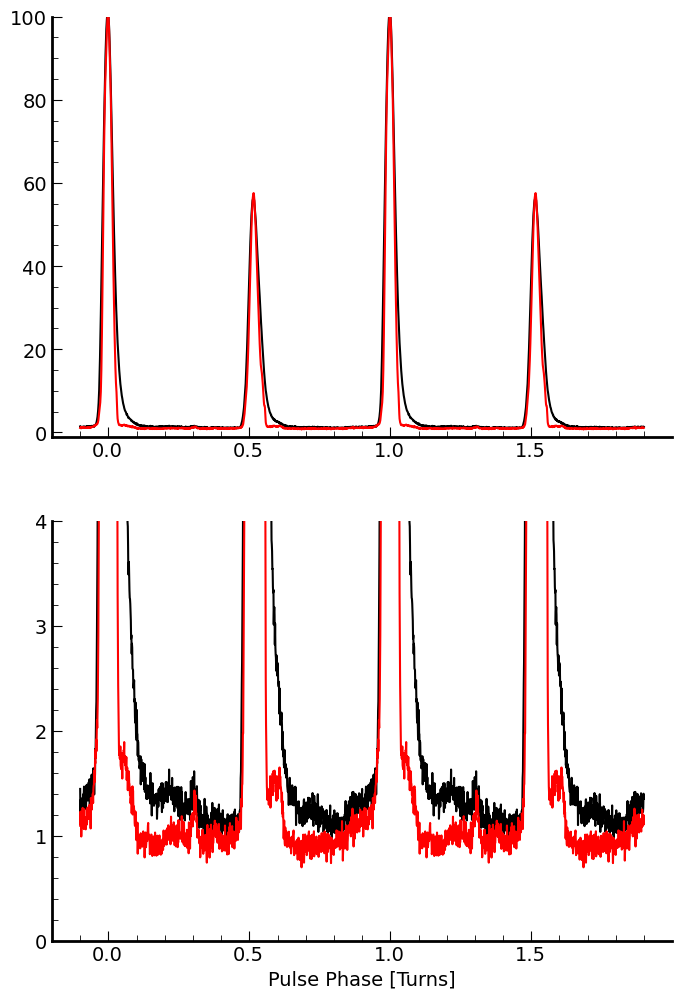

In [36]:
plot_intrinsic_vs_observed(CS, pp_scattered)